## Project 3: Final

### **Distribution of work**
#### Group Members: Shangzhe WU, Gengmo QI, Boyu LIU, Xinnan DU

Shangzhe WU: WGAN_GP, LSGAN, BEGAN, performance evaluation

Gengmo QI: Inception Score code, final report write-up, discussion

Boyu LIU: Trained VAE, WGAN and GAN

Xinnan DU:

# Summary of GANs

## 1. Variational Autoencoders(VAE)

VAEs define intractable density function with latent $z$: 
$$p_\theta(x) = \int p_\theta(z) p_\theta(x\,|\,z)  \, dz$$
However, we cannot optimize directly, but we can derive and optimize lower bound on likelihood instead

### Autoencoders

Autoencoders provide an unsupervised approach for learning a lower-dimensional feature representation $z$ from unlabeled training data $x$. In order to learn this feature representation, We train such that features can be used to reconstruct original data
“Autoencoding” - encoding itself

<img src="img/auto1.png" alt="drawing" style="width: 500px;"/>

### Variational Autoencoders
Variational Autoencoders are probabilistic spin on autoencoders. However, Data likelihood $p_\theta(x) = \int p_\theta(z) p_\theta(x\,|\,z)  \, dz$ is intractable, we thus define additional encoder network $q_\phi(z|x)$ that approximates $p_\theta(z|x)$ which allows us to derive a lower bound on the data likelihood that is tractable and optimizable.
<img src="img/auto2.png" alt="drawing" style="width: 700px;"/>

$log\,p_\theta(x^{(i)}) = E_z[log\,p_\theta(x^{(i)}\,|\,z)] - D_{KL}(q_\phi(z\,|\,x^{(i)})\,||\,p_\theta(z)) + D_{KL}(q_\phi(z\,|\,x^{(i)})\,||\,p_\theta(z\,|\,x^{(i)}))$

The first 2 terms on the RHS are bothe tractable and denote as $L(x^{(i)},\theta,\phi)$

The third term on the RHS is intractable but is always >0

Thus we know that $log\,p_\theta(x^{(i)}) \geq L(x^{(i)},\theta,\phi)$ , our goal in training is then maximize this lower bound:
$$\theta^* ,  \phi^* =  arg \, max_{\theta,\phi} \sum L(x^{(i)},\theta,\phi)$$

#### Summary: VAEs combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

## 2. GAN

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs). In a GAN, we build two different neural networks. First a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

<img src="img/GAN.png" alt="drawing" style="width: 600px;"/>

Think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. Which is equivalent to _maximizing_ the probability of the _discriminator making the incorrect choice_ on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

## 3. WGAN: Use Wasserstein distance as GAN loss function
It is intractable to exhaust all the possible joint distributions in $\Pi(p_r, p_g)$ to compute $\inf_{\gamma \sim \Pi(p_r, p_g)}$. Thus the authors [Wasserstein GAN](https://arxiv.org/pdf/1701.07875.pdf) proposed a smart transformation of the formula based on the Kantorovich-Rubinstein duality to:

$$W(p_r, p_g) = \frac{1}{K} \sup_{\| f \|_L \leq K} \mathbb{E}_{x \sim p_r}[f(x)] - \mathbb{E}_{x \sim p_g}[f(x)]$$

In the modified Wasserstein-GAN, the “discriminator” model is used to learn $w$ to find a good $f_w$ and the loss function is configured as measuring the Wasserstein distance between $p_r$ and $p_g$.

$$L(p_r, p_g) = W(p_r, p_g) = \max_{w \in W} \mathbb{E}_{x \sim p_r}[f_w(x)] - \mathbb{E}_{z \sim p_r(z)}[f_w(g_\theta(z))]$$

Thus the “discriminator” is not a direct critic of telling the fake samples apart from the real ones anymore. Instead, it is trained to learn a K-Lipschitz continuous function to help compute Wasserstein distance. As the loss function decreases in the training, the Wasserstein distance gets smaller and the generator model’s output grows closer to the real data distribution.

## 4. WGAN_GP

We now look at [Improved Wasserstein GAN](https://arxiv.org/abs/1704.00028) as a newer, more stable alernative to the original GAN loss function. We implement Algorithm 1 in the paper. 

<img src="img/WGANGP_algo1.png" alt="drawing" style="width: 700px;"/>

## 5. LSGAN - Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. The difference is in the loss function. We implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


## 6. BEGAN: Boundary Equilibrium GANs

Unlike standard generative adversarial networks [(Goodfellow et al. 2014)](#references), boundary equilibrium generative adversarial networks (BEGAN) use an auto-encoder as a disciminator. An auto-encoder loss is defined, and an approximation of the Wasserstein distance is then computed between the pixelwise auto-encoder loss distributions of real and generated samples.

<p align='center'>
<img src='img/eq_autoencoder_loss.png' width=580>  
</p>

With the auto-encoder loss defined (above), the Wasserstein distance approximation simplifies to a loss function wherein the discriminating auto-encoder aims to perform *well on real samples* and *poorly on generated samples*, while the generator aims to produce adversarial samples which the discriminator can't help but perform well upon.

<p align='center'>
<img src='img/eq_losses.png' width=380>
</p>

Additionally, a hyper-parameter gamma is introduced which gives the user the power to control sample diversity by balancing the discriminator and generator.

<p align='center'>
<img src='img/eq_gamma.png' width=170>  
</p>

Gamma is put into effect through the use of a weighting parameter *k* which gets updated while training to adapt the loss function so that our output matches the desired diversity. The overall objective for the network is then:

<p align='center'>
<img src='img/eq_objective.png' width=510> 
</p>

Unlike most generative adversarial network architectures, where we need to update *G* and *D* independently, the Boundary Equilibrium GAN has the nice property that we can define a global loss and train the network as a whole (though we still have to make sure to update parameters with respect to the relative loss functions)

<p align='center'>
<img src='img/eq_global.png'>
</p>

The final contribution of the paper is a derived convergence measure M which gives a good indicator as to how the network is doing. We use this parameter to track performance, as well as control learning rate.

<p align='center'>
<img src='img/eq_conv_measure.png'>
</p>



# Experiments

In [1]:
%load_ext autoreload
%autoreload 2

import os

## GAN Variants
from GAN import GAN
from CGAN import CGAN
from infoGAN import infoGAN
from ACGAN import ACGAN
from EBGAN import EBGAN
from WGAN import WGAN
from WGAN_GP import WGAN_GP
from DRAGAN import DRAGAN
from LSGAN import LSGAN
from BEGAN import BEGAN

## VAE Variants
from VAE import VAE
from CVAE import CVAE

from utils import show_all_variables
from utils import check_folder

import tensorflow as tf
import numpy as np

/home/elliott/anaconda3/envs/comp4332/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
models = [GAN, 
          #CGAN, 
          #infoGAN, 
          #ACGAN, 
          #EBGAN, 
          WGAN, 
          WGAN_GP, 
          #DRAGAN,
          LSGAN, 
          BEGAN, 
          VAE, 
          #CVAE
         ]

In [3]:
class Config(object):
    def __init__(self,
                 gan_type='WGAN_GP',
                 dataset='fashion-mnist',
                 epoch=20,
                 batch_size=64,
                 z_dim=62,
                 checkpoint_dir='checkpoint',
                 result_dir='results',
                 log_dir='logs'
                ):
        self.gan_type = gan_type
        self.dataset = dataset
        self.epoch = epoch
        self.batch_size = batch_size
        self.z_dim = z_dim
        self.checkpoint_dir = checkpoint_dir
        self.result_dir = result_dir
        self.log_dir = log_dir

In [4]:
def check_args(args):
    # --checkpoint_dir
    check_folder(args.checkpoint_dir)

    # --result_dir
    check_folder(args.result_dir)

    # --result_dir
    check_folder(args.log_dir)

    # --epoch
    assert args.epoch >= 1, 'number of epochs must be larger than or equal to one'

    # --batch_size
    assert args.batch_size >= 1, 'batch size must be larger than or equal to one'

    # --z_dim
    assert args.z_dim >= 1, 'dimension of noise vector must be larger than or equal to one'

    return args

def run_model(args):
    tf.reset_default_graph()
    
    args = check_args(args)
    if args is None:
        exit()

    with tf.Session(config=tf.ConfigProto(allow_soft_placement=True)) as sess:
        # declare instance for GAN

        gan = None
        for model in models:
            if args.gan_type == model.model_name:
                gan = model(sess,
                            epoch=args.epoch,
                            batch_size=args.batch_size,
                            z_dim=args.z_dim,
                            dataset_name=args.dataset,
                            checkpoint_dir=args.checkpoint_dir,
                            result_dir=args.result_dir,
                            log_dir=args.log_dir)
        if gan is None:
            raise Exception("[!] There is no option for " + args.gan_type)

        # build graph
        gan.build_model()

        # show network architecture
        show_all_variables()

        # launch the graph in a session
        gan.train()
        print(" [*] Training finished!")

        # visualize learned generator
        gan.visualize_results(args.epoch-1)
        print(" [*] Testing finished!")
        
        return gan

In [5]:
test_models = ['GAN', 'WGAN', 'WGAN_GP', 'LSGAN', 'BEGAN', 'VAE']
trained_models = {}

for tm in test_models:
    config = Config(gan_type=tm)
    trained_models[tm] = run_model(config)

---------
Variables: name (type shape) [size]
---------
discriminator/d_conv1/w:0 (float32_ref 4x4x1x64) [1024, bytes: 4096]
discriminator/d_conv1/biases:0 (float32_ref 64) [64, bytes: 256]
discriminator/d_conv2/w:0 (float32_ref 4x4x64x128) [131072, bytes: 524288]
discriminator/d_conv2/biases:0 (float32_ref 128) [128, bytes: 512]
discriminator/d_bn2/beta:0 (float32_ref 128) [128, bytes: 512]
discriminator/d_bn2/gamma:0 (float32_ref 128) [128, bytes: 512]
discriminator/d_fc3/Matrix:0 (float32_ref 6272x1024) [6422528, bytes: 25690112]
discriminator/d_fc3/bias:0 (float32_ref 1024) [1024, bytes: 4096]
discriminator/d_bn3/beta:0 (float32_ref 1024) [1024, bytes: 4096]
discriminator/d_bn3/gamma:0 (float32_ref 1024) [1024, bytes: 4096]
discriminator/d_fc4/Matrix:0 (float32_ref 1024x1) [1024, bytes: 4096]
discriminator/d_fc4/bias:0 (float32_ref 1) [1, bytes: 4]
generator/g_fc1/Matrix:0 (float32_ref 62x1024) [63488, bytes: 253952]
generator/g_fc1/bias:0 (float32_ref 1024) [1024, bytes: 4096]
gen

................................................................
Inception Score Mean: 1.05556190, SD: 0.01406131
Epoch: [ 0] [  64/1093] time: 19.7310, d_loss: 1.06582999, g_loss: 0.94425833
Epoch: [ 0] [  65/1093] time: 19.7447, d_loss: 1.11388767, g_loss: 0.94437039
Epoch: [ 0] [  66/1093] time: 19.7584, d_loss: 1.07949829, g_loss: 0.93532562
Epoch: [ 0] [  67/1093] time: 19.7721, d_loss: 1.11091685, g_loss: 0.95154631
Epoch: [ 0] [  68/1093] time: 19.7859, d_loss: 1.08682561, g_loss: 0.93736601
................................................................
Inception Score Mean: 1.07386446, SD: 0.02108090
Epoch: [ 0] [  69/1093] time: 21.1772, d_loss: 1.04477000, g_loss: 0.96482378
Epoch: [ 0] [  70/1093] time: 21.1911, d_loss: 1.06319928, g_loss: 0.95560396
Epoch: [ 0] [  71/1093] time: 21.2048, d_loss: 1.06595683, g_loss: 0.96892649
Epoch: [ 0] [  72/1093] time: 21.2188, d_loss: 1.05613708, g_loss: 0.97756582
Epoch: [ 0] [  73/1093] time: 21.2327, d_loss: 1.00321078, g_loss: 0.9

Epoch: [ 0] [ 146/1093] time: 43.1976, d_loss: 1.11369598, g_loss: 0.95669997
Epoch: [ 0] [ 147/1093] time: 43.2117, d_loss: 1.20930219, g_loss: 0.93824762
Epoch: [ 0] [ 148/1093] time: 43.2257, d_loss: 1.15869105, g_loss: 1.10750413
................................................................
Inception Score Mean: 1.64170420, SD: 0.20949602
Epoch: [ 0] [ 149/1093] time: 44.6343, d_loss: 1.33261764, g_loss: 0.97263932
Epoch: [ 0] [ 150/1093] time: 44.6484, d_loss: 1.28099668, g_loss: 0.90600330
Epoch: [ 0] [ 151/1093] time: 44.6625, d_loss: 1.11994195, g_loss: 0.91299236
Epoch: [ 0] [ 152/1093] time: 44.6767, d_loss: 1.17008853, g_loss: 0.92968035
Epoch: [ 0] [ 153/1093] time: 44.6909, d_loss: 1.17629385, g_loss: 0.86898589
................................................................
Inception Score Mean: 1.59598756, SD: 0.18065691
Epoch: [ 0] [ 154/1093] time: 46.1226, d_loss: 1.15839303, g_loss: 0.89916539
Epoch: [ 0] [ 155/1093] time: 46.1366, d_loss: 1.12779915, g_loss: 0.9

Epoch: [ 0] [ 228/1093] time: 67.3026, d_loss: 1.27490401, g_loss: 0.82546329
................................................................
Inception Score Mean: 2.13028026, SD: 0.35660684
Epoch: [ 0] [ 229/1093] time: 68.7182, d_loss: 1.21640873, g_loss: 0.83824998
Epoch: [ 0] [ 230/1093] time: 68.7321, d_loss: 1.30179715, g_loss: 0.83016884
Epoch: [ 0] [ 231/1093] time: 68.7457, d_loss: 1.32880759, g_loss: 0.90231621
Epoch: [ 0] [ 232/1093] time: 68.7596, d_loss: 1.42163098, g_loss: 0.89164764
Epoch: [ 0] [ 233/1093] time: 68.7736, d_loss: 1.38485491, g_loss: 0.82114285
................................................................
Inception Score Mean: 2.04249239, SD: 0.38444740
Epoch: [ 0] [ 234/1093] time: 70.1884, d_loss: 1.38680899, g_loss: 0.76823848
Epoch: [ 0] [ 235/1093] time: 70.2023, d_loss: 1.30878937, g_loss: 0.77945548
Epoch: [ 0] [ 236/1093] time: 70.2163, d_loss: 1.33840954, g_loss: 0.80269825
Epoch: [ 0] [ 237/1093] time: 70.2302, d_loss: 1.32531786, g_loss: 0.8

Epoch: [ 0] [ 389/1093] time: 115.8337, d_loss: 1.29780769, g_loss: 0.83129257
Epoch: [ 0] [ 390/1093] time: 115.8476, d_loss: 1.32535768, g_loss: 0.81548387
Epoch: [ 0] [ 391/1093] time: 115.8615, d_loss: 1.31249487, g_loss: 0.81009364
Epoch: [ 0] [ 392/1093] time: 115.8753, d_loss: 1.31003857, g_loss: 0.81542236
Epoch: [ 0] [ 393/1093] time: 115.8892, d_loss: 1.30476665, g_loss: 0.82767195
................................................................
Inception Score Mean: 2.39678717, SD: 0.28063339
Epoch: [ 0] [ 394/1093] time: 117.3255, d_loss: 1.27993011, g_loss: 0.85001576
Epoch: [ 0] [ 395/1093] time: 117.3396, d_loss: 1.28147984, g_loss: 0.79827750
Epoch: [ 0] [ 396/1093] time: 117.3534, d_loss: 1.24814498, g_loss: 0.84262115
Epoch: [ 0] [ 397/1093] time: 117.3672, d_loss: 1.31137180, g_loss: 0.80082357
Epoch: [ 0] [ 398/1093] time: 117.3813, d_loss: 1.27677512, g_loss: 0.81914419
................................................................
Inception Score Mean: 2.1871781

Epoch: [ 0] [ 470/1093] time: 139.5491, d_loss: 1.29343534, g_loss: 0.85124362
Epoch: [ 0] [ 471/1093] time: 139.5631, d_loss: 1.25492799, g_loss: 0.89211452
Epoch: [ 0] [ 472/1093] time: 139.5779, d_loss: 1.36259174, g_loss: 0.83844781
Epoch: [ 0] [ 473/1093] time: 139.5917, d_loss: 1.34253287, g_loss: 0.82118487
................................................................
Inception Score Mean: 2.44992518, SD: 0.32249004
Epoch: [ 0] [ 474/1093] time: 141.0088, d_loss: 1.28756666, g_loss: 0.83135939
Epoch: [ 0] [ 475/1093] time: 141.0228, d_loss: 1.32627773, g_loss: 0.81914079
Epoch: [ 0] [ 476/1093] time: 141.0370, d_loss: 1.32764304, g_loss: 0.81019855
Epoch: [ 0] [ 477/1093] time: 141.0508, d_loss: 1.28096533, g_loss: 0.81325233
Epoch: [ 0] [ 478/1093] time: 141.0646, d_loss: 1.32967401, g_loss: 0.79155260
................................................................
Inception Score Mean: 2.40961123, SD: 0.34799463
Epoch: [ 0] [ 479/1093] time: 142.4795, d_loss: 1.30511379, g

Epoch: [ 0] [ 566/1093] time: 149.6815, d_loss: 1.31236923, g_loss: 0.84776634
Epoch: [ 0] [ 567/1093] time: 149.6954, d_loss: 1.33020437, g_loss: 0.88690221
Epoch: [ 0] [ 568/1093] time: 149.7092, d_loss: 1.36228824, g_loss: 0.82265437
Epoch: [ 0] [ 569/1093] time: 149.7229, d_loss: 1.30587792, g_loss: 0.81624448
Epoch: [ 0] [ 570/1093] time: 149.7368, d_loss: 1.32839370, g_loss: 0.80071539
Epoch: [ 0] [ 571/1093] time: 149.7508, d_loss: 1.31758451, g_loss: 0.82368684
Epoch: [ 0] [ 572/1093] time: 149.7647, d_loss: 1.33837843, g_loss: 0.81025559
Epoch: [ 0] [ 573/1093] time: 149.7782, d_loss: 1.35118675, g_loss: 0.80081391
Epoch: [ 0] [ 574/1093] time: 149.7921, d_loss: 1.32971072, g_loss: 0.76307976
Epoch: [ 0] [ 575/1093] time: 149.8059, d_loss: 1.33527303, g_loss: 0.76631314
Epoch: [ 0] [ 576/1093] time: 149.8200, d_loss: 1.32507372, g_loss: 0.79318303
Epoch: [ 0] [ 577/1093] time: 149.8340, d_loss: 1.32634068, g_loss: 0.77841127
Epoch: [ 0] [ 578/1093] time: 149.8480, d_loss: 1.31

Epoch: [ 0] [ 671/1093] time: 151.1453, d_loss: 1.37890792, g_loss: 0.82221246
Epoch: [ 0] [ 672/1093] time: 151.1591, d_loss: 1.32907069, g_loss: 0.85352945
Epoch: [ 0] [ 673/1093] time: 151.1728, d_loss: 1.29520047, g_loss: 0.81400037
Epoch: [ 0] [ 674/1093] time: 151.1864, d_loss: 1.25699031, g_loss: 0.84099221
Epoch: [ 0] [ 675/1093] time: 151.2002, d_loss: 1.28895795, g_loss: 0.82439077
Epoch: [ 0] [ 676/1093] time: 151.2140, d_loss: 1.31853676, g_loss: 0.81866062
Epoch: [ 0] [ 677/1093] time: 151.2278, d_loss: 1.28199983, g_loss: 0.84911299
Epoch: [ 0] [ 678/1093] time: 151.2417, d_loss: 1.30157137, g_loss: 0.83421981
Epoch: [ 0] [ 679/1093] time: 151.2554, d_loss: 1.31288314, g_loss: 0.82343829
Epoch: [ 0] [ 680/1093] time: 151.2691, d_loss: 1.32386386, g_loss: 0.82716089
Epoch: [ 0] [ 681/1093] time: 151.2833, d_loss: 1.32905960, g_loss: 0.80615145
Epoch: [ 0] [ 682/1093] time: 151.2970, d_loss: 1.29847777, g_loss: 0.80827641
Epoch: [ 0] [ 683/1093] time: 151.3107, d_loss: 1.28

Epoch: [ 0] [ 776/1093] time: 152.5988, d_loss: 1.28604484, g_loss: 0.83704585
Epoch: [ 0] [ 777/1093] time: 152.6125, d_loss: 1.32745945, g_loss: 0.80496460
Epoch: [ 0] [ 778/1093] time: 152.6263, d_loss: 1.32714653, g_loss: 0.80043590
Epoch: [ 0] [ 779/1093] time: 152.6403, d_loss: 1.28647256, g_loss: 0.81814039
Epoch: [ 0] [ 780/1093] time: 152.6540, d_loss: 1.30695152, g_loss: 0.80211484
Epoch: [ 0] [ 781/1093] time: 152.6677, d_loss: 1.31184494, g_loss: 0.83664984
Epoch: [ 0] [ 782/1093] time: 152.6814, d_loss: 1.32746720, g_loss: 0.89439440
Epoch: [ 0] [ 783/1093] time: 152.6951, d_loss: 1.40138543, g_loss: 0.88714206
Epoch: [ 0] [ 784/1093] time: 152.7088, d_loss: 1.34302628, g_loss: 0.89881647
Epoch: [ 0] [ 785/1093] time: 152.7226, d_loss: 1.33578134, g_loss: 0.80294561
Epoch: [ 0] [ 786/1093] time: 152.7363, d_loss: 1.30319667, g_loss: 0.80944014
Epoch: [ 0] [ 787/1093] time: 152.7502, d_loss: 1.29275870, g_loss: 0.81039619
Epoch: [ 0] [ 788/1093] time: 152.7639, d_loss: 1.28

Epoch: [ 0] [ 881/1093] time: 154.0526, d_loss: 1.32187283, g_loss: 0.83128428
Epoch: [ 0] [ 882/1093] time: 154.0663, d_loss: 1.32791090, g_loss: 0.83056444
Epoch: [ 0] [ 883/1093] time: 154.0799, d_loss: 1.27472913, g_loss: 0.84584188
Epoch: [ 0] [ 884/1093] time: 154.0937, d_loss: 1.25546503, g_loss: 0.84422767
Epoch: [ 0] [ 885/1093] time: 154.1074, d_loss: 1.29402781, g_loss: 0.82440186
Epoch: [ 0] [ 886/1093] time: 154.1215, d_loss: 1.28618574, g_loss: 0.87036073
Epoch: [ 0] [ 887/1093] time: 154.1353, d_loss: 1.36691380, g_loss: 0.85928643
Epoch: [ 0] [ 888/1093] time: 154.1490, d_loss: 1.42430079, g_loss: 0.88538045
Epoch: [ 0] [ 889/1093] time: 154.1628, d_loss: 1.40153933, g_loss: 0.85372245
Epoch: [ 0] [ 890/1093] time: 154.1765, d_loss: 1.31675339, g_loss: 0.81775910
Epoch: [ 0] [ 891/1093] time: 154.1902, d_loss: 1.30366743, g_loss: 0.82266581
Epoch: [ 0] [ 892/1093] time: 154.2038, d_loss: 1.28100133, g_loss: 0.83216941
Epoch: [ 0] [ 893/1093] time: 154.2175, d_loss: 1.31

Epoch: [ 0] [ 986/1093] time: 155.5112, d_loss: 1.27925467, g_loss: 0.84271401
Epoch: [ 0] [ 987/1093] time: 155.5249, d_loss: 1.28723025, g_loss: 0.81414241
Epoch: [ 0] [ 988/1093] time: 155.5388, d_loss: 1.29145634, g_loss: 0.81367743
Epoch: [ 0] [ 989/1093] time: 155.5537, d_loss: 1.31723070, g_loss: 0.82706797
Epoch: [ 0] [ 990/1093] time: 155.5673, d_loss: 1.34629607, g_loss: 0.81117195
Epoch: [ 0] [ 991/1093] time: 155.5810, d_loss: 1.32314670, g_loss: 0.81024432
Epoch: [ 0] [ 992/1093] time: 155.5946, d_loss: 1.28296256, g_loss: 0.85840261
Epoch: [ 0] [ 993/1093] time: 155.6083, d_loss: 1.31510520, g_loss: 0.85259342
Epoch: [ 0] [ 994/1093] time: 155.6223, d_loss: 1.32502270, g_loss: 0.82290781
Epoch: [ 0] [ 995/1093] time: 155.6362, d_loss: 1.29081559, g_loss: 0.79139584
Epoch: [ 0] [ 996/1093] time: 155.6500, d_loss: 1.29355836, g_loss: 0.81875294
Epoch: [ 0] [ 997/1093] time: 155.6638, d_loss: 1.33488631, g_loss: 0.86795032
Epoch: [ 0] [ 998/1093] time: 155.6775, d_loss: 1.32

Epoch: [ 0] [1091/1093] time: 156.9590, d_loss: 1.30955827, g_loss: 0.84879971
Epoch: [ 0] [1092/1093] time: 156.9727, d_loss: 1.34830809, g_loss: 0.84284544
Epoch: [ 1] [   0/1093] time: 157.3477, d_loss: 1.31869483, g_loss: 0.82242918
Epoch: [ 1] [   1/1093] time: 157.3615, d_loss: 1.33098412, g_loss: 0.81764722
Epoch: [ 1] [   2/1093] time: 157.3754, d_loss: 1.30360734, g_loss: 0.81188035
Epoch: [ 1] [   3/1093] time: 157.3891, d_loss: 1.32010877, g_loss: 0.77679789
Epoch: [ 1] [   4/1093] time: 157.4030, d_loss: 1.29073691, g_loss: 0.80172235
Epoch: [ 1] [   5/1093] time: 157.4168, d_loss: 1.35779238, g_loss: 0.85904324
Epoch: [ 1] [   6/1093] time: 157.4305, d_loss: 1.32979643, g_loss: 0.86291778
Epoch: [ 1] [   7/1093] time: 157.4442, d_loss: 1.30748820, g_loss: 0.84830213
Epoch: [ 1] [   8/1093] time: 157.4579, d_loss: 1.32904398, g_loss: 0.83212483
Epoch: [ 1] [   9/1093] time: 157.4714, d_loss: 1.35004878, g_loss: 0.79173082
Epoch: [ 1] [  10/1093] time: 157.4850, d_loss: 1.31

Epoch: [ 1] [ 104/1093] time: 158.8080, d_loss: 1.30528665, g_loss: 0.84901226
Epoch: [ 1] [ 105/1093] time: 158.8242, d_loss: 1.30423987, g_loss: 0.82052994
Epoch: [ 1] [ 106/1093] time: 158.8472, d_loss: 1.35535574, g_loss: 0.84648085
Epoch: [ 1] [ 107/1093] time: 158.8631, d_loss: 1.27221596, g_loss: 0.84805965
Epoch: [ 1] [ 108/1093] time: 158.8778, d_loss: 1.36724865, g_loss: 0.84251034
Epoch: [ 1] [ 109/1093] time: 158.8925, d_loss: 1.27961731, g_loss: 0.89628041
Epoch: [ 1] [ 110/1093] time: 158.9073, d_loss: 1.31452632, g_loss: 0.84143448
Epoch: [ 1] [ 111/1093] time: 158.9219, d_loss: 1.33616424, g_loss: 0.81529427
Epoch: [ 1] [ 112/1093] time: 158.9365, d_loss: 1.29931986, g_loss: 0.83169353
Epoch: [ 1] [ 113/1093] time: 158.9512, d_loss: 1.29887676, g_loss: 0.83670425
Epoch: [ 1] [ 114/1093] time: 158.9657, d_loss: 1.30520368, g_loss: 0.81221765
Epoch: [ 1] [ 115/1093] time: 158.9803, d_loss: 1.28136063, g_loss: 0.80533886
Epoch: [ 1] [ 116/1093] time: 158.9948, d_loss: 1.28

Epoch: [ 1] [ 208/1093] time: 160.3022, d_loss: 1.39561164, g_loss: 0.89444512
Epoch: [ 1] [ 209/1093] time: 160.3162, d_loss: 1.34361613, g_loss: 0.84347701
Epoch: [ 1] [ 210/1093] time: 160.3303, d_loss: 1.35079896, g_loss: 0.80131871
Epoch: [ 1] [ 211/1093] time: 160.3442, d_loss: 1.32524776, g_loss: 0.80081666
Epoch: [ 1] [ 212/1093] time: 160.3579, d_loss: 1.33569503, g_loss: 0.80069339
Epoch: [ 1] [ 213/1093] time: 160.3718, d_loss: 1.28538513, g_loss: 0.84328085
Epoch: [ 1] [ 214/1093] time: 160.3858, d_loss: 1.29064155, g_loss: 0.85108823
Epoch: [ 1] [ 215/1093] time: 160.3998, d_loss: 1.30940557, g_loss: 0.85330176
Epoch: [ 1] [ 216/1093] time: 160.4139, d_loss: 1.28133893, g_loss: 0.84361374
Epoch: [ 1] [ 217/1093] time: 160.4278, d_loss: 1.32205248, g_loss: 0.79873168
Epoch: [ 1] [ 218/1093] time: 160.4419, d_loss: 1.28875256, g_loss: 0.83555186
Epoch: [ 1] [ 219/1093] time: 160.4557, d_loss: 1.27298117, g_loss: 0.83674014
Epoch: [ 1] [ 220/1093] time: 160.4695, d_loss: 1.32

Epoch: [ 1] [ 313/1093] time: 161.7830, d_loss: 1.27738869, g_loss: 0.84136426
Epoch: [ 1] [ 314/1093] time: 161.7970, d_loss: 1.28307247, g_loss: 0.84173775
Epoch: [ 1] [ 315/1093] time: 161.8109, d_loss: 1.30096984, g_loss: 0.83427280
Epoch: [ 1] [ 316/1093] time: 161.8249, d_loss: 1.28739405, g_loss: 0.84809047
Epoch: [ 1] [ 317/1093] time: 161.8389, d_loss: 1.31343961, g_loss: 0.84507227
Epoch: [ 1] [ 318/1093] time: 161.8530, d_loss: 1.25622058, g_loss: 0.87151277
Epoch: [ 1] [ 319/1093] time: 161.8670, d_loss: 1.27525091, g_loss: 0.84352517
Epoch: [ 1] [ 320/1093] time: 161.8811, d_loss: 1.33817387, g_loss: 0.81832242
Epoch: [ 1] [ 321/1093] time: 161.8951, d_loss: 1.31450653, g_loss: 0.87228394
Epoch: [ 1] [ 322/1093] time: 161.9092, d_loss: 1.33125138, g_loss: 0.91663688
Epoch: [ 1] [ 323/1093] time: 161.9232, d_loss: 1.34055090, g_loss: 0.85034597
Epoch: [ 1] [ 324/1093] time: 161.9371, d_loss: 1.30160308, g_loss: 0.88669574
Epoch: [ 1] [ 325/1093] time: 161.9513, d_loss: 1.26

Epoch: [ 1] [ 430/1093] time: 163.4446, d_loss: 1.33997560, g_loss: 0.88117683
Epoch: [ 1] [ 431/1093] time: 163.4583, d_loss: 1.30055356, g_loss: 0.89926219
Epoch: [ 1] [ 432/1093] time: 163.4721, d_loss: 1.33705926, g_loss: 0.86601400
Epoch: [ 1] [ 433/1093] time: 163.4859, d_loss: 1.25903916, g_loss: 0.91611785
Epoch: [ 1] [ 434/1093] time: 163.5003, d_loss: 1.31632805, g_loss: 0.83737528
Epoch: [ 1] [ 435/1093] time: 163.5147, d_loss: 1.29617393, g_loss: 0.80922449
Epoch: [ 1] [ 436/1093] time: 163.5286, d_loss: 1.29603219, g_loss: 0.88701355
Epoch: [ 1] [ 437/1093] time: 163.5426, d_loss: 1.30499506, g_loss: 0.89971364
Epoch: [ 1] [ 438/1093] time: 163.5567, d_loss: 1.32691526, g_loss: 0.86374867
Epoch: [ 1] [ 439/1093] time: 163.5703, d_loss: 1.29912341, g_loss: 0.83633941
Epoch: [ 1] [ 440/1093] time: 163.5837, d_loss: 1.28665841, g_loss: 0.85024434
Epoch: [ 1] [ 441/1093] time: 163.5975, d_loss: 1.32286644, g_loss: 0.84224141
Epoch: [ 1] [ 442/1093] time: 163.6111, d_loss: 1.32

Epoch: [ 1] [ 535/1093] time: 164.8892, d_loss: 1.33076179, g_loss: 0.84254938
Epoch: [ 1] [ 536/1093] time: 164.9031, d_loss: 1.30427337, g_loss: 0.85037577
Epoch: [ 1] [ 537/1093] time: 164.9168, d_loss: 1.27614880, g_loss: 0.84868860
Epoch: [ 1] [ 538/1093] time: 164.9304, d_loss: 1.23766208, g_loss: 0.88318706
Epoch: [ 1] [ 539/1093] time: 164.9440, d_loss: 1.30505514, g_loss: 0.85321057
Epoch: [ 1] [ 540/1093] time: 164.9575, d_loss: 1.28074718, g_loss: 0.86699826
Epoch: [ 1] [ 541/1093] time: 164.9712, d_loss: 1.27821326, g_loss: 0.86543095
Epoch: [ 1] [ 542/1093] time: 164.9848, d_loss: 1.31058204, g_loss: 0.84609759
Epoch: [ 1] [ 543/1093] time: 164.9984, d_loss: 1.28023374, g_loss: 0.83917248
Epoch: [ 1] [ 544/1093] time: 165.0119, d_loss: 1.33819127, g_loss: 0.85632420
Epoch: [ 1] [ 545/1093] time: 165.0258, d_loss: 1.29073548, g_loss: 0.85658646
Epoch: [ 1] [ 546/1093] time: 165.0400, d_loss: 1.30463743, g_loss: 0.81915212
Epoch: [ 1] [ 547/1093] time: 165.0537, d_loss: 1.29

Epoch: [ 1] [ 640/1093] time: 166.3275, d_loss: 1.32103240, g_loss: 0.82590586
Epoch: [ 1] [ 641/1093] time: 166.3412, d_loss: 1.32354271, g_loss: 0.83963066
Epoch: [ 1] [ 642/1093] time: 166.3548, d_loss: 1.32273936, g_loss: 0.82438523
Epoch: [ 1] [ 643/1093] time: 166.3684, d_loss: 1.29578185, g_loss: 0.87764263
Epoch: [ 1] [ 644/1093] time: 166.3822, d_loss: 1.30415547, g_loss: 0.85939085
Epoch: [ 1] [ 645/1093] time: 166.3958, d_loss: 1.24761033, g_loss: 0.87671441
Epoch: [ 1] [ 646/1093] time: 166.4094, d_loss: 1.30635369, g_loss: 0.81233394
Epoch: [ 1] [ 647/1093] time: 166.4229, d_loss: 1.28868008, g_loss: 0.82415134
Epoch: [ 1] [ 648/1093] time: 166.4365, d_loss: 1.28811908, g_loss: 0.86588287
Epoch: [ 1] [ 649/1093] time: 166.4500, d_loss: 1.30006051, g_loss: 0.85143930
Epoch: [ 1] [ 650/1093] time: 166.4636, d_loss: 1.27972245, g_loss: 0.87504733
Epoch: [ 1] [ 651/1093] time: 166.4772, d_loss: 1.28216732, g_loss: 0.86011803
Epoch: [ 1] [ 652/1093] time: 166.4907, d_loss: 1.28

Epoch: [ 1] [ 745/1093] time: 167.7670, d_loss: 1.29246187, g_loss: 0.91415101
Epoch: [ 1] [ 746/1093] time: 167.7809, d_loss: 1.34382200, g_loss: 0.84566212
Epoch: [ 1] [ 747/1093] time: 167.7946, d_loss: 1.28773975, g_loss: 0.92625427
Epoch: [ 1] [ 748/1093] time: 167.8084, d_loss: 1.30915082, g_loss: 0.85627741
Epoch: [ 1] [ 749/1093] time: 167.8221, d_loss: 1.30056477, g_loss: 0.89067358
Epoch: [ 1] [ 750/1093] time: 167.8357, d_loss: 1.26680899, g_loss: 0.89125264
Epoch: [ 1] [ 751/1093] time: 167.8492, d_loss: 1.30034637, g_loss: 0.84724194
Epoch: [ 1] [ 752/1093] time: 167.8627, d_loss: 1.28399658, g_loss: 0.86530125
Epoch: [ 1] [ 753/1093] time: 167.8763, d_loss: 1.26589155, g_loss: 0.85526335
Epoch: [ 1] [ 754/1093] time: 167.8901, d_loss: 1.27748144, g_loss: 0.90753579
Epoch: [ 1] [ 755/1093] time: 167.9038, d_loss: 1.25470400, g_loss: 0.88146162
Epoch: [ 1] [ 756/1093] time: 167.9175, d_loss: 1.31524372, g_loss: 0.82228583
Epoch: [ 1] [ 757/1093] time: 167.9312, d_loss: 1.30

Epoch: [ 1] [ 850/1093] time: 169.2054, d_loss: 1.25702071, g_loss: 0.83902562
Epoch: [ 1] [ 851/1093] time: 169.2190, d_loss: 1.30841947, g_loss: 0.83812225
Epoch: [ 1] [ 852/1093] time: 169.2324, d_loss: 1.29901063, g_loss: 0.84073043
Epoch: [ 1] [ 853/1093] time: 169.2459, d_loss: 1.26905155, g_loss: 0.83184934
Epoch: [ 1] [ 854/1093] time: 169.2596, d_loss: 1.26519942, g_loss: 0.90067327
Epoch: [ 1] [ 855/1093] time: 169.2733, d_loss: 1.28730524, g_loss: 0.92335147
Epoch: [ 1] [ 856/1093] time: 169.2870, d_loss: 1.36765528, g_loss: 0.89506489
Epoch: [ 1] [ 857/1093] time: 169.3006, d_loss: 1.30530167, g_loss: 0.86690807
Epoch: [ 1] [ 858/1093] time: 169.3142, d_loss: 1.34256279, g_loss: 0.80679578
Epoch: [ 1] [ 859/1093] time: 169.3278, d_loss: 1.29995763, g_loss: 0.83362436
Epoch: [ 1] [ 860/1093] time: 169.3414, d_loss: 1.28256249, g_loss: 0.87197512
Epoch: [ 1] [ 861/1093] time: 169.3550, d_loss: 1.26081014, g_loss: 0.87740457
Epoch: [ 1] [ 862/1093] time: 169.3687, d_loss: 1.31

Epoch: [ 1] [ 955/1093] time: 170.6591, d_loss: 1.21808648, g_loss: 0.91331321
Epoch: [ 1] [ 956/1093] time: 170.6728, d_loss: 1.30533814, g_loss: 0.86749113
Epoch: [ 1] [ 957/1093] time: 170.6866, d_loss: 1.32127583, g_loss: 0.83213228
Epoch: [ 1] [ 958/1093] time: 170.7003, d_loss: 1.26025987, g_loss: 0.85246068
Epoch: [ 1] [ 959/1093] time: 170.7138, d_loss: 1.25774598, g_loss: 0.86123085
Epoch: [ 1] [ 960/1093] time: 170.7275, d_loss: 1.26746583, g_loss: 0.88636631
Epoch: [ 1] [ 961/1093] time: 170.7413, d_loss: 1.29314852, g_loss: 0.86395729
Epoch: [ 1] [ 962/1093] time: 170.7551, d_loss: 1.26538384, g_loss: 0.85465944
Epoch: [ 1] [ 963/1093] time: 170.7687, d_loss: 1.29022884, g_loss: 0.88545913
Epoch: [ 1] [ 964/1093] time: 170.7823, d_loss: 1.26174152, g_loss: 0.90928680
Epoch: [ 1] [ 965/1093] time: 170.7960, d_loss: 1.34797001, g_loss: 0.86690611
Epoch: [ 1] [ 966/1093] time: 170.8096, d_loss: 1.26370847, g_loss: 0.87684453
Epoch: [ 1] [ 967/1093] time: 170.8232, d_loss: 1.26

Epoch: [ 1] [1060/1093] time: 172.0994, d_loss: 1.29049313, g_loss: 0.81965894
Epoch: [ 1] [1061/1093] time: 172.1130, d_loss: 1.22497797, g_loss: 0.84840691
Epoch: [ 1] [1062/1093] time: 172.1267, d_loss: 1.29197049, g_loss: 0.84378570
Epoch: [ 1] [1063/1093] time: 172.1405, d_loss: 1.23148942, g_loss: 0.94954884
Epoch: [ 1] [1064/1093] time: 172.1541, d_loss: 1.25759339, g_loss: 0.91791821
Epoch: [ 1] [1065/1093] time: 172.1678, d_loss: 1.24073219, g_loss: 0.87518233
Epoch: [ 1] [1066/1093] time: 172.1817, d_loss: 1.28378868, g_loss: 0.84134287
Epoch: [ 1] [1067/1093] time: 172.1953, d_loss: 1.28381598, g_loss: 0.85989237
Epoch: [ 1] [1068/1093] time: 172.2090, d_loss: 1.25861382, g_loss: 0.87483895
Epoch: [ 1] [1069/1093] time: 172.2228, d_loss: 1.32817316, g_loss: 0.85818756
Epoch: [ 1] [1070/1093] time: 172.2366, d_loss: 1.27597332, g_loss: 0.84259647
Epoch: [ 1] [1071/1093] time: 172.2504, d_loss: 1.24583519, g_loss: 0.85348833
Epoch: [ 1] [1072/1093] time: 172.2642, d_loss: 1.26

Epoch: [ 2] [  75/1093] time: 173.9015, d_loss: 1.24503565, g_loss: 0.86483884
Epoch: [ 2] [  76/1093] time: 173.9152, d_loss: 1.26789415, g_loss: 0.87597299
Epoch: [ 2] [  77/1093] time: 173.9289, d_loss: 1.27040887, g_loss: 0.89089525
Epoch: [ 2] [  78/1093] time: 173.9426, d_loss: 1.27553380, g_loss: 0.86830401
Epoch: [ 2] [  79/1093] time: 173.9564, d_loss: 1.23953092, g_loss: 0.90724826
Epoch: [ 2] [  80/1093] time: 173.9700, d_loss: 1.29253936, g_loss: 0.88628089
Epoch: [ 2] [  81/1093] time: 173.9836, d_loss: 1.26000917, g_loss: 0.89160001
Epoch: [ 2] [  82/1093] time: 173.9972, d_loss: 1.26189673, g_loss: 0.86408675
Epoch: [ 2] [  83/1093] time: 174.0112, d_loss: 1.28055680, g_loss: 0.83310878
Epoch: [ 2] [  84/1093] time: 174.0259, d_loss: 1.23909366, g_loss: 0.89617538
Epoch: [ 2] [  85/1093] time: 174.0410, d_loss: 1.27448952, g_loss: 0.89246941
Epoch: [ 2] [  86/1093] time: 174.0547, d_loss: 1.23158693, g_loss: 0.92976320
Epoch: [ 2] [  87/1093] time: 174.0685, d_loss: 1.24

Epoch: [ 2] [ 180/1093] time: 175.3558, d_loss: 1.30366731, g_loss: 0.88167715
Epoch: [ 2] [ 181/1093] time: 175.3698, d_loss: 1.30868959, g_loss: 0.90652919
Epoch: [ 2] [ 182/1093] time: 175.3837, d_loss: 1.32711697, g_loss: 0.89668709
Epoch: [ 2] [ 183/1093] time: 175.3977, d_loss: 1.27801991, g_loss: 0.86233425
Epoch: [ 2] [ 184/1093] time: 175.4115, d_loss: 1.31304455, g_loss: 0.88922596
Epoch: [ 2] [ 185/1093] time: 175.4255, d_loss: 1.28880692, g_loss: 0.92765951
Epoch: [ 2] [ 186/1093] time: 175.4392, d_loss: 1.28306043, g_loss: 0.97490740
Epoch: [ 2] [ 187/1093] time: 175.4530, d_loss: 1.28795433, g_loss: 0.91642982
Epoch: [ 2] [ 188/1093] time: 175.4668, d_loss: 1.28844476, g_loss: 0.88591552
Epoch: [ 2] [ 189/1093] time: 175.4804, d_loss: 1.33489907, g_loss: 0.81948972
Epoch: [ 2] [ 190/1093] time: 175.4942, d_loss: 1.30714202, g_loss: 0.78836119
Epoch: [ 2] [ 191/1093] time: 175.5081, d_loss: 1.24007952, g_loss: 0.85225701
Epoch: [ 2] [ 192/1093] time: 175.5219, d_loss: 1.28

Epoch: [ 2] [ 284/1093] time: 176.8280, d_loss: 1.31246066, g_loss: 0.86766922
Epoch: [ 2] [ 285/1093] time: 176.8420, d_loss: 1.32105672, g_loss: 0.83729041
Epoch: [ 2] [ 286/1093] time: 176.8561, d_loss: 1.29346144, g_loss: 0.92440796
Epoch: [ 2] [ 287/1093] time: 176.8700, d_loss: 1.22508085, g_loss: 0.88816428
Epoch: [ 2] [ 288/1093] time: 176.8840, d_loss: 1.24062085, g_loss: 0.88045263
Epoch: [ 2] [ 289/1093] time: 176.8979, d_loss: 1.23644006, g_loss: 0.91851413
Epoch: [ 2] [ 290/1093] time: 176.9120, d_loss: 1.27919042, g_loss: 0.86562467
Epoch: [ 2] [ 291/1093] time: 176.9259, d_loss: 1.27522802, g_loss: 0.88434541
Epoch: [ 2] [ 292/1093] time: 176.9397, d_loss: 1.24860418, g_loss: 0.88488251
Epoch: [ 2] [ 293/1093] time: 176.9536, d_loss: 1.23992372, g_loss: 0.87471628
Epoch: [ 2] [ 294/1093] time: 176.9676, d_loss: 1.28272069, g_loss: 0.84510696
Epoch: [ 2] [ 295/1093] time: 176.9817, d_loss: 1.16879845, g_loss: 0.89456570
Epoch: [ 2] [ 296/1093] time: 176.9956, d_loss: 1.27

Epoch: [ 2] [ 389/1093] time: 178.3068, d_loss: 1.27253914, g_loss: 0.86511928
Epoch: [ 2] [ 390/1093] time: 178.3210, d_loss: 1.25831032, g_loss: 0.91821951
Epoch: [ 2] [ 391/1093] time: 178.3350, d_loss: 1.26896787, g_loss: 0.85172552
Epoch: [ 2] [ 392/1093] time: 178.3490, d_loss: 1.24271917, g_loss: 0.87508583
Epoch: [ 2] [ 393/1093] time: 178.3630, d_loss: 1.24873662, g_loss: 0.94274271
Epoch: [ 2] [ 394/1093] time: 178.3771, d_loss: 1.28363490, g_loss: 0.92070770
Epoch: [ 2] [ 395/1093] time: 178.3912, d_loss: 1.24865746, g_loss: 0.88943994
Epoch: [ 2] [ 396/1093] time: 178.4054, d_loss: 1.21996069, g_loss: 0.92729962
Epoch: [ 2] [ 397/1093] time: 178.4195, d_loss: 1.28330231, g_loss: 0.94979703
Epoch: [ 2] [ 398/1093] time: 178.4336, d_loss: 1.24112308, g_loss: 0.85770661
Epoch: [ 2] [ 399/1093] time: 178.4478, d_loss: 1.18369818, g_loss: 0.92189825
Epoch: [ 2] [ 400/1093] time: 178.4620, d_loss: 1.26571226, g_loss: 0.90928555
Epoch: [ 2] [ 401/1093] time: 178.4760, d_loss: 1.27

Epoch: [ 2] [ 494/1093] time: 179.7760, d_loss: 1.27624249, g_loss: 0.89395905
Epoch: [ 2] [ 495/1093] time: 179.7901, d_loss: 1.27935982, g_loss: 0.91516149
Epoch: [ 2] [ 496/1093] time: 179.8042, d_loss: 1.31193161, g_loss: 0.86658156
Epoch: [ 2] [ 497/1093] time: 179.8183, d_loss: 1.30569875, g_loss: 0.92008251
Epoch: [ 2] [ 498/1093] time: 179.8322, d_loss: 1.28869367, g_loss: 0.90821517
Epoch: [ 2] [ 499/1093] time: 179.8462, d_loss: 1.30125856, g_loss: 0.88044602
Epoch: [ 2] [ 500/1093] time: 179.8602, d_loss: 1.21783757, g_loss: 0.86098921
Epoch: [ 2] [ 501/1093] time: 179.8742, d_loss: 1.26781690, g_loss: 0.88218963
Epoch: [ 2] [ 502/1093] time: 179.8895, d_loss: 1.23252797, g_loss: 0.90848172
Epoch: [ 2] [ 503/1093] time: 179.9035, d_loss: 1.27819657, g_loss: 0.87252891
Epoch: [ 2] [ 504/1093] time: 179.9175, d_loss: 1.25444162, g_loss: 0.93744063
Epoch: [ 2] [ 505/1093] time: 179.9316, d_loss: 1.25863397, g_loss: 0.96432102
Epoch: [ 2] [ 506/1093] time: 179.9458, d_loss: 1.24

Epoch: [ 2] [ 599/1093] time: 181.2642, d_loss: 1.27670646, g_loss: 0.84786421
Epoch: [ 2] [ 600/1093] time: 181.2784, d_loss: 1.24535632, g_loss: 0.89667904
Epoch: [ 2] [ 601/1093] time: 181.2927, d_loss: 1.20612240, g_loss: 0.97364891
Epoch: [ 2] [ 602/1093] time: 181.3068, d_loss: 1.21954489, g_loss: 0.92592084
Epoch: [ 2] [ 603/1093] time: 181.3208, d_loss: 1.24652433, g_loss: 0.90711010
Epoch: [ 2] [ 604/1093] time: 181.3351, d_loss: 1.21978521, g_loss: 1.01997685
Epoch: [ 2] [ 605/1093] time: 181.3496, d_loss: 1.29821730, g_loss: 0.90508926
Epoch: [ 2] [ 606/1093] time: 181.3637, d_loss: 1.33673286, g_loss: 0.86089349
Epoch: [ 2] [ 607/1093] time: 181.3778, d_loss: 1.28575301, g_loss: 0.86900854
Epoch: [ 2] [ 608/1093] time: 181.3921, d_loss: 1.21354628, g_loss: 0.89334482
Epoch: [ 2] [ 609/1093] time: 181.4062, d_loss: 1.26859856, g_loss: 0.88884699
Epoch: [ 2] [ 610/1093] time: 181.4204, d_loss: 1.28407836, g_loss: 0.87640500
Epoch: [ 2] [ 611/1093] time: 181.4345, d_loss: 1.31

Epoch: [ 2] [ 704/1093] time: 182.7439, d_loss: 1.26326799, g_loss: 0.95418149
Epoch: [ 2] [ 705/1093] time: 182.7582, d_loss: 1.29938507, g_loss: 0.91570038
Epoch: [ 2] [ 706/1093] time: 182.7726, d_loss: 1.25837731, g_loss: 0.87434852
Epoch: [ 2] [ 707/1093] time: 182.7868, d_loss: 1.27124631, g_loss: 0.90914452
Epoch: [ 2] [ 708/1093] time: 182.8012, d_loss: 1.24634182, g_loss: 0.86868596
Epoch: [ 2] [ 709/1093] time: 182.8153, d_loss: 1.26199365, g_loss: 0.90153867
Epoch: [ 2] [ 710/1093] time: 182.8296, d_loss: 1.16582251, g_loss: 0.98228729
Epoch: [ 2] [ 711/1093] time: 182.8438, d_loss: 1.24547815, g_loss: 0.90016609
Epoch: [ 2] [ 712/1093] time: 182.8579, d_loss: 1.25938439, g_loss: 0.89701068
Epoch: [ 2] [ 713/1093] time: 182.8722, d_loss: 1.22933364, g_loss: 0.87882280
Epoch: [ 2] [ 714/1093] time: 182.8864, d_loss: 1.25082588, g_loss: 0.87927681
Epoch: [ 2] [ 715/1093] time: 182.9009, d_loss: 1.25477135, g_loss: 0.93582171
Epoch: [ 2] [ 716/1093] time: 182.9154, d_loss: 1.23

Epoch: [ 2] [ 809/1093] time: 184.2377, d_loss: 1.26082504, g_loss: 0.95538151
Epoch: [ 2] [ 810/1093] time: 184.2515, d_loss: 1.25073516, g_loss: 0.85252410
Epoch: [ 2] [ 811/1093] time: 184.2653, d_loss: 1.29977167, g_loss: 0.84081936
Epoch: [ 2] [ 812/1093] time: 184.2799, d_loss: 1.20491445, g_loss: 0.95270193
Epoch: [ 2] [ 813/1093] time: 184.2985, d_loss: 1.25977707, g_loss: 0.96103382
Epoch: [ 2] [ 814/1093] time: 184.3125, d_loss: 1.23910367, g_loss: 0.95352960
Epoch: [ 2] [ 815/1093] time: 184.3264, d_loss: 1.27319121, g_loss: 0.90623689
Epoch: [ 2] [ 816/1093] time: 184.3401, d_loss: 1.23514187, g_loss: 0.89344561
Epoch: [ 2] [ 817/1093] time: 184.3539, d_loss: 1.31118679, g_loss: 0.85055923
Epoch: [ 2] [ 818/1093] time: 184.3678, d_loss: 1.24136877, g_loss: 0.90032279
Epoch: [ 2] [ 819/1093] time: 184.3816, d_loss: 1.22122145, g_loss: 0.92910981
Epoch: [ 2] [ 820/1093] time: 184.3955, d_loss: 1.24296296, g_loss: 0.89925921
Epoch: [ 2] [ 821/1093] time: 184.4094, d_loss: 1.19

Epoch: [ 2] [ 926/1093] time: 185.9097, d_loss: 1.20079768, g_loss: 0.92061257
Epoch: [ 2] [ 927/1093] time: 185.9244, d_loss: 1.28828621, g_loss: 1.05740213
Epoch: [ 2] [ 928/1093] time: 185.9388, d_loss: 1.27401292, g_loss: 0.96812397
Epoch: [ 2] [ 929/1093] time: 185.9533, d_loss: 1.28380239, g_loss: 0.87652421
Epoch: [ 2] [ 930/1093] time: 185.9678, d_loss: 1.26903248, g_loss: 0.90571237
Epoch: [ 2] [ 931/1093] time: 185.9822, d_loss: 1.25263250, g_loss: 0.93933666
Epoch: [ 2] [ 932/1093] time: 185.9965, d_loss: 1.29327440, g_loss: 0.92343199
Epoch: [ 2] [ 933/1093] time: 186.0110, d_loss: 1.25867093, g_loss: 0.92800742
Epoch: [ 2] [ 934/1093] time: 186.0253, d_loss: 1.25735593, g_loss: 0.99348629
Epoch: [ 2] [ 935/1093] time: 186.0397, d_loss: 1.26362216, g_loss: 0.92262352
Epoch: [ 2] [ 936/1093] time: 186.0539, d_loss: 1.21663773, g_loss: 0.91390043
Epoch: [ 2] [ 937/1093] time: 186.0684, d_loss: 1.26542628, g_loss: 0.88470697
Epoch: [ 2] [ 938/1093] time: 186.0827, d_loss: 1.31

Epoch: [ 2] [1030/1093] time: 187.4014, d_loss: 1.24486363, g_loss: 0.90641236
Epoch: [ 2] [1031/1093] time: 187.4159, d_loss: 1.21902418, g_loss: 0.98960024
Epoch: [ 2] [1032/1093] time: 187.4312, d_loss: 1.24808002, g_loss: 0.96934414
Epoch: [ 2] [1033/1093] time: 187.4468, d_loss: 1.23021507, g_loss: 0.92572045
Epoch: [ 2] [1034/1093] time: 187.4614, d_loss: 1.25179958, g_loss: 0.86898255
Epoch: [ 2] [1035/1093] time: 187.4756, d_loss: 1.27837050, g_loss: 0.87149388
Epoch: [ 2] [1036/1093] time: 187.4898, d_loss: 1.23065388, g_loss: 0.89615655
Epoch: [ 2] [1037/1093] time: 187.5040, d_loss: 1.26552451, g_loss: 0.97445464
Epoch: [ 2] [1038/1093] time: 187.5180, d_loss: 1.16627026, g_loss: 0.95241404
Epoch: [ 2] [1039/1093] time: 187.5322, d_loss: 1.19908202, g_loss: 0.94450688
Epoch: [ 2] [1040/1093] time: 187.5464, d_loss: 1.22265244, g_loss: 0.93994737
Epoch: [ 2] [1041/1093] time: 187.5605, d_loss: 1.21190763, g_loss: 0.92736727
Epoch: [ 2] [1042/1093] time: 187.5746, d_loss: 1.20

Epoch: [ 3] [  45/1093] time: 189.2502, d_loss: 1.23596025, g_loss: 0.89375257
Epoch: [ 3] [  46/1093] time: 189.2642, d_loss: 1.18191147, g_loss: 0.87546182
Epoch: [ 3] [  47/1093] time: 189.2781, d_loss: 1.25339663, g_loss: 0.88346148
Epoch: [ 3] [  48/1093] time: 189.2920, d_loss: 1.17357230, g_loss: 0.98625183
Epoch: [ 3] [  49/1093] time: 189.3059, d_loss: 1.21278405, g_loss: 0.97654819
Epoch: [ 3] [  50/1093] time: 189.3197, d_loss: 1.22252798, g_loss: 0.89159203
Epoch: [ 3] [  51/1093] time: 189.3337, d_loss: 1.21015501, g_loss: 0.84786046
Epoch: [ 3] [  52/1093] time: 189.3477, d_loss: 1.20157087, g_loss: 0.97112918
Epoch: [ 3] [  53/1093] time: 189.3616, d_loss: 1.24174285, g_loss: 0.99523062
Epoch: [ 3] [  54/1093] time: 189.3754, d_loss: 1.18515849, g_loss: 1.01082098
Epoch: [ 3] [  55/1093] time: 189.3892, d_loss: 1.29491532, g_loss: 0.95233285
Epoch: [ 3] [  56/1093] time: 189.4053, d_loss: 1.13504517, g_loss: 0.99884844
Epoch: [ 3] [  57/1093] time: 189.4190, d_loss: 1.26

Epoch: [ 3] [ 150/1093] time: 190.7252, d_loss: 1.20343208, g_loss: 0.96947336
Epoch: [ 3] [ 151/1093] time: 190.7395, d_loss: 1.20440733, g_loss: 0.94289708
Epoch: [ 3] [ 152/1093] time: 190.7537, d_loss: 1.22201538, g_loss: 0.90905201
Epoch: [ 3] [ 153/1093] time: 190.7680, d_loss: 1.16076684, g_loss: 0.90416563
Epoch: [ 3] [ 154/1093] time: 190.7823, d_loss: 1.25561428, g_loss: 0.90218270
Epoch: [ 3] [ 155/1093] time: 190.7967, d_loss: 1.21486855, g_loss: 0.98228192
Epoch: [ 3] [ 156/1093] time: 190.8110, d_loss: 1.20069480, g_loss: 0.96891415
Epoch: [ 3] [ 157/1093] time: 190.8252, d_loss: 1.14094996, g_loss: 0.97476172
Epoch: [ 3] [ 158/1093] time: 190.8395, d_loss: 1.19828236, g_loss: 0.96947038
Epoch: [ 3] [ 159/1093] time: 190.8538, d_loss: 1.26465487, g_loss: 1.00262010
Epoch: [ 3] [ 160/1093] time: 190.8682, d_loss: 1.29824662, g_loss: 0.85260814
Epoch: [ 3] [ 161/1093] time: 190.8825, d_loss: 1.25746346, g_loss: 0.97640514
Epoch: [ 3] [ 162/1093] time: 190.8967, d_loss: 1.28

Epoch: [ 3] [ 268/1093] time: 192.4064, d_loss: 1.17975712, g_loss: 0.93726212
Epoch: [ 3] [ 269/1093] time: 192.4206, d_loss: 1.18165922, g_loss: 0.92624283
Epoch: [ 3] [ 270/1093] time: 192.4350, d_loss: 1.25843132, g_loss: 0.92561603
Epoch: [ 3] [ 271/1093] time: 192.4491, d_loss: 1.22148597, g_loss: 0.98856723
Epoch: [ 3] [ 272/1093] time: 192.4632, d_loss: 1.30322909, g_loss: 1.04671407
Epoch: [ 3] [ 273/1093] time: 192.4807, d_loss: 1.30873156, g_loss: 0.95300257
Epoch: [ 3] [ 274/1093] time: 192.4950, d_loss: 1.26981330, g_loss: 0.87495381
Epoch: [ 3] [ 275/1093] time: 192.5090, d_loss: 1.25050366, g_loss: 0.91385216
Epoch: [ 3] [ 276/1093] time: 192.5229, d_loss: 1.35635483, g_loss: 0.91774899
Epoch: [ 3] [ 277/1093] time: 192.5370, d_loss: 1.24308896, g_loss: 0.95320058
Epoch: [ 3] [ 278/1093] time: 192.5512, d_loss: 1.19140124, g_loss: 0.97984326
Epoch: [ 3] [ 279/1093] time: 192.5654, d_loss: 1.17157054, g_loss: 0.95231372
Epoch: [ 3] [ 280/1093] time: 192.5794, d_loss: 1.26

Epoch: [ 3] [ 372/1093] time: 193.8924, d_loss: 1.31055009, g_loss: 0.91713387
Epoch: [ 3] [ 373/1093] time: 193.9064, d_loss: 1.23153734, g_loss: 0.89984530
Epoch: [ 3] [ 374/1093] time: 193.9207, d_loss: 1.24365270, g_loss: 0.91814339
Epoch: [ 3] [ 375/1093] time: 193.9347, d_loss: 1.24684215, g_loss: 0.96936911
Epoch: [ 3] [ 376/1093] time: 193.9487, d_loss: 1.21912670, g_loss: 0.99537325
Epoch: [ 3] [ 377/1093] time: 193.9629, d_loss: 1.18853593, g_loss: 0.89408529
Epoch: [ 3] [ 378/1093] time: 193.9770, d_loss: 1.19395971, g_loss: 0.89584917
Epoch: [ 3] [ 379/1093] time: 193.9911, d_loss: 1.25034511, g_loss: 0.92307276
Epoch: [ 3] [ 380/1093] time: 194.0053, d_loss: 1.24854720, g_loss: 0.95505083
Epoch: [ 3] [ 381/1093] time: 194.0194, d_loss: 1.22148013, g_loss: 0.92848694
Epoch: [ 3] [ 382/1093] time: 194.0334, d_loss: 1.26083708, g_loss: 0.93359858
Epoch: [ 3] [ 383/1093] time: 194.0478, d_loss: 1.25031745, g_loss: 1.00029469
Epoch: [ 3] [ 384/1093] time: 194.0618, d_loss: 1.34

Epoch: [ 3] [ 477/1093] time: 195.3851, d_loss: 1.14629650, g_loss: 0.97573006
Epoch: [ 3] [ 478/1093] time: 195.3993, d_loss: 1.24823880, g_loss: 0.93529904
Epoch: [ 3] [ 479/1093] time: 195.4136, d_loss: 1.22646046, g_loss: 0.87102175
Epoch: [ 3] [ 480/1093] time: 195.4278, d_loss: 1.24458170, g_loss: 0.88237345
Epoch: [ 3] [ 481/1093] time: 195.4416, d_loss: 1.18534172, g_loss: 0.95190316
Epoch: [ 3] [ 482/1093] time: 195.4556, d_loss: 1.20415652, g_loss: 1.00415468
Epoch: [ 3] [ 483/1093] time: 195.4698, d_loss: 1.22605729, g_loss: 0.94454682
Epoch: [ 3] [ 484/1093] time: 195.4839, d_loss: 1.17283130, g_loss: 0.99784029
Epoch: [ 3] [ 485/1093] time: 195.4980, d_loss: 1.24269509, g_loss: 0.96213663
Epoch: [ 3] [ 486/1093] time: 195.5120, d_loss: 1.21104169, g_loss: 0.96515954
Epoch: [ 3] [ 487/1093] time: 195.5262, d_loss: 1.24098897, g_loss: 0.93237633
Epoch: [ 3] [ 488/1093] time: 195.5402, d_loss: 1.37456322, g_loss: 0.93839633
Epoch: [ 3] [ 489/1093] time: 195.5543, d_loss: 1.30

Epoch: [ 3] [ 595/1093] time: 197.0669, d_loss: 1.19089603, g_loss: 0.96532047
Epoch: [ 3] [ 596/1093] time: 197.0810, d_loss: 1.13977563, g_loss: 0.93647420
Epoch: [ 3] [ 597/1093] time: 197.0949, d_loss: 1.24563670, g_loss: 0.89012295
Epoch: [ 3] [ 598/1093] time: 197.1089, d_loss: 1.17720091, g_loss: 0.94187772
Epoch: [ 3] [ 599/1093] time: 197.1227, d_loss: 1.24060905, g_loss: 0.92484361
Epoch: [ 3] [ 600/1093] time: 197.1366, d_loss: 1.21737003, g_loss: 0.95566636
Epoch: [ 3] [ 601/1093] time: 197.1506, d_loss: 1.28686285, g_loss: 0.89148462
Epoch: [ 3] [ 602/1093] time: 197.1646, d_loss: 1.23551261, g_loss: 0.88943833
Epoch: [ 3] [ 603/1093] time: 197.1785, d_loss: 1.14091921, g_loss: 0.96580094
Epoch: [ 3] [ 604/1093] time: 197.1929, d_loss: 1.16250873, g_loss: 1.02023029
Epoch: [ 3] [ 605/1093] time: 197.2068, d_loss: 1.22529376, g_loss: 0.96552896
Epoch: [ 3] [ 606/1093] time: 197.2207, d_loss: 1.21191812, g_loss: 0.95764327
Epoch: [ 3] [ 607/1093] time: 197.2348, d_loss: 1.25

Epoch: [ 3] [ 699/1093] time: 198.5443, d_loss: 1.18785965, g_loss: 0.97612613
Epoch: [ 3] [ 700/1093] time: 198.5583, d_loss: 1.20252895, g_loss: 0.94864553
Epoch: [ 3] [ 701/1093] time: 198.5724, d_loss: 1.19068432, g_loss: 0.91283858
Epoch: [ 3] [ 702/1093] time: 198.5865, d_loss: 1.23745966, g_loss: 0.93736565
Epoch: [ 3] [ 703/1093] time: 198.6004, d_loss: 1.22785234, g_loss: 1.00472522
Epoch: [ 3] [ 704/1093] time: 198.6143, d_loss: 1.23609352, g_loss: 1.00692964
Epoch: [ 3] [ 705/1093] time: 198.6283, d_loss: 1.25907922, g_loss: 0.86631256
Epoch: [ 3] [ 706/1093] time: 198.6422, d_loss: 1.23997700, g_loss: 0.87084776
Epoch: [ 3] [ 707/1093] time: 198.6563, d_loss: 1.19564676, g_loss: 0.95107341
Epoch: [ 3] [ 708/1093] time: 198.6703, d_loss: 1.29868937, g_loss: 0.91751957
Epoch: [ 3] [ 709/1093] time: 198.6844, d_loss: 1.29959452, g_loss: 0.95880252
Epoch: [ 3] [ 710/1093] time: 198.6984, d_loss: 1.24882090, g_loss: 0.95073593
Epoch: [ 3] [ 711/1093] time: 198.7123, d_loss: 1.17

Epoch: [ 3] [ 817/1093] time: 200.2271, d_loss: 1.24351072, g_loss: 0.91887158
Epoch: [ 3] [ 818/1093] time: 200.2413, d_loss: 1.20376110, g_loss: 0.96240079
Epoch: [ 3] [ 819/1093] time: 200.2553, d_loss: 1.24658477, g_loss: 0.96683383
Epoch: [ 3] [ 820/1093] time: 200.2692, d_loss: 1.21754789, g_loss: 1.05689740
Epoch: [ 3] [ 821/1093] time: 200.2832, d_loss: 1.24687576, g_loss: 1.00836444
Epoch: [ 3] [ 822/1093] time: 200.2972, d_loss: 1.22117829, g_loss: 0.92291629
Epoch: [ 3] [ 823/1093] time: 200.3112, d_loss: 1.16714954, g_loss: 1.01320100
Epoch: [ 3] [ 824/1093] time: 200.3253, d_loss: 1.22792351, g_loss: 0.92968005
Epoch: [ 3] [ 825/1093] time: 200.3394, d_loss: 1.25335193, g_loss: 0.92496091
Epoch: [ 3] [ 826/1093] time: 200.3535, d_loss: 1.23975301, g_loss: 0.86553341
Epoch: [ 3] [ 827/1093] time: 200.3677, d_loss: 1.23797417, g_loss: 0.91393775
Epoch: [ 3] [ 828/1093] time: 200.3819, d_loss: 1.18317711, g_loss: 0.96485007
Epoch: [ 3] [ 829/1093] time: 200.3964, d_loss: 1.19

Epoch: [ 3] [ 921/1093] time: 201.7095, d_loss: 1.22905576, g_loss: 0.97560304
Epoch: [ 3] [ 922/1093] time: 201.7237, d_loss: 1.19282341, g_loss: 1.00930774
Epoch: [ 3] [ 923/1093] time: 201.7377, d_loss: 1.24024510, g_loss: 1.00860882
Epoch: [ 3] [ 924/1093] time: 201.7519, d_loss: 1.27118659, g_loss: 1.03734148
Epoch: [ 3] [ 925/1093] time: 201.7659, d_loss: 1.30102491, g_loss: 0.94281727
Epoch: [ 3] [ 926/1093] time: 201.7798, d_loss: 1.09708548, g_loss: 1.02290642
Epoch: [ 3] [ 927/1093] time: 201.7940, d_loss: 1.26300573, g_loss: 0.98052531
Epoch: [ 3] [ 928/1093] time: 201.8081, d_loss: 1.21759677, g_loss: 0.91997480
Epoch: [ 3] [ 929/1093] time: 201.8221, d_loss: 1.12479222, g_loss: 1.04334211
Epoch: [ 3] [ 930/1093] time: 201.8361, d_loss: 1.21943951, g_loss: 0.93537414
Epoch: [ 3] [ 931/1093] time: 201.8501, d_loss: 1.16576183, g_loss: 0.94680560
Epoch: [ 3] [ 932/1093] time: 201.8641, d_loss: 1.24039507, g_loss: 0.92997599
Epoch: [ 3] [ 933/1093] time: 201.8781, d_loss: 1.17

Epoch: [ 3] [1026/1093] time: 203.1869, d_loss: 1.09315181, g_loss: 0.97366619
Epoch: [ 3] [1027/1093] time: 203.2009, d_loss: 1.16935968, g_loss: 0.97051591
Epoch: [ 3] [1028/1093] time: 203.2148, d_loss: 1.14672947, g_loss: 0.96667421
Epoch: [ 3] [1029/1093] time: 203.2287, d_loss: 1.13083458, g_loss: 1.02700710
Epoch: [ 3] [1030/1093] time: 203.2429, d_loss: 1.17754662, g_loss: 1.05078793
Epoch: [ 3] [1031/1093] time: 203.2573, d_loss: 1.20892739, g_loss: 1.03563941
Epoch: [ 3] [1032/1093] time: 203.2714, d_loss: 1.16157031, g_loss: 1.00458288
Epoch: [ 3] [1033/1093] time: 203.2857, d_loss: 1.13618350, g_loss: 1.01745796
Epoch: [ 3] [1034/1093] time: 203.2998, d_loss: 1.17656898, g_loss: 0.93506074
Epoch: [ 3] [1035/1093] time: 203.3142, d_loss: 1.24350810, g_loss: 0.87670934
Epoch: [ 3] [1036/1093] time: 203.3284, d_loss: 1.18839240, g_loss: 0.98902166
Epoch: [ 3] [1037/1093] time: 203.3424, d_loss: 1.12887764, g_loss: 1.07255101
Epoch: [ 3] [1038/1093] time: 203.3565, d_loss: 1.18

Epoch: [ 4] [  45/1093] time: 205.0786, d_loss: 1.18065107, g_loss: 0.97378987
Epoch: [ 4] [  46/1093] time: 205.0941, d_loss: 1.23370612, g_loss: 0.92665863
Epoch: [ 4] [  47/1093] time: 205.1079, d_loss: 1.17498660, g_loss: 0.96271646
Epoch: [ 4] [  48/1093] time: 205.1219, d_loss: 1.15137768, g_loss: 0.97250235
Epoch: [ 4] [  49/1093] time: 205.1357, d_loss: 1.17576885, g_loss: 0.99570441
Epoch: [ 4] [  50/1093] time: 205.1494, d_loss: 1.19580436, g_loss: 0.98403990
Epoch: [ 4] [  51/1093] time: 205.1629, d_loss: 1.19382143, g_loss: 0.95998931
Epoch: [ 4] [  52/1093] time: 205.1768, d_loss: 1.22078371, g_loss: 0.93846714
Epoch: [ 4] [  53/1093] time: 205.1907, d_loss: 1.23710513, g_loss: 1.05138302
Epoch: [ 4] [  54/1093] time: 205.2044, d_loss: 1.26849842, g_loss: 0.94987619
Epoch: [ 4] [  55/1093] time: 205.2182, d_loss: 1.20144248, g_loss: 0.96981996
Epoch: [ 4] [  56/1093] time: 205.2321, d_loss: 1.21613085, g_loss: 1.03912115
Epoch: [ 4] [  57/1093] time: 205.2459, d_loss: 1.24

Epoch: [ 4] [ 150/1093] time: 206.5351, d_loss: 1.15329683, g_loss: 1.05790615
Epoch: [ 4] [ 151/1093] time: 206.5496, d_loss: 1.16369772, g_loss: 0.94704860
Epoch: [ 4] [ 152/1093] time: 206.5635, d_loss: 1.20494628, g_loss: 0.95942545
Epoch: [ 4] [ 153/1093] time: 206.5776, d_loss: 1.20136499, g_loss: 1.04909682
Epoch: [ 4] [ 154/1093] time: 206.5915, d_loss: 1.24149096, g_loss: 1.02469134
Epoch: [ 4] [ 155/1093] time: 206.6054, d_loss: 1.19833016, g_loss: 0.93828225
Epoch: [ 4] [ 156/1093] time: 206.6192, d_loss: 1.17966747, g_loss: 0.90031052
Epoch: [ 4] [ 157/1093] time: 206.6330, d_loss: 1.14230895, g_loss: 1.02326405
Epoch: [ 4] [ 158/1093] time: 206.6470, d_loss: 1.16338193, g_loss: 1.00282264
Epoch: [ 4] [ 159/1093] time: 206.6612, d_loss: 1.21345925, g_loss: 0.97303188
Epoch: [ 4] [ 160/1093] time: 206.6752, d_loss: 1.22117281, g_loss: 0.90859884
Epoch: [ 4] [ 161/1093] time: 206.6894, d_loss: 1.23660815, g_loss: 0.99212629
Epoch: [ 4] [ 162/1093] time: 206.7033, d_loss: 1.23

Epoch: [ 4] [ 265/1093] time: 208.1940, d_loss: 1.14521277, g_loss: 0.97212327
Epoch: [ 4] [ 266/1093] time: 208.2086, d_loss: 1.24665666, g_loss: 0.93910146
Epoch: [ 4] [ 267/1093] time: 208.2233, d_loss: 1.21420074, g_loss: 1.02241945
Epoch: [ 4] [ 268/1093] time: 208.2377, d_loss: 1.18703294, g_loss: 0.96008599
Epoch: [ 4] [ 269/1093] time: 208.2523, d_loss: 1.16464746, g_loss: 0.95322573
Epoch: [ 4] [ 270/1093] time: 208.2668, d_loss: 1.15027571, g_loss: 1.04335690
Epoch: [ 4] [ 271/1093] time: 208.2833, d_loss: 1.23757660, g_loss: 0.93766958
Epoch: [ 4] [ 272/1093] time: 208.2979, d_loss: 1.17471981, g_loss: 0.90092635
Epoch: [ 4] [ 273/1093] time: 208.3124, d_loss: 1.21413064, g_loss: 0.99347436
Epoch: [ 4] [ 274/1093] time: 208.3269, d_loss: 1.18858767, g_loss: 0.97321159
Epoch: [ 4] [ 275/1093] time: 208.3414, d_loss: 1.21303558, g_loss: 0.92288601
Epoch: [ 4] [ 276/1093] time: 208.3560, d_loss: 1.25798750, g_loss: 0.91376334
Epoch: [ 4] [ 277/1093] time: 208.3705, d_loss: 1.17

Epoch: [ 4] [ 383/1093] time: 209.8912, d_loss: 1.11811936, g_loss: 1.02543473
Epoch: [ 4] [ 384/1093] time: 209.9055, d_loss: 1.23590624, g_loss: 0.95593709
Epoch: [ 4] [ 385/1093] time: 209.9198, d_loss: 1.23347712, g_loss: 0.91749585
Epoch: [ 4] [ 386/1093] time: 209.9342, d_loss: 1.12884068, g_loss: 1.06259429
Epoch: [ 4] [ 387/1093] time: 209.9485, d_loss: 1.14606547, g_loss: 1.05165863
Epoch: [ 4] [ 388/1093] time: 209.9628, d_loss: 1.12842393, g_loss: 1.04416609
Epoch: [ 4] [ 389/1093] time: 209.9771, d_loss: 1.15433145, g_loss: 0.95085043
Epoch: [ 4] [ 390/1093] time: 209.9912, d_loss: 1.23558927, g_loss: 0.92798918
Epoch: [ 4] [ 391/1093] time: 210.0054, d_loss: 1.20617282, g_loss: 0.98764759
Epoch: [ 4] [ 392/1093] time: 210.0194, d_loss: 1.14760411, g_loss: 0.98022139
Epoch: [ 4] [ 393/1093] time: 210.0335, d_loss: 1.18848193, g_loss: 0.97069043
Epoch: [ 4] [ 394/1093] time: 210.0477, d_loss: 1.12652838, g_loss: 1.07702994
Epoch: [ 4] [ 395/1093] time: 210.0619, d_loss: 1.14

Epoch: [ 4] [ 487/1093] time: 211.3766, d_loss: 1.18194437, g_loss: 1.06078303
Epoch: [ 4] [ 488/1093] time: 211.3910, d_loss: 1.28261304, g_loss: 0.96090353
Epoch: [ 4] [ 489/1093] time: 211.4053, d_loss: 1.20538390, g_loss: 1.01250505
Epoch: [ 4] [ 490/1093] time: 211.4197, d_loss: 1.21628666, g_loss: 0.97072387
Epoch: [ 4] [ 491/1093] time: 211.4342, d_loss: 1.16155529, g_loss: 0.96565014
Epoch: [ 4] [ 492/1093] time: 211.4486, d_loss: 1.28814507, g_loss: 0.92486203
Epoch: [ 4] [ 493/1093] time: 211.4628, d_loss: 1.20676053, g_loss: 0.87546659
Epoch: [ 4] [ 494/1093] time: 211.4769, d_loss: 1.16383588, g_loss: 1.01195204
Epoch: [ 4] [ 495/1093] time: 211.4912, d_loss: 1.21034789, g_loss: 1.03520429
Epoch: [ 4] [ 496/1093] time: 211.5055, d_loss: 1.23216772, g_loss: 0.98075068
Epoch: [ 4] [ 497/1093] time: 211.5197, d_loss: 1.18185759, g_loss: 1.03453374
Epoch: [ 4] [ 498/1093] time: 211.5339, d_loss: 1.17230833, g_loss: 1.01187146
Epoch: [ 4] [ 499/1093] time: 211.5483, d_loss: 1.19

Epoch: [ 4] [ 604/1093] time: 213.0592, d_loss: 1.13574994, g_loss: 1.05447125
Epoch: [ 4] [ 605/1093] time: 213.0736, d_loss: 1.22947645, g_loss: 1.01181006
Epoch: [ 4] [ 606/1093] time: 213.0880, d_loss: 1.15923882, g_loss: 0.98270440
Epoch: [ 4] [ 607/1093] time: 213.1024, d_loss: 1.21974850, g_loss: 0.94890285
Epoch: [ 4] [ 608/1093] time: 213.1165, d_loss: 1.19978380, g_loss: 1.00394773
Epoch: [ 4] [ 609/1093] time: 213.1308, d_loss: 1.16975045, g_loss: 0.99164224
Epoch: [ 4] [ 610/1093] time: 213.1451, d_loss: 1.14776480, g_loss: 0.98790061
Epoch: [ 4] [ 611/1093] time: 213.1595, d_loss: 1.18723130, g_loss: 0.95497453
Epoch: [ 4] [ 612/1093] time: 213.1739, d_loss: 1.14763784, g_loss: 1.18069112
Epoch: [ 4] [ 613/1093] time: 213.1882, d_loss: 1.20544231, g_loss: 0.95122600
Epoch: [ 4] [ 614/1093] time: 213.2026, d_loss: 1.18435895, g_loss: 0.86563015
Epoch: [ 4] [ 615/1093] time: 213.2168, d_loss: 1.18309283, g_loss: 0.93677443
Epoch: [ 4] [ 616/1093] time: 213.2311, d_loss: 1.22

Epoch: [ 4] [ 708/1093] time: 214.5478, d_loss: 1.13261878, g_loss: 1.00575614
Epoch: [ 4] [ 709/1093] time: 214.5619, d_loss: 1.15009332, g_loss: 1.05143130
Epoch: [ 4] [ 710/1093] time: 214.5778, d_loss: 1.16526246, g_loss: 1.09384584
Epoch: [ 4] [ 711/1093] time: 214.5927, d_loss: 1.16555893, g_loss: 1.01133537
Epoch: [ 4] [ 712/1093] time: 214.6067, d_loss: 1.18952560, g_loss: 0.93527138
Epoch: [ 4] [ 713/1093] time: 214.6208, d_loss: 1.18015695, g_loss: 0.94310868
Epoch: [ 4] [ 714/1093] time: 214.6348, d_loss: 1.20010114, g_loss: 0.92826462
Epoch: [ 4] [ 715/1093] time: 214.6488, d_loss: 1.20342064, g_loss: 1.04368806
Epoch: [ 4] [ 716/1093] time: 214.6630, d_loss: 1.16172719, g_loss: 1.05308354
Epoch: [ 4] [ 717/1093] time: 214.6772, d_loss: 1.15726972, g_loss: 0.98145658
Epoch: [ 4] [ 718/1093] time: 214.6914, d_loss: 1.14994955, g_loss: 1.07558882
Epoch: [ 4] [ 719/1093] time: 214.7052, d_loss: 1.20190907, g_loss: 1.07710791
Epoch: [ 4] [ 720/1093] time: 214.7192, d_loss: 1.13

Epoch: [ 4] [ 823/1093] time: 216.2115, d_loss: 1.32877600, g_loss: 0.96446598
Epoch: [ 4] [ 824/1093] time: 216.2261, d_loss: 1.24111748, g_loss: 1.01674914
Epoch: [ 4] [ 825/1093] time: 216.2405, d_loss: 1.15501583, g_loss: 1.01312447
Epoch: [ 4] [ 826/1093] time: 216.2547, d_loss: 1.10400581, g_loss: 1.01303089
Epoch: [ 4] [ 827/1093] time: 216.2688, d_loss: 1.18409383, g_loss: 1.02588713
Epoch: [ 4] [ 828/1093] time: 216.2830, d_loss: 1.19310904, g_loss: 0.99775386
Epoch: [ 4] [ 829/1093] time: 216.2975, d_loss: 1.23958325, g_loss: 0.91598469
Epoch: [ 4] [ 830/1093] time: 216.3118, d_loss: 1.12094450, g_loss: 1.03323746
Epoch: [ 4] [ 831/1093] time: 216.3260, d_loss: 1.13398516, g_loss: 1.00942636
Epoch: [ 4] [ 832/1093] time: 216.3402, d_loss: 1.20018363, g_loss: 1.04031944
Epoch: [ 4] [ 833/1093] time: 216.3544, d_loss: 1.20232677, g_loss: 1.00445676
Epoch: [ 4] [ 834/1093] time: 216.3685, d_loss: 1.14233744, g_loss: 1.05230856
Epoch: [ 4] [ 835/1093] time: 216.3827, d_loss: 1.30

Epoch: [ 4] [ 927/1093] time: 217.6877, d_loss: 1.20855522, g_loss: 1.07414365
Epoch: [ 4] [ 928/1093] time: 217.7049, d_loss: 1.14646626, g_loss: 1.05221629
Epoch: [ 4] [ 929/1093] time: 217.7201, d_loss: 1.20051563, g_loss: 1.03703618
Epoch: [ 4] [ 930/1093] time: 217.7345, d_loss: 1.15811348, g_loss: 0.95129633
Epoch: [ 4] [ 931/1093] time: 217.7495, d_loss: 1.12227225, g_loss: 1.03503180
Epoch: [ 4] [ 932/1093] time: 217.7637, d_loss: 1.25010169, g_loss: 1.06982315
Epoch: [ 4] [ 933/1093] time: 217.7777, d_loss: 1.21170664, g_loss: 1.09702313
Epoch: [ 4] [ 934/1093] time: 217.7920, d_loss: 1.30332208, g_loss: 0.95991307
Epoch: [ 4] [ 935/1093] time: 217.8069, d_loss: 1.16192591, g_loss: 0.93832999
Epoch: [ 4] [ 936/1093] time: 217.8210, d_loss: 1.12610745, g_loss: 1.03514957
Epoch: [ 4] [ 937/1093] time: 217.8354, d_loss: 1.17663574, g_loss: 1.06690335
Epoch: [ 4] [ 938/1093] time: 217.8502, d_loss: 1.20628881, g_loss: 0.99324518
Epoch: [ 4] [ 939/1093] time: 217.8643, d_loss: 1.09

Epoch: [ 4] [1045/1093] time: 219.3870, d_loss: 1.15793943, g_loss: 1.08597374
Epoch: [ 4] [1046/1093] time: 219.4013, d_loss: 1.16332316, g_loss: 1.08237684
Epoch: [ 4] [1047/1093] time: 219.4155, d_loss: 1.20952034, g_loss: 1.02825952
Epoch: [ 4] [1048/1093] time: 219.4297, d_loss: 1.20011139, g_loss: 1.09596801
Epoch: [ 4] [1049/1093] time: 219.4440, d_loss: 1.10917592, g_loss: 0.96128243
Epoch: [ 4] [1050/1093] time: 219.4583, d_loss: 1.07727885, g_loss: 0.98922682
Epoch: [ 4] [1051/1093] time: 219.4727, d_loss: 1.21447945, g_loss: 1.05288148
Epoch: [ 4] [1052/1093] time: 219.4870, d_loss: 1.18296552, g_loss: 1.09215569
Epoch: [ 4] [1053/1093] time: 219.5014, d_loss: 1.23020899, g_loss: 0.95890647
Epoch: [ 4] [1054/1093] time: 219.5155, d_loss: 1.18851089, g_loss: 1.04594433
Epoch: [ 4] [1055/1093] time: 219.5298, d_loss: 1.18810844, g_loss: 1.00898051
Epoch: [ 4] [1056/1093] time: 219.5441, d_loss: 1.13357949, g_loss: 1.02151680
Epoch: [ 4] [1057/1093] time: 219.5583, d_loss: 1.15

Epoch: [ 5] [  60/1093] time: 221.2202, d_loss: 1.21327388, g_loss: 0.96686769
Epoch: [ 5] [  61/1093] time: 221.2341, d_loss: 1.21991134, g_loss: 1.06375897
Epoch: [ 5] [  62/1093] time: 221.2481, d_loss: 1.14552939, g_loss: 1.13987517
Epoch: [ 5] [  63/1093] time: 221.2622, d_loss: 1.10698938, g_loss: 1.03941560
Epoch: [ 5] [  64/1093] time: 221.2763, d_loss: 1.12945926, g_loss: 0.94600773
Epoch: [ 5] [  65/1093] time: 221.2902, d_loss: 1.20312381, g_loss: 1.02383137
Epoch: [ 5] [  66/1093] time: 221.3043, d_loss: 1.17629039, g_loss: 1.10420990
Epoch: [ 5] [  67/1093] time: 221.3183, d_loss: 1.23571682, g_loss: 1.10537553
Epoch: [ 5] [  68/1093] time: 221.3323, d_loss: 1.28264856, g_loss: 1.04790783
Epoch: [ 5] [  69/1093] time: 221.3461, d_loss: 1.18063724, g_loss: 1.02245903
Epoch: [ 5] [  70/1093] time: 221.3600, d_loss: 1.06965065, g_loss: 1.05133867
Epoch: [ 5] [  71/1093] time: 221.3739, d_loss: 1.09718990, g_loss: 1.09651184
Epoch: [ 5] [  72/1093] time: 221.3879, d_loss: 1.13

Epoch: [ 5] [ 177/1093] time: 222.8911, d_loss: 1.11500776, g_loss: 1.06063211
Epoch: [ 5] [ 178/1093] time: 222.9051, d_loss: 1.15838480, g_loss: 1.03476501
Epoch: [ 5] [ 179/1093] time: 222.9191, d_loss: 1.18701565, g_loss: 1.08626139
Epoch: [ 5] [ 180/1093] time: 222.9331, d_loss: 1.20431018, g_loss: 1.00565839
Epoch: [ 5] [ 181/1093] time: 222.9471, d_loss: 1.14986587, g_loss: 1.07117081
Epoch: [ 5] [ 182/1093] time: 222.9611, d_loss: 1.23029494, g_loss: 1.01731086
Epoch: [ 5] [ 183/1093] time: 222.9751, d_loss: 1.07212496, g_loss: 1.06796217
Epoch: [ 5] [ 184/1093] time: 222.9890, d_loss: 1.23223388, g_loss: 1.03456402
Epoch: [ 5] [ 185/1093] time: 223.0029, d_loss: 1.24546123, g_loss: 1.07955825
Epoch: [ 5] [ 186/1093] time: 223.0181, d_loss: 1.20012820, g_loss: 1.00232005
Epoch: [ 5] [ 187/1093] time: 223.0325, d_loss: 1.13232613, g_loss: 1.07431412
Epoch: [ 5] [ 188/1093] time: 223.0468, d_loss: 1.06901610, g_loss: 1.08910537
Epoch: [ 5] [ 189/1093] time: 223.0608, d_loss: 1.24

Epoch: [ 5] [ 295/1093] time: 224.5730, d_loss: 1.18770623, g_loss: 0.93641639
Epoch: [ 5] [ 296/1093] time: 224.5872, d_loss: 1.12550545, g_loss: 1.06904602
Epoch: [ 5] [ 297/1093] time: 224.6012, d_loss: 1.13012362, g_loss: 1.07926786
Epoch: [ 5] [ 298/1093] time: 224.6153, d_loss: 1.24366236, g_loss: 0.99004465
Epoch: [ 5] [ 299/1093] time: 224.6294, d_loss: 1.22128761, g_loss: 1.01109195
Epoch: [ 5] [ 300/1093] time: 224.6433, d_loss: 1.27088165, g_loss: 0.99762309
Epoch: [ 5] [ 301/1093] time: 224.6574, d_loss: 1.03243732, g_loss: 1.05303383
Epoch: [ 5] [ 302/1093] time: 224.6715, d_loss: 1.10201240, g_loss: 1.06607509
Epoch: [ 5] [ 303/1093] time: 224.6855, d_loss: 1.09551620, g_loss: 1.09942698
Epoch: [ 5] [ 304/1093] time: 224.6996, d_loss: 1.13775158, g_loss: 0.95499873
Epoch: [ 5] [ 305/1093] time: 224.7138, d_loss: 1.08824086, g_loss: 0.97835869
Epoch: [ 5] [ 306/1093] time: 224.7278, d_loss: 1.11469936, g_loss: 0.98121655
Epoch: [ 5] [ 307/1093] time: 224.7419, d_loss: 1.14

Epoch: [ 5] [ 413/1093] time: 226.2581, d_loss: 1.18192482, g_loss: 0.97763389
Epoch: [ 5] [ 414/1093] time: 226.2724, d_loss: 1.05579853, g_loss: 1.04493928
Epoch: [ 5] [ 415/1093] time: 226.2863, d_loss: 1.11240578, g_loss: 1.02235365
Epoch: [ 5] [ 416/1093] time: 226.3002, d_loss: 1.10421133, g_loss: 1.18556404
Epoch: [ 5] [ 417/1093] time: 226.3142, d_loss: 1.11066175, g_loss: 1.09288418
Epoch: [ 5] [ 418/1093] time: 226.3282, d_loss: 1.12202716, g_loss: 1.01199925
Epoch: [ 5] [ 419/1093] time: 226.3422, d_loss: 1.12025666, g_loss: 0.98524529
Epoch: [ 5] [ 420/1093] time: 226.3563, d_loss: 1.08480656, g_loss: 1.12053573
Epoch: [ 5] [ 421/1093] time: 226.3702, d_loss: 1.14390826, g_loss: 1.11025000
Epoch: [ 5] [ 422/1093] time: 226.3841, d_loss: 1.18188977, g_loss: 1.01655793
Epoch: [ 5] [ 423/1093] time: 226.3981, d_loss: 1.23134983, g_loss: 1.00962949
Epoch: [ 5] [ 424/1093] time: 226.4121, d_loss: 1.15846133, g_loss: 1.12266755
Epoch: [ 5] [ 425/1093] time: 226.4261, d_loss: 1.16

Epoch: [ 5] [ 518/1093] time: 227.7353, d_loss: 1.01401281, g_loss: 1.15576625
Epoch: [ 5] [ 519/1093] time: 227.7494, d_loss: 1.10700965, g_loss: 1.01453316
Epoch: [ 5] [ 520/1093] time: 227.7634, d_loss: 1.11086702, g_loss: 0.94163895
Epoch: [ 5] [ 521/1093] time: 227.7774, d_loss: 1.14277077, g_loss: 1.00436795
Epoch: [ 5] [ 522/1093] time: 227.7916, d_loss: 1.07968211, g_loss: 1.11305368
Epoch: [ 5] [ 523/1093] time: 227.8057, d_loss: 1.08841527, g_loss: 1.08475018
Epoch: [ 5] [ 524/1093] time: 227.8197, d_loss: 1.11689484, g_loss: 1.01914287
Epoch: [ 5] [ 525/1093] time: 227.8338, d_loss: 1.13681412, g_loss: 1.03438830
Epoch: [ 5] [ 526/1093] time: 227.8490, d_loss: 1.18179321, g_loss: 1.17364097
Epoch: [ 5] [ 527/1093] time: 227.8634, d_loss: 1.17730117, g_loss: 1.04015088
Epoch: [ 5] [ 528/1093] time: 227.8786, d_loss: 1.09541249, g_loss: 1.01469254
Epoch: [ 5] [ 529/1093] time: 227.8927, d_loss: 1.15397429, g_loss: 0.99831599
Epoch: [ 5] [ 530/1093] time: 227.9067, d_loss: 1.08

Epoch: [ 5] [ 635/1093] time: 229.4111, d_loss: 1.06514800, g_loss: 1.07256675
Epoch: [ 5] [ 636/1093] time: 229.4251, d_loss: 1.14566731, g_loss: 1.08314204
Epoch: [ 5] [ 637/1093] time: 229.4392, d_loss: 1.05383229, g_loss: 1.07282186
Epoch: [ 5] [ 638/1093] time: 229.4533, d_loss: 1.10137606, g_loss: 1.05310369
Epoch: [ 5] [ 639/1093] time: 229.4671, d_loss: 1.26181197, g_loss: 1.02368426
Epoch: [ 5] [ 640/1093] time: 229.4811, d_loss: 1.10055518, g_loss: 0.98533964
Epoch: [ 5] [ 641/1093] time: 229.4949, d_loss: 1.11190867, g_loss: 1.00382113
Epoch: [ 5] [ 642/1093] time: 229.5091, d_loss: 1.14471412, g_loss: 1.04982150
Epoch: [ 5] [ 643/1093] time: 229.5232, d_loss: 1.06622434, g_loss: 1.10663438
Epoch: [ 5] [ 644/1093] time: 229.5371, d_loss: 1.20501769, g_loss: 0.99415511
Epoch: [ 5] [ 645/1093] time: 229.5510, d_loss: 1.21090591, g_loss: 1.03075731
Epoch: [ 5] [ 646/1093] time: 229.5649, d_loss: 1.22595048, g_loss: 1.04017091
Epoch: [ 5] [ 647/1093] time: 229.5789, d_loss: 1.09

Epoch: [ 5] [ 751/1093] time: 231.0839, d_loss: 1.16008854, g_loss: 1.03317904
Epoch: [ 5] [ 752/1093] time: 231.0983, d_loss: 1.08409917, g_loss: 1.15361655
Epoch: [ 5] [ 753/1093] time: 231.1125, d_loss: 1.00672758, g_loss: 1.15918291
Epoch: [ 5] [ 754/1093] time: 231.1268, d_loss: 1.11625123, g_loss: 1.06136107
Epoch: [ 5] [ 755/1093] time: 231.1409, d_loss: 0.99761027, g_loss: 1.12189782
Epoch: [ 5] [ 756/1093] time: 231.1550, d_loss: 1.06606722, g_loss: 1.15986955
Epoch: [ 5] [ 757/1093] time: 231.1691, d_loss: 1.11728263, g_loss: 1.16119981
Epoch: [ 5] [ 758/1093] time: 231.1834, d_loss: 1.08529854, g_loss: 1.05394530
Epoch: [ 5] [ 759/1093] time: 231.1976, d_loss: 1.10086977, g_loss: 1.07941377
Epoch: [ 5] [ 760/1093] time: 231.2118, d_loss: 1.13531530, g_loss: 1.06073999
Epoch: [ 5] [ 761/1093] time: 231.2258, d_loss: 1.08001471, g_loss: 1.06920540
Epoch: [ 5] [ 762/1093] time: 231.2397, d_loss: 1.16563165, g_loss: 1.01191783
Epoch: [ 5] [ 763/1093] time: 231.2538, d_loss: 1.14

Epoch: [ 5] [ 855/1093] time: 232.5585, d_loss: 1.03204906, g_loss: 1.24330378
Epoch: [ 5] [ 856/1093] time: 232.5726, d_loss: 1.16580939, g_loss: 1.18163538
Epoch: [ 5] [ 857/1093] time: 232.5865, d_loss: 1.15240979, g_loss: 1.02006125
Epoch: [ 5] [ 858/1093] time: 232.6003, d_loss: 1.19619393, g_loss: 0.97686744
Epoch: [ 5] [ 859/1093] time: 232.6143, d_loss: 1.17852008, g_loss: 1.08413756
Epoch: [ 5] [ 860/1093] time: 232.6287, d_loss: 1.10641980, g_loss: 1.32731581
Epoch: [ 5] [ 861/1093] time: 232.6426, d_loss: 1.18607736, g_loss: 1.13495851
Epoch: [ 5] [ 862/1093] time: 232.6564, d_loss: 1.17617214, g_loss: 0.99623102
Epoch: [ 5] [ 863/1093] time: 232.6705, d_loss: 1.19719815, g_loss: 1.07426906
Epoch: [ 5] [ 864/1093] time: 232.6845, d_loss: 1.13873196, g_loss: 1.03937411
Epoch: [ 5] [ 865/1093] time: 232.6991, d_loss: 1.22031069, g_loss: 0.93542522
Epoch: [ 5] [ 866/1093] time: 232.7138, d_loss: 1.20686936, g_loss: 1.00221872
Epoch: [ 5] [ 867/1093] time: 232.7278, d_loss: 1.07

Epoch: [ 5] [ 973/1093] time: 234.2469, d_loss: 1.19035316, g_loss: 1.03103900
Epoch: [ 5] [ 974/1093] time: 234.2615, d_loss: 1.10945368, g_loss: 0.99794155
Epoch: [ 5] [ 975/1093] time: 234.2760, d_loss: 1.18762732, g_loss: 1.06654739
Epoch: [ 5] [ 976/1093] time: 234.2920, d_loss: 1.13210917, g_loss: 1.08763742
Epoch: [ 5] [ 977/1093] time: 234.3063, d_loss: 1.15836740, g_loss: 1.00951076
Epoch: [ 5] [ 978/1093] time: 234.3205, d_loss: 1.14619827, g_loss: 1.01975846
Epoch: [ 5] [ 979/1093] time: 234.3348, d_loss: 1.08197927, g_loss: 1.07118893
Epoch: [ 5] [ 980/1093] time: 234.3490, d_loss: 1.08153534, g_loss: 1.06971955
Epoch: [ 5] [ 981/1093] time: 234.3632, d_loss: 1.10149670, g_loss: 1.00910306
Epoch: [ 5] [ 982/1093] time: 234.3773, d_loss: 1.07428980, g_loss: 1.16685712
Epoch: [ 5] [ 983/1093] time: 234.3917, d_loss: 1.16441250, g_loss: 1.06148553
Epoch: [ 5] [ 984/1093] time: 234.4058, d_loss: 1.15281558, g_loss: 1.13641965
Epoch: [ 5] [ 985/1093] time: 234.4199, d_loss: 1.09

Epoch: [ 5] [1078/1093] time: 235.7412, d_loss: 1.13578320, g_loss: 0.96453816
Epoch: [ 5] [1079/1093] time: 235.7555, d_loss: 1.14360094, g_loss: 1.13372803
Epoch: [ 5] [1080/1093] time: 235.7699, d_loss: 1.07014978, g_loss: 1.25898135
Epoch: [ 5] [1081/1093] time: 235.7842, d_loss: 1.12568736, g_loss: 1.07868505
Epoch: [ 5] [1082/1093] time: 235.7986, d_loss: 1.11827564, g_loss: 1.09542537
Epoch: [ 5] [1083/1093] time: 235.8128, d_loss: 1.21168995, g_loss: 1.03196216
Epoch: [ 5] [1084/1093] time: 235.8271, d_loss: 1.01352930, g_loss: 1.11539960
Epoch: [ 5] [1085/1093] time: 235.8412, d_loss: 1.10306931, g_loss: 1.03901410
Epoch: [ 5] [1086/1093] time: 235.8553, d_loss: 1.15848601, g_loss: 1.01177287
Epoch: [ 5] [1087/1093] time: 235.8695, d_loss: 1.13874710, g_loss: 1.09548247
Epoch: [ 5] [1088/1093] time: 235.8837, d_loss: 1.10292792, g_loss: 1.20064378
Epoch: [ 5] [1089/1093] time: 235.8981, d_loss: 1.08117461, g_loss: 1.13820386
Epoch: [ 5] [1090/1093] time: 235.9124, d_loss: 1.10

Epoch: [ 6] [  90/1093] time: 237.5513, d_loss: 1.06185865, g_loss: 1.13422966
Epoch: [ 6] [  91/1093] time: 237.5655, d_loss: 1.06367290, g_loss: 1.09174728
Epoch: [ 6] [  92/1093] time: 237.5794, d_loss: 1.09190488, g_loss: 1.03860378
Epoch: [ 6] [  93/1093] time: 237.5940, d_loss: 1.10932195, g_loss: 1.11636591
Epoch: [ 6] [  94/1093] time: 237.6080, d_loss: 1.06483233, g_loss: 1.16580272
Epoch: [ 6] [  95/1093] time: 237.6221, d_loss: 1.14236879, g_loss: 1.05274081
Epoch: [ 6] [  96/1093] time: 237.6363, d_loss: 1.12569737, g_loss: 1.16989553
Epoch: [ 6] [  97/1093] time: 237.6504, d_loss: 1.01971817, g_loss: 1.13802981
Epoch: [ 6] [  98/1093] time: 237.6645, d_loss: 1.12138009, g_loss: 1.14519882
Epoch: [ 6] [  99/1093] time: 237.6788, d_loss: 1.17621875, g_loss: 1.00181115
Epoch: [ 6] [ 100/1093] time: 237.6929, d_loss: 1.25578046, g_loss: 1.10072613
Epoch: [ 6] [ 101/1093] time: 237.7069, d_loss: 1.29169464, g_loss: 1.20248687
Epoch: [ 6] [ 102/1093] time: 237.7210, d_loss: 1.06

Epoch: [ 6] [ 208/1093] time: 239.2418, d_loss: 1.02439988, g_loss: 1.11042571
Epoch: [ 6] [ 209/1093] time: 239.2561, d_loss: 1.12389982, g_loss: 1.07599068
Epoch: [ 6] [ 210/1093] time: 239.2700, d_loss: 1.09401250, g_loss: 1.23548079
Epoch: [ 6] [ 211/1093] time: 239.2840, d_loss: 1.19074774, g_loss: 1.03016114
Epoch: [ 6] [ 212/1093] time: 239.2979, d_loss: 1.12761545, g_loss: 0.99138898
Epoch: [ 6] [ 213/1093] time: 239.3119, d_loss: 1.04651666, g_loss: 1.12144756
Epoch: [ 6] [ 214/1093] time: 239.3260, d_loss: 1.10117888, g_loss: 1.09525752
Epoch: [ 6] [ 215/1093] time: 239.3402, d_loss: 1.17210233, g_loss: 1.08704877
Epoch: [ 6] [ 216/1093] time: 239.3544, d_loss: 1.14427614, g_loss: 1.12650061
Epoch: [ 6] [ 217/1093] time: 239.3693, d_loss: 1.13090992, g_loss: 1.05585146
Epoch: [ 6] [ 218/1093] time: 239.3833, d_loss: 1.15123105, g_loss: 1.00468409
Epoch: [ 6] [ 219/1093] time: 239.3973, d_loss: 1.06884694, g_loss: 1.03913093
Epoch: [ 6] [ 220/1093] time: 239.4111, d_loss: 1.08

Epoch: [ 6] [ 313/1093] time: 240.7121, d_loss: 1.10925794, g_loss: 0.99649376
Epoch: [ 6] [ 314/1093] time: 240.7262, d_loss: 1.10880089, g_loss: 1.04272699
Epoch: [ 6] [ 315/1093] time: 240.7402, d_loss: 1.10435140, g_loss: 1.14301813
Epoch: [ 6] [ 316/1093] time: 240.7543, d_loss: 1.16866124, g_loss: 1.21815705
Epoch: [ 6] [ 317/1093] time: 240.7686, d_loss: 1.05609429, g_loss: 1.15837550
Epoch: [ 6] [ 318/1093] time: 240.7829, d_loss: 1.07296276, g_loss: 1.15737438
Epoch: [ 6] [ 319/1093] time: 240.7969, d_loss: 1.07075560, g_loss: 1.05153608
Epoch: [ 6] [ 320/1093] time: 240.8111, d_loss: 1.08424115, g_loss: 1.07218707
Epoch: [ 6] [ 321/1093] time: 240.8253, d_loss: 1.11752510, g_loss: 1.17082429
Epoch: [ 6] [ 322/1093] time: 240.8395, d_loss: 1.10395575, g_loss: 1.21235883
Epoch: [ 6] [ 323/1093] time: 240.8536, d_loss: 1.02744412, g_loss: 1.22256124
Epoch: [ 6] [ 324/1093] time: 240.8677, d_loss: 1.02926517, g_loss: 1.17920864
Epoch: [ 6] [ 325/1093] time: 240.8818, d_loss: 1.07

Epoch: [ 6] [ 430/1093] time: 242.3994, d_loss: 1.06444323, g_loss: 1.12197626
Epoch: [ 6] [ 431/1093] time: 242.4137, d_loss: 1.07730114, g_loss: 0.97736937
Epoch: [ 6] [ 432/1093] time: 242.4278, d_loss: 1.10410416, g_loss: 0.95550442
Epoch: [ 6] [ 433/1093] time: 242.4424, d_loss: 1.04528499, g_loss: 1.22519851
Epoch: [ 6] [ 434/1093] time: 242.4571, d_loss: 1.08957446, g_loss: 1.16878283
Epoch: [ 6] [ 435/1093] time: 242.4713, d_loss: 1.19397724, g_loss: 1.04282713
Epoch: [ 6] [ 436/1093] time: 242.4854, d_loss: 1.11333168, g_loss: 1.03645539
Epoch: [ 6] [ 437/1093] time: 242.4995, d_loss: 1.12273419, g_loss: 1.16216362
Epoch: [ 6] [ 438/1093] time: 242.5136, d_loss: 1.06520367, g_loss: 1.26556849
Epoch: [ 6] [ 439/1093] time: 242.5277, d_loss: 1.01552868, g_loss: 1.16419208
Epoch: [ 6] [ 440/1093] time: 242.5418, d_loss: 1.15155578, g_loss: 1.03259218
Epoch: [ 6] [ 441/1093] time: 242.5558, d_loss: 1.15879142, g_loss: 1.08297718
Epoch: [ 6] [ 442/1093] time: 242.5702, d_loss: 1.11

Epoch: [ 6] [ 534/1093] time: 243.8825, d_loss: 1.10770893, g_loss: 1.13688409
Epoch: [ 6] [ 535/1093] time: 243.8971, d_loss: 0.98838705, g_loss: 1.15961790
Epoch: [ 6] [ 536/1093] time: 243.9114, d_loss: 1.02383423, g_loss: 1.22456801
Epoch: [ 6] [ 537/1093] time: 243.9258, d_loss: 1.06601048, g_loss: 1.12123609
Epoch: [ 6] [ 538/1093] time: 243.9402, d_loss: 1.00010216, g_loss: 1.05650461
Epoch: [ 6] [ 539/1093] time: 243.9544, d_loss: 1.09751439, g_loss: 1.18115115
Epoch: [ 6] [ 540/1093] time: 243.9687, d_loss: 1.09309399, g_loss: 1.18301165
Epoch: [ 6] [ 541/1093] time: 243.9833, d_loss: 1.11263156, g_loss: 1.17264307
Epoch: [ 6] [ 542/1093] time: 243.9978, d_loss: 1.12040830, g_loss: 1.01751757
Epoch: [ 6] [ 543/1093] time: 244.0121, d_loss: 1.05327034, g_loss: 1.07463503
Epoch: [ 6] [ 544/1093] time: 244.0264, d_loss: 1.09598184, g_loss: 1.09043765
Epoch: [ 6] [ 545/1093] time: 244.0409, d_loss: 1.02402067, g_loss: 1.22344279
Epoch: [ 6] [ 546/1093] time: 244.0552, d_loss: 1.07

Epoch: [ 6] [ 650/1093] time: 245.5539, d_loss: 1.03168464, g_loss: 1.13703883
Epoch: [ 6] [ 651/1093] time: 245.5682, d_loss: 1.13467908, g_loss: 1.01285911
Epoch: [ 6] [ 652/1093] time: 245.5823, d_loss: 1.04036140, g_loss: 1.24274063
Epoch: [ 6] [ 653/1093] time: 245.5965, d_loss: 1.00620627, g_loss: 1.19337249
Epoch: [ 6] [ 654/1093] time: 245.6106, d_loss: 1.05085731, g_loss: 1.16372907
Epoch: [ 6] [ 655/1093] time: 245.6247, d_loss: 1.08038628, g_loss: 1.04704428
Epoch: [ 6] [ 656/1093] time: 245.6392, d_loss: 1.21822071, g_loss: 1.07412243
Epoch: [ 6] [ 657/1093] time: 245.6535, d_loss: 1.05544138, g_loss: 1.10046005
Epoch: [ 6] [ 658/1093] time: 245.6677, d_loss: 1.08774745, g_loss: 1.09583354
Epoch: [ 6] [ 659/1093] time: 245.6821, d_loss: 1.07098496, g_loss: 1.12821257
Epoch: [ 6] [ 660/1093] time: 245.6965, d_loss: 1.14710796, g_loss: 1.18122423
Epoch: [ 6] [ 661/1093] time: 245.7108, d_loss: 1.10994649, g_loss: 1.13260746
Epoch: [ 6] [ 662/1093] time: 245.7252, d_loss: 1.13

Epoch: [ 6] [ 767/1093] time: 247.2290, d_loss: 1.13978469, g_loss: 1.17651939
Epoch: [ 6] [ 768/1093] time: 247.2433, d_loss: 1.05294991, g_loss: 1.24574804
Epoch: [ 6] [ 769/1093] time: 247.2575, d_loss: 1.09649336, g_loss: 1.22968912
Epoch: [ 6] [ 770/1093] time: 247.2714, d_loss: 1.14591432, g_loss: 1.20825148
Epoch: [ 6] [ 771/1093] time: 247.2857, d_loss: 1.04887688, g_loss: 1.13149691
Epoch: [ 6] [ 772/1093] time: 247.2998, d_loss: 1.07842803, g_loss: 1.05148959
Epoch: [ 6] [ 773/1093] time: 247.3140, d_loss: 1.08013582, g_loss: 1.11907816
Epoch: [ 6] [ 774/1093] time: 247.3284, d_loss: 1.02670312, g_loss: 1.10360336
Epoch: [ 6] [ 775/1093] time: 247.3426, d_loss: 1.08345950, g_loss: 1.11989439
Epoch: [ 6] [ 776/1093] time: 247.3570, d_loss: 1.15273714, g_loss: 1.09851646
Epoch: [ 6] [ 777/1093] time: 247.3712, d_loss: 1.08612776, g_loss: 1.09141445
Epoch: [ 6] [ 778/1093] time: 247.3855, d_loss: 1.09992111, g_loss: 1.14744401
Epoch: [ 6] [ 779/1093] time: 247.4004, d_loss: 1.13

Epoch: [ 6] [ 885/1093] time: 248.9214, d_loss: 1.09674442, g_loss: 1.17610216
Epoch: [ 6] [ 886/1093] time: 248.9355, d_loss: 1.02164865, g_loss: 1.27709162
Epoch: [ 6] [ 887/1093] time: 248.9494, d_loss: 1.02438092, g_loss: 1.16421175
Epoch: [ 6] [ 888/1093] time: 248.9632, d_loss: 1.06159902, g_loss: 1.09912419
Epoch: [ 6] [ 889/1093] time: 248.9772, d_loss: 0.90753073, g_loss: 1.26172674
Epoch: [ 6] [ 890/1093] time: 248.9913, d_loss: 1.07542992, g_loss: 1.18387270
Epoch: [ 6] [ 891/1093] time: 249.0053, d_loss: 0.92316902, g_loss: 1.27326381
Epoch: [ 6] [ 892/1093] time: 249.0193, d_loss: 1.00065446, g_loss: 1.20154929
Epoch: [ 6] [ 893/1093] time: 249.0334, d_loss: 1.07488823, g_loss: 1.25669670
Epoch: [ 6] [ 894/1093] time: 249.0473, d_loss: 1.18268538, g_loss: 1.12635803
Epoch: [ 6] [ 895/1093] time: 249.0614, d_loss: 1.10215425, g_loss: 1.03889775
Epoch: [ 6] [ 896/1093] time: 249.0754, d_loss: 1.04162788, g_loss: 1.16242838
Epoch: [ 6] [ 897/1093] time: 249.0894, d_loss: 1.08

Epoch: [ 6] [ 989/1093] time: 250.4031, d_loss: 1.15424120, g_loss: 1.07048941
Epoch: [ 6] [ 990/1093] time: 250.4184, d_loss: 1.08852625, g_loss: 1.13182116
Epoch: [ 6] [ 991/1093] time: 250.4326, d_loss: 1.07544255, g_loss: 1.13083839
Epoch: [ 6] [ 992/1093] time: 250.4469, d_loss: 1.09898162, g_loss: 1.16841006
Epoch: [ 6] [ 993/1093] time: 250.4613, d_loss: 0.98842061, g_loss: 1.26728582
Epoch: [ 6] [ 994/1093] time: 250.4755, d_loss: 1.04471374, g_loss: 1.08919775
Epoch: [ 6] [ 995/1093] time: 250.4898, d_loss: 1.13172698, g_loss: 1.16333771
Epoch: [ 6] [ 996/1093] time: 250.5044, d_loss: 0.98973709, g_loss: 1.20209575
Epoch: [ 6] [ 997/1093] time: 250.5186, d_loss: 1.00537515, g_loss: 1.15357876
Epoch: [ 6] [ 998/1093] time: 250.5334, d_loss: 1.10145164, g_loss: 1.06002378
Epoch: [ 6] [ 999/1093] time: 250.5483, d_loss: 1.01062250, g_loss: 1.14889967
Epoch: [ 6] [1000/1093] time: 250.5632, d_loss: 1.07313752, g_loss: 1.16879237
Epoch: [ 6] [1001/1093] time: 250.5781, d_loss: 1.05

Epoch: [ 7] [   0/1093] time: 252.2407, d_loss: 0.96248847, g_loss: 1.30950785
Epoch: [ 7] [   1/1093] time: 252.2559, d_loss: 1.07098889, g_loss: 1.12684143
Epoch: [ 7] [   2/1093] time: 252.2720, d_loss: 1.07424891, g_loss: 1.13913321
Epoch: [ 7] [   3/1093] time: 252.2868, d_loss: 1.09354246, g_loss: 1.13531339
Epoch: [ 7] [   4/1093] time: 252.3016, d_loss: 1.07470417, g_loss: 1.18587446
Epoch: [ 7] [   5/1093] time: 252.3154, d_loss: 1.13763046, g_loss: 1.32428527
Epoch: [ 7] [   6/1093] time: 252.3293, d_loss: 1.10508704, g_loss: 1.18199480
Epoch: [ 7] [   7/1093] time: 252.3428, d_loss: 0.99591243, g_loss: 1.12196898
Epoch: [ 7] [   8/1093] time: 252.3564, d_loss: 1.09563220, g_loss: 1.11985874
Epoch: [ 7] [   9/1093] time: 252.3702, d_loss: 1.09620738, g_loss: 1.17671013
Epoch: [ 7] [  10/1093] time: 252.3840, d_loss: 1.01680756, g_loss: 1.14470220
Epoch: [ 7] [  11/1093] time: 252.3977, d_loss: 0.96653831, g_loss: 1.17006612
Epoch: [ 7] [  12/1093] time: 252.4115, d_loss: 1.02

Epoch: [ 7] [ 105/1093] time: 253.7051, d_loss: 1.10032582, g_loss: 1.00196266
Epoch: [ 7] [ 106/1093] time: 253.7189, d_loss: 0.98926401, g_loss: 1.13470936
Epoch: [ 7] [ 107/1093] time: 253.7327, d_loss: 1.12994480, g_loss: 1.16691709
Epoch: [ 7] [ 108/1093] time: 253.7466, d_loss: 1.10114217, g_loss: 1.39440930
Epoch: [ 7] [ 109/1093] time: 253.7605, d_loss: 1.08628201, g_loss: 1.23686922
Epoch: [ 7] [ 110/1093] time: 253.7742, d_loss: 1.12355280, g_loss: 1.05416012
Epoch: [ 7] [ 111/1093] time: 253.7881, d_loss: 1.07212377, g_loss: 1.19507670
Epoch: [ 7] [ 112/1093] time: 253.8020, d_loss: 1.00276732, g_loss: 1.13596869
Epoch: [ 7] [ 113/1093] time: 253.8159, d_loss: 1.09976852, g_loss: 1.12958741
Epoch: [ 7] [ 114/1093] time: 253.8298, d_loss: 1.12556756, g_loss: 1.11844540
Epoch: [ 7] [ 115/1093] time: 253.8438, d_loss: 1.06079841, g_loss: 1.11628377
Epoch: [ 7] [ 116/1093] time: 253.8577, d_loss: 1.18369806, g_loss: 1.05946088
Epoch: [ 7] [ 117/1093] time: 253.8715, d_loss: 1.18

Epoch: [ 7] [ 210/1093] time: 255.1871, d_loss: 1.07338595, g_loss: 1.25146186
Epoch: [ 7] [ 211/1093] time: 255.2019, d_loss: 1.01573086, g_loss: 1.20370603
Epoch: [ 7] [ 212/1093] time: 255.2163, d_loss: 1.06766486, g_loss: 1.01102519
Epoch: [ 7] [ 213/1093] time: 255.2304, d_loss: 1.06594110, g_loss: 1.09401703
Epoch: [ 7] [ 214/1093] time: 255.2446, d_loss: 1.00865245, g_loss: 1.21997142
Epoch: [ 7] [ 215/1093] time: 255.2590, d_loss: 1.08933854, g_loss: 1.14486134
Epoch: [ 7] [ 216/1093] time: 255.2732, d_loss: 1.01571941, g_loss: 1.20764995
Epoch: [ 7] [ 217/1093] time: 255.2874, d_loss: 1.09385371, g_loss: 1.12607455
Epoch: [ 7] [ 218/1093] time: 255.3018, d_loss: 1.12881160, g_loss: 1.11861300
Epoch: [ 7] [ 219/1093] time: 255.3162, d_loss: 0.96870315, g_loss: 1.13637257
Epoch: [ 7] [ 220/1093] time: 255.3304, d_loss: 0.98418570, g_loss: 1.22157073
Epoch: [ 7] [ 221/1093] time: 255.3447, d_loss: 1.00851393, g_loss: 1.27677047
Epoch: [ 7] [ 222/1093] time: 255.3589, d_loss: 1.03

Epoch: [ 7] [ 326/1093] time: 256.8565, d_loss: 1.04145408, g_loss: 1.14324355
Epoch: [ 7] [ 327/1093] time: 256.8708, d_loss: 0.99469250, g_loss: 1.10801935
Epoch: [ 7] [ 328/1093] time: 256.8858, d_loss: 1.08438623, g_loss: 1.31364548
Epoch: [ 7] [ 329/1093] time: 256.8997, d_loss: 0.99868774, g_loss: 1.35623252
Epoch: [ 7] [ 330/1093] time: 256.9137, d_loss: 1.08056927, g_loss: 1.22436595
Epoch: [ 7] [ 331/1093] time: 256.9278, d_loss: 1.13486934, g_loss: 1.19463992
Epoch: [ 7] [ 332/1093] time: 256.9418, d_loss: 1.02215779, g_loss: 1.28407443
Epoch: [ 7] [ 333/1093] time: 256.9557, d_loss: 1.07572472, g_loss: 1.04001045
Epoch: [ 7] [ 334/1093] time: 256.9697, d_loss: 1.04057217, g_loss: 1.16250753
Epoch: [ 7] [ 335/1093] time: 256.9837, d_loss: 1.06378555, g_loss: 1.41648984
Epoch: [ 7] [ 336/1093] time: 256.9978, d_loss: 1.07240450, g_loss: 1.06790662
Epoch: [ 7] [ 337/1093] time: 257.0119, d_loss: 1.02264929, g_loss: 1.13615584
Epoch: [ 7] [ 338/1093] time: 257.0258, d_loss: 1.10

Epoch: [ 7] [ 444/1093] time: 258.5487, d_loss: 1.09915483, g_loss: 1.17302728
Epoch: [ 7] [ 445/1093] time: 258.5641, d_loss: 1.04751301, g_loss: 1.28620839
Epoch: [ 7] [ 446/1093] time: 258.5793, d_loss: 1.03847659, g_loss: 1.27257991
Epoch: [ 7] [ 447/1093] time: 258.5946, d_loss: 0.98412406, g_loss: 1.29980612
Epoch: [ 7] [ 448/1093] time: 258.6139, d_loss: 1.06602705, g_loss: 1.12596178
Epoch: [ 7] [ 449/1093] time: 258.6282, d_loss: 1.09229064, g_loss: 1.10655546
Epoch: [ 7] [ 450/1093] time: 258.6425, d_loss: 1.16762829, g_loss: 1.06570005
Epoch: [ 7] [ 451/1093] time: 258.6565, d_loss: 1.07389402, g_loss: 1.22540212
Epoch: [ 7] [ 452/1093] time: 258.6707, d_loss: 1.03983474, g_loss: 1.16841066
Epoch: [ 7] [ 453/1093] time: 258.6849, d_loss: 1.18464518, g_loss: 1.16489315
Epoch: [ 7] [ 454/1093] time: 258.6995, d_loss: 1.15482163, g_loss: 1.03451014
Epoch: [ 7] [ 455/1093] time: 258.7136, d_loss: 0.96690387, g_loss: 1.10852242
Epoch: [ 7] [ 456/1093] time: 258.7278, d_loss: 1.04

Epoch: [ 7] [ 560/1093] time: 260.2194, d_loss: 1.04100859, g_loss: 1.11447310
Epoch: [ 7] [ 561/1093] time: 260.2336, d_loss: 0.97640443, g_loss: 1.22445369
Epoch: [ 7] [ 562/1093] time: 260.2478, d_loss: 0.97832030, g_loss: 1.30314040
Epoch: [ 7] [ 563/1093] time: 260.2620, d_loss: 1.04189134, g_loss: 1.20332384
Epoch: [ 7] [ 564/1093] time: 260.2763, d_loss: 1.09129715, g_loss: 1.11979771
Epoch: [ 7] [ 565/1093] time: 260.2904, d_loss: 1.18600678, g_loss: 1.12318456
Epoch: [ 7] [ 566/1093] time: 260.3048, d_loss: 0.98923331, g_loss: 1.23011756
Epoch: [ 7] [ 567/1093] time: 260.3191, d_loss: 1.01658905, g_loss: 1.16103053
Epoch: [ 7] [ 568/1093] time: 260.3332, d_loss: 1.10500634, g_loss: 1.17601275
Epoch: [ 7] [ 569/1093] time: 260.3473, d_loss: 1.07058811, g_loss: 1.19950819
Epoch: [ 7] [ 570/1093] time: 260.3614, d_loss: 0.98027802, g_loss: 1.29172564
Epoch: [ 7] [ 571/1093] time: 260.3755, d_loss: 0.96470451, g_loss: 1.25792575
Epoch: [ 7] [ 572/1093] time: 260.3898, d_loss: 1.05

Epoch: [ 7] [ 676/1093] time: 261.8944, d_loss: 1.04582119, g_loss: 1.20369744
Epoch: [ 7] [ 677/1093] time: 261.9090, d_loss: 1.22493100, g_loss: 1.23449636
Epoch: [ 7] [ 678/1093] time: 261.9233, d_loss: 1.18842256, g_loss: 1.15188074
Epoch: [ 7] [ 679/1093] time: 261.9376, d_loss: 1.07121861, g_loss: 1.19498038
Epoch: [ 7] [ 680/1093] time: 261.9520, d_loss: 1.13901317, g_loss: 1.01451313
Epoch: [ 7] [ 681/1093] time: 261.9663, d_loss: 1.05212140, g_loss: 1.12220263
Epoch: [ 7] [ 682/1093] time: 261.9806, d_loss: 1.08331847, g_loss: 1.22624278
Epoch: [ 7] [ 683/1093] time: 261.9949, d_loss: 1.04785156, g_loss: 1.14460015
Epoch: [ 7] [ 684/1093] time: 262.0091, d_loss: 0.99719119, g_loss: 1.15404594
Epoch: [ 7] [ 685/1093] time: 262.0234, d_loss: 1.05766702, g_loss: 1.21577871
Epoch: [ 7] [ 686/1093] time: 262.0376, d_loss: 1.10978198, g_loss: 1.29879236
Epoch: [ 7] [ 687/1093] time: 262.0517, d_loss: 1.17307866, g_loss: 1.33116436
Epoch: [ 7] [ 688/1093] time: 262.0659, d_loss: 1.09

Epoch: [ 7] [ 780/1093] time: 263.3823, d_loss: 1.07403851, g_loss: 1.15181530
Epoch: [ 7] [ 781/1093] time: 263.3968, d_loss: 1.06290543, g_loss: 1.25793850
Epoch: [ 7] [ 782/1093] time: 263.4113, d_loss: 1.06669533, g_loss: 1.11776423
Epoch: [ 7] [ 783/1093] time: 263.4258, d_loss: 1.14496851, g_loss: 1.11233115
Epoch: [ 7] [ 784/1093] time: 263.4404, d_loss: 1.00980067, g_loss: 1.32198000
Epoch: [ 7] [ 785/1093] time: 263.4547, d_loss: 0.99667531, g_loss: 1.20300937
Epoch: [ 7] [ 786/1093] time: 263.4690, d_loss: 0.92017686, g_loss: 1.33916008
Epoch: [ 7] [ 787/1093] time: 263.4833, d_loss: 0.88256502, g_loss: 1.31791210
Epoch: [ 7] [ 788/1093] time: 263.4981, d_loss: 0.98851502, g_loss: 1.07254505
Epoch: [ 7] [ 789/1093] time: 263.5125, d_loss: 0.98181182, g_loss: 1.08392239
Epoch: [ 7] [ 790/1093] time: 263.5269, d_loss: 1.26774812, g_loss: 1.12056732
Epoch: [ 7] [ 791/1093] time: 263.5416, d_loss: 0.99883175, g_loss: 1.24044859
Epoch: [ 7] [ 792/1093] time: 263.5565, d_loss: 0.93

Epoch: [ 7] [ 898/1093] time: 265.0675, d_loss: 1.02584720, g_loss: 1.29512024
Epoch: [ 7] [ 899/1093] time: 265.0821, d_loss: 1.09910119, g_loss: 1.23023486
Epoch: [ 7] [ 900/1093] time: 265.0969, d_loss: 1.12110257, g_loss: 1.15810871
Epoch: [ 7] [ 901/1093] time: 265.1117, d_loss: 1.05673528, g_loss: 1.31853914
Epoch: [ 7] [ 902/1093] time: 265.1266, d_loss: 0.93521571, g_loss: 1.28683949
Epoch: [ 7] [ 903/1093] time: 265.1406, d_loss: 0.98936558, g_loss: 1.24876070
Epoch: [ 7] [ 904/1093] time: 265.1546, d_loss: 0.95838529, g_loss: 1.26210523
Epoch: [ 7] [ 905/1093] time: 265.1686, d_loss: 1.00542355, g_loss: 1.15185487
Epoch: [ 7] [ 906/1093] time: 265.1827, d_loss: 1.01460135, g_loss: 1.24910331
Epoch: [ 7] [ 907/1093] time: 265.1969, d_loss: 1.10311639, g_loss: 1.15425622
Epoch: [ 7] [ 908/1093] time: 265.2112, d_loss: 1.10891962, g_loss: 1.34277964
Epoch: [ 7] [ 909/1093] time: 265.2266, d_loss: 1.00552714, g_loss: 1.15497065
Epoch: [ 7] [ 910/1093] time: 265.2419, d_loss: 1.12

Epoch: [ 7] [1015/1093] time: 266.7484, d_loss: 1.10991931, g_loss: 1.06919050
Epoch: [ 7] [1016/1093] time: 266.7627, d_loss: 1.10320330, g_loss: 1.36182284
Epoch: [ 7] [1017/1093] time: 266.7769, d_loss: 0.97195977, g_loss: 1.33363891
Epoch: [ 7] [1018/1093] time: 266.7912, d_loss: 0.96033061, g_loss: 1.31294465
Epoch: [ 7] [1019/1093] time: 266.8055, d_loss: 1.10146117, g_loss: 1.22299755
Epoch: [ 7] [1020/1093] time: 266.8198, d_loss: 1.00601602, g_loss: 1.23623300
Epoch: [ 7] [1021/1093] time: 266.8341, d_loss: 1.00608897, g_loss: 1.21016335
Epoch: [ 7] [1022/1093] time: 266.8481, d_loss: 1.09896231, g_loss: 1.15291893
Epoch: [ 7] [1023/1093] time: 266.8622, d_loss: 0.98077536, g_loss: 1.24791193
Epoch: [ 7] [1024/1093] time: 266.8763, d_loss: 1.05273616, g_loss: 1.21305990
Epoch: [ 7] [1025/1093] time: 266.8905, d_loss: 1.01254606, g_loss: 1.12754846
Epoch: [ 7] [1026/1093] time: 266.9048, d_loss: 0.93676418, g_loss: 1.26864815
Epoch: [ 7] [1027/1093] time: 266.9191, d_loss: 0.94

Epoch: [ 8] [  30/1093] time: 268.6278, d_loss: 1.05145025, g_loss: 1.15024161
Epoch: [ 8] [  31/1093] time: 268.6418, d_loss: 1.04241371, g_loss: 1.18694949
Epoch: [ 8] [  32/1093] time: 268.6559, d_loss: 1.04904175, g_loss: 1.16476953
Epoch: [ 8] [  33/1093] time: 268.6699, d_loss: 1.10639215, g_loss: 1.26089787
Epoch: [ 8] [  34/1093] time: 268.6839, d_loss: 0.93552017, g_loss: 1.42450488
Epoch: [ 8] [  35/1093] time: 268.6981, d_loss: 1.03977203, g_loss: 1.20009613
Epoch: [ 8] [  36/1093] time: 268.7122, d_loss: 1.10017109, g_loss: 1.09968174
Epoch: [ 8] [  37/1093] time: 268.7262, d_loss: 1.19351172, g_loss: 1.19762826
Epoch: [ 8] [  38/1093] time: 268.7402, d_loss: 1.11745358, g_loss: 1.13233876
Epoch: [ 8] [  39/1093] time: 268.7543, d_loss: 1.10994625, g_loss: 1.15466714
Epoch: [ 8] [  40/1093] time: 268.7685, d_loss: 0.92416334, g_loss: 1.37667310
Epoch: [ 8] [  41/1093] time: 268.7825, d_loss: 0.97018242, g_loss: 1.19142270
Epoch: [ 8] [  42/1093] time: 268.7965, d_loss: 0.97

Epoch: [ 8] [ 135/1093] time: 270.1161, d_loss: 0.94073081, g_loss: 1.15625155
Epoch: [ 8] [ 136/1093] time: 270.1302, d_loss: 0.95984554, g_loss: 1.16470516
Epoch: [ 8] [ 137/1093] time: 270.1446, d_loss: 0.92250299, g_loss: 1.25543714
Epoch: [ 8] [ 138/1093] time: 270.1589, d_loss: 1.04725730, g_loss: 1.25877166
Epoch: [ 8] [ 139/1093] time: 270.1728, d_loss: 0.94496137, g_loss: 1.25803506
Epoch: [ 8] [ 140/1093] time: 270.1869, d_loss: 0.95143634, g_loss: 1.14670444
Epoch: [ 8] [ 141/1093] time: 270.2008, d_loss: 0.99405819, g_loss: 1.22985506
Epoch: [ 8] [ 142/1093] time: 270.2150, d_loss: 0.96530676, g_loss: 1.21476054
Epoch: [ 8] [ 143/1093] time: 270.2290, d_loss: 1.04759395, g_loss: 1.02792382
Epoch: [ 8] [ 144/1093] time: 270.2432, d_loss: 1.06944060, g_loss: 1.21827483
Epoch: [ 8] [ 145/1093] time: 270.2573, d_loss: 1.00078034, g_loss: 1.43556714
Epoch: [ 8] [ 146/1093] time: 270.2714, d_loss: 0.98230541, g_loss: 1.21808934
Epoch: [ 8] [ 147/1093] time: 270.2855, d_loss: 1.01

Epoch: [ 8] [ 240/1093] time: 271.6129, d_loss: 1.02740526, g_loss: 1.13840735
Epoch: [ 8] [ 241/1093] time: 271.6270, d_loss: 0.97400564, g_loss: 1.20265770
Epoch: [ 8] [ 242/1093] time: 271.6411, d_loss: 1.03705573, g_loss: 1.34567118
Epoch: [ 8] [ 243/1093] time: 271.6553, d_loss: 1.05955374, g_loss: 1.15957785
Epoch: [ 8] [ 244/1093] time: 271.6695, d_loss: 0.96853638, g_loss: 1.15386558
Epoch: [ 8] [ 245/1093] time: 271.6837, d_loss: 0.95125484, g_loss: 1.16977215
Epoch: [ 8] [ 246/1093] time: 271.6978, d_loss: 0.99135053, g_loss: 1.24956965
Epoch: [ 8] [ 247/1093] time: 271.7119, d_loss: 0.97966242, g_loss: 1.22598958
Epoch: [ 8] [ 248/1093] time: 271.7261, d_loss: 1.10546517, g_loss: 1.25603771
Epoch: [ 8] [ 249/1093] time: 271.7403, d_loss: 1.04622507, g_loss: 1.29881549
Epoch: [ 8] [ 250/1093] time: 271.7546, d_loss: 1.10564411, g_loss: 1.33597171
Epoch: [ 8] [ 251/1093] time: 271.7688, d_loss: 1.02534294, g_loss: 1.05627239
Epoch: [ 8] [ 252/1093] time: 271.7829, d_loss: 1.03

Epoch: [ 8] [ 345/1093] time: 273.1200, d_loss: 0.98825598, g_loss: 1.25940120
Epoch: [ 8] [ 346/1093] time: 273.1342, d_loss: 1.16049135, g_loss: 1.37045574
Epoch: [ 8] [ 347/1093] time: 273.1484, d_loss: 1.21977949, g_loss: 1.17998362
Epoch: [ 8] [ 348/1093] time: 273.1625, d_loss: 1.06271255, g_loss: 1.08892190
Epoch: [ 8] [ 349/1093] time: 273.1767, d_loss: 1.01146638, g_loss: 1.26459503
Epoch: [ 8] [ 350/1093] time: 273.1908, d_loss: 1.00409150, g_loss: 1.40954769
Epoch: [ 8] [ 351/1093] time: 273.2048, d_loss: 1.06694412, g_loss: 1.26163375
Epoch: [ 8] [ 352/1093] time: 273.2190, d_loss: 0.97792637, g_loss: 1.22772074
Epoch: [ 8] [ 353/1093] time: 273.2333, d_loss: 1.00332463, g_loss: 1.21452487
Epoch: [ 8] [ 354/1093] time: 273.2475, d_loss: 0.99054480, g_loss: 1.40167284
Epoch: [ 8] [ 355/1093] time: 273.2616, d_loss: 1.04532206, g_loss: 1.23155165
Epoch: [ 8] [ 356/1093] time: 273.2758, d_loss: 0.95754814, g_loss: 1.27093363
Epoch: [ 8] [ 357/1093] time: 273.2900, d_loss: 1.09

Epoch: [ 8] [ 449/1093] time: 274.6111, d_loss: 0.96862710, g_loss: 1.24100459
Epoch: [ 8] [ 450/1093] time: 274.6254, d_loss: 1.05605829, g_loss: 1.26393092
Epoch: [ 8] [ 451/1093] time: 274.6395, d_loss: 1.02036381, g_loss: 1.16593504
Epoch: [ 8] [ 452/1093] time: 274.6536, d_loss: 1.12431169, g_loss: 1.20666432
Epoch: [ 8] [ 453/1093] time: 274.6676, d_loss: 1.07783663, g_loss: 1.32910275
Epoch: [ 8] [ 454/1093] time: 274.6817, d_loss: 1.08262467, g_loss: 1.11161852
Epoch: [ 8] [ 455/1093] time: 274.6959, d_loss: 0.98580569, g_loss: 1.22909784
Epoch: [ 8] [ 456/1093] time: 274.7100, d_loss: 0.96134424, g_loss: 1.33606946
Epoch: [ 8] [ 457/1093] time: 274.7244, d_loss: 0.87362933, g_loss: 1.29755974
Epoch: [ 8] [ 458/1093] time: 274.7386, d_loss: 0.87138879, g_loss: 1.36098993
Epoch: [ 8] [ 459/1093] time: 274.7529, d_loss: 1.00909686, g_loss: 1.19695258
Epoch: [ 8] [ 460/1093] time: 274.7672, d_loss: 0.90954202, g_loss: 1.27352381
Epoch: [ 8] [ 461/1093] time: 274.7815, d_loss: 1.05

Epoch: [ 8] [ 553/1093] time: 276.0982, d_loss: 1.06784201, g_loss: 1.21396339
Epoch: [ 8] [ 554/1093] time: 276.1124, d_loss: 1.20034873, g_loss: 1.09203136
Epoch: [ 8] [ 555/1093] time: 276.1313, d_loss: 1.12334752, g_loss: 1.15771329
Epoch: [ 8] [ 556/1093] time: 276.1456, d_loss: 1.10227096, g_loss: 1.24504280
Epoch: [ 8] [ 557/1093] time: 276.1599, d_loss: 0.96641546, g_loss: 1.43759060
Epoch: [ 8] [ 558/1093] time: 276.1739, d_loss: 1.00114644, g_loss: 1.20704174
Epoch: [ 8] [ 559/1093] time: 276.1883, d_loss: 0.95235586, g_loss: 1.21453500
Epoch: [ 8] [ 560/1093] time: 276.2025, d_loss: 0.92027867, g_loss: 1.24355602
Epoch: [ 8] [ 561/1093] time: 276.2169, d_loss: 1.00357366, g_loss: 1.12443888
Epoch: [ 8] [ 562/1093] time: 276.2313, d_loss: 0.99958384, g_loss: 1.31301391
Epoch: [ 8] [ 563/1093] time: 276.2455, d_loss: 0.97594416, g_loss: 1.40935254
Epoch: [ 8] [ 564/1093] time: 276.2597, d_loss: 0.96241808, g_loss: 1.21746302
Epoch: [ 8] [ 565/1093] time: 276.2739, d_loss: 1.02

Epoch: [ 8] [ 669/1093] time: 277.7682, d_loss: 1.02359343, g_loss: 1.39157355
Epoch: [ 8] [ 670/1093] time: 277.7825, d_loss: 0.96610886, g_loss: 1.33950925
Epoch: [ 8] [ 671/1093] time: 277.7967, d_loss: 1.01693606, g_loss: 1.28237355
Epoch: [ 8] [ 672/1093] time: 277.8106, d_loss: 0.96176958, g_loss: 1.22203171
Epoch: [ 8] [ 673/1093] time: 277.8249, d_loss: 0.91359270, g_loss: 1.25683355
Epoch: [ 8] [ 674/1093] time: 277.8390, d_loss: 1.13904285, g_loss: 1.37246966
Epoch: [ 8] [ 675/1093] time: 277.8532, d_loss: 1.07912505, g_loss: 1.15421593
Epoch: [ 8] [ 676/1093] time: 277.8673, d_loss: 1.05324531, g_loss: 1.12914205
Epoch: [ 8] [ 677/1093] time: 277.8816, d_loss: 1.08721900, g_loss: 1.36288714
Epoch: [ 8] [ 678/1093] time: 277.8957, d_loss: 1.00104451, g_loss: 1.28596687
Epoch: [ 8] [ 679/1093] time: 277.9099, d_loss: 1.03076243, g_loss: 1.21911800
Epoch: [ 8] [ 680/1093] time: 277.9239, d_loss: 1.14706075, g_loss: 1.16825843
Epoch: [ 8] [ 681/1093] time: 277.9381, d_loss: 1.05

Epoch: [ 8] [ 773/1093] time: 279.2444, d_loss: 1.07158923, g_loss: 1.31386876
Epoch: [ 8] [ 774/1093] time: 279.2595, d_loss: 1.01282454, g_loss: 1.20465207
Epoch: [ 8] [ 775/1093] time: 279.2744, d_loss: 0.98074335, g_loss: 1.36215365
Epoch: [ 8] [ 776/1093] time: 279.2885, d_loss: 0.96362936, g_loss: 1.27042603
Epoch: [ 8] [ 777/1093] time: 279.3027, d_loss: 1.02197599, g_loss: 1.28789544
Epoch: [ 8] [ 778/1093] time: 279.3169, d_loss: 0.97640139, g_loss: 1.22097993
Epoch: [ 8] [ 779/1093] time: 279.3318, d_loss: 1.16839862, g_loss: 1.21749246
Epoch: [ 8] [ 780/1093] time: 279.3466, d_loss: 1.12235928, g_loss: 1.40314853
Epoch: [ 8] [ 781/1093] time: 279.3609, d_loss: 1.05618691, g_loss: 1.38999724
Epoch: [ 8] [ 782/1093] time: 279.3751, d_loss: 1.11999393, g_loss: 1.16164255
Epoch: [ 8] [ 783/1093] time: 279.3894, d_loss: 1.06421447, g_loss: 1.09111547
Epoch: [ 8] [ 784/1093] time: 279.4042, d_loss: 1.05961442, g_loss: 1.30176580
Epoch: [ 8] [ 785/1093] time: 279.4184, d_loss: 0.98

Epoch: [ 8] [ 889/1093] time: 280.9164, d_loss: 0.89117545, g_loss: 1.41009820
Epoch: [ 8] [ 890/1093] time: 280.9306, d_loss: 1.02357459, g_loss: 1.21212983
Epoch: [ 8] [ 891/1093] time: 280.9449, d_loss: 0.94386303, g_loss: 1.45641208
Epoch: [ 8] [ 892/1093] time: 280.9593, d_loss: 1.00620937, g_loss: 1.45375919
Epoch: [ 8] [ 893/1093] time: 280.9734, d_loss: 1.01483464, g_loss: 1.31484187
Epoch: [ 8] [ 894/1093] time: 280.9875, d_loss: 1.01303434, g_loss: 1.16104531
Epoch: [ 8] [ 895/1093] time: 281.0017, d_loss: 0.91019464, g_loss: 1.33005178
Epoch: [ 8] [ 896/1093] time: 281.0160, d_loss: 1.02064419, g_loss: 1.27516580
Epoch: [ 8] [ 897/1093] time: 281.0304, d_loss: 0.93848503, g_loss: 1.26654661
Epoch: [ 8] [ 898/1093] time: 281.0447, d_loss: 0.96826863, g_loss: 1.30886388
Epoch: [ 8] [ 899/1093] time: 281.0593, d_loss: 1.10112083, g_loss: 1.13404143
Epoch: [ 8] [ 900/1093] time: 281.0737, d_loss: 1.00457919, g_loss: 1.30382621
Epoch: [ 8] [ 901/1093] time: 281.0880, d_loss: 0.90

Epoch: [ 8] [1005/1093] time: 282.5946, d_loss: 1.11730099, g_loss: 1.20362139
Epoch: [ 8] [1006/1093] time: 282.6091, d_loss: 0.99504745, g_loss: 0.97709048
Epoch: [ 8] [1007/1093] time: 282.6235, d_loss: 1.04802430, g_loss: 1.16672647
Epoch: [ 8] [1008/1093] time: 282.6379, d_loss: 1.06386900, g_loss: 1.39684868
Epoch: [ 8] [1009/1093] time: 282.6525, d_loss: 1.04151356, g_loss: 1.23827255
Epoch: [ 8] [1010/1093] time: 282.6669, d_loss: 0.97075713, g_loss: 1.14330590
Epoch: [ 8] [1011/1093] time: 282.6813, d_loss: 1.06316841, g_loss: 1.20434642
Epoch: [ 8] [1012/1093] time: 282.6955, d_loss: 0.91327441, g_loss: 1.44143462
Epoch: [ 8] [1013/1093] time: 282.7097, d_loss: 1.01320314, g_loss: 1.30011737
Epoch: [ 8] [1014/1093] time: 282.7242, d_loss: 0.81120515, g_loss: 1.31694055
Epoch: [ 8] [1015/1093] time: 282.7387, d_loss: 0.99640739, g_loss: 1.18595719
Epoch: [ 8] [1016/1093] time: 282.7531, d_loss: 0.94889426, g_loss: 1.29397225
Epoch: [ 8] [1017/1093] time: 282.7680, d_loss: 0.98

Epoch: [ 9] [  30/1093] time: 284.6175, d_loss: 1.05599689, g_loss: 1.14555430
Epoch: [ 9] [  31/1093] time: 284.6316, d_loss: 1.02534747, g_loss: 1.25488877
Epoch: [ 9] [  32/1093] time: 284.6454, d_loss: 0.99668896, g_loss: 1.40093076
Epoch: [ 9] [  33/1093] time: 284.6592, d_loss: 0.98164392, g_loss: 1.36200166
Epoch: [ 9] [  34/1093] time: 284.6733, d_loss: 0.86053717, g_loss: 1.30628467
Epoch: [ 9] [  35/1093] time: 284.6877, d_loss: 1.01039863, g_loss: 1.16508150
Epoch: [ 9] [  36/1093] time: 284.7017, d_loss: 1.00263143, g_loss: 1.41047192
Epoch: [ 9] [  37/1093] time: 284.7156, d_loss: 1.07650471, g_loss: 1.43257475
Epoch: [ 9] [  38/1093] time: 284.7296, d_loss: 1.04801381, g_loss: 1.18011391
Epoch: [ 9] [  39/1093] time: 284.7435, d_loss: 1.01768315, g_loss: 1.31743836
Epoch: [ 9] [  40/1093] time: 284.7574, d_loss: 0.99396759, g_loss: 1.39788520
Epoch: [ 9] [  41/1093] time: 284.7714, d_loss: 0.95295626, g_loss: 1.28935122
Epoch: [ 9] [  42/1093] time: 284.7853, d_loss: 1.02

Epoch: [ 9] [ 137/1093] time: 286.3109, d_loss: 0.85993993, g_loss: 1.41805053
Epoch: [ 9] [ 138/1093] time: 286.3250, d_loss: 1.04487300, g_loss: 1.32767725
Epoch: [ 9] [ 139/1093] time: 286.3388, d_loss: 1.08481717, g_loss: 1.33458853
Epoch: [ 9] [ 140/1093] time: 286.3527, d_loss: 1.12333179, g_loss: 1.23379135
Epoch: [ 9] [ 141/1093] time: 286.3668, d_loss: 1.05058849, g_loss: 1.38763404
Epoch: [ 9] [ 142/1093] time: 286.3809, d_loss: 1.01218975, g_loss: 1.26314306
Epoch: [ 9] [ 143/1093] time: 286.3951, d_loss: 1.05204582, g_loss: 0.96865594
Epoch: [ 9] [ 144/1093] time: 286.4091, d_loss: 1.04743195, g_loss: 1.16310906
Epoch: [ 9] [ 145/1093] time: 286.4233, d_loss: 0.96504933, g_loss: 1.44097781
Epoch: [ 9] [ 146/1093] time: 286.4373, d_loss: 0.96681905, g_loss: 1.41456842
Epoch: [ 9] [ 147/1093] time: 286.4515, d_loss: 0.88463777, g_loss: 1.23514724
Epoch: [ 9] [ 148/1093] time: 286.4657, d_loss: 0.97197396, g_loss: 1.23173141
Epoch: [ 9] [ 149/1093] time: 286.4797, d_loss: 1.09

Epoch: [ 9] [ 241/1093] time: 287.7839, d_loss: 0.94560921, g_loss: 1.28137207
Epoch: [ 9] [ 242/1093] time: 287.7986, d_loss: 0.97740471, g_loss: 1.51281214
Epoch: [ 9] [ 243/1093] time: 287.8136, d_loss: 0.97958148, g_loss: 1.30788279
Epoch: [ 9] [ 244/1093] time: 287.8281, d_loss: 0.94870901, g_loss: 1.32468259
Epoch: [ 9] [ 245/1093] time: 287.8425, d_loss: 0.91203791, g_loss: 1.27269304
Epoch: [ 9] [ 246/1093] time: 287.8570, d_loss: 0.91387045, g_loss: 1.12548459
Epoch: [ 9] [ 247/1093] time: 287.8716, d_loss: 1.06015563, g_loss: 1.18510485
Epoch: [ 9] [ 248/1093] time: 287.8858, d_loss: 0.89518219, g_loss: 1.44902456
Epoch: [ 9] [ 249/1093] time: 287.9008, d_loss: 1.00282502, g_loss: 1.37323797
Epoch: [ 9] [ 250/1093] time: 287.9152, d_loss: 0.96041918, g_loss: 1.30323911
Epoch: [ 9] [ 251/1093] time: 287.9296, d_loss: 1.00724065, g_loss: 1.25170350
Epoch: [ 9] [ 252/1093] time: 287.9439, d_loss: 1.02100039, g_loss: 1.29352009
Epoch: [ 9] [ 253/1093] time: 287.9584, d_loss: 0.96

Epoch: [ 9] [ 358/1093] time: 289.4552, d_loss: 0.92167819, g_loss: 1.30127621
Epoch: [ 9] [ 359/1093] time: 289.4695, d_loss: 0.90510625, g_loss: 1.33270931
Epoch: [ 9] [ 360/1093] time: 289.4836, d_loss: 0.91244918, g_loss: 1.33737445
Epoch: [ 9] [ 361/1093] time: 289.4978, d_loss: 0.93226874, g_loss: 1.32850456
Epoch: [ 9] [ 362/1093] time: 289.5167, d_loss: 0.92876565, g_loss: 1.32303035
Epoch: [ 9] [ 363/1093] time: 289.5311, d_loss: 0.90287369, g_loss: 1.23414576
Epoch: [ 9] [ 364/1093] time: 289.5454, d_loss: 0.90180707, g_loss: 1.47701859
Epoch: [ 9] [ 365/1093] time: 289.5597, d_loss: 1.08162332, g_loss: 1.40529799
Epoch: [ 9] [ 366/1093] time: 289.5742, d_loss: 1.10807776, g_loss: 1.27365911
Epoch: [ 9] [ 367/1093] time: 289.5883, d_loss: 0.81308609, g_loss: 1.33090234
Epoch: [ 9] [ 368/1093] time: 289.6026, d_loss: 1.10788178, g_loss: 1.12664986
Epoch: [ 9] [ 369/1093] time: 289.6167, d_loss: 1.08020389, g_loss: 1.17941487
Epoch: [ 9] [ 370/1093] time: 289.6309, d_loss: 0.94

Epoch: [ 9] [ 473/1093] time: 291.1146, d_loss: 1.03846681, g_loss: 1.30692768
Epoch: [ 9] [ 474/1093] time: 291.1290, d_loss: 1.00948739, g_loss: 1.16140425
Epoch: [ 9] [ 475/1093] time: 291.1433, d_loss: 1.00047624, g_loss: 1.27087283
Epoch: [ 9] [ 476/1093] time: 291.1576, d_loss: 0.92130029, g_loss: 1.55228043
Epoch: [ 9] [ 477/1093] time: 291.1718, d_loss: 0.88200670, g_loss: 1.42392671
Epoch: [ 9] [ 478/1093] time: 291.1861, d_loss: 0.93237334, g_loss: 1.40199602
Epoch: [ 9] [ 479/1093] time: 291.2011, d_loss: 1.05968511, g_loss: 1.24908841
Epoch: [ 9] [ 480/1093] time: 291.2153, d_loss: 0.85892594, g_loss: 1.46976411
Epoch: [ 9] [ 481/1093] time: 291.2296, d_loss: 0.96279263, g_loss: 1.50714636
Epoch: [ 9] [ 482/1093] time: 291.2445, d_loss: 1.09200478, g_loss: 1.37763667
Epoch: [ 9] [ 483/1093] time: 291.2591, d_loss: 0.98475456, g_loss: 1.27126431
Epoch: [ 9] [ 484/1093] time: 291.2734, d_loss: 0.93436372, g_loss: 1.42495286
Epoch: [ 9] [ 485/1093] time: 291.2879, d_loss: 0.93

Epoch: [ 9] [ 590/1093] time: 292.7891, d_loss: 0.94279790, g_loss: 1.24790001
Epoch: [ 9] [ 591/1093] time: 292.8034, d_loss: 0.87528706, g_loss: 1.39703989
Epoch: [ 9] [ 592/1093] time: 292.8177, d_loss: 0.92279041, g_loss: 1.31844044
Epoch: [ 9] [ 593/1093] time: 292.8319, d_loss: 0.89259064, g_loss: 1.32623076
Epoch: [ 9] [ 594/1093] time: 292.8462, d_loss: 0.93154210, g_loss: 1.43042290
Epoch: [ 9] [ 595/1093] time: 292.8604, d_loss: 1.09895301, g_loss: 1.45938087
Epoch: [ 9] [ 596/1093] time: 292.8748, d_loss: 1.25705969, g_loss: 1.42565668
Epoch: [ 9] [ 597/1093] time: 292.8891, d_loss: 1.18681598, g_loss: 1.29305673
Epoch: [ 9] [ 598/1093] time: 292.9033, d_loss: 1.05111754, g_loss: 1.12171781
Epoch: [ 9] [ 599/1093] time: 292.9177, d_loss: 0.87393022, g_loss: 1.35818565
Epoch: [ 9] [ 600/1093] time: 292.9318, d_loss: 0.86431682, g_loss: 1.48408890
Epoch: [ 9] [ 601/1093] time: 292.9461, d_loss: 1.01691258, g_loss: 1.25894558
Epoch: [ 9] [ 602/1093] time: 292.9603, d_loss: 0.96

Epoch: [ 9] [ 705/1093] time: 294.4549, d_loss: 1.01399148, g_loss: 1.46631265
Epoch: [ 9] [ 706/1093] time: 294.4693, d_loss: 0.96677548, g_loss: 1.21537662
Epoch: [ 9] [ 707/1093] time: 294.4833, d_loss: 0.86412573, g_loss: 1.27083814
Epoch: [ 9] [ 708/1093] time: 294.4976, d_loss: 0.99180186, g_loss: 1.33644819
Epoch: [ 9] [ 709/1093] time: 294.5117, d_loss: 0.87551975, g_loss: 1.41726744
Epoch: [ 9] [ 710/1093] time: 294.5269, d_loss: 0.91757041, g_loss: 1.42734361
Epoch: [ 9] [ 711/1093] time: 294.5410, d_loss: 1.00545597, g_loss: 1.36600804
Epoch: [ 9] [ 712/1093] time: 294.5552, d_loss: 1.00648761, g_loss: 1.21318817
Epoch: [ 9] [ 713/1093] time: 294.5692, d_loss: 1.07965136, g_loss: 1.17940569
Epoch: [ 9] [ 714/1093] time: 294.5833, d_loss: 1.07042718, g_loss: 1.26826823
Epoch: [ 9] [ 715/1093] time: 294.5977, d_loss: 0.97103721, g_loss: 1.31444311
Epoch: [ 9] [ 716/1093] time: 294.6122, d_loss: 1.04060721, g_loss: 1.17817962
Epoch: [ 9] [ 717/1093] time: 294.6264, d_loss: 0.90

Epoch: [ 9] [ 809/1093] time: 295.9461, d_loss: 1.00128520, g_loss: 1.31609344
Epoch: [ 9] [ 810/1093] time: 295.9604, d_loss: 0.91922617, g_loss: 1.33684182
Epoch: [ 9] [ 811/1093] time: 295.9748, d_loss: 1.06260169, g_loss: 1.34261346
Epoch: [ 9] [ 812/1093] time: 295.9890, d_loss: 0.84687722, g_loss: 1.41209412
Epoch: [ 9] [ 813/1093] time: 296.0034, d_loss: 0.92730439, g_loss: 1.48965359
Epoch: [ 9] [ 814/1093] time: 296.0177, d_loss: 0.90963519, g_loss: 1.29338729
Epoch: [ 9] [ 815/1093] time: 296.0320, d_loss: 1.01590466, g_loss: 1.21223044
Epoch: [ 9] [ 816/1093] time: 296.0464, d_loss: 0.96974409, g_loss: 1.26816308
Epoch: [ 9] [ 817/1093] time: 296.0613, d_loss: 0.95881063, g_loss: 1.37120819
Epoch: [ 9] [ 818/1093] time: 296.0755, d_loss: 0.98171216, g_loss: 1.45717955
Epoch: [ 9] [ 819/1093] time: 296.0899, d_loss: 0.92639780, g_loss: 1.34317112
Epoch: [ 9] [ 820/1093] time: 296.1047, d_loss: 1.06929374, g_loss: 1.23235857
Epoch: [ 9] [ 821/1093] time: 296.1191, d_loss: 0.89

Epoch: [ 9] [ 924/1093] time: 297.6070, d_loss: 1.00288153, g_loss: 1.23680353
Epoch: [ 9] [ 925/1093] time: 297.6215, d_loss: 0.91067648, g_loss: 1.30840409
Epoch: [ 9] [ 926/1093] time: 297.6356, d_loss: 0.89306813, g_loss: 1.47587585
Epoch: [ 9] [ 927/1093] time: 297.6502, d_loss: 0.97000998, g_loss: 1.33607960
Epoch: [ 9] [ 928/1093] time: 297.6646, d_loss: 0.95166636, g_loss: 1.30859947
Epoch: [ 9] [ 929/1093] time: 297.6785, d_loss: 0.98472738, g_loss: 1.34725034
Epoch: [ 9] [ 930/1093] time: 297.6923, d_loss: 0.90844655, g_loss: 1.26696014
Epoch: [ 9] [ 931/1093] time: 297.7063, d_loss: 0.98718655, g_loss: 1.27532148
Epoch: [ 9] [ 932/1093] time: 297.7202, d_loss: 0.93708599, g_loss: 1.50707674
Epoch: [ 9] [ 933/1093] time: 297.7342, d_loss: 0.92169291, g_loss: 1.44987607
Epoch: [ 9] [ 934/1093] time: 297.7483, d_loss: 1.04452419, g_loss: 1.26190293
Epoch: [ 9] [ 935/1093] time: 297.7624, d_loss: 1.07689881, g_loss: 1.39871383
Epoch: [ 9] [ 936/1093] time: 297.7765, d_loss: 0.91

Epoch: [ 9] [1028/1093] time: 299.0925, d_loss: 0.93580806, g_loss: 1.27498782
Epoch: [ 9] [1029/1093] time: 299.1066, d_loss: 0.85332000, g_loss: 1.49046576
Epoch: [ 9] [1030/1093] time: 299.1207, d_loss: 0.88409054, g_loss: 1.47847962
Epoch: [ 9] [1031/1093] time: 299.1348, d_loss: 0.94249046, g_loss: 1.38676965
Epoch: [ 9] [1032/1093] time: 299.1489, d_loss: 0.97634405, g_loss: 1.34565663
Epoch: [ 9] [1033/1093] time: 299.1629, d_loss: 0.96770322, g_loss: 1.35077417
Epoch: [ 9] [1034/1093] time: 299.1770, d_loss: 0.93608934, g_loss: 1.31363058
Epoch: [ 9] [1035/1093] time: 299.1910, d_loss: 1.13586736, g_loss: 1.11209869
Epoch: [ 9] [1036/1093] time: 299.2053, d_loss: 1.12807798, g_loss: 1.15628624
Epoch: [ 9] [1037/1093] time: 299.2193, d_loss: 0.92455983, g_loss: 1.44993448
Epoch: [ 9] [1038/1093] time: 299.2332, d_loss: 0.86908782, g_loss: 1.35483158
Epoch: [ 9] [1039/1093] time: 299.2473, d_loss: 0.99657190, g_loss: 1.26812172
Epoch: [ 9] [1040/1093] time: 299.2615, d_loss: 0.86

Epoch: [10] [  45/1093] time: 300.9833, d_loss: 1.00993252, g_loss: 1.45207787
Epoch: [10] [  46/1093] time: 300.9971, d_loss: 0.94285047, g_loss: 1.42079926
Epoch: [10] [  47/1093] time: 301.0109, d_loss: 1.02089202, g_loss: 1.36100173
Epoch: [10] [  48/1093] time: 301.0247, d_loss: 0.88283718, g_loss: 1.40059185
Epoch: [10] [  49/1093] time: 301.0385, d_loss: 0.86145949, g_loss: 1.36009252
Epoch: [10] [  50/1093] time: 301.0526, d_loss: 1.00497186, g_loss: 1.25031626
Epoch: [10] [  51/1093] time: 301.0666, d_loss: 0.91229820, g_loss: 1.26693964
Epoch: [10] [  52/1093] time: 301.0806, d_loss: 0.91899472, g_loss: 1.30261302
Epoch: [10] [  53/1093] time: 301.0946, d_loss: 0.95516014, g_loss: 1.35446012
Epoch: [10] [  54/1093] time: 301.1086, d_loss: 0.91071355, g_loss: 1.47680998
Epoch: [10] [  55/1093] time: 301.1226, d_loss: 0.95606256, g_loss: 1.37081444
Epoch: [10] [  56/1093] time: 301.1367, d_loss: 0.84863436, g_loss: 1.42305827
Epoch: [10] [  57/1093] time: 301.1506, d_loss: 0.90

Epoch: [10] [ 149/1093] time: 302.4508, d_loss: 1.09256291, g_loss: 1.32141662
Epoch: [10] [ 150/1093] time: 302.4653, d_loss: 0.95266223, g_loss: 1.49439585
Epoch: [10] [ 151/1093] time: 302.4801, d_loss: 0.95560026, g_loss: 1.32001352
Epoch: [10] [ 152/1093] time: 302.4943, d_loss: 1.03426147, g_loss: 1.26704109
Epoch: [10] [ 153/1093] time: 302.5086, d_loss: 0.99909592, g_loss: 1.22488999
Epoch: [10] [ 154/1093] time: 302.5229, d_loss: 1.02666628, g_loss: 1.39664054
Epoch: [10] [ 155/1093] time: 302.5374, d_loss: 1.05231869, g_loss: 1.35110068
Epoch: [10] [ 156/1093] time: 302.5518, d_loss: 0.86096156, g_loss: 1.31881833
Epoch: [10] [ 157/1093] time: 302.5661, d_loss: 0.91413218, g_loss: 1.34610307
Epoch: [10] [ 158/1093] time: 302.5806, d_loss: 0.84194064, g_loss: 1.48085999
Epoch: [10] [ 159/1093] time: 302.5962, d_loss: 1.10482931, g_loss: 1.34090853
Epoch: [10] [ 160/1093] time: 302.6124, d_loss: 0.85799479, g_loss: 1.41406655
Epoch: [10] [ 161/1093] time: 302.6268, d_loss: 1.03

Epoch: [10] [ 265/1093] time: 304.1220, d_loss: 0.94883639, g_loss: 1.25272202
Epoch: [10] [ 266/1093] time: 304.1363, d_loss: 0.90834475, g_loss: 1.47120070
Epoch: [10] [ 267/1093] time: 304.1504, d_loss: 1.01266587, g_loss: 1.30016661
Epoch: [10] [ 268/1093] time: 304.1645, d_loss: 1.00886464, g_loss: 1.27443337
Epoch: [10] [ 269/1093] time: 304.1787, d_loss: 0.97081053, g_loss: 1.33421493
Epoch: [10] [ 270/1093] time: 304.1929, d_loss: 0.88045686, g_loss: 1.57992876
Epoch: [10] [ 271/1093] time: 304.2073, d_loss: 0.94072038, g_loss: 1.30815434
Epoch: [10] [ 272/1093] time: 304.2216, d_loss: 0.94852686, g_loss: 1.32673120
Epoch: [10] [ 273/1093] time: 304.2358, d_loss: 1.04548943, g_loss: 1.25736952
Epoch: [10] [ 274/1093] time: 304.2500, d_loss: 0.95731771, g_loss: 1.37546349
Epoch: [10] [ 275/1093] time: 304.2642, d_loss: 0.99088418, g_loss: 1.28832269
Epoch: [10] [ 276/1093] time: 304.2783, d_loss: 0.97054571, g_loss: 1.21372914
Epoch: [10] [ 277/1093] time: 304.2925, d_loss: 0.94

Epoch: [10] [ 381/1093] time: 305.8027, d_loss: 0.83032358, g_loss: 1.35548401
Epoch: [10] [ 382/1093] time: 305.8177, d_loss: 0.87831396, g_loss: 1.54055882
Epoch: [10] [ 383/1093] time: 305.8322, d_loss: 0.82882071, g_loss: 1.42839646
Epoch: [10] [ 384/1093] time: 305.8466, d_loss: 0.93268216, g_loss: 1.32406187
Epoch: [10] [ 385/1093] time: 305.8609, d_loss: 0.91946030, g_loss: 1.24064898
Epoch: [10] [ 386/1093] time: 305.8752, d_loss: 0.88346601, g_loss: 1.41479957
Epoch: [10] [ 387/1093] time: 305.8896, d_loss: 0.80349362, g_loss: 1.56147313
Epoch: [10] [ 388/1093] time: 305.9040, d_loss: 0.89454472, g_loss: 1.44426548
Epoch: [10] [ 389/1093] time: 305.9185, d_loss: 0.89547598, g_loss: 1.28653526
Epoch: [10] [ 390/1093] time: 305.9328, d_loss: 0.94445795, g_loss: 1.24206257
Epoch: [10] [ 391/1093] time: 305.9473, d_loss: 0.85721189, g_loss: 1.68851531
Epoch: [10] [ 392/1093] time: 305.9622, d_loss: 0.84770340, g_loss: 1.37151158
Epoch: [10] [ 393/1093] time: 305.9785, d_loss: 0.82

Epoch: [10] [ 493/1093] time: 307.4739, d_loss: 0.95349336, g_loss: 1.32201850
Epoch: [10] [ 494/1093] time: 307.4886, d_loss: 0.88240182, g_loss: 1.41043031
Epoch: [10] [ 495/1093] time: 307.5033, d_loss: 0.99386048, g_loss: 1.27712476
Epoch: [10] [ 496/1093] time: 307.5181, d_loss: 0.88954699, g_loss: 1.29560971
Epoch: [10] [ 497/1093] time: 307.5327, d_loss: 0.99404198, g_loss: 1.38587952
Epoch: [10] [ 498/1093] time: 307.5473, d_loss: 0.96308237, g_loss: 1.36646843
Epoch: [10] [ 499/1093] time: 307.5618, d_loss: 0.88495094, g_loss: 1.29646885
Epoch: [10] [ 500/1093] time: 307.5763, d_loss: 0.91281605, g_loss: 1.39647198
Epoch: [10] [ 501/1093] time: 307.5909, d_loss: 0.96198547, g_loss: 1.56105924
Epoch: [10] [ 502/1093] time: 307.6056, d_loss: 0.89298934, g_loss: 1.41365623
Epoch: [10] [ 503/1093] time: 307.6200, d_loss: 1.03259885, g_loss: 1.28092599
Epoch: [10] [ 504/1093] time: 307.6343, d_loss: 0.86945808, g_loss: 1.52810860
Epoch: [10] [ 505/1093] time: 307.6489, d_loss: 0.93

Epoch: [10] [ 605/1093] time: 309.1191, d_loss: 0.94438291, g_loss: 1.29977345
Epoch: [10] [ 606/1093] time: 309.1335, d_loss: 0.91684318, g_loss: 1.34346592
Epoch: [10] [ 607/1093] time: 309.1478, d_loss: 1.00507665, g_loss: 1.40431750
Epoch: [10] [ 608/1093] time: 309.1622, d_loss: 1.05846047, g_loss: 1.32819474
Epoch: [10] [ 609/1093] time: 309.1766, d_loss: 0.98434114, g_loss: 1.31823850
Epoch: [10] [ 610/1093] time: 309.1910, d_loss: 0.97793096, g_loss: 1.19882083
Epoch: [10] [ 611/1093] time: 309.2060, d_loss: 1.00007415, g_loss: 1.23941469
Epoch: [10] [ 612/1093] time: 309.2212, d_loss: 0.85101658, g_loss: 1.64155889
Epoch: [10] [ 613/1093] time: 309.2355, d_loss: 0.81615281, g_loss: 1.50817585
Epoch: [10] [ 614/1093] time: 309.2497, d_loss: 0.92562759, g_loss: 1.29212141
Epoch: [10] [ 615/1093] time: 309.2639, d_loss: 1.08181119, g_loss: 1.34691906
Epoch: [10] [ 616/1093] time: 309.2790, d_loss: 0.93504030, g_loss: 1.47560775
Epoch: [10] [ 617/1093] time: 309.2951, d_loss: 0.84

Epoch: [10] [ 719/1093] time: 310.7853, d_loss: 1.00418651, g_loss: 1.48552954
Epoch: [10] [ 720/1093] time: 310.7997, d_loss: 0.85866761, g_loss: 1.20645022
Epoch: [10] [ 721/1093] time: 310.8139, d_loss: 0.85556614, g_loss: 1.32002711
Epoch: [10] [ 722/1093] time: 310.8279, d_loss: 0.97417867, g_loss: 1.40432382
Epoch: [10] [ 723/1093] time: 310.8426, d_loss: 0.95778733, g_loss: 1.48093915
Epoch: [10] [ 724/1093] time: 310.8578, d_loss: 0.98881912, g_loss: 1.28871858
Epoch: [10] [ 725/1093] time: 310.8720, d_loss: 0.91879833, g_loss: 1.35452104
Epoch: [10] [ 726/1093] time: 310.8867, d_loss: 1.06384850, g_loss: 1.19317913
Epoch: [10] [ 727/1093] time: 310.9007, d_loss: 0.88827312, g_loss: 1.41946542
Epoch: [10] [ 728/1093] time: 310.9147, d_loss: 0.97070915, g_loss: 1.34640813
Epoch: [10] [ 729/1093] time: 310.9289, d_loss: 0.96243459, g_loss: 1.26228356
Epoch: [10] [ 730/1093] time: 310.9428, d_loss: 0.98843890, g_loss: 1.24177527
Epoch: [10] [ 731/1093] time: 310.9569, d_loss: 1.02

Epoch: [10] [ 823/1093] time: 312.2738, d_loss: 0.91775542, g_loss: 1.42435348
Epoch: [10] [ 824/1093] time: 312.2880, d_loss: 0.89354384, g_loss: 1.45696545
Epoch: [10] [ 825/1093] time: 312.3020, d_loss: 0.96587873, g_loss: 1.37586570
Epoch: [10] [ 826/1093] time: 312.3162, d_loss: 0.98849916, g_loss: 1.15174437
Epoch: [10] [ 827/1093] time: 312.3303, d_loss: 0.97770286, g_loss: 1.20356631
Epoch: [10] [ 828/1093] time: 312.3444, d_loss: 1.01314044, g_loss: 1.57440984
Epoch: [10] [ 829/1093] time: 312.3590, d_loss: 1.03794980, g_loss: 1.28895772
Epoch: [10] [ 830/1093] time: 312.3733, d_loss: 0.95397115, g_loss: 1.24339294
Epoch: [10] [ 831/1093] time: 312.3877, d_loss: 0.86641651, g_loss: 1.52481174
Epoch: [10] [ 832/1093] time: 312.4019, d_loss: 0.87820560, g_loss: 1.45952010
Epoch: [10] [ 833/1093] time: 312.4168, d_loss: 0.97232914, g_loss: 1.28943300
Epoch: [10] [ 834/1093] time: 312.4310, d_loss: 0.81595582, g_loss: 1.47108936
Epoch: [10] [ 835/1093] time: 312.4454, d_loss: 0.95

Epoch: [10] [ 940/1093] time: 313.9510, d_loss: 0.86066794, g_loss: 1.52641654
Epoch: [10] [ 941/1093] time: 313.9651, d_loss: 0.99933815, g_loss: 1.29806757
Epoch: [10] [ 942/1093] time: 313.9794, d_loss: 0.98170114, g_loss: 1.25259972
Epoch: [10] [ 943/1093] time: 313.9935, d_loss: 0.89216435, g_loss: 1.33753014
Epoch: [10] [ 944/1093] time: 314.0077, d_loss: 1.01136851, g_loss: 1.29946589
Epoch: [10] [ 945/1093] time: 314.0220, d_loss: 1.05069721, g_loss: 1.31866050
Epoch: [10] [ 946/1093] time: 314.0362, d_loss: 0.94467700, g_loss: 1.46316123
Epoch: [10] [ 947/1093] time: 314.0505, d_loss: 1.02583241, g_loss: 1.30483174
Epoch: [10] [ 948/1093] time: 314.0651, d_loss: 0.80704689, g_loss: 1.43104124
Epoch: [10] [ 949/1093] time: 314.0795, d_loss: 0.97790992, g_loss: 1.27875614
Epoch: [10] [ 950/1093] time: 314.0937, d_loss: 0.89499229, g_loss: 1.54165602
Epoch: [10] [ 951/1093] time: 314.1080, d_loss: 0.87037861, g_loss: 1.44340670
Epoch: [10] [ 952/1093] time: 314.1221, d_loss: 0.96

Epoch: [10] [1056/1093] time: 315.6233, d_loss: 0.90390432, g_loss: 1.28146791
Epoch: [10] [1057/1093] time: 315.6381, d_loss: 0.94164157, g_loss: 1.36780167
Epoch: [10] [1058/1093] time: 315.6527, d_loss: 0.95528817, g_loss: 1.51596618
Epoch: [10] [1059/1093] time: 315.6673, d_loss: 0.93654257, g_loss: 1.44316769
Epoch: [10] [1060/1093] time: 315.6818, d_loss: 0.90783721, g_loss: 1.28256488
Epoch: [10] [1061/1093] time: 315.6961, d_loss: 0.91976941, g_loss: 1.36571074
Epoch: [10] [1062/1093] time: 315.7107, d_loss: 0.90930992, g_loss: 1.41509676
Epoch: [10] [1063/1093] time: 315.7252, d_loss: 0.98534238, g_loss: 1.56297982
Epoch: [10] [1064/1093] time: 315.7398, d_loss: 0.91237545, g_loss: 1.48237228
Epoch: [10] [1065/1093] time: 315.7543, d_loss: 0.87690657, g_loss: 1.28289413
Epoch: [10] [1066/1093] time: 315.7690, d_loss: 0.96599579, g_loss: 1.47572351
Epoch: [10] [1067/1093] time: 315.7836, d_loss: 0.84234142, g_loss: 1.57321739
Epoch: [10] [1068/1093] time: 315.7981, d_loss: 0.94

Epoch: [11] [  75/1093] time: 317.5537, d_loss: 0.94294012, g_loss: 1.39199305
Epoch: [11] [  76/1093] time: 317.5677, d_loss: 0.84427541, g_loss: 1.43685102
Epoch: [11] [  77/1093] time: 317.5817, d_loss: 1.09153056, g_loss: 1.32203913
Epoch: [11] [  78/1093] time: 317.5957, d_loss: 0.93899977, g_loss: 1.45579529
Epoch: [11] [  79/1093] time: 317.6097, d_loss: 0.86409938, g_loss: 1.34611607
Epoch: [11] [  80/1093] time: 317.6237, d_loss: 0.96543199, g_loss: 1.30874586
Epoch: [11] [  81/1093] time: 317.6380, d_loss: 0.88423836, g_loss: 1.33630145
Epoch: [11] [  82/1093] time: 317.6520, d_loss: 1.04252863, g_loss: 1.70175481
Epoch: [11] [  83/1093] time: 317.6659, d_loss: 1.07455969, g_loss: 1.40765834
Epoch: [11] [  84/1093] time: 317.6798, d_loss: 0.86690593, g_loss: 1.32318842
Epoch: [11] [  85/1093] time: 317.6937, d_loss: 1.05597949, g_loss: 1.43850756
Epoch: [11] [  86/1093] time: 317.7075, d_loss: 1.09380126, g_loss: 1.36000526
Epoch: [11] [  87/1093] time: 317.7215, d_loss: 0.83

Epoch: [11] [ 179/1093] time: 319.0361, d_loss: 0.90571648, g_loss: 1.38785541
Epoch: [11] [ 180/1093] time: 319.0505, d_loss: 0.96911943, g_loss: 1.32281685
Epoch: [11] [ 181/1093] time: 319.0648, d_loss: 0.97566086, g_loss: 1.55653191
Epoch: [11] [ 182/1093] time: 319.0794, d_loss: 1.02150154, g_loss: 1.38911510
Epoch: [11] [ 183/1093] time: 319.0939, d_loss: 0.85978395, g_loss: 1.45779741
Epoch: [11] [ 184/1093] time: 319.1083, d_loss: 0.88989973, g_loss: 1.46243751
Epoch: [11] [ 185/1093] time: 319.1228, d_loss: 0.94167471, g_loss: 1.50137329
Epoch: [11] [ 186/1093] time: 319.1372, d_loss: 0.80790406, g_loss: 1.58741093
Epoch: [11] [ 187/1093] time: 319.1516, d_loss: 0.84905183, g_loss: 1.49937391
Epoch: [11] [ 188/1093] time: 319.1662, d_loss: 0.86647427, g_loss: 1.26981723
Epoch: [11] [ 189/1093] time: 319.1805, d_loss: 1.03679669, g_loss: 1.29501688
Epoch: [11] [ 190/1093] time: 319.1948, d_loss: 0.90274346, g_loss: 1.46326864
Epoch: [11] [ 191/1093] time: 319.2091, d_loss: 0.93

Epoch: [11] [ 293/1093] time: 320.6883, d_loss: 0.87527704, g_loss: 1.42154288
Epoch: [11] [ 294/1093] time: 320.7042, d_loss: 0.87166977, g_loss: 1.29854536
Epoch: [11] [ 295/1093] time: 320.7187, d_loss: 0.84370768, g_loss: 1.34907377
Epoch: [11] [ 296/1093] time: 320.7333, d_loss: 0.77049053, g_loss: 1.55143166
Epoch: [11] [ 297/1093] time: 320.7477, d_loss: 0.91718447, g_loss: 1.37600231
Epoch: [11] [ 298/1093] time: 320.7620, d_loss: 1.04243398, g_loss: 1.42723608
Epoch: [11] [ 299/1093] time: 320.7764, d_loss: 1.03785455, g_loss: 1.44093966
Epoch: [11] [ 300/1093] time: 320.7907, d_loss: 0.91431618, g_loss: 1.44397104
Epoch: [11] [ 301/1093] time: 320.8050, d_loss: 0.84060133, g_loss: 1.59265244
Epoch: [11] [ 302/1093] time: 320.8194, d_loss: 0.91049635, g_loss: 1.43517900
Epoch: [11] [ 303/1093] time: 320.8337, d_loss: 0.85502613, g_loss: 1.39726806
Epoch: [11] [ 304/1093] time: 320.8481, d_loss: 0.89202666, g_loss: 1.44601762
Epoch: [11] [ 305/1093] time: 320.8624, d_loss: 1.17

Epoch: [11] [ 408/1093] time: 322.3542, d_loss: 0.94480968, g_loss: 1.41485620
Epoch: [11] [ 409/1093] time: 322.3692, d_loss: 0.95063388, g_loss: 1.43238497
Epoch: [11] [ 410/1093] time: 322.3833, d_loss: 1.04026902, g_loss: 1.38130307
Epoch: [11] [ 411/1093] time: 322.3973, d_loss: 0.81306946, g_loss: 1.54264569
Epoch: [11] [ 412/1093] time: 322.4113, d_loss: 0.89432210, g_loss: 1.58579516
Epoch: [11] [ 413/1093] time: 322.4256, d_loss: 1.08640647, g_loss: 1.44384325
Epoch: [11] [ 414/1093] time: 322.4400, d_loss: 0.93610060, g_loss: 1.43337107
Epoch: [11] [ 415/1093] time: 322.4556, d_loss: 1.00295603, g_loss: 1.42577720
Epoch: [11] [ 416/1093] time: 322.4699, d_loss: 0.84198904, g_loss: 1.53325248
Epoch: [11] [ 417/1093] time: 322.4841, d_loss: 0.87519950, g_loss: 1.45760572
Epoch: [11] [ 418/1093] time: 322.4983, d_loss: 0.89876205, g_loss: 1.49260306
Epoch: [11] [ 419/1093] time: 322.5125, d_loss: 1.06557465, g_loss: 1.26945949
Epoch: [11] [ 420/1093] time: 322.5269, d_loss: 1.03

Epoch: [11] [ 522/1093] time: 324.0034, d_loss: 0.98107636, g_loss: 1.31064677
Epoch: [11] [ 523/1093] time: 324.0178, d_loss: 0.81963050, g_loss: 1.42750835
Epoch: [11] [ 524/1093] time: 324.0322, d_loss: 0.94155979, g_loss: 1.36767578
Epoch: [11] [ 525/1093] time: 324.0468, d_loss: 0.85241401, g_loss: 1.52110457
Epoch: [11] [ 526/1093] time: 324.0609, d_loss: 0.95652848, g_loss: 1.38756895
Epoch: [11] [ 527/1093] time: 324.0751, d_loss: 0.92831737, g_loss: 1.39973009
Epoch: [11] [ 528/1093] time: 324.0894, d_loss: 0.96912426, g_loss: 1.45111346
Epoch: [11] [ 529/1093] time: 324.1037, d_loss: 1.12346852, g_loss: 1.40246463
Epoch: [11] [ 530/1093] time: 324.1180, d_loss: 1.03699684, g_loss: 1.44760215
Epoch: [11] [ 531/1093] time: 324.1328, d_loss: 0.87749302, g_loss: 1.64454710
Epoch: [11] [ 532/1093] time: 324.1479, d_loss: 0.92806476, g_loss: 1.23943436
Epoch: [11] [ 533/1093] time: 324.1631, d_loss: 0.95521563, g_loss: 1.27181029
Epoch: [11] [ 534/1093] time: 324.1776, d_loss: 1.01

Epoch: [11] [ 636/1093] time: 325.6513, d_loss: 1.02986312, g_loss: 1.39709711
Epoch: [11] [ 637/1093] time: 325.6656, d_loss: 0.85972857, g_loss: 1.63062358
Epoch: [11] [ 638/1093] time: 325.6800, d_loss: 0.86335027, g_loss: 1.48621416
Epoch: [11] [ 639/1093] time: 325.6943, d_loss: 0.87898695, g_loss: 1.37853026
Epoch: [11] [ 640/1093] time: 325.7086, d_loss: 0.95583940, g_loss: 1.41427743
Epoch: [11] [ 641/1093] time: 325.7229, d_loss: 1.00506997, g_loss: 1.33488393
Epoch: [11] [ 642/1093] time: 325.7370, d_loss: 0.93471313, g_loss: 1.32012558
Epoch: [11] [ 643/1093] time: 325.7512, d_loss: 0.98979199, g_loss: 1.50308979
Epoch: [11] [ 644/1093] time: 325.7653, d_loss: 0.74882841, g_loss: 1.70369363
Epoch: [11] [ 645/1093] time: 325.7795, d_loss: 0.92371333, g_loss: 1.37998164
Epoch: [11] [ 646/1093] time: 325.7938, d_loss: 1.03185308, g_loss: 1.41224337
Epoch: [11] [ 647/1093] time: 325.8083, d_loss: 0.86037546, g_loss: 1.60250652
Epoch: [11] [ 648/1093] time: 325.8224, d_loss: 0.88

Epoch: [11] [ 754/1093] time: 327.3434, d_loss: 0.89789748, g_loss: 1.30932260
Epoch: [11] [ 755/1093] time: 327.3577, d_loss: 0.84448785, g_loss: 1.57052755
Epoch: [11] [ 756/1093] time: 327.3721, d_loss: 0.78879797, g_loss: 1.70359886
Epoch: [11] [ 757/1093] time: 327.3865, d_loss: 0.99467337, g_loss: 1.33110523
Epoch: [11] [ 758/1093] time: 327.4008, d_loss: 0.78201205, g_loss: 1.46015382
Epoch: [11] [ 759/1093] time: 327.4149, d_loss: 1.02821898, g_loss: 1.43050361
Epoch: [11] [ 760/1093] time: 327.4291, d_loss: 0.99756980, g_loss: 1.42551208
Epoch: [11] [ 761/1093] time: 327.4433, d_loss: 0.78699028, g_loss: 1.42805243
Epoch: [11] [ 762/1093] time: 327.4575, d_loss: 1.03963506, g_loss: 1.31721854
Epoch: [11] [ 763/1093] time: 327.4717, d_loss: 0.98476410, g_loss: 1.38577271
Epoch: [11] [ 764/1093] time: 327.4859, d_loss: 0.98116708, g_loss: 1.45848870
Epoch: [11] [ 765/1093] time: 327.5009, d_loss: 0.77385938, g_loss: 1.54665685
Epoch: [11] [ 766/1093] time: 327.5152, d_loss: 0.90

Epoch: [11] [ 858/1093] time: 328.8310, d_loss: 0.82822806, g_loss: 1.48258352
Epoch: [11] [ 859/1093] time: 328.8454, d_loss: 0.93859017, g_loss: 1.44351053
Epoch: [11] [ 860/1093] time: 328.8596, d_loss: 0.77010936, g_loss: 1.56896949
Epoch: [11] [ 861/1093] time: 328.8740, d_loss: 0.89335442, g_loss: 1.41851854
Epoch: [11] [ 862/1093] time: 328.8881, d_loss: 1.02592468, g_loss: 1.52297449
Epoch: [11] [ 863/1093] time: 328.9026, d_loss: 1.00348234, g_loss: 1.48682761
Epoch: [11] [ 864/1093] time: 328.9173, d_loss: 0.90322781, g_loss: 1.39403582
Epoch: [11] [ 865/1093] time: 328.9317, d_loss: 0.88768846, g_loss: 1.44756222
Epoch: [11] [ 866/1093] time: 328.9460, d_loss: 0.99067217, g_loss: 1.43302536
Epoch: [11] [ 867/1093] time: 328.9602, d_loss: 0.80129820, g_loss: 1.57145762
Epoch: [11] [ 868/1093] time: 328.9745, d_loss: 1.00152516, g_loss: 1.52529502
Epoch: [11] [ 869/1093] time: 328.9889, d_loss: 0.97921318, g_loss: 1.53962660
Epoch: [11] [ 870/1093] time: 329.0032, d_loss: 0.89

Epoch: [11] [ 973/1093] time: 330.5017, d_loss: 0.94486213, g_loss: 1.46738362
Epoch: [11] [ 974/1093] time: 330.5160, d_loss: 0.77071381, g_loss: 1.37917173
Epoch: [11] [ 975/1093] time: 330.5300, d_loss: 0.97527045, g_loss: 1.39495575
Epoch: [11] [ 976/1093] time: 330.5439, d_loss: 0.83724624, g_loss: 1.57966268
Epoch: [11] [ 977/1093] time: 330.5579, d_loss: 0.93443358, g_loss: 1.22853374
Epoch: [11] [ 978/1093] time: 330.5721, d_loss: 0.80426610, g_loss: 1.42712831
Epoch: [11] [ 979/1093] time: 330.5861, d_loss: 0.95618355, g_loss: 1.55577886
Epoch: [11] [ 980/1093] time: 330.6001, d_loss: 0.92392033, g_loss: 1.53948963
Epoch: [11] [ 981/1093] time: 330.6156, d_loss: 0.98014373, g_loss: 1.40691578
Epoch: [11] [ 982/1093] time: 330.6297, d_loss: 0.91611236, g_loss: 1.47570467
Epoch: [11] [ 983/1093] time: 330.6437, d_loss: 0.90792847, g_loss: 1.50724638
Epoch: [11] [ 984/1093] time: 330.6578, d_loss: 0.96660417, g_loss: 1.56840134
Epoch: [11] [ 985/1093] time: 330.6719, d_loss: 0.87

Epoch: [11] [1077/1093] time: 331.9924, d_loss: 0.82630730, g_loss: 1.58147025
Epoch: [11] [1078/1093] time: 332.0069, d_loss: 0.92563498, g_loss: 1.41333640
Epoch: [11] [1079/1093] time: 332.0212, d_loss: 0.90382594, g_loss: 1.38792944
Epoch: [11] [1080/1093] time: 332.0353, d_loss: 0.93685764, g_loss: 1.49273455
Epoch: [11] [1081/1093] time: 332.0511, d_loss: 0.97868264, g_loss: 1.42611325
Epoch: [11] [1082/1093] time: 332.0669, d_loss: 0.83821481, g_loss: 1.34599340
Epoch: [11] [1083/1093] time: 332.0811, d_loss: 0.96726686, g_loss: 1.33380198
Epoch: [11] [1084/1093] time: 332.0951, d_loss: 0.87391174, g_loss: 1.56153798
Epoch: [11] [1085/1093] time: 332.1092, d_loss: 0.93382877, g_loss: 1.31547391
Epoch: [11] [1086/1093] time: 332.1236, d_loss: 0.81490469, g_loss: 1.47616982
Epoch: [11] [1087/1093] time: 332.1378, d_loss: 0.95936882, g_loss: 1.45197845
Epoch: [11] [1088/1093] time: 332.1519, d_loss: 0.90464616, g_loss: 1.58173120
Epoch: [11] [1089/1093] time: 332.1659, d_loss: 0.92

Epoch: [12] [  90/1093] time: 333.8428, d_loss: 0.81488633, g_loss: 1.55744767
Epoch: [12] [  91/1093] time: 333.8567, d_loss: 0.89300656, g_loss: 1.44059491
Epoch: [12] [  92/1093] time: 333.8706, d_loss: 0.73395944, g_loss: 1.61015105
Epoch: [12] [  93/1093] time: 333.8846, d_loss: 0.88948077, g_loss: 1.35214400
Epoch: [12] [  94/1093] time: 333.8985, d_loss: 0.90746367, g_loss: 1.57577550
Epoch: [12] [  95/1093] time: 333.9124, d_loss: 0.77586144, g_loss: 1.73651552
Epoch: [12] [  96/1093] time: 333.9264, d_loss: 0.84288394, g_loss: 1.48527002
Epoch: [12] [  97/1093] time: 333.9405, d_loss: 0.87814808, g_loss: 1.45541346
Epoch: [12] [  98/1093] time: 333.9543, d_loss: 1.00232172, g_loss: 1.34485853
Epoch: [12] [  99/1093] time: 333.9683, d_loss: 0.97530317, g_loss: 1.38233662
Epoch: [12] [ 100/1093] time: 333.9823, d_loss: 0.83750606, g_loss: 1.55606508
Epoch: [12] [ 101/1093] time: 333.9962, d_loss: 0.89319772, g_loss: 1.39267159
Epoch: [12] [ 102/1093] time: 334.0100, d_loss: 0.75

Epoch: [12] [ 195/1093] time: 335.3269, d_loss: 0.88935256, g_loss: 1.54102230
Epoch: [12] [ 196/1093] time: 335.3415, d_loss: 0.82027900, g_loss: 1.68800044
Epoch: [12] [ 197/1093] time: 335.3559, d_loss: 0.79144424, g_loss: 1.49930334
Epoch: [12] [ 198/1093] time: 335.3705, d_loss: 1.01951098, g_loss: 1.36858511
Epoch: [12] [ 199/1093] time: 335.3848, d_loss: 0.72891045, g_loss: 1.95321190
Epoch: [12] [ 200/1093] time: 335.3992, d_loss: 0.90881872, g_loss: 1.46950769
Epoch: [12] [ 201/1093] time: 335.4138, d_loss: 1.00939345, g_loss: 1.46426129
Epoch: [12] [ 202/1093] time: 335.4282, d_loss: 0.91554475, g_loss: 1.49021840
Epoch: [12] [ 203/1093] time: 335.4428, d_loss: 0.91164815, g_loss: 1.58719039
Epoch: [12] [ 204/1093] time: 335.4570, d_loss: 0.81499028, g_loss: 1.56234479
Epoch: [12] [ 205/1093] time: 335.4715, d_loss: 0.90323937, g_loss: 1.52798009
Epoch: [12] [ 206/1093] time: 335.4859, d_loss: 0.98198748, g_loss: 1.66321397
Epoch: [12] [ 207/1093] time: 335.5002, d_loss: 0.81

Epoch: [12] [ 307/1093] time: 336.9578, d_loss: 0.88763899, g_loss: 1.58745408
Epoch: [12] [ 308/1093] time: 336.9722, d_loss: 0.91160750, g_loss: 1.48201632
Epoch: [12] [ 309/1093] time: 336.9875, d_loss: 0.95878720, g_loss: 1.37602687
Epoch: [12] [ 310/1093] time: 337.0018, d_loss: 0.82598436, g_loss: 1.78809142
Epoch: [12] [ 311/1093] time: 337.0161, d_loss: 0.81103915, g_loss: 1.70558190
Epoch: [12] [ 312/1093] time: 337.0302, d_loss: 0.93248951, g_loss: 1.29024565
Epoch: [12] [ 313/1093] time: 337.0445, d_loss: 0.88956976, g_loss: 1.32402444
Epoch: [12] [ 314/1093] time: 337.0587, d_loss: 0.99917895, g_loss: 1.36744499
Epoch: [12] [ 315/1093] time: 337.0734, d_loss: 0.95267725, g_loss: 1.32515645
Epoch: [12] [ 316/1093] time: 337.0876, d_loss: 0.76554543, g_loss: 1.74023986
Epoch: [12] [ 317/1093] time: 337.1019, d_loss: 0.90084040, g_loss: 1.65275574
Epoch: [12] [ 318/1093] time: 337.1160, d_loss: 0.80570865, g_loss: 1.64825308
Epoch: [12] [ 319/1093] time: 337.1300, d_loss: 0.87

Epoch: [12] [ 425/1093] time: 338.6457, d_loss: 0.89896727, g_loss: 1.62415051
Epoch: [12] [ 426/1093] time: 338.6601, d_loss: 0.83416617, g_loss: 1.51871741
Epoch: [12] [ 427/1093] time: 338.6743, d_loss: 0.92910671, g_loss: 1.21840811
Epoch: [12] [ 428/1093] time: 338.6884, d_loss: 0.94593894, g_loss: 1.44598007
Epoch: [12] [ 429/1093] time: 338.7030, d_loss: 0.90521413, g_loss: 1.49185729
Epoch: [12] [ 430/1093] time: 338.7173, d_loss: 0.82161552, g_loss: 1.49329734
Epoch: [12] [ 431/1093] time: 338.7317, d_loss: 0.97387791, g_loss: 1.28545737
Epoch: [12] [ 432/1093] time: 338.7460, d_loss: 0.94240129, g_loss: 1.60828781
Epoch: [12] [ 433/1093] time: 338.7602, d_loss: 0.93479538, g_loss: 1.50445306
Epoch: [12] [ 434/1093] time: 338.7745, d_loss: 0.91210401, g_loss: 1.41891766
Epoch: [12] [ 435/1093] time: 338.7888, d_loss: 0.98482442, g_loss: 1.47592807
Epoch: [12] [ 436/1093] time: 338.8031, d_loss: 0.88521397, g_loss: 1.48205495
Epoch: [12] [ 437/1093] time: 338.8173, d_loss: 0.78

Epoch: [12] [ 529/1093] time: 340.1362, d_loss: 0.91795778, g_loss: 1.45296955
Epoch: [12] [ 530/1093] time: 340.1508, d_loss: 0.84773600, g_loss: 1.46140075
Epoch: [12] [ 531/1093] time: 340.1653, d_loss: 0.82387710, g_loss: 1.76124072
Epoch: [12] [ 532/1093] time: 340.1797, d_loss: 0.97856033, g_loss: 1.49893415
Epoch: [12] [ 533/1093] time: 340.1943, d_loss: 0.86019462, g_loss: 1.34207058
Epoch: [12] [ 534/1093] time: 340.2088, d_loss: 0.94849491, g_loss: 1.30954075
Epoch: [12] [ 535/1093] time: 340.2235, d_loss: 0.79817432, g_loss: 1.72082233
Epoch: [12] [ 536/1093] time: 340.2378, d_loss: 0.90149111, g_loss: 1.54001832
Epoch: [12] [ 537/1093] time: 340.2522, d_loss: 0.83678907, g_loss: 1.48126900
Epoch: [12] [ 538/1093] time: 340.2667, d_loss: 0.78076208, g_loss: 1.44582331
Epoch: [12] [ 539/1093] time: 340.2816, d_loss: 0.82220447, g_loss: 1.56928682
Epoch: [12] [ 540/1093] time: 340.2959, d_loss: 0.81605756, g_loss: 1.60490489
Epoch: [12] [ 541/1093] time: 340.3128, d_loss: 0.84

Epoch: [12] [ 644/1093] time: 341.7911, d_loss: 0.81131804, g_loss: 1.51597452
Epoch: [12] [ 645/1093] time: 341.8054, d_loss: 0.91830754, g_loss: 1.46041656
Epoch: [12] [ 646/1093] time: 341.8196, d_loss: 1.09058297, g_loss: 1.35462356
Epoch: [12] [ 647/1093] time: 341.8339, d_loss: 0.88953215, g_loss: 1.45882857
Epoch: [12] [ 648/1093] time: 341.8481, d_loss: 0.77085602, g_loss: 1.75194323
Epoch: [12] [ 649/1093] time: 341.8624, d_loss: 0.82489252, g_loss: 1.60688400
Epoch: [12] [ 650/1093] time: 341.8768, d_loss: 0.82359093, g_loss: 1.35619640
Epoch: [12] [ 651/1093] time: 341.8909, d_loss: 0.82885146, g_loss: 1.25722134
Epoch: [12] [ 652/1093] time: 341.9054, d_loss: 0.89581817, g_loss: 1.49027705
Epoch: [12] [ 653/1093] time: 341.9198, d_loss: 0.84569949, g_loss: 1.65743470
Epoch: [12] [ 654/1093] time: 341.9340, d_loss: 0.84929287, g_loss: 1.56618428
Epoch: [12] [ 655/1093] time: 341.9480, d_loss: 0.86747599, g_loss: 1.45242262
Epoch: [12] [ 656/1093] time: 341.9622, d_loss: 1.05

Epoch: [12] [ 762/1093] time: 343.4913, d_loss: 1.07819033, g_loss: 1.32252300
Epoch: [12] [ 763/1093] time: 343.5056, d_loss: 0.84590858, g_loss: 1.40929222
Epoch: [12] [ 764/1093] time: 343.5197, d_loss: 0.86607873, g_loss: 1.49846268
Epoch: [12] [ 765/1093] time: 343.5338, d_loss: 0.79933965, g_loss: 1.75521827
Epoch: [12] [ 766/1093] time: 343.5481, d_loss: 0.84686321, g_loss: 1.75347137
Epoch: [12] [ 767/1093] time: 343.5623, d_loss: 0.93455225, g_loss: 1.26498210
Epoch: [12] [ 768/1093] time: 343.5764, d_loss: 0.91242182, g_loss: 1.40028667
Epoch: [12] [ 769/1093] time: 343.5909, d_loss: 0.93089354, g_loss: 1.55578196
Epoch: [12] [ 770/1093] time: 343.6052, d_loss: 0.78307962, g_loss: 1.58525133
Epoch: [12] [ 771/1093] time: 343.6194, d_loss: 0.78200006, g_loss: 1.58807254
Epoch: [12] [ 772/1093] time: 343.6338, d_loss: 0.97400939, g_loss: 1.40096593
Epoch: [12] [ 773/1093] time: 343.6481, d_loss: 0.93423283, g_loss: 1.55257154
Epoch: [12] [ 774/1093] time: 343.6622, d_loss: 0.90

Epoch: [12] [ 878/1093] time: 345.1635, d_loss: 0.93584609, g_loss: 1.44714069
Epoch: [12] [ 879/1093] time: 345.1778, d_loss: 1.01122737, g_loss: 1.33565664
Epoch: [12] [ 880/1093] time: 345.1921, d_loss: 0.77606386, g_loss: 1.57487202
Epoch: [12] [ 881/1093] time: 345.2065, d_loss: 0.93263447, g_loss: 1.47159982
Epoch: [12] [ 882/1093] time: 345.2208, d_loss: 0.77897495, g_loss: 1.74676609
Epoch: [12] [ 883/1093] time: 345.2350, d_loss: 0.91698217, g_loss: 1.69163704
Epoch: [12] [ 884/1093] time: 345.2492, d_loss: 0.96205306, g_loss: 1.52228594
Epoch: [12] [ 885/1093] time: 345.2635, d_loss: 1.05883694, g_loss: 1.53297234
Epoch: [12] [ 886/1093] time: 345.2777, d_loss: 0.76344573, g_loss: 1.69668865
Epoch: [12] [ 887/1093] time: 345.2920, d_loss: 0.70633233, g_loss: 1.66753042
Epoch: [12] [ 888/1093] time: 345.3063, d_loss: 0.85949731, g_loss: 1.64742565
Epoch: [12] [ 889/1093] time: 345.3205, d_loss: 0.83506846, g_loss: 1.81586969
Epoch: [12] [ 890/1093] time: 345.3348, d_loss: 0.94

Epoch: [12] [ 991/1093] time: 346.8083, d_loss: 0.73012435, g_loss: 1.52732992
Epoch: [12] [ 992/1093] time: 346.8226, d_loss: 0.76759613, g_loss: 1.62041616
Epoch: [12] [ 993/1093] time: 346.8368, d_loss: 0.85580158, g_loss: 1.70696521
Epoch: [12] [ 994/1093] time: 346.8509, d_loss: 0.82484114, g_loss: 1.53448808
Epoch: [12] [ 995/1093] time: 346.8649, d_loss: 0.89418638, g_loss: 1.41384292
Epoch: [12] [ 996/1093] time: 346.8791, d_loss: 0.91576350, g_loss: 1.37351239
Epoch: [12] [ 997/1093] time: 346.8934, d_loss: 0.75768632, g_loss: 1.58505678
Epoch: [12] [ 998/1093] time: 346.9076, d_loss: 0.78456533, g_loss: 1.52001357
Epoch: [12] [ 999/1093] time: 346.9219, d_loss: 0.80750763, g_loss: 1.62211752
Epoch: [12] [1000/1093] time: 346.9361, d_loss: 0.85490572, g_loss: 1.55395317
Epoch: [12] [1001/1093] time: 346.9503, d_loss: 0.77658057, g_loss: 1.56105781
Epoch: [12] [1002/1093] time: 346.9646, d_loss: 0.74231863, g_loss: 1.67625690
Epoch: [12] [1003/1093] time: 346.9788, d_loss: 0.91

Epoch: [13] [  15/1093] time: 348.8467, d_loss: 0.87693751, g_loss: 1.40521228
Epoch: [13] [  16/1093] time: 348.8606, d_loss: 0.90242308, g_loss: 1.50159454
Epoch: [13] [  17/1093] time: 348.8745, d_loss: 0.82852548, g_loss: 1.68217540
Epoch: [13] [  18/1093] time: 348.8884, d_loss: 0.91764086, g_loss: 1.66968155
Epoch: [13] [  19/1093] time: 348.9022, d_loss: 0.82223302, g_loss: 1.60737157
Epoch: [13] [  20/1093] time: 348.9161, d_loss: 0.80902755, g_loss: 1.49447417
Epoch: [13] [  21/1093] time: 348.9303, d_loss: 0.89601457, g_loss: 1.59087491
Epoch: [13] [  22/1093] time: 348.9440, d_loss: 0.90009987, g_loss: 1.47982669
Epoch: [13] [  23/1093] time: 348.9581, d_loss: 0.76677549, g_loss: 1.37940145
Epoch: [13] [  24/1093] time: 348.9721, d_loss: 0.77717358, g_loss: 1.66742337
Epoch: [13] [  25/1093] time: 348.9861, d_loss: 1.09637344, g_loss: 1.77847171
Epoch: [13] [  26/1093] time: 349.0000, d_loss: 1.05288720, g_loss: 1.41303277
Epoch: [13] [  27/1093] time: 349.0140, d_loss: 0.80

Epoch: [13] [ 120/1093] time: 350.3275, d_loss: 0.88630533, g_loss: 1.52799642
Epoch: [13] [ 121/1093] time: 350.3418, d_loss: 0.91501045, g_loss: 1.56849051
Epoch: [13] [ 122/1093] time: 350.3561, d_loss: 0.84121907, g_loss: 1.75024629
Epoch: [13] [ 123/1093] time: 350.3706, d_loss: 0.89417225, g_loss: 1.72154713
Epoch: [13] [ 124/1093] time: 350.3849, d_loss: 0.71143687, g_loss: 1.88570786
Epoch: [13] [ 125/1093] time: 350.3991, d_loss: 0.84560168, g_loss: 1.33543897
Epoch: [13] [ 126/1093] time: 350.4136, d_loss: 0.76580590, g_loss: 1.39591742
Epoch: [13] [ 127/1093] time: 350.4279, d_loss: 0.86001718, g_loss: 1.49602437
Epoch: [13] [ 128/1093] time: 350.4422, d_loss: 0.91040438, g_loss: 1.70108247
Epoch: [13] [ 129/1093] time: 350.4566, d_loss: 0.82254612, g_loss: 1.45711684
Epoch: [13] [ 130/1093] time: 350.4710, d_loss: 1.02018201, g_loss: 1.51488888
Epoch: [13] [ 131/1093] time: 350.4856, d_loss: 0.88508248, g_loss: 1.33015108
Epoch: [13] [ 132/1093] time: 350.5000, d_loss: 0.88

Epoch: [13] [ 224/1093] time: 351.8170, d_loss: 0.75806892, g_loss: 1.66716874
Epoch: [13] [ 225/1093] time: 351.8312, d_loss: 0.81883502, g_loss: 1.60228682
Epoch: [13] [ 226/1093] time: 351.8456, d_loss: 0.82313299, g_loss: 1.68055058
Epoch: [13] [ 227/1093] time: 351.8597, d_loss: 0.91527343, g_loss: 1.45087457
Epoch: [13] [ 228/1093] time: 351.8750, d_loss: 0.81778091, g_loss: 1.48369527
Epoch: [13] [ 229/1093] time: 351.8905, d_loss: 1.14169478, g_loss: 1.32683420
Epoch: [13] [ 230/1093] time: 351.9055, d_loss: 0.86943251, g_loss: 1.53895903
Epoch: [13] [ 231/1093] time: 351.9198, d_loss: 1.00724232, g_loss: 1.41535866
Epoch: [13] [ 232/1093] time: 351.9342, d_loss: 0.82010466, g_loss: 1.64193559
Epoch: [13] [ 233/1093] time: 351.9485, d_loss: 0.84563351, g_loss: 1.70207238
Epoch: [13] [ 234/1093] time: 351.9630, d_loss: 0.80086023, g_loss: 1.74881732
Epoch: [13] [ 235/1093] time: 351.9772, d_loss: 0.85480559, g_loss: 1.49765706
Epoch: [13] [ 236/1093] time: 351.9913, d_loss: 0.87

Epoch: [13] [ 340/1093] time: 353.4837, d_loss: 0.98032540, g_loss: 1.58278155
Epoch: [13] [ 341/1093] time: 353.4981, d_loss: 0.74507445, g_loss: 1.73633254
Epoch: [13] [ 342/1093] time: 353.5124, d_loss: 0.93990439, g_loss: 1.57948971
Epoch: [13] [ 343/1093] time: 353.5266, d_loss: 0.85050422, g_loss: 1.68603432
Epoch: [13] [ 344/1093] time: 353.5410, d_loss: 0.77573049, g_loss: 1.54235756
Epoch: [13] [ 345/1093] time: 353.5553, d_loss: 0.89893341, g_loss: 1.50146794
Epoch: [13] [ 346/1093] time: 353.5696, d_loss: 0.85458350, g_loss: 1.52642810
Epoch: [13] [ 347/1093] time: 353.5838, d_loss: 0.93160701, g_loss: 1.47992539
Epoch: [13] [ 348/1093] time: 353.5981, d_loss: 0.88247800, g_loss: 1.48227465
Epoch: [13] [ 349/1093] time: 353.6124, d_loss: 0.73010528, g_loss: 1.62110007
Epoch: [13] [ 350/1093] time: 353.6267, d_loss: 0.76587272, g_loss: 1.49814737
Epoch: [13] [ 351/1093] time: 353.6410, d_loss: 0.83417320, g_loss: 1.59504795
Epoch: [13] [ 352/1093] time: 353.6550, d_loss: 0.78

Epoch: [13] [ 455/1093] time: 355.1418, d_loss: 0.95001590, g_loss: 1.62402487
Epoch: [13] [ 456/1093] time: 355.1564, d_loss: 0.89514601, g_loss: 1.59333718
Epoch: [13] [ 457/1093] time: 355.1708, d_loss: 0.96141934, g_loss: 1.41983390
Epoch: [13] [ 458/1093] time: 355.1852, d_loss: 0.75635290, g_loss: 1.54295886
Epoch: [13] [ 459/1093] time: 355.1996, d_loss: 0.80047107, g_loss: 1.62368107
Epoch: [13] [ 460/1093] time: 355.2142, d_loss: 0.99828511, g_loss: 1.64795816
Epoch: [13] [ 461/1093] time: 355.2301, d_loss: 0.78009653, g_loss: 1.59204483
Epoch: [13] [ 462/1093] time: 355.2447, d_loss: 0.86134034, g_loss: 1.39539003
Epoch: [13] [ 463/1093] time: 355.2589, d_loss: 0.86829948, g_loss: 1.52490687
Epoch: [13] [ 464/1093] time: 355.2731, d_loss: 0.79773992, g_loss: 1.77453303
Epoch: [13] [ 465/1093] time: 355.2872, d_loss: 0.85969198, g_loss: 1.62196851
Epoch: [13] [ 466/1093] time: 355.3015, d_loss: 0.82998824, g_loss: 1.33737409
Epoch: [13] [ 467/1093] time: 355.3156, d_loss: 0.96

Epoch: [13] [ 559/1093] time: 356.6296, d_loss: 0.67149615, g_loss: 1.50439155
Epoch: [13] [ 560/1093] time: 356.6440, d_loss: 0.85814893, g_loss: 1.65775001
Epoch: [13] [ 561/1093] time: 356.6582, d_loss: 0.81483006, g_loss: 1.77771389
Epoch: [13] [ 562/1093] time: 356.6726, d_loss: 0.80930382, g_loss: 1.61721933
Epoch: [13] [ 563/1093] time: 356.6869, d_loss: 0.82341933, g_loss: 1.33860230
Epoch: [13] [ 564/1093] time: 356.7012, d_loss: 0.84226489, g_loss: 1.54211783
Epoch: [13] [ 565/1093] time: 356.7155, d_loss: 0.99067599, g_loss: 1.56033611
Epoch: [13] [ 566/1093] time: 356.7297, d_loss: 0.83424246, g_loss: 1.55168688
Epoch: [13] [ 567/1093] time: 356.7440, d_loss: 0.82073939, g_loss: 1.44447756
Epoch: [13] [ 568/1093] time: 356.7581, d_loss: 0.88623315, g_loss: 1.60132122
Epoch: [13] [ 569/1093] time: 356.7723, d_loss: 0.79240942, g_loss: 1.62347054
Epoch: [13] [ 570/1093] time: 356.7864, d_loss: 0.80802011, g_loss: 1.61609507
Epoch: [13] [ 571/1093] time: 356.8006, d_loss: 0.77

Epoch: [13] [ 663/1093] time: 358.1196, d_loss: 0.88286197, g_loss: 1.47549069
Epoch: [13] [ 664/1093] time: 358.1340, d_loss: 0.80970329, g_loss: 1.46320677
Epoch: [13] [ 665/1093] time: 358.1485, d_loss: 0.83958578, g_loss: 1.67125607
Epoch: [13] [ 666/1093] time: 358.1627, d_loss: 0.82607257, g_loss: 1.66997802
Epoch: [13] [ 667/1093] time: 358.1768, d_loss: 0.80605483, g_loss: 1.40008533
Epoch: [13] [ 668/1093] time: 358.1911, d_loss: 0.94181937, g_loss: 1.35194039
Epoch: [13] [ 669/1093] time: 358.2052, d_loss: 0.82116449, g_loss: 1.80055928
Epoch: [13] [ 670/1093] time: 358.2195, d_loss: 0.85981810, g_loss: 1.54332876
Epoch: [13] [ 671/1093] time: 358.2339, d_loss: 0.86725569, g_loss: 1.35186791
Epoch: [13] [ 672/1093] time: 358.2480, d_loss: 0.94387150, g_loss: 1.51037502
Epoch: [13] [ 673/1093] time: 358.2622, d_loss: 0.68905270, g_loss: 1.66331601
Epoch: [13] [ 674/1093] time: 358.2764, d_loss: 0.82846051, g_loss: 1.44603634
Epoch: [13] [ 675/1093] time: 358.2907, d_loss: 0.62

Epoch: [13] [ 780/1093] time: 359.7984, d_loss: 0.80685115, g_loss: 1.50699377
Epoch: [13] [ 781/1093] time: 359.8127, d_loss: 1.01996839, g_loss: 1.59663689
Epoch: [13] [ 782/1093] time: 359.8269, d_loss: 0.74729937, g_loss: 1.94177341
Epoch: [13] [ 783/1093] time: 359.8410, d_loss: 0.86661637, g_loss: 1.52819633
Epoch: [13] [ 784/1093] time: 359.8553, d_loss: 0.86516702, g_loss: 1.34483206
Epoch: [13] [ 785/1093] time: 359.8696, d_loss: 0.89017135, g_loss: 1.55493951
Epoch: [13] [ 786/1093] time: 359.8839, d_loss: 0.84703857, g_loss: 1.84425712
Epoch: [13] [ 787/1093] time: 359.8984, d_loss: 0.71601123, g_loss: 1.73919451
Epoch: [13] [ 788/1093] time: 359.9126, d_loss: 0.89561296, g_loss: 1.34254885
Epoch: [13] [ 789/1093] time: 359.9267, d_loss: 0.94764322, g_loss: 1.34167016
Epoch: [13] [ 790/1093] time: 359.9457, d_loss: 0.98569465, g_loss: 1.60856175
Epoch: [13] [ 791/1093] time: 359.9601, d_loss: 0.79343849, g_loss: 1.71144795
Epoch: [13] [ 792/1093] time: 359.9771, d_loss: 0.77

Epoch: [13] [ 898/1093] time: 361.4870, d_loss: 0.85984373, g_loss: 1.65349472
Epoch: [13] [ 899/1093] time: 361.5014, d_loss: 0.84760869, g_loss: 1.53586864
Epoch: [13] [ 900/1093] time: 361.5157, d_loss: 0.73373580, g_loss: 1.63037205
Epoch: [13] [ 901/1093] time: 361.5300, d_loss: 0.77768308, g_loss: 1.89331424
Epoch: [13] [ 902/1093] time: 361.5444, d_loss: 0.77963650, g_loss: 1.73931074
Epoch: [13] [ 903/1093] time: 361.5588, d_loss: 0.75865841, g_loss: 1.60010529
Epoch: [13] [ 904/1093] time: 361.5731, d_loss: 0.81224746, g_loss: 1.51951671
Epoch: [13] [ 905/1093] time: 361.5874, d_loss: 0.72872347, g_loss: 1.68735290
Epoch: [13] [ 906/1093] time: 361.6017, d_loss: 0.82520676, g_loss: 1.64542484
Epoch: [13] [ 907/1093] time: 361.6161, d_loss: 0.74806887, g_loss: 1.58835125
Epoch: [13] [ 908/1093] time: 361.6304, d_loss: 0.86908990, g_loss: 1.85991418
Epoch: [13] [ 909/1093] time: 361.6448, d_loss: 0.80965734, g_loss: 1.54594779
Epoch: [13] [ 910/1093] time: 361.6592, d_loss: 0.76

Epoch: [13] [1014/1093] time: 363.1546, d_loss: 0.71400690, g_loss: 1.56715512
Epoch: [13] [1015/1093] time: 363.1691, d_loss: 0.92742234, g_loss: 1.59411430
Epoch: [13] [1016/1093] time: 363.1833, d_loss: 0.72460282, g_loss: 1.64413428
Epoch: [13] [1017/1093] time: 363.1976, d_loss: 0.84084755, g_loss: 1.81873441
Epoch: [13] [1018/1093] time: 363.2118, d_loss: 0.99537671, g_loss: 1.48407876
Epoch: [13] [1019/1093] time: 363.2261, d_loss: 0.73502517, g_loss: 1.46244764
Epoch: [13] [1020/1093] time: 363.2405, d_loss: 0.81233603, g_loss: 1.61338353
Epoch: [13] [1021/1093] time: 363.2547, d_loss: 0.77847421, g_loss: 1.65561533
Epoch: [13] [1022/1093] time: 363.2690, d_loss: 0.80104935, g_loss: 1.38545895
Epoch: [13] [1023/1093] time: 363.2833, d_loss: 0.75478375, g_loss: 1.84127295
Epoch: [13] [1024/1093] time: 363.2976, d_loss: 0.81033748, g_loss: 1.70582235
Epoch: [13] [1025/1093] time: 363.3117, d_loss: 0.94165289, g_loss: 1.31264985
Epoch: [13] [1026/1093] time: 363.3258, d_loss: 0.87

Epoch: [14] [  30/1093] time: 365.0494, d_loss: 0.82644534, g_loss: 1.46008468
Epoch: [14] [  31/1093] time: 365.0646, d_loss: 0.78478807, g_loss: 1.61308956
Epoch: [14] [  32/1093] time: 365.0791, d_loss: 0.86262882, g_loss: 1.75972760
Epoch: [14] [  33/1093] time: 365.0930, d_loss: 0.86025083, g_loss: 1.79129481
Epoch: [14] [  34/1093] time: 365.1077, d_loss: 0.81924409, g_loss: 1.58751357
Epoch: [14] [  35/1093] time: 365.1222, d_loss: 0.81859529, g_loss: 1.58716035
Epoch: [14] [  36/1093] time: 365.1362, d_loss: 0.81449789, g_loss: 1.66271210
Epoch: [14] [  37/1093] time: 365.1500, d_loss: 0.79200190, g_loss: 1.71179032
Epoch: [14] [  38/1093] time: 365.1641, d_loss: 0.93484139, g_loss: 1.43504298
Epoch: [14] [  39/1093] time: 365.1784, d_loss: 0.85647058, g_loss: 1.55224609
Epoch: [14] [  40/1093] time: 365.1924, d_loss: 0.82406515, g_loss: 1.87507892
Epoch: [14] [  41/1093] time: 365.2066, d_loss: 0.82538670, g_loss: 1.51687288
Epoch: [14] [  42/1093] time: 365.2207, d_loss: 0.81

Epoch: [14] [ 145/1093] time: 366.7036, d_loss: 0.83234519, g_loss: 1.69420695
Epoch: [14] [ 146/1093] time: 366.7178, d_loss: 0.81992054, g_loss: 1.66259921
Epoch: [14] [ 147/1093] time: 366.7322, d_loss: 0.77292788, g_loss: 1.53825498
Epoch: [14] [ 148/1093] time: 366.7465, d_loss: 0.78241682, g_loss: 1.65353370
Epoch: [14] [ 149/1093] time: 366.7607, d_loss: 1.05164659, g_loss: 1.34680557
Epoch: [14] [ 150/1093] time: 366.7748, d_loss: 0.78155178, g_loss: 1.74744260
Epoch: [14] [ 151/1093] time: 366.7890, d_loss: 0.78397524, g_loss: 1.68250334
Epoch: [14] [ 152/1093] time: 366.8032, d_loss: 0.82809150, g_loss: 1.60213244
Epoch: [14] [ 153/1093] time: 366.8173, d_loss: 0.80618596, g_loss: 1.46135175
Epoch: [14] [ 154/1093] time: 366.8314, d_loss: 0.87558001, g_loss: 1.57455730
Epoch: [14] [ 155/1093] time: 366.8457, d_loss: 0.83886492, g_loss: 1.57725120
Epoch: [14] [ 156/1093] time: 366.8599, d_loss: 0.78253078, g_loss: 1.44395781
Epoch: [14] [ 157/1093] time: 366.8742, d_loss: 0.78

Epoch: [14] [ 262/1093] time: 368.3828, d_loss: 0.79406816, g_loss: 1.51948667
Epoch: [14] [ 263/1093] time: 368.3976, d_loss: 0.74223208, g_loss: 1.69170904
Epoch: [14] [ 264/1093] time: 368.4119, d_loss: 0.86062908, g_loss: 1.58579803
Epoch: [14] [ 265/1093] time: 368.4262, d_loss: 0.85256320, g_loss: 1.52318883
Epoch: [14] [ 266/1093] time: 368.4405, d_loss: 0.83714920, g_loss: 1.47642791
Epoch: [14] [ 267/1093] time: 368.4548, d_loss: 0.93993735, g_loss: 1.74082041
Epoch: [14] [ 268/1093] time: 368.4696, d_loss: 0.91382152, g_loss: 1.63058126
Epoch: [14] [ 269/1093] time: 368.4844, d_loss: 0.90685594, g_loss: 1.36023414
Epoch: [14] [ 270/1093] time: 368.4990, d_loss: 0.82797295, g_loss: 1.66910625
Epoch: [14] [ 271/1093] time: 368.5134, d_loss: 0.74092805, g_loss: 1.69393992
Epoch: [14] [ 272/1093] time: 368.5278, d_loss: 0.81828308, g_loss: 1.61409771
Epoch: [14] [ 273/1093] time: 368.5421, d_loss: 0.93267083, g_loss: 1.53304231
Epoch: [14] [ 274/1093] time: 368.5565, d_loss: 0.82

Epoch: [14] [ 379/1093] time: 370.0621, d_loss: 0.68958974, g_loss: 1.82716680
Epoch: [14] [ 380/1093] time: 370.0768, d_loss: 0.93821514, g_loss: 1.89620590
Epoch: [14] [ 381/1093] time: 370.0914, d_loss: 0.92435610, g_loss: 1.37496567
Epoch: [14] [ 382/1093] time: 370.1058, d_loss: 0.76768476, g_loss: 1.56372368
Epoch: [14] [ 383/1093] time: 370.1205, d_loss: 0.80319840, g_loss: 1.73309636
Epoch: [14] [ 384/1093] time: 370.1350, d_loss: 0.76015949, g_loss: 1.82983696
Epoch: [14] [ 385/1093] time: 370.1496, d_loss: 0.89289057, g_loss: 1.37579608
Epoch: [14] [ 386/1093] time: 370.1642, d_loss: 0.80072230, g_loss: 1.67452514
Epoch: [14] [ 387/1093] time: 370.1796, d_loss: 0.77209473, g_loss: 1.82695770
Epoch: [14] [ 388/1093] time: 370.1940, d_loss: 0.91070086, g_loss: 1.72045100
Epoch: [14] [ 389/1093] time: 370.2085, d_loss: 0.74373221, g_loss: 1.55087447
Epoch: [14] [ 390/1093] time: 370.2229, d_loss: 0.88714266, g_loss: 1.41861439
Epoch: [14] [ 391/1093] time: 370.2372, d_loss: 0.76

Epoch: [14] [ 496/1093] time: 371.7387, d_loss: 0.83062446, g_loss: 1.53255439
Epoch: [14] [ 497/1093] time: 371.7530, d_loss: 0.77013588, g_loss: 1.69544148
Epoch: [14] [ 498/1093] time: 371.7672, d_loss: 0.77950448, g_loss: 1.55642748
Epoch: [14] [ 499/1093] time: 371.7815, d_loss: 0.81806791, g_loss: 1.53149283
Epoch: [14] [ 500/1093] time: 371.7959, d_loss: 0.96320975, g_loss: 1.67691541
Epoch: [14] [ 501/1093] time: 371.8100, d_loss: 0.77534354, g_loss: 1.93510532
Epoch: [14] [ 502/1093] time: 371.8243, d_loss: 0.73771751, g_loss: 1.71735442
Epoch: [14] [ 503/1093] time: 371.8388, d_loss: 0.98539615, g_loss: 1.41683447
Epoch: [14] [ 504/1093] time: 371.8531, d_loss: 0.96713603, g_loss: 1.64995956
Epoch: [14] [ 505/1093] time: 371.8675, d_loss: 0.80689323, g_loss: 1.55552030
Epoch: [14] [ 506/1093] time: 371.8820, d_loss: 0.85488904, g_loss: 1.70114827
Epoch: [14] [ 507/1093] time: 371.8964, d_loss: 0.91786164, g_loss: 1.33447385
Epoch: [14] [ 508/1093] time: 371.9109, d_loss: 0.85

Epoch: [14] [ 609/1093] time: 373.3759, d_loss: 0.91070044, g_loss: 1.73005342
Epoch: [14] [ 610/1093] time: 373.3906, d_loss: 0.87201488, g_loss: 1.67898750
Epoch: [14] [ 611/1093] time: 373.4052, d_loss: 0.85902941, g_loss: 1.63478279
Epoch: [14] [ 612/1093] time: 373.4196, d_loss: 0.76652640, g_loss: 1.75212455
Epoch: [14] [ 613/1093] time: 373.4340, d_loss: 0.72922695, g_loss: 1.63148975
Epoch: [14] [ 614/1093] time: 373.4483, d_loss: 0.79377389, g_loss: 1.43801796
Epoch: [14] [ 615/1093] time: 373.4628, d_loss: 0.88366342, g_loss: 1.45748687
Epoch: [14] [ 616/1093] time: 373.4771, d_loss: 0.91689008, g_loss: 1.26313639
Epoch: [14] [ 617/1093] time: 373.4916, d_loss: 0.69760293, g_loss: 1.64625096
Epoch: [14] [ 618/1093] time: 373.5060, d_loss: 0.79361916, g_loss: 1.64307678
Epoch: [14] [ 619/1093] time: 373.5204, d_loss: 0.75549185, g_loss: 1.72262669
Epoch: [14] [ 620/1093] time: 373.5347, d_loss: 0.83163846, g_loss: 1.57326627
Epoch: [14] [ 621/1093] time: 373.5492, d_loss: 0.79

Epoch: [14] [ 723/1093] time: 375.0232, d_loss: 0.82138318, g_loss: 1.68609536
Epoch: [14] [ 724/1093] time: 375.0377, d_loss: 0.91597307, g_loss: 1.37827182
Epoch: [14] [ 725/1093] time: 375.0519, d_loss: 0.93235219, g_loss: 1.58926749
Epoch: [14] [ 726/1093] time: 375.0661, d_loss: 0.87409502, g_loss: 1.46258128
Epoch: [14] [ 727/1093] time: 375.0802, d_loss: 0.81160855, g_loss: 1.73798764
Epoch: [14] [ 728/1093] time: 375.0945, d_loss: 0.89448714, g_loss: 1.80260301
Epoch: [14] [ 729/1093] time: 375.1087, d_loss: 0.74340910, g_loss: 1.70971859
Epoch: [14] [ 730/1093] time: 375.1229, d_loss: 0.83413219, g_loss: 1.50585270
Epoch: [14] [ 731/1093] time: 375.1369, d_loss: 0.79690635, g_loss: 1.63026798
Epoch: [14] [ 732/1093] time: 375.1511, d_loss: 0.73307997, g_loss: 1.80822086
Epoch: [14] [ 733/1093] time: 375.1653, d_loss: 0.81504691, g_loss: 1.77897668
Epoch: [14] [ 734/1093] time: 375.1796, d_loss: 0.75106978, g_loss: 1.77008033
Epoch: [14] [ 735/1093] time: 375.1940, d_loss: 0.77

Epoch: [14] [ 827/1093] time: 376.5035, d_loss: 0.84129643, g_loss: 1.70295358
Epoch: [14] [ 828/1093] time: 376.5184, d_loss: 0.90198165, g_loss: 1.76593971
Epoch: [14] [ 829/1093] time: 376.5328, d_loss: 0.86127424, g_loss: 1.61427331
Epoch: [14] [ 830/1093] time: 376.5472, d_loss: 0.73552275, g_loss: 1.85916758
Epoch: [14] [ 831/1093] time: 376.5615, d_loss: 0.76570952, g_loss: 1.97449601
Epoch: [14] [ 832/1093] time: 376.5758, d_loss: 0.89339590, g_loss: 1.73123384
Epoch: [14] [ 833/1093] time: 376.5900, d_loss: 0.87342727, g_loss: 1.52466655
Epoch: [14] [ 834/1093] time: 376.6042, d_loss: 0.83889818, g_loss: 1.52246761
Epoch: [14] [ 835/1093] time: 376.6185, d_loss: 1.10452652, g_loss: 1.72755861
Epoch: [14] [ 836/1093] time: 376.6328, d_loss: 0.78876829, g_loss: 1.90362954
Epoch: [14] [ 837/1093] time: 376.6468, d_loss: 0.74919856, g_loss: 1.65964425
Epoch: [14] [ 838/1093] time: 376.6611, d_loss: 0.95240587, g_loss: 1.55009866
Epoch: [14] [ 839/1093] time: 376.6752, d_loss: 0.83

Epoch: [14] [ 931/1093] time: 378.0037, d_loss: 0.85970366, g_loss: 1.64098740
Epoch: [14] [ 932/1093] time: 378.0180, d_loss: 0.79054832, g_loss: 1.75119567
Epoch: [14] [ 933/1093] time: 378.0322, d_loss: 0.73694962, g_loss: 1.57090974
Epoch: [14] [ 934/1093] time: 378.0462, d_loss: 0.81708485, g_loss: 1.30151582
Epoch: [14] [ 935/1093] time: 378.0608, d_loss: 0.71210790, g_loss: 1.49137974
Epoch: [14] [ 936/1093] time: 378.0769, d_loss: 0.82865310, g_loss: 1.73890686
Epoch: [14] [ 937/1093] time: 378.0914, d_loss: 0.81448793, g_loss: 1.91543233
Epoch: [14] [ 938/1093] time: 378.1056, d_loss: 0.84089476, g_loss: 1.65547061
Epoch: [14] [ 939/1093] time: 378.1201, d_loss: 0.66163290, g_loss: 1.74564683
Epoch: [14] [ 940/1093] time: 378.1348, d_loss: 0.62247205, g_loss: 1.90978551
Epoch: [14] [ 941/1093] time: 378.1496, d_loss: 0.76491332, g_loss: 1.74381328
Epoch: [14] [ 942/1093] time: 378.1639, d_loss: 0.83123684, g_loss: 1.60939360
Epoch: [14] [ 943/1093] time: 378.1782, d_loss: 0.69

Epoch: [14] [1042/1093] time: 379.6603, d_loss: 0.89653504, g_loss: 1.50384569
Epoch: [14] [1043/1093] time: 379.6752, d_loss: 0.74538773, g_loss: 1.81017089
Epoch: [14] [1044/1093] time: 379.6897, d_loss: 0.75090247, g_loss: 1.71489787
Epoch: [14] [1045/1093] time: 379.7039, d_loss: 0.80141652, g_loss: 1.73007226
Epoch: [14] [1046/1093] time: 379.7184, d_loss: 0.90419954, g_loss: 1.46924222
Epoch: [14] [1047/1093] time: 379.7330, d_loss: 0.86303556, g_loss: 1.58205771
Epoch: [14] [1048/1093] time: 379.7473, d_loss: 0.68329918, g_loss: 1.98379540
Epoch: [14] [1049/1093] time: 379.7619, d_loss: 0.67568290, g_loss: 1.71816719
Epoch: [14] [1050/1093] time: 379.7764, d_loss: 0.73541456, g_loss: 1.45536280
Epoch: [14] [1051/1093] time: 379.7905, d_loss: 0.87830126, g_loss: 1.40852332
Epoch: [14] [1052/1093] time: 379.8047, d_loss: 1.06370533, g_loss: 1.80142260
Epoch: [14] [1053/1093] time: 379.8189, d_loss: 0.85508251, g_loss: 1.67333305
Epoch: [14] [1054/1093] time: 379.8331, d_loss: 0.86

Epoch: [15] [  60/1093] time: 381.6082, d_loss: 0.75718379, g_loss: 1.57373500
Epoch: [15] [  61/1093] time: 381.6227, d_loss: 0.72683799, g_loss: 1.90812659
Epoch: [15] [  62/1093] time: 381.6374, d_loss: 0.68729460, g_loss: 1.84728575
Epoch: [15] [  63/1093] time: 381.6528, d_loss: 0.79347920, g_loss: 1.49193573
Epoch: [15] [  64/1093] time: 381.6680, d_loss: 0.84693289, g_loss: 1.76948595
Epoch: [15] [  65/1093] time: 381.6825, d_loss: 0.80387163, g_loss: 1.75386512
Epoch: [15] [  66/1093] time: 381.6969, d_loss: 0.92807311, g_loss: 1.83828568
Epoch: [15] [  67/1093] time: 381.7114, d_loss: 0.76447403, g_loss: 1.84272039
Epoch: [15] [  68/1093] time: 381.7265, d_loss: 0.98190761, g_loss: 1.40933537
Epoch: [15] [  69/1093] time: 381.7425, d_loss: 1.13736176, g_loss: 1.66190720
Epoch: [15] [  70/1093] time: 381.7591, d_loss: 0.74343479, g_loss: 1.95074987
Epoch: [15] [  71/1093] time: 381.7752, d_loss: 0.99657828, g_loss: 1.95634782
Epoch: [15] [  72/1093] time: 381.7915, d_loss: 0.99

Epoch: [15] [ 173/1093] time: 383.2746, d_loss: 0.76287490, g_loss: 1.80038810
Epoch: [15] [ 174/1093] time: 383.2889, d_loss: 0.73203129, g_loss: 1.73318553
Epoch: [15] [ 175/1093] time: 383.3031, d_loss: 0.71240216, g_loss: 1.63597071
Epoch: [15] [ 176/1093] time: 383.3172, d_loss: 0.77309740, g_loss: 1.79030454
Epoch: [15] [ 177/1093] time: 383.3314, d_loss: 0.75968254, g_loss: 1.56329989
Epoch: [15] [ 178/1093] time: 383.3458, d_loss: 0.85767651, g_loss: 1.49361300
Epoch: [15] [ 179/1093] time: 383.3600, d_loss: 0.72051591, g_loss: 1.69805503
Epoch: [15] [ 180/1093] time: 383.3744, d_loss: 0.75382531, g_loss: 1.65086961
Epoch: [15] [ 181/1093] time: 383.3887, d_loss: 0.69510293, g_loss: 1.78232813
Epoch: [15] [ 182/1093] time: 383.4029, d_loss: 0.71431088, g_loss: 1.63611925
Epoch: [15] [ 183/1093] time: 383.4171, d_loss: 0.75610828, g_loss: 1.77413332
Epoch: [15] [ 184/1093] time: 383.4312, d_loss: 0.78567380, g_loss: 1.92779160
Epoch: [15] [ 185/1093] time: 383.4453, d_loss: 0.86

Epoch: [15] [ 289/1093] time: 384.9410, d_loss: 0.78036809, g_loss: 1.80369163
Epoch: [15] [ 290/1093] time: 384.9554, d_loss: 0.91496897, g_loss: 1.51377559
Epoch: [15] [ 291/1093] time: 384.9697, d_loss: 0.67133468, g_loss: 1.61434233
Epoch: [15] [ 292/1093] time: 384.9840, d_loss: 0.90522778, g_loss: 1.54957855
Epoch: [15] [ 293/1093] time: 384.9983, d_loss: 0.75323641, g_loss: 1.89432740
Epoch: [15] [ 294/1093] time: 385.0125, d_loss: 0.75589192, g_loss: 1.78019428
Epoch: [15] [ 295/1093] time: 385.0268, d_loss: 0.72881991, g_loss: 1.60100889
Epoch: [15] [ 296/1093] time: 385.0411, d_loss: 0.78130621, g_loss: 1.70039868
Epoch: [15] [ 297/1093] time: 385.0554, d_loss: 0.78714144, g_loss: 1.81965947
Epoch: [15] [ 298/1093] time: 385.0696, d_loss: 0.93770403, g_loss: 1.69845414
Epoch: [15] [ 299/1093] time: 385.0838, d_loss: 0.90007710, g_loss: 1.32287216
Epoch: [15] [ 300/1093] time: 385.0979, d_loss: 0.90804875, g_loss: 1.60970128
Epoch: [15] [ 301/1093] time: 385.1121, d_loss: 0.99

Epoch: [15] [ 393/1093] time: 386.4306, d_loss: 0.89236969, g_loss: 1.69702148
Epoch: [15] [ 394/1093] time: 386.4447, d_loss: 0.71281791, g_loss: 1.39477491
Epoch: [15] [ 395/1093] time: 386.4590, d_loss: 0.86351645, g_loss: 1.41808355
Epoch: [15] [ 396/1093] time: 386.4731, d_loss: 0.85879236, g_loss: 1.59220660
Epoch: [15] [ 397/1093] time: 386.4872, d_loss: 0.88599610, g_loss: 1.72392058
Epoch: [15] [ 398/1093] time: 386.5014, d_loss: 0.91566777, g_loss: 1.60465539
Epoch: [15] [ 399/1093] time: 386.5155, d_loss: 0.80731094, g_loss: 1.42255270
Epoch: [15] [ 400/1093] time: 386.5297, d_loss: 0.69056773, g_loss: 1.64931989
Epoch: [15] [ 401/1093] time: 386.5439, d_loss: 0.77361017, g_loss: 1.85506749
Epoch: [15] [ 402/1093] time: 386.5579, d_loss: 0.86841100, g_loss: 1.67926383
Epoch: [15] [ 403/1093] time: 386.5720, d_loss: 0.70785403, g_loss: 1.73249018
Epoch: [15] [ 404/1093] time: 386.5908, d_loss: 0.73394334, g_loss: 1.78302360
Epoch: [15] [ 405/1093] time: 386.6051, d_loss: 0.86

Epoch: [15] [ 507/1093] time: 388.0885, d_loss: 1.07904935, g_loss: 1.26262236
Epoch: [15] [ 508/1093] time: 388.1027, d_loss: 0.96556664, g_loss: 1.51811802
Epoch: [15] [ 509/1093] time: 388.1171, d_loss: 0.94349599, g_loss: 1.88328016
Epoch: [15] [ 510/1093] time: 388.1316, d_loss: 0.73462039, g_loss: 2.12970304
Epoch: [15] [ 511/1093] time: 388.1459, d_loss: 0.70625567, g_loss: 1.74752474
Epoch: [15] [ 512/1093] time: 388.1601, d_loss: 0.75689483, g_loss: 1.75224113
Epoch: [15] [ 513/1093] time: 388.1744, d_loss: 0.79405320, g_loss: 1.79066062
Epoch: [15] [ 514/1093] time: 388.1887, d_loss: 0.99240994, g_loss: 1.63930345
Epoch: [15] [ 515/1093] time: 388.2032, d_loss: 0.87580484, g_loss: 1.72720814
Epoch: [15] [ 516/1093] time: 388.2177, d_loss: 0.81587839, g_loss: 1.72672427
Epoch: [15] [ 517/1093] time: 388.2323, d_loss: 0.80309784, g_loss: 1.69176006
Epoch: [15] [ 518/1093] time: 388.2463, d_loss: 0.73245710, g_loss: 1.74715972
Epoch: [15] [ 519/1093] time: 388.2603, d_loss: 0.80

Epoch: [15] [ 624/1093] time: 389.7776, d_loss: 0.86180544, g_loss: 1.44560015
Epoch: [15] [ 625/1093] time: 389.7920, d_loss: 0.62230730, g_loss: 1.74848151
Epoch: [15] [ 626/1093] time: 389.8063, d_loss: 0.79355502, g_loss: 1.74700296
Epoch: [15] [ 627/1093] time: 389.8204, d_loss: 0.68166405, g_loss: 2.00324249
Epoch: [15] [ 628/1093] time: 389.8346, d_loss: 0.81430680, g_loss: 1.71871161
Epoch: [15] [ 629/1093] time: 389.8488, d_loss: 0.94145536, g_loss: 1.47626591
Epoch: [15] [ 630/1093] time: 389.8630, d_loss: 0.70158851, g_loss: 1.66391373
Epoch: [15] [ 631/1093] time: 389.8773, d_loss: 0.76343495, g_loss: 1.82070899
Epoch: [15] [ 632/1093] time: 389.8915, d_loss: 0.68458116, g_loss: 1.78566718
Epoch: [15] [ 633/1093] time: 389.9056, d_loss: 0.73946899, g_loss: 1.75704718
Epoch: [15] [ 634/1093] time: 389.9197, d_loss: 0.75505710, g_loss: 1.91767490
Epoch: [15] [ 635/1093] time: 389.9337, d_loss: 0.80296791, g_loss: 1.71132040
Epoch: [15] [ 636/1093] time: 389.9478, d_loss: 0.83

Epoch: [15] [ 739/1093] time: 391.4360, d_loss: 0.82753199, g_loss: 1.85057402
Epoch: [15] [ 740/1093] time: 391.4505, d_loss: 0.72950339, g_loss: 1.55904758
Epoch: [15] [ 741/1093] time: 391.4652, d_loss: 0.82755452, g_loss: 1.59633470
Epoch: [15] [ 742/1093] time: 391.4798, d_loss: 0.77755284, g_loss: 1.88200402
Epoch: [15] [ 743/1093] time: 391.4945, d_loss: 0.73062533, g_loss: 1.72594678
Epoch: [15] [ 744/1093] time: 391.5093, d_loss: 0.64603943, g_loss: 1.90107358
Epoch: [15] [ 745/1093] time: 391.5240, d_loss: 0.72199810, g_loss: 1.48199165
Epoch: [15] [ 746/1093] time: 391.5387, d_loss: 0.86528647, g_loss: 1.45848274
Epoch: [15] [ 747/1093] time: 391.5533, d_loss: 0.67814106, g_loss: 1.81671619
Epoch: [15] [ 748/1093] time: 391.5681, d_loss: 0.77618390, g_loss: 1.75676644
Epoch: [15] [ 749/1093] time: 391.5828, d_loss: 0.97509950, g_loss: 1.56922829
Epoch: [15] [ 750/1093] time: 391.5975, d_loss: 0.78998446, g_loss: 1.70112419
Epoch: [15] [ 751/1093] time: 391.6123, d_loss: 0.80

Epoch: [15] [ 855/1093] time: 393.1118, d_loss: 0.73328012, g_loss: 2.07317257
Epoch: [15] [ 856/1093] time: 393.1269, d_loss: 0.75166154, g_loss: 1.79707861
Epoch: [15] [ 857/1093] time: 393.1415, d_loss: 0.98258436, g_loss: 1.32257867
Epoch: [15] [ 858/1093] time: 393.1557, d_loss: 0.86327809, g_loss: 1.53539538
Epoch: [15] [ 859/1093] time: 393.1705, d_loss: 0.76871419, g_loss: 2.03807831
Epoch: [15] [ 860/1093] time: 393.1853, d_loss: 0.77950394, g_loss: 1.72105885
Epoch: [15] [ 861/1093] time: 393.1993, d_loss: 0.78981358, g_loss: 1.52220368
Epoch: [15] [ 862/1093] time: 393.2134, d_loss: 0.84328133, g_loss: 1.51168227
Epoch: [15] [ 863/1093] time: 393.2277, d_loss: 0.90750188, g_loss: 1.63128865
Epoch: [15] [ 864/1093] time: 393.2425, d_loss: 0.75116575, g_loss: 1.85283661
Epoch: [15] [ 865/1093] time: 393.2572, d_loss: 0.81674922, g_loss: 1.70779300
Epoch: [15] [ 866/1093] time: 393.2718, d_loss: 0.71626568, g_loss: 1.52542412
Epoch: [15] [ 867/1093] time: 393.2860, d_loss: 0.89

Epoch: [15] [ 969/1093] time: 394.7582, d_loss: 0.80544984, g_loss: 1.44511640
Epoch: [15] [ 970/1093] time: 394.7729, d_loss: 0.84142953, g_loss: 1.95527625
Epoch: [15] [ 971/1093] time: 394.7875, d_loss: 0.94645309, g_loss: 1.91324198
Epoch: [15] [ 972/1093] time: 394.8020, d_loss: 0.86505306, g_loss: 1.81477535
Epoch: [15] [ 973/1093] time: 394.8165, d_loss: 0.91663671, g_loss: 1.55668688
Epoch: [15] [ 974/1093] time: 394.8310, d_loss: 0.74333274, g_loss: 1.73822784
Epoch: [15] [ 975/1093] time: 394.8454, d_loss: 0.84740227, g_loss: 1.80096841
Epoch: [15] [ 976/1093] time: 394.8598, d_loss: 0.81062764, g_loss: 1.63235974
Epoch: [15] [ 977/1093] time: 394.8741, d_loss: 0.72047257, g_loss: 1.71828151
Epoch: [15] [ 978/1093] time: 394.8884, d_loss: 0.71778619, g_loss: 1.95753860
Epoch: [15] [ 979/1093] time: 394.9029, d_loss: 0.74026155, g_loss: 1.83048701
Epoch: [15] [ 980/1093] time: 394.9172, d_loss: 0.76496941, g_loss: 1.54850984
Epoch: [15] [ 981/1093] time: 394.9316, d_loss: 0.60

Epoch: [15] [1086/1093] time: 396.4327, d_loss: 0.81479645, g_loss: 1.63541794
Epoch: [15] [1087/1093] time: 396.4470, d_loss: 0.71438801, g_loss: 1.87323880
Epoch: [15] [1088/1093] time: 396.4612, d_loss: 0.76010799, g_loss: 1.92851388
Epoch: [15] [1089/1093] time: 396.4753, d_loss: 0.73376852, g_loss: 1.76286936
Epoch: [15] [1090/1093] time: 396.4895, d_loss: 0.75933117, g_loss: 1.60026622
Epoch: [15] [1091/1093] time: 396.5037, d_loss: 0.91910619, g_loss: 1.61588323
Epoch: [15] [1092/1093] time: 396.5179, d_loss: 0.83888823, g_loss: 1.83421350
Epoch: [16] [   0/1093] time: 396.8737, d_loss: 0.58170033, g_loss: 1.84740067
Epoch: [16] [   1/1093] time: 396.8876, d_loss: 0.71218455, g_loss: 1.75817227
Epoch: [16] [   2/1093] time: 396.9013, d_loss: 0.75583428, g_loss: 1.87747502
Epoch: [16] [   3/1093] time: 396.9150, d_loss: 0.79101801, g_loss: 1.57305074
Epoch: [16] [   4/1093] time: 396.9288, d_loss: 0.71076870, g_loss: 1.62991893
Epoch: [16] [   5/1093] time: 396.9424, d_loss: 0.84

Epoch: [16] [ 105/1093] time: 398.3440, d_loss: 0.71490324, g_loss: 1.73403847
Epoch: [16] [ 106/1093] time: 398.3581, d_loss: 0.88655299, g_loss: 1.89338684
Epoch: [16] [ 107/1093] time: 398.3722, d_loss: 0.88927114, g_loss: 1.62423873
Epoch: [16] [ 108/1093] time: 398.3864, d_loss: 0.76205933, g_loss: 1.62856698
Epoch: [16] [ 109/1093] time: 398.4004, d_loss: 0.91125464, g_loss: 1.88174880
Epoch: [16] [ 110/1093] time: 398.4145, d_loss: 1.00313401, g_loss: 1.58383095
Epoch: [16] [ 111/1093] time: 398.4287, d_loss: 0.88519710, g_loss: 1.61050832
Epoch: [16] [ 112/1093] time: 398.4431, d_loss: 0.68840575, g_loss: 1.54576147
Epoch: [16] [ 113/1093] time: 398.4573, d_loss: 0.87077498, g_loss: 1.75408375
Epoch: [16] [ 114/1093] time: 398.4716, d_loss: 0.71930569, g_loss: 1.78313720
Epoch: [16] [ 115/1093] time: 398.4860, d_loss: 0.63959086, g_loss: 1.69802690
Epoch: [16] [ 116/1093] time: 398.5003, d_loss: 0.65774339, g_loss: 1.88695931
Epoch: [16] [ 117/1093] time: 398.5146, d_loss: 0.76

Epoch: [16] [ 219/1093] time: 400.0002, d_loss: 0.59687948, g_loss: 1.84298170
Epoch: [16] [ 220/1093] time: 400.0144, d_loss: 0.71461999, g_loss: 1.88565934
Epoch: [16] [ 221/1093] time: 400.0286, d_loss: 0.81290507, g_loss: 1.91437197
Epoch: [16] [ 222/1093] time: 400.0446, d_loss: 0.70456409, g_loss: 1.91740417
Epoch: [16] [ 223/1093] time: 400.0589, d_loss: 0.72336203, g_loss: 1.58349621
Epoch: [16] [ 224/1093] time: 400.0734, d_loss: 0.70196927, g_loss: 1.70121813
Epoch: [16] [ 225/1093] time: 400.0880, d_loss: 0.84340203, g_loss: 1.76623881
Epoch: [16] [ 226/1093] time: 400.1021, d_loss: 0.73063910, g_loss: 1.85419130
Epoch: [16] [ 227/1093] time: 400.1162, d_loss: 0.64907038, g_loss: 1.70808768
Epoch: [16] [ 228/1093] time: 400.1302, d_loss: 0.66751456, g_loss: 1.79302239
Epoch: [16] [ 229/1093] time: 400.1440, d_loss: 1.01360810, g_loss: 1.55176771
Epoch: [16] [ 230/1093] time: 400.1581, d_loss: 0.69399285, g_loss: 1.91123843
Epoch: [16] [ 231/1093] time: 400.1720, d_loss: 0.86

Epoch: [16] [ 336/1093] time: 401.6747, d_loss: 0.63241762, g_loss: 1.77363491
Epoch: [16] [ 337/1093] time: 401.6891, d_loss: 0.84729022, g_loss: 1.89527750
Epoch: [16] [ 338/1093] time: 401.7035, d_loss: 0.83983284, g_loss: 1.59809661
Epoch: [16] [ 339/1093] time: 401.7180, d_loss: 0.62670887, g_loss: 1.56889546
Epoch: [16] [ 340/1093] time: 401.7323, d_loss: 0.82567942, g_loss: 1.78125525
Epoch: [16] [ 341/1093] time: 401.7467, d_loss: 0.64123464, g_loss: 2.01214218
Epoch: [16] [ 342/1093] time: 401.7610, d_loss: 0.72456461, g_loss: 1.80432177
Epoch: [16] [ 343/1093] time: 401.7755, d_loss: 0.84643626, g_loss: 1.63685668
Epoch: [16] [ 344/1093] time: 401.7899, d_loss: 0.79149354, g_loss: 1.79897392
Epoch: [16] [ 345/1093] time: 401.8044, d_loss: 0.76560593, g_loss: 1.75009894
Epoch: [16] [ 346/1093] time: 401.8190, d_loss: 0.86471581, g_loss: 1.52767622
Epoch: [16] [ 347/1093] time: 401.8335, d_loss: 0.71632993, g_loss: 1.69106197
Epoch: [16] [ 348/1093] time: 401.8479, d_loss: 0.83

Epoch: [16] [ 452/1093] time: 403.3446, d_loss: 0.80266893, g_loss: 1.71471286
Epoch: [16] [ 453/1093] time: 403.3590, d_loss: 0.63769132, g_loss: 2.15493751
Epoch: [16] [ 454/1093] time: 403.3734, d_loss: 0.76429623, g_loss: 1.59199739
Epoch: [16] [ 455/1093] time: 403.3879, d_loss: 0.74021637, g_loss: 1.70665061
Epoch: [16] [ 456/1093] time: 403.4023, d_loss: 0.63244134, g_loss: 1.83236885
Epoch: [16] [ 457/1093] time: 403.4170, d_loss: 0.81320065, g_loss: 1.53836167
Epoch: [16] [ 458/1093] time: 403.4320, d_loss: 0.73483324, g_loss: 1.78443027
Epoch: [16] [ 459/1093] time: 403.4465, d_loss: 0.94791734, g_loss: 1.75598288
Epoch: [16] [ 460/1093] time: 403.4611, d_loss: 0.70826960, g_loss: 1.76624596
Epoch: [16] [ 461/1093] time: 403.4756, d_loss: 0.85831308, g_loss: 1.64447665
Epoch: [16] [ 462/1093] time: 403.4902, d_loss: 0.78487015, g_loss: 2.01451492
Epoch: [16] [ 463/1093] time: 403.5049, d_loss: 0.66475707, g_loss: 1.78905678
Epoch: [16] [ 464/1093] time: 403.5195, d_loss: 0.68

Epoch: [16] [ 567/1093] time: 405.0101, d_loss: 0.82186782, g_loss: 1.76878631
Epoch: [16] [ 568/1093] time: 405.0242, d_loss: 0.70263362, g_loss: 1.71080923
Epoch: [16] [ 569/1093] time: 405.0384, d_loss: 0.90430355, g_loss: 1.62961411
Epoch: [16] [ 570/1093] time: 405.0526, d_loss: 0.92149776, g_loss: 1.56435943
Epoch: [16] [ 571/1093] time: 405.0668, d_loss: 0.78898674, g_loss: 1.88343823
Epoch: [16] [ 572/1093] time: 405.0827, d_loss: 0.88976705, g_loss: 1.94534540
Epoch: [16] [ 573/1093] time: 405.0969, d_loss: 0.83766782, g_loss: 1.68237472
Epoch: [16] [ 574/1093] time: 405.1111, d_loss: 0.75323778, g_loss: 1.84140444
Epoch: [16] [ 575/1093] time: 405.1253, d_loss: 0.73656106, g_loss: 2.09127760
Epoch: [16] [ 576/1093] time: 405.1395, d_loss: 0.84524029, g_loss: 1.76667964
Epoch: [16] [ 577/1093] time: 405.1537, d_loss: 0.97351766, g_loss: 1.62187099
Epoch: [16] [ 578/1093] time: 405.1681, d_loss: 0.89635533, g_loss: 1.93921399
Epoch: [16] [ 579/1093] time: 405.1824, d_loss: 0.68

Epoch: [16] [ 681/1093] time: 406.6563, d_loss: 0.86910623, g_loss: 1.68652749
Epoch: [16] [ 682/1093] time: 406.6706, d_loss: 0.76628268, g_loss: 1.48958993
Epoch: [16] [ 683/1093] time: 406.6847, d_loss: 0.70615649, g_loss: 1.77747262
Epoch: [16] [ 684/1093] time: 406.6988, d_loss: 0.68180740, g_loss: 1.90076411
Epoch: [16] [ 685/1093] time: 406.7129, d_loss: 0.80212295, g_loss: 1.72842312
Epoch: [16] [ 686/1093] time: 406.7271, d_loss: 0.62804693, g_loss: 1.91825175
Epoch: [16] [ 687/1093] time: 406.7411, d_loss: 0.79562962, g_loss: 1.89069676
Epoch: [16] [ 688/1093] time: 406.7553, d_loss: 0.73845804, g_loss: 1.81635022
Epoch: [16] [ 689/1093] time: 406.7694, d_loss: 0.79904389, g_loss: 1.49932706
Epoch: [16] [ 690/1093] time: 406.7834, d_loss: 0.84200329, g_loss: 1.69930375
Epoch: [16] [ 691/1093] time: 406.7974, d_loss: 0.87799168, g_loss: 2.02404761
Epoch: [16] [ 692/1093] time: 406.8112, d_loss: 0.77005756, g_loss: 1.98395610
Epoch: [16] [ 693/1093] time: 406.8250, d_loss: 0.81

Epoch: [16] [ 799/1093] time: 408.3309, d_loss: 0.66616595, g_loss: 1.83642721
Epoch: [16] [ 800/1093] time: 408.3451, d_loss: 0.85410208, g_loss: 1.76795661
Epoch: [16] [ 801/1093] time: 408.3592, d_loss: 0.70424277, g_loss: 1.76998663
Epoch: [16] [ 802/1093] time: 408.3733, d_loss: 0.74573457, g_loss: 1.77931082
Epoch: [16] [ 803/1093] time: 408.3875, d_loss: 0.68692255, g_loss: 1.94037032
Epoch: [16] [ 804/1093] time: 408.4017, d_loss: 0.68800223, g_loss: 1.75759268
Epoch: [16] [ 805/1093] time: 408.4160, d_loss: 0.69998044, g_loss: 1.67784083
Epoch: [16] [ 806/1093] time: 408.4303, d_loss: 0.81068683, g_loss: 1.71712053
Epoch: [16] [ 807/1093] time: 408.4446, d_loss: 0.66920352, g_loss: 1.93948734
Epoch: [16] [ 808/1093] time: 408.4587, d_loss: 0.53658187, g_loss: 2.10927773
Epoch: [16] [ 809/1093] time: 408.4732, d_loss: 0.63092136, g_loss: 1.93241644
Epoch: [16] [ 810/1093] time: 408.4884, d_loss: 0.66641426, g_loss: 1.72752094
Epoch: [16] [ 811/1093] time: 408.5075, d_loss: 0.75

Epoch: [16] [ 913/1093] time: 409.9774, d_loss: 0.77575284, g_loss: 1.61047292
Epoch: [16] [ 914/1093] time: 409.9920, d_loss: 0.80021286, g_loss: 1.86671209
Epoch: [16] [ 915/1093] time: 410.0062, d_loss: 0.79541606, g_loss: 1.97784710
Epoch: [16] [ 916/1093] time: 410.0204, d_loss: 0.70043766, g_loss: 1.94207072
Epoch: [16] [ 917/1093] time: 410.0348, d_loss: 0.75625420, g_loss: 1.50823712
Epoch: [16] [ 918/1093] time: 410.0492, d_loss: 0.70557117, g_loss: 1.79096377
Epoch: [16] [ 919/1093] time: 410.0639, d_loss: 0.66716129, g_loss: 2.02529645
Epoch: [16] [ 920/1093] time: 410.0784, d_loss: 0.71320462, g_loss: 1.95324779
Epoch: [16] [ 921/1093] time: 410.0929, d_loss: 0.90942967, g_loss: 1.54644358
Epoch: [16] [ 922/1093] time: 410.1073, d_loss: 0.78154433, g_loss: 1.72399056
Epoch: [16] [ 923/1093] time: 410.1217, d_loss: 0.74647439, g_loss: 1.81689191
Epoch: [16] [ 924/1093] time: 410.1361, d_loss: 0.68135250, g_loss: 2.04566336
Epoch: [16] [ 925/1093] time: 410.1506, d_loss: 0.72

Epoch: [16] [1028/1093] time: 411.6465, d_loss: 0.68912464, g_loss: 1.64673662
Epoch: [16] [1029/1093] time: 411.6611, d_loss: 0.72860545, g_loss: 1.85872865
Epoch: [16] [1030/1093] time: 411.6756, d_loss: 0.64306527, g_loss: 2.17232513
Epoch: [16] [1031/1093] time: 411.6901, d_loss: 0.67489851, g_loss: 1.95851171
Epoch: [16] [1032/1093] time: 411.7044, d_loss: 0.60575652, g_loss: 1.75114536
Epoch: [16] [1033/1093] time: 411.7188, d_loss: 0.86462528, g_loss: 1.73018312
Epoch: [16] [1034/1093] time: 411.7334, d_loss: 0.79758555, g_loss: 1.66783905
Epoch: [16] [1035/1093] time: 411.7481, d_loss: 0.85029870, g_loss: 1.43263352
Epoch: [16] [1036/1093] time: 411.7640, d_loss: 0.84844857, g_loss: 1.81089091
Epoch: [16] [1037/1093] time: 411.7785, d_loss: 0.73761642, g_loss: 1.98888803
Epoch: [16] [1038/1093] time: 411.7928, d_loss: 0.63693416, g_loss: 1.74787199
Epoch: [16] [1039/1093] time: 411.8073, d_loss: 0.68211645, g_loss: 1.70587647
Epoch: [16] [1040/1093] time: 411.8216, d_loss: 0.64

Epoch: [17] [  45/1093] time: 413.5467, d_loss: 0.86793077, g_loss: 1.90793967
Epoch: [17] [  46/1093] time: 413.5637, d_loss: 0.70548928, g_loss: 1.75720215
Epoch: [17] [  47/1093] time: 413.5790, d_loss: 1.04399252, g_loss: 1.56772041
Epoch: [17] [  48/1093] time: 413.5965, d_loss: 0.81860054, g_loss: 2.02514505
Epoch: [17] [  49/1093] time: 413.6101, d_loss: 0.74314117, g_loss: 2.07215977
Epoch: [17] [  50/1093] time: 413.6237, d_loss: 0.86200374, g_loss: 1.47085834
Epoch: [17] [  51/1093] time: 413.6376, d_loss: 0.96843761, g_loss: 1.48141336
Epoch: [17] [  52/1093] time: 413.6513, d_loss: 0.73746657, g_loss: 1.86591768
Epoch: [17] [  53/1093] time: 413.6652, d_loss: 0.72268546, g_loss: 2.12156963
Epoch: [17] [  54/1093] time: 413.6789, d_loss: 0.73914731, g_loss: 1.91625559
Epoch: [17] [  55/1093] time: 413.6927, d_loss: 0.68712723, g_loss: 2.01866341
Epoch: [17] [  56/1093] time: 413.7064, d_loss: 0.81694210, g_loss: 1.68474507
Epoch: [17] [  57/1093] time: 413.7203, d_loss: 0.71

Epoch: [17] [ 150/1093] time: 415.0295, d_loss: 0.73502475, g_loss: 2.26837873
Epoch: [17] [ 151/1093] time: 415.0440, d_loss: 0.75913513, g_loss: 1.91523767
Epoch: [17] [ 152/1093] time: 415.0583, d_loss: 0.83730948, g_loss: 1.75679481
Epoch: [17] [ 153/1093] time: 415.0726, d_loss: 0.75713015, g_loss: 1.76572847
Epoch: [17] [ 154/1093] time: 415.0874, d_loss: 0.77990496, g_loss: 1.72355366
Epoch: [17] [ 155/1093] time: 415.1019, d_loss: 0.75979787, g_loss: 1.95791090
Epoch: [17] [ 156/1093] time: 415.1162, d_loss: 0.79415756, g_loss: 1.67364144
Epoch: [17] [ 157/1093] time: 415.1305, d_loss: 0.68310261, g_loss: 1.95603263
Epoch: [17] [ 158/1093] time: 415.1449, d_loss: 0.76459742, g_loss: 2.09017611
Epoch: [17] [ 159/1093] time: 415.1592, d_loss: 0.79143310, g_loss: 1.81231785
Epoch: [17] [ 160/1093] time: 415.1733, d_loss: 0.74195838, g_loss: 1.66509581
Epoch: [17] [ 161/1093] time: 415.1877, d_loss: 0.95286512, g_loss: 1.82928860
Epoch: [17] [ 162/1093] time: 415.2021, d_loss: 0.77

Epoch: [17] [ 264/1093] time: 416.6930, d_loss: 0.82121134, g_loss: 1.53793895
Epoch: [17] [ 265/1093] time: 416.7076, d_loss: 0.87350011, g_loss: 1.79554915
Epoch: [17] [ 266/1093] time: 416.7231, d_loss: 0.94280779, g_loss: 1.89870560
Epoch: [17] [ 267/1093] time: 416.7391, d_loss: 0.91994917, g_loss: 2.01937532
Epoch: [17] [ 268/1093] time: 416.7545, d_loss: 0.77156067, g_loss: 1.77453852
Epoch: [17] [ 269/1093] time: 416.7691, d_loss: 0.76826453, g_loss: 1.63829541
Epoch: [17] [ 270/1093] time: 416.7837, d_loss: 0.85668516, g_loss: 1.54827619
Epoch: [17] [ 271/1093] time: 416.7986, d_loss: 0.67654806, g_loss: 2.07515836
Epoch: [17] [ 272/1093] time: 416.8131, d_loss: 0.71195644, g_loss: 1.83851397
Epoch: [17] [ 273/1093] time: 416.8276, d_loss: 0.67792100, g_loss: 1.88967896
Epoch: [17] [ 274/1093] time: 416.8423, d_loss: 0.81449330, g_loss: 1.60819399
Epoch: [17] [ 275/1093] time: 416.8569, d_loss: 0.79816347, g_loss: 1.87926364
Epoch: [17] [ 276/1093] time: 416.8715, d_loss: 0.96

Epoch: [17] [ 380/1093] time: 418.3675, d_loss: 0.67842960, g_loss: 1.81340671
Epoch: [17] [ 381/1093] time: 418.3820, d_loss: 0.69365013, g_loss: 1.69531703
Epoch: [17] [ 382/1093] time: 418.3964, d_loss: 0.79300916, g_loss: 1.77991772
Epoch: [17] [ 383/1093] time: 418.4108, d_loss: 0.54550433, g_loss: 2.11734867
Epoch: [17] [ 384/1093] time: 418.4252, d_loss: 0.68877453, g_loss: 2.11109829
Epoch: [17] [ 385/1093] time: 418.4396, d_loss: 0.98430455, g_loss: 1.42875838
Epoch: [17] [ 386/1093] time: 418.4541, d_loss: 0.81784654, g_loss: 1.62798584
Epoch: [17] [ 387/1093] time: 418.4683, d_loss: 0.66250646, g_loss: 2.32292032
Epoch: [17] [ 388/1093] time: 418.4826, d_loss: 0.77236956, g_loss: 2.08079696
Epoch: [17] [ 389/1093] time: 418.4971, d_loss: 0.63742274, g_loss: 1.87941098
Epoch: [17] [ 390/1093] time: 418.5124, d_loss: 0.79796380, g_loss: 1.40870309
Epoch: [17] [ 391/1093] time: 418.5270, d_loss: 0.74831480, g_loss: 1.91062641
Epoch: [17] [ 392/1093] time: 418.5416, d_loss: 0.71

Epoch: [17] [ 492/1093] time: 419.9955, d_loss: 0.80662167, g_loss: 1.62304294
Epoch: [17] [ 493/1093] time: 420.0101, d_loss: 0.81315708, g_loss: 1.86088824
Epoch: [17] [ 494/1093] time: 420.0246, d_loss: 0.89660180, g_loss: 1.74291921
Epoch: [17] [ 495/1093] time: 420.0391, d_loss: 0.88769007, g_loss: 1.69797659
Epoch: [17] [ 496/1093] time: 420.0534, d_loss: 0.75104737, g_loss: 1.65970421
Epoch: [17] [ 497/1093] time: 420.0679, d_loss: 0.74685991, g_loss: 1.84939384
Epoch: [17] [ 498/1093] time: 420.0822, d_loss: 0.68560231, g_loss: 2.08373189
Epoch: [17] [ 499/1093] time: 420.0970, d_loss: 0.80429363, g_loss: 1.53943193
Epoch: [17] [ 500/1093] time: 420.1117, d_loss: 0.93907332, g_loss: 1.47609854
Epoch: [17] [ 501/1093] time: 420.1262, d_loss: 0.74609113, g_loss: 1.83770323
Epoch: [17] [ 502/1093] time: 420.1405, d_loss: 0.78453743, g_loss: 1.91154337
Epoch: [17] [ 503/1093] time: 420.1548, d_loss: 0.70374298, g_loss: 1.73880792
Epoch: [17] [ 504/1093] time: 420.1700, d_loss: 0.68

Epoch: [17] [ 607/1093] time: 421.6505, d_loss: 0.71303600, g_loss: 1.71473813
Epoch: [17] [ 608/1093] time: 421.6648, d_loss: 0.76610446, g_loss: 1.81941056
Epoch: [17] [ 609/1093] time: 421.6791, d_loss: 0.76744843, g_loss: 1.84361410
Epoch: [17] [ 610/1093] time: 421.6935, d_loss: 0.75289744, g_loss: 1.81190777
Epoch: [17] [ 611/1093] time: 421.7076, d_loss: 1.02620578, g_loss: 1.73224628
Epoch: [17] [ 612/1093] time: 421.7219, d_loss: 0.76763123, g_loss: 2.18945670
Epoch: [17] [ 613/1093] time: 421.7362, d_loss: 0.68242878, g_loss: 1.87152553
Epoch: [17] [ 614/1093] time: 421.7506, d_loss: 0.70557761, g_loss: 1.52934861
Epoch: [17] [ 615/1093] time: 421.7649, d_loss: 0.86956394, g_loss: 1.58746219
Epoch: [17] [ 616/1093] time: 421.7792, d_loss: 0.82679963, g_loss: 1.94216347
Epoch: [17] [ 617/1093] time: 421.7936, d_loss: 0.81378174, g_loss: 1.76849067
Epoch: [17] [ 618/1093] time: 421.8126, d_loss: 0.69979280, g_loss: 1.70552254
Epoch: [17] [ 619/1093] time: 421.8270, d_loss: 0.70

Epoch: [17] [ 723/1093] time: 423.3237, d_loss: 0.77469867, g_loss: 1.84829080
Epoch: [17] [ 724/1093] time: 423.3392, d_loss: 0.81730133, g_loss: 1.62536669
Epoch: [17] [ 725/1093] time: 423.3545, d_loss: 0.71759415, g_loss: 1.65505910
Epoch: [17] [ 726/1093] time: 423.3699, d_loss: 0.77262151, g_loss: 1.55251324
Epoch: [17] [ 727/1093] time: 423.3842, d_loss: 0.80215871, g_loss: 1.85006166
Epoch: [17] [ 728/1093] time: 423.3987, d_loss: 0.74583983, g_loss: 1.79933715
Epoch: [17] [ 729/1093] time: 423.4127, d_loss: 0.71018702, g_loss: 2.03795624
Epoch: [17] [ 730/1093] time: 423.4268, d_loss: 0.87639356, g_loss: 1.71924806
Epoch: [17] [ 731/1093] time: 423.4409, d_loss: 0.75912195, g_loss: 1.78202891
Epoch: [17] [ 732/1093] time: 423.4551, d_loss: 0.87412703, g_loss: 1.80897379
Epoch: [17] [ 733/1093] time: 423.4691, d_loss: 0.66994619, g_loss: 2.02058578
Epoch: [17] [ 734/1093] time: 423.4833, d_loss: 0.69455779, g_loss: 1.81817150
Epoch: [17] [ 735/1093] time: 423.4974, d_loss: 0.62

Epoch: [17] [ 827/1093] time: 424.8095, d_loss: 0.97433072, g_loss: 1.90506184
Epoch: [17] [ 828/1093] time: 424.8238, d_loss: 0.77590978, g_loss: 2.12122011
Epoch: [17] [ 829/1093] time: 424.8381, d_loss: 0.83875537, g_loss: 1.58977735
Epoch: [17] [ 830/1093] time: 424.8525, d_loss: 0.65469289, g_loss: 1.75791705
Epoch: [17] [ 831/1093] time: 424.8669, d_loss: 0.65014267, g_loss: 1.90220809
Epoch: [17] [ 832/1093] time: 424.8813, d_loss: 0.78320622, g_loss: 2.02345324
Epoch: [17] [ 833/1093] time: 424.8956, d_loss: 0.67323005, g_loss: 1.99766803
Epoch: [17] [ 834/1093] time: 424.9100, d_loss: 0.74353886, g_loss: 1.66059792
Epoch: [17] [ 835/1093] time: 424.9242, d_loss: 0.84439361, g_loss: 1.75997400
Epoch: [17] [ 836/1093] time: 424.9386, d_loss: 0.66904980, g_loss: 2.02158213
Epoch: [17] [ 837/1093] time: 424.9530, d_loss: 0.61207080, g_loss: 2.19685912
Epoch: [17] [ 838/1093] time: 424.9673, d_loss: 0.68069112, g_loss: 1.81314921
Epoch: [17] [ 839/1093] time: 424.9817, d_loss: 0.65

Epoch: [17] [ 942/1093] time: 426.4748, d_loss: 0.72483021, g_loss: 1.64492369
Epoch: [17] [ 943/1093] time: 426.4890, d_loss: 0.94129819, g_loss: 1.61907876
Epoch: [17] [ 944/1093] time: 426.5033, d_loss: 0.80082434, g_loss: 1.85465574
Epoch: [17] [ 945/1093] time: 426.5175, d_loss: 0.76170456, g_loss: 1.92791247
Epoch: [17] [ 946/1093] time: 426.5333, d_loss: 0.73778427, g_loss: 1.95767021
Epoch: [17] [ 947/1093] time: 426.5474, d_loss: 0.84600163, g_loss: 1.62754154
Epoch: [17] [ 948/1093] time: 426.5617, d_loss: 0.66031152, g_loss: 1.90760458
Epoch: [17] [ 949/1093] time: 426.5760, d_loss: 0.69702220, g_loss: 1.99758363
Epoch: [17] [ 950/1093] time: 426.5902, d_loss: 0.70384610, g_loss: 1.73376715
Epoch: [17] [ 951/1093] time: 426.6044, d_loss: 0.62848198, g_loss: 1.85956359
Epoch: [17] [ 952/1093] time: 426.6184, d_loss: 0.69034469, g_loss: 1.73081684
Epoch: [17] [ 953/1093] time: 426.6326, d_loss: 0.65732962, g_loss: 1.71633172
Epoch: [17] [ 954/1093] time: 426.6473, d_loss: 0.75

Epoch: [17] [1058/1093] time: 428.1522, d_loss: 0.73269129, g_loss: 1.79837298
Epoch: [17] [1059/1093] time: 428.1682, d_loss: 0.66280842, g_loss: 1.77846408
Epoch: [17] [1060/1093] time: 428.1825, d_loss: 0.76417440, g_loss: 2.02071285
Epoch: [17] [1061/1093] time: 428.1981, d_loss: 0.79015017, g_loss: 1.66833830
Epoch: [17] [1062/1093] time: 428.2131, d_loss: 0.72744709, g_loss: 1.45421624
Epoch: [17] [1063/1093] time: 428.2273, d_loss: 0.81256306, g_loss: 1.96317923
Epoch: [17] [1064/1093] time: 428.2414, d_loss: 0.77237594, g_loss: 2.29660463
Epoch: [17] [1065/1093] time: 428.2558, d_loss: 0.82213914, g_loss: 1.72794056
Epoch: [17] [1066/1093] time: 428.2713, d_loss: 0.67804766, g_loss: 1.71731615
Epoch: [17] [1067/1093] time: 428.2855, d_loss: 0.85850787, g_loss: 1.89000142
Epoch: [17] [1068/1093] time: 428.2997, d_loss: 0.71458554, g_loss: 1.93441057
Epoch: [17] [1069/1093] time: 428.3166, d_loss: 0.87224615, g_loss: 1.63148737
Epoch: [17] [1070/1093] time: 428.3313, d_loss: 0.72

Epoch: [18] [  75/1093] time: 430.0419, d_loss: 0.76924789, g_loss: 1.93962085
Epoch: [18] [  76/1093] time: 430.0560, d_loss: 0.63698649, g_loss: 1.58072674
Epoch: [18] [  77/1093] time: 430.0698, d_loss: 0.58317304, g_loss: 1.97140515
Epoch: [18] [  78/1093] time: 430.0838, d_loss: 0.63573152, g_loss: 2.25418234
Epoch: [18] [  79/1093] time: 430.0975, d_loss: 0.90231740, g_loss: 1.64424443
Epoch: [18] [  80/1093] time: 430.1114, d_loss: 0.77201641, g_loss: 1.69474292
Epoch: [18] [  81/1093] time: 430.1253, d_loss: 0.77921939, g_loss: 1.68336129
Epoch: [18] [  82/1093] time: 430.1391, d_loss: 0.72390270, g_loss: 1.93129480
Epoch: [18] [  83/1093] time: 430.1531, d_loss: 0.92698783, g_loss: 1.79336047
Epoch: [18] [  84/1093] time: 430.1671, d_loss: 0.70413089, g_loss: 1.88057649
Epoch: [18] [  85/1093] time: 430.1811, d_loss: 0.90627098, g_loss: 1.76399660
Epoch: [18] [  86/1093] time: 430.1950, d_loss: 0.95018297, g_loss: 1.65225601
Epoch: [18] [  87/1093] time: 430.2089, d_loss: 0.86

Epoch: [18] [ 191/1093] time: 431.7055, d_loss: 0.75769186, g_loss: 1.68015254
Epoch: [18] [ 192/1093] time: 431.7203, d_loss: 0.59166610, g_loss: 2.19452572
Epoch: [18] [ 193/1093] time: 431.7351, d_loss: 0.74375147, g_loss: 1.67916644
Epoch: [18] [ 194/1093] time: 431.7498, d_loss: 0.80641454, g_loss: 1.57276845
Epoch: [18] [ 195/1093] time: 431.7644, d_loss: 0.78353417, g_loss: 2.08423376
Epoch: [18] [ 196/1093] time: 431.7792, d_loss: 0.71837336, g_loss: 2.36717939
Epoch: [18] [ 197/1093] time: 431.7939, d_loss: 0.86885411, g_loss: 1.82918441
Epoch: [18] [ 198/1093] time: 431.8085, d_loss: 0.87385130, g_loss: 1.59363675
Epoch: [18] [ 199/1093] time: 431.8232, d_loss: 0.70067012, g_loss: 2.01368618
Epoch: [18] [ 200/1093] time: 431.8378, d_loss: 0.91452372, g_loss: 1.82279348
Epoch: [18] [ 201/1093] time: 431.8524, d_loss: 0.95160735, g_loss: 1.73905087
Epoch: [18] [ 202/1093] time: 431.8670, d_loss: 0.74635553, g_loss: 1.63229251
Epoch: [18] [ 203/1093] time: 431.8817, d_loss: 0.69

Epoch: [18] [ 306/1093] time: 433.3795, d_loss: 0.82420158, g_loss: 1.79213941
Epoch: [18] [ 307/1093] time: 433.3938, d_loss: 0.80939913, g_loss: 1.77603388
Epoch: [18] [ 308/1093] time: 433.4081, d_loss: 0.65670013, g_loss: 1.95135522
Epoch: [18] [ 309/1093] time: 433.4224, d_loss: 0.81267333, g_loss: 1.89981699
Epoch: [18] [ 310/1093] time: 433.4368, d_loss: 0.65479267, g_loss: 1.94774318
Epoch: [18] [ 311/1093] time: 433.4513, d_loss: 0.64374441, g_loss: 1.94419765
Epoch: [18] [ 312/1093] time: 433.4657, d_loss: 0.66100007, g_loss: 1.86179304
Epoch: [18] [ 313/1093] time: 433.4803, d_loss: 0.93561429, g_loss: 1.74730277
Epoch: [18] [ 314/1093] time: 433.4948, d_loss: 0.74592268, g_loss: 1.78016925
Epoch: [18] [ 315/1093] time: 433.5092, d_loss: 0.66097289, g_loss: 1.91315365
Epoch: [18] [ 316/1093] time: 433.5237, d_loss: 0.73333758, g_loss: 2.02680421
Epoch: [18] [ 317/1093] time: 433.5380, d_loss: 0.58050954, g_loss: 2.32497215
Epoch: [18] [ 318/1093] time: 433.5526, d_loss: 0.79

Epoch: [18] [ 418/1093] time: 435.0115, d_loss: 0.69789255, g_loss: 1.78763723
Epoch: [18] [ 419/1093] time: 435.0266, d_loss: 0.66289604, g_loss: 1.86484718
Epoch: [18] [ 420/1093] time: 435.0413, d_loss: 0.59064019, g_loss: 2.28350639
Epoch: [18] [ 421/1093] time: 435.0554, d_loss: 0.59060800, g_loss: 2.09870481
Epoch: [18] [ 422/1093] time: 435.0697, d_loss: 0.65753901, g_loss: 1.73361182
Epoch: [18] [ 423/1093] time: 435.0842, d_loss: 0.87228793, g_loss: 1.93514156
Epoch: [18] [ 424/1093] time: 435.0985, d_loss: 0.61263025, g_loss: 1.98162568
Epoch: [18] [ 425/1093] time: 435.1183, d_loss: 0.61251068, g_loss: 1.89553571
Epoch: [18] [ 426/1093] time: 435.1330, d_loss: 0.77538300, g_loss: 1.90785575
Epoch: [18] [ 427/1093] time: 435.1474, d_loss: 0.59283864, g_loss: 1.95243478
Epoch: [18] [ 428/1093] time: 435.1618, d_loss: 0.75494802, g_loss: 1.77749705
Epoch: [18] [ 429/1093] time: 435.1763, d_loss: 0.50202560, g_loss: 2.05954170
Epoch: [18] [ 430/1093] time: 435.1907, d_loss: 0.56

Epoch: [18] [ 531/1093] time: 436.6566, d_loss: 0.63570851, g_loss: 1.94331670
Epoch: [18] [ 532/1093] time: 436.6714, d_loss: 0.67716110, g_loss: 1.57969749
Epoch: [18] [ 533/1093] time: 436.6860, d_loss: 0.72239912, g_loss: 2.10867548
Epoch: [18] [ 534/1093] time: 436.7008, d_loss: 0.68388236, g_loss: 2.05138898
Epoch: [18] [ 535/1093] time: 436.7155, d_loss: 0.60908759, g_loss: 1.87278318
Epoch: [18] [ 536/1093] time: 436.7303, d_loss: 0.72437161, g_loss: 1.70411181
Epoch: [18] [ 537/1093] time: 436.7455, d_loss: 0.67675257, g_loss: 1.90939212
Epoch: [18] [ 538/1093] time: 436.7603, d_loss: 0.82174110, g_loss: 1.92306125
Epoch: [18] [ 539/1093] time: 436.7749, d_loss: 0.73295224, g_loss: 1.88724470
Epoch: [18] [ 540/1093] time: 436.7895, d_loss: 0.64073932, g_loss: 1.73985982
Epoch: [18] [ 541/1093] time: 436.8041, d_loss: 0.77186799, g_loss: 1.59359479
Epoch: [18] [ 542/1093] time: 436.8187, d_loss: 0.68448639, g_loss: 1.89029896
Epoch: [18] [ 543/1093] time: 436.8334, d_loss: 0.77

Epoch: [18] [ 647/1093] time: 438.3341, d_loss: 0.68408781, g_loss: 1.94505000
Epoch: [18] [ 648/1093] time: 438.3484, d_loss: 0.77014315, g_loss: 2.32616806
Epoch: [18] [ 649/1093] time: 438.3628, d_loss: 0.79115367, g_loss: 1.93252540
Epoch: [18] [ 650/1093] time: 438.3771, d_loss: 0.54747778, g_loss: 1.76203871
Epoch: [18] [ 651/1093] time: 438.3914, d_loss: 0.69420528, g_loss: 1.69226134
Epoch: [18] [ 652/1093] time: 438.4058, d_loss: 0.69721442, g_loss: 1.78485882
Epoch: [18] [ 653/1093] time: 438.4202, d_loss: 0.77506518, g_loss: 2.17294669
Epoch: [18] [ 654/1093] time: 438.4351, d_loss: 0.61965603, g_loss: 2.20299697
Epoch: [18] [ 655/1093] time: 438.4493, d_loss: 0.69247079, g_loss: 1.73922658
Epoch: [18] [ 656/1093] time: 438.4635, d_loss: 0.53325868, g_loss: 2.04872417
Epoch: [18] [ 657/1093] time: 438.4776, d_loss: 0.73428714, g_loss: 2.04197168
Epoch: [18] [ 658/1093] time: 438.4920, d_loss: 0.83833086, g_loss: 1.92787600
Epoch: [18] [ 659/1093] time: 438.5063, d_loss: 0.67

Epoch: [18] [ 762/1093] time: 439.9954, d_loss: 0.80485213, g_loss: 1.68068981
Epoch: [18] [ 763/1093] time: 440.0095, d_loss: 0.70348167, g_loss: 1.85019779
Epoch: [18] [ 764/1093] time: 440.0234, d_loss: 0.82483935, g_loss: 2.33116245
Epoch: [18] [ 765/1093] time: 440.0373, d_loss: 0.63237453, g_loss: 2.02606225
Epoch: [18] [ 766/1093] time: 440.0516, d_loss: 0.61236519, g_loss: 1.90051234
Epoch: [18] [ 767/1093] time: 440.0658, d_loss: 0.82302380, g_loss: 1.67066932
Epoch: [18] [ 768/1093] time: 440.0800, d_loss: 0.75099659, g_loss: 2.09957123
Epoch: [18] [ 769/1093] time: 440.0945, d_loss: 0.68882382, g_loss: 1.96868086
Epoch: [18] [ 770/1093] time: 440.1085, d_loss: 0.60336411, g_loss: 1.74465227
Epoch: [18] [ 771/1093] time: 440.1230, d_loss: 0.59419942, g_loss: 2.09546471
Epoch: [18] [ 772/1093] time: 440.1372, d_loss: 0.59811759, g_loss: 2.14648247
Epoch: [18] [ 773/1093] time: 440.1513, d_loss: 0.65168786, g_loss: 2.16802645
Epoch: [18] [ 774/1093] time: 440.1653, d_loss: 0.76

Epoch: [18] [ 877/1093] time: 441.6564, d_loss: 0.82851970, g_loss: 1.91144109
Epoch: [18] [ 878/1093] time: 441.6705, d_loss: 0.79735142, g_loss: 1.86576402
Epoch: [18] [ 879/1093] time: 441.6847, d_loss: 0.79253787, g_loss: 1.76406884
Epoch: [18] [ 880/1093] time: 441.6988, d_loss: 0.83427924, g_loss: 1.88177764
Epoch: [18] [ 881/1093] time: 441.7135, d_loss: 0.73602557, g_loss: 1.87073016
Epoch: [18] [ 882/1093] time: 441.7288, d_loss: 0.70600951, g_loss: 1.85711002
Epoch: [18] [ 883/1093] time: 441.7430, d_loss: 0.79369283, g_loss: 2.05627966
Epoch: [18] [ 884/1093] time: 441.7570, d_loss: 0.60245407, g_loss: 1.90832686
Epoch: [18] [ 885/1093] time: 441.7711, d_loss: 0.78939199, g_loss: 1.76589215
Epoch: [18] [ 886/1093] time: 441.7850, d_loss: 0.75300324, g_loss: 1.80563891
Epoch: [18] [ 887/1093] time: 441.7990, d_loss: 0.68652838, g_loss: 2.14607024
Epoch: [18] [ 888/1093] time: 441.8131, d_loss: 0.68744898, g_loss: 1.87865806
Epoch: [18] [ 889/1093] time: 441.8272, d_loss: 0.66

Epoch: [18] [ 993/1093] time: 443.3199, d_loss: 0.52077270, g_loss: 2.24408650
Epoch: [18] [ 994/1093] time: 443.3340, d_loss: 0.60567850, g_loss: 2.11864901
Epoch: [18] [ 995/1093] time: 443.3481, d_loss: 0.81713080, g_loss: 1.79967713
Epoch: [18] [ 996/1093] time: 443.3622, d_loss: 0.72916508, g_loss: 1.89259386
Epoch: [18] [ 997/1093] time: 443.3762, d_loss: 0.66096586, g_loss: 2.03704619
Epoch: [18] [ 998/1093] time: 443.3904, d_loss: 0.77936691, g_loss: 1.75015795
Epoch: [18] [ 999/1093] time: 443.4043, d_loss: 0.79173434, g_loss: 1.91181874
Epoch: [18] [1000/1093] time: 443.4183, d_loss: 0.75664532, g_loss: 1.92159915
Epoch: [18] [1001/1093] time: 443.4323, d_loss: 0.72648889, g_loss: 1.78211832
Epoch: [18] [1002/1093] time: 443.4465, d_loss: 0.61454940, g_loss: 2.05426788
Epoch: [18] [1003/1093] time: 443.4606, d_loss: 0.78757113, g_loss: 1.89435172
Epoch: [18] [1004/1093] time: 443.4746, d_loss: 0.65432876, g_loss: 2.03824115
Epoch: [18] [1005/1093] time: 443.4887, d_loss: 0.68

Epoch: [19] [  15/1093] time: 445.3062, d_loss: 0.70226836, g_loss: 1.82463455
Epoch: [19] [  16/1093] time: 445.3202, d_loss: 0.77752042, g_loss: 2.24418449
Epoch: [19] [  17/1093] time: 445.3344, d_loss: 0.65273440, g_loss: 2.06584191
Epoch: [19] [  18/1093] time: 445.3482, d_loss: 0.62611234, g_loss: 1.89326930
Epoch: [19] [  19/1093] time: 445.3621, d_loss: 0.63941133, g_loss: 2.03074217
Epoch: [19] [  20/1093] time: 445.3760, d_loss: 0.47941607, g_loss: 2.20525002
Epoch: [19] [  21/1093] time: 445.3899, d_loss: 0.63681924, g_loss: 2.03354907
Epoch: [19] [  22/1093] time: 445.4037, d_loss: 0.52817172, g_loss: 2.01551151
Epoch: [19] [  23/1093] time: 445.4174, d_loss: 0.64428341, g_loss: 1.96686101
Epoch: [19] [  24/1093] time: 445.4312, d_loss: 0.75566721, g_loss: 1.87784076
Epoch: [19] [  25/1093] time: 445.4451, d_loss: 0.76946229, g_loss: 1.99696779
Epoch: [19] [  26/1093] time: 445.4588, d_loss: 0.75198948, g_loss: 1.77754807
Epoch: [19] [  27/1093] time: 445.4728, d_loss: 0.87

Epoch: [19] [ 119/1093] time: 446.7751, d_loss: 0.71545947, g_loss: 1.85121691
Epoch: [19] [ 120/1093] time: 446.7898, d_loss: 0.81161439, g_loss: 1.73336601
Epoch: [19] [ 121/1093] time: 446.8043, d_loss: 0.74247092, g_loss: 2.18655968
Epoch: [19] [ 122/1093] time: 446.8187, d_loss: 0.55133402, g_loss: 2.17289352
Epoch: [19] [ 123/1093] time: 446.8330, d_loss: 0.65111244, g_loss: 1.91759503
Epoch: [19] [ 124/1093] time: 446.8472, d_loss: 0.65195674, g_loss: 2.25404882
Epoch: [19] [ 125/1093] time: 446.8615, d_loss: 0.64368606, g_loss: 2.10975671
Epoch: [19] [ 126/1093] time: 446.8759, d_loss: 0.84143561, g_loss: 1.97895265
Epoch: [19] [ 127/1093] time: 446.8903, d_loss: 0.85057306, g_loss: 1.83168876
Epoch: [19] [ 128/1093] time: 446.9045, d_loss: 0.65787965, g_loss: 1.90238357
Epoch: [19] [ 129/1093] time: 446.9186, d_loss: 0.69030535, g_loss: 1.85730755
Epoch: [19] [ 130/1093] time: 446.9327, d_loss: 0.83373821, g_loss: 2.13724184
Epoch: [19] [ 131/1093] time: 446.9470, d_loss: 0.91

Epoch: [19] [ 233/1093] time: 448.4362, d_loss: 0.63578331, g_loss: 2.02729082
Epoch: [19] [ 234/1093] time: 448.4511, d_loss: 0.63374317, g_loss: 2.08741093
Epoch: [19] [ 235/1093] time: 448.4651, d_loss: 0.58959305, g_loss: 1.92922974
Epoch: [19] [ 236/1093] time: 448.4793, d_loss: 0.64171195, g_loss: 1.84543943
Epoch: [19] [ 237/1093] time: 448.4934, d_loss: 0.83306819, g_loss: 1.64835298
Epoch: [19] [ 238/1093] time: 448.5075, d_loss: 0.69398803, g_loss: 1.80739331
Epoch: [19] [ 239/1093] time: 448.5213, d_loss: 0.70806062, g_loss: 1.92732072
Epoch: [19] [ 240/1093] time: 448.5353, d_loss: 0.74772358, g_loss: 1.97085047
Epoch: [19] [ 241/1093] time: 448.5493, d_loss: 0.61807400, g_loss: 1.84470272
Epoch: [19] [ 242/1093] time: 448.5633, d_loss: 0.64722586, g_loss: 1.98599792
Epoch: [19] [ 243/1093] time: 448.5772, d_loss: 0.70582169, g_loss: 2.05986834
Epoch: [19] [ 244/1093] time: 448.5910, d_loss: 0.57416505, g_loss: 2.16995907
Epoch: [19] [ 245/1093] time: 448.6050, d_loss: 0.66

Epoch: [19] [ 351/1093] time: 450.1168, d_loss: 0.67783833, g_loss: 2.08214140
Epoch: [19] [ 352/1093] time: 450.1309, d_loss: 0.67636395, g_loss: 2.10570049
Epoch: [19] [ 353/1093] time: 450.1448, d_loss: 0.79494178, g_loss: 1.58203912
Epoch: [19] [ 354/1093] time: 450.1588, d_loss: 0.64239323, g_loss: 1.79834390
Epoch: [19] [ 355/1093] time: 450.1728, d_loss: 0.71295333, g_loss: 2.01658845
Epoch: [19] [ 356/1093] time: 450.1869, d_loss: 0.63375521, g_loss: 2.13880968
Epoch: [19] [ 357/1093] time: 450.2010, d_loss: 0.73223293, g_loss: 2.06149721
Epoch: [19] [ 358/1093] time: 450.2153, d_loss: 0.70147908, g_loss: 1.90933645
Epoch: [19] [ 359/1093] time: 450.2295, d_loss: 0.63364905, g_loss: 1.91706979
Epoch: [19] [ 360/1093] time: 450.2441, d_loss: 0.66972482, g_loss: 1.95960307
Epoch: [19] [ 361/1093] time: 450.2582, d_loss: 0.80515724, g_loss: 1.71215272
Epoch: [19] [ 362/1093] time: 450.2725, d_loss: 0.74173689, g_loss: 1.97392166
Epoch: [19] [ 363/1093] time: 450.2864, d_loss: 0.65

Epoch: [19] [ 455/1093] time: 451.6027, d_loss: 0.74670011, g_loss: 2.12031507
Epoch: [19] [ 456/1093] time: 451.6171, d_loss: 0.68821102, g_loss: 2.20503211
Epoch: [19] [ 457/1093] time: 451.6313, d_loss: 0.72391534, g_loss: 1.83010924
Epoch: [19] [ 458/1093] time: 451.6455, d_loss: 0.64940804, g_loss: 1.93405342
Epoch: [19] [ 459/1093] time: 451.6597, d_loss: 0.66897339, g_loss: 1.79948449
Epoch: [19] [ 460/1093] time: 451.6740, d_loss: 0.76873159, g_loss: 1.81957543
Epoch: [19] [ 461/1093] time: 451.6881, d_loss: 0.70049149, g_loss: 2.17359829
Epoch: [19] [ 462/1093] time: 451.7025, d_loss: 0.68561935, g_loss: 1.79095149
Epoch: [19] [ 463/1093] time: 451.7168, d_loss: 0.75087488, g_loss: 1.82635176
Epoch: [19] [ 464/1093] time: 451.7311, d_loss: 0.63238311, g_loss: 1.84166908
Epoch: [19] [ 465/1093] time: 451.7453, d_loss: 0.64077604, g_loss: 1.85496199
Epoch: [19] [ 466/1093] time: 451.7595, d_loss: 0.60613620, g_loss: 1.67919922
Epoch: [19] [ 467/1093] time: 451.7736, d_loss: 0.81

Epoch: [19] [ 559/1093] time: 453.0934, d_loss: 0.73163056, g_loss: 1.55294967
Epoch: [19] [ 560/1093] time: 453.1078, d_loss: 0.84219408, g_loss: 1.67418456
Epoch: [19] [ 561/1093] time: 453.1221, d_loss: 0.73818189, g_loss: 2.09360790
Epoch: [19] [ 562/1093] time: 453.1365, d_loss: 0.66493207, g_loss: 2.26603317
Epoch: [19] [ 563/1093] time: 453.1508, d_loss: 0.74014556, g_loss: 1.74454784
Epoch: [19] [ 564/1093] time: 453.1650, d_loss: 0.63024497, g_loss: 1.73493528
Epoch: [19] [ 565/1093] time: 453.1794, d_loss: 0.80688405, g_loss: 1.90219319
Epoch: [19] [ 566/1093] time: 453.1937, d_loss: 0.68926293, g_loss: 2.14929843
Epoch: [19] [ 567/1093] time: 453.2085, d_loss: 0.66864753, g_loss: 2.02829719
Epoch: [19] [ 568/1093] time: 453.2228, d_loss: 0.59866995, g_loss: 2.06292391
Epoch: [19] [ 569/1093] time: 453.2372, d_loss: 0.80203915, g_loss: 1.78345060
Epoch: [19] [ 570/1093] time: 453.2516, d_loss: 0.72439772, g_loss: 2.18377542
Epoch: [19] [ 571/1093] time: 453.2665, d_loss: 0.66

Epoch: [19] [ 676/1093] time: 454.7754, d_loss: 0.71667409, g_loss: 1.72310853
Epoch: [19] [ 677/1093] time: 454.7897, d_loss: 0.67784834, g_loss: 1.86788321
Epoch: [19] [ 678/1093] time: 454.8040, d_loss: 0.64104283, g_loss: 2.03174543
Epoch: [19] [ 679/1093] time: 454.8183, d_loss: 0.79277140, g_loss: 1.69990981
Epoch: [19] [ 680/1093] time: 454.8327, d_loss: 0.68160427, g_loss: 1.82902586
Epoch: [19] [ 681/1093] time: 454.8471, d_loss: 0.78320932, g_loss: 2.02738857
Epoch: [19] [ 682/1093] time: 454.8613, d_loss: 0.70347214, g_loss: 1.84593785
Epoch: [19] [ 683/1093] time: 454.8757, d_loss: 0.59925884, g_loss: 1.93825936
Epoch: [19] [ 684/1093] time: 454.8904, d_loss: 0.59828365, g_loss: 2.04570222
Epoch: [19] [ 685/1093] time: 454.9052, d_loss: 0.80286992, g_loss: 2.03659153
Epoch: [19] [ 686/1093] time: 454.9198, d_loss: 0.70970368, g_loss: 1.65724707
Epoch: [19] [ 687/1093] time: 454.9341, d_loss: 0.68622828, g_loss: 1.74165916
Epoch: [19] [ 688/1093] time: 454.9485, d_loss: 0.58

Epoch: [19] [ 793/1093] time: 456.4544, d_loss: 0.79977137, g_loss: 1.95036638
Epoch: [19] [ 794/1093] time: 456.4688, d_loss: 0.87931311, g_loss: 1.63653684
Epoch: [19] [ 795/1093] time: 456.4832, d_loss: 0.67599487, g_loss: 1.87653685
Epoch: [19] [ 796/1093] time: 456.4977, d_loss: 0.73357415, g_loss: 2.09106779
Epoch: [19] [ 797/1093] time: 456.5119, d_loss: 0.76201975, g_loss: 2.16181803
Epoch: [19] [ 798/1093] time: 456.5266, d_loss: 0.87870955, g_loss: 1.67603993
Epoch: [19] [ 799/1093] time: 456.5411, d_loss: 0.67670810, g_loss: 1.78791249
Epoch: [19] [ 800/1093] time: 456.5556, d_loss: 0.78794980, g_loss: 1.95240748
Epoch: [19] [ 801/1093] time: 456.5700, d_loss: 0.74683273, g_loss: 2.15980482
Epoch: [19] [ 802/1093] time: 456.5843, d_loss: 0.76051259, g_loss: 1.95605063
Epoch: [19] [ 803/1093] time: 456.5987, d_loss: 0.68555880, g_loss: 2.06326723
Epoch: [19] [ 804/1093] time: 456.6130, d_loss: 0.55898774, g_loss: 2.31087565
Epoch: [19] [ 805/1093] time: 456.6276, d_loss: 0.58

Epoch: [19] [ 906/1093] time: 458.0959, d_loss: 0.62119526, g_loss: 2.09944844
Epoch: [19] [ 907/1093] time: 458.1106, d_loss: 0.83792073, g_loss: 1.66898108
Epoch: [19] [ 908/1093] time: 458.1249, d_loss: 0.67872030, g_loss: 2.11724019
Epoch: [19] [ 909/1093] time: 458.1391, d_loss: 0.68611377, g_loss: 2.21320057
Epoch: [19] [ 910/1093] time: 458.1535, d_loss: 0.74580210, g_loss: 2.38790846
Epoch: [19] [ 911/1093] time: 458.1680, d_loss: 0.66167980, g_loss: 1.94408464
Epoch: [19] [ 912/1093] time: 458.1822, d_loss: 0.68193561, g_loss: 1.78701711
Epoch: [19] [ 913/1093] time: 458.1967, d_loss: 0.72872353, g_loss: 1.85667706
Epoch: [19] [ 914/1093] time: 458.2112, d_loss: 0.64139509, g_loss: 2.05201888
Epoch: [19] [ 915/1093] time: 458.2255, d_loss: 0.58593559, g_loss: 2.28700304
Epoch: [19] [ 916/1093] time: 458.2400, d_loss: 0.66775393, g_loss: 2.24475479
Epoch: [19] [ 917/1093] time: 458.2544, d_loss: 0.72227502, g_loss: 1.94950855
Epoch: [19] [ 918/1093] time: 458.2689, d_loss: 0.66

Epoch: [19] [1022/1093] time: 459.7695, d_loss: 0.64890528, g_loss: 1.64468431
Epoch: [19] [1023/1093] time: 459.7839, d_loss: 0.61279666, g_loss: 2.25791955
Epoch: [19] [1024/1093] time: 459.7983, d_loss: 0.63716239, g_loss: 2.60283613
Epoch: [19] [1025/1093] time: 459.8126, d_loss: 0.86673546, g_loss: 1.74870586
Epoch: [19] [1026/1093] time: 459.8270, d_loss: 0.61760437, g_loss: 1.85345435
Epoch: [19] [1027/1093] time: 459.8414, d_loss: 0.67568028, g_loss: 2.13723803
Epoch: [19] [1028/1093] time: 459.8557, d_loss: 0.68273616, g_loss: 1.96761453
Epoch: [19] [1029/1093] time: 459.8702, d_loss: 0.61630273, g_loss: 2.19031930
Epoch: [19] [1030/1093] time: 459.8847, d_loss: 0.62669712, g_loss: 2.12062454
Epoch: [19] [1031/1093] time: 459.8991, d_loss: 0.65370870, g_loss: 2.15229917
Epoch: [19] [1032/1093] time: 459.9134, d_loss: 0.66087276, g_loss: 1.95993602
Epoch: [19] [1033/1093] time: 459.9281, d_loss: 0.79518825, g_loss: 1.92644119
Epoch: [19] [1034/1093] time: 459.9430, d_loss: 0.70

Epoch: [ 0] [   7/1093] time: 1.7623, d_loss: -0.00314257, g_loss: -0.00096058
Epoch: [ 0] [   8/1093] time: 1.7768, d_loss: -0.00329183, g_loss: -0.00026324
................................................................
Inception Score Mean: 1.08524632, SD: 0.01646435
Epoch: [ 0] [   9/1093] time: 3.2111, d_loss: -0.00514538, g_loss: 0.00106641
Epoch: [ 0] [  10/1093] time: 3.2257, d_loss: -0.00562268, g_loss: 0.00175602
Epoch: [ 0] [  11/1093] time: 3.2402, d_loss: -0.00634804, g_loss: 0.00190828
Epoch: [ 0] [  12/1093] time: 3.2546, d_loss: -0.00591362, g_loss: 0.00166418
Epoch: [ 0] [  13/1093] time: 3.2690, d_loss: -0.00569384, g_loss: 0.00150126
................................................................
Inception Score Mean: 1.31121850, SD: 0.08737229
Epoch: [ 0] [  14/1093] time: 4.6812, d_loss: -0.00473174, g_loss: 0.00176390
Epoch: [ 0] [  15/1093] time: 4.6959, d_loss: -0.00609104, g_loss: 0.00038607
Epoch: [ 0] [  16/1093] time: 4.7107, d_loss: -0.00598153, g_loss: 0

Epoch: [ 0] [  88/1093] time: 25.4980, d_loss: -0.00161839, g_loss: -0.00300427
................................................................
Inception Score Mean: 1.87731206, SD: 0.13672604
Epoch: [ 0] [  89/1093] time: 26.9232, d_loss: -0.00173495, g_loss: -0.00290977
Epoch: [ 0] [  90/1093] time: 26.9380, d_loss: -0.00331950, g_loss: -0.00120155
Epoch: [ 0] [  91/1093] time: 26.9523, d_loss: -0.00269990, g_loss: -0.00013630
Epoch: [ 0] [  92/1093] time: 26.9668, d_loss: -0.00324317, g_loss: 0.00027799
Epoch: [ 0] [  93/1093] time: 26.9813, d_loss: -0.00478551, g_loss: 0.00295494
................................................................
Inception Score Mean: 1.82266998, SD: 0.27351508
Epoch: [ 0] [  94/1093] time: 28.4151, d_loss: -0.00476039, g_loss: 0.00331432
Epoch: [ 0] [  95/1093] time: 28.4295, d_loss: -0.00329615, g_loss: 0.00262181
Epoch: [ 0] [  96/1093] time: 28.4439, d_loss: -0.00224333, g_loss: 0.00011969
Epoch: [ 0] [  97/1093] time: 28.4584, d_loss: -0.0012137

................................................................
Inception Score Mean: 2.07710886, SD: 0.44122186
Epoch: [ 0] [ 169/1093] time: 50.6342, d_loss: -0.00365731, g_loss: 0.00092119
Epoch: [ 0] [ 170/1093] time: 50.6488, d_loss: -0.00302957, g_loss: -0.00029712
Epoch: [ 0] [ 171/1093] time: 50.6633, d_loss: -0.00467593, g_loss: -0.00011056
Epoch: [ 0] [ 172/1093] time: 50.6778, d_loss: -0.00355578, g_loss: 0.00101915
Epoch: [ 0] [ 173/1093] time: 50.6922, d_loss: -0.00426071, g_loss: 0.00264708
................................................................
Inception Score Mean: 2.19022989, SD: 0.31291437
Epoch: [ 0] [ 174/1093] time: 52.1304, d_loss: -0.00343788, g_loss: 0.00152129
Epoch: [ 0] [ 175/1093] time: 52.1451, d_loss: -0.00374484, g_loss: 0.00222764
Epoch: [ 0] [ 176/1093] time: 52.1601, d_loss: -0.00483132, g_loss: 0.00225351
Epoch: [ 0] [ 177/1093] time: 52.1744, d_loss: -0.00340330, g_loss: 0.00179273
Epoch: [ 0] [ 178/1093] time: 52.1890, d_loss: -0.00331941,

................................................................
Inception Score Mean: 2.25087428, SD: 0.40676388
Epoch: [ 0] [ 329/1093] time: 98.1156, d_loss: -0.00611907, g_loss: 0.00268358
Epoch: [ 0] [ 330/1093] time: 98.1302, d_loss: -0.00657347, g_loss: 0.00400935
Epoch: [ 0] [ 331/1093] time: 98.1449, d_loss: -0.00765551, g_loss: 0.00168728
Epoch: [ 0] [ 332/1093] time: 98.1594, d_loss: -0.00717764, g_loss: 0.00421825
Epoch: [ 0] [ 333/1093] time: 98.1740, d_loss: -0.00694696, g_loss: 0.00389318
................................................................
Inception Score Mean: 2.29105783, SD: 0.19924285
Epoch: [ 0] [ 334/1093] time: 99.6002, d_loss: -0.00447910, g_loss: 0.00016999
Epoch: [ 0] [ 335/1093] time: 99.6148, d_loss: -0.00390385, g_loss: 0.00011096
Epoch: [ 0] [ 336/1093] time: 99.6294, d_loss: -0.00337414, g_loss: 0.00152630
Epoch: [ 0] [ 337/1093] time: 99.6439, d_loss: -0.00288907, g_loss: 0.00226149
Epoch: [ 0] [ 338/1093] time: 99.6584, d_loss: -0.00353265, g

................................................................
Inception Score Mean: 2.17831707, SD: 0.25490347
Epoch: [ 0] [ 409/1093] time: 121.9212, d_loss: -0.00869299, g_loss: 0.00226914
Epoch: [ 0] [ 410/1093] time: 121.9357, d_loss: -0.00845681, g_loss: 0.00426024
Epoch: [ 0] [ 411/1093] time: 121.9501, d_loss: -0.00693005, g_loss: 0.00440071
Epoch: [ 0] [ 412/1093] time: 121.9649, d_loss: -0.00754361, g_loss: 0.00338703
Epoch: [ 0] [ 413/1093] time: 121.9794, d_loss: -0.00553899, g_loss: -0.00047017
................................................................
Inception Score Mean: 2.42976141, SD: 0.42048839
Epoch: [ 0] [ 414/1093] time: 123.4009, d_loss: -0.00403672, g_loss: -0.00180616
Epoch: [ 0] [ 415/1093] time: 123.4161, d_loss: -0.00346060, g_loss: 0.00144889
Epoch: [ 0] [ 416/1093] time: 123.4312, d_loss: -0.00290225, g_loss: 0.00327181
Epoch: [ 0] [ 417/1093] time: 123.4477, d_loss: -0.00337786, g_loss: 0.00209757
Epoch: [ 0] [ 418/1093] time: 123.4631, d_loss: -0

................................................................
Inception Score Mean: 2.53034425, SD: 0.38721731
Epoch: [ 0] [ 489/1093] time: 145.6009, d_loss: -0.00407333, g_loss: 0.00373207
Epoch: [ 0] [ 490/1093] time: 145.6155, d_loss: -0.00487131, g_loss: 0.00087967
Epoch: [ 0] [ 491/1093] time: 145.6299, d_loss: -0.00395405, g_loss: 0.00143650
Epoch: [ 0] [ 492/1093] time: 145.6446, d_loss: -0.00457632, g_loss: 0.00266917
Epoch: [ 0] [ 493/1093] time: 145.6593, d_loss: -0.00429334, g_loss: 0.00326503
................................................................
Inception Score Mean: 2.36696744, SD: 0.38428491
Epoch: [ 0] [ 494/1093] time: 147.0807, d_loss: -0.00328673, g_loss: 0.00237124
Epoch: [ 0] [ 495/1093] time: 147.0952, d_loss: -0.00452965, g_loss: 0.00188889
Epoch: [ 0] [ 496/1093] time: 147.1100, d_loss: -0.00355682, g_loss: 0.00170522
Epoch: [ 0] [ 497/1093] time: 147.1245, d_loss: -0.00343301, g_loss: 0.00261761
Epoch: [ 0] [ 498/1093] time: 147.1390, d_loss: -0.0

Epoch: [ 0] [ 588/1093] time: 149.8417, d_loss: -0.00584629, g_loss: 0.00347031
Epoch: [ 0] [ 589/1093] time: 149.8562, d_loss: -0.00609153, g_loss: 0.00272518
Epoch: [ 0] [ 590/1093] time: 149.8706, d_loss: -0.00597976, g_loss: 0.00248405
Epoch: [ 0] [ 591/1093] time: 149.8849, d_loss: -0.00547394, g_loss: 0.00361133
Epoch: [ 0] [ 592/1093] time: 149.8994, d_loss: -0.00506569, g_loss: 0.00329758
Epoch: [ 0] [ 593/1093] time: 149.9138, d_loss: -0.00396475, g_loss: 0.00366895
Epoch: [ 0] [ 594/1093] time: 149.9283, d_loss: -0.00503698, g_loss: 0.00043697
Epoch: [ 0] [ 595/1093] time: 149.9428, d_loss: -0.00434420, g_loss: -0.00059904
Epoch: [ 0] [ 596/1093] time: 149.9571, d_loss: -0.00452123, g_loss: 0.00155013
Epoch: [ 0] [ 597/1093] time: 149.9715, d_loss: -0.00471027, g_loss: 0.00139711
Epoch: [ 0] [ 598/1093] time: 149.9861, d_loss: -0.00466203, g_loss: 0.00185150
Epoch: [ 0] [ 599/1093] time: 150.0060, d_loss: -0.00367573, g_loss: 0.00104434
Epoch: [ 0] [ 600/1093] time: 150.0204,

Epoch: [ 0] [ 691/1093] time: 151.3537, d_loss: -0.00560258, g_loss: 0.00256971
Epoch: [ 0] [ 692/1093] time: 151.3690, d_loss: -0.00482613, g_loss: 0.00194903
Epoch: [ 0] [ 693/1093] time: 151.3833, d_loss: -0.00474006, g_loss: 0.00281106
Epoch: [ 0] [ 694/1093] time: 151.3978, d_loss: -0.00519948, g_loss: 0.00229137
Epoch: [ 0] [ 695/1093] time: 151.4125, d_loss: -0.00410504, g_loss: 0.00133872
Epoch: [ 0] [ 696/1093] time: 151.4269, d_loss: -0.00451305, g_loss: 0.00269321
Epoch: [ 0] [ 697/1093] time: 151.4414, d_loss: -0.00505441, g_loss: 0.00326924
Epoch: [ 0] [ 698/1093] time: 151.4560, d_loss: -0.00441502, g_loss: 0.00314557
Epoch: [ 0] [ 699/1093] time: 151.4709, d_loss: -0.00402929, g_loss: 0.00147843
Epoch: [ 0] [ 700/1093] time: 151.4859, d_loss: -0.00234275, g_loss: -0.00131797
Epoch: [ 0] [ 701/1093] time: 151.5017, d_loss: -0.00419871, g_loss: -0.00070843
Epoch: [ 0] [ 702/1093] time: 151.5175, d_loss: -0.00277912, g_loss: 0.00111742
Epoch: [ 0] [ 703/1093] time: 151.5341

Epoch: [ 0] [ 794/1093] time: 152.8621, d_loss: -0.00538469, g_loss: 0.00167173
Epoch: [ 0] [ 795/1093] time: 152.8765, d_loss: -0.00551365, g_loss: 0.00230341
Epoch: [ 0] [ 796/1093] time: 152.8908, d_loss: -0.00482282, g_loss: 0.00261732
Epoch: [ 0] [ 797/1093] time: 152.9053, d_loss: -0.00428689, g_loss: 0.00095023
Epoch: [ 0] [ 798/1093] time: 152.9200, d_loss: -0.00397774, g_loss: 0.00077493
Epoch: [ 0] [ 799/1093] time: 152.9343, d_loss: -0.00392942, g_loss: 0.00240513
Epoch: [ 0] [ 800/1093] time: 152.9487, d_loss: -0.00448518, g_loss: 0.00381149
Epoch: [ 0] [ 801/1093] time: 152.9630, d_loss: -0.00421279, g_loss: 0.00333683
Epoch: [ 0] [ 802/1093] time: 152.9772, d_loss: -0.00541178, g_loss: 0.00179624
Epoch: [ 0] [ 803/1093] time: 152.9915, d_loss: -0.00471921, g_loss: 0.00194100
Epoch: [ 0] [ 804/1093] time: 153.0058, d_loss: -0.00454642, g_loss: 0.00230184
Epoch: [ 0] [ 805/1093] time: 153.0204, d_loss: -0.00460303, g_loss: 0.00224722
Epoch: [ 0] [ 806/1093] time: 153.0351, 

Epoch: [ 0] [ 897/1093] time: 154.3605, d_loss: -0.00315838, g_loss: -0.00066371
Epoch: [ 0] [ 898/1093] time: 154.3749, d_loss: -0.00363869, g_loss: 0.00050058
Epoch: [ 0] [ 899/1093] time: 154.3942, d_loss: -0.00494802, g_loss: 0.00299625
Epoch: [ 0] [ 900/1093] time: 154.4086, d_loss: -0.00482146, g_loss: 0.00329239
Epoch: [ 0] [ 901/1093] time: 154.4236, d_loss: -0.00534505, g_loss: 0.00439740
Epoch: [ 0] [ 902/1093] time: 154.4379, d_loss: -0.00580940, g_loss: 0.00002705
Epoch: [ 0] [ 903/1093] time: 154.4521, d_loss: -0.00313901, g_loss: -0.00020947
Epoch: [ 0] [ 904/1093] time: 154.4665, d_loss: -0.00317103, g_loss: -0.00055631
Epoch: [ 0] [ 905/1093] time: 154.4809, d_loss: -0.00315779, g_loss: 0.00073072
Epoch: [ 0] [ 906/1093] time: 154.4953, d_loss: -0.00341616, g_loss: 0.00225598
Epoch: [ 0] [ 907/1093] time: 154.5104, d_loss: -0.00446653, g_loss: 0.00314720
Epoch: [ 0] [ 908/1093] time: 154.5247, d_loss: -0.00565200, g_loss: 0.00398218
Epoch: [ 0] [ 909/1093] time: 154.539

Epoch: [ 0] [1001/1093] time: 155.8679, d_loss: -0.00606899, g_loss: 0.00446343
Epoch: [ 0] [1002/1093] time: 155.8824, d_loss: -0.00752134, g_loss: 0.00407907
Epoch: [ 0] [1003/1093] time: 155.8966, d_loss: -0.00592896, g_loss: 0.00255586
Epoch: [ 0] [1004/1093] time: 155.9110, d_loss: -0.00373453, g_loss: 0.00114592
Epoch: [ 0] [1005/1093] time: 155.9253, d_loss: -0.00315003, g_loss: 0.00061920
Epoch: [ 0] [1006/1093] time: 155.9396, d_loss: -0.00367816, g_loss: 0.00079536
Epoch: [ 0] [1007/1093] time: 155.9539, d_loss: -0.00276865, g_loss: 0.00189114
Epoch: [ 0] [1008/1093] time: 155.9687, d_loss: -0.00344715, g_loss: 0.00089167
Epoch: [ 0] [1009/1093] time: 155.9831, d_loss: -0.00410487, g_loss: 0.00252259
Epoch: [ 0] [1010/1093] time: 155.9973, d_loss: -0.00573201, g_loss: 0.00377021
Epoch: [ 0] [1011/1093] time: 156.0116, d_loss: -0.00495253, g_loss: 0.00146475
Epoch: [ 0] [1012/1093] time: 156.0260, d_loss: -0.00607100, g_loss: 0.00289948
Epoch: [ 0] [1013/1093] time: 156.0403, 

Epoch: [ 1] [  14/1093] time: 157.7328, d_loss: -0.00382893, g_loss: 0.00362669
Epoch: [ 1] [  15/1093] time: 157.7473, d_loss: -0.00425608, g_loss: 0.00139033
Epoch: [ 1] [  16/1093] time: 157.7619, d_loss: -0.00412509, g_loss: 0.00093483
Epoch: [ 1] [  17/1093] time: 157.7763, d_loss: -0.00306973, g_loss: 0.00159974
Epoch: [ 1] [  18/1093] time: 157.7904, d_loss: -0.00316745, g_loss: 0.00200930
Epoch: [ 1] [  19/1093] time: 157.8050, d_loss: -0.00276716, g_loss: 0.00243094
Epoch: [ 1] [  20/1093] time: 157.8193, d_loss: -0.00377978, g_loss: 0.00304379
Epoch: [ 1] [  21/1093] time: 157.8337, d_loss: -0.00534934, g_loss: 0.00269199
Epoch: [ 1] [  22/1093] time: 157.8481, d_loss: -0.00500926, g_loss: 0.00232313
Epoch: [ 1] [  23/1093] time: 157.8624, d_loss: -0.00488384, g_loss: 0.00375414
Epoch: [ 1] [  24/1093] time: 157.8767, d_loss: -0.00546998, g_loss: 0.00101911
Epoch: [ 1] [  25/1093] time: 157.8909, d_loss: -0.00362225, g_loss: 0.00046670
Epoch: [ 1] [  26/1093] time: 157.9053, 

Epoch: [ 1] [ 129/1093] time: 159.3981, d_loss: -0.00442132, g_loss: 0.00354097
Epoch: [ 1] [ 130/1093] time: 159.4126, d_loss: -0.00512110, g_loss: 0.00304142
Epoch: [ 1] [ 131/1093] time: 159.4270, d_loss: -0.00523896, g_loss: 0.00251434
Epoch: [ 1] [ 132/1093] time: 159.4413, d_loss: -0.00592070, g_loss: 0.00369206
Epoch: [ 1] [ 133/1093] time: 159.4557, d_loss: -0.00527284, g_loss: 0.00205404
Epoch: [ 1] [ 134/1093] time: 159.4702, d_loss: -0.00428231, g_loss: 0.00211778
Epoch: [ 1] [ 135/1093] time: 159.4844, d_loss: -0.00492069, g_loss: 0.00314384
Epoch: [ 1] [ 136/1093] time: 159.4988, d_loss: -0.00426858, g_loss: 0.00192691
Epoch: [ 1] [ 137/1093] time: 159.5131, d_loss: -0.00362304, g_loss: 0.00251139
Epoch: [ 1] [ 138/1093] time: 159.5274, d_loss: -0.00403189, g_loss: 0.00219664
Epoch: [ 1] [ 139/1093] time: 159.5416, d_loss: -0.00356628, g_loss: 0.00318052
Epoch: [ 1] [ 140/1093] time: 159.5560, d_loss: -0.00416404, g_loss: 0.00376560
Epoch: [ 1] [ 141/1093] time: 159.5704, 

Epoch: [ 1] [ 245/1093] time: 161.0733, d_loss: -0.00391425, g_loss: 0.00165714
Epoch: [ 1] [ 246/1093] time: 161.0876, d_loss: -0.00387148, g_loss: 0.00098863
Epoch: [ 1] [ 247/1093] time: 161.1019, d_loss: -0.00274147, g_loss: -0.00150216
Epoch: [ 1] [ 248/1093] time: 161.1164, d_loss: -0.00312629, g_loss: -0.00132764
Epoch: [ 1] [ 249/1093] time: 161.1307, d_loss: -0.00128956, g_loss: -0.00236465
Epoch: [ 1] [ 250/1093] time: 161.1451, d_loss: -0.00222317, g_loss: -0.00187333
Epoch: [ 1] [ 251/1093] time: 161.1596, d_loss: -0.00295185, g_loss: -0.00102739
Epoch: [ 1] [ 252/1093] time: 161.1739, d_loss: -0.00296434, g_loss: -0.00078801
Epoch: [ 1] [ 253/1093] time: 161.1883, d_loss: -0.00410762, g_loss: 0.00067788
Epoch: [ 1] [ 254/1093] time: 161.2026, d_loss: -0.00427975, g_loss: 0.00180631
Epoch: [ 1] [ 255/1093] time: 161.2168, d_loss: -0.00321686, g_loss: 0.00306489
Epoch: [ 1] [ 256/1093] time: 161.2310, d_loss: -0.00450532, g_loss: 0.00314524
Epoch: [ 1] [ 257/1093] time: 161.

Epoch: [ 1] [ 361/1093] time: 162.7527, d_loss: -0.00538406, g_loss: 0.00283694
Epoch: [ 1] [ 362/1093] time: 162.7669, d_loss: -0.00493633, g_loss: 0.00290047
Epoch: [ 1] [ 363/1093] time: 162.7823, d_loss: -0.00560246, g_loss: 0.00202657
Epoch: [ 1] [ 364/1093] time: 162.7972, d_loss: -0.00446141, g_loss: 0.00199876
Epoch: [ 1] [ 365/1093] time: 162.8117, d_loss: -0.00305001, g_loss: 0.00258488
Epoch: [ 1] [ 366/1093] time: 162.8260, d_loss: -0.00299890, g_loss: 0.00327839
Epoch: [ 1] [ 367/1093] time: 162.8403, d_loss: -0.00272928, g_loss: 0.00265144
Epoch: [ 1] [ 368/1093] time: 162.8546, d_loss: -0.00403183, g_loss: 0.00214805
Epoch: [ 1] [ 369/1093] time: 162.8689, d_loss: -0.00359067, g_loss: 0.00213679
Epoch: [ 1] [ 370/1093] time: 162.8831, d_loss: -0.00442287, g_loss: 0.00318200
Epoch: [ 1] [ 371/1093] time: 162.8975, d_loss: -0.00366775, g_loss: -0.00180806
Epoch: [ 1] [ 372/1093] time: 162.9118, d_loss: -0.00354001, g_loss: -0.00088972
Epoch: [ 1] [ 373/1093] time: 162.9261

Epoch: [ 1] [ 478/1093] time: 164.4400, d_loss: -0.00425975, g_loss: 0.00229744
Epoch: [ 1] [ 479/1093] time: 164.4542, d_loss: -0.00363895, g_loss: 0.00123523
Epoch: [ 1] [ 480/1093] time: 164.4686, d_loss: -0.00378846, g_loss: 0.00257961
Epoch: [ 1] [ 481/1093] time: 164.4829, d_loss: -0.00315279, g_loss: 0.00341364
Epoch: [ 1] [ 482/1093] time: 164.4972, d_loss: -0.00474240, g_loss: 0.00159062
Epoch: [ 1] [ 483/1093] time: 164.5120, d_loss: -0.00381607, g_loss: 0.00101147
Epoch: [ 1] [ 484/1093] time: 164.5266, d_loss: -0.00404273, g_loss: 0.00156971
Epoch: [ 1] [ 485/1093] time: 164.5410, d_loss: -0.00296500, g_loss: 0.00089607
Epoch: [ 1] [ 486/1093] time: 164.5556, d_loss: -0.00360356, g_loss: 0.00186494
Epoch: [ 1] [ 487/1093] time: 164.5705, d_loss: -0.00335310, g_loss: 0.00116927
Epoch: [ 1] [ 488/1093] time: 164.5848, d_loss: -0.00297564, g_loss: 0.00064910
Epoch: [ 1] [ 489/1093] time: 164.5991, d_loss: -0.00304564, g_loss: 0.00144950
Epoch: [ 1] [ 490/1093] time: 164.6133, 

Epoch: [ 1] [ 594/1093] time: 166.1124, d_loss: -0.00314168, g_loss: 0.00174414
Epoch: [ 1] [ 595/1093] time: 166.1269, d_loss: -0.00532933, g_loss: 0.00156045
Epoch: [ 1] [ 596/1093] time: 166.1412, d_loss: -0.00466367, g_loss: 0.00258202
Epoch: [ 1] [ 597/1093] time: 166.1555, d_loss: -0.00340672, g_loss: 0.00157079
Epoch: [ 1] [ 598/1093] time: 166.1697, d_loss: -0.00390097, g_loss: 0.00170168
Epoch: [ 1] [ 599/1093] time: 166.1839, d_loss: -0.00321926, g_loss: 0.00293689
Epoch: [ 1] [ 600/1093] time: 166.1982, d_loss: -0.00285259, g_loss: 0.00257221
Epoch: [ 1] [ 601/1093] time: 166.2124, d_loss: -0.00382701, g_loss: 0.00322563
Epoch: [ 1] [ 602/1093] time: 166.2268, d_loss: -0.00479821, g_loss: 0.00076033
Epoch: [ 1] [ 603/1093] time: 166.2410, d_loss: -0.00417503, g_loss: 0.00117397
Epoch: [ 1] [ 604/1093] time: 166.2554, d_loss: -0.00420260, g_loss: 0.00212177
Epoch: [ 1] [ 605/1093] time: 166.2697, d_loss: -0.00415275, g_loss: 0.00274667
Epoch: [ 1] [ 606/1093] time: 166.2840, 

Epoch: [ 1] [ 709/1093] time: 167.7787, d_loss: -0.00300999, g_loss: 0.00335631
Epoch: [ 1] [ 710/1093] time: 167.7943, d_loss: -0.00361700, g_loss: 0.00259779
Epoch: [ 1] [ 711/1093] time: 167.8093, d_loss: -0.00344014, g_loss: 0.00129062
Epoch: [ 1] [ 712/1093] time: 167.8243, d_loss: -0.00429848, g_loss: 0.00056878
Epoch: [ 1] [ 713/1093] time: 167.8387, d_loss: -0.00367322, g_loss: 0.00076186
Epoch: [ 1] [ 714/1093] time: 167.8531, d_loss: -0.00378984, g_loss: 0.00216222
Epoch: [ 1] [ 715/1093] time: 167.8674, d_loss: -0.00394504, g_loss: 0.00210623
Epoch: [ 1] [ 716/1093] time: 167.8819, d_loss: -0.00403313, g_loss: 0.00266297
Epoch: [ 1] [ 717/1093] time: 167.8964, d_loss: -0.00373772, g_loss: 0.00235129
Epoch: [ 1] [ 718/1093] time: 167.9109, d_loss: -0.00504106, g_loss: 0.00268678
Epoch: [ 1] [ 719/1093] time: 167.9253, d_loss: -0.00341877, g_loss: 0.00233876
Epoch: [ 1] [ 720/1093] time: 167.9396, d_loss: -0.00360336, g_loss: 0.00089850
Epoch: [ 1] [ 721/1093] time: 167.9539, 

Epoch: [ 1] [ 821/1093] time: 169.4202, d_loss: -0.00440042, g_loss: 0.00303568
Epoch: [ 1] [ 822/1093] time: 169.4347, d_loss: -0.00277782, g_loss: 0.00157121
Epoch: [ 1] [ 823/1093] time: 169.4490, d_loss: -0.00333998, g_loss: 0.00081251
Epoch: [ 1] [ 824/1093] time: 169.4635, d_loss: -0.00264898, g_loss: -0.00003809
Epoch: [ 1] [ 825/1093] time: 169.4779, d_loss: -0.00399505, g_loss: 0.00000666
Epoch: [ 1] [ 826/1093] time: 169.4927, d_loss: -0.00307975, g_loss: 0.00046133
Epoch: [ 1] [ 827/1093] time: 169.5073, d_loss: -0.00211089, g_loss: -0.00009102
Epoch: [ 1] [ 828/1093] time: 169.5219, d_loss: -0.00389904, g_loss: 0.00081546
Epoch: [ 1] [ 829/1093] time: 169.5365, d_loss: -0.00214081, g_loss: 0.00127883
Epoch: [ 1] [ 830/1093] time: 169.5512, d_loss: -0.00379133, g_loss: 0.00092811
Epoch: [ 1] [ 831/1093] time: 169.5659, d_loss: -0.00434562, g_loss: 0.00253198
Epoch: [ 1] [ 832/1093] time: 169.5808, d_loss: -0.00350553, g_loss: 0.00286309
Epoch: [ 1] [ 833/1093] time: 169.5953

Epoch: [ 1] [ 933/1093] time: 171.0725, d_loss: -0.00449634, g_loss: 0.00283856
Epoch: [ 1] [ 934/1093] time: 171.0873, d_loss: -0.00382667, g_loss: 0.00212952
Epoch: [ 1] [ 935/1093] time: 171.1021, d_loss: -0.00341164, g_loss: 0.00175226
Epoch: [ 1] [ 936/1093] time: 171.1168, d_loss: -0.00296052, g_loss: 0.00195408
Epoch: [ 1] [ 937/1093] time: 171.1313, d_loss: -0.00229685, g_loss: 0.00189628
Epoch: [ 1] [ 938/1093] time: 171.1460, d_loss: -0.00224085, g_loss: 0.00246855
Epoch: [ 1] [ 939/1093] time: 171.1606, d_loss: -0.00319167, g_loss: 0.00206353
Epoch: [ 1] [ 940/1093] time: 171.1753, d_loss: -0.00414762, g_loss: 0.00158039
Epoch: [ 1] [ 941/1093] time: 171.1898, d_loss: -0.00216980, g_loss: 0.00066421
Epoch: [ 1] [ 942/1093] time: 171.2043, d_loss: -0.00396782, g_loss: 0.00267347
Epoch: [ 1] [ 943/1093] time: 171.2190, d_loss: -0.00385635, g_loss: 0.00304987
Epoch: [ 1] [ 944/1093] time: 171.2338, d_loss: -0.00570829, g_loss: 0.00332250
Epoch: [ 1] [ 945/1093] time: 171.2486, 

Epoch: [ 1] [1044/1093] time: 172.7302, d_loss: -0.00482676, g_loss: 0.00323187
Epoch: [ 1] [1045/1093] time: 172.7453, d_loss: -0.00374943, g_loss: 0.00276566
Epoch: [ 1] [1046/1093] time: 172.7601, d_loss: -0.00340620, g_loss: 0.00070796
Epoch: [ 1] [1047/1093] time: 172.7751, d_loss: -0.00414464, g_loss: 0.00038035
Epoch: [ 1] [1048/1093] time: 172.7901, d_loss: -0.00281795, g_loss: -0.00002941
Epoch: [ 1] [1049/1093] time: 172.8051, d_loss: -0.00230741, g_loss: -0.00052815
Epoch: [ 1] [1050/1093] time: 172.8199, d_loss: -0.00284010, g_loss: -0.00075794
Epoch: [ 1] [1051/1093] time: 172.8346, d_loss: -0.00199838, g_loss: -0.00024223
Epoch: [ 1] [1052/1093] time: 172.8494, d_loss: -0.00288983, g_loss: 0.00097234
Epoch: [ 1] [1053/1093] time: 172.8643, d_loss: -0.00307560, g_loss: 0.00109884
Epoch: [ 1] [1054/1093] time: 172.8791, d_loss: -0.00344976, g_loss: 0.00264812
Epoch: [ 1] [1055/1093] time: 172.8941, d_loss: -0.00425666, g_loss: 0.00161453
Epoch: [ 1] [1056/1093] time: 172.90

Epoch: [ 2] [  57/1093] time: 174.5949, d_loss: -0.00471793, g_loss: 0.00203528
Epoch: [ 2] [  58/1093] time: 174.6105, d_loss: -0.00427478, g_loss: 0.00122067
Epoch: [ 2] [  59/1093] time: 174.6248, d_loss: -0.00556374, g_loss: 0.00302603
Epoch: [ 2] [  60/1093] time: 174.6392, d_loss: -0.00489848, g_loss: 0.00286280
Epoch: [ 2] [  61/1093] time: 174.6535, d_loss: -0.00411089, g_loss: 0.00336372
Epoch: [ 2] [  62/1093] time: 174.6680, d_loss: -0.00399369, g_loss: 0.00227910
Epoch: [ 2] [  63/1093] time: 174.6823, d_loss: -0.00425742, g_loss: 0.00148211
Epoch: [ 2] [  64/1093] time: 174.6982, d_loss: -0.00267407, g_loss: 0.00043565
Epoch: [ 2] [  65/1093] time: 174.7137, d_loss: -0.00394545, g_loss: 0.00240603
Epoch: [ 2] [  66/1093] time: 174.7288, d_loss: -0.00364094, g_loss: 0.00274371
Epoch: [ 2] [  67/1093] time: 174.7432, d_loss: -0.00519659, g_loss: 0.00129820
Epoch: [ 2] [  68/1093] time: 174.7574, d_loss: -0.00404859, g_loss: 0.00052641
Epoch: [ 2] [  69/1093] time: 174.7718, 

Epoch: [ 2] [ 169/1093] time: 176.2534, d_loss: -0.00374185, g_loss: 0.00350176
Epoch: [ 2] [ 170/1093] time: 176.2683, d_loss: -0.00454911, g_loss: 0.00333505
Epoch: [ 2] [ 171/1093] time: 176.2832, d_loss: -0.00442060, g_loss: 0.00263521
Epoch: [ 2] [ 172/1093] time: 176.2983, d_loss: -0.00434595, g_loss: 0.00303488
Epoch: [ 2] [ 173/1093] time: 176.3134, d_loss: -0.00395302, g_loss: 0.00364818
Epoch: [ 2] [ 174/1093] time: 176.3283, d_loss: -0.00484597, g_loss: 0.00160876
Epoch: [ 2] [ 175/1093] time: 176.3433, d_loss: -0.00297158, g_loss: 0.00052020
Epoch: [ 2] [ 176/1093] time: 176.3581, d_loss: -0.00370928, g_loss: 0.00110561
Epoch: [ 2] [ 177/1093] time: 176.3730, d_loss: -0.00360623, g_loss: 0.00156972
Epoch: [ 2] [ 178/1093] time: 176.3880, d_loss: -0.00300719, g_loss: 0.00137657
Epoch: [ 2] [ 179/1093] time: 176.4030, d_loss: -0.00343010, g_loss: 0.00205560
Epoch: [ 2] [ 180/1093] time: 176.4179, d_loss: -0.00374463, g_loss: 0.00291037
Epoch: [ 2] [ 181/1093] time: 176.4329, 

Epoch: [ 2] [ 280/1093] time: 177.9340, d_loss: -0.00422756, g_loss: 0.00173673
Epoch: [ 2] [ 281/1093] time: 177.9492, d_loss: -0.00401775, g_loss: 0.00234226
Epoch: [ 2] [ 282/1093] time: 177.9643, d_loss: -0.00391671, g_loss: 0.00226165
Epoch: [ 2] [ 283/1093] time: 177.9794, d_loss: -0.00363648, g_loss: 0.00246630
Epoch: [ 2] [ 284/1093] time: 177.9945, d_loss: -0.00323320, g_loss: 0.00263539
Epoch: [ 2] [ 285/1093] time: 178.0094, d_loss: -0.00377513, g_loss: 0.00290085
Epoch: [ 2] [ 286/1093] time: 178.0243, d_loss: -0.00382935, g_loss: 0.00194161
Epoch: [ 2] [ 287/1093] time: 178.0395, d_loss: -0.00451775, g_loss: 0.00363552
Epoch: [ 2] [ 288/1093] time: 178.0545, d_loss: -0.00482518, g_loss: 0.00108431
Epoch: [ 2] [ 289/1093] time: 178.0695, d_loss: -0.00455865, g_loss: 0.00095812
Epoch: [ 2] [ 290/1093] time: 178.0845, d_loss: -0.00326105, g_loss: 0.00230237
Epoch: [ 2] [ 291/1093] time: 178.0994, d_loss: -0.00343039, g_loss: 0.00305845
Epoch: [ 2] [ 292/1093] time: 178.1144, 

Epoch: [ 2] [ 391/1093] time: 179.6178, d_loss: -0.00447136, g_loss: 0.00137810
Epoch: [ 2] [ 392/1093] time: 179.6328, d_loss: -0.00413162, g_loss: 0.00156047
Epoch: [ 2] [ 393/1093] time: 179.6479, d_loss: -0.00375062, g_loss: 0.00148002
Epoch: [ 2] [ 394/1093] time: 179.6630, d_loss: -0.00288365, g_loss: 0.00108926
Epoch: [ 2] [ 395/1093] time: 179.6782, d_loss: -0.00234122, g_loss: 0.00056936
Epoch: [ 2] [ 396/1093] time: 179.6931, d_loss: -0.00270575, g_loss: 0.00122868
Epoch: [ 2] [ 397/1093] time: 179.7083, d_loss: -0.00396500, g_loss: 0.00144253
Epoch: [ 2] [ 398/1093] time: 179.7233, d_loss: -0.00417713, g_loss: 0.00263020
Epoch: [ 2] [ 399/1093] time: 179.7384, d_loss: -0.00384271, g_loss: 0.00241449
Epoch: [ 2] [ 400/1093] time: 179.7535, d_loss: -0.00303186, g_loss: 0.00169380
Epoch: [ 2] [ 401/1093] time: 179.7686, d_loss: -0.00317690, g_loss: 0.00175780
Epoch: [ 2] [ 402/1093] time: 179.7838, d_loss: -0.00362456, g_loss: 0.00130351
Epoch: [ 2] [ 403/1093] time: 179.7999, 

Epoch: [ 2] [ 501/1093] time: 181.2850, d_loss: -0.00219827, g_loss: 0.00023068
Epoch: [ 2] [ 502/1093] time: 181.2999, d_loss: -0.00244076, g_loss: 0.00133087
Epoch: [ 2] [ 503/1093] time: 181.3150, d_loss: -0.00350138, g_loss: 0.00300741
Epoch: [ 2] [ 504/1093] time: 181.3299, d_loss: -0.00328172, g_loss: 0.00351268
Epoch: [ 2] [ 505/1093] time: 181.3448, d_loss: -0.00441331, g_loss: 0.00399002
Epoch: [ 2] [ 506/1093] time: 181.3598, d_loss: -0.00500163, g_loss: 0.00264845
Epoch: [ 2] [ 507/1093] time: 181.3746, d_loss: -0.00463873, g_loss: 0.00164829
Epoch: [ 2] [ 508/1093] time: 181.3896, d_loss: -0.00455115, g_loss: 0.00239450
Epoch: [ 2] [ 509/1093] time: 181.4044, d_loss: -0.00402821, g_loss: 0.00291077
Epoch: [ 2] [ 510/1093] time: 181.4194, d_loss: -0.00335896, g_loss: 0.00280929
Epoch: [ 2] [ 511/1093] time: 181.4349, d_loss: -0.00355436, g_loss: 0.00192913
Epoch: [ 2] [ 512/1093] time: 181.4516, d_loss: -0.00323129, g_loss: 0.00110307
Epoch: [ 2] [ 513/1093] time: 181.4727, 

Epoch: [ 2] [ 612/1093] time: 182.9469, d_loss: -0.00376077, g_loss: 0.00223588
Epoch: [ 2] [ 613/1093] time: 182.9622, d_loss: -0.00329536, g_loss: 0.00145747
Epoch: [ 2] [ 614/1093] time: 182.9776, d_loss: -0.00407049, g_loss: 0.00197401
Epoch: [ 2] [ 615/1093] time: 182.9938, d_loss: -0.00416923, g_loss: 0.00245306
Epoch: [ 2] [ 616/1093] time: 183.0093, d_loss: -0.00467949, g_loss: 0.00196120
Epoch: [ 2] [ 617/1093] time: 183.0242, d_loss: -0.00402326, g_loss: 0.00131178
Epoch: [ 2] [ 618/1093] time: 183.0391, d_loss: -0.00484714, g_loss: 0.00166036
Epoch: [ 2] [ 619/1093] time: 183.0540, d_loss: -0.00369725, g_loss: 0.00251807
Epoch: [ 2] [ 620/1093] time: 183.0689, d_loss: -0.00278539, g_loss: 0.00182687
Epoch: [ 2] [ 621/1093] time: 183.0838, d_loss: -0.00316951, g_loss: 0.00155695
Epoch: [ 2] [ 622/1093] time: 183.0988, d_loss: -0.00257960, g_loss: 0.00219510
Epoch: [ 2] [ 623/1093] time: 183.1137, d_loss: -0.00298999, g_loss: 0.00143815
Epoch: [ 2] [ 624/1093] time: 183.1286, 

Epoch: [ 2] [ 724/1093] time: 184.6462, d_loss: -0.00286970, g_loss: 0.00022793
Epoch: [ 2] [ 725/1093] time: 184.6616, d_loss: -0.00339148, g_loss: -0.00129508
Epoch: [ 2] [ 726/1093] time: 184.6765, d_loss: -0.00263783, g_loss: -0.00055263
Epoch: [ 2] [ 727/1093] time: 184.6915, d_loss: -0.00369528, g_loss: 0.00127905
Epoch: [ 2] [ 728/1093] time: 184.7065, d_loss: -0.00246273, g_loss: 0.00213681
Epoch: [ 2] [ 729/1093] time: 184.7215, d_loss: -0.00281773, g_loss: 0.00279006
Epoch: [ 2] [ 730/1093] time: 184.7366, d_loss: -0.00232357, g_loss: 0.00307130
Epoch: [ 2] [ 731/1093] time: 184.7528, d_loss: -0.00330598, g_loss: 0.00296483
Epoch: [ 2] [ 732/1093] time: 184.7679, d_loss: -0.00358944, g_loss: 0.00247800
Epoch: [ 2] [ 733/1093] time: 184.7828, d_loss: -0.00317931, g_loss: 0.00244911
Epoch: [ 2] [ 734/1093] time: 184.7987, d_loss: -0.00258425, g_loss: 0.00321271
Epoch: [ 2] [ 735/1093] time: 184.8136, d_loss: -0.00344497, g_loss: 0.00369882
Epoch: [ 2] [ 736/1093] time: 184.8285

Epoch: [ 2] [ 836/1093] time: 186.3258, d_loss: -0.00360865, g_loss: 0.00237541
Epoch: [ 2] [ 837/1093] time: 186.3409, d_loss: -0.00356949, g_loss: 0.00288362
Epoch: [ 2] [ 838/1093] time: 186.3558, d_loss: -0.00307637, g_loss: 0.00264799
Epoch: [ 2] [ 839/1093] time: 186.3707, d_loss: -0.00390208, g_loss: 0.00213248
Epoch: [ 2] [ 840/1093] time: 186.3857, d_loss: -0.00269129, g_loss: 0.00010193
Epoch: [ 2] [ 841/1093] time: 186.4009, d_loss: -0.00300696, g_loss: 0.00148213
Epoch: [ 2] [ 842/1093] time: 186.4170, d_loss: -0.00312342, g_loss: 0.00262539
Epoch: [ 2] [ 843/1093] time: 186.4319, d_loss: -0.00275091, g_loss: 0.00319477
Epoch: [ 2] [ 844/1093] time: 186.4468, d_loss: -0.00323004, g_loss: 0.00278240
Epoch: [ 2] [ 845/1093] time: 186.4632, d_loss: -0.00283846, g_loss: 0.00276913
Epoch: [ 2] [ 846/1093] time: 186.4782, d_loss: -0.00362714, g_loss: 0.00096711
Epoch: [ 2] [ 847/1093] time: 186.4932, d_loss: -0.00318565, g_loss: 0.00058784
Epoch: [ 2] [ 848/1093] time: 186.5081, 

Epoch: [ 2] [ 948/1093] time: 188.0058, d_loss: -0.00294465, g_loss: 0.00148936
Epoch: [ 2] [ 949/1093] time: 188.0212, d_loss: -0.00337085, g_loss: 0.00183434
Epoch: [ 2] [ 950/1093] time: 188.0364, d_loss: -0.00478735, g_loss: 0.00200327
Epoch: [ 2] [ 951/1093] time: 188.0514, d_loss: -0.00332452, g_loss: 0.00235641
Epoch: [ 2] [ 952/1093] time: 188.0664, d_loss: -0.00378521, g_loss: 0.00257074
Epoch: [ 2] [ 953/1093] time: 188.0817, d_loss: -0.00286811, g_loss: 0.00291352
Epoch: [ 2] [ 954/1093] time: 188.0973, d_loss: -0.00324378, g_loss: 0.00204118
Epoch: [ 2] [ 955/1093] time: 188.1124, d_loss: -0.00420434, g_loss: 0.00239541
Epoch: [ 2] [ 956/1093] time: 188.1274, d_loss: -0.00300254, g_loss: 0.00207581
Epoch: [ 2] [ 957/1093] time: 188.1424, d_loss: -0.00350546, g_loss: 0.00191147
Epoch: [ 2] [ 958/1093] time: 188.1575, d_loss: -0.00394264, g_loss: 0.00273713
Epoch: [ 2] [ 959/1093] time: 188.1745, d_loss: -0.00348019, g_loss: 0.00273912
Epoch: [ 2] [ 960/1093] time: 188.1895, 

Epoch: [ 2] [1060/1093] time: 189.7050, d_loss: -0.00267068, g_loss: 0.00202741
Epoch: [ 2] [1061/1093] time: 189.7200, d_loss: -0.00253642, g_loss: 0.00156408
Epoch: [ 2] [1062/1093] time: 189.7355, d_loss: -0.00299917, g_loss: 0.00205648
Epoch: [ 2] [1063/1093] time: 189.7501, d_loss: -0.00393329, g_loss: 0.00268487
Epoch: [ 2] [1064/1093] time: 189.7648, d_loss: -0.00503329, g_loss: 0.00264669
Epoch: [ 2] [1065/1093] time: 189.7797, d_loss: -0.00458199, g_loss: 0.00205993
Epoch: [ 2] [1066/1093] time: 189.7945, d_loss: -0.00424217, g_loss: 0.00243144
Epoch: [ 2] [1067/1093] time: 189.8094, d_loss: -0.00446928, g_loss: 0.00186511
Epoch: [ 2] [1068/1093] time: 189.8247, d_loss: -0.00352058, g_loss: 0.00136671
Epoch: [ 2] [1069/1093] time: 189.8395, d_loss: -0.00329899, g_loss: 0.00156655
Epoch: [ 2] [1070/1093] time: 189.8543, d_loss: -0.00169230, g_loss: 0.00106510
Epoch: [ 2] [1071/1093] time: 189.8693, d_loss: -0.00116477, g_loss: 0.00062501
Epoch: [ 2] [1072/1093] time: 189.8841, 

Epoch: [ 3] [  70/1093] time: 191.5278, d_loss: -0.00304124, g_loss: 0.00276647
Epoch: [ 3] [  71/1093] time: 191.5423, d_loss: -0.00364159, g_loss: 0.00228436
Epoch: [ 3] [  72/1093] time: 191.5568, d_loss: -0.00366088, g_loss: 0.00251732
Epoch: [ 3] [  73/1093] time: 191.5714, d_loss: -0.00473714, g_loss: 0.00280972
Epoch: [ 3] [  74/1093] time: 191.5860, d_loss: -0.00355107, g_loss: 0.00163762
Epoch: [ 3] [  75/1093] time: 191.6006, d_loss: -0.00218171, g_loss: 0.00269250
Epoch: [ 3] [  76/1093] time: 191.6151, d_loss: -0.00366600, g_loss: 0.00322122
Epoch: [ 3] [  77/1093] time: 191.6296, d_loss: -0.00345056, g_loss: 0.00232657
Epoch: [ 3] [  78/1093] time: 191.6443, d_loss: -0.00334451, g_loss: 0.00240874
Epoch: [ 3] [  79/1093] time: 191.6588, d_loss: -0.00181034, g_loss: 0.00008777
Epoch: [ 3] [  80/1093] time: 191.6732, d_loss: -0.00211447, g_loss: -0.00000040
Epoch: [ 3] [  81/1093] time: 191.6878, d_loss: -0.00183935, g_loss: -0.00049999
Epoch: [ 3] [  82/1093] time: 191.7023

Epoch: [ 3] [ 182/1093] time: 193.1967, d_loss: -0.00388547, g_loss: 0.00185751
Epoch: [ 3] [ 183/1093] time: 193.2119, d_loss: -0.00231220, g_loss: 0.00035146
Epoch: [ 3] [ 184/1093] time: 193.2273, d_loss: -0.00188618, g_loss: 0.00084607
Epoch: [ 3] [ 185/1093] time: 193.2423, d_loss: -0.00191292, g_loss: 0.00104753
Epoch: [ 3] [ 186/1093] time: 193.2575, d_loss: -0.00212915, g_loss: 0.00064424
Epoch: [ 3] [ 187/1093] time: 193.2726, d_loss: -0.00211713, g_loss: 0.00072007
Epoch: [ 3] [ 188/1093] time: 193.2877, d_loss: -0.00320140, g_loss: 0.00121655
Epoch: [ 3] [ 189/1093] time: 193.3030, d_loss: -0.00258391, g_loss: 0.00077442
Epoch: [ 3] [ 190/1093] time: 193.3183, d_loss: -0.00322065, g_loss: 0.00156892
Epoch: [ 3] [ 191/1093] time: 193.3333, d_loss: -0.00364291, g_loss: 0.00204526
Epoch: [ 3] [ 192/1093] time: 193.3483, d_loss: -0.00354255, g_loss: 0.00221371
Epoch: [ 3] [ 193/1093] time: 193.3637, d_loss: -0.00418824, g_loss: 0.00200420
Epoch: [ 3] [ 194/1093] time: 193.3791, 

Epoch: [ 3] [ 290/1093] time: 194.8558, d_loss: -0.00297557, g_loss: 0.00158795
Epoch: [ 3] [ 291/1093] time: 194.8709, d_loss: -0.00294819, g_loss: 0.00220547
Epoch: [ 3] [ 292/1093] time: 194.8859, d_loss: -0.00206927, g_loss: 0.00182577
Epoch: [ 3] [ 293/1093] time: 194.9007, d_loss: -0.00270975, g_loss: 0.00111798
Epoch: [ 3] [ 294/1093] time: 194.9156, d_loss: -0.00245884, g_loss: 0.00082410
Epoch: [ 3] [ 295/1093] time: 194.9305, d_loss: -0.00271407, g_loss: 0.00174211
Epoch: [ 3] [ 296/1093] time: 194.9455, d_loss: -0.00311604, g_loss: 0.00228435
Epoch: [ 3] [ 297/1093] time: 194.9604, d_loss: -0.00320927, g_loss: 0.00320070
Epoch: [ 3] [ 298/1093] time: 194.9754, d_loss: -0.00301679, g_loss: 0.00200944
Epoch: [ 3] [ 299/1093] time: 194.9904, d_loss: -0.00292037, g_loss: -0.00011108
Epoch: [ 3] [ 300/1093] time: 195.0054, d_loss: -0.00349053, g_loss: 0.00228302
Epoch: [ 3] [ 301/1093] time: 195.0206, d_loss: -0.00397673, g_loss: 0.00226122
Epoch: [ 3] [ 302/1093] time: 195.0355,

Epoch: [ 3] [ 401/1093] time: 196.5338, d_loss: -0.00238072, g_loss: 0.00113746
Epoch: [ 3] [ 402/1093] time: 196.5487, d_loss: -0.00281779, g_loss: 0.00137614
Epoch: [ 3] [ 403/1093] time: 196.5638, d_loss: -0.00256432, g_loss: 0.00136414
Epoch: [ 3] [ 404/1093] time: 196.5787, d_loss: -0.00308718, g_loss: 0.00224130
Epoch: [ 3] [ 405/1093] time: 196.5937, d_loss: -0.00352509, g_loss: 0.00194207
Epoch: [ 3] [ 406/1093] time: 196.6087, d_loss: -0.00304175, g_loss: 0.00180919
Epoch: [ 3] [ 407/1093] time: 196.6237, d_loss: -0.00235738, g_loss: 0.00273519
Epoch: [ 3] [ 408/1093] time: 196.6388, d_loss: -0.00316319, g_loss: 0.00174522
Epoch: [ 3] [ 409/1093] time: 196.6540, d_loss: -0.00246174, g_loss: 0.00125686
Epoch: [ 3] [ 410/1093] time: 196.6690, d_loss: -0.00378285, g_loss: 0.00293187
Epoch: [ 3] [ 411/1093] time: 196.6841, d_loss: -0.00354335, g_loss: 0.00332024
Epoch: [ 3] [ 412/1093] time: 196.6993, d_loss: -0.00336658, g_loss: 0.00339736
Epoch: [ 3] [ 413/1093] time: 196.7145, 

Epoch: [ 3] [ 513/1093] time: 198.2249, d_loss: -0.00415665, g_loss: 0.00181845
Epoch: [ 3] [ 514/1093] time: 198.2401, d_loss: -0.00443279, g_loss: 0.00136924
Epoch: [ 3] [ 515/1093] time: 198.2550, d_loss: -0.00346437, g_loss: 0.00190869
Epoch: [ 3] [ 516/1093] time: 198.2705, d_loss: -0.00349532, g_loss: 0.00268580
Epoch: [ 3] [ 517/1093] time: 198.2856, d_loss: -0.00309305, g_loss: 0.00259948
Epoch: [ 3] [ 518/1093] time: 198.3007, d_loss: -0.00259297, g_loss: 0.00132743
Epoch: [ 3] [ 519/1093] time: 198.3158, d_loss: -0.00284185, g_loss: 0.00052501
Epoch: [ 3] [ 520/1093] time: 198.3307, d_loss: -0.00339838, g_loss: 0.00027575
Epoch: [ 3] [ 521/1093] time: 198.3459, d_loss: -0.00284667, g_loss: 0.00109392
Epoch: [ 3] [ 522/1093] time: 198.3611, d_loss: -0.00149016, g_loss: 0.00061921
Epoch: [ 3] [ 523/1093] time: 198.3761, d_loss: -0.00305652, g_loss: 0.00168037
Epoch: [ 3] [ 524/1093] time: 198.3912, d_loss: -0.00361290, g_loss: 0.00157609
Epoch: [ 3] [ 525/1093] time: 198.4063, 

Epoch: [ 3] [ 625/1093] time: 199.9140, d_loss: -0.00410017, g_loss: 0.00265307
Epoch: [ 3] [ 626/1093] time: 199.9289, d_loss: -0.00399150, g_loss: 0.00325106
Epoch: [ 3] [ 627/1093] time: 199.9438, d_loss: -0.00486594, g_loss: 0.00227312
Epoch: [ 3] [ 628/1093] time: 199.9587, d_loss: -0.00370577, g_loss: 0.00238646
Epoch: [ 3] [ 629/1093] time: 199.9736, d_loss: -0.00414530, g_loss: 0.00200098
Epoch: [ 3] [ 630/1093] time: 199.9885, d_loss: -0.00277458, g_loss: 0.00224189
Epoch: [ 3] [ 631/1093] time: 200.0035, d_loss: -0.00214909, g_loss: 0.00132771
Epoch: [ 3] [ 632/1093] time: 200.0184, d_loss: -0.00125608, g_loss: 0.00208014
Epoch: [ 3] [ 633/1093] time: 200.0331, d_loss: -0.00269957, g_loss: 0.00242628
Epoch: [ 3] [ 634/1093] time: 200.0480, d_loss: -0.00134649, g_loss: 0.00219386
Epoch: [ 3] [ 635/1093] time: 200.0629, d_loss: -0.00267306, g_loss: 0.00304593
Epoch: [ 3] [ 636/1093] time: 200.0780, d_loss: -0.00286643, g_loss: 0.00339869
Epoch: [ 3] [ 637/1093] time: 200.0929, 

Epoch: [ 3] [ 737/1093] time: 201.6082, d_loss: -0.00172138, g_loss: 0.00121992
Epoch: [ 3] [ 738/1093] time: 201.6242, d_loss: -0.00227285, g_loss: 0.00114438
Epoch: [ 3] [ 739/1093] time: 201.6404, d_loss: -0.00173877, g_loss: 0.00121815
Epoch: [ 3] [ 740/1093] time: 201.6553, d_loss: -0.00290101, g_loss: 0.00224596
Epoch: [ 3] [ 741/1093] time: 201.6701, d_loss: -0.00235265, g_loss: 0.00239285
Epoch: [ 3] [ 742/1093] time: 201.6851, d_loss: -0.00342822, g_loss: 0.00232127
Epoch: [ 3] [ 743/1093] time: 201.7001, d_loss: -0.00319928, g_loss: 0.00160428
Epoch: [ 3] [ 744/1093] time: 201.7161, d_loss: -0.00388677, g_loss: 0.00212644
Epoch: [ 3] [ 745/1093] time: 201.7309, d_loss: -0.00340189, g_loss: 0.00244950
Epoch: [ 3] [ 746/1093] time: 201.7457, d_loss: -0.00332522, g_loss: 0.00347773
Epoch: [ 3] [ 747/1093] time: 201.7607, d_loss: -0.00368802, g_loss: 0.00245158
Epoch: [ 3] [ 748/1093] time: 201.7757, d_loss: -0.00296444, g_loss: 0.00109862
Epoch: [ 3] [ 749/1093] time: 201.7908, 

Epoch: [ 3] [ 849/1093] time: 203.3071, d_loss: -0.00336797, g_loss: 0.00210995
Epoch: [ 3] [ 850/1093] time: 203.3220, d_loss: -0.00359342, g_loss: 0.00072721
Epoch: [ 3] [ 851/1093] time: 203.3374, d_loss: -0.00371532, g_loss: 0.00070491
Epoch: [ 3] [ 852/1093] time: 203.3523, d_loss: -0.00349795, g_loss: 0.00166639
Epoch: [ 3] [ 853/1093] time: 203.3671, d_loss: -0.00256740, g_loss: 0.00169682
Epoch: [ 3] [ 854/1093] time: 203.3819, d_loss: -0.00340314, g_loss: 0.00173254
Epoch: [ 3] [ 855/1093] time: 203.3968, d_loss: -0.00243963, g_loss: 0.00096785
Epoch: [ 3] [ 856/1093] time: 203.4117, d_loss: -0.00209052, g_loss: 0.00113672
Epoch: [ 3] [ 857/1093] time: 203.4267, d_loss: -0.00162873, g_loss: 0.00152923
Epoch: [ 3] [ 858/1093] time: 203.4416, d_loss: -0.00247987, g_loss: 0.00206973
Epoch: [ 3] [ 859/1093] time: 203.4569, d_loss: -0.00227892, g_loss: 0.00128137
Epoch: [ 3] [ 860/1093] time: 203.4717, d_loss: -0.00257106, g_loss: 0.00200124
Epoch: [ 3] [ 861/1093] time: 203.4865, 

Epoch: [ 3] [ 960/1093] time: 204.9845, d_loss: -0.00230823, g_loss: 0.00236335
Epoch: [ 3] [ 961/1093] time: 204.9998, d_loss: -0.00242704, g_loss: 0.00197391
Epoch: [ 3] [ 962/1093] time: 205.0150, d_loss: -0.00255971, g_loss: 0.00164083
Epoch: [ 3] [ 963/1093] time: 205.0301, d_loss: -0.00212501, g_loss: 0.00124001
Epoch: [ 3] [ 964/1093] time: 205.0453, d_loss: -0.00356319, g_loss: 0.00260123
Epoch: [ 3] [ 965/1093] time: 205.0605, d_loss: -0.00320522, g_loss: 0.00270166
Epoch: [ 3] [ 966/1093] time: 205.0759, d_loss: -0.00342686, g_loss: 0.00277766
Epoch: [ 3] [ 967/1093] time: 205.0911, d_loss: -0.00315090, g_loss: 0.00191631
Epoch: [ 3] [ 968/1093] time: 205.1062, d_loss: -0.00349366, g_loss: 0.00250087
Epoch: [ 3] [ 969/1093] time: 205.1214, d_loss: -0.00315785, g_loss: 0.00232287
Epoch: [ 3] [ 970/1093] time: 205.1364, d_loss: -0.00337410, g_loss: 0.00292617
Epoch: [ 3] [ 971/1093] time: 205.1514, d_loss: -0.00345558, g_loss: 0.00060544
Epoch: [ 3] [ 972/1093] time: 205.1666, 

Epoch: [ 3] [1071/1093] time: 206.6687, d_loss: -0.00199828, g_loss: 0.00143975
Epoch: [ 3] [1072/1093] time: 206.6841, d_loss: -0.00310811, g_loss: 0.00216832
Epoch: [ 3] [1073/1093] time: 206.6994, d_loss: -0.00338385, g_loss: 0.00121207
Epoch: [ 3] [1074/1093] time: 206.7149, d_loss: -0.00320721, g_loss: 0.00218907
Epoch: [ 3] [1075/1093] time: 206.7303, d_loss: -0.00303126, g_loss: 0.00195473
Epoch: [ 3] [1076/1093] time: 206.7456, d_loss: -0.00309975, g_loss: 0.00255698
Epoch: [ 3] [1077/1093] time: 206.7610, d_loss: -0.00253309, g_loss: 0.00199380
Epoch: [ 3] [1078/1093] time: 206.7763, d_loss: -0.00320501, g_loss: 0.00122910
Epoch: [ 3] [1079/1093] time: 206.7916, d_loss: -0.00290465, g_loss: 0.00196315
Epoch: [ 3] [1080/1093] time: 206.8068, d_loss: -0.00256218, g_loss: 0.00209594
Epoch: [ 3] [1081/1093] time: 206.8221, d_loss: -0.00247305, g_loss: 0.00230520
Epoch: [ 3] [1082/1093] time: 206.8374, d_loss: -0.00243651, g_loss: 0.00219960
Epoch: [ 3] [1083/1093] time: 206.8526, 

Epoch: [ 4] [  84/1093] time: 208.5551, d_loss: -0.00197984, g_loss: 0.00120770
Epoch: [ 4] [  85/1093] time: 208.5699, d_loss: -0.00258874, g_loss: 0.00199862
Epoch: [ 4] [  86/1093] time: 208.5848, d_loss: -0.00324059, g_loss: 0.00148909
Epoch: [ 4] [  87/1093] time: 208.5996, d_loss: -0.00416989, g_loss: 0.00101352
Epoch: [ 4] [  88/1093] time: 208.6144, d_loss: -0.00250823, g_loss: -0.00037320
Epoch: [ 4] [  89/1093] time: 208.6291, d_loss: -0.00283718, g_loss: 0.00149833
Epoch: [ 4] [  90/1093] time: 208.6440, d_loss: -0.00170344, g_loss: 0.00136324
Epoch: [ 4] [  91/1093] time: 208.6587, d_loss: -0.00246212, g_loss: 0.00057073
Epoch: [ 4] [  92/1093] time: 208.6733, d_loss: -0.00256671, g_loss: 0.00068666
Epoch: [ 4] [  93/1093] time: 208.6880, d_loss: -0.00257059, g_loss: 0.00012335
Epoch: [ 4] [  94/1093] time: 208.7028, d_loss: -0.00284747, g_loss: 0.00140926
Epoch: [ 4] [  95/1093] time: 208.7176, d_loss: -0.00269778, g_loss: 0.00157188
Epoch: [ 4] [  96/1093] time: 208.7324,

Epoch: [ 4] [ 195/1093] time: 210.2318, d_loss: -0.00199470, g_loss: -0.00030892
Epoch: [ 4] [ 196/1093] time: 210.2470, d_loss: -0.00197419, g_loss: 0.00151179
Epoch: [ 4] [ 197/1093] time: 210.2621, d_loss: -0.00206525, g_loss: 0.00168016
Epoch: [ 4] [ 198/1093] time: 210.2773, d_loss: -0.00204035, g_loss: 0.00175723
Epoch: [ 4] [ 199/1093] time: 210.2934, d_loss: -0.00176813, g_loss: 0.00142167
Epoch: [ 4] [ 200/1093] time: 210.3097, d_loss: -0.00238965, g_loss: 0.00200453
Epoch: [ 4] [ 201/1093] time: 210.3274, d_loss: -0.00235518, g_loss: 0.00215209
Epoch: [ 4] [ 202/1093] time: 210.3424, d_loss: -0.00293730, g_loss: 0.00239944
Epoch: [ 4] [ 203/1093] time: 210.3574, d_loss: -0.00305306, g_loss: 0.00051045
Epoch: [ 4] [ 204/1093] time: 210.3727, d_loss: -0.00160952, g_loss: 0.00016460
Epoch: [ 4] [ 205/1093] time: 210.3899, d_loss: -0.00231478, g_loss: 0.00085785
Epoch: [ 4] [ 206/1093] time: 210.4089, d_loss: -0.00332547, g_loss: 0.00250280
Epoch: [ 4] [ 207/1093] time: 210.4261,

Epoch: [ 4] [ 306/1093] time: 211.9167, d_loss: -0.00303151, g_loss: 0.00145430
Epoch: [ 4] [ 307/1093] time: 211.9317, d_loss: -0.00294932, g_loss: 0.00177609
Epoch: [ 4] [ 308/1093] time: 211.9467, d_loss: -0.00306567, g_loss: 0.00230626
Epoch: [ 4] [ 309/1093] time: 211.9618, d_loss: -0.00288622, g_loss: 0.00311877
Epoch: [ 4] [ 310/1093] time: 211.9769, d_loss: -0.00218044, g_loss: 0.00251651
Epoch: [ 4] [ 311/1093] time: 211.9917, d_loss: -0.00330624, g_loss: 0.00219878
Epoch: [ 4] [ 312/1093] time: 212.0067, d_loss: -0.00229514, g_loss: 0.00120563
Epoch: [ 4] [ 313/1093] time: 212.0217, d_loss: -0.00254625, g_loss: 0.00064242
Epoch: [ 4] [ 314/1093] time: 212.0365, d_loss: -0.00321421, g_loss: 0.00234501
Epoch: [ 4] [ 315/1093] time: 212.0512, d_loss: -0.00245997, g_loss: 0.00220277
Epoch: [ 4] [ 316/1093] time: 212.0662, d_loss: -0.00213356, g_loss: 0.00214619
Epoch: [ 4] [ 317/1093] time: 212.0811, d_loss: -0.00316906, g_loss: 0.00045852
Epoch: [ 4] [ 318/1093] time: 212.0962, 

Epoch: [ 4] [ 418/1093] time: 213.6018, d_loss: -0.00305442, g_loss: 0.00163520
Epoch: [ 4] [ 419/1093] time: 213.6167, d_loss: -0.00254630, g_loss: 0.00158242
Epoch: [ 4] [ 420/1093] time: 213.6314, d_loss: -0.00215994, g_loss: 0.00205285
Epoch: [ 4] [ 421/1093] time: 213.6462, d_loss: -0.00218758, g_loss: 0.00294135
Epoch: [ 4] [ 422/1093] time: 213.6612, d_loss: -0.00232382, g_loss: 0.00250727
Epoch: [ 4] [ 423/1093] time: 213.6760, d_loss: -0.00237455, g_loss: 0.00266358
Epoch: [ 4] [ 424/1093] time: 213.6908, d_loss: -0.00263059, g_loss: 0.00253389
Epoch: [ 4] [ 425/1093] time: 213.7056, d_loss: -0.00314560, g_loss: 0.00332356
Epoch: [ 4] [ 426/1093] time: 213.7205, d_loss: -0.00317017, g_loss: 0.00296337
Epoch: [ 4] [ 427/1093] time: 213.7403, d_loss: -0.00293987, g_loss: 0.00254794
Epoch: [ 4] [ 428/1093] time: 213.7551, d_loss: -0.00257299, g_loss: 0.00216646
Epoch: [ 4] [ 429/1093] time: 213.7700, d_loss: -0.00346303, g_loss: 0.00314540
Epoch: [ 4] [ 430/1093] time: 213.7849, 

Epoch: [ 4] [ 530/1093] time: 215.2979, d_loss: -0.00227300, g_loss: 0.00064482
Epoch: [ 4] [ 531/1093] time: 215.3126, d_loss: -0.00248172, g_loss: 0.00098878
Epoch: [ 4] [ 532/1093] time: 215.3276, d_loss: -0.00177933, g_loss: 0.00040643
Epoch: [ 4] [ 533/1093] time: 215.3426, d_loss: -0.00239832, g_loss: 0.00107806
Epoch: [ 4] [ 534/1093] time: 215.3574, d_loss: -0.00279206, g_loss: 0.00014917
Epoch: [ 4] [ 535/1093] time: 215.3721, d_loss: -0.00227101, g_loss: 0.00062114
Epoch: [ 4] [ 536/1093] time: 215.3870, d_loss: -0.00257207, g_loss: 0.00181208
Epoch: [ 4] [ 537/1093] time: 215.4022, d_loss: -0.00251865, g_loss: 0.00170265
Epoch: [ 4] [ 538/1093] time: 215.4182, d_loss: -0.00249541, g_loss: 0.00155891
Epoch: [ 4] [ 539/1093] time: 215.4354, d_loss: -0.00209197, g_loss: 0.00187349
Epoch: [ 4] [ 540/1093] time: 215.4501, d_loss: -0.00269952, g_loss: 0.00215836
Epoch: [ 4] [ 541/1093] time: 215.4651, d_loss: -0.00240985, g_loss: 0.00214120
Epoch: [ 4] [ 542/1093] time: 215.4797, 

Epoch: [ 4] [ 642/1093] time: 216.9633, d_loss: -0.00268724, g_loss: 0.00199440
Epoch: [ 4] [ 643/1093] time: 216.9780, d_loss: -0.00293226, g_loss: 0.00176301
Epoch: [ 4] [ 644/1093] time: 216.9930, d_loss: -0.00308861, g_loss: 0.00213858
Epoch: [ 4] [ 645/1093] time: 217.0075, d_loss: -0.00280030, g_loss: 0.00225769
Epoch: [ 4] [ 646/1093] time: 217.0221, d_loss: -0.00222497, g_loss: 0.00081104
Epoch: [ 4] [ 647/1093] time: 217.0368, d_loss: -0.00187382, g_loss: 0.00037239
Epoch: [ 4] [ 648/1093] time: 217.0514, d_loss: -0.00257431, g_loss: 0.00170746
Epoch: [ 4] [ 649/1093] time: 217.0662, d_loss: -0.00223278, g_loss: 0.00253456
Epoch: [ 4] [ 650/1093] time: 217.0818, d_loss: -0.00245967, g_loss: 0.00257615
Epoch: [ 4] [ 651/1093] time: 217.1006, d_loss: -0.00215067, g_loss: 0.00161721
Epoch: [ 4] [ 652/1093] time: 217.1152, d_loss: -0.00244496, g_loss: 0.00133359
Epoch: [ 4] [ 653/1093] time: 217.1298, d_loss: -0.00238924, g_loss: 0.00176774
Epoch: [ 4] [ 654/1093] time: 217.1444, 

Epoch: [ 4] [ 753/1093] time: 218.6433, d_loss: -0.00301171, g_loss: 0.00149708
Epoch: [ 4] [ 754/1093] time: 218.6585, d_loss: -0.00282640, g_loss: 0.00249582
Epoch: [ 4] [ 755/1093] time: 218.6740, d_loss: -0.00286926, g_loss: 0.00203758
Epoch: [ 4] [ 756/1093] time: 218.6898, d_loss: -0.00286812, g_loss: 0.00196724
Epoch: [ 4] [ 757/1093] time: 218.7050, d_loss: -0.00230094, g_loss: 0.00178049
Epoch: [ 4] [ 758/1093] time: 218.7202, d_loss: -0.00351439, g_loss: 0.00122183
Epoch: [ 4] [ 759/1093] time: 218.7354, d_loss: -0.00156416, g_loss: 0.00073263
Epoch: [ 4] [ 760/1093] time: 218.7505, d_loss: -0.00172148, g_loss: 0.00197327
Epoch: [ 4] [ 761/1093] time: 218.7657, d_loss: -0.00278069, g_loss: 0.00185367
Epoch: [ 4] [ 762/1093] time: 218.7814, d_loss: -0.00199223, g_loss: 0.00136998
Epoch: [ 4] [ 763/1093] time: 218.7965, d_loss: -0.00236418, g_loss: 0.00181037
Epoch: [ 4] [ 764/1093] time: 218.8119, d_loss: -0.00304045, g_loss: 0.00310431
Epoch: [ 4] [ 765/1093] time: 218.8270, 

Epoch: [ 4] [ 865/1093] time: 220.3446, d_loss: -0.00178751, g_loss: 0.00073127
Epoch: [ 4] [ 866/1093] time: 220.3594, d_loss: -0.00155732, g_loss: 0.00162314
Epoch: [ 4] [ 867/1093] time: 220.3745, d_loss: -0.00201596, g_loss: 0.00149137
Epoch: [ 4] [ 868/1093] time: 220.3907, d_loss: -0.00193400, g_loss: 0.00195335
Epoch: [ 4] [ 869/1093] time: 220.4077, d_loss: -0.00208128, g_loss: 0.00232478
Epoch: [ 4] [ 870/1093] time: 220.4227, d_loss: -0.00277515, g_loss: 0.00211097
Epoch: [ 4] [ 871/1093] time: 220.4377, d_loss: -0.00309346, g_loss: 0.00229946
Epoch: [ 4] [ 872/1093] time: 220.4526, d_loss: -0.00333324, g_loss: 0.00339711
Epoch: [ 4] [ 873/1093] time: 220.4674, d_loss: -0.00316041, g_loss: 0.00317606
Epoch: [ 4] [ 874/1093] time: 220.4821, d_loss: -0.00217417, g_loss: 0.00226658
Epoch: [ 4] [ 875/1093] time: 220.4969, d_loss: -0.00271946, g_loss: 0.00245252
Epoch: [ 4] [ 876/1093] time: 220.5116, d_loss: -0.00224953, g_loss: 0.00189172
Epoch: [ 4] [ 877/1093] time: 220.5264, 

Epoch: [ 4] [ 977/1093] time: 222.0293, d_loss: -0.00230923, g_loss: 0.00159535
Epoch: [ 4] [ 978/1093] time: 222.0448, d_loss: -0.00236325, g_loss: 0.00122136
Epoch: [ 4] [ 979/1093] time: 222.0599, d_loss: -0.00214935, g_loss: 0.00091201
Epoch: [ 4] [ 980/1093] time: 222.0748, d_loss: -0.00169107, g_loss: -0.00008073
Epoch: [ 4] [ 981/1093] time: 222.0897, d_loss: -0.00230761, g_loss: 0.00054057
Epoch: [ 4] [ 982/1093] time: 222.1046, d_loss: -0.00186818, g_loss: 0.00176452
Epoch: [ 4] [ 983/1093] time: 222.1195, d_loss: -0.00227630, g_loss: 0.00180684
Epoch: [ 4] [ 984/1093] time: 222.1342, d_loss: -0.00294047, g_loss: 0.00176927
Epoch: [ 4] [ 985/1093] time: 222.1492, d_loss: -0.00248726, g_loss: 0.00072631
Epoch: [ 4] [ 986/1093] time: 222.1640, d_loss: -0.00234072, g_loss: 0.00121720
Epoch: [ 4] [ 987/1093] time: 222.1790, d_loss: -0.00293571, g_loss: 0.00244974
Epoch: [ 4] [ 988/1093] time: 222.1939, d_loss: -0.00274363, g_loss: 0.00215980
Epoch: [ 4] [ 989/1093] time: 222.2096,

Epoch: [ 4] [1089/1093] time: 223.7178, d_loss: -0.00193909, g_loss: 0.00149327
Epoch: [ 4] [1090/1093] time: 223.7329, d_loss: -0.00209332, g_loss: 0.00176297
Epoch: [ 4] [1091/1093] time: 223.7478, d_loss: -0.00178917, g_loss: 0.00118349
Epoch: [ 4] [1092/1093] time: 223.7628, d_loss: -0.00150151, g_loss: 0.00125474
Epoch: [ 5] [   0/1093] time: 224.0911, d_loss: -0.00250990, g_loss: 0.00179509
Epoch: [ 5] [   1/1093] time: 224.1098, d_loss: -0.00290280, g_loss: 0.00195479
Epoch: [ 5] [   2/1093] time: 224.1242, d_loss: -0.00235568, g_loss: 0.00084338
Epoch: [ 5] [   3/1093] time: 224.1385, d_loss: -0.00226293, g_loss: 0.00034305
Epoch: [ 5] [   4/1093] time: 224.1529, d_loss: -0.00252235, g_loss: 0.00063159
Epoch: [ 5] [   5/1093] time: 224.1673, d_loss: -0.00157185, g_loss: 0.00077917
Epoch: [ 5] [   6/1093] time: 224.1815, d_loss: -0.00157620, g_loss: 0.00138394
Epoch: [ 5] [   7/1093] time: 224.1957, d_loss: -0.00258339, g_loss: 0.00191275
Epoch: [ 5] [   8/1093] time: 224.2101, 

Epoch: [ 5] [ 112/1093] time: 225.7462, d_loss: -0.00170201, g_loss: 0.00123494
Epoch: [ 5] [ 113/1093] time: 225.7610, d_loss: -0.00211045, g_loss: 0.00144406
Epoch: [ 5] [ 114/1093] time: 225.7759, d_loss: -0.00182892, g_loss: 0.00170041
Epoch: [ 5] [ 115/1093] time: 225.7908, d_loss: -0.00274153, g_loss: 0.00212912
Epoch: [ 5] [ 116/1093] time: 225.8059, d_loss: -0.00182746, g_loss: 0.00162956
Epoch: [ 5] [ 117/1093] time: 225.8214, d_loss: -0.00239636, g_loss: 0.00130313
Epoch: [ 5] [ 118/1093] time: 225.8371, d_loss: -0.00216146, g_loss: 0.00158755
Epoch: [ 5] [ 119/1093] time: 225.8520, d_loss: -0.00241231, g_loss: 0.00115183
Epoch: [ 5] [ 120/1093] time: 225.8670, d_loss: -0.00187849, g_loss: 0.00143372
Epoch: [ 5] [ 121/1093] time: 225.8820, d_loss: -0.00244314, g_loss: 0.00178140
Epoch: [ 5] [ 122/1093] time: 225.8970, d_loss: -0.00204048, g_loss: 0.00121161
Epoch: [ 5] [ 123/1093] time: 225.9120, d_loss: -0.00217797, g_loss: 0.00271241
Epoch: [ 5] [ 124/1093] time: 225.9271, 

Epoch: [ 5] [ 224/1093] time: 227.4392, d_loss: -0.00223781, g_loss: 0.00042800
Epoch: [ 5] [ 225/1093] time: 227.4543, d_loss: -0.00203328, g_loss: 0.00028973
Epoch: [ 5] [ 226/1093] time: 227.4692, d_loss: -0.00151760, g_loss: 0.00016327
Epoch: [ 5] [ 227/1093] time: 227.4842, d_loss: -0.00203805, g_loss: 0.00096459
Epoch: [ 5] [ 228/1093] time: 227.4992, d_loss: -0.00250698, g_loss: 0.00100634
Epoch: [ 5] [ 229/1093] time: 227.5141, d_loss: -0.00260982, g_loss: 0.00180252
Epoch: [ 5] [ 230/1093] time: 227.5291, d_loss: -0.00229937, g_loss: 0.00147279
Epoch: [ 5] [ 231/1093] time: 227.5439, d_loss: -0.00210635, g_loss: 0.00161504
Epoch: [ 5] [ 232/1093] time: 227.5588, d_loss: -0.00288952, g_loss: 0.00177712
Epoch: [ 5] [ 233/1093] time: 227.5741, d_loss: -0.00237872, g_loss: 0.00140952
Epoch: [ 5] [ 234/1093] time: 227.5939, d_loss: -0.00288565, g_loss: 0.00172049
Epoch: [ 5] [ 235/1093] time: 227.6093, d_loss: -0.00194213, g_loss: 0.00082001
Epoch: [ 5] [ 236/1093] time: 227.6242, 

Epoch: [ 5] [ 336/1093] time: 229.1216, d_loss: -0.00208119, g_loss: 0.00212919
Epoch: [ 5] [ 337/1093] time: 229.1368, d_loss: -0.00243941, g_loss: 0.00262936
Epoch: [ 5] [ 338/1093] time: 229.1518, d_loss: -0.00187393, g_loss: 0.00215472
Epoch: [ 5] [ 339/1093] time: 229.1668, d_loss: -0.00239896, g_loss: 0.00213667
Epoch: [ 5] [ 340/1093] time: 229.1818, d_loss: -0.00213370, g_loss: 0.00161279
Epoch: [ 5] [ 341/1093] time: 229.1973, d_loss: -0.00236373, g_loss: 0.00204964
Epoch: [ 5] [ 342/1093] time: 229.2124, d_loss: -0.00146233, g_loss: 0.00180123
Epoch: [ 5] [ 343/1093] time: 229.2272, d_loss: -0.00207495, g_loss: 0.00188452
Epoch: [ 5] [ 344/1093] time: 229.2422, d_loss: -0.00228903, g_loss: 0.00170486
Epoch: [ 5] [ 345/1093] time: 229.2570, d_loss: -0.00229248, g_loss: 0.00116567
Epoch: [ 5] [ 346/1093] time: 229.2719, d_loss: -0.00263320, g_loss: 0.00120326
Epoch: [ 5] [ 347/1093] time: 229.2869, d_loss: -0.00266960, g_loss: 0.00133275
Epoch: [ 5] [ 348/1093] time: 229.3019, 

Epoch: [ 5] [ 448/1093] time: 230.7920, d_loss: -0.00255206, g_loss: 0.00283764
Epoch: [ 5] [ 449/1093] time: 230.8071, d_loss: -0.00206404, g_loss: 0.00228841
Epoch: [ 5] [ 450/1093] time: 230.8221, d_loss: -0.00166348, g_loss: 0.00167565
Epoch: [ 5] [ 451/1093] time: 230.8373, d_loss: -0.00202156, g_loss: 0.00185943
Epoch: [ 5] [ 452/1093] time: 230.8530, d_loss: -0.00202126, g_loss: 0.00170212
Epoch: [ 5] [ 453/1093] time: 230.8683, d_loss: -0.00151306, g_loss: 0.00174089
Epoch: [ 5] [ 454/1093] time: 230.8832, d_loss: -0.00236250, g_loss: 0.00213487
Epoch: [ 5] [ 455/1093] time: 230.8983, d_loss: -0.00168924, g_loss: 0.00147336
Epoch: [ 5] [ 456/1093] time: 230.9135, d_loss: -0.00170937, g_loss: 0.00079905
Epoch: [ 5] [ 457/1093] time: 230.9285, d_loss: -0.00200487, g_loss: 0.00102195
Epoch: [ 5] [ 458/1093] time: 230.9439, d_loss: -0.00234300, g_loss: 0.00137712
Epoch: [ 5] [ 459/1093] time: 230.9588, d_loss: -0.00213049, g_loss: 0.00144515
Epoch: [ 5] [ 460/1093] time: 230.9740, 

Epoch: [ 5] [ 560/1093] time: 232.4912, d_loss: -0.00234312, g_loss: 0.00097353
Epoch: [ 5] [ 561/1093] time: 232.5060, d_loss: -0.00230531, g_loss: 0.00100389
Epoch: [ 5] [ 562/1093] time: 232.5209, d_loss: -0.00197290, g_loss: 0.00023518
Epoch: [ 5] [ 563/1093] time: 232.5358, d_loss: -0.00253317, g_loss: 0.00024009
Epoch: [ 5] [ 564/1093] time: 232.5506, d_loss: -0.00214889, g_loss: 0.00024520
Epoch: [ 5] [ 565/1093] time: 232.5655, d_loss: -0.00203301, g_loss: -0.00042737
Epoch: [ 5] [ 566/1093] time: 232.5802, d_loss: -0.00252864, g_loss: 0.00047561
Epoch: [ 5] [ 567/1093] time: 232.5951, d_loss: -0.00169943, g_loss: 0.00066974
Epoch: [ 5] [ 568/1093] time: 232.6103, d_loss: -0.00231532, g_loss: 0.00074223
Epoch: [ 5] [ 569/1093] time: 232.6260, d_loss: -0.00269731, g_loss: 0.00110828
Epoch: [ 5] [ 570/1093] time: 232.6412, d_loss: -0.00214462, g_loss: 0.00087267
Epoch: [ 5] [ 571/1093] time: 232.6561, d_loss: -0.00213792, g_loss: 0.00124626
Epoch: [ 5] [ 572/1093] time: 232.6708,

Epoch: [ 5] [ 672/1093] time: 234.1811, d_loss: -0.00207311, g_loss: 0.00088782
Epoch: [ 5] [ 673/1093] time: 234.1957, d_loss: -0.00243432, g_loss: 0.00092423
Epoch: [ 5] [ 674/1093] time: 234.2102, d_loss: -0.00188872, g_loss: 0.00090200
Epoch: [ 5] [ 675/1093] time: 234.2248, d_loss: -0.00208411, g_loss: 0.00112237
Epoch: [ 5] [ 676/1093] time: 234.2398, d_loss: -0.00217897, g_loss: 0.00200163
Epoch: [ 5] [ 677/1093] time: 234.2546, d_loss: -0.00267072, g_loss: 0.00209138
Epoch: [ 5] [ 678/1093] time: 234.2693, d_loss: -0.00219868, g_loss: 0.00080284
Epoch: [ 5] [ 679/1093] time: 234.2844, d_loss: -0.00188428, g_loss: 0.00057144
Epoch: [ 5] [ 680/1093] time: 234.2992, d_loss: -0.00207904, g_loss: 0.00160612
Epoch: [ 5] [ 681/1093] time: 234.3139, d_loss: -0.00183472, g_loss: 0.00196406
Epoch: [ 5] [ 682/1093] time: 234.3288, d_loss: -0.00200331, g_loss: 0.00182716
Epoch: [ 5] [ 683/1093] time: 234.3446, d_loss: -0.00262817, g_loss: 0.00205787
Epoch: [ 5] [ 684/1093] time: 234.3607, 

Epoch: [ 5] [ 782/1093] time: 235.8555, d_loss: -0.00206886, g_loss: 0.00164907
Epoch: [ 5] [ 783/1093] time: 235.8710, d_loss: -0.00154172, g_loss: 0.00157520
Epoch: [ 5] [ 784/1093] time: 235.8861, d_loss: -0.00220376, g_loss: 0.00128193
Epoch: [ 5] [ 785/1093] time: 235.9011, d_loss: -0.00184603, g_loss: 0.00067416
Epoch: [ 5] [ 786/1093] time: 235.9166, d_loss: -0.00214353, g_loss: 0.00104683
Epoch: [ 5] [ 787/1093] time: 235.9316, d_loss: -0.00190459, g_loss: 0.00122617
Epoch: [ 5] [ 788/1093] time: 235.9466, d_loss: -0.00159901, g_loss: 0.00139329
Epoch: [ 5] [ 789/1093] time: 235.9615, d_loss: -0.00139776, g_loss: 0.00083181
Epoch: [ 5] [ 790/1093] time: 235.9765, d_loss: -0.00200760, g_loss: 0.00081766
Epoch: [ 5] [ 791/1093] time: 235.9913, d_loss: -0.00186219, g_loss: 0.00069218
Epoch: [ 5] [ 792/1093] time: 236.0063, d_loss: -0.00219021, g_loss: 0.00094272
Epoch: [ 5] [ 793/1093] time: 236.0215, d_loss: -0.00172110, g_loss: 0.00104347
Epoch: [ 5] [ 794/1093] time: 236.0365, 

Epoch: [ 5] [ 894/1093] time: 237.5431, d_loss: -0.00256055, g_loss: 0.00177861
Epoch: [ 5] [ 895/1093] time: 237.5582, d_loss: -0.00193387, g_loss: 0.00158965
Epoch: [ 5] [ 896/1093] time: 237.5731, d_loss: -0.00215135, g_loss: 0.00079327
Epoch: [ 5] [ 897/1093] time: 237.5882, d_loss: -0.00232066, g_loss: 0.00049970
Epoch: [ 5] [ 898/1093] time: 237.6032, d_loss: -0.00160355, g_loss: 0.00054217
Epoch: [ 5] [ 899/1093] time: 237.6182, d_loss: -0.00179503, g_loss: 0.00072863
Epoch: [ 5] [ 900/1093] time: 237.6364, d_loss: -0.00160664, g_loss: 0.00084185
Epoch: [ 5] [ 901/1093] time: 237.6515, d_loss: -0.00169504, g_loss: 0.00113299
Epoch: [ 5] [ 902/1093] time: 237.6665, d_loss: -0.00189329, g_loss: 0.00146704
Epoch: [ 5] [ 903/1093] time: 237.6815, d_loss: -0.00195943, g_loss: 0.00197333
Epoch: [ 5] [ 904/1093] time: 237.6965, d_loss: -0.00162727, g_loss: 0.00132304
Epoch: [ 5] [ 905/1093] time: 237.7117, d_loss: -0.00226841, g_loss: 0.00101314
Epoch: [ 5] [ 906/1093] time: 237.7268, 

Epoch: [ 5] [1006/1093] time: 239.2330, d_loss: -0.00179944, g_loss: 0.00091560
Epoch: [ 5] [1007/1093] time: 239.2485, d_loss: -0.00142722, g_loss: 0.00089727
Epoch: [ 5] [1008/1093] time: 239.2634, d_loss: -0.00180584, g_loss: 0.00087676
Epoch: [ 5] [1009/1093] time: 239.2785, d_loss: -0.00202265, g_loss: 0.00098257
Epoch: [ 5] [1010/1093] time: 239.2946, d_loss: -0.00184203, g_loss: 0.00113195
Epoch: [ 5] [1011/1093] time: 239.3105, d_loss: -0.00148481, g_loss: 0.00127112
Epoch: [ 5] [1012/1093] time: 239.3258, d_loss: -0.00194062, g_loss: 0.00131668
Epoch: [ 5] [1013/1093] time: 239.3410, d_loss: -0.00152507, g_loss: 0.00121958
Epoch: [ 5] [1014/1093] time: 239.3562, d_loss: -0.00172147, g_loss: 0.00110015
Epoch: [ 5] [1015/1093] time: 239.3715, d_loss: -0.00217088, g_loss: 0.00184462
Epoch: [ 5] [1016/1093] time: 239.3866, d_loss: -0.00184332, g_loss: 0.00209037
Epoch: [ 5] [1017/1093] time: 239.4017, d_loss: -0.00250803, g_loss: 0.00206100
Epoch: [ 5] [1018/1093] time: 239.4168, 

Epoch: [ 6] [  28/1093] time: 241.3029, d_loss: -0.00247879, g_loss: 0.00160123
Epoch: [ 6] [  29/1093] time: 241.3183, d_loss: -0.00247481, g_loss: 0.00149763
Epoch: [ 6] [  30/1093] time: 241.3343, d_loss: -0.00257214, g_loss: 0.00156476
Epoch: [ 6] [  31/1093] time: 241.3495, d_loss: -0.00160841, g_loss: 0.00077915
Epoch: [ 6] [  32/1093] time: 241.3647, d_loss: -0.00115172, g_loss: 0.00075363
Epoch: [ 6] [  33/1093] time: 241.3800, d_loss: -0.00140631, g_loss: 0.00058167
Epoch: [ 6] [  34/1093] time: 241.3954, d_loss: -0.00169171, g_loss: 0.00100711
Epoch: [ 6] [  35/1093] time: 241.4110, d_loss: -0.00115504, g_loss: 0.00115446
Epoch: [ 6] [  36/1093] time: 241.4265, d_loss: -0.00172890, g_loss: 0.00207173
Epoch: [ 6] [  37/1093] time: 241.4418, d_loss: -0.00134288, g_loss: 0.00177286
Epoch: [ 6] [  38/1093] time: 241.4571, d_loss: -0.00162631, g_loss: 0.00176718
Epoch: [ 6] [  39/1093] time: 241.4722, d_loss: -0.00173331, g_loss: 0.00096191
Epoch: [ 6] [  40/1093] time: 241.4874, 

Epoch: [ 6] [ 138/1093] time: 242.9828, d_loss: -0.00185511, g_loss: 0.00099385
Epoch: [ 6] [ 139/1093] time: 242.9978, d_loss: -0.00169753, g_loss: 0.00071723
Epoch: [ 6] [ 140/1093] time: 243.0127, d_loss: -0.00184129, g_loss: 0.00120512
Epoch: [ 6] [ 141/1093] time: 243.0278, d_loss: -0.00170787, g_loss: 0.00056009
Epoch: [ 6] [ 142/1093] time: 243.0429, d_loss: -0.00167243, g_loss: 0.00136506
Epoch: [ 6] [ 143/1093] time: 243.0577, d_loss: -0.00182662, g_loss: 0.00130598
Epoch: [ 6] [ 144/1093] time: 243.0727, d_loss: -0.00187939, g_loss: 0.00125454
Epoch: [ 6] [ 145/1093] time: 243.0875, d_loss: -0.00186685, g_loss: 0.00158065
Epoch: [ 6] [ 146/1093] time: 243.1025, d_loss: -0.00201182, g_loss: 0.00150982
Epoch: [ 6] [ 147/1093] time: 243.1173, d_loss: -0.00206639, g_loss: 0.00118683
Epoch: [ 6] [ 148/1093] time: 243.1321, d_loss: -0.00273089, g_loss: 0.00090249
Epoch: [ 6] [ 149/1093] time: 243.1469, d_loss: -0.00238638, g_loss: 0.00094641
Epoch: [ 6] [ 150/1093] time: 243.1618, 

Epoch: [ 6] [ 250/1093] time: 244.6572, d_loss: -0.00179206, g_loss: 0.00178426
Epoch: [ 6] [ 251/1093] time: 244.6722, d_loss: -0.00204472, g_loss: 0.00137849
Epoch: [ 6] [ 252/1093] time: 244.6870, d_loss: -0.00159127, g_loss: 0.00158170
Epoch: [ 6] [ 253/1093] time: 244.7019, d_loss: -0.00198089, g_loss: 0.00211575
Epoch: [ 6] [ 254/1093] time: 244.7171, d_loss: -0.00186782, g_loss: 0.00149995
Epoch: [ 6] [ 255/1093] time: 244.7376, d_loss: -0.00199710, g_loss: 0.00138245
Epoch: [ 6] [ 256/1093] time: 244.7524, d_loss: -0.00206682, g_loss: 0.00156443
Epoch: [ 6] [ 257/1093] time: 244.7671, d_loss: -0.00201753, g_loss: 0.00129382
Epoch: [ 6] [ 258/1093] time: 244.7821, d_loss: -0.00204825, g_loss: 0.00145572
Epoch: [ 6] [ 259/1093] time: 244.7968, d_loss: -0.00158414, g_loss: 0.00086658
Epoch: [ 6] [ 260/1093] time: 244.8117, d_loss: -0.00153712, g_loss: 0.00071297
Epoch: [ 6] [ 261/1093] time: 244.8265, d_loss: -0.00192421, g_loss: 0.00163325
Epoch: [ 6] [ 262/1093] time: 244.8412, 

Epoch: [ 6] [ 361/1093] time: 246.3341, d_loss: -0.00118728, g_loss: 0.00140774
Epoch: [ 6] [ 362/1093] time: 246.3498, d_loss: -0.00220525, g_loss: 0.00078345
Epoch: [ 6] [ 363/1093] time: 246.3649, d_loss: -0.00198251, g_loss: 0.00083851
Epoch: [ 6] [ 364/1093] time: 246.3799, d_loss: -0.00216988, g_loss: 0.00136214
Epoch: [ 6] [ 365/1093] time: 246.3948, d_loss: -0.00182830, g_loss: 0.00122602
Epoch: [ 6] [ 366/1093] time: 246.4101, d_loss: -0.00187435, g_loss: 0.00090831
Epoch: [ 6] [ 367/1093] time: 246.4269, d_loss: -0.00136962, g_loss: 0.00104197
Epoch: [ 6] [ 368/1093] time: 246.4428, d_loss: -0.00213372, g_loss: 0.00137464
Epoch: [ 6] [ 369/1093] time: 246.4578, d_loss: -0.00136813, g_loss: 0.00043925
Epoch: [ 6] [ 370/1093] time: 246.4727, d_loss: -0.00142116, g_loss: 0.00137392
Epoch: [ 6] [ 371/1093] time: 246.4877, d_loss: -0.00140171, g_loss: 0.00193033
Epoch: [ 6] [ 372/1093] time: 246.5027, d_loss: -0.00204530, g_loss: 0.00186222
Epoch: [ 6] [ 373/1093] time: 246.5179, 

Epoch: [ 6] [ 473/1093] time: 248.0191, d_loss: -0.00197620, g_loss: 0.00168865
Epoch: [ 6] [ 474/1093] time: 248.0343, d_loss: -0.00193665, g_loss: 0.00207258
Epoch: [ 6] [ 475/1093] time: 248.0494, d_loss: -0.00176845, g_loss: 0.00151805
Epoch: [ 6] [ 476/1093] time: 248.0649, d_loss: -0.00228904, g_loss: 0.00123404
Epoch: [ 6] [ 477/1093] time: 248.0800, d_loss: -0.00192664, g_loss: 0.00117859
Epoch: [ 6] [ 478/1093] time: 248.0952, d_loss: -0.00146423, g_loss: 0.00111605
Epoch: [ 6] [ 479/1093] time: 248.1103, d_loss: -0.00141400, g_loss: 0.00108460
Epoch: [ 6] [ 480/1093] time: 248.1255, d_loss: -0.00127581, g_loss: 0.00110643
Epoch: [ 6] [ 481/1093] time: 248.1404, d_loss: -0.00102893, g_loss: 0.00149386
Epoch: [ 6] [ 482/1093] time: 248.1556, d_loss: -0.00121908, g_loss: 0.00113382
Epoch: [ 6] [ 483/1093] time: 248.1706, d_loss: -0.00198932, g_loss: 0.00123032
Epoch: [ 6] [ 484/1093] time: 248.1856, d_loss: -0.00177089, g_loss: 0.00140170
Epoch: [ 6] [ 485/1093] time: 248.2008, 

Epoch: [ 6] [ 585/1093] time: 249.6996, d_loss: -0.00207433, g_loss: 0.00065748
Epoch: [ 6] [ 586/1093] time: 249.7145, d_loss: -0.00157897, g_loss: 0.00024074
Epoch: [ 6] [ 587/1093] time: 249.7292, d_loss: -0.00163385, g_loss: 0.00054956
Epoch: [ 6] [ 588/1093] time: 249.7439, d_loss: -0.00168956, g_loss: -0.00001742
Epoch: [ 6] [ 589/1093] time: 249.7586, d_loss: -0.00157397, g_loss: 0.00074799
Epoch: [ 6] [ 590/1093] time: 249.7731, d_loss: -0.00159607, g_loss: 0.00086061
Epoch: [ 6] [ 591/1093] time: 249.7878, d_loss: -0.00152059, g_loss: 0.00093961
Epoch: [ 6] [ 592/1093] time: 249.8024, d_loss: -0.00220538, g_loss: 0.00128615
Epoch: [ 6] [ 593/1093] time: 249.8170, d_loss: -0.00171874, g_loss: 0.00117502
Epoch: [ 6] [ 594/1093] time: 249.8317, d_loss: -0.00166297, g_loss: 0.00147329
Epoch: [ 6] [ 595/1093] time: 249.8463, d_loss: -0.00143045, g_loss: 0.00121661
Epoch: [ 6] [ 596/1093] time: 249.8609, d_loss: -0.00124378, g_loss: 0.00112065
Epoch: [ 6] [ 597/1093] time: 249.8755,

Epoch: [ 6] [ 697/1093] time: 251.3767, d_loss: -0.00174476, g_loss: 0.00153115
Epoch: [ 6] [ 698/1093] time: 251.3918, d_loss: -0.00208144, g_loss: 0.00162282
Epoch: [ 6] [ 699/1093] time: 251.4068, d_loss: -0.00195029, g_loss: 0.00139038
Epoch: [ 6] [ 700/1093] time: 251.4233, d_loss: -0.00219025, g_loss: 0.00163222
Epoch: [ 6] [ 701/1093] time: 251.4393, d_loss: -0.00167965, g_loss: 0.00126013
Epoch: [ 6] [ 702/1093] time: 251.4543, d_loss: -0.00166140, g_loss: 0.00143800
Epoch: [ 6] [ 703/1093] time: 251.4694, d_loss: -0.00205765, g_loss: 0.00110855
Epoch: [ 6] [ 704/1093] time: 251.4845, d_loss: -0.00125904, g_loss: 0.00064737
Epoch: [ 6] [ 705/1093] time: 251.4995, d_loss: -0.00165960, g_loss: 0.00071229
Epoch: [ 6] [ 706/1093] time: 251.5144, d_loss: -0.00138240, g_loss: 0.00019782
Epoch: [ 6] [ 707/1093] time: 251.5295, d_loss: -0.00176728, g_loss: 0.00070131
Epoch: [ 6] [ 708/1093] time: 251.5444, d_loss: -0.00169252, g_loss: 0.00068929
Epoch: [ 6] [ 709/1093] time: 251.5594, 

Epoch: [ 6] [ 809/1093] time: 253.0721, d_loss: -0.00160856, g_loss: 0.00107326
Epoch: [ 6] [ 810/1093] time: 253.0872, d_loss: -0.00172442, g_loss: 0.00040851
Epoch: [ 6] [ 811/1093] time: 253.1025, d_loss: -0.00145367, g_loss: 0.00085391
Epoch: [ 6] [ 812/1093] time: 253.1176, d_loss: -0.00199866, g_loss: 0.00122396
Epoch: [ 6] [ 813/1093] time: 253.1327, d_loss: -0.00144581, g_loss: 0.00145138
Epoch: [ 6] [ 814/1093] time: 253.1479, d_loss: -0.00140756, g_loss: 0.00139364
Epoch: [ 6] [ 815/1093] time: 253.1629, d_loss: -0.00161234, g_loss: 0.00104029
Epoch: [ 6] [ 816/1093] time: 253.1778, d_loss: -0.00151024, g_loss: 0.00158267
Epoch: [ 6] [ 817/1093] time: 253.1928, d_loss: -0.00181700, g_loss: 0.00170554
Epoch: [ 6] [ 818/1093] time: 253.2078, d_loss: -0.00153886, g_loss: 0.00123968
Epoch: [ 6] [ 819/1093] time: 253.2229, d_loss: -0.00148767, g_loss: 0.00150722
Epoch: [ 6] [ 820/1093] time: 253.2379, d_loss: -0.00150808, g_loss: 0.00164731
Epoch: [ 6] [ 821/1093] time: 253.2528, 

Epoch: [ 6] [ 921/1093] time: 254.7588, d_loss: -0.00154093, g_loss: 0.00191131
Epoch: [ 6] [ 922/1093] time: 254.7746, d_loss: -0.00154063, g_loss: 0.00206003
Epoch: [ 6] [ 923/1093] time: 254.7901, d_loss: -0.00175042, g_loss: 0.00192311
Epoch: [ 6] [ 924/1093] time: 254.8051, d_loss: -0.00202964, g_loss: 0.00223296
Epoch: [ 6] [ 925/1093] time: 254.8201, d_loss: -0.00209157, g_loss: 0.00149025
Epoch: [ 6] [ 926/1093] time: 254.8351, d_loss: -0.00249569, g_loss: 0.00190132
Epoch: [ 6] [ 927/1093] time: 254.8502, d_loss: -0.00168385, g_loss: 0.00183217
Epoch: [ 6] [ 928/1093] time: 254.8653, d_loss: -0.00172953, g_loss: 0.00175906
Epoch: [ 6] [ 929/1093] time: 254.8802, d_loss: -0.00220835, g_loss: 0.00165812
Epoch: [ 6] [ 930/1093] time: 254.8953, d_loss: -0.00166131, g_loss: 0.00137992
Epoch: [ 6] [ 931/1093] time: 254.9101, d_loss: -0.00169629, g_loss: 0.00134153
Epoch: [ 6] [ 932/1093] time: 254.9267, d_loss: -0.00175908, g_loss: 0.00129301
Epoch: [ 6] [ 933/1093] time: 254.9420, 

Epoch: [ 6] [1033/1093] time: 256.4487, d_loss: -0.00121767, g_loss: 0.00134530
Epoch: [ 6] [1034/1093] time: 256.4639, d_loss: -0.00198082, g_loss: 0.00144048
Epoch: [ 6] [1035/1093] time: 256.4792, d_loss: -0.00208882, g_loss: 0.00158112
Epoch: [ 6] [1036/1093] time: 256.4943, d_loss: -0.00167688, g_loss: 0.00128230
Epoch: [ 6] [1037/1093] time: 256.5095, d_loss: -0.00119781, g_loss: 0.00103935
Epoch: [ 6] [1038/1093] time: 256.5244, d_loss: -0.00169046, g_loss: 0.00165823
Epoch: [ 6] [1039/1093] time: 256.5391, d_loss: -0.00134368, g_loss: 0.00132441
Epoch: [ 6] [1040/1093] time: 256.5543, d_loss: -0.00153026, g_loss: 0.00219267
Epoch: [ 6] [1041/1093] time: 256.5692, d_loss: -0.00133187, g_loss: 0.00195908
Epoch: [ 6] [1042/1093] time: 256.5840, d_loss: -0.00172450, g_loss: 0.00145756
Epoch: [ 6] [1043/1093] time: 256.5989, d_loss: -0.00160571, g_loss: 0.00081419
Epoch: [ 6] [1044/1093] time: 256.6139, d_loss: -0.00113044, g_loss: 0.00018977
Epoch: [ 6] [1045/1093] time: 256.6289, 

Epoch: [ 7] [  56/1093] time: 258.5263, d_loss: -0.00165082, g_loss: 0.00149346
Epoch: [ 7] [  57/1093] time: 258.5410, d_loss: -0.00138534, g_loss: 0.00181628
Epoch: [ 7] [  58/1093] time: 258.5557, d_loss: -0.00112558, g_loss: 0.00121143
Epoch: [ 7] [  59/1093] time: 258.5707, d_loss: -0.00167852, g_loss: 0.00092598
Epoch: [ 7] [  60/1093] time: 258.5855, d_loss: -0.00188850, g_loss: 0.00159460
Epoch: [ 7] [  61/1093] time: 258.6002, d_loss: -0.00195895, g_loss: 0.00204030
Epoch: [ 7] [  62/1093] time: 258.6151, d_loss: -0.00214398, g_loss: 0.00209933
Epoch: [ 7] [  63/1093] time: 258.6304, d_loss: -0.00182655, g_loss: 0.00172359
Epoch: [ 7] [  64/1093] time: 258.6451, d_loss: -0.00146433, g_loss: 0.00187916
Epoch: [ 7] [  65/1093] time: 258.6598, d_loss: -0.00146038, g_loss: 0.00172050
Epoch: [ 7] [  66/1093] time: 258.6746, d_loss: -0.00147494, g_loss: 0.00135824
Epoch: [ 7] [  67/1093] time: 258.6893, d_loss: -0.00151908, g_loss: 0.00136654
Epoch: [ 7] [  68/1093] time: 258.7041, 

Epoch: [ 7] [ 168/1093] time: 260.2006, d_loss: -0.00119654, g_loss: 0.00073313
Epoch: [ 7] [ 169/1093] time: 260.2154, d_loss: -0.00166487, g_loss: 0.00087852
Epoch: [ 7] [ 170/1093] time: 260.2302, d_loss: -0.00127753, g_loss: 0.00095360
Epoch: [ 7] [ 171/1093] time: 260.2451, d_loss: -0.00133546, g_loss: 0.00091444
Epoch: [ 7] [ 172/1093] time: 260.2601, d_loss: -0.00227655, g_loss: 0.00117850
Epoch: [ 7] [ 173/1093] time: 260.2749, d_loss: -0.00121173, g_loss: 0.00160554
Epoch: [ 7] [ 174/1093] time: 260.2896, d_loss: -0.00169849, g_loss: 0.00182989
Epoch: [ 7] [ 175/1093] time: 260.3045, d_loss: -0.00187775, g_loss: 0.00157797
Epoch: [ 7] [ 176/1093] time: 260.3195, d_loss: -0.00165688, g_loss: 0.00146608
Epoch: [ 7] [ 177/1093] time: 260.3346, d_loss: -0.00135590, g_loss: 0.00067320
Epoch: [ 7] [ 178/1093] time: 260.3496, d_loss: -0.00118602, g_loss: 0.00104151
Epoch: [ 7] [ 179/1093] time: 260.3652, d_loss: -0.00145178, g_loss: 0.00117849
Epoch: [ 7] [ 180/1093] time: 260.3802, 

Epoch: [ 7] [ 279/1093] time: 261.8933, d_loss: -0.00143084, g_loss: 0.00063722
Epoch: [ 7] [ 280/1093] time: 261.9083, d_loss: -0.00155710, g_loss: 0.00080314
Epoch: [ 7] [ 281/1093] time: 261.9230, d_loss: -0.00135454, g_loss: 0.00040976
Epoch: [ 7] [ 282/1093] time: 261.9380, d_loss: -0.00137593, g_loss: 0.00092805
Epoch: [ 7] [ 283/1093] time: 261.9528, d_loss: -0.00154035, g_loss: 0.00138459
Epoch: [ 7] [ 284/1093] time: 261.9678, d_loss: -0.00147831, g_loss: 0.00140871
Epoch: [ 7] [ 285/1093] time: 261.9824, d_loss: -0.00152574, g_loss: 0.00106955
Epoch: [ 7] [ 286/1093] time: 261.9973, d_loss: -0.00182836, g_loss: 0.00131872
Epoch: [ 7] [ 287/1093] time: 262.0120, d_loss: -0.00095197, g_loss: 0.00079789
Epoch: [ 7] [ 288/1093] time: 262.0268, d_loss: -0.00118242, g_loss: 0.00035257
Epoch: [ 7] [ 289/1093] time: 262.0418, d_loss: -0.00146090, g_loss: 0.00042116
Epoch: [ 7] [ 290/1093] time: 262.0566, d_loss: -0.00175575, g_loss: 0.00044409
Epoch: [ 7] [ 291/1093] time: 262.0713, 

Epoch: [ 7] [ 390/1093] time: 263.5699, d_loss: -0.00121365, g_loss: 0.00152191
Epoch: [ 7] [ 391/1093] time: 263.5848, d_loss: -0.00173449, g_loss: 0.00094864
Epoch: [ 7] [ 392/1093] time: 263.5998, d_loss: -0.00196904, g_loss: 0.00109001
Epoch: [ 7] [ 393/1093] time: 263.6148, d_loss: -0.00213835, g_loss: 0.00093563
Epoch: [ 7] [ 394/1093] time: 263.6303, d_loss: -0.00113068, g_loss: 0.00064501
Epoch: [ 7] [ 395/1093] time: 263.6452, d_loss: -0.00157984, g_loss: 0.00104366
Epoch: [ 7] [ 396/1093] time: 263.6600, d_loss: -0.00133336, g_loss: 0.00106031
Epoch: [ 7] [ 397/1093] time: 263.6749, d_loss: -0.00141679, g_loss: 0.00080993
Epoch: [ 7] [ 398/1093] time: 263.6895, d_loss: -0.00137824, g_loss: 0.00088381
Epoch: [ 7] [ 399/1093] time: 263.7042, d_loss: -0.00131808, g_loss: 0.00071344
Epoch: [ 7] [ 400/1093] time: 263.7191, d_loss: -0.00168654, g_loss: 0.00107206
Epoch: [ 7] [ 401/1093] time: 263.7356, d_loss: -0.00129113, g_loss: 0.00049164
Epoch: [ 7] [ 402/1093] time: 263.7504, 

Epoch: [ 7] [ 502/1093] time: 265.2594, d_loss: -0.00162144, g_loss: 0.00118088
Epoch: [ 7] [ 503/1093] time: 265.2742, d_loss: -0.00133583, g_loss: 0.00100544
Epoch: [ 7] [ 504/1093] time: 265.2893, d_loss: -0.00128782, g_loss: 0.00108222
Epoch: [ 7] [ 505/1093] time: 265.3043, d_loss: -0.00189699, g_loss: 0.00173384
Epoch: [ 7] [ 506/1093] time: 265.3192, d_loss: -0.00162226, g_loss: 0.00110203
Epoch: [ 7] [ 507/1093] time: 265.3341, d_loss: -0.00143677, g_loss: 0.00107137
Epoch: [ 7] [ 508/1093] time: 265.3491, d_loss: -0.00178883, g_loss: 0.00089582
Epoch: [ 7] [ 509/1093] time: 265.3643, d_loss: -0.00149811, g_loss: 0.00070348
Epoch: [ 7] [ 510/1093] time: 265.3792, d_loss: -0.00095470, g_loss: 0.00160687
Epoch: [ 7] [ 511/1093] time: 265.3943, d_loss: -0.00179222, g_loss: 0.00179946
Epoch: [ 7] [ 512/1093] time: 265.4095, d_loss: -0.00157367, g_loss: 0.00145194
Epoch: [ 7] [ 513/1093] time: 265.4251, d_loss: -0.00135540, g_loss: 0.00138353
Epoch: [ 7] [ 514/1093] time: 265.4399, 

Epoch: [ 7] [ 614/1093] time: 266.9390, d_loss: -0.00149070, g_loss: 0.00096359
Epoch: [ 7] [ 615/1093] time: 266.9539, d_loss: -0.00157816, g_loss: 0.00109704
Epoch: [ 7] [ 616/1093] time: 266.9688, d_loss: -0.00152433, g_loss: 0.00146217
Epoch: [ 7] [ 617/1093] time: 266.9838, d_loss: -0.00142050, g_loss: 0.00102217
Epoch: [ 7] [ 618/1093] time: 266.9986, d_loss: -0.00145872, g_loss: 0.00032358
Epoch: [ 7] [ 619/1093] time: 267.0133, d_loss: -0.00195677, g_loss: 0.00043352
Epoch: [ 7] [ 620/1093] time: 267.0282, d_loss: -0.00148324, g_loss: 0.00053181
Epoch: [ 7] [ 621/1093] time: 267.0432, d_loss: -0.00142571, g_loss: 0.00061186
Epoch: [ 7] [ 622/1093] time: 267.0581, d_loss: -0.00085454, g_loss: 0.00084681
Epoch: [ 7] [ 623/1093] time: 267.0728, d_loss: -0.00126321, g_loss: 0.00116043
Epoch: [ 7] [ 624/1093] time: 267.0879, d_loss: -0.00060323, g_loss: 0.00069265
Epoch: [ 7] [ 625/1093] time: 267.1028, d_loss: -0.00126507, g_loss: 0.00082967
Epoch: [ 7] [ 626/1093] time: 267.1177, 

Epoch: [ 7] [ 726/1093] time: 268.6262, d_loss: -0.00127807, g_loss: 0.00105969
Epoch: [ 7] [ 727/1093] time: 268.6411, d_loss: -0.00181589, g_loss: 0.00081622
Epoch: [ 7] [ 728/1093] time: 268.6560, d_loss: -0.00137371, g_loss: 0.00054255
Epoch: [ 7] [ 729/1093] time: 268.6709, d_loss: -0.00134667, g_loss: 0.00077847
Epoch: [ 7] [ 730/1093] time: 268.6863, d_loss: -0.00143820, g_loss: 0.00075540
Epoch: [ 7] [ 731/1093] time: 268.7021, d_loss: -0.00170900, g_loss: 0.00076712
Epoch: [ 7] [ 732/1093] time: 268.7176, d_loss: -0.00167065, g_loss: 0.00068900
Epoch: [ 7] [ 733/1093] time: 268.7326, d_loss: -0.00138845, g_loss: 0.00110959
Epoch: [ 7] [ 734/1093] time: 268.7476, d_loss: -0.00162444, g_loss: 0.00099199
Epoch: [ 7] [ 735/1093] time: 268.7624, d_loss: -0.00168632, g_loss: 0.00115419
Epoch: [ 7] [ 736/1093] time: 268.7773, d_loss: -0.00136087, g_loss: 0.00125073
Epoch: [ 7] [ 737/1093] time: 268.7920, d_loss: -0.00116301, g_loss: 0.00107707
Epoch: [ 7] [ 738/1093] time: 268.8067, 

Epoch: [ 7] [ 838/1093] time: 270.3146, d_loss: -0.00141900, g_loss: 0.00041353
Epoch: [ 7] [ 839/1093] time: 270.3301, d_loss: -0.00086996, g_loss: 0.00084403
Epoch: [ 7] [ 840/1093] time: 270.3452, d_loss: -0.00121375, g_loss: 0.00109771
Epoch: [ 7] [ 841/1093] time: 270.3600, d_loss: -0.00106632, g_loss: 0.00133542
Epoch: [ 7] [ 842/1093] time: 270.3749, d_loss: -0.00104817, g_loss: 0.00091710
Epoch: [ 7] [ 843/1093] time: 270.3898, d_loss: -0.00106018, g_loss: 0.00104491
Epoch: [ 7] [ 844/1093] time: 270.4046, d_loss: -0.00105111, g_loss: 0.00093659
Epoch: [ 7] [ 845/1093] time: 270.4194, d_loss: -0.00123829, g_loss: 0.00129928
Epoch: [ 7] [ 846/1093] time: 270.4350, d_loss: -0.00131587, g_loss: 0.00168114
Epoch: [ 7] [ 847/1093] time: 270.4499, d_loss: -0.00118750, g_loss: 0.00144262
Epoch: [ 7] [ 848/1093] time: 270.4654, d_loss: -0.00161523, g_loss: 0.00142596
Epoch: [ 7] [ 849/1093] time: 270.4803, d_loss: -0.00168943, g_loss: 0.00156678
Epoch: [ 7] [ 850/1093] time: 270.4952, 

Epoch: [ 7] [ 950/1093] time: 272.0161, d_loss: -0.00204332, g_loss: 0.00142667
Epoch: [ 7] [ 951/1093] time: 272.0308, d_loss: -0.00195893, g_loss: 0.00169316
Epoch: [ 7] [ 952/1093] time: 272.0457, d_loss: -0.00159895, g_loss: 0.00137410
Epoch: [ 7] [ 953/1093] time: 272.0604, d_loss: -0.00154829, g_loss: 0.00114727
Epoch: [ 7] [ 954/1093] time: 272.0750, d_loss: -0.00128662, g_loss: 0.00118781
Epoch: [ 7] [ 955/1093] time: 272.0899, d_loss: -0.00178218, g_loss: 0.00129306
Epoch: [ 7] [ 956/1093] time: 272.1047, d_loss: -0.00097914, g_loss: 0.00175040
Epoch: [ 7] [ 957/1093] time: 272.1201, d_loss: -0.00111538, g_loss: 0.00172194
Epoch: [ 7] [ 958/1093] time: 272.1348, d_loss: -0.00147940, g_loss: 0.00134957
Epoch: [ 7] [ 959/1093] time: 272.1501, d_loss: -0.00173878, g_loss: 0.00201063
Epoch: [ 7] [ 960/1093] time: 272.1647, d_loss: -0.00115399, g_loss: 0.00190958
Epoch: [ 7] [ 961/1093] time: 272.1794, d_loss: -0.00147252, g_loss: 0.00190064
Epoch: [ 7] [ 962/1093] time: 272.1942, 

Epoch: [ 7] [1062/1093] time: 273.7015, d_loss: -0.00122085, g_loss: 0.00127008
Epoch: [ 7] [1063/1093] time: 273.7164, d_loss: -0.00156495, g_loss: 0.00106157
Epoch: [ 7] [1064/1093] time: 273.7313, d_loss: -0.00137334, g_loss: 0.00082478
Epoch: [ 7] [1065/1093] time: 273.7461, d_loss: -0.00101457, g_loss: 0.00089705
Epoch: [ 7] [1066/1093] time: 273.7610, d_loss: -0.00096517, g_loss: 0.00082158
Epoch: [ 7] [1067/1093] time: 273.7759, d_loss: -0.00142834, g_loss: 0.00135241
Epoch: [ 7] [1068/1093] time: 273.7909, d_loss: -0.00157438, g_loss: 0.00132865
Epoch: [ 7] [1069/1093] time: 273.8061, d_loss: -0.00121409, g_loss: 0.00156705
Epoch: [ 7] [1070/1093] time: 273.8212, d_loss: -0.00154354, g_loss: 0.00146479
Epoch: [ 7] [1071/1093] time: 273.8361, d_loss: -0.00096381, g_loss: 0.00084902
Epoch: [ 7] [1072/1093] time: 273.8512, d_loss: -0.00119277, g_loss: 0.00108690
Epoch: [ 7] [1073/1093] time: 273.8662, d_loss: -0.00146640, g_loss: 0.00105078
Epoch: [ 7] [1074/1093] time: 273.8811, 

Epoch: [ 8] [  78/1093] time: 275.9703, d_loss: -0.00082427, g_loss: 0.00119876
Epoch: [ 8] [  79/1093] time: 275.9876, d_loss: -0.00106265, g_loss: 0.00112406
Epoch: [ 8] [  80/1093] time: 276.0045, d_loss: -0.00163769, g_loss: 0.00134577
Epoch: [ 8] [  81/1093] time: 276.0203, d_loss: -0.00131072, g_loss: 0.00136339
Epoch: [ 8] [  82/1093] time: 276.0360, d_loss: -0.00153562, g_loss: 0.00113278
Epoch: [ 8] [  83/1093] time: 276.0520, d_loss: -0.00171323, g_loss: 0.00111802
Epoch: [ 8] [  84/1093] time: 276.0678, d_loss: -0.00179442, g_loss: 0.00078610
Epoch: [ 8] [  85/1093] time: 276.0835, d_loss: -0.00139453, g_loss: 0.00055944
Epoch: [ 8] [  86/1093] time: 276.0994, d_loss: -0.00101100, g_loss: 0.00072355
Epoch: [ 8] [  87/1093] time: 276.1153, d_loss: -0.00195579, g_loss: 0.00142218
Epoch: [ 8] [  88/1093] time: 276.1310, d_loss: -0.00156474, g_loss: 0.00106088
Epoch: [ 8] [  89/1093] time: 276.1469, d_loss: -0.00133671, g_loss: 0.00068066
Epoch: [ 8] [  90/1093] time: 276.1625, 

Epoch: [ 8] [ 188/1093] time: 277.6459, d_loss: -0.00100578, g_loss: 0.00070630
Epoch: [ 8] [ 189/1093] time: 277.6606, d_loss: -0.00080187, g_loss: 0.00080423
Epoch: [ 8] [ 190/1093] time: 277.6751, d_loss: -0.00095303, g_loss: 0.00097911
Epoch: [ 8] [ 191/1093] time: 277.6896, d_loss: -0.00118471, g_loss: 0.00078019
Epoch: [ 8] [ 192/1093] time: 277.7041, d_loss: -0.00132357, g_loss: 0.00090042
Epoch: [ 8] [ 193/1093] time: 277.7185, d_loss: -0.00121138, g_loss: 0.00092619
Epoch: [ 8] [ 194/1093] time: 277.7330, d_loss: -0.00154465, g_loss: 0.00106279
Epoch: [ 8] [ 195/1093] time: 277.7474, d_loss: -0.00141752, g_loss: 0.00112845
Epoch: [ 8] [ 196/1093] time: 277.7618, d_loss: -0.00128132, g_loss: 0.00130798
Epoch: [ 8] [ 197/1093] time: 277.7763, d_loss: -0.00129180, g_loss: 0.00157513
Epoch: [ 8] [ 198/1093] time: 277.7907, d_loss: -0.00173112, g_loss: 0.00146811
Epoch: [ 8] [ 199/1093] time: 277.8051, d_loss: -0.00144189, g_loss: 0.00113797
Epoch: [ 8] [ 200/1093] time: 277.8197, 

Epoch: [ 8] [ 300/1093] time: 279.3051, d_loss: -0.00114574, g_loss: 0.00117575
Epoch: [ 8] [ 301/1093] time: 279.3200, d_loss: -0.00107666, g_loss: 0.00105112
Epoch: [ 8] [ 302/1093] time: 279.3347, d_loss: -0.00079329, g_loss: 0.00050637
Epoch: [ 8] [ 303/1093] time: 279.3496, d_loss: -0.00067330, g_loss: 0.00066596
Epoch: [ 8] [ 304/1093] time: 279.3644, d_loss: -0.00098340, g_loss: 0.00058514
Epoch: [ 8] [ 305/1093] time: 279.3794, d_loss: -0.00137524, g_loss: 0.00086162
Epoch: [ 8] [ 306/1093] time: 279.3944, d_loss: -0.00123634, g_loss: 0.00113593
Epoch: [ 8] [ 307/1093] time: 279.4094, d_loss: -0.00138269, g_loss: 0.00103674
Epoch: [ 8] [ 308/1093] time: 279.4243, d_loss: -0.00149924, g_loss: 0.00116869
Epoch: [ 8] [ 309/1093] time: 279.4391, d_loss: -0.00109290, g_loss: 0.00128724
Epoch: [ 8] [ 310/1093] time: 279.4539, d_loss: -0.00172381, g_loss: 0.00139372
Epoch: [ 8] [ 311/1093] time: 279.4687, d_loss: -0.00166720, g_loss: 0.00097260
Epoch: [ 8] [ 312/1093] time: 279.4833, 

Epoch: [ 8] [ 412/1093] time: 280.9697, d_loss: -0.00129139, g_loss: 0.00193566
Epoch: [ 8] [ 413/1093] time: 280.9847, d_loss: -0.00111979, g_loss: 0.00164306
Epoch: [ 8] [ 414/1093] time: 280.9993, d_loss: -0.00112701, g_loss: 0.00172218
Epoch: [ 8] [ 415/1093] time: 281.0138, d_loss: -0.00080599, g_loss: 0.00202821
Epoch: [ 8] [ 416/1093] time: 281.0285, d_loss: -0.00134254, g_loss: 0.00207235
Epoch: [ 8] [ 417/1093] time: 281.0431, d_loss: -0.00094144, g_loss: 0.00167738
Epoch: [ 8] [ 418/1093] time: 281.0579, d_loss: -0.00134438, g_loss: 0.00161998
Epoch: [ 8] [ 419/1093] time: 281.0726, d_loss: -0.00116386, g_loss: 0.00168042
Epoch: [ 8] [ 420/1093] time: 281.0874, d_loss: -0.00141085, g_loss: 0.00173833
Epoch: [ 8] [ 421/1093] time: 281.1023, d_loss: -0.00124258, g_loss: 0.00205927
Epoch: [ 8] [ 422/1093] time: 281.1170, d_loss: -0.00146741, g_loss: 0.00199337
Epoch: [ 8] [ 423/1093] time: 281.1318, d_loss: -0.00127525, g_loss: 0.00203755
Epoch: [ 8] [ 424/1093] time: 281.1466, 

Epoch: [ 8] [ 523/1093] time: 282.6506, d_loss: -0.00098912, g_loss: 0.00120772
Epoch: [ 8] [ 524/1093] time: 282.6655, d_loss: -0.00133056, g_loss: 0.00141509
Epoch: [ 8] [ 525/1093] time: 282.6803, d_loss: -0.00158723, g_loss: 0.00156397
Epoch: [ 8] [ 526/1093] time: 282.6957, d_loss: -0.00086762, g_loss: 0.00101731
Epoch: [ 8] [ 527/1093] time: 282.7107, d_loss: -0.00073496, g_loss: 0.00126301
Epoch: [ 8] [ 528/1093] time: 282.7257, d_loss: -0.00108018, g_loss: 0.00124803
Epoch: [ 8] [ 529/1093] time: 282.7404, d_loss: -0.00082688, g_loss: 0.00133204
Epoch: [ 8] [ 530/1093] time: 282.7551, d_loss: -0.00163464, g_loss: 0.00149015
Epoch: [ 8] [ 531/1093] time: 282.7698, d_loss: -0.00185720, g_loss: 0.00122048
Epoch: [ 8] [ 532/1093] time: 282.7845, d_loss: -0.00118825, g_loss: 0.00166088
Epoch: [ 8] [ 533/1093] time: 282.7992, d_loss: -0.00135147, g_loss: 0.00162728
Epoch: [ 8] [ 534/1093] time: 282.8141, d_loss: -0.00188993, g_loss: 0.00165753
Epoch: [ 8] [ 535/1093] time: 282.8290, 

Epoch: [ 8] [ 632/1093] time: 284.3169, d_loss: -0.00126900, g_loss: 0.00098288
Epoch: [ 8] [ 633/1093] time: 284.3322, d_loss: -0.00165069, g_loss: 0.00118090
Epoch: [ 8] [ 634/1093] time: 284.3474, d_loss: -0.00124188, g_loss: 0.00134458
Epoch: [ 8] [ 635/1093] time: 284.3624, d_loss: -0.00126457, g_loss: 0.00047055
Epoch: [ 8] [ 636/1093] time: 284.3774, d_loss: -0.00146161, g_loss: 0.00109846
Epoch: [ 8] [ 637/1093] time: 284.3926, d_loss: -0.00169701, g_loss: 0.00133512
Epoch: [ 8] [ 638/1093] time: 284.4075, d_loss: -0.00178640, g_loss: 0.00156970
Epoch: [ 8] [ 639/1093] time: 284.4225, d_loss: -0.00190757, g_loss: 0.00147987
Epoch: [ 8] [ 640/1093] time: 284.4375, d_loss: -0.00127545, g_loss: 0.00106376
Epoch: [ 8] [ 641/1093] time: 284.4526, d_loss: -0.00114743, g_loss: 0.00098188
Epoch: [ 8] [ 642/1093] time: 284.4675, d_loss: -0.00155323, g_loss: 0.00114321
Epoch: [ 8] [ 643/1093] time: 284.4824, d_loss: -0.00106890, g_loss: 0.00031493
Epoch: [ 8] [ 644/1093] time: 284.4975, 

Epoch: [ 8] [ 744/1093] time: 285.9697, d_loss: -0.00110692, g_loss: 0.00065149
Epoch: [ 8] [ 745/1093] time: 285.9851, d_loss: -0.00100568, g_loss: 0.00080524
Epoch: [ 8] [ 746/1093] time: 286.0015, d_loss: -0.00098236, g_loss: 0.00084606
Epoch: [ 8] [ 747/1093] time: 286.0163, d_loss: -0.00136809, g_loss: 0.00091357
Epoch: [ 8] [ 748/1093] time: 286.0307, d_loss: -0.00116006, g_loss: 0.00111478
Epoch: [ 8] [ 749/1093] time: 286.0499, d_loss: -0.00134519, g_loss: 0.00135477
Epoch: [ 8] [ 750/1093] time: 286.0653, d_loss: -0.00087269, g_loss: 0.00121329
Epoch: [ 8] [ 751/1093] time: 286.0803, d_loss: -0.00115638, g_loss: 0.00108972
Epoch: [ 8] [ 752/1093] time: 286.0951, d_loss: -0.00088288, g_loss: 0.00141239
Epoch: [ 8] [ 753/1093] time: 286.1096, d_loss: -0.00107951, g_loss: 0.00149647
Epoch: [ 8] [ 754/1093] time: 286.1251, d_loss: -0.00066947, g_loss: 0.00170428
Epoch: [ 8] [ 755/1093] time: 286.1398, d_loss: -0.00138922, g_loss: 0.00190899
Epoch: [ 8] [ 756/1093] time: 286.1544, 

Epoch: [ 8] [ 855/1093] time: 287.6574, d_loss: -0.00147353, g_loss: 0.00117798
Epoch: [ 8] [ 856/1093] time: 287.6728, d_loss: -0.00121329, g_loss: 0.00062649
Epoch: [ 8] [ 857/1093] time: 287.6878, d_loss: -0.00127325, g_loss: 0.00045722
Epoch: [ 8] [ 858/1093] time: 287.7028, d_loss: -0.00127320, g_loss: 0.00053729
Epoch: [ 8] [ 859/1093] time: 287.7178, d_loss: -0.00099584, g_loss: 0.00026680
Epoch: [ 8] [ 860/1093] time: 287.7328, d_loss: -0.00088189, g_loss: 0.00061280
Epoch: [ 8] [ 861/1093] time: 287.7481, d_loss: -0.00112643, g_loss: 0.00084994
Epoch: [ 8] [ 862/1093] time: 287.7631, d_loss: -0.00138664, g_loss: 0.00109343
Epoch: [ 8] [ 863/1093] time: 287.7780, d_loss: -0.00090220, g_loss: 0.00087839
Epoch: [ 8] [ 864/1093] time: 287.7931, d_loss: -0.00099385, g_loss: 0.00095068
Epoch: [ 8] [ 865/1093] time: 287.8081, d_loss: -0.00081681, g_loss: 0.00093018
Epoch: [ 8] [ 866/1093] time: 287.8229, d_loss: -0.00132469, g_loss: 0.00126794
Epoch: [ 8] [ 867/1093] time: 287.8381, 

Epoch: [ 8] [ 967/1093] time: 289.3572, d_loss: -0.00127100, g_loss: 0.00132347
Epoch: [ 8] [ 968/1093] time: 289.3722, d_loss: -0.00174326, g_loss: 0.00149971
Epoch: [ 8] [ 969/1093] time: 289.3872, d_loss: -0.00122650, g_loss: 0.00132016
Epoch: [ 8] [ 970/1093] time: 289.4022, d_loss: -0.00134087, g_loss: 0.00097426
Epoch: [ 8] [ 971/1093] time: 289.4172, d_loss: -0.00132178, g_loss: 0.00123221
Epoch: [ 8] [ 972/1093] time: 289.4322, d_loss: -0.00145123, g_loss: 0.00131644
Epoch: [ 8] [ 973/1093] time: 289.4472, d_loss: -0.00105225, g_loss: 0.00122774
Epoch: [ 8] [ 974/1093] time: 289.4622, d_loss: -0.00102925, g_loss: 0.00117505
Epoch: [ 8] [ 975/1093] time: 289.4776, d_loss: -0.00091019, g_loss: 0.00098200
Epoch: [ 8] [ 976/1093] time: 289.4925, d_loss: -0.00139609, g_loss: 0.00123705
Epoch: [ 8] [ 977/1093] time: 289.5074, d_loss: -0.00140205, g_loss: 0.00125554
Epoch: [ 8] [ 978/1093] time: 289.5225, d_loss: -0.00159281, g_loss: 0.00116234
Epoch: [ 8] [ 979/1093] time: 289.5376, 

Epoch: [ 8] [1079/1093] time: 291.0384, d_loss: -0.00116985, g_loss: 0.00100794
Epoch: [ 8] [1080/1093] time: 291.0533, d_loss: -0.00085374, g_loss: 0.00063459
Epoch: [ 8] [1081/1093] time: 291.0683, d_loss: -0.00114206, g_loss: 0.00106371
Epoch: [ 8] [1082/1093] time: 291.0834, d_loss: -0.00130037, g_loss: 0.00072056
Epoch: [ 8] [1083/1093] time: 291.0984, d_loss: -0.00128242, g_loss: 0.00087029
Epoch: [ 8] [1084/1093] time: 291.1133, d_loss: -0.00129915, g_loss: 0.00035711
Epoch: [ 8] [1085/1093] time: 291.1284, d_loss: -0.00138119, g_loss: 0.00059631
Epoch: [ 8] [1086/1093] time: 291.1434, d_loss: -0.00082431, g_loss: 0.00002226
Epoch: [ 8] [1087/1093] time: 291.1584, d_loss: -0.00083218, g_loss: 0.00003838
Epoch: [ 8] [1088/1093] time: 291.1735, d_loss: -0.00143562, g_loss: 0.00070352
Epoch: [ 8] [1089/1093] time: 291.1884, d_loss: -0.00156699, g_loss: 0.00118177
Epoch: [ 8] [1090/1093] time: 291.2033, d_loss: -0.00125388, g_loss: 0.00096483
Epoch: [ 8] [1091/1093] time: 291.2180, 

Epoch: [ 9] [  98/1093] time: 293.0315, d_loss: -0.00143671, g_loss: 0.00080410
Epoch: [ 9] [  99/1093] time: 293.0465, d_loss: -0.00118583, g_loss: 0.00059551
Epoch: [ 9] [ 100/1093] time: 293.0614, d_loss: -0.00090827, g_loss: 0.00084125
Epoch: [ 9] [ 101/1093] time: 293.0765, d_loss: -0.00120346, g_loss: 0.00063001
Epoch: [ 9] [ 102/1093] time: 293.0917, d_loss: -0.00108714, g_loss: 0.00060480
Epoch: [ 9] [ 103/1093] time: 293.1065, d_loss: -0.00106667, g_loss: 0.00082453
Epoch: [ 9] [ 104/1093] time: 293.1213, d_loss: -0.00080729, g_loss: 0.00086724
Epoch: [ 9] [ 105/1093] time: 293.1362, d_loss: -0.00128774, g_loss: 0.00093886
Epoch: [ 9] [ 106/1093] time: 293.1511, d_loss: -0.00121557, g_loss: 0.00092591
Epoch: [ 9] [ 107/1093] time: 293.1660, d_loss: -0.00107993, g_loss: 0.00093956
Epoch: [ 9] [ 108/1093] time: 293.1808, d_loss: -0.00110309, g_loss: 0.00099300
Epoch: [ 9] [ 109/1093] time: 293.1958, d_loss: -0.00142023, g_loss: 0.00072217
Epoch: [ 9] [ 110/1093] time: 293.2106, 

Epoch: [ 9] [ 210/1093] time: 294.7363, d_loss: -0.00080891, g_loss: 0.00165942
Epoch: [ 9] [ 211/1093] time: 294.7515, d_loss: -0.00116264, g_loss: 0.00180994
Epoch: [ 9] [ 212/1093] time: 294.7666, d_loss: -0.00107903, g_loss: 0.00185240
Epoch: [ 9] [ 213/1093] time: 294.7817, d_loss: -0.00113959, g_loss: 0.00162901
Epoch: [ 9] [ 214/1093] time: 294.7967, d_loss: -0.00066994, g_loss: 0.00141251
Epoch: [ 9] [ 215/1093] time: 294.8116, d_loss: -0.00072838, g_loss: 0.00183197
Epoch: [ 9] [ 216/1093] time: 294.8267, d_loss: -0.00136201, g_loss: 0.00173855
Epoch: [ 9] [ 217/1093] time: 294.8418, d_loss: -0.00132184, g_loss: 0.00156852
Epoch: [ 9] [ 218/1093] time: 294.8569, d_loss: -0.00140779, g_loss: 0.00162844
Epoch: [ 9] [ 219/1093] time: 294.8718, d_loss: -0.00158636, g_loss: 0.00155682
Epoch: [ 9] [ 220/1093] time: 294.8868, d_loss: -0.00139895, g_loss: 0.00188740
Epoch: [ 9] [ 221/1093] time: 294.9019, d_loss: -0.00128309, g_loss: 0.00149376
Epoch: [ 9] [ 222/1093] time: 294.9166, 

Epoch: [ 9] [ 321/1093] time: 296.4172, d_loss: -0.00095825, g_loss: 0.00089872
Epoch: [ 9] [ 322/1093] time: 296.4325, d_loss: -0.00119239, g_loss: 0.00102781
Epoch: [ 9] [ 323/1093] time: 296.4477, d_loss: -0.00115701, g_loss: 0.00050926
Epoch: [ 9] [ 324/1093] time: 296.4628, d_loss: -0.00125259, g_loss: 0.00080456
Epoch: [ 9] [ 325/1093] time: 296.4778, d_loss: -0.00125992, g_loss: 0.00088848
Epoch: [ 9] [ 326/1093] time: 296.4929, d_loss: -0.00115651, g_loss: 0.00119133
Epoch: [ 9] [ 327/1093] time: 296.5080, d_loss: -0.00070993, g_loss: 0.00115063
Epoch: [ 9] [ 328/1093] time: 296.5231, d_loss: -0.00100087, g_loss: 0.00158202
Epoch: [ 9] [ 329/1093] time: 296.5381, d_loss: -0.00173639, g_loss: 0.00139806
Epoch: [ 9] [ 330/1093] time: 296.5531, d_loss: -0.00090691, g_loss: 0.00112720
Epoch: [ 9] [ 331/1093] time: 296.5681, d_loss: -0.00122621, g_loss: 0.00099803
Epoch: [ 9] [ 332/1093] time: 296.5831, d_loss: -0.00123647, g_loss: 0.00123124
Epoch: [ 9] [ 333/1093] time: 296.5981, 

Epoch: [ 9] [ 433/1093] time: 298.1128, d_loss: -0.00108913, g_loss: 0.00129833
Epoch: [ 9] [ 434/1093] time: 298.1275, d_loss: -0.00138460, g_loss: 0.00103489
Epoch: [ 9] [ 435/1093] time: 298.1422, d_loss: -0.00114278, g_loss: 0.00113706
Epoch: [ 9] [ 436/1093] time: 298.1574, d_loss: -0.00102567, g_loss: 0.00176830
Epoch: [ 9] [ 437/1093] time: 298.1721, d_loss: -0.00182034, g_loss: 0.00195206
Epoch: [ 9] [ 438/1093] time: 298.1871, d_loss: -0.00127629, g_loss: 0.00211033
Epoch: [ 9] [ 439/1093] time: 298.2019, d_loss: -0.00080496, g_loss: 0.00195927
Epoch: [ 9] [ 440/1093] time: 298.2178, d_loss: -0.00105349, g_loss: 0.00187794
Epoch: [ 9] [ 441/1093] time: 298.2330, d_loss: -0.00130780, g_loss: 0.00228916
Epoch: [ 9] [ 442/1093] time: 298.2480, d_loss: -0.00075405, g_loss: 0.00197990
Epoch: [ 9] [ 443/1093] time: 298.2630, d_loss: -0.00075866, g_loss: 0.00209386
Epoch: [ 9] [ 444/1093] time: 298.2778, d_loss: -0.00127734, g_loss: 0.00207825
Epoch: [ 9] [ 445/1093] time: 298.2926, 

Epoch: [ 9] [ 545/1093] time: 299.7988, d_loss: -0.00143262, g_loss: 0.00172368
Epoch: [ 9] [ 546/1093] time: 299.8136, d_loss: -0.00165002, g_loss: 0.00154278
Epoch: [ 9] [ 547/1093] time: 299.8285, d_loss: -0.00147735, g_loss: 0.00173390
Epoch: [ 9] [ 548/1093] time: 299.8432, d_loss: -0.00094107, g_loss: 0.00081906
Epoch: [ 9] [ 549/1093] time: 299.8579, d_loss: -0.00117032, g_loss: 0.00067948
Epoch: [ 9] [ 550/1093] time: 299.8727, d_loss: -0.00073681, g_loss: 0.00065399
Epoch: [ 9] [ 551/1093] time: 299.8872, d_loss: -0.00074750, g_loss: 0.00060108
Epoch: [ 9] [ 552/1093] time: 299.9019, d_loss: -0.00069484, g_loss: 0.00110670
Epoch: [ 9] [ 553/1093] time: 299.9165, d_loss: -0.00056832, g_loss: 0.00066871
Epoch: [ 9] [ 554/1093] time: 299.9313, d_loss: -0.00113372, g_loss: 0.00084352
Epoch: [ 9] [ 555/1093] time: 299.9461, d_loss: -0.00106424, g_loss: 0.00059530
Epoch: [ 9] [ 556/1093] time: 299.9608, d_loss: -0.00093032, g_loss: 0.00042973
Epoch: [ 9] [ 557/1093] time: 299.9756, 

Epoch: [ 9] [ 657/1093] time: 301.4859, d_loss: -0.00132990, g_loss: 0.00090764
Epoch: [ 9] [ 658/1093] time: 301.5014, d_loss: -0.00072689, g_loss: 0.00087056
Epoch: [ 9] [ 659/1093] time: 301.5166, d_loss: -0.00131408, g_loss: 0.00104115
Epoch: [ 9] [ 660/1093] time: 301.5318, d_loss: -0.00109236, g_loss: 0.00076934
Epoch: [ 9] [ 661/1093] time: 301.5470, d_loss: -0.00135122, g_loss: 0.00062290
Epoch: [ 9] [ 662/1093] time: 301.5672, d_loss: -0.00152379, g_loss: 0.00095750
Epoch: [ 9] [ 663/1093] time: 301.5824, d_loss: -0.00086442, g_loss: 0.00054683
Epoch: [ 9] [ 664/1093] time: 301.5977, d_loss: -0.00111919, g_loss: 0.00031562
Epoch: [ 9] [ 665/1093] time: 301.6134, d_loss: -0.00093026, g_loss: 0.00064523
Epoch: [ 9] [ 666/1093] time: 301.6284, d_loss: -0.00114877, g_loss: 0.00060723
Epoch: [ 9] [ 667/1093] time: 301.6435, d_loss: -0.00125910, g_loss: 0.00114020
Epoch: [ 9] [ 668/1093] time: 301.6584, d_loss: -0.00098289, g_loss: 0.00119150
Epoch: [ 9] [ 669/1093] time: 301.6734, 

Epoch: [ 9] [ 768/1093] time: 303.1607, d_loss: -0.00037092, g_loss: 0.00053626
Epoch: [ 9] [ 769/1093] time: 303.1765, d_loss: -0.00118833, g_loss: 0.00069956
Epoch: [ 9] [ 770/1093] time: 303.1916, d_loss: -0.00081335, g_loss: 0.00055389
Epoch: [ 9] [ 771/1093] time: 303.2104, d_loss: -0.00074792, g_loss: 0.00057187
Epoch: [ 9] [ 772/1093] time: 303.2262, d_loss: -0.00115271, g_loss: 0.00049959
Epoch: [ 9] [ 773/1093] time: 303.2433, d_loss: -0.00101825, g_loss: -0.00008180
Epoch: [ 9] [ 774/1093] time: 303.2586, d_loss: -0.00099647, g_loss: 0.00019995
Epoch: [ 9] [ 775/1093] time: 303.2738, d_loss: -0.00096911, g_loss: -0.00005413
Epoch: [ 9] [ 776/1093] time: 303.2885, d_loss: -0.00115843, g_loss: 0.00047915
Epoch: [ 9] [ 777/1093] time: 303.3033, d_loss: -0.00136656, g_loss: 0.00079617
Epoch: [ 9] [ 778/1093] time: 303.3179, d_loss: -0.00052600, g_loss: 0.00007721
Epoch: [ 9] [ 779/1093] time: 303.3329, d_loss: -0.00089247, g_loss: 0.00020345
Epoch: [ 9] [ 780/1093] time: 303.3477

Epoch: [16] [ 111/1093] time: 411.3874, d_loss: -0.00047342, g_loss: 0.00059110
Epoch: [16] [ 112/1093] time: 411.4044, d_loss: -0.00063372, g_loss: 0.00104484
Epoch: [16] [ 113/1093] time: 411.4195, d_loss: -0.00050645, g_loss: 0.00056703
Epoch: [16] [ 114/1093] time: 411.4347, d_loss: 0.00031720, g_loss: 0.00016247
Epoch: [16] [ 115/1093] time: 411.4495, d_loss: -0.00030649, g_loss: 0.00054711
Epoch: [16] [ 116/1093] time: 411.4650, d_loss: -0.00031230, g_loss: 0.00057590
Epoch: [16] [ 117/1093] time: 411.4800, d_loss: -0.00021074, g_loss: 0.00034813
Epoch: [16] [ 118/1093] time: 411.4949, d_loss: -0.00042721, g_loss: 0.00036377
Epoch: [16] [ 119/1093] time: 411.5099, d_loss: -0.00035188, g_loss: 0.00016543
Epoch: [16] [ 120/1093] time: 411.5248, d_loss: -0.00058811, g_loss: 0.00045796
Epoch: [16] [ 121/1093] time: 411.5397, d_loss: -0.00022774, g_loss: -0.00000448
Epoch: [16] [ 122/1093] time: 411.5543, d_loss: -0.00018063, g_loss: -0.00006753
Epoch: [16] [ 123/1093] time: 411.5699,

Epoch: [16] [ 223/1093] time: 413.0810, d_loss: -0.00037004, g_loss: 0.00004273
Epoch: [16] [ 224/1093] time: 413.0958, d_loss: -0.00000565, g_loss: -0.00036136
Epoch: [16] [ 225/1093] time: 413.1106, d_loss: -0.00049291, g_loss: -0.00024920
Epoch: [16] [ 226/1093] time: 413.1254, d_loss: -0.00016087, g_loss: 0.00007692
Epoch: [16] [ 227/1093] time: 413.1404, d_loss: -0.00029068, g_loss: 0.00032039
Epoch: [16] [ 228/1093] time: 413.1554, d_loss: -0.00054035, g_loss: 0.00064449
Epoch: [16] [ 229/1093] time: 413.1703, d_loss: -0.00035261, g_loss: 0.00059646
Epoch: [16] [ 230/1093] time: 413.1851, d_loss: -0.00026050, g_loss: 0.00038748
Epoch: [16] [ 231/1093] time: 413.1999, d_loss: -0.00003166, g_loss: 0.00002517
Epoch: [16] [ 232/1093] time: 413.2149, d_loss: -0.00025376, g_loss: -0.00001642
Epoch: [16] [ 233/1093] time: 413.2301, d_loss: 0.00002995, g_loss: -0.00013575
Epoch: [16] [ 234/1093] time: 413.2448, d_loss: -0.00047609, g_loss: 0.00004720
Epoch: [16] [ 235/1093] time: 413.259

Epoch: [16] [ 334/1093] time: 414.7552, d_loss: 0.00035189, g_loss: 0.00038259
Epoch: [16] [ 335/1093] time: 414.7706, d_loss: -0.00029802, g_loss: 0.00114139
Epoch: [16] [ 336/1093] time: 414.7859, d_loss: -0.00090793, g_loss: 0.00131152
Epoch: [16] [ 337/1093] time: 414.8013, d_loss: -0.00053522, g_loss: 0.00154623
Epoch: [16] [ 338/1093] time: 414.8166, d_loss: -0.00054825, g_loss: 0.00162077
Epoch: [16] [ 339/1093] time: 414.8319, d_loss: -0.00089152, g_loss: 0.00186908
Epoch: [16] [ 340/1093] time: 414.8472, d_loss: -0.00041534, g_loss: 0.00085819
Epoch: [16] [ 341/1093] time: 414.8622, d_loss: -0.00049261, g_loss: 0.00077452
Epoch: [16] [ 342/1093] time: 414.8775, d_loss: 0.00090585, g_loss: 0.00055874
Epoch: [16] [ 343/1093] time: 414.8928, d_loss: -0.00001309, g_loss: 0.00144788
Epoch: [16] [ 344/1093] time: 414.9078, d_loss: -0.00021569, g_loss: 0.00141238
Epoch: [16] [ 345/1093] time: 414.9230, d_loss: -0.00073793, g_loss: 0.00174158
Epoch: [16] [ 346/1093] time: 414.9382, d_

Epoch: [16] [ 446/1093] time: 416.4481, d_loss: -0.00005323, g_loss: 0.00031277
Epoch: [16] [ 447/1093] time: 416.4635, d_loss: -0.00004161, g_loss: 0.00053794
Epoch: [16] [ 448/1093] time: 416.4788, d_loss: -0.00001486, g_loss: 0.00058971
Epoch: [16] [ 449/1093] time: 416.4941, d_loss: -0.00039605, g_loss: 0.00064569
Epoch: [16] [ 450/1093] time: 416.5094, d_loss: -0.00041277, g_loss: 0.00083094
Epoch: [16] [ 451/1093] time: 416.5247, d_loss: -0.00052487, g_loss: 0.00118789
Epoch: [16] [ 452/1093] time: 416.5399, d_loss: -0.00054231, g_loss: 0.00166137
Epoch: [16] [ 453/1093] time: 416.5553, d_loss: -0.00066756, g_loss: 0.00176525
Epoch: [16] [ 454/1093] time: 416.5705, d_loss: -0.00067981, g_loss: 0.00161644
Epoch: [16] [ 455/1093] time: 416.5857, d_loss: 0.00018601, g_loss: 0.00098968
Epoch: [16] [ 456/1093] time: 416.6009, d_loss: -0.00013338, g_loss: 0.00118893
Epoch: [16] [ 457/1093] time: 416.6164, d_loss: -0.00006977, g_loss: 0.00109519
Epoch: [16] [ 458/1093] time: 416.6316, d

Epoch: [16] [ 558/1093] time: 418.1413, d_loss: -0.00073078, g_loss: 0.00080438
Epoch: [16] [ 559/1093] time: 418.1563, d_loss: -0.00049376, g_loss: 0.00074011
Epoch: [16] [ 560/1093] time: 418.1712, d_loss: -0.00013199, g_loss: 0.00038432
Epoch: [16] [ 561/1093] time: 418.1860, d_loss: -0.00020060, g_loss: 0.00030435
Epoch: [16] [ 562/1093] time: 418.2008, d_loss: -0.00033634, g_loss: 0.00031441
Epoch: [16] [ 563/1093] time: 418.2157, d_loss: -0.00020805, g_loss: 0.00012350
Epoch: [16] [ 564/1093] time: 418.2305, d_loss: -0.00023100, g_loss: 0.00031869
Epoch: [16] [ 565/1093] time: 418.2458, d_loss: -0.00003028, g_loss: 0.00053255
Epoch: [16] [ 566/1093] time: 418.2604, d_loss: -0.00061995, g_loss: 0.00066537
Epoch: [16] [ 567/1093] time: 418.2751, d_loss: -0.00034971, g_loss: 0.00058340
Epoch: [16] [ 568/1093] time: 418.2899, d_loss: -0.00012751, g_loss: 0.00028660
Epoch: [16] [ 569/1093] time: 418.3046, d_loss: -0.00086329, g_loss: 0.00041856
Epoch: [16] [ 570/1093] time: 418.3193, 

Epoch: [16] [ 670/1093] time: 419.8258, d_loss: -0.00009727, g_loss: 0.00068879
Epoch: [16] [ 671/1093] time: 419.8414, d_loss: -0.00021802, g_loss: 0.00106604
Epoch: [16] [ 672/1093] time: 419.8563, d_loss: -0.00048769, g_loss: 0.00119848
Epoch: [16] [ 673/1093] time: 419.8713, d_loss: -0.00018395, g_loss: 0.00098373
Epoch: [16] [ 674/1093] time: 419.8863, d_loss: -0.00021221, g_loss: 0.00063910
Epoch: [16] [ 675/1093] time: 419.9014, d_loss: -0.00013522, g_loss: 0.00043502
Epoch: [16] [ 676/1093] time: 419.9164, d_loss: -0.00037819, g_loss: 0.00070174
Epoch: [16] [ 677/1093] time: 419.9314, d_loss: -0.00040205, g_loss: 0.00061219
Epoch: [16] [ 678/1093] time: 419.9465, d_loss: -0.00019365, g_loss: 0.00069889
Epoch: [16] [ 679/1093] time: 419.9623, d_loss: -0.00017051, g_loss: 0.00043412
Epoch: [16] [ 680/1093] time: 419.9784, d_loss: -0.00013237, g_loss: 0.00029030
Epoch: [16] [ 681/1093] time: 419.9941, d_loss: -0.00029347, g_loss: 0.00070875
Epoch: [16] [ 682/1093] time: 420.0101, 

Epoch: [16] [ 782/1093] time: 421.5055, d_loss: -0.00052724, g_loss: 0.00098610
Epoch: [16] [ 783/1093] time: 421.5209, d_loss: -0.00019510, g_loss: 0.00100154
Epoch: [16] [ 784/1093] time: 421.5360, d_loss: -0.00042911, g_loss: 0.00082513
Epoch: [16] [ 785/1093] time: 421.5511, d_loss: -0.00072364, g_loss: 0.00063034
Epoch: [16] [ 786/1093] time: 421.5661, d_loss: -0.00031673, g_loss: 0.00043105
Epoch: [16] [ 787/1093] time: 421.5813, d_loss: -0.00038585, g_loss: 0.00041253
Epoch: [16] [ 788/1093] time: 421.5962, d_loss: -0.00047380, g_loss: 0.00059595
Epoch: [16] [ 789/1093] time: 421.6114, d_loss: -0.00016871, g_loss: 0.00047923
Epoch: [16] [ 790/1093] time: 421.6265, d_loss: -0.00044818, g_loss: 0.00056957
Epoch: [16] [ 791/1093] time: 421.6415, d_loss: -0.00002442, g_loss: 0.00027302
Epoch: [16] [ 792/1093] time: 421.6564, d_loss: -0.00055939, g_loss: 0.00026883
Epoch: [16] [ 793/1093] time: 421.6716, d_loss: -0.00013895, g_loss: -0.00000447
Epoch: [16] [ 794/1093] time: 421.6868,

Epoch: [16] [ 893/1093] time: 423.1895, d_loss: -0.00015737, g_loss: -0.00006957
Epoch: [16] [ 894/1093] time: 423.2045, d_loss: -0.00043947, g_loss: -0.00018980
Epoch: [16] [ 895/1093] time: 423.2196, d_loss: -0.00034330, g_loss: -0.00014405
Epoch: [16] [ 896/1093] time: 423.2345, d_loss: -0.00046897, g_loss: 0.00004700
Epoch: [16] [ 897/1093] time: 423.2495, d_loss: -0.00051304, g_loss: 0.00019835
Epoch: [16] [ 898/1093] time: 423.2644, d_loss: -0.00000269, g_loss: 0.00032499
Epoch: [16] [ 899/1093] time: 423.2793, d_loss: -0.00011342, g_loss: 0.00043818
Epoch: [16] [ 900/1093] time: 423.2942, d_loss: 0.00018783, g_loss: 0.00013147
Epoch: [16] [ 901/1093] time: 423.3092, d_loss: 0.00008703, g_loss: 0.00044536
Epoch: [16] [ 902/1093] time: 423.3241, d_loss: -0.00007005, g_loss: 0.00032169
Epoch: [16] [ 903/1093] time: 423.3390, d_loss: 0.00004858, g_loss: 0.00031424
Epoch: [16] [ 904/1093] time: 423.3538, d_loss: -0.00008459, g_loss: 0.00027525
Epoch: [16] [ 905/1093] time: 423.3687, 

Epoch: [16] [1005/1093] time: 424.8683, d_loss: -0.00032417, g_loss: 0.00081647
Epoch: [16] [1006/1093] time: 424.8835, d_loss: -0.00019826, g_loss: 0.00062532
Epoch: [16] [1007/1093] time: 424.8991, d_loss: -0.00035512, g_loss: 0.00106583
Epoch: [16] [1008/1093] time: 424.9141, d_loss: -0.00052022, g_loss: 0.00050246
Epoch: [16] [1009/1093] time: 424.9290, d_loss: -0.00020027, g_loss: 0.00029798
Epoch: [16] [1010/1093] time: 424.9440, d_loss: -0.00036276, g_loss: 0.00038664
Epoch: [16] [1011/1093] time: 424.9591, d_loss: -0.00011219, g_loss: 0.00026253
Epoch: [16] [1012/1093] time: 424.9741, d_loss: -0.00037897, g_loss: 0.00042112
Epoch: [16] [1013/1093] time: 424.9891, d_loss: -0.00034023, g_loss: 0.00012543
Epoch: [16] [1014/1093] time: 425.0047, d_loss: -0.00035976, g_loss: 0.00054479
Epoch: [16] [1015/1093] time: 425.0198, d_loss: -0.00011810, g_loss: 0.00030955
Epoch: [16] [1016/1093] time: 425.0348, d_loss: -0.00032155, g_loss: 0.00050859
Epoch: [16] [1017/1093] time: 425.0496, 

Epoch: [17] [  28/1093] time: 426.9556, d_loss: -0.00026441, g_loss: 0.00080447
Epoch: [17] [  29/1093] time: 426.9702, d_loss: -0.00028557, g_loss: 0.00058206
Epoch: [17] [  30/1093] time: 426.9850, d_loss: -0.00027085, g_loss: 0.00088644
Epoch: [17] [  31/1093] time: 426.9995, d_loss: -0.00048899, g_loss: 0.00095849
Epoch: [17] [  32/1093] time: 427.0140, d_loss: -0.00013779, g_loss: 0.00093215
Epoch: [17] [  33/1093] time: 427.0285, d_loss: -0.00024587, g_loss: 0.00128889
Epoch: [17] [  34/1093] time: 427.0432, d_loss: -0.00043945, g_loss: 0.00127234
Epoch: [17] [  35/1093] time: 427.0578, d_loss: -0.00006105, g_loss: 0.00144449
Epoch: [17] [  36/1093] time: 427.0723, d_loss: -0.00058161, g_loss: 0.00155945
Epoch: [17] [  37/1093] time: 427.0868, d_loss: -0.00013286, g_loss: 0.00149950
Epoch: [17] [  38/1093] time: 427.1018, d_loss: -0.00039827, g_loss: 0.00109147
Epoch: [17] [  39/1093] time: 427.1165, d_loss: -0.00016376, g_loss: 0.00089417
Epoch: [17] [  40/1093] time: 427.1310, 

Epoch: [17] [ 140/1093] time: 428.5985, d_loss: -0.00033509, g_loss: 0.00170689
Epoch: [17] [ 141/1093] time: 428.6143, d_loss: -0.00051515, g_loss: 0.00164156
Epoch: [17] [ 142/1093] time: 428.6323, d_loss: -0.00054326, g_loss: 0.00173833
Epoch: [17] [ 143/1093] time: 428.6472, d_loss: -0.00015978, g_loss: 0.00152848
Epoch: [17] [ 144/1093] time: 428.6621, d_loss: -0.00043997, g_loss: 0.00165277
Epoch: [17] [ 145/1093] time: 428.6769, d_loss: -0.00063658, g_loss: 0.00202374
Epoch: [17] [ 146/1093] time: 428.6915, d_loss: -0.00019463, g_loss: 0.00217945
Epoch: [17] [ 147/1093] time: 428.7065, d_loss: -0.00025190, g_loss: 0.00199629
Epoch: [17] [ 148/1093] time: 428.7215, d_loss: -0.00013784, g_loss: 0.00149769
Epoch: [17] [ 149/1093] time: 428.7363, d_loss: -0.00026522, g_loss: 0.00161330
Epoch: [17] [ 150/1093] time: 428.7515, d_loss: -0.00074195, g_loss: 0.00201735
Epoch: [17] [ 151/1093] time: 428.7664, d_loss: -0.00034087, g_loss: 0.00184271
Epoch: [17] [ 152/1093] time: 428.7812, 

Epoch: [17] [ 249/1093] time: 430.2754, d_loss: -0.00008818, g_loss: 0.00051457
Epoch: [17] [ 250/1093] time: 430.2906, d_loss: -0.00007956, g_loss: 0.00017929
Epoch: [17] [ 251/1093] time: 430.3058, d_loss: -0.00021734, g_loss: 0.00017563
Epoch: [17] [ 252/1093] time: 430.3211, d_loss: 0.00004646, g_loss: 0.00032364
Epoch: [17] [ 253/1093] time: 430.3362, d_loss: -0.00012583, g_loss: 0.00042777
Epoch: [17] [ 254/1093] time: 430.3514, d_loss: -0.00017164, g_loss: 0.00067391
Epoch: [17] [ 255/1093] time: 430.3664, d_loss: -0.00021191, g_loss: 0.00098517
Epoch: [17] [ 256/1093] time: 430.3818, d_loss: -0.00035494, g_loss: 0.00146422
Epoch: [17] [ 257/1093] time: 430.3972, d_loss: -0.00058562, g_loss: 0.00155354
Epoch: [17] [ 258/1093] time: 430.4124, d_loss: -0.00038431, g_loss: 0.00151435
Epoch: [17] [ 259/1093] time: 430.4275, d_loss: -0.00034179, g_loss: 0.00141553
Epoch: [17] [ 260/1093] time: 430.4426, d_loss: -0.00022037, g_loss: 0.00147022
Epoch: [17] [ 261/1093] time: 430.4579, d

Epoch: [17] [ 361/1093] time: 431.9893, d_loss: -0.00034995, g_loss: 0.00124955
Epoch: [17] [ 362/1093] time: 432.0043, d_loss: -0.00018672, g_loss: 0.00108020
Epoch: [17] [ 363/1093] time: 432.0198, d_loss: -0.00027081, g_loss: 0.00135151
Epoch: [17] [ 364/1093] time: 432.0351, d_loss: -0.00014902, g_loss: 0.00107923
Epoch: [17] [ 365/1093] time: 432.0508, d_loss: -0.00034082, g_loss: 0.00113298
Epoch: [17] [ 366/1093] time: 432.0666, d_loss: -0.00057405, g_loss: 0.00150099
Epoch: [17] [ 367/1093] time: 432.0818, d_loss: -0.00038223, g_loss: 0.00118719
Epoch: [17] [ 368/1093] time: 432.0971, d_loss: 0.00003519, g_loss: 0.00097761
Epoch: [17] [ 369/1093] time: 432.1123, d_loss: -0.00014346, g_loss: 0.00102535
Epoch: [17] [ 370/1093] time: 432.1275, d_loss: -0.00012270, g_loss: 0.00118052
Epoch: [17] [ 371/1093] time: 432.1429, d_loss: 0.00009860, g_loss: 0.00094738
Epoch: [17] [ 372/1093] time: 432.1583, d_loss: -0.00012794, g_loss: 0.00115312
Epoch: [17] [ 373/1093] time: 432.1736, d_

Epoch: [17] [ 472/1093] time: 433.6775, d_loss: -0.00015729, g_loss: 0.00133235
Epoch: [17] [ 473/1093] time: 433.6926, d_loss: -0.00033752, g_loss: 0.00121659
Epoch: [17] [ 474/1093] time: 433.7075, d_loss: -0.00005144, g_loss: 0.00137373
Epoch: [17] [ 475/1093] time: 433.7224, d_loss: -0.00008960, g_loss: 0.00137617
Epoch: [17] [ 476/1093] time: 433.7376, d_loss: -0.00011426, g_loss: 0.00134470
Epoch: [17] [ 477/1093] time: 433.7528, d_loss: 0.00017526, g_loss: 0.00104598
Epoch: [17] [ 478/1093] time: 433.7678, d_loss: -0.00018700, g_loss: 0.00104544
Epoch: [17] [ 479/1093] time: 433.7827, d_loss: -0.00021104, g_loss: 0.00103006
Epoch: [17] [ 480/1093] time: 433.7980, d_loss: -0.00005436, g_loss: 0.00121396
Epoch: [17] [ 481/1093] time: 433.8131, d_loss: -0.00006994, g_loss: 0.00126393
Epoch: [17] [ 482/1093] time: 433.8284, d_loss: -0.00006828, g_loss: 0.00139654
Epoch: [17] [ 483/1093] time: 433.8433, d_loss: -0.00026167, g_loss: 0.00156330
Epoch: [17] [ 484/1093] time: 433.8584, d

Epoch: [17] [ 584/1093] time: 435.3647, d_loss: -0.00023284, g_loss: 0.00149076
Epoch: [17] [ 585/1093] time: 435.3798, d_loss: 0.00013035, g_loss: 0.00131292
Epoch: [17] [ 586/1093] time: 435.3947, d_loss: -0.00003005, g_loss: 0.00116912
Epoch: [17] [ 587/1093] time: 435.4095, d_loss: -0.00023796, g_loss: 0.00145719
Epoch: [17] [ 588/1093] time: 435.4246, d_loss: -0.00037205, g_loss: 0.00155510
Epoch: [17] [ 589/1093] time: 435.4395, d_loss: -0.00037209, g_loss: 0.00169439
Epoch: [17] [ 590/1093] time: 435.4545, d_loss: -0.00015919, g_loss: 0.00152170
Epoch: [17] [ 591/1093] time: 435.4698, d_loss: 0.00001949, g_loss: 0.00126953
Epoch: [17] [ 592/1093] time: 435.4848, d_loss: -0.00047091, g_loss: 0.00173144
Epoch: [17] [ 593/1093] time: 435.4999, d_loss: -0.00053019, g_loss: 0.00171136
Epoch: [17] [ 594/1093] time: 435.5147, d_loss: -0.00007281, g_loss: 0.00169994
Epoch: [17] [ 595/1093] time: 435.5299, d_loss: -0.00040161, g_loss: 0.00197258
Epoch: [17] [ 596/1093] time: 435.5452, d_

Epoch: [17] [ 695/1093] time: 437.0504, d_loss: -0.00011074, g_loss: 0.00151465
Epoch: [17] [ 696/1093] time: 437.0655, d_loss: -0.00027159, g_loss: 0.00153486
Epoch: [17] [ 697/1093] time: 437.0809, d_loss: -0.00010809, g_loss: 0.00142359
Epoch: [17] [ 698/1093] time: 437.0959, d_loss: -0.00040046, g_loss: 0.00158033
Epoch: [17] [ 699/1093] time: 437.1108, d_loss: -0.00011713, g_loss: 0.00137042
Epoch: [17] [ 700/1093] time: 437.1264, d_loss: -0.00013240, g_loss: 0.00149980
Epoch: [17] [ 701/1093] time: 437.1421, d_loss: -0.00021154, g_loss: 0.00142976
Epoch: [17] [ 702/1093] time: 437.1590, d_loss: -0.00036621, g_loss: 0.00164008
Epoch: [17] [ 703/1093] time: 437.1762, d_loss: -0.00028124, g_loss: 0.00193364
Epoch: [17] [ 704/1093] time: 437.1911, d_loss: -0.00006187, g_loss: 0.00177020
Epoch: [17] [ 705/1093] time: 437.2061, d_loss: -0.00010334, g_loss: 0.00185635
Epoch: [17] [ 706/1093] time: 437.2210, d_loss: -0.00042609, g_loss: 0.00174890
Epoch: [17] [ 707/1093] time: 437.2360, 

Epoch: [17] [ 807/1093] time: 438.7428, d_loss: -0.00039847, g_loss: 0.00032194
Epoch: [17] [ 808/1093] time: 438.7579, d_loss: -0.00017026, g_loss: 0.00058045
Epoch: [17] [ 809/1093] time: 438.7729, d_loss: -0.00009414, g_loss: 0.00065935
Epoch: [17] [ 810/1093] time: 438.7881, d_loss: -0.00038054, g_loss: 0.00098109
Epoch: [17] [ 811/1093] time: 438.8032, d_loss: -0.00005448, g_loss: 0.00102554
Epoch: [17] [ 812/1093] time: 438.8183, d_loss: -0.00043655, g_loss: 0.00127784
Epoch: [17] [ 813/1093] time: 438.8333, d_loss: -0.00017822, g_loss: 0.00133237
Epoch: [17] [ 814/1093] time: 438.8482, d_loss: -0.00015349, g_loss: 0.00131566
Epoch: [17] [ 815/1093] time: 438.8631, d_loss: -0.00018795, g_loss: 0.00135720
Epoch: [17] [ 816/1093] time: 438.8782, d_loss: -0.00029266, g_loss: 0.00144369
Epoch: [17] [ 817/1093] time: 438.8932, d_loss: -0.00039574, g_loss: 0.00133185
Epoch: [17] [ 818/1093] time: 438.9080, d_loss: -0.00015590, g_loss: 0.00129980
Epoch: [17] [ 819/1093] time: 438.9228, 

Epoch: [17] [ 919/1093] time: 440.4500, d_loss: -0.00010112, g_loss: 0.00055051
Epoch: [17] [ 920/1093] time: 440.4652, d_loss: -0.00000759, g_loss: 0.00087503
Epoch: [17] [ 921/1093] time: 440.4802, d_loss: 0.00006642, g_loss: 0.00084249
Epoch: [17] [ 922/1093] time: 440.4950, d_loss: -0.00011689, g_loss: 0.00102824
Epoch: [17] [ 923/1093] time: 440.5101, d_loss: -0.00023136, g_loss: 0.00105985
Epoch: [17] [ 924/1093] time: 440.5252, d_loss: -0.00020431, g_loss: 0.00143683
Epoch: [17] [ 925/1093] time: 440.5401, d_loss: -0.00017839, g_loss: 0.00135849
Epoch: [17] [ 926/1093] time: 440.5549, d_loss: -0.00022040, g_loss: 0.00154446
Epoch: [17] [ 927/1093] time: 440.5700, d_loss: -0.00010468, g_loss: 0.00130921
Epoch: [17] [ 928/1093] time: 440.5851, d_loss: -0.00032014, g_loss: 0.00133625
Epoch: [17] [ 929/1093] time: 440.6001, d_loss: -0.00024252, g_loss: 0.00097984
Epoch: [17] [ 930/1093] time: 440.6150, d_loss: -0.00011012, g_loss: 0.00100118
Epoch: [17] [ 931/1093] time: 440.6298, d

Epoch: [17] [1031/1093] time: 442.1141, d_loss: -0.00032835, g_loss: 0.00031686
Epoch: [17] [1032/1093] time: 442.1303, d_loss: -0.00000687, g_loss: 0.00073889
Epoch: [17] [1033/1093] time: 442.1453, d_loss: -0.00011728, g_loss: 0.00092004
Epoch: [17] [1034/1093] time: 442.1603, d_loss: -0.00045681, g_loss: 0.00099162
Epoch: [17] [1035/1093] time: 442.1752, d_loss: -0.00031089, g_loss: 0.00071701
Epoch: [17] [1036/1093] time: 442.1904, d_loss: 0.00021526, g_loss: 0.00040694
Epoch: [17] [1037/1093] time: 442.2055, d_loss: 0.00015905, g_loss: 0.00052085
Epoch: [17] [1038/1093] time: 442.2208, d_loss: -0.00027311, g_loss: 0.00095113
Epoch: [17] [1039/1093] time: 442.2360, d_loss: -0.00020142, g_loss: 0.00105557
Epoch: [17] [1040/1093] time: 442.2512, d_loss: -0.00030947, g_loss: 0.00152911
Epoch: [17] [1041/1093] time: 442.2663, d_loss: -0.00021334, g_loss: 0.00158277
Epoch: [17] [1042/1093] time: 442.2813, d_loss: -0.00039007, g_loss: 0.00183369
Epoch: [17] [1043/1093] time: 442.2965, d_

Epoch: [18] [  42/1093] time: 444.0043, d_loss: -0.00018788, g_loss: 0.00116988
Epoch: [18] [  43/1093] time: 444.0188, d_loss: 0.00015471, g_loss: 0.00118159
Epoch: [18] [  44/1093] time: 444.0345, d_loss: -0.00039482, g_loss: 0.00145997
Epoch: [18] [  45/1093] time: 444.0490, d_loss: 0.00003082, g_loss: 0.00122976
Epoch: [18] [  46/1093] time: 444.0635, d_loss: -0.00037923, g_loss: 0.00126968
Epoch: [18] [  47/1093] time: 444.0792, d_loss: -0.00050229, g_loss: 0.00137208
Epoch: [18] [  48/1093] time: 444.0964, d_loss: 0.00014555, g_loss: 0.00057797
Epoch: [18] [  49/1093] time: 444.1144, d_loss: -0.00034215, g_loss: 0.00090541
Epoch: [18] [  50/1093] time: 444.1291, d_loss: -0.00018276, g_loss: 0.00092074
Epoch: [18] [  51/1093] time: 444.1435, d_loss: -0.00021693, g_loss: 0.00091528
Epoch: [18] [  52/1093] time: 444.1581, d_loss: -0.00033895, g_loss: 0.00143262
Epoch: [18] [  53/1093] time: 444.1728, d_loss: -0.00001859, g_loss: 0.00131633
Epoch: [18] [  54/1093] time: 444.1873, d_l

Epoch: [18] [ 153/1093] time: 445.6888, d_loss: -0.00011850, g_loss: 0.00168973
Epoch: [18] [ 154/1093] time: 445.7042, d_loss: -0.00008608, g_loss: 0.00182574
Epoch: [18] [ 155/1093] time: 445.7193, d_loss: -0.00014337, g_loss: 0.00196458
Epoch: [18] [ 156/1093] time: 445.7347, d_loss: 0.00006593, g_loss: 0.00189610
Epoch: [18] [ 157/1093] time: 445.7499, d_loss: -0.00010752, g_loss: 0.00219758
Epoch: [18] [ 158/1093] time: 445.7651, d_loss: -0.00038545, g_loss: 0.00225241
Epoch: [18] [ 159/1093] time: 445.7802, d_loss: -0.00039314, g_loss: 0.00256064
Epoch: [18] [ 160/1093] time: 445.7952, d_loss: 0.00018065, g_loss: 0.00230996
Epoch: [18] [ 161/1093] time: 445.8101, d_loss: -0.00013176, g_loss: 0.00239904
Epoch: [18] [ 162/1093] time: 445.8253, d_loss: 0.00047507, g_loss: 0.00181905
Epoch: [18] [ 163/1093] time: 445.8402, d_loss: -0.00002792, g_loss: 0.00178683
Epoch: [18] [ 164/1093] time: 445.8554, d_loss: -0.00007475, g_loss: 0.00150511
Epoch: [18] [ 165/1093] time: 445.8705, d_l

Epoch: [18] [ 265/1093] time: 447.3917, d_loss: -0.00010735, g_loss: 0.00212917
Epoch: [18] [ 266/1093] time: 447.4069, d_loss: -0.00002711, g_loss: 0.00188147
Epoch: [18] [ 267/1093] time: 447.4221, d_loss: -0.00009829, g_loss: 0.00196481
Epoch: [18] [ 268/1093] time: 447.4374, d_loss: -0.00019671, g_loss: 0.00190814
Epoch: [18] [ 269/1093] time: 447.4525, d_loss: -0.00016497, g_loss: 0.00193043
Epoch: [18] [ 270/1093] time: 447.4677, d_loss: -0.00008316, g_loss: 0.00190960
Epoch: [18] [ 271/1093] time: 447.4830, d_loss: -0.00026786, g_loss: 0.00215206
Epoch: [18] [ 272/1093] time: 447.4981, d_loss: -0.00034240, g_loss: 0.00224481
Epoch: [18] [ 273/1093] time: 447.5132, d_loss: 0.00004208, g_loss: 0.00189027
Epoch: [18] [ 274/1093] time: 447.5283, d_loss: -0.00019907, g_loss: 0.00212089
Epoch: [18] [ 275/1093] time: 447.5433, d_loss: 0.00003608, g_loss: 0.00200225
Epoch: [18] [ 276/1093] time: 447.5583, d_loss: 0.00010391, g_loss: 0.00189066
Epoch: [18] [ 277/1093] time: 447.5734, d_l

Epoch: [18] [ 376/1093] time: 449.0742, d_loss: -0.00002998, g_loss: 0.00110851
Epoch: [18] [ 377/1093] time: 449.0897, d_loss: -0.00028480, g_loss: 0.00137336
Epoch: [18] [ 378/1093] time: 449.1048, d_loss: -0.00011553, g_loss: 0.00154041
Epoch: [18] [ 379/1093] time: 449.1199, d_loss: 0.00004165, g_loss: 0.00139858
Epoch: [18] [ 380/1093] time: 449.1354, d_loss: -0.00010689, g_loss: 0.00158534
Epoch: [18] [ 381/1093] time: 449.1509, d_loss: -0.00039071, g_loss: 0.00165696
Epoch: [18] [ 382/1093] time: 449.1662, d_loss: -0.00010411, g_loss: 0.00166964
Epoch: [18] [ 383/1093] time: 449.1814, d_loss: -0.00029537, g_loss: 0.00183274
Epoch: [18] [ 384/1093] time: 449.1966, d_loss: 0.00000115, g_loss: 0.00194650
Epoch: [18] [ 385/1093] time: 449.2119, d_loss: -0.00020323, g_loss: 0.00211593
Epoch: [18] [ 386/1093] time: 449.2271, d_loss: -0.00000805, g_loss: 0.00186890
Epoch: [18] [ 387/1093] time: 449.2427, d_loss: -0.00012475, g_loss: 0.00156614
Epoch: [18] [ 388/1093] time: 449.2581, d_

Epoch: [18] [ 487/1093] time: 450.7422, d_loss: -0.00028997, g_loss: 0.00111415
Epoch: [18] [ 488/1093] time: 450.7569, d_loss: -0.00019901, g_loss: 0.00106597
Epoch: [18] [ 489/1093] time: 450.7716, d_loss: 0.00008029, g_loss: 0.00103905
Epoch: [18] [ 490/1093] time: 450.7863, d_loss: -0.00022021, g_loss: 0.00127405
Epoch: [18] [ 491/1093] time: 450.8010, d_loss: -0.00014901, g_loss: 0.00117443
Epoch: [18] [ 492/1093] time: 450.8156, d_loss: -0.00010775, g_loss: 0.00111739
Epoch: [18] [ 493/1093] time: 450.8302, d_loss: 0.00018442, g_loss: 0.00093496
Epoch: [18] [ 494/1093] time: 450.8451, d_loss: -0.00008118, g_loss: 0.00108402
Epoch: [18] [ 495/1093] time: 450.8604, d_loss: -0.00009881, g_loss: 0.00094356
Epoch: [18] [ 496/1093] time: 450.8752, d_loss: -0.00018260, g_loss: 0.00100714
Epoch: [18] [ 497/1093] time: 450.8899, d_loss: -0.00012912, g_loss: 0.00092934
Epoch: [18] [ 498/1093] time: 450.9051, d_loss: -0.00014727, g_loss: 0.00094662
Epoch: [18] [ 499/1093] time: 450.9197, d_

Epoch: [18] [ 599/1093] time: 452.4335, d_loss: -0.00014526, g_loss: 0.00120686
Epoch: [18] [ 600/1093] time: 452.4489, d_loss: -0.00007503, g_loss: 0.00102769
Epoch: [18] [ 601/1093] time: 452.4641, d_loss: -0.00019636, g_loss: 0.00079625
Epoch: [18] [ 602/1093] time: 452.4794, d_loss: -0.00028504, g_loss: 0.00073550
Epoch: [18] [ 603/1093] time: 452.4947, d_loss: -0.00027749, g_loss: 0.00082736
Epoch: [18] [ 604/1093] time: 452.5101, d_loss: -0.00034987, g_loss: 0.00098744
Epoch: [18] [ 605/1093] time: 452.5255, d_loss: 0.00004235, g_loss: 0.00071769
Epoch: [18] [ 606/1093] time: 452.5407, d_loss: -0.00011701, g_loss: 0.00103384
Epoch: [18] [ 607/1093] time: 452.5558, d_loss: -0.00018717, g_loss: 0.00092858
Epoch: [18] [ 608/1093] time: 452.5711, d_loss: -0.00005288, g_loss: 0.00125247
Epoch: [18] [ 609/1093] time: 452.5863, d_loss: -0.00023230, g_loss: 0.00112266
Epoch: [18] [ 610/1093] time: 452.6016, d_loss: 0.00004613, g_loss: 0.00081028
Epoch: [18] [ 611/1093] time: 452.6168, d_

Epoch: [18] [ 709/1093] time: 454.1194, d_loss: -0.00031108, g_loss: 0.00152990
Epoch: [18] [ 710/1093] time: 454.1348, d_loss: -0.00006014, g_loss: 0.00143789
Epoch: [18] [ 711/1093] time: 454.1504, d_loss: -0.00008717, g_loss: 0.00184080
Epoch: [18] [ 712/1093] time: 454.1662, d_loss: -0.00035502, g_loss: 0.00187216
Epoch: [18] [ 713/1093] time: 454.1815, d_loss: 0.00006750, g_loss: 0.00141209
Epoch: [18] [ 714/1093] time: 454.1968, d_loss: -0.00031942, g_loss: 0.00166756
Epoch: [18] [ 715/1093] time: 454.2123, d_loss: 0.00013838, g_loss: 0.00155259
Epoch: [18] [ 716/1093] time: 454.2279, d_loss: -0.00045662, g_loss: 0.00184041
Epoch: [18] [ 717/1093] time: 454.2434, d_loss: 0.00004518, g_loss: 0.00158500
Epoch: [18] [ 718/1093] time: 454.2589, d_loss: -0.00034712, g_loss: 0.00172042
Epoch: [18] [ 719/1093] time: 454.2743, d_loss: -0.00005941, g_loss: 0.00146490
Epoch: [18] [ 720/1093] time: 454.2897, d_loss: -0.00012959, g_loss: 0.00160699
Epoch: [18] [ 721/1093] time: 454.3052, d_l

Epoch: [18] [ 818/1093] time: 455.7796, d_loss: -0.00006972, g_loss: 0.00012486
Epoch: [18] [ 819/1093] time: 455.7950, d_loss: 0.00005186, g_loss: 0.00052932
Epoch: [18] [ 820/1093] time: 455.8101, d_loss: -0.00018371, g_loss: 0.00073025
Epoch: [18] [ 821/1093] time: 455.8254, d_loss: 0.00030739, g_loss: 0.00040566
Epoch: [18] [ 822/1093] time: 455.8410, d_loss: 0.00011199, g_loss: 0.00038952
Epoch: [18] [ 823/1093] time: 455.8561, d_loss: 0.00010863, g_loss: 0.00043687
Epoch: [18] [ 824/1093] time: 455.8711, d_loss: -0.00009087, g_loss: 0.00060734
Epoch: [18] [ 825/1093] time: 455.8859, d_loss: -0.00012675, g_loss: 0.00070287
Epoch: [18] [ 826/1093] time: 455.9009, d_loss: -0.00040321, g_loss: 0.00096485
Epoch: [18] [ 827/1093] time: 455.9157, d_loss: -0.00035481, g_loss: 0.00091656
Epoch: [18] [ 828/1093] time: 455.9307, d_loss: -0.00036184, g_loss: 0.00117519
Epoch: [18] [ 829/1093] time: 455.9459, d_loss: -0.00070843, g_loss: 0.00131416
Epoch: [18] [ 830/1093] time: 455.9610, d_lo

Epoch: [18] [ 930/1093] time: 457.4586, d_loss: -0.00009758, g_loss: 0.00163910
Epoch: [18] [ 931/1093] time: 457.4737, d_loss: 0.00000892, g_loss: 0.00147400
Epoch: [18] [ 932/1093] time: 457.4889, d_loss: -0.00018863, g_loss: 0.00147654
Epoch: [18] [ 933/1093] time: 457.5048, d_loss: -0.00006287, g_loss: 0.00138531
Epoch: [18] [ 934/1093] time: 457.5198, d_loss: -0.00010260, g_loss: 0.00119796
Epoch: [18] [ 935/1093] time: 457.5346, d_loss: -0.00015263, g_loss: 0.00123150
Epoch: [18] [ 936/1093] time: 457.5497, d_loss: -0.00021210, g_loss: 0.00113738
Epoch: [18] [ 937/1093] time: 457.5646, d_loss: 0.00007938, g_loss: 0.00108086
Epoch: [18] [ 938/1093] time: 457.5795, d_loss: 0.00004462, g_loss: 0.00108434
Epoch: [18] [ 939/1093] time: 457.5945, d_loss: 0.00001567, g_loss: 0.00096534
Epoch: [18] [ 940/1093] time: 457.6095, d_loss: -0.00023232, g_loss: 0.00090848
Epoch: [18] [ 941/1093] time: 457.6247, d_loss: -0.00011971, g_loss: 0.00087785
Epoch: [18] [ 942/1093] time: 457.6398, d_lo

Epoch: [18] [1038/1093] time: 459.1192, d_loss: -0.00011452, g_loss: 0.00046037
Epoch: [18] [1039/1093] time: 459.1376, d_loss: -0.00024955, g_loss: 0.00060760
Epoch: [18] [1040/1093] time: 459.1537, d_loss: -0.00027611, g_loss: 0.00054985
Epoch: [18] [1041/1093] time: 459.1696, d_loss: -0.00019306, g_loss: 0.00051372
Epoch: [18] [1042/1093] time: 459.1848, d_loss: -0.00022671, g_loss: 0.00063395
Epoch: [18] [1043/1093] time: 459.2001, d_loss: -0.00030230, g_loss: 0.00043089
Epoch: [18] [1044/1093] time: 459.2156, d_loss: -0.00000518, g_loss: 0.00072941
Epoch: [18] [1045/1093] time: 459.2310, d_loss: -0.00004178, g_loss: 0.00100916
Epoch: [18] [1046/1093] time: 459.2464, d_loss: -0.00002031, g_loss: 0.00099241
Epoch: [18] [1047/1093] time: 459.2618, d_loss: -0.00012771, g_loss: 0.00100168
Epoch: [18] [1048/1093] time: 459.2772, d_loss: -0.00013025, g_loss: 0.00097835
Epoch: [18] [1049/1093] time: 459.2928, d_loss: -0.00017704, g_loss: 0.00083619
Epoch: [18] [1050/1093] time: 459.3081, 

Epoch: [19] [  56/1093] time: 461.1362, d_loss: -0.00013294, g_loss: 0.00069584
Epoch: [19] [  57/1093] time: 461.1507, d_loss: -0.00008974, g_loss: 0.00077315
Epoch: [19] [  58/1093] time: 461.1654, d_loss: -0.00017481, g_loss: 0.00078785
Epoch: [19] [  59/1093] time: 461.1798, d_loss: -0.00004819, g_loss: 0.00083724
Epoch: [19] [  60/1093] time: 461.1943, d_loss: -0.00006370, g_loss: 0.00087308
Epoch: [19] [  61/1093] time: 461.2090, d_loss: -0.00032777, g_loss: 0.00121958
Epoch: [19] [  62/1093] time: 461.2236, d_loss: -0.00001481, g_loss: 0.00129388
Epoch: [19] [  63/1093] time: 461.2381, d_loss: -0.00001239, g_loss: 0.00124226
Epoch: [19] [  64/1093] time: 461.2527, d_loss: -0.00004362, g_loss: 0.00143760
Epoch: [19] [  65/1093] time: 461.2674, d_loss: -0.00012232, g_loss: 0.00149371
Epoch: [19] [  66/1093] time: 461.2823, d_loss: -0.00032507, g_loss: 0.00175968
Epoch: [19] [  67/1093] time: 461.2970, d_loss: -0.00004708, g_loss: 0.00134888
Epoch: [19] [  68/1093] time: 461.3118, 

Epoch: [19] [ 167/1093] time: 462.8029, d_loss: -0.00007455, g_loss: 0.00038365
Epoch: [19] [ 168/1093] time: 462.8183, d_loss: -0.00007620, g_loss: 0.00049472
Epoch: [19] [ 169/1093] time: 462.8332, d_loss: -0.00008771, g_loss: 0.00019738
Epoch: [19] [ 170/1093] time: 462.8482, d_loss: -0.00013477, g_loss: 0.00027417
Epoch: [19] [ 171/1093] time: 462.8634, d_loss: -0.00015702, g_loss: 0.00012965
Epoch: [19] [ 172/1093] time: 462.8785, d_loss: -0.00036031, g_loss: 0.00021996
Epoch: [19] [ 173/1093] time: 462.8934, d_loss: 0.00006731, g_loss: 0.00035919
Epoch: [19] [ 174/1093] time: 462.9084, d_loss: -0.00015428, g_loss: 0.00055817
Epoch: [19] [ 175/1093] time: 462.9235, d_loss: -0.00010465, g_loss: 0.00050834
Epoch: [19] [ 176/1093] time: 462.9386, d_loss: -0.00027862, g_loss: 0.00064100
Epoch: [19] [ 177/1093] time: 462.9536, d_loss: -0.00013021, g_loss: 0.00081088
Epoch: [19] [ 178/1093] time: 462.9686, d_loss: -0.00009092, g_loss: 0.00095847
Epoch: [19] [ 179/1093] time: 462.9834, d

Epoch: [19] [ 279/1093] time: 464.4917, d_loss: -0.00012777, g_loss: 0.00087268
Epoch: [19] [ 280/1093] time: 464.5067, d_loss: -0.00011018, g_loss: 0.00085643
Epoch: [19] [ 281/1093] time: 464.5216, d_loss: 0.00000479, g_loss: 0.00077667
Epoch: [19] [ 282/1093] time: 464.5365, d_loss: 0.00004097, g_loss: 0.00074189
Epoch: [19] [ 283/1093] time: 464.5513, d_loss: 0.00001818, g_loss: 0.00084125
Epoch: [19] [ 284/1093] time: 464.5661, d_loss: -0.00004167, g_loss: 0.00094974
Epoch: [19] [ 285/1093] time: 464.5808, d_loss: -0.00005530, g_loss: 0.00108588
Epoch: [19] [ 286/1093] time: 464.5955, d_loss: -0.00010337, g_loss: 0.00124218
Epoch: [19] [ 287/1093] time: 464.6103, d_loss: 0.00013180, g_loss: 0.00120623
Epoch: [19] [ 288/1093] time: 464.6251, d_loss: -0.00017798, g_loss: 0.00121340
Epoch: [19] [ 289/1093] time: 464.6400, d_loss: -0.00020363, g_loss: 0.00133989
Epoch: [19] [ 290/1093] time: 464.6547, d_loss: -0.00020619, g_loss: 0.00127239
Epoch: [19] [ 291/1093] time: 464.6697, d_lo

Epoch: [19] [ 390/1093] time: 466.1640, d_loss: -0.00008683, g_loss: 0.00087967
Epoch: [19] [ 391/1093] time: 466.1792, d_loss: -0.00015168, g_loss: 0.00091185
Epoch: [19] [ 392/1093] time: 466.1945, d_loss: -0.00012464, g_loss: 0.00088607
Epoch: [19] [ 393/1093] time: 466.2103, d_loss: -0.00008893, g_loss: 0.00111082
Epoch: [19] [ 394/1093] time: 466.2264, d_loss: -0.00012432, g_loss: 0.00134538
Epoch: [19] [ 395/1093] time: 466.2417, d_loss: -0.00018602, g_loss: 0.00144659
Epoch: [19] [ 396/1093] time: 466.2571, d_loss: 0.00000818, g_loss: 0.00135969
Epoch: [19] [ 397/1093] time: 466.2723, d_loss: -0.00028069, g_loss: 0.00137759
Epoch: [19] [ 398/1093] time: 466.2876, d_loss: -0.00032830, g_loss: 0.00130909
Epoch: [19] [ 399/1093] time: 466.3028, d_loss: -0.00019239, g_loss: 0.00121990
Epoch: [19] [ 400/1093] time: 466.3181, d_loss: -0.00018923, g_loss: 0.00127099
Epoch: [19] [ 401/1093] time: 466.3335, d_loss: 0.00000316, g_loss: 0.00111217
Epoch: [19] [ 402/1093] time: 466.3487, d_

Epoch: [19] [ 502/1093] time: 467.8609, d_loss: -0.00008623, g_loss: 0.00109719
Epoch: [19] [ 503/1093] time: 467.8759, d_loss: 0.00000638, g_loss: 0.00105397
Epoch: [19] [ 504/1093] time: 467.8909, d_loss: -0.00011466, g_loss: 0.00112749
Epoch: [19] [ 505/1093] time: 467.9058, d_loss: -0.00010305, g_loss: 0.00115237
Epoch: [19] [ 506/1093] time: 467.9208, d_loss: -0.00016227, g_loss: 0.00125049
Epoch: [19] [ 507/1093] time: 467.9358, d_loss: -0.00014287, g_loss: 0.00122692
Epoch: [19] [ 508/1093] time: 467.9507, d_loss: -0.00016885, g_loss: 0.00119775
Epoch: [19] [ 509/1093] time: 467.9656, d_loss: -0.00005069, g_loss: 0.00118031
Epoch: [19] [ 510/1093] time: 467.9824, d_loss: -0.00012470, g_loss: 0.00132342
Epoch: [19] [ 511/1093] time: 467.9978, d_loss: -0.00015619, g_loss: 0.00122997
Epoch: [19] [ 512/1093] time: 468.0128, d_loss: -0.00024422, g_loss: 0.00151276
Epoch: [19] [ 513/1093] time: 468.0275, d_loss: -0.00012483, g_loss: 0.00146162
Epoch: [19] [ 514/1093] time: 468.0431, d

Epoch: [19] [ 614/1093] time: 469.5480, d_loss: -0.00005425, g_loss: 0.00130398
Epoch: [19] [ 615/1093] time: 469.5629, d_loss: -0.00016100, g_loss: 0.00124707
Epoch: [19] [ 616/1093] time: 469.5780, d_loss: -0.00008761, g_loss: 0.00117844
Epoch: [19] [ 617/1093] time: 469.5952, d_loss: -0.00020827, g_loss: 0.00129151
Epoch: [19] [ 618/1093] time: 469.6103, d_loss: 0.00002121, g_loss: 0.00083310
Epoch: [19] [ 619/1093] time: 469.6251, d_loss: -0.00013562, g_loss: 0.00090857
Epoch: [19] [ 620/1093] time: 469.6400, d_loss: -0.00010472, g_loss: 0.00100870
Epoch: [19] [ 621/1093] time: 469.6548, d_loss: -0.00012432, g_loss: 0.00109263
Epoch: [19] [ 622/1093] time: 469.6696, d_loss: -0.00015128, g_loss: 0.00136171
Epoch: [19] [ 623/1093] time: 469.6845, d_loss: -0.00000239, g_loss: 0.00141814
Epoch: [19] [ 624/1093] time: 469.6995, d_loss: -0.00008895, g_loss: 0.00136663
Epoch: [19] [ 625/1093] time: 469.7143, d_loss: -0.00019675, g_loss: 0.00157683
Epoch: [19] [ 626/1093] time: 469.7291, d

Epoch: [19] [ 726/1093] time: 471.2472, d_loss: 0.00021183, g_loss: 0.00081434
Epoch: [19] [ 727/1093] time: 471.2622, d_loss: -0.00021733, g_loss: 0.00091171
Epoch: [19] [ 728/1093] time: 471.2775, d_loss: -0.00009473, g_loss: 0.00102466
Epoch: [19] [ 729/1093] time: 471.2923, d_loss: 0.00003534, g_loss: 0.00089833
Epoch: [19] [ 730/1093] time: 471.3071, d_loss: 0.00003769, g_loss: 0.00090917
Epoch: [19] [ 731/1093] time: 471.3219, d_loss: -0.00007379, g_loss: 0.00085842
Epoch: [19] [ 732/1093] time: 471.3366, d_loss: -0.00000184, g_loss: 0.00070836
Epoch: [19] [ 733/1093] time: 471.3512, d_loss: -0.00005947, g_loss: 0.00087792
Epoch: [19] [ 734/1093] time: 471.3660, d_loss: -0.00011057, g_loss: 0.00085893
Epoch: [19] [ 735/1093] time: 471.3806, d_loss: -0.00015652, g_loss: 0.00085192
Epoch: [19] [ 736/1093] time: 471.3953, d_loss: -0.00018068, g_loss: 0.00101727
Epoch: [19] [ 737/1093] time: 471.4100, d_loss: -0.00012014, g_loss: 0.00103323
Epoch: [19] [ 738/1093] time: 471.4248, d_l

Epoch: [19] [ 837/1093] time: 472.9239, d_loss: -0.00011942, g_loss: 0.00054370
Epoch: [19] [ 838/1093] time: 472.9390, d_loss: 0.00015761, g_loss: 0.00058932
Epoch: [19] [ 839/1093] time: 472.9543, d_loss: 0.00023959, g_loss: 0.00050074
Epoch: [19] [ 840/1093] time: 472.9690, d_loss: -0.00010525, g_loss: 0.00059482
Epoch: [19] [ 841/1093] time: 472.9837, d_loss: 0.00007288, g_loss: 0.00050871
Epoch: [19] [ 842/1093] time: 472.9985, d_loss: 0.00003799, g_loss: 0.00058863
Epoch: [19] [ 843/1093] time: 473.0133, d_loss: 0.00011937, g_loss: 0.00047598
Epoch: [19] [ 844/1093] time: 473.0283, d_loss: -0.00009217, g_loss: 0.00063535
Epoch: [19] [ 845/1093] time: 473.0432, d_loss: -0.00003058, g_loss: 0.00095670
Epoch: [19] [ 846/1093] time: 473.0582, d_loss: 0.00002615, g_loss: 0.00094791
Epoch: [19] [ 847/1093] time: 473.0732, d_loss: -0.00016586, g_loss: 0.00116113
Epoch: [19] [ 848/1093] time: 473.0880, d_loss: -0.00013767, g_loss: 0.00114200
Epoch: [19] [ 849/1093] time: 473.1030, d_loss

Epoch: [19] [ 949/1093] time: 474.5998, d_loss: -0.00005606, g_loss: 0.00093302
Epoch: [19] [ 950/1093] time: 474.6153, d_loss: -0.00000041, g_loss: 0.00087295
Epoch: [19] [ 951/1093] time: 474.6306, d_loss: -0.00020905, g_loss: 0.00081991
Epoch: [19] [ 952/1093] time: 474.6464, d_loss: -0.00026447, g_loss: 0.00102679
Epoch: [19] [ 953/1093] time: 474.6622, d_loss: -0.00021427, g_loss: 0.00101311
Epoch: [19] [ 954/1093] time: 474.6770, d_loss: -0.00010586, g_loss: 0.00086560
Epoch: [19] [ 955/1093] time: 474.6925, d_loss: -0.00003099, g_loss: 0.00077111
Epoch: [19] [ 956/1093] time: 474.7073, d_loss: -0.00000179, g_loss: 0.00095092
Epoch: [19] [ 957/1093] time: 474.7223, d_loss: 0.00034615, g_loss: 0.00082295
Epoch: [19] [ 958/1093] time: 474.7372, d_loss: -0.00002759, g_loss: 0.00074271
Epoch: [19] [ 959/1093] time: 474.7522, d_loss: -0.00006857, g_loss: 0.00081159
Epoch: [19] [ 960/1093] time: 474.7673, d_loss: -0.00006988, g_loss: 0.00084590
Epoch: [19] [ 961/1093] time: 474.7822, d

Epoch: [19] [1060/1093] time: 476.2908, d_loss: -0.00014506, g_loss: 0.00176370
Epoch: [19] [1061/1093] time: 476.3062, d_loss: -0.00015424, g_loss: 0.00180626
Epoch: [19] [1062/1093] time: 476.3214, d_loss: -0.00016904, g_loss: 0.00182132
Epoch: [19] [1063/1093] time: 476.3365, d_loss: 0.00007830, g_loss: 0.00155312
Epoch: [19] [1064/1093] time: 476.3517, d_loss: -0.00020497, g_loss: 0.00173549
Epoch: [19] [1065/1093] time: 476.3670, d_loss: -0.00022119, g_loss: 0.00189574
Epoch: [19] [1066/1093] time: 476.3823, d_loss: 0.00004411, g_loss: 0.00177750
Epoch: [19] [1067/1093] time: 476.4039, d_loss: -0.00005036, g_loss: 0.00183285
Epoch: [19] [1068/1093] time: 476.4194, d_loss: -0.00019011, g_loss: 0.00183634
Epoch: [19] [1069/1093] time: 476.4345, d_loss: 0.00004665, g_loss: 0.00197940
Epoch: [19] [1070/1093] time: 476.4497, d_loss: -0.00012254, g_loss: 0.00189566
Epoch: [19] [1071/1093] time: 476.4649, d_loss: -0.00007344, g_loss: 0.00184817
Epoch: [19] [1072/1093] time: 476.4799, d_l

Epoch: [ 0] [  35/1093] time: 11.4248, d_loss: -0.57383811, g_loss: 0.21596646
Epoch: [ 0] [  36/1093] time: 11.4442, d_loss: -0.75533730, g_loss: 0.22237927
Epoch: [ 0] [  37/1093] time: 11.4635, d_loss: -0.58537114, g_loss: 0.24902408
Epoch: [ 0] [  38/1093] time: 11.4828, d_loss: -0.78267819, g_loss: 0.25755835
................................................................
Inception Score Mean: 1.07352853, SD: 0.01583594
Epoch: [ 0] [  39/1093] time: 12.9940, d_loss: -0.79276347, g_loss: 0.26894662
Epoch: [ 0] [  40/1093] time: 13.0131, d_loss: -0.72462356, g_loss: 0.29081929
Epoch: [ 0] [  41/1093] time: 13.0324, d_loss: -0.75617719, g_loss: 0.29084054
Epoch: [ 0] [  42/1093] time: 13.0516, d_loss: -0.98305416, g_loss: 0.31141764
Epoch: [ 0] [  43/1093] time: 13.0711, d_loss: -0.92554235, g_loss: 0.32531306
................................................................
Inception Score Mean: 1.06613588, SD: 0.02088382
Epoch: [ 0] [  44/1093] time: 14.5861, d_loss: -1.03205037, g

Epoch: [ 0] [ 116/1093] time: 36.7328, d_loss: -2.06961679, g_loss: -0.11683838
Epoch: [ 0] [ 117/1093] time: 36.7524, d_loss: -2.25459695, g_loss: -0.02811735
Epoch: [ 0] [ 118/1093] time: 36.7715, d_loss: -2.12558246, g_loss: -0.15216444
................................................................
Inception Score Mean: 1.65619731, SD: 0.20866640
Epoch: [ 0] [ 119/1093] time: 38.2534, d_loss: -2.13610649, g_loss: -0.28900632
Epoch: [ 0] [ 120/1093] time: 38.2727, d_loss: -2.01221037, g_loss: -0.28330311
Epoch: [ 0] [ 121/1093] time: 38.2921, d_loss: -2.07760334, g_loss: -0.10093920
Epoch: [ 0] [ 122/1093] time: 38.3115, d_loss: -1.91731548, g_loss: -0.08653221
Epoch: [ 0] [ 123/1093] time: 38.3308, d_loss: -1.85875559, g_loss: -0.20722872
................................................................
Inception Score Mean: 1.71526599, SD: 0.26332659
Epoch: [ 0] [ 124/1093] time: 39.8429, d_loss: -1.79442859, g_loss: -0.05537428
Epoch: [ 0] [ 125/1093] time: 39.8622, d_loss: -2.20

Epoch: [ 0] [ 196/1093] time: 61.9638, d_loss: -0.82106739, g_loss: -0.56728888
Epoch: [ 0] [ 197/1093] time: 61.9831, d_loss: -0.63957769, g_loss: -0.78593767
Epoch: [ 0] [ 198/1093] time: 62.0023, d_loss: -0.96821523, g_loss: -1.06112599
................................................................
Inception Score Mean: 1.99266601, SD: 0.34080747
Epoch: [ 0] [ 199/1093] time: 63.5082, d_loss: 0.06971043, g_loss: -1.01006556
Epoch: [ 0] [ 200/1093] time: 63.5277, d_loss: -0.83774477, g_loss: -1.38078046
Epoch: [ 0] [ 201/1093] time: 63.5468, d_loss: -0.65976536, g_loss: -1.53283501
Epoch: [ 0] [ 202/1093] time: 63.5661, d_loss: -0.68183720, g_loss: -0.93636358
Epoch: [ 0] [ 203/1093] time: 63.5854, d_loss: -0.48070264, g_loss: -1.31542730
................................................................
Inception Score Mean: 1.91457999, SD: 0.26550689
Epoch: [ 0] [ 204/1093] time: 65.0885, d_loss: -0.54234761, g_loss: -0.94997996
Epoch: [ 0] [ 205/1093] time: 65.1080, d_loss: -0.924

Epoch: [ 0] [ 276/1093] time: 87.2432, d_loss: -0.66186994, g_loss: -0.85296953
Epoch: [ 0] [ 277/1093] time: 87.2624, d_loss: -0.55857694, g_loss: -0.94669133
Epoch: [ 0] [ 278/1093] time: 87.2815, d_loss: -1.11550057, g_loss: -1.08949423
................................................................
Inception Score Mean: 1.94640613, SD: 0.19634178
Epoch: [ 0] [ 279/1093] time: 88.7903, d_loss: -0.72826940, g_loss: -0.61563593
Epoch: [ 0] [ 280/1093] time: 88.8096, d_loss: -0.99781269, g_loss: -0.74355805
Epoch: [ 0] [ 281/1093] time: 88.8290, d_loss: -1.13489676, g_loss: -1.02281928
Epoch: [ 0] [ 282/1093] time: 88.8488, d_loss: -0.55020815, g_loss: -0.96403050
Epoch: [ 0] [ 283/1093] time: 88.8681, d_loss: -1.21652365, g_loss: -1.59234858
................................................................
Inception Score Mean: 2.14915085, SD: 0.27045453
Epoch: [ 0] [ 284/1093] time: 90.3823, d_loss: -0.46169782, g_loss: -1.45021009
Epoch: [ 0] [ 285/1093] time: 90.4017, d_loss: -0.59

Epoch: [ 0] [ 356/1093] time: 112.5964, d_loss: -1.23757005, g_loss: -0.75932443
Epoch: [ 0] [ 357/1093] time: 112.6157, d_loss: -1.16333461, g_loss: -0.48428568
Epoch: [ 0] [ 358/1093] time: 112.6349, d_loss: -1.27776742, g_loss: -0.78493571
................................................................
Inception Score Mean: 2.27568936, SD: 0.32068074
Epoch: [ 0] [ 359/1093] time: 114.1303, d_loss: -1.38019276, g_loss: -0.57241642
Epoch: [ 0] [ 360/1093] time: 114.1496, d_loss: -0.83457708, g_loss: -0.78875613
Epoch: [ 0] [ 361/1093] time: 114.1689, d_loss: -1.05604088, g_loss: -0.76854181
Epoch: [ 0] [ 362/1093] time: 114.1885, d_loss: -0.91119492, g_loss: -1.15770459
Epoch: [ 0] [ 363/1093] time: 114.2077, d_loss: -1.01859426, g_loss: -0.91120458
................................................................
Inception Score Mean: 2.12727118, SD: 0.24585278
Epoch: [ 0] [ 364/1093] time: 115.7191, d_loss: -1.07906508, g_loss: -0.91605085
Epoch: [ 0] [ 365/1093] time: 115.7383, d_l

Epoch: [ 0] [ 435/1093] time: 137.8835, d_loss: -1.37875664, g_loss: -0.86703289
Epoch: [ 0] [ 436/1093] time: 137.9026, d_loss: -1.29644012, g_loss: -0.76410353
Epoch: [ 0] [ 437/1093] time: 137.9216, d_loss: -1.45351672, g_loss: -0.78279459
Epoch: [ 0] [ 438/1093] time: 137.9407, d_loss: -1.53155458, g_loss: -0.81189018
................................................................
Inception Score Mean: 2.46039820, SD: 0.31067145
Epoch: [ 0] [ 439/1093] time: 139.4536, d_loss: -1.01339853, g_loss: -0.70638412
Epoch: [ 0] [ 440/1093] time: 139.4729, d_loss: -0.98863554, g_loss: -0.86755705
Epoch: [ 0] [ 441/1093] time: 139.4922, d_loss: -0.80446112, g_loss: -0.75341374
Epoch: [ 0] [ 442/1093] time: 139.5116, d_loss: -1.12145650, g_loss: -0.43181083
Epoch: [ 0] [ 443/1093] time: 139.5309, d_loss: -1.17351174, g_loss: -0.42269897
................................................................
Inception Score Mean: 2.39130783, SD: 0.31055838
Epoch: [ 0] [ 444/1093] time: 141.0293, d_l

Epoch: [ 0] [ 518/1093] time: 158.8257, d_loss: -1.25287402, g_loss: -0.56822872
Epoch: [ 0] [ 519/1093] time: 158.8446, d_loss: -1.56565297, g_loss: -0.63974679
Epoch: [ 0] [ 520/1093] time: 158.8638, d_loss: -0.95666951, g_loss: -0.35947794
Epoch: [ 0] [ 521/1093] time: 158.8830, d_loss: -1.24351645, g_loss: -0.95495272
Epoch: [ 0] [ 522/1093] time: 158.9023, d_loss: -1.24821699, g_loss: -0.85963047
Epoch: [ 0] [ 523/1093] time: 158.9217, d_loss: -1.31442189, g_loss: -0.86010528
Epoch: [ 0] [ 524/1093] time: 158.9410, d_loss: -1.21478260, g_loss: -0.97948897
Epoch: [ 0] [ 525/1093] time: 158.9602, d_loss: -1.07852054, g_loss: -1.21038842
Epoch: [ 0] [ 526/1093] time: 158.9795, d_loss: -0.87953240, g_loss: -0.81622767
Epoch: [ 0] [ 527/1093] time: 158.9988, d_loss: -0.94523829, g_loss: -0.66636145
Epoch: [ 0] [ 528/1093] time: 159.0178, d_loss: -1.39848542, g_loss: -0.44246343
Epoch: [ 0] [ 529/1093] time: 159.0370, d_loss: -1.00020802, g_loss: -0.81349647
Epoch: [ 0] [ 530/1093] time

Epoch: [ 0] [ 620/1093] time: 160.7966, d_loss: -1.21771646, g_loss: -0.88543409
Epoch: [ 0] [ 621/1093] time: 160.8158, d_loss: -1.09945703, g_loss: -0.43281743
Epoch: [ 0] [ 622/1093] time: 160.8349, d_loss: -1.04804969, g_loss: -0.26891330
Epoch: [ 0] [ 623/1093] time: 160.8541, d_loss: -1.39325249, g_loss: -0.22169732
Epoch: [ 0] [ 624/1093] time: 160.8733, d_loss: -1.11216879, g_loss: -0.43975762
Epoch: [ 0] [ 625/1093] time: 160.8926, d_loss: -1.45628953, g_loss: -0.82706201
Epoch: [ 0] [ 626/1093] time: 160.9125, d_loss: -1.44482398, g_loss: -1.13662410
Epoch: [ 0] [ 627/1093] time: 160.9316, d_loss: -1.20295072, g_loss: -0.82741940
Epoch: [ 0] [ 628/1093] time: 160.9511, d_loss: -1.06808043, g_loss: -1.18344784
Epoch: [ 0] [ 629/1093] time: 160.9705, d_loss: -1.20975971, g_loss: -1.04594886
Epoch: [ 0] [ 630/1093] time: 160.9896, d_loss: -0.71817636, g_loss: -0.73790127
Epoch: [ 0] [ 631/1093] time: 161.0087, d_loss: -1.22583711, g_loss: -0.34956387
Epoch: [ 0] [ 632/1093] time

Epoch: [ 0] [ 722/1093] time: 162.7608, d_loss: -1.43503797, g_loss: -0.56415063
Epoch: [ 0] [ 723/1093] time: 162.7798, d_loss: -1.86998785, g_loss: -0.66995454
Epoch: [ 0] [ 724/1093] time: 162.7990, d_loss: -1.73573267, g_loss: -0.44622996
Epoch: [ 0] [ 725/1093] time: 162.8183, d_loss: -1.66924083, g_loss: -0.78061026
Epoch: [ 0] [ 726/1093] time: 162.8375, d_loss: -1.11153090, g_loss: -0.52903146
Epoch: [ 0] [ 727/1093] time: 162.8567, d_loss: -1.53085840, g_loss: -0.64615142
Epoch: [ 0] [ 728/1093] time: 162.8759, d_loss: -1.28113925, g_loss: -1.04666090
Epoch: [ 0] [ 729/1093] time: 162.8951, d_loss: -1.47789311, g_loss: -0.60907948
Epoch: [ 0] [ 730/1093] time: 162.9141, d_loss: -1.40301263, g_loss: -0.39389125
Epoch: [ 0] [ 731/1093] time: 162.9333, d_loss: -1.28778875, g_loss: -0.52209079
Epoch: [ 0] [ 732/1093] time: 162.9523, d_loss: -1.62810445, g_loss: -0.94221616
Epoch: [ 0] [ 733/1093] time: 162.9714, d_loss: -0.88635427, g_loss: -0.40998417
Epoch: [ 0] [ 734/1093] time

Epoch: [ 0] [ 824/1093] time: 164.7155, d_loss: -1.59848320, g_loss: -1.29868758
Epoch: [ 0] [ 825/1093] time: 164.7348, d_loss: -0.59447986, g_loss: -1.30044925
Epoch: [ 0] [ 826/1093] time: 164.7541, d_loss: -1.50627160, g_loss: -0.71607101
Epoch: [ 0] [ 827/1093] time: 164.7734, d_loss: -0.92100948, g_loss: -0.29046780
Epoch: [ 0] [ 828/1093] time: 164.7925, d_loss: -1.48850298, g_loss: -0.70765042
Epoch: [ 0] [ 829/1093] time: 164.8116, d_loss: -1.31894839, g_loss: -0.88053364
Epoch: [ 0] [ 830/1093] time: 164.8309, d_loss: -1.19536841, g_loss: -1.09404612
Epoch: [ 0] [ 831/1093] time: 164.8501, d_loss: -1.54098964, g_loss: -0.83010441
Epoch: [ 0] [ 832/1093] time: 164.8693, d_loss: -0.92192268, g_loss: -0.41607857
Epoch: [ 0] [ 833/1093] time: 164.8886, d_loss: -1.08517671, g_loss: -1.21297455
Epoch: [ 0] [ 834/1093] time: 164.9078, d_loss: -1.27515483, g_loss: -0.62041676
Epoch: [ 0] [ 835/1093] time: 164.9271, d_loss: -1.43519092, g_loss: -0.28139013
Epoch: [ 0] [ 836/1093] time

Epoch: [ 0] [ 927/1093] time: 166.6915, d_loss: -1.25371802, g_loss: -0.90383917
Epoch: [ 0] [ 928/1093] time: 166.7106, d_loss: -1.72868896, g_loss: -0.17963807
Epoch: [ 0] [ 929/1093] time: 166.7296, d_loss: -1.60083413, g_loss: -0.55889207
Epoch: [ 0] [ 930/1093] time: 166.7486, d_loss: -1.19284999, g_loss: -0.63811177
Epoch: [ 0] [ 931/1093] time: 166.7678, d_loss: -1.54538643, g_loss: -0.78970701
Epoch: [ 0] [ 932/1093] time: 166.7870, d_loss: -0.93735045, g_loss: -0.41537288
Epoch: [ 0] [ 933/1093] time: 166.8063, d_loss: -1.78086841, g_loss: -0.55584019
Epoch: [ 0] [ 934/1093] time: 166.8254, d_loss: -1.57136071, g_loss: -0.77846324
Epoch: [ 0] [ 935/1093] time: 166.8447, d_loss: -1.85460091, g_loss: -0.68876320
Epoch: [ 0] [ 936/1093] time: 166.8638, d_loss: -2.14552355, g_loss: -0.61422056
Epoch: [ 0] [ 937/1093] time: 166.8828, d_loss: -0.88336694, g_loss: -0.62086868
Epoch: [ 0] [ 938/1093] time: 166.9020, d_loss: -1.10991502, g_loss: -0.36886555
Epoch: [ 0] [ 939/1093] time

Epoch: [ 0] [1029/1093] time: 168.6451, d_loss: -1.94110584, g_loss: -0.37869191
Epoch: [ 0] [1030/1093] time: 168.6644, d_loss: -1.17140257, g_loss: -0.10856554
Epoch: [ 0] [1031/1093] time: 168.6837, d_loss: -1.24233949, g_loss: 0.16762620
Epoch: [ 0] [1032/1093] time: 168.7030, d_loss: -1.12700796, g_loss: 0.41821399
Epoch: [ 0] [1033/1093] time: 168.7220, d_loss: -1.28533173, g_loss: -0.30270955
Epoch: [ 0] [1034/1093] time: 168.7413, d_loss: -1.72514784, g_loss: -0.61461687
Epoch: [ 0] [1035/1093] time: 168.7607, d_loss: -1.20855296, g_loss: -0.80376643
Epoch: [ 0] [1036/1093] time: 168.7800, d_loss: -1.41510415, g_loss: -0.90426469
Epoch: [ 0] [1037/1093] time: 168.7992, d_loss: -1.37501788, g_loss: -0.87979883
Epoch: [ 0] [1038/1093] time: 168.8183, d_loss: -1.28812432, g_loss: -0.64475745
Epoch: [ 0] [1039/1093] time: 168.8380, d_loss: -1.58015525, g_loss: -0.61831683
Epoch: [ 0] [1040/1093] time: 168.8578, d_loss: -2.04674554, g_loss: -0.77479422
Epoch: [ 0] [1041/1093] time: 

Epoch: [ 1] [  44/1093] time: 171.1417, d_loss: -1.74503350, g_loss: 0.27260023
Epoch: [ 1] [  45/1093] time: 171.1610, d_loss: -1.24226320, g_loss: 0.10819203
Epoch: [ 1] [  46/1093] time: 171.1798, d_loss: -1.71730983, g_loss: -0.73898834
Epoch: [ 1] [  47/1093] time: 171.1989, d_loss: -1.91485608, g_loss: -0.93470395
Epoch: [ 1] [  48/1093] time: 171.2181, d_loss: -1.60919833, g_loss: -0.68047613
Epoch: [ 1] [  49/1093] time: 171.2370, d_loss: -2.43290973, g_loss: -1.00397110
Epoch: [ 1] [  50/1093] time: 171.2560, d_loss: -1.60219610, g_loss: -1.19651532
Epoch: [ 1] [  51/1093] time: 171.2751, d_loss: -1.87228000, g_loss: -1.83939338
Epoch: [ 1] [  52/1093] time: 171.2941, d_loss: -1.21106648, g_loss: -1.09105086
Epoch: [ 1] [  53/1093] time: 171.3132, d_loss: -1.82850814, g_loss: -0.83756685
Epoch: [ 1] [  54/1093] time: 171.3321, d_loss: -1.05778968, g_loss: -1.12543130
Epoch: [ 1] [  55/1093] time: 171.3513, d_loss: -1.57543612, g_loss: -0.64621305
Epoch: [ 1] [  56/1093] time: 

Epoch: [ 1] [ 154/1093] time: 173.2434, d_loss: -0.93433154, g_loss: -0.70263052
Epoch: [ 1] [ 155/1093] time: 173.2623, d_loss: -2.07347250, g_loss: -0.61591244
Epoch: [ 1] [ 156/1093] time: 173.2814, d_loss: -1.36273360, g_loss: -0.38964906
Epoch: [ 1] [ 157/1093] time: 173.3002, d_loss: -2.52062535, g_loss: -0.85055161
Epoch: [ 1] [ 158/1093] time: 173.3191, d_loss: -1.82586730, g_loss: -0.77964425
Epoch: [ 1] [ 159/1093] time: 173.3380, d_loss: -1.36860228, g_loss: -0.73581696
Epoch: [ 1] [ 160/1093] time: 173.3570, d_loss: -2.10173011, g_loss: -1.00622189
Epoch: [ 1] [ 161/1093] time: 173.3762, d_loss: -1.67040455, g_loss: -0.81685340
Epoch: [ 1] [ 162/1093] time: 173.3953, d_loss: -1.72901297, g_loss: -0.81156313
Epoch: [ 1] [ 163/1093] time: 173.4142, d_loss: -1.37321723, g_loss: -0.82934391
Epoch: [ 1] [ 164/1093] time: 173.4334, d_loss: -1.69505024, g_loss: -1.47268796
Epoch: [ 1] [ 165/1093] time: 173.4524, d_loss: -2.11076403, g_loss: -1.70169747
Epoch: [ 1] [ 166/1093] time

Epoch: [ 1] [ 264/1093] time: 175.3561, d_loss: -1.89508796, g_loss: -1.27002621
Epoch: [ 1] [ 265/1093] time: 175.3757, d_loss: -1.48738313, g_loss: -0.88412881
Epoch: [ 1] [ 266/1093] time: 175.3952, d_loss: -1.80287683, g_loss: -1.26320577
Epoch: [ 1] [ 267/1093] time: 175.4148, d_loss: -1.42902207, g_loss: -0.84657085
Epoch: [ 1] [ 268/1093] time: 175.4344, d_loss: -1.39197028, g_loss: -1.18007851
Epoch: [ 1] [ 269/1093] time: 175.4540, d_loss: -1.81151485, g_loss: -0.45676437
Epoch: [ 1] [ 270/1093] time: 175.4736, d_loss: -1.68713498, g_loss: -0.62189299
Epoch: [ 1] [ 271/1093] time: 175.4932, d_loss: -1.23062277, g_loss: -0.77195704
Epoch: [ 1] [ 272/1093] time: 175.5126, d_loss: -1.37771535, g_loss: -0.71788287
Epoch: [ 1] [ 273/1093] time: 175.5321, d_loss: -1.40145993, g_loss: -0.93572652
Epoch: [ 1] [ 274/1093] time: 175.5515, d_loss: -1.95213783, g_loss: -1.02371883
Epoch: [ 1] [ 275/1093] time: 175.5710, d_loss: -2.05785584, g_loss: -1.61468124
Epoch: [ 1] [ 276/1093] time

Epoch: [ 1] [ 374/1093] time: 177.5289, d_loss: -1.70337272, g_loss: -0.84740561
Epoch: [ 1] [ 375/1093] time: 177.5486, d_loss: -1.71563566, g_loss: -0.64735973
Epoch: [ 1] [ 376/1093] time: 177.5682, d_loss: -1.63353944, g_loss: -0.51917946
Epoch: [ 1] [ 377/1093] time: 177.5884, d_loss: -2.35236883, g_loss: -0.93884337
Epoch: [ 1] [ 378/1093] time: 177.6081, d_loss: -1.81576586, g_loss: -1.26113319
Epoch: [ 1] [ 379/1093] time: 177.6279, d_loss: -2.11802053, g_loss: -1.07002449
Epoch: [ 1] [ 380/1093] time: 177.6483, d_loss: -1.91541696, g_loss: -1.22474337
Epoch: [ 1] [ 381/1093] time: 177.6689, d_loss: -1.35322142, g_loss: -1.05342531
Epoch: [ 1] [ 382/1093] time: 177.6886, d_loss: -1.37352073, g_loss: -0.43473738
Epoch: [ 1] [ 383/1093] time: 177.7085, d_loss: -1.89232957, g_loss: -0.41864285
Epoch: [ 1] [ 384/1093] time: 177.7282, d_loss: -1.40647507, g_loss: -0.93767035
Epoch: [ 1] [ 385/1093] time: 177.7481, d_loss: -1.72767639, g_loss: -0.70759785
Epoch: [ 1] [ 386/1093] time

Epoch: [ 1] [ 482/1093] time: 179.6851, d_loss: -2.15298843, g_loss: 0.38956249
Epoch: [ 1] [ 483/1093] time: 179.7050, d_loss: -2.14511466, g_loss: -0.02704206
Epoch: [ 1] [ 484/1093] time: 179.7249, d_loss: -2.24146461, g_loss: 0.08799499
Epoch: [ 1] [ 485/1093] time: 179.7448, d_loss: -1.77935588, g_loss: 0.18309456
Epoch: [ 1] [ 486/1093] time: 179.7648, d_loss: -1.49626327, g_loss: -0.13526565
Epoch: [ 1] [ 487/1093] time: 179.7848, d_loss: -1.96804273, g_loss: -0.22259068
Epoch: [ 1] [ 488/1093] time: 179.8048, d_loss: -1.44332087, g_loss: -0.14245808
Epoch: [ 1] [ 489/1093] time: 179.8245, d_loss: -1.18769145, g_loss: -0.17048663
Epoch: [ 1] [ 490/1093] time: 179.8442, d_loss: -1.49139333, g_loss: 0.23556754
Epoch: [ 1] [ 491/1093] time: 179.8642, d_loss: -2.65508318, g_loss: 0.05812562
Epoch: [ 1] [ 492/1093] time: 179.8842, d_loss: -1.86826682, g_loss: -0.07625169
Epoch: [ 1] [ 493/1093] time: 179.9040, d_loss: -1.69284403, g_loss: -0.52221203
Epoch: [ 1] [ 494/1093] time: 179

Epoch: [ 1] [ 591/1093] time: 181.8683, d_loss: -2.50948286, g_loss: 0.30654603
Epoch: [ 1] [ 592/1093] time: 181.8884, d_loss: -2.57591844, g_loss: -0.77841848
Epoch: [ 1] [ 593/1093] time: 181.9085, d_loss: -2.38476348, g_loss: 0.25649378
Epoch: [ 1] [ 594/1093] time: 181.9285, d_loss: -2.59386063, g_loss: 0.01860827
Epoch: [ 1] [ 595/1093] time: 181.9485, d_loss: -2.84705281, g_loss: -0.24082083
Epoch: [ 1] [ 596/1093] time: 181.9685, d_loss: -2.11692166, g_loss: -1.23710370
Epoch: [ 1] [ 597/1093] time: 181.9886, d_loss: -1.55677962, g_loss: -0.08850518
Epoch: [ 1] [ 598/1093] time: 182.0086, d_loss: -3.01203203, g_loss: -0.25143617
Epoch: [ 1] [ 599/1093] time: 182.0287, d_loss: -2.72580409, g_loss: -0.67720687
Epoch: [ 1] [ 600/1093] time: 182.0489, d_loss: -3.05645180, g_loss: -0.96317554
Epoch: [ 1] [ 601/1093] time: 182.0690, d_loss: -1.36651874, g_loss: -0.85460639
Epoch: [ 1] [ 602/1093] time: 182.0895, d_loss: -2.68599367, g_loss: -0.46926829
Epoch: [ 1] [ 603/1093] time: 1

Epoch: [ 1] [ 698/1093] time: 184.0107, d_loss: -2.69578385, g_loss: -0.59057826
Epoch: [ 1] [ 699/1093] time: 184.0312, d_loss: -2.50404000, g_loss: -0.10977918
Epoch: [ 1] [ 700/1093] time: 184.0515, d_loss: -2.01603150, g_loss: -0.15727441
Epoch: [ 1] [ 701/1093] time: 184.0715, d_loss: -2.60221863, g_loss: -0.18124704
Epoch: [ 1] [ 702/1093] time: 184.0917, d_loss: -1.40802836, g_loss: 0.25764483
Epoch: [ 1] [ 703/1093] time: 184.1120, d_loss: -2.52731991, g_loss: -0.08398765
Epoch: [ 1] [ 704/1093] time: 184.1321, d_loss: -2.29854751, g_loss: 0.20048942
Epoch: [ 1] [ 705/1093] time: 184.1523, d_loss: -2.01372051, g_loss: -0.69964504
Epoch: [ 1] [ 706/1093] time: 184.1772, d_loss: -2.49940753, g_loss: -0.44817615
Epoch: [ 1] [ 707/1093] time: 184.1974, d_loss: -1.33423591, g_loss: -0.03761849
Epoch: [ 1] [ 708/1093] time: 184.2176, d_loss: -3.34370995, g_loss: -0.21324617
Epoch: [ 1] [ 709/1093] time: 184.2378, d_loss: -2.59650636, g_loss: 0.36728457
Epoch: [ 1] [ 710/1093] time: 1

Epoch: [ 1] [ 805/1093] time: 186.1630, d_loss: -2.21544647, g_loss: -1.16560912
Epoch: [ 1] [ 806/1093] time: 186.1830, d_loss: -1.45179474, g_loss: -1.04913783
Epoch: [ 1] [ 807/1093] time: 186.2033, d_loss: -2.45820212, g_loss: -1.35531783
Epoch: [ 1] [ 808/1093] time: 186.2232, d_loss: -2.24588871, g_loss: -1.03038192
Epoch: [ 1] [ 809/1093] time: 186.2433, d_loss: -2.59239674, g_loss: -0.90920216
Epoch: [ 1] [ 810/1093] time: 186.2636, d_loss: -2.92699051, g_loss: -0.59959894
Epoch: [ 1] [ 811/1093] time: 186.2838, d_loss: -1.94514143, g_loss: -0.32134604
Epoch: [ 1] [ 812/1093] time: 186.3040, d_loss: -2.12433624, g_loss: -0.71775258
Epoch: [ 1] [ 813/1093] time: 186.3240, d_loss: -2.34696317, g_loss: -0.13424793
Epoch: [ 1] [ 814/1093] time: 186.3441, d_loss: -2.76110435, g_loss: -0.07921629
Epoch: [ 1] [ 815/1093] time: 186.3642, d_loss: -2.26908755, g_loss: 0.12162510
Epoch: [ 1] [ 816/1093] time: 186.3845, d_loss: -2.48955655, g_loss: -0.01022474
Epoch: [ 1] [ 817/1093] time:

Epoch: [ 1] [ 908/1093] time: 188.2424, d_loss: -2.31576324, g_loss: -0.09465447
Epoch: [ 1] [ 909/1093] time: 188.2629, d_loss: -2.88572907, g_loss: -0.37229168
Epoch: [ 1] [ 910/1093] time: 188.2834, d_loss: -2.16673779, g_loss: -0.00409240
Epoch: [ 1] [ 911/1093] time: 188.3041, d_loss: -3.22726727, g_loss: -0.26803124
Epoch: [ 1] [ 912/1093] time: 188.3245, d_loss: -3.40960979, g_loss: -0.72637862
Epoch: [ 1] [ 913/1093] time: 188.3449, d_loss: -1.75968099, g_loss: -0.34724903
Epoch: [ 1] [ 914/1093] time: 188.3655, d_loss: -1.55541825, g_loss: -0.13230108
Epoch: [ 1] [ 915/1093] time: 188.3860, d_loss: -3.13692284, g_loss: -0.16151220
Epoch: [ 1] [ 916/1093] time: 188.4064, d_loss: -2.60495925, g_loss: 0.56301194
Epoch: [ 1] [ 917/1093] time: 188.4273, d_loss: -2.49562502, g_loss: -0.39833599
Epoch: [ 1] [ 918/1093] time: 188.4479, d_loss: -2.94186568, g_loss: -0.89151919
Epoch: [ 1] [ 919/1093] time: 188.4689, d_loss: -2.37764025, g_loss: -1.13801038
Epoch: [ 1] [ 920/1093] time:

Epoch: [ 1] [1010/1093] time: 190.3246, d_loss: -2.26908946, g_loss: -0.39080957
Epoch: [ 1] [1011/1093] time: 190.3449, d_loss: -2.55615354, g_loss: -0.43069297
Epoch: [ 1] [1012/1093] time: 190.3651, d_loss: -3.58757043, g_loss: -0.44067809
Epoch: [ 1] [1013/1093] time: 190.3851, d_loss: -1.82928634, g_loss: -0.14514071
Epoch: [ 1] [1014/1093] time: 190.4053, d_loss: -2.73712015, g_loss: -0.41200235
Epoch: [ 1] [1015/1093] time: 190.4254, d_loss: -1.28862834, g_loss: -1.08456206
Epoch: [ 1] [1016/1093] time: 190.4454, d_loss: -1.57568693, g_loss: -0.23902410
Epoch: [ 1] [1017/1093] time: 190.4654, d_loss: -3.24811292, g_loss: -0.57701457
Epoch: [ 1] [1018/1093] time: 190.4854, d_loss: -3.32672238, g_loss: -1.10009432
Epoch: [ 1] [1019/1093] time: 190.5055, d_loss: -3.37040830, g_loss: -0.63513362
Epoch: [ 1] [1020/1093] time: 190.5254, d_loss: -2.36737299, g_loss: -1.10485232
Epoch: [ 1] [1021/1093] time: 190.5457, d_loss: -2.77284956, g_loss: -1.10422051
Epoch: [ 1] [1022/1093] time

Epoch: [ 2] [  21/1093] time: 192.8117, d_loss: -2.01573777, g_loss: -0.09085795
Epoch: [ 2] [  22/1093] time: 192.8311, d_loss: -2.15012717, g_loss: 0.08479077
Epoch: [ 2] [  23/1093] time: 192.8507, d_loss: -1.70728338, g_loss: -0.31139600
Epoch: [ 2] [  24/1093] time: 192.8704, d_loss: -1.81800926, g_loss: -0.86840165
Epoch: [ 2] [  25/1093] time: 192.8902, d_loss: -2.43449450, g_loss: -0.33527088
Epoch: [ 2] [  26/1093] time: 192.9100, d_loss: -2.49932599, g_loss: -0.20606118
Epoch: [ 2] [  27/1093] time: 192.9299, d_loss: -2.06857777, g_loss: -0.44734737
Epoch: [ 2] [  28/1093] time: 192.9497, d_loss: -2.13890123, g_loss: 0.31019500
Epoch: [ 2] [  29/1093] time: 192.9694, d_loss: -2.61011171, g_loss: 1.11300159
Epoch: [ 2] [  30/1093] time: 192.9891, d_loss: -2.61346221, g_loss: 0.26481193
Epoch: [ 2] [  31/1093] time: 193.0087, d_loss: -3.25459528, g_loss: 0.52452052
Epoch: [ 2] [  32/1093] time: 193.0293, d_loss: -3.13269782, g_loss: 0.92024040
Epoch: [ 2] [  33/1093] time: 193.

Epoch: [ 2] [ 124/1093] time: 194.8857, d_loss: -3.98368835, g_loss: -0.06088446
Epoch: [ 2] [ 125/1093] time: 194.9057, d_loss: -2.73836184, g_loss: -0.00986442
Epoch: [ 2] [ 126/1093] time: 194.9257, d_loss: -2.03340793, g_loss: 0.08742568
Epoch: [ 2] [ 127/1093] time: 194.9457, d_loss: -2.84244633, g_loss: -0.55219644
Epoch: [ 2] [ 128/1093] time: 194.9658, d_loss: -2.24161696, g_loss: -0.72978735
Epoch: [ 2] [ 129/1093] time: 194.9860, d_loss: -2.93116093, g_loss: -0.51288486
Epoch: [ 2] [ 130/1093] time: 195.0060, d_loss: -3.00357580, g_loss: 0.32542771
Epoch: [ 2] [ 131/1093] time: 195.0259, d_loss: -2.42762065, g_loss: 0.18610018
Epoch: [ 2] [ 132/1093] time: 195.0458, d_loss: -3.51611423, g_loss: -0.03458741
Epoch: [ 2] [ 133/1093] time: 195.0660, d_loss: -3.15204930, g_loss: -0.33537826
Epoch: [ 2] [ 134/1093] time: 195.0861, d_loss: -2.69749022, g_loss: -0.14026771
Epoch: [ 2] [ 135/1093] time: 195.1064, d_loss: -2.64779806, g_loss: -0.11054084
Epoch: [ 2] [ 136/1093] time: 1

Epoch: [ 2] [ 227/1093] time: 196.9697, d_loss: -2.94366550, g_loss: -0.34151053
Epoch: [ 2] [ 228/1093] time: 196.9900, d_loss: -3.05353785, g_loss: 0.33556193
Epoch: [ 2] [ 229/1093] time: 197.0102, d_loss: -2.88157058, g_loss: -0.17689109
Epoch: [ 2] [ 230/1093] time: 197.0302, d_loss: -3.20787454, g_loss: 0.08499610
Epoch: [ 2] [ 231/1093] time: 197.0510, d_loss: -2.68613100, g_loss: -0.44670093
Epoch: [ 2] [ 232/1093] time: 197.0711, d_loss: -3.53803992, g_loss: -0.53115803
Epoch: [ 2] [ 233/1093] time: 197.0911, d_loss: -4.02304316, g_loss: -0.28376210
Epoch: [ 2] [ 234/1093] time: 197.1113, d_loss: -3.19769120, g_loss: 0.21800071
Epoch: [ 2] [ 235/1093] time: 197.1315, d_loss: -4.13173151, g_loss: -0.45767713
Epoch: [ 2] [ 236/1093] time: 197.1516, d_loss: -3.42367411, g_loss: -0.83613646
Epoch: [ 2] [ 237/1093] time: 197.1717, d_loss: -1.74783909, g_loss: -0.16871697
Epoch: [ 2] [ 238/1093] time: 197.1920, d_loss: -3.08410025, g_loss: -0.39365518
Epoch: [ 2] [ 239/1093] time: 1

Epoch: [ 2] [ 329/1093] time: 199.0332, d_loss: -3.60132408, g_loss: -0.50011164
Epoch: [ 2] [ 330/1093] time: 199.0533, d_loss: -2.97743034, g_loss: -0.01437005
Epoch: [ 2] [ 331/1093] time: 199.0735, d_loss: -3.81629658, g_loss: -0.56361073
Epoch: [ 2] [ 332/1093] time: 199.0937, d_loss: -3.06049252, g_loss: -0.23026037
Epoch: [ 2] [ 333/1093] time: 199.1137, d_loss: -3.42005491, g_loss: -1.42237735
Epoch: [ 2] [ 334/1093] time: 199.1340, d_loss: -3.36224389, g_loss: -0.97557986
Epoch: [ 2] [ 335/1093] time: 199.1543, d_loss: -3.44134545, g_loss: -0.49515605
Epoch: [ 2] [ 336/1093] time: 199.1746, d_loss: -3.29459476, g_loss: -0.19306400
Epoch: [ 2] [ 337/1093] time: 199.1950, d_loss: -2.73639846, g_loss: 0.54589951
Epoch: [ 2] [ 338/1093] time: 199.2153, d_loss: -1.47695422, g_loss: 0.84705377
Epoch: [ 2] [ 339/1093] time: 199.2355, d_loss: -1.73255897, g_loss: 1.11717522
Epoch: [ 2] [ 340/1093] time: 199.2561, d_loss: -2.39198446, g_loss: 1.16467094
Epoch: [ 2] [ 341/1093] time: 19

Epoch: [ 2] [ 433/1093] time: 201.1294, d_loss: -3.19583631, g_loss: -0.86208135
Epoch: [ 2] [ 434/1093] time: 201.1495, d_loss: -3.01561570, g_loss: -0.32675272
Epoch: [ 2] [ 435/1093] time: 201.1697, d_loss: -3.61843014, g_loss: -0.90450883
Epoch: [ 2] [ 436/1093] time: 201.1899, d_loss: -2.38024282, g_loss: -0.79438293
Epoch: [ 2] [ 437/1093] time: 201.2099, d_loss: -3.25426769, g_loss: -0.32792595
Epoch: [ 2] [ 438/1093] time: 201.2303, d_loss: -3.41153979, g_loss: 0.26444957
Epoch: [ 2] [ 439/1093] time: 201.2506, d_loss: -3.29415894, g_loss: -0.29385173
Epoch: [ 2] [ 440/1093] time: 201.2710, d_loss: -2.54479933, g_loss: 0.22305468
Epoch: [ 2] [ 441/1093] time: 201.2914, d_loss: -2.67424512, g_loss: 0.81533706
Epoch: [ 2] [ 442/1093] time: 201.3117, d_loss: -3.17028332, g_loss: -0.21176022
Epoch: [ 2] [ 443/1093] time: 201.3318, d_loss: -2.96899343, g_loss: -0.35453743
Epoch: [ 2] [ 444/1093] time: 201.3523, d_loss: -3.22970939, g_loss: -0.74062526
Epoch: [ 2] [ 445/1093] time: 2

Epoch: [ 2] [ 537/1093] time: 203.2367, d_loss: -3.89065981, g_loss: -0.74838591
Epoch: [ 2] [ 538/1093] time: 203.2568, d_loss: -4.06726551, g_loss: -0.22752997
Epoch: [ 2] [ 539/1093] time: 203.2768, d_loss: -2.63286471, g_loss: 0.48019499
Epoch: [ 2] [ 540/1093] time: 203.2969, d_loss: -3.28522372, g_loss: -0.74909222
Epoch: [ 2] [ 541/1093] time: 203.3170, d_loss: -4.56211042, g_loss: -0.82763380
Epoch: [ 2] [ 542/1093] time: 203.3369, d_loss: -3.46105909, g_loss: -0.73308313
Epoch: [ 2] [ 543/1093] time: 203.3570, d_loss: -4.06646824, g_loss: -0.60378885
Epoch: [ 2] [ 544/1093] time: 203.3770, d_loss: -2.38002253, g_loss: -2.06384087
Epoch: [ 2] [ 545/1093] time: 203.3972, d_loss: -3.11729145, g_loss: 0.17142496
Epoch: [ 2] [ 546/1093] time: 203.4171, d_loss: -3.77511764, g_loss: -0.14984867
Epoch: [ 2] [ 547/1093] time: 203.4373, d_loss: -3.07731485, g_loss: -1.01564693
Epoch: [ 2] [ 548/1093] time: 203.4577, d_loss: -2.69978547, g_loss: -1.50148046
Epoch: [ 2] [ 549/1093] time: 

Epoch: [ 2] [ 641/1093] time: 205.3411, d_loss: -2.92472386, g_loss: -0.85300547
Epoch: [ 2] [ 642/1093] time: 205.3613, d_loss: -3.88679981, g_loss: -1.12558186
Epoch: [ 2] [ 643/1093] time: 205.3815, d_loss: -3.55761003, g_loss: -1.60355806
Epoch: [ 2] [ 644/1093] time: 205.4017, d_loss: -3.40103483, g_loss: -1.57498264
Epoch: [ 2] [ 645/1093] time: 205.4220, d_loss: -2.81318808, g_loss: -0.40238285
Epoch: [ 2] [ 646/1093] time: 205.4420, d_loss: -2.75586772, g_loss: -0.89186573
Epoch: [ 2] [ 647/1093] time: 205.4621, d_loss: -2.78234863, g_loss: -0.83626783
Epoch: [ 2] [ 648/1093] time: 205.4824, d_loss: -4.46458769, g_loss: -1.08960259
Epoch: [ 2] [ 649/1093] time: 205.5028, d_loss: -4.49699116, g_loss: -1.27569854
Epoch: [ 2] [ 650/1093] time: 205.5231, d_loss: -3.12500978, g_loss: -1.35383821
Epoch: [ 2] [ 651/1093] time: 205.5434, d_loss: -3.53570843, g_loss: -0.42906764
Epoch: [ 2] [ 652/1093] time: 205.5637, d_loss: -5.83166599, g_loss: -1.66073561
Epoch: [ 2] [ 653/1093] time

Epoch: [ 2] [ 743/1093] time: 207.4124, d_loss: -2.95597911, g_loss: -1.25569224
Epoch: [ 2] [ 744/1093] time: 207.4327, d_loss: -2.50894928, g_loss: -1.48390627
Epoch: [ 2] [ 745/1093] time: 207.4527, d_loss: -2.83837366, g_loss: -1.60132873
Epoch: [ 2] [ 746/1093] time: 207.4732, d_loss: -2.64082742, g_loss: -1.73784685
Epoch: [ 2] [ 747/1093] time: 207.4935, d_loss: -2.21418023, g_loss: -1.28448653
Epoch: [ 2] [ 748/1093] time: 207.5138, d_loss: -3.12964797, g_loss: -1.32757235
Epoch: [ 2] [ 749/1093] time: 207.5342, d_loss: -3.47944474, g_loss: -1.77608609
Epoch: [ 2] [ 750/1093] time: 207.5544, d_loss: -3.36163449, g_loss: -0.81409168
Epoch: [ 2] [ 751/1093] time: 207.5746, d_loss: -2.57623482, g_loss: -1.50267708
Epoch: [ 2] [ 752/1093] time: 207.5948, d_loss: -3.21739912, g_loss: -1.21904516
Epoch: [ 2] [ 753/1093] time: 207.6148, d_loss: -3.05053639, g_loss: -2.03324389
Epoch: [ 2] [ 754/1093] time: 207.6352, d_loss: -4.09258986, g_loss: -0.61438513
Epoch: [ 2] [ 755/1093] time

Epoch: [ 2] [ 846/1093] time: 209.4888, d_loss: -3.55319881, g_loss: 1.00431597
Epoch: [ 2] [ 847/1093] time: 209.5090, d_loss: -3.65904498, g_loss: 0.16330636
Epoch: [ 2] [ 848/1093] time: 209.5293, d_loss: -3.77894664, g_loss: -0.53775620
Epoch: [ 2] [ 849/1093] time: 209.5495, d_loss: -3.99238253, g_loss: -0.85244000
Epoch: [ 2] [ 850/1093] time: 209.5697, d_loss: -4.27333593, g_loss: -1.30994725
Epoch: [ 2] [ 851/1093] time: 209.5899, d_loss: -3.25271654, g_loss: -1.05265760
Epoch: [ 2] [ 852/1093] time: 209.6103, d_loss: -3.54293561, g_loss: -0.39319468
Epoch: [ 2] [ 853/1093] time: 209.6307, d_loss: -4.23030567, g_loss: -1.21439290
Epoch: [ 2] [ 854/1093] time: 209.6509, d_loss: -3.37184381, g_loss: -1.86275184
Epoch: [ 2] [ 855/1093] time: 209.6712, d_loss: -3.10715580, g_loss: -1.89061630
Epoch: [ 2] [ 856/1093] time: 209.6914, d_loss: -1.89719152, g_loss: -0.72702992
Epoch: [ 2] [ 857/1093] time: 209.7116, d_loss: -3.85330296, g_loss: -1.47770560
Epoch: [ 2] [ 858/1093] time: 

Epoch: [ 2] [ 948/1093] time: 211.5538, d_loss: -4.95915842, g_loss: -0.68930626
Epoch: [ 2] [ 949/1093] time: 211.5744, d_loss: -3.99546170, g_loss: -0.10548741
Epoch: [ 2] [ 950/1093] time: 211.5946, d_loss: -4.54892445, g_loss: -1.15177131
Epoch: [ 2] [ 951/1093] time: 211.6146, d_loss: -4.48845577, g_loss: -0.48854691
Epoch: [ 2] [ 952/1093] time: 211.6346, d_loss: -4.83672333, g_loss: -0.60211635
Epoch: [ 2] [ 953/1093] time: 211.6549, d_loss: -3.82428432, g_loss: -0.73307586
Epoch: [ 2] [ 954/1093] time: 211.6751, d_loss: -3.77162027, g_loss: -1.69875193
Epoch: [ 2] [ 955/1093] time: 211.6952, d_loss: -5.81701756, g_loss: -1.58674932
Epoch: [ 2] [ 956/1093] time: 211.7151, d_loss: -2.74474764, g_loss: -2.35318565
Epoch: [ 2] [ 957/1093] time: 211.7350, d_loss: -4.22579575, g_loss: -1.16673124
Epoch: [ 2] [ 958/1093] time: 211.7552, d_loss: -3.58644986, g_loss: -1.56793153
Epoch: [ 2] [ 959/1093] time: 211.7755, d_loss: -3.08136940, g_loss: -1.44990885
Epoch: [ 2] [ 960/1093] time

Epoch: [ 2] [1051/1093] time: 213.6322, d_loss: -2.88151479, g_loss: -1.92190456
Epoch: [ 2] [1052/1093] time: 213.6522, d_loss: -2.10294819, g_loss: -1.96681988
Epoch: [ 2] [1053/1093] time: 213.6722, d_loss: -3.16430831, g_loss: -1.95895159
Epoch: [ 2] [1054/1093] time: 213.6920, d_loss: -3.53313541, g_loss: -1.19732833
Epoch: [ 2] [1055/1093] time: 213.7119, d_loss: -3.94431853, g_loss: -0.44335026
Epoch: [ 2] [1056/1093] time: 213.7341, d_loss: -3.13637710, g_loss: -0.11395100
Epoch: [ 2] [1057/1093] time: 213.7540, d_loss: -3.58276153, g_loss: -0.74257386
Epoch: [ 2] [1058/1093] time: 213.7741, d_loss: -3.84522915, g_loss: 0.07477111
Epoch: [ 2] [1059/1093] time: 213.7944, d_loss: -2.69758773, g_loss: -0.62199700
Epoch: [ 2] [1060/1093] time: 213.8145, d_loss: -3.82257819, g_loss: 0.00884342
Epoch: [ 2] [1061/1093] time: 213.8346, d_loss: -4.92641258, g_loss: -1.28352606
Epoch: [ 2] [1062/1093] time: 213.8547, d_loss: -3.12484717, g_loss: -1.80981421
Epoch: [ 2] [1063/1093] time: 

Epoch: [ 3] [  63/1093] time: 216.1300, d_loss: -4.09827709, g_loss: -1.56637859
Epoch: [ 3] [  64/1093] time: 216.1503, d_loss: -2.62053013, g_loss: -2.10911441
Epoch: [ 3] [  65/1093] time: 216.1705, d_loss: -3.49824286, g_loss: -1.61303234
Epoch: [ 3] [  66/1093] time: 216.1907, d_loss: -3.97300696, g_loss: -1.20465803
Epoch: [ 3] [  67/1093] time: 216.2108, d_loss: -3.39736080, g_loss: -0.90041125
Epoch: [ 3] [  68/1093] time: 216.2311, d_loss: -2.70878673, g_loss: -1.38862777
Epoch: [ 3] [  69/1093] time: 216.2513, d_loss: -4.20373726, g_loss: -2.00646400
Epoch: [ 3] [  70/1093] time: 216.2717, d_loss: -4.35237503, g_loss: -2.28543186
Epoch: [ 3] [  71/1093] time: 216.2920, d_loss: -4.32684183, g_loss: -3.23102403
Epoch: [ 3] [  72/1093] time: 216.3124, d_loss: -2.34641886, g_loss: -1.94619763
Epoch: [ 3] [  73/1093] time: 216.3324, d_loss: -3.80367517, g_loss: -2.33112812
Epoch: [ 3] [  74/1093] time: 216.3526, d_loss: -5.31430054, g_loss: -2.84994626
Epoch: [ 3] [  75/1093] time

Epoch: [ 3] [ 175/1093] time: 218.3940, d_loss: -4.34931087, g_loss: -1.18620408
Epoch: [ 3] [ 176/1093] time: 218.4139, d_loss: -3.51551080, g_loss: -0.97911841
Epoch: [ 3] [ 177/1093] time: 218.4339, d_loss: -2.55865860, g_loss: -4.02889061
Epoch: [ 3] [ 178/1093] time: 218.4548, d_loss: -2.24462914, g_loss: -3.99086928
Epoch: [ 3] [ 179/1093] time: 218.4757, d_loss: -4.60472679, g_loss: -4.18164921
Epoch: [ 3] [ 180/1093] time: 218.4980, d_loss: -3.70669961, g_loss: -3.64501739
Epoch: [ 3] [ 181/1093] time: 218.5192, d_loss: -4.14418411, g_loss: -3.01905727
Epoch: [ 3] [ 182/1093] time: 218.5392, d_loss: -4.25851774, g_loss: -1.47311234
Epoch: [ 3] [ 183/1093] time: 218.5592, d_loss: -4.90891981, g_loss: 0.01685929
Epoch: [ 3] [ 184/1093] time: 218.5791, d_loss: -3.88567710, g_loss: -0.79000461
Epoch: [ 3] [ 185/1093] time: 218.5993, d_loss: -3.46778083, g_loss: -0.52186310
Epoch: [ 3] [ 186/1093] time: 218.6195, d_loss: -3.88904929, g_loss: -0.88944387
Epoch: [ 3] [ 187/1093] time:

Epoch: [ 3] [ 279/1093] time: 220.4911, d_loss: -3.70684385, g_loss: -4.05683231
Epoch: [ 3] [ 280/1093] time: 220.5112, d_loss: -3.06671453, g_loss: -4.07086372
Epoch: [ 3] [ 281/1093] time: 220.5314, d_loss: -4.33687496, g_loss: -3.64191246
Epoch: [ 3] [ 282/1093] time: 220.5520, d_loss: -4.87239408, g_loss: -5.71516705
Epoch: [ 3] [ 283/1093] time: 220.5725, d_loss: -4.60207176, g_loss: -5.52576494
Epoch: [ 3] [ 284/1093] time: 220.5929, d_loss: -3.50284815, g_loss: -4.54540920
Epoch: [ 3] [ 285/1093] time: 220.6132, d_loss: -4.68946218, g_loss: -3.87266493
Epoch: [ 3] [ 286/1093] time: 220.6338, d_loss: -3.06702924, g_loss: -3.23274899
Epoch: [ 3] [ 287/1093] time: 220.6543, d_loss: -4.62828970, g_loss: -3.13491607
Epoch: [ 3] [ 288/1093] time: 220.6748, d_loss: -3.97509193, g_loss: -3.79856348
Epoch: [ 3] [ 289/1093] time: 220.6952, d_loss: -3.12280512, g_loss: -4.22055054
Epoch: [ 3] [ 290/1093] time: 220.7160, d_loss: -3.42490768, g_loss: -2.95565987
Epoch: [ 3] [ 291/1093] time

Epoch: [ 3] [ 382/1093] time: 222.5877, d_loss: -3.40210962, g_loss: -2.86222935
Epoch: [ 3] [ 383/1093] time: 222.6077, d_loss: -4.77199221, g_loss: -3.34710288
Epoch: [ 3] [ 384/1093] time: 222.6275, d_loss: -3.49317503, g_loss: -2.42270517
Epoch: [ 3] [ 385/1093] time: 222.6474, d_loss: -3.78323412, g_loss: -4.35354328
Epoch: [ 3] [ 386/1093] time: 222.6675, d_loss: -5.95108938, g_loss: -4.32110405
Epoch: [ 3] [ 387/1093] time: 222.6877, d_loss: -5.66132307, g_loss: -4.25908947
Epoch: [ 3] [ 388/1093] time: 222.7075, d_loss: -3.98361063, g_loss: -3.22992420
Epoch: [ 3] [ 389/1093] time: 222.7276, d_loss: -4.78788519, g_loss: -3.40217733
Epoch: [ 3] [ 390/1093] time: 222.7475, d_loss: -4.85840607, g_loss: -3.59799480
Epoch: [ 3] [ 391/1093] time: 222.7677, d_loss: -6.13025379, g_loss: -4.80042028
Epoch: [ 3] [ 392/1093] time: 222.7877, d_loss: -4.46454859, g_loss: -3.41209936
Epoch: [ 3] [ 393/1093] time: 222.8077, d_loss: -4.39238787, g_loss: -2.86616421
Epoch: [ 3] [ 394/1093] time

Epoch: [ 3] [ 493/1093] time: 224.8306, d_loss: -3.20228219, g_loss: -4.82087135
Epoch: [ 3] [ 494/1093] time: 224.8511, d_loss: -3.94989824, g_loss: -5.62134886
Epoch: [ 3] [ 495/1093] time: 224.8714, d_loss: -5.29247761, g_loss: -3.49676800
Epoch: [ 3] [ 496/1093] time: 224.8919, d_loss: -4.80763960, g_loss: -3.12627864
Epoch: [ 3] [ 497/1093] time: 224.9123, d_loss: -5.46468496, g_loss: -4.32633686
Epoch: [ 3] [ 498/1093] time: 224.9328, d_loss: -3.33353662, g_loss: -2.46977735
Epoch: [ 3] [ 499/1093] time: 224.9532, d_loss: -3.64918971, g_loss: -2.73251772
Epoch: [ 3] [ 500/1093] time: 224.9736, d_loss: -6.92226934, g_loss: -3.54170394
Epoch: [ 3] [ 501/1093] time: 224.9940, d_loss: -5.33340693, g_loss: -3.65875530
Epoch: [ 3] [ 502/1093] time: 225.0145, d_loss: -5.02838230, g_loss: -3.98880291
Epoch: [ 3] [ 503/1093] time: 225.0349, d_loss: -4.34530926, g_loss: -4.07997036
Epoch: [ 3] [ 504/1093] time: 225.0553, d_loss: -4.16500235, g_loss: -3.96935749
Epoch: [ 3] [ 505/1093] time

Epoch: [ 3] [ 604/1093] time: 227.0777, d_loss: -5.20841122, g_loss: -6.19617462
Epoch: [ 3] [ 605/1093] time: 227.0979, d_loss: -3.34949851, g_loss: -7.21371365
Epoch: [ 3] [ 606/1093] time: 227.1179, d_loss: -3.21639180, g_loss: -4.44631815
Epoch: [ 3] [ 607/1093] time: 227.1380, d_loss: -2.19318485, g_loss: -3.97821498
Epoch: [ 3] [ 608/1093] time: 227.1582, d_loss: -3.07100582, g_loss: -3.68819284
Epoch: [ 3] [ 609/1093] time: 227.1780, d_loss: -3.74784970, g_loss: -4.02496624
Epoch: [ 3] [ 610/1093] time: 227.1979, d_loss: -2.93960643, g_loss: -3.36774492
Epoch: [ 3] [ 611/1093] time: 227.2177, d_loss: -2.47559404, g_loss: -5.51450777
Epoch: [ 3] [ 612/1093] time: 227.2381, d_loss: -4.53160667, g_loss: -5.65615082
Epoch: [ 3] [ 613/1093] time: 227.2581, d_loss: -4.66099405, g_loss: -5.53022957
Epoch: [ 3] [ 614/1093] time: 227.2782, d_loss: -3.59234023, g_loss: -7.11630011
Epoch: [ 3] [ 615/1093] time: 227.2985, d_loss: -3.82808542, g_loss: -5.17347622
Epoch: [ 3] [ 616/1093] time

Epoch: [ 3] [ 716/1093] time: 229.3617, d_loss: -4.23039770, g_loss: -7.18564939
Epoch: [ 3] [ 717/1093] time: 229.3816, d_loss: -3.85958719, g_loss: -6.64140940
Epoch: [ 3] [ 718/1093] time: 229.4017, d_loss: -4.49440002, g_loss: -6.94924736
Epoch: [ 3] [ 719/1093] time: 229.4218, d_loss: -3.12924671, g_loss: -7.40768242
Epoch: [ 3] [ 720/1093] time: 229.4420, d_loss: -5.29682875, g_loss: -7.30166292
Epoch: [ 3] [ 721/1093] time: 229.4621, d_loss: -5.01384878, g_loss: -5.44807816
Epoch: [ 3] [ 722/1093] time: 229.4821, d_loss: -3.24859524, g_loss: -6.57972240
Epoch: [ 3] [ 723/1093] time: 229.5024, d_loss: -2.53996444, g_loss: -7.41011000
Epoch: [ 3] [ 724/1093] time: 229.5225, d_loss: -2.38164091, g_loss: -7.50188017
Epoch: [ 3] [ 725/1093] time: 229.5429, d_loss: -4.01440716, g_loss: -7.65222311
Epoch: [ 3] [ 726/1093] time: 229.5629, d_loss: -3.35643721, g_loss: -6.52607059
Epoch: [ 3] [ 727/1093] time: 229.5830, d_loss: -4.92339706, g_loss: -8.56744003
Epoch: [ 3] [ 728/1093] time

Epoch: [ 3] [ 826/1093] time: 231.6043, d_loss: -3.41789055, g_loss: -8.52575302
Epoch: [ 3] [ 827/1093] time: 231.6243, d_loss: -5.17040157, g_loss: -7.48982143
Epoch: [ 3] [ 828/1093] time: 231.6443, d_loss: -4.68296909, g_loss: -8.60222054
Epoch: [ 3] [ 829/1093] time: 231.6644, d_loss: -4.11463308, g_loss: -7.59377670
Epoch: [ 3] [ 830/1093] time: 231.6844, d_loss: -4.45686722, g_loss: -7.72459412
Epoch: [ 3] [ 831/1093] time: 231.7044, d_loss: -5.21260834, g_loss: -7.01471233
Epoch: [ 3] [ 832/1093] time: 231.7243, d_loss: -3.42759514, g_loss: -7.09334898
Epoch: [ 3] [ 833/1093] time: 231.7442, d_loss: -2.80519247, g_loss: -7.50073433
Epoch: [ 3] [ 834/1093] time: 231.7641, d_loss: -3.87565708, g_loss: -6.81451654
Epoch: [ 3] [ 835/1093] time: 231.7839, d_loss: -2.97681189, g_loss: -7.28842068
Epoch: [ 3] [ 836/1093] time: 231.8038, d_loss: -3.97538519, g_loss: -7.82287979
Epoch: [ 3] [ 837/1093] time: 231.8237, d_loss: -4.59394979, g_loss: -8.90403080
Epoch: [ 3] [ 838/1093] time

Epoch: [ 3] [ 928/1093] time: 233.6604, d_loss: -3.24279690, g_loss: -7.11160088
Epoch: [ 3] [ 929/1093] time: 233.6805, d_loss: -4.78370714, g_loss: -8.59775925
Epoch: [ 3] [ 930/1093] time: 233.7005, d_loss: -4.12109089, g_loss: -7.65827942
Epoch: [ 3] [ 931/1093] time: 233.7207, d_loss: -4.06902838, g_loss: -8.53014183
Epoch: [ 3] [ 932/1093] time: 233.7413, d_loss: -3.43558621, g_loss: -9.37294579
Epoch: [ 3] [ 933/1093] time: 233.7614, d_loss: -3.54854727, g_loss: -8.09266949
Epoch: [ 3] [ 934/1093] time: 233.7816, d_loss: -2.33755398, g_loss: -8.27743912
Epoch: [ 3] [ 935/1093] time: 233.8017, d_loss: -2.55199623, g_loss: -7.76460791
Epoch: [ 3] [ 936/1093] time: 233.8219, d_loss: -4.93597221, g_loss: -6.50463152
Epoch: [ 3] [ 937/1093] time: 233.8421, d_loss: -1.99059010, g_loss: -5.90962172
Epoch: [ 3] [ 938/1093] time: 233.8622, d_loss: -3.14881611, g_loss: -6.10939932
Epoch: [ 3] [ 939/1093] time: 233.8824, d_loss: -3.84048033, g_loss: -6.95302391
Epoch: [ 3] [ 940/1093] time

Epoch: [ 3] [1029/1093] time: 235.7038, d_loss: -3.74488282, g_loss: -10.49250221
Epoch: [ 3] [1030/1093] time: 235.7237, d_loss: -3.83938265, g_loss: -9.98711014
Epoch: [ 3] [1031/1093] time: 235.7436, d_loss: -3.40435696, g_loss: -9.47534847
Epoch: [ 3] [1032/1093] time: 235.7635, d_loss: -2.53811836, g_loss: -7.63689232
Epoch: [ 3] [1033/1093] time: 235.7857, d_loss: -2.46885180, g_loss: -9.04355526
Epoch: [ 3] [1034/1093] time: 235.8057, d_loss: -3.72066116, g_loss: -9.71275616
Epoch: [ 3] [1035/1093] time: 235.8256, d_loss: -3.49807906, g_loss: -10.02190876
Epoch: [ 3] [1036/1093] time: 235.8453, d_loss: -3.57208061, g_loss: -8.43661022
Epoch: [ 3] [1037/1093] time: 235.8654, d_loss: -4.68686962, g_loss: -9.45001030
Epoch: [ 3] [1038/1093] time: 235.8854, d_loss: -3.47303867, g_loss: -8.71701050
Epoch: [ 3] [1039/1093] time: 235.9056, d_loss: -3.86407852, g_loss: -10.69832420
Epoch: [ 3] [1040/1093] time: 235.9257, d_loss: -4.96474171, g_loss: -9.51798820
Epoch: [ 3] [1041/1093] t

Epoch: [ 4] [  44/1093] time: 238.3488, d_loss: -3.01455593, g_loss: -12.06110287
Epoch: [ 4] [  45/1093] time: 238.3686, d_loss: -2.77186203, g_loss: -12.02002048
Epoch: [ 4] [  46/1093] time: 238.3909, d_loss: -3.82033944, g_loss: -11.85687637
Epoch: [ 4] [  47/1093] time: 238.4105, d_loss: -2.60938358, g_loss: -11.55026817
Epoch: [ 4] [  48/1093] time: 238.4303, d_loss: -2.59476852, g_loss: -12.37572670
Epoch: [ 4] [  49/1093] time: 238.4498, d_loss: -3.70029068, g_loss: -12.58756256
Epoch: [ 4] [  50/1093] time: 238.4697, d_loss: -5.14896393, g_loss: -14.30909538
Epoch: [ 4] [  51/1093] time: 238.4894, d_loss: -4.68002081, g_loss: -13.73089790
Epoch: [ 4] [  52/1093] time: 238.5089, d_loss: -2.14848328, g_loss: -13.42824745
Epoch: [ 4] [  53/1093] time: 238.5290, d_loss: -2.94377756, g_loss: -11.25196362
Epoch: [ 4] [  54/1093] time: 238.5488, d_loss: -2.25752568, g_loss: -12.25678444
Epoch: [ 4] [  55/1093] time: 238.5689, d_loss: -3.27547503, g_loss: -11.69180107
Epoch: [ 4] [  5

Epoch: [ 4] [ 151/1093] time: 240.4948, d_loss: -3.16595078, g_loss: -12.71803856
Epoch: [ 4] [ 152/1093] time: 240.5152, d_loss: -3.02764988, g_loss: -11.67315674
Epoch: [ 4] [ 153/1093] time: 240.5354, d_loss: -4.31980419, g_loss: -12.57987976
Epoch: [ 4] [ 154/1093] time: 240.5556, d_loss: -2.05242610, g_loss: -12.06573772
Epoch: [ 4] [ 155/1093] time: 240.5758, d_loss: -2.01222849, g_loss: -13.09695148
Epoch: [ 4] [ 156/1093] time: 240.5959, d_loss: -4.49770021, g_loss: -14.04808617
Epoch: [ 4] [ 157/1093] time: 240.6160, d_loss: -3.27451611, g_loss: -13.56281948
Epoch: [ 4] [ 158/1093] time: 240.6360, d_loss: -3.62840509, g_loss: -13.19879341
Epoch: [ 4] [ 159/1093] time: 240.6561, d_loss: -3.70696926, g_loss: -13.03960228
Epoch: [ 4] [ 160/1093] time: 240.6761, d_loss: -4.43157673, g_loss: -13.12915421
Epoch: [ 4] [ 161/1093] time: 240.6963, d_loss: -4.87525368, g_loss: -15.04024982
Epoch: [ 4] [ 162/1093] time: 240.7165, d_loss: -3.89774275, g_loss: -14.82050514
Epoch: [ 4] [ 16

Epoch: [ 4] [ 254/1093] time: 242.5921, d_loss: -1.76923275, g_loss: -12.36398602
Epoch: [ 4] [ 255/1093] time: 242.6128, d_loss: -1.78740144, g_loss: -11.76747131
Epoch: [ 4] [ 256/1093] time: 242.6332, d_loss: -2.51734924, g_loss: -12.14515495
Epoch: [ 4] [ 257/1093] time: 242.6535, d_loss: -3.98189259, g_loss: -14.07419586
Epoch: [ 4] [ 258/1093] time: 242.6738, d_loss: -4.37274933, g_loss: -14.58332062
Epoch: [ 4] [ 259/1093] time: 242.6941, d_loss: -1.70332718, g_loss: -14.03474426
Epoch: [ 4] [ 260/1093] time: 242.7143, d_loss: -4.16412926, g_loss: -14.61863136
Epoch: [ 4] [ 261/1093] time: 242.7344, d_loss: -3.92370558, g_loss: -13.73380089
Epoch: [ 4] [ 262/1093] time: 242.7546, d_loss: -2.16295576, g_loss: -15.28475285
Epoch: [ 4] [ 263/1093] time: 242.7749, d_loss: -5.04218388, g_loss: -14.30152893
Epoch: [ 4] [ 264/1093] time: 242.7952, d_loss: -4.04391909, g_loss: -13.71435833
Epoch: [ 4] [ 265/1093] time: 242.8156, d_loss: -2.57360935, g_loss: -13.95478058
Epoch: [ 4] [ 26

Epoch: [ 4] [ 359/1093] time: 244.7010, d_loss: -3.31209064, g_loss: -12.42248726
Epoch: [ 4] [ 360/1093] time: 244.7214, d_loss: -2.42630506, g_loss: -11.47639084
Epoch: [ 4] [ 361/1093] time: 244.7418, d_loss: -0.73216426, g_loss: -12.76892376
Epoch: [ 4] [ 362/1093] time: 244.7621, d_loss: -1.73774803, g_loss: -12.15042973
Epoch: [ 4] [ 363/1093] time: 244.7829, d_loss: -3.15346241, g_loss: -13.05327797
Epoch: [ 4] [ 364/1093] time: 244.8033, d_loss: -2.32941175, g_loss: -14.08492661
Epoch: [ 4] [ 365/1093] time: 244.8235, d_loss: -2.47247672, g_loss: -13.75050163
Epoch: [ 4] [ 366/1093] time: 244.8438, d_loss: -2.88798332, g_loss: -13.42948818
Epoch: [ 4] [ 367/1093] time: 244.8638, d_loss: -5.02680492, g_loss: -14.46011925
Epoch: [ 4] [ 368/1093] time: 244.8844, d_loss: -3.62327433, g_loss: -13.03807259
Epoch: [ 4] [ 369/1093] time: 244.9048, d_loss: -0.98156452, g_loss: -13.18407440
Epoch: [ 4] [ 370/1093] time: 244.9253, d_loss: -2.77370739, g_loss: -15.42157269
Epoch: [ 4] [ 37

Epoch: [ 4] [ 461/1093] time: 246.7787, d_loss: -3.22918773, g_loss: -14.63936043
Epoch: [ 4] [ 462/1093] time: 246.7994, d_loss: -3.57677245, g_loss: -16.21680450
Epoch: [ 4] [ 463/1093] time: 246.8199, d_loss: -6.22323990, g_loss: -15.68510246
Epoch: [ 4] [ 464/1093] time: 246.8401, d_loss: -4.99000263, g_loss: -16.44223785
Epoch: [ 4] [ 465/1093] time: 246.8603, d_loss: -3.26186371, g_loss: -14.89068604
Epoch: [ 4] [ 466/1093] time: 246.8805, d_loss: -0.96812117, g_loss: -16.78916550
Epoch: [ 4] [ 467/1093] time: 246.9007, d_loss: -2.00576830, g_loss: -14.72146225
Epoch: [ 4] [ 468/1093] time: 246.9207, d_loss: -0.18794000, g_loss: -14.23048592
Epoch: [ 4] [ 469/1093] time: 246.9412, d_loss: -3.18896866, g_loss: -14.32302761
Epoch: [ 4] [ 470/1093] time: 246.9615, d_loss: -1.78158116, g_loss: -14.69145298
Epoch: [ 4] [ 471/1093] time: 246.9818, d_loss: -4.07527351, g_loss: -14.28167248
Epoch: [ 4] [ 472/1093] time: 247.0022, d_loss: -1.03140152, g_loss: -14.66560745
Epoch: [ 4] [ 47

Epoch: [ 4] [ 571/1093] time: 249.3834, d_loss: -2.51621246, g_loss: -17.15739632
Epoch: [ 4] [ 572/1093] time: 249.4030, d_loss: -1.21610236, g_loss: -15.01055050
Epoch: [ 4] [ 573/1093] time: 249.4222, d_loss: -2.39461279, g_loss: -16.01616287
Epoch: [ 4] [ 574/1093] time: 249.4414, d_loss: -2.67732334, g_loss: -15.92834949
Epoch: [ 4] [ 575/1093] time: 249.4609, d_loss: -3.45922041, g_loss: -17.01236725
Epoch: [ 4] [ 576/1093] time: 249.4801, d_loss: -2.58406496, g_loss: -17.86377716
Epoch: [ 4] [ 577/1093] time: 249.4993, d_loss: -4.96908236, g_loss: -19.10806656
Epoch: [ 4] [ 578/1093] time: 249.5187, d_loss: -3.15839529, g_loss: -17.46382904
Epoch: [ 4] [ 579/1093] time: 249.5382, d_loss: -2.77194595, g_loss: -16.74102783
Epoch: [ 4] [ 580/1093] time: 249.5593, d_loss: -2.56374359, g_loss: -15.60567284
Epoch: [ 4] [ 581/1093] time: 249.5786, d_loss: -2.47148657, g_loss: -17.05226898
Epoch: [ 4] [ 582/1093] time: 249.5978, d_loss: -1.21772277, g_loss: -15.38469887
Epoch: [ 4] [ 58

Epoch: [ 4] [ 681/1093] time: 251.5380, d_loss: -3.32757640, g_loss: -17.15174484
Epoch: [ 4] [ 682/1093] time: 251.5581, d_loss: -3.16958189, g_loss: -16.25268745
Epoch: [ 4] [ 683/1093] time: 251.5782, d_loss: -2.59663725, g_loss: -17.45912552
Epoch: [ 4] [ 684/1093] time: 251.5982, d_loss: -5.18173742, g_loss: -17.84210587
Epoch: [ 4] [ 685/1093] time: 251.6183, d_loss: -1.91830337, g_loss: -17.86703873
Epoch: [ 4] [ 686/1093] time: 251.6382, d_loss: -3.49463391, g_loss: -17.23698044
Epoch: [ 4] [ 687/1093] time: 251.6583, d_loss: -3.10603905, g_loss: -16.93476868
Epoch: [ 4] [ 688/1093] time: 251.6786, d_loss: -4.16745186, g_loss: -15.90570259
Epoch: [ 4] [ 689/1093] time: 251.6987, d_loss: -2.62776613, g_loss: -16.89896584
Epoch: [ 4] [ 690/1093] time: 251.7189, d_loss: -3.24826789, g_loss: -15.96430779
Epoch: [ 4] [ 691/1093] time: 251.7390, d_loss: -4.36317444, g_loss: -15.28429604
Epoch: [ 4] [ 692/1093] time: 251.7593, d_loss: -2.21161580, g_loss: -15.72243214
Epoch: [ 4] [ 69

Epoch: [ 4] [ 781/1093] time: 253.5881, d_loss: -4.23969507, g_loss: -17.40574265
Epoch: [ 4] [ 782/1093] time: 253.6087, d_loss: -1.93043160, g_loss: -18.10142136
Epoch: [ 4] [ 783/1093] time: 253.6294, d_loss: -2.27528644, g_loss: -17.61323929
Epoch: [ 4] [ 784/1093] time: 253.6493, d_loss: -3.65615296, g_loss: -17.31498909
Epoch: [ 4] [ 785/1093] time: 253.6694, d_loss: -4.01889563, g_loss: -16.78217316
Epoch: [ 4] [ 786/1093] time: 253.6895, d_loss: -3.10355663, g_loss: -16.71052551
Epoch: [ 4] [ 787/1093] time: 253.7096, d_loss: -5.73028183, g_loss: -16.31748581
Epoch: [ 4] [ 788/1093] time: 253.7300, d_loss: -2.38099480, g_loss: -17.58565521
Epoch: [ 4] [ 789/1093] time: 253.7501, d_loss: -3.03582144, g_loss: -16.46763420
Epoch: [ 4] [ 790/1093] time: 253.7704, d_loss: -2.21466994, g_loss: -15.71169662
Epoch: [ 4] [ 791/1093] time: 253.7907, d_loss: -3.42406392, g_loss: -15.62543869
Epoch: [ 4] [ 792/1093] time: 253.8111, d_loss: -4.70411491, g_loss: -17.39201927
Epoch: [ 4] [ 79

Epoch: [ 4] [ 883/1093] time: 255.6701, d_loss: -3.04236412, g_loss: -17.16148949
Epoch: [ 4] [ 884/1093] time: 255.6900, d_loss: -4.23561525, g_loss: -18.98852539
Epoch: [ 4] [ 885/1093] time: 255.7100, d_loss: -3.51306629, g_loss: -18.93419266
Epoch: [ 4] [ 886/1093] time: 255.7299, d_loss: -4.68191338, g_loss: -19.53732491
Epoch: [ 4] [ 887/1093] time: 255.7500, d_loss: -3.88376617, g_loss: -18.92538643
Epoch: [ 4] [ 888/1093] time: 255.7701, d_loss: -2.44592476, g_loss: -17.82904816
Epoch: [ 4] [ 889/1093] time: 255.7903, d_loss: -3.90460873, g_loss: -17.36311722
Epoch: [ 4] [ 890/1093] time: 255.8103, d_loss: -3.40161562, g_loss: -19.53345490
Epoch: [ 4] [ 891/1093] time: 255.8304, d_loss: -3.95228148, g_loss: -18.02855110
Epoch: [ 4] [ 892/1093] time: 255.8508, d_loss: -4.35830021, g_loss: -18.70091248
Epoch: [ 4] [ 893/1093] time: 255.8723, d_loss: -2.22214365, g_loss: -18.08988762
Epoch: [ 4] [ 894/1093] time: 255.8932, d_loss: -2.74193311, g_loss: -17.59810066
Epoch: [ 4] [ 89

Epoch: [ 4] [ 983/1093] time: 257.7191, d_loss: -2.69423962, g_loss: -18.36583328
Epoch: [ 4] [ 984/1093] time: 257.7397, d_loss: -4.18257856, g_loss: -18.56257439
Epoch: [ 4] [ 985/1093] time: 257.7599, d_loss: -3.79633188, g_loss: -18.40093803
Epoch: [ 4] [ 986/1093] time: 257.7802, d_loss: -3.68762088, g_loss: -18.08911133
Epoch: [ 4] [ 987/1093] time: 257.8006, d_loss: -3.41106606, g_loss: -19.54528618
Epoch: [ 4] [ 988/1093] time: 257.8217, d_loss: -2.36345410, g_loss: -20.26602364
Epoch: [ 4] [ 989/1093] time: 257.8426, d_loss: -4.78679752, g_loss: -18.65633392
Epoch: [ 4] [ 990/1093] time: 257.8630, d_loss: -3.63914490, g_loss: -18.30686760
Epoch: [ 4] [ 991/1093] time: 257.8839, d_loss: -3.21042347, g_loss: -18.07047653
Epoch: [ 4] [ 992/1093] time: 257.9043, d_loss: -3.80071068, g_loss: -17.11228371
Epoch: [ 4] [ 993/1093] time: 257.9247, d_loss: -4.24027967, g_loss: -16.75979233
Epoch: [ 4] [ 994/1093] time: 257.9451, d_loss: -2.93974090, g_loss: -17.33745193
Epoch: [ 4] [ 99

Epoch: [ 4] [1083/1093] time: 259.7688, d_loss: -2.42567587, g_loss: -18.72740364
Epoch: [ 4] [1084/1093] time: 259.7893, d_loss: -3.72883320, g_loss: -19.95245361
Epoch: [ 4] [1085/1093] time: 259.8098, d_loss: -2.86223078, g_loss: -20.57236290
Epoch: [ 4] [1086/1093] time: 259.8301, d_loss: -3.13654733, g_loss: -20.40655327
Epoch: [ 4] [1087/1093] time: 259.8506, d_loss: -2.23469782, g_loss: -19.24919128
Epoch: [ 4] [1088/1093] time: 259.8708, d_loss: -3.37852335, g_loss: -18.79112244
Epoch: [ 4] [1089/1093] time: 259.8910, d_loss: -2.50729299, g_loss: -19.58444405
Epoch: [ 4] [1090/1093] time: 259.9113, d_loss: -2.44317484, g_loss: -20.79954910
Epoch: [ 4] [1091/1093] time: 259.9316, d_loss: -2.93775463, g_loss: -20.60998917
Epoch: [ 4] [1092/1093] time: 259.9519, d_loss: -2.16226101, g_loss: -19.79999161
Epoch: [ 5] [   0/1093] time: 260.4367, d_loss: -4.82276630, g_loss: -19.70318222
Epoch: [ 5] [   1/1093] time: 260.4565, d_loss: -1.71720624, g_loss: -19.53919983
Epoch: [ 5] [   

Epoch: [ 5] [  96/1093] time: 262.3544, d_loss: -2.47030091, g_loss: -20.15704346
Epoch: [ 5] [  97/1093] time: 262.3754, d_loss: -2.60379267, g_loss: -19.94876862
Epoch: [ 5] [  98/1093] time: 262.3961, d_loss: -4.22758770, g_loss: -19.57764816
Epoch: [ 5] [  99/1093] time: 262.4169, d_loss: -2.60812354, g_loss: -19.88574409
Epoch: [ 5] [ 100/1093] time: 262.4375, d_loss: -3.15471435, g_loss: -17.97451782
Epoch: [ 5] [ 101/1093] time: 262.4581, d_loss: -2.71965790, g_loss: -19.17542076
Epoch: [ 5] [ 102/1093] time: 262.4786, d_loss: -2.21915984, g_loss: -17.59720421
Epoch: [ 5] [ 103/1093] time: 262.4992, d_loss: -3.88067126, g_loss: -18.74676514
Epoch: [ 5] [ 104/1093] time: 262.5197, d_loss: -3.97503567, g_loss: -18.75979233
Epoch: [ 5] [ 105/1093] time: 262.5405, d_loss: -3.97514153, g_loss: -18.14520264
Epoch: [ 5] [ 106/1093] time: 262.5614, d_loss: -2.36149573, g_loss: -17.54817390
Epoch: [ 5] [ 107/1093] time: 262.5821, d_loss: -2.12684679, g_loss: -19.34128571
Epoch: [ 5] [ 10

Epoch: [ 5] [ 198/1093] time: 264.4274, d_loss: -2.23092890, g_loss: -18.60285187
Epoch: [ 5] [ 199/1093] time: 264.4482, d_loss: -1.13820970, g_loss: -20.24666405
Epoch: [ 5] [ 200/1093] time: 264.4690, d_loss: -2.85875607, g_loss: -18.92333603
Epoch: [ 5] [ 201/1093] time: 264.4897, d_loss: -2.27086902, g_loss: -19.77476501
Epoch: [ 5] [ 202/1093] time: 264.5103, d_loss: -4.96252394, g_loss: -19.87623215
Epoch: [ 5] [ 203/1093] time: 264.5307, d_loss: -3.02847981, g_loss: -19.61162949
Epoch: [ 5] [ 204/1093] time: 264.5514, d_loss: -2.78533959, g_loss: -20.77445793
Epoch: [ 5] [ 205/1093] time: 264.5720, d_loss: -2.76092243, g_loss: -20.49924850
Epoch: [ 5] [ 206/1093] time: 264.5925, d_loss: -2.46421790, g_loss: -19.07220268
Epoch: [ 5] [ 207/1093] time: 264.6131, d_loss: -1.86550510, g_loss: -18.91730881
Epoch: [ 5] [ 208/1093] time: 264.6337, d_loss: -3.50838614, g_loss: -18.84783936
Epoch: [ 5] [ 209/1093] time: 264.6542, d_loss: -1.23133004, g_loss: -19.13028717
Epoch: [ 5] [ 21

Epoch: [ 5] [ 303/1093] time: 266.5451, d_loss: -4.40231705, g_loss: -21.14758492
Epoch: [ 5] [ 304/1093] time: 266.5655, d_loss: -3.60101438, g_loss: -19.77773666
Epoch: [ 5] [ 305/1093] time: 266.5857, d_loss: -3.92534924, g_loss: -20.22880554
Epoch: [ 5] [ 306/1093] time: 266.6060, d_loss: -4.29133701, g_loss: -19.96293640
Epoch: [ 5] [ 307/1093] time: 266.6262, d_loss: -4.03577042, g_loss: -22.24278831
Epoch: [ 5] [ 308/1093] time: 266.6465, d_loss: -3.68794131, g_loss: -21.02098846
Epoch: [ 5] [ 309/1093] time: 266.6669, d_loss: -3.82254887, g_loss: -22.34362793
Epoch: [ 5] [ 310/1093] time: 266.6872, d_loss: -4.77979946, g_loss: -21.85806465
Epoch: [ 5] [ 311/1093] time: 266.7076, d_loss: -4.94905901, g_loss: -20.00500298
Epoch: [ 5] [ 312/1093] time: 266.7281, d_loss: -4.68799257, g_loss: -20.60055161
Epoch: [ 5] [ 313/1093] time: 266.7484, d_loss: -4.13213682, g_loss: -20.29807854
Epoch: [ 5] [ 314/1093] time: 266.7689, d_loss: -3.27736425, g_loss: -21.28197098
Epoch: [ 5] [ 31

Epoch: [ 5] [ 403/1093] time: 268.5851, d_loss: -4.49297285, g_loss: -19.98252487
Epoch: [ 5] [ 404/1093] time: 268.6067, d_loss: -3.48017073, g_loss: -20.03769493
Epoch: [ 5] [ 405/1093] time: 268.6271, d_loss: -2.17146397, g_loss: -19.70427704
Epoch: [ 5] [ 406/1093] time: 268.6474, d_loss: -4.40469313, g_loss: -20.21715736
Epoch: [ 5] [ 407/1093] time: 268.6677, d_loss: -1.71916997, g_loss: -20.90443802
Epoch: [ 5] [ 408/1093] time: 268.6880, d_loss: -5.31739044, g_loss: -23.05869675
Epoch: [ 5] [ 409/1093] time: 268.7086, d_loss: -2.54630494, g_loss: -20.87521362
Epoch: [ 5] [ 410/1093] time: 268.7295, d_loss: -4.17803288, g_loss: -21.33998871
Epoch: [ 5] [ 411/1093] time: 268.7508, d_loss: -1.68373752, g_loss: -19.63469696
Epoch: [ 5] [ 412/1093] time: 268.7717, d_loss: -1.84804046, g_loss: -19.42322922
Epoch: [ 5] [ 413/1093] time: 268.7924, d_loss: -2.53389072, g_loss: -21.47972107
Epoch: [ 5] [ 414/1093] time: 268.8132, d_loss: -5.35527611, g_loss: -22.86669350
Epoch: [ 5] [ 41

Epoch: [ 5] [ 504/1093] time: 270.6380, d_loss: -3.15669751, g_loss: -20.19893074
Epoch: [ 5] [ 505/1093] time: 270.6582, d_loss: -5.13366938, g_loss: -20.50510025
Epoch: [ 5] [ 506/1093] time: 270.6786, d_loss: -1.84345317, g_loss: -19.62312317
Epoch: [ 5] [ 507/1093] time: 270.6991, d_loss: -1.05633295, g_loss: -21.88164902
Epoch: [ 5] [ 508/1093] time: 270.7194, d_loss: -2.78466749, g_loss: -21.46293640
Epoch: [ 5] [ 509/1093] time: 270.7394, d_loss: -4.14261150, g_loss: -21.72389603
Epoch: [ 5] [ 510/1093] time: 270.7596, d_loss: -3.94776630, g_loss: -20.43606949
Epoch: [ 5] [ 511/1093] time: 270.7798, d_loss: -5.66966248, g_loss: -20.28892136
Epoch: [ 5] [ 512/1093] time: 270.8000, d_loss: -2.20287132, g_loss: -19.40984726
Epoch: [ 5] [ 513/1093] time: 270.8200, d_loss: -2.58435607, g_loss: -20.30073547
Epoch: [ 5] [ 514/1093] time: 270.8400, d_loss: -3.98600578, g_loss: -22.09846497
Epoch: [ 5] [ 515/1093] time: 270.8601, d_loss: -3.56025362, g_loss: -22.15354919
Epoch: [ 5] [ 51

Epoch: [ 5] [ 607/1093] time: 272.7209, d_loss: -2.75637197, g_loss: -22.72379684
Epoch: [ 5] [ 608/1093] time: 272.7416, d_loss: -1.80649912, g_loss: -21.17529488
Epoch: [ 5] [ 609/1093] time: 272.7623, d_loss: -3.97608876, g_loss: -21.47754669
Epoch: [ 5] [ 610/1093] time: 272.7830, d_loss: -2.45801830, g_loss: -21.32574463
Epoch: [ 5] [ 611/1093] time: 272.8036, d_loss: -3.23906755, g_loss: -20.95963860
Epoch: [ 5] [ 612/1093] time: 272.8243, d_loss: -2.83642316, g_loss: -21.38535309
Epoch: [ 5] [ 613/1093] time: 272.8451, d_loss: -3.58902693, g_loss: -21.02210808
Epoch: [ 5] [ 614/1093] time: 272.8657, d_loss: -3.30377412, g_loss: -21.62499428
Epoch: [ 5] [ 615/1093] time: 272.8866, d_loss: -2.90022421, g_loss: -22.13926315
Epoch: [ 5] [ 616/1093] time: 272.9073, d_loss: -4.58099270, g_loss: -20.75074387
Epoch: [ 5] [ 617/1093] time: 272.9279, d_loss: -3.40706110, g_loss: -22.63691139
Epoch: [ 5] [ 618/1093] time: 272.9486, d_loss: -1.65175426, g_loss: -22.55658150
Epoch: [ 5] [ 61

Epoch: [ 5] [ 710/1093] time: 274.8069, d_loss: -3.44523907, g_loss: -20.21580124
Epoch: [ 5] [ 711/1093] time: 274.8272, d_loss: -2.58607960, g_loss: -20.15703392
Epoch: [ 5] [ 712/1093] time: 274.8474, d_loss: -3.21872139, g_loss: -19.04247665
Epoch: [ 5] [ 713/1093] time: 274.8678, d_loss: -5.79348564, g_loss: -20.36453247
Epoch: [ 5] [ 714/1093] time: 274.8880, d_loss: -4.97825050, g_loss: -20.04057312
Epoch: [ 5] [ 715/1093] time: 274.9085, d_loss: -4.26385117, g_loss: -20.75177193
Epoch: [ 5] [ 716/1093] time: 274.9292, d_loss: -3.66460752, g_loss: -21.09083939
Epoch: [ 5] [ 717/1093] time: 274.9497, d_loss: -3.96095181, g_loss: -20.22526932
Epoch: [ 5] [ 718/1093] time: 274.9703, d_loss: -3.90063214, g_loss: -21.78149796
Epoch: [ 5] [ 719/1093] time: 274.9908, d_loss: -3.88691521, g_loss: -20.64570236
Epoch: [ 5] [ 720/1093] time: 275.0113, d_loss: -4.22048664, g_loss: -20.92107391
Epoch: [ 5] [ 721/1093] time: 275.0319, d_loss: -5.52111912, g_loss: -21.55077744
Epoch: [ 5] [ 72

Epoch: [ 5] [ 811/1093] time: 276.8625, d_loss: -3.04911685, g_loss: -21.26969910
Epoch: [ 5] [ 812/1093] time: 276.8828, d_loss: -4.07380390, g_loss: -21.31693459
Epoch: [ 5] [ 813/1093] time: 276.9036, d_loss: -3.84594774, g_loss: -20.69623184
Epoch: [ 5] [ 814/1093] time: 276.9245, d_loss: -3.60576010, g_loss: -20.61456490
Epoch: [ 5] [ 815/1093] time: 276.9452, d_loss: -2.41578150, g_loss: -21.59112930
Epoch: [ 5] [ 816/1093] time: 276.9659, d_loss: -3.53524113, g_loss: -22.18660164
Epoch: [ 5] [ 817/1093] time: 276.9865, d_loss: -2.04403234, g_loss: -21.77484131
Epoch: [ 5] [ 818/1093] time: 277.0072, d_loss: -4.85719395, g_loss: -21.04459000
Epoch: [ 5] [ 819/1093] time: 277.0277, d_loss: -3.17791390, g_loss: -21.84435272
Epoch: [ 5] [ 820/1093] time: 277.0481, d_loss: -2.88329220, g_loss: -20.98155594
Epoch: [ 5] [ 821/1093] time: 277.0687, d_loss: -4.46318245, g_loss: -21.91806030
Epoch: [ 5] [ 822/1093] time: 277.0895, d_loss: -3.33716941, g_loss: -21.16685867
Epoch: [ 5] [ 82

Epoch: [ 5] [ 912/1093] time: 278.9215, d_loss: -4.49458313, g_loss: -21.01771927
Epoch: [ 5] [ 913/1093] time: 278.9420, d_loss: -4.07482672, g_loss: -21.99240494
Epoch: [ 5] [ 914/1093] time: 278.9624, d_loss: -3.02006197, g_loss: -21.52467346
Epoch: [ 5] [ 915/1093] time: 278.9830, d_loss: -3.94768000, g_loss: -19.84726715
Epoch: [ 5] [ 916/1093] time: 279.0036, d_loss: -4.78799438, g_loss: -19.41444206
Epoch: [ 5] [ 917/1093] time: 279.0239, d_loss: -2.66587353, g_loss: -19.83988380
Epoch: [ 5] [ 918/1093] time: 279.0442, d_loss: -2.94483662, g_loss: -18.81612968
Epoch: [ 5] [ 919/1093] time: 279.0644, d_loss: -3.46162558, g_loss: -19.27138710
Epoch: [ 5] [ 920/1093] time: 279.0846, d_loss: -4.30284452, g_loss: -19.17240143
Epoch: [ 5] [ 921/1093] time: 279.1048, d_loss: -3.75880671, g_loss: -19.40246010
Epoch: [ 5] [ 922/1093] time: 279.1252, d_loss: -3.86106110, g_loss: -19.59477234
Epoch: [ 5] [ 923/1093] time: 279.1457, d_loss: -3.49656463, g_loss: -20.30977058
Epoch: [ 5] [ 92

Epoch: [ 5] [1016/1093] time: 281.0219, d_loss: -2.29359150, g_loss: -20.86668396
Epoch: [ 5] [1017/1093] time: 281.0425, d_loss: -2.86623549, g_loss: -22.03127670
Epoch: [ 5] [1018/1093] time: 281.0629, d_loss: -4.87292528, g_loss: -20.70993614
Epoch: [ 5] [1019/1093] time: 281.0834, d_loss: -3.72762966, g_loss: -21.47408676
Epoch: [ 5] [1020/1093] time: 281.1039, d_loss: -2.81227922, g_loss: -21.54154587
Epoch: [ 5] [1021/1093] time: 281.1244, d_loss: -3.96431541, g_loss: -22.61743927
Epoch: [ 5] [1022/1093] time: 281.1448, d_loss: -4.43599987, g_loss: -22.89414406
Epoch: [ 5] [1023/1093] time: 281.1652, d_loss: -2.86685467, g_loss: -22.08939362
Epoch: [ 5] [1024/1093] time: 281.1856, d_loss: -2.39361310, g_loss: -22.22188759
Epoch: [ 5] [1025/1093] time: 281.2059, d_loss: -3.58281898, g_loss: -21.56548691
Epoch: [ 5] [1026/1093] time: 281.2263, d_loss: -3.63843727, g_loss: -20.74880409
Epoch: [ 5] [1027/1093] time: 281.2467, d_loss: -4.49727869, g_loss: -22.84939957
Epoch: [ 5] [102

Epoch: [ 6] [  32/1093] time: 283.8358, d_loss: -3.32833481, g_loss: -22.62154388
Epoch: [ 6] [  33/1093] time: 283.8555, d_loss: -2.58185005, g_loss: -21.53703690
Epoch: [ 6] [  34/1093] time: 283.8750, d_loss: -4.41477156, g_loss: -22.81550598
Epoch: [ 6] [  35/1093] time: 283.8946, d_loss: -2.46896696, g_loss: -23.00094604
Epoch: [ 6] [  36/1093] time: 283.9141, d_loss: -3.13175225, g_loss: -21.91282082
Epoch: [ 6] [  37/1093] time: 283.9334, d_loss: -3.66705966, g_loss: -21.82225800
Epoch: [ 6] [  38/1093] time: 283.9529, d_loss: -4.21156311, g_loss: -22.53733063
Epoch: [ 6] [  39/1093] time: 283.9723, d_loss: -5.18003464, g_loss: -22.76785278
Epoch: [ 6] [  40/1093] time: 283.9917, d_loss: -3.88439918, g_loss: -21.12203026
Epoch: [ 6] [  41/1093] time: 284.0160, d_loss: -3.80540323, g_loss: -21.65451813
Epoch: [ 6] [  42/1093] time: 284.0355, d_loss: -0.87394714, g_loss: -21.00030708
Epoch: [ 6] [  43/1093] time: 284.0561, d_loss: -4.45503139, g_loss: -21.59455490
Epoch: [ 6] [  4

Epoch: [ 6] [ 138/1093] time: 285.9667, d_loss: -4.78073645, g_loss: -24.70431137
Epoch: [ 6] [ 139/1093] time: 285.9875, d_loss: -3.96278667, g_loss: -23.10460472
Epoch: [ 6] [ 140/1093] time: 286.0084, d_loss: -2.54668951, g_loss: -22.11742783
Epoch: [ 6] [ 141/1093] time: 286.0296, d_loss: -3.78166628, g_loss: -22.82443619
Epoch: [ 6] [ 142/1093] time: 286.0501, d_loss: -5.69971228, g_loss: -23.18059731
Epoch: [ 6] [ 143/1093] time: 286.0710, d_loss: -4.27135754, g_loss: -23.43876266
Epoch: [ 6] [ 144/1093] time: 286.0916, d_loss: -1.34247243, g_loss: -20.93638229
Epoch: [ 6] [ 145/1093] time: 286.1122, d_loss: -4.96284628, g_loss: -19.00244141
Epoch: [ 6] [ 146/1093] time: 286.1330, d_loss: -4.12022781, g_loss: -21.42168045
Epoch: [ 6] [ 147/1093] time: 286.1535, d_loss: -4.76771212, g_loss: -20.78046036
Epoch: [ 6] [ 148/1093] time: 286.1740, d_loss: -5.31288052, g_loss: -22.66305161
Epoch: [ 6] [ 149/1093] time: 286.1949, d_loss: -1.67738461, g_loss: -21.79674911
Epoch: [ 6] [ 15

Epoch: [ 6] [ 238/1093] time: 288.0037, d_loss: -3.25954747, g_loss: -21.04889679
Epoch: [ 6] [ 239/1093] time: 288.0240, d_loss: -5.60268974, g_loss: -21.47999763
Epoch: [ 6] [ 240/1093] time: 288.0443, d_loss: -3.35028720, g_loss: -22.61055756
Epoch: [ 6] [ 241/1093] time: 288.0645, d_loss: -3.88781786, g_loss: -22.54913330
Epoch: [ 6] [ 242/1093] time: 288.0848, d_loss: -6.08789539, g_loss: -21.46380234
Epoch: [ 6] [ 243/1093] time: 288.1052, d_loss: -5.06193829, g_loss: -22.83228493
Epoch: [ 6] [ 244/1093] time: 288.1256, d_loss: -3.92052436, g_loss: -22.96540642
Epoch: [ 6] [ 245/1093] time: 288.1460, d_loss: -3.07508802, g_loss: -22.89138985
Epoch: [ 6] [ 246/1093] time: 288.1665, d_loss: -4.51345539, g_loss: -23.27915192
Epoch: [ 6] [ 247/1093] time: 288.1870, d_loss: -3.45343828, g_loss: -23.42715454
Epoch: [ 6] [ 248/1093] time: 288.2073, d_loss: -4.50855446, g_loss: -23.22198105
Epoch: [ 6] [ 249/1093] time: 288.2278, d_loss: -6.21449757, g_loss: -22.75027847
Epoch: [ 6] [ 25

Epoch: [ 6] [ 341/1093] time: 290.0914, d_loss: -3.13428450, g_loss: -20.43722916
Epoch: [ 6] [ 342/1093] time: 290.1123, d_loss: -2.76081204, g_loss: -22.64486885
Epoch: [ 6] [ 343/1093] time: 290.1329, d_loss: -4.63769436, g_loss: -22.58958435
Epoch: [ 6] [ 344/1093] time: 290.1535, d_loss: -4.65312958, g_loss: -21.30245781
Epoch: [ 6] [ 345/1093] time: 290.1739, d_loss: -3.73436737, g_loss: -22.51221085
Epoch: [ 6] [ 346/1093] time: 290.1945, d_loss: -2.11810303, g_loss: -21.83059883
Epoch: [ 6] [ 347/1093] time: 290.2148, d_loss: -3.50823736, g_loss: -21.81842041
Epoch: [ 6] [ 348/1093] time: 290.2352, d_loss: -2.80885696, g_loss: -21.74228096
Epoch: [ 6] [ 349/1093] time: 290.2556, d_loss: -3.77679753, g_loss: -20.93405151
Epoch: [ 6] [ 350/1093] time: 290.2760, d_loss: -3.54783845, g_loss: -20.94243813
Epoch: [ 6] [ 351/1093] time: 290.2963, d_loss: -5.26147223, g_loss: -22.42475319
Epoch: [ 6] [ 352/1093] time: 290.3168, d_loss: -4.29554272, g_loss: -21.71409988
Epoch: [ 6] [ 35

Epoch: [ 6] [ 444/1093] time: 292.1773, d_loss: -4.38876724, g_loss: -21.96891785
Epoch: [ 6] [ 445/1093] time: 292.1973, d_loss: -2.93428612, g_loss: -23.81587029
Epoch: [ 6] [ 446/1093] time: 292.2172, d_loss: -4.84841204, g_loss: -21.43180466
Epoch: [ 6] [ 447/1093] time: 292.2371, d_loss: -2.47741699, g_loss: -21.99443054
Epoch: [ 6] [ 448/1093] time: 292.2569, d_loss: -4.20871735, g_loss: -21.25870132
Epoch: [ 6] [ 449/1093] time: 292.2768, d_loss: -4.18694878, g_loss: -21.89884567
Epoch: [ 6] [ 450/1093] time: 292.2968, d_loss: -3.46064949, g_loss: -22.02103424
Epoch: [ 6] [ 451/1093] time: 292.3168, d_loss: -1.93796980, g_loss: -21.77045250
Epoch: [ 6] [ 452/1093] time: 292.3374, d_loss: -2.70551372, g_loss: -22.05860901
Epoch: [ 6] [ 453/1093] time: 292.3573, d_loss: -3.77051020, g_loss: -23.64746094
Epoch: [ 6] [ 454/1093] time: 292.3772, d_loss: -4.65380669, g_loss: -23.10147858
Epoch: [ 6] [ 455/1093] time: 292.3973, d_loss: -5.28365469, g_loss: -23.44020844
Epoch: [ 6] [ 45

Epoch: [ 6] [ 546/1093] time: 294.2431, d_loss: -3.04394913, g_loss: -21.76586533
Epoch: [ 6] [ 547/1093] time: 294.2631, d_loss: -4.25829315, g_loss: -24.74295807
Epoch: [ 6] [ 548/1093] time: 294.2829, d_loss: -3.99973631, g_loss: -22.69037628
Epoch: [ 6] [ 549/1093] time: 294.3027, d_loss: -5.14816618, g_loss: -25.04500961
Epoch: [ 6] [ 550/1093] time: 294.3304, d_loss: -2.21242523, g_loss: -24.76214218
Epoch: [ 6] [ 551/1093] time: 294.3505, d_loss: -7.37885094, g_loss: -23.88045502
Epoch: [ 6] [ 552/1093] time: 294.3703, d_loss: -4.39334774, g_loss: -22.68044662
Epoch: [ 6] [ 553/1093] time: 294.3902, d_loss: -3.75421810, g_loss: -24.88644791
Epoch: [ 6] [ 554/1093] time: 294.4100, d_loss: -2.45316887, g_loss: -24.38168335
Epoch: [ 6] [ 555/1093] time: 294.4298, d_loss: -1.78045976, g_loss: -22.97550964
Epoch: [ 6] [ 556/1093] time: 294.4496, d_loss: -0.84483624, g_loss: -23.36576462
Epoch: [ 6] [ 557/1093] time: 294.4694, d_loss: -4.43826485, g_loss: -23.12719727
Epoch: [ 6] [ 55

Epoch: [ 6] [ 649/1093] time: 296.3394, d_loss: -3.47659683, g_loss: -21.84167099
Epoch: [ 6] [ 650/1093] time: 296.3592, d_loss: -3.21286798, g_loss: -21.47482109
Epoch: [ 6] [ 651/1093] time: 296.3792, d_loss: -4.26018000, g_loss: -21.98910141
Epoch: [ 6] [ 652/1093] time: 296.3992, d_loss: -5.10741901, g_loss: -22.94836044
Epoch: [ 6] [ 653/1093] time: 296.4191, d_loss: -4.69790459, g_loss: -23.42128563
Epoch: [ 6] [ 654/1093] time: 296.4391, d_loss: -4.06712341, g_loss: -22.80393982
Epoch: [ 6] [ 655/1093] time: 296.4592, d_loss: -3.44603300, g_loss: -22.82233429
Epoch: [ 6] [ 656/1093] time: 296.4792, d_loss: -2.43861198, g_loss: -21.40085983
Epoch: [ 6] [ 657/1093] time: 296.4992, d_loss: -3.40098810, g_loss: -21.33075333
Epoch: [ 6] [ 658/1093] time: 296.5192, d_loss: -2.53967857, g_loss: -23.01572227
Epoch: [ 6] [ 659/1093] time: 296.5392, d_loss: -3.52541590, g_loss: -23.72974586
Epoch: [ 6] [ 660/1093] time: 296.5591, d_loss: -3.19847441, g_loss: -24.50667381
Epoch: [ 6] [ 66

Epoch: [ 6] [ 751/1093] time: 298.4112, d_loss: -3.49468756, g_loss: -22.74029922
Epoch: [ 6] [ 752/1093] time: 298.4321, d_loss: -3.98053169, g_loss: -21.94440842
Epoch: [ 6] [ 753/1093] time: 298.4528, d_loss: -4.51983833, g_loss: -21.83979034
Epoch: [ 6] [ 754/1093] time: 298.4732, d_loss: -4.77057791, g_loss: -21.45753098
Epoch: [ 6] [ 755/1093] time: 298.4936, d_loss: -5.85824966, g_loss: -21.98778915
Epoch: [ 6] [ 756/1093] time: 298.5140, d_loss: -5.27304649, g_loss: -21.80133438
Epoch: [ 6] [ 757/1093] time: 298.5345, d_loss: -3.90680122, g_loss: -22.51814651
Epoch: [ 6] [ 758/1093] time: 298.5551, d_loss: -5.37859869, g_loss: -23.55562973
Epoch: [ 6] [ 759/1093] time: 298.5754, d_loss: -3.54876494, g_loss: -23.17966080
Epoch: [ 6] [ 760/1093] time: 298.5959, d_loss: -4.68743563, g_loss: -21.94639969
Epoch: [ 6] [ 761/1093] time: 298.6160, d_loss: -5.94201565, g_loss: -20.89326859
Epoch: [ 6] [ 762/1093] time: 298.6362, d_loss: -4.79767132, g_loss: -23.53099823
Epoch: [ 6] [ 76

Epoch: [ 6] [ 854/1093] time: 300.5028, d_loss: -5.53586674, g_loss: -22.28707695
Epoch: [ 6] [ 855/1093] time: 300.5233, d_loss: -0.91983867, g_loss: -22.34138107
Epoch: [ 6] [ 856/1093] time: 300.5439, d_loss: -2.98411965, g_loss: -22.56034660
Epoch: [ 6] [ 857/1093] time: 300.5643, d_loss: -5.38494778, g_loss: -23.12919044
Epoch: [ 6] [ 858/1093] time: 300.5853, d_loss: -5.73155499, g_loss: -23.57279587
Epoch: [ 6] [ 859/1093] time: 300.6056, d_loss: -3.36200690, g_loss: -22.59687805
Epoch: [ 6] [ 860/1093] time: 300.6261, d_loss: -5.08628559, g_loss: -23.15397263
Epoch: [ 6] [ 861/1093] time: 300.6482, d_loss: -3.46660995, g_loss: -22.99430084
Epoch: [ 6] [ 862/1093] time: 300.6685, d_loss: -3.83705354, g_loss: -22.12160110
Epoch: [ 6] [ 863/1093] time: 300.6888, d_loss: -3.46519852, g_loss: -22.97877121
Epoch: [ 6] [ 864/1093] time: 300.7092, d_loss: -3.84573627, g_loss: -22.18240547
Epoch: [ 6] [ 865/1093] time: 300.7296, d_loss: -3.09715080, g_loss: -22.87752151
Epoch: [ 6] [ 86

Epoch: [ 6] [ 957/1093] time: 302.5782, d_loss: -4.38075161, g_loss: -21.28361511
Epoch: [ 6] [ 958/1093] time: 302.5983, d_loss: -4.38596439, g_loss: -20.71836090
Epoch: [ 6] [ 959/1093] time: 302.6183, d_loss: -3.73224211, g_loss: -22.59612083
Epoch: [ 6] [ 960/1093] time: 302.6383, d_loss: -2.97103667, g_loss: -20.91266632
Epoch: [ 6] [ 961/1093] time: 302.6583, d_loss: -3.84781694, g_loss: -19.41038704
Epoch: [ 6] [ 962/1093] time: 302.6782, d_loss: -3.61858678, g_loss: -21.01159286
Epoch: [ 6] [ 963/1093] time: 302.6982, d_loss: -5.60114193, g_loss: -20.17300034
Epoch: [ 6] [ 964/1093] time: 302.7183, d_loss: -2.34214211, g_loss: -19.45974350
Epoch: [ 6] [ 965/1093] time: 302.7383, d_loss: -2.69862390, g_loss: -20.38344193
Epoch: [ 6] [ 966/1093] time: 302.7584, d_loss: -3.50455570, g_loss: -20.76362610
Epoch: [ 6] [ 967/1093] time: 302.7784, d_loss: -3.13925815, g_loss: -19.87887573
Epoch: [ 6] [ 968/1093] time: 302.7988, d_loss: -4.02890348, g_loss: -21.67336655
Epoch: [ 6] [ 96

Epoch: [ 6] [1060/1093] time: 304.6798, d_loss: -4.36993790, g_loss: -22.88067245
Epoch: [ 6] [1061/1093] time: 304.7007, d_loss: -5.75390625, g_loss: -23.03308868
Epoch: [ 6] [1062/1093] time: 304.7216, d_loss: -2.66048980, g_loss: -23.61625671
Epoch: [ 6] [1063/1093] time: 304.7425, d_loss: -3.83470440, g_loss: -23.01580048
Epoch: [ 6] [1064/1093] time: 304.7632, d_loss: -3.97208953, g_loss: -22.51138306
Epoch: [ 6] [1065/1093] time: 304.7837, d_loss: -2.31966233, g_loss: -21.95735168
Epoch: [ 6] [1066/1093] time: 304.8043, d_loss: -4.59809256, g_loss: -22.36554718
Epoch: [ 6] [1067/1093] time: 304.8250, d_loss: -3.22088885, g_loss: -21.43522263
Epoch: [ 6] [1068/1093] time: 304.8455, d_loss: -3.70697927, g_loss: -21.21637344
Epoch: [ 6] [1069/1093] time: 304.8660, d_loss: -1.04364562, g_loss: -21.68660164
Epoch: [ 6] [1070/1093] time: 304.8866, d_loss: -3.89380169, g_loss: -21.78295135
Epoch: [ 6] [1071/1093] time: 304.9070, d_loss: -5.99758053, g_loss: -22.14490509
Epoch: [ 6] [107

Epoch: [ 7] [  77/1093] time: 307.3031, d_loss: -2.90885139, g_loss: -23.54025650
Epoch: [ 7] [  78/1093] time: 307.3231, d_loss: -3.53660274, g_loss: -22.02567673
Epoch: [ 7] [  79/1093] time: 307.3429, d_loss: -4.21113777, g_loss: -21.68254471
Epoch: [ 7] [  80/1093] time: 307.3628, d_loss: -2.19627571, g_loss: -21.98341370
Epoch: [ 7] [  81/1093] time: 307.3827, d_loss: -3.18534040, g_loss: -22.04674149
Epoch: [ 7] [  82/1093] time: 307.4026, d_loss: -2.82609248, g_loss: -22.84977531
Epoch: [ 7] [  83/1093] time: 307.4226, d_loss: -3.23181391, g_loss: -21.79961395
Epoch: [ 7] [  84/1093] time: 307.4426, d_loss: -5.67454052, g_loss: -23.05834007
Epoch: [ 7] [  85/1093] time: 307.4626, d_loss: -3.10129404, g_loss: -22.90499878
Epoch: [ 7] [  86/1093] time: 307.4825, d_loss: -2.02361822, g_loss: -22.78319168
Epoch: [ 7] [  87/1093] time: 307.5024, d_loss: -3.43354583, g_loss: -22.80984879
Epoch: [ 7] [  88/1093] time: 307.5225, d_loss: -1.89126647, g_loss: -23.16568375
Epoch: [ 7] [  8

Epoch: [ 7] [ 179/1093] time: 309.3844, d_loss: -4.41149521, g_loss: -23.96158028
Epoch: [ 7] [ 180/1093] time: 309.4048, d_loss: -4.94467068, g_loss: -22.76925659
Epoch: [ 7] [ 181/1093] time: 309.4251, d_loss: -4.37304163, g_loss: -22.60220337
Epoch: [ 7] [ 182/1093] time: 309.4455, d_loss: -3.09646630, g_loss: -21.96480942
Epoch: [ 7] [ 183/1093] time: 309.4658, d_loss: -3.02088141, g_loss: -22.36852264
Epoch: [ 7] [ 184/1093] time: 309.4861, d_loss: -3.49236989, g_loss: -21.63407135
Epoch: [ 7] [ 185/1093] time: 309.5063, d_loss: -5.13502693, g_loss: -21.06934357
Epoch: [ 7] [ 186/1093] time: 309.5264, d_loss: -5.26234818, g_loss: -23.77479935
Epoch: [ 7] [ 187/1093] time: 309.5466, d_loss: -4.42335796, g_loss: -22.03533936
Epoch: [ 7] [ 188/1093] time: 309.5668, d_loss: -4.77753162, g_loss: -23.00725555
Epoch: [ 7] [ 189/1093] time: 309.5870, d_loss: -4.20457745, g_loss: -23.10762215
Epoch: [ 7] [ 190/1093] time: 309.6073, d_loss: -3.53298616, g_loss: -22.56568527
Epoch: [ 7] [ 19

Epoch: [ 7] [ 281/1093] time: 311.4481, d_loss: -3.72348595, g_loss: -24.14735222
Epoch: [ 7] [ 282/1093] time: 311.4707, d_loss: -2.62557888, g_loss: -23.35560608
Epoch: [ 7] [ 283/1093] time: 311.4909, d_loss: -4.31823111, g_loss: -24.99321747
Epoch: [ 7] [ 284/1093] time: 311.5110, d_loss: -2.19452810, g_loss: -23.71257019
Epoch: [ 7] [ 285/1093] time: 311.5311, d_loss: -4.12518167, g_loss: -24.03741074
Epoch: [ 7] [ 286/1093] time: 311.5525, d_loss: -4.41100168, g_loss: -24.29103279
Epoch: [ 7] [ 287/1093] time: 311.5726, d_loss: -3.89538550, g_loss: -24.62401581
Epoch: [ 7] [ 288/1093] time: 311.5927, d_loss: -3.40793133, g_loss: -22.81578445
Epoch: [ 7] [ 289/1093] time: 311.6134, d_loss: -3.75892305, g_loss: -23.34154510
Epoch: [ 7] [ 290/1093] time: 311.6336, d_loss: -3.55884600, g_loss: -23.23706436
Epoch: [ 7] [ 291/1093] time: 311.6536, d_loss: -3.59241366, g_loss: -24.99621391
Epoch: [ 7] [ 292/1093] time: 311.6737, d_loss: -3.35678196, g_loss: -23.83576584
Epoch: [ 7] [ 29

Epoch: [ 7] [ 382/1093] time: 313.5122, d_loss: -3.11376047, g_loss: -21.83948517
Epoch: [ 7] [ 383/1093] time: 313.5328, d_loss: -2.75291491, g_loss: -20.13375854
Epoch: [ 7] [ 384/1093] time: 313.5533, d_loss: -4.54009914, g_loss: -19.64070892
Epoch: [ 7] [ 385/1093] time: 313.5739, d_loss: -5.07108927, g_loss: -22.11578369
Epoch: [ 7] [ 386/1093] time: 313.5945, d_loss: -4.48664284, g_loss: -21.94524384
Epoch: [ 7] [ 387/1093] time: 313.6149, d_loss: -8.33607674, g_loss: -23.94642258
Epoch: [ 7] [ 388/1093] time: 313.6355, d_loss: -5.56194305, g_loss: -21.96446800
Epoch: [ 7] [ 389/1093] time: 313.6559, d_loss: -4.91921568, g_loss: -22.21184921
Epoch: [ 7] [ 390/1093] time: 313.6764, d_loss: -3.52417684, g_loss: -21.23444939
Epoch: [ 7] [ 391/1093] time: 313.6968, d_loss: -4.85457516, g_loss: -20.92023468
Epoch: [ 7] [ 392/1093] time: 313.7170, d_loss: -4.67475986, g_loss: -21.90491295
Epoch: [ 7] [ 393/1093] time: 313.7372, d_loss: -5.89868402, g_loss: -22.25321579
Epoch: [ 7] [ 39

Epoch: [ 7] [ 484/1093] time: 315.6037, d_loss: -5.75973892, g_loss: -20.77977753
Epoch: [ 7] [ 485/1093] time: 315.6241, d_loss: -4.59412861, g_loss: -22.80409431
Epoch: [ 7] [ 486/1093] time: 315.6446, d_loss: -3.70520210, g_loss: -20.83614540
Epoch: [ 7] [ 487/1093] time: 315.6651, d_loss: -4.65343761, g_loss: -20.71031570
Epoch: [ 7] [ 488/1093] time: 315.6855, d_loss: -3.85103035, g_loss: -20.77997017
Epoch: [ 7] [ 489/1093] time: 315.7058, d_loss: -3.31842089, g_loss: -19.39270020
Epoch: [ 7] [ 490/1093] time: 315.7258, d_loss: -3.13904023, g_loss: -21.22239685
Epoch: [ 7] [ 491/1093] time: 315.7459, d_loss: -3.88880134, g_loss: -21.37125206
Epoch: [ 7] [ 492/1093] time: 315.7658, d_loss: -4.45096254, g_loss: -21.70559120
Epoch: [ 7] [ 493/1093] time: 315.7858, d_loss: -3.09125423, g_loss: -21.69017982
Epoch: [ 7] [ 494/1093] time: 315.8056, d_loss: -3.23787737, g_loss: -24.57817841
Epoch: [ 7] [ 495/1093] time: 315.8262, d_loss: -3.38720298, g_loss: -24.57963371
Epoch: [ 7] [ 49

Epoch: [ 7] [ 589/1093] time: 317.7097, d_loss: -4.71456432, g_loss: -19.72721863
Epoch: [ 7] [ 590/1093] time: 317.7300, d_loss: -3.59523177, g_loss: -20.09970665
Epoch: [ 7] [ 591/1093] time: 317.7502, d_loss: -5.62546730, g_loss: -20.39561844
Epoch: [ 7] [ 592/1093] time: 317.7706, d_loss: -3.28049517, g_loss: -23.00434303
Epoch: [ 7] [ 593/1093] time: 317.7910, d_loss: -5.65994358, g_loss: -22.18199539
Epoch: [ 7] [ 594/1093] time: 317.8114, d_loss: -6.24738407, g_loss: -20.08270073
Epoch: [ 7] [ 595/1093] time: 317.8317, d_loss: -5.10733318, g_loss: -20.39688873
Epoch: [ 7] [ 596/1093] time: 317.8520, d_loss: -5.60682487, g_loss: -19.51872826
Epoch: [ 7] [ 597/1093] time: 317.8730, d_loss: -2.92491364, g_loss: -20.94679832
Epoch: [ 7] [ 598/1093] time: 317.8934, d_loss: -5.06324196, g_loss: -20.82180595
Epoch: [ 7] [ 599/1093] time: 317.9136, d_loss: -4.49428940, g_loss: -20.44954681
Epoch: [ 7] [ 600/1093] time: 317.9342, d_loss: -5.46564865, g_loss: -21.93635941
Epoch: [ 7] [ 60

Epoch: [ 7] [ 689/1093] time: 319.7490, d_loss: -3.71487427, g_loss: -20.71650124
Epoch: [ 7] [ 690/1093] time: 319.7696, d_loss: -3.06056881, g_loss: -19.89143944
Epoch: [ 7] [ 691/1093] time: 319.7902, d_loss: -4.50174809, g_loss: -20.65866852
Epoch: [ 7] [ 692/1093] time: 319.8104, d_loss: -4.51079607, g_loss: -21.09392166
Epoch: [ 7] [ 693/1093] time: 319.8308, d_loss: -4.12128401, g_loss: -21.32064629
Epoch: [ 7] [ 694/1093] time: 319.8511, d_loss: -2.94442534, g_loss: -22.12185287
Epoch: [ 7] [ 695/1093] time: 319.8713, d_loss: -3.64712143, g_loss: -22.15963173
Epoch: [ 7] [ 696/1093] time: 319.8915, d_loss: -4.84932327, g_loss: -22.34713173
Epoch: [ 7] [ 697/1093] time: 319.9114, d_loss: -5.60055685, g_loss: -22.85554886
Epoch: [ 7] [ 698/1093] time: 319.9313, d_loss: -5.44356155, g_loss: -22.88508606
Epoch: [ 7] [ 699/1093] time: 319.9514, d_loss: -3.46156001, g_loss: -20.91897964
Epoch: [ 7] [ 700/1093] time: 319.9715, d_loss: -3.55876064, g_loss: -21.33205414
Epoch: [ 7] [ 70

Epoch: [ 7] [ 791/1093] time: 321.8290, d_loss: -5.44782925, g_loss: -22.95325089
Epoch: [ 7] [ 792/1093] time: 321.8497, d_loss: -5.53280544, g_loss: -22.57078552
Epoch: [ 7] [ 793/1093] time: 321.8706, d_loss: -4.14264202, g_loss: -21.12904358
Epoch: [ 7] [ 794/1093] time: 321.8911, d_loss: -2.06635284, g_loss: -19.91706467
Epoch: [ 7] [ 795/1093] time: 321.9116, d_loss: -3.24990082, g_loss: -19.31285095
Epoch: [ 7] [ 796/1093] time: 321.9322, d_loss: -3.68431282, g_loss: -21.79700089
Epoch: [ 7] [ 797/1093] time: 321.9529, d_loss: -3.91698480, g_loss: -23.01854897
Epoch: [ 7] [ 798/1093] time: 321.9733, d_loss: -4.56824017, g_loss: -22.16223717
Epoch: [ 7] [ 799/1093] time: 321.9939, d_loss: -4.00063562, g_loss: -23.06646347
Epoch: [ 7] [ 800/1093] time: 322.0144, d_loss: -2.72351646, g_loss: -22.54830933
Epoch: [ 7] [ 801/1093] time: 322.0348, d_loss: -2.33537602, g_loss: -22.14453125
Epoch: [ 7] [ 802/1093] time: 322.0553, d_loss: -3.76709914, g_loss: -22.84669876
Epoch: [ 7] [ 80

Epoch: [ 7] [ 891/1093] time: 323.8716, d_loss: -4.60101938, g_loss: -22.29794502
Epoch: [ 7] [ 892/1093] time: 323.8929, d_loss: -4.97869396, g_loss: -24.56610680
Epoch: [ 7] [ 893/1093] time: 323.9138, d_loss: -2.71724415, g_loss: -22.28379440
Epoch: [ 7] [ 894/1093] time: 323.9348, d_loss: -4.45285892, g_loss: -21.64261055
Epoch: [ 7] [ 895/1093] time: 323.9557, d_loss: -3.42340541, g_loss: -21.90633774
Epoch: [ 7] [ 896/1093] time: 323.9766, d_loss: -2.24725437, g_loss: -22.48925209
Epoch: [ 7] [ 897/1093] time: 323.9975, d_loss: -4.94793177, g_loss: -21.06315613
Epoch: [ 7] [ 898/1093] time: 324.0182, d_loss: -4.97501469, g_loss: -22.63934517
Epoch: [ 7] [ 899/1093] time: 324.0391, d_loss: -3.98619270, g_loss: -21.23236847
Epoch: [ 7] [ 900/1093] time: 324.0600, d_loss: -2.37083292, g_loss: -21.59873199
Epoch: [ 7] [ 901/1093] time: 324.0810, d_loss: -3.95043063, g_loss: -21.29455948
Epoch: [ 7] [ 902/1093] time: 324.1016, d_loss: -3.31135511, g_loss: -20.64772034
Epoch: [ 7] [ 90

Epoch: [ 7] [ 992/1093] time: 325.9297, d_loss: -4.51217556, g_loss: -21.21393967
Epoch: [ 7] [ 993/1093] time: 325.9500, d_loss: -4.15433311, g_loss: -20.77872658
Epoch: [ 7] [ 994/1093] time: 325.9702, d_loss: -2.83843398, g_loss: -20.47116852
Epoch: [ 7] [ 995/1093] time: 325.9902, d_loss: -3.03919291, g_loss: -21.50051117
Epoch: [ 7] [ 996/1093] time: 326.0103, d_loss: -5.99318218, g_loss: -23.32389069
Epoch: [ 7] [ 997/1093] time: 326.0303, d_loss: -4.56453991, g_loss: -22.75327682
Epoch: [ 7] [ 998/1093] time: 326.0502, d_loss: -4.19233894, g_loss: -22.00286484
Epoch: [ 7] [ 999/1093] time: 326.0701, d_loss: -3.41501427, g_loss: -20.04722404
Epoch: [ 7] [1000/1093] time: 326.0903, d_loss: -3.51882219, g_loss: -21.07468033
Epoch: [ 7] [1001/1093] time: 326.1101, d_loss: -3.08945990, g_loss: -22.50839615
Epoch: [ 7] [1002/1093] time: 326.1302, d_loss: -4.52320099, g_loss: -23.52662277
Epoch: [ 7] [1003/1093] time: 326.1506, d_loss: -2.74492598, g_loss: -21.57447433
Epoch: [ 7] [100

Epoch: [ 8] [   0/1093] time: 328.4168, d_loss: -5.01017904, g_loss: -20.58851242
Epoch: [ 8] [   1/1093] time: 328.4373, d_loss: -4.81062841, g_loss: -18.88817978
Epoch: [ 8] [   2/1093] time: 328.4578, d_loss: -3.11400223, g_loss: -20.40632820
Epoch: [ 8] [   3/1093] time: 328.4791, d_loss: -3.59149313, g_loss: -21.29737091
Epoch: [ 8] [   4/1093] time: 328.4993, d_loss: -4.37748528, g_loss: -21.80647659
Epoch: [ 8] [   5/1093] time: 328.5195, d_loss: -4.14132977, g_loss: -21.84794235
Epoch: [ 8] [   6/1093] time: 328.5397, d_loss: -3.35702801, g_loss: -20.81693268
Epoch: [ 8] [   7/1093] time: 328.5600, d_loss: -3.88973379, g_loss: -19.97822952
Epoch: [ 8] [   8/1093] time: 328.5801, d_loss: -4.69569778, g_loss: -18.65508652
Epoch: [ 8] [   9/1093] time: 328.5995, d_loss: -2.09010673, g_loss: -20.30044937
Epoch: [ 8] [  10/1093] time: 328.6193, d_loss: -4.36946201, g_loss: -20.03484344
Epoch: [ 8] [  11/1093] time: 328.6389, d_loss: -6.13815165, g_loss: -21.29122543
Epoch: [ 8] [  1

Epoch: [ 8] [ 106/1093] time: 330.5330, d_loss: -2.70146155, g_loss: -19.29736328
Epoch: [ 8] [ 107/1093] time: 330.5537, d_loss: -3.11887932, g_loss: -20.01300621
Epoch: [ 8] [ 108/1093] time: 330.5741, d_loss: -4.65955925, g_loss: -19.20877457
Epoch: [ 8] [ 109/1093] time: 330.5944, d_loss: -2.02600455, g_loss: -19.21798897
Epoch: [ 8] [ 110/1093] time: 330.6151, d_loss: -3.67563319, g_loss: -20.49893570
Epoch: [ 8] [ 111/1093] time: 330.6369, d_loss: -1.82219315, g_loss: -21.80876923
Epoch: [ 8] [ 112/1093] time: 330.6574, d_loss: -4.04127502, g_loss: -21.61141968
Epoch: [ 8] [ 113/1093] time: 330.6777, d_loss: -4.62207985, g_loss: -20.38181496
Epoch: [ 8] [ 114/1093] time: 330.6981, d_loss: -5.01088858, g_loss: -22.02300835
Epoch: [ 8] [ 115/1093] time: 330.7186, d_loss: -4.99444342, g_loss: -22.32268524
Epoch: [ 8] [ 116/1093] time: 330.7392, d_loss: -2.92833233, g_loss: -20.21032715
Epoch: [ 8] [ 117/1093] time: 330.7598, d_loss: -4.83507299, g_loss: -20.10030174
Epoch: [ 8] [ 11

Epoch: [ 8] [ 206/1093] time: 332.5846, d_loss: -2.32795119, g_loss: -18.63412094
Epoch: [ 8] [ 207/1093] time: 332.6051, d_loss: -5.77900743, g_loss: -18.68860817
Epoch: [ 8] [ 208/1093] time: 332.6258, d_loss: -4.45776558, g_loss: -18.66203308
Epoch: [ 8] [ 209/1093] time: 332.6461, d_loss: -5.64652538, g_loss: -17.06406784
Epoch: [ 8] [ 210/1093] time: 332.6662, d_loss: -5.61966467, g_loss: -18.26058578
Epoch: [ 8] [ 211/1093] time: 332.6865, d_loss: -3.98742104, g_loss: -17.70351601
Epoch: [ 8] [ 212/1093] time: 332.7068, d_loss: -4.77517939, g_loss: -19.31171036
Epoch: [ 8] [ 213/1093] time: 332.7269, d_loss: -5.05400467, g_loss: -19.03644180
Epoch: [ 8] [ 214/1093] time: 332.7471, d_loss: -4.55829716, g_loss: -18.38393784
Epoch: [ 8] [ 215/1093] time: 332.7671, d_loss: -2.10879159, g_loss: -20.00393295
Epoch: [ 8] [ 216/1093] time: 332.7873, d_loss: -2.97759509, g_loss: -19.98671722
Epoch: [ 8] [ 217/1093] time: 332.8078, d_loss: -3.78951740, g_loss: -18.94928360
Epoch: [ 8] [ 21

Epoch: [ 8] [ 307/1093] time: 334.6337, d_loss: -2.96778679, g_loss: -21.25910187
Epoch: [ 8] [ 308/1093] time: 334.6539, d_loss: -5.04449177, g_loss: -21.48723221
Epoch: [ 8] [ 309/1093] time: 334.6740, d_loss: -2.39717627, g_loss: -19.03493118
Epoch: [ 8] [ 310/1093] time: 334.6940, d_loss: -5.63596869, g_loss: -18.00210571
Epoch: [ 8] [ 311/1093] time: 334.7141, d_loss: -5.10605145, g_loss: -18.27646065
Epoch: [ 8] [ 312/1093] time: 334.7341, d_loss: -5.21401978, g_loss: -17.04047775
Epoch: [ 8] [ 313/1093] time: 334.7540, d_loss: -4.55118942, g_loss: -19.50364876
Epoch: [ 8] [ 314/1093] time: 334.7740, d_loss: -3.39192724, g_loss: -17.55385971
Epoch: [ 8] [ 315/1093] time: 334.7940, d_loss: -2.90053797, g_loss: -20.24891472
Epoch: [ 8] [ 316/1093] time: 334.8140, d_loss: -4.03672552, g_loss: -19.42796516
Epoch: [ 8] [ 317/1093] time: 334.8340, d_loss: -3.67889094, g_loss: -19.94099998
Epoch: [ 8] [ 318/1093] time: 334.8542, d_loss: -4.98051643, g_loss: -20.22719193
Epoch: [ 8] [ 31

Epoch: [ 8] [ 410/1093] time: 336.7281, d_loss: -5.71016312, g_loss: -22.24797058
Epoch: [ 8] [ 411/1093] time: 336.7487, d_loss: -3.44851899, g_loss: -21.01316261
Epoch: [ 8] [ 412/1093] time: 336.7691, d_loss: -3.52310038, g_loss: -21.32706070
Epoch: [ 8] [ 413/1093] time: 336.7902, d_loss: -3.08716130, g_loss: -20.19438744
Epoch: [ 8] [ 414/1093] time: 336.8104, d_loss: -3.88826370, g_loss: -21.29095459
Epoch: [ 8] [ 415/1093] time: 336.8305, d_loss: -2.90769243, g_loss: -21.97669411
Epoch: [ 8] [ 416/1093] time: 336.8508, d_loss: -3.33429956, g_loss: -20.20079041
Epoch: [ 8] [ 417/1093] time: 336.8710, d_loss: -4.88329506, g_loss: -18.06446075
Epoch: [ 8] [ 418/1093] time: 336.8912, d_loss: -5.64137793, g_loss: -20.62912750
Epoch: [ 8] [ 419/1093] time: 336.9114, d_loss: -4.15451431, g_loss: -20.08025742
Epoch: [ 8] [ 420/1093] time: 336.9315, d_loss: -3.49129701, g_loss: -17.91425705
Epoch: [ 8] [ 421/1093] time: 336.9519, d_loss: -4.94191790, g_loss: -19.85998535
Epoch: [ 8] [ 42

Epoch: [ 8] [ 511/1093] time: 338.7852, d_loss: -6.40760422, g_loss: -19.45106506
Epoch: [ 8] [ 512/1093] time: 338.8054, d_loss: -5.03343582, g_loss: -20.12178040
Epoch: [ 8] [ 513/1093] time: 338.8253, d_loss: -4.95870686, g_loss: -18.22324753
Epoch: [ 8] [ 514/1093] time: 338.8452, d_loss: -5.90966225, g_loss: -19.06811142
Epoch: [ 8] [ 515/1093] time: 338.8652, d_loss: -1.71198344, g_loss: -20.41782761
Epoch: [ 8] [ 516/1093] time: 338.8851, d_loss: -3.71183062, g_loss: -20.68183136
Epoch: [ 8] [ 517/1093] time: 338.9051, d_loss: -4.35732079, g_loss: -18.03108978
Epoch: [ 8] [ 518/1093] time: 338.9249, d_loss: -6.07097340, g_loss: -19.55290031
Epoch: [ 8] [ 519/1093] time: 338.9449, d_loss: -5.30896568, g_loss: -19.87577438
Epoch: [ 8] [ 520/1093] time: 338.9646, d_loss: -3.77451229, g_loss: -20.39261246
Epoch: [ 8] [ 521/1093] time: 338.9844, d_loss: -4.10102940, g_loss: -21.86111450
Epoch: [ 8] [ 522/1093] time: 339.0044, d_loss: -4.58244324, g_loss: -19.71992493
Epoch: [ 8] [ 52

Epoch: [ 8] [ 615/1093] time: 340.8897, d_loss: -5.50798607, g_loss: -19.97169876
Epoch: [ 8] [ 616/1093] time: 340.9099, d_loss: -4.69698811, g_loss: -19.26334763
Epoch: [ 8] [ 617/1093] time: 340.9299, d_loss: -4.89762211, g_loss: -19.60598183
Epoch: [ 8] [ 618/1093] time: 340.9500, d_loss: -4.49667645, g_loss: -21.49324036
Epoch: [ 8] [ 619/1093] time: 340.9701, d_loss: -4.15281677, g_loss: -19.76897430
Epoch: [ 8] [ 620/1093] time: 340.9902, d_loss: -4.34570885, g_loss: -19.79840469
Epoch: [ 8] [ 621/1093] time: 341.0102, d_loss: -5.10576248, g_loss: -17.93729401
Epoch: [ 8] [ 622/1093] time: 341.0302, d_loss: -4.31434584, g_loss: -18.15816498
Epoch: [ 8] [ 623/1093] time: 341.0502, d_loss: -4.45902252, g_loss: -19.70253372
Epoch: [ 8] [ 624/1093] time: 341.0704, d_loss: -5.03249502, g_loss: -19.04648972
Epoch: [ 8] [ 625/1093] time: 341.0906, d_loss: -4.90255022, g_loss: -16.80807495
Epoch: [ 8] [ 626/1093] time: 341.1111, d_loss: -6.46390533, g_loss: -17.64765930
Epoch: [ 8] [ 62

Epoch: [ 8] [ 716/1093] time: 342.9477, d_loss: -5.43336678, g_loss: -18.32909775
Epoch: [ 8] [ 717/1093] time: 342.9681, d_loss: -2.66304922, g_loss: -19.62018204
Epoch: [ 8] [ 718/1093] time: 342.9887, d_loss: -6.58802986, g_loss: -19.45469475
Epoch: [ 8] [ 719/1093] time: 343.0092, d_loss: -3.45895529, g_loss: -19.30202103
Epoch: [ 8] [ 720/1093] time: 343.0296, d_loss: -6.67969418, g_loss: -18.00719070
Epoch: [ 8] [ 721/1093] time: 343.0500, d_loss: -7.84968376, g_loss: -19.77067184
Epoch: [ 8] [ 722/1093] time: 343.0705, d_loss: -6.13904572, g_loss: -20.00505829
Epoch: [ 8] [ 723/1093] time: 343.0910, d_loss: -3.53124785, g_loss: -19.60334778
Epoch: [ 8] [ 724/1093] time: 343.1114, d_loss: -3.03038526, g_loss: -18.28114700
Epoch: [ 8] [ 725/1093] time: 343.1321, d_loss: -4.06334591, g_loss: -17.68060684
Epoch: [ 8] [ 726/1093] time: 343.1527, d_loss: -2.23298550, g_loss: -16.10042000
Epoch: [ 8] [ 727/1093] time: 343.1734, d_loss: -3.33161020, g_loss: -18.96135902
Epoch: [ 8] [ 72

Epoch: [ 8] [ 819/1093] time: 345.0316, d_loss: -4.90646744, g_loss: -17.74775696
Epoch: [ 8] [ 820/1093] time: 345.0515, d_loss: -4.55439091, g_loss: -17.45558739
Epoch: [ 8] [ 821/1093] time: 345.0713, d_loss: -5.26496410, g_loss: -16.94174576
Epoch: [ 8] [ 822/1093] time: 345.0916, d_loss: -1.93324113, g_loss: -16.45148468
Epoch: [ 8] [ 823/1093] time: 345.1117, d_loss: -6.25606632, g_loss: -18.40438652
Epoch: [ 8] [ 824/1093] time: 345.1319, d_loss: -5.55731773, g_loss: -21.30099869
Epoch: [ 8] [ 825/1093] time: 345.1519, d_loss: -4.52481747, g_loss: -19.48427963
Epoch: [ 8] [ 826/1093] time: 345.1719, d_loss: -2.67291832, g_loss: -20.17179489
Epoch: [ 8] [ 827/1093] time: 345.1919, d_loss: -5.25294542, g_loss: -21.37861633
Epoch: [ 8] [ 828/1093] time: 345.2122, d_loss: -7.56856680, g_loss: -20.29779816
Epoch: [ 8] [ 829/1093] time: 345.2322, d_loss: -4.25780630, g_loss: -19.06618881
Epoch: [ 8] [ 830/1093] time: 345.2526, d_loss: -3.71410894, g_loss: -19.13667488
Epoch: [ 8] [ 83

Epoch: [ 8] [ 920/1093] time: 347.1092, d_loss: -5.87300396, g_loss: -15.91734695
Epoch: [ 8] [ 921/1093] time: 347.1295, d_loss: -3.68103290, g_loss: -16.64745522
Epoch: [ 8] [ 922/1093] time: 347.1502, d_loss: -4.40819025, g_loss: -14.82834148
Epoch: [ 8] [ 923/1093] time: 347.1704, d_loss: -5.97890043, g_loss: -14.84945869
Epoch: [ 8] [ 924/1093] time: 347.1906, d_loss: -7.21790028, g_loss: -15.23851585
Epoch: [ 8] [ 925/1093] time: 347.2108, d_loss: -4.33636665, g_loss: -13.79414558
Epoch: [ 8] [ 926/1093] time: 347.2310, d_loss: -4.61188698, g_loss: -15.96388435
Epoch: [ 8] [ 927/1093] time: 347.2512, d_loss: -5.18226814, g_loss: -17.08861542
Epoch: [ 8] [ 928/1093] time: 347.2715, d_loss: -5.02515221, g_loss: -17.98003769
Epoch: [ 8] [ 929/1093] time: 347.2918, d_loss: -4.69839764, g_loss: -16.81548882
Epoch: [ 8] [ 930/1093] time: 347.3119, d_loss: -5.90985775, g_loss: -16.00710297
Epoch: [ 8] [ 931/1093] time: 347.3320, d_loss: -2.67007661, g_loss: -16.40768051
Epoch: [ 8] [ 93

Epoch: [ 8] [1023/1093] time: 349.2016, d_loss: -6.39469385, g_loss: -18.95244980
Epoch: [ 8] [1024/1093] time: 349.2225, d_loss: -2.73320436, g_loss: -18.39222717
Epoch: [ 8] [1025/1093] time: 349.2433, d_loss: -4.82094574, g_loss: -18.50014877
Epoch: [ 8] [1026/1093] time: 349.2641, d_loss: -3.35195565, g_loss: -16.37185478
Epoch: [ 8] [1027/1093] time: 349.2848, d_loss: -4.87994194, g_loss: -16.95406914
Epoch: [ 8] [1028/1093] time: 349.3057, d_loss: -4.03607321, g_loss: -16.50776672
Epoch: [ 8] [1029/1093] time: 349.3266, d_loss: -4.11650658, g_loss: -15.93791199
Epoch: [ 8] [1030/1093] time: 349.3475, d_loss: -3.85944867, g_loss: -16.57429886
Epoch: [ 8] [1031/1093] time: 349.3682, d_loss: -4.40872574, g_loss: -17.28687668
Epoch: [ 8] [1032/1093] time: 349.3890, d_loss: -4.67881536, g_loss: -17.05369186
Epoch: [ 8] [1033/1093] time: 349.4099, d_loss: -5.97332191, g_loss: -16.76148224
Epoch: [ 8] [1034/1093] time: 349.4307, d_loss: -7.38824034, g_loss: -17.11436272
Epoch: [ 8] [103

Epoch: [ 9] [  33/1093] time: 351.6864, d_loss: -4.01138830, g_loss: -18.42591667
Epoch: [ 9] [  34/1093] time: 351.7060, d_loss: -6.50674725, g_loss: -18.07363892
Epoch: [ 9] [  35/1093] time: 351.7257, d_loss: -3.51253653, g_loss: -18.46478653
Epoch: [ 9] [  36/1093] time: 351.7455, d_loss: -4.99338293, g_loss: -17.64152145
Epoch: [ 9] [  37/1093] time: 351.7649, d_loss: -3.52698708, g_loss: -16.96881866
Epoch: [ 9] [  38/1093] time: 351.7847, d_loss: -3.53724885, g_loss: -18.03515625
Epoch: [ 9] [  39/1093] time: 351.8043, d_loss: -6.02525043, g_loss: -17.47275734
Epoch: [ 9] [  40/1093] time: 351.8247, d_loss: -5.78730679, g_loss: -19.16925812
Epoch: [ 9] [  41/1093] time: 351.8446, d_loss: -3.51489449, g_loss: -17.47781754
Epoch: [ 9] [  42/1093] time: 351.8643, d_loss: -3.03652549, g_loss: -17.88369370
Epoch: [ 9] [  43/1093] time: 351.8840, d_loss: -4.43677568, g_loss: -17.98962021
Epoch: [ 9] [  44/1093] time: 351.9038, d_loss: -3.49931192, g_loss: -19.11481667
Epoch: [ 9] [  4

Epoch: [ 9] [ 135/1093] time: 353.7566, d_loss: -2.96949887, g_loss: -14.95974541
Epoch: [ 9] [ 136/1093] time: 353.7772, d_loss: -4.51443529, g_loss: -18.50166130
Epoch: [ 9] [ 137/1093] time: 353.7978, d_loss: -5.11536980, g_loss: -17.73947716
Epoch: [ 9] [ 138/1093] time: 353.8184, d_loss: -5.27123213, g_loss: -18.61371994
Epoch: [ 9] [ 139/1093] time: 353.8389, d_loss: -6.28108406, g_loss: -17.89724922
Epoch: [ 9] [ 140/1093] time: 353.8593, d_loss: -2.34964323, g_loss: -18.34696579
Epoch: [ 9] [ 141/1093] time: 353.8796, d_loss: -4.83080673, g_loss: -18.54073143
Epoch: [ 9] [ 142/1093] time: 353.8999, d_loss: -6.31659365, g_loss: -19.54804039
Epoch: [ 9] [ 143/1093] time: 353.9203, d_loss: -2.63057876, g_loss: -18.88893700
Epoch: [ 9] [ 144/1093] time: 353.9408, d_loss: -3.79133630, g_loss: -19.56685829
Epoch: [ 9] [ 145/1093] time: 353.9610, d_loss: -2.50710893, g_loss: -17.06460953
Epoch: [ 9] [ 146/1093] time: 353.9815, d_loss: -4.27663517, g_loss: -16.43547630
Epoch: [ 9] [ 14

Epoch: [ 9] [ 238/1093] time: 355.8425, d_loss: -4.23680782, g_loss: -14.93844986
Epoch: [ 9] [ 239/1093] time: 355.8631, d_loss: -5.36208534, g_loss: -14.41329861
Epoch: [ 9] [ 240/1093] time: 355.8836, d_loss: -2.83274055, g_loss: -16.90283585
Epoch: [ 9] [ 241/1093] time: 355.9041, d_loss: -5.22555923, g_loss: -17.31634331
Epoch: [ 9] [ 242/1093] time: 355.9246, d_loss: -5.60635328, g_loss: -17.24563599
Epoch: [ 9] [ 243/1093] time: 355.9452, d_loss: -4.78380680, g_loss: -17.20302200
Epoch: [ 9] [ 244/1093] time: 355.9656, d_loss: -6.59335995, g_loss: -17.83548164
Epoch: [ 9] [ 245/1093] time: 355.9861, d_loss: -6.33094263, g_loss: -18.95881462
Epoch: [ 9] [ 246/1093] time: 356.0064, d_loss: -4.59126663, g_loss: -17.36173248
Epoch: [ 9] [ 247/1093] time: 356.0270, d_loss: -5.95476818, g_loss: -18.57128334
Epoch: [ 9] [ 248/1093] time: 356.0475, d_loss: -4.88941860, g_loss: -16.51183319
Epoch: [ 9] [ 249/1093] time: 356.0685, d_loss: -7.13644981, g_loss: -19.45130157
Epoch: [ 9] [ 25

Epoch: [ 9] [ 340/1093] time: 357.9172, d_loss: -2.54010320, g_loss: -16.40863419
Epoch: [ 9] [ 341/1093] time: 357.9378, d_loss: -7.26827049, g_loss: -18.95154190
Epoch: [ 9] [ 342/1093] time: 357.9581, d_loss: -1.86489129, g_loss: -17.01779556
Epoch: [ 9] [ 343/1093] time: 357.9780, d_loss: -4.87366581, g_loss: -17.82931900
Epoch: [ 9] [ 344/1093] time: 357.9983, d_loss: -4.42775822, g_loss: -18.23244858
Epoch: [ 9] [ 345/1093] time: 358.0186, d_loss: -7.14743471, g_loss: -17.99973679
Epoch: [ 9] [ 346/1093] time: 358.0388, d_loss: -4.20346069, g_loss: -18.11841965
Epoch: [ 9] [ 347/1093] time: 358.0591, d_loss: -4.39229584, g_loss: -18.22960281
Epoch: [ 9] [ 348/1093] time: 358.0794, d_loss: -4.18625641, g_loss: -16.50492859
Epoch: [ 9] [ 349/1093] time: 358.0997, d_loss: -4.81456184, g_loss: -18.30430222
Epoch: [ 9] [ 350/1093] time: 358.1202, d_loss: -3.98656559, g_loss: -18.00741386
Epoch: [ 9] [ 351/1093] time: 358.1405, d_loss: -5.79447937, g_loss: -15.95743942
Epoch: [ 9] [ 35

Epoch: [ 9] [ 442/1093] time: 359.9860, d_loss: -4.52133703, g_loss: -16.95487785
Epoch: [ 9] [ 443/1093] time: 360.0067, d_loss: -2.56088972, g_loss: -18.24906731
Epoch: [ 9] [ 444/1093] time: 360.0274, d_loss: -4.37202549, g_loss: -17.31587410
Epoch: [ 9] [ 445/1093] time: 360.0481, d_loss: -5.26653767, g_loss: -16.78145599
Epoch: [ 9] [ 446/1093] time: 360.0690, d_loss: -5.65539455, g_loss: -18.15789413
Epoch: [ 9] [ 447/1093] time: 360.0897, d_loss: -3.63233423, g_loss: -16.38394928
Epoch: [ 9] [ 448/1093] time: 360.1104, d_loss: -4.28913832, g_loss: -15.40323162
Epoch: [ 9] [ 449/1093] time: 360.1311, d_loss: -4.60188866, g_loss: -16.49917984
Epoch: [ 9] [ 450/1093] time: 360.1516, d_loss: -5.05899906, g_loss: -17.15087318
Epoch: [ 9] [ 451/1093] time: 360.1722, d_loss: -1.88415647, g_loss: -15.92121696
Epoch: [ 9] [ 452/1093] time: 360.1931, d_loss: -4.22828531, g_loss: -16.51408005
Epoch: [ 9] [ 453/1093] time: 360.2138, d_loss: -3.39124155, g_loss: -18.06754875
Epoch: [ 9] [ 45

Epoch: [ 9] [ 544/1093] time: 362.0671, d_loss: -4.37576962, g_loss: -15.83272648
Epoch: [ 9] [ 545/1093] time: 362.0875, d_loss: -6.14366007, g_loss: -16.25410080
Epoch: [ 9] [ 546/1093] time: 362.1078, d_loss: -2.35049438, g_loss: -15.69307709
Epoch: [ 9] [ 547/1093] time: 362.1281, d_loss: -4.90904045, g_loss: -15.64868546
Epoch: [ 9] [ 548/1093] time: 362.1484, d_loss: -3.13912559, g_loss: -16.24632645
Epoch: [ 9] [ 549/1093] time: 362.1688, d_loss: -7.11002731, g_loss: -18.56964874
Epoch: [ 9] [ 550/1093] time: 362.1893, d_loss: -3.25456977, g_loss: -17.15158272
Epoch: [ 9] [ 551/1093] time: 362.2095, d_loss: -3.90858912, g_loss: -16.21164894
Epoch: [ 9] [ 552/1093] time: 362.2298, d_loss: -3.96206522, g_loss: -17.60540581
Epoch: [ 9] [ 553/1093] time: 362.2500, d_loss: -5.85945559, g_loss: -15.43668365
Epoch: [ 9] [ 554/1093] time: 362.2703, d_loss: -3.69343233, g_loss: -18.85885239
Epoch: [ 9] [ 555/1093] time: 362.2908, d_loss: -5.34918642, g_loss: -17.05811310
Epoch: [ 9] [ 55

Epoch: [ 9] [ 644/1093] time: 364.0995, d_loss: -3.66923118, g_loss: -17.81232452
Epoch: [ 9] [ 645/1093] time: 364.1200, d_loss: -4.10293341, g_loss: -16.58676147
Epoch: [ 9] [ 646/1093] time: 364.1402, d_loss: -5.87988615, g_loss: -19.51233292
Epoch: [ 9] [ 647/1093] time: 364.1604, d_loss: -6.61984539, g_loss: -18.31968880
Epoch: [ 9] [ 648/1093] time: 364.1809, d_loss: -4.19160795, g_loss: -18.15281487
Epoch: [ 9] [ 649/1093] time: 364.2011, d_loss: -5.93789053, g_loss: -16.57807541
Epoch: [ 9] [ 650/1093] time: 364.2212, d_loss: -2.99710059, g_loss: -17.03132248
Epoch: [ 9] [ 651/1093] time: 364.2415, d_loss: -3.90553641, g_loss: -17.49022675
Epoch: [ 9] [ 652/1093] time: 364.2617, d_loss: -4.87386513, g_loss: -15.53834724
Epoch: [ 9] [ 653/1093] time: 364.2822, d_loss: -3.90794301, g_loss: -17.45488358
Epoch: [ 9] [ 654/1093] time: 364.3023, d_loss: -2.75723219, g_loss: -15.39008808
Epoch: [ 9] [ 655/1093] time: 364.3227, d_loss: -5.22089958, g_loss: -15.47577190
Epoch: [ 9] [ 65

Epoch: [ 9] [ 744/1093] time: 366.1420, d_loss: -3.14476371, g_loss: -16.60951233
Epoch: [ 9] [ 745/1093] time: 366.1626, d_loss: -4.12793827, g_loss: -15.50187778
Epoch: [ 9] [ 746/1093] time: 366.1831, d_loss: -3.53307557, g_loss: -15.13848877
Epoch: [ 9] [ 747/1093] time: 366.2036, d_loss: -5.48096561, g_loss: -14.82938194
Epoch: [ 9] [ 748/1093] time: 366.2240, d_loss: -3.16933417, g_loss: -14.65911484
Epoch: [ 9] [ 749/1093] time: 366.2444, d_loss: -3.29723549, g_loss: -13.68639946
Epoch: [ 9] [ 750/1093] time: 366.2647, d_loss: -2.24677992, g_loss: -13.46352577
Epoch: [ 9] [ 751/1093] time: 366.2852, d_loss: -4.62923288, g_loss: -15.42236233
Epoch: [ 9] [ 752/1093] time: 366.3058, d_loss: -3.59984446, g_loss: -14.98306274
Epoch: [ 9] [ 753/1093] time: 366.3263, d_loss: -4.56737328, g_loss: -15.47061348
Epoch: [ 9] [ 754/1093] time: 366.3467, d_loss: -3.91143370, g_loss: -16.48572159
Epoch: [ 9] [ 755/1093] time: 366.3670, d_loss: -5.68709183, g_loss: -16.81253815
Epoch: [ 9] [ 75

Epoch: [ 9] [ 846/1093] time: 368.2040, d_loss: -3.99592090, g_loss: -16.94298744
Epoch: [ 9] [ 847/1093] time: 368.2242, d_loss: -3.22678137, g_loss: -13.87737274
Epoch: [ 9] [ 848/1093] time: 368.2444, d_loss: -3.12996173, g_loss: -16.20104408
Epoch: [ 9] [ 849/1093] time: 368.2646, d_loss: -5.84742117, g_loss: -15.85861969
Epoch: [ 9] [ 850/1093] time: 368.2847, d_loss: -3.81788278, g_loss: -17.86843300
Epoch: [ 9] [ 851/1093] time: 368.3050, d_loss: -4.45857716, g_loss: -18.12804604
Epoch: [ 9] [ 852/1093] time: 368.3252, d_loss: -6.60879183, g_loss: -17.97945786
Epoch: [ 9] [ 853/1093] time: 368.3453, d_loss: -4.09310913, g_loss: -15.75402546
Epoch: [ 9] [ 854/1093] time: 368.3655, d_loss: -5.79775810, g_loss: -16.61910439
Epoch: [ 9] [ 855/1093] time: 368.3858, d_loss: -3.82497478, g_loss: -14.61420536
Epoch: [ 9] [ 856/1093] time: 368.4059, d_loss: -2.99631381, g_loss: -14.51206398
Epoch: [ 9] [ 857/1093] time: 368.4262, d_loss: -5.77982187, g_loss: -17.51649094
Epoch: [ 9] [ 85

Epoch: [ 9] [ 947/1093] time: 370.2582, d_loss: -4.23394108, g_loss: -17.17951965
Epoch: [ 9] [ 948/1093] time: 370.2786, d_loss: -4.59752178, g_loss: -13.84944725
Epoch: [ 9] [ 949/1093] time: 370.2991, d_loss: -4.38070202, g_loss: -13.64543724
Epoch: [ 9] [ 950/1093] time: 370.3195, d_loss: -3.89799190, g_loss: -15.10678101
Epoch: [ 9] [ 951/1093] time: 370.3400, d_loss: -5.55401754, g_loss: -13.73587608
Epoch: [ 9] [ 952/1093] time: 370.3605, d_loss: -5.90490484, g_loss: -14.54525280
Epoch: [ 9] [ 953/1093] time: 370.3807, d_loss: -7.84300900, g_loss: -16.43770218
Epoch: [ 9] [ 954/1093] time: 370.4010, d_loss: -4.06391191, g_loss: -16.29599762
Epoch: [ 9] [ 955/1093] time: 370.4215, d_loss: -4.64681244, g_loss: -15.25609779
Epoch: [ 9] [ 956/1093] time: 370.4419, d_loss: -4.34983826, g_loss: -14.97794914
Epoch: [ 9] [ 957/1093] time: 370.4624, d_loss: -6.47263432, g_loss: -14.94040680
Epoch: [ 9] [ 958/1093] time: 370.4830, d_loss: -4.97288799, g_loss: -17.27937698
Epoch: [ 9] [ 95

Epoch: [ 9] [1049/1093] time: 372.3302, d_loss: -8.06136036, g_loss: -16.58670998
Epoch: [ 9] [1050/1093] time: 372.3499, d_loss: -8.85006523, g_loss: -17.83497620
Epoch: [ 9] [1051/1093] time: 372.3694, d_loss: -2.80606008, g_loss: -15.96994305
Epoch: [ 9] [1052/1093] time: 372.3891, d_loss: -2.35860014, g_loss: -14.24213696
Epoch: [ 9] [1053/1093] time: 372.4087, d_loss: -5.88728905, g_loss: -14.04182625
Epoch: [ 9] [1054/1093] time: 372.4284, d_loss: -4.88809395, g_loss: -14.00201893
Epoch: [ 9] [1055/1093] time: 372.4482, d_loss: -4.34140253, g_loss: -14.68575859
Epoch: [ 9] [1056/1093] time: 372.4680, d_loss: -2.83280778, g_loss: -16.90777206
Epoch: [ 9] [1057/1093] time: 372.4880, d_loss: -5.77180004, g_loss: -15.79030895
Epoch: [ 9] [1058/1093] time: 372.5077, d_loss: -4.15987396, g_loss: -14.37300587
Epoch: [ 9] [1059/1093] time: 372.5276, d_loss: -4.33825588, g_loss: -14.24954987
Epoch: [ 9] [1060/1093] time: 372.5474, d_loss: -5.84763288, g_loss: -14.14249611
Epoch: [ 9] [106

Epoch: [10] [  66/1093] time: 375.0021, d_loss: -2.72168732, g_loss: -14.60892010
Epoch: [10] [  67/1093] time: 375.0218, d_loss: -3.29244494, g_loss: -14.85994911
Epoch: [10] [  68/1093] time: 375.0417, d_loss: -3.71575403, g_loss: -14.81815529
Epoch: [10] [  69/1093] time: 375.0616, d_loss: -5.87087250, g_loss: -15.10591888
Epoch: [10] [  70/1093] time: 375.0814, d_loss: -6.64041138, g_loss: -17.04879379
Epoch: [10] [  71/1093] time: 375.1014, d_loss: -3.79196024, g_loss: -16.52470589
Epoch: [10] [  72/1093] time: 375.1213, d_loss: -5.65305710, g_loss: -14.62158966
Epoch: [10] [  73/1093] time: 375.1413, d_loss: -6.87231827, g_loss: -14.52031517
Epoch: [10] [  74/1093] time: 375.1612, d_loss: -5.95237732, g_loss: -14.67094707
Epoch: [10] [  75/1093] time: 375.1812, d_loss: -2.52131486, g_loss: -15.53038502
Epoch: [10] [  76/1093] time: 375.2012, d_loss: -5.58587837, g_loss: -13.77105904
Epoch: [10] [  77/1093] time: 375.2213, d_loss: -2.21114206, g_loss: -13.75808525
Epoch: [10] [  7

Epoch: [10] [ 167/1093] time: 377.0688, d_loss: -5.32631302, g_loss: -13.04817486
Epoch: [10] [ 168/1093] time: 377.0896, d_loss: -4.18221855, g_loss: -12.94710541
Epoch: [10] [ 169/1093] time: 377.1148, d_loss: -6.01065063, g_loss: -12.12984467
Epoch: [10] [ 170/1093] time: 377.1355, d_loss: -2.90329599, g_loss: -11.01622772
Epoch: [10] [ 171/1093] time: 377.1562, d_loss: -6.96020889, g_loss: -16.11187744
Epoch: [10] [ 172/1093] time: 377.1767, d_loss: -3.92540860, g_loss: -15.99917030
Epoch: [10] [ 173/1093] time: 377.1971, d_loss: -2.76167822, g_loss: -12.83716393
Epoch: [10] [ 174/1093] time: 377.2175, d_loss: -4.73719215, g_loss: -13.56777191
Epoch: [10] [ 175/1093] time: 377.2377, d_loss: -5.16762161, g_loss: -12.89881992
Epoch: [10] [ 176/1093] time: 377.2577, d_loss: -5.73455477, g_loss: -15.33431053
Epoch: [10] [ 177/1093] time: 377.2778, d_loss: -2.57452178, g_loss: -17.58841515
Epoch: [10] [ 178/1093] time: 377.2981, d_loss: -4.34401655, g_loss: -16.01272202
Epoch: [10] [ 17

Epoch: [10] [ 269/1093] time: 379.1494, d_loss: -6.64405537, g_loss: -17.21405220
Epoch: [10] [ 270/1093] time: 379.1699, d_loss: -6.13934517, g_loss: -17.48370361
Epoch: [10] [ 271/1093] time: 379.1901, d_loss: -5.06586456, g_loss: -13.58284378
Epoch: [10] [ 272/1093] time: 379.2104, d_loss: -3.26122832, g_loss: -15.02528763
Epoch: [10] [ 273/1093] time: 379.2305, d_loss: -5.88127136, g_loss: -13.84457588
Epoch: [10] [ 274/1093] time: 379.2507, d_loss: -6.11794758, g_loss: -13.79886627
Epoch: [10] [ 275/1093] time: 379.2709, d_loss: -4.62274075, g_loss: -13.86952400
Epoch: [10] [ 276/1093] time: 379.2911, d_loss: -3.91939640, g_loss: -14.85030556
Epoch: [10] [ 277/1093] time: 379.3118, d_loss: -3.69325900, g_loss: -13.94481659
Epoch: [10] [ 278/1093] time: 379.3319, d_loss: -4.80569553, g_loss: -15.55683422
Epoch: [10] [ 279/1093] time: 379.3520, d_loss: -5.06020260, g_loss: -14.42660427
Epoch: [10] [ 280/1093] time: 379.3719, d_loss: -2.18363810, g_loss: -14.98766136
Epoch: [10] [ 28

Epoch: [10] [ 372/1093] time: 381.2310, d_loss: -6.18917274, g_loss: -13.30156517
Epoch: [10] [ 373/1093] time: 381.2512, d_loss: -4.22555923, g_loss: -14.31233692
Epoch: [10] [ 374/1093] time: 381.2713, d_loss: -5.15052891, g_loss: -14.53958511
Epoch: [10] [ 375/1093] time: 381.2913, d_loss: -3.71990347, g_loss: -13.89362049
Epoch: [10] [ 376/1093] time: 381.3115, d_loss: -5.85280895, g_loss: -14.52618980
Epoch: [10] [ 377/1093] time: 381.3316, d_loss: -6.02331924, g_loss: -16.48509979
Epoch: [10] [ 378/1093] time: 381.3517, d_loss: -1.81132746, g_loss: -16.60231590
Epoch: [10] [ 379/1093] time: 381.3719, d_loss: -5.72460270, g_loss: -15.27663040
Epoch: [10] [ 380/1093] time: 381.3921, d_loss: -5.60646057, g_loss: -15.75720596
Epoch: [10] [ 381/1093] time: 381.4123, d_loss: -5.02088976, g_loss: -15.91953278
Epoch: [10] [ 382/1093] time: 381.4324, d_loss: -5.45367908, g_loss: -17.41091156
Epoch: [10] [ 383/1093] time: 381.4527, d_loss: -3.86017203, g_loss: -16.39264679
Epoch: [10] [ 38

Epoch: [10] [ 472/1093] time: 383.2715, d_loss: -2.47742200, g_loss: -14.31240845
Epoch: [10] [ 473/1093] time: 383.2918, d_loss: -5.67785645, g_loss: -14.36012554
Epoch: [10] [ 474/1093] time: 383.3121, d_loss: -3.97348189, g_loss: -13.90290356
Epoch: [10] [ 475/1093] time: 383.3323, d_loss: -4.31767464, g_loss: -15.22431374
Epoch: [10] [ 476/1093] time: 383.3527, d_loss: -3.33293486, g_loss: -12.81536007
Epoch: [10] [ 477/1093] time: 383.3730, d_loss: -5.07985640, g_loss: -13.81878281
Epoch: [10] [ 478/1093] time: 383.3937, d_loss: -7.65200520, g_loss: -15.49748516
Epoch: [10] [ 479/1093] time: 383.4138, d_loss: -7.23617935, g_loss: -14.76058006
Epoch: [10] [ 480/1093] time: 383.4339, d_loss: -2.12754846, g_loss: -14.81332397
Epoch: [10] [ 481/1093] time: 383.4538, d_loss: -6.81312704, g_loss: -14.73404884
Epoch: [10] [ 482/1093] time: 383.4740, d_loss: -2.03239942, g_loss: -13.36723518
Epoch: [10] [ 483/1093] time: 383.4942, d_loss: -5.74840069, g_loss: -14.67041874
Epoch: [10] [ 48

Epoch: [10] [ 573/1093] time: 385.3166, d_loss: -2.56847692, g_loss: -14.17140007
Epoch: [10] [ 574/1093] time: 385.3370, d_loss: -5.44586182, g_loss: -12.88008213
Epoch: [10] [ 575/1093] time: 385.3573, d_loss: -6.82677555, g_loss: -11.59306908
Epoch: [10] [ 576/1093] time: 385.3776, d_loss: -4.80384111, g_loss: -14.56447411
Epoch: [10] [ 577/1093] time: 385.3975, d_loss: -6.65710831, g_loss: -14.44577980
Epoch: [10] [ 578/1093] time: 385.4176, d_loss: -4.76215935, g_loss: -13.89359093
Epoch: [10] [ 579/1093] time: 385.4377, d_loss: -7.36412716, g_loss: -17.53267670
Epoch: [10] [ 580/1093] time: 385.4579, d_loss: -4.56578922, g_loss: -13.48774910
Epoch: [10] [ 581/1093] time: 385.4782, d_loss: -5.54795122, g_loss: -16.60025024
Epoch: [10] [ 582/1093] time: 385.4986, d_loss: -4.92067051, g_loss: -15.03280449
Epoch: [10] [ 583/1093] time: 385.5191, d_loss: -4.98714256, g_loss: -12.84544849
Epoch: [10] [ 584/1093] time: 385.5397, d_loss: -4.97484398, g_loss: -14.53412533
Epoch: [10] [ 58

Epoch: [10] [ 675/1093] time: 387.3878, d_loss: -3.51767111, g_loss: -14.36659813
Epoch: [10] [ 676/1093] time: 387.4083, d_loss: -5.66412830, g_loss: -14.39764690
Epoch: [10] [ 677/1093] time: 387.4287, d_loss: -4.71428585, g_loss: -17.58303070
Epoch: [10] [ 678/1093] time: 387.4492, d_loss: -4.72582626, g_loss: -16.88000298
Epoch: [10] [ 679/1093] time: 387.4694, d_loss: -3.56725931, g_loss: -16.91418648
Epoch: [10] [ 680/1093] time: 387.4900, d_loss: -2.07928061, g_loss: -14.85758209
Epoch: [10] [ 681/1093] time: 387.5105, d_loss: -2.73770404, g_loss: -14.47493839
Epoch: [10] [ 682/1093] time: 387.5310, d_loss: -4.35957050, g_loss: -16.29061317
Epoch: [10] [ 683/1093] time: 387.5515, d_loss: -3.41943717, g_loss: -16.55289268
Epoch: [10] [ 684/1093] time: 387.5720, d_loss: -6.76940823, g_loss: -15.32169342
Epoch: [10] [ 685/1093] time: 387.5924, d_loss: -1.77960372, g_loss: -15.35070992
Epoch: [10] [ 686/1093] time: 387.6128, d_loss: -4.79359818, g_loss: -14.25882244
Epoch: [10] [ 68

Epoch: [10] [ 775/1093] time: 389.4303, d_loss: -4.28367805, g_loss: -13.14879131
Epoch: [10] [ 776/1093] time: 389.4508, d_loss: -2.56863070, g_loss: -14.97268295
Epoch: [10] [ 777/1093] time: 389.4714, d_loss: -4.30138540, g_loss: -13.05525494
Epoch: [10] [ 778/1093] time: 389.4929, d_loss: -3.43285441, g_loss: -13.08923912
Epoch: [10] [ 779/1093] time: 389.5136, d_loss: -5.67200422, g_loss: -12.93352699
Epoch: [10] [ 780/1093] time: 389.5341, d_loss: -5.45126104, g_loss: -16.16748428
Epoch: [10] [ 781/1093] time: 389.5553, d_loss: -2.71389985, g_loss: -14.63587952
Epoch: [10] [ 782/1093] time: 389.5759, d_loss: -3.76536083, g_loss: -12.29802418
Epoch: [10] [ 783/1093] time: 389.5966, d_loss: -4.26003075, g_loss: -11.77578735
Epoch: [10] [ 784/1093] time: 389.6171, d_loss: -6.13689423, g_loss: -14.44993401
Epoch: [10] [ 785/1093] time: 389.6381, d_loss: -5.18495464, g_loss: -17.55540466
Epoch: [10] [ 786/1093] time: 389.6590, d_loss: -5.42467737, g_loss: -13.39708710
Epoch: [10] [ 78

Epoch: [10] [ 877/1093] time: 391.5113, d_loss: -5.99085236, g_loss: -15.58363628
Epoch: [10] [ 878/1093] time: 391.5321, d_loss: -5.74878645, g_loss: -15.56683254
Epoch: [10] [ 879/1093] time: 391.5526, d_loss: -3.93652797, g_loss: -15.97255230
Epoch: [10] [ 880/1093] time: 391.5732, d_loss: -4.89884949, g_loss: -12.15097809
Epoch: [10] [ 881/1093] time: 391.5938, d_loss: -2.90335083, g_loss: -12.53159714
Epoch: [10] [ 882/1093] time: 391.6143, d_loss: -6.67067766, g_loss: -12.96767807
Epoch: [10] [ 883/1093] time: 391.6347, d_loss: -4.76126575, g_loss: -13.43434525
Epoch: [10] [ 884/1093] time: 391.6552, d_loss: -4.17198944, g_loss: -14.53895950
Epoch: [10] [ 885/1093] time: 391.6757, d_loss: -1.86787701, g_loss: -15.91154194
Epoch: [10] [ 886/1093] time: 391.6961, d_loss: -4.11727619, g_loss: -16.62015915
Epoch: [10] [ 887/1093] time: 391.7165, d_loss: -4.03496027, g_loss: -13.81838512
Epoch: [10] [ 888/1093] time: 391.7371, d_loss: -4.39055490, g_loss: -13.52528191
Epoch: [10] [ 88

Epoch: [10] [ 977/1093] time: 393.5525, d_loss: -5.95520973, g_loss: -13.19047356
Epoch: [10] [ 978/1093] time: 393.5729, d_loss: -3.29732156, g_loss: -13.38453484
Epoch: [10] [ 979/1093] time: 393.5930, d_loss: -6.15088272, g_loss: -13.01068020
Epoch: [10] [ 980/1093] time: 393.6130, d_loss: -5.19471073, g_loss: -12.81376839
Epoch: [10] [ 981/1093] time: 393.6331, d_loss: -3.98691916, g_loss: -14.48754311
Epoch: [10] [ 982/1093] time: 393.6533, d_loss: -2.95021605, g_loss: -15.77072239
Epoch: [10] [ 983/1093] time: 393.6734, d_loss: -2.95044279, g_loss: -13.48606300
Epoch: [10] [ 984/1093] time: 393.6935, d_loss: -5.19640875, g_loss: -14.39287853
Epoch: [10] [ 985/1093] time: 393.7138, d_loss: -4.46176434, g_loss: -14.80993557
Epoch: [10] [ 986/1093] time: 393.7341, d_loss: -5.19448376, g_loss: -12.18103409
Epoch: [10] [ 987/1093] time: 393.7545, d_loss: -5.34354591, g_loss: -13.25335503
Epoch: [10] [ 988/1093] time: 393.7747, d_loss: -4.47489738, g_loss: -14.73390007
Epoch: [10] [ 98

Epoch: [10] [1081/1093] time: 395.6433, d_loss: -3.43932438, g_loss: -9.80938530
Epoch: [10] [1082/1093] time: 395.6636, d_loss: -4.87099457, g_loss: -12.01279449
Epoch: [10] [1083/1093] time: 395.6837, d_loss: -3.38836837, g_loss: -10.96524334
Epoch: [10] [1084/1093] time: 395.7039, d_loss: -6.80768681, g_loss: -11.87826347
Epoch: [10] [1085/1093] time: 395.7240, d_loss: -4.78100491, g_loss: -12.15604782
Epoch: [10] [1086/1093] time: 395.7441, d_loss: -5.77399492, g_loss: -10.60354519
Epoch: [10] [1087/1093] time: 395.7644, d_loss: -6.92670727, g_loss: -12.85201645
Epoch: [10] [1088/1093] time: 395.7845, d_loss: -3.69210410, g_loss: -11.62709999
Epoch: [10] [1089/1093] time: 395.8045, d_loss: -5.05668259, g_loss: -10.58722305
Epoch: [10] [1090/1093] time: 395.8246, d_loss: -5.44192886, g_loss: -12.74681664
Epoch: [10] [1091/1093] time: 395.8448, d_loss: -2.30954170, g_loss: -11.37765503
Epoch: [10] [1092/1093] time: 395.8649, d_loss: -1.52192712, g_loss: -12.30063057
Epoch: [11] [   0

Epoch: [11] [  90/1093] time: 398.2219, d_loss: -6.24812746, g_loss: -12.97844982
Epoch: [11] [  91/1093] time: 398.2419, d_loss: -4.26221466, g_loss: -11.78559113
Epoch: [11] [  92/1093] time: 398.2617, d_loss: -8.98390198, g_loss: -12.61656857
Epoch: [11] [  93/1093] time: 398.2815, d_loss: -4.12407160, g_loss: -15.29299545
Epoch: [11] [  94/1093] time: 398.3013, d_loss: -6.08929825, g_loss: -15.25367546
Epoch: [11] [  95/1093] time: 398.3211, d_loss: -5.82070208, g_loss: -13.53384972
Epoch: [11] [  96/1093] time: 398.3406, d_loss: -4.10928154, g_loss: -12.46153831
Epoch: [11] [  97/1093] time: 398.3603, d_loss: -3.92870188, g_loss: -11.51464176
Epoch: [11] [  98/1093] time: 398.3801, d_loss: -3.47554803, g_loss: -11.09562588
Epoch: [11] [  99/1093] time: 398.3997, d_loss: -3.17695546, g_loss: -12.43943310
Epoch: [11] [ 100/1093] time: 398.4192, d_loss: -4.43846369, g_loss: -13.58761978
Epoch: [11] [ 101/1093] time: 398.4388, d_loss: -2.82439065, g_loss: -12.07397842
Epoch: [11] [ 10

Epoch: [11] [ 198/1093] time: 400.3756, d_loss: -3.71285486, g_loss: -10.27020645
Epoch: [11] [ 199/1093] time: 400.3959, d_loss: -3.92529011, g_loss: -12.97335243
Epoch: [11] [ 200/1093] time: 400.4161, d_loss: -1.65453386, g_loss: -10.30983925
Epoch: [11] [ 201/1093] time: 400.4371, d_loss: -2.37902403, g_loss: -11.10605812
Epoch: [11] [ 202/1093] time: 400.4582, d_loss: -4.21324921, g_loss: -10.07253170
Epoch: [11] [ 203/1093] time: 400.4783, d_loss: -5.47891521, g_loss: -13.07944775
Epoch: [11] [ 204/1093] time: 400.4989, d_loss: -6.75054169, g_loss: -12.90544224
Epoch: [11] [ 205/1093] time: 400.5190, d_loss: -4.31402254, g_loss: -12.88169670
Epoch: [11] [ 206/1093] time: 400.5393, d_loss: -3.85339475, g_loss: -12.56216621
Epoch: [11] [ 207/1093] time: 400.5596, d_loss: -4.51560116, g_loss: -12.68470860
Epoch: [11] [ 208/1093] time: 400.5797, d_loss: -5.71837807, g_loss: -10.75730038
Epoch: [11] [ 209/1093] time: 400.6000, d_loss: -6.23362350, g_loss: -10.20031548
Epoch: [11] [ 21

Epoch: [11] [ 302/1093] time: 402.4825, d_loss: -5.19422245, g_loss: -13.49352551
Epoch: [11] [ 303/1093] time: 402.5027, d_loss: -5.55808544, g_loss: -15.88338566
Epoch: [11] [ 304/1093] time: 402.5227, d_loss: -3.48941016, g_loss: -15.89320755
Epoch: [11] [ 305/1093] time: 402.5428, d_loss: -7.09535789, g_loss: -14.80822563
Epoch: [11] [ 306/1093] time: 402.5628, d_loss: -4.59343815, g_loss: -14.04954338
Epoch: [11] [ 307/1093] time: 402.5828, d_loss: -5.96582365, g_loss: -14.38528252
Epoch: [11] [ 308/1093] time: 402.6027, d_loss: -3.72639918, g_loss: -13.59505081
Epoch: [11] [ 309/1093] time: 402.6226, d_loss: -4.72549534, g_loss: -10.63354778
Epoch: [11] [ 310/1093] time: 402.6425, d_loss: -6.24266386, g_loss: -10.18665695
Epoch: [11] [ 311/1093] time: 402.6623, d_loss: -5.46572876, g_loss: -12.21857262
Epoch: [11] [ 312/1093] time: 402.6823, d_loss: -6.29574156, g_loss: -12.69341755
Epoch: [11] [ 313/1093] time: 402.7023, d_loss: -2.70965004, g_loss: -12.97165203
Epoch: [11] [ 31

Epoch: [11] [ 411/1093] time: 404.6458, d_loss: -6.37335062, g_loss: -10.61616898
Epoch: [11] [ 412/1093] time: 404.6662, d_loss: -3.94887853, g_loss: -10.15457726
Epoch: [11] [ 413/1093] time: 404.6865, d_loss: -4.30356503, g_loss: -13.01885796
Epoch: [11] [ 414/1093] time: 404.7069, d_loss: -6.05831432, g_loss: -12.88057327
Epoch: [11] [ 415/1093] time: 404.7271, d_loss: -4.00975609, g_loss: -14.28537464
Epoch: [11] [ 416/1093] time: 404.7475, d_loss: -5.21142483, g_loss: -14.63284111
Epoch: [11] [ 417/1093] time: 404.7679, d_loss: -3.56603789, g_loss: -12.26563072
Epoch: [11] [ 418/1093] time: 404.7883, d_loss: -5.62350416, g_loss: -11.03928566
Epoch: [11] [ 419/1093] time: 404.8088, d_loss: -5.18309689, g_loss: -12.42277622
Epoch: [11] [ 420/1093] time: 404.8293, d_loss: -5.38571787, g_loss: -11.40023994
Epoch: [11] [ 421/1093] time: 404.8498, d_loss: -6.43080044, g_loss: -11.08804321
Epoch: [11] [ 422/1093] time: 404.8703, d_loss: -5.02145672, g_loss: -10.79690170
Epoch: [11] [ 42

Epoch: [11] [ 522/1093] time: 406.9164, d_loss: -4.95022583, g_loss: -10.04824162
Epoch: [11] [ 523/1093] time: 406.9364, d_loss: -6.85744572, g_loss: -12.41956711
Epoch: [11] [ 524/1093] time: 406.9566, d_loss: -6.34936666, g_loss: -11.90742493
Epoch: [11] [ 525/1093] time: 406.9767, d_loss: -7.11072159, g_loss: -13.07222843
Epoch: [11] [ 526/1093] time: 406.9968, d_loss: -4.32996082, g_loss: -11.33243561
Epoch: [11] [ 527/1093] time: 407.0168, d_loss: -5.14521646, g_loss: -11.18918991
Epoch: [11] [ 528/1093] time: 407.0368, d_loss: -6.15757179, g_loss: -11.86285973
Epoch: [11] [ 529/1093] time: 407.0569, d_loss: -3.86984301, g_loss: -11.60595703
Epoch: [11] [ 530/1093] time: 407.0770, d_loss: -4.39876795, g_loss: -10.63871670
Epoch: [11] [ 531/1093] time: 407.0971, d_loss: -6.04406881, g_loss: -10.90955353
Epoch: [11] [ 532/1093] time: 407.1172, d_loss: -5.54107761, g_loss: -10.09552956
Epoch: [11] [ 533/1093] time: 407.1374, d_loss: -7.53797722, g_loss: -12.73869324
Epoch: [11] [ 53

Epoch: [11] [ 623/1093] time: 408.9741, d_loss: -4.63520861, g_loss: -10.93511963
Epoch: [11] [ 624/1093] time: 408.9946, d_loss: -5.08606672, g_loss: -11.87302208
Epoch: [11] [ 625/1093] time: 409.0152, d_loss: -5.64985466, g_loss: -10.98830700
Epoch: [11] [ 626/1093] time: 409.0357, d_loss: -3.83421183, g_loss: -10.67556381
Epoch: [11] [ 627/1093] time: 409.0559, d_loss: -7.61697006, g_loss: -11.36482811
Epoch: [11] [ 628/1093] time: 409.0763, d_loss: -6.10604286, g_loss: -10.30504417
Epoch: [11] [ 629/1093] time: 409.0965, d_loss: -4.64474392, g_loss: -10.18805885
Epoch: [11] [ 630/1093] time: 409.1169, d_loss: -5.61151838, g_loss: -9.56771660
Epoch: [11] [ 631/1093] time: 409.1372, d_loss: -4.13586855, g_loss: -9.87096882
Epoch: [11] [ 632/1093] time: 409.1575, d_loss: -7.04234982, g_loss: -12.42361259
Epoch: [11] [ 633/1093] time: 409.1779, d_loss: -5.89321995, g_loss: -10.19564247
Epoch: [11] [ 634/1093] time: 409.1982, d_loss: -4.02985525, g_loss: -10.13108253
Epoch: [11] [ 635/

Epoch: [11] [ 733/1093] time: 411.2177, d_loss: -2.93032980, g_loss: -11.72197819
Epoch: [11] [ 734/1093] time: 411.2382, d_loss: -5.17209625, g_loss: -12.36176300
Epoch: [11] [ 735/1093] time: 411.2585, d_loss: -6.90313482, g_loss: -12.21170807
Epoch: [11] [ 736/1093] time: 411.2789, d_loss: -5.19954395, g_loss: -15.48976326
Epoch: [11] [ 737/1093] time: 411.2994, d_loss: 0.67538118, g_loss: -13.42064476
Epoch: [11] [ 738/1093] time: 411.3199, d_loss: -4.81692696, g_loss: -12.19227982
Epoch: [11] [ 739/1093] time: 411.3402, d_loss: -3.32077456, g_loss: -11.47147655
Epoch: [11] [ 740/1093] time: 411.3605, d_loss: -7.29376173, g_loss: -13.16374683
Epoch: [11] [ 741/1093] time: 411.3808, d_loss: -5.37351704, g_loss: -12.10993385
Epoch: [11] [ 742/1093] time: 411.4012, d_loss: -5.51348114, g_loss: -9.12342072
Epoch: [11] [ 743/1093] time: 411.4214, d_loss: -3.20031548, g_loss: -11.72882843
Epoch: [11] [ 744/1093] time: 411.4418, d_loss: -2.57392073, g_loss: -11.67866611
Epoch: [11] [ 745/

Epoch: [11] [ 836/1093] time: 413.3047, d_loss: -4.60178852, g_loss: -10.31426048
Epoch: [11] [ 837/1093] time: 413.3249, d_loss: -3.76629210, g_loss: -11.48917007
Epoch: [11] [ 838/1093] time: 413.3449, d_loss: -4.83218193, g_loss: -10.37982845
Epoch: [11] [ 839/1093] time: 413.3650, d_loss: -4.32604265, g_loss: -12.55314922
Epoch: [11] [ 840/1093] time: 413.3849, d_loss: -5.02982664, g_loss: -12.61131001
Epoch: [11] [ 841/1093] time: 413.4047, d_loss: -4.74365377, g_loss: -12.02343559
Epoch: [11] [ 842/1093] time: 413.4247, d_loss: -5.40703392, g_loss: -10.60643291
Epoch: [11] [ 843/1093] time: 413.4447, d_loss: -3.84463048, g_loss: -10.30307388
Epoch: [11] [ 844/1093] time: 413.4647, d_loss: -6.31282139, g_loss: -9.60352707
Epoch: [11] [ 845/1093] time: 413.4847, d_loss: -4.01237488, g_loss: -9.51304150
Epoch: [11] [ 846/1093] time: 413.5046, d_loss: -6.62470865, g_loss: -9.45330429
Epoch: [11] [ 847/1093] time: 413.5244, d_loss: -4.12621355, g_loss: -10.02055168
Epoch: [11] [ 848/1

Epoch: [11] [ 939/1093] time: 415.3932, d_loss: -5.48396015, g_loss: -9.79832077
Epoch: [11] [ 940/1093] time: 415.4134, d_loss: -5.68223000, g_loss: -9.96074581
Epoch: [11] [ 941/1093] time: 415.4337, d_loss: -4.59483480, g_loss: -9.87413597
Epoch: [11] [ 942/1093] time: 415.4541, d_loss: -3.46918583, g_loss: -10.70656586
Epoch: [11] [ 943/1093] time: 415.4744, d_loss: -2.93026400, g_loss: -9.52779961
Epoch: [11] [ 944/1093] time: 415.4946, d_loss: -2.68705630, g_loss: -8.52987099
Epoch: [11] [ 945/1093] time: 415.5150, d_loss: -6.05213547, g_loss: -7.45835829
Epoch: [11] [ 946/1093] time: 415.5353, d_loss: -4.98222923, g_loss: -9.74695778
Epoch: [11] [ 947/1093] time: 415.5556, d_loss: -5.31191635, g_loss: -8.46186447
Epoch: [11] [ 948/1093] time: 415.5757, d_loss: -6.89084339, g_loss: -8.41318703
Epoch: [11] [ 949/1093] time: 415.5960, d_loss: -6.25314760, g_loss: -6.61998749
Epoch: [11] [ 950/1093] time: 415.6164, d_loss: -5.56985807, g_loss: -6.94412136
Epoch: [11] [ 951/1093] tim

Epoch: [11] [1040/1093] time: 417.4348, d_loss: -5.16172791, g_loss: -11.32855797
Epoch: [11] [1041/1093] time: 417.4546, d_loss: -4.43474770, g_loss: -12.78161812
Epoch: [11] [1042/1093] time: 417.4744, d_loss: -4.41165447, g_loss: -12.23444176
Epoch: [11] [1043/1093] time: 417.4942, d_loss: -5.15134716, g_loss: -11.59726715
Epoch: [11] [1044/1093] time: 417.5142, d_loss: -5.84964371, g_loss: -12.25958061
Epoch: [11] [1045/1093] time: 417.5339, d_loss: -4.71380234, g_loss: -9.40717506
Epoch: [11] [1046/1093] time: 417.5538, d_loss: -4.11249113, g_loss: -7.00480652
Epoch: [11] [1047/1093] time: 417.5738, d_loss: -1.30211997, g_loss: -7.86871243
Epoch: [11] [1048/1093] time: 417.5936, d_loss: -5.22015285, g_loss: -10.74692059
Epoch: [11] [1049/1093] time: 417.6138, d_loss: -5.98840714, g_loss: -7.12001133
Epoch: [11] [1050/1093] time: 417.6336, d_loss: -6.79521656, g_loss: -8.68405724
Epoch: [11] [1051/1093] time: 417.6536, d_loss: -2.68424845, g_loss: -8.27226543
Epoch: [11] [1052/1093

Epoch: [12] [  54/1093] time: 420.0172, d_loss: -4.99611759, g_loss: -8.31442833
Epoch: [12] [  55/1093] time: 420.0374, d_loss: -3.84812951, g_loss: -11.19869804
Epoch: [12] [  56/1093] time: 420.0574, d_loss: -6.06435156, g_loss: -8.06350708
Epoch: [12] [  57/1093] time: 420.0775, d_loss: -3.85427403, g_loss: -10.18879128
Epoch: [12] [  58/1093] time: 420.0975, d_loss: -7.25123501, g_loss: -9.22420406
Epoch: [12] [  59/1093] time: 420.1176, d_loss: -6.57266092, g_loss: -10.37794590
Epoch: [12] [  60/1093] time: 420.1378, d_loss: -4.29730606, g_loss: -8.99617386
Epoch: [12] [  61/1093] time: 420.1581, d_loss: -5.42342663, g_loss: -7.11416864
Epoch: [12] [  62/1093] time: 420.1785, d_loss: -4.29275274, g_loss: -8.92233849
Epoch: [12] [  63/1093] time: 420.1988, d_loss: -6.52134991, g_loss: -8.60463238
Epoch: [12] [  64/1093] time: 420.2190, d_loss: -5.36710787, g_loss: -11.07352352
Epoch: [12] [  65/1093] time: 420.2400, d_loss: -5.52928400, g_loss: -11.11290169
Epoch: [12] [  66/1093]

Epoch: [12] [ 156/1093] time: 422.0886, d_loss: -5.76728773, g_loss: -8.35051155
Epoch: [12] [ 157/1093] time: 422.1090, d_loss: -5.27037144, g_loss: -9.29280472
Epoch: [12] [ 158/1093] time: 422.1295, d_loss: -6.65976381, g_loss: -10.46963120
Epoch: [12] [ 159/1093] time: 422.1503, d_loss: -5.38085413, g_loss: -10.23495483
Epoch: [12] [ 160/1093] time: 422.1709, d_loss: -6.29744530, g_loss: -11.04498100
Epoch: [12] [ 161/1093] time: 422.1912, d_loss: -4.90164185, g_loss: -10.45282173
Epoch: [12] [ 162/1093] time: 422.2115, d_loss: -5.73016357, g_loss: -10.87078667
Epoch: [12] [ 163/1093] time: 422.2318, d_loss: -4.96208334, g_loss: -9.37486839
Epoch: [12] [ 164/1093] time: 422.2522, d_loss: -3.67133594, g_loss: -8.18017960
Epoch: [12] [ 165/1093] time: 422.2724, d_loss: -6.66702461, g_loss: -10.93324947
Epoch: [12] [ 166/1093] time: 422.2926, d_loss: -6.26151943, g_loss: -9.33363438
Epoch: [12] [ 167/1093] time: 422.3129, d_loss: -5.37451124, g_loss: -10.70697880
Epoch: [12] [ 168/109

Epoch: [12] [ 258/1093] time: 424.1518, d_loss: -5.66734409, g_loss: -10.67498112
Epoch: [12] [ 259/1093] time: 424.1720, d_loss: -4.01481342, g_loss: -10.59085369
Epoch: [12] [ 260/1093] time: 424.1921, d_loss: -3.83619761, g_loss: -8.67274284
Epoch: [12] [ 261/1093] time: 424.2122, d_loss: -5.87739515, g_loss: -9.19818592
Epoch: [12] [ 262/1093] time: 424.2324, d_loss: -5.21227694, g_loss: -8.41679096
Epoch: [12] [ 263/1093] time: 424.2525, d_loss: -5.00494623, g_loss: -8.50970840
Epoch: [12] [ 264/1093] time: 424.2728, d_loss: -6.88610840, g_loss: -10.12324524
Epoch: [12] [ 265/1093] time: 424.2929, d_loss: -4.78663445, g_loss: -11.79056931
Epoch: [12] [ 266/1093] time: 424.3129, d_loss: -6.08650398, g_loss: -11.91346645
Epoch: [12] [ 267/1093] time: 424.3331, d_loss: -3.67219543, g_loss: -9.04083252
Epoch: [12] [ 268/1093] time: 424.3532, d_loss: -3.89685917, g_loss: -11.66799545
Epoch: [12] [ 269/1093] time: 424.3736, d_loss: -4.51665115, g_loss: -10.01488876
Epoch: [12] [ 270/109

Epoch: [12] [ 368/1093] time: 426.3865, d_loss: -5.44144726, g_loss: -9.99584770
Epoch: [12] [ 369/1093] time: 426.4068, d_loss: -5.23314428, g_loss: -10.14882851
Epoch: [12] [ 370/1093] time: 426.4271, d_loss: -6.37865686, g_loss: -8.65684128
Epoch: [12] [ 371/1093] time: 426.4472, d_loss: -6.67423487, g_loss: -10.50558853
Epoch: [12] [ 372/1093] time: 426.4676, d_loss: -3.56089664, g_loss: -9.53224564
Epoch: [12] [ 373/1093] time: 426.4880, d_loss: -2.41688657, g_loss: -9.49510574
Epoch: [12] [ 374/1093] time: 426.5085, d_loss: -4.08899975, g_loss: -10.61934566
Epoch: [12] [ 375/1093] time: 426.5289, d_loss: -6.01790237, g_loss: -10.66249275
Epoch: [12] [ 376/1093] time: 426.5495, d_loss: -7.37274456, g_loss: -11.81633568
Epoch: [12] [ 377/1093] time: 426.5699, d_loss: -8.72579384, g_loss: -12.28979492
Epoch: [12] [ 378/1093] time: 426.5903, d_loss: -3.72801995, g_loss: -8.43201160
Epoch: [12] [ 379/1093] time: 426.6107, d_loss: -4.39438438, g_loss: -11.54827118
Epoch: [12] [ 380/109

Epoch: [12] [ 477/1093] time: 428.9513, d_loss: -8.51639557, g_loss: -9.51018238
Epoch: [12] [ 478/1093] time: 428.9712, d_loss: -6.45759678, g_loss: -10.51441574
Epoch: [12] [ 479/1093] time: 428.9911, d_loss: -5.95921516, g_loss: -11.13827419
Epoch: [12] [ 480/1093] time: 429.0109, d_loss: -3.89177203, g_loss: -10.68380547
Epoch: [12] [ 481/1093] time: 429.0307, d_loss: -7.31010818, g_loss: -11.49460220
Epoch: [12] [ 482/1093] time: 429.0505, d_loss: -4.40403318, g_loss: -9.29669189
Epoch: [12] [ 483/1093] time: 429.0705, d_loss: -6.10701370, g_loss: -9.31033230
Epoch: [12] [ 484/1093] time: 429.0904, d_loss: -5.58745098, g_loss: -9.42005348
Epoch: [12] [ 485/1093] time: 429.1103, d_loss: -3.35390639, g_loss: -9.70758915
Epoch: [12] [ 486/1093] time: 429.1306, d_loss: -6.04154110, g_loss: -7.99663067
Epoch: [12] [ 487/1093] time: 429.1506, d_loss: -6.36178493, g_loss: -8.01233101
Epoch: [12] [ 488/1093] time: 429.1719, d_loss: -6.07355595, g_loss: -8.99461269
Epoch: [12] [ 489/1093] 

Epoch: [12] [ 580/1093] time: 431.0486, d_loss: -3.43911338, g_loss: -6.73109913
Epoch: [12] [ 581/1093] time: 431.0692, d_loss: -7.28184128, g_loss: -6.15714359
Epoch: [12] [ 582/1093] time: 431.0900, d_loss: -5.29849339, g_loss: -9.29389858
Epoch: [12] [ 583/1093] time: 431.1103, d_loss: -3.88804173, g_loss: -6.86757708
Epoch: [12] [ 584/1093] time: 431.1307, d_loss: -5.72308445, g_loss: -6.40391445
Epoch: [12] [ 585/1093] time: 431.1510, d_loss: -5.65027809, g_loss: -7.72181320
Epoch: [12] [ 586/1093] time: 431.1712, d_loss: -3.11789107, g_loss: -7.76341963
Epoch: [12] [ 587/1093] time: 431.1915, d_loss: -4.17150879, g_loss: -8.68923759
Epoch: [12] [ 588/1093] time: 431.2117, d_loss: -6.98109722, g_loss: -9.99693584
Epoch: [12] [ 589/1093] time: 431.2320, d_loss: -6.20643139, g_loss: -7.91712809
Epoch: [12] [ 590/1093] time: 431.2524, d_loss: -5.74622822, g_loss: -8.53654480
Epoch: [12] [ 591/1093] time: 431.2728, d_loss: -4.66204643, g_loss: -7.58765316
Epoch: [12] [ 592/1093] time

Epoch: [12] [ 690/1093] time: 433.2994, d_loss: -3.40335226, g_loss: -7.08303165
Epoch: [12] [ 691/1093] time: 433.3195, d_loss: -4.60817337, g_loss: -7.56468534
Epoch: [12] [ 692/1093] time: 433.3394, d_loss: -4.87971020, g_loss: -6.69445610
Epoch: [12] [ 693/1093] time: 433.3594, d_loss: -4.30771065, g_loss: -7.62025547
Epoch: [12] [ 694/1093] time: 433.3796, d_loss: -1.59972572, g_loss: -8.65963364
Epoch: [12] [ 695/1093] time: 433.3996, d_loss: -5.49972057, g_loss: -9.36027145
Epoch: [12] [ 696/1093] time: 433.4200, d_loss: -7.57961559, g_loss: -8.50532532
Epoch: [12] [ 697/1093] time: 433.4401, d_loss: -7.54369450, g_loss: -9.72954941
Epoch: [12] [ 698/1093] time: 433.4601, d_loss: -6.26618338, g_loss: -7.92368126
Epoch: [12] [ 699/1093] time: 433.4802, d_loss: -4.86722088, g_loss: -9.25978184
Epoch: [12] [ 700/1093] time: 433.5002, d_loss: -2.49460387, g_loss: -7.20337105
Epoch: [12] [ 701/1093] time: 433.5206, d_loss: -4.30987453, g_loss: -6.19455051
Epoch: [12] [ 702/1093] time

Epoch: [12] [ 795/1093] time: 435.4073, d_loss: -2.60192561, g_loss: -7.77546406
Epoch: [12] [ 796/1093] time: 435.4277, d_loss: -4.95388985, g_loss: -10.84411430
Epoch: [12] [ 797/1093] time: 435.4478, d_loss: -5.00763130, g_loss: -8.94835663
Epoch: [12] [ 798/1093] time: 435.4682, d_loss: -4.83830166, g_loss: -9.63721466
Epoch: [12] [ 799/1093] time: 435.4917, d_loss: -6.72811222, g_loss: -8.12699699
Epoch: [12] [ 800/1093] time: 435.5119, d_loss: -5.76252222, g_loss: -8.87872505
Epoch: [12] [ 801/1093] time: 435.5321, d_loss: -4.71065235, g_loss: -6.98847771
Epoch: [12] [ 802/1093] time: 435.5522, d_loss: -6.32290888, g_loss: -10.40946579
Epoch: [12] [ 803/1093] time: 435.5725, d_loss: -7.89265347, g_loss: -9.22406006
Epoch: [12] [ 804/1093] time: 435.5929, d_loss: -3.74666572, g_loss: -9.59973717
Epoch: [12] [ 805/1093] time: 435.6134, d_loss: -7.59226036, g_loss: -8.95940113
Epoch: [12] [ 806/1093] time: 435.6340, d_loss: -5.34224796, g_loss: -7.64259529
Epoch: [12] [ 807/1093] ti

Epoch: [12] [ 906/1093] time: 437.6689, d_loss: -2.36779118, g_loss: -7.42049122
Epoch: [12] [ 907/1093] time: 437.6893, d_loss: -6.45167446, g_loss: -6.31562424
Epoch: [12] [ 908/1093] time: 437.7096, d_loss: -4.96435833, g_loss: -6.47124577
Epoch: [12] [ 909/1093] time: 437.7300, d_loss: -7.68313551, g_loss: -5.92450190
Epoch: [12] [ 910/1093] time: 437.7502, d_loss: -5.54257870, g_loss: -4.84513330
Epoch: [12] [ 911/1093] time: 437.7705, d_loss: -3.17422533, g_loss: -4.40344048
Epoch: [12] [ 912/1093] time: 437.7907, d_loss: -6.92330074, g_loss: -3.21324253
Epoch: [12] [ 913/1093] time: 437.8108, d_loss: -3.05845475, g_loss: -5.09145451
Epoch: [12] [ 914/1093] time: 437.8311, d_loss: -6.76025200, g_loss: -6.08480120
Epoch: [12] [ 915/1093] time: 437.8513, d_loss: -4.31344414, g_loss: -6.19677544
Epoch: [12] [ 916/1093] time: 437.8715, d_loss: -7.79646873, g_loss: -6.34227180
Epoch: [12] [ 917/1093] time: 437.8918, d_loss: -4.86951637, g_loss: -6.78004980
Epoch: [12] [ 918/1093] time

Epoch: [12] [1008/1093] time: 439.7414, d_loss: -4.30697727, g_loss: -8.47407436
Epoch: [12] [1009/1093] time: 439.7618, d_loss: -2.47939467, g_loss: -9.05411339
Epoch: [12] [1010/1093] time: 439.7820, d_loss: -4.48025513, g_loss: -9.42602348
Epoch: [12] [1011/1093] time: 439.8024, d_loss: -5.47150135, g_loss: -8.49245262
Epoch: [12] [1012/1093] time: 439.8227, d_loss: -6.39037752, g_loss: -7.64759159
Epoch: [12] [1013/1093] time: 439.8430, d_loss: -5.78159809, g_loss: -6.96847105
Epoch: [12] [1014/1093] time: 439.8633, d_loss: -4.48369026, g_loss: -8.98429871
Epoch: [12] [1015/1093] time: 439.8837, d_loss: -5.00294685, g_loss: -9.38914680
Epoch: [12] [1016/1093] time: 439.9043, d_loss: -4.27506065, g_loss: -5.62697983
Epoch: [12] [1017/1093] time: 439.9245, d_loss: -5.68344307, g_loss: -7.67737389
Epoch: [12] [1018/1093] time: 439.9449, d_loss: -6.46188831, g_loss: -7.55735397
Epoch: [12] [1019/1093] time: 439.9656, d_loss: -5.03780556, g_loss: -7.76730537
Epoch: [12] [1020/1093] time

Epoch: [13] [  21/1093] time: 442.3478, d_loss: -4.50777483, g_loss: -7.48018074
Epoch: [13] [  22/1093] time: 442.3677, d_loss: -7.24530220, g_loss: -5.54933119
Epoch: [13] [  23/1093] time: 442.3873, d_loss: -3.33261442, g_loss: -6.29987955
Epoch: [13] [  24/1093] time: 442.4070, d_loss: -4.64091921, g_loss: -6.31470966
Epoch: [13] [  25/1093] time: 442.4266, d_loss: -2.88257575, g_loss: -7.01718712
Epoch: [13] [  26/1093] time: 442.4460, d_loss: -5.47320747, g_loss: -6.80039406
Epoch: [13] [  27/1093] time: 442.4656, d_loss: -6.50879002, g_loss: -7.61565495
Epoch: [13] [  28/1093] time: 442.4849, d_loss: -5.76536512, g_loss: -9.29112053
Epoch: [13] [  29/1093] time: 442.5044, d_loss: -4.77756500, g_loss: -8.09694862
Epoch: [13] [  30/1093] time: 442.5239, d_loss: -6.07845211, g_loss: -5.89160299
Epoch: [13] [  31/1093] time: 442.5435, d_loss: -3.08247280, g_loss: -7.60991669
Epoch: [13] [  32/1093] time: 442.5630, d_loss: -4.30801392, g_loss: -6.16550255
Epoch: [13] [  33/1093] time

Epoch: [13] [ 125/1093] time: 444.4443, d_loss: -4.50618744, g_loss: -4.62912083
Epoch: [13] [ 126/1093] time: 444.4647, d_loss: -6.52669239, g_loss: -3.82275200
Epoch: [13] [ 127/1093] time: 444.4850, d_loss: -5.66306591, g_loss: -4.23295164
Epoch: [13] [ 128/1093] time: 444.5051, d_loss: -6.89964485, g_loss: -4.37351418
Epoch: [13] [ 129/1093] time: 444.5254, d_loss: -6.66591167, g_loss: -5.47556019
Epoch: [13] [ 130/1093] time: 444.5455, d_loss: -5.02623653, g_loss: -7.26650381
Epoch: [13] [ 131/1093] time: 444.5656, d_loss: -4.71730518, g_loss: -8.89681721
Epoch: [13] [ 132/1093] time: 444.5856, d_loss: -2.55786657, g_loss: -8.61339569
Epoch: [13] [ 133/1093] time: 444.6057, d_loss: -6.26061058, g_loss: -7.18084049
Epoch: [13] [ 134/1093] time: 444.6258, d_loss: -5.70243120, g_loss: -6.87651396
Epoch: [13] [ 135/1093] time: 444.6457, d_loss: -4.39054918, g_loss: -8.14063454
Epoch: [13] [ 136/1093] time: 444.6656, d_loss: -7.85423851, g_loss: -7.27208996
Epoch: [13] [ 137/1093] time

Epoch: [13] [ 227/1093] time: 446.5100, d_loss: -6.64858580, g_loss: -5.90696144
Epoch: [13] [ 228/1093] time: 446.5303, d_loss: -6.44811249, g_loss: -4.81951094
Epoch: [13] [ 229/1093] time: 446.5506, d_loss: -5.19211578, g_loss: -8.37438869
Epoch: [13] [ 230/1093] time: 446.5708, d_loss: -6.92268753, g_loss: -9.45505047
Epoch: [13] [ 231/1093] time: 446.5909, d_loss: -1.67865586, g_loss: -6.07966566
Epoch: [13] [ 232/1093] time: 446.6110, d_loss: -3.00727963, g_loss: -7.17633677
Epoch: [13] [ 233/1093] time: 446.6312, d_loss: -5.03958321, g_loss: -5.40967035
Epoch: [13] [ 234/1093] time: 446.6512, d_loss: -7.29751778, g_loss: -5.10915089
Epoch: [13] [ 235/1093] time: 446.6713, d_loss: -7.17900467, g_loss: -5.61314774
Epoch: [13] [ 236/1093] time: 446.6916, d_loss: -3.58162022, g_loss: -5.67567682
Epoch: [13] [ 237/1093] time: 446.7117, d_loss: -3.48400140, g_loss: -6.00819874
Epoch: [13] [ 238/1093] time: 446.7320, d_loss: -4.99014997, g_loss: -8.28274536
Epoch: [13] [ 239/1093] time

Epoch: [13] [ 330/1093] time: 448.5907, d_loss: -9.54509258, g_loss: -7.09032297
Epoch: [13] [ 331/1093] time: 448.6106, d_loss: -8.43861771, g_loss: -8.65425014
Epoch: [13] [ 332/1093] time: 448.6304, d_loss: -6.48687935, g_loss: -7.33449554
Epoch: [13] [ 333/1093] time: 448.6503, d_loss: -5.97354555, g_loss: -11.51256657
Epoch: [13] [ 334/1093] time: 448.6702, d_loss: -9.09544277, g_loss: -11.72121239
Epoch: [13] [ 335/1093] time: 448.6899, d_loss: -6.11171436, g_loss: -9.02657318
Epoch: [13] [ 336/1093] time: 448.7098, d_loss: -6.33632374, g_loss: -7.61285114
Epoch: [13] [ 337/1093] time: 448.7296, d_loss: -5.02417040, g_loss: -3.38195968
Epoch: [13] [ 338/1093] time: 448.7497, d_loss: -4.20168352, g_loss: -5.01662540
Epoch: [13] [ 339/1093] time: 448.7698, d_loss: -5.91171598, g_loss: -7.58447218
Epoch: [13] [ 340/1093] time: 448.7898, d_loss: -3.91521716, g_loss: -7.29025459
Epoch: [13] [ 341/1093] time: 448.8100, d_loss: -7.89598370, g_loss: -7.54171085
Epoch: [13] [ 342/1093] ti

Epoch: [13] [ 435/1093] time: 451.0340, d_loss: -4.80389023, g_loss: -10.28991699
Epoch: [13] [ 436/1093] time: 451.0540, d_loss: -6.04725266, g_loss: -7.08558989
Epoch: [13] [ 437/1093] time: 451.0741, d_loss: -5.27968311, g_loss: -7.60743713
Epoch: [13] [ 438/1093] time: 451.0940, d_loss: -6.17121887, g_loss: -6.36031294
Epoch: [13] [ 439/1093] time: 451.1141, d_loss: -5.80537987, g_loss: -6.34998798
Epoch: [13] [ 440/1093] time: 451.1342, d_loss: -1.58957720, g_loss: -6.56869268
Epoch: [13] [ 441/1093] time: 451.1543, d_loss: -5.83036709, g_loss: -9.17964745
Epoch: [13] [ 442/1093] time: 451.1745, d_loss: -5.90932465, g_loss: -5.33294392
Epoch: [13] [ 443/1093] time: 451.1946, d_loss: -4.27656174, g_loss: -8.36806393
Epoch: [13] [ 444/1093] time: 451.2147, d_loss: -4.62044525, g_loss: -8.99216461
Epoch: [13] [ 445/1093] time: 451.2349, d_loss: -6.45206213, g_loss: -8.01290417
Epoch: [13] [ 446/1093] time: 451.2552, d_loss: -7.82399273, g_loss: -7.99508476
Epoch: [13] [ 447/1093] tim

Epoch: [13] [ 546/1093] time: 453.2984, d_loss: -4.78745651, g_loss: -7.37166214
Epoch: [13] [ 547/1093] time: 453.3186, d_loss: -7.66519928, g_loss: -6.75565338
Epoch: [13] [ 548/1093] time: 453.3389, d_loss: -7.53739357, g_loss: -7.15432882
Epoch: [13] [ 549/1093] time: 453.3591, d_loss: -4.55283117, g_loss: -9.63486958
Epoch: [13] [ 550/1093] time: 453.3791, d_loss: -3.42642379, g_loss: -7.93521881
Epoch: [13] [ 551/1093] time: 453.3991, d_loss: -6.87363052, g_loss: -8.21519756
Epoch: [13] [ 552/1093] time: 453.4192, d_loss: -5.13924026, g_loss: -6.66613579
Epoch: [13] [ 553/1093] time: 453.4391, d_loss: -7.11312675, g_loss: -8.56728172
Epoch: [13] [ 554/1093] time: 453.4591, d_loss: -2.99779558, g_loss: -7.46200657
Epoch: [13] [ 555/1093] time: 453.4789, d_loss: -6.38819981, g_loss: -10.81214428
Epoch: [13] [ 556/1093] time: 453.4989, d_loss: -5.04623222, g_loss: -9.35316277
Epoch: [13] [ 557/1093] time: 453.5188, d_loss: -8.83475208, g_loss: -9.09810829
Epoch: [13] [ 558/1093] tim

Epoch: [13] [ 657/1093] time: 455.5612, d_loss: -5.78494883, g_loss: -3.23984504
Epoch: [13] [ 658/1093] time: 455.5818, d_loss: -6.70201063, g_loss: -6.66559219
Epoch: [13] [ 659/1093] time: 455.6024, d_loss: -5.11458254, g_loss: -7.32565022
Epoch: [13] [ 660/1093] time: 455.6229, d_loss: -4.74503803, g_loss: -6.86753702
Epoch: [13] [ 661/1093] time: 455.6433, d_loss: -4.63332129, g_loss: -4.42661381
Epoch: [13] [ 662/1093] time: 455.6639, d_loss: -5.39650249, g_loss: -5.86843777
Epoch: [13] [ 663/1093] time: 455.6843, d_loss: -5.66899824, g_loss: -6.54261732
Epoch: [13] [ 664/1093] time: 455.7048, d_loss: -5.23445749, g_loss: -7.34947395
Epoch: [13] [ 665/1093] time: 455.7252, d_loss: -6.22812366, g_loss: -7.11715984
Epoch: [13] [ 666/1093] time: 455.7457, d_loss: -4.63892269, g_loss: -7.90511036
Epoch: [13] [ 667/1093] time: 455.7662, d_loss: -7.99617767, g_loss: -7.01385927
Epoch: [13] [ 668/1093] time: 455.7866, d_loss: -1.82684660, g_loss: -7.71507263
Epoch: [13] [ 669/1093] time

Epoch: [13] [ 760/1093] time: 457.6441, d_loss: -5.57703209, g_loss: -4.09136105
Epoch: [13] [ 761/1093] time: 457.6644, d_loss: -5.77379799, g_loss: -5.41987371
Epoch: [13] [ 762/1093] time: 457.6848, d_loss: -5.75582647, g_loss: -6.07836771
Epoch: [13] [ 763/1093] time: 457.7052, d_loss: -6.75569153, g_loss: -7.34118509
Epoch: [13] [ 764/1093] time: 457.7255, d_loss: -7.73324585, g_loss: -6.08060360
Epoch: [13] [ 765/1093] time: 457.7458, d_loss: -6.61608791, g_loss: -6.88271856
Epoch: [13] [ 766/1093] time: 457.7659, d_loss: -5.97724199, g_loss: -7.61544800
Epoch: [13] [ 767/1093] time: 457.7862, d_loss: -4.24419689, g_loss: -7.12476301
Epoch: [13] [ 768/1093] time: 457.8062, d_loss: -4.14971161, g_loss: -5.48092747
Epoch: [13] [ 769/1093] time: 457.8265, d_loss: -8.03656483, g_loss: -6.98681927
Epoch: [13] [ 770/1093] time: 457.8467, d_loss: -5.30676985, g_loss: -6.49178553
Epoch: [13] [ 771/1093] time: 457.8672, d_loss: -4.69718647, g_loss: -5.32606411
Epoch: [13] [ 772/1093] time

Epoch: [13] [ 871/1093] time: 459.9089, d_loss: -5.51769257, g_loss: -5.50256920
Epoch: [13] [ 872/1093] time: 459.9291, d_loss: -4.95943451, g_loss: -6.00243473
Epoch: [13] [ 873/1093] time: 459.9493, d_loss: -4.01055002, g_loss: -3.87616634
Epoch: [13] [ 874/1093] time: 459.9694, d_loss: -8.21084118, g_loss: -5.06824017
Epoch: [13] [ 875/1093] time: 459.9894, d_loss: -5.77026272, g_loss: -6.34670448
Epoch: [13] [ 876/1093] time: 460.0094, d_loss: -5.51827526, g_loss: -5.73486137
Epoch: [13] [ 877/1093] time: 460.0295, d_loss: -4.39741707, g_loss: -6.74883890
Epoch: [13] [ 878/1093] time: 460.0499, d_loss: -3.65046811, g_loss: -7.10334873
Epoch: [13] [ 879/1093] time: 460.0700, d_loss: -6.42646837, g_loss: -5.88205814
Epoch: [13] [ 880/1093] time: 460.0901, d_loss: -5.63127089, g_loss: -5.14145708
Epoch: [13] [ 881/1093] time: 460.1103, d_loss: -3.62793684, g_loss: -3.89466143
Epoch: [13] [ 882/1093] time: 460.1304, d_loss: -4.44613028, g_loss: -4.85863543
Epoch: [13] [ 883/1093] time

Epoch: [13] [ 973/1093] time: 461.9824, d_loss: -3.83531213, g_loss: -6.18566990
Epoch: [13] [ 974/1093] time: 462.0025, d_loss: -5.96091843, g_loss: -5.99367237
Epoch: [13] [ 975/1093] time: 462.0224, d_loss: -4.22553158, g_loss: -3.57569218
Epoch: [13] [ 976/1093] time: 462.0426, d_loss: -5.18169022, g_loss: -6.75163698
Epoch: [13] [ 977/1093] time: 462.0626, d_loss: -5.03872871, g_loss: -6.55246735
Epoch: [13] [ 978/1093] time: 462.0826, d_loss: -4.87580967, g_loss: -5.01088619
Epoch: [13] [ 979/1093] time: 462.1028, d_loss: -7.32825947, g_loss: -4.89174080
Epoch: [13] [ 980/1093] time: 462.1228, d_loss: -6.55013275, g_loss: -5.95255327
Epoch: [13] [ 981/1093] time: 462.1428, d_loss: -5.06310034, g_loss: -6.78502750
Epoch: [13] [ 982/1093] time: 462.1629, d_loss: -4.12433195, g_loss: -7.01928663
Epoch: [13] [ 983/1093] time: 462.1828, d_loss: -3.23855066, g_loss: -8.02535725
Epoch: [13] [ 984/1093] time: 462.2027, d_loss: -5.80716753, g_loss: -6.68865108
Epoch: [13] [ 985/1093] time

Epoch: [13] [1075/1093] time: 464.0596, d_loss: -3.83124185, g_loss: -5.04315138
Epoch: [13] [1076/1093] time: 464.0795, d_loss: -3.90596700, g_loss: -3.23401737
Epoch: [13] [1077/1093] time: 464.0994, d_loss: -8.59617805, g_loss: -4.10797834
Epoch: [13] [1078/1093] time: 464.1192, d_loss: -6.15405655, g_loss: -4.94380665
Epoch: [13] [1079/1093] time: 464.1389, d_loss: -4.27460289, g_loss: -5.80980158
Epoch: [13] [1080/1093] time: 464.1586, d_loss: -4.46443510, g_loss: -7.16695499
Epoch: [13] [1081/1093] time: 464.1784, d_loss: -2.80440879, g_loss: -3.85492635
Epoch: [13] [1082/1093] time: 464.1981, d_loss: -6.05884027, g_loss: -5.05135059
Epoch: [13] [1083/1093] time: 464.2180, d_loss: -2.25138974, g_loss: -3.07329202
Epoch: [13] [1084/1093] time: 464.2380, d_loss: -4.55461311, g_loss: -2.40418243
Epoch: [13] [1085/1093] time: 464.2579, d_loss: -5.49105740, g_loss: -6.22091055
Epoch: [13] [1086/1093] time: 464.2779, d_loss: -5.16656160, g_loss: -8.59477997
Epoch: [13] [1087/1093] time

Epoch: [14] [  85/1093] time: 466.5773, d_loss: -7.49030399, g_loss: -6.45234489
Epoch: [14] [  86/1093] time: 466.5974, d_loss: -2.68474174, g_loss: -4.84509659
Epoch: [14] [  87/1093] time: 466.6175, d_loss: -7.30465651, g_loss: -4.85078144
Epoch: [14] [  88/1093] time: 466.6376, d_loss: -4.13640594, g_loss: -4.87619781
Epoch: [14] [  89/1093] time: 466.6578, d_loss: -8.79135227, g_loss: -4.93292713
Epoch: [14] [  90/1093] time: 466.6781, d_loss: -5.53851318, g_loss: -4.98968315
Epoch: [14] [  91/1093] time: 466.6982, d_loss: -5.70097828, g_loss: -6.18525124
Epoch: [14] [  92/1093] time: 466.7183, d_loss: -7.25121927, g_loss: -4.56770563
Epoch: [14] [  93/1093] time: 466.7385, d_loss: -3.75026870, g_loss: -5.16647339
Epoch: [14] [  94/1093] time: 466.7587, d_loss: -6.54633236, g_loss: -6.83714962
Epoch: [14] [  95/1093] time: 466.7787, d_loss: -8.73526859, g_loss: -3.90823603
Epoch: [14] [  96/1093] time: 466.7990, d_loss: -3.07121754, g_loss: -3.59156561
Epoch: [14] [  97/1093] time

Epoch: [14] [ 187/1093] time: 468.6303, d_loss: -5.94507551, g_loss: -4.13212585
Epoch: [14] [ 188/1093] time: 468.6507, d_loss: -10.00666428, g_loss: -3.33819389
Epoch: [14] [ 189/1093] time: 468.6712, d_loss: -7.32251453, g_loss: -2.44585514
Epoch: [14] [ 190/1093] time: 468.6918, d_loss: -4.48541975, g_loss: -1.71344125
Epoch: [14] [ 191/1093] time: 468.7122, d_loss: -5.93524361, g_loss: -1.94406199
Epoch: [14] [ 192/1093] time: 468.7327, d_loss: -5.32751560, g_loss: -1.55431533
Epoch: [14] [ 193/1093] time: 468.7533, d_loss: -4.57599163, g_loss: -3.36509752
Epoch: [14] [ 194/1093] time: 468.7738, d_loss: -5.54492426, g_loss: -5.48453999
Epoch: [14] [ 195/1093] time: 468.7943, d_loss: -6.79572010, g_loss: -5.34958982
Epoch: [14] [ 196/1093] time: 468.8147, d_loss: -7.67633295, g_loss: -4.83235455
Epoch: [14] [ 197/1093] time: 468.8351, d_loss: -4.28263998, g_loss: -4.17149687
Epoch: [14] [ 198/1093] time: 468.8556, d_loss: -4.78225660, g_loss: -2.92949486
Epoch: [14] [ 199/1093] tim

Epoch: [14] [ 291/1093] time: 470.7348, d_loss: -5.02810383, g_loss: -6.14374781
Epoch: [14] [ 292/1093] time: 470.7554, d_loss: -5.85826206, g_loss: -6.02561998
Epoch: [14] [ 293/1093] time: 470.7757, d_loss: -7.90064192, g_loss: -4.70695496
Epoch: [14] [ 294/1093] time: 470.7961, d_loss: -7.30634022, g_loss: -4.99167299
Epoch: [14] [ 295/1093] time: 470.8164, d_loss: -6.39513969, g_loss: -5.71499252
Epoch: [14] [ 296/1093] time: 470.8367, d_loss: -4.77077770, g_loss: -6.61978197
Epoch: [14] [ 297/1093] time: 470.8618, d_loss: -7.31353092, g_loss: -3.78985524
Epoch: [14] [ 298/1093] time: 470.8821, d_loss: -1.07173991, g_loss: -1.93095589
Epoch: [14] [ 299/1093] time: 470.9023, d_loss: -5.89124823, g_loss: -3.33891845
Epoch: [14] [ 300/1093] time: 470.9227, d_loss: -5.39892244, g_loss: -2.84428740
Epoch: [14] [ 301/1093] time: 470.9432, d_loss: -9.74044132, g_loss: -6.92912340
Epoch: [14] [ 302/1093] time: 470.9638, d_loss: -5.62757492, g_loss: -4.62645388
Epoch: [14] [ 303/1093] time

Epoch: [14] [ 401/1093] time: 472.9852, d_loss: -9.10128784, g_loss: -5.03337288
Epoch: [14] [ 402/1093] time: 473.0052, d_loss: -6.52809811, g_loss: -5.88728571
Epoch: [14] [ 403/1093] time: 473.0251, d_loss: -6.92195654, g_loss: -5.50132370
Epoch: [14] [ 404/1093] time: 473.0451, d_loss: -6.13047028, g_loss: -4.34965754
Epoch: [14] [ 405/1093] time: 473.0649, d_loss: -7.26688385, g_loss: -5.02460861
Epoch: [14] [ 406/1093] time: 473.0848, d_loss: -7.09802580, g_loss: -2.33776855
Epoch: [14] [ 407/1093] time: 473.1046, d_loss: -4.42968369, g_loss: -2.33823919
Epoch: [14] [ 408/1093] time: 473.1245, d_loss: -6.23197556, g_loss: -4.25921917
Epoch: [14] [ 409/1093] time: 473.1443, d_loss: -5.48231220, g_loss: -5.78635311
Epoch: [14] [ 410/1093] time: 473.1641, d_loss: -7.56840181, g_loss: -5.65221977
Epoch: [14] [ 411/1093] time: 473.1840, d_loss: -7.94467783, g_loss: -2.10926294
Epoch: [14] [ 412/1093] time: 473.2038, d_loss: -5.84068108, g_loss: -1.24538445
Epoch: [14] [ 413/1093] time

Epoch: [14] [ 503/1093] time: 475.0521, d_loss: -6.11825752, g_loss: -4.50443125
Epoch: [14] [ 504/1093] time: 475.0723, d_loss: -7.03926802, g_loss: -5.20987272
Epoch: [14] [ 505/1093] time: 475.0924, d_loss: -5.99396849, g_loss: -3.16880941
Epoch: [14] [ 506/1093] time: 475.1126, d_loss: -3.85210323, g_loss: -2.86350083
Epoch: [14] [ 507/1093] time: 475.1327, d_loss: -3.75589800, g_loss: -2.46772814
Epoch: [14] [ 508/1093] time: 475.1534, d_loss: -4.51155186, g_loss: -3.62489414
Epoch: [14] [ 509/1093] time: 475.1735, d_loss: -5.16839933, g_loss: -5.01545620
Epoch: [14] [ 510/1093] time: 475.1936, d_loss: -6.79116631, g_loss: -3.87833357
Epoch: [14] [ 511/1093] time: 475.2139, d_loss: -6.60774231, g_loss: -4.02213907
Epoch: [14] [ 512/1093] time: 475.2342, d_loss: -7.43463612, g_loss: -4.56518650
Epoch: [14] [ 513/1093] time: 475.2545, d_loss: -6.63822031, g_loss: -6.09876251
Epoch: [14] [ 514/1093] time: 475.2750, d_loss: -6.43210697, g_loss: -3.68457890
Epoch: [14] [ 515/1093] time

Epoch: [14] [ 612/1093] time: 477.6421, d_loss: -7.57964849, g_loss: -0.62811977
Epoch: [14] [ 613/1093] time: 477.6616, d_loss: -7.07459974, g_loss: -1.10805678
Epoch: [14] [ 614/1093] time: 477.6812, d_loss: -7.58365440, g_loss: -2.40977001
Epoch: [14] [ 615/1093] time: 477.7008, d_loss: -5.48940182, g_loss: -4.49699450
Epoch: [14] [ 616/1093] time: 477.7204, d_loss: -3.27998900, g_loss: -3.77556562
Epoch: [14] [ 617/1093] time: 477.7401, d_loss: -6.41830873, g_loss: -4.31036091
Epoch: [14] [ 618/1093] time: 477.7596, d_loss: -5.26726675, g_loss: -4.17641544
Epoch: [14] [ 619/1093] time: 477.7795, d_loss: -5.31497955, g_loss: -6.44936466
Epoch: [14] [ 620/1093] time: 477.8015, d_loss: -6.77128935, g_loss: -4.41474962
Epoch: [14] [ 621/1093] time: 477.8212, d_loss: -6.94906044, g_loss: -3.12675476
Epoch: [14] [ 622/1093] time: 477.8410, d_loss: -7.36417437, g_loss: -3.06126213
Epoch: [14] [ 623/1093] time: 477.8609, d_loss: -6.17598343, g_loss: -2.47278380
Epoch: [14] [ 624/1093] time

Epoch: [14] [ 715/1093] time: 479.7366, d_loss: -7.08586073, g_loss: 0.30695057
Epoch: [14] [ 716/1093] time: 479.7590, d_loss: -3.32577777, g_loss: -1.83875334
Epoch: [14] [ 717/1093] time: 479.7792, d_loss: -6.45723391, g_loss: -1.46881676
Epoch: [14] [ 718/1093] time: 479.7994, d_loss: -6.53626060, g_loss: -2.63854051
Epoch: [14] [ 719/1093] time: 479.8197, d_loss: -3.20858622, g_loss: -2.44604087
Epoch: [14] [ 720/1093] time: 479.8400, d_loss: -7.31930065, g_loss: -1.82988286
Epoch: [14] [ 721/1093] time: 479.8601, d_loss: -9.97418976, g_loss: 1.56416869
Epoch: [14] [ 722/1093] time: 479.8802, d_loss: -5.20584965, g_loss: -3.27289581
Epoch: [14] [ 723/1093] time: 479.9003, d_loss: -6.29577827, g_loss: -3.92166066
Epoch: [14] [ 724/1093] time: 479.9205, d_loss: -5.43693399, g_loss: -4.68586254
Epoch: [14] [ 725/1093] time: 479.9407, d_loss: -8.06055927, g_loss: -2.48536420
Epoch: [14] [ 726/1093] time: 479.9609, d_loss: -2.38857317, g_loss: -1.27845740
Epoch: [14] [ 727/1093] time: 

Epoch: [14] [ 826/1093] time: 481.9949, d_loss: -1.98354959, g_loss: -3.39842463
Epoch: [14] [ 827/1093] time: 482.0151, d_loss: -4.80568123, g_loss: -1.29152358
Epoch: [14] [ 828/1093] time: 482.0355, d_loss: -8.56609726, g_loss: -0.92606926
Epoch: [14] [ 829/1093] time: 482.0559, d_loss: -4.31421137, g_loss: -1.50854814
Epoch: [14] [ 830/1093] time: 482.0769, d_loss: -6.69149637, g_loss: -4.02158642
Epoch: [14] [ 831/1093] time: 482.0977, d_loss: -3.38651466, g_loss: -3.08463192
Epoch: [14] [ 832/1093] time: 482.1180, d_loss: -4.31451273, g_loss: -1.39176643
Epoch: [14] [ 833/1093] time: 482.1382, d_loss: -7.20748997, g_loss: -3.34407258
Epoch: [14] [ 834/1093] time: 482.1586, d_loss: -6.96268702, g_loss: -2.42603874
Epoch: [14] [ 835/1093] time: 482.1794, d_loss: -3.68129444, g_loss: -1.17170835
Epoch: [14] [ 836/1093] time: 482.1999, d_loss: -6.45016670, g_loss: -1.25065935
Epoch: [14] [ 837/1093] time: 482.2203, d_loss: -7.23142242, g_loss: -2.68262529
Epoch: [14] [ 838/1093] time

Epoch: [14] [ 928/1093] time: 484.0668, d_loss: -5.41893959, g_loss: -0.59728980
Epoch: [14] [ 929/1093] time: 484.0872, d_loss: -9.49955559, g_loss: -1.23724246
Epoch: [14] [ 930/1093] time: 484.1073, d_loss: -6.23420143, g_loss: -2.52875996
Epoch: [14] [ 931/1093] time: 484.1274, d_loss: -6.80393887, g_loss: -3.15930700
Epoch: [14] [ 932/1093] time: 484.1476, d_loss: -6.80064297, g_loss: 0.19351947
Epoch: [14] [ 933/1093] time: 484.1682, d_loss: -6.85636711, g_loss: 0.70836449
Epoch: [14] [ 934/1093] time: 484.1887, d_loss: -6.51468849, g_loss: -0.89204246
Epoch: [14] [ 935/1093] time: 484.2091, d_loss: -6.34303284, g_loss: 0.62586468
Epoch: [14] [ 936/1093] time: 484.2298, d_loss: -6.84291029, g_loss: -2.17504096
Epoch: [14] [ 937/1093] time: 484.2503, d_loss: -6.87390995, g_loss: -1.17502654
Epoch: [14] [ 938/1093] time: 484.2709, d_loss: -4.71379566, g_loss: -0.75772011
Epoch: [14] [ 939/1093] time: 484.2915, d_loss: -5.44619656, g_loss: 0.67752779
Epoch: [14] [ 940/1093] time: 48

Epoch: [14] [1031/1093] time: 486.1549, d_loss: -9.68370724, g_loss: 1.88850224
Epoch: [14] [1032/1093] time: 486.1751, d_loss: -6.45361042, g_loss: 1.74610436
Epoch: [14] [1033/1093] time: 486.1954, d_loss: -4.96722603, g_loss: 2.03628421
Epoch: [14] [1034/1093] time: 486.2157, d_loss: -8.04306889, g_loss: 0.20137739
Epoch: [14] [1035/1093] time: 486.2360, d_loss: -7.97346210, g_loss: -0.84459531
Epoch: [14] [1036/1093] time: 486.2563, d_loss: -1.96613073, g_loss: -0.55737674
Epoch: [14] [1037/1093] time: 486.2765, d_loss: -6.23294640, g_loss: 1.92703152
Epoch: [14] [1038/1093] time: 486.2972, d_loss: -5.56608009, g_loss: -1.54494035
Epoch: [14] [1039/1093] time: 486.3180, d_loss: -4.92688990, g_loss: -0.09889457
Epoch: [14] [1040/1093] time: 486.3386, d_loss: -6.82154989, g_loss: -1.95927262
Epoch: [14] [1041/1093] time: 486.3591, d_loss: -7.00979137, g_loss: -1.25077534
Epoch: [14] [1042/1093] time: 486.3795, d_loss: -5.60446501, g_loss: 0.18797165
Epoch: [14] [1043/1093] time: 486.

Epoch: [15] [  44/1093] time: 488.8069, d_loss: -4.18646002, g_loss: 2.87992144
Epoch: [15] [  45/1093] time: 488.8265, d_loss: -9.23643684, g_loss: 0.85059333
Epoch: [15] [  46/1093] time: 488.8462, d_loss: -6.05524445, g_loss: -1.22026742
Epoch: [15] [  47/1093] time: 488.8658, d_loss: -7.30158520, g_loss: -0.68229198
Epoch: [15] [  48/1093] time: 488.8856, d_loss: -7.45116758, g_loss: -4.73225594
Epoch: [15] [  49/1093] time: 488.9053, d_loss: -7.33969975, g_loss: -5.05577517
Epoch: [15] [  50/1093] time: 488.9249, d_loss: -4.14104128, g_loss: -3.01215458
Epoch: [15] [  51/1093] time: 488.9446, d_loss: -7.79637814, g_loss: -3.34532499
Epoch: [15] [  52/1093] time: 488.9643, d_loss: -4.72447014, g_loss: -1.15803862
Epoch: [15] [  53/1093] time: 488.9840, d_loss: -6.60269165, g_loss: -2.42727661
Epoch: [15] [  54/1093] time: 489.0038, d_loss: -6.81826019, g_loss: -0.69729590
Epoch: [15] [  55/1093] time: 489.0247, d_loss: -6.15742207, g_loss: -3.47197819
Epoch: [15] [  56/1093] time: 

Epoch: [15] [ 150/1093] time: 490.9460, d_loss: -5.58280087, g_loss: -0.32610929
Epoch: [15] [ 151/1093] time: 490.9661, d_loss: -9.39132786, g_loss: -1.60897028
Epoch: [15] [ 152/1093] time: 490.9861, d_loss: -7.56219339, g_loss: 0.91348553
Epoch: [15] [ 153/1093] time: 491.0063, d_loss: -7.65554428, g_loss: 3.05162525
Epoch: [15] [ 154/1093] time: 491.0265, d_loss: -4.65362644, g_loss: 1.34460545
Epoch: [15] [ 155/1093] time: 491.0466, d_loss: -5.18779993, g_loss: 1.96536088
Epoch: [15] [ 156/1093] time: 491.0669, d_loss: -7.41313744, g_loss: 1.14450788
Epoch: [15] [ 157/1093] time: 491.0870, d_loss: -6.96776533, g_loss: -0.09674835
Epoch: [15] [ 158/1093] time: 491.1071, d_loss: -8.14492130, g_loss: -1.99460149
Epoch: [15] [ 159/1093] time: 491.1272, d_loss: -5.40303516, g_loss: -0.87437451
Epoch: [15] [ 160/1093] time: 491.1474, d_loss: -7.31739092, g_loss: -0.10742903
Epoch: [15] [ 161/1093] time: 491.1678, d_loss: -7.12159252, g_loss: -1.82972479
Epoch: [15] [ 162/1093] time: 491

Epoch: [15] [ 260/1093] time: 493.1796, d_loss: -6.24364090, g_loss: 0.13684714
Epoch: [15] [ 261/1093] time: 493.1999, d_loss: -8.37211227, g_loss: -1.24168146
Epoch: [15] [ 262/1093] time: 493.2204, d_loss: -5.65058279, g_loss: -2.31894135
Epoch: [15] [ 263/1093] time: 493.2407, d_loss: -6.66546583, g_loss: -4.71066856
Epoch: [15] [ 264/1093] time: 493.2612, d_loss: -6.71655941, g_loss: -2.66041541
Epoch: [15] [ 265/1093] time: 493.2816, d_loss: -5.19604731, g_loss: -1.60426784
Epoch: [15] [ 266/1093] time: 493.3022, d_loss: -4.86214542, g_loss: -5.21516085
Epoch: [15] [ 267/1093] time: 493.3224, d_loss: -7.23228502, g_loss: -4.40465450
Epoch: [15] [ 268/1093] time: 493.3429, d_loss: -8.15084839, g_loss: -4.39303493
Epoch: [15] [ 269/1093] time: 493.3635, d_loss: -6.07517338, g_loss: -4.53262615
Epoch: [15] [ 270/1093] time: 493.3838, d_loss: -6.28940201, g_loss: -3.46722984
Epoch: [15] [ 271/1093] time: 493.4041, d_loss: -5.36356306, g_loss: -2.74822640
Epoch: [15] [ 272/1093] time:

Epoch: [15] [ 362/1093] time: 495.2493, d_loss: -4.34588957, g_loss: -0.09063649
Epoch: [15] [ 363/1093] time: 495.2699, d_loss: -6.24765635, g_loss: 0.11600339
Epoch: [15] [ 364/1093] time: 495.2907, d_loss: -4.53077507, g_loss: -2.89012623
Epoch: [15] [ 365/1093] time: 495.3115, d_loss: -4.72504139, g_loss: -3.13854527
Epoch: [15] [ 366/1093] time: 495.3322, d_loss: -5.89387131, g_loss: 0.46200463
Epoch: [15] [ 367/1093] time: 495.3528, d_loss: -5.92633438, g_loss: -0.52722669
Epoch: [15] [ 368/1093] time: 495.3734, d_loss: -3.81846118, g_loss: -2.27409792
Epoch: [15] [ 369/1093] time: 495.3941, d_loss: -6.92332268, g_loss: -0.34500909
Epoch: [15] [ 370/1093] time: 495.4147, d_loss: -8.94986439, g_loss: -2.27345800
Epoch: [15] [ 371/1093] time: 495.4352, d_loss: -6.69074011, g_loss: -0.88903046
Epoch: [15] [ 372/1093] time: 495.4558, d_loss: -6.01867533, g_loss: 2.04212928
Epoch: [15] [ 373/1093] time: 495.4764, d_loss: -1.24815226, g_loss: 2.51867867
Epoch: [15] [ 374/1093] time: 49

Epoch: [15] [ 473/1093] time: 497.5041, d_loss: -5.59662724, g_loss: -1.26613927
Epoch: [15] [ 474/1093] time: 497.5245, d_loss: -5.89339256, g_loss: -0.90093839
Epoch: [15] [ 475/1093] time: 497.5444, d_loss: -5.14889336, g_loss: 0.96737540
Epoch: [15] [ 476/1093] time: 497.5647, d_loss: -5.81060410, g_loss: 0.95300829
Epoch: [15] [ 477/1093] time: 497.5848, d_loss: -6.14070415, g_loss: -4.98721886
Epoch: [15] [ 478/1093] time: 497.6047, d_loss: -6.77477169, g_loss: 2.64958429
Epoch: [15] [ 479/1093] time: 497.6250, d_loss: -4.52594328, g_loss: -1.39591873
Epoch: [15] [ 480/1093] time: 497.6454, d_loss: -6.20963287, g_loss: -5.03221798
Epoch: [15] [ 481/1093] time: 497.6657, d_loss: -9.03658104, g_loss: -3.32379198
Epoch: [15] [ 482/1093] time: 497.6859, d_loss: -0.91466093, g_loss: -3.50636721
Epoch: [15] [ 483/1093] time: 497.7064, d_loss: -5.00776720, g_loss: -2.17257667
Epoch: [15] [ 484/1093] time: 497.7270, d_loss: -5.92133522, g_loss: 1.17296159
Epoch: [15] [ 485/1093] time: 49

Epoch: [15] [ 575/1093] time: 499.5769, d_loss: -6.25952244, g_loss: -1.32758951
Epoch: [15] [ 576/1093] time: 499.5973, d_loss: -6.91794062, g_loss: -1.84216583
Epoch: [15] [ 577/1093] time: 499.6177, d_loss: -8.05230808, g_loss: -0.96254563
Epoch: [15] [ 578/1093] time: 499.6380, d_loss: -7.47577095, g_loss: -1.37805486
Epoch: [15] [ 579/1093] time: 499.6583, d_loss: -6.48230219, g_loss: -1.90484691
Epoch: [15] [ 580/1093] time: 499.6787, d_loss: -6.08851433, g_loss: -2.89782548
Epoch: [15] [ 581/1093] time: 499.6991, d_loss: -5.43118429, g_loss: -1.46800375
Epoch: [15] [ 582/1093] time: 499.7193, d_loss: -6.58097792, g_loss: -1.04692125
Epoch: [15] [ 583/1093] time: 499.7397, d_loss: -4.87887526, g_loss: -2.16621470
Epoch: [15] [ 584/1093] time: 499.7600, d_loss: -4.66246128, g_loss: -1.88127816
Epoch: [15] [ 585/1093] time: 499.7804, d_loss: -7.67944002, g_loss: -2.42150831
Epoch: [15] [ 586/1093] time: 499.8008, d_loss: -4.17386103, g_loss: -1.91189134
Epoch: [15] [ 587/1093] time

Epoch: [15] [ 686/1093] time: 501.8300, d_loss: -5.69803858, g_loss: -1.14596641
Epoch: [15] [ 687/1093] time: 501.8503, d_loss: -4.14740229, g_loss: -0.77207458
Epoch: [15] [ 688/1093] time: 501.8705, d_loss: -6.44332981, g_loss: -0.37845755
Epoch: [15] [ 689/1093] time: 501.8907, d_loss: -5.73544645, g_loss: -2.15767908
Epoch: [15] [ 690/1093] time: 501.9109, d_loss: -2.98779321, g_loss: -3.85968542
Epoch: [15] [ 691/1093] time: 501.9311, d_loss: -6.60808945, g_loss: -3.60436463
Epoch: [15] [ 692/1093] time: 501.9513, d_loss: -3.75450706, g_loss: -0.30963421
Epoch: [15] [ 693/1093] time: 501.9715, d_loss: -4.51361322, g_loss: -0.18264759
Epoch: [15] [ 694/1093] time: 501.9916, d_loss: -2.68386149, g_loss: -2.17686176
Epoch: [15] [ 695/1093] time: 502.0116, d_loss: -4.51569033, g_loss: -1.03500652
Epoch: [15] [ 696/1093] time: 502.0315, d_loss: -9.24299049, g_loss: -1.05314696
Epoch: [15] [ 697/1093] time: 502.0518, d_loss: -7.03910017, g_loss: -0.99998677
Epoch: [15] [ 698/1093] time

Epoch: [15] [ 796/1093] time: 504.0701, d_loss: -8.08431625, g_loss: 0.19876987
Epoch: [15] [ 797/1093] time: 504.0905, d_loss: -7.65424728, g_loss: -0.29302239
Epoch: [15] [ 798/1093] time: 504.1106, d_loss: -6.38823032, g_loss: 0.99176359
Epoch: [15] [ 799/1093] time: 504.1307, d_loss: -9.46887970, g_loss: -0.65412819
Epoch: [15] [ 800/1093] time: 504.1507, d_loss: -6.47288227, g_loss: 0.08448792
Epoch: [15] [ 801/1093] time: 504.1709, d_loss: -6.12145567, g_loss: -2.60333204
Epoch: [15] [ 802/1093] time: 504.1909, d_loss: -7.47579908, g_loss: -1.19601178
Epoch: [15] [ 803/1093] time: 504.2110, d_loss: -6.72809315, g_loss: -1.61794806
Epoch: [15] [ 804/1093] time: 504.2311, d_loss: -3.62224197, g_loss: -1.54859853
Epoch: [15] [ 805/1093] time: 504.2514, d_loss: -9.09115505, g_loss: -1.91557407
Epoch: [15] [ 806/1093] time: 504.2715, d_loss: -6.16268635, g_loss: -0.00463903
Epoch: [15] [ 807/1093] time: 504.2918, d_loss: -7.50468445, g_loss: -0.22912407
Epoch: [15] [ 808/1093] time: 5

Epoch: [15] [ 907/1093] time: 506.3181, d_loss: -7.21286964, g_loss: -1.10385633
Epoch: [15] [ 908/1093] time: 506.3384, d_loss: -8.22659683, g_loss: 0.09154510
Epoch: [15] [ 909/1093] time: 506.3586, d_loss: -8.21811771, g_loss: 0.20079768
Epoch: [15] [ 910/1093] time: 506.3786, d_loss: -5.79893255, g_loss: 1.82785213
Epoch: [15] [ 911/1093] time: 506.3987, d_loss: -4.85067081, g_loss: 3.16277027
Epoch: [15] [ 912/1093] time: 506.4190, d_loss: -6.10148525, g_loss: 1.98029649
Epoch: [15] [ 913/1093] time: 506.4391, d_loss: -3.83289123, g_loss: 2.67207837
Epoch: [15] [ 914/1093] time: 506.4594, d_loss: -6.87259579, g_loss: 2.30754495
Epoch: [15] [ 915/1093] time: 506.4796, d_loss: -9.10840225, g_loss: 0.79755104
Epoch: [15] [ 916/1093] time: 506.5001, d_loss: -7.41721153, g_loss: 3.11622047
Epoch: [15] [ 917/1093] time: 506.5205, d_loss: -7.73484612, g_loss: -1.88014233
Epoch: [15] [ 918/1093] time: 506.5408, d_loss: -7.02380610, g_loss: 2.17949200
Epoch: [15] [ 919/1093] time: 506.5609

Epoch: [15] [1010/1093] time: 508.4114, d_loss: -7.86500549, g_loss: -0.40963793
Epoch: [15] [1011/1093] time: 508.4320, d_loss: -4.19404745, g_loss: -0.12606478
Epoch: [15] [1012/1093] time: 508.4524, d_loss: -7.24016762, g_loss: 0.09011948
Epoch: [15] [1013/1093] time: 508.4730, d_loss: -5.91005039, g_loss: -0.12796614
Epoch: [15] [1014/1093] time: 508.4936, d_loss: -6.89021349, g_loss: 0.39501369
Epoch: [15] [1015/1093] time: 508.5141, d_loss: -5.74748325, g_loss: -2.44947767
Epoch: [15] [1016/1093] time: 508.5345, d_loss: -2.12770844, g_loss: -3.28348494
Epoch: [15] [1017/1093] time: 508.5550, d_loss: -8.01686668, g_loss: -1.13641369
Epoch: [15] [1018/1093] time: 508.5754, d_loss: -4.87122917, g_loss: -0.87413579
Epoch: [15] [1019/1093] time: 508.5957, d_loss: -6.77001667, g_loss: 1.36353135
Epoch: [15] [1020/1093] time: 508.6162, d_loss: -7.20042944, g_loss: 1.70017290
Epoch: [15] [1021/1093] time: 508.6367, d_loss: -9.56250000, g_loss: 1.55384040
Epoch: [15] [1022/1093] time: 508

Epoch: [16] [  21/1093] time: 510.9407, d_loss: -3.00797486, g_loss: 1.42700052
Epoch: [16] [  22/1093] time: 510.9601, d_loss: -4.50550270, g_loss: -1.19816709
Epoch: [16] [  23/1093] time: 510.9795, d_loss: -3.41233015, g_loss: -0.37068224
Epoch: [16] [  24/1093] time: 510.9988, d_loss: -1.01231718, g_loss: -2.62443519
Epoch: [16] [  25/1093] time: 511.0181, d_loss: -3.88480496, g_loss: 1.39842582
Epoch: [16] [  26/1093] time: 511.0376, d_loss: -7.85070992, g_loss: 1.34011292
Epoch: [16] [  27/1093] time: 511.0569, d_loss: -5.44651365, g_loss: 2.08144450
Epoch: [16] [  28/1093] time: 511.0762, d_loss: -7.54745579, g_loss: -0.00265926
Epoch: [16] [  29/1093] time: 511.0955, d_loss: -6.08811045, g_loss: 0.48562765
Epoch: [16] [  30/1093] time: 511.1148, d_loss: -7.41130924, g_loss: -2.36377287
Epoch: [16] [  31/1093] time: 511.1343, d_loss: -3.01220798, g_loss: -0.20577377
Epoch: [16] [  32/1093] time: 511.1539, d_loss: -7.06134892, g_loss: -3.72376823
Epoch: [16] [  33/1093] time: 511

Epoch: [16] [ 128/1093] time: 513.0720, d_loss: -6.14603329, g_loss: 0.54319215
Epoch: [16] [ 129/1093] time: 513.0929, d_loss: -5.60278225, g_loss: 0.85462606
Epoch: [16] [ 130/1093] time: 513.1135, d_loss: -5.89429665, g_loss: 2.01476479
Epoch: [16] [ 131/1093] time: 513.1341, d_loss: -3.10711122, g_loss: 1.37944460
Epoch: [16] [ 132/1093] time: 513.1549, d_loss: -7.97691441, g_loss: 0.43514699
Epoch: [16] [ 133/1093] time: 513.1756, d_loss: -8.42220879, g_loss: 1.12847614
Epoch: [16] [ 134/1093] time: 513.1962, d_loss: -6.12679100, g_loss: -0.23280978
Epoch: [16] [ 135/1093] time: 513.2166, d_loss: -4.86469078, g_loss: -1.16270053
Epoch: [16] [ 136/1093] time: 513.2372, d_loss: -6.97915888, g_loss: 1.34090281
Epoch: [16] [ 137/1093] time: 513.2577, d_loss: -8.42377186, g_loss: 2.72719002
Epoch: [16] [ 138/1093] time: 513.2784, d_loss: -6.45012474, g_loss: 1.01592851
Epoch: [16] [ 139/1093] time: 513.2991, d_loss: -6.61926365, g_loss: -0.36655974
Epoch: [16] [ 140/1093] time: 513.319

Epoch: [16] [ 231/1093] time: 515.1737, d_loss: -3.40248203, g_loss: 3.17890692
Epoch: [16] [ 232/1093] time: 515.1944, d_loss: -5.82926464, g_loss: 3.33355737
Epoch: [16] [ 233/1093] time: 515.2148, d_loss: -8.01504135, g_loss: 0.64725447
Epoch: [16] [ 234/1093] time: 515.2352, d_loss: -7.85903597, g_loss: 0.60625148
Epoch: [16] [ 235/1093] time: 515.2555, d_loss: -8.59271336, g_loss: 1.68705893
Epoch: [16] [ 236/1093] time: 515.2759, d_loss: -5.35197401, g_loss: 4.40720415
Epoch: [16] [ 237/1093] time: 515.2965, d_loss: -6.07313776, g_loss: 2.75607395
Epoch: [16] [ 238/1093] time: 515.3170, d_loss: -6.21534634, g_loss: 2.41098404
Epoch: [16] [ 239/1093] time: 515.3375, d_loss: -6.55761719, g_loss: 1.67586231
Epoch: [16] [ 240/1093] time: 515.3580, d_loss: -4.91005230, g_loss: -0.31949967
Epoch: [16] [ 241/1093] time: 515.3784, d_loss: -4.73464537, g_loss: -1.90787315
Epoch: [16] [ 242/1093] time: 515.3987, d_loss: -6.56077385, g_loss: -0.27146959
Epoch: [16] [ 243/1093] time: 515.419

Epoch: [16] [ 342/1093] time: 517.4340, d_loss: -6.61545944, g_loss: -0.20673847
Epoch: [16] [ 343/1093] time: 517.4545, d_loss: -6.47299767, g_loss: -0.82513130
Epoch: [16] [ 344/1093] time: 517.4747, d_loss: -7.27805567, g_loss: 0.45936906
Epoch: [16] [ 345/1093] time: 517.4950, d_loss: -9.04480934, g_loss: -0.75688505
Epoch: [16] [ 346/1093] time: 517.5153, d_loss: -6.29771280, g_loss: 1.98868585
Epoch: [16] [ 347/1093] time: 517.5358, d_loss: -7.39874315, g_loss: 0.29029971
Epoch: [16] [ 348/1093] time: 517.5560, d_loss: -6.83060455, g_loss: 0.47511756
Epoch: [16] [ 349/1093] time: 517.5762, d_loss: -7.39954948, g_loss: -0.22382236
Epoch: [16] [ 350/1093] time: 517.5963, d_loss: -5.02222967, g_loss: 0.27092695
Epoch: [16] [ 351/1093] time: 517.6165, d_loss: -7.99146223, g_loss: 1.44146073
Epoch: [16] [ 352/1093] time: 517.6365, d_loss: -8.67178249, g_loss: 1.49791086
Epoch: [16] [ 353/1093] time: 517.6568, d_loss: -6.20719004, g_loss: 0.34972823
Epoch: [16] [ 354/1093] time: 517.67

Epoch: [16] [ 454/1093] time: 519.7295, d_loss: -5.82390356, g_loss: 0.51585400
Epoch: [16] [ 455/1093] time: 519.7503, d_loss: -5.07635784, g_loss: -0.13064122
Epoch: [16] [ 456/1093] time: 519.7713, d_loss: -9.11570358, g_loss: 4.19748592
Epoch: [16] [ 457/1093] time: 519.7920, d_loss: -5.37925529, g_loss: 0.16759217
Epoch: [16] [ 458/1093] time: 519.8128, d_loss: -10.80031013, g_loss: 1.03411841
Epoch: [16] [ 459/1093] time: 519.8335, d_loss: -2.58952570, g_loss: 2.53016424
Epoch: [16] [ 460/1093] time: 519.8541, d_loss: -2.41967154, g_loss: 3.92149282
Epoch: [16] [ 461/1093] time: 519.8748, d_loss: -8.76376343, g_loss: 0.92698848
Epoch: [16] [ 462/1093] time: 519.8954, d_loss: -7.14133501, g_loss: 0.36049539
Epoch: [16] [ 463/1093] time: 519.9161, d_loss: -7.36777639, g_loss: -0.19488633
Epoch: [16] [ 464/1093] time: 519.9368, d_loss: -7.67497110, g_loss: 1.99096227
Epoch: [16] [ 465/1093] time: 519.9574, d_loss: -7.48560429, g_loss: 1.51681304
Epoch: [16] [ 466/1093] time: 519.977

Epoch: [16] [ 556/1093] time: 521.8068, d_loss: -5.28593397, g_loss: -0.92790854
Epoch: [16] [ 557/1093] time: 521.8269, d_loss: -8.37046051, g_loss: 0.10610598
Epoch: [16] [ 558/1093] time: 521.8471, d_loss: -7.58379555, g_loss: 0.26060390
Epoch: [16] [ 559/1093] time: 521.8672, d_loss: -7.56602907, g_loss: -1.89089489
Epoch: [16] [ 560/1093] time: 521.8870, d_loss: -5.88844872, g_loss: 0.29832435
Epoch: [16] [ 561/1093] time: 521.9069, d_loss: -7.36951303, g_loss: 0.17452717
Epoch: [16] [ 562/1093] time: 521.9268, d_loss: -5.11241150, g_loss: 1.90278578
Epoch: [16] [ 563/1093] time: 521.9468, d_loss: -8.05766010, g_loss: 2.86819267
Epoch: [16] [ 564/1093] time: 521.9667, d_loss: -6.20089102, g_loss: 1.33501148
Epoch: [16] [ 565/1093] time: 521.9866, d_loss: -6.99945259, g_loss: 0.62415910
Epoch: [16] [ 566/1093] time: 522.0064, d_loss: -6.93933153, g_loss: 1.75857258
Epoch: [16] [ 567/1093] time: 522.0263, d_loss: -4.64215946, g_loss: 1.98294508
Epoch: [16] [ 568/1093] time: 522.0465

Epoch: [16] [ 661/1093] time: 523.9350, d_loss: -6.04690075, g_loss: 3.35326648
Epoch: [16] [ 662/1093] time: 523.9557, d_loss: -6.71672249, g_loss: 2.80333996
Epoch: [16] [ 663/1093] time: 523.9764, d_loss: -7.73103523, g_loss: 5.09495354
Epoch: [16] [ 664/1093] time: 523.9971, d_loss: -6.44952536, g_loss: 4.48165703
Epoch: [16] [ 665/1093] time: 524.0178, d_loss: -4.79461336, g_loss: 2.11932278
Epoch: [16] [ 666/1093] time: 524.0385, d_loss: -7.40112686, g_loss: 1.20818639
Epoch: [16] [ 667/1093] time: 524.0592, d_loss: -7.30908251, g_loss: 0.77341837
Epoch: [16] [ 668/1093] time: 524.0799, d_loss: -5.66520405, g_loss: 0.48920333
Epoch: [16] [ 669/1093] time: 524.1006, d_loss: -8.47613716, g_loss: 1.36256242
Epoch: [16] [ 670/1093] time: 524.1213, d_loss: -8.22297764, g_loss: 0.34469032
Epoch: [16] [ 671/1093] time: 524.1420, d_loss: -7.81811714, g_loss: 1.76767111
Epoch: [16] [ 672/1093] time: 524.1626, d_loss: -5.67586422, g_loss: 0.60097051
Epoch: [16] [ 673/1093] time: 524.1837, 

Epoch: [16] [ 771/1093] time: 526.1966, d_loss: -5.25342274, g_loss: 2.35454559
Epoch: [16] [ 772/1093] time: 526.2169, d_loss: -3.32068682, g_loss: 1.68843174
Epoch: [16] [ 773/1093] time: 526.2373, d_loss: -4.57567215, g_loss: 1.38830757
Epoch: [16] [ 774/1093] time: 526.2578, d_loss: -6.11418152, g_loss: 2.61145997
Epoch: [16] [ 775/1093] time: 526.2780, d_loss: -4.40653706, g_loss: 2.46925426
Epoch: [16] [ 776/1093] time: 526.2982, d_loss: -7.38740492, g_loss: 3.41988897
Epoch: [16] [ 777/1093] time: 526.3186, d_loss: -7.27030945, g_loss: 4.73251915
Epoch: [16] [ 778/1093] time: 526.3391, d_loss: -5.28646946, g_loss: 6.85786009
Epoch: [16] [ 779/1093] time: 526.3593, d_loss: -6.74882698, g_loss: 4.84941769
Epoch: [16] [ 780/1093] time: 526.3796, d_loss: -6.78255796, g_loss: 3.04352665
Epoch: [16] [ 781/1093] time: 526.3999, d_loss: -3.97975874, g_loss: 0.13987267
Epoch: [16] [ 782/1093] time: 526.4203, d_loss: -5.15422630, g_loss: 5.15990162
Epoch: [16] [ 783/1093] time: 526.4404, 

Epoch: [16] [ 874/1093] time: 528.2995, d_loss: -10.18178272, g_loss: 2.67611480
Epoch: [16] [ 875/1093] time: 528.3204, d_loss: -6.21805525, g_loss: 4.05028963
Epoch: [16] [ 876/1093] time: 528.3412, d_loss: -2.21094513, g_loss: 0.81737518
Epoch: [16] [ 877/1093] time: 528.3618, d_loss: -8.16875839, g_loss: 0.07572010
Epoch: [16] [ 878/1093] time: 528.3826, d_loss: -5.68848133, g_loss: 2.33630824
Epoch: [16] [ 879/1093] time: 528.4032, d_loss: -5.27053452, g_loss: 2.77951860
Epoch: [16] [ 880/1093] time: 528.4241, d_loss: -5.15920830, g_loss: 2.84440160
Epoch: [16] [ 881/1093] time: 528.4444, d_loss: -7.24759102, g_loss: 2.11299062
Epoch: [16] [ 882/1093] time: 528.4646, d_loss: -5.63122082, g_loss: 4.05635738
Epoch: [16] [ 883/1093] time: 528.4849, d_loss: -4.10070372, g_loss: 2.06739473
Epoch: [16] [ 884/1093] time: 528.5051, d_loss: -6.51791382, g_loss: 3.44793510
Epoch: [16] [ 885/1093] time: 528.5256, d_loss: -5.99006939, g_loss: 1.50582898
Epoch: [16] [ 886/1093] time: 528.5460,

Epoch: [16] [ 984/1093] time: 530.5517, d_loss: -6.07519197, g_loss: 0.52549684
Epoch: [16] [ 985/1093] time: 530.5723, d_loss: -9.61642075, g_loss: 0.99093080
Epoch: [16] [ 986/1093] time: 530.5926, d_loss: -6.33219004, g_loss: 4.55682707
Epoch: [16] [ 987/1093] time: 530.6133, d_loss: -4.68519163, g_loss: 1.56508005
Epoch: [16] [ 988/1093] time: 530.6339, d_loss: -7.55635738, g_loss: 1.75684822
Epoch: [16] [ 989/1093] time: 530.6544, d_loss: -7.42521381, g_loss: 2.63500881
Epoch: [16] [ 990/1093] time: 530.6748, d_loss: -4.21421766, g_loss: 1.52209878
Epoch: [16] [ 991/1093] time: 530.6954, d_loss: -7.83314466, g_loss: 0.51879489
Epoch: [16] [ 992/1093] time: 530.7159, d_loss: -7.34067822, g_loss: 1.24773729
Epoch: [16] [ 993/1093] time: 530.7362, d_loss: -7.36668730, g_loss: 1.59136915
Epoch: [16] [ 994/1093] time: 530.7566, d_loss: -6.97366190, g_loss: 3.13717604
Epoch: [16] [ 995/1093] time: 530.7770, d_loss: -7.34149408, g_loss: 4.86756611
Epoch: [16] [ 996/1093] time: 530.7973, 

Epoch: [17] [   0/1093] time: 533.3335, d_loss: -9.60356522, g_loss: 6.76989603
Epoch: [17] [   1/1093] time: 533.3534, d_loss: -7.23269367, g_loss: 5.80228996
Epoch: [17] [   2/1093] time: 533.3731, d_loss: -5.74095964, g_loss: 3.87505937
Epoch: [17] [   3/1093] time: 533.3928, d_loss: -2.85334301, g_loss: 3.23247814
Epoch: [17] [   4/1093] time: 533.4125, d_loss: -5.42346954, g_loss: 0.82461208
Epoch: [17] [   5/1093] time: 533.4322, d_loss: -7.44229221, g_loss: 4.75205803
Epoch: [17] [   6/1093] time: 533.4519, d_loss: -6.57147789, g_loss: 3.68829060
Epoch: [17] [   7/1093] time: 533.4711, d_loss: -6.94712257, g_loss: 2.00624442
Epoch: [17] [   8/1093] time: 533.4903, d_loss: -5.20409918, g_loss: 2.35098672
Epoch: [17] [   9/1093] time: 533.5093, d_loss: -5.85517788, g_loss: 5.97713566
Epoch: [17] [  10/1093] time: 533.5283, d_loss: -6.75720787, g_loss: 5.02126980
Epoch: [17] [  11/1093] time: 533.5477, d_loss: -10.54877186, g_loss: 5.09965944
Epoch: [17] [  12/1093] time: 533.5669,

Epoch: [17] [ 108/1093] time: 535.4745, d_loss: -7.42596579, g_loss: 8.32839870
Epoch: [17] [ 109/1093] time: 535.4950, d_loss: 0.49008131, g_loss: 9.34533501
Epoch: [17] [ 110/1093] time: 535.5156, d_loss: -3.88111758, g_loss: 5.76854849
Epoch: [17] [ 111/1093] time: 535.5363, d_loss: 1.77744794, g_loss: 6.33303404
Epoch: [17] [ 112/1093] time: 535.5567, d_loss: -6.74259901, g_loss: 2.48438478
Epoch: [17] [ 113/1093] time: 535.5773, d_loss: -6.93029737, g_loss: 2.44976926
Epoch: [17] [ 114/1093] time: 535.5979, d_loss: -4.05619335, g_loss: 0.29233432
Epoch: [17] [ 115/1093] time: 535.6185, d_loss: -5.80292559, g_loss: 1.71431887
Epoch: [17] [ 116/1093] time: 535.7167, d_loss: -7.01808691, g_loss: 2.25136614
Epoch: [17] [ 117/1093] time: 535.7365, d_loss: -9.18591690, g_loss: 1.82157576
Epoch: [17] [ 118/1093] time: 535.7563, d_loss: -6.92395401, g_loss: -0.16373575
Epoch: [17] [ 119/1093] time: 535.7760, d_loss: -5.53984499, g_loss: 1.03239572
Epoch: [17] [ 120/1093] time: 535.7959, d

Epoch: [17] [ 215/1093] time: 537.6586, d_loss: -3.32969141, g_loss: 2.66126823
Epoch: [17] [ 216/1093] time: 537.6786, d_loss: -5.94594193, g_loss: 3.02580452
Epoch: [17] [ 217/1093] time: 537.6985, d_loss: -7.09242535, g_loss: 4.28875256
Epoch: [17] [ 218/1093] time: 537.7183, d_loss: -0.45459175, g_loss: 5.08529520
Epoch: [17] [ 219/1093] time: 537.7384, d_loss: -4.93080759, g_loss: 4.75501442
Epoch: [17] [ 220/1093] time: 537.7585, d_loss: -5.28193760, g_loss: 6.24510765
Epoch: [17] [ 221/1093] time: 537.7785, d_loss: -8.93482876, g_loss: 6.04883718
Epoch: [17] [ 222/1093] time: 537.7988, d_loss: -7.95549011, g_loss: 8.74410057
Epoch: [17] [ 223/1093] time: 537.8188, d_loss: -9.80526352, g_loss: 7.13925743
Epoch: [17] [ 224/1093] time: 537.8388, d_loss: -8.46944332, g_loss: 5.80695581
Epoch: [17] [ 225/1093] time: 537.8588, d_loss: -8.00378609, g_loss: 4.24799824
Epoch: [17] [ 226/1093] time: 537.8790, d_loss: -6.20597887, g_loss: 2.54262447
Epoch: [17] [ 227/1093] time: 537.8991, 

Epoch: [17] [ 326/1093] time: 539.9631, d_loss: -5.13161945, g_loss: 6.87468147
Epoch: [17] [ 327/1093] time: 539.9839, d_loss: -5.43343019, g_loss: 4.82900906
Epoch: [17] [ 328/1093] time: 540.0044, d_loss: -6.20565319, g_loss: 3.95665455
Epoch: [17] [ 329/1093] time: 540.0252, d_loss: -7.45719528, g_loss: 2.83186913
Epoch: [17] [ 330/1093] time: 540.0459, d_loss: -12.15838814, g_loss: 4.11207724
Epoch: [17] [ 331/1093] time: 540.0665, d_loss: -8.03085518, g_loss: 3.62255120
Epoch: [17] [ 332/1093] time: 540.0871, d_loss: -7.59880400, g_loss: 5.27896881
Epoch: [17] [ 333/1093] time: 540.1075, d_loss: -8.39428902, g_loss: 3.93908286
Epoch: [17] [ 334/1093] time: 540.1281, d_loss: -10.37430096, g_loss: 1.75467741
Epoch: [17] [ 335/1093] time: 540.1487, d_loss: -8.91349220, g_loss: 6.48278999
Epoch: [17] [ 336/1093] time: 540.1693, d_loss: -4.81000376, g_loss: 1.90341139
Epoch: [17] [ 337/1093] time: 540.1902, d_loss: -3.58727789, g_loss: 5.25287914
Epoch: [17] [ 338/1093] time: 540.2108

Epoch: [17] [ 437/1093] time: 542.2454, d_loss: -5.49102211, g_loss: 5.68956470
Epoch: [17] [ 438/1093] time: 542.2658, d_loss: -7.55406904, g_loss: 6.88510609
Epoch: [17] [ 439/1093] time: 542.2863, d_loss: -5.38537741, g_loss: 4.64259434
Epoch: [17] [ 440/1093] time: 542.3068, d_loss: -6.02960110, g_loss: 3.25533962
Epoch: [17] [ 441/1093] time: 542.3272, d_loss: -7.30191755, g_loss: 3.55839825
Epoch: [17] [ 442/1093] time: 542.3476, d_loss: -4.31855869, g_loss: 6.74184704
Epoch: [17] [ 443/1093] time: 542.3681, d_loss: -7.48369074, g_loss: 3.54322100
Epoch: [17] [ 444/1093] time: 542.3889, d_loss: -6.37306976, g_loss: 4.83130646
Epoch: [17] [ 445/1093] time: 542.4093, d_loss: -9.37124538, g_loss: 2.98628139
Epoch: [17] [ 446/1093] time: 542.4298, d_loss: -8.99811172, g_loss: 4.72560596
Epoch: [17] [ 447/1093] time: 542.4501, d_loss: -4.09356213, g_loss: 5.19505119
Epoch: [17] [ 448/1093] time: 542.4706, d_loss: -6.85218143, g_loss: 4.02931738
Epoch: [17] [ 449/1093] time: 542.4911, 

Epoch: [17] [ 549/1093] time: 544.5218, d_loss: -5.69453144, g_loss: 4.15820599
Epoch: [17] [ 550/1093] time: 544.5420, d_loss: -5.78674269, g_loss: 4.36204100
Epoch: [17] [ 551/1093] time: 544.5622, d_loss: -7.95746136, g_loss: 3.65267277
Epoch: [17] [ 552/1093] time: 544.5827, d_loss: -8.25229931, g_loss: 3.35028744
Epoch: [17] [ 553/1093] time: 544.6032, d_loss: -8.96154976, g_loss: 6.78298759
Epoch: [17] [ 554/1093] time: 544.6236, d_loss: -4.85811806, g_loss: 1.76620531
Epoch: [17] [ 555/1093] time: 544.6439, d_loss: -9.35266685, g_loss: 2.58849072
Epoch: [17] [ 556/1093] time: 544.6643, d_loss: -4.22964811, g_loss: 3.23111773
Epoch: [17] [ 557/1093] time: 544.6868, d_loss: -5.87729454, g_loss: 4.01050806
Epoch: [17] [ 558/1093] time: 544.7073, d_loss: -9.03420162, g_loss: 3.96862841
Epoch: [17] [ 559/1093] time: 544.7278, d_loss: -8.60534573, g_loss: 0.97741723
Epoch: [17] [ 560/1093] time: 544.7483, d_loss: -7.37718678, g_loss: -0.41079211
Epoch: [17] [ 561/1093] time: 544.7689,

Epoch: [17] [ 660/1093] time: 546.7955, d_loss: -5.57472610, g_loss: 0.85998011
Epoch: [17] [ 661/1093] time: 546.8162, d_loss: -3.43557119, g_loss: 3.06821632
Epoch: [17] [ 662/1093] time: 546.8368, d_loss: -6.13985300, g_loss: 5.66709900
Epoch: [17] [ 663/1093] time: 546.8572, d_loss: -11.62864304, g_loss: -0.11728764
Epoch: [17] [ 664/1093] time: 546.8776, d_loss: -4.89561462, g_loss: 1.62628293
Epoch: [17] [ 665/1093] time: 546.8981, d_loss: -6.68652630, g_loss: 5.07745981
Epoch: [17] [ 666/1093] time: 546.9183, d_loss: -6.96052361, g_loss: 4.01375198
Epoch: [17] [ 667/1093] time: 546.9389, d_loss: -6.93810749, g_loss: 3.89965272
Epoch: [17] [ 668/1093] time: 546.9594, d_loss: -5.40087795, g_loss: 2.72964215
Epoch: [17] [ 669/1093] time: 546.9798, d_loss: -10.92660904, g_loss: 4.52259445
Epoch: [17] [ 670/1093] time: 547.0002, d_loss: -5.73748875, g_loss: 2.87833881
Epoch: [17] [ 671/1093] time: 547.0211, d_loss: -7.49885464, g_loss: 5.04987335
Epoch: [17] [ 672/1093] time: 547.041

Epoch: [17] [ 770/1093] time: 549.0362, d_loss: -7.81512547, g_loss: 1.00847363
Epoch: [17] [ 771/1093] time: 549.0563, d_loss: -3.22258282, g_loss: 4.55880547
Epoch: [17] [ 772/1093] time: 549.0761, d_loss: -6.66268826, g_loss: 3.92362738
Epoch: [17] [ 773/1093] time: 549.0959, d_loss: -7.04282475, g_loss: 6.10728073
Epoch: [17] [ 774/1093] time: 549.1156, d_loss: -5.81359816, g_loss: 3.37886000
Epoch: [17] [ 775/1093] time: 549.1355, d_loss: -5.19308186, g_loss: 5.20123482
Epoch: [17] [ 776/1093] time: 549.1552, d_loss: -7.55529308, g_loss: 3.64158916
Epoch: [17] [ 777/1093] time: 549.1749, d_loss: -7.93859911, g_loss: 6.84383392
Epoch: [17] [ 778/1093] time: 549.1945, d_loss: -6.84071064, g_loss: 11.44328690
Epoch: [17] [ 779/1093] time: 549.2144, d_loss: -5.23651314, g_loss: 6.90729475
Epoch: [17] [ 780/1093] time: 549.2343, d_loss: -6.49253130, g_loss: 5.37128782
Epoch: [17] [ 781/1093] time: 549.2541, d_loss: -5.30012989, g_loss: 3.08032441
Epoch: [17] [ 782/1093] time: 549.2740,

Epoch: [17] [ 874/1093] time: 551.1402, d_loss: -6.87244701, g_loss: 8.70176315
Epoch: [17] [ 875/1093] time: 551.1603, d_loss: -8.60218048, g_loss: 5.16560316
Epoch: [17] [ 876/1093] time: 551.1802, d_loss: -6.43299341, g_loss: 3.83119822
Epoch: [17] [ 877/1093] time: 551.2000, d_loss: -7.42956114, g_loss: -0.62067723
Epoch: [17] [ 878/1093] time: 551.2198, d_loss: -4.59425831, g_loss: 1.91688704
Epoch: [17] [ 879/1093] time: 551.2395, d_loss: -2.62908506, g_loss: -0.65576947
Epoch: [17] [ 880/1093] time: 551.2596, d_loss: -5.88103294, g_loss: 1.60900223
Epoch: [17] [ 881/1093] time: 551.2797, d_loss: -4.83744717, g_loss: 4.23795891
Epoch: [17] [ 882/1093] time: 551.2997, d_loss: -5.54105520, g_loss: 3.90475702
Epoch: [17] [ 883/1093] time: 551.3197, d_loss: -6.85115194, g_loss: 6.50791836
Epoch: [17] [ 884/1093] time: 551.3397, d_loss: -8.60145378, g_loss: 5.09218407
Epoch: [17] [ 885/1093] time: 551.3596, d_loss: -4.61513233, g_loss: 5.12412310
Epoch: [17] [ 886/1093] time: 551.3795

Epoch: [17] [ 987/1093] time: 553.4372, d_loss: -2.33391404, g_loss: 5.19276619
Epoch: [17] [ 988/1093] time: 553.4573, d_loss: -6.34649611, g_loss: 4.24100828
Epoch: [17] [ 989/1093] time: 553.4773, d_loss: -8.52304935, g_loss: 6.61029243
Epoch: [17] [ 990/1093] time: 553.4974, d_loss: -8.85957527, g_loss: 9.13193035
Epoch: [17] [ 991/1093] time: 553.5175, d_loss: -9.31776619, g_loss: 8.62200642
Epoch: [17] [ 992/1093] time: 553.5375, d_loss: -8.11094952, g_loss: 4.94995689
Epoch: [17] [ 993/1093] time: 553.5577, d_loss: -9.36109734, g_loss: 4.27821779
Epoch: [17] [ 994/1093] time: 553.5778, d_loss: -9.05404472, g_loss: 2.57304382
Epoch: [17] [ 995/1093] time: 553.5977, d_loss: -6.95328188, g_loss: 3.24501491
Epoch: [17] [ 996/1093] time: 553.6177, d_loss: -9.46160316, g_loss: 3.07518005
Epoch: [17] [ 997/1093] time: 553.6378, d_loss: -6.55640984, g_loss: 4.67251968
Epoch: [17] [ 998/1093] time: 553.6583, d_loss: -8.32225418, g_loss: 4.83088350
Epoch: [17] [ 999/1093] time: 553.6784, 

Epoch: [18] [   0/1093] time: 556.0403, d_loss: -9.64914036, g_loss: 6.99975061
Epoch: [18] [   1/1093] time: 556.0605, d_loss: -8.07499313, g_loss: 8.30698299
Epoch: [18] [   2/1093] time: 556.0807, d_loss: -4.38271332, g_loss: 6.58979940
Epoch: [18] [   3/1093] time: 556.1008, d_loss: -4.75717163, g_loss: 4.76684999
Epoch: [18] [   4/1093] time: 556.1209, d_loss: -9.31210136, g_loss: 3.36727715
Epoch: [18] [   5/1093] time: 556.1410, d_loss: -8.11898041, g_loss: 3.51875687
Epoch: [18] [   6/1093] time: 556.1610, d_loss: -7.70572853, g_loss: 5.87036085
Epoch: [18] [   7/1093] time: 556.1809, d_loss: -3.95201778, g_loss: 5.58626366
Epoch: [18] [   8/1093] time: 556.2002, d_loss: -5.70720720, g_loss: 5.17554092
Epoch: [18] [   9/1093] time: 556.2195, d_loss: -5.77159643, g_loss: 6.70962429
Epoch: [18] [  10/1093] time: 556.2389, d_loss: -6.49721622, g_loss: 5.96691895
Epoch: [18] [  11/1093] time: 556.2582, d_loss: -12.19920444, g_loss: 5.03877449
Epoch: [18] [  12/1093] time: 556.2777,

Epoch: [18] [ 107/1093] time: 558.1768, d_loss: -4.61106920, g_loss: 9.57722092
Epoch: [18] [ 108/1093] time: 558.1972, d_loss: -4.57387781, g_loss: 11.12803459
Epoch: [18] [ 109/1093] time: 558.2172, d_loss: -4.85165977, g_loss: 9.64732456
Epoch: [18] [ 110/1093] time: 558.2373, d_loss: -6.71980858, g_loss: 10.51599407
Epoch: [18] [ 111/1093] time: 558.2575, d_loss: -7.95990753, g_loss: 9.18949318
Epoch: [18] [ 112/1093] time: 558.2777, d_loss: -7.76203346, g_loss: 8.03600216
Epoch: [18] [ 113/1093] time: 558.2979, d_loss: -7.92723513, g_loss: 9.06163025
Epoch: [18] [ 114/1093] time: 558.3179, d_loss: -6.71928930, g_loss: 5.43156385
Epoch: [18] [ 115/1093] time: 558.3378, d_loss: -6.24718904, g_loss: 4.15671968
Epoch: [18] [ 116/1093] time: 558.3579, d_loss: -7.06137466, g_loss: 6.84793568
Epoch: [18] [ 117/1093] time: 558.3780, d_loss: -5.94621134, g_loss: 8.44503403
Epoch: [18] [ 118/1093] time: 558.3982, d_loss: -7.84205818, g_loss: 3.89157629
Epoch: [18] [ 119/1093] time: 558.4182

Epoch: [18] [ 220/1093] time: 560.4598, d_loss: -6.54977322, g_loss: 4.31973839
Epoch: [18] [ 221/1093] time: 560.4800, d_loss: -8.42279243, g_loss: 4.32588005
Epoch: [18] [ 222/1093] time: 560.5002, d_loss: -3.86392355, g_loss: 5.07401562
Epoch: [18] [ 223/1093] time: 560.5205, d_loss: -7.88685608, g_loss: 7.31387043
Epoch: [18] [ 224/1093] time: 560.5405, d_loss: -8.54451942, g_loss: 5.54193544
Epoch: [18] [ 225/1093] time: 560.5606, d_loss: -7.46795225, g_loss: 7.09061146
Epoch: [18] [ 226/1093] time: 560.5806, d_loss: -5.17810106, g_loss: 8.49914932
Epoch: [18] [ 227/1093] time: 560.6006, d_loss: -7.79141426, g_loss: 6.13696766
Epoch: [18] [ 228/1093] time: 560.6207, d_loss: -8.23844337, g_loss: 6.35958576
Epoch: [18] [ 229/1093] time: 560.6409, d_loss: -6.29070950, g_loss: 8.24882126
Epoch: [18] [ 230/1093] time: 560.6612, d_loss: -7.24501181, g_loss: 4.74349308
Epoch: [18] [ 231/1093] time: 560.6815, d_loss: -2.65720272, g_loss: 6.40896368
Epoch: [18] [ 232/1093] time: 560.7018, 

Epoch: [18] [ 330/1093] time: 562.7016, d_loss: -9.87504482, g_loss: 7.97549152
Epoch: [18] [ 331/1093] time: 562.7222, d_loss: -11.07202053, g_loss: 5.97193146
Epoch: [18] [ 332/1093] time: 562.7426, d_loss: -9.73963261, g_loss: 4.25802612
Epoch: [18] [ 333/1093] time: 562.7633, d_loss: -6.48360443, g_loss: 4.63094187
Epoch: [18] [ 334/1093] time: 562.7837, d_loss: -8.38048458, g_loss: 4.87299013
Epoch: [18] [ 335/1093] time: 562.8041, d_loss: -8.50707912, g_loss: 4.14469528
Epoch: [18] [ 336/1093] time: 562.8246, d_loss: -6.04334593, g_loss: 5.88439894
Epoch: [18] [ 337/1093] time: 562.8450, d_loss: -5.64048767, g_loss: 7.98568153
Epoch: [18] [ 338/1093] time: 562.8654, d_loss: -4.20566511, g_loss: 6.37611485
Epoch: [18] [ 339/1093] time: 562.8859, d_loss: -6.67930794, g_loss: 6.42166996
Epoch: [18] [ 340/1093] time: 562.9065, d_loss: -5.79707193, g_loss: 5.11383820
Epoch: [18] [ 341/1093] time: 562.9271, d_loss: -5.91695833, g_loss: 3.81569028
Epoch: [18] [ 342/1093] time: 562.9474,

Epoch: [18] [ 441/1093] time: 564.9712, d_loss: -7.20213795, g_loss: 9.93772125
Epoch: [18] [ 442/1093] time: 564.9920, d_loss: -4.79649544, g_loss: 10.46572399
Epoch: [18] [ 443/1093] time: 565.0127, d_loss: -6.45676184, g_loss: 11.26645660
Epoch: [18] [ 444/1093] time: 565.0335, d_loss: -7.64321375, g_loss: 8.05221939
Epoch: [18] [ 445/1093] time: 565.0542, d_loss: -7.77710009, g_loss: 4.49203539
Epoch: [18] [ 446/1093] time: 565.0746, d_loss: -6.75134277, g_loss: 5.90151787
Epoch: [18] [ 447/1093] time: 565.0952, d_loss: -4.37704706, g_loss: 5.31998348
Epoch: [18] [ 448/1093] time: 565.1157, d_loss: -6.07658100, g_loss: 7.95976877
Epoch: [18] [ 449/1093] time: 565.1360, d_loss: -7.89167070, g_loss: 8.56604767
Epoch: [18] [ 450/1093] time: 565.1564, d_loss: -6.00581121, g_loss: 8.37778282
Epoch: [18] [ 451/1093] time: 565.1768, d_loss: -6.37999439, g_loss: 10.51706886
Epoch: [18] [ 452/1093] time: 565.1972, d_loss: -7.95290232, g_loss: 6.69672489
Epoch: [18] [ 453/1093] time: 565.218

Epoch: [18] [ 552/1093] time: 567.2374, d_loss: -8.25220776, g_loss: 6.54756117
Epoch: [18] [ 553/1093] time: 567.2577, d_loss: -10.03430748, g_loss: 5.27967119
Epoch: [18] [ 554/1093] time: 567.2780, d_loss: -3.94102144, g_loss: 4.17701340
Epoch: [18] [ 555/1093] time: 567.2980, d_loss: -10.52950001, g_loss: 2.02449226
Epoch: [18] [ 556/1093] time: 567.3182, d_loss: -7.73228741, g_loss: 2.95578885
Epoch: [18] [ 557/1093] time: 567.3384, d_loss: -8.80293751, g_loss: 6.16658688
Epoch: [18] [ 558/1093] time: 567.3584, d_loss: -7.28093481, g_loss: 4.17736530
Epoch: [18] [ 559/1093] time: 567.3785, d_loss: -10.36446381, g_loss: 3.42515850
Epoch: [18] [ 560/1093] time: 567.3985, d_loss: -6.22499180, g_loss: 2.68185139
Epoch: [18] [ 561/1093] time: 567.4185, d_loss: -6.88591671, g_loss: 3.23103905
Epoch: [18] [ 562/1093] time: 567.4387, d_loss: -5.39222145, g_loss: 3.01560879
Epoch: [18] [ 563/1093] time: 567.4589, d_loss: -7.37197828, g_loss: 6.84446573
Epoch: [18] [ 564/1093] time: 567.479

Epoch: [18] [ 662/1093] time: 569.4618, d_loss: -4.22938538, g_loss: 4.71455812
Epoch: [18] [ 663/1093] time: 569.4821, d_loss: -2.05686045, g_loss: 8.48662949
Epoch: [18] [ 664/1093] time: 569.5025, d_loss: -7.66715479, g_loss: 4.76500320
Epoch: [18] [ 665/1093] time: 569.5230, d_loss: -11.23058701, g_loss: 7.85299206
Epoch: [18] [ 666/1093] time: 569.5434, d_loss: -8.80002213, g_loss: 11.37805843
Epoch: [18] [ 667/1093] time: 569.5638, d_loss: -7.66747761, g_loss: 9.30004501
Epoch: [18] [ 668/1093] time: 569.5845, d_loss: -4.36972713, g_loss: 7.09317064
Epoch: [18] [ 669/1093] time: 569.6048, d_loss: -6.19397879, g_loss: 4.11834431
Epoch: [18] [ 670/1093] time: 569.6252, d_loss: -4.03250027, g_loss: 4.57675505
Epoch: [18] [ 671/1093] time: 569.6456, d_loss: -5.16310453, g_loss: 3.97881079
Epoch: [18] [ 672/1093] time: 569.6660, d_loss: -3.88243532, g_loss: 5.83262634
Epoch: [18] [ 673/1093] time: 569.6867, d_loss: -8.63205624, g_loss: 7.50196838
Epoch: [18] [ 674/1093] time: 569.7071

Epoch: [18] [ 772/1093] time: 571.7178, d_loss: -6.02591419, g_loss: 8.37680435
Epoch: [18] [ 773/1093] time: 571.7381, d_loss: -8.62988091, g_loss: 8.63821220
Epoch: [18] [ 774/1093] time: 571.7581, d_loss: -2.97879219, g_loss: 9.15045738
Epoch: [18] [ 775/1093] time: 571.7780, d_loss: -7.18738079, g_loss: 10.03600883
Epoch: [18] [ 776/1093] time: 571.7980, d_loss: -2.42051792, g_loss: 10.03733730
Epoch: [18] [ 777/1093] time: 571.8182, d_loss: -7.46050978, g_loss: 7.71335125
Epoch: [18] [ 778/1093] time: 571.8382, d_loss: -6.18364811, g_loss: 10.98790455
Epoch: [18] [ 779/1093] time: 571.8579, d_loss: -8.27157593, g_loss: 9.19637108
Epoch: [18] [ 780/1093] time: 571.8778, d_loss: -9.08695221, g_loss: 8.17338848
Epoch: [18] [ 781/1093] time: 571.8977, d_loss: -5.65353727, g_loss: 8.22081947
Epoch: [18] [ 782/1093] time: 571.9200, d_loss: -3.93203640, g_loss: 7.36117268
Epoch: [18] [ 783/1093] time: 571.9401, d_loss: -4.54277897, g_loss: 10.66892433
Epoch: [18] [ 784/1093] time: 571.96

Epoch: [18] [ 875/1093] time: 573.8167, d_loss: -5.09454012, g_loss: 8.15539551
Epoch: [18] [ 876/1093] time: 573.8373, d_loss: -5.40562916, g_loss: 7.79705763
Epoch: [18] [ 877/1093] time: 573.8577, d_loss: -9.50962734, g_loss: 5.38337994
Epoch: [18] [ 878/1093] time: 573.8781, d_loss: -5.88536644, g_loss: 3.96570826
Epoch: [18] [ 879/1093] time: 573.8984, d_loss: -4.71340799, g_loss: 6.21445322
Epoch: [18] [ 880/1093] time: 573.9188, d_loss: -2.59489965, g_loss: 4.14220810
Epoch: [18] [ 881/1093] time: 573.9391, d_loss: -5.79012966, g_loss: 6.03764915
Epoch: [18] [ 882/1093] time: 573.9595, d_loss: -5.59299946, g_loss: 6.55557489
Epoch: [18] [ 883/1093] time: 573.9800, d_loss: -7.79491043, g_loss: 4.57095385
Epoch: [18] [ 884/1093] time: 574.0003, d_loss: -4.27161741, g_loss: 3.58975506
Epoch: [18] [ 885/1093] time: 574.0206, d_loss: -6.60497093, g_loss: 5.78567791
Epoch: [18] [ 886/1093] time: 574.0410, d_loss: -8.34553909, g_loss: 5.84356165
Epoch: [18] [ 887/1093] time: 574.0613, 

Epoch: [18] [ 987/1093] time: 576.0844, d_loss: -5.52385235, g_loss: 5.12892437
Epoch: [18] [ 988/1093] time: 576.1049, d_loss: -7.61705160, g_loss: 5.55657291
Epoch: [18] [ 989/1093] time: 576.1255, d_loss: -11.42466354, g_loss: 6.86032057
Epoch: [18] [ 990/1093] time: 576.1460, d_loss: -7.55725193, g_loss: 7.93688965
Epoch: [18] [ 991/1093] time: 576.1665, d_loss: -8.16198921, g_loss: 1.62152815
Epoch: [18] [ 992/1093] time: 576.1871, d_loss: -6.86568546, g_loss: 4.68837547
Epoch: [18] [ 993/1093] time: 576.2076, d_loss: -7.09157133, g_loss: 6.05232143
Epoch: [18] [ 994/1093] time: 576.2281, d_loss: -8.08687210, g_loss: 8.70843983
Epoch: [18] [ 995/1093] time: 576.2484, d_loss: -7.05725002, g_loss: 8.85943985
Epoch: [18] [ 996/1093] time: 576.2690, d_loss: -11.43366051, g_loss: 5.65190744
Epoch: [18] [ 997/1093] time: 576.2896, d_loss: -9.74291897, g_loss: 5.82266712
Epoch: [18] [ 998/1093] time: 576.3101, d_loss: -11.23462868, g_loss: 7.13034630
Epoch: [18] [ 999/1093] time: 576.330

Epoch: [19] [   0/1093] time: 578.8137, d_loss: -10.95739746, g_loss: 4.80434132
Epoch: [19] [   1/1093] time: 578.8329, d_loss: -10.41109848, g_loss: 8.94607639
Epoch: [19] [   2/1093] time: 578.8521, d_loss: -6.81101465, g_loss: 9.00844193
Epoch: [19] [   3/1093] time: 578.8714, d_loss: -6.68922567, g_loss: 7.94827271
Epoch: [19] [   4/1093] time: 578.8913, d_loss: -8.97040749, g_loss: 8.40614319
Epoch: [19] [   5/1093] time: 578.9104, d_loss: -3.84184647, g_loss: 5.66626549
Epoch: [19] [   6/1093] time: 578.9295, d_loss: -3.29547739, g_loss: 6.03081799
Epoch: [19] [   7/1093] time: 578.9489, d_loss: -7.10665178, g_loss: 8.22497940
Epoch: [19] [   8/1093] time: 578.9687, d_loss: -4.46019316, g_loss: 8.94516850
Epoch: [19] [   9/1093] time: 578.9881, d_loss: -4.95556736, g_loss: 8.05705738
Epoch: [19] [  10/1093] time: 579.0074, d_loss: -6.75273085, g_loss: 7.97836685
Epoch: [19] [  11/1093] time: 579.0268, d_loss: -9.73587990, g_loss: 8.89094734
Epoch: [19] [  12/1093] time: 579.0463

Epoch: [19] [ 108/1093] time: 580.9481, d_loss: -4.60068655, g_loss: 12.91899490
Epoch: [19] [ 109/1093] time: 580.9685, d_loss: -5.98131037, g_loss: 10.31024456
Epoch: [19] [ 110/1093] time: 580.9889, d_loss: -7.29778194, g_loss: 9.87255096
Epoch: [19] [ 111/1093] time: 581.0096, d_loss: -5.94012070, g_loss: 8.58468437
Epoch: [19] [ 112/1093] time: 581.0301, d_loss: -8.96313190, g_loss: 8.32631302
Epoch: [19] [ 113/1093] time: 581.0505, d_loss: -6.47799826, g_loss: 5.60119390
Epoch: [19] [ 114/1093] time: 581.0708, d_loss: -7.81899214, g_loss: 7.72421789
Epoch: [19] [ 115/1093] time: 581.0913, d_loss: -7.12163687, g_loss: 7.51746082
Epoch: [19] [ 116/1093] time: 581.1118, d_loss: -6.80295944, g_loss: 7.49978447
Epoch: [19] [ 117/1093] time: 581.1323, d_loss: -6.19436169, g_loss: 8.30029869
Epoch: [19] [ 118/1093] time: 581.1528, d_loss: -10.10132599, g_loss: 8.02895641
Epoch: [19] [ 119/1093] time: 581.1734, d_loss: -6.29463720, g_loss: 9.67023277
Epoch: [19] [ 120/1093] time: 581.193

Epoch: [19] [ 219/1093] time: 583.2137, d_loss: -6.94491243, g_loss: 5.66929102
Epoch: [19] [ 220/1093] time: 583.2341, d_loss: -6.56139803, g_loss: 6.01209259
Epoch: [19] [ 221/1093] time: 583.2544, d_loss: -10.63449764, g_loss: 9.35217094
Epoch: [19] [ 222/1093] time: 583.2746, d_loss: -2.51783466, g_loss: 10.05999660
Epoch: [19] [ 223/1093] time: 583.2949, d_loss: -6.47607327, g_loss: 9.70314026
Epoch: [19] [ 224/1093] time: 583.3151, d_loss: -7.48167515, g_loss: 10.78099823
Epoch: [19] [ 225/1093] time: 583.3353, d_loss: -8.39816856, g_loss: 8.48239899
Epoch: [19] [ 226/1093] time: 583.3558, d_loss: -7.28158236, g_loss: 9.67391491
Epoch: [19] [ 227/1093] time: 583.3766, d_loss: -8.99055767, g_loss: 7.72051430
Epoch: [19] [ 228/1093] time: 583.3975, d_loss: -10.41118622, g_loss: 12.63508987
Epoch: [19] [ 229/1093] time: 583.4178, d_loss: -7.77307320, g_loss: 7.68221903
Epoch: [19] [ 230/1093] time: 583.4382, d_loss: -4.19616938, g_loss: 10.17491627
Epoch: [19] [ 231/1093] time: 583.

Epoch: [19] [ 331/1093] time: 585.4938, d_loss: -8.84771061, g_loss: 6.98954058
Epoch: [19] [ 332/1093] time: 585.5145, d_loss: -9.72687340, g_loss: 6.10094595
Epoch: [19] [ 333/1093] time: 585.5344, d_loss: -6.15023899, g_loss: 3.96762609
Epoch: [19] [ 334/1093] time: 585.5547, d_loss: -9.60775757, g_loss: 4.38648129
Epoch: [19] [ 335/1093] time: 585.5746, d_loss: -9.24330997, g_loss: 5.45118332
Epoch: [19] [ 336/1093] time: 585.5946, d_loss: -3.88111019, g_loss: 8.88573647
Epoch: [19] [ 337/1093] time: 585.6144, d_loss: -5.59215117, g_loss: 10.96272850
Epoch: [19] [ 338/1093] time: 585.6341, d_loss: -6.77248192, g_loss: 11.73965263
Epoch: [19] [ 339/1093] time: 585.6537, d_loss: -8.13811970, g_loss: 10.89699364
Epoch: [19] [ 340/1093] time: 585.6735, d_loss: -5.03940153, g_loss: 8.73851013
Epoch: [19] [ 341/1093] time: 585.6932, d_loss: -7.98384905, g_loss: 4.40124226
Epoch: [19] [ 342/1093] time: 585.7131, d_loss: -5.56419325, g_loss: 5.10597897
Epoch: [19] [ 343/1093] time: 585.732

Epoch: [19] [ 434/1093] time: 587.5819, d_loss: -9.34037018, g_loss: 10.42908478
Epoch: [19] [ 435/1093] time: 587.6020, d_loss: -9.07345200, g_loss: 9.35196686
Epoch: [19] [ 436/1093] time: 587.6220, d_loss: -9.36618614, g_loss: 6.62203598
Epoch: [19] [ 437/1093] time: 587.6422, d_loss: -7.23114204, g_loss: 10.34480381
Epoch: [19] [ 438/1093] time: 587.6622, d_loss: -9.37103844, g_loss: 7.45705605
Epoch: [19] [ 439/1093] time: 587.6825, d_loss: -8.75027370, g_loss: 10.93706226
Epoch: [19] [ 440/1093] time: 587.7028, d_loss: -1.90366793, g_loss: 11.74429512
Epoch: [19] [ 441/1093] time: 587.7230, d_loss: -6.59206581, g_loss: 10.58568192
Epoch: [19] [ 442/1093] time: 587.7432, d_loss: -6.76271725, g_loss: 8.67335892
Epoch: [19] [ 443/1093] time: 587.7636, d_loss: -7.70454931, g_loss: 9.22103882
Epoch: [19] [ 444/1093] time: 587.7839, d_loss: -8.13808441, g_loss: 5.65660286
Epoch: [19] [ 445/1093] time: 587.8042, d_loss: -11.70594215, g_loss: 7.38405418
Epoch: [19] [ 446/1093] time: 587.

Epoch: [19] [ 544/1093] time: 589.8366, d_loss: -7.56950951, g_loss: 12.06615067
Epoch: [19] [ 545/1093] time: 589.8569, d_loss: -5.15563250, g_loss: 11.50690842
Epoch: [19] [ 546/1093] time: 589.8771, d_loss: -7.44333363, g_loss: 13.60579300
Epoch: [19] [ 547/1093] time: 589.8972, d_loss: -4.89643955, g_loss: 13.10105801
Epoch: [19] [ 548/1093] time: 589.9172, d_loss: -11.00809193, g_loss: 11.72764969
Epoch: [19] [ 549/1093] time: 589.9372, d_loss: -8.60140610, g_loss: 9.09386826
Epoch: [19] [ 550/1093] time: 589.9572, d_loss: -7.35248232, g_loss: 7.71997452
Epoch: [19] [ 551/1093] time: 589.9773, d_loss: -7.58235931, g_loss: 10.12294483
Epoch: [19] [ 552/1093] time: 589.9973, d_loss: -13.55602741, g_loss: 8.65467930
Epoch: [19] [ 553/1093] time: 590.0176, d_loss: -8.29363441, g_loss: 3.80698681
Epoch: [19] [ 554/1093] time: 590.0377, d_loss: -3.56240082, g_loss: 2.03158426
Epoch: [19] [ 555/1093] time: 590.0579, d_loss: -7.27304029, g_loss: 5.01836681
Epoch: [19] [ 556/1093] time: 59

Epoch: [19] [ 646/1093] time: 591.9048, d_loss: -9.32033157, g_loss: 9.47958755
Epoch: [19] [ 647/1093] time: 591.9253, d_loss: -8.37770462, g_loss: 10.21693039
Epoch: [19] [ 648/1093] time: 591.9457, d_loss: -5.34993029, g_loss: 12.79081821
Epoch: [19] [ 649/1093] time: 591.9661, d_loss: -7.39390898, g_loss: 12.37463570
Epoch: [19] [ 650/1093] time: 591.9863, d_loss: -7.78351498, g_loss: 9.82198048
Epoch: [19] [ 651/1093] time: 592.0068, d_loss: -8.00555611, g_loss: 11.52999210
Epoch: [19] [ 652/1093] time: 592.0272, d_loss: -10.66509819, g_loss: 11.86184025
Epoch: [19] [ 653/1093] time: 592.0476, d_loss: -5.78888083, g_loss: 9.19557285
Epoch: [19] [ 654/1093] time: 592.0680, d_loss: -7.18739748, g_loss: 9.36758041
Epoch: [19] [ 655/1093] time: 592.0882, d_loss: -9.10329151, g_loss: 10.04973412
Epoch: [19] [ 656/1093] time: 592.1085, d_loss: -4.87050438, g_loss: 11.80412769
Epoch: [19] [ 657/1093] time: 592.1289, d_loss: -9.16040611, g_loss: 11.63505459
Epoch: [19] [ 658/1093] time: 5

Epoch: [19] [ 748/1093] time: 593.9726, d_loss: -3.56372881, g_loss: 8.42617607
Epoch: [19] [ 749/1093] time: 593.9926, d_loss: -4.33440113, g_loss: 8.83358383
Epoch: [19] [ 750/1093] time: 594.0127, d_loss: -7.60151720, g_loss: 7.94239140
Epoch: [19] [ 751/1093] time: 594.0329, d_loss: -9.18623257, g_loss: 6.87203217
Epoch: [19] [ 752/1093] time: 594.0529, d_loss: -8.58621407, g_loss: 11.25255394
Epoch: [19] [ 753/1093] time: 594.0728, d_loss: -6.20725727, g_loss: 11.30766678
Epoch: [19] [ 754/1093] time: 594.0930, d_loss: -8.99629211, g_loss: 10.48410130
Epoch: [19] [ 755/1093] time: 594.1130, d_loss: -9.95750237, g_loss: 10.69933605
Epoch: [19] [ 756/1093] time: 594.1329, d_loss: -10.08881569, g_loss: 9.45951462
Epoch: [19] [ 757/1093] time: 594.1528, d_loss: -9.92371750, g_loss: 7.21570253
Epoch: [19] [ 758/1093] time: 594.1726, d_loss: -9.63533115, g_loss: 9.66388321
Epoch: [19] [ 759/1093] time: 594.1930, d_loss: -11.16505146, g_loss: 13.45124340
Epoch: [19] [ 760/1093] time: 594

Epoch: [19] [ 850/1093] time: 596.0519, d_loss: -4.09918118, g_loss: 11.93372345
Epoch: [19] [ 851/1093] time: 596.0721, d_loss: -5.35752392, g_loss: 7.77662420
Epoch: [19] [ 852/1093] time: 596.0923, d_loss: -6.18639421, g_loss: 9.65372467
Epoch: [19] [ 853/1093] time: 596.1125, d_loss: -7.10213852, g_loss: 8.42367744
Epoch: [19] [ 854/1093] time: 596.1326, d_loss: -7.39413786, g_loss: 8.48703766
Epoch: [19] [ 855/1093] time: 596.1529, d_loss: -8.47465897, g_loss: 9.88397598
Epoch: [19] [ 856/1093] time: 596.1729, d_loss: -9.99328804, g_loss: 10.82526207
Epoch: [19] [ 857/1093] time: 596.1929, d_loss: -6.87690544, g_loss: 10.60064602
Epoch: [19] [ 858/1093] time: 596.2132, d_loss: -11.10063362, g_loss: 10.56579304
Epoch: [19] [ 859/1093] time: 596.2336, d_loss: -5.27811193, g_loss: 10.07248878
Epoch: [19] [ 860/1093] time: 596.2539, d_loss: -9.16141129, g_loss: 11.58473492
Epoch: [19] [ 861/1093] time: 596.2741, d_loss: -8.99445534, g_loss: 11.84213161
Epoch: [19] [ 862/1093] time: 59

Epoch: [19] [ 952/1093] time: 598.1128, d_loss: -11.00473022, g_loss: 9.91273689
Epoch: [19] [ 953/1093] time: 598.1331, d_loss: -12.50589752, g_loss: 9.77742100
Epoch: [19] [ 954/1093] time: 598.1530, d_loss: -8.60869789, g_loss: 9.89275169
Epoch: [19] [ 955/1093] time: 598.1732, d_loss: -12.31004524, g_loss: 12.57573700
Epoch: [19] [ 956/1093] time: 598.1935, d_loss: -8.76940536, g_loss: 11.56586838
Epoch: [19] [ 957/1093] time: 598.2138, d_loss: -9.90748596, g_loss: 9.01167202
Epoch: [19] [ 958/1093] time: 598.2341, d_loss: -6.79034185, g_loss: 7.70831013
Epoch: [19] [ 959/1093] time: 598.2546, d_loss: -6.19394875, g_loss: 5.33870792
Epoch: [19] [ 960/1093] time: 598.2752, d_loss: -4.99695873, g_loss: 8.11254978
Epoch: [19] [ 961/1093] time: 598.2956, d_loss: -9.36642265, g_loss: 12.75423431
Epoch: [19] [ 962/1093] time: 598.3160, d_loss: -6.54904079, g_loss: 13.76150894
Epoch: [19] [ 963/1093] time: 598.3366, d_loss: -3.87855673, g_loss: 13.88914394
Epoch: [19] [ 964/1093] time: 59

Epoch: [19] [1054/1093] time: 600.1808, d_loss: -6.06184769, g_loss: 11.49682808
Epoch: [19] [1055/1093] time: 600.2015, d_loss: -8.45770836, g_loss: 10.89464378
Epoch: [19] [1056/1093] time: 600.2220, d_loss: -6.78790283, g_loss: 11.12851715
Epoch: [19] [1057/1093] time: 600.2443, d_loss: -10.41768646, g_loss: 10.07064819
Epoch: [19] [1058/1093] time: 600.2651, d_loss: -4.63304853, g_loss: 11.72133255
Epoch: [19] [1059/1093] time: 600.2858, d_loss: -9.05821323, g_loss: 12.48748398
Epoch: [19] [1060/1093] time: 600.3062, d_loss: -8.57544231, g_loss: 9.81465721
Epoch: [19] [1061/1093] time: 600.3268, d_loss: -8.40314102, g_loss: 8.75114536
Epoch: [19] [1062/1093] time: 600.3476, d_loss: -2.50046110, g_loss: 7.84438229
Epoch: [19] [1063/1093] time: 600.3685, d_loss: -6.93371391, g_loss: 10.24457455
Epoch: [19] [1064/1093] time: 600.3893, d_loss: -7.36055899, g_loss: 11.09903431
Epoch: [19] [1065/1093] time: 600.4103, d_loss: -4.68238878, g_loss: 10.77756500
Epoch: [19] [1066/1093] time: 

Epoch: [ 0] [  30/1093] time: 9.2880, d_loss: 0.06212982, g_loss: 0.12411976
Epoch: [ 0] [  31/1093] time: 9.3026, d_loss: 0.06209377, g_loss: 0.12417942
Epoch: [ 0] [  32/1093] time: 9.3171, d_loss: 0.06207632, g_loss: 0.12414116
Epoch: [ 0] [  33/1093] time: 9.3317, d_loss: 0.06210484, g_loss: 0.12415147
................................................................
Inception Score Mean: 1.65534115, SD: 0.18410173
Epoch: [ 0] [  34/1093] time: 10.7754, d_loss: 0.06212433, g_loss: 0.12398814
Epoch: [ 0] [  35/1093] time: 10.7902, d_loss: 0.06209940, g_loss: 0.12412896
Epoch: [ 0] [  36/1093] time: 10.8051, d_loss: 0.06214220, g_loss: 0.12378997
Epoch: [ 0] [  37/1093] time: 10.8197, d_loss: 0.06215026, g_loss: 0.12417100
Epoch: [ 0] [  38/1093] time: 10.8343, d_loss: 0.06214564, g_loss: 0.12368573
................................................................
Inception Score Mean: 1.62069070, SD: 0.14641915
Epoch: [ 0] [  39/1093] time: 12.2683, d_loss: 0.06217484, g_loss: 0.12386

Epoch: [ 0] [ 112/1093] time: 33.3248, d_loss: 0.06224861, g_loss: 0.12330182
Epoch: [ 0] [ 113/1093] time: 33.3393, d_loss: 0.06222500, g_loss: 0.12316479
................................................................
Inception Score Mean: 2.31026793, SD: 0.49079931
Epoch: [ 0] [ 114/1093] time: 34.7687, d_loss: 0.06227001, g_loss: 0.12335306
Epoch: [ 0] [ 115/1093] time: 34.7835, d_loss: 0.06227282, g_loss: 0.12331460
Epoch: [ 0] [ 116/1093] time: 34.7981, d_loss: 0.06230175, g_loss: 0.12292220
Epoch: [ 0] [ 117/1093] time: 34.8128, d_loss: 0.06235708, g_loss: 0.12277897
Epoch: [ 0] [ 118/1093] time: 34.8279, d_loss: 0.06247227, g_loss: 0.12254997
................................................................
Inception Score Mean: 1.90001559, SD: 0.22365463
Epoch: [ 0] [ 119/1093] time: 36.2612, d_loss: 0.06244563, g_loss: 0.12260310
Epoch: [ 0] [ 120/1093] time: 36.2757, d_loss: 0.06242670, g_loss: 0.12276144
Epoch: [ 0] [ 121/1093] time: 36.2906, d_loss: 0.06234657, g_loss: 0.1

................................................................
Inception Score Mean: 1.97977126, SD: 0.37430245
Epoch: [ 0] [ 194/1093] time: 58.7328, d_loss: 0.06216910, g_loss: 0.12301067
Epoch: [ 0] [ 195/1093] time: 58.7483, d_loss: 0.06215454, g_loss: 0.12314285
Epoch: [ 0] [ 196/1093] time: 58.7628, d_loss: 0.06217864, g_loss: 0.12300104
Epoch: [ 0] [ 197/1093] time: 58.7779, d_loss: 0.06225231, g_loss: 0.12291811
Epoch: [ 0] [ 198/1093] time: 58.7924, d_loss: 0.06234295, g_loss: 0.12270892
................................................................
Inception Score Mean: 2.12930894, SD: 0.36303169
Epoch: [ 0] [ 199/1093] time: 60.2425, d_loss: 0.06234429, g_loss: 0.12271786
Epoch: [ 0] [ 200/1093] time: 60.2570, d_loss: 0.06227282, g_loss: 0.12270101
Epoch: [ 0] [ 201/1093] time: 60.2717, d_loss: 0.06224807, g_loss: 0.12279832
Epoch: [ 0] [ 202/1093] time: 60.2864, d_loss: 0.06225257, g_loss: 0.12281115
Epoch: [ 0] [ 203/1093] time: 60.3010, d_loss: 0.06226793, g_loss: 0.1

Epoch: [ 0] [ 275/1093] time: 82.9060, d_loss: 0.06218866, g_loss: 0.12265316
Epoch: [ 0] [ 276/1093] time: 82.9206, d_loss: 0.06217121, g_loss: 0.12297131
Epoch: [ 0] [ 277/1093] time: 82.9352, d_loss: 0.06219397, g_loss: 0.12303226
Epoch: [ 0] [ 278/1093] time: 82.9499, d_loss: 0.06220184, g_loss: 0.12280241
................................................................
Inception Score Mean: 2.34154367, SD: 0.29993659
Epoch: [ 0] [ 279/1093] time: 84.3800, d_loss: 0.06222111, g_loss: 0.12274822
Epoch: [ 0] [ 280/1093] time: 84.3946, d_loss: 0.06236631, g_loss: 0.12267447
Epoch: [ 0] [ 281/1093] time: 84.4091, d_loss: 0.06230806, g_loss: 0.12271663
Epoch: [ 0] [ 282/1093] time: 84.4240, d_loss: 0.06228968, g_loss: 0.12266626
Epoch: [ 0] [ 283/1093] time: 84.4386, d_loss: 0.06224345, g_loss: 0.12288640
................................................................
Inception Score Mean: 2.31412458, SD: 0.36996970
Epoch: [ 0] [ 284/1093] time: 85.9155, d_loss: 0.06228358, g_loss: 0.1

Epoch: [ 0] [ 357/1093] time: 107.0684, d_loss: 0.06225530, g_loss: 0.12279920
Epoch: [ 0] [ 358/1093] time: 107.0831, d_loss: 0.06228831, g_loss: 0.12286858
................................................................
Inception Score Mean: 2.26743293, SD: 0.32263896
Epoch: [ 0] [ 359/1093] time: 108.5191, d_loss: 0.06224959, g_loss: 0.12291100
Epoch: [ 0] [ 360/1093] time: 108.5338, d_loss: 0.06225051, g_loss: 0.12276908
Epoch: [ 0] [ 361/1093] time: 108.5483, d_loss: 0.06219093, g_loss: 0.12311059
Epoch: [ 0] [ 362/1093] time: 108.5626, d_loss: 0.06221413, g_loss: 0.12303912
Epoch: [ 0] [ 363/1093] time: 108.5771, d_loss: 0.06224154, g_loss: 0.12296630
................................................................
Inception Score Mean: 2.32163358, SD: 0.30011117
Epoch: [ 0] [ 364/1093] time: 110.0381, d_loss: 0.06213927, g_loss: 0.12292059
Epoch: [ 0] [ 365/1093] time: 110.0526, d_loss: 0.06224199, g_loss: 0.12306313
Epoch: [ 0] [ 366/1093] time: 110.0670, d_loss: 0.06223232, g

Epoch: [ 0] [ 438/1093] time: 131.3362, d_loss: 0.06219005, g_loss: 0.12301565
................................................................
Inception Score Mean: 2.39436650, SD: 0.41767478
Epoch: [ 0] [ 439/1093] time: 132.7810, d_loss: 0.06224404, g_loss: 0.12284371
Epoch: [ 0] [ 440/1093] time: 132.7959, d_loss: 0.06213917, g_loss: 0.12296892
Epoch: [ 0] [ 441/1093] time: 132.8107, d_loss: 0.06215018, g_loss: 0.12275519
Epoch: [ 0] [ 442/1093] time: 132.8251, d_loss: 0.06222597, g_loss: 0.12302597
Epoch: [ 0] [ 443/1093] time: 132.8396, d_loss: 0.06220741, g_loss: 0.12304347
................................................................
Inception Score Mean: 2.58961678, SD: 0.41800049
Epoch: [ 0] [ 444/1093] time: 134.3162, d_loss: 0.06229962, g_loss: 0.12286662
Epoch: [ 0] [ 445/1093] time: 134.3309, d_loss: 0.06232065, g_loss: 0.12281157
Epoch: [ 0] [ 446/1093] time: 134.3456, d_loss: 0.06232202, g_loss: 0.12275019
Epoch: [ 0] [ 447/1093] time: 134.3605, d_loss: 0.06227079, g

Epoch: [ 0] [ 523/1093] time: 151.3679, d_loss: 0.06229463, g_loss: 0.12288378
Epoch: [ 0] [ 524/1093] time: 151.3822, d_loss: 0.06217836, g_loss: 0.12292829
Epoch: [ 0] [ 525/1093] time: 151.3966, d_loss: 0.06220564, g_loss: 0.12284487
Epoch: [ 0] [ 526/1093] time: 151.4117, d_loss: 0.06230475, g_loss: 0.12282139
Epoch: [ 0] [ 527/1093] time: 151.4263, d_loss: 0.06232024, g_loss: 0.12274970
Epoch: [ 0] [ 528/1093] time: 151.4410, d_loss: 0.06225792, g_loss: 0.12275000
Epoch: [ 0] [ 529/1093] time: 151.4557, d_loss: 0.06227524, g_loss: 0.12280446
Epoch: [ 0] [ 530/1093] time: 151.4702, d_loss: 0.06220778, g_loss: 0.12292092
Epoch: [ 0] [ 531/1093] time: 151.4847, d_loss: 0.06219744, g_loss: 0.12296203
Epoch: [ 0] [ 532/1093] time: 151.4991, d_loss: 0.06211954, g_loss: 0.12290131
Epoch: [ 0] [ 533/1093] time: 151.5134, d_loss: 0.06221655, g_loss: 0.12282340
Epoch: [ 0] [ 534/1093] time: 151.5280, d_loss: 0.06216427, g_loss: 0.12297177
Epoch: [ 0] [ 535/1093] time: 151.5426, d_loss: 0.06

Epoch: [ 0] [ 627/1093] time: 152.8911, d_loss: 0.06228422, g_loss: 0.12276664
Epoch: [ 0] [ 628/1093] time: 152.9057, d_loss: 0.06228223, g_loss: 0.12260344
Epoch: [ 0] [ 629/1093] time: 152.9202, d_loss: 0.06229841, g_loss: 0.12264424
Epoch: [ 0] [ 630/1093] time: 152.9345, d_loss: 0.06233149, g_loss: 0.12273593
Epoch: [ 0] [ 631/1093] time: 152.9491, d_loss: 0.06227434, g_loss: 0.12281128
Epoch: [ 0] [ 632/1093] time: 152.9635, d_loss: 0.06226977, g_loss: 0.12286953
Epoch: [ 0] [ 633/1093] time: 152.9779, d_loss: 0.06223541, g_loss: 0.12284769
Epoch: [ 0] [ 634/1093] time: 152.9923, d_loss: 0.06224532, g_loss: 0.12293479
Epoch: [ 0] [ 635/1093] time: 153.0067, d_loss: 0.06215711, g_loss: 0.12297904
Epoch: [ 0] [ 636/1093] time: 153.0213, d_loss: 0.06217374, g_loss: 0.12301156
Epoch: [ 0] [ 637/1093] time: 153.0357, d_loss: 0.06217661, g_loss: 0.12300412
Epoch: [ 0] [ 638/1093] time: 153.0502, d_loss: 0.06229770, g_loss: 0.12280869
Epoch: [ 0] [ 639/1093] time: 153.0648, d_loss: 0.06

Epoch: [ 0] [ 731/1093] time: 154.4029, d_loss: 0.06218486, g_loss: 0.12298394
Epoch: [ 0] [ 732/1093] time: 154.4173, d_loss: 0.06224383, g_loss: 0.12301265
Epoch: [ 0] [ 733/1093] time: 154.4316, d_loss: 0.06227379, g_loss: 0.12301997
Epoch: [ 0] [ 734/1093] time: 154.4460, d_loss: 0.06232639, g_loss: 0.12276170
Epoch: [ 0] [ 735/1093] time: 154.4604, d_loss: 0.06226737, g_loss: 0.12265532
Epoch: [ 0] [ 736/1093] time: 154.4748, d_loss: 0.06233925, g_loss: 0.12268069
Epoch: [ 0] [ 737/1093] time: 154.4892, d_loss: 0.06225639, g_loss: 0.12264229
Epoch: [ 0] [ 738/1093] time: 154.5036, d_loss: 0.06231660, g_loss: 0.12270963
Epoch: [ 0] [ 739/1093] time: 154.5184, d_loss: 0.06227571, g_loss: 0.12274412
Epoch: [ 0] [ 740/1093] time: 154.5330, d_loss: 0.06222460, g_loss: 0.12275549
Epoch: [ 0] [ 741/1093] time: 154.5476, d_loss: 0.06227474, g_loss: 0.12280510
Epoch: [ 0] [ 742/1093] time: 154.5619, d_loss: 0.06225001, g_loss: 0.12298711
Epoch: [ 0] [ 743/1093] time: 154.5763, d_loss: 0.06

Epoch: [ 0] [ 835/1093] time: 155.9102, d_loss: 0.06238605, g_loss: 0.12254350
Epoch: [ 0] [ 836/1093] time: 155.9246, d_loss: 0.06231771, g_loss: 0.12265152
Epoch: [ 0] [ 837/1093] time: 155.9390, d_loss: 0.06225158, g_loss: 0.12281173
Epoch: [ 0] [ 838/1093] time: 155.9535, d_loss: 0.06230311, g_loss: 0.12277593
Epoch: [ 0] [ 839/1093] time: 155.9690, d_loss: 0.06228274, g_loss: 0.12288487
Epoch: [ 0] [ 840/1093] time: 155.9835, d_loss: 0.06225492, g_loss: 0.12274349
Epoch: [ 0] [ 841/1093] time: 155.9980, d_loss: 0.06223602, g_loss: 0.12289212
Epoch: [ 0] [ 842/1093] time: 156.0125, d_loss: 0.06226188, g_loss: 0.12301295
Epoch: [ 0] [ 843/1093] time: 156.0267, d_loss: 0.06228273, g_loss: 0.12283210
Epoch: [ 0] [ 844/1093] time: 156.0412, d_loss: 0.06228550, g_loss: 0.12283614
Epoch: [ 0] [ 845/1093] time: 156.0554, d_loss: 0.06233828, g_loss: 0.12294210
Epoch: [ 0] [ 846/1093] time: 156.0700, d_loss: 0.06228459, g_loss: 0.12265925
Epoch: [ 0] [ 847/1093] time: 156.0844, d_loss: 0.06

Epoch: [ 0] [ 940/1093] time: 157.4451, d_loss: 0.06225364, g_loss: 0.12283560
Epoch: [ 0] [ 941/1093] time: 157.4594, d_loss: 0.06225822, g_loss: 0.12286058
Epoch: [ 0] [ 942/1093] time: 157.4739, d_loss: 0.06237572, g_loss: 0.12267253
Epoch: [ 0] [ 943/1093] time: 157.4883, d_loss: 0.06245860, g_loss: 0.12266652
Epoch: [ 0] [ 944/1093] time: 157.5029, d_loss: 0.06237194, g_loss: 0.12282519
Epoch: [ 0] [ 945/1093] time: 157.5172, d_loss: 0.06228716, g_loss: 0.12286723
Epoch: [ 0] [ 946/1093] time: 157.5316, d_loss: 0.06222117, g_loss: 0.12281206
Epoch: [ 0] [ 947/1093] time: 157.5460, d_loss: 0.06222105, g_loss: 0.12282641
Epoch: [ 0] [ 948/1093] time: 157.5604, d_loss: 0.06225052, g_loss: 0.12287436
Epoch: [ 0] [ 949/1093] time: 157.5750, d_loss: 0.06224639, g_loss: 0.12293795
Epoch: [ 0] [ 950/1093] time: 157.5894, d_loss: 0.06217953, g_loss: 0.12292089
Epoch: [ 0] [ 951/1093] time: 157.6043, d_loss: 0.06215949, g_loss: 0.12283609
Epoch: [ 0] [ 952/1093] time: 157.6189, d_loss: 0.06

Epoch: [ 0] [1044/1093] time: 158.9572, d_loss: 0.06223933, g_loss: 0.12285288
Epoch: [ 0] [1045/1093] time: 158.9733, d_loss: 0.06224578, g_loss: 0.12301747
Epoch: [ 0] [1046/1093] time: 158.9878, d_loss: 0.06226135, g_loss: 0.12284144
Epoch: [ 0] [1047/1093] time: 159.0022, d_loss: 0.06221852, g_loss: 0.12276458
Epoch: [ 0] [1048/1093] time: 159.0167, d_loss: 0.06229924, g_loss: 0.12278637
Epoch: [ 0] [1049/1093] time: 159.0317, d_loss: 0.06228099, g_loss: 0.12280089
Epoch: [ 0] [1050/1093] time: 159.0461, d_loss: 0.06233847, g_loss: 0.12264165
Epoch: [ 0] [1051/1093] time: 159.0605, d_loss: 0.06238873, g_loss: 0.12267272
Epoch: [ 0] [1052/1093] time: 159.0747, d_loss: 0.06238975, g_loss: 0.12266299
Epoch: [ 0] [1053/1093] time: 159.0892, d_loss: 0.06235340, g_loss: 0.12257610
Epoch: [ 0] [1054/1093] time: 159.1041, d_loss: 0.06230548, g_loss: 0.12271379
Epoch: [ 0] [1055/1093] time: 159.1184, d_loss: 0.06231812, g_loss: 0.12278634
Epoch: [ 0] [1056/1093] time: 159.1328, d_loss: 0.06

Epoch: [ 1] [  57/1093] time: 160.8757, d_loss: 0.06222402, g_loss: 0.12308265
Epoch: [ 1] [  58/1093] time: 160.8903, d_loss: 0.06227354, g_loss: 0.12279221
Epoch: [ 1] [  59/1093] time: 160.9045, d_loss: 0.06224759, g_loss: 0.12287612
Epoch: [ 1] [  60/1093] time: 160.9189, d_loss: 0.06229972, g_loss: 0.12304798
Epoch: [ 1] [  61/1093] time: 160.9331, d_loss: 0.06226236, g_loss: 0.12315290
Epoch: [ 1] [  62/1093] time: 160.9475, d_loss: 0.06234657, g_loss: 0.12311645
Epoch: [ 1] [  63/1093] time: 160.9619, d_loss: 0.06229825, g_loss: 0.12287989
Epoch: [ 1] [  64/1093] time: 160.9763, d_loss: 0.06230855, g_loss: 0.12287983
Epoch: [ 1] [  65/1093] time: 160.9908, d_loss: 0.06231468, g_loss: 0.12304591
Epoch: [ 1] [  66/1093] time: 161.0052, d_loss: 0.06234445, g_loss: 0.12311217
Epoch: [ 1] [  67/1093] time: 161.0196, d_loss: 0.06226297, g_loss: 0.12301625
Epoch: [ 1] [  68/1093] time: 161.0340, d_loss: 0.06227533, g_loss: 0.12295511
Epoch: [ 1] [  69/1093] time: 161.0485, d_loss: 0.06

Epoch: [ 1] [ 170/1093] time: 162.5226, d_loss: 0.06232891, g_loss: 0.12271702
Epoch: [ 1] [ 171/1093] time: 162.5371, d_loss: 0.06233207, g_loss: 0.12271467
Epoch: [ 1] [ 172/1093] time: 162.5514, d_loss: 0.06233323, g_loss: 0.12288383
Epoch: [ 1] [ 173/1093] time: 162.5657, d_loss: 0.06232385, g_loss: 0.12305841
Epoch: [ 1] [ 174/1093] time: 162.5799, d_loss: 0.06227538, g_loss: 0.12306666
Epoch: [ 1] [ 175/1093] time: 162.5942, d_loss: 0.06225681, g_loss: 0.12291280
Epoch: [ 1] [ 176/1093] time: 162.6085, d_loss: 0.06221959, g_loss: 0.12291482
Epoch: [ 1] [ 177/1093] time: 162.6227, d_loss: 0.06223543, g_loss: 0.12298189
Epoch: [ 1] [ 178/1093] time: 162.6372, d_loss: 0.06222262, g_loss: 0.12298875
Epoch: [ 1] [ 179/1093] time: 162.6519, d_loss: 0.06222838, g_loss: 0.12303510
Epoch: [ 1] [ 180/1093] time: 162.6662, d_loss: 0.06226944, g_loss: 0.12288359
Epoch: [ 1] [ 181/1093] time: 162.6807, d_loss: 0.06227891, g_loss: 0.12288770
Epoch: [ 1] [ 182/1093] time: 162.6960, d_loss: 0.06

Epoch: [ 1] [ 283/1093] time: 164.1709, d_loss: 0.06231451, g_loss: 0.12274865
Epoch: [ 1] [ 284/1093] time: 164.1854, d_loss: 0.06243058, g_loss: 0.12257674
Epoch: [ 1] [ 285/1093] time: 164.1998, d_loss: 0.06234402, g_loss: 0.12270451
Epoch: [ 1] [ 286/1093] time: 164.2142, d_loss: 0.06229296, g_loss: 0.12275738
Epoch: [ 1] [ 287/1093] time: 164.2285, d_loss: 0.06226636, g_loss: 0.12293730
Epoch: [ 1] [ 288/1093] time: 164.2427, d_loss: 0.06224622, g_loss: 0.12265182
Epoch: [ 1] [ 289/1093] time: 164.2572, d_loss: 0.06223526, g_loss: 0.12275652
Epoch: [ 1] [ 290/1093] time: 164.2716, d_loss: 0.06221410, g_loss: 0.12295546
Epoch: [ 1] [ 291/1093] time: 164.2865, d_loss: 0.06225382, g_loss: 0.12286420
Epoch: [ 1] [ 292/1093] time: 164.3008, d_loss: 0.06229790, g_loss: 0.12277603
Epoch: [ 1] [ 293/1093] time: 164.3151, d_loss: 0.06227326, g_loss: 0.12287658
Epoch: [ 1] [ 294/1093] time: 164.3296, d_loss: 0.06233558, g_loss: 0.12279171
Epoch: [ 1] [ 295/1093] time: 164.3441, d_loss: 0.06

Epoch: [ 1] [ 400/1093] time: 165.8576, d_loss: 0.06228151, g_loss: 0.12297945
Epoch: [ 1] [ 401/1093] time: 165.8735, d_loss: 0.06224247, g_loss: 0.12302838
Epoch: [ 1] [ 402/1093] time: 165.8881, d_loss: 0.06221690, g_loss: 0.12312530
Epoch: [ 1] [ 403/1093] time: 165.9030, d_loss: 0.06213771, g_loss: 0.12310974
Epoch: [ 1] [ 404/1093] time: 165.9173, d_loss: 0.06224481, g_loss: 0.12307283
Epoch: [ 1] [ 405/1093] time: 165.9326, d_loss: 0.06223241, g_loss: 0.12260482
Epoch: [ 1] [ 406/1093] time: 165.9518, d_loss: 0.06231111, g_loss: 0.12258700
Epoch: [ 1] [ 407/1093] time: 165.9663, d_loss: 0.06239163, g_loss: 0.12273432
Epoch: [ 1] [ 408/1093] time: 165.9806, d_loss: 0.06233291, g_loss: 0.12273484
Epoch: [ 1] [ 409/1093] time: 165.9950, d_loss: 0.06232650, g_loss: 0.12286998
Epoch: [ 1] [ 410/1093] time: 166.0095, d_loss: 0.06230458, g_loss: 0.12292816
Epoch: [ 1] [ 411/1093] time: 166.0238, d_loss: 0.06226717, g_loss: 0.12271612
Epoch: [ 1] [ 412/1093] time: 166.0381, d_loss: 0.06

Epoch: [ 1] [ 515/1093] time: 167.5298, d_loss: 0.06232265, g_loss: 0.12275244
Epoch: [ 1] [ 516/1093] time: 167.5441, d_loss: 0.06234110, g_loss: 0.12288771
Epoch: [ 1] [ 517/1093] time: 167.5584, d_loss: 0.06235431, g_loss: 0.12288471
Epoch: [ 1] [ 518/1093] time: 167.5727, d_loss: 0.06231405, g_loss: 0.12282861
Epoch: [ 1] [ 519/1093] time: 167.5870, d_loss: 0.06225705, g_loss: 0.12285393
Epoch: [ 1] [ 520/1093] time: 167.6013, d_loss: 0.06219192, g_loss: 0.12288476
Epoch: [ 1] [ 521/1093] time: 167.6157, d_loss: 0.06220170, g_loss: 0.12294734
Epoch: [ 1] [ 522/1093] time: 167.6301, d_loss: 0.06222954, g_loss: 0.12281042
Epoch: [ 1] [ 523/1093] time: 167.6444, d_loss: 0.06222757, g_loss: 0.12291591
Epoch: [ 1] [ 524/1093] time: 167.6587, d_loss: 0.06228754, g_loss: 0.12300095
Epoch: [ 1] [ 525/1093] time: 167.6731, d_loss: 0.06236587, g_loss: 0.12281526
Epoch: [ 1] [ 526/1093] time: 167.6874, d_loss: 0.06234062, g_loss: 0.12286965
Epoch: [ 1] [ 527/1093] time: 167.7025, d_loss: 0.06

Epoch: [ 1] [ 628/1093] time: 169.1698, d_loss: 0.06228250, g_loss: 0.12295134
Epoch: [ 1] [ 629/1093] time: 169.1846, d_loss: 0.06226962, g_loss: 0.12282199
Epoch: [ 1] [ 630/1093] time: 169.1991, d_loss: 0.06230843, g_loss: 0.12289228
Epoch: [ 1] [ 631/1093] time: 169.2138, d_loss: 0.06231567, g_loss: 0.12287415
Epoch: [ 1] [ 632/1093] time: 169.2282, d_loss: 0.06225966, g_loss: 0.12294096
Epoch: [ 1] [ 633/1093] time: 169.2429, d_loss: 0.06228913, g_loss: 0.12294489
Epoch: [ 1] [ 634/1093] time: 169.2575, d_loss: 0.06229701, g_loss: 0.12302250
Epoch: [ 1] [ 635/1093] time: 169.2721, d_loss: 0.06224986, g_loss: 0.12289406
Epoch: [ 1] [ 636/1093] time: 169.2864, d_loss: 0.06220276, g_loss: 0.12303662
Epoch: [ 1] [ 637/1093] time: 169.3010, d_loss: 0.06219441, g_loss: 0.12300651
Epoch: [ 1] [ 638/1093] time: 169.3154, d_loss: 0.06221677, g_loss: 0.12294345
Epoch: [ 1] [ 639/1093] time: 169.3299, d_loss: 0.06228962, g_loss: 0.12285978
Epoch: [ 1] [ 640/1093] time: 169.3443, d_loss: 0.06

Epoch: [ 1] [ 740/1093] time: 170.8222, d_loss: 0.06232219, g_loss: 0.12271868
Epoch: [ 1] [ 741/1093] time: 170.8372, d_loss: 0.06234272, g_loss: 0.12288752
Epoch: [ 1] [ 742/1093] time: 170.8521, d_loss: 0.06221879, g_loss: 0.12293860
Epoch: [ 1] [ 743/1093] time: 170.8668, d_loss: 0.06226909, g_loss: 0.12282279
Epoch: [ 1] [ 744/1093] time: 170.8817, d_loss: 0.06227263, g_loss: 0.12289155
Epoch: [ 1] [ 745/1093] time: 170.8964, d_loss: 0.06232190, g_loss: 0.12292124
Epoch: [ 1] [ 746/1093] time: 170.9113, d_loss: 0.06230059, g_loss: 0.12295449
Epoch: [ 1] [ 747/1093] time: 170.9262, d_loss: 0.06233429, g_loss: 0.12297468
Epoch: [ 1] [ 748/1093] time: 170.9410, d_loss: 0.06239979, g_loss: 0.12284750
Epoch: [ 1] [ 749/1093] time: 170.9558, d_loss: 0.06235132, g_loss: 0.12280440
Epoch: [ 1] [ 750/1093] time: 170.9707, d_loss: 0.06235671, g_loss: 0.12274942
Epoch: [ 1] [ 751/1093] time: 170.9855, d_loss: 0.06230985, g_loss: 0.12276430
Epoch: [ 1] [ 752/1093] time: 171.0004, d_loss: 0.06

Epoch: [ 1] [ 852/1093] time: 172.5017, d_loss: 0.06232880, g_loss: 0.12287681
Epoch: [ 1] [ 853/1093] time: 172.5167, d_loss: 0.06231976, g_loss: 0.12286969
Epoch: [ 1] [ 854/1093] time: 172.5317, d_loss: 0.06233672, g_loss: 0.12301601
Epoch: [ 1] [ 855/1093] time: 172.5467, d_loss: 0.06231426, g_loss: 0.12303345
Epoch: [ 1] [ 856/1093] time: 172.5617, d_loss: 0.06230546, g_loss: 0.12287080
Epoch: [ 1] [ 857/1093] time: 172.5765, d_loss: 0.06230305, g_loss: 0.12285700
Epoch: [ 1] [ 858/1093] time: 172.5915, d_loss: 0.06231228, g_loss: 0.12272673
Epoch: [ 1] [ 859/1093] time: 172.6065, d_loss: 0.06234323, g_loss: 0.12287285
Epoch: [ 1] [ 860/1093] time: 172.6214, d_loss: 0.06235745, g_loss: 0.12296592
Epoch: [ 1] [ 861/1093] time: 172.6362, d_loss: 0.06236750, g_loss: 0.12291044
Epoch: [ 1] [ 862/1093] time: 172.6511, d_loss: 0.06228494, g_loss: 0.12299794
Epoch: [ 1] [ 863/1093] time: 172.6660, d_loss: 0.06235684, g_loss: 0.12284185
Epoch: [ 1] [ 864/1093] time: 172.6810, d_loss: 0.06

Epoch: [ 1] [ 964/1093] time: 174.1599, d_loss: 0.06235462, g_loss: 0.12285668
Epoch: [ 1] [ 965/1093] time: 174.1747, d_loss: 0.06239615, g_loss: 0.12279092
Epoch: [ 1] [ 966/1093] time: 174.1895, d_loss: 0.06238890, g_loss: 0.12287848
Epoch: [ 1] [ 967/1093] time: 174.2042, d_loss: 0.06234746, g_loss: 0.12292636
Epoch: [ 1] [ 968/1093] time: 174.2190, d_loss: 0.06231055, g_loss: 0.12295380
Epoch: [ 1] [ 969/1093] time: 174.2337, d_loss: 0.06229638, g_loss: 0.12289216
Epoch: [ 1] [ 970/1093] time: 174.2484, d_loss: 0.06229603, g_loss: 0.12294253
Epoch: [ 1] [ 971/1093] time: 174.2629, d_loss: 0.06226783, g_loss: 0.12296657
Epoch: [ 1] [ 972/1093] time: 174.2775, d_loss: 0.06227539, g_loss: 0.12300651
Epoch: [ 1] [ 973/1093] time: 174.2925, d_loss: 0.06225944, g_loss: 0.12299804
Epoch: [ 1] [ 974/1093] time: 174.3072, d_loss: 0.06229916, g_loss: 0.12302102
Epoch: [ 1] [ 975/1093] time: 174.3219, d_loss: 0.06232487, g_loss: 0.12298937
Epoch: [ 1] [ 976/1093] time: 174.3366, d_loss: 0.06

Epoch: [ 1] [1076/1093] time: 175.8404, d_loss: 0.06228454, g_loss: 0.12292650
Epoch: [ 1] [1077/1093] time: 175.8555, d_loss: 0.06230455, g_loss: 0.12297807
Epoch: [ 1] [1078/1093] time: 175.8706, d_loss: 0.06227324, g_loss: 0.12292092
Epoch: [ 1] [1079/1093] time: 175.8856, d_loss: 0.06230992, g_loss: 0.12290486
Epoch: [ 1] [1080/1093] time: 175.9007, d_loss: 0.06231396, g_loss: 0.12302561
Epoch: [ 1] [1081/1093] time: 175.9158, d_loss: 0.06233152, g_loss: 0.12296473
Epoch: [ 1] [1082/1093] time: 175.9309, d_loss: 0.06229015, g_loss: 0.12288918
Epoch: [ 1] [1083/1093] time: 175.9461, d_loss: 0.06234688, g_loss: 0.12277824
Epoch: [ 1] [1084/1093] time: 175.9611, d_loss: 0.06228047, g_loss: 0.12289235
Epoch: [ 1] [1085/1093] time: 175.9763, d_loss: 0.06231210, g_loss: 0.12303804
Epoch: [ 1] [1086/1093] time: 175.9917, d_loss: 0.06234153, g_loss: 0.12290499
Epoch: [ 1] [1087/1093] time: 176.0071, d_loss: 0.06231932, g_loss: 0.12285262
Epoch: [ 1] [1088/1093] time: 176.0227, d_loss: 0.06

Epoch: [ 2] [  98/1093] time: 177.9645, d_loss: 0.06229123, g_loss: 0.12288454
Epoch: [ 2] [  99/1093] time: 177.9797, d_loss: 0.06229893, g_loss: 0.12299283
Epoch: [ 2] [ 100/1093] time: 177.9948, d_loss: 0.06231901, g_loss: 0.12302840
Epoch: [ 2] [ 101/1093] time: 178.0097, d_loss: 0.06231367, g_loss: 0.12295959
Epoch: [ 2] [ 102/1093] time: 178.0245, d_loss: 0.06228645, g_loss: 0.12299988
Epoch: [ 2] [ 103/1093] time: 178.0394, d_loss: 0.06231728, g_loss: 0.12296899
Epoch: [ 2] [ 104/1093] time: 178.0544, d_loss: 0.06230669, g_loss: 0.12290645
Epoch: [ 2] [ 105/1093] time: 178.0692, d_loss: 0.06228665, g_loss: 0.12287434
Epoch: [ 2] [ 106/1093] time: 178.0839, d_loss: 0.06233361, g_loss: 0.12288546
Epoch: [ 2] [ 107/1093] time: 178.0988, d_loss: 0.06236913, g_loss: 0.12249301
Epoch: [ 2] [ 108/1093] time: 178.1138, d_loss: 0.06243499, g_loss: 0.12270877
Epoch: [ 2] [ 109/1093] time: 178.1288, d_loss: 0.06231460, g_loss: 0.12278088
Epoch: [ 2] [ 110/1093] time: 178.1436, d_loss: 0.06

Epoch: [ 2] [ 210/1093] time: 179.6614, d_loss: 0.06227957, g_loss: 0.12297682
Epoch: [ 2] [ 211/1093] time: 179.6767, d_loss: 0.06229624, g_loss: 0.12290224
Epoch: [ 2] [ 212/1093] time: 179.6920, d_loss: 0.06226283, g_loss: 0.12280677
Epoch: [ 2] [ 213/1093] time: 179.7120, d_loss: 0.06226103, g_loss: 0.12285493
Epoch: [ 2] [ 214/1093] time: 179.7273, d_loss: 0.06233782, g_loss: 0.12286511
Epoch: [ 2] [ 215/1093] time: 179.7426, d_loss: 0.06230890, g_loss: 0.12290345
Epoch: [ 2] [ 216/1093] time: 179.7578, d_loss: 0.06234435, g_loss: 0.12277710
Epoch: [ 2] [ 217/1093] time: 179.7730, d_loss: 0.06239668, g_loss: 0.12267914
Epoch: [ 2] [ 218/1093] time: 179.7881, d_loss: 0.06240587, g_loss: 0.12265643
Epoch: [ 2] [ 219/1093] time: 179.8034, d_loss: 0.06233621, g_loss: 0.12280327
Epoch: [ 2] [ 220/1093] time: 179.8184, d_loss: 0.06232262, g_loss: 0.12284910
Epoch: [ 2] [ 221/1093] time: 179.8335, d_loss: 0.06226958, g_loss: 0.12280487
Epoch: [ 2] [ 222/1093] time: 179.8485, d_loss: 0.06

Epoch: [ 2] [ 321/1093] time: 181.3469, d_loss: 0.06235250, g_loss: 0.12276481
Epoch: [ 2] [ 322/1093] time: 181.3623, d_loss: 0.06239122, g_loss: 0.12284346
Epoch: [ 2] [ 323/1093] time: 181.3776, d_loss: 0.06236660, g_loss: 0.12284932
Epoch: [ 2] [ 324/1093] time: 181.3934, d_loss: 0.06232503, g_loss: 0.12292846
Epoch: [ 2] [ 325/1093] time: 181.4095, d_loss: 0.06233326, g_loss: 0.12299551
Epoch: [ 2] [ 326/1093] time: 181.4246, d_loss: 0.06225876, g_loss: 0.12301468
Epoch: [ 2] [ 327/1093] time: 181.4398, d_loss: 0.06232563, g_loss: 0.12288452
Epoch: [ 2] [ 328/1093] time: 181.4550, d_loss: 0.06224908, g_loss: 0.12287609
Epoch: [ 2] [ 329/1093] time: 181.4704, d_loss: 0.06223783, g_loss: 0.12298817
Epoch: [ 2] [ 330/1093] time: 181.4857, d_loss: 0.06230365, g_loss: 0.12293082
Epoch: [ 2] [ 331/1093] time: 181.5009, d_loss: 0.06232769, g_loss: 0.12269701
Epoch: [ 2] [ 332/1093] time: 181.5161, d_loss: 0.06232406, g_loss: 0.12276091
Epoch: [ 2] [ 333/1093] time: 181.5313, d_loss: 0.06

Epoch: [ 2] [ 433/1093] time: 183.0390, d_loss: 0.06232782, g_loss: 0.12292871
Epoch: [ 2] [ 434/1093] time: 183.0541, d_loss: 0.06230270, g_loss: 0.12292069
Epoch: [ 2] [ 435/1093] time: 183.0697, d_loss: 0.06232007, g_loss: 0.12294289
Epoch: [ 2] [ 436/1093] time: 183.0847, d_loss: 0.06235803, g_loss: 0.12291813
Epoch: [ 2] [ 437/1093] time: 183.0998, d_loss: 0.06234197, g_loss: 0.12288858
Epoch: [ 2] [ 438/1093] time: 183.1154, d_loss: 0.06233831, g_loss: 0.12295741
Epoch: [ 2] [ 439/1093] time: 183.1304, d_loss: 0.06239736, g_loss: 0.12282459
Epoch: [ 2] [ 440/1093] time: 183.1452, d_loss: 0.06237294, g_loss: 0.12279797
Epoch: [ 2] [ 441/1093] time: 183.1600, d_loss: 0.06231887, g_loss: 0.12284340
Epoch: [ 2] [ 442/1093] time: 183.1750, d_loss: 0.06230860, g_loss: 0.12285189
Epoch: [ 2] [ 443/1093] time: 183.1901, d_loss: 0.06236935, g_loss: 0.12287501
Epoch: [ 2] [ 444/1093] time: 183.2051, d_loss: 0.06228701, g_loss: 0.12290549
Epoch: [ 2] [ 445/1093] time: 183.2200, d_loss: 0.06

Epoch: [ 2] [ 544/1093] time: 184.7059, d_loss: 0.06237451, g_loss: 0.12287348
Epoch: [ 2] [ 545/1093] time: 184.7208, d_loss: 0.06231999, g_loss: 0.12293905
Epoch: [ 2] [ 546/1093] time: 184.7357, d_loss: 0.06232260, g_loss: 0.12282097
Epoch: [ 2] [ 547/1093] time: 184.7517, d_loss: 0.06229758, g_loss: 0.12284534
Epoch: [ 2] [ 548/1093] time: 184.7665, d_loss: 0.06228670, g_loss: 0.12281132
Epoch: [ 2] [ 549/1093] time: 184.7813, d_loss: 0.06230409, g_loss: 0.12282252
Epoch: [ 2] [ 550/1093] time: 184.7964, d_loss: 0.06233425, g_loss: 0.12287809
Epoch: [ 2] [ 551/1093] time: 184.8113, d_loss: 0.06225893, g_loss: 0.12291213
Epoch: [ 2] [ 552/1093] time: 184.8263, d_loss: 0.06234390, g_loss: 0.12273748
Epoch: [ 2] [ 553/1093] time: 184.8412, d_loss: 0.06232781, g_loss: 0.12269665
Epoch: [ 2] [ 554/1093] time: 184.8564, d_loss: 0.06233165, g_loss: 0.12280288
Epoch: [ 2] [ 555/1093] time: 184.8725, d_loss: 0.06230754, g_loss: 0.12279553
Epoch: [ 2] [ 556/1093] time: 184.8875, d_loss: 0.06

Epoch: [ 2] [ 654/1093] time: 186.3879, d_loss: 0.06233583, g_loss: 0.12276088
Epoch: [ 2] [ 655/1093] time: 186.4029, d_loss: 0.06233253, g_loss: 0.12280807
Epoch: [ 2] [ 656/1093] time: 186.4180, d_loss: 0.06236350, g_loss: 0.12288508
Epoch: [ 2] [ 657/1093] time: 186.4331, d_loss: 0.06233441, g_loss: 0.12271499
Epoch: [ 2] [ 658/1093] time: 186.4487, d_loss: 0.06236299, g_loss: 0.12273736
Epoch: [ 2] [ 659/1093] time: 186.4645, d_loss: 0.06227124, g_loss: 0.12287304
Epoch: [ 2] [ 660/1093] time: 186.4803, d_loss: 0.06233603, g_loss: 0.12277997
Epoch: [ 2] [ 661/1093] time: 186.4964, d_loss: 0.06233278, g_loss: 0.12276284
Epoch: [ 2] [ 662/1093] time: 186.5129, d_loss: 0.06231269, g_loss: 0.12283103
Epoch: [ 2] [ 663/1093] time: 186.5288, d_loss: 0.06226280, g_loss: 0.12293098
Epoch: [ 2] [ 664/1093] time: 186.5453, d_loss: 0.06231662, g_loss: 0.12280557
Epoch: [ 2] [ 665/1093] time: 186.5602, d_loss: 0.06232831, g_loss: 0.12276975
Epoch: [ 2] [ 666/1093] time: 186.5753, d_loss: 0.06

Epoch: [ 2] [ 764/1093] time: 188.0653, d_loss: 0.06238614, g_loss: 0.12289985
Epoch: [ 2] [ 765/1093] time: 188.0806, d_loss: 0.06237151, g_loss: 0.12291243
Epoch: [ 2] [ 766/1093] time: 188.0960, d_loss: 0.06232801, g_loss: 0.12287109
Epoch: [ 2] [ 767/1093] time: 188.1116, d_loss: 0.06233098, g_loss: 0.12284209
Epoch: [ 2] [ 768/1093] time: 188.1270, d_loss: 0.06236346, g_loss: 0.12284603
Epoch: [ 2] [ 769/1093] time: 188.1424, d_loss: 0.06235834, g_loss: 0.12283324
Epoch: [ 2] [ 770/1093] time: 188.1576, d_loss: 0.06232161, g_loss: 0.12275913
Epoch: [ 2] [ 771/1093] time: 188.1730, d_loss: 0.06230498, g_loss: 0.12281557
Epoch: [ 2] [ 772/1093] time: 188.1884, d_loss: 0.06228540, g_loss: 0.12282941
Epoch: [ 2] [ 773/1093] time: 188.2038, d_loss: 0.06228971, g_loss: 0.12289865
Epoch: [ 2] [ 774/1093] time: 188.2191, d_loss: 0.06229354, g_loss: 0.12293698
Epoch: [ 2] [ 775/1093] time: 188.2344, d_loss: 0.06236252, g_loss: 0.12292091
Epoch: [ 2] [ 776/1093] time: 188.2497, d_loss: 0.06

Epoch: [ 2] [ 875/1093] time: 189.7557, d_loss: 0.06233492, g_loss: 0.12297614
Epoch: [ 2] [ 876/1093] time: 189.7705, d_loss: 0.06230412, g_loss: 0.12280044
Epoch: [ 2] [ 877/1093] time: 189.7856, d_loss: 0.06227854, g_loss: 0.12272785
Epoch: [ 2] [ 878/1093] time: 189.8006, d_loss: 0.06227839, g_loss: 0.12285893
Epoch: [ 2] [ 879/1093] time: 189.8155, d_loss: 0.06232156, g_loss: 0.12289611
Epoch: [ 2] [ 880/1093] time: 189.8305, d_loss: 0.06227908, g_loss: 0.12298544
Epoch: [ 2] [ 881/1093] time: 189.8455, d_loss: 0.06234029, g_loss: 0.12298497
Epoch: [ 2] [ 882/1093] time: 189.8607, d_loss: 0.06238068, g_loss: 0.12284734
Epoch: [ 2] [ 883/1093] time: 189.8756, d_loss: 0.06239569, g_loss: 0.12280803
Epoch: [ 2] [ 884/1093] time: 189.8906, d_loss: 0.06238690, g_loss: 0.12281081
Epoch: [ 2] [ 885/1093] time: 189.9057, d_loss: 0.06237715, g_loss: 0.12273057
Epoch: [ 2] [ 886/1093] time: 189.9206, d_loss: 0.06238148, g_loss: 0.12271097
Epoch: [ 2] [ 887/1093] time: 189.9358, d_loss: 0.06

Epoch: [ 2] [ 987/1093] time: 191.4522, d_loss: 0.06229441, g_loss: 0.12301207
Epoch: [ 2] [ 988/1093] time: 191.4674, d_loss: 0.06232714, g_loss: 0.12297994
Epoch: [ 2] [ 989/1093] time: 191.4823, d_loss: 0.06231117, g_loss: 0.12296420
Epoch: [ 2] [ 990/1093] time: 191.4973, d_loss: 0.06233058, g_loss: 0.12300614
Epoch: [ 2] [ 991/1093] time: 191.5124, d_loss: 0.06236165, g_loss: 0.12297686
Epoch: [ 2] [ 992/1093] time: 191.5275, d_loss: 0.06231559, g_loss: 0.12300548
Epoch: [ 2] [ 993/1093] time: 191.5426, d_loss: 0.06231703, g_loss: 0.12296468
Epoch: [ 2] [ 994/1093] time: 191.5575, d_loss: 0.06238820, g_loss: 0.12294525
Epoch: [ 2] [ 995/1093] time: 191.5726, d_loss: 0.06234283, g_loss: 0.12285689
Epoch: [ 2] [ 996/1093] time: 191.5876, d_loss: 0.06228492, g_loss: 0.12287794
Epoch: [ 2] [ 997/1093] time: 191.6025, d_loss: 0.06229750, g_loss: 0.12297674
Epoch: [ 2] [ 998/1093] time: 191.6178, d_loss: 0.06235537, g_loss: 0.12285782
Epoch: [ 2] [ 999/1093] time: 191.6328, d_loss: 0.06

Epoch: [ 3] [   0/1093] time: 193.6410, d_loss: 0.06233952, g_loss: 0.12286380
Epoch: [ 3] [   1/1093] time: 193.6564, d_loss: 0.06234301, g_loss: 0.12280485
Epoch: [ 3] [   2/1093] time: 193.6715, d_loss: 0.06232454, g_loss: 0.12276860
Epoch: [ 3] [   3/1093] time: 193.6866, d_loss: 0.06236895, g_loss: 0.12270980
Epoch: [ 3] [   4/1093] time: 193.7016, d_loss: 0.06234873, g_loss: 0.12268097
Epoch: [ 3] [   5/1093] time: 193.7164, d_loss: 0.06233419, g_loss: 0.12283005
Epoch: [ 3] [   6/1093] time: 193.7313, d_loss: 0.06238124, g_loss: 0.12285966
Epoch: [ 3] [   7/1093] time: 193.7462, d_loss: 0.06237797, g_loss: 0.12289283
Epoch: [ 3] [   8/1093] time: 193.7613, d_loss: 0.06232679, g_loss: 0.12286125
Epoch: [ 3] [   9/1093] time: 193.7762, d_loss: 0.06230243, g_loss: 0.12281144
Epoch: [ 3] [  10/1093] time: 193.7912, d_loss: 0.06231460, g_loss: 0.12281407
Epoch: [ 3] [  11/1093] time: 193.8062, d_loss: 0.06231123, g_loss: 0.12287587
Epoch: [ 3] [  12/1093] time: 193.8212, d_loss: 0.06

Epoch: [ 3] [ 112/1093] time: 195.2983, d_loss: 0.06231444, g_loss: 0.12286761
Epoch: [ 3] [ 113/1093] time: 195.3134, d_loss: 0.06232222, g_loss: 0.12290423
Epoch: [ 3] [ 114/1093] time: 195.3282, d_loss: 0.06230615, g_loss: 0.12289450
Epoch: [ 3] [ 115/1093] time: 195.3431, d_loss: 0.06230166, g_loss: 0.12292331
Epoch: [ 3] [ 116/1093] time: 195.3580, d_loss: 0.06233960, g_loss: 0.12295303
Epoch: [ 3] [ 117/1093] time: 195.3731, d_loss: 0.06229455, g_loss: 0.12295599
Epoch: [ 3] [ 118/1093] time: 195.3882, d_loss: 0.06239216, g_loss: 0.12296579
Epoch: [ 3] [ 119/1093] time: 195.4035, d_loss: 0.06240528, g_loss: 0.12296499
Epoch: [ 3] [ 120/1093] time: 195.4185, d_loss: 0.06238124, g_loss: 0.12290385
Epoch: [ 3] [ 121/1093] time: 195.4337, d_loss: 0.06236384, g_loss: 0.12291335
Epoch: [ 3] [ 122/1093] time: 195.4488, d_loss: 0.06234425, g_loss: 0.12283655
Epoch: [ 3] [ 123/1093] time: 195.4651, d_loss: 0.06238948, g_loss: 0.12291925
Epoch: [ 3] [ 124/1093] time: 195.4801, d_loss: 0.06

Epoch: [ 3] [ 224/1093] time: 196.9959, d_loss: 0.06234573, g_loss: 0.12279963
Epoch: [ 3] [ 225/1093] time: 197.0108, d_loss: 0.06231627, g_loss: 0.12287538
Epoch: [ 3] [ 226/1093] time: 197.0258, d_loss: 0.06231887, g_loss: 0.12286883
Epoch: [ 3] [ 227/1093] time: 197.0415, d_loss: 0.06235141, g_loss: 0.12284956
Epoch: [ 3] [ 228/1093] time: 197.0565, d_loss: 0.06235213, g_loss: 0.12286928
Epoch: [ 3] [ 229/1093] time: 197.0714, d_loss: 0.06230214, g_loss: 0.12286429
Epoch: [ 3] [ 230/1093] time: 197.0865, d_loss: 0.06234224, g_loss: 0.12283049
Epoch: [ 3] [ 231/1093] time: 197.1013, d_loss: 0.06236810, g_loss: 0.12294555
Epoch: [ 3] [ 232/1093] time: 197.1163, d_loss: 0.06237515, g_loss: 0.12294593
Epoch: [ 3] [ 233/1093] time: 197.1313, d_loss: 0.06240461, g_loss: 0.12293460
Epoch: [ 3] [ 234/1093] time: 197.1461, d_loss: 0.06235354, g_loss: 0.12291466
Epoch: [ 3] [ 235/1093] time: 197.1610, d_loss: 0.06235645, g_loss: 0.12288203
Epoch: [ 3] [ 236/1093] time: 197.1760, d_loss: 0.06

Epoch: [ 3] [ 335/1093] time: 198.6773, d_loss: 0.06234877, g_loss: 0.12281609
Epoch: [ 3] [ 336/1093] time: 198.6924, d_loss: 0.06229252, g_loss: 0.12288097
Epoch: [ 3] [ 337/1093] time: 198.7076, d_loss: 0.06230400, g_loss: 0.12294883
Epoch: [ 3] [ 338/1093] time: 198.7227, d_loss: 0.06234315, g_loss: 0.12294441
Epoch: [ 3] [ 339/1093] time: 198.7378, d_loss: 0.06231073, g_loss: 0.12281821
Epoch: [ 3] [ 340/1093] time: 198.7530, d_loss: 0.06229383, g_loss: 0.12283100
Epoch: [ 3] [ 341/1093] time: 198.7684, d_loss: 0.06230340, g_loss: 0.12290470
Epoch: [ 3] [ 342/1093] time: 198.7840, d_loss: 0.06231436, g_loss: 0.12297125
Epoch: [ 3] [ 343/1093] time: 198.7996, d_loss: 0.06234881, g_loss: 0.12289912
Epoch: [ 3] [ 344/1093] time: 198.8157, d_loss: 0.06233464, g_loss: 0.12296476
Epoch: [ 3] [ 345/1093] time: 198.8316, d_loss: 0.06234369, g_loss: 0.12291867
Epoch: [ 3] [ 346/1093] time: 198.8467, d_loss: 0.06235774, g_loss: 0.12285881
Epoch: [ 3] [ 347/1093] time: 198.8619, d_loss: 0.06

Epoch: [ 3] [ 447/1093] time: 200.3705, d_loss: 0.06235903, g_loss: 0.12294427
Epoch: [ 3] [ 448/1093] time: 200.3856, d_loss: 0.06234351, g_loss: 0.12299949
Epoch: [ 3] [ 449/1093] time: 200.4006, d_loss: 0.06234408, g_loss: 0.12290315
Epoch: [ 3] [ 450/1093] time: 200.4157, d_loss: 0.06233587, g_loss: 0.12284499
Epoch: [ 3] [ 451/1093] time: 200.4309, d_loss: 0.06236063, g_loss: 0.12291557
Epoch: [ 3] [ 452/1093] time: 200.4460, d_loss: 0.06234971, g_loss: 0.12289867
Epoch: [ 3] [ 453/1093] time: 200.4611, d_loss: 0.06234263, g_loss: 0.12286614
Epoch: [ 3] [ 454/1093] time: 200.4762, d_loss: 0.06234391, g_loss: 0.12275970
Epoch: [ 3] [ 455/1093] time: 200.4913, d_loss: 0.06235081, g_loss: 0.12285430
Epoch: [ 3] [ 456/1093] time: 200.5065, d_loss: 0.06232930, g_loss: 0.12286564
Epoch: [ 3] [ 457/1093] time: 200.5215, d_loss: 0.06232124, g_loss: 0.12293070
Epoch: [ 3] [ 458/1093] time: 200.5366, d_loss: 0.06236663, g_loss: 0.12283099
Epoch: [ 3] [ 459/1093] time: 200.5522, d_loss: 0.06

Epoch: [ 3] [ 559/1093] time: 202.0533, d_loss: 0.06231681, g_loss: 0.12287208
Epoch: [ 3] [ 560/1093] time: 202.0683, d_loss: 0.06229185, g_loss: 0.12280183
Epoch: [ 3] [ 561/1093] time: 202.0830, d_loss: 0.06229465, g_loss: 0.12284092
Epoch: [ 3] [ 562/1093] time: 202.0978, d_loss: 0.06234644, g_loss: 0.12290972
Epoch: [ 3] [ 563/1093] time: 202.1126, d_loss: 0.06234252, g_loss: 0.12291750
Epoch: [ 3] [ 564/1093] time: 202.1275, d_loss: 0.06234942, g_loss: 0.12280898
Epoch: [ 3] [ 565/1093] time: 202.1423, d_loss: 0.06235680, g_loss: 0.12265360
Epoch: [ 3] [ 566/1093] time: 202.1572, d_loss: 0.06234230, g_loss: 0.12270934
Epoch: [ 3] [ 567/1093] time: 202.1721, d_loss: 0.06239466, g_loss: 0.12273704
Epoch: [ 3] [ 568/1093] time: 202.1869, d_loss: 0.06238386, g_loss: 0.12280775
Epoch: [ 3] [ 569/1093] time: 202.2016, d_loss: 0.06232920, g_loss: 0.12290700
Epoch: [ 3] [ 570/1093] time: 202.2165, d_loss: 0.06233739, g_loss: 0.12296730
Epoch: [ 3] [ 571/1093] time: 202.2312, d_loss: 0.06

Epoch: [ 3] [ 671/1093] time: 203.7417, d_loss: 0.06237341, g_loss: 0.12280861
Epoch: [ 3] [ 672/1093] time: 203.7567, d_loss: 0.06231980, g_loss: 0.12280318
Epoch: [ 3] [ 673/1093] time: 203.7716, d_loss: 0.06233657, g_loss: 0.12275203
Epoch: [ 3] [ 674/1093] time: 203.7863, d_loss: 0.06237385, g_loss: 0.12274602
Epoch: [ 3] [ 675/1093] time: 203.8012, d_loss: 0.06234884, g_loss: 0.12278286
Epoch: [ 3] [ 676/1093] time: 203.8161, d_loss: 0.06233280, g_loss: 0.12286086
Epoch: [ 3] [ 677/1093] time: 203.8309, d_loss: 0.06231521, g_loss: 0.12280837
Epoch: [ 3] [ 678/1093] time: 203.8465, d_loss: 0.06232718, g_loss: 0.12283103
Epoch: [ 3] [ 679/1093] time: 203.8620, d_loss: 0.06236286, g_loss: 0.12279852
Epoch: [ 3] [ 680/1093] time: 203.8768, d_loss: 0.06240669, g_loss: 0.12281320
Epoch: [ 3] [ 681/1093] time: 203.8927, d_loss: 0.06237257, g_loss: 0.12286618
Epoch: [ 3] [ 682/1093] time: 203.9089, d_loss: 0.06238560, g_loss: 0.12281323
Epoch: [ 3] [ 683/1093] time: 203.9247, d_loss: 0.06

Epoch: [ 3] [ 782/1093] time: 205.4138, d_loss: 0.06235798, g_loss: 0.12292174
Epoch: [ 3] [ 783/1093] time: 205.4293, d_loss: 0.06237436, g_loss: 0.12284852
Epoch: [ 3] [ 784/1093] time: 205.4446, d_loss: 0.06232379, g_loss: 0.12286556
Epoch: [ 3] [ 785/1093] time: 205.4597, d_loss: 0.06231776, g_loss: 0.12294696
Epoch: [ 3] [ 786/1093] time: 205.4750, d_loss: 0.06231762, g_loss: 0.12285575
Epoch: [ 3] [ 787/1093] time: 205.4903, d_loss: 0.06232228, g_loss: 0.12289004
Epoch: [ 3] [ 788/1093] time: 205.5055, d_loss: 0.06237218, g_loss: 0.12283000
Epoch: [ 3] [ 789/1093] time: 205.5207, d_loss: 0.06238963, g_loss: 0.12279752
Epoch: [ 3] [ 790/1093] time: 205.5359, d_loss: 0.06240958, g_loss: 0.12288444
Epoch: [ 3] [ 791/1093] time: 205.5509, d_loss: 0.06239149, g_loss: 0.12287246
Epoch: [ 3] [ 792/1093] time: 205.5661, d_loss: 0.06240230, g_loss: 0.12277171
Epoch: [ 3] [ 793/1093] time: 205.5812, d_loss: 0.06235792, g_loss: 0.12294016
Epoch: [ 3] [ 794/1093] time: 205.5965, d_loss: 0.06

Epoch: [ 3] [ 893/1093] time: 207.1060, d_loss: 0.06237579, g_loss: 0.12287258
Epoch: [ 3] [ 894/1093] time: 207.1212, d_loss: 0.06234126, g_loss: 0.12286089
Epoch: [ 3] [ 895/1093] time: 207.1364, d_loss: 0.06233188, g_loss: 0.12278216
Epoch: [ 3] [ 896/1093] time: 207.1514, d_loss: 0.06231228, g_loss: 0.12278485
Epoch: [ 3] [ 897/1093] time: 207.1666, d_loss: 0.06232999, g_loss: 0.12286360
Epoch: [ 3] [ 898/1093] time: 207.1817, d_loss: 0.06233404, g_loss: 0.12292261
Epoch: [ 3] [ 899/1093] time: 207.1969, d_loss: 0.06238792, g_loss: 0.12279899
Epoch: [ 3] [ 900/1093] time: 207.2121, d_loss: 0.06238014, g_loss: 0.12284205
Epoch: [ 3] [ 901/1093] time: 207.2272, d_loss: 0.06239377, g_loss: 0.12282747
Epoch: [ 3] [ 902/1093] time: 207.2424, d_loss: 0.06239744, g_loss: 0.12284928
Epoch: [ 3] [ 903/1093] time: 207.2577, d_loss: 0.06240403, g_loss: 0.12279043
Epoch: [ 3] [ 904/1093] time: 207.2727, d_loss: 0.06235717, g_loss: 0.12281016
Epoch: [ 3] [ 905/1093] time: 207.2878, d_loss: 0.06

Epoch: [ 3] [1003/1093] time: 208.7957, d_loss: 0.06237121, g_loss: 0.12280536
Epoch: [ 3] [1004/1093] time: 208.8110, d_loss: 0.06234067, g_loss: 0.12278368
Epoch: [ 3] [1005/1093] time: 208.8261, d_loss: 0.06239094, g_loss: 0.12276947
Epoch: [ 3] [1006/1093] time: 208.8411, d_loss: 0.06237978, g_loss: 0.12277813
Epoch: [ 3] [1007/1093] time: 208.8564, d_loss: 0.06235017, g_loss: 0.12282896
Epoch: [ 3] [1008/1093] time: 208.8715, d_loss: 0.06240430, g_loss: 0.12281816
Epoch: [ 3] [1009/1093] time: 208.8867, d_loss: 0.06234819, g_loss: 0.12286151
Epoch: [ 3] [1010/1093] time: 208.9019, d_loss: 0.06236000, g_loss: 0.12284978
Epoch: [ 3] [1011/1093] time: 208.9172, d_loss: 0.06236483, g_loss: 0.12282728
Epoch: [ 3] [1012/1093] time: 208.9324, d_loss: 0.06235642, g_loss: 0.12285294
Epoch: [ 3] [1013/1093] time: 208.9474, d_loss: 0.06238984, g_loss: 0.12284385
Epoch: [ 3] [1014/1093] time: 208.9626, d_loss: 0.06233958, g_loss: 0.12281261
Epoch: [ 3] [1015/1093] time: 208.9776, d_loss: 0.06

Epoch: [ 4] [  14/1093] time: 210.7652, d_loss: 0.06239006, g_loss: 0.12285826
Epoch: [ 4] [  15/1093] time: 210.7800, d_loss: 0.06238418, g_loss: 0.12287476
Epoch: [ 4] [  16/1093] time: 210.7945, d_loss: 0.06236272, g_loss: 0.12286920
Epoch: [ 4] [  17/1093] time: 210.8091, d_loss: 0.06233089, g_loss: 0.12287678
Epoch: [ 4] [  18/1093] time: 210.8235, d_loss: 0.06233008, g_loss: 0.12287094
Epoch: [ 4] [  19/1093] time: 210.8381, d_loss: 0.06242312, g_loss: 0.12286793
Epoch: [ 4] [  20/1093] time: 210.8526, d_loss: 0.06238860, g_loss: 0.12287674
Epoch: [ 4] [  21/1093] time: 210.8672, d_loss: 0.06235080, g_loss: 0.12295437
Epoch: [ 4] [  22/1093] time: 210.8819, d_loss: 0.06236006, g_loss: 0.12291035
Epoch: [ 4] [  23/1093] time: 210.8966, d_loss: 0.06237254, g_loss: 0.12287995
Epoch: [ 4] [  24/1093] time: 210.9113, d_loss: 0.06236698, g_loss: 0.12288097
Epoch: [ 4] [  25/1093] time: 210.9259, d_loss: 0.06239138, g_loss: 0.12289474
Epoch: [ 4] [  26/1093] time: 210.9405, d_loss: 0.06

Epoch: [ 4] [ 126/1093] time: 212.4327, d_loss: 0.06238810, g_loss: 0.12280802
Epoch: [ 4] [ 127/1093] time: 212.4529, d_loss: 0.06235091, g_loss: 0.12280888
Epoch: [ 4] [ 128/1093] time: 212.4688, d_loss: 0.06235643, g_loss: 0.12282313
Epoch: [ 4] [ 129/1093] time: 212.4840, d_loss: 0.06236143, g_loss: 0.12278508
Epoch: [ 4] [ 130/1093] time: 212.4991, d_loss: 0.06237984, g_loss: 0.12280706
Epoch: [ 4] [ 131/1093] time: 212.5142, d_loss: 0.06237502, g_loss: 0.12277932
Epoch: [ 4] [ 132/1093] time: 212.5294, d_loss: 0.06234288, g_loss: 0.12281588
Epoch: [ 4] [ 133/1093] time: 212.5444, d_loss: 0.06239108, g_loss: 0.12285838
Epoch: [ 4] [ 134/1093] time: 212.5594, d_loss: 0.06237103, g_loss: 0.12286428
Epoch: [ 4] [ 135/1093] time: 212.5744, d_loss: 0.06231702, g_loss: 0.12282744
Epoch: [ 4] [ 136/1093] time: 212.5894, d_loss: 0.06235586, g_loss: 0.12275434
Epoch: [ 4] [ 137/1093] time: 212.6045, d_loss: 0.06238670, g_loss: 0.12279068
Epoch: [ 4] [ 138/1093] time: 212.6194, d_loss: 0.06

Epoch: [ 4] [ 237/1093] time: 214.1148, d_loss: 0.06241057, g_loss: 0.12285038
Epoch: [ 4] [ 238/1093] time: 214.1296, d_loss: 0.06239143, g_loss: 0.12281280
Epoch: [ 4] [ 239/1093] time: 214.1446, d_loss: 0.06240921, g_loss: 0.12283771
Epoch: [ 4] [ 240/1093] time: 214.1595, d_loss: 0.06240242, g_loss: 0.12286113
Epoch: [ 4] [ 241/1093] time: 214.1745, d_loss: 0.06235321, g_loss: 0.12289755
Epoch: [ 4] [ 242/1093] time: 214.1895, d_loss: 0.06235093, g_loss: 0.12287163
Epoch: [ 4] [ 243/1093] time: 214.2042, d_loss: 0.06233959, g_loss: 0.12282445
Epoch: [ 4] [ 244/1093] time: 214.2192, d_loss: 0.06236965, g_loss: 0.12284251
Epoch: [ 4] [ 245/1093] time: 214.2341, d_loss: 0.06233061, g_loss: 0.12289741
Epoch: [ 4] [ 246/1093] time: 214.2489, d_loss: 0.06231692, g_loss: 0.12286249
Epoch: [ 4] [ 247/1093] time: 214.2638, d_loss: 0.06236330, g_loss: 0.12279203
Epoch: [ 4] [ 248/1093] time: 214.2786, d_loss: 0.06234289, g_loss: 0.12274595
Epoch: [ 4] [ 249/1093] time: 214.2933, d_loss: 0.06

Epoch: [ 4] [ 348/1093] time: 215.7884, d_loss: 0.06237424, g_loss: 0.12274487
Epoch: [ 4] [ 349/1093] time: 215.8036, d_loss: 0.06237084, g_loss: 0.12273736
Epoch: [ 4] [ 350/1093] time: 215.8187, d_loss: 0.06239685, g_loss: 0.12275060
Epoch: [ 4] [ 351/1093] time: 215.8337, d_loss: 0.06238745, g_loss: 0.12271672
Epoch: [ 4] [ 352/1093] time: 215.8489, d_loss: 0.06232966, g_loss: 0.12274975
Epoch: [ 4] [ 353/1093] time: 215.8640, d_loss: 0.06235290, g_loss: 0.12268277
Epoch: [ 4] [ 354/1093] time: 215.8790, d_loss: 0.06243822, g_loss: 0.12259477
Epoch: [ 4] [ 355/1093] time: 215.8943, d_loss: 0.06236757, g_loss: 0.12273827
Epoch: [ 4] [ 356/1093] time: 215.9095, d_loss: 0.06235612, g_loss: 0.12274262
Epoch: [ 4] [ 357/1093] time: 215.9247, d_loss: 0.06238963, g_loss: 0.12272796
Epoch: [ 4] [ 358/1093] time: 215.9399, d_loss: 0.06238114, g_loss: 0.12268752
Epoch: [ 4] [ 359/1093] time: 215.9552, d_loss: 0.06236899, g_loss: 0.12273736
Epoch: [ 4] [ 360/1093] time: 215.9704, d_loss: 0.06

Epoch: [ 4] [ 457/1093] time: 217.4598, d_loss: 0.06236727, g_loss: 0.12282809
Epoch: [ 4] [ 458/1093] time: 217.4748, d_loss: 0.06237385, g_loss: 0.12278096
Epoch: [ 4] [ 459/1093] time: 217.4896, d_loss: 0.06242568, g_loss: 0.12277655
Epoch: [ 4] [ 460/1093] time: 217.5043, d_loss: 0.06240631, g_loss: 0.12275342
Epoch: [ 4] [ 461/1093] time: 217.5194, d_loss: 0.06238819, g_loss: 0.12272897
Epoch: [ 4] [ 462/1093] time: 217.5342, d_loss: 0.06238307, g_loss: 0.12266143
Epoch: [ 4] [ 463/1093] time: 217.5491, d_loss: 0.06238911, g_loss: 0.12264654
Epoch: [ 4] [ 464/1093] time: 217.5639, d_loss: 0.06237897, g_loss: 0.12271290
Epoch: [ 4] [ 465/1093] time: 217.5788, d_loss: 0.06239758, g_loss: 0.12269821
Epoch: [ 4] [ 466/1093] time: 217.5938, d_loss: 0.06240400, g_loss: 0.12268884
Epoch: [ 4] [ 467/1093] time: 217.6087, d_loss: 0.06237157, g_loss: 0.12270004
Epoch: [ 4] [ 468/1093] time: 217.6234, d_loss: 0.06238590, g_loss: 0.12271827
Epoch: [ 4] [ 469/1093] time: 217.6383, d_loss: 0.06

Epoch: [ 4] [ 568/1093] time: 219.1336, d_loss: 0.06241653, g_loss: 0.12275179
Epoch: [ 4] [ 569/1093] time: 219.1485, d_loss: 0.06237908, g_loss: 0.12278804
Epoch: [ 4] [ 570/1093] time: 219.1634, d_loss: 0.06237750, g_loss: 0.12278353
Epoch: [ 4] [ 571/1093] time: 219.1781, d_loss: 0.06237983, g_loss: 0.12276843
Epoch: [ 4] [ 572/1093] time: 219.1927, d_loss: 0.06237436, g_loss: 0.12277224
Epoch: [ 4] [ 573/1093] time: 219.2073, d_loss: 0.06237340, g_loss: 0.12272231
Epoch: [ 4] [ 574/1093] time: 219.2220, d_loss: 0.06236504, g_loss: 0.12276305
Epoch: [ 4] [ 575/1093] time: 219.2367, d_loss: 0.06235043, g_loss: 0.12280713
Epoch: [ 4] [ 576/1093] time: 219.2514, d_loss: 0.06239363, g_loss: 0.12274929
Epoch: [ 4] [ 577/1093] time: 219.2661, d_loss: 0.06238116, g_loss: 0.12275212
Epoch: [ 4] [ 578/1093] time: 219.2810, d_loss: 0.06236444, g_loss: 0.12275156
Epoch: [ 4] [ 579/1093] time: 219.2957, d_loss: 0.06239393, g_loss: 0.12273648
Epoch: [ 4] [ 580/1093] time: 219.3103, d_loss: 0.06

Epoch: [ 4] [ 678/1093] time: 220.7950, d_loss: 0.06237533, g_loss: 0.12279295
Epoch: [ 4] [ 679/1093] time: 220.8106, d_loss: 0.06242897, g_loss: 0.12275708
Epoch: [ 4] [ 680/1093] time: 220.8260, d_loss: 0.06240265, g_loss: 0.12282784
Epoch: [ 4] [ 681/1093] time: 220.8414, d_loss: 0.06239915, g_loss: 0.12282521
Epoch: [ 4] [ 682/1093] time: 220.8568, d_loss: 0.06237489, g_loss: 0.12277975
Epoch: [ 4] [ 683/1093] time: 220.8722, d_loss: 0.06237419, g_loss: 0.12282959
Epoch: [ 4] [ 684/1093] time: 220.8875, d_loss: 0.06238174, g_loss: 0.12276044
Epoch: [ 4] [ 685/1093] time: 220.9027, d_loss: 0.06241430, g_loss: 0.12276399
Epoch: [ 4] [ 686/1093] time: 220.9181, d_loss: 0.06240281, g_loss: 0.12280920
Epoch: [ 4] [ 687/1093] time: 220.9334, d_loss: 0.06238814, g_loss: 0.12287194
Epoch: [ 4] [ 688/1093] time: 220.9486, d_loss: 0.06239722, g_loss: 0.12285404
Epoch: [ 4] [ 689/1093] time: 220.9638, d_loss: 0.06238883, g_loss: 0.12283066
Epoch: [ 4] [ 690/1093] time: 220.9790, d_loss: 0.06

Epoch: [ 4] [ 789/1093] time: 222.4760, d_loss: 0.06243720, g_loss: 0.12272914
Epoch: [ 4] [ 790/1093] time: 222.4908, d_loss: 0.06239880, g_loss: 0.12276866
Epoch: [ 4] [ 791/1093] time: 222.5055, d_loss: 0.06239938, g_loss: 0.12273829
Epoch: [ 4] [ 792/1093] time: 222.5208, d_loss: 0.06235861, g_loss: 0.12277618
Epoch: [ 4] [ 793/1093] time: 222.5357, d_loss: 0.06239430, g_loss: 0.12279882
Epoch: [ 4] [ 794/1093] time: 222.5504, d_loss: 0.06238642, g_loss: 0.12277504
Epoch: [ 4] [ 795/1093] time: 222.5653, d_loss: 0.06239029, g_loss: 0.12278865
Epoch: [ 4] [ 796/1093] time: 222.5801, d_loss: 0.06238259, g_loss: 0.12270492
Epoch: [ 4] [ 797/1093] time: 222.5950, d_loss: 0.06238071, g_loss: 0.12275494
Epoch: [ 4] [ 798/1093] time: 222.6099, d_loss: 0.06241951, g_loss: 0.12264379
Epoch: [ 4] [ 799/1093] time: 222.6249, d_loss: 0.06239862, g_loss: 0.12265573
Epoch: [ 4] [ 800/1093] time: 222.6397, d_loss: 0.06239092, g_loss: 0.12266792
Epoch: [ 4] [ 801/1093] time: 222.6546, d_loss: 0.06

Epoch: [ 4] [ 901/1093] time: 224.1548, d_loss: 0.06239150, g_loss: 0.12279145
Epoch: [ 4] [ 902/1093] time: 224.1700, d_loss: 0.06237120, g_loss: 0.12277446
Epoch: [ 4] [ 903/1093] time: 224.1852, d_loss: 0.06238697, g_loss: 0.12276857
Epoch: [ 4] [ 904/1093] time: 224.2002, d_loss: 0.06239779, g_loss: 0.12276655
Epoch: [ 4] [ 905/1093] time: 224.2153, d_loss: 0.06237713, g_loss: 0.12273945
Epoch: [ 4] [ 906/1093] time: 224.2304, d_loss: 0.06235962, g_loss: 0.12272626
Epoch: [ 4] [ 907/1093] time: 224.2454, d_loss: 0.06236782, g_loss: 0.12275929
Epoch: [ 4] [ 908/1093] time: 224.2605, d_loss: 0.06235725, g_loss: 0.12277439
Epoch: [ 4] [ 909/1093] time: 224.2756, d_loss: 0.06237304, g_loss: 0.12275874
Epoch: [ 4] [ 910/1093] time: 224.2909, d_loss: 0.06238339, g_loss: 0.12279522
Epoch: [ 4] [ 911/1093] time: 224.3061, d_loss: 0.06238602, g_loss: 0.12282237
Epoch: [ 4] [ 912/1093] time: 224.3212, d_loss: 0.06236163, g_loss: 0.12277940
Epoch: [ 4] [ 913/1093] time: 224.3365, d_loss: 0.06

Epoch: [ 4] [1013/1093] time: 225.8496, d_loss: 0.06239293, g_loss: 0.12280888
Epoch: [ 4] [1014/1093] time: 225.8647, d_loss: 0.06237652, g_loss: 0.12284320
Epoch: [ 4] [1015/1093] time: 225.8796, d_loss: 0.06237393, g_loss: 0.12280311
Epoch: [ 4] [1016/1093] time: 225.8944, d_loss: 0.06238671, g_loss: 0.12284920
Epoch: [ 4] [1017/1093] time: 225.9094, d_loss: 0.06239421, g_loss: 0.12282594
Epoch: [ 4] [1018/1093] time: 225.9246, d_loss: 0.06236913, g_loss: 0.12285774
Epoch: [ 4] [1019/1093] time: 225.9425, d_loss: 0.06239103, g_loss: 0.12273895
Epoch: [ 4] [1020/1093] time: 225.9574, d_loss: 0.06238791, g_loss: 0.12272284
Epoch: [ 4] [1021/1093] time: 225.9722, d_loss: 0.06237542, g_loss: 0.12270520
Epoch: [ 4] [1022/1093] time: 225.9882, d_loss: 0.06239738, g_loss: 0.12275715
Epoch: [ 4] [1023/1093] time: 226.0030, d_loss: 0.06241481, g_loss: 0.12279440
Epoch: [ 4] [1024/1093] time: 226.0178, d_loss: 0.06238069, g_loss: 0.12286867
Epoch: [ 4] [1025/1093] time: 226.0327, d_loss: 0.06

Epoch: [ 5] [  28/1093] time: 227.9084, d_loss: 0.06238019, g_loss: 0.12274049
Epoch: [ 5] [  29/1093] time: 227.9231, d_loss: 0.06239891, g_loss: 0.12272151
Epoch: [ 5] [  30/1093] time: 227.9377, d_loss: 0.06239936, g_loss: 0.12274218
Epoch: [ 5] [  31/1093] time: 227.9524, d_loss: 0.06239671, g_loss: 0.12283063
Epoch: [ 5] [  32/1093] time: 227.9671, d_loss: 0.06239716, g_loss: 0.12275108
Epoch: [ 5] [  33/1093] time: 227.9815, d_loss: 0.06239178, g_loss: 0.12273802
Epoch: [ 5] [  34/1093] time: 227.9962, d_loss: 0.06237247, g_loss: 0.12275110
Epoch: [ 5] [  35/1093] time: 228.0107, d_loss: 0.06240629, g_loss: 0.12278615
Epoch: [ 5] [  36/1093] time: 228.0253, d_loss: 0.06237573, g_loss: 0.12280957
Epoch: [ 5] [  37/1093] time: 228.0399, d_loss: 0.06241731, g_loss: 0.12277254
Epoch: [ 5] [  38/1093] time: 228.0545, d_loss: 0.06243717, g_loss: 0.12272312
Epoch: [ 5] [  39/1093] time: 228.0689, d_loss: 0.06239574, g_loss: 0.12271745
Epoch: [ 5] [  40/1093] time: 228.0833, d_loss: 0.06

Epoch: [ 5] [ 139/1093] time: 229.5596, d_loss: 0.06238722, g_loss: 0.12271788
Epoch: [ 5] [ 140/1093] time: 229.5747, d_loss: 0.06242245, g_loss: 0.12272795
Epoch: [ 5] [ 141/1093] time: 229.5900, d_loss: 0.06240114, g_loss: 0.12266971
Epoch: [ 5] [ 142/1093] time: 229.6050, d_loss: 0.06239677, g_loss: 0.12271199
Epoch: [ 5] [ 143/1093] time: 229.6201, d_loss: 0.06243482, g_loss: 0.12266048
Epoch: [ 5] [ 144/1093] time: 229.6351, d_loss: 0.06241981, g_loss: 0.12271658
Epoch: [ 5] [ 145/1093] time: 229.6506, d_loss: 0.06239697, g_loss: 0.12274452
Epoch: [ 5] [ 146/1093] time: 229.6657, d_loss: 0.06240534, g_loss: 0.12272882
Epoch: [ 5] [ 147/1093] time: 229.6806, d_loss: 0.06238670, g_loss: 0.12271479
Epoch: [ 5] [ 148/1093] time: 229.6955, d_loss: 0.06241792, g_loss: 0.12266777
Epoch: [ 5] [ 149/1093] time: 229.7107, d_loss: 0.06239068, g_loss: 0.12272612
Epoch: [ 5] [ 150/1093] time: 229.7260, d_loss: 0.06238155, g_loss: 0.12271941
Epoch: [ 5] [ 151/1093] time: 229.7414, d_loss: 0.06

Epoch: [ 5] [ 250/1093] time: 231.2470, d_loss: 0.06240049, g_loss: 0.12278785
Epoch: [ 5] [ 251/1093] time: 231.2623, d_loss: 0.06240188, g_loss: 0.12272537
Epoch: [ 5] [ 252/1093] time: 231.2773, d_loss: 0.06242537, g_loss: 0.12271623
Epoch: [ 5] [ 253/1093] time: 231.2925, d_loss: 0.06240284, g_loss: 0.12273086
Epoch: [ 5] [ 254/1093] time: 231.3076, d_loss: 0.06240125, g_loss: 0.12268452
Epoch: [ 5] [ 255/1093] time: 231.3227, d_loss: 0.06241999, g_loss: 0.12270290
Epoch: [ 5] [ 256/1093] time: 231.3376, d_loss: 0.06238326, g_loss: 0.12280664
Epoch: [ 5] [ 257/1093] time: 231.3526, d_loss: 0.06238652, g_loss: 0.12280707
Epoch: [ 5] [ 258/1093] time: 231.3677, d_loss: 0.06240988, g_loss: 0.12283296
Epoch: [ 5] [ 259/1093] time: 231.3826, d_loss: 0.06242826, g_loss: 0.12278197
Epoch: [ 5] [ 260/1093] time: 231.3977, d_loss: 0.06239814, g_loss: 0.12277444
Epoch: [ 5] [ 261/1093] time: 231.4128, d_loss: 0.06237766, g_loss: 0.12276275
Epoch: [ 5] [ 262/1093] time: 231.4278, d_loss: 0.06

Epoch: [ 5] [ 362/1093] time: 232.9393, d_loss: 0.06240099, g_loss: 0.12267519
Epoch: [ 5] [ 363/1093] time: 232.9545, d_loss: 0.06238185, g_loss: 0.12271703
Epoch: [ 5] [ 364/1093] time: 232.9695, d_loss: 0.06238811, g_loss: 0.12270778
Epoch: [ 5] [ 365/1093] time: 232.9845, d_loss: 0.06238063, g_loss: 0.12276020
Epoch: [ 5] [ 366/1093] time: 232.9996, d_loss: 0.06239534, g_loss: 0.12276151
Epoch: [ 5] [ 367/1093] time: 233.0148, d_loss: 0.06243477, g_loss: 0.12275220
Epoch: [ 5] [ 368/1093] time: 233.0300, d_loss: 0.06239250, g_loss: 0.12281410
Epoch: [ 5] [ 369/1093] time: 233.0451, d_loss: 0.06242422, g_loss: 0.12270575
Epoch: [ 5] [ 370/1093] time: 233.0606, d_loss: 0.06241338, g_loss: 0.12279402
Epoch: [ 5] [ 371/1093] time: 233.0756, d_loss: 0.06241267, g_loss: 0.12280258
Epoch: [ 5] [ 372/1093] time: 233.0907, d_loss: 0.06239684, g_loss: 0.12282427
Epoch: [ 5] [ 373/1093] time: 233.1059, d_loss: 0.06240893, g_loss: 0.12277482
Epoch: [ 5] [ 374/1093] time: 233.1211, d_loss: 0.06

Epoch: [ 5] [ 474/1093] time: 234.6334, d_loss: 0.06244275, g_loss: 0.12272542
Epoch: [ 5] [ 475/1093] time: 234.6487, d_loss: 0.06243597, g_loss: 0.12274564
Epoch: [ 5] [ 476/1093] time: 234.6640, d_loss: 0.06242273, g_loss: 0.12268741
Epoch: [ 5] [ 477/1093] time: 234.6791, d_loss: 0.06239554, g_loss: 0.12270925
Epoch: [ 5] [ 478/1093] time: 234.6941, d_loss: 0.06240257, g_loss: 0.12273717
Epoch: [ 5] [ 479/1093] time: 234.7094, d_loss: 0.06237063, g_loss: 0.12276095
Epoch: [ 5] [ 480/1093] time: 234.7248, d_loss: 0.06237560, g_loss: 0.12274952
Epoch: [ 5] [ 481/1093] time: 234.7399, d_loss: 0.06240385, g_loss: 0.12271184
Epoch: [ 5] [ 482/1093] time: 234.7558, d_loss: 0.06237742, g_loss: 0.12273261
Epoch: [ 5] [ 483/1093] time: 234.7710, d_loss: 0.06238953, g_loss: 0.12265771
Epoch: [ 5] [ 484/1093] time: 234.7861, d_loss: 0.06239581, g_loss: 0.12269200
Epoch: [ 5] [ 485/1093] time: 234.8011, d_loss: 0.06238028, g_loss: 0.12273448
Epoch: [ 5] [ 486/1093] time: 234.8162, d_loss: 0.06

Epoch: [ 5] [ 585/1093] time: 236.3296, d_loss: 0.06238285, g_loss: 0.12273276
Epoch: [ 5] [ 586/1093] time: 236.3446, d_loss: 0.06239135, g_loss: 0.12272640
Epoch: [ 5] [ 587/1093] time: 236.3593, d_loss: 0.06241442, g_loss: 0.12273133
Epoch: [ 5] [ 588/1093] time: 236.3742, d_loss: 0.06239833, g_loss: 0.12263323
Epoch: [ 5] [ 589/1093] time: 236.3890, d_loss: 0.06239414, g_loss: 0.12273006
Epoch: [ 5] [ 590/1093] time: 236.4040, d_loss: 0.06240589, g_loss: 0.12269726
Epoch: [ 5] [ 591/1093] time: 236.4188, d_loss: 0.06237503, g_loss: 0.12271961
Epoch: [ 5] [ 592/1093] time: 236.4336, d_loss: 0.06240105, g_loss: 0.12268322
Epoch: [ 5] [ 593/1093] time: 236.4485, d_loss: 0.06238271, g_loss: 0.12271477
Epoch: [ 5] [ 594/1093] time: 236.4632, d_loss: 0.06239971, g_loss: 0.12270811
Epoch: [ 5] [ 595/1093] time: 236.4779, d_loss: 0.06238328, g_loss: 0.12272332
Epoch: [ 5] [ 596/1093] time: 236.4927, d_loss: 0.06237607, g_loss: 0.12269752
Epoch: [ 5] [ 597/1093] time: 236.5077, d_loss: 0.06

Epoch: [ 5] [ 697/1093] time: 238.0185, d_loss: 0.06239732, g_loss: 0.12271681
Epoch: [ 5] [ 698/1093] time: 238.0336, d_loss: 0.06235936, g_loss: 0.12275184
Epoch: [ 5] [ 699/1093] time: 238.0488, d_loss: 0.06239316, g_loss: 0.12270068
Epoch: [ 5] [ 700/1093] time: 238.0639, d_loss: 0.06241075, g_loss: 0.12271908
Epoch: [ 5] [ 701/1093] time: 238.0792, d_loss: 0.06240546, g_loss: 0.12274463
Epoch: [ 5] [ 702/1093] time: 238.0946, d_loss: 0.06240837, g_loss: 0.12277814
Epoch: [ 5] [ 703/1093] time: 238.1101, d_loss: 0.06241766, g_loss: 0.12275765
Epoch: [ 5] [ 704/1093] time: 238.1253, d_loss: 0.06242281, g_loss: 0.12272895
Epoch: [ 5] [ 705/1093] time: 238.1404, d_loss: 0.06239332, g_loss: 0.12279695
Epoch: [ 5] [ 706/1093] time: 238.1555, d_loss: 0.06241032, g_loss: 0.12271990
Epoch: [ 5] [ 707/1093] time: 238.1708, d_loss: 0.06240010, g_loss: 0.12277327
Epoch: [ 5] [ 708/1093] time: 238.1861, d_loss: 0.06242118, g_loss: 0.12276644
Epoch: [ 5] [ 709/1093] time: 238.2013, d_loss: 0.06

Epoch: [ 5] [ 807/1093] time: 239.6869, d_loss: 0.06236750, g_loss: 0.12271426
Epoch: [ 5] [ 808/1093] time: 239.7022, d_loss: 0.06242653, g_loss: 0.12268534
Epoch: [ 5] [ 809/1093] time: 239.7171, d_loss: 0.06244486, g_loss: 0.12266357
Epoch: [ 5] [ 810/1093] time: 239.7319, d_loss: 0.06239038, g_loss: 0.12269510
Epoch: [ 5] [ 811/1093] time: 239.7470, d_loss: 0.06240919, g_loss: 0.12269922
Epoch: [ 5] [ 812/1093] time: 239.7620, d_loss: 0.06240021, g_loss: 0.12272909
Epoch: [ 5] [ 813/1093] time: 239.7772, d_loss: 0.06243947, g_loss: 0.12273776
Epoch: [ 5] [ 814/1093] time: 239.7940, d_loss: 0.06240896, g_loss: 0.12272330
Epoch: [ 5] [ 815/1093] time: 239.8089, d_loss: 0.06243325, g_loss: 0.12269202
Epoch: [ 5] [ 816/1093] time: 239.8239, d_loss: 0.06241162, g_loss: 0.12272741
Epoch: [ 5] [ 817/1093] time: 239.8391, d_loss: 0.06241299, g_loss: 0.12276112
Epoch: [ 5] [ 818/1093] time: 239.8540, d_loss: 0.06240121, g_loss: 0.12271627
Epoch: [ 5] [ 819/1093] time: 239.8691, d_loss: 0.06

Epoch: [ 5] [ 918/1093] time: 241.3802, d_loss: 0.06240353, g_loss: 0.12279388
Epoch: [ 5] [ 919/1093] time: 241.3955, d_loss: 0.06239503, g_loss: 0.12283703
Epoch: [ 5] [ 920/1093] time: 241.4107, d_loss: 0.06242551, g_loss: 0.12272491
Epoch: [ 5] [ 921/1093] time: 241.4281, d_loss: 0.06239667, g_loss: 0.12276118
Epoch: [ 5] [ 922/1093] time: 241.4440, d_loss: 0.06239497, g_loss: 0.12277751
Epoch: [ 5] [ 923/1093] time: 241.4594, d_loss: 0.06239872, g_loss: 0.12279665
Epoch: [ 5] [ 924/1093] time: 241.4746, d_loss: 0.06236751, g_loss: 0.12281378
Epoch: [ 5] [ 925/1093] time: 241.4901, d_loss: 0.06239526, g_loss: 0.12272914
Epoch: [ 5] [ 926/1093] time: 241.5053, d_loss: 0.06240724, g_loss: 0.12274490
Epoch: [ 5] [ 927/1093] time: 241.5204, d_loss: 0.06242973, g_loss: 0.12273529
Epoch: [ 5] [ 928/1093] time: 241.5354, d_loss: 0.06238784, g_loss: 0.12275080
Epoch: [ 5] [ 929/1093] time: 241.5506, d_loss: 0.06241380, g_loss: 0.12271170
Epoch: [ 5] [ 930/1093] time: 241.5657, d_loss: 0.06

Epoch: [ 5] [1030/1093] time: 243.0655, d_loss: 0.06242085, g_loss: 0.12264349
Epoch: [ 5] [1031/1093] time: 243.0806, d_loss: 0.06240518, g_loss: 0.12267493
Epoch: [ 5] [1032/1093] time: 243.0956, d_loss: 0.06241186, g_loss: 0.12273989
Epoch: [ 5] [1033/1093] time: 243.1108, d_loss: 0.06242281, g_loss: 0.12272684
Epoch: [ 5] [1034/1093] time: 243.1276, d_loss: 0.06239979, g_loss: 0.12275404
Epoch: [ 5] [1035/1093] time: 243.1427, d_loss: 0.06240416, g_loss: 0.12274756
Epoch: [ 5] [1036/1093] time: 243.1576, d_loss: 0.06240415, g_loss: 0.12275634
Epoch: [ 5] [1037/1093] time: 243.1727, d_loss: 0.06241882, g_loss: 0.12274213
Epoch: [ 5] [1038/1093] time: 243.1878, d_loss: 0.06241332, g_loss: 0.12277479
Epoch: [ 5] [1039/1093] time: 243.2027, d_loss: 0.06239415, g_loss: 0.12277754
Epoch: [ 5] [1040/1093] time: 243.2176, d_loss: 0.06239193, g_loss: 0.12276567
Epoch: [ 5] [1041/1093] time: 243.2326, d_loss: 0.06241549, g_loss: 0.12274402
Epoch: [ 5] [1042/1093] time: 243.2475, d_loss: 0.06

Epoch: [ 6] [  42/1093] time: 245.1295, d_loss: 0.06244258, g_loss: 0.12268620
Epoch: [ 6] [  43/1093] time: 245.1443, d_loss: 0.06240425, g_loss: 0.12275580
Epoch: [ 6] [  44/1093] time: 245.1591, d_loss: 0.06241795, g_loss: 0.12278630
Epoch: [ 6] [  45/1093] time: 245.1737, d_loss: 0.06240736, g_loss: 0.12270477
Epoch: [ 6] [  46/1093] time: 245.1886, d_loss: 0.06238962, g_loss: 0.12272930
Epoch: [ 6] [  47/1093] time: 245.2061, d_loss: 0.06238201, g_loss: 0.12271294
Epoch: [ 6] [  48/1093] time: 245.2211, d_loss: 0.06240117, g_loss: 0.12272650
Epoch: [ 6] [  49/1093] time: 245.2361, d_loss: 0.06242606, g_loss: 0.12273102
Epoch: [ 6] [  50/1093] time: 245.2507, d_loss: 0.06241488, g_loss: 0.12264472
Epoch: [ 6] [  51/1093] time: 245.2653, d_loss: 0.06241169, g_loss: 0.12266272
Epoch: [ 6] [  52/1093] time: 245.2803, d_loss: 0.06243576, g_loss: 0.12268616
Epoch: [ 6] [  53/1093] time: 245.2969, d_loss: 0.06240180, g_loss: 0.12272573
Epoch: [ 6] [  54/1093] time: 245.3163, d_loss: 0.06

Epoch: [ 6] [ 153/1093] time: 246.7829, d_loss: 0.06241161, g_loss: 0.12266799
Epoch: [ 6] [ 154/1093] time: 246.7979, d_loss: 0.06239456, g_loss: 0.12268759
Epoch: [ 6] [ 155/1093] time: 246.8129, d_loss: 0.06240201, g_loss: 0.12267379
Epoch: [ 6] [ 156/1093] time: 246.8280, d_loss: 0.06239412, g_loss: 0.12268491
Epoch: [ 6] [ 157/1093] time: 246.8429, d_loss: 0.06238746, g_loss: 0.12271575
Epoch: [ 6] [ 158/1093] time: 246.8579, d_loss: 0.06242708, g_loss: 0.12266508
Epoch: [ 6] [ 159/1093] time: 246.8729, d_loss: 0.06240039, g_loss: 0.12268919
Epoch: [ 6] [ 160/1093] time: 246.8878, d_loss: 0.06241022, g_loss: 0.12269296
Epoch: [ 6] [ 161/1093] time: 246.9027, d_loss: 0.06241575, g_loss: 0.12268259
Epoch: [ 6] [ 162/1093] time: 246.9175, d_loss: 0.06237316, g_loss: 0.12271971
Epoch: [ 6] [ 163/1093] time: 246.9325, d_loss: 0.06242314, g_loss: 0.12272748
Epoch: [ 6] [ 164/1093] time: 246.9476, d_loss: 0.06241772, g_loss: 0.12272516
Epoch: [ 6] [ 165/1093] time: 246.9626, d_loss: 0.06

Epoch: [ 6] [ 265/1093] time: 248.4787, d_loss: 0.06239632, g_loss: 0.12269171
Epoch: [ 6] [ 266/1093] time: 248.4937, d_loss: 0.06237743, g_loss: 0.12272272
Epoch: [ 6] [ 267/1093] time: 248.5085, d_loss: 0.06237426, g_loss: 0.12263560
Epoch: [ 6] [ 268/1093] time: 248.5235, d_loss: 0.06239662, g_loss: 0.12258297
Epoch: [ 6] [ 269/1093] time: 248.5392, d_loss: 0.06240817, g_loss: 0.12264465
Epoch: [ 6] [ 270/1093] time: 248.5553, d_loss: 0.06237632, g_loss: 0.12268392
Epoch: [ 6] [ 271/1093] time: 248.5729, d_loss: 0.06243567, g_loss: 0.12263354
Epoch: [ 6] [ 272/1093] time: 248.5876, d_loss: 0.06242201, g_loss: 0.12263509
Epoch: [ 6] [ 273/1093] time: 248.6023, d_loss: 0.06244049, g_loss: 0.12265940
Epoch: [ 6] [ 274/1093] time: 248.6170, d_loss: 0.06242564, g_loss: 0.12268969
Epoch: [ 6] [ 275/1093] time: 248.6315, d_loss: 0.06241228, g_loss: 0.12273822
Epoch: [ 6] [ 276/1093] time: 248.6463, d_loss: 0.06243184, g_loss: 0.12270005
Epoch: [ 6] [ 277/1093] time: 248.6609, d_loss: 0.06

Epoch: [ 6] [ 377/1093] time: 250.1521, d_loss: 0.06236758, g_loss: 0.12268680
Epoch: [ 6] [ 378/1093] time: 250.1670, d_loss: 0.06238636, g_loss: 0.12273228
Epoch: [ 6] [ 379/1093] time: 250.1819, d_loss: 0.06242813, g_loss: 0.12266672
Epoch: [ 6] [ 380/1093] time: 250.1978, d_loss: 0.06241801, g_loss: 0.12264229
Epoch: [ 6] [ 381/1093] time: 250.2126, d_loss: 0.06240490, g_loss: 0.12255108
Epoch: [ 6] [ 382/1093] time: 250.2294, d_loss: 0.06240588, g_loss: 0.12259610
Epoch: [ 6] [ 383/1093] time: 250.2442, d_loss: 0.06241283, g_loss: 0.12262380
Epoch: [ 6] [ 384/1093] time: 250.2592, d_loss: 0.06241494, g_loss: 0.12266913
Epoch: [ 6] [ 385/1093] time: 250.2742, d_loss: 0.06243237, g_loss: 0.12254206
Epoch: [ 6] [ 386/1093] time: 250.2890, d_loss: 0.06240149, g_loss: 0.12256020
Epoch: [ 6] [ 387/1093] time: 250.3036, d_loss: 0.06240198, g_loss: 0.12259097
Epoch: [ 6] [ 388/1093] time: 250.3184, d_loss: 0.06239935, g_loss: 0.12262516
Epoch: [ 6] [ 389/1093] time: 250.3333, d_loss: 0.06

Epoch: [ 6] [ 489/1093] time: 251.8430, d_loss: 0.06241283, g_loss: 0.12264377
Epoch: [ 6] [ 490/1093] time: 251.8582, d_loss: 0.06240827, g_loss: 0.12265457
Epoch: [ 6] [ 491/1093] time: 251.8732, d_loss: 0.06238764, g_loss: 0.12265880
Epoch: [ 6] [ 492/1093] time: 251.8883, d_loss: 0.06240525, g_loss: 0.12261052
Epoch: [ 6] [ 493/1093] time: 251.9033, d_loss: 0.06242944, g_loss: 0.12259034
Epoch: [ 6] [ 494/1093] time: 251.9184, d_loss: 0.06239294, g_loss: 0.12257648
Epoch: [ 6] [ 495/1093] time: 251.9335, d_loss: 0.06241586, g_loss: 0.12261038
Epoch: [ 6] [ 496/1093] time: 251.9488, d_loss: 0.06243259, g_loss: 0.12265003
Epoch: [ 6] [ 497/1093] time: 251.9640, d_loss: 0.06243339, g_loss: 0.12262484
Epoch: [ 6] [ 498/1093] time: 251.9793, d_loss: 0.06238886, g_loss: 0.12268252
Epoch: [ 6] [ 499/1093] time: 251.9945, d_loss: 0.06243867, g_loss: 0.12266577
Epoch: [ 6] [ 500/1093] time: 252.0098, d_loss: 0.06241970, g_loss: 0.12263700
Epoch: [ 6] [ 501/1093] time: 252.0251, d_loss: 0.06

Epoch: [ 6] [ 598/1093] time: 253.5188, d_loss: 0.06241352, g_loss: 0.12263694
Epoch: [ 6] [ 599/1093] time: 253.5338, d_loss: 0.06243306, g_loss: 0.12261993
Epoch: [ 6] [ 600/1093] time: 253.5490, d_loss: 0.06241113, g_loss: 0.12259669
Epoch: [ 6] [ 601/1093] time: 253.5645, d_loss: 0.06239805, g_loss: 0.12262814
Epoch: [ 6] [ 602/1093] time: 253.5792, d_loss: 0.06237998, g_loss: 0.12261939
Epoch: [ 6] [ 603/1093] time: 253.5939, d_loss: 0.06241312, g_loss: 0.12266129
Epoch: [ 6] [ 604/1093] time: 253.6088, d_loss: 0.06241928, g_loss: 0.12268191
Epoch: [ 6] [ 605/1093] time: 253.6236, d_loss: 0.06243265, g_loss: 0.12266482
Epoch: [ 6] [ 606/1093] time: 253.6385, d_loss: 0.06241988, g_loss: 0.12269027
Epoch: [ 6] [ 607/1093] time: 253.6533, d_loss: 0.06243294, g_loss: 0.12269205
Epoch: [ 6] [ 608/1093] time: 253.6682, d_loss: 0.06244722, g_loss: 0.12266063
Epoch: [ 6] [ 609/1093] time: 253.6879, d_loss: 0.06242655, g_loss: 0.12267302
Epoch: [ 6] [ 610/1093] time: 253.7032, d_loss: 0.06

Epoch: [ 6] [ 710/1093] time: 255.2203, d_loss: 0.06239682, g_loss: 0.12273794
Epoch: [ 6] [ 711/1093] time: 255.2357, d_loss: 0.06243417, g_loss: 0.12268226
Epoch: [ 6] [ 712/1093] time: 255.2510, d_loss: 0.06239535, g_loss: 0.12269697
Epoch: [ 6] [ 713/1093] time: 255.2662, d_loss: 0.06243356, g_loss: 0.12261161
Epoch: [ 6] [ 714/1093] time: 255.2814, d_loss: 0.06242711, g_loss: 0.12265098
Epoch: [ 6] [ 715/1093] time: 255.2967, d_loss: 0.06245998, g_loss: 0.12265748
Epoch: [ 6] [ 716/1093] time: 255.3121, d_loss: 0.06244233, g_loss: 0.12270994
Epoch: [ 6] [ 717/1093] time: 255.3275, d_loss: 0.06241794, g_loss: 0.12275814
Epoch: [ 6] [ 718/1093] time: 255.3427, d_loss: 0.06242506, g_loss: 0.12273058
Epoch: [ 6] [ 719/1093] time: 255.3579, d_loss: 0.06242853, g_loss: 0.12273233
Epoch: [ 6] [ 720/1093] time: 255.3737, d_loss: 0.06242186, g_loss: 0.12270172
Epoch: [ 6] [ 721/1093] time: 255.3890, d_loss: 0.06240958, g_loss: 0.12265652
Epoch: [ 6] [ 722/1093] time: 255.4046, d_loss: 0.06

Epoch: [ 6] [ 822/1093] time: 256.9237, d_loss: 0.06243729, g_loss: 0.12260292
Epoch: [ 6] [ 823/1093] time: 256.9386, d_loss: 0.06244658, g_loss: 0.12258655
Epoch: [ 6] [ 824/1093] time: 256.9534, d_loss: 0.06242610, g_loss: 0.12262860
Epoch: [ 6] [ 825/1093] time: 256.9682, d_loss: 0.06239700, g_loss: 0.12267016
Epoch: [ 6] [ 826/1093] time: 256.9830, d_loss: 0.06241808, g_loss: 0.12260947
Epoch: [ 6] [ 827/1093] time: 256.9978, d_loss: 0.06242773, g_loss: 0.12263227
Epoch: [ 6] [ 828/1093] time: 257.0133, d_loss: 0.06239473, g_loss: 0.12265649
Epoch: [ 6] [ 829/1093] time: 257.0281, d_loss: 0.06242583, g_loss: 0.12266406
Epoch: [ 6] [ 830/1093] time: 257.0436, d_loss: 0.06240688, g_loss: 0.12270460
Epoch: [ 6] [ 831/1093] time: 257.0583, d_loss: 0.06241180, g_loss: 0.12270216
Epoch: [ 6] [ 832/1093] time: 257.0730, d_loss: 0.06240818, g_loss: 0.12273462
Epoch: [ 6] [ 833/1093] time: 257.0877, d_loss: 0.06243201, g_loss: 0.12273295
Epoch: [ 6] [ 834/1093] time: 257.1022, d_loss: 0.06

Epoch: [ 6] [ 934/1093] time: 258.5926, d_loss: 0.06245181, g_loss: 0.12266432
Epoch: [ 6] [ 935/1093] time: 258.6075, d_loss: 0.06241692, g_loss: 0.12271471
Epoch: [ 6] [ 936/1093] time: 258.6225, d_loss: 0.06240240, g_loss: 0.12266092
Epoch: [ 6] [ 937/1093] time: 258.6373, d_loss: 0.06243515, g_loss: 0.12265002
Epoch: [ 6] [ 938/1093] time: 258.6524, d_loss: 0.06243165, g_loss: 0.12268008
Epoch: [ 6] [ 939/1093] time: 258.6676, d_loss: 0.06242182, g_loss: 0.12269735
Epoch: [ 6] [ 940/1093] time: 258.6826, d_loss: 0.06238927, g_loss: 0.12268055
Epoch: [ 6] [ 941/1093] time: 258.7028, d_loss: 0.06241763, g_loss: 0.12263142
Epoch: [ 6] [ 942/1093] time: 258.7180, d_loss: 0.06243983, g_loss: 0.12264992
Epoch: [ 6] [ 943/1093] time: 258.7330, d_loss: 0.06243885, g_loss: 0.12263482
Epoch: [ 6] [ 944/1093] time: 258.7482, d_loss: 0.06241774, g_loss: 0.12261886
Epoch: [ 6] [ 945/1093] time: 258.7632, d_loss: 0.06240685, g_loss: 0.12266310
Epoch: [ 6] [ 946/1093] time: 258.7785, d_loss: 0.06

Epoch: [ 6] [1045/1093] time: 260.2746, d_loss: 0.06242751, g_loss: 0.12269850
Epoch: [ 6] [1046/1093] time: 260.2899, d_loss: 0.06241470, g_loss: 0.12267744
Epoch: [ 6] [1047/1093] time: 260.3051, d_loss: 0.06241930, g_loss: 0.12261459
Epoch: [ 6] [1048/1093] time: 260.3205, d_loss: 0.06240410, g_loss: 0.12270342
Epoch: [ 6] [1049/1093] time: 260.3356, d_loss: 0.06239593, g_loss: 0.12269182
Epoch: [ 6] [1050/1093] time: 260.3506, d_loss: 0.06243926, g_loss: 0.12263090
Epoch: [ 6] [1051/1093] time: 260.3657, d_loss: 0.06243987, g_loss: 0.12266216
Epoch: [ 6] [1052/1093] time: 260.3809, d_loss: 0.06245057, g_loss: 0.12265117
Epoch: [ 6] [1053/1093] time: 260.3964, d_loss: 0.06243601, g_loss: 0.12269298
Epoch: [ 6] [1054/1093] time: 260.4114, d_loss: 0.06244008, g_loss: 0.12268610
Epoch: [ 6] [1055/1093] time: 260.4265, d_loss: 0.06242239, g_loss: 0.12267429
Epoch: [ 6] [1056/1093] time: 260.4416, d_loss: 0.06241667, g_loss: 0.12266014
Epoch: [ 6] [1057/1093] time: 260.4569, d_loss: 0.06

Epoch: [ 7] [  56/1093] time: 262.2915, d_loss: 0.06241683, g_loss: 0.12263974
Epoch: [ 7] [  57/1093] time: 262.3063, d_loss: 0.06241181, g_loss: 0.12272719
Epoch: [ 7] [  58/1093] time: 262.3210, d_loss: 0.06242952, g_loss: 0.12268935
Epoch: [ 7] [  59/1093] time: 262.3357, d_loss: 0.06241897, g_loss: 0.12261059
Epoch: [ 7] [  60/1093] time: 262.3501, d_loss: 0.06243466, g_loss: 0.12261073
Epoch: [ 7] [  61/1093] time: 262.3647, d_loss: 0.06242982, g_loss: 0.12263695
Epoch: [ 7] [  62/1093] time: 262.3794, d_loss: 0.06243237, g_loss: 0.12264159
Epoch: [ 7] [  63/1093] time: 262.3940, d_loss: 0.06243302, g_loss: 0.12261965
Epoch: [ 7] [  64/1093] time: 262.4085, d_loss: 0.06246785, g_loss: 0.12261281
Epoch: [ 7] [  65/1093] time: 262.4232, d_loss: 0.06243858, g_loss: 0.12258895
Epoch: [ 7] [  66/1093] time: 262.4381, d_loss: 0.06245431, g_loss: 0.12257335
Epoch: [ 7] [  67/1093] time: 262.4528, d_loss: 0.06240538, g_loss: 0.12258272
Epoch: [ 7] [  68/1093] time: 262.4675, d_loss: 0.06

Epoch: [ 7] [ 167/1093] time: 263.9738, d_loss: 0.06242991, g_loss: 0.12258583
Epoch: [ 7] [ 168/1093] time: 263.9890, d_loss: 0.06241491, g_loss: 0.12264168
Epoch: [ 7] [ 169/1093] time: 264.0040, d_loss: 0.06242127, g_loss: 0.12260912
Epoch: [ 7] [ 170/1093] time: 264.0191, d_loss: 0.06238760, g_loss: 0.12265230
Epoch: [ 7] [ 171/1093] time: 264.0342, d_loss: 0.06241141, g_loss: 0.12262443
Epoch: [ 7] [ 172/1093] time: 264.0490, d_loss: 0.06239862, g_loss: 0.12264087
Epoch: [ 7] [ 173/1093] time: 264.0646, d_loss: 0.06241219, g_loss: 0.12269660
Epoch: [ 7] [ 174/1093] time: 264.0795, d_loss: 0.06239356, g_loss: 0.12270956
Epoch: [ 7] [ 175/1093] time: 264.0946, d_loss: 0.06241823, g_loss: 0.12266083
Epoch: [ 7] [ 176/1093] time: 264.1095, d_loss: 0.06242486, g_loss: 0.12261428
Epoch: [ 7] [ 177/1093] time: 264.1246, d_loss: 0.06242291, g_loss: 0.12257225
Epoch: [ 7] [ 178/1093] time: 264.1394, d_loss: 0.06244551, g_loss: 0.12260092
Epoch: [ 7] [ 179/1093] time: 264.1544, d_loss: 0.06

Epoch: [ 7] [ 279/1093] time: 265.6603, d_loss: 0.06239416, g_loss: 0.12260275
Epoch: [ 7] [ 280/1093] time: 265.6752, d_loss: 0.06241182, g_loss: 0.12257770
Epoch: [ 7] [ 281/1093] time: 265.6900, d_loss: 0.06241051, g_loss: 0.12258427
Epoch: [ 7] [ 282/1093] time: 265.7048, d_loss: 0.06241434, g_loss: 0.12263734
Epoch: [ 7] [ 283/1093] time: 265.7197, d_loss: 0.06240683, g_loss: 0.12261964
Epoch: [ 7] [ 284/1093] time: 265.7346, d_loss: 0.06242086, g_loss: 0.12262800
Epoch: [ 7] [ 285/1093] time: 265.7493, d_loss: 0.06242571, g_loss: 0.12262788
Epoch: [ 7] [ 286/1093] time: 265.7642, d_loss: 0.06241335, g_loss: 0.12262921
Epoch: [ 7] [ 287/1093] time: 265.7790, d_loss: 0.06244146, g_loss: 0.12260189
Epoch: [ 7] [ 288/1093] time: 265.7940, d_loss: 0.06243506, g_loss: 0.12259735
Epoch: [ 7] [ 289/1093] time: 265.8092, d_loss: 0.06241949, g_loss: 0.12262950
Epoch: [ 7] [ 290/1093] time: 265.8241, d_loss: 0.06239870, g_loss: 0.12264381
Epoch: [ 7] [ 291/1093] time: 265.8389, d_loss: 0.06

Epoch: [ 7] [ 391/1093] time: 267.3428, d_loss: 0.06240753, g_loss: 0.12259559
Epoch: [ 7] [ 392/1093] time: 267.3580, d_loss: 0.06239332, g_loss: 0.12259062
Epoch: [ 7] [ 393/1093] time: 267.3732, d_loss: 0.06239460, g_loss: 0.12255379
Epoch: [ 7] [ 394/1093] time: 267.3883, d_loss: 0.06243405, g_loss: 0.12255692
Epoch: [ 7] [ 395/1093] time: 267.4035, d_loss: 0.06242714, g_loss: 0.12261790
Epoch: [ 7] [ 396/1093] time: 267.4188, d_loss: 0.06245177, g_loss: 0.12256548
Epoch: [ 7] [ 397/1093] time: 267.4341, d_loss: 0.06240944, g_loss: 0.12260794
Epoch: [ 7] [ 398/1093] time: 267.4493, d_loss: 0.06244176, g_loss: 0.12258802
Epoch: [ 7] [ 399/1093] time: 267.4644, d_loss: 0.06240528, g_loss: 0.12265174
Epoch: [ 7] [ 400/1093] time: 267.4798, d_loss: 0.06244571, g_loss: 0.12265395
Epoch: [ 7] [ 401/1093] time: 267.4951, d_loss: 0.06246480, g_loss: 0.12265138
Epoch: [ 7] [ 402/1093] time: 267.5102, d_loss: 0.06238791, g_loss: 0.12264820
Epoch: [ 7] [ 403/1093] time: 267.5254, d_loss: 0.06

Epoch: [ 7] [ 503/1093] time: 269.0366, d_loss: 0.06244182, g_loss: 0.12254664
Epoch: [ 7] [ 504/1093] time: 269.0515, d_loss: 0.06244344, g_loss: 0.12257963
Epoch: [ 7] [ 505/1093] time: 269.0665, d_loss: 0.06243928, g_loss: 0.12264701
Epoch: [ 7] [ 506/1093] time: 269.0816, d_loss: 0.06243073, g_loss: 0.12266024
Epoch: [ 7] [ 507/1093] time: 269.0967, d_loss: 0.06244661, g_loss: 0.12265932
Epoch: [ 7] [ 508/1093] time: 269.1136, d_loss: 0.06241910, g_loss: 0.12264859
Epoch: [ 7] [ 509/1093] time: 269.1287, d_loss: 0.06242873, g_loss: 0.12260906
Epoch: [ 7] [ 510/1093] time: 269.1438, d_loss: 0.06243142, g_loss: 0.12259371
Epoch: [ 7] [ 511/1093] time: 269.1589, d_loss: 0.06239622, g_loss: 0.12264964
Epoch: [ 7] [ 512/1093] time: 269.1741, d_loss: 0.06240564, g_loss: 0.12259981
Epoch: [ 7] [ 513/1093] time: 269.1893, d_loss: 0.06243423, g_loss: 0.12262247
Epoch: [ 7] [ 514/1093] time: 269.2045, d_loss: 0.06242349, g_loss: 0.12261030
Epoch: [ 7] [ 515/1093] time: 269.2198, d_loss: 0.06

Epoch: [ 7] [ 615/1093] time: 270.7405, d_loss: 0.06240745, g_loss: 0.12271792
Epoch: [ 7] [ 616/1093] time: 270.7557, d_loss: 0.06241141, g_loss: 0.12273245
Epoch: [ 7] [ 617/1093] time: 270.7708, d_loss: 0.06243136, g_loss: 0.12268767
Epoch: [ 7] [ 618/1093] time: 270.7859, d_loss: 0.06243679, g_loss: 0.12269851
Epoch: [ 7] [ 619/1093] time: 270.8009, d_loss: 0.06241582, g_loss: 0.12272250
Epoch: [ 7] [ 620/1093] time: 270.8162, d_loss: 0.06241565, g_loss: 0.12269642
Epoch: [ 7] [ 621/1093] time: 270.8312, d_loss: 0.06243656, g_loss: 0.12266506
Epoch: [ 7] [ 622/1093] time: 270.8464, d_loss: 0.06243978, g_loss: 0.12267154
Epoch: [ 7] [ 623/1093] time: 270.8616, d_loss: 0.06245527, g_loss: 0.12261897
Epoch: [ 7] [ 624/1093] time: 270.8767, d_loss: 0.06245910, g_loss: 0.12262323
Epoch: [ 7] [ 625/1093] time: 270.8921, d_loss: 0.06241858, g_loss: 0.12265534
Epoch: [ 7] [ 626/1093] time: 270.9073, d_loss: 0.06242549, g_loss: 0.12263725
Epoch: [ 7] [ 627/1093] time: 270.9225, d_loss: 0.06

Epoch: [ 7] [ 727/1093] time: 272.4414, d_loss: 0.06240747, g_loss: 0.12262792
Epoch: [ 7] [ 728/1093] time: 272.4564, d_loss: 0.06242129, g_loss: 0.12257306
Epoch: [ 7] [ 729/1093] time: 272.4714, d_loss: 0.06243096, g_loss: 0.12252442
Epoch: [ 7] [ 730/1093] time: 272.4866, d_loss: 0.06243918, g_loss: 0.12248194
Epoch: [ 7] [ 731/1093] time: 272.5017, d_loss: 0.06243876, g_loss: 0.12250964
Epoch: [ 7] [ 732/1093] time: 272.5169, d_loss: 0.06243356, g_loss: 0.12255125
Epoch: [ 7] [ 733/1093] time: 272.5324, d_loss: 0.06244870, g_loss: 0.12257311
Epoch: [ 7] [ 734/1093] time: 272.5475, d_loss: 0.06242142, g_loss: 0.12263720
Epoch: [ 7] [ 735/1093] time: 272.5627, d_loss: 0.06243676, g_loss: 0.12261953
Epoch: [ 7] [ 736/1093] time: 272.5779, d_loss: 0.06244937, g_loss: 0.12259048
Epoch: [ 7] [ 737/1093] time: 272.5930, d_loss: 0.06242588, g_loss: 0.12259430
Epoch: [ 7] [ 738/1093] time: 272.6081, d_loss: 0.06242090, g_loss: 0.12256122
Epoch: [ 7] [ 739/1093] time: 272.6232, d_loss: 0.06

Epoch: [ 7] [ 837/1093] time: 274.1185, d_loss: 0.06243405, g_loss: 0.12262733
Epoch: [ 7] [ 838/1093] time: 274.1337, d_loss: 0.06243804, g_loss: 0.12258487
Epoch: [ 7] [ 839/1093] time: 274.1488, d_loss: 0.06244925, g_loss: 0.12252317
Epoch: [ 7] [ 840/1093] time: 274.1638, d_loss: 0.06243206, g_loss: 0.12255286
Epoch: [ 7] [ 841/1093] time: 274.1786, d_loss: 0.06244718, g_loss: 0.12257053
Epoch: [ 7] [ 842/1093] time: 274.1934, d_loss: 0.06241847, g_loss: 0.12259235
Epoch: [ 7] [ 843/1093] time: 274.2083, d_loss: 0.06241902, g_loss: 0.12258978
Epoch: [ 7] [ 844/1093] time: 274.2234, d_loss: 0.06243834, g_loss: 0.12256749
Epoch: [ 7] [ 845/1093] time: 274.2384, d_loss: 0.06241460, g_loss: 0.12261484
Epoch: [ 7] [ 846/1093] time: 274.2534, d_loss: 0.06243340, g_loss: 0.12258305
Epoch: [ 7] [ 847/1093] time: 274.2683, d_loss: 0.06244895, g_loss: 0.12253796
Epoch: [ 7] [ 848/1093] time: 274.2833, d_loss: 0.06240124, g_loss: 0.12258678
Epoch: [ 7] [ 849/1093] time: 274.2983, d_loss: 0.06

Epoch: [ 7] [ 949/1093] time: 275.9747, d_loss: 0.06243302, g_loss: 0.12259059
Epoch: [ 7] [ 950/1093] time: 275.9894, d_loss: 0.06241960, g_loss: 0.12254470
Epoch: [ 7] [ 951/1093] time: 276.0040, d_loss: 0.06238871, g_loss: 0.12259863
Epoch: [ 7] [ 952/1093] time: 276.0188, d_loss: 0.06239067, g_loss: 0.12264096
Epoch: [ 7] [ 953/1093] time: 276.0335, d_loss: 0.06241295, g_loss: 0.12265900
Epoch: [ 7] [ 954/1093] time: 276.0485, d_loss: 0.06241303, g_loss: 0.12264176
Epoch: [ 7] [ 955/1093] time: 276.0633, d_loss: 0.06240801, g_loss: 0.12259682
Epoch: [ 7] [ 956/1093] time: 276.0782, d_loss: 0.06243962, g_loss: 0.12263370
Epoch: [ 7] [ 957/1093] time: 276.0930, d_loss: 0.06244906, g_loss: 0.12259457
Epoch: [ 7] [ 958/1093] time: 276.1076, d_loss: 0.06244024, g_loss: 0.12256645
Epoch: [ 7] [ 959/1093] time: 276.1225, d_loss: 0.06244891, g_loss: 0.12260471
Epoch: [ 7] [ 960/1093] time: 276.1374, d_loss: 0.06246210, g_loss: 0.12256563
Epoch: [ 7] [ 961/1093] time: 276.1523, d_loss: 0.06

Epoch: [ 7] [1060/1093] time: 277.6544, d_loss: 0.06240466, g_loss: 0.12263358
Epoch: [ 7] [1061/1093] time: 277.6697, d_loss: 0.06242382, g_loss: 0.12255374
Epoch: [ 7] [1062/1093] time: 277.6846, d_loss: 0.06243566, g_loss: 0.12258787
Epoch: [ 7] [1063/1093] time: 277.6998, d_loss: 0.06241826, g_loss: 0.12258496
Epoch: [ 7] [1064/1093] time: 277.7150, d_loss: 0.06242401, g_loss: 0.12257869
Epoch: [ 7] [1065/1093] time: 277.7300, d_loss: 0.06245030, g_loss: 0.12255207
Epoch: [ 7] [1066/1093] time: 277.7450, d_loss: 0.06243807, g_loss: 0.12260124
Epoch: [ 7] [1067/1093] time: 277.7602, d_loss: 0.06243618, g_loss: 0.12266579
Epoch: [ 7] [1068/1093] time: 277.7752, d_loss: 0.06241670, g_loss: 0.12264472
Epoch: [ 7] [1069/1093] time: 277.7902, d_loss: 0.06245653, g_loss: 0.12267736
Epoch: [ 7] [1070/1093] time: 277.8056, d_loss: 0.06241838, g_loss: 0.12266441
Epoch: [ 7] [1071/1093] time: 277.8206, d_loss: 0.06243236, g_loss: 0.12256220
Epoch: [ 7] [1072/1093] time: 277.8356, d_loss: 0.06

Epoch: [ 8] [  78/1093] time: 279.7930, d_loss: 0.06244742, g_loss: 0.12256920
Epoch: [ 8] [  79/1093] time: 279.8089, d_loss: 0.06243415, g_loss: 0.12260033
Epoch: [ 8] [  80/1093] time: 279.8248, d_loss: 0.06242816, g_loss: 0.12258669
Epoch: [ 8] [  81/1093] time: 279.8407, d_loss: 0.06242428, g_loss: 0.12259401
Epoch: [ 8] [  82/1093] time: 279.8565, d_loss: 0.06242976, g_loss: 0.12259106
Epoch: [ 8] [  83/1093] time: 279.8724, d_loss: 0.06244154, g_loss: 0.12253386
Epoch: [ 8] [  84/1093] time: 279.8884, d_loss: 0.06243183, g_loss: 0.12253776
Epoch: [ 8] [  85/1093] time: 279.9043, d_loss: 0.06245254, g_loss: 0.12253873
Epoch: [ 8] [  86/1093] time: 279.9203, d_loss: 0.06243405, g_loss: 0.12259674
Epoch: [ 8] [  87/1093] time: 279.9361, d_loss: 0.06242804, g_loss: 0.12260916
Epoch: [ 8] [  88/1093] time: 279.9520, d_loss: 0.06243527, g_loss: 0.12262490
Epoch: [ 8] [  89/1093] time: 279.9680, d_loss: 0.06244275, g_loss: 0.12260373
Epoch: [ 8] [  90/1093] time: 279.9838, d_loss: 0.06

Epoch: [ 8] [ 187/1093] time: 281.4548, d_loss: 0.06242594, g_loss: 0.12261006
Epoch: [ 8] [ 188/1093] time: 281.4696, d_loss: 0.06242723, g_loss: 0.12262109
Epoch: [ 8] [ 189/1093] time: 281.4843, d_loss: 0.06243984, g_loss: 0.12260076
Epoch: [ 8] [ 190/1093] time: 281.4988, d_loss: 0.06244330, g_loss: 0.12261496
Epoch: [ 8] [ 191/1093] time: 281.5137, d_loss: 0.06241279, g_loss: 0.12261026
Epoch: [ 8] [ 192/1093] time: 281.5286, d_loss: 0.06242578, g_loss: 0.12265041
Epoch: [ 8] [ 193/1093] time: 281.5435, d_loss: 0.06242673, g_loss: 0.12263111
Epoch: [ 8] [ 194/1093] time: 281.5581, d_loss: 0.06241708, g_loss: 0.12260006
Epoch: [ 8] [ 195/1093] time: 281.5726, d_loss: 0.06243549, g_loss: 0.12257160
Epoch: [ 8] [ 196/1093] time: 281.5872, d_loss: 0.06243022, g_loss: 0.12260459
Epoch: [ 8] [ 197/1093] time: 281.6032, d_loss: 0.06244939, g_loss: 0.12260685
Epoch: [ 8] [ 198/1093] time: 281.6178, d_loss: 0.06244562, g_loss: 0.12261806
Epoch: [ 8] [ 199/1093] time: 281.6321, d_loss: 0.06

Epoch: [ 8] [ 299/1093] time: 283.1328, d_loss: 0.06246255, g_loss: 0.12262458
Epoch: [ 8] [ 300/1093] time: 283.1479, d_loss: 0.06242281, g_loss: 0.12261093
Epoch: [ 8] [ 301/1093] time: 283.1642, d_loss: 0.06244896, g_loss: 0.12257374
Epoch: [ 8] [ 302/1093] time: 283.1790, d_loss: 0.06243886, g_loss: 0.12258954
Epoch: [ 8] [ 303/1093] time: 283.1939, d_loss: 0.06244467, g_loss: 0.12259791
Epoch: [ 8] [ 304/1093] time: 283.2088, d_loss: 0.06242425, g_loss: 0.12264186
Epoch: [ 8] [ 305/1093] time: 283.2235, d_loss: 0.06242385, g_loss: 0.12259439
Epoch: [ 8] [ 306/1093] time: 283.2386, d_loss: 0.06240955, g_loss: 0.12259440
Epoch: [ 8] [ 307/1093] time: 283.2535, d_loss: 0.06242960, g_loss: 0.12261695
Epoch: [ 8] [ 308/1093] time: 283.2685, d_loss: 0.06244521, g_loss: 0.12261984
Epoch: [ 8] [ 309/1093] time: 283.2833, d_loss: 0.06246226, g_loss: 0.12262862
Epoch: [ 8] [ 310/1093] time: 283.2981, d_loss: 0.06246035, g_loss: 0.12258948
Epoch: [ 8] [ 311/1093] time: 283.3131, d_loss: 0.06

Epoch: [ 8] [ 411/1093] time: 284.8078, d_loss: 0.06243625, g_loss: 0.12264048
Epoch: [ 8] [ 412/1093] time: 284.8230, d_loss: 0.06240177, g_loss: 0.12267391
Epoch: [ 8] [ 413/1093] time: 284.8382, d_loss: 0.06243990, g_loss: 0.12261079
Epoch: [ 8] [ 414/1093] time: 284.8533, d_loss: 0.06244908, g_loss: 0.12259836
Epoch: [ 8] [ 415/1093] time: 284.8684, d_loss: 0.06243332, g_loss: 0.12261140
Epoch: [ 8] [ 416/1093] time: 284.8835, d_loss: 0.06244509, g_loss: 0.12259274
Epoch: [ 8] [ 417/1093] time: 284.8988, d_loss: 0.06243252, g_loss: 0.12259645
Epoch: [ 8] [ 418/1093] time: 284.9141, d_loss: 0.06242783, g_loss: 0.12256502
Epoch: [ 8] [ 419/1093] time: 284.9293, d_loss: 0.06244302, g_loss: 0.12257685
Epoch: [ 8] [ 420/1093] time: 284.9444, d_loss: 0.06242828, g_loss: 0.12257965
Epoch: [ 8] [ 421/1093] time: 284.9596, d_loss: 0.06242763, g_loss: 0.12263011
Epoch: [ 8] [ 422/1093] time: 284.9748, d_loss: 0.06242550, g_loss: 0.12262700
Epoch: [ 8] [ 423/1093] time: 284.9900, d_loss: 0.06

Epoch: [ 8] [ 522/1093] time: 286.4776, d_loss: 0.06243616, g_loss: 0.12257588
Epoch: [ 8] [ 523/1093] time: 286.4926, d_loss: 0.06245121, g_loss: 0.12255596
Epoch: [ 8] [ 524/1093] time: 286.5075, d_loss: 0.06241906, g_loss: 0.12255696
Epoch: [ 8] [ 525/1093] time: 286.5223, d_loss: 0.06242672, g_loss: 0.12251290
Epoch: [ 8] [ 526/1093] time: 286.5372, d_loss: 0.06243320, g_loss: 0.12253717
Epoch: [ 8] [ 527/1093] time: 286.5546, d_loss: 0.06244764, g_loss: 0.12254161
Epoch: [ 8] [ 528/1093] time: 286.5716, d_loss: 0.06240598, g_loss: 0.12258904
Epoch: [ 8] [ 529/1093] time: 286.5863, d_loss: 0.06245943, g_loss: 0.12256064
Epoch: [ 8] [ 530/1093] time: 286.6010, d_loss: 0.06246074, g_loss: 0.12255885
Epoch: [ 8] [ 531/1093] time: 286.6158, d_loss: 0.06241126, g_loss: 0.12261817
Epoch: [ 8] [ 532/1093] time: 286.6307, d_loss: 0.06246982, g_loss: 0.12256352
Epoch: [ 8] [ 533/1093] time: 286.6457, d_loss: 0.06247062, g_loss: 0.12254133
Epoch: [ 8] [ 534/1093] time: 286.6604, d_loss: 0.06

Epoch: [ 8] [ 634/1093] time: 288.1803, d_loss: 0.06244973, g_loss: 0.12262444
Epoch: [ 8] [ 635/1093] time: 288.1955, d_loss: 0.06242483, g_loss: 0.12257787
Epoch: [ 8] [ 636/1093] time: 288.2106, d_loss: 0.06243697, g_loss: 0.12258664
Epoch: [ 8] [ 637/1093] time: 288.2258, d_loss: 0.06240530, g_loss: 0.12261264
Epoch: [ 8] [ 638/1093] time: 288.2410, d_loss: 0.06242488, g_loss: 0.12261584
Epoch: [ 8] [ 639/1093] time: 288.2563, d_loss: 0.06241212, g_loss: 0.12259199
Epoch: [ 8] [ 640/1093] time: 288.2714, d_loss: 0.06242400, g_loss: 0.12260897
Epoch: [ 8] [ 641/1093] time: 288.2866, d_loss: 0.06241817, g_loss: 0.12260636
Epoch: [ 8] [ 642/1093] time: 288.3017, d_loss: 0.06244102, g_loss: 0.12256441
Epoch: [ 8] [ 643/1093] time: 288.3169, d_loss: 0.06243976, g_loss: 0.12254794
Epoch: [ 8] [ 644/1093] time: 288.3321, d_loss: 0.06245261, g_loss: 0.12252738
Epoch: [ 8] [ 645/1093] time: 288.3486, d_loss: 0.06243729, g_loss: 0.12255331
Epoch: [ 8] [ 646/1093] time: 288.3634, d_loss: 0.06

Epoch: [ 8] [ 745/1093] time: 289.8608, d_loss: 0.06242707, g_loss: 0.12254342
Epoch: [ 8] [ 746/1093] time: 289.8756, d_loss: 0.06245501, g_loss: 0.12255052
Epoch: [ 8] [ 747/1093] time: 289.8903, d_loss: 0.06244685, g_loss: 0.12261814
Epoch: [ 8] [ 748/1093] time: 289.9051, d_loss: 0.06245143, g_loss: 0.12263250
Epoch: [ 8] [ 749/1093] time: 289.9200, d_loss: 0.06242580, g_loss: 0.12264612
Epoch: [ 8] [ 750/1093] time: 289.9348, d_loss: 0.06246132, g_loss: 0.12255996
Epoch: [ 8] [ 751/1093] time: 289.9497, d_loss: 0.06244567, g_loss: 0.12250537
Epoch: [ 8] [ 752/1093] time: 289.9646, d_loss: 0.06243271, g_loss: 0.12253746
Epoch: [ 8] [ 753/1093] time: 289.9794, d_loss: 0.06238998, g_loss: 0.12260552
Epoch: [ 8] [ 754/1093] time: 289.9943, d_loss: 0.06242369, g_loss: 0.12258638
Epoch: [ 8] [ 755/1093] time: 290.0094, d_loss: 0.06240475, g_loss: 0.12258776
Epoch: [ 8] [ 756/1093] time: 290.0248, d_loss: 0.06242933, g_loss: 0.12259288
Epoch: [ 8] [ 757/1093] time: 290.0397, d_loss: 0.06

Epoch: [ 8] [ 857/1093] time: 291.5466, d_loss: 0.06243756, g_loss: 0.12247283
Epoch: [ 8] [ 858/1093] time: 291.5618, d_loss: 0.06243715, g_loss: 0.12246699
Epoch: [ 8] [ 859/1093] time: 291.5766, d_loss: 0.06246622, g_loss: 0.12248150
Epoch: [ 8] [ 860/1093] time: 291.5914, d_loss: 0.06245376, g_loss: 0.12252147
Epoch: [ 8] [ 861/1093] time: 291.6063, d_loss: 0.06245667, g_loss: 0.12251972
Epoch: [ 8] [ 862/1093] time: 291.6213, d_loss: 0.06242124, g_loss: 0.12255746
Epoch: [ 8] [ 863/1093] time: 291.6362, d_loss: 0.06243435, g_loss: 0.12250015
Epoch: [ 8] [ 864/1093] time: 291.6510, d_loss: 0.06243860, g_loss: 0.12251686
Epoch: [ 8] [ 865/1093] time: 291.6666, d_loss: 0.06245296, g_loss: 0.12251881
Epoch: [ 8] [ 866/1093] time: 291.6814, d_loss: 0.06243001, g_loss: 0.12252863
Epoch: [ 8] [ 867/1093] time: 291.6962, d_loss: 0.06244403, g_loss: 0.12251926
Epoch: [ 8] [ 868/1093] time: 291.7112, d_loss: 0.06243948, g_loss: 0.12250985
Epoch: [ 8] [ 869/1093] time: 291.7260, d_loss: 0.06

Epoch: [ 8] [ 969/1093] time: 293.2432, d_loss: 0.06243029, g_loss: 0.12256324
Epoch: [ 8] [ 970/1093] time: 293.2582, d_loss: 0.06243365, g_loss: 0.12258491
Epoch: [ 8] [ 971/1093] time: 293.2734, d_loss: 0.06243014, g_loss: 0.12258860
Epoch: [ 8] [ 972/1093] time: 293.2886, d_loss: 0.06243841, g_loss: 0.12255982
Epoch: [ 8] [ 973/1093] time: 293.3036, d_loss: 0.06245548, g_loss: 0.12252941
Epoch: [ 8] [ 974/1093] time: 293.3184, d_loss: 0.06244588, g_loss: 0.12253534
Epoch: [ 8] [ 975/1093] time: 293.3333, d_loss: 0.06244335, g_loss: 0.12256056
Epoch: [ 8] [ 976/1093] time: 293.3485, d_loss: 0.06244074, g_loss: 0.12254757
Epoch: [ 8] [ 977/1093] time: 293.3634, d_loss: 0.06242605, g_loss: 0.12260410
Epoch: [ 8] [ 978/1093] time: 293.3793, d_loss: 0.06242579, g_loss: 0.12260441
Epoch: [ 8] [ 979/1093] time: 293.3942, d_loss: 0.06244168, g_loss: 0.12254419
Epoch: [ 8] [ 980/1093] time: 293.4091, d_loss: 0.06245494, g_loss: 0.12251810
Epoch: [ 8] [ 981/1093] time: 293.4242, d_loss: 0.06

Epoch: [ 8] [1081/1093] time: 294.9387, d_loss: 0.06247341, g_loss: 0.12263153
Epoch: [ 8] [1082/1093] time: 294.9537, d_loss: 0.06242956, g_loss: 0.12264396
Epoch: [ 8] [1083/1093] time: 294.9687, d_loss: 0.06245308, g_loss: 0.12266058
Epoch: [ 8] [1084/1093] time: 294.9836, d_loss: 0.06241879, g_loss: 0.12261984
Epoch: [ 8] [1085/1093] time: 294.9986, d_loss: 0.06244464, g_loss: 0.12259527
Epoch: [ 8] [1086/1093] time: 295.0134, d_loss: 0.06244865, g_loss: 0.12260861
Epoch: [ 8] [1087/1093] time: 295.0282, d_loss: 0.06243716, g_loss: 0.12259169
Epoch: [ 8] [1088/1093] time: 295.0432, d_loss: 0.06242859, g_loss: 0.12259828
Epoch: [ 8] [1089/1093] time: 295.0585, d_loss: 0.06242022, g_loss: 0.12260031
Epoch: [ 8] [1090/1093] time: 295.0734, d_loss: 0.06246432, g_loss: 0.12256325
Epoch: [ 8] [1091/1093] time: 295.0883, d_loss: 0.06243254, g_loss: 0.12257447
Epoch: [ 8] [1092/1093] time: 295.1032, d_loss: 0.06244709, g_loss: 0.12256750
Epoch: [ 9] [   0/1093] time: 295.6076, d_loss: 0.06

Epoch: [ 9] [ 101/1093] time: 297.3178, d_loss: 0.06244276, g_loss: 0.12261876
Epoch: [ 9] [ 102/1093] time: 297.3325, d_loss: 0.06242132, g_loss: 0.12262148
Epoch: [ 9] [ 103/1093] time: 297.3470, d_loss: 0.06245276, g_loss: 0.12260044
Epoch: [ 9] [ 104/1093] time: 297.3614, d_loss: 0.06244393, g_loss: 0.12258049
Epoch: [ 9] [ 105/1093] time: 297.3758, d_loss: 0.06243458, g_loss: 0.12254892
Epoch: [ 9] [ 106/1093] time: 297.3900, d_loss: 0.06244584, g_loss: 0.12252942
Epoch: [ 9] [ 107/1093] time: 297.4045, d_loss: 0.06245460, g_loss: 0.12255656
Epoch: [ 9] [ 108/1093] time: 297.4189, d_loss: 0.06245387, g_loss: 0.12257687
Epoch: [ 9] [ 109/1093] time: 297.4332, d_loss: 0.06243491, g_loss: 0.12259422
Epoch: [ 9] [ 110/1093] time: 297.4477, d_loss: 0.06242047, g_loss: 0.12261855
Epoch: [ 9] [ 111/1093] time: 297.4621, d_loss: 0.06243292, g_loss: 0.12256397
Epoch: [ 9] [ 112/1093] time: 297.4765, d_loss: 0.06245402, g_loss: 0.12255598
Epoch: [ 9] [ 113/1093] time: 297.4908, d_loss: 0.06

Epoch: [ 9] [ 213/1093] time: 298.9652, d_loss: 0.06243372, g_loss: 0.12254042
Epoch: [ 9] [ 214/1093] time: 298.9803, d_loss: 0.06244253, g_loss: 0.12254772
Epoch: [ 9] [ 215/1093] time: 298.9953, d_loss: 0.06244106, g_loss: 0.12255915
Epoch: [ 9] [ 216/1093] time: 299.0102, d_loss: 0.06243753, g_loss: 0.12256508
Epoch: [ 9] [ 217/1093] time: 299.0250, d_loss: 0.06245263, g_loss: 0.12255169
Epoch: [ 9] [ 218/1093] time: 299.0401, d_loss: 0.06242928, g_loss: 0.12261470
Epoch: [ 9] [ 219/1093] time: 299.0549, d_loss: 0.06241380, g_loss: 0.12260333
Epoch: [ 9] [ 220/1093] time: 299.0698, d_loss: 0.06243282, g_loss: 0.12258165
Epoch: [ 9] [ 221/1093] time: 299.0847, d_loss: 0.06241725, g_loss: 0.12259255
Epoch: [ 9] [ 222/1093] time: 299.0995, d_loss: 0.06244847, g_loss: 0.12253956
Epoch: [ 9] [ 223/1093] time: 299.1143, d_loss: 0.06244283, g_loss: 0.12256320
Epoch: [ 9] [ 224/1093] time: 299.1291, d_loss: 0.06244666, g_loss: 0.12254824
Epoch: [ 9] [ 225/1093] time: 299.1440, d_loss: 0.06

Epoch: [ 9] [ 324/1093] time: 300.6522, d_loss: 0.06241939, g_loss: 0.12261979
Epoch: [ 9] [ 325/1093] time: 300.6679, d_loss: 0.06242567, g_loss: 0.12258845
Epoch: [ 9] [ 326/1093] time: 300.6834, d_loss: 0.06242917, g_loss: 0.12257832
Epoch: [ 9] [ 327/1093] time: 300.6989, d_loss: 0.06245891, g_loss: 0.12259164
Epoch: [ 9] [ 328/1093] time: 300.7146, d_loss: 0.06243506, g_loss: 0.12262997
Epoch: [ 9] [ 329/1093] time: 300.7302, d_loss: 0.06242255, g_loss: 0.12259053
Epoch: [ 9] [ 330/1093] time: 300.7458, d_loss: 0.06243794, g_loss: 0.12256958
Epoch: [ 9] [ 331/1093] time: 300.7614, d_loss: 0.06242789, g_loss: 0.12256160
Epoch: [ 9] [ 332/1093] time: 300.7768, d_loss: 0.06242292, g_loss: 0.12258226
Epoch: [ 9] [ 333/1093] time: 300.7924, d_loss: 0.06242508, g_loss: 0.12255810
Epoch: [ 9] [ 334/1093] time: 300.8085, d_loss: 0.06241547, g_loss: 0.12254995
Epoch: [ 9] [ 335/1093] time: 300.8241, d_loss: 0.06240003, g_loss: 0.12260558
Epoch: [ 9] [ 336/1093] time: 300.8396, d_loss: 0.06

Epoch: [ 9] [ 432/1093] time: 302.3233, d_loss: 0.06244070, g_loss: 0.12260376
Epoch: [ 9] [ 433/1093] time: 302.3393, d_loss: 0.06245260, g_loss: 0.12262690
Epoch: [ 9] [ 434/1093] time: 302.3546, d_loss: 0.06244156, g_loss: 0.12261241
Epoch: [ 9] [ 435/1093] time: 302.3699, d_loss: 0.06245194, g_loss: 0.12256818
Epoch: [ 9] [ 436/1093] time: 302.3852, d_loss: 0.06245713, g_loss: 0.12253984
Epoch: [ 9] [ 437/1093] time: 302.4006, d_loss: 0.06245080, g_loss: 0.12253398
Epoch: [ 9] [ 438/1093] time: 302.4159, d_loss: 0.06244113, g_loss: 0.12255943
Epoch: [ 9] [ 439/1093] time: 302.4312, d_loss: 0.06244468, g_loss: 0.12259616
Epoch: [ 9] [ 440/1093] time: 302.4463, d_loss: 0.06244686, g_loss: 0.12258223
Epoch: [ 9] [ 441/1093] time: 302.4616, d_loss: 0.06242111, g_loss: 0.12264664
Epoch: [ 9] [ 442/1093] time: 302.4769, d_loss: 0.06244369, g_loss: 0.12260866
Epoch: [ 9] [ 443/1093] time: 302.4923, d_loss: 0.06242621, g_loss: 0.12259693
Epoch: [ 9] [ 444/1093] time: 302.5076, d_loss: 0.06

Epoch: [ 9] [ 543/1093] time: 304.0045, d_loss: 0.06244823, g_loss: 0.12263871
Epoch: [ 9] [ 544/1093] time: 304.0196, d_loss: 0.06244599, g_loss: 0.12261422
Epoch: [ 9] [ 545/1093] time: 304.0345, d_loss: 0.06243793, g_loss: 0.12261533
Epoch: [ 9] [ 546/1093] time: 304.0496, d_loss: 0.06244840, g_loss: 0.12260139
Epoch: [ 9] [ 547/1093] time: 304.0645, d_loss: 0.06245511, g_loss: 0.12258253
Epoch: [ 9] [ 548/1093] time: 304.0795, d_loss: 0.06246069, g_loss: 0.12260509
Epoch: [ 9] [ 549/1093] time: 304.0944, d_loss: 0.06243553, g_loss: 0.12259846
Epoch: [ 9] [ 550/1093] time: 304.1094, d_loss: 0.06243287, g_loss: 0.12257278
Epoch: [ 9] [ 551/1093] time: 304.1242, d_loss: 0.06243809, g_loss: 0.12254279
Epoch: [ 9] [ 552/1093] time: 304.1390, d_loss: 0.06245613, g_loss: 0.12252321
Epoch: [ 9] [ 553/1093] time: 304.1539, d_loss: 0.06244939, g_loss: 0.12249179
Epoch: [ 9] [ 554/1093] time: 304.1689, d_loss: 0.06242596, g_loss: 0.12254567
Epoch: [ 9] [ 555/1093] time: 304.1837, d_loss: 0.06

Epoch: [ 9] [ 654/1093] time: 305.6886, d_loss: 0.06243125, g_loss: 0.12245583
Epoch: [ 9] [ 655/1093] time: 305.7037, d_loss: 0.06244451, g_loss: 0.12243347
Epoch: [ 9] [ 656/1093] time: 305.7190, d_loss: 0.06249427, g_loss: 0.12240904
Epoch: [ 9] [ 657/1093] time: 305.7342, d_loss: 0.06241873, g_loss: 0.12243387
Epoch: [ 9] [ 658/1093] time: 305.7494, d_loss: 0.06243512, g_loss: 0.12244833
Epoch: [ 9] [ 659/1093] time: 305.7647, d_loss: 0.06244104, g_loss: 0.12244791
Epoch: [ 9] [ 660/1093] time: 305.7869, d_loss: 0.06244945, g_loss: 0.12244213
Epoch: [ 9] [ 661/1093] time: 305.8022, d_loss: 0.06245102, g_loss: 0.12243909
Epoch: [ 9] [ 662/1093] time: 305.8222, d_loss: 0.06243125, g_loss: 0.12244261
Epoch: [ 9] [ 663/1093] time: 305.8374, d_loss: 0.06246229, g_loss: 0.12241878
Epoch: [ 9] [ 664/1093] time: 305.8529, d_loss: 0.06242540, g_loss: 0.12245174
Epoch: [ 9] [ 665/1093] time: 305.8681, d_loss: 0.06247089, g_loss: 0.12248255
Epoch: [ 9] [ 666/1093] time: 305.8832, d_loss: 0.06

Epoch: [ 9] [ 765/1093] time: 307.3845, d_loss: 0.06243506, g_loss: 0.12250762
Epoch: [ 9] [ 766/1093] time: 307.3994, d_loss: 0.06241772, g_loss: 0.12248645
Epoch: [ 9] [ 767/1093] time: 307.4147, d_loss: 0.06246388, g_loss: 0.12246610
Epoch: [ 9] [ 768/1093] time: 307.4295, d_loss: 0.06245893, g_loss: 0.12251286
Epoch: [ 9] [ 769/1093] time: 307.4443, d_loss: 0.06243589, g_loss: 0.12252795
Epoch: [ 9] [ 770/1093] time: 307.4601, d_loss: 0.06244940, g_loss: 0.12256818
Epoch: [ 9] [ 771/1093] time: 307.4750, d_loss: 0.06244260, g_loss: 0.12254909
Epoch: [ 9] [ 772/1093] time: 307.4901, d_loss: 0.06244105, g_loss: 0.12254941
Epoch: [ 9] [ 773/1093] time: 307.5047, d_loss: 0.06244746, g_loss: 0.12251718
Epoch: [ 9] [ 774/1093] time: 307.5196, d_loss: 0.06241939, g_loss: 0.12256669
Epoch: [ 9] [ 775/1093] time: 307.5344, d_loss: 0.06247045, g_loss: 0.12255955
Epoch: [ 9] [ 776/1093] time: 307.5490, d_loss: 0.06245131, g_loss: 0.12257288
Epoch: [ 9] [ 777/1093] time: 307.5636, d_loss: 0.06

Epoch: [ 9] [ 876/1093] time: 309.0690, d_loss: 0.06244485, g_loss: 0.12256521
Epoch: [ 9] [ 877/1093] time: 309.0844, d_loss: 0.06244616, g_loss: 0.12251479
Epoch: [ 9] [ 878/1093] time: 309.0996, d_loss: 0.06244394, g_loss: 0.12249158
Epoch: [ 9] [ 879/1093] time: 309.1148, d_loss: 0.06245086, g_loss: 0.12251702
Epoch: [ 9] [ 880/1093] time: 309.1301, d_loss: 0.06243660, g_loss: 0.12254981
Epoch: [ 9] [ 881/1093] time: 309.1454, d_loss: 0.06245202, g_loss: 0.12253031
Epoch: [ 9] [ 882/1093] time: 309.1613, d_loss: 0.06245102, g_loss: 0.12252385
Epoch: [ 9] [ 883/1093] time: 309.1764, d_loss: 0.06244839, g_loss: 0.12253054
Epoch: [ 9] [ 884/1093] time: 309.1916, d_loss: 0.06244383, g_loss: 0.12255345
Epoch: [ 9] [ 885/1093] time: 309.2069, d_loss: 0.06244176, g_loss: 0.12256639
Epoch: [ 9] [ 886/1093] time: 309.2223, d_loss: 0.06245461, g_loss: 0.12250559
Epoch: [ 9] [ 887/1093] time: 309.2377, d_loss: 0.06243654, g_loss: 0.12252916
Epoch: [ 9] [ 888/1093] time: 309.2530, d_loss: 0.06

Epoch: [ 9] [ 987/1093] time: 310.7564, d_loss: 0.06241890, g_loss: 0.12259400
Epoch: [ 9] [ 988/1093] time: 310.7714, d_loss: 0.06243632, g_loss: 0.12260637
Epoch: [ 9] [ 989/1093] time: 310.7866, d_loss: 0.06245756, g_loss: 0.12258199
Epoch: [ 9] [ 990/1093] time: 310.8017, d_loss: 0.06245864, g_loss: 0.12256549
Epoch: [ 9] [ 991/1093] time: 310.8168, d_loss: 0.06247927, g_loss: 0.12254807
Epoch: [ 9] [ 992/1093] time: 310.8319, d_loss: 0.06242844, g_loss: 0.12257455
Epoch: [ 9] [ 993/1093] time: 310.8472, d_loss: 0.06244669, g_loss: 0.12258960
Epoch: [ 9] [ 994/1093] time: 310.8624, d_loss: 0.06245587, g_loss: 0.12260421
Epoch: [ 9] [ 995/1093] time: 310.8775, d_loss: 0.06245188, g_loss: 0.12262365
Epoch: [ 9] [ 996/1093] time: 310.8925, d_loss: 0.06243815, g_loss: 0.12261742
Epoch: [ 9] [ 997/1093] time: 310.9077, d_loss: 0.06242998, g_loss: 0.12260488
Epoch: [ 9] [ 998/1093] time: 310.9229, d_loss: 0.06244554, g_loss: 0.12260216
Epoch: [ 9] [ 999/1093] time: 310.9381, d_loss: 0.06

Epoch: [10] [   0/1093] time: 313.0140, d_loss: 0.06244245, g_loss: 0.12263004
Epoch: [10] [   1/1093] time: 313.0289, d_loss: 0.06243708, g_loss: 0.12267251
Epoch: [10] [   2/1093] time: 313.0439, d_loss: 0.06244016, g_loss: 0.12264080
Epoch: [10] [   3/1093] time: 313.0589, d_loss: 0.06243683, g_loss: 0.12258644
Epoch: [10] [   4/1093] time: 313.0736, d_loss: 0.06243569, g_loss: 0.12257224
Epoch: [10] [   5/1093] time: 313.0885, d_loss: 0.06246116, g_loss: 0.12258106
Epoch: [10] [   6/1093] time: 313.1038, d_loss: 0.06246388, g_loss: 0.12258054
Epoch: [10] [   7/1093] time: 313.1188, d_loss: 0.06241979, g_loss: 0.12263329
Epoch: [10] [   8/1093] time: 313.1338, d_loss: 0.06244409, g_loss: 0.12261522
Epoch: [10] [   9/1093] time: 313.1488, d_loss: 0.06247585, g_loss: 0.12253951
Epoch: [10] [  10/1093] time: 313.1641, d_loss: 0.06242249, g_loss: 0.12255169
Epoch: [10] [  11/1093] time: 313.1794, d_loss: 0.06241738, g_loss: 0.12253582
Epoch: [10] [  12/1093] time: 313.1954, d_loss: 0.06

Epoch: [10] [ 107/1093] time: 314.6955, d_loss: 0.06246611, g_loss: 0.12251208
Epoch: [10] [ 108/1093] time: 314.7107, d_loss: 0.06243967, g_loss: 0.12251874
Epoch: [10] [ 109/1093] time: 314.7258, d_loss: 0.06245734, g_loss: 0.12250245
Epoch: [10] [ 110/1093] time: 314.7409, d_loss: 0.06246695, g_loss: 0.12248211
Epoch: [10] [ 111/1093] time: 314.7560, d_loss: 0.06244060, g_loss: 0.12252181
Epoch: [10] [ 112/1093] time: 314.7711, d_loss: 0.06245073, g_loss: 0.12250730
Epoch: [10] [ 113/1093] time: 314.7861, d_loss: 0.06245322, g_loss: 0.12245496
Epoch: [10] [ 114/1093] time: 314.8010, d_loss: 0.06245928, g_loss: 0.12246203
Epoch: [10] [ 115/1093] time: 314.8159, d_loss: 0.06242447, g_loss: 0.12249174
Epoch: [10] [ 116/1093] time: 314.8307, d_loss: 0.06245839, g_loss: 0.12247375
Epoch: [10] [ 117/1093] time: 314.8457, d_loss: 0.06245906, g_loss: 0.12244327
Epoch: [10] [ 118/1093] time: 314.8606, d_loss: 0.06246307, g_loss: 0.12248512
Epoch: [10] [ 119/1093] time: 314.8757, d_loss: 0.06

Epoch: [10] [ 219/1093] time: 316.3587, d_loss: 0.06242476, g_loss: 0.12252546
Epoch: [10] [ 220/1093] time: 316.3733, d_loss: 0.06246132, g_loss: 0.12249064
Epoch: [10] [ 221/1093] time: 316.3880, d_loss: 0.06244993, g_loss: 0.12251992
Epoch: [10] [ 222/1093] time: 316.4029, d_loss: 0.06244636, g_loss: 0.12246526
Epoch: [10] [ 223/1093] time: 316.4175, d_loss: 0.06244928, g_loss: 0.12248299
Epoch: [10] [ 224/1093] time: 316.4321, d_loss: 0.06244079, g_loss: 0.12250504
Epoch: [10] [ 225/1093] time: 316.4470, d_loss: 0.06246006, g_loss: 0.12247688
Epoch: [10] [ 226/1093] time: 316.4618, d_loss: 0.06245739, g_loss: 0.12250017
Epoch: [10] [ 227/1093] time: 316.4768, d_loss: 0.06243282, g_loss: 0.12251767
Epoch: [10] [ 228/1093] time: 316.4916, d_loss: 0.06244642, g_loss: 0.12251901
Epoch: [10] [ 229/1093] time: 316.5064, d_loss: 0.06244732, g_loss: 0.12254129
Epoch: [10] [ 230/1093] time: 316.5212, d_loss: 0.06243099, g_loss: 0.12251043
Epoch: [10] [ 231/1093] time: 316.5359, d_loss: 0.06

Epoch: [10] [ 331/1093] time: 318.0382, d_loss: 0.06244132, g_loss: 0.12251166
Epoch: [10] [ 332/1093] time: 318.0533, d_loss: 0.06242862, g_loss: 0.12249967
Epoch: [10] [ 333/1093] time: 318.0681, d_loss: 0.06244431, g_loss: 0.12244531
Epoch: [10] [ 334/1093] time: 318.0830, d_loss: 0.06243183, g_loss: 0.12246582
Epoch: [10] [ 335/1093] time: 318.0977, d_loss: 0.06247074, g_loss: 0.12248142
Epoch: [10] [ 336/1093] time: 318.1126, d_loss: 0.06243635, g_loss: 0.12251560
Epoch: [10] [ 337/1093] time: 318.1275, d_loss: 0.06246505, g_loss: 0.12256014
Epoch: [10] [ 338/1093] time: 318.1426, d_loss: 0.06246244, g_loss: 0.12257648
Epoch: [10] [ 339/1093] time: 318.1574, d_loss: 0.06243103, g_loss: 0.12260625
Epoch: [10] [ 340/1093] time: 318.1723, d_loss: 0.06245541, g_loss: 0.12256682
Epoch: [10] [ 341/1093] time: 318.1870, d_loss: 0.06243563, g_loss: 0.12257016
Epoch: [10] [ 342/1093] time: 318.2019, d_loss: 0.06244589, g_loss: 0.12259636
Epoch: [10] [ 343/1093] time: 318.2169, d_loss: 0.06

Epoch: [10] [ 443/1093] time: 319.7001, d_loss: 0.06247767, g_loss: 0.12251049
Epoch: [10] [ 444/1093] time: 319.7151, d_loss: 0.06244634, g_loss: 0.12253083
Epoch: [10] [ 445/1093] time: 319.7300, d_loss: 0.06243422, g_loss: 0.12254642
Epoch: [10] [ 446/1093] time: 319.7449, d_loss: 0.06245252, g_loss: 0.12252197
Epoch: [10] [ 447/1093] time: 319.7599, d_loss: 0.06244102, g_loss: 0.12252104
Epoch: [10] [ 448/1093] time: 319.7749, d_loss: 0.06242330, g_loss: 0.12252017
Epoch: [10] [ 449/1093] time: 319.7899, d_loss: 0.06244272, g_loss: 0.12248958
Epoch: [10] [ 450/1093] time: 319.8048, d_loss: 0.06246447, g_loss: 0.12246769
Epoch: [10] [ 451/1093] time: 319.8197, d_loss: 0.06246265, g_loss: 0.12246696
Epoch: [10] [ 452/1093] time: 319.8346, d_loss: 0.06243167, g_loss: 0.12249304
Epoch: [10] [ 453/1093] time: 319.8497, d_loss: 0.06244464, g_loss: 0.12251132
Epoch: [10] [ 454/1093] time: 319.8649, d_loss: 0.06246404, g_loss: 0.12246679
Epoch: [10] [ 455/1093] time: 319.8798, d_loss: 0.06

Epoch: [10] [ 554/1093] time: 321.3858, d_loss: 0.06244558, g_loss: 0.12248048
Epoch: [10] [ 555/1093] time: 321.4007, d_loss: 0.06245860, g_loss: 0.12247438
Epoch: [10] [ 556/1093] time: 321.4156, d_loss: 0.06244755, g_loss: 0.12254163
Epoch: [10] [ 557/1093] time: 321.4306, d_loss: 0.06242646, g_loss: 0.12254868
Epoch: [10] [ 558/1093] time: 321.4456, d_loss: 0.06243943, g_loss: 0.12253520
Epoch: [10] [ 559/1093] time: 321.4606, d_loss: 0.06245686, g_loss: 0.12247651
Epoch: [10] [ 560/1093] time: 321.4754, d_loss: 0.06246958, g_loss: 0.12242402
Epoch: [10] [ 561/1093] time: 321.4904, d_loss: 0.06244500, g_loss: 0.12242991
Epoch: [10] [ 562/1093] time: 321.5052, d_loss: 0.06245697, g_loss: 0.12242129
Epoch: [10] [ 563/1093] time: 321.5222, d_loss: 0.06244253, g_loss: 0.12247223
Epoch: [10] [ 564/1093] time: 321.5372, d_loss: 0.06245216, g_loss: 0.12245764
Epoch: [10] [ 565/1093] time: 321.5521, d_loss: 0.06244759, g_loss: 0.12245204
Epoch: [10] [ 566/1093] time: 321.5670, d_loss: 0.06

Epoch: [10] [ 663/1093] time: 323.0542, d_loss: 0.06244892, g_loss: 0.12244137
Epoch: [10] [ 664/1093] time: 323.0692, d_loss: 0.06245634, g_loss: 0.12243921
Epoch: [10] [ 665/1093] time: 323.0843, d_loss: 0.06245275, g_loss: 0.12248540
Epoch: [10] [ 666/1093] time: 323.0991, d_loss: 0.06245283, g_loss: 0.12247864
Epoch: [10] [ 667/1093] time: 323.1140, d_loss: 0.06244346, g_loss: 0.12252381
Epoch: [10] [ 668/1093] time: 323.1289, d_loss: 0.06243405, g_loss: 0.12253723
Epoch: [10] [ 669/1093] time: 323.1438, d_loss: 0.06244363, g_loss: 0.12249195
Epoch: [10] [ 670/1093] time: 323.1589, d_loss: 0.06245659, g_loss: 0.12253499
Epoch: [10] [ 671/1093] time: 323.1745, d_loss: 0.06243402, g_loss: 0.12248055
Epoch: [10] [ 672/1093] time: 323.1894, d_loss: 0.06245650, g_loss: 0.12241942
Epoch: [10] [ 673/1093] time: 323.2046, d_loss: 0.06244107, g_loss: 0.12242971
Epoch: [10] [ 674/1093] time: 323.2220, d_loss: 0.06245634, g_loss: 0.12244432
Epoch: [10] [ 675/1093] time: 323.2369, d_loss: 0.06

Epoch: [10] [ 775/1093] time: 324.7546, d_loss: 0.06245852, g_loss: 0.12251088
Epoch: [10] [ 776/1093] time: 324.7694, d_loss: 0.06244574, g_loss: 0.12253481
Epoch: [10] [ 777/1093] time: 324.7842, d_loss: 0.06243606, g_loss: 0.12254489
Epoch: [10] [ 778/1093] time: 324.7991, d_loss: 0.06244492, g_loss: 0.12249848
Epoch: [10] [ 779/1093] time: 324.8139, d_loss: 0.06244963, g_loss: 0.12248848
Epoch: [10] [ 780/1093] time: 324.8288, d_loss: 0.06244624, g_loss: 0.12248067
Epoch: [10] [ 781/1093] time: 324.8437, d_loss: 0.06246637, g_loss: 0.12245010
Epoch: [10] [ 782/1093] time: 324.8584, d_loss: 0.06245514, g_loss: 0.12249918
Epoch: [10] [ 783/1093] time: 324.8732, d_loss: 0.06244934, g_loss: 0.12248292
Epoch: [10] [ 784/1093] time: 324.8881, d_loss: 0.06243816, g_loss: 0.12242357
Epoch: [10] [ 785/1093] time: 324.9031, d_loss: 0.06246804, g_loss: 0.12240225
Epoch: [10] [ 786/1093] time: 324.9177, d_loss: 0.06247200, g_loss: 0.12240305
Epoch: [10] [ 787/1093] time: 324.9326, d_loss: 0.06

Epoch: [10] [ 886/1093] time: 326.4247, d_loss: 0.06243598, g_loss: 0.12242356
Epoch: [10] [ 887/1093] time: 326.4399, d_loss: 0.06244375, g_loss: 0.12241340
Epoch: [10] [ 888/1093] time: 326.4550, d_loss: 0.06246620, g_loss: 0.12240908
Epoch: [10] [ 889/1093] time: 326.4702, d_loss: 0.06243895, g_loss: 0.12247807
Epoch: [10] [ 890/1093] time: 326.4854, d_loss: 0.06242930, g_loss: 0.12250397
Epoch: [10] [ 891/1093] time: 326.5009, d_loss: 0.06243541, g_loss: 0.12247804
Epoch: [10] [ 892/1093] time: 326.5173, d_loss: 0.06243375, g_loss: 0.12244699
Epoch: [10] [ 893/1093] time: 326.5328, d_loss: 0.06246733, g_loss: 0.12241080
Epoch: [10] [ 894/1093] time: 326.5479, d_loss: 0.06243387, g_loss: 0.12243573
Epoch: [10] [ 895/1093] time: 326.5630, d_loss: 0.06243991, g_loss: 0.12243622
Epoch: [10] [ 896/1093] time: 326.5781, d_loss: 0.06247699, g_loss: 0.12241869
Epoch: [10] [ 897/1093] time: 326.5931, d_loss: 0.06244136, g_loss: 0.12245569
Epoch: [10] [ 898/1093] time: 326.6085, d_loss: 0.06

Epoch: [10] [ 998/1093] time: 328.1168, d_loss: 0.06246956, g_loss: 0.12253440
Epoch: [10] [ 999/1093] time: 328.1324, d_loss: 0.06246251, g_loss: 0.12252894
Epoch: [10] [1000/1093] time: 328.1482, d_loss: 0.06245572, g_loss: 0.12249131
Epoch: [10] [1001/1093] time: 328.1635, d_loss: 0.06245660, g_loss: 0.12246034
Epoch: [10] [1002/1093] time: 328.1788, d_loss: 0.06245368, g_loss: 0.12248108
Epoch: [10] [1003/1093] time: 328.1940, d_loss: 0.06246513, g_loss: 0.12251752
Epoch: [10] [1004/1093] time: 328.2094, d_loss: 0.06243966, g_loss: 0.12255457
Epoch: [10] [1005/1093] time: 328.2249, d_loss: 0.06245232, g_loss: 0.12254411
Epoch: [10] [1006/1093] time: 328.2404, d_loss: 0.06244601, g_loss: 0.12250328
Epoch: [10] [1007/1093] time: 328.2556, d_loss: 0.06245981, g_loss: 0.12249130
Epoch: [10] [1008/1093] time: 328.2708, d_loss: 0.06246339, g_loss: 0.12242563
Epoch: [10] [1009/1093] time: 328.2860, d_loss: 0.06245970, g_loss: 0.12247337
Epoch: [10] [1010/1093] time: 328.3014, d_loss: 0.06

Epoch: [11] [  14/1093] time: 330.1970, d_loss: 0.06245937, g_loss: 0.12251282
Epoch: [11] [  15/1093] time: 330.2150, d_loss: 0.06244583, g_loss: 0.12252289
Epoch: [11] [  16/1093] time: 330.2301, d_loss: 0.06243172, g_loss: 0.12250044
Epoch: [11] [  17/1093] time: 330.2444, d_loss: 0.06242704, g_loss: 0.12249710
Epoch: [11] [  18/1093] time: 330.2591, d_loss: 0.06243273, g_loss: 0.12251228
Epoch: [11] [  19/1093] time: 330.2733, d_loss: 0.06245100, g_loss: 0.12249304
Epoch: [11] [  20/1093] time: 330.2880, d_loss: 0.06244977, g_loss: 0.12243877
Epoch: [11] [  21/1093] time: 330.3025, d_loss: 0.06244978, g_loss: 0.12250290
Epoch: [11] [  22/1093] time: 330.3170, d_loss: 0.06243732, g_loss: 0.12252327
Epoch: [11] [  23/1093] time: 330.3325, d_loss: 0.06245801, g_loss: 0.12250360
Epoch: [11] [  24/1093] time: 330.3476, d_loss: 0.06244810, g_loss: 0.12249120
Epoch: [11] [  25/1093] time: 330.3621, d_loss: 0.06244624, g_loss: 0.12252613
Epoch: [11] [  26/1093] time: 330.3766, d_loss: 0.06

Epoch: [11] [ 126/1093] time: 331.8683, d_loss: 0.06245591, g_loss: 0.12252586
Epoch: [11] [ 127/1093] time: 331.8833, d_loss: 0.06247703, g_loss: 0.12246989
Epoch: [11] [ 128/1093] time: 331.8984, d_loss: 0.06245601, g_loss: 0.12254485
Epoch: [11] [ 129/1093] time: 331.9133, d_loss: 0.06244954, g_loss: 0.12251687
Epoch: [11] [ 130/1093] time: 331.9284, d_loss: 0.06242886, g_loss: 0.12255326
Epoch: [11] [ 131/1093] time: 331.9434, d_loss: 0.06245506, g_loss: 0.12251553
Epoch: [11] [ 132/1093] time: 331.9589, d_loss: 0.06244850, g_loss: 0.12250004
Epoch: [11] [ 133/1093] time: 331.9739, d_loss: 0.06243912, g_loss: 0.12253433
Epoch: [11] [ 134/1093] time: 331.9888, d_loss: 0.06245897, g_loss: 0.12255087
Epoch: [11] [ 135/1093] time: 332.0036, d_loss: 0.06243946, g_loss: 0.12249018
Epoch: [11] [ 136/1093] time: 332.0184, d_loss: 0.06244142, g_loss: 0.12242309
Epoch: [11] [ 137/1093] time: 332.0333, d_loss: 0.06247188, g_loss: 0.12241948
Epoch: [11] [ 138/1093] time: 332.0484, d_loss: 0.06

Epoch: [11] [ 237/1093] time: 333.5578, d_loss: 0.06246515, g_loss: 0.12247464
Epoch: [11] [ 238/1093] time: 333.5727, d_loss: 0.06245149, g_loss: 0.12246387
Epoch: [11] [ 239/1093] time: 333.5875, d_loss: 0.06246607, g_loss: 0.12247513
Epoch: [11] [ 240/1093] time: 333.6022, d_loss: 0.06245671, g_loss: 0.12248059
Epoch: [11] [ 241/1093] time: 333.6169, d_loss: 0.06245522, g_loss: 0.12247129
Epoch: [11] [ 242/1093] time: 333.6321, d_loss: 0.06244814, g_loss: 0.12245648
Epoch: [11] [ 243/1093] time: 333.6473, d_loss: 0.06244982, g_loss: 0.12247773
Epoch: [11] [ 244/1093] time: 333.6623, d_loss: 0.06245272, g_loss: 0.12247231
Epoch: [11] [ 245/1093] time: 333.6770, d_loss: 0.06244145, g_loss: 0.12249035
Epoch: [11] [ 246/1093] time: 333.6918, d_loss: 0.06242229, g_loss: 0.12248129
Epoch: [11] [ 247/1093] time: 333.7067, d_loss: 0.06244312, g_loss: 0.12244983
Epoch: [11] [ 248/1093] time: 333.7214, d_loss: 0.06244860, g_loss: 0.12245195
Epoch: [11] [ 249/1093] time: 333.7363, d_loss: 0.06

Epoch: [11] [ 348/1093] time: 335.2348, d_loss: 0.06243724, g_loss: 0.12239687
Epoch: [11] [ 349/1093] time: 335.2500, d_loss: 0.06246853, g_loss: 0.12241402
Epoch: [11] [ 350/1093] time: 335.2649, d_loss: 0.06246903, g_loss: 0.12241412
Epoch: [11] [ 351/1093] time: 335.2798, d_loss: 0.06245365, g_loss: 0.12245297
Epoch: [11] [ 352/1093] time: 335.2948, d_loss: 0.06246077, g_loss: 0.12240747
Epoch: [11] [ 353/1093] time: 335.3099, d_loss: 0.06245825, g_loss: 0.12239131
Epoch: [11] [ 354/1093] time: 335.3251, d_loss: 0.06243860, g_loss: 0.12240777
Epoch: [11] [ 355/1093] time: 335.3402, d_loss: 0.06243772, g_loss: 0.12243625
Epoch: [11] [ 356/1093] time: 335.3553, d_loss: 0.06242407, g_loss: 0.12243950
Epoch: [11] [ 357/1093] time: 335.3703, d_loss: 0.06246680, g_loss: 0.12241655
Epoch: [11] [ 358/1093] time: 335.3854, d_loss: 0.06244135, g_loss: 0.12245955
Epoch: [11] [ 359/1093] time: 335.4006, d_loss: 0.06245340, g_loss: 0.12243020
Epoch: [11] [ 360/1093] time: 335.4156, d_loss: 0.06

Epoch: [11] [ 460/1093] time: 336.9292, d_loss: 0.06243800, g_loss: 0.12239673
Epoch: [11] [ 461/1093] time: 336.9440, d_loss: 0.06245634, g_loss: 0.12233825
Epoch: [11] [ 462/1093] time: 336.9587, d_loss: 0.06246537, g_loss: 0.12233696
Epoch: [11] [ 463/1093] time: 336.9735, d_loss: 0.06244940, g_loss: 0.12233304
Epoch: [11] [ 464/1093] time: 336.9882, d_loss: 0.06241986, g_loss: 0.12237875
Epoch: [11] [ 465/1093] time: 337.0027, d_loss: 0.06245228, g_loss: 0.12235086
Epoch: [11] [ 466/1093] time: 337.0173, d_loss: 0.06247477, g_loss: 0.12237512
Epoch: [11] [ 467/1093] time: 337.0319, d_loss: 0.06244801, g_loss: 0.12238039
Epoch: [11] [ 468/1093] time: 337.0467, d_loss: 0.06243353, g_loss: 0.12232808
Epoch: [11] [ 469/1093] time: 337.0616, d_loss: 0.06246503, g_loss: 0.12236688
Epoch: [11] [ 470/1093] time: 337.0765, d_loss: 0.06245572, g_loss: 0.12235086
Epoch: [11] [ 471/1093] time: 337.0913, d_loss: 0.06244581, g_loss: 0.12236063
Epoch: [11] [ 472/1093] time: 337.1060, d_loss: 0.06

Epoch: [11] [ 572/1093] time: 338.6165, d_loss: 0.06246576, g_loss: 0.12240355
Epoch: [11] [ 573/1093] time: 338.6318, d_loss: 0.06246729, g_loss: 0.12239198
Epoch: [11] [ 574/1093] time: 338.6473, d_loss: 0.06243943, g_loss: 0.12243211
Epoch: [11] [ 575/1093] time: 338.6628, d_loss: 0.06246056, g_loss: 0.12237087
Epoch: [11] [ 576/1093] time: 338.6830, d_loss: 0.06247624, g_loss: 0.12236721
Epoch: [11] [ 577/1093] time: 338.6984, d_loss: 0.06244198, g_loss: 0.12238242
Epoch: [11] [ 578/1093] time: 338.7136, d_loss: 0.06245946, g_loss: 0.12239058
Epoch: [11] [ 579/1093] time: 338.7289, d_loss: 0.06245837, g_loss: 0.12236800
Epoch: [11] [ 580/1093] time: 338.7443, d_loss: 0.06245203, g_loss: 0.12239947
Epoch: [11] [ 581/1093] time: 338.7595, d_loss: 0.06244279, g_loss: 0.12243530
Epoch: [11] [ 582/1093] time: 338.7748, d_loss: 0.06243299, g_loss: 0.12243092
Epoch: [11] [ 583/1093] time: 338.7901, d_loss: 0.06245267, g_loss: 0.12241815
Epoch: [11] [ 584/1093] time: 338.8053, d_loss: 0.06

Epoch: [11] [ 682/1093] time: 340.2996, d_loss: 0.06246901, g_loss: 0.12234624
Epoch: [11] [ 683/1093] time: 340.3146, d_loss: 0.06245260, g_loss: 0.12231876
Epoch: [11] [ 684/1093] time: 340.3298, d_loss: 0.06245812, g_loss: 0.12231377
Epoch: [11] [ 685/1093] time: 340.3447, d_loss: 0.06247391, g_loss: 0.12233713
Epoch: [11] [ 686/1093] time: 340.3604, d_loss: 0.06245723, g_loss: 0.12235434
Epoch: [11] [ 687/1093] time: 340.3752, d_loss: 0.06246402, g_loss: 0.12237077
Epoch: [11] [ 688/1093] time: 340.3900, d_loss: 0.06244794, g_loss: 0.12237416
Epoch: [11] [ 689/1093] time: 340.4047, d_loss: 0.06245870, g_loss: 0.12237626
Epoch: [11] [ 690/1093] time: 340.4194, d_loss: 0.06246508, g_loss: 0.12235098
Epoch: [11] [ 691/1093] time: 340.4343, d_loss: 0.06245557, g_loss: 0.12232833
Epoch: [11] [ 692/1093] time: 340.4491, d_loss: 0.06245537, g_loss: 0.12232260
Epoch: [11] [ 693/1093] time: 340.4639, d_loss: 0.06249051, g_loss: 0.12231150
Epoch: [11] [ 694/1093] time: 340.4785, d_loss: 0.06

Epoch: [11] [ 792/1093] time: 341.9680, d_loss: 0.06244007, g_loss: 0.12246461
Epoch: [11] [ 793/1093] time: 341.9831, d_loss: 0.06244392, g_loss: 0.12247874
Epoch: [11] [ 794/1093] time: 341.9984, d_loss: 0.06246117, g_loss: 0.12246438
Epoch: [11] [ 795/1093] time: 342.0137, d_loss: 0.06245989, g_loss: 0.12251642
Epoch: [11] [ 796/1093] time: 342.0290, d_loss: 0.06243270, g_loss: 0.12249165
Epoch: [11] [ 797/1093] time: 342.0444, d_loss: 0.06244184, g_loss: 0.12248792
Epoch: [11] [ 798/1093] time: 342.0595, d_loss: 0.06245616, g_loss: 0.12246042
Epoch: [11] [ 799/1093] time: 342.0746, d_loss: 0.06244014, g_loss: 0.12247992
Epoch: [11] [ 800/1093] time: 342.0897, d_loss: 0.06243408, g_loss: 0.12247863
Epoch: [11] [ 801/1093] time: 342.1048, d_loss: 0.06246041, g_loss: 0.12242053
Epoch: [11] [ 802/1093] time: 342.1199, d_loss: 0.06246443, g_loss: 0.12242458
Epoch: [11] [ 803/1093] time: 342.1350, d_loss: 0.06244296, g_loss: 0.12241445
Epoch: [11] [ 804/1093] time: 342.1502, d_loss: 0.06

Epoch: [11] [ 903/1093] time: 343.6422, d_loss: 0.06246211, g_loss: 0.12251903
Epoch: [11] [ 904/1093] time: 343.6573, d_loss: 0.06247809, g_loss: 0.12254034
Epoch: [11] [ 905/1093] time: 343.6725, d_loss: 0.06246411, g_loss: 0.12250963
Epoch: [11] [ 906/1093] time: 343.6876, d_loss: 0.06245502, g_loss: 0.12252077
Epoch: [11] [ 907/1093] time: 343.7026, d_loss: 0.06246670, g_loss: 0.12251968
Epoch: [11] [ 908/1093] time: 343.7177, d_loss: 0.06244349, g_loss: 0.12253894
Epoch: [11] [ 909/1093] time: 343.7336, d_loss: 0.06245576, g_loss: 0.12249931
Epoch: [11] [ 910/1093] time: 343.7488, d_loss: 0.06243465, g_loss: 0.12248688
Epoch: [11] [ 911/1093] time: 343.7639, d_loss: 0.06243757, g_loss: 0.12250847
Epoch: [11] [ 912/1093] time: 343.7790, d_loss: 0.06245784, g_loss: 0.12251758
Epoch: [11] [ 913/1093] time: 343.7941, d_loss: 0.06245872, g_loss: 0.12254541
Epoch: [11] [ 914/1093] time: 343.8092, d_loss: 0.06245576, g_loss: 0.12251988
Epoch: [11] [ 915/1093] time: 343.8246, d_loss: 0.06

Epoch: [11] [1015/1093] time: 345.3401, d_loss: 0.06246932, g_loss: 0.12241066
Epoch: [11] [1016/1093] time: 345.3552, d_loss: 0.06244980, g_loss: 0.12246399
Epoch: [11] [1017/1093] time: 345.3704, d_loss: 0.06246535, g_loss: 0.12244707
Epoch: [11] [1018/1093] time: 345.3853, d_loss: 0.06243753, g_loss: 0.12246487
Epoch: [11] [1019/1093] time: 345.4005, d_loss: 0.06246347, g_loss: 0.12245851
Epoch: [11] [1020/1093] time: 345.4156, d_loss: 0.06245133, g_loss: 0.12249914
Epoch: [11] [1021/1093] time: 345.4306, d_loss: 0.06245695, g_loss: 0.12247106
Epoch: [11] [1022/1093] time: 345.4457, d_loss: 0.06245214, g_loss: 0.12245049
Epoch: [11] [1023/1093] time: 345.4608, d_loss: 0.06246137, g_loss: 0.12240801
Epoch: [11] [1024/1093] time: 345.4759, d_loss: 0.06247113, g_loss: 0.12243790
Epoch: [11] [1025/1093] time: 345.4910, d_loss: 0.06245494, g_loss: 0.12244643
Epoch: [11] [1026/1093] time: 345.5062, d_loss: 0.06244277, g_loss: 0.12245762
Epoch: [11] [1027/1093] time: 345.5215, d_loss: 0.06

Epoch: [12] [  28/1093] time: 347.3317, d_loss: 0.06245853, g_loss: 0.12238332
Epoch: [12] [  29/1093] time: 347.3464, d_loss: 0.06247109, g_loss: 0.12237012
Epoch: [12] [  30/1093] time: 347.3610, d_loss: 0.06247378, g_loss: 0.12237928
Epoch: [12] [  31/1093] time: 347.3755, d_loss: 0.06245443, g_loss: 0.12241082
Epoch: [12] [  32/1093] time: 347.3900, d_loss: 0.06245815, g_loss: 0.12241686
Epoch: [12] [  33/1093] time: 347.4045, d_loss: 0.06245866, g_loss: 0.12239937
Epoch: [12] [  34/1093] time: 347.4190, d_loss: 0.06243472, g_loss: 0.12242270
Epoch: [12] [  35/1093] time: 347.4334, d_loss: 0.06244434, g_loss: 0.12243069
Epoch: [12] [  36/1093] time: 347.4480, d_loss: 0.06245830, g_loss: 0.12239467
Epoch: [12] [  37/1093] time: 347.4624, d_loss: 0.06246605, g_loss: 0.12243111
Epoch: [12] [  38/1093] time: 347.4769, d_loss: 0.06245492, g_loss: 0.12239267
Epoch: [12] [  39/1093] time: 347.4915, d_loss: 0.06246993, g_loss: 0.12235327
Epoch: [12] [  40/1093] time: 347.5061, d_loss: 0.06

Epoch: [12] [ 140/1093] time: 348.9952, d_loss: 0.06245707, g_loss: 0.12241624
Epoch: [12] [ 141/1093] time: 349.0103, d_loss: 0.06242820, g_loss: 0.12242254
Epoch: [12] [ 142/1093] time: 349.0255, d_loss: 0.06244284, g_loss: 0.12241688
Epoch: [12] [ 143/1093] time: 349.0404, d_loss: 0.06245518, g_loss: 0.12237194
Epoch: [12] [ 144/1093] time: 349.0555, d_loss: 0.06244744, g_loss: 0.12243754
Epoch: [12] [ 145/1093] time: 349.0711, d_loss: 0.06245324, g_loss: 0.12243272
Epoch: [12] [ 146/1093] time: 349.0863, d_loss: 0.06246749, g_loss: 0.12247975
Epoch: [12] [ 147/1093] time: 349.1014, d_loss: 0.06245303, g_loss: 0.12246032
Epoch: [12] [ 148/1093] time: 349.1164, d_loss: 0.06244918, g_loss: 0.12245614
Epoch: [12] [ 149/1093] time: 349.1315, d_loss: 0.06245702, g_loss: 0.12249177
Epoch: [12] [ 150/1093] time: 349.1465, d_loss: 0.06243839, g_loss: 0.12248076
Epoch: [12] [ 151/1093] time: 349.1616, d_loss: 0.06244923, g_loss: 0.12245534
Epoch: [12] [ 152/1093] time: 349.1767, d_loss: 0.06

Epoch: [12] [ 252/1093] time: 350.7051, d_loss: 0.06247509, g_loss: 0.12246887
Epoch: [12] [ 253/1093] time: 350.7203, d_loss: 0.06244662, g_loss: 0.12248315
Epoch: [12] [ 254/1093] time: 350.7357, d_loss: 0.06245577, g_loss: 0.12245660
Epoch: [12] [ 255/1093] time: 350.7513, d_loss: 0.06244106, g_loss: 0.12247618
Epoch: [12] [ 256/1093] time: 350.7664, d_loss: 0.06245165, g_loss: 0.12248818
Epoch: [12] [ 257/1093] time: 350.7817, d_loss: 0.06244078, g_loss: 0.12251884
Epoch: [12] [ 258/1093] time: 350.7970, d_loss: 0.06243952, g_loss: 0.12249432
Epoch: [12] [ 259/1093] time: 350.8123, d_loss: 0.06245320, g_loss: 0.12247378
Epoch: [12] [ 260/1093] time: 350.8276, d_loss: 0.06245179, g_loss: 0.12247702
Epoch: [12] [ 261/1093] time: 350.8429, d_loss: 0.06245303, g_loss: 0.12248173
Epoch: [12] [ 262/1093] time: 350.8583, d_loss: 0.06246774, g_loss: 0.12248639
Epoch: [12] [ 263/1093] time: 350.8736, d_loss: 0.06244462, g_loss: 0.12249484
Epoch: [12] [ 264/1093] time: 350.8890, d_loss: 0.06

Epoch: [12] [ 364/1093] time: 352.4036, d_loss: 0.06245830, g_loss: 0.12241426
Epoch: [12] [ 365/1093] time: 352.4186, d_loss: 0.06246503, g_loss: 0.12245370
Epoch: [12] [ 366/1093] time: 352.4338, d_loss: 0.06244943, g_loss: 0.12242502
Epoch: [12] [ 367/1093] time: 352.4488, d_loss: 0.06245818, g_loss: 0.12245912
Epoch: [12] [ 368/1093] time: 352.4639, d_loss: 0.06243857, g_loss: 0.12244502
Epoch: [12] [ 369/1093] time: 352.4790, d_loss: 0.06244757, g_loss: 0.12245021
Epoch: [12] [ 370/1093] time: 352.4940, d_loss: 0.06245165, g_loss: 0.12246105
Epoch: [12] [ 371/1093] time: 352.5090, d_loss: 0.06247735, g_loss: 0.12239270
Epoch: [12] [ 372/1093] time: 352.5242, d_loss: 0.06245741, g_loss: 0.12243239
Epoch: [12] [ 373/1093] time: 352.5392, d_loss: 0.06244354, g_loss: 0.12248094
Epoch: [12] [ 374/1093] time: 352.5544, d_loss: 0.06245080, g_loss: 0.12247912
Epoch: [12] [ 375/1093] time: 352.5695, d_loss: 0.06244578, g_loss: 0.12250461
Epoch: [12] [ 376/1093] time: 352.5848, d_loss: 0.06

Epoch: [12] [ 473/1093] time: 354.0725, d_loss: 0.06245936, g_loss: 0.12233656
Epoch: [12] [ 474/1093] time: 354.0874, d_loss: 0.06246028, g_loss: 0.12235336
Epoch: [12] [ 475/1093] time: 354.1021, d_loss: 0.06246261, g_loss: 0.12235004
Epoch: [12] [ 476/1093] time: 354.1168, d_loss: 0.06245760, g_loss: 0.12237414
Epoch: [12] [ 477/1093] time: 354.1316, d_loss: 0.06246279, g_loss: 0.12236922
Epoch: [12] [ 478/1093] time: 354.1463, d_loss: 0.06247476, g_loss: 0.12236831
Epoch: [12] [ 479/1093] time: 354.1610, d_loss: 0.06245300, g_loss: 0.12234444
Epoch: [12] [ 480/1093] time: 354.1760, d_loss: 0.06246525, g_loss: 0.12235001
Epoch: [12] [ 481/1093] time: 354.1908, d_loss: 0.06246611, g_loss: 0.12239864
Epoch: [12] [ 482/1093] time: 354.2057, d_loss: 0.06245215, g_loss: 0.12239233
Epoch: [12] [ 483/1093] time: 354.2206, d_loss: 0.06244721, g_loss: 0.12239309
Epoch: [12] [ 484/1093] time: 354.2354, d_loss: 0.06247359, g_loss: 0.12236357
Epoch: [12] [ 485/1093] time: 354.2502, d_loss: 0.06

Epoch: [12] [ 584/1093] time: 355.7654, d_loss: 0.06245673, g_loss: 0.12234383
Epoch: [12] [ 585/1093] time: 355.7808, d_loss: 0.06244930, g_loss: 0.12234088
Epoch: [12] [ 586/1093] time: 355.7961, d_loss: 0.06246139, g_loss: 0.12232161
Epoch: [12] [ 587/1093] time: 355.8114, d_loss: 0.06246810, g_loss: 0.12234767
Epoch: [12] [ 588/1093] time: 355.8267, d_loss: 0.06246552, g_loss: 0.12234776
Epoch: [12] [ 589/1093] time: 355.8421, d_loss: 0.06247211, g_loss: 0.12238326
Epoch: [12] [ 590/1093] time: 355.8574, d_loss: 0.06246328, g_loss: 0.12239113
Epoch: [12] [ 591/1093] time: 355.8728, d_loss: 0.06245562, g_loss: 0.12239485
Epoch: [12] [ 592/1093] time: 355.8880, d_loss: 0.06246755, g_loss: 0.12235545
Epoch: [12] [ 593/1093] time: 355.9053, d_loss: 0.06244778, g_loss: 0.12239780
Epoch: [12] [ 594/1093] time: 355.9204, d_loss: 0.06246450, g_loss: 0.12236879
Epoch: [12] [ 595/1093] time: 355.9355, d_loss: 0.06246492, g_loss: 0.12236969
Epoch: [12] [ 596/1093] time: 355.9508, d_loss: 0.06

Epoch: [12] [ 695/1093] time: 357.4563, d_loss: 0.06245745, g_loss: 0.12241787
Epoch: [12] [ 696/1093] time: 357.4712, d_loss: 0.06246215, g_loss: 0.12238712
Epoch: [12] [ 697/1093] time: 357.4863, d_loss: 0.06244313, g_loss: 0.12237956
Epoch: [12] [ 698/1093] time: 357.5014, d_loss: 0.06245860, g_loss: 0.12233468
Epoch: [12] [ 699/1093] time: 357.5163, d_loss: 0.06247784, g_loss: 0.12232331
Epoch: [12] [ 700/1093] time: 357.5315, d_loss: 0.06244497, g_loss: 0.12241927
Epoch: [12] [ 701/1093] time: 357.5464, d_loss: 0.06245157, g_loss: 0.12240718
Epoch: [12] [ 702/1093] time: 357.5615, d_loss: 0.06246683, g_loss: 0.12241668
Epoch: [12] [ 703/1093] time: 357.5765, d_loss: 0.06247661, g_loss: 0.12240686
Epoch: [12] [ 704/1093] time: 357.5918, d_loss: 0.06245885, g_loss: 0.12244580
Epoch: [12] [ 705/1093] time: 357.6071, d_loss: 0.06246084, g_loss: 0.12242926
Epoch: [12] [ 706/1093] time: 357.6242, d_loss: 0.06246072, g_loss: 0.12241982
Epoch: [12] [ 707/1093] time: 357.6400, d_loss: 0.06

Epoch: [12] [ 807/1093] time: 359.1454, d_loss: 0.06243943, g_loss: 0.12230380
Epoch: [12] [ 808/1093] time: 359.1606, d_loss: 0.06246987, g_loss: 0.12231982
Epoch: [12] [ 809/1093] time: 359.1755, d_loss: 0.06246835, g_loss: 0.12237101
Epoch: [12] [ 810/1093] time: 359.1906, d_loss: 0.06245438, g_loss: 0.12233520
Epoch: [12] [ 811/1093] time: 359.2059, d_loss: 0.06246618, g_loss: 0.12239391
Epoch: [12] [ 812/1093] time: 359.2210, d_loss: 0.06245482, g_loss: 0.12240364
Epoch: [12] [ 813/1093] time: 359.2359, d_loss: 0.06246151, g_loss: 0.12243184
Epoch: [12] [ 814/1093] time: 359.2509, d_loss: 0.06245418, g_loss: 0.12245594
Epoch: [12] [ 815/1093] time: 359.2661, d_loss: 0.06245317, g_loss: 0.12241458
Epoch: [12] [ 816/1093] time: 359.2814, d_loss: 0.06244438, g_loss: 0.12244312
Epoch: [12] [ 817/1093] time: 359.2963, d_loss: 0.06246003, g_loss: 0.12243169
Epoch: [12] [ 818/1093] time: 359.3113, d_loss: 0.06244744, g_loss: 0.12241353
Epoch: [12] [ 819/1093] time: 359.3262, d_loss: 0.06

Epoch: [12] [ 919/1093] time: 360.8425, d_loss: 0.06245908, g_loss: 0.12243657
Epoch: [12] [ 920/1093] time: 360.8577, d_loss: 0.06243728, g_loss: 0.12245174
Epoch: [12] [ 921/1093] time: 360.8729, d_loss: 0.06246583, g_loss: 0.12240806
Epoch: [12] [ 922/1093] time: 360.8881, d_loss: 0.06244283, g_loss: 0.12240945
Epoch: [12] [ 923/1093] time: 360.9031, d_loss: 0.06244894, g_loss: 0.12240014
Epoch: [12] [ 924/1093] time: 360.9183, d_loss: 0.06244621, g_loss: 0.12240402
Epoch: [12] [ 925/1093] time: 360.9333, d_loss: 0.06245883, g_loss: 0.12236401
Epoch: [12] [ 926/1093] time: 360.9482, d_loss: 0.06244839, g_loss: 0.12240586
Epoch: [12] [ 927/1093] time: 360.9631, d_loss: 0.06248816, g_loss: 0.12235822
Epoch: [12] [ 928/1093] time: 360.9782, d_loss: 0.06245906, g_loss: 0.12236776
Epoch: [12] [ 929/1093] time: 360.9933, d_loss: 0.06245318, g_loss: 0.12236984
Epoch: [12] [ 930/1093] time: 361.0084, d_loss: 0.06245207, g_loss: 0.12240218
Epoch: [12] [ 931/1093] time: 361.0235, d_loss: 0.06

Epoch: [12] [1030/1093] time: 362.5241, d_loss: 0.06244855, g_loss: 0.12248541
Epoch: [12] [1031/1093] time: 362.5395, d_loss: 0.06244959, g_loss: 0.12248141
Epoch: [12] [1032/1093] time: 362.5548, d_loss: 0.06246782, g_loss: 0.12249086
Epoch: [12] [1033/1093] time: 362.5700, d_loss: 0.06247237, g_loss: 0.12248585
Epoch: [12] [1034/1093] time: 362.5853, d_loss: 0.06245337, g_loss: 0.12244599
Epoch: [12] [1035/1093] time: 362.6006, d_loss: 0.06248136, g_loss: 0.12237152
Epoch: [12] [1036/1093] time: 362.6158, d_loss: 0.06247336, g_loss: 0.12238829
Epoch: [12] [1037/1093] time: 362.6311, d_loss: 0.06247060, g_loss: 0.12237724
Epoch: [12] [1038/1093] time: 362.6464, d_loss: 0.06247671, g_loss: 0.12234545
Epoch: [12] [1039/1093] time: 362.6617, d_loss: 0.06246411, g_loss: 0.12238833
Epoch: [12] [1040/1093] time: 362.6771, d_loss: 0.06245684, g_loss: 0.12238489
Epoch: [12] [1041/1093] time: 362.6924, d_loss: 0.06245971, g_loss: 0.12238423
Epoch: [12] [1042/1093] time: 362.7077, d_loss: 0.06

Epoch: [13] [  42/1093] time: 364.5056, d_loss: 0.06247258, g_loss: 0.12240589
Epoch: [13] [  43/1093] time: 364.5203, d_loss: 0.06245964, g_loss: 0.12241609
Epoch: [13] [  44/1093] time: 364.5347, d_loss: 0.06248888, g_loss: 0.12240282
Epoch: [13] [  45/1093] time: 364.5492, d_loss: 0.06248767, g_loss: 0.12238985
Epoch: [13] [  46/1093] time: 364.5637, d_loss: 0.06247249, g_loss: 0.12236975
Epoch: [13] [  47/1093] time: 364.5784, d_loss: 0.06245391, g_loss: 0.12233948
Epoch: [13] [  48/1093] time: 364.5940, d_loss: 0.06245482, g_loss: 0.12234123
Epoch: [13] [  49/1093] time: 364.6085, d_loss: 0.06244769, g_loss: 0.12236010
Epoch: [13] [  50/1093] time: 364.6230, d_loss: 0.06246144, g_loss: 0.12230601
Epoch: [13] [  51/1093] time: 364.6376, d_loss: 0.06246728, g_loss: 0.12236302
Epoch: [13] [  52/1093] time: 364.6520, d_loss: 0.06244900, g_loss: 0.12245066
Epoch: [13] [  53/1093] time: 364.6668, d_loss: 0.06247659, g_loss: 0.12239712
Epoch: [13] [  54/1093] time: 364.6814, d_loss: 0.06

Epoch: [13] [ 154/1093] time: 366.1777, d_loss: 0.06244369, g_loss: 0.12243148
Epoch: [13] [ 155/1093] time: 366.1928, d_loss: 0.06244580, g_loss: 0.12242433
Epoch: [13] [ 156/1093] time: 366.2079, d_loss: 0.06244009, g_loss: 0.12244940
Epoch: [13] [ 157/1093] time: 366.2229, d_loss: 0.06245955, g_loss: 0.12240368
Epoch: [13] [ 158/1093] time: 366.2378, d_loss: 0.06243988, g_loss: 0.12238278
Epoch: [13] [ 159/1093] time: 366.2528, d_loss: 0.06246172, g_loss: 0.12234725
Epoch: [13] [ 160/1093] time: 366.2678, d_loss: 0.06247411, g_loss: 0.12231734
Epoch: [13] [ 161/1093] time: 366.2827, d_loss: 0.06244962, g_loss: 0.12235621
Epoch: [13] [ 162/1093] time: 366.2978, d_loss: 0.06243806, g_loss: 0.12237581
Epoch: [13] [ 163/1093] time: 366.3128, d_loss: 0.06247515, g_loss: 0.12231492
Epoch: [13] [ 164/1093] time: 366.3277, d_loss: 0.06246809, g_loss: 0.12229662
Epoch: [13] [ 165/1093] time: 366.3431, d_loss: 0.06246151, g_loss: 0.12228631
Epoch: [13] [ 166/1093] time: 366.3580, d_loss: 0.06

Epoch: [13] [ 265/1093] time: 367.8429, d_loss: 0.06246482, g_loss: 0.12236635
Epoch: [13] [ 266/1093] time: 367.8579, d_loss: 0.06246385, g_loss: 0.12238293
Epoch: [13] [ 267/1093] time: 367.8730, d_loss: 0.06248028, g_loss: 0.12233128
Epoch: [13] [ 268/1093] time: 367.8895, d_loss: 0.06245599, g_loss: 0.12235234
Epoch: [13] [ 269/1093] time: 367.9046, d_loss: 0.06244604, g_loss: 0.12236672
Epoch: [13] [ 270/1093] time: 367.9197, d_loss: 0.06245349, g_loss: 0.12235797
Epoch: [13] [ 271/1093] time: 367.9347, d_loss: 0.06245114, g_loss: 0.12235540
Epoch: [13] [ 272/1093] time: 367.9498, d_loss: 0.06245887, g_loss: 0.12236541
Epoch: [13] [ 273/1093] time: 367.9647, d_loss: 0.06246906, g_loss: 0.12233159
Epoch: [13] [ 274/1093] time: 367.9798, d_loss: 0.06244838, g_loss: 0.12239519
Epoch: [13] [ 275/1093] time: 367.9948, d_loss: 0.06244761, g_loss: 0.12237897
Epoch: [13] [ 276/1093] time: 368.0098, d_loss: 0.06248220, g_loss: 0.12235278
Epoch: [13] [ 277/1093] time: 368.0248, d_loss: 0.06

Epoch: [13] [ 376/1093] time: 369.5449, d_loss: 0.06247923, g_loss: 0.12234881
Epoch: [13] [ 377/1093] time: 369.5600, d_loss: 0.06243635, g_loss: 0.12232811
Epoch: [13] [ 378/1093] time: 369.5750, d_loss: 0.06246257, g_loss: 0.12231793
Epoch: [13] [ 379/1093] time: 369.5898, d_loss: 0.06245698, g_loss: 0.12234200
Epoch: [13] [ 380/1093] time: 369.6047, d_loss: 0.06245834, g_loss: 0.12231411
Epoch: [13] [ 381/1093] time: 369.6199, d_loss: 0.06245266, g_loss: 0.12228218
Epoch: [13] [ 382/1093] time: 369.6349, d_loss: 0.06245933, g_loss: 0.12228071
Epoch: [13] [ 383/1093] time: 369.6497, d_loss: 0.06244878, g_loss: 0.12227352
Epoch: [13] [ 384/1093] time: 369.6646, d_loss: 0.06247436, g_loss: 0.12229975
Epoch: [13] [ 385/1093] time: 369.6797, d_loss: 0.06245306, g_loss: 0.12230102
Epoch: [13] [ 386/1093] time: 369.6947, d_loss: 0.06243708, g_loss: 0.12228375
Epoch: [13] [ 387/1093] time: 369.7096, d_loss: 0.06243671, g_loss: 0.12225533
Epoch: [13] [ 388/1093] time: 369.7246, d_loss: 0.06

Epoch: [13] [ 488/1093] time: 371.2103, d_loss: 0.06248219, g_loss: 0.12230130
Epoch: [13] [ 489/1093] time: 371.2253, d_loss: 0.06247061, g_loss: 0.12231956
Epoch: [13] [ 490/1093] time: 371.2458, d_loss: 0.06244985, g_loss: 0.12235716
Epoch: [13] [ 491/1093] time: 371.2610, d_loss: 0.06245822, g_loss: 0.12233949
Epoch: [13] [ 492/1093] time: 371.2759, d_loss: 0.06247032, g_loss: 0.12231299
Epoch: [13] [ 493/1093] time: 371.2908, d_loss: 0.06246457, g_loss: 0.12231730
Epoch: [13] [ 494/1093] time: 371.3055, d_loss: 0.06246677, g_loss: 0.12232220
Epoch: [13] [ 495/1093] time: 371.3202, d_loss: 0.06244051, g_loss: 0.12231418
Epoch: [13] [ 496/1093] time: 371.3358, d_loss: 0.06247618, g_loss: 0.12228100
Epoch: [13] [ 497/1093] time: 371.3512, d_loss: 0.06247162, g_loss: 0.12227728
Epoch: [13] [ 498/1093] time: 371.3661, d_loss: 0.06247456, g_loss: 0.12231663
Epoch: [13] [ 499/1093] time: 371.3809, d_loss: 0.06245722, g_loss: 0.12234927
Epoch: [13] [ 500/1093] time: 371.3958, d_loss: 0.06

Epoch: [13] [ 600/1093] time: 372.9125, d_loss: 0.06245691, g_loss: 0.12230275
Epoch: [13] [ 601/1093] time: 372.9294, d_loss: 0.06245870, g_loss: 0.12228852
Epoch: [13] [ 602/1093] time: 372.9443, d_loss: 0.06245762, g_loss: 0.12226461
Epoch: [13] [ 603/1093] time: 372.9596, d_loss: 0.06246386, g_loss: 0.12227155
Epoch: [13] [ 604/1093] time: 372.9744, d_loss: 0.06247168, g_loss: 0.12228861
Epoch: [13] [ 605/1093] time: 372.9891, d_loss: 0.06246534, g_loss: 0.12231129
Epoch: [13] [ 606/1093] time: 373.0040, d_loss: 0.06247001, g_loss: 0.12230599
Epoch: [13] [ 607/1093] time: 373.0189, d_loss: 0.06246190, g_loss: 0.12230814
Epoch: [13] [ 608/1093] time: 373.0337, d_loss: 0.06245714, g_loss: 0.12229783
Epoch: [13] [ 609/1093] time: 373.0485, d_loss: 0.06247726, g_loss: 0.12227683
Epoch: [13] [ 610/1093] time: 373.0632, d_loss: 0.06245364, g_loss: 0.12227929
Epoch: [13] [ 611/1093] time: 373.0780, d_loss: 0.06247246, g_loss: 0.12227844
Epoch: [13] [ 612/1093] time: 373.0928, d_loss: 0.06

Epoch: [13] [ 711/1093] time: 374.5840, d_loss: 0.06245185, g_loss: 0.12237473
Epoch: [13] [ 712/1093] time: 374.5993, d_loss: 0.06245285, g_loss: 0.12238156
Epoch: [13] [ 713/1093] time: 374.6146, d_loss: 0.06247238, g_loss: 0.12232229
Epoch: [13] [ 714/1093] time: 374.6300, d_loss: 0.06246135, g_loss: 0.12232025
Epoch: [13] [ 715/1093] time: 374.6452, d_loss: 0.06249540, g_loss: 0.12231965
Epoch: [13] [ 716/1093] time: 374.6604, d_loss: 0.06245651, g_loss: 0.12233669
Epoch: [13] [ 717/1093] time: 374.6758, d_loss: 0.06246766, g_loss: 0.12235269
Epoch: [13] [ 718/1093] time: 374.6913, d_loss: 0.06246071, g_loss: 0.12236835
Epoch: [13] [ 719/1093] time: 374.7065, d_loss: 0.06245979, g_loss: 0.12236402
Epoch: [13] [ 720/1093] time: 374.7217, d_loss: 0.06245200, g_loss: 0.12235852
Epoch: [13] [ 721/1093] time: 374.7369, d_loss: 0.06243590, g_loss: 0.12232999
Epoch: [13] [ 722/1093] time: 374.7522, d_loss: 0.06244950, g_loss: 0.12232302
Epoch: [13] [ 723/1093] time: 374.7676, d_loss: 0.06

Epoch: [13] [ 822/1093] time: 376.2723, d_loss: 0.06246338, g_loss: 0.12233986
Epoch: [13] [ 823/1093] time: 376.2875, d_loss: 0.06247168, g_loss: 0.12235987
Epoch: [13] [ 824/1093] time: 376.3025, d_loss: 0.06245342, g_loss: 0.12237211
Epoch: [13] [ 825/1093] time: 376.3175, d_loss: 0.06248020, g_loss: 0.12236463
Epoch: [13] [ 826/1093] time: 376.3327, d_loss: 0.06245838, g_loss: 0.12237790
Epoch: [13] [ 827/1093] time: 376.3483, d_loss: 0.06247135, g_loss: 0.12235994
Epoch: [13] [ 828/1093] time: 376.3634, d_loss: 0.06244789, g_loss: 0.12237909
Epoch: [13] [ 829/1093] time: 376.3783, d_loss: 0.06246591, g_loss: 0.12239000
Epoch: [13] [ 830/1093] time: 376.3933, d_loss: 0.06247300, g_loss: 0.12236597
Epoch: [13] [ 831/1093] time: 376.4085, d_loss: 0.06247249, g_loss: 0.12236914
Epoch: [13] [ 832/1093] time: 376.4234, d_loss: 0.06246194, g_loss: 0.12239767
Epoch: [13] [ 833/1093] time: 376.4387, d_loss: 0.06246203, g_loss: 0.12241497
Epoch: [13] [ 834/1093] time: 376.4537, d_loss: 0.06

Epoch: [13] [ 934/1093] time: 377.9301, d_loss: 0.06246667, g_loss: 0.12236647
Epoch: [13] [ 935/1093] time: 377.9450, d_loss: 0.06244446, g_loss: 0.12238833
Epoch: [13] [ 936/1093] time: 377.9604, d_loss: 0.06245339, g_loss: 0.12238818
Epoch: [13] [ 937/1093] time: 377.9752, d_loss: 0.06245195, g_loss: 0.12234687
Epoch: [13] [ 938/1093] time: 377.9898, d_loss: 0.06246441, g_loss: 0.12236600
Epoch: [13] [ 939/1093] time: 378.0045, d_loss: 0.06246635, g_loss: 0.12233860
Epoch: [13] [ 940/1093] time: 378.0193, d_loss: 0.06246661, g_loss: 0.12231237
Epoch: [13] [ 941/1093] time: 378.0341, d_loss: 0.06246654, g_loss: 0.12233244
Epoch: [13] [ 942/1093] time: 378.0487, d_loss: 0.06248270, g_loss: 0.12234137
Epoch: [13] [ 943/1093] time: 378.0676, d_loss: 0.06248832, g_loss: 0.12235532
Epoch: [13] [ 944/1093] time: 378.0823, d_loss: 0.06245409, g_loss: 0.12235093
Epoch: [13] [ 945/1093] time: 378.0974, d_loss: 0.06243517, g_loss: 0.12239947
Epoch: [13] [ 946/1093] time: 378.1122, d_loss: 0.06

Epoch: [13] [1044/1093] time: 379.5989, d_loss: 0.06246750, g_loss: 0.12238559
Epoch: [13] [1045/1093] time: 379.6144, d_loss: 0.06245328, g_loss: 0.12240614
Epoch: [13] [1046/1093] time: 379.6297, d_loss: 0.06248262, g_loss: 0.12237440
Epoch: [13] [1047/1093] time: 379.6451, d_loss: 0.06246562, g_loss: 0.12237088
Epoch: [13] [1048/1093] time: 379.6605, d_loss: 0.06244580, g_loss: 0.12234142
Epoch: [13] [1049/1093] time: 379.6757, d_loss: 0.06247692, g_loss: 0.12228069
Epoch: [13] [1050/1093] time: 379.6910, d_loss: 0.06246157, g_loss: 0.12228683
Epoch: [13] [1051/1093] time: 379.7063, d_loss: 0.06247338, g_loss: 0.12229339
Epoch: [13] [1052/1093] time: 379.7217, d_loss: 0.06247432, g_loss: 0.12230653
Epoch: [13] [1053/1093] time: 379.7369, d_loss: 0.06247470, g_loss: 0.12231737
Epoch: [13] [1054/1093] time: 379.7524, d_loss: 0.06247539, g_loss: 0.12234021
Epoch: [13] [1055/1093] time: 379.7685, d_loss: 0.06247779, g_loss: 0.12232894
Epoch: [13] [1056/1093] time: 379.7840, d_loss: 0.06

Epoch: [14] [  56/1093] time: 381.5765, d_loss: 0.06246678, g_loss: 0.12240135
Epoch: [14] [  57/1093] time: 381.5912, d_loss: 0.06245910, g_loss: 0.12240405
Epoch: [14] [  58/1093] time: 381.6057, d_loss: 0.06246580, g_loss: 0.12240863
Epoch: [14] [  59/1093] time: 381.6202, d_loss: 0.06245004, g_loss: 0.12241980
Epoch: [14] [  60/1093] time: 381.6346, d_loss: 0.06246644, g_loss: 0.12243172
Epoch: [14] [  61/1093] time: 381.6490, d_loss: 0.06246177, g_loss: 0.12242562
Epoch: [14] [  62/1093] time: 381.6635, d_loss: 0.06245959, g_loss: 0.12241600
Epoch: [14] [  63/1093] time: 381.6780, d_loss: 0.06247631, g_loss: 0.12238231
Epoch: [14] [  64/1093] time: 381.6924, d_loss: 0.06247110, g_loss: 0.12236950
Epoch: [14] [  65/1093] time: 381.7069, d_loss: 0.06246903, g_loss: 0.12236952
Epoch: [14] [  66/1093] time: 381.7213, d_loss: 0.06247498, g_loss: 0.12235714
Epoch: [14] [  67/1093] time: 381.7360, d_loss: 0.06246935, g_loss: 0.12232490
Epoch: [14] [  68/1093] time: 381.7505, d_loss: 0.06

Epoch: [14] [ 168/1093] time: 383.2345, d_loss: 0.06246651, g_loss: 0.12234704
Epoch: [14] [ 169/1093] time: 383.2496, d_loss: 0.06246004, g_loss: 0.12233570
Epoch: [14] [ 170/1093] time: 383.2649, d_loss: 0.06245653, g_loss: 0.12234600
Epoch: [14] [ 171/1093] time: 383.2800, d_loss: 0.06246307, g_loss: 0.12235187
Epoch: [14] [ 172/1093] time: 383.2963, d_loss: 0.06244157, g_loss: 0.12234379
Epoch: [14] [ 173/1093] time: 383.3115, d_loss: 0.06247779, g_loss: 0.12235203
Epoch: [14] [ 174/1093] time: 383.3267, d_loss: 0.06248777, g_loss: 0.12234515
Epoch: [14] [ 175/1093] time: 383.3417, d_loss: 0.06246208, g_loss: 0.12237922
Epoch: [14] [ 176/1093] time: 383.3565, d_loss: 0.06246400, g_loss: 0.12238719
Epoch: [14] [ 177/1093] time: 383.3715, d_loss: 0.06246465, g_loss: 0.12238775
Epoch: [14] [ 178/1093] time: 383.3864, d_loss: 0.06247377, g_loss: 0.12239945
Epoch: [14] [ 179/1093] time: 383.4013, d_loss: 0.06246461, g_loss: 0.12237190
Epoch: [14] [ 180/1093] time: 383.4164, d_loss: 0.06

Epoch: [14] [ 275/1093] time: 384.8855, d_loss: 0.06245958, g_loss: 0.12231936
Epoch: [14] [ 276/1093] time: 384.9007, d_loss: 0.06245992, g_loss: 0.12233711
Epoch: [14] [ 277/1093] time: 384.9158, d_loss: 0.06248458, g_loss: 0.12232646
Epoch: [14] [ 278/1093] time: 384.9309, d_loss: 0.06247520, g_loss: 0.12234145
Epoch: [14] [ 279/1093] time: 384.9459, d_loss: 0.06244864, g_loss: 0.12232448
Epoch: [14] [ 280/1093] time: 384.9611, d_loss: 0.06247700, g_loss: 0.12232205
Epoch: [14] [ 281/1093] time: 384.9761, d_loss: 0.06247624, g_loss: 0.12232298
Epoch: [14] [ 282/1093] time: 384.9911, d_loss: 0.06247780, g_loss: 0.12231866
Epoch: [14] [ 283/1093] time: 385.0063, d_loss: 0.06247119, g_loss: 0.12232445
Epoch: [14] [ 284/1093] time: 385.0215, d_loss: 0.06245968, g_loss: 0.12233807
Epoch: [14] [ 285/1093] time: 385.0366, d_loss: 0.06243835, g_loss: 0.12236968
Epoch: [14] [ 286/1093] time: 385.0515, d_loss: 0.06244559, g_loss: 0.12237025
Epoch: [14] [ 287/1093] time: 385.0664, d_loss: 0.06

Epoch: [14] [ 386/1093] time: 386.5713, d_loss: 0.06243470, g_loss: 0.12232824
Epoch: [14] [ 387/1093] time: 386.5877, d_loss: 0.06243770, g_loss: 0.12234643
Epoch: [14] [ 388/1093] time: 386.6037, d_loss: 0.06244640, g_loss: 0.12230170
Epoch: [14] [ 389/1093] time: 386.6195, d_loss: 0.06247998, g_loss: 0.12229121
Epoch: [14] [ 390/1093] time: 386.6348, d_loss: 0.06244571, g_loss: 0.12235864
Epoch: [14] [ 391/1093] time: 386.6501, d_loss: 0.06244689, g_loss: 0.12235551
Epoch: [14] [ 392/1093] time: 386.6655, d_loss: 0.06244766, g_loss: 0.12236945
Epoch: [14] [ 393/1093] time: 386.6809, d_loss: 0.06245992, g_loss: 0.12233736
Epoch: [14] [ 394/1093] time: 386.6969, d_loss: 0.06247356, g_loss: 0.12230835
Epoch: [14] [ 395/1093] time: 386.7123, d_loss: 0.06247246, g_loss: 0.12229455
Epoch: [14] [ 396/1093] time: 386.7274, d_loss: 0.06249754, g_loss: 0.12229035
Epoch: [14] [ 397/1093] time: 386.7427, d_loss: 0.06245908, g_loss: 0.12237012
Epoch: [14] [ 398/1093] time: 386.7581, d_loss: 0.06

Epoch: [14] [ 495/1093] time: 388.2339, d_loss: 0.06248684, g_loss: 0.12226537
Epoch: [14] [ 496/1093] time: 388.2491, d_loss: 0.06248729, g_loss: 0.12226606
Epoch: [14] [ 497/1093] time: 388.2640, d_loss: 0.06246065, g_loss: 0.12230762
Epoch: [14] [ 498/1093] time: 388.2790, d_loss: 0.06246354, g_loss: 0.12231640
Epoch: [14] [ 499/1093] time: 388.2940, d_loss: 0.06247931, g_loss: 0.12231486
Epoch: [14] [ 500/1093] time: 388.3089, d_loss: 0.06246299, g_loss: 0.12231526
Epoch: [14] [ 501/1093] time: 388.3239, d_loss: 0.06246223, g_loss: 0.12227868
Epoch: [14] [ 502/1093] time: 388.3387, d_loss: 0.06247180, g_loss: 0.12226465
Epoch: [14] [ 503/1093] time: 388.3535, d_loss: 0.06247047, g_loss: 0.12226449
Epoch: [14] [ 504/1093] time: 388.3684, d_loss: 0.06247370, g_loss: 0.12225697
Epoch: [14] [ 505/1093] time: 388.3833, d_loss: 0.06246174, g_loss: 0.12226783
Epoch: [14] [ 506/1093] time: 388.3982, d_loss: 0.06245214, g_loss: 0.12230422
Epoch: [14] [ 507/1093] time: 388.4131, d_loss: 0.06

Epoch: [14] [ 606/1093] time: 389.9067, d_loss: 0.06246298, g_loss: 0.12220740
Epoch: [14] [ 607/1093] time: 389.9241, d_loss: 0.06245662, g_loss: 0.12222408
Epoch: [14] [ 608/1093] time: 389.9392, d_loss: 0.06247517, g_loss: 0.12223102
Epoch: [14] [ 609/1093] time: 389.9542, d_loss: 0.06246424, g_loss: 0.12223905
Epoch: [14] [ 610/1093] time: 389.9692, d_loss: 0.06245915, g_loss: 0.12220366
Epoch: [14] [ 611/1093] time: 389.9842, d_loss: 0.06246934, g_loss: 0.12216958
Epoch: [14] [ 612/1093] time: 389.9994, d_loss: 0.06246053, g_loss: 0.12221072
Epoch: [14] [ 613/1093] time: 390.0144, d_loss: 0.06245004, g_loss: 0.12225106
Epoch: [14] [ 614/1093] time: 390.0297, d_loss: 0.06247619, g_loss: 0.12222395
Epoch: [14] [ 615/1093] time: 390.0447, d_loss: 0.06244865, g_loss: 0.12223504
Epoch: [14] [ 616/1093] time: 390.0600, d_loss: 0.06244029, g_loss: 0.12224817
Epoch: [14] [ 617/1093] time: 390.0752, d_loss: 0.06246755, g_loss: 0.12219880
Epoch: [14] [ 618/1093] time: 390.0904, d_loss: 0.06

Epoch: [14] [ 718/1093] time: 391.6060, d_loss: 0.06245194, g_loss: 0.12224398
Epoch: [14] [ 719/1093] time: 391.6216, d_loss: 0.06246326, g_loss: 0.12226442
Epoch: [14] [ 720/1093] time: 391.6371, d_loss: 0.06246401, g_loss: 0.12226224
Epoch: [14] [ 721/1093] time: 391.6525, d_loss: 0.06246160, g_loss: 0.12220943
Epoch: [14] [ 722/1093] time: 391.6678, d_loss: 0.06245068, g_loss: 0.12223285
Epoch: [14] [ 723/1093] time: 391.6830, d_loss: 0.06248060, g_loss: 0.12218317
Epoch: [14] [ 724/1093] time: 391.6983, d_loss: 0.06247402, g_loss: 0.12219706
Epoch: [14] [ 725/1093] time: 391.7137, d_loss: 0.06246077, g_loss: 0.12216179
Epoch: [14] [ 726/1093] time: 391.7290, d_loss: 0.06246989, g_loss: 0.12216026
Epoch: [14] [ 727/1093] time: 391.7441, d_loss: 0.06245129, g_loss: 0.12214272
Epoch: [14] [ 728/1093] time: 391.7595, d_loss: 0.06244794, g_loss: 0.12219825
Epoch: [14] [ 729/1093] time: 391.7747, d_loss: 0.06247118, g_loss: 0.12215782
Epoch: [14] [ 730/1093] time: 391.7899, d_loss: 0.06

Epoch: [14] [ 830/1093] time: 393.2986, d_loss: 0.06246139, g_loss: 0.12232295
Epoch: [14] [ 831/1093] time: 393.3141, d_loss: 0.06246237, g_loss: 0.12231225
Epoch: [14] [ 832/1093] time: 393.3293, d_loss: 0.06244668, g_loss: 0.12236550
Epoch: [14] [ 833/1093] time: 393.3446, d_loss: 0.06247430, g_loss: 0.12236815
Epoch: [14] [ 834/1093] time: 393.3600, d_loss: 0.06245514, g_loss: 0.12242037
Epoch: [14] [ 835/1093] time: 393.3751, d_loss: 0.06246376, g_loss: 0.12239607
Epoch: [14] [ 836/1093] time: 393.3901, d_loss: 0.06248283, g_loss: 0.12230830
Epoch: [14] [ 837/1093] time: 393.4052, d_loss: 0.06245407, g_loss: 0.12235532
Epoch: [14] [ 838/1093] time: 393.4204, d_loss: 0.06246625, g_loss: 0.12226375
Epoch: [14] [ 839/1093] time: 393.4384, d_loss: 0.06247261, g_loss: 0.12229861
Epoch: [14] [ 840/1093] time: 393.4550, d_loss: 0.06247366, g_loss: 0.12228855
Epoch: [14] [ 841/1093] time: 393.4700, d_loss: 0.06245711, g_loss: 0.12232278
Epoch: [14] [ 842/1093] time: 393.4850, d_loss: 0.06

Epoch: [14] [ 939/1093] time: 394.9697, d_loss: 0.06246635, g_loss: 0.12227724
Epoch: [14] [ 940/1093] time: 394.9852, d_loss: 0.06245948, g_loss: 0.12224214
Epoch: [14] [ 941/1093] time: 395.0012, d_loss: 0.06246852, g_loss: 0.12225337
Epoch: [14] [ 942/1093] time: 395.0170, d_loss: 0.06248409, g_loss: 0.12223866
Epoch: [14] [ 943/1093] time: 395.0325, d_loss: 0.06246585, g_loss: 0.12226176
Epoch: [14] [ 944/1093] time: 395.0478, d_loss: 0.06245554, g_loss: 0.12230351
Epoch: [14] [ 945/1093] time: 395.0633, d_loss: 0.06245945, g_loss: 0.12231633
Epoch: [14] [ 946/1093] time: 395.0788, d_loss: 0.06246267, g_loss: 0.12229085
Epoch: [14] [ 947/1093] time: 395.0946, d_loss: 0.06246761, g_loss: 0.12229329
Epoch: [14] [ 948/1093] time: 395.1102, d_loss: 0.06245047, g_loss: 0.12230379
Epoch: [14] [ 949/1093] time: 395.1255, d_loss: 0.06245863, g_loss: 0.12231061
Epoch: [14] [ 950/1093] time: 395.1408, d_loss: 0.06245616, g_loss: 0.12229315
Epoch: [14] [ 951/1093] time: 395.1563, d_loss: 0.06

Epoch: [14] [1046/1093] time: 396.6234, d_loss: 0.06250370, g_loss: 0.12225880
Epoch: [14] [1047/1093] time: 396.6391, d_loss: 0.06249357, g_loss: 0.12222996
Epoch: [14] [1048/1093] time: 396.6541, d_loss: 0.06244322, g_loss: 0.12223760
Epoch: [14] [1049/1093] time: 396.6692, d_loss: 0.06246400, g_loss: 0.12222192
Epoch: [14] [1050/1093] time: 396.6842, d_loss: 0.06246198, g_loss: 0.12218180
Epoch: [14] [1051/1093] time: 396.6992, d_loss: 0.06246201, g_loss: 0.12212852
Epoch: [14] [1052/1093] time: 396.7141, d_loss: 0.06246939, g_loss: 0.12215715
Epoch: [14] [1053/1093] time: 396.7292, d_loss: 0.06245710, g_loss: 0.12220567
Epoch: [14] [1054/1093] time: 396.7440, d_loss: 0.06248054, g_loss: 0.12227855
Epoch: [14] [1055/1093] time: 396.7589, d_loss: 0.06245743, g_loss: 0.12228494
Epoch: [14] [1056/1093] time: 396.7739, d_loss: 0.06247167, g_loss: 0.12229695
Epoch: [14] [1057/1093] time: 396.7888, d_loss: 0.06247002, g_loss: 0.12228625
Epoch: [14] [1058/1093] time: 396.8037, d_loss: 0.06

Epoch: [15] [  59/1093] time: 398.7200, d_loss: 0.06245730, g_loss: 0.12224054
Epoch: [15] [  60/1093] time: 398.7344, d_loss: 0.06246378, g_loss: 0.12225700
Epoch: [15] [  61/1093] time: 398.7487, d_loss: 0.06246249, g_loss: 0.12226792
Epoch: [15] [  62/1093] time: 398.7655, d_loss: 0.06246094, g_loss: 0.12226228
Epoch: [15] [  63/1093] time: 398.7801, d_loss: 0.06245218, g_loss: 0.12224456
Epoch: [15] [  64/1093] time: 398.7944, d_loss: 0.06249785, g_loss: 0.12218025
Epoch: [15] [  65/1093] time: 398.8089, d_loss: 0.06246288, g_loss: 0.12225292
Epoch: [15] [  66/1093] time: 398.8233, d_loss: 0.06247121, g_loss: 0.12225904
Epoch: [15] [  67/1093] time: 398.8376, d_loss: 0.06246345, g_loss: 0.12221190
Epoch: [15] [  68/1093] time: 398.8520, d_loss: 0.06245637, g_loss: 0.12225537
Epoch: [15] [  69/1093] time: 398.8662, d_loss: 0.06244276, g_loss: 0.12223511
Epoch: [15] [  70/1093] time: 398.8810, d_loss: 0.06246485, g_loss: 0.12222339
Epoch: [15] [  71/1093] time: 398.8965, d_loss: 0.06

Epoch: [15] [ 170/1093] time: 400.3525, d_loss: 0.06247255, g_loss: 0.12225555
Epoch: [15] [ 171/1093] time: 400.3670, d_loss: 0.06246636, g_loss: 0.12226385
Epoch: [15] [ 172/1093] time: 400.3813, d_loss: 0.06245022, g_loss: 0.12226865
Epoch: [15] [ 173/1093] time: 400.3961, d_loss: 0.06247718, g_loss: 0.12229174
Epoch: [15] [ 174/1093] time: 400.4105, d_loss: 0.06245674, g_loss: 0.12234391
Epoch: [15] [ 175/1093] time: 400.4250, d_loss: 0.06245167, g_loss: 0.12235858
Epoch: [15] [ 176/1093] time: 400.4394, d_loss: 0.06246454, g_loss: 0.12232212
Epoch: [15] [ 177/1093] time: 400.4545, d_loss: 0.06246978, g_loss: 0.12230725
Epoch: [15] [ 178/1093] time: 400.4688, d_loss: 0.06249074, g_loss: 0.12227806
Epoch: [15] [ 179/1093] time: 400.4833, d_loss: 0.06246322, g_loss: 0.12230631
Epoch: [15] [ 180/1093] time: 400.4977, d_loss: 0.06247541, g_loss: 0.12228411
Epoch: [15] [ 181/1093] time: 400.5123, d_loss: 0.06246747, g_loss: 0.12233423
Epoch: [15] [ 182/1093] time: 400.5269, d_loss: 0.06

Epoch: [15] [ 282/1093] time: 402.0231, d_loss: 0.06246725, g_loss: 0.12225598
Epoch: [15] [ 283/1093] time: 402.0382, d_loss: 0.06247736, g_loss: 0.12224809
Epoch: [15] [ 284/1093] time: 402.0534, d_loss: 0.06245287, g_loss: 0.12225501
Epoch: [15] [ 285/1093] time: 402.0686, d_loss: 0.06245271, g_loss: 0.12225517
Epoch: [15] [ 286/1093] time: 402.0837, d_loss: 0.06244754, g_loss: 0.12223487
Epoch: [15] [ 287/1093] time: 402.0987, d_loss: 0.06247358, g_loss: 0.12221245
Epoch: [15] [ 288/1093] time: 402.1137, d_loss: 0.06244791, g_loss: 0.12222150
Epoch: [15] [ 289/1093] time: 402.1288, d_loss: 0.06247313, g_loss: 0.12221088
Epoch: [15] [ 290/1093] time: 402.1441, d_loss: 0.06245952, g_loss: 0.12222573
Epoch: [15] [ 291/1093] time: 402.1594, d_loss: 0.06247465, g_loss: 0.12219614
Epoch: [15] [ 292/1093] time: 402.1746, d_loss: 0.06247076, g_loss: 0.12223577
Epoch: [15] [ 293/1093] time: 402.1899, d_loss: 0.06247846, g_loss: 0.12224186
Epoch: [15] [ 294/1093] time: 402.2053, d_loss: 0.06

Epoch: [15] [ 387/1093] time: 403.6592, d_loss: 0.06246521, g_loss: 0.12218737
Epoch: [15] [ 388/1093] time: 403.6747, d_loss: 0.06245834, g_loss: 0.12220003
Epoch: [15] [ 389/1093] time: 403.6900, d_loss: 0.06246695, g_loss: 0.12222301
Epoch: [15] [ 390/1093] time: 403.7052, d_loss: 0.06245743, g_loss: 0.12224225
Epoch: [15] [ 391/1093] time: 403.7204, d_loss: 0.06244579, g_loss: 0.12226266
Epoch: [15] [ 392/1093] time: 403.7355, d_loss: 0.06244970, g_loss: 0.12227580
Epoch: [15] [ 393/1093] time: 403.7508, d_loss: 0.06246830, g_loss: 0.12224857
Epoch: [15] [ 394/1093] time: 403.7659, d_loss: 0.06246522, g_loss: 0.12229569
Epoch: [15] [ 395/1093] time: 403.7812, d_loss: 0.06246911, g_loss: 0.12228253
Epoch: [15] [ 396/1093] time: 403.7964, d_loss: 0.06247344, g_loss: 0.12230881
Epoch: [15] [ 397/1093] time: 403.8115, d_loss: 0.06247108, g_loss: 0.12231140
Epoch: [15] [ 398/1093] time: 403.8267, d_loss: 0.06246095, g_loss: 0.12235205
Epoch: [15] [ 399/1093] time: 403.8419, d_loss: 0.06

Epoch: [15] [ 494/1093] time: 405.3180, d_loss: 0.06245713, g_loss: 0.12234127
Epoch: [15] [ 495/1093] time: 405.3332, d_loss: 0.06247153, g_loss: 0.12233039
Epoch: [15] [ 496/1093] time: 405.3484, d_loss: 0.06247797, g_loss: 0.12233891
Epoch: [15] [ 497/1093] time: 405.3635, d_loss: 0.06248479, g_loss: 0.12231454
Epoch: [15] [ 498/1093] time: 405.3787, d_loss: 0.06246451, g_loss: 0.12234028
Epoch: [15] [ 499/1093] time: 405.3939, d_loss: 0.06247751, g_loss: 0.12236539
Epoch: [15] [ 500/1093] time: 405.4088, d_loss: 0.06246979, g_loss: 0.12235447
Epoch: [15] [ 501/1093] time: 405.4239, d_loss: 0.06245514, g_loss: 0.12238643
Epoch: [15] [ 502/1093] time: 405.4387, d_loss: 0.06246449, g_loss: 0.12235839
Epoch: [15] [ 503/1093] time: 405.4537, d_loss: 0.06246829, g_loss: 0.12236384
Epoch: [15] [ 504/1093] time: 405.4686, d_loss: 0.06248145, g_loss: 0.12236056
Epoch: [15] [ 505/1093] time: 405.4835, d_loss: 0.06246017, g_loss: 0.12239368
Epoch: [15] [ 506/1093] time: 405.4984, d_loss: 0.06

Epoch: [15] [ 604/1093] time: 406.9960, d_loss: 0.06246358, g_loss: 0.12234177
Epoch: [15] [ 605/1093] time: 407.0115, d_loss: 0.06245739, g_loss: 0.12237823
Epoch: [15] [ 606/1093] time: 407.0269, d_loss: 0.06245835, g_loss: 0.12237278
Epoch: [15] [ 607/1093] time: 407.0422, d_loss: 0.06245323, g_loss: 0.12238988
Epoch: [15] [ 608/1093] time: 407.0576, d_loss: 0.06247792, g_loss: 0.12237403
Epoch: [15] [ 609/1093] time: 407.0728, d_loss: 0.06246614, g_loss: 0.12237877
Epoch: [15] [ 610/1093] time: 407.0880, d_loss: 0.06245268, g_loss: 0.12237392
Epoch: [15] [ 611/1093] time: 407.1034, d_loss: 0.06246894, g_loss: 0.12236441
Epoch: [15] [ 612/1093] time: 407.1185, d_loss: 0.06246409, g_loss: 0.12233676
Epoch: [15] [ 613/1093] time: 407.1338, d_loss: 0.06245704, g_loss: 0.12239064
Epoch: [15] [ 614/1093] time: 407.1489, d_loss: 0.06249820, g_loss: 0.12237182
Epoch: [15] [ 615/1093] time: 407.1643, d_loss: 0.06247595, g_loss: 0.12234179
Epoch: [15] [ 616/1093] time: 407.1795, d_loss: 0.06

Epoch: [15] [ 714/1093] time: 408.6685, d_loss: 0.06246338, g_loss: 0.12222666
Epoch: [15] [ 715/1093] time: 408.6837, d_loss: 0.06245991, g_loss: 0.12225819
Epoch: [15] [ 716/1093] time: 408.6990, d_loss: 0.06246814, g_loss: 0.12220309
Epoch: [15] [ 717/1093] time: 408.7143, d_loss: 0.06246802, g_loss: 0.12221648
Epoch: [15] [ 718/1093] time: 408.7296, d_loss: 0.06245771, g_loss: 0.12221498
Epoch: [15] [ 719/1093] time: 408.7450, d_loss: 0.06246265, g_loss: 0.12224183
Epoch: [15] [ 720/1093] time: 408.7603, d_loss: 0.06245924, g_loss: 0.12222105
Epoch: [15] [ 721/1093] time: 408.7755, d_loss: 0.06246680, g_loss: 0.12220513
Epoch: [15] [ 722/1093] time: 408.7909, d_loss: 0.06247054, g_loss: 0.12217309
Epoch: [15] [ 723/1093] time: 408.8062, d_loss: 0.06249504, g_loss: 0.12218948
Epoch: [15] [ 724/1093] time: 408.8215, d_loss: 0.06247653, g_loss: 0.12221466
Epoch: [15] [ 725/1093] time: 408.8365, d_loss: 0.06248720, g_loss: 0.12218969
Epoch: [15] [ 726/1093] time: 408.8517, d_loss: 0.06

Epoch: [15] [ 826/1093] time: 410.3574, d_loss: 0.06248395, g_loss: 0.12222250
Epoch: [15] [ 827/1093] time: 410.3724, d_loss: 0.06246042, g_loss: 0.12228082
Epoch: [15] [ 828/1093] time: 410.3874, d_loss: 0.06246164, g_loss: 0.12231362
Epoch: [15] [ 829/1093] time: 410.4040, d_loss: 0.06245360, g_loss: 0.12233943
Epoch: [15] [ 830/1093] time: 410.4191, d_loss: 0.06246239, g_loss: 0.12233137
Epoch: [15] [ 831/1093] time: 410.4340, d_loss: 0.06245051, g_loss: 0.12232234
Epoch: [15] [ 832/1093] time: 410.4491, d_loss: 0.06244969, g_loss: 0.12231375
Epoch: [15] [ 833/1093] time: 410.4642, d_loss: 0.06247955, g_loss: 0.12230790
Epoch: [15] [ 834/1093] time: 410.4794, d_loss: 0.06246369, g_loss: 0.12235922
Epoch: [15] [ 835/1093] time: 410.4947, d_loss: 0.06245970, g_loss: 0.12234555
Epoch: [15] [ 836/1093] time: 410.5098, d_loss: 0.06246947, g_loss: 0.12233969
Epoch: [15] [ 837/1093] time: 410.5251, d_loss: 0.06248189, g_loss: 0.12234561
Epoch: [15] [ 838/1093] time: 410.5404, d_loss: 0.06

Epoch: [15] [ 935/1093] time: 412.0267, d_loss: 0.06246732, g_loss: 0.12227318
Epoch: [15] [ 936/1093] time: 412.0418, d_loss: 0.06245884, g_loss: 0.12228116
Epoch: [15] [ 937/1093] time: 412.0567, d_loss: 0.06248407, g_loss: 0.12221076
Epoch: [15] [ 938/1093] time: 412.0716, d_loss: 0.06246813, g_loss: 0.12223043
Epoch: [15] [ 939/1093] time: 412.0867, d_loss: 0.06247664, g_loss: 0.12223744
Epoch: [15] [ 940/1093] time: 412.1019, d_loss: 0.06246147, g_loss: 0.12224057
Epoch: [15] [ 941/1093] time: 412.1171, d_loss: 0.06246070, g_loss: 0.12228180
Epoch: [15] [ 942/1093] time: 412.1322, d_loss: 0.06247116, g_loss: 0.12230814
Epoch: [15] [ 943/1093] time: 412.1473, d_loss: 0.06246126, g_loss: 0.12232443
Epoch: [15] [ 944/1093] time: 412.1624, d_loss: 0.06247993, g_loss: 0.12227291
Epoch: [15] [ 945/1093] time: 412.1775, d_loss: 0.06245762, g_loss: 0.12230984
Epoch: [15] [ 946/1093] time: 412.1928, d_loss: 0.06244979, g_loss: 0.12231176
Epoch: [15] [ 947/1093] time: 412.2087, d_loss: 0.06

Epoch: [15] [1046/1093] time: 413.7194, d_loss: 0.06249757, g_loss: 0.12225905
Epoch: [15] [1047/1093] time: 413.7346, d_loss: 0.06246618, g_loss: 0.12225510
Epoch: [15] [1048/1093] time: 413.7497, d_loss: 0.06245925, g_loss: 0.12225711
Epoch: [15] [1049/1093] time: 413.7648, d_loss: 0.06246504, g_loss: 0.12224382
Epoch: [15] [1050/1093] time: 413.7797, d_loss: 0.06247398, g_loss: 0.12225637
Epoch: [15] [1051/1093] time: 413.7946, d_loss: 0.06247117, g_loss: 0.12227542
Epoch: [15] [1052/1093] time: 413.8095, d_loss: 0.06247939, g_loss: 0.12229700
Epoch: [15] [1053/1093] time: 413.8247, d_loss: 0.06247333, g_loss: 0.12228619
Epoch: [15] [1054/1093] time: 413.8397, d_loss: 0.06245414, g_loss: 0.12232324
Epoch: [15] [1055/1093] time: 413.8548, d_loss: 0.06246209, g_loss: 0.12229385
Epoch: [15] [1056/1093] time: 413.8698, d_loss: 0.06249042, g_loss: 0.12227112
Epoch: [15] [1057/1093] time: 413.8847, d_loss: 0.06248573, g_loss: 0.12227415
Epoch: [15] [1058/1093] time: 413.8998, d_loss: 0.06

Epoch: [16] [  70/1093] time: 415.9650, d_loss: 0.06247375, g_loss: 0.12234069
Epoch: [16] [  71/1093] time: 415.9797, d_loss: 0.06247330, g_loss: 0.12235548
Epoch: [16] [  72/1093] time: 415.9943, d_loss: 0.06247658, g_loss: 0.12237314
Epoch: [16] [  73/1093] time: 416.0089, d_loss: 0.06244776, g_loss: 0.12241679
Epoch: [16] [  74/1093] time: 416.0236, d_loss: 0.06246866, g_loss: 0.12237821
Epoch: [16] [  75/1093] time: 416.0380, d_loss: 0.06247691, g_loss: 0.12238298
Epoch: [16] [  76/1093] time: 416.0526, d_loss: 0.06248090, g_loss: 0.12232149
Epoch: [16] [  77/1093] time: 416.0669, d_loss: 0.06247326, g_loss: 0.12231755
Epoch: [16] [  78/1093] time: 416.0816, d_loss: 0.06246777, g_loss: 0.12234791
Epoch: [16] [  79/1093] time: 416.0961, d_loss: 0.06247699, g_loss: 0.12232669
Epoch: [16] [  80/1093] time: 416.1107, d_loss: 0.06246309, g_loss: 0.12229647
Epoch: [16] [  81/1093] time: 416.1253, d_loss: 0.06247262, g_loss: 0.12228998
Epoch: [16] [  82/1093] time: 416.1403, d_loss: 0.06

Epoch: [16] [ 182/1093] time: 417.6281, d_loss: 0.06246997, g_loss: 0.12234300
Epoch: [16] [ 183/1093] time: 417.6431, d_loss: 0.06246966, g_loss: 0.12230573
Epoch: [16] [ 184/1093] time: 417.6582, d_loss: 0.06247946, g_loss: 0.12230216
Epoch: [16] [ 185/1093] time: 417.6735, d_loss: 0.06246541, g_loss: 0.12229696
Epoch: [16] [ 186/1093] time: 417.6885, d_loss: 0.06246474, g_loss: 0.12231280
Epoch: [16] [ 187/1093] time: 417.7036, d_loss: 0.06248251, g_loss: 0.12231554
Epoch: [16] [ 188/1093] time: 417.7188, d_loss: 0.06247674, g_loss: 0.12228080
Epoch: [16] [ 189/1093] time: 417.7343, d_loss: 0.06248079, g_loss: 0.12229318
Epoch: [16] [ 190/1093] time: 417.7494, d_loss: 0.06248450, g_loss: 0.12226237
Epoch: [16] [ 191/1093] time: 417.7645, d_loss: 0.06247341, g_loss: 0.12225132
Epoch: [16] [ 192/1093] time: 417.7797, d_loss: 0.06247308, g_loss: 0.12223497
Epoch: [16] [ 193/1093] time: 417.7947, d_loss: 0.06246985, g_loss: 0.12224055
Epoch: [16] [ 194/1093] time: 417.8100, d_loss: 0.06

Epoch: [16] [ 294/1093] time: 419.3338, d_loss: 0.06249123, g_loss: 0.12221868
Epoch: [16] [ 295/1093] time: 419.3489, d_loss: 0.06247480, g_loss: 0.12221938
Epoch: [16] [ 296/1093] time: 419.3647, d_loss: 0.06246225, g_loss: 0.12222032
Epoch: [16] [ 297/1093] time: 419.3801, d_loss: 0.06248039, g_loss: 0.12222687
Epoch: [16] [ 298/1093] time: 419.3952, d_loss: 0.06247845, g_loss: 0.12220531
Epoch: [16] [ 299/1093] time: 419.4100, d_loss: 0.06248039, g_loss: 0.12221359
Epoch: [16] [ 300/1093] time: 419.4249, d_loss: 0.06247729, g_loss: 0.12221631
Epoch: [16] [ 301/1093] time: 419.4398, d_loss: 0.06246722, g_loss: 0.12227152
Epoch: [16] [ 302/1093] time: 419.4546, d_loss: 0.06247243, g_loss: 0.12228252
Epoch: [16] [ 303/1093] time: 419.4695, d_loss: 0.06247281, g_loss: 0.12230867
Epoch: [16] [ 304/1093] time: 419.4844, d_loss: 0.06246807, g_loss: 0.12230466
Epoch: [16] [ 305/1093] time: 419.4993, d_loss: 0.06246447, g_loss: 0.12230818
Epoch: [16] [ 306/1093] time: 419.5143, d_loss: 0.06

Epoch: [16] [ 406/1093] time: 420.9956, d_loss: 0.06247615, g_loss: 0.12229237
Epoch: [16] [ 407/1093] time: 421.0106, d_loss: 0.06249098, g_loss: 0.12228138
Epoch: [16] [ 408/1093] time: 421.0255, d_loss: 0.06244966, g_loss: 0.12226267
Epoch: [16] [ 409/1093] time: 421.0405, d_loss: 0.06248438, g_loss: 0.12221954
Epoch: [16] [ 410/1093] time: 421.0555, d_loss: 0.06245382, g_loss: 0.12225553
Epoch: [16] [ 411/1093] time: 421.0705, d_loss: 0.06247362, g_loss: 0.12225962
Epoch: [16] [ 412/1093] time: 421.0855, d_loss: 0.06247769, g_loss: 0.12227739
Epoch: [16] [ 413/1093] time: 421.1004, d_loss: 0.06246430, g_loss: 0.12229721
Epoch: [16] [ 414/1093] time: 421.1152, d_loss: 0.06247181, g_loss: 0.12226515
Epoch: [16] [ 415/1093] time: 421.1300, d_loss: 0.06247461, g_loss: 0.12226265
Epoch: [16] [ 416/1093] time: 421.1449, d_loss: 0.06245809, g_loss: 0.12227997
Epoch: [16] [ 417/1093] time: 421.1598, d_loss: 0.06247566, g_loss: 0.12223613
Epoch: [16] [ 418/1093] time: 421.1749, d_loss: 0.06

Epoch: [16] [ 516/1093] time: 422.6792, d_loss: 0.06247118, g_loss: 0.12217959
Epoch: [16] [ 517/1093] time: 422.6942, d_loss: 0.06248023, g_loss: 0.12219754
Epoch: [16] [ 518/1093] time: 422.7090, d_loss: 0.06247072, g_loss: 0.12220925
Epoch: [16] [ 519/1093] time: 422.7239, d_loss: 0.06245837, g_loss: 0.12218706
Epoch: [16] [ 520/1093] time: 422.7387, d_loss: 0.06246818, g_loss: 0.12216279
Epoch: [16] [ 521/1093] time: 422.7538, d_loss: 0.06246505, g_loss: 0.12217548
Epoch: [16] [ 522/1093] time: 422.7686, d_loss: 0.06247273, g_loss: 0.12215332
Epoch: [16] [ 523/1093] time: 422.7836, d_loss: 0.06249671, g_loss: 0.12213568
Epoch: [16] [ 524/1093] time: 422.7985, d_loss: 0.06245704, g_loss: 0.12219333
Epoch: [16] [ 525/1093] time: 422.8133, d_loss: 0.06247759, g_loss: 0.12219949
Epoch: [16] [ 526/1093] time: 422.8280, d_loss: 0.06246815, g_loss: 0.12219184
Epoch: [16] [ 527/1093] time: 422.8428, d_loss: 0.06247303, g_loss: 0.12223811
Epoch: [16] [ 528/1093] time: 422.8578, d_loss: 0.06

Epoch: [16] [ 627/1093] time: 424.3522, d_loss: 0.06247386, g_loss: 0.12223320
Epoch: [16] [ 628/1093] time: 424.3678, d_loss: 0.06247486, g_loss: 0.12220637
Epoch: [16] [ 629/1093] time: 424.3830, d_loss: 0.06245611, g_loss: 0.12220015
Epoch: [16] [ 630/1093] time: 424.3984, d_loss: 0.06247576, g_loss: 0.12219293
Epoch: [16] [ 631/1093] time: 424.4137, d_loss: 0.06246803, g_loss: 0.12217167
Epoch: [16] [ 632/1093] time: 424.4291, d_loss: 0.06247296, g_loss: 0.12223374
Epoch: [16] [ 633/1093] time: 424.4444, d_loss: 0.06245063, g_loss: 0.12227938
Epoch: [16] [ 634/1093] time: 424.4597, d_loss: 0.06247384, g_loss: 0.12228284
Epoch: [16] [ 635/1093] time: 424.4751, d_loss: 0.06245682, g_loss: 0.12225275
Epoch: [16] [ 636/1093] time: 424.4903, d_loss: 0.06246109, g_loss: 0.12224547
Epoch: [16] [ 637/1093] time: 424.5057, d_loss: 0.06244235, g_loss: 0.12224016
Epoch: [16] [ 638/1093] time: 424.5210, d_loss: 0.06243749, g_loss: 0.12228814
Epoch: [16] [ 639/1093] time: 424.5365, d_loss: 0.06

Epoch: [16] [ 738/1093] time: 426.0413, d_loss: 0.06246966, g_loss: 0.12217881
Epoch: [16] [ 739/1093] time: 426.0566, d_loss: 0.06248005, g_loss: 0.12217057
Epoch: [16] [ 740/1093] time: 426.0719, d_loss: 0.06247225, g_loss: 0.12216255
Epoch: [16] [ 741/1093] time: 426.0870, d_loss: 0.06247999, g_loss: 0.12217347
Epoch: [16] [ 742/1093] time: 426.1021, d_loss: 0.06247759, g_loss: 0.12217848
Epoch: [16] [ 743/1093] time: 426.1172, d_loss: 0.06247194, g_loss: 0.12219952
Epoch: [16] [ 744/1093] time: 426.1324, d_loss: 0.06248106, g_loss: 0.12219661
Epoch: [16] [ 745/1093] time: 426.1476, d_loss: 0.06247555, g_loss: 0.12217046
Epoch: [16] [ 746/1093] time: 426.1629, d_loss: 0.06247243, g_loss: 0.12216824
Epoch: [16] [ 747/1093] time: 426.1783, d_loss: 0.06248876, g_loss: 0.12215053
Epoch: [16] [ 748/1093] time: 426.1936, d_loss: 0.06248188, g_loss: 0.12215520
Epoch: [16] [ 749/1093] time: 426.2088, d_loss: 0.06246741, g_loss: 0.12213172
Epoch: [16] [ 750/1093] time: 426.2242, d_loss: 0.06

Epoch: [16] [ 850/1093] time: 427.7284, d_loss: 0.06248571, g_loss: 0.12221460
Epoch: [16] [ 851/1093] time: 427.7434, d_loss: 0.06246519, g_loss: 0.12223781
Epoch: [16] [ 852/1093] time: 427.7582, d_loss: 0.06245308, g_loss: 0.12220922
Epoch: [16] [ 853/1093] time: 427.7733, d_loss: 0.06245171, g_loss: 0.12223439
Epoch: [16] [ 854/1093] time: 427.7883, d_loss: 0.06247108, g_loss: 0.12222891
Epoch: [16] [ 855/1093] time: 427.8034, d_loss: 0.06246392, g_loss: 0.12220246
Epoch: [16] [ 856/1093] time: 427.8184, d_loss: 0.06247173, g_loss: 0.12221517
Epoch: [16] [ 857/1093] time: 427.8334, d_loss: 0.06247490, g_loss: 0.12222008
Epoch: [16] [ 858/1093] time: 427.8484, d_loss: 0.06247604, g_loss: 0.12224131
Epoch: [16] [ 859/1093] time: 427.8633, d_loss: 0.06249434, g_loss: 0.12218934
Epoch: [16] [ 860/1093] time: 427.8783, d_loss: 0.06247003, g_loss: 0.12221327
Epoch: [16] [ 861/1093] time: 427.8932, d_loss: 0.06246568, g_loss: 0.12219789
Epoch: [16] [ 862/1093] time: 427.9081, d_loss: 0.06

Epoch: [16] [ 962/1093] time: 429.4210, d_loss: 0.06248121, g_loss: 0.12223188
Epoch: [16] [ 963/1093] time: 429.4359, d_loss: 0.06247349, g_loss: 0.12225226
Epoch: [16] [ 964/1093] time: 429.4508, d_loss: 0.06250672, g_loss: 0.12225028
Epoch: [16] [ 965/1093] time: 429.4659, d_loss: 0.06249882, g_loss: 0.12224345
Epoch: [16] [ 966/1093] time: 429.4808, d_loss: 0.06247822, g_loss: 0.12223672
Epoch: [16] [ 967/1093] time: 429.4959, d_loss: 0.06248711, g_loss: 0.12221799
Epoch: [16] [ 968/1093] time: 429.5109, d_loss: 0.06246755, g_loss: 0.12221009
Epoch: [16] [ 969/1093] time: 429.5273, d_loss: 0.06248021, g_loss: 0.12218572
Epoch: [16] [ 970/1093] time: 429.5427, d_loss: 0.06246441, g_loss: 0.12215325
Epoch: [16] [ 971/1093] time: 429.5578, d_loss: 0.06248301, g_loss: 0.12211557
Epoch: [16] [ 972/1093] time: 429.5728, d_loss: 0.06247265, g_loss: 0.12211861
Epoch: [16] [ 973/1093] time: 429.5879, d_loss: 0.06247792, g_loss: 0.12211921
Epoch: [16] [ 974/1093] time: 429.6029, d_loss: 0.06

Epoch: [16] [1074/1093] time: 431.1129, d_loss: 0.06245652, g_loss: 0.12225337
Epoch: [16] [1075/1093] time: 431.1281, d_loss: 0.06246838, g_loss: 0.12222853
Epoch: [16] [1076/1093] time: 431.1432, d_loss: 0.06247139, g_loss: 0.12223724
Epoch: [16] [1077/1093] time: 431.1594, d_loss: 0.06249254, g_loss: 0.12218811
Epoch: [16] [1078/1093] time: 431.1748, d_loss: 0.06248202, g_loss: 0.12216026
Epoch: [16] [1079/1093] time: 431.1900, d_loss: 0.06247408, g_loss: 0.12216517
Epoch: [16] [1080/1093] time: 431.2053, d_loss: 0.06247702, g_loss: 0.12215654
Epoch: [16] [1081/1093] time: 431.2205, d_loss: 0.06248010, g_loss: 0.12216673
Epoch: [16] [1082/1093] time: 431.2356, d_loss: 0.06247416, g_loss: 0.12219384
Epoch: [16] [1083/1093] time: 431.2509, d_loss: 0.06248119, g_loss: 0.12219943
Epoch: [16] [1084/1093] time: 431.2661, d_loss: 0.06247789, g_loss: 0.12222764
Epoch: [16] [1085/1093] time: 431.2813, d_loss: 0.06248032, g_loss: 0.12223982
Epoch: [16] [1086/1093] time: 431.2965, d_loss: 0.06

Epoch: [17] [  98/1093] time: 433.2652, d_loss: 0.06246181, g_loss: 0.12225313
Epoch: [17] [  99/1093] time: 433.2803, d_loss: 0.06247677, g_loss: 0.12222242
Epoch: [17] [ 100/1093] time: 433.2953, d_loss: 0.06249146, g_loss: 0.12220410
Epoch: [17] [ 101/1093] time: 433.3102, d_loss: 0.06245798, g_loss: 0.12224066
Epoch: [17] [ 102/1093] time: 433.3253, d_loss: 0.06245931, g_loss: 0.12225187
Epoch: [17] [ 103/1093] time: 433.3403, d_loss: 0.06249915, g_loss: 0.12220772
Epoch: [17] [ 104/1093] time: 433.3552, d_loss: 0.06247265, g_loss: 0.12223309
Epoch: [17] [ 105/1093] time: 433.3699, d_loss: 0.06247895, g_loss: 0.12222861
Epoch: [17] [ 106/1093] time: 433.3849, d_loss: 0.06248769, g_loss: 0.12219966
Epoch: [17] [ 107/1093] time: 433.3999, d_loss: 0.06248802, g_loss: 0.12224875
Epoch: [17] [ 108/1093] time: 433.4150, d_loss: 0.06247042, g_loss: 0.12225905
Epoch: [17] [ 109/1093] time: 433.4299, d_loss: 0.06246622, g_loss: 0.12225397
Epoch: [17] [ 110/1093] time: 433.4450, d_loss: 0.06

Epoch: [17] [ 210/1093] time: 434.9500, d_loss: 0.06248175, g_loss: 0.12215482
Epoch: [17] [ 211/1093] time: 434.9649, d_loss: 0.06247373, g_loss: 0.12217068
Epoch: [17] [ 212/1093] time: 434.9800, d_loss: 0.06248845, g_loss: 0.12215874
Epoch: [17] [ 213/1093] time: 434.9949, d_loss: 0.06246693, g_loss: 0.12217441
Epoch: [17] [ 214/1093] time: 435.0104, d_loss: 0.06247124, g_loss: 0.12214901
Epoch: [17] [ 215/1093] time: 435.0253, d_loss: 0.06246361, g_loss: 0.12213466
Epoch: [17] [ 216/1093] time: 435.0403, d_loss: 0.06247104, g_loss: 0.12209623
Epoch: [17] [ 217/1093] time: 435.0560, d_loss: 0.06248638, g_loss: 0.12210505
Epoch: [17] [ 218/1093] time: 435.0709, d_loss: 0.06247392, g_loss: 0.12211330
Epoch: [17] [ 219/1093] time: 435.0857, d_loss: 0.06244584, g_loss: 0.12210833
Epoch: [17] [ 220/1093] time: 435.1007, d_loss: 0.06247561, g_loss: 0.12208752
Epoch: [17] [ 221/1093] time: 435.1154, d_loss: 0.06246876, g_loss: 0.12214311
Epoch: [17] [ 222/1093] time: 435.1303, d_loss: 0.06

Epoch: [17] [ 322/1093] time: 436.6429, d_loss: 0.06247526, g_loss: 0.12224810
Epoch: [17] [ 323/1093] time: 436.6581, d_loss: 0.06245651, g_loss: 0.12225520
Epoch: [17] [ 324/1093] time: 436.6733, d_loss: 0.06246766, g_loss: 0.12222886
Epoch: [17] [ 325/1093] time: 436.6884, d_loss: 0.06247978, g_loss: 0.12222193
Epoch: [17] [ 326/1093] time: 436.7033, d_loss: 0.06248899, g_loss: 0.12222487
Epoch: [17] [ 327/1093] time: 436.7183, d_loss: 0.06249340, g_loss: 0.12222904
Epoch: [17] [ 328/1093] time: 436.7334, d_loss: 0.06247394, g_loss: 0.12224416
Epoch: [17] [ 329/1093] time: 436.7486, d_loss: 0.06247196, g_loss: 0.12223872
Epoch: [17] [ 330/1093] time: 436.7641, d_loss: 0.06246290, g_loss: 0.12222512
Epoch: [17] [ 331/1093] time: 436.7793, d_loss: 0.06245919, g_loss: 0.12223606
Epoch: [17] [ 332/1093] time: 436.7944, d_loss: 0.06244402, g_loss: 0.12222478
Epoch: [17] [ 333/1093] time: 436.8098, d_loss: 0.06245971, g_loss: 0.12219526
Epoch: [17] [ 334/1093] time: 436.8255, d_loss: 0.06

Epoch: [17] [ 433/1093] time: 438.3301, d_loss: 0.06248149, g_loss: 0.12216879
Epoch: [17] [ 434/1093] time: 438.3450, d_loss: 0.06247179, g_loss: 0.12218828
Epoch: [17] [ 435/1093] time: 438.3598, d_loss: 0.06247040, g_loss: 0.12216768
Epoch: [17] [ 436/1093] time: 438.3746, d_loss: 0.06247729, g_loss: 0.12216025
Epoch: [17] [ 437/1093] time: 438.3893, d_loss: 0.06245847, g_loss: 0.12217728
Epoch: [17] [ 438/1093] time: 438.4044, d_loss: 0.06247718, g_loss: 0.12217660
Epoch: [17] [ 439/1093] time: 438.4193, d_loss: 0.06246349, g_loss: 0.12215937
Epoch: [17] [ 440/1093] time: 438.4343, d_loss: 0.06247791, g_loss: 0.12210352
Epoch: [17] [ 441/1093] time: 438.4493, d_loss: 0.06249132, g_loss: 0.12211772
Epoch: [17] [ 442/1093] time: 438.4642, d_loss: 0.06246995, g_loss: 0.12210029
Epoch: [17] [ 443/1093] time: 438.4791, d_loss: 0.06248530, g_loss: 0.12210159
Epoch: [17] [ 444/1093] time: 438.4941, d_loss: 0.06246841, g_loss: 0.12212317
Epoch: [17] [ 445/1093] time: 438.5091, d_loss: 0.06

Epoch: [17] [ 544/1093] time: 440.0072, d_loss: 0.06248415, g_loss: 0.12220312
Epoch: [17] [ 545/1093] time: 440.0221, d_loss: 0.06245933, g_loss: 0.12225062
Epoch: [17] [ 546/1093] time: 440.0371, d_loss: 0.06244989, g_loss: 0.12225877
Epoch: [17] [ 547/1093] time: 440.0519, d_loss: 0.06246658, g_loss: 0.12225547
Epoch: [17] [ 548/1093] time: 440.0669, d_loss: 0.06247606, g_loss: 0.12224544
Epoch: [17] [ 549/1093] time: 440.0822, d_loss: 0.06246939, g_loss: 0.12218471
Epoch: [17] [ 550/1093] time: 440.0975, d_loss: 0.06249010, g_loss: 0.12217182
Epoch: [17] [ 551/1093] time: 440.1125, d_loss: 0.06246705, g_loss: 0.12216630
Epoch: [17] [ 552/1093] time: 440.1272, d_loss: 0.06249189, g_loss: 0.12214519
Epoch: [17] [ 553/1093] time: 440.1422, d_loss: 0.06246923, g_loss: 0.12215764
Epoch: [17] [ 554/1093] time: 440.1570, d_loss: 0.06249030, g_loss: 0.12213524
Epoch: [17] [ 555/1093] time: 440.1719, d_loss: 0.06247301, g_loss: 0.12217546
Epoch: [17] [ 556/1093] time: 440.1869, d_loss: 0.06

Epoch: [17] [ 655/1093] time: 441.6866, d_loss: 0.06248286, g_loss: 0.12210310
Epoch: [17] [ 656/1093] time: 441.7017, d_loss: 0.06248260, g_loss: 0.12210604
Epoch: [17] [ 657/1093] time: 441.7168, d_loss: 0.06246798, g_loss: 0.12211376
Epoch: [17] [ 658/1093] time: 441.7320, d_loss: 0.06250060, g_loss: 0.12209042
Epoch: [17] [ 659/1093] time: 441.7472, d_loss: 0.06247235, g_loss: 0.12209570
Epoch: [17] [ 660/1093] time: 441.7624, d_loss: 0.06248488, g_loss: 0.12210320
Epoch: [17] [ 661/1093] time: 441.7777, d_loss: 0.06246457, g_loss: 0.12213335
Epoch: [17] [ 662/1093] time: 441.7927, d_loss: 0.06246947, g_loss: 0.12210818
Epoch: [17] [ 663/1093] time: 441.8081, d_loss: 0.06246977, g_loss: 0.12212887
Epoch: [17] [ 664/1093] time: 441.8241, d_loss: 0.06246202, g_loss: 0.12214070
Epoch: [17] [ 665/1093] time: 441.8404, d_loss: 0.06248088, g_loss: 0.12213023
Epoch: [17] [ 666/1093] time: 441.8559, d_loss: 0.06246530, g_loss: 0.12213329
Epoch: [17] [ 667/1093] time: 441.8709, d_loss: 0.06

Epoch: [17] [ 763/1093] time: 443.3543, d_loss: 0.06249303, g_loss: 0.12209240
Epoch: [17] [ 764/1093] time: 443.3691, d_loss: 0.06249844, g_loss: 0.12211797
Epoch: [17] [ 765/1093] time: 443.3840, d_loss: 0.06247283, g_loss: 0.12213437
Epoch: [17] [ 766/1093] time: 443.3989, d_loss: 0.06246979, g_loss: 0.12210513
Epoch: [17] [ 767/1093] time: 443.4136, d_loss: 0.06248490, g_loss: 0.12210636
Epoch: [17] [ 768/1093] time: 443.4285, d_loss: 0.06248575, g_loss: 0.12212893
Epoch: [17] [ 769/1093] time: 443.4460, d_loss: 0.06248618, g_loss: 0.12212151
Epoch: [17] [ 770/1093] time: 443.4616, d_loss: 0.06248423, g_loss: 0.12210218
Epoch: [17] [ 771/1093] time: 443.4764, d_loss: 0.06248498, g_loss: 0.12212494
Epoch: [17] [ 772/1093] time: 443.4912, d_loss: 0.06246306, g_loss: 0.12214854
Epoch: [17] [ 773/1093] time: 443.5062, d_loss: 0.06247523, g_loss: 0.12213793
Epoch: [17] [ 774/1093] time: 443.5211, d_loss: 0.06246703, g_loss: 0.12218280
Epoch: [17] [ 775/1093] time: 443.5360, d_loss: 0.06

Epoch: [17] [ 875/1093] time: 445.0481, d_loss: 0.06246600, g_loss: 0.12208711
Epoch: [17] [ 876/1093] time: 445.0633, d_loss: 0.06248824, g_loss: 0.12202167
Epoch: [17] [ 877/1093] time: 445.0805, d_loss: 0.06245197, g_loss: 0.12205668
Epoch: [17] [ 878/1093] time: 445.0958, d_loss: 0.06246071, g_loss: 0.12203289
Epoch: [17] [ 879/1093] time: 445.1111, d_loss: 0.06247257, g_loss: 0.12201828
Epoch: [17] [ 880/1093] time: 445.1264, d_loss: 0.06249066, g_loss: 0.12202825
Epoch: [17] [ 881/1093] time: 445.1417, d_loss: 0.06247593, g_loss: 0.12208080
Epoch: [17] [ 882/1093] time: 445.1569, d_loss: 0.06249579, g_loss: 0.12207026
Epoch: [17] [ 883/1093] time: 445.1721, d_loss: 0.06247817, g_loss: 0.12208664
Epoch: [17] [ 884/1093] time: 445.1873, d_loss: 0.06248719, g_loss: 0.12209176
Epoch: [17] [ 885/1093] time: 445.2026, d_loss: 0.06249218, g_loss: 0.12209507
Epoch: [17] [ 886/1093] time: 445.2178, d_loss: 0.06247717, g_loss: 0.12211787
Epoch: [17] [ 887/1093] time: 445.2330, d_loss: 0.06

Epoch: [17] [ 986/1093] time: 446.7542, d_loss: 0.06247552, g_loss: 0.12213830
Epoch: [17] [ 987/1093] time: 446.7696, d_loss: 0.06246773, g_loss: 0.12218503
Epoch: [17] [ 988/1093] time: 446.7851, d_loss: 0.06247448, g_loss: 0.12215357
Epoch: [17] [ 989/1093] time: 446.8004, d_loss: 0.06246801, g_loss: 0.12216835
Epoch: [17] [ 990/1093] time: 446.8159, d_loss: 0.06247480, g_loss: 0.12216277
Epoch: [17] [ 991/1093] time: 446.8313, d_loss: 0.06248580, g_loss: 0.12213740
Epoch: [17] [ 992/1093] time: 446.8467, d_loss: 0.06247219, g_loss: 0.12212336
Epoch: [17] [ 993/1093] time: 446.8621, d_loss: 0.06247096, g_loss: 0.12212809
Epoch: [17] [ 994/1093] time: 446.8775, d_loss: 0.06250368, g_loss: 0.12211511
Epoch: [17] [ 995/1093] time: 446.8928, d_loss: 0.06247383, g_loss: 0.12216239
Epoch: [17] [ 996/1093] time: 446.9082, d_loss: 0.06247732, g_loss: 0.12213454
Epoch: [17] [ 997/1093] time: 446.9233, d_loss: 0.06247412, g_loss: 0.12213602
Epoch: [17] [ 998/1093] time: 446.9385, d_loss: 0.06

Epoch: [18] [   0/1093] time: 448.8473, d_loss: 0.06245841, g_loss: 0.12216127
Epoch: [18] [   1/1093] time: 448.8623, d_loss: 0.06246137, g_loss: 0.12216697
Epoch: [18] [   2/1093] time: 448.8773, d_loss: 0.06248793, g_loss: 0.12213985
Epoch: [18] [   3/1093] time: 448.8946, d_loss: 0.06248715, g_loss: 0.12213067
Epoch: [18] [   4/1093] time: 448.9132, d_loss: 0.06247254, g_loss: 0.12212547
Epoch: [18] [   5/1093] time: 448.9287, d_loss: 0.06250586, g_loss: 0.12212403
Epoch: [18] [   6/1093] time: 448.9434, d_loss: 0.06248274, g_loss: 0.12217692
Epoch: [18] [   7/1093] time: 448.9581, d_loss: 0.06247512, g_loss: 0.12219309
Epoch: [18] [   8/1093] time: 448.9728, d_loss: 0.06247516, g_loss: 0.12219614
Epoch: [18] [   9/1093] time: 448.9877, d_loss: 0.06248525, g_loss: 0.12220237
Epoch: [18] [  10/1093] time: 449.0042, d_loss: 0.06245794, g_loss: 0.12223504
Epoch: [18] [  11/1093] time: 449.0188, d_loss: 0.06246525, g_loss: 0.12221067
Epoch: [18] [  12/1093] time: 449.0335, d_loss: 0.06

Epoch: [18] [ 111/1093] time: 450.5014, d_loss: 0.06245974, g_loss: 0.12217526
Epoch: [18] [ 112/1093] time: 450.5170, d_loss: 0.06247810, g_loss: 0.12213621
Epoch: [18] [ 113/1093] time: 450.5322, d_loss: 0.06247234, g_loss: 0.12210940
Epoch: [18] [ 114/1093] time: 450.5472, d_loss: 0.06247538, g_loss: 0.12214484
Epoch: [18] [ 115/1093] time: 450.5621, d_loss: 0.06246318, g_loss: 0.12215141
Epoch: [18] [ 116/1093] time: 450.5771, d_loss: 0.06248407, g_loss: 0.12214007
Epoch: [18] [ 117/1093] time: 450.5927, d_loss: 0.06248557, g_loss: 0.12212613
Epoch: [18] [ 118/1093] time: 450.6086, d_loss: 0.06247825, g_loss: 0.12214430
Epoch: [18] [ 119/1093] time: 450.6252, d_loss: 0.06246810, g_loss: 0.12214816
Epoch: [18] [ 120/1093] time: 450.6416, d_loss: 0.06247581, g_loss: 0.12213750
Epoch: [18] [ 121/1093] time: 450.6568, d_loss: 0.06248779, g_loss: 0.12214639
Epoch: [18] [ 122/1093] time: 450.6719, d_loss: 0.06247244, g_loss: 0.12218155
Epoch: [18] [ 123/1093] time: 450.6874, d_loss: 0.06

Epoch: [18] [ 220/1093] time: 452.1566, d_loss: 0.06247545, g_loss: 0.12207076
Epoch: [18] [ 221/1093] time: 452.1717, d_loss: 0.06246459, g_loss: 0.12208667
Epoch: [18] [ 222/1093] time: 452.1866, d_loss: 0.06248165, g_loss: 0.12207147
Epoch: [18] [ 223/1093] time: 452.2015, d_loss: 0.06248861, g_loss: 0.12207925
Epoch: [18] [ 224/1093] time: 452.2164, d_loss: 0.06248640, g_loss: 0.12206824
Epoch: [18] [ 225/1093] time: 452.2314, d_loss: 0.06248482, g_loss: 0.12208221
Epoch: [18] [ 226/1093] time: 452.2491, d_loss: 0.06247560, g_loss: 0.12210474
Epoch: [18] [ 227/1093] time: 452.2642, d_loss: 0.06246638, g_loss: 0.12210655
Epoch: [18] [ 228/1093] time: 452.2791, d_loss: 0.06245951, g_loss: 0.12212238
Epoch: [18] [ 229/1093] time: 452.2939, d_loss: 0.06249234, g_loss: 0.12209173
Epoch: [18] [ 230/1093] time: 452.3089, d_loss: 0.06247490, g_loss: 0.12208980
Epoch: [18] [ 231/1093] time: 452.3247, d_loss: 0.06248418, g_loss: 0.12210744
Epoch: [18] [ 232/1093] time: 452.3396, d_loss: 0.06

Epoch: [18] [ 332/1093] time: 453.8428, d_loss: 0.06246170, g_loss: 0.12200857
Epoch: [18] [ 333/1093] time: 453.8577, d_loss: 0.06245548, g_loss: 0.12199339
Epoch: [18] [ 334/1093] time: 453.8727, d_loss: 0.06247678, g_loss: 0.12199175
Epoch: [18] [ 335/1093] time: 453.8875, d_loss: 0.06247744, g_loss: 0.12203424
Epoch: [18] [ 336/1093] time: 453.9025, d_loss: 0.06247758, g_loss: 0.12204568
Epoch: [18] [ 337/1093] time: 453.9174, d_loss: 0.06247483, g_loss: 0.12209763
Epoch: [18] [ 338/1093] time: 453.9324, d_loss: 0.06247643, g_loss: 0.12210844
Epoch: [18] [ 339/1093] time: 453.9474, d_loss: 0.06248492, g_loss: 0.12209167
Epoch: [18] [ 340/1093] time: 453.9622, d_loss: 0.06248194, g_loss: 0.12211482
Epoch: [18] [ 341/1093] time: 453.9772, d_loss: 0.06248505, g_loss: 0.12212855
Epoch: [18] [ 342/1093] time: 453.9922, d_loss: 0.06248248, g_loss: 0.12212307
Epoch: [18] [ 343/1093] time: 454.0088, d_loss: 0.06248783, g_loss: 0.12215032
Epoch: [18] [ 344/1093] time: 454.0239, d_loss: 0.06

Epoch: [18] [ 444/1093] time: 455.5428, d_loss: 0.06246219, g_loss: 0.12214728
Epoch: [18] [ 445/1093] time: 455.5577, d_loss: 0.06247214, g_loss: 0.12212447
Epoch: [18] [ 446/1093] time: 455.5730, d_loss: 0.06248119, g_loss: 0.12210369
Epoch: [18] [ 447/1093] time: 455.5880, d_loss: 0.06247778, g_loss: 0.12210180
Epoch: [18] [ 448/1093] time: 455.6043, d_loss: 0.06247827, g_loss: 0.12211247
Epoch: [18] [ 449/1093] time: 455.6191, d_loss: 0.06248949, g_loss: 0.12207890
Epoch: [18] [ 450/1093] time: 455.6341, d_loss: 0.06248817, g_loss: 0.12209199
Epoch: [18] [ 451/1093] time: 455.6489, d_loss: 0.06249436, g_loss: 0.12210048
Epoch: [18] [ 452/1093] time: 455.6646, d_loss: 0.06248152, g_loss: 0.12210295
Epoch: [18] [ 453/1093] time: 455.6825, d_loss: 0.06248243, g_loss: 0.12208175
Epoch: [18] [ 454/1093] time: 455.6974, d_loss: 0.06247699, g_loss: 0.12208823
Epoch: [18] [ 455/1093] time: 455.7126, d_loss: 0.06246933, g_loss: 0.12211502
Epoch: [18] [ 456/1093] time: 455.7278, d_loss: 0.06

Epoch: [18] [ 554/1093] time: 457.2156, d_loss: 0.06248061, g_loss: 0.12214552
Epoch: [18] [ 555/1093] time: 457.2312, d_loss: 0.06247503, g_loss: 0.12214568
Epoch: [18] [ 556/1093] time: 457.2465, d_loss: 0.06248356, g_loss: 0.12213075
Epoch: [18] [ 557/1093] time: 457.2618, d_loss: 0.06246483, g_loss: 0.12214063
Epoch: [18] [ 558/1093] time: 457.2771, d_loss: 0.06247992, g_loss: 0.12212194
Epoch: [18] [ 559/1093] time: 457.2925, d_loss: 0.06247695, g_loss: 0.12210780
Epoch: [18] [ 560/1093] time: 457.3077, d_loss: 0.06247446, g_loss: 0.12213361
Epoch: [18] [ 561/1093] time: 457.3231, d_loss: 0.06247569, g_loss: 0.12213653
Epoch: [18] [ 562/1093] time: 457.3385, d_loss: 0.06248263, g_loss: 0.12212744
Epoch: [18] [ 563/1093] time: 457.3541, d_loss: 0.06246961, g_loss: 0.12212022
Epoch: [18] [ 564/1093] time: 457.3696, d_loss: 0.06248669, g_loss: 0.12211996
Epoch: [18] [ 565/1093] time: 457.3851, d_loss: 0.06247318, g_loss: 0.12215297
Epoch: [18] [ 566/1093] time: 457.4006, d_loss: 0.06

Epoch: [18] [ 664/1093] time: 458.8828, d_loss: 0.06247621, g_loss: 0.12200578
Epoch: [18] [ 665/1093] time: 458.8975, d_loss: 0.06247930, g_loss: 0.12203218
Epoch: [18] [ 666/1093] time: 458.9123, d_loss: 0.06247823, g_loss: 0.12202264
Epoch: [18] [ 667/1093] time: 458.9270, d_loss: 0.06248771, g_loss: 0.12201985
Epoch: [18] [ 668/1093] time: 458.9419, d_loss: 0.06251586, g_loss: 0.12199824
Epoch: [18] [ 669/1093] time: 458.9567, d_loss: 0.06248251, g_loss: 0.12202055
Epoch: [18] [ 670/1093] time: 458.9715, d_loss: 0.06248722, g_loss: 0.12204092
Epoch: [18] [ 671/1093] time: 458.9865, d_loss: 0.06248333, g_loss: 0.12205011
Epoch: [18] [ 672/1093] time: 459.0014, d_loss: 0.06247653, g_loss: 0.12203380
Epoch: [18] [ 673/1093] time: 459.0167, d_loss: 0.06248142, g_loss: 0.12205692
Epoch: [18] [ 674/1093] time: 459.0315, d_loss: 0.06246875, g_loss: 0.12207016
Epoch: [18] [ 675/1093] time: 459.0464, d_loss: 0.06246892, g_loss: 0.12205227
Epoch: [18] [ 676/1093] time: 459.0613, d_loss: 0.06

Epoch: [18] [ 775/1093] time: 460.5694, d_loss: 0.06249066, g_loss: 0.12209424
Epoch: [18] [ 776/1093] time: 460.5848, d_loss: 0.06246492, g_loss: 0.12212873
Epoch: [18] [ 777/1093] time: 460.6000, d_loss: 0.06247972, g_loss: 0.12211700
Epoch: [18] [ 778/1093] time: 460.6151, d_loss: 0.06247052, g_loss: 0.12216666
Epoch: [18] [ 779/1093] time: 460.6300, d_loss: 0.06248094, g_loss: 0.12216241
Epoch: [18] [ 780/1093] time: 460.6452, d_loss: 0.06248247, g_loss: 0.12211505
Epoch: [18] [ 781/1093] time: 460.6611, d_loss: 0.06247548, g_loss: 0.12215020
Epoch: [18] [ 782/1093] time: 460.6764, d_loss: 0.06247456, g_loss: 0.12213985
Epoch: [18] [ 783/1093] time: 460.6914, d_loss: 0.06248166, g_loss: 0.12212302
Epoch: [18] [ 784/1093] time: 460.7065, d_loss: 0.06250083, g_loss: 0.12212773
Epoch: [18] [ 785/1093] time: 460.7214, d_loss: 0.06248112, g_loss: 0.12211037
Epoch: [18] [ 786/1093] time: 460.7364, d_loss: 0.06248939, g_loss: 0.12211271
Epoch: [18] [ 787/1093] time: 460.7515, d_loss: 0.06

Epoch: [18] [ 885/1093] time: 462.2433, d_loss: 0.06248607, g_loss: 0.12204617
Epoch: [18] [ 886/1093] time: 462.2584, d_loss: 0.06248193, g_loss: 0.12203465
Epoch: [18] [ 887/1093] time: 462.2733, d_loss: 0.06247678, g_loss: 0.12203623
Epoch: [18] [ 888/1093] time: 462.2881, d_loss: 0.06249163, g_loss: 0.12204635
Epoch: [18] [ 889/1093] time: 462.3028, d_loss: 0.06245423, g_loss: 0.12208255
Epoch: [18] [ 890/1093] time: 462.3177, d_loss: 0.06247933, g_loss: 0.12206411
Epoch: [18] [ 891/1093] time: 462.3325, d_loss: 0.06247235, g_loss: 0.12204554
Epoch: [18] [ 892/1093] time: 462.3472, d_loss: 0.06246573, g_loss: 0.12203798
Epoch: [18] [ 893/1093] time: 462.3622, d_loss: 0.06248155, g_loss: 0.12206131
Epoch: [18] [ 894/1093] time: 462.3769, d_loss: 0.06246808, g_loss: 0.12208317
Epoch: [18] [ 895/1093] time: 462.3916, d_loss: 0.06248272, g_loss: 0.12206131
Epoch: [18] [ 896/1093] time: 462.4064, d_loss: 0.06247409, g_loss: 0.12208135
Epoch: [18] [ 897/1093] time: 462.4209, d_loss: 0.06

Epoch: [18] [ 997/1093] time: 463.9079, d_loss: 0.06249194, g_loss: 0.12199129
Epoch: [18] [ 998/1093] time: 463.9231, d_loss: 0.06248604, g_loss: 0.12201700
Epoch: [18] [ 999/1093] time: 463.9386, d_loss: 0.06248045, g_loss: 0.12202545
Epoch: [18] [1000/1093] time: 463.9539, d_loss: 0.06246743, g_loss: 0.12203860
Epoch: [18] [1001/1093] time: 463.9691, d_loss: 0.06247656, g_loss: 0.12205080
Epoch: [18] [1002/1093] time: 463.9843, d_loss: 0.06246557, g_loss: 0.12204818
Epoch: [18] [1003/1093] time: 463.9996, d_loss: 0.06248799, g_loss: 0.12205635
Epoch: [18] [1004/1093] time: 464.0149, d_loss: 0.06247694, g_loss: 0.12206453
Epoch: [18] [1005/1093] time: 464.0301, d_loss: 0.06247616, g_loss: 0.12204501
Epoch: [18] [1006/1093] time: 464.0455, d_loss: 0.06246978, g_loss: 0.12201641
Epoch: [18] [1007/1093] time: 464.0609, d_loss: 0.06249000, g_loss: 0.12201121
Epoch: [18] [1008/1093] time: 464.0761, d_loss: 0.06246876, g_loss: 0.12200434
Epoch: [18] [1009/1093] time: 464.0914, d_loss: 0.06

Epoch: [19] [  14/1093] time: 466.0898, d_loss: 0.06249079, g_loss: 0.12209658
Epoch: [19] [  15/1093] time: 466.1046, d_loss: 0.06248464, g_loss: 0.12213118
Epoch: [19] [  16/1093] time: 466.1192, d_loss: 0.06247251, g_loss: 0.12211073
Epoch: [19] [  17/1093] time: 466.1336, d_loss: 0.06248433, g_loss: 0.12208495
Epoch: [19] [  18/1093] time: 466.1480, d_loss: 0.06248580, g_loss: 0.12208614
Epoch: [19] [  19/1093] time: 466.1624, d_loss: 0.06246952, g_loss: 0.12211672
Epoch: [19] [  20/1093] time: 466.1768, d_loss: 0.06247612, g_loss: 0.12212627
Epoch: [19] [  21/1093] time: 466.1912, d_loss: 0.06246838, g_loss: 0.12215450
Epoch: [19] [  22/1093] time: 466.2057, d_loss: 0.06247531, g_loss: 0.12214903
Epoch: [19] [  23/1093] time: 466.2203, d_loss: 0.06247293, g_loss: 0.12215633
Epoch: [19] [  24/1093] time: 466.2349, d_loss: 0.06248113, g_loss: 0.12212753
Epoch: [19] [  25/1093] time: 466.2493, d_loss: 0.06248692, g_loss: 0.12214226
Epoch: [19] [  26/1093] time: 466.2639, d_loss: 0.06

Epoch: [19] [ 126/1093] time: 467.7534, d_loss: 0.06249152, g_loss: 0.12204885
Epoch: [19] [ 127/1093] time: 467.7684, d_loss: 0.06248813, g_loss: 0.12201647
Epoch: [19] [ 128/1093] time: 467.7832, d_loss: 0.06249259, g_loss: 0.12201658
Epoch: [19] [ 129/1093] time: 467.7981, d_loss: 0.06248297, g_loss: 0.12200370
Epoch: [19] [ 130/1093] time: 467.8130, d_loss: 0.06247224, g_loss: 0.12200120
Epoch: [19] [ 131/1093] time: 467.8281, d_loss: 0.06248889, g_loss: 0.12197955
Epoch: [19] [ 132/1093] time: 467.8431, d_loss: 0.06248174, g_loss: 0.12195902
Epoch: [19] [ 133/1093] time: 467.8581, d_loss: 0.06248059, g_loss: 0.12196139
Epoch: [19] [ 134/1093] time: 467.8730, d_loss: 0.06249369, g_loss: 0.12197722
Epoch: [19] [ 135/1093] time: 467.8881, d_loss: 0.06247773, g_loss: 0.12203372
Epoch: [19] [ 136/1093] time: 467.9029, d_loss: 0.06248368, g_loss: 0.12203547
Epoch: [19] [ 137/1093] time: 467.9182, d_loss: 0.06251097, g_loss: 0.12199974
Epoch: [19] [ 138/1093] time: 467.9330, d_loss: 0.06

Epoch: [19] [ 237/1093] time: 469.4275, d_loss: 0.06248877, g_loss: 0.12197495
Epoch: [19] [ 238/1093] time: 469.4447, d_loss: 0.06247006, g_loss: 0.12200146
Epoch: [19] [ 239/1093] time: 469.4605, d_loss: 0.06248808, g_loss: 0.12201608
Epoch: [19] [ 240/1093] time: 469.4755, d_loss: 0.06248124, g_loss: 0.12200418
Epoch: [19] [ 241/1093] time: 469.4903, d_loss: 0.06248240, g_loss: 0.12200001
Epoch: [19] [ 242/1093] time: 469.5051, d_loss: 0.06248728, g_loss: 0.12199014
Epoch: [19] [ 243/1093] time: 469.5201, d_loss: 0.06248143, g_loss: 0.12197918
Epoch: [19] [ 244/1093] time: 469.5371, d_loss: 0.06250268, g_loss: 0.12197524
Epoch: [19] [ 245/1093] time: 469.5534, d_loss: 0.06248764, g_loss: 0.12200724
Epoch: [19] [ 246/1093] time: 469.5690, d_loss: 0.06246981, g_loss: 0.12202991
Epoch: [19] [ 247/1093] time: 469.5841, d_loss: 0.06248756, g_loss: 0.12202103
Epoch: [19] [ 248/1093] time: 469.5992, d_loss: 0.06249129, g_loss: 0.12202058
Epoch: [19] [ 249/1093] time: 469.6142, d_loss: 0.06

Epoch: [19] [ 347/1093] time: 471.1034, d_loss: 0.06247620, g_loss: 0.12197503
Epoch: [19] [ 348/1093] time: 471.1186, d_loss: 0.06248135, g_loss: 0.12200256
Epoch: [19] [ 349/1093] time: 471.1335, d_loss: 0.06249229, g_loss: 0.12200180
Epoch: [19] [ 350/1093] time: 471.1498, d_loss: 0.06250482, g_loss: 0.12197699
Epoch: [19] [ 351/1093] time: 471.1651, d_loss: 0.06249374, g_loss: 0.12199997
Epoch: [19] [ 352/1093] time: 471.1802, d_loss: 0.06247764, g_loss: 0.12200834
Epoch: [19] [ 353/1093] time: 471.1953, d_loss: 0.06247452, g_loss: 0.12199633
Epoch: [19] [ 354/1093] time: 471.2104, d_loss: 0.06247921, g_loss: 0.12195864
Epoch: [19] [ 355/1093] time: 471.2255, d_loss: 0.06247088, g_loss: 0.12199299
Epoch: [19] [ 356/1093] time: 471.2406, d_loss: 0.06248150, g_loss: 0.12195765
Epoch: [19] [ 357/1093] time: 471.2555, d_loss: 0.06248026, g_loss: 0.12195342
Epoch: [19] [ 358/1093] time: 471.2704, d_loss: 0.06248913, g_loss: 0.12196831
Epoch: [19] [ 359/1093] time: 471.2854, d_loss: 0.06

Epoch: [19] [ 459/1093] time: 472.8072, d_loss: 0.06248683, g_loss: 0.12199517
Epoch: [19] [ 460/1093] time: 472.8221, d_loss: 0.06250747, g_loss: 0.12198178
Epoch: [19] [ 461/1093] time: 472.8369, d_loss: 0.06248101, g_loss: 0.12202146
Epoch: [19] [ 462/1093] time: 472.8517, d_loss: 0.06248775, g_loss: 0.12201704
Epoch: [19] [ 463/1093] time: 472.8666, d_loss: 0.06247368, g_loss: 0.12202312
Epoch: [19] [ 464/1093] time: 472.8815, d_loss: 0.06247721, g_loss: 0.12202196
Epoch: [19] [ 465/1093] time: 472.8964, d_loss: 0.06246883, g_loss: 0.12204206
Epoch: [19] [ 466/1093] time: 472.9112, d_loss: 0.06249352, g_loss: 0.12202034
Epoch: [19] [ 467/1093] time: 472.9260, d_loss: 0.06247695, g_loss: 0.12202769
Epoch: [19] [ 468/1093] time: 472.9408, d_loss: 0.06248619, g_loss: 0.12202790
Epoch: [19] [ 469/1093] time: 472.9556, d_loss: 0.06247571, g_loss: 0.12203563
Epoch: [19] [ 470/1093] time: 472.9706, d_loss: 0.06248100, g_loss: 0.12202196
Epoch: [19] [ 471/1093] time: 472.9855, d_loss: 0.06

Epoch: [19] [ 569/1093] time: 474.4854, d_loss: 0.06247070, g_loss: 0.12192694
Epoch: [19] [ 570/1093] time: 474.5009, d_loss: 0.06246539, g_loss: 0.12194179
Epoch: [19] [ 571/1093] time: 474.5161, d_loss: 0.06247233, g_loss: 0.12194511
Epoch: [19] [ 572/1093] time: 474.5313, d_loss: 0.06248856, g_loss: 0.12190990
Epoch: [19] [ 573/1093] time: 474.5464, d_loss: 0.06247102, g_loss: 0.12194277
Epoch: [19] [ 574/1093] time: 474.5616, d_loss: 0.06249267, g_loss: 0.12192549
Epoch: [19] [ 575/1093] time: 474.5769, d_loss: 0.06248929, g_loss: 0.12190295
Epoch: [19] [ 576/1093] time: 474.5941, d_loss: 0.06249765, g_loss: 0.12189952
Epoch: [19] [ 577/1093] time: 474.6095, d_loss: 0.06250633, g_loss: 0.12190556
Epoch: [19] [ 578/1093] time: 474.6248, d_loss: 0.06248799, g_loss: 0.12194914
Epoch: [19] [ 579/1093] time: 474.6399, d_loss: 0.06249506, g_loss: 0.12192239
Epoch: [19] [ 580/1093] time: 474.6549, d_loss: 0.06248474, g_loss: 0.12195429
Epoch: [19] [ 581/1093] time: 474.6699, d_loss: 0.06

Epoch: [19] [ 681/1093] time: 476.1803, d_loss: 0.06248755, g_loss: 0.12192269
Epoch: [19] [ 682/1093] time: 476.1956, d_loss: 0.06248695, g_loss: 0.12190872
Epoch: [19] [ 683/1093] time: 476.2106, d_loss: 0.06247345, g_loss: 0.12192329
Epoch: [19] [ 684/1093] time: 476.2255, d_loss: 0.06247422, g_loss: 0.12194344
Epoch: [19] [ 685/1093] time: 476.2404, d_loss: 0.06247923, g_loss: 0.12193953
Epoch: [19] [ 686/1093] time: 476.2552, d_loss: 0.06248205, g_loss: 0.12194503
Epoch: [19] [ 687/1093] time: 476.2702, d_loss: 0.06249063, g_loss: 0.12193659
Epoch: [19] [ 688/1093] time: 476.2852, d_loss: 0.06249119, g_loss: 0.12193913
Epoch: [19] [ 689/1093] time: 476.3002, d_loss: 0.06248951, g_loss: 0.12194543
Epoch: [19] [ 690/1093] time: 476.3151, d_loss: 0.06248701, g_loss: 0.12194399
Epoch: [19] [ 691/1093] time: 476.3300, d_loss: 0.06248335, g_loss: 0.12192186
Epoch: [19] [ 692/1093] time: 476.3449, d_loss: 0.06247591, g_loss: 0.12194683
Epoch: [19] [ 693/1093] time: 476.3599, d_loss: 0.06

Epoch: [19] [ 793/1093] time: 477.8684, d_loss: 0.06249635, g_loss: 0.12187197
Epoch: [19] [ 794/1093] time: 477.8833, d_loss: 0.06249404, g_loss: 0.12183799
Epoch: [19] [ 795/1093] time: 477.8985, d_loss: 0.06249477, g_loss: 0.12184978
Epoch: [19] [ 796/1093] time: 477.9134, d_loss: 0.06247827, g_loss: 0.12182046
Epoch: [19] [ 797/1093] time: 477.9285, d_loss: 0.06248071, g_loss: 0.12181004
Epoch: [19] [ 798/1093] time: 477.9435, d_loss: 0.06247222, g_loss: 0.12179677
Epoch: [19] [ 799/1093] time: 477.9584, d_loss: 0.06248796, g_loss: 0.12181132
Epoch: [19] [ 800/1093] time: 477.9733, d_loss: 0.06248207, g_loss: 0.12183579
Epoch: [19] [ 801/1093] time: 477.9883, d_loss: 0.06248526, g_loss: 0.12184477
Epoch: [19] [ 802/1093] time: 478.0031, d_loss: 0.06249960, g_loss: 0.12182046
Epoch: [19] [ 803/1093] time: 478.0180, d_loss: 0.06247184, g_loss: 0.12185402
Epoch: [19] [ 804/1093] time: 478.0330, d_loss: 0.06248479, g_loss: 0.12187511
Epoch: [19] [ 805/1093] time: 478.0479, d_loss: 0.06

Epoch: [19] [ 905/1093] time: 479.5682, d_loss: 0.06247313, g_loss: 0.12190957
Epoch: [19] [ 906/1093] time: 479.5835, d_loss: 0.06246660, g_loss: 0.12189518
Epoch: [19] [ 907/1093] time: 479.5987, d_loss: 0.06247913, g_loss: 0.12188068
Epoch: [19] [ 908/1093] time: 479.6138, d_loss: 0.06247613, g_loss: 0.12186894
Epoch: [19] [ 909/1093] time: 479.6290, d_loss: 0.06246535, g_loss: 0.12188435
Epoch: [19] [ 910/1093] time: 479.6441, d_loss: 0.06247967, g_loss: 0.12186702
Epoch: [19] [ 911/1093] time: 479.6592, d_loss: 0.06247266, g_loss: 0.12188504
Epoch: [19] [ 912/1093] time: 479.6745, d_loss: 0.06248149, g_loss: 0.12187880
Epoch: [19] [ 913/1093] time: 479.6896, d_loss: 0.06248045, g_loss: 0.12185667
Epoch: [19] [ 914/1093] time: 479.7049, d_loss: 0.06249688, g_loss: 0.12184133
Epoch: [19] [ 915/1093] time: 479.7201, d_loss: 0.06249803, g_loss: 0.12183744
Epoch: [19] [ 916/1093] time: 479.7367, d_loss: 0.06248153, g_loss: 0.12184758
Epoch: [19] [ 917/1093] time: 479.7553, d_loss: 0.06

Epoch: [19] [1016/1093] time: 481.2501, d_loss: 0.06248733, g_loss: 0.12182420
Epoch: [19] [1017/1093] time: 481.2650, d_loss: 0.06249053, g_loss: 0.12183750
Epoch: [19] [1018/1093] time: 481.2804, d_loss: 0.06248005, g_loss: 0.12184642
Epoch: [19] [1019/1093] time: 481.2959, d_loss: 0.06249749, g_loss: 0.12184288
Epoch: [19] [1020/1093] time: 481.3113, d_loss: 0.06248382, g_loss: 0.12187143
Epoch: [19] [1021/1093] time: 481.3264, d_loss: 0.06249121, g_loss: 0.12185471
Epoch: [19] [1022/1093] time: 481.3416, d_loss: 0.06248876, g_loss: 0.12186804
Epoch: [19] [1023/1093] time: 481.3572, d_loss: 0.06247832, g_loss: 0.12186892
Epoch: [19] [1024/1093] time: 481.3724, d_loss: 0.06248503, g_loss: 0.12188552
Epoch: [19] [1025/1093] time: 481.3877, d_loss: 0.06248466, g_loss: 0.12189573
Epoch: [19] [1026/1093] time: 481.4029, d_loss: 0.06248236, g_loss: 0.12185984
Epoch: [19] [1027/1093] time: 481.4182, d_loss: 0.06248936, g_loss: 0.12183192
Epoch: [19] [1028/1093] time: 481.4333, d_loss: 0.06

Epoch: [ 0] [   2/1093] time: 0.2290, d_loss: 1.47006571, g_loss: 0.20639788, M: 2.36392307, k: 0.00175286
Epoch: [ 0] [   3/1093] time: 0.2606, d_loss: 1.49823558, g_loss: 0.19220728, M: 2.43333936, k: 0.00266206
................................................................
Inception Score Mean: 1.00477207, SD: 0.00131032
Epoch: [ 0] [   4/1093] time: 1.8038, d_loss: 1.47025192, g_loss: 0.17600074, M: 2.39180684, k: 0.00361049
Epoch: [ 0] [   5/1093] time: 1.8327, d_loss: 1.44963264, g_loss: 0.17063154, M: 2.36212206, k: 0.00454464
Epoch: [ 0] [   6/1093] time: 1.8616, d_loss: 1.40994132, g_loss: 0.16017069, M: 2.30017638, k: 0.00546975
Epoch: [ 0] [   7/1093] time: 1.8902, d_loss: 1.44481659, g_loss: 0.15390989, M: 2.36487818, k: 0.00637270
Epoch: [ 0] [   8/1093] time: 1.9188, d_loss: 1.44945574, g_loss: 0.14955331, M: 2.37326336, k: 0.00730555
................................................................
Inception Score Mean: 1.02052665, SD: 0.00416330
Epoch: [ 0] [   9/1093]

Epoch: [ 0] [  65/1093] time: 21.2793, d_loss: 0.97961068, g_loss: 0.19675013, M: 1.52523541, k: 0.04734610
Epoch: [ 0] [  66/1093] time: 21.3076, d_loss: 0.95644605, g_loss: 0.19909486, M: 1.47989428, k: 0.04789380
Epoch: [ 0] [  67/1093] time: 21.3361, d_loss: 0.99702203, g_loss: 0.20372848, M: 1.54473090, k: 0.04841534
Epoch: [ 0] [  68/1093] time: 21.3648, d_loss: 0.95545655, g_loss: 0.19743606, M: 1.47247458, k: 0.04896295
................................................................
Inception Score Mean: 1.12108123, SD: 0.02509649
Epoch: [ 0] [  69/1093] time: 22.8563, d_loss: 0.94801539, g_loss: 0.20933339, M: 1.38864160, k: 0.04947872
Epoch: [ 0] [  70/1093] time: 22.8847, d_loss: 0.97338551, g_loss: 0.24574552, M: 1.47865415, k: 0.04991719
Epoch: [ 0] [  71/1093] time: 22.9134, d_loss: 0.90296257, g_loss: 0.22045167, M: 1.37780285, k: 0.05041874
Epoch: [ 0] [  72/1093] time: 22.9419, d_loss: 0.92036366, g_loss: 0.22616850, M: 1.40215540, k: 0.05089193
Epoch: [ 0] [  73/1093

................................................................
Inception Score Mean: 1.16259027, SD: 0.04678370
Epoch: [ 0] [ 129/1093] time: 42.2870, d_loss: 0.78325289, g_loss: 0.38645884, M: 0.98776996, k: 0.07080467
Epoch: [ 0] [ 130/1093] time: 42.3155, d_loss: 0.72912264, g_loss: 0.41916192, M: 0.90405548, k: 0.07099588
Epoch: [ 0] [ 131/1093] time: 42.3441, d_loss: 0.72525233, g_loss: 0.44868270, M: 0.90020859, k: 0.07115248
Epoch: [ 0] [ 132/1093] time: 42.3725, d_loss: 0.73491526, g_loss: 0.44265422, M: 0.92959565, k: 0.07130744
Epoch: [ 0] [ 133/1093] time: 42.4008, d_loss: 0.72726333, g_loss: 0.41199479, M: 0.92306453, k: 0.07148205
................................................................
Inception Score Mean: 1.14254510, SD: 0.04038680
Epoch: [ 0] [ 134/1093] time: 43.8817, d_loss: 0.72783589, g_loss: 0.42531294, M: 0.92807400, k: 0.07165910
Epoch: [ 0] [ 135/1093] time: 43.9101, d_loss: 0.79877836, g_loss: 0.42146662, M: 0.98805749, k: 0.07183891
Epoch: [ 0] [ 13

Epoch: [ 0] [ 192/1093] time: 61.5793, d_loss: 0.61867559, g_loss: 0.64564282, M: 0.75449610, k: 0.07254917
Epoch: [ 0] [ 193/1093] time: 61.6077, d_loss: 0.64242637, g_loss: 0.63595569, M: 0.76857340, k: 0.07244837
................................................................
Inception Score Mean: 1.13188708, SD: 0.03653371
Epoch: [ 0] [ 194/1093] time: 63.0972, d_loss: 0.60588706, g_loss: 0.62761086, M: 0.75739700, k: 0.07235107
Epoch: [ 0] [ 195/1093] time: 63.1255, d_loss: 0.62084568, g_loss: 0.62414175, M: 0.76848137, k: 0.07223265
Epoch: [ 0] [ 196/1093] time: 63.1542, d_loss: 0.64877343, g_loss: 0.65447825, M: 0.78411585, k: 0.07211987
Epoch: [ 0] [ 197/1093] time: 63.1826, d_loss: 0.62282664, g_loss: 0.63680655, M: 0.75774550, k: 0.07201913
Epoch: [ 0] [ 198/1093] time: 63.2111, d_loss: 0.59114468, g_loss: 0.64890921, M: 0.77974820, k: 0.07191824
................................................................
Inception Score Mean: 1.13937020, SD: 0.03987271
Epoch: [ 0] [ 19

Epoch: [ 0] [ 255/1093] time: 82.2431, d_loss: 0.63468379, g_loss: 0.59755754, M: 0.69544148, k: 0.06385628
Epoch: [ 0] [ 256/1093] time: 82.2716, d_loss: 0.58228892, g_loss: 0.55791056, M: 0.64393467, k: 0.06381351
Epoch: [ 0] [ 257/1093] time: 82.2999, d_loss: 0.58249515, g_loss: 0.56337041, M: 0.65835607, k: 0.06377582
Epoch: [ 0] [ 258/1093] time: 82.3282, d_loss: 0.56002188, g_loss: 0.54701215, M: 0.64089799, k: 0.06372465
................................................................
Inception Score Mean: 1.44736958, SD: 0.14199963
Epoch: [ 0] [ 259/1093] time: 83.8221, d_loss: 0.61948305, g_loss: 0.55190891, M: 0.65118706, k: 0.06366975
Epoch: [ 0] [ 260/1093] time: 83.8507, d_loss: 0.56440568, g_loss: 0.56603867, M: 0.65822893, k: 0.06365639
Epoch: [ 0] [ 261/1093] time: 83.8794, d_loss: 0.55335164, g_loss: 0.55922484, M: 0.63252819, k: 0.06358826
Epoch: [ 0] [ 262/1093] time: 83.9081, d_loss: 0.54395050, g_loss: 0.52893418, M: 0.62407851, k: 0.06353209
Epoch: [ 0] [ 263/1093

................................................................
Inception Score Mean: 1.56714630, SD: 0.11866065
Epoch: [ 0] [ 319/1093] time: 102.9361, d_loss: 0.55347598, g_loss: 0.45603704, M: 0.56329411, k: 0.06214625
Epoch: [ 0] [ 320/1093] time: 102.9649, d_loss: 0.53442597, g_loss: 0.47602540, M: 0.57604957, k: 0.06214867
Epoch: [ 0] [ 321/1093] time: 102.9940, d_loss: 0.54060656, g_loss: 0.46894056, M: 0.57114029, k: 0.06212455
Epoch: [ 0] [ 322/1093] time: 103.0231, d_loss: 0.53809428, g_loss: 0.46071649, M: 0.56285858, k: 0.06210908
Epoch: [ 0] [ 323/1093] time: 103.0517, d_loss: 0.53484541, g_loss: 0.44751167, M: 0.55440080, k: 0.06209864
................................................................
Inception Score Mean: 1.64893723, SD: 0.13726218
Epoch: [ 0] [ 324/1093] time: 104.5304, d_loss: 0.53093392, g_loss: 0.45580521, M: 0.56799591, k: 0.06209052
Epoch: [ 0] [ 325/1093] time: 104.5590, d_loss: 0.51351327, g_loss: 0.45617005, M: 0.55334067, k: 0.06206958
Epoch: [ 

Epoch: [ 0] [ 381/1093] time: 122.0749, d_loss: 0.55524218, g_loss: 0.33076876, M: 0.66698873, k: 0.06494523
Epoch: [ 0] [ 382/1093] time: 122.1035, d_loss: 0.52100050, g_loss: 0.32562366, M: 0.61472499, k: 0.06506102
Epoch: [ 0] [ 383/1093] time: 122.1321, d_loss: 0.54699504, g_loss: 0.31561449, M: 0.66174304, k: 0.06515187
................................................................
Inception Score Mean: 1.55802572, SD: 0.23510833
Epoch: [ 0] [ 384/1093] time: 123.6169, d_loss: 0.49367270, g_loss: 0.31101897, M: 0.59009135, k: 0.06526957
Epoch: [ 0] [ 385/1093] time: 123.6454, d_loss: 0.58025163, g_loss: 0.32600781, M: 0.68429333, k: 0.06536224
Epoch: [ 0] [ 386/1093] time: 123.6744, d_loss: 0.51306260, g_loss: 0.31879166, M: 0.62633193, k: 0.06548440
Epoch: [ 0] [ 387/1093] time: 123.7029, d_loss: 0.52954662, g_loss: 0.32270259, M: 0.64752930, k: 0.06558459
Epoch: [ 0] [ 388/1093] time: 123.7315, d_loss: 0.52208769, g_loss: 0.32372433, M: 0.63652968, k: 0.06569144
..............

................................................................
Inception Score Mean: 1.65449786, SD: 0.12951586
Epoch: [ 0] [ 444/1093] time: 142.7514, d_loss: 0.52499694, g_loss: 0.26821098, M: 0.68669420, k: 0.07334235
Epoch: [ 0] [ 445/1093] time: 142.7799, d_loss: 0.51241356, g_loss: 0.26336366, M: 0.66615081, k: 0.07349853
Epoch: [ 0] [ 446/1093] time: 142.8082, d_loss: 0.51173562, g_loss: 0.26057425, M: 0.67606145, k: 0.07364916
Epoch: [ 0] [ 447/1093] time: 142.8366, d_loss: 0.50853193, g_loss: 0.26909027, M: 0.66916722, k: 0.07380840
Epoch: [ 0] [ 448/1093] time: 142.8651, d_loss: 0.49182913, g_loss: 0.24492948, M: 0.64203167, k: 0.07396209
................................................................
Inception Score Mean: 1.50057471, SD: 0.08710441
Epoch: [ 0] [ 449/1093] time: 144.3447, d_loss: 0.52082670, g_loss: 0.24941902, M: 0.69415563, k: 0.07410911
Epoch: [ 0] [ 450/1093] time: 144.3733, d_loss: 0.48326418, g_loss: 0.23812859, M: 0.64356411, k: 0.07428385
Epoch: [ 

Epoch: [ 0] [ 507/1093] time: 160.5627, d_loss: 0.49655569, g_loss: 0.22176492, M: 0.67469352, k: 0.08364405
Epoch: [ 0] [ 508/1093] time: 160.5911, d_loss: 0.51705825, g_loss: 0.21533610, M: 0.69983846, k: 0.08382262
Epoch: [ 0] [ 509/1093] time: 160.6195, d_loss: 0.47084987, g_loss: 0.22446698, M: 0.63606739, k: 0.08401011
Epoch: [ 0] [ 510/1093] time: 160.6483, d_loss: 0.52565563, g_loss: 0.21951497, M: 0.72003454, k: 0.08417025
Epoch: [ 0] [ 511/1093] time: 160.6766, d_loss: 0.50277305, g_loss: 0.22913319, M: 0.68605828, k: 0.08436737
Epoch: [ 0] [ 512/1093] time: 160.7052, d_loss: 0.50994074, g_loss: 0.23266114, M: 0.70245475, k: 0.08454532
Epoch: [ 0] [ 513/1093] time: 160.7338, d_loss: 0.49082544, g_loss: 0.21561725, M: 0.67002845, k: 0.08473392
Epoch: [ 0] [ 514/1093] time: 160.7621, d_loss: 0.47105652, g_loss: 0.21746886, M: 0.65102422, k: 0.08491343
Epoch: [ 0] [ 515/1093] time: 160.7905, d_loss: 0.48583069, g_loss: 0.21331626, M: 0.68066919, k: 0.08508752
Epoch: [ 0] [ 516/1

Epoch: [ 0] [ 585/1093] time: 162.7921, d_loss: 0.46176288, g_loss: 0.21495570, M: 0.62606966, k: 0.09635151
Epoch: [ 0] [ 586/1093] time: 162.8204, d_loss: 0.45969516, g_loss: 0.21867980, M: 0.62075299, k: 0.09650791
Epoch: [ 0] [ 587/1093] time: 162.8489, d_loss: 0.46896631, g_loss: 0.24377216, M: 0.60967261, k: 0.09666227
Epoch: [ 0] [ 588/1093] time: 162.8773, d_loss: 0.47592881, g_loss: 0.23437262, M: 0.62343723, k: 0.09679673
Epoch: [ 0] [ 589/1093] time: 162.9057, d_loss: 0.48223186, g_loss: 0.23940784, M: 0.63647723, k: 0.09693952
Epoch: [ 0] [ 590/1093] time: 162.9344, d_loss: 0.45634204, g_loss: 0.22134063, M: 0.61729407, k: 0.09708746
Epoch: [ 0] [ 591/1093] time: 162.9632, d_loss: 0.45601702, g_loss: 0.23976941, M: 0.60858369, k: 0.09723818
Epoch: [ 0] [ 592/1093] time: 162.9916, d_loss: 0.50680977, g_loss: 0.22167690, M: 0.69952369, k: 0.09737869
Epoch: [ 0] [ 593/1093] time: 163.0201, d_loss: 0.54760814, g_loss: 0.21249418, M: 0.74150866, k: 0.09756791
Epoch: [ 0] [ 594/1

Epoch: [ 0] [ 661/1093] time: 164.9707, d_loss: 0.45602983, g_loss: 0.22494678, M: 0.62123013, k: 0.10744050
Epoch: [ 0] [ 662/1093] time: 165.0001, d_loss: 0.46830839, g_loss: 0.24908930, M: 0.61296940, k: 0.10759380
Epoch: [ 0] [ 663/1093] time: 165.0288, d_loss: 0.45617086, g_loss: 0.23795599, M: 0.58777940, k: 0.10772862
Epoch: [ 0] [ 664/1093] time: 165.0571, d_loss: 0.46163508, g_loss: 0.23500751, M: 0.61947024, k: 0.10785955
Epoch: [ 0] [ 665/1093] time: 165.0856, d_loss: 0.47929755, g_loss: 0.24237877, M: 0.63704371, k: 0.10800342
Epoch: [ 0] [ 666/1093] time: 165.1138, d_loss: 0.47340998, g_loss: 0.23207909, M: 0.63792086, k: 0.10815234
Epoch: [ 0] [ 667/1093] time: 165.1424, d_loss: 0.43660975, g_loss: 0.23745887, M: 0.56952530, k: 0.10830463
Epoch: [ 0] [ 668/1093] time: 165.1709, d_loss: 0.45997304, g_loss: 0.22632697, M: 0.61643946, k: 0.10842825
Epoch: [ 0] [ 669/1093] time: 165.1994, d_loss: 0.43579108, g_loss: 0.23284063, M: 0.57581007, k: 0.10857580
Epoch: [ 0] [ 670/1

Epoch: [ 0] [ 738/1093] time: 167.1671, d_loss: 0.44629920, g_loss: 0.23407175, M: 0.59244215, k: 0.11768266
Epoch: [ 0] [ 739/1093] time: 167.1957, d_loss: 0.42742956, g_loss: 0.23214297, M: 0.56279099, k: 0.11781806
Epoch: [ 0] [ 740/1093] time: 167.2245, d_loss: 0.39458811, g_loss: 0.22770150, M: 0.51370478, k: 0.11794189
Epoch: [ 0] [ 741/1093] time: 167.2529, d_loss: 0.44609153, g_loss: 0.24116008, M: 0.56902206, k: 0.11804674
Epoch: [ 0] [ 742/1093] time: 167.2812, d_loss: 0.43024442, g_loss: 0.23108955, M: 0.56175649, k: 0.11816530
Epoch: [ 0] [ 743/1093] time: 167.3099, d_loss: 0.44167900, g_loss: 0.23471911, M: 0.58406711, k: 0.11828496
Epoch: [ 0] [ 744/1093] time: 167.3381, d_loss: 0.45068866, g_loss: 0.24621022, M: 0.59202307, k: 0.11841343
Epoch: [ 0] [ 745/1093] time: 167.3665, d_loss: 0.45495498, g_loss: 0.21934874, M: 0.61528045, k: 0.11854608
Epoch: [ 0] [ 746/1093] time: 167.3950, d_loss: 0.46135387, g_loss: 0.23182395, M: 0.62806278, k: 0.11869816
Epoch: [ 0] [ 747/1

Epoch: [ 0] [ 817/1093] time: 169.4196, d_loss: 0.44384581, g_loss: 0.25594920, M: 0.57393891, k: 0.12717129
Epoch: [ 0] [ 818/1093] time: 169.4481, d_loss: 0.42422119, g_loss: 0.26341054, M: 0.53543252, k: 0.12728499
Epoch: [ 0] [ 819/1093] time: 169.4766, d_loss: 0.42045924, g_loss: 0.25850302, M: 0.53962618, k: 0.12737687
Epoch: [ 0] [ 820/1093] time: 169.5050, d_loss: 0.44907516, g_loss: 0.25707585, M: 0.58057088, k: 0.12747818
Epoch: [ 0] [ 821/1093] time: 169.5335, d_loss: 0.43952730, g_loss: 0.25551671, M: 0.57542956, k: 0.12759763
Epoch: [ 0] [ 822/1093] time: 169.5625, d_loss: 0.42954069, g_loss: 0.25940445, M: 0.54277903, k: 0.12771760
Epoch: [ 0] [ 823/1093] time: 169.5907, d_loss: 0.42727292, g_loss: 0.26623613, M: 0.53244042, k: 0.12782100
Epoch: [ 0] [ 824/1093] time: 169.6190, d_loss: 0.40191132, g_loss: 0.26704165, M: 0.51079726, k: 0.12790994
Epoch: [ 0] [ 825/1093] time: 169.6481, d_loss: 0.42977834, g_loss: 0.25727293, M: 0.55938023, k: 0.12799852
Epoch: [ 0] [ 826/1

Epoch: [ 0] [ 897/1093] time: 171.6935, d_loss: 0.41024742, g_loss: 0.30173379, M: 0.44881099, k: 0.13539173
Epoch: [ 0] [ 898/1093] time: 171.7221, d_loss: 0.40213054, g_loss: 0.34262598, M: 0.43657127, k: 0.13540846
Epoch: [ 0] [ 899/1093] time: 171.7565, d_loss: 0.39496940, g_loss: 0.32307476, M: 0.45666316, k: 0.13541834
Epoch: [ 0] [ 900/1093] time: 171.7849, d_loss: 0.46624354, g_loss: 0.32625780, M: 0.55376953, k: 0.13545099
Epoch: [ 0] [ 901/1093] time: 171.8133, d_loss: 0.43699342, g_loss: 0.35360405, M: 0.50029707, k: 0.13551895
Epoch: [ 0] [ 902/1093] time: 171.8419, d_loss: 0.40975046, g_loss: 0.34882656, M: 0.45143181, k: 0.13554910
Epoch: [ 0] [ 903/1093] time: 171.8702, d_loss: 0.43522865, g_loss: 0.32178771, M: 0.50358486, k: 0.13556029
Epoch: [ 0] [ 904/1093] time: 171.8985, d_loss: 0.39051482, g_loss: 0.33748299, M: 0.43043420, k: 0.13560727
Epoch: [ 0] [ 905/1093] time: 171.9269, d_loss: 0.41236997, g_loss: 0.32888553, M: 0.47571146, k: 0.13561647
Epoch: [ 0] [ 906/1

Epoch: [ 0] [ 976/1093] time: 173.9451, d_loss: 0.42393443, g_loss: 0.33460596, M: 0.49300063, k: 0.14174566
Epoch: [ 0] [ 977/1093] time: 173.9734, d_loss: 0.39443669, g_loss: 0.32314229, M: 0.45172620, k: 0.14179043
Epoch: [ 0] [ 978/1093] time: 174.0017, d_loss: 0.43186611, g_loss: 0.32782236, M: 0.50822759, k: 0.14182134
Epoch: [ 0] [ 979/1093] time: 174.0300, d_loss: 0.39716563, g_loss: 0.35547048, M: 0.43721879, k: 0.14186813
Epoch: [ 0] [ 980/1093] time: 174.0585, d_loss: 0.42619720, g_loss: 0.32158419, M: 0.49951133, k: 0.14187498
Epoch: [ 0] [ 981/1093] time: 174.0871, d_loss: 0.39531061, g_loss: 0.30168435, M: 0.46813768, k: 0.14192599
Epoch: [ 0] [ 982/1093] time: 174.1154, d_loss: 0.44144642, g_loss: 0.31422344, M: 0.53170967, k: 0.14197131
Epoch: [ 0] [ 983/1093] time: 174.1438, d_loss: 0.41502580, g_loss: 0.30044803, M: 0.50249106, k: 0.14203602
Epoch: [ 0] [ 984/1093] time: 174.1723, d_loss: 0.39193967, g_loss: 0.27036074, M: 0.48218337, k: 0.14209642
Epoch: [ 0] [ 985/1

Epoch: [ 0] [1055/1093] time: 176.1954, d_loss: 0.39062873, g_loss: 0.26175651, M: 0.48434001, k: 0.14751078
Epoch: [ 0] [1056/1093] time: 176.2238, d_loss: 0.41094127, g_loss: 0.26120889, M: 0.52387643, k: 0.14758405
Epoch: [ 0] [1057/1093] time: 176.2523, d_loss: 0.42830589, g_loss: 0.26087010, M: 0.54656434, k: 0.14767385
Epoch: [ 0] [1058/1093] time: 176.2805, d_loss: 0.42548940, g_loss: 0.25490505, M: 0.55133879, k: 0.14777105
Epoch: [ 0] [1059/1093] time: 176.3090, d_loss: 0.38621736, g_loss: 0.26392600, M: 0.47493589, k: 0.14787769
Epoch: [ 0] [1060/1093] time: 176.3372, d_loss: 0.43822563, g_loss: 0.27271581, M: 0.55988622, k: 0.14794450
Epoch: [ 0] [1061/1093] time: 176.3657, d_loss: 0.40666878, g_loss: 0.26205158, M: 0.52347833, k: 0.14804272
Epoch: [ 0] [1062/1093] time: 176.3942, d_loss: 0.46383199, g_loss: 0.28864050, M: 0.52503175, k: 0.14813223
Epoch: [ 0] [1063/1093] time: 176.4227, d_loss: 0.42078260, g_loss: 0.30935606, M: 0.50817657, k: 0.14820585
Epoch: [ 0] [1064/1

Epoch: [ 1] [  40/1093] time: 178.7484, d_loss: 0.42103168, g_loss: 0.29040039, M: 0.52416909, k: 0.15355596
Epoch: [ 1] [  41/1093] time: 178.7768, d_loss: 0.40733382, g_loss: 0.28279182, M: 0.50908935, k: 0.15363112
Epoch: [ 1] [  42/1093] time: 178.8050, d_loss: 0.41743237, g_loss: 0.26972905, M: 0.53520340, k: 0.15370388
Epoch: [ 1] [  43/1093] time: 178.8340, d_loss: 0.39711657, g_loss: 0.26828724, M: 0.49311870, k: 0.15379587
Epoch: [ 1] [  44/1093] time: 178.8628, d_loss: 0.38650787, g_loss: 0.26629117, M: 0.47550452, k: 0.15386982
Epoch: [ 1] [  45/1093] time: 178.8912, d_loss: 0.41714031, g_loss: 0.27738881, M: 0.53249633, k: 0.15393639
Epoch: [ 1] [  46/1093] time: 178.9195, d_loss: 0.39589936, g_loss: 0.30828461, M: 0.47316220, k: 0.15402681
Epoch: [ 1] [  47/1093] time: 178.9478, d_loss: 0.38216892, g_loss: 0.27742147, M: 0.46024841, k: 0.15407065
Epoch: [ 1] [  48/1093] time: 178.9761, d_loss: 0.38268459, g_loss: 0.25370646, M: 0.48266029, k: 0.15412541
Epoch: [ 1] [  49/1

Epoch: [ 1] [ 118/1093] time: 180.9734, d_loss: 0.40232909, g_loss: 0.26289651, M: 0.50772828, k: 0.15925370
Epoch: [ 1] [ 119/1093] time: 181.0017, d_loss: 0.41338935, g_loss: 0.27163965, M: 0.51893038, k: 0.15933481
Epoch: [ 1] [ 120/1093] time: 181.0301, d_loss: 0.40143570, g_loss: 0.28156364, M: 0.48776811, k: 0.15941741
Epoch: [ 1] [ 121/1093] time: 181.0588, d_loss: 0.37669531, g_loss: 0.28414884, M: 0.46222490, k: 0.15947846
Epoch: [ 1] [ 122/1093] time: 181.0874, d_loss: 0.40639296, g_loss: 0.31095952, M: 0.49866891, k: 0.15953198
Epoch: [ 1] [ 123/1093] time: 181.1161, d_loss: 0.41533887, g_loss: 0.27589762, M: 0.51320791, k: 0.15959311
Epoch: [ 1] [ 124/1093] time: 181.1444, d_loss: 0.41610748, g_loss: 0.29256371, M: 0.51881945, k: 0.15966824
Epoch: [ 1] [ 125/1093] time: 181.1730, d_loss: 0.42256737, g_loss: 0.31046999, M: 0.51042897, k: 0.15974349
Epoch: [ 1] [ 126/1093] time: 181.2013, d_loss: 0.41817480, g_loss: 0.29227924, M: 0.51909018, k: 0.15980081
Epoch: [ 1] [ 127/1

Epoch: [ 1] [ 198/1093] time: 183.2448, d_loss: 0.36823955, g_loss: 0.29123956, M: 0.43975225, k: 0.16449417
Epoch: [ 1] [ 199/1093] time: 183.2731, d_loss: 0.42625946, g_loss: 0.29467362, M: 0.52182323, k: 0.16453040
Epoch: [ 1] [ 200/1093] time: 183.3014, d_loss: 0.38254794, g_loss: 0.27100793, M: 0.47020513, k: 0.16460063
Epoch: [ 1] [ 201/1093] time: 183.3295, d_loss: 0.40723985, g_loss: 0.28053671, M: 0.50691295, k: 0.16465934
Epoch: [ 1] [ 202/1093] time: 183.3577, d_loss: 0.40268716, g_loss: 0.28489420, M: 0.50544739, k: 0.16473293
Epoch: [ 1] [ 203/1093] time: 183.3860, d_loss: 0.40024418, g_loss: 0.26838878, M: 0.50449467, k: 0.16480407
Epoch: [ 1] [ 204/1093] time: 183.4145, d_loss: 0.40169704, g_loss: 0.30815250, M: 0.49531722, k: 0.16488214
Epoch: [ 1] [ 205/1093] time: 183.4428, d_loss: 0.40159535, g_loss: 0.31596705, M: 0.48339486, k: 0.16494226
Epoch: [ 1] [ 206/1093] time: 183.4710, d_loss: 0.39376813, g_loss: 0.31836072, M: 0.46620739, k: 0.16498788
Epoch: [ 1] [ 207/1

Epoch: [ 1] [ 278/1093] time: 185.5131, d_loss: 0.37227637, g_loss: 0.30772296, M: 0.44821903, k: 0.16940014
Epoch: [ 1] [ 279/1093] time: 185.5415, d_loss: 0.36997050, g_loss: 0.29482442, M: 0.43948033, k: 0.16943827
Epoch: [ 1] [ 280/1093] time: 185.5697, d_loss: 0.39085287, g_loss: 0.29944900, M: 0.47508401, k: 0.16947669
Epoch: [ 1] [ 281/1093] time: 185.5981, d_loss: 0.37042803, g_loss: 0.29002804, M: 0.44064087, k: 0.16952667
Epoch: [ 1] [ 282/1093] time: 185.6263, d_loss: 0.43396622, g_loss: 0.30982524, M: 0.54334998, k: 0.16956460
Epoch: [ 1] [ 283/1093] time: 185.6547, d_loss: 0.37626618, g_loss: 0.29234657, M: 0.45455018, k: 0.16963781
Epoch: [ 1] [ 284/1093] time: 185.6829, d_loss: 0.38963762, g_loss: 0.26257116, M: 0.48916095, k: 0.16968219
Epoch: [ 1] [ 285/1093] time: 185.7111, d_loss: 0.38083681, g_loss: 0.27871576, M: 0.47600502, k: 0.16975388
Epoch: [ 1] [ 286/1093] time: 185.7397, d_loss: 0.38682926, g_loss: 0.32905063, M: 0.45392215, k: 0.16981544
Epoch: [ 1] [ 287/1

Epoch: [ 1] [ 357/1093] time: 187.7582, d_loss: 0.36833748, g_loss: 0.31143853, M: 0.42836300, k: 0.17288825
Epoch: [ 1] [ 358/1093] time: 187.7867, d_loss: 0.37779376, g_loss: 0.31695300, M: 0.44292936, k: 0.17291075
Epoch: [ 1] [ 359/1093] time: 187.8152, d_loss: 0.36499429, g_loss: 0.33253214, M: 0.40970930, k: 0.17293629
Epoch: [ 1] [ 360/1093] time: 187.8435, d_loss: 0.39219299, g_loss: 0.29991418, M: 0.46944082, k: 0.17294024
Epoch: [ 1] [ 361/1093] time: 187.8719, d_loss: 0.40560207, g_loss: 0.30333811, M: 0.50363970, k: 0.17298669
Epoch: [ 1] [ 362/1093] time: 187.9005, d_loss: 0.41076356, g_loss: 0.29162070, M: 0.50970840, k: 0.17304774
Epoch: [ 1] [ 363/1093] time: 187.9289, d_loss: 0.41387424, g_loss: 0.29378963, M: 0.52024025, k: 0.17311542
Epoch: [ 1] [ 364/1093] time: 187.9574, d_loss: 0.36808345, g_loss: 0.31681779, M: 0.42187005, k: 0.17318423
Epoch: [ 1] [ 365/1093] time: 187.9859, d_loss: 0.36471456, g_loss: 0.26366007, M: 0.44231033, k: 0.17320225
Epoch: [ 1] [ 366/1

Epoch: [ 1] [ 436/1093] time: 190.0082, d_loss: 0.39353451, g_loss: 0.30473372, M: 0.47681972, k: 0.17662005
Epoch: [ 1] [ 437/1093] time: 190.0368, d_loss: 0.41639018, g_loss: 0.31881717, M: 0.51307511, k: 0.17666557
Epoch: [ 1] [ 438/1093] time: 190.0649, d_loss: 0.38238078, g_loss: 0.29385936, M: 0.46817586, k: 0.17672180
Epoch: [ 1] [ 439/1093] time: 190.0932, d_loss: 0.38238406, g_loss: 0.28046802, M: 0.47692984, k: 0.17677267
Epoch: [ 1] [ 440/1093] time: 190.1214, d_loss: 0.41331303, g_loss: 0.27329081, M: 0.52428544, k: 0.17683299
Epoch: [ 1] [ 441/1093] time: 190.1497, d_loss: 0.38071308, g_loss: 0.31664237, M: 0.45881152, k: 0.17691433
Epoch: [ 1] [ 442/1093] time: 190.1780, d_loss: 0.40504274, g_loss: 0.31024414, M: 0.49774519, k: 0.17695133
Epoch: [ 1] [ 443/1093] time: 190.2064, d_loss: 0.38823709, g_loss: 0.29875109, M: 0.46508166, k: 0.17700502
Epoch: [ 1] [ 444/1093] time: 190.2350, d_loss: 0.41520065, g_loss: 0.31968895, M: 0.49838161, k: 0.17704871
Epoch: [ 1] [ 445/1

Epoch: [ 1] [ 516/1093] time: 192.2799, d_loss: 0.38626653, g_loss: 0.31541550, M: 0.45541719, k: 0.18027569
Epoch: [ 1] [ 517/1093] time: 192.3081, d_loss: 0.36800951, g_loss: 0.28287131, M: 0.44206223, k: 0.18030478
Epoch: [ 1] [ 518/1093] time: 192.3363, d_loss: 0.40230709, g_loss: 0.27565861, M: 0.51146859, k: 0.18034938
Epoch: [ 1] [ 519/1093] time: 192.3644, d_loss: 0.38342381, g_loss: 0.31178942, M: 0.45255569, k: 0.18042853
Epoch: [ 1] [ 520/1093] time: 192.3928, d_loss: 0.37659827, g_loss: 0.32365483, M: 0.43044269, k: 0.18046063
Epoch: [ 1] [ 521/1093] time: 192.4218, d_loss: 0.38545081, g_loss: 0.33125469, M: 0.44473436, k: 0.18047491
Epoch: [ 1] [ 522/1093] time: 192.4501, d_loss: 0.39196265, g_loss: 0.29942727, M: 0.46678174, k: 0.18049388
Epoch: [ 1] [ 523/1093] time: 192.4790, d_loss: 0.35145950, g_loss: 0.29298404, M: 0.41881475, k: 0.18053828
Epoch: [ 1] [ 524/1093] time: 192.5085, d_loss: 0.36019546, g_loss: 0.28172430, M: 0.45523483, k: 0.18057150
Epoch: [ 1] [ 525/1

Epoch: [ 1] [ 594/1093] time: 194.5023, d_loss: 0.35850823, g_loss: 0.29900244, M: 0.41296989, k: 0.18336910
Epoch: [ 1] [ 595/1093] time: 194.5307, d_loss: 0.38065785, g_loss: 0.29593796, M: 0.46788320, k: 0.18339023
Epoch: [ 1] [ 596/1093] time: 194.5594, d_loss: 0.34915647, g_loss: 0.29380372, M: 0.41468731, k: 0.18343881
Epoch: [ 1] [ 597/1093] time: 194.5879, d_loss: 0.35486871, g_loss: 0.28789335, M: 0.42624792, k: 0.18346687
Epoch: [ 1] [ 598/1093] time: 194.6162, d_loss: 0.36705834, g_loss: 0.29716957, M: 0.44101170, k: 0.18350008
Epoch: [ 1] [ 599/1093] time: 194.6448, d_loss: 0.36082453, g_loss: 0.31903073, M: 0.41999304, k: 0.18353453
Epoch: [ 1] [ 600/1093] time: 194.6731, d_loss: 0.38461334, g_loss: 0.30996656, M: 0.46307427, k: 0.18355054
Epoch: [ 1] [ 601/1093] time: 194.7014, d_loss: 0.37588707, g_loss: 0.30066970, M: 0.45770070, k: 0.18358693
Epoch: [ 1] [ 602/1093] time: 194.7297, d_loss: 0.37568918, g_loss: 0.28973922, M: 0.45871937, k: 0.18362705
Epoch: [ 1] [ 603/1

Epoch: [ 1] [ 674/1093] time: 196.7750, d_loss: 0.35381716, g_loss: 0.29890227, M: 0.42188308, k: 0.18641120
Epoch: [ 1] [ 675/1093] time: 196.8032, d_loss: 0.36406332, g_loss: 0.31598708, M: 0.42307049, k: 0.18643761
Epoch: [ 1] [ 676/1093] time: 196.8316, d_loss: 0.40119627, g_loss: 0.30856481, M: 0.49822661, k: 0.18645577
Epoch: [ 1] [ 677/1093] time: 196.8598, d_loss: 0.38156411, g_loss: 0.31623980, M: 0.45581508, k: 0.18650995
Epoch: [ 1] [ 678/1093] time: 196.8883, d_loss: 0.37129182, g_loss: 0.30428341, M: 0.44232443, k: 0.18654330
Epoch: [ 1] [ 679/1093] time: 196.9168, d_loss: 0.35949430, g_loss: 0.30273965, M: 0.43225014, k: 0.18657374
Epoch: [ 1] [ 680/1093] time: 196.9451, d_loss: 0.39624089, g_loss: 0.28788069, M: 0.49245268, k: 0.18660517
Epoch: [ 1] [ 681/1093] time: 196.9735, d_loss: 0.35972914, g_loss: 0.30839166, M: 0.41838685, k: 0.18666656
Epoch: [ 1] [ 682/1093] time: 197.0019, d_loss: 0.37213308, g_loss: 0.32602927, M: 0.44269124, k: 0.18668386
Epoch: [ 1] [ 683/1

Epoch: [ 1] [ 754/1093] time: 199.0489, d_loss: 0.35569432, g_loss: 0.30228579, M: 0.42376566, k: 0.18929170
Epoch: [ 1] [ 755/1093] time: 199.0771, d_loss: 0.35544059, g_loss: 0.29633224, M: 0.42674974, k: 0.18931735
Epoch: [ 1] [ 756/1093] time: 199.1053, d_loss: 0.36746716, g_loss: 0.30611265, M: 0.44067538, k: 0.18934558
Epoch: [ 1] [ 757/1093] time: 199.1337, d_loss: 0.37892267, g_loss: 0.29493797, M: 0.46404338, k: 0.18937851
Epoch: [ 1] [ 758/1093] time: 199.1620, d_loss: 0.40490204, g_loss: 0.28290299, M: 0.51598430, k: 0.18942647
Epoch: [ 1] [ 759/1093] time: 199.1900, d_loss: 0.36463737, g_loss: 0.28858086, M: 0.44262370, k: 0.18950245
Epoch: [ 1] [ 760/1093] time: 199.2185, d_loss: 0.37255591, g_loss: 0.28730270, M: 0.45865133, k: 0.18954137
Epoch: [ 1] [ 761/1093] time: 199.2468, d_loss: 0.41597602, g_loss: 0.30732745, M: 0.50660586, k: 0.18958806
Epoch: [ 1] [ 762/1093] time: 199.2750, d_loss: 0.37922525, g_loss: 0.30633426, M: 0.45517135, k: 0.18964462
Epoch: [ 1] [ 763/1

Epoch: [ 1] [ 834/1093] time: 201.3194, d_loss: 0.35239574, g_loss: 0.30884576, M: 0.41388816, k: 0.19189505
Epoch: [ 1] [ 835/1093] time: 201.3476, d_loss: 0.35700819, g_loss: 0.30846760, M: 0.42264146, k: 0.19191375
Epoch: [ 1] [ 836/1093] time: 201.3759, d_loss: 0.36017266, g_loss: 0.28827742, M: 0.43570727, k: 0.19193734
Epoch: [ 1] [ 837/1093] time: 201.4043, d_loss: 0.36429578, g_loss: 0.30756998, M: 0.44038522, k: 0.19197443
Epoch: [ 1] [ 838/1093] time: 201.4323, d_loss: 0.39993805, g_loss: 0.32147738, M: 0.47970459, k: 0.19200900
Epoch: [ 1] [ 839/1093] time: 201.4605, d_loss: 0.37908188, g_loss: 0.34300578, M: 0.43441489, k: 0.19204886
Epoch: [ 1] [ 840/1093] time: 201.4886, d_loss: 0.38946840, g_loss: 0.31153655, M: 0.46106231, k: 0.19205417
Epoch: [ 1] [ 841/1093] time: 201.5170, d_loss: 0.35842630, g_loss: 0.30380929, M: 0.43662983, k: 0.19208784
Epoch: [ 1] [ 842/1093] time: 201.5453, d_loss: 0.38136485, g_loss: 0.31303167, M: 0.45877829, k: 0.19211979
Epoch: [ 1] [ 843/1

Epoch: [ 1] [ 914/1093] time: 203.5842, d_loss: 0.39453211, g_loss: 0.29569244, M: 0.49663451, k: 0.19437586
Epoch: [ 1] [ 915/1093] time: 203.6126, d_loss: 0.40544498, g_loss: 0.32517546, M: 0.48869053, k: 0.19443765
Epoch: [ 1] [ 916/1093] time: 203.6405, d_loss: 0.37629879, g_loss: 0.34079292, M: 0.43638146, k: 0.19448078
Epoch: [ 1] [ 917/1093] time: 203.6687, d_loss: 0.36276045, g_loss: 0.29859999, M: 0.42318553, k: 0.19449164
Epoch: [ 1] [ 918/1093] time: 203.6969, d_loss: 0.38122383, g_loss: 0.29428747, M: 0.46975523, k: 0.19451831
Epoch: [ 1] [ 919/1093] time: 203.7251, d_loss: 0.36684948, g_loss: 0.31704810, M: 0.42676386, k: 0.19456801
Epoch: [ 1] [ 920/1093] time: 203.7534, d_loss: 0.38637656, g_loss: 0.33761579, M: 0.46084887, k: 0.19458772
Epoch: [ 1] [ 921/1093] time: 203.7818, d_loss: 0.37814289, g_loss: 0.31140158, M: 0.44879952, k: 0.19461180
Epoch: [ 1] [ 922/1093] time: 203.8099, d_loss: 0.35159120, g_loss: 0.31210604, M: 0.41102359, k: 0.19464052
Epoch: [ 1] [ 923/1

Epoch: [ 1] [ 994/1093] time: 205.8463, d_loss: 0.38149628, g_loss: 0.29051864, M: 0.47019213, k: 0.19687495
Epoch: [ 1] [ 995/1093] time: 205.8770, d_loss: 0.34411228, g_loss: 0.29663047, M: 0.41565391, k: 0.19692868
Epoch: [ 1] [ 996/1093] time: 205.9054, d_loss: 0.39408162, g_loss: 0.30667898, M: 0.47211894, k: 0.19695671
Epoch: [ 1] [ 997/1093] time: 205.9338, d_loss: 0.38138032, g_loss: 0.32656842, M: 0.45530766, k: 0.19699772
Epoch: [ 1] [ 998/1093] time: 205.9621, d_loss: 0.38161251, g_loss: 0.31380579, M: 0.45661485, k: 0.19702543
Epoch: [ 1] [ 999/1093] time: 205.9907, d_loss: 0.34841418, g_loss: 0.30165556, M: 0.41687259, k: 0.19705959
Epoch: [ 1] [1000/1093] time: 206.0189, d_loss: 0.37817505, g_loss: 0.32451317, M: 0.45505863, k: 0.19708212
Epoch: [ 1] [1001/1093] time: 206.0470, d_loss: 0.36729845, g_loss: 0.29756987, M: 0.44211850, k: 0.19711234
Epoch: [ 1] [1002/1093] time: 206.0755, d_loss: 0.37469968, g_loss: 0.29599750, M: 0.47088379, k: 0.19714791
Epoch: [ 1] [1003/1

Epoch: [ 1] [1073/1093] time: 208.0931, d_loss: 0.36810952, g_loss: 0.31272960, M: 0.44877300, k: 0.19939266
Epoch: [ 1] [1074/1093] time: 208.1212, d_loss: 0.40152040, g_loss: 0.34037566, M: 0.48918161, k: 0.19942488
Epoch: [ 1] [1075/1093] time: 208.1497, d_loss: 0.34011751, g_loss: 0.31257218, M: 0.38786453, k: 0.19946060
Epoch: [ 1] [1076/1093] time: 208.1779, d_loss: 0.36611533, g_loss: 0.30023667, M: 0.45080823, k: 0.19946671
Epoch: [ 1] [1077/1093] time: 208.2063, d_loss: 0.35123390, g_loss: 0.31674439, M: 0.41457418, k: 0.19950651
Epoch: [ 1] [1078/1093] time: 208.2354, d_loss: 0.36052501, g_loss: 0.31707072, M: 0.42641675, k: 0.19952105
Epoch: [ 1] [1079/1093] time: 208.2636, d_loss: 0.35574862, g_loss: 0.31366926, M: 0.42576611, k: 0.19954030
Epoch: [ 1] [1080/1093] time: 208.2921, d_loss: 0.39121434, g_loss: 0.31406173, M: 0.47902969, k: 0.19956204
Epoch: [ 1] [1081/1093] time: 208.3209, d_loss: 0.36116332, g_loss: 0.31923401, M: 0.42909044, k: 0.19960304
Epoch: [ 1] [1082/1

Epoch: [ 2] [  56/1093] time: 210.6748, d_loss: 0.36920354, g_loss: 0.29470631, M: 0.46377742, k: 0.20160550
Epoch: [ 2] [  57/1093] time: 210.7031, d_loss: 0.33355412, g_loss: 0.31278542, M: 0.38787153, k: 0.20165467
Epoch: [ 2] [  58/1093] time: 210.7312, d_loss: 0.36073768, g_loss: 0.29879209, M: 0.44155386, k: 0.20166062
Epoch: [ 2] [  59/1093] time: 210.7594, d_loss: 0.35641718, g_loss: 0.33007511, M: 0.41706476, k: 0.20169489
Epoch: [ 2] [  60/1093] time: 210.7876, d_loss: 0.35180861, g_loss: 0.32294387, M: 0.41756365, k: 0.20170495
Epoch: [ 2] [  61/1093] time: 210.8158, d_loss: 0.35804185, g_loss: 0.30149925, M: 0.42850396, k: 0.20172209
Epoch: [ 2] [  62/1093] time: 210.8441, d_loss: 0.35208115, g_loss: 0.30087054, M: 0.42382166, k: 0.20175064
Epoch: [ 2] [  63/1093] time: 210.8720, d_loss: 0.37971294, g_loss: 0.31487367, M: 0.45283842, k: 0.20177609
Epoch: [ 2] [  64/1093] time: 210.9001, d_loss: 0.36951616, g_loss: 0.31629369, M: 0.43959808, k: 0.20180705
Epoch: [ 2] [  65/1

Epoch: [ 2] [ 136/1093] time: 212.9384, d_loss: 0.34695846, g_loss: 0.31155375, M: 0.40938205, k: 0.20383504
Epoch: [ 2] [ 137/1093] time: 212.9667, d_loss: 0.38284442, g_loss: 0.30473974, M: 0.47111085, k: 0.20384850
Epoch: [ 2] [ 138/1093] time: 212.9953, d_loss: 0.36016089, g_loss: 0.32141185, M: 0.42609581, k: 0.20389244
Epoch: [ 2] [ 139/1093] time: 213.0236, d_loss: 0.34341252, g_loss: 0.29691753, M: 0.40697047, k: 0.20390663
Epoch: [ 2] [ 140/1093] time: 213.0519, d_loss: 0.33387807, g_loss: 0.29778355, M: 0.39771998, k: 0.20392597
Epoch: [ 2] [ 141/1093] time: 213.0812, d_loss: 0.39361697, g_loss: 0.29657164, M: 0.49584016, k: 0.20394397
Epoch: [ 2] [ 142/1093] time: 213.1103, d_loss: 0.32840779, g_loss: 0.33322436, M: 0.39400870, k: 0.20400520
Epoch: [ 2] [ 143/1093] time: 213.1385, d_loss: 0.36217034, g_loss: 0.31755045, M: 0.42540380, k: 0.20399331
Epoch: [ 2] [ 144/1093] time: 213.1673, d_loss: 0.35969755, g_loss: 0.30133605, M: 0.43720824, k: 0.20401092
Epoch: [ 2] [ 145/1

Epoch: [ 2] [ 215/1093] time: 215.1835, d_loss: 0.33357486, g_loss: 0.28083071, M: 0.40185717, k: 0.20577745
Epoch: [ 2] [ 216/1093] time: 215.2118, d_loss: 0.35725912, g_loss: 0.30068293, M: 0.44187418, k: 0.20580529
Epoch: [ 2] [ 217/1093] time: 215.2399, d_loss: 0.34426528, g_loss: 0.29429343, M: 0.42517728, k: 0.20584495
Epoch: [ 2] [ 218/1093] time: 215.2682, d_loss: 0.37980577, g_loss: 0.30624184, M: 0.46397847, k: 0.20588112
Epoch: [ 2] [ 219/1093] time: 215.2963, d_loss: 0.34442428, g_loss: 0.31766546, M: 0.40299559, k: 0.20591994
Epoch: [ 2] [ 220/1093] time: 215.3245, d_loss: 0.35761264, g_loss: 0.32941476, M: 0.42629051, k: 0.20592700
Epoch: [ 2] [ 221/1093] time: 215.3526, d_loss: 0.37432399, g_loss: 0.30445209, M: 0.45733479, k: 0.20594554
Epoch: [ 2] [ 222/1093] time: 215.3808, d_loss: 0.37067440, g_loss: 0.30761224, M: 0.45394054, k: 0.20598358
Epoch: [ 2] [ 223/1093] time: 215.4093, d_loss: 0.34749663, g_loss: 0.29289278, M: 0.42260781, k: 0.20601921
Epoch: [ 2] [ 224/1

Epoch: [ 2] [ 295/1093] time: 217.4481, d_loss: 0.36145508, g_loss: 0.30688009, M: 0.43516499, k: 0.20769000
Epoch: [ 2] [ 296/1093] time: 217.4761, d_loss: 0.36631835, g_loss: 0.32076880, M: 0.43965310, k: 0.20771609
Epoch: [ 2] [ 297/1093] time: 217.5043, d_loss: 0.33922029, g_loss: 0.30665284, M: 0.40125754, k: 0.20773716
Epoch: [ 2] [ 298/1093] time: 217.5326, d_loss: 0.35859406, g_loss: 0.28870443, M: 0.44461378, k: 0.20775203
Epoch: [ 2] [ 299/1093] time: 217.5608, d_loss: 0.35485294, g_loss: 0.28756329, M: 0.43907866, k: 0.20779374
Epoch: [ 2] [ 300/1093] time: 217.5893, d_loss: 0.33430782, g_loss: 0.29104736, M: 0.40311864, k: 0.20783482
Epoch: [ 2] [ 301/1093] time: 217.6176, d_loss: 0.36804283, g_loss: 0.32879451, M: 0.42454508, k: 0.20785898
Epoch: [ 2] [ 302/1093] time: 217.6460, d_loss: 0.37707156, g_loss: 0.35698879, M: 0.43574572, k: 0.20786954
Epoch: [ 2] [ 303/1093] time: 217.6742, d_loss: 0.35920134, g_loss: 0.32952848, M: 0.42313409, k: 0.20787130
Epoch: [ 2] [ 304/1

Epoch: [ 2] [ 375/1093] time: 219.7092, d_loss: 0.33168674, g_loss: 0.31523281, M: 0.37843350, k: 0.20938607
Epoch: [ 2] [ 376/1093] time: 219.7375, d_loss: 0.34111911, g_loss: 0.30567926, M: 0.40548632, k: 0.20938364
Epoch: [ 2] [ 377/1093] time: 219.7657, d_loss: 0.34256548, g_loss: 0.30972293, M: 0.40533566, k: 0.20940123
Epoch: [ 2] [ 378/1093] time: 219.7940, d_loss: 0.38640296, g_loss: 0.32550931, M: 0.47305474, k: 0.20941606
Epoch: [ 2] [ 379/1093] time: 219.8223, d_loss: 0.34437507, g_loss: 0.32239762, M: 0.39760390, k: 0.20945200
Epoch: [ 2] [ 380/1093] time: 219.8505, d_loss: 0.32324964, g_loss: 0.29905558, M: 0.37290332, k: 0.20945473
Epoch: [ 2] [ 381/1093] time: 219.8788, d_loss: 0.37873054, g_loss: 0.30655539, M: 0.45707771, k: 0.20945989
Epoch: [ 2] [ 382/1093] time: 219.9071, d_loss: 0.34904757, g_loss: 0.31110868, M: 0.42197725, k: 0.20949912
Epoch: [ 2] [ 383/1093] time: 219.9354, d_loss: 0.37156329, g_loss: 0.33438572, M: 0.44704744, k: 0.20952299
Epoch: [ 2] [ 384/1

Epoch: [ 2] [ 455/1093] time: 221.9713, d_loss: 0.35341147, g_loss: 0.29019070, M: 0.43726769, k: 0.21099904
Epoch: [ 2] [ 456/1093] time: 221.9996, d_loss: 0.33502647, g_loss: 0.29354468, M: 0.40296540, k: 0.21103723
Epoch: [ 2] [ 457/1093] time: 222.0277, d_loss: 0.33525124, g_loss: 0.33266670, M: 0.39463136, k: 0.21105614
Epoch: [ 2] [ 458/1093] time: 222.0562, d_loss: 0.31889778, g_loss: 0.32024872, M: 0.38242552, k: 0.21104982
Epoch: [ 2] [ 459/1093] time: 222.0843, d_loss: 0.33597940, g_loss: 0.31321427, M: 0.39073676, k: 0.21103920
Epoch: [ 2] [ 460/1093] time: 222.1126, d_loss: 0.35760748, g_loss: 0.29643860, M: 0.44273362, k: 0.21104567
Epoch: [ 2] [ 461/1093] time: 222.1406, d_loss: 0.32922143, g_loss: 0.30028945, M: 0.38617206, k: 0.21108352
Epoch: [ 2] [ 462/1093] time: 222.1689, d_loss: 0.36973751, g_loss: 0.31617039, M: 0.44701335, k: 0.21109354
Epoch: [ 2] [ 463/1093] time: 222.1971, d_loss: 0.38035721, g_loss: 0.32721946, M: 0.45282832, k: 0.21111989
Epoch: [ 2] [ 464/1

Epoch: [ 2] [ 534/1093] time: 224.2143, d_loss: 0.36857226, g_loss: 0.33768907, M: 0.43790334, k: 0.21259868
Epoch: [ 2] [ 535/1093] time: 224.2428, d_loss: 0.33480108, g_loss: 0.32504722, M: 0.38354144, k: 0.21261427
Epoch: [ 2] [ 536/1093] time: 224.2711, d_loss: 0.32860023, g_loss: 0.29958692, M: 0.38963631, k: 0.21261255
Epoch: [ 2] [ 537/1093] time: 224.2999, d_loss: 0.35107988, g_loss: 0.31431249, M: 0.41778663, k: 0.21262364
Epoch: [ 2] [ 538/1093] time: 224.3285, d_loss: 0.33911133, g_loss: 0.33154580, M: 0.39290869, k: 0.21263938
Epoch: [ 2] [ 539/1093] time: 224.3569, d_loss: 0.34345496, g_loss: 0.32158661, M: 0.39503977, k: 0.21263970
Epoch: [ 2] [ 540/1093] time: 224.3853, d_loss: 0.34780639, g_loss: 0.32947999, M: 0.41496006, k: 0.21264273
Epoch: [ 2] [ 541/1093] time: 224.4138, d_loss: 0.37346664, g_loss: 0.31995139, M: 0.45256224, k: 0.21265307
Epoch: [ 2] [ 542/1093] time: 224.4424, d_loss: 0.34404176, g_loss: 0.32243925, M: 0.40158808, k: 0.21268193
Epoch: [ 2] [ 543/1

Epoch: [ 2] [ 614/1093] time: 226.4876, d_loss: 0.34800363, g_loss: 0.30668798, M: 0.41825420, k: 0.21391068
Epoch: [ 2] [ 615/1093] time: 226.5160, d_loss: 0.36404324, g_loss: 0.31117749, M: 0.42835054, k: 0.21393119
Epoch: [ 2] [ 616/1093] time: 226.5449, d_loss: 0.34025493, g_loss: 0.31992161, M: 0.40200585, k: 0.21395069
Epoch: [ 2] [ 617/1093] time: 226.5734, d_loss: 0.37178305, g_loss: 0.32406011, M: 0.45098352, k: 0.21395807
Epoch: [ 2] [ 618/1093] time: 226.6020, d_loss: 0.34348667, g_loss: 0.30834579, M: 0.39759937, k: 0.21398385
Epoch: [ 2] [ 619/1093] time: 226.6306, d_loss: 0.35603732, g_loss: 0.30563465, M: 0.42927507, k: 0.21399449
Epoch: [ 2] [ 620/1093] time: 226.6591, d_loss: 0.33881885, g_loss: 0.31842968, M: 0.39064598, k: 0.21401685
Epoch: [ 2] [ 621/1093] time: 226.6878, d_loss: 0.39126021, g_loss: 0.34027940, M: 0.48305625, k: 0.21401259
Epoch: [ 2] [ 622/1093] time: 226.7164, d_loss: 0.33390087, g_loss: 0.32676288, M: 0.38930011, k: 0.21404706
Epoch: [ 2] [ 623/1

Epoch: [ 2] [ 694/1093] time: 228.7594, d_loss: 0.37148154, g_loss: 0.30903900, M: 0.45388702, k: 0.21526942
Epoch: [ 2] [ 695/1093] time: 228.7878, d_loss: 0.34032840, g_loss: 0.31451997, M: 0.40421435, k: 0.21530220
Epoch: [ 2] [ 696/1093] time: 228.8163, d_loss: 0.36811662, g_loss: 0.32925051, M: 0.43685374, k: 0.21531211
Epoch: [ 2] [ 697/1093] time: 228.8446, d_loss: 0.33897728, g_loss: 0.32781479, M: 0.39486322, k: 0.21532796
Epoch: [ 2] [ 698/1093] time: 228.8730, d_loss: 0.34222919, g_loss: 0.30371177, M: 0.40433079, k: 0.21532857
Epoch: [ 2] [ 699/1093] time: 228.9015, d_loss: 0.32392892, g_loss: 0.31109792, M: 0.38015911, k: 0.21534078
Epoch: [ 2] [ 700/1093] time: 228.9299, d_loss: 0.33978319, g_loss: 0.29837996, M: 0.40315863, k: 0.21533957
Epoch: [ 2] [ 701/1093] time: 228.9584, d_loss: 0.35567370, g_loss: 0.31395522, M: 0.42993841, k: 0.21535826
Epoch: [ 2] [ 702/1093] time: 228.9869, d_loss: 0.37847432, g_loss: 0.30958968, M: 0.46813375, k: 0.21538092
Epoch: [ 2] [ 703/1

Epoch: [ 2] [ 774/1093] time: 231.0337, d_loss: 0.35801503, g_loss: 0.32797620, M: 0.43031085, k: 0.21659835
Epoch: [ 2] [ 775/1093] time: 231.0620, d_loss: 0.33781835, g_loss: 0.29049566, M: 0.39819291, k: 0.21661508
Epoch: [ 2] [ 776/1093] time: 231.0905, d_loss: 0.36329317, g_loss: 0.28303200, M: 0.45955998, k: 0.21663506
Epoch: [ 2] [ 777/1093] time: 231.1187, d_loss: 0.31519777, g_loss: 0.29390621, M: 0.36790490, k: 0.21668515
Epoch: [ 2] [ 778/1093] time: 231.1470, d_loss: 0.33143222, g_loss: 0.30558974, M: 0.38471588, k: 0.21668939
Epoch: [ 2] [ 779/1093] time: 231.1753, d_loss: 0.34479758, g_loss: 0.31654716, M: 0.41111711, k: 0.21669400
Epoch: [ 2] [ 780/1093] time: 231.2034, d_loss: 0.31676483, g_loss: 0.29259214, M: 0.37357759, k: 0.21670632
Epoch: [ 2] [ 781/1093] time: 231.2317, d_loss: 0.35737485, g_loss: 0.31919280, M: 0.42773345, k: 0.21671396
Epoch: [ 2] [ 782/1093] time: 231.2600, d_loss: 0.37510020, g_loss: 0.31739458, M: 0.45686030, k: 0.21673217
Epoch: [ 2] [ 783/1

Epoch: [ 2] [ 853/1093] time: 233.2858, d_loss: 0.33033952, g_loss: 0.32369241, M: 0.38900051, k: 0.21788917
Epoch: [ 2] [ 854/1093] time: 233.3144, d_loss: 0.35926530, g_loss: 0.32867309, M: 0.42053697, k: 0.21788500
Epoch: [ 2] [ 855/1093] time: 233.3429, d_loss: 0.40493643, g_loss: 0.33904973, M: 0.49533308, k: 0.21789467
Epoch: [ 2] [ 856/1093] time: 233.3713, d_loss: 0.36347070, g_loss: 0.33657494, M: 0.43205515, k: 0.21793075
Epoch: [ 2] [ 857/1093] time: 233.3995, d_loss: 0.36661482, g_loss: 0.28348434, M: 0.46063793, k: 0.21794252
Epoch: [ 2] [ 858/1093] time: 233.4278, d_loss: 0.34609494, g_loss: 0.29346231, M: 0.42285141, k: 0.21799524
Epoch: [ 2] [ 859/1093] time: 233.4564, d_loss: 0.34805003, g_loss: 0.29240349, M: 0.42501223, k: 0.21802607
Epoch: [ 2] [ 860/1093] time: 233.4847, d_loss: 0.35334292, g_loss: 0.31165487, M: 0.43190563, k: 0.21805581
Epoch: [ 2] [ 861/1093] time: 233.5132, d_loss: 0.32710510, g_loss: 0.30366591, M: 0.37854350, k: 0.21808097
Epoch: [ 2] [ 862/1

Epoch: [ 2] [ 932/1093] time: 235.5349, d_loss: 0.34486365, g_loss: 0.32349679, M: 0.40497917, k: 0.21909596
Epoch: [ 2] [ 933/1093] time: 235.5634, d_loss: 0.38167858, g_loss: 0.33271897, M: 0.44692057, k: 0.21910207
Epoch: [ 2] [ 934/1093] time: 235.5915, d_loss: 0.31825137, g_loss: 0.30841234, M: 0.37328553, k: 0.21912031
Epoch: [ 2] [ 935/1093] time: 235.6196, d_loss: 0.36582750, g_loss: 0.31973282, M: 0.44297609, k: 0.21911541
Epoch: [ 2] [ 936/1093] time: 235.6480, d_loss: 0.34047371, g_loss: 0.32507363, M: 0.39783138, k: 0.21914075
Epoch: [ 2] [ 937/1093] time: 235.6765, d_loss: 0.34182137, g_loss: 0.31620523, M: 0.39727968, k: 0.21914269
Epoch: [ 2] [ 938/1093] time: 235.7046, d_loss: 0.36418605, g_loss: 0.31244683, M: 0.44287562, k: 0.21914880
Epoch: [ 2] [ 939/1093] time: 235.7330, d_loss: 0.38802528, g_loss: 0.32499710, M: 0.47585368, k: 0.21917701
Epoch: [ 2] [ 940/1093] time: 235.7614, d_loss: 0.35407975, g_loss: 0.34345070, M: 0.41784516, k: 0.21921326
Epoch: [ 2] [ 941/1

Epoch: [ 2] [1012/1093] time: 237.8073, d_loss: 0.35498983, g_loss: 0.30730659, M: 0.43404526, k: 0.22015637
Epoch: [ 2] [1013/1093] time: 237.8357, d_loss: 0.33324850, g_loss: 0.31660223, M: 0.39444110, k: 0.22018491
Epoch: [ 2] [1014/1093] time: 237.8641, d_loss: 0.34972423, g_loss: 0.31807882, M: 0.41993940, k: 0.22019090
Epoch: [ 2] [1015/1093] time: 237.8930, d_loss: 0.34877133, g_loss: 0.32350776, M: 0.41108900, k: 0.22020586
Epoch: [ 2] [1016/1093] time: 237.9213, d_loss: 0.31918746, g_loss: 0.28661010, M: 0.37039202, k: 0.22021477
Epoch: [ 2] [1017/1093] time: 237.9496, d_loss: 0.34955421, g_loss: 0.28795972, M: 0.43019071, k: 0.22022690
Epoch: [ 2] [1018/1093] time: 237.9779, d_loss: 0.31810993, g_loss: 0.29944083, M: 0.37084594, k: 0.22026326
Epoch: [ 2] [1019/1093] time: 238.0062, d_loss: 0.34035194, g_loss: 0.29643068, M: 0.40793478, k: 0.22026598
Epoch: [ 2] [1020/1093] time: 238.0346, d_loss: 0.33549076, g_loss: 0.31072623, M: 0.40345719, k: 0.22028638
Epoch: [ 2] [1021/1

Epoch: [ 2] [1090/1093] time: 240.0351, d_loss: 0.33737889, g_loss: 0.30002904, M: 0.40162030, k: 0.22090986
Epoch: [ 2] [1091/1093] time: 240.0635, d_loss: 0.33508527, g_loss: 0.29845947, M: 0.40614739, k: 0.22092500
Epoch: [ 2] [1092/1093] time: 240.0923, d_loss: 0.35975134, g_loss: 0.32524434, M: 0.41094717, k: 0.22094215
Epoch: [ 3] [   0/1093] time: 240.4482, d_loss: 0.34029812, g_loss: 0.32751235, M: 0.40389326, k: 0.22094822
Epoch: [ 3] [   1/1093] time: 240.4771, d_loss: 0.34300077, g_loss: 0.30325058, M: 0.41033521, k: 0.22095278
Epoch: [ 3] [   2/1093] time: 240.5057, d_loss: 0.36592069, g_loss: 0.30387583, M: 0.44955751, k: 0.22097039
Epoch: [ 3] [   3/1093] time: 240.5348, d_loss: 0.33918244, g_loss: 0.29625839, M: 0.40725204, k: 0.22100432
Epoch: [ 3] [   4/1093] time: 240.5630, d_loss: 0.35569283, g_loss: 0.31118691, M: 0.42647421, k: 0.22102177
Epoch: [ 3] [   5/1093] time: 240.5915, d_loss: 0.34110031, g_loss: 0.30789948, M: 0.40382990, k: 0.22104253
Epoch: [ 3] [   6/1

Epoch: [ 3] [  78/1093] time: 242.6717, d_loss: 0.34462020, g_loss: 0.29704565, M: 0.42501956, k: 0.22187153
Epoch: [ 3] [  79/1093] time: 242.7004, d_loss: 0.30763847, g_loss: 0.30268446, M: 0.36456779, k: 0.22189826
Epoch: [ 3] [  80/1093] time: 242.7291, d_loss: 0.33552486, g_loss: 0.30634755, M: 0.39981815, k: 0.22188982
Epoch: [ 3] [  81/1093] time: 242.7578, d_loss: 0.31066573, g_loss: 0.29310095, M: 0.36381990, k: 0.22190268
Epoch: [ 3] [  82/1093] time: 242.7864, d_loss: 0.31792375, g_loss: 0.29258558, M: 0.38202217, k: 0.22190608
Epoch: [ 3] [  83/1093] time: 242.8149, d_loss: 0.35182875, g_loss: 0.32620364, M: 0.41956460, k: 0.22191882
Epoch: [ 3] [  84/1093] time: 242.8433, d_loss: 0.32610187, g_loss: 0.33532405, M: 0.39500862, k: 0.22193234
Epoch: [ 3] [  85/1093] time: 242.8720, d_loss: 0.33269143, g_loss: 0.30028489, M: 0.39182034, k: 0.22192138
Epoch: [ 3] [  86/1093] time: 242.9006, d_loss: 0.32971960, g_loss: 0.29216996, M: 0.40144396, k: 0.22193108
Epoch: [ 3] [  87/1

Epoch: [ 3] [ 156/1093] time: 244.8951, d_loss: 0.32410288, g_loss: 0.31519055, M: 0.38051933, k: 0.22271848
Epoch: [ 3] [ 157/1093] time: 244.9236, d_loss: 0.32859206, g_loss: 0.32061094, M: 0.38651535, k: 0.22272067
Epoch: [ 3] [ 158/1093] time: 244.9523, d_loss: 0.34410065, g_loss: 0.31112197, M: 0.41261554, k: 0.22272156
Epoch: [ 3] [ 159/1093] time: 244.9809, d_loss: 0.33453959, g_loss: 0.31272313, M: 0.39300099, k: 0.22273581
Epoch: [ 3] [ 160/1093] time: 245.0097, d_loss: 0.31475791, g_loss: 0.30890465, M: 0.37289965, k: 0.22274053
Epoch: [ 3] [ 161/1093] time: 245.0383, d_loss: 0.31320584, g_loss: 0.32977077, M: 0.38049644, k: 0.22273603
Epoch: [ 3] [ 162/1093] time: 245.0681, d_loss: 0.35690859, g_loss: 0.32167166, M: 0.43258435, k: 0.22272971
Epoch: [ 3] [ 163/1093] time: 245.0973, d_loss: 0.34178782, g_loss: 0.32349133, M: 0.40582719, k: 0.22275032
Epoch: [ 3] [ 164/1093] time: 245.1263, d_loss: 0.32049966, g_loss: 0.31990284, M: 0.38347811, k: 0.22275649
Epoch: [ 3] [ 165/1

Epoch: [ 3] [ 234/1093] time: 247.1219, d_loss: 0.37252444, g_loss: 0.34339237, M: 0.43191731, k: 0.22357181
Epoch: [ 3] [ 235/1093] time: 247.1506, d_loss: 0.32978338, g_loss: 0.30926567, M: 0.39512950, k: 0.22358024
Epoch: [ 3] [ 236/1093] time: 247.1794, d_loss: 0.36617470, g_loss: 0.32001776, M: 0.44716582, k: 0.22358952
Epoch: [ 3] [ 237/1093] time: 247.2079, d_loss: 0.34621012, g_loss: 0.31848264, M: 0.40318149, k: 0.22361515
Epoch: [ 3] [ 238/1093] time: 247.2364, d_loss: 0.34700882, g_loss: 0.32030183, M: 0.41356874, k: 0.22362450
Epoch: [ 3] [ 239/1093] time: 247.2653, d_loss: 0.32540807, g_loss: 0.31053829, M: 0.37678757, k: 0.22363546
Epoch: [ 3] [ 240/1093] time: 247.2939, d_loss: 0.33322763, g_loss: 0.31268296, M: 0.39511216, k: 0.22363442
Epoch: [ 3] [ 241/1093] time: 247.3226, d_loss: 0.33750367, g_loss: 0.33058277, M: 0.39800847, k: 0.22364177
Epoch: [ 3] [ 242/1093] time: 247.3513, d_loss: 0.34218672, g_loss: 0.34464958, M: 0.40978646, k: 0.22363862
Epoch: [ 3] [ 243/1

Epoch: [ 3] [ 312/1093] time: 249.3506, d_loss: 0.32448205, g_loss: 0.30465990, M: 0.37988648, k: 0.22417156
Epoch: [ 3] [ 313/1093] time: 249.3789, d_loss: 0.32434356, g_loss: 0.28671300, M: 0.40067708, k: 0.22417837
Epoch: [ 3] [ 314/1093] time: 249.4072, d_loss: 0.34619516, g_loss: 0.31138912, M: 0.41456825, k: 0.22420105
Epoch: [ 3] [ 315/1093] time: 249.4356, d_loss: 0.32917118, g_loss: 0.32302842, M: 0.39150760, k: 0.22421649
Epoch: [ 3] [ 316/1093] time: 249.4638, d_loss: 0.34284109, g_loss: 0.30730411, M: 0.40781757, k: 0.22421350
Epoch: [ 3] [ 317/1093] time: 249.4920, d_loss: 0.35075653, g_loss: 0.31759956, M: 0.42507043, k: 0.22422816
Epoch: [ 3] [ 318/1093] time: 249.5203, d_loss: 0.33386943, g_loss: 0.31027502, M: 0.39803797, k: 0.22424646
Epoch: [ 3] [ 319/1093] time: 249.5485, d_loss: 0.32357609, g_loss: 0.30627728, M: 0.37635460, k: 0.22425623
Epoch: [ 3] [ 320/1093] time: 249.5821, d_loss: 0.34605995, g_loss: 0.32774758, M: 0.40810531, k: 0.22425847
Epoch: [ 3] [ 321/1

Epoch: [ 3] [ 390/1093] time: 251.5772, d_loss: 0.32815522, g_loss: 0.32403290, M: 0.38554549, k: 0.22480151
Epoch: [ 3] [ 391/1093] time: 251.6058, d_loss: 0.33003843, g_loss: 0.32605943, M: 0.38952422, k: 0.22480352
Epoch: [ 3] [ 392/1093] time: 251.6343, d_loss: 0.32606021, g_loss: 0.33645105, M: 0.39952907, k: 0.22480133
Epoch: [ 3] [ 393/1093] time: 251.6631, d_loss: 0.35390374, g_loss: 0.34224337, M: 0.41704676, k: 0.22478861
Epoch: [ 3] [ 394/1093] time: 251.6918, d_loss: 0.33329517, g_loss: 0.30799139, M: 0.38349280, k: 0.22479117
Epoch: [ 3] [ 395/1093] time: 251.7202, d_loss: 0.35287973, g_loss: 0.30186862, M: 0.43243575, k: 0.22479968
Epoch: [ 3] [ 396/1093] time: 251.7489, d_loss: 0.35510236, g_loss: 0.32021385, M: 0.42186365, k: 0.22482666
Epoch: [ 3] [ 397/1093] time: 251.7778, d_loss: 0.32632729, g_loss: 0.34039441, M: 0.39837804, k: 0.22484095
Epoch: [ 3] [ 398/1093] time: 251.8064, d_loss: 0.33209419, g_loss: 0.32010415, M: 0.39002523, k: 0.22483107
Epoch: [ 3] [ 399/1

Epoch: [ 3] [ 466/1093] time: 253.7524, d_loss: 0.33029917, g_loss: 0.32022220, M: 0.38349831, k: 0.22536056
Epoch: [ 3] [ 467/1093] time: 253.7806, d_loss: 0.30850184, g_loss: 0.30312935, M: 0.37215859, k: 0.22535871
Epoch: [ 3] [ 468/1093] time: 253.8089, d_loss: 0.33093110, g_loss: 0.29958010, M: 0.40153673, k: 0.22536691
Epoch: [ 3] [ 469/1093] time: 253.8369, d_loss: 0.34742382, g_loss: 0.32808125, M: 0.40252629, k: 0.22538561
Epoch: [ 3] [ 470/1093] time: 253.8654, d_loss: 0.35246453, g_loss: 0.34199741, M: 0.41812119, k: 0.22538920
Epoch: [ 3] [ 471/1093] time: 253.8937, d_loss: 0.34695446, g_loss: 0.31908461, M: 0.40596581, k: 0.22539259
Epoch: [ 3] [ 472/1093] time: 253.9218, d_loss: 0.36102861, g_loss: 0.33378872, M: 0.43819684, k: 0.22539952
Epoch: [ 3] [ 473/1093] time: 253.9502, d_loss: 0.34140813, g_loss: 0.31720749, M: 0.40061992, k: 0.22541830
Epoch: [ 3] [ 474/1093] time: 253.9788, d_loss: 0.32787216, g_loss: 0.31563500, M: 0.38276163, k: 0.22542419
Epoch: [ 3] [ 475/1

Epoch: [ 3] [ 544/1093] time: 255.9745, d_loss: 0.32378989, g_loss: 0.29818431, M: 0.38400933, k: 0.22572838
Epoch: [ 3] [ 545/1093] time: 256.0035, d_loss: 0.37077284, g_loss: 0.32065105, M: 0.44900349, k: 0.22573763
Epoch: [ 3] [ 546/1093] time: 256.0321, d_loss: 0.34443736, g_loss: 0.34034479, M: 0.40656337, k: 0.22576284
Epoch: [ 3] [ 547/1093] time: 256.0608, d_loss: 0.31927350, g_loss: 0.31860346, M: 0.37999225, k: 0.22576024
Epoch: [ 3] [ 548/1093] time: 256.0897, d_loss: 0.32321498, g_loss: 0.30556226, M: 0.37329039, k: 0.22575371
Epoch: [ 3] [ 549/1093] time: 256.1186, d_loss: 0.32480705, g_loss: 0.31047907, M: 0.39355233, k: 0.22575475
Epoch: [ 3] [ 550/1093] time: 256.1476, d_loss: 0.33318299, g_loss: 0.30758244, M: 0.39058706, k: 0.22576495
Epoch: [ 3] [ 551/1093] time: 256.1765, d_loss: 0.35245803, g_loss: 0.35007891, M: 0.42284596, k: 0.22577000
Epoch: [ 3] [ 552/1093] time: 256.2057, d_loss: 0.32206818, g_loss: 0.32886511, M: 0.39263576, k: 0.22575881
Epoch: [ 3] [ 553/1

Epoch: [ 3] [ 624/1093] time: 258.2781, d_loss: 0.32392302, g_loss: 0.28151459, M: 0.40434977, k: 0.22612506
Epoch: [ 3] [ 625/1093] time: 258.3063, d_loss: 0.37626773, g_loss: 0.28913125, M: 0.46991125, k: 0.22615470
Epoch: [ 3] [ 626/1093] time: 258.3346, d_loss: 0.32101566, g_loss: 0.30323979, M: 0.38039389, k: 0.22620630
Epoch: [ 3] [ 627/1093] time: 258.3629, d_loss: 0.35263690, g_loss: 0.32209277, M: 0.42153031, k: 0.22621149
Epoch: [ 3] [ 628/1093] time: 258.3910, d_loss: 0.33290771, g_loss: 0.31808007, M: 0.39197937, k: 0.22622485
Epoch: [ 3] [ 629/1093] time: 258.4192, d_loss: 0.33525124, g_loss: 0.29878905, M: 0.40297645, k: 0.22622928
Epoch: [ 3] [ 630/1093] time: 258.4477, d_loss: 0.34202769, g_loss: 0.30037832, M: 0.42575842, k: 0.22624721
Epoch: [ 3] [ 631/1093] time: 258.4760, d_loss: 0.30956879, g_loss: 0.30257908, M: 0.36749557, k: 0.22627555
Epoch: [ 3] [ 632/1093] time: 258.5044, d_loss: 0.35993946, g_loss: 0.34047052, M: 0.41972724, k: 0.22627306
Epoch: [ 3] [ 633/1

Epoch: [ 3] [ 701/1093] time: 260.4768, d_loss: 0.34187788, g_loss: 0.31725425, M: 0.40451220, k: 0.22669424
Epoch: [ 3] [ 702/1093] time: 260.5052, d_loss: 0.36622143, g_loss: 0.31885928, M: 0.43913737, k: 0.22670221
Epoch: [ 3] [ 703/1093] time: 260.5335, d_loss: 0.37090802, g_loss: 0.32624397, M: 0.43853140, k: 0.22672249
Epoch: [ 3] [ 704/1093] time: 260.5621, d_loss: 0.34069377, g_loss: 0.32302451, M: 0.40359911, k: 0.22674179
Epoch: [ 3] [ 705/1093] time: 260.5908, d_loss: 0.32608745, g_loss: 0.33774430, M: 0.39858270, k: 0.22674417
Epoch: [ 3] [ 706/1093] time: 260.6196, d_loss: 0.32556039, g_loss: 0.31015202, M: 0.37851614, k: 0.22673137
Epoch: [ 3] [ 707/1093] time: 260.6484, d_loss: 0.33328238, g_loss: 0.29620197, M: 0.39872327, k: 0.22673060
Epoch: [ 3] [ 708/1093] time: 260.6770, d_loss: 0.31748861, g_loss: 0.28937632, M: 0.37954497, k: 0.22674756
Epoch: [ 3] [ 709/1093] time: 260.7059, d_loss: 0.35015568, g_loss: 0.30290991, M: 0.42476016, k: 0.22675844
Epoch: [ 3] [ 710/1

Epoch: [ 3] [ 783/1093] time: 262.8246, d_loss: 0.32564396, g_loss: 0.32427630, M: 0.38863370, k: 0.22718208
Epoch: [ 3] [ 784/1093] time: 262.8531, d_loss: 0.32863021, g_loss: 0.31694660, M: 0.38736984, k: 0.22717440
Epoch: [ 3] [ 785/1093] time: 262.8816, d_loss: 0.35140091, g_loss: 0.32003194, M: 0.42243940, k: 0.22716847
Epoch: [ 3] [ 786/1093] time: 262.9101, d_loss: 0.38523632, g_loss: 0.33417171, M: 0.47169682, k: 0.22718097
Epoch: [ 3] [ 787/1093] time: 262.9388, d_loss: 0.34973335, g_loss: 0.34409338, M: 0.41430572, k: 0.22720687
Epoch: [ 3] [ 788/1093] time: 262.9673, d_loss: 0.33858153, g_loss: 0.31074402, M: 0.39118913, k: 0.22720484
Epoch: [ 3] [ 789/1093] time: 262.9957, d_loss: 0.32693788, g_loss: 0.29752919, M: 0.39289665, k: 0.22721018
Epoch: [ 3] [ 790/1093] time: 263.0242, d_loss: 0.34213817, g_loss: 0.30865815, M: 0.41517889, k: 0.22722316
Epoch: [ 3] [ 791/1093] time: 263.0525, d_loss: 0.36895591, g_loss: 0.30309805, M: 0.45156348, k: 0.22724034
Epoch: [ 3] [ 792/1

Epoch: [ 3] [ 860/1093] time: 265.0184, d_loss: 0.33652696, g_loss: 0.32678863, M: 0.40090656, k: 0.22740862
Epoch: [ 3] [ 861/1093] time: 265.0469, d_loss: 0.31357276, g_loss: 0.31080675, M: 0.37626630, k: 0.22741328
Epoch: [ 3] [ 862/1093] time: 265.0751, d_loss: 0.34983429, g_loss: 0.30838200, M: 0.43031499, k: 0.22740288
Epoch: [ 3] [ 863/1093] time: 265.1035, d_loss: 0.32482636, g_loss: 0.30206639, M: 0.38926482, k: 0.22742845
Epoch: [ 3] [ 864/1093] time: 265.1320, d_loss: 0.30286556, g_loss: 0.30949321, M: 0.36761057, k: 0.22743778
Epoch: [ 3] [ 865/1093] time: 265.1608, d_loss: 0.34966993, g_loss: 0.30282968, M: 0.43435198, k: 0.22742788
Epoch: [ 3] [ 866/1093] time: 265.1896, d_loss: 0.32006079, g_loss: 0.31167415, M: 0.37794054, k: 0.22745773
Epoch: [ 3] [ 867/1093] time: 265.2182, d_loss: 0.34541461, g_loss: 0.31178269, M: 0.41366929, k: 0.22745977
Epoch: [ 3] [ 868/1093] time: 265.2469, d_loss: 0.30984172, g_loss: 0.31740996, M: 0.38403004, k: 0.22747400
Epoch: [ 3] [ 869/1

Epoch: [ 3] [ 942/1093] time: 267.3697, d_loss: 0.36962348, g_loss: 0.33246842, M: 0.45041016, k: 0.22763924
Epoch: [ 3] [ 943/1093] time: 267.3978, d_loss: 0.32778543, g_loss: 0.30190113, M: 0.38725871, k: 0.22765982
Epoch: [ 3] [ 944/1093] time: 267.4262, d_loss: 0.33009234, g_loss: 0.29760709, M: 0.39531407, k: 0.22766958
Epoch: [ 3] [ 945/1093] time: 267.4543, d_loss: 0.33651105, g_loss: 0.31601638, M: 0.39927381, k: 0.22768369
Epoch: [ 3] [ 946/1093] time: 267.4825, d_loss: 0.31081092, g_loss: 0.32568923, M: 0.38764173, k: 0.22769079
Epoch: [ 3] [ 947/1093] time: 267.5110, d_loss: 0.33570084, g_loss: 0.32234493, M: 0.39744282, k: 0.22767408
Epoch: [ 3] [ 948/1093] time: 267.5395, d_loss: 0.37170029, g_loss: 0.31843498, M: 0.45808193, k: 0.22767778
Epoch: [ 3] [ 949/1093] time: 267.5679, d_loss: 0.30280259, g_loss: 0.32518956, M: 0.38284761, k: 0.22770956
Epoch: [ 3] [ 950/1093] time: 267.5964, d_loss: 0.34128994, g_loss: 0.31897351, M: 0.39823341, k: 0.22768702
Epoch: [ 3] [ 951/1

Epoch: [ 3] [1020/1093] time: 269.5973, d_loss: 0.32314318, g_loss: 0.31837371, M: 0.38044587, k: 0.22793546
Epoch: [ 3] [1021/1093] time: 269.6259, d_loss: 0.33211160, g_loss: 0.33848137, M: 0.40824071, k: 0.22793509
Epoch: [ 3] [1022/1093] time: 269.6544, d_loss: 0.30105954, g_loss: 0.30857739, M: 0.36683327, k: 0.22791849
Epoch: [ 3] [1023/1093] time: 269.6829, d_loss: 0.33794880, g_loss: 0.31424791, M: 0.40624076, k: 0.22790356
Epoch: [ 3] [1024/1093] time: 269.7116, d_loss: 0.35008347, g_loss: 0.31013086, M: 0.42964497, k: 0.22791591
Epoch: [ 3] [1025/1093] time: 269.7401, d_loss: 0.32522637, g_loss: 0.32849169, M: 0.39127868, k: 0.22794001
Epoch: [ 3] [1026/1093] time: 269.7686, d_loss: 0.34060696, g_loss: 0.33281678, M: 0.40348595, k: 0.22793353
Epoch: [ 3] [1027/1093] time: 269.7972, d_loss: 0.32146192, g_loss: 0.32873693, M: 0.39172435, k: 0.22793609
Epoch: [ 3] [1028/1093] time: 269.8260, d_loss: 0.31388047, g_loss: 0.31384555, M: 0.38175261, k: 0.22792272
Epoch: [ 3] [1029/1

Epoch: [ 4] [   8/1093] time: 272.2905, d_loss: 0.36707944, g_loss: 0.36074555, M: 0.43338907, k: 0.22790636
Epoch: [ 4] [   9/1093] time: 272.3188, d_loss: 0.32490087, g_loss: 0.32434332, M: 0.38743347, k: 0.22789870
Epoch: [ 4] [  10/1093] time: 272.3473, d_loss: 0.33623281, g_loss: 0.32072926, M: 0.39971688, k: 0.22789089
Epoch: [ 4] [  11/1093] time: 272.3756, d_loss: 0.33539909, g_loss: 0.30147097, M: 0.40855837, k: 0.22789593
Epoch: [ 4] [  12/1093] time: 272.4040, d_loss: 0.32247883, g_loss: 0.30427662, M: 0.38719478, k: 0.22791380
Epoch: [ 4] [  13/1093] time: 272.4329, d_loss: 0.34899622, g_loss: 0.31969094, M: 0.41809154, k: 0.22792380
Epoch: [ 4] [  14/1093] time: 272.4619, d_loss: 0.33793345, g_loss: 0.35108787, M: 0.40796128, k: 0.22793585
Epoch: [ 4] [  15/1093] time: 272.4905, d_loss: 0.33568004, g_loss: 0.35385701, M: 0.41585931, k: 0.22792323
Epoch: [ 4] [  16/1093] time: 272.5188, d_loss: 0.38056651, g_loss: 0.34226438, M: 0.44912863, k: 0.22790779
Epoch: [ 4] [  17/1

Epoch: [ 4] [  88/1093] time: 274.5650, d_loss: 0.33983961, g_loss: 0.32167315, M: 0.40322676, k: 0.22806169
Epoch: [ 4] [  89/1093] time: 274.5933, d_loss: 0.32342958, g_loss: 0.33258203, M: 0.38909936, k: 0.22807251
Epoch: [ 4] [  90/1093] time: 274.6214, d_loss: 0.31976354, g_loss: 0.33184275, M: 0.39832500, k: 0.22806740
Epoch: [ 4] [  91/1093] time: 274.6498, d_loss: 0.33385634, g_loss: 0.33391243, M: 0.40167823, k: 0.22804824
Epoch: [ 4] [  92/1093] time: 274.6782, d_loss: 0.30899042, g_loss: 0.30332416, M: 0.36966810, k: 0.22804199
Epoch: [ 4] [  93/1093] time: 274.7067, d_loss: 0.32820800, g_loss: 0.31499869, M: 0.38658208, k: 0.22803223
Epoch: [ 4] [  94/1093] time: 274.7351, d_loss: 0.32306787, g_loss: 0.32316256, M: 0.39065218, k: 0.22803411
Epoch: [ 4] [  95/1093] time: 274.7632, d_loss: 0.33759829, g_loss: 0.32718587, M: 0.39631805, k: 0.22802177
Epoch: [ 4] [  96/1093] time: 274.7913, d_loss: 0.33985958, g_loss: 0.33158082, M: 0.40268558, k: 0.22801977
Epoch: [ 4] [  97/1

Epoch: [ 4] [ 170/1093] time: 276.9086, d_loss: 0.32422566, g_loss: 0.31449524, M: 0.38101125, k: 0.22815876
Epoch: [ 4] [ 171/1093] time: 276.9371, d_loss: 0.30791360, g_loss: 0.32202005, M: 0.37260211, k: 0.22815754
Epoch: [ 4] [ 172/1093] time: 276.9655, d_loss: 0.36685097, g_loss: 0.31759587, M: 0.45581555, k: 0.22815040
Epoch: [ 4] [ 173/1093] time: 276.9936, d_loss: 0.33241910, g_loss: 0.31579870, M: 0.39150438, k: 0.22818141
Epoch: [ 4] [ 174/1093] time: 277.0217, d_loss: 0.33613318, g_loss: 0.30980873, M: 0.40188968, k: 0.22818811
Epoch: [ 4] [ 175/1093] time: 277.0499, d_loss: 0.32572007, g_loss: 0.31173286, M: 0.38827500, k: 0.22819835
Epoch: [ 4] [ 176/1093] time: 277.0782, d_loss: 0.30895016, g_loss: 0.32827753, M: 0.39049914, k: 0.22820276
Epoch: [ 4] [ 177/1093] time: 277.1064, d_loss: 0.33815500, g_loss: 0.32688847, M: 0.40329459, k: 0.22817907
Epoch: [ 4] [ 178/1093] time: 277.1349, d_loss: 0.31555620, g_loss: 0.29634658, M: 0.36560538, k: 0.22818501
Epoch: [ 4] [ 179/1

Epoch: [ 4] [ 250/1093] time: 279.1854, d_loss: 0.31434250, g_loss: 0.31999391, M: 0.38441804, k: 0.22824249
Epoch: [ 4] [ 251/1093] time: 279.2144, d_loss: 0.32587701, g_loss: 0.30899411, M: 0.38242236, k: 0.22823104
Epoch: [ 4] [ 252/1093] time: 279.2431, d_loss: 0.34142733, g_loss: 0.31507942, M: 0.41192409, k: 0.22823310
Epoch: [ 4] [ 253/1093] time: 279.2715, d_loss: 0.32092130, g_loss: 0.32258898, M: 0.38729766, k: 0.22824734
Epoch: [ 4] [ 254/1093] time: 279.2998, d_loss: 0.36105579, g_loss: 0.32026920, M: 0.43191034, k: 0.22824053
Epoch: [ 4] [ 255/1093] time: 279.3283, d_loss: 0.36397877, g_loss: 0.33358717, M: 0.42611572, k: 0.22826086
Epoch: [ 4] [ 256/1093] time: 279.3566, d_loss: 0.37592193, g_loss: 0.33207312, M: 0.45769393, k: 0.22826847
Epoch: [ 4] [ 257/1093] time: 279.3850, d_loss: 0.32223010, g_loss: 0.32113031, M: 0.38949341, k: 0.22829139
Epoch: [ 4] [ 258/1093] time: 279.4135, d_loss: 0.32245037, g_loss: 0.31149784, M: 0.38049331, k: 0.22828341
Epoch: [ 4] [ 259/1

Epoch: [ 4] [ 327/1093] time: 281.3849, d_loss: 0.31758508, g_loss: 0.31872851, M: 0.38424394, k: 0.22816719
Epoch: [ 4] [ 328/1093] time: 281.4135, d_loss: 0.32179630, g_loss: 0.29701042, M: 0.37912330, k: 0.22815430
Epoch: [ 4] [ 329/1093] time: 281.4420, d_loss: 0.31364048, g_loss: 0.30638412, M: 0.36874548, k: 0.22816208
Epoch: [ 4] [ 330/1093] time: 281.4706, d_loss: 0.33039215, g_loss: 0.31019220, M: 0.39233261, k: 0.22816010
Epoch: [ 4] [ 331/1093] time: 281.4990, d_loss: 0.31842321, g_loss: 0.32433710, M: 0.38459074, k: 0.22816730
Epoch: [ 4] [ 332/1093] time: 281.5272, d_loss: 0.32199359, g_loss: 0.32634225, M: 0.39234620, k: 0.22815940
Epoch: [ 4] [ 333/1093] time: 281.5558, d_loss: 0.31391838, g_loss: 0.32302821, M: 0.38934070, k: 0.22814730
Epoch: [ 4] [ 334/1093] time: 281.5842, d_loss: 0.34342974, g_loss: 0.33202338, M: 0.40204039, k: 0.22813149
Epoch: [ 4] [ 335/1093] time: 281.6129, d_loss: 0.31841645, g_loss: 0.33486190, M: 0.38914347, k: 0.22812900
Epoch: [ 4] [ 336/1

Epoch: [ 4] [ 406/1093] time: 283.6348, d_loss: 0.30664787, g_loss: 0.32182336, M: 0.38377106, k: 0.22797413
Epoch: [ 4] [ 407/1093] time: 283.6634, d_loss: 0.31572700, g_loss: 0.30077413, M: 0.36878264, k: 0.22795521
Epoch: [ 4] [ 408/1093] time: 283.6919, d_loss: 0.34234941, g_loss: 0.31998074, M: 0.39316610, k: 0.22795084
Epoch: [ 4] [ 409/1093] time: 283.7202, d_loss: 0.31767452, g_loss: 0.31426767, M: 0.38072911, k: 0.22795154
Epoch: [ 4] [ 410/1093] time: 283.7485, d_loss: 0.30953765, g_loss: 0.33054313, M: 0.38690105, k: 0.22794527
Epoch: [ 4] [ 411/1093] time: 283.7770, d_loss: 0.34063712, g_loss: 0.32421035, M: 0.40103734, k: 0.22792770
Epoch: [ 4] [ 412/1093] time: 283.8055, d_loss: 0.34502763, g_loss: 0.33703157, M: 0.41269231, k: 0.22792982
Epoch: [ 4] [ 413/1093] time: 283.8340, d_loss: 0.31016797, g_loss: 0.32122925, M: 0.38598615, k: 0.22792284
Epoch: [ 4] [ 414/1093] time: 283.8627, d_loss: 0.29869431, g_loss: 0.32539433, M: 0.37412247, k: 0.22790249
Epoch: [ 4] [ 415/1

Epoch: [ 4] [ 484/1093] time: 285.8569, d_loss: 0.31019682, g_loss: 0.31040290, M: 0.37150410, k: 0.22777019
Epoch: [ 4] [ 485/1093] time: 285.8854, d_loss: 0.35571083, g_loss: 0.30523381, M: 0.43135735, k: 0.22776593
Epoch: [ 4] [ 486/1093] time: 285.9138, d_loss: 0.32653889, g_loss: 0.31706089, M: 0.38400584, k: 0.22779204
Epoch: [ 4] [ 487/1093] time: 285.9425, d_loss: 0.35072723, g_loss: 0.32685015, M: 0.41619655, k: 0.22779201
Epoch: [ 4] [ 488/1093] time: 285.9712, d_loss: 0.32261273, g_loss: 0.32852048, M: 0.39269775, k: 0.22779784
Epoch: [ 4] [ 489/1093] time: 285.9999, d_loss: 0.33465248, g_loss: 0.32346573, M: 0.38898590, k: 0.22778283
Epoch: [ 4] [ 490/1093] time: 286.0284, d_loss: 0.32467410, g_loss: 0.29674050, M: 0.39304450, k: 0.22778331
Epoch: [ 4] [ 491/1093] time: 286.0570, d_loss: 0.33377361, g_loss: 0.30509120, M: 0.39680636, k: 0.22779745
Epoch: [ 4] [ 492/1093] time: 286.0858, d_loss: 0.32319680, g_loss: 0.32145101, M: 0.38256246, k: 0.22780658
Epoch: [ 4] [ 493/1

Epoch: [ 4] [ 563/1093] time: 288.1085, d_loss: 0.32407722, g_loss: 0.29686394, M: 0.38456011, k: 0.22732225
Epoch: [ 4] [ 564/1093] time: 288.1369, d_loss: 0.29146945, g_loss: 0.32061243, M: 0.37602013, k: 0.22733098
Epoch: [ 4] [ 565/1093] time: 288.1654, d_loss: 0.31539917, g_loss: 0.31096146, M: 0.37512943, k: 0.22730565
Epoch: [ 4] [ 566/1093] time: 288.1938, d_loss: 0.33014306, g_loss: 0.33149740, M: 0.39849702, k: 0.22730124
Epoch: [ 4] [ 567/1093] time: 288.2223, d_loss: 0.32901233, g_loss: 0.30284113, M: 0.39080855, k: 0.22729097
Epoch: [ 4] [ 568/1093] time: 288.2507, d_loss: 0.33150974, g_loss: 0.30939549, M: 0.39482749, k: 0.22729965
Epoch: [ 4] [ 569/1093] time: 288.2791, d_loss: 0.31974560, g_loss: 0.33148581, M: 0.39641324, k: 0.22730808
Epoch: [ 4] [ 570/1093] time: 288.3079, d_loss: 0.34245378, g_loss: 0.33181843, M: 0.40781891, k: 0.22728783
Epoch: [ 4] [ 571/1093] time: 288.3362, d_loss: 0.32321221, g_loss: 0.32411006, M: 0.38941962, k: 0.22729231
Epoch: [ 4] [ 572/1

Epoch: [ 4] [ 641/1093] time: 290.3356, d_loss: 0.33516115, g_loss: 0.30819342, M: 0.39015377, k: 0.22712119
Epoch: [ 4] [ 642/1093] time: 290.3644, d_loss: 0.29312256, g_loss: 0.30128717, M: 0.35796511, k: 0.22713049
Epoch: [ 4] [ 643/1093] time: 290.3931, d_loss: 0.35586539, g_loss: 0.29501504, M: 0.42770746, k: 0.22712243
Epoch: [ 4] [ 644/1093] time: 290.4221, d_loss: 0.33501482, g_loss: 0.32216865, M: 0.39389139, k: 0.22715046
Epoch: [ 4] [ 645/1093] time: 290.4509, d_loss: 0.30578947, g_loss: 0.32435402, M: 0.38901961, k: 0.22715168
Epoch: [ 4] [ 646/1093] time: 290.4796, d_loss: 0.30763075, g_loss: 0.33008638, M: 0.39139065, k: 0.22712609
Epoch: [ 4] [ 647/1093] time: 290.5083, d_loss: 0.34442368, g_loss: 0.30568397, M: 0.40968657, k: 0.22710162
Epoch: [ 4] [ 648/1093] time: 290.5370, d_loss: 0.35750282, g_loss: 0.33732694, M: 0.41816238, k: 0.22711514
Epoch: [ 4] [ 649/1093] time: 290.5659, d_loss: 0.33405387, g_loss: 0.34294876, M: 0.40796894, k: 0.22711834
Epoch: [ 4] [ 650/1

Epoch: [ 4] [ 718/1093] time: 292.5336, d_loss: 0.34037432, g_loss: 0.33845916, M: 0.40083069, k: 0.22671050
Epoch: [ 4] [ 719/1093] time: 292.5622, d_loss: 0.34335434, g_loss: 0.33272958, M: 0.40318531, k: 0.22671182
Epoch: [ 4] [ 720/1093] time: 292.5905, d_loss: 0.28070483, g_loss: 0.29767743, M: 0.35307193, k: 0.22671156
Epoch: [ 4] [ 721/1093] time: 292.6186, d_loss: 0.29388398, g_loss: 0.30718789, M: 0.36816841, k: 0.22668779
Epoch: [ 4] [ 722/1093] time: 292.6468, d_loss: 0.31782937, g_loss: 0.31312531, M: 0.37781626, k: 0.22666925
Epoch: [ 4] [ 723/1093] time: 292.6749, d_loss: 0.32507312, g_loss: 0.34369195, M: 0.40659648, k: 0.22666626
Epoch: [ 4] [ 724/1093] time: 292.7029, d_loss: 0.30501944, g_loss: 0.33188316, M: 0.39322677, k: 0.22664277
Epoch: [ 4] [ 725/1093] time: 292.7312, d_loss: 0.31639966, g_loss: 0.31982350, M: 0.38296404, k: 0.22661100
Epoch: [ 4] [ 726/1093] time: 292.7597, d_loss: 0.33617556, g_loss: 0.30249441, M: 0.40123186, k: 0.22660170
Epoch: [ 4] [ 727/1

Epoch: [ 4] [ 795/1093] time: 294.7317, d_loss: 0.30185354, g_loss: 0.32004911, M: 0.38134715, k: 0.22627388
Epoch: [ 4] [ 796/1093] time: 294.7603, d_loss: 0.30397427, g_loss: 0.33267510, M: 0.39228436, k: 0.22624823
Epoch: [ 4] [ 797/1093] time: 294.7884, d_loss: 0.29894558, g_loss: 0.30364564, M: 0.36448199, k: 0.22622059
Epoch: [ 4] [ 798/1093] time: 294.8169, d_loss: 0.28034461, g_loss: 0.31149161, M: 0.36250216, k: 0.22620797
Epoch: [ 4] [ 799/1093] time: 294.8454, d_loss: 0.31912076, g_loss: 0.30769664, M: 0.37351662, k: 0.22618070
Epoch: [ 4] [ 800/1093] time: 294.8736, d_loss: 0.32536986, g_loss: 0.34070203, M: 0.40758449, k: 0.22618145
Epoch: [ 4] [ 801/1093] time: 294.9016, d_loss: 0.29593533, g_loss: 0.32852450, M: 0.38731623, k: 0.22615927
Epoch: [ 4] [ 802/1093] time: 294.9298, d_loss: 0.31503609, g_loss: 0.31936130, M: 0.38236868, k: 0.22612418
Epoch: [ 4] [ 803/1093] time: 294.9580, d_loss: 0.33040875, g_loss: 0.30575508, M: 0.39451739, k: 0.22611503
Epoch: [ 4] [ 804/1

Epoch: [ 4] [ 871/1093] time: 296.9003, d_loss: 0.32749546, g_loss: 0.33643031, M: 0.40514207, k: 0.22568592
Epoch: [ 4] [ 872/1093] time: 296.9290, d_loss: 0.31774831, g_loss: 0.34076196, M: 0.40265837, k: 0.22567052
Epoch: [ 4] [ 873/1093] time: 296.9574, d_loss: 0.34330013, g_loss: 0.33238441, M: 0.40431079, k: 0.22564764
Epoch: [ 4] [ 874/1093] time: 296.9860, d_loss: 0.31985933, g_loss: 0.30904409, M: 0.37359467, k: 0.22564827
Epoch: [ 4] [ 875/1093] time: 297.0145, d_loss: 0.32287034, g_loss: 0.29638141, M: 0.38421941, k: 0.22564848
Epoch: [ 4] [ 876/1093] time: 297.0433, d_loss: 0.31403363, g_loss: 0.31499010, M: 0.37659335, k: 0.22565801
Epoch: [ 4] [ 877/1093] time: 297.0720, d_loss: 0.29928651, g_loss: 0.33851549, M: 0.39436123, k: 0.22564885
Epoch: [ 4] [ 878/1093] time: 297.1006, d_loss: 0.32143074, g_loss: 0.34151876, M: 0.40524694, k: 0.22561260
Epoch: [ 4] [ 879/1093] time: 297.1291, d_loss: 0.31077921, g_loss: 0.33489901, M: 0.39907894, k: 0.22558858
Epoch: [ 4] [ 880/1

Epoch: [ 4] [ 951/1093] time: 299.1778, d_loss: 0.33207425, g_loss: 0.34432030, M: 0.41174674, k: 0.22515242
Epoch: [ 4] [ 952/1093] time: 299.2064, d_loss: 0.30690390, g_loss: 0.32589599, M: 0.38291779, k: 0.22513302
Epoch: [ 4] [ 953/1093] time: 299.2354, d_loss: 0.32016322, g_loss: 0.29404691, M: 0.37804285, k: 0.22511210
Epoch: [ 4] [ 954/1093] time: 299.2636, d_loss: 0.31526211, g_loss: 0.31077150, M: 0.37386113, k: 0.22511940
Epoch: [ 4] [ 955/1093] time: 299.2917, d_loss: 0.33718753, g_loss: 0.32231653, M: 0.39644307, k: 0.22511734
Epoch: [ 4] [ 956/1093] time: 299.3200, d_loss: 0.32884908, g_loss: 0.32691336, M: 0.39414129, k: 0.22511983
Epoch: [ 4] [ 957/1093] time: 299.3487, d_loss: 0.32187665, g_loss: 0.30850750, M: 0.37746146, k: 0.22510980
Epoch: [ 4] [ 958/1093] time: 299.3772, d_loss: 0.32005331, g_loss: 0.31331715, M: 0.37770495, k: 0.22510788
Epoch: [ 4] [ 959/1093] time: 299.4055, d_loss: 0.33105755, g_loss: 0.31427401, M: 0.38881192, k: 0.22510542
Epoch: [ 4] [ 960/1

Epoch: [ 4] [1027/1093] time: 301.3505, d_loss: 0.31875798, g_loss: 0.32017830, M: 0.38663375, k: 0.22467068
Epoch: [ 4] [1028/1093] time: 301.3791, d_loss: 0.30521932, g_loss: 0.32746065, M: 0.38496542, k: 0.22465622
Epoch: [ 4] [1029/1093] time: 301.4074, d_loss: 0.34428430, g_loss: 0.32535136, M: 0.40887192, k: 0.22463493
Epoch: [ 4] [1030/1093] time: 301.4361, d_loss: 0.34818521, g_loss: 0.32380822, M: 0.41629606, k: 0.22464214
Epoch: [ 4] [1031/1093] time: 301.4644, d_loss: 0.34553608, g_loss: 0.34972465, M: 0.41762212, k: 0.22465140
Epoch: [ 4] [1032/1093] time: 301.4930, d_loss: 0.32034585, g_loss: 0.33030719, M: 0.39429557, k: 0.22463761
Epoch: [ 4] [1033/1093] time: 301.5214, d_loss: 0.30389160, g_loss: 0.32836452, M: 0.38848123, k: 0.22462226
Epoch: [ 4] [1034/1093] time: 301.5500, d_loss: 0.31443661, g_loss: 0.31148267, M: 0.37663853, k: 0.22459334
Epoch: [ 4] [1035/1093] time: 301.5785, d_loss: 0.31636089, g_loss: 0.30798808, M: 0.36798343, k: 0.22458725
Epoch: [ 4] [1036/1

Epoch: [ 5] [  16/1093] time: 304.0164, d_loss: 0.37376744, g_loss: 0.32568631, M: 0.44742414, k: 0.22407974
Epoch: [ 5] [  17/1093] time: 304.0447, d_loss: 0.33066139, g_loss: 0.31761885, M: 0.38749057, k: 0.22410004
Epoch: [ 5] [  18/1093] time: 304.0731, d_loss: 0.34004849, g_loss: 0.32760131, M: 0.40039808, k: 0.22409666
Epoch: [ 5] [  19/1093] time: 304.1014, d_loss: 0.35528007, g_loss: 0.33137545, M: 0.41654912, k: 0.22409517
Epoch: [ 5] [  20/1093] time: 304.1296, d_loss: 0.31244311, g_loss: 0.31596118, M: 0.37991968, k: 0.22410141
Epoch: [ 5] [  21/1093] time: 304.1580, d_loss: 0.32575732, g_loss: 0.32154110, M: 0.38766161, k: 0.22408615
Epoch: [ 5] [  22/1093] time: 304.1865, d_loss: 0.31478834, g_loss: 0.30012733, M: 0.36535823, k: 0.22408190
Epoch: [ 5] [  23/1093] time: 304.2150, d_loss: 0.34140620, g_loss: 0.29935846, M: 0.40928724, k: 0.22408137
Epoch: [ 5] [  24/1093] time: 304.2434, d_loss: 0.33476871, g_loss: 0.32934043, M: 0.39941353, k: 0.22410034
Epoch: [ 5] [  25/1

Epoch: [ 5] [  95/1093] time: 306.6230, d_loss: 0.33156198, g_loss: 0.31816033, M: 0.38802630, k: 0.22361372
Epoch: [ 5] [  96/1093] time: 306.6515, d_loss: 0.33268231, g_loss: 0.33251953, M: 0.40316930, k: 0.22361553
Epoch: [ 5] [  97/1093] time: 306.6798, d_loss: 0.34505007, g_loss: 0.34027478, M: 0.41292015, k: 0.22360541
Epoch: [ 5] [  98/1093] time: 306.7083, d_loss: 0.32923478, g_loss: 0.35928872, M: 0.42806932, k: 0.22359577
Epoch: [ 5] [  99/1093] time: 306.7365, d_loss: 0.32054770, g_loss: 0.30917424, M: 0.38026121, k: 0.22356157
Epoch: [ 5] [ 100/1093] time: 306.7647, d_loss: 0.34842563, g_loss: 0.30270657, M: 0.42688629, k: 0.22354686
Epoch: [ 5] [ 101/1093] time: 306.7929, d_loss: 0.31114489, g_loss: 0.29905808, M: 0.36537120, k: 0.22357115
Epoch: [ 5] [ 102/1093] time: 306.8213, d_loss: 0.31852058, g_loss: 0.30222696, M: 0.37369755, k: 0.22357088
Epoch: [ 5] [ 103/1093] time: 306.8497, d_loss: 0.35348397, g_loss: 0.32693836, M: 0.40732923, k: 0.22357401
Epoch: [ 5] [ 104/1

Epoch: [ 5] [ 175/1093] time: 308.8845, d_loss: 0.31936067, g_loss: 0.32258832, M: 0.38648629, k: 0.22291927
Epoch: [ 5] [ 176/1093] time: 308.9127, d_loss: 0.30860251, g_loss: 0.31834012, M: 0.38142180, k: 0.22290973
Epoch: [ 5] [ 177/1093] time: 308.9411, d_loss: 0.33805203, g_loss: 0.31540436, M: 0.39680564, k: 0.22289141
Epoch: [ 5] [ 178/1093] time: 308.9694, d_loss: 0.30599737, g_loss: 0.31152746, M: 0.37508610, k: 0.22289559
Epoch: [ 5] [ 179/1093] time: 308.9978, d_loss: 0.33874711, g_loss: 0.31367356, M: 0.40437129, k: 0.22287615
Epoch: [ 5] [ 180/1093] time: 309.0260, d_loss: 0.31624490, g_loss: 0.31963441, M: 0.37970707, k: 0.22288686
Epoch: [ 5] [ 181/1093] time: 309.0542, d_loss: 0.34718329, g_loss: 0.31994140, M: 0.41488406, k: 0.22287680
Epoch: [ 5] [ 182/1093] time: 309.0825, d_loss: 0.34724995, g_loss: 0.32160452, M: 0.40837535, k: 0.22288969
Epoch: [ 5] [ 183/1093] time: 309.1105, d_loss: 0.34145162, g_loss: 0.33171803, M: 0.40402502, k: 0.22289731
Epoch: [ 5] [ 184/1

Epoch: [ 5] [ 254/1093] time: 311.1260, d_loss: 0.35516781, g_loss: 0.31716394, M: 0.41446561, k: 0.22247776
Epoch: [ 5] [ 255/1093] time: 311.1540, d_loss: 0.35618547, g_loss: 0.34345728, M: 0.41312915, k: 0.22248778
Epoch: [ 5] [ 256/1093] time: 311.1828, d_loss: 0.37189054, g_loss: 0.33880180, M: 0.44528913, k: 0.22248600
Epoch: [ 5] [ 257/1093] time: 311.2109, d_loss: 0.31509587, g_loss: 0.34011406, M: 0.40488604, k: 0.22250120
Epoch: [ 5] [ 258/1093] time: 311.2393, d_loss: 0.32112709, g_loss: 0.31238064, M: 0.37611884, k: 0.22247376
Epoch: [ 5] [ 259/1093] time: 311.2679, d_loss: 0.31764108, g_loss: 0.30388105, M: 0.36937010, k: 0.22247140
Epoch: [ 5] [ 260/1093] time: 311.2964, d_loss: 0.31978276, g_loss: 0.31774721, M: 0.38520220, k: 0.22246735
Epoch: [ 5] [ 261/1093] time: 311.3249, d_loss: 0.30970651, g_loss: 0.32531753, M: 0.38866335, k: 0.22245869
Epoch: [ 5] [ 262/1093] time: 311.3535, d_loss: 0.33331192, g_loss: 0.32205594, M: 0.39438862, k: 0.22243667
Epoch: [ 5] [ 263/1

Epoch: [ 5] [ 333/1093] time: 313.3778, d_loss: 0.30834275, g_loss: 0.31838909, M: 0.38140282, k: 0.22193803
Epoch: [ 5] [ 334/1093] time: 313.4066, d_loss: 0.33804113, g_loss: 0.32961521, M: 0.39653796, k: 0.22192228
Epoch: [ 5] [ 335/1093] time: 313.4355, d_loss: 0.31616622, g_loss: 0.32158372, M: 0.38354599, k: 0.22191824
Epoch: [ 5] [ 336/1093] time: 313.4643, d_loss: 0.32094663, g_loss: 0.30314475, M: 0.37508455, k: 0.22189905
Epoch: [ 5] [ 337/1093] time: 313.4929, d_loss: 0.35059455, g_loss: 0.31117839, M: 0.42368940, k: 0.22190069
Epoch: [ 5] [ 338/1093] time: 313.5216, d_loss: 0.30578506, g_loss: 0.30657449, M: 0.36385837, k: 0.22192182
Epoch: [ 5] [ 339/1093] time: 313.5505, d_loss: 0.33021691, g_loss: 0.29264998, M: 0.39618945, k: 0.22191466
Epoch: [ 5] [ 340/1093] time: 313.5798, d_loss: 0.30541101, g_loss: 0.31544870, M: 0.37509793, k: 0.22193284
Epoch: [ 5] [ 341/1093] time: 313.6092, d_loss: 0.33839640, g_loss: 0.34362462, M: 0.40638149, k: 0.22191492
Epoch: [ 5] [ 342/1

Epoch: [ 5] [ 409/1093] time: 315.5518, d_loss: 0.31406459, g_loss: 0.31231284, M: 0.37857443, k: 0.22157063
Epoch: [ 5] [ 410/1093] time: 315.5804, d_loss: 0.30676499, g_loss: 0.33151990, M: 0.38578975, k: 0.22156061
Epoch: [ 5] [ 411/1093] time: 315.6089, d_loss: 0.33573759, g_loss: 0.33353820, M: 0.39916626, k: 0.22153932
Epoch: [ 5] [ 412/1093] time: 315.6371, d_loss: 0.34212804, g_loss: 0.32814878, M: 0.40165147, k: 0.22153282
Epoch: [ 5] [ 413/1093] time: 315.6655, d_loss: 0.31208777, g_loss: 0.30099487, M: 0.36720222, k: 0.22153479
Epoch: [ 5] [ 414/1093] time: 315.6938, d_loss: 0.29828128, g_loss: 0.30582973, M: 0.36436623, k: 0.22152729
Epoch: [ 5] [ 415/1093] time: 315.7226, d_loss: 0.32766044, g_loss: 0.31271416, M: 0.38284796, k: 0.22151709
Epoch: [ 5] [ 416/1093] time: 315.7512, d_loss: 0.34051299, g_loss: 0.31258684, M: 0.40546182, k: 0.22151750
Epoch: [ 5] [ 417/1093] time: 315.7797, d_loss: 0.29286706, g_loss: 0.29758510, M: 0.35840741, k: 0.22152819
Epoch: [ 5] [ 418/1

Epoch: [ 5] [ 486/1093] time: 317.7464, d_loss: 0.32507050, g_loss: 0.30200922, M: 0.38702568, k: 0.22137420
Epoch: [ 5] [ 487/1093] time: 317.7748, d_loss: 0.34347510, g_loss: 0.34823906, M: 0.41628900, k: 0.22138298
Epoch: [ 5] [ 488/1093] time: 317.8028, d_loss: 0.32124248, g_loss: 0.31729200, M: 0.38235316, k: 0.22137062
Epoch: [ 5] [ 489/1093] time: 317.8314, d_loss: 0.33489248, g_loss: 0.29175168, M: 0.40474409, k: 0.22135724
Epoch: [ 5] [ 490/1093] time: 317.8597, d_loss: 0.32343715, g_loss: 0.28443736, M: 0.39029479, k: 0.22138123
Epoch: [ 5] [ 491/1093] time: 317.8877, d_loss: 0.32833934, g_loss: 0.31724200, M: 0.38261318, k: 0.22139958
Epoch: [ 5] [ 492/1093] time: 317.9159, d_loss: 0.32033250, g_loss: 0.32008770, M: 0.38518515, k: 0.22139943
Epoch: [ 5] [ 493/1093] time: 317.9445, d_loss: 0.30804947, g_loss: 0.30781001, M: 0.37040514, k: 0.22138850
Epoch: [ 5] [ 494/1093] time: 317.9729, d_loss: 0.32390550, g_loss: 0.32931721, M: 0.38793078, k: 0.22138034
Epoch: [ 5] [ 495/1

Epoch: [ 5] [ 562/1093] time: 319.9190, d_loss: 0.33443975, g_loss: 0.32211611, M: 0.39038861, k: 0.22083513
Epoch: [ 5] [ 563/1093] time: 319.9477, d_loss: 0.31201154, g_loss: 0.33693102, M: 0.39670444, k: 0.22083087
Epoch: [ 5] [ 564/1093] time: 319.9767, d_loss: 0.29061523, g_loss: 0.29854035, M: 0.35931659, k: 0.22080310
Epoch: [ 5] [ 565/1093] time: 320.0057, d_loss: 0.31290394, g_loss: 0.28568932, M: 0.37081686, k: 0.22078805
Epoch: [ 5] [ 566/1093] time: 320.0342, d_loss: 0.33015198, g_loss: 0.31099945, M: 0.38523909, k: 0.22079639
Epoch: [ 5] [ 567/1093] time: 320.0626, d_loss: 0.32608950, g_loss: 0.30252004, M: 0.38624367, k: 0.22079962
Epoch: [ 5] [ 568/1093] time: 320.0910, d_loss: 0.32889867, g_loss: 0.31575999, M: 0.38337246, k: 0.22080909
Epoch: [ 5] [ 569/1093] time: 320.1193, d_loss: 0.31742969, g_loss: 0.32356799, M: 0.38641730, k: 0.22080730
Epoch: [ 5] [ 570/1093] time: 320.1477, d_loss: 0.33502716, g_loss: 0.34953019, M: 0.40848064, k: 0.22079283
Epoch: [ 5] [ 571/1

Epoch: [ 5] [ 638/1093] time: 322.0905, d_loss: 0.31548727, g_loss: 0.35026184, M: 0.40779215, k: 0.22041181
Epoch: [ 5] [ 639/1093] time: 322.1189, d_loss: 0.34178364, g_loss: 0.33114508, M: 0.40184674, k: 0.22038271
Epoch: [ 5] [ 640/1093] time: 322.1471, d_loss: 0.32795161, g_loss: 0.33168986, M: 0.40185606, k: 0.22038075
Epoch: [ 5] [ 641/1093] time: 322.1752, d_loss: 0.32829791, g_loss: 0.30893612, M: 0.37466449, k: 0.22036371
Epoch: [ 5] [ 642/1093] time: 322.2037, d_loss: 0.29032156, g_loss: 0.30482665, M: 0.35847214, k: 0.22036366
Epoch: [ 5] [ 643/1093] time: 322.2325, d_loss: 0.35125357, g_loss: 0.29238611, M: 0.41635156, k: 0.22034995
Epoch: [ 5] [ 644/1093] time: 322.2606, d_loss: 0.33268717, g_loss: 0.31653512, M: 0.38569206, k: 0.22037446
Epoch: [ 5] [ 645/1093] time: 322.2891, d_loss: 0.30117518, g_loss: 0.32914135, M: 0.38725209, k: 0.22037449
Epoch: [ 5] [ 646/1093] time: 322.3185, d_loss: 0.30775413, g_loss: 0.31828329, M: 0.38164225, k: 0.22034533
Epoch: [ 5] [ 647/1

Epoch: [ 5] [ 718/1093] time: 324.3591, d_loss: 0.33592939, g_loss: 0.33323774, M: 0.40285450, k: 0.21992232
Epoch: [ 5] [ 719/1093] time: 324.3877, d_loss: 0.33829516, g_loss: 0.33291349, M: 0.39840436, k: 0.21991244
Epoch: [ 5] [ 720/1093] time: 324.4163, d_loss: 0.28068715, g_loss: 0.29594678, M: 0.34961867, k: 0.21991009
Epoch: [ 5] [ 721/1093] time: 324.4448, d_loss: 0.29053733, g_loss: 0.29659986, M: 0.35685995, k: 0.21988468
Epoch: [ 5] [ 722/1093] time: 324.4731, d_loss: 0.31479052, g_loss: 0.31798622, M: 0.37704280, k: 0.21987091
Epoch: [ 5] [ 723/1093] time: 324.5016, d_loss: 0.32419485, g_loss: 0.33025971, M: 0.39355990, k: 0.21986495
Epoch: [ 5] [ 724/1093] time: 324.5301, d_loss: 0.30282462, g_loss: 0.32020798, M: 0.37628865, k: 0.21984908
Epoch: [ 5] [ 725/1093] time: 324.5585, d_loss: 0.31266510, g_loss: 0.32050303, M: 0.38815895, k: 0.21982808
Epoch: [ 5] [ 726/1093] time: 324.5867, d_loss: 0.32714263, g_loss: 0.32342070, M: 0.38329253, k: 0.21980841
Epoch: [ 5] [ 727/1

Epoch: [ 5] [ 794/1093] time: 326.5271, d_loss: 0.31909382, g_loss: 0.30209056, M: 0.36891824, k: 0.21954606
Epoch: [ 5] [ 795/1093] time: 326.5554, d_loss: 0.30015087, g_loss: 0.30523670, M: 0.36575362, k: 0.21954019
Epoch: [ 5] [ 796/1093] time: 326.5837, d_loss: 0.30354375, g_loss: 0.31311598, M: 0.37417075, k: 0.21952385
Epoch: [ 5] [ 797/1093] time: 326.6121, d_loss: 0.29462934, g_loss: 0.29799089, M: 0.35700035, k: 0.21950699
Epoch: [ 5] [ 798/1093] time: 326.6404, d_loss: 0.27618271, g_loss: 0.30773515, M: 0.36039340, k: 0.21949565
Epoch: [ 5] [ 799/1093] time: 326.6686, d_loss: 0.31294760, g_loss: 0.31006289, M: 0.37561765, k: 0.21946362
Epoch: [ 5] [ 800/1093] time: 326.6966, d_loss: 0.31870198, g_loss: 0.35367042, M: 0.41056412, k: 0.21945474
Epoch: [ 5] [ 801/1093] time: 326.7248, d_loss: 0.29079837, g_loss: 0.33466107, M: 0.39096570, k: 0.21942452
Epoch: [ 5] [ 802/1093] time: 326.7533, d_loss: 0.31347916, g_loss: 0.30091482, M: 0.36642987, k: 0.21937984
Epoch: [ 5] [ 803/1

Epoch: [ 5] [ 870/1093] time: 328.6962, d_loss: 0.32328552, g_loss: 0.34482488, M: 0.40983319, k: 0.21885015
Epoch: [ 5] [ 871/1093] time: 328.7248, d_loss: 0.32139009, g_loss: 0.35465801, M: 0.41206390, k: 0.21882038
Epoch: [ 5] [ 872/1093] time: 328.7531, d_loss: 0.31947833, g_loss: 0.32527635, M: 0.38993552, k: 0.21879201
Epoch: [ 5] [ 873/1093] time: 328.7817, d_loss: 0.34042060, g_loss: 0.32525855, M: 0.40227422, k: 0.21877709
Epoch: [ 5] [ 874/1093] time: 328.8102, d_loss: 0.31743169, g_loss: 0.29900268, M: 0.37185654, k: 0.21878204
Epoch: [ 5] [ 875/1093] time: 328.8384, d_loss: 0.32051498, g_loss: 0.29679805, M: 0.38287222, k: 0.21878609
Epoch: [ 5] [ 876/1093] time: 328.8667, d_loss: 0.31273359, g_loss: 0.30806038, M: 0.37125787, k: 0.21879910
Epoch: [ 5] [ 877/1093] time: 328.8950, d_loss: 0.29912710, g_loss: 0.32357138, M: 0.37730032, k: 0.21879093
Epoch: [ 5] [ 878/1093] time: 328.9235, d_loss: 0.31807995, g_loss: 0.32664651, M: 0.38733009, k: 0.21876614
Epoch: [ 5] [ 879/1

Epoch: [ 5] [ 948/1093] time: 330.9155, d_loss: 0.35830426, g_loss: 0.31693366, M: 0.43253365, k: 0.21832068
Epoch: [ 5] [ 949/1093] time: 330.9446, d_loss: 0.29554835, g_loss: 0.30793461, M: 0.36673084, k: 0.21834169
Epoch: [ 5] [ 950/1093] time: 330.9734, d_loss: 0.32923475, g_loss: 0.31385192, M: 0.38193226, k: 0.21832204
Epoch: [ 5] [ 951/1093] time: 331.0020, d_loss: 0.33403206, g_loss: 0.31636274, M: 0.38778958, k: 0.21832003
Epoch: [ 5] [ 952/1093] time: 331.0303, d_loss: 0.30565786, g_loss: 0.29789522, M: 0.36437976, k: 0.21832199
Epoch: [ 5] [ 953/1093] time: 331.0586, d_loss: 0.31326193, g_loss: 0.30465472, M: 0.36904293, k: 0.21831274
Epoch: [ 5] [ 954/1093] time: 331.0871, d_loss: 0.31555122, g_loss: 0.29869828, M: 0.37035260, k: 0.21830872
Epoch: [ 5] [ 955/1093] time: 331.1154, d_loss: 0.33049583, g_loss: 0.33203834, M: 0.39709052, k: 0.21831152
Epoch: [ 5] [ 956/1093] time: 331.1436, d_loss: 0.32187980, g_loss: 0.32927778, M: 0.39549571, k: 0.21830237
Epoch: [ 5] [ 957/1

Epoch: [ 5] [1027/1093] time: 333.1645, d_loss: 0.31501558, g_loss: 0.33071724, M: 0.39218158, k: 0.21779539
Epoch: [ 5] [1028/1093] time: 333.1930, d_loss: 0.29906118, g_loss: 0.32846662, M: 0.39189824, k: 0.21777041
Epoch: [ 5] [1029/1093] time: 333.2216, d_loss: 0.33976275, g_loss: 0.32485217, M: 0.39595920, k: 0.21773529
Epoch: [ 5] [1030/1093] time: 333.2502, d_loss: 0.34456241, g_loss: 0.32598966, M: 0.40733099, k: 0.21773443
Epoch: [ 5] [1031/1093] time: 333.2787, d_loss: 0.34786037, g_loss: 0.32655141, M: 0.39903486, k: 0.21773989
Epoch: [ 5] [1032/1093] time: 333.3072, d_loss: 0.31584176, g_loss: 0.32939869, M: 0.39174467, k: 0.21774018
Epoch: [ 5] [1033/1093] time: 333.3358, d_loss: 0.30674249, g_loss: 0.30500120, M: 0.36888117, k: 0.21772046
Epoch: [ 5] [1034/1093] time: 333.3643, d_loss: 0.31181103, g_loss: 0.30367765, M: 0.37079072, k: 0.21770744
Epoch: [ 5] [1035/1093] time: 333.3931, d_loss: 0.31428701, g_loss: 0.30316252, M: 0.37123895, k: 0.21770173
Epoch: [ 5] [1036/1

Epoch: [ 6] [  16/1093] time: 335.9524, d_loss: 0.37023851, g_loss: 0.33825946, M: 0.42876503, k: 0.21721858
Epoch: [ 6] [  17/1093] time: 335.9803, d_loss: 0.33086073, g_loss: 0.31319207, M: 0.38157123, k: 0.21722510
Epoch: [ 6] [  18/1093] time: 336.0084, d_loss: 0.33686370, g_loss: 0.32511401, M: 0.39630854, k: 0.21722330
Epoch: [ 6] [  19/1093] time: 336.0365, d_loss: 0.35065952, g_loss: 0.33841482, M: 0.40787727, k: 0.21722056
Epoch: [ 6] [  20/1093] time: 336.0646, d_loss: 0.30883008, g_loss: 0.31969979, M: 0.38179487, k: 0.21721770
Epoch: [ 6] [  21/1093] time: 336.0926, d_loss: 0.32444656, g_loss: 0.31710833, M: 0.38182569, k: 0.21719676
Epoch: [ 6] [  22/1093] time: 336.1205, d_loss: 0.31326565, g_loss: 0.28660899, M: 0.36372390, k: 0.21719402
Epoch: [ 6] [  23/1093] time: 336.1487, d_loss: 0.33381876, g_loss: 0.31569681, M: 0.38896915, k: 0.21720064
Epoch: [ 6] [  24/1093] time: 336.1771, d_loss: 0.33411884, g_loss: 0.33781704, M: 0.39843681, k: 0.21720475
Epoch: [ 6] [  25/1

Epoch: [ 6] [  95/1093] time: 338.1920, d_loss: 0.33188263, g_loss: 0.31156006, M: 0.38438642, k: 0.21667887
Epoch: [ 6] [  96/1093] time: 338.2201, d_loss: 0.33003458, g_loss: 0.32819027, M: 0.39982402, k: 0.21667989
Epoch: [ 6] [  97/1093] time: 338.2485, d_loss: 0.34532338, g_loss: 0.33080262, M: 0.40119544, k: 0.21666811
Epoch: [ 6] [  98/1093] time: 338.2763, d_loss: 0.32705787, g_loss: 0.34389013, M: 0.41049981, k: 0.21666571
Epoch: [ 6] [  99/1093] time: 338.3044, d_loss: 0.31710422, g_loss: 0.31394812, M: 0.37036359, k: 0.21664162
Epoch: [ 6] [ 100/1093] time: 338.3327, d_loss: 0.34512296, g_loss: 0.29920590, M: 0.42168558, k: 0.21663086
Epoch: [ 6] [ 101/1093] time: 338.3612, d_loss: 0.30816683, g_loss: 0.30205941, M: 0.36116529, k: 0.21665561
Epoch: [ 6] [ 102/1093] time: 338.3897, d_loss: 0.31368351, g_loss: 0.31394202, M: 0.37615627, k: 0.21665379
Epoch: [ 6] [ 103/1093] time: 338.4182, d_loss: 0.34811398, g_loss: 0.32642207, M: 0.39943245, k: 0.21664387
Epoch: [ 6] [ 104/1

Epoch: [ 6] [ 174/1093] time: 340.4433, d_loss: 0.32658225, g_loss: 0.32690731, M: 0.39009950, k: 0.21591496
Epoch: [ 6] [ 175/1093] time: 340.4718, d_loss: 0.31860760, g_loss: 0.31200156, M: 0.37836742, k: 0.21590596
Epoch: [ 6] [ 176/1093] time: 340.5005, d_loss: 0.30231068, g_loss: 0.33307731, M: 0.39558747, k: 0.21589865
Epoch: [ 6] [ 177/1093] time: 340.5289, d_loss: 0.32924879, g_loss: 0.35144901, M: 0.41518253, k: 0.21586099
Epoch: [ 6] [ 178/1093] time: 340.5573, d_loss: 0.30924380, g_loss: 0.30470148, M: 0.36932662, k: 0.21583530
Epoch: [ 6] [ 179/1093] time: 340.5858, d_loss: 0.33976540, g_loss: 0.29490969, M: 0.40856948, k: 0.21581759
Epoch: [ 6] [ 180/1093] time: 340.6144, d_loss: 0.31055757, g_loss: 0.31072810, M: 0.37271312, k: 0.21583657
Epoch: [ 6] [ 181/1093] time: 340.6430, d_loss: 0.34498972, g_loss: 0.32763270, M: 0.40505916, k: 0.21582510
Epoch: [ 6] [ 182/1093] time: 340.6718, d_loss: 0.34133092, g_loss: 0.33011791, M: 0.39973435, k: 0.21583259
Epoch: [ 6] [ 183/1

Epoch: [ 6] [ 253/1093] time: 342.6929, d_loss: 0.31819057, g_loss: 0.30139354, M: 0.37155479, k: 0.21544205
Epoch: [ 6] [ 254/1093] time: 342.7212, d_loss: 0.35093167, g_loss: 0.31423303, M: 0.40627444, k: 0.21543954
Epoch: [ 6] [ 255/1093] time: 342.7496, d_loss: 0.35492188, g_loss: 0.32840568, M: 0.41085437, k: 0.21544911
Epoch: [ 6] [ 256/1093] time: 342.7779, d_loss: 0.36726427, g_loss: 0.34166813, M: 0.43084052, k: 0.21545453
Epoch: [ 6] [ 257/1093] time: 342.8060, d_loss: 0.31332618, g_loss: 0.33414462, M: 0.39283341, k: 0.21546097
Epoch: [ 6] [ 258/1093] time: 342.8342, d_loss: 0.31778026, g_loss: 0.30905622, M: 0.37381139, k: 0.21543995
Epoch: [ 6] [ 259/1093] time: 342.8624, d_loss: 0.31394255, g_loss: 0.28957951, M: 0.36121035, k: 0.21543489
Epoch: [ 6] [ 260/1093] time: 342.8903, d_loss: 0.31622353, g_loss: 0.31807306, M: 0.37983829, k: 0.21543777
Epoch: [ 6] [ 261/1093] time: 342.9188, d_loss: 0.30515754, g_loss: 0.32872385, M: 0.38747051, k: 0.21542822
Epoch: [ 6] [ 262/1

Epoch: [ 6] [ 331/1093] time: 344.9165, d_loss: 0.31219214, g_loss: 0.32142919, M: 0.38824064, k: 0.21473403
Epoch: [ 6] [ 332/1093] time: 344.9481, d_loss: 0.31324229, g_loss: 0.32365835, M: 0.38451678, k: 0.21471201
Epoch: [ 6] [ 333/1093] time: 344.9767, d_loss: 0.30420560, g_loss: 0.31797329, M: 0.38256431, k: 0.21469478
Epoch: [ 6] [ 334/1093] time: 345.0052, d_loss: 0.33791992, g_loss: 0.31921208, M: 0.39241919, k: 0.21467152
Epoch: [ 6] [ 335/1093] time: 345.0337, d_loss: 0.31437707, g_loss: 0.31446758, M: 0.38289604, k: 0.21466565
Epoch: [ 6] [ 336/1093] time: 345.0619, d_loss: 0.31554374, g_loss: 0.32543668, M: 0.38877246, k: 0.21464263
Epoch: [ 6] [ 337/1093] time: 345.0903, d_loss: 0.34761959, g_loss: 0.31519505, M: 0.40999684, k: 0.21462248
Epoch: [ 6] [ 338/1093] time: 345.1186, d_loss: 0.30373842, g_loss: 0.29376119, M: 0.35680470, k: 0.21463449
Epoch: [ 6] [ 339/1093] time: 345.1472, d_loss: 0.32102692, g_loss: 0.31709424, M: 0.37450051, k: 0.21462741
Epoch: [ 6] [ 340/1

Epoch: [ 6] [ 408/1093] time: 347.1156, d_loss: 0.33589521, g_loss: 0.32593584, M: 0.39359882, k: 0.21400455
Epoch: [ 6] [ 409/1093] time: 347.1441, d_loss: 0.30996484, g_loss: 0.32805768, M: 0.38905638, k: 0.21399073
Epoch: [ 6] [ 410/1093] time: 347.1723, d_loss: 0.30479780, g_loss: 0.32247582, M: 0.38496688, k: 0.21396604
Epoch: [ 6] [ 411/1093] time: 347.2007, d_loss: 0.33224189, g_loss: 0.32301411, M: 0.38581115, k: 0.21393961
Epoch: [ 6] [ 412/1093] time: 347.2293, d_loss: 0.34124377, g_loss: 0.32907748, M: 0.39985108, k: 0.21393906
Epoch: [ 6] [ 413/1093] time: 347.2577, d_loss: 0.30908480, g_loss: 0.30630267, M: 0.37066275, k: 0.21393500
Epoch: [ 6] [ 414/1093] time: 347.2857, d_loss: 0.30039611, g_loss: 0.29591450, M: 0.36168823, k: 0.21392119
Epoch: [ 6] [ 415/1093] time: 347.3143, d_loss: 0.32682109, g_loss: 0.31178749, M: 0.38160968, k: 0.21391115
Epoch: [ 6] [ 416/1093] time: 347.3439, d_loss: 0.33604443, g_loss: 0.32796139, M: 0.39235121, k: 0.21390831
Epoch: [ 6] [ 417/1

Epoch: [ 6] [ 486/1093] time: 349.3471, d_loss: 0.32078072, g_loss: 0.31488734, M: 0.37844583, k: 0.21346979
Epoch: [ 6] [ 487/1093] time: 349.3761, d_loss: 0.34418470, g_loss: 0.33248091, M: 0.40333563, k: 0.21346572
Epoch: [ 6] [ 488/1093] time: 349.4047, d_loss: 0.31188238, g_loss: 0.32972774, M: 0.39025855, k: 0.21346033
Epoch: [ 6] [ 489/1093] time: 349.4331, d_loss: 0.33009267, g_loss: 0.30227539, M: 0.38382506, k: 0.21343328
Epoch: [ 6] [ 490/1093] time: 349.4614, d_loss: 0.31809932, g_loss: 0.29895300, M: 0.37233430, k: 0.21344075
Epoch: [ 6] [ 491/1093] time: 349.4899, d_loss: 0.32589442, g_loss: 0.32028532, M: 0.38634643, k: 0.21344554
Epoch: [ 6] [ 492/1093] time: 349.5183, d_loss: 0.31891647, g_loss: 0.31953964, M: 0.38560924, k: 0.21343797
Epoch: [ 6] [ 493/1093] time: 349.5464, d_loss: 0.30422348, g_loss: 0.30933300, M: 0.37701869, k: 0.21342085
Epoch: [ 6] [ 494/1093] time: 349.5746, d_loss: 0.32706755, g_loss: 0.30193281, M: 0.37404978, k: 0.21340162
Epoch: [ 6] [ 495/1

Epoch: [ 6] [ 566/1093] time: 351.6199, d_loss: 0.32802057, g_loss: 0.30281624, M: 0.38283280, k: 0.21262553
Epoch: [ 6] [ 567/1093] time: 351.6481, d_loss: 0.32486680, g_loss: 0.29753253, M: 0.37808943, k: 0.21263236
Epoch: [ 6] [ 568/1093] time: 351.6764, d_loss: 0.32406473, g_loss: 0.31487423, M: 0.37621078, k: 0.21263909
Epoch: [ 6] [ 569/1093] time: 351.7047, d_loss: 0.31465137, g_loss: 0.31183159, M: 0.37441447, k: 0.21263984
Epoch: [ 6] [ 570/1093] time: 351.7330, d_loss: 0.33515829, g_loss: 0.33866549, M: 0.40655261, k: 0.21263053
Epoch: [ 6] [ 571/1093] time: 351.7614, d_loss: 0.31614575, g_loss: 0.32633317, M: 0.39061695, k: 0.21261650
Epoch: [ 6] [ 572/1093] time: 351.7902, d_loss: 0.31301254, g_loss: 0.31237793, M: 0.37195283, k: 0.21259347
Epoch: [ 6] [ 573/1093] time: 351.8186, d_loss: 0.30471545, g_loss: 0.32665321, M: 0.38207570, k: 0.21258442
Epoch: [ 6] [ 574/1093] time: 351.8469, d_loss: 0.32363153, g_loss: 0.31819987, M: 0.38278446, k: 0.21256238
Epoch: [ 6] [ 575/1

Epoch: [ 6] [ 645/1093] time: 353.8733, d_loss: 0.29755086, g_loss: 0.33514690, M: 0.39432782, k: 0.21203041
Epoch: [ 6] [ 646/1093] time: 353.9020, d_loss: 0.30499512, g_loss: 0.32009903, M: 0.37724930, k: 0.21198863
Epoch: [ 6] [ 647/1093] time: 353.9313, d_loss: 0.33253002, g_loss: 0.32008749, M: 0.38615000, k: 0.21196680
Epoch: [ 6] [ 648/1093] time: 353.9601, d_loss: 0.35140920, g_loss: 0.33223262, M: 0.40441450, k: 0.21196446
Epoch: [ 6] [ 649/1093] time: 353.9886, d_loss: 0.32785070, g_loss: 0.34665671, M: 0.41356483, k: 0.21196555
Epoch: [ 6] [ 650/1093] time: 354.0173, d_loss: 0.33612794, g_loss: 0.33520520, M: 0.40654269, k: 0.21193612
Epoch: [ 6] [ 651/1093] time: 354.0460, d_loss: 0.29613948, g_loss: 0.30311838, M: 0.35928875, k: 0.21192183
Epoch: [ 6] [ 652/1093] time: 354.0750, d_loss: 0.31909585, g_loss: 0.29234517, M: 0.38066074, k: 0.21190077
Epoch: [ 6] [ 653/1093] time: 354.1036, d_loss: 0.31810671, g_loss: 0.31703356, M: 0.37659210, k: 0.21191244
Epoch: [ 6] [ 654/1

Epoch: [ 6] [ 723/1093] time: 356.0908, d_loss: 0.32472059, g_loss: 0.32935262, M: 0.39631101, k: 0.21116111
Epoch: [ 6] [ 724/1093] time: 356.1191, d_loss: 0.29752225, g_loss: 0.32734418, M: 0.38257232, k: 0.21113762
Epoch: [ 6] [ 725/1093] time: 356.1475, d_loss: 0.31085834, g_loss: 0.32825562, M: 0.39049998, k: 0.21110575
Epoch: [ 6] [ 726/1093] time: 356.1756, d_loss: 0.33297163, g_loss: 0.30561912, M: 0.38287055, k: 0.21107963
Epoch: [ 6] [ 727/1093] time: 356.2038, d_loss: 0.31123680, g_loss: 0.31496364, M: 0.37916714, k: 0.21108380
Epoch: [ 6] [ 728/1093] time: 356.2317, d_loss: 0.30037269, g_loss: 0.32754859, M: 0.38252980, k: 0.21106960
Epoch: [ 6] [ 729/1093] time: 356.2599, d_loss: 0.33237404, g_loss: 0.32454967, M: 0.39173305, k: 0.21104276
Epoch: [ 6] [ 730/1093] time: 356.2882, d_loss: 0.30746546, g_loss: 0.35369936, M: 0.40947840, k: 0.21103491
Epoch: [ 6] [ 731/1093] time: 356.3165, d_loss: 0.32483667, g_loss: 0.34281477, M: 0.40943101, k: 0.21098946
Epoch: [ 6] [ 732/1

Epoch: [ 6] [ 800/1093] time: 358.2863, d_loss: 0.32001632, g_loss: 0.33135164, M: 0.39818463, k: 0.21032046
Epoch: [ 6] [ 801/1093] time: 358.3146, d_loss: 0.29121196, g_loss: 0.32045877, M: 0.37885511, k: 0.21029583
Epoch: [ 6] [ 802/1093] time: 358.3428, d_loss: 0.31052288, g_loss: 0.31132203, M: 0.37764525, k: 0.21025789
Epoch: [ 6] [ 803/1093] time: 358.3712, d_loss: 0.32302362, g_loss: 0.30757469, M: 0.37561291, k: 0.21024235
Epoch: [ 6] [ 804/1093] time: 358.3995, d_loss: 0.30890843, g_loss: 0.29257417, M: 0.36038026, k: 0.21024182
Epoch: [ 6] [ 805/1093] time: 358.4280, d_loss: 0.29817116, g_loss: 0.31695777, M: 0.37611783, k: 0.21023843
Epoch: [ 6] [ 806/1093] time: 358.4562, d_loss: 0.33951515, g_loss: 0.31451207, M: 0.39374146, k: 0.21021159
Epoch: [ 6] [ 807/1093] time: 358.4848, d_loss: 0.29070920, g_loss: 0.32779196, M: 0.38830578, k: 0.21021640
Epoch: [ 6] [ 808/1093] time: 358.5132, d_loss: 0.32124874, g_loss: 0.32289162, M: 0.38606143, k: 0.21017571
Epoch: [ 6] [ 809/1

Epoch: [ 6] [ 879/1093] time: 360.5284, d_loss: 0.30393869, g_loss: 0.32999718, M: 0.38562283, k: 0.20948417
Epoch: [ 6] [ 880/1093] time: 360.5569, d_loss: 0.33196983, g_loss: 0.33322966, M: 0.39602187, k: 0.20945716
Epoch: [ 6] [ 881/1093] time: 360.5850, d_loss: 0.30714291, g_loss: 0.31003529, M: 0.37090218, k: 0.20944673
Epoch: [ 6] [ 882/1093] time: 360.6134, d_loss: 0.33544290, g_loss: 0.30274442, M: 0.39572170, k: 0.20943302
Epoch: [ 6] [ 883/1093] time: 360.6420, d_loss: 0.31422183, g_loss: 0.32099870, M: 0.38060248, k: 0.20944439
Epoch: [ 6] [ 884/1093] time: 360.6704, d_loss: 0.29443574, g_loss: 0.32604972, M: 0.37679726, k: 0.20942841
Epoch: [ 6] [ 885/1093] time: 360.6985, d_loss: 0.29655898, g_loss: 0.29997990, M: 0.35572976, k: 0.20939869
Epoch: [ 6] [ 886/1093] time: 360.7268, d_loss: 0.33743525, g_loss: 0.29955748, M: 0.39904863, k: 0.20938417
Epoch: [ 6] [ 887/1093] time: 360.7551, d_loss: 0.32646209, g_loss: 0.30674949, M: 0.37813777, k: 0.20939784
Epoch: [ 6] [ 888/1

Epoch: [ 6] [ 957/1093] time: 362.7540, d_loss: 0.31399941, g_loss: 0.32954291, M: 0.39136428, k: 0.20874514
Epoch: [ 6] [ 958/1093] time: 362.7824, d_loss: 0.31434685, g_loss: 0.32418308, M: 0.39042994, k: 0.20872049
Epoch: [ 6] [ 959/1093] time: 362.8108, d_loss: 0.32650942, g_loss: 0.31214851, M: 0.38180202, k: 0.20869671
Epoch: [ 6] [ 960/1093] time: 362.8394, d_loss: 0.33957633, g_loss: 0.29838538, M: 0.39392790, k: 0.20869109
Epoch: [ 6] [ 961/1093] time: 362.8677, d_loss: 0.34521377, g_loss: 0.31190136, M: 0.39577517, k: 0.20870191
Epoch: [ 6] [ 962/1093] time: 362.8959, d_loss: 0.34435707, g_loss: 0.32327712, M: 0.39382273, k: 0.20870753
Epoch: [ 6] [ 963/1093] time: 362.9238, d_loss: 0.32436979, g_loss: 0.32948238, M: 0.39287111, k: 0.20870695
Epoch: [ 6] [ 964/1093] time: 362.9518, d_loss: 0.31122458, g_loss: 0.31648672, M: 0.37657484, k: 0.20869097
Epoch: [ 6] [ 965/1093] time: 362.9799, d_loss: 0.32177764, g_loss: 0.30910912, M: 0.37403724, k: 0.20867394
Epoch: [ 6] [ 966/1

Epoch: [ 6] [1034/1093] time: 364.9447, d_loss: 0.30868244, g_loss: 0.31300443, M: 0.37464440, k: 0.20779388
Epoch: [ 6] [1035/1093] time: 364.9731, d_loss: 0.31449172, g_loss: 0.29333219, M: 0.35898572, k: 0.20777994
Epoch: [ 6] [1036/1093] time: 365.0013, d_loss: 0.30855703, g_loss: 0.30487198, M: 0.36734900, k: 0.20777678
Epoch: [ 6] [1037/1093] time: 365.0295, d_loss: 0.31528774, g_loss: 0.30273521, M: 0.36892986, k: 0.20776738
Epoch: [ 6] [1038/1093] time: 365.0574, d_loss: 0.31144637, g_loss: 0.31590110, M: 0.37566331, k: 0.20776258
Epoch: [ 6] [1039/1093] time: 365.0856, d_loss: 0.31643590, g_loss: 0.31252956, M: 0.37520841, k: 0.20774609
Epoch: [ 6] [1040/1093] time: 365.1137, d_loss: 0.31821311, g_loss: 0.31240407, M: 0.37508038, k: 0.20773511
Epoch: [ 6] [1041/1093] time: 365.1419, d_loss: 0.34579125, g_loss: 0.34614709, M: 0.41326892, k: 0.20773026
Epoch: [ 6] [1042/1093] time: 365.1706, d_loss: 0.34699500, g_loss: 0.34444845, M: 0.41278079, k: 0.20771575
Epoch: [ 6] [1043/1

Epoch: [ 7] [  24/1093] time: 367.7086, d_loss: 0.33244228, g_loss: 0.31978360, M: 0.38891026, k: 0.20695870
Epoch: [ 7] [  25/1093] time: 367.7369, d_loss: 0.30775720, g_loss: 0.31340098, M: 0.37733668, k: 0.20695259
Epoch: [ 7] [  26/1093] time: 367.7653, d_loss: 0.29418701, g_loss: 0.29540759, M: 0.35768864, k: 0.20693134
Epoch: [ 7] [  27/1093] time: 367.7932, d_loss: 0.32122454, g_loss: 0.29911333, M: 0.36642045, k: 0.20691197
Epoch: [ 7] [  28/1093] time: 367.8217, d_loss: 0.33272183, g_loss: 0.35394859, M: 0.41837323, k: 0.20691042
Epoch: [ 7] [  29/1093] time: 367.8501, d_loss: 0.31541348, g_loss: 0.32360524, M: 0.39191675, k: 0.20688197
Epoch: [ 7] [  30/1093] time: 367.8783, d_loss: 0.32697126, g_loss: 0.30696559, M: 0.37944010, k: 0.20685717
Epoch: [ 7] [  31/1093] time: 367.9068, d_loss: 0.30652809, g_loss: 0.29008380, M: 0.35321337, k: 0.20685112
Epoch: [ 7] [  32/1093] time: 367.9349, d_loss: 0.31374472, g_loss: 0.31937572, M: 0.37994897, k: 0.20684752
Epoch: [ 7] [  33/1

Epoch: [ 7] [ 104/1093] time: 369.9755, d_loss: 0.29952639, g_loss: 0.32133049, M: 0.38005883, k: 0.20603506
Epoch: [ 7] [ 105/1093] time: 370.0039, d_loss: 0.33211157, g_loss: 0.31271371, M: 0.38259190, k: 0.20600757
Epoch: [ 7] [ 106/1093] time: 370.0322, d_loss: 0.34857166, g_loss: 0.32457024, M: 0.40097067, k: 0.20600346
Epoch: [ 7] [ 107/1093] time: 370.0605, d_loss: 0.28062156, g_loss: 0.28757867, M: 0.34523073, k: 0.20600481
Epoch: [ 7] [ 108/1093] time: 370.0889, d_loss: 0.30445859, g_loss: 0.27335522, M: 0.35453841, k: 0.20598149
Epoch: [ 7] [ 109/1093] time: 370.1172, d_loss: 0.32566825, g_loss: 0.30049485, M: 0.37226912, k: 0.20599023
Epoch: [ 7] [ 110/1093] time: 370.1461, d_loss: 0.32271174, g_loss: 0.29339978, M: 0.36864913, k: 0.20599467
Epoch: [ 7] [ 111/1093] time: 370.1743, d_loss: 0.33552533, g_loss: 0.33267868, M: 0.39874226, k: 0.20599677
Epoch: [ 7] [ 112/1093] time: 370.2024, d_loss: 0.30919051, g_loss: 0.33309659, M: 0.39087194, k: 0.20598862
Epoch: [ 7] [ 113/1

Epoch: [ 7] [ 183/1093] time: 372.2195, d_loss: 0.33699980, g_loss: 0.33769202, M: 0.40224180, k: 0.20513317
Epoch: [ 7] [ 184/1093] time: 372.2480, d_loss: 0.33965129, g_loss: 0.34150872, M: 0.40805307, k: 0.20511980
Epoch: [ 7] [ 185/1093] time: 372.2760, d_loss: 0.32447165, g_loss: 0.32417944, M: 0.38640913, k: 0.20510423
Epoch: [ 7] [ 186/1093] time: 372.3044, d_loss: 0.31924453, g_loss: 0.31033435, M: 0.37534720, k: 0.20509046
Epoch: [ 7] [ 187/1093] time: 372.3332, d_loss: 0.37874186, g_loss: 0.31160876, M: 0.45737940, k: 0.20508112
Epoch: [ 7] [ 188/1093] time: 372.3615, d_loss: 0.29274833, g_loss: 0.29675269, M: 0.35840467, k: 0.20511113
Epoch: [ 7] [ 189/1093] time: 372.3901, d_loss: 0.30114600, g_loss: 0.30257803, M: 0.36376908, k: 0.20508724
Epoch: [ 7] [ 190/1093] time: 372.4182, d_loss: 0.31518465, g_loss: 0.29626802, M: 0.36198264, k: 0.20507503
Epoch: [ 7] [ 191/1093] time: 372.4465, d_loss: 0.32842413, g_loss: 0.32728347, M: 0.39093295, k: 0.20507526
Epoch: [ 7] [ 192/1

Epoch: [ 7] [ 262/1093] time: 374.4620, d_loss: 0.32751518, g_loss: 0.32880411, M: 0.39424086, k: 0.20438516
Epoch: [ 7] [ 263/1093] time: 374.4903, d_loss: 0.29163098, g_loss: 0.31293866, M: 0.36880484, k: 0.20437054
Epoch: [ 7] [ 264/1093] time: 374.5189, d_loss: 0.29390550, g_loss: 0.31599054, M: 0.37443548, k: 0.20433871
Epoch: [ 7] [ 265/1093] time: 374.5477, d_loss: 0.30735689, g_loss: 0.30345073, M: 0.36383429, k: 0.20431134
Epoch: [ 7] [ 266/1093] time: 374.5761, d_loss: 0.32050136, g_loss: 0.29934669, M: 0.36891422, k: 0.20429704
Epoch: [ 7] [ 267/1093] time: 374.6044, d_loss: 0.32910478, g_loss: 0.31518024, M: 0.37815818, k: 0.20429875
Epoch: [ 7] [ 268/1093] time: 374.6329, d_loss: 0.32356423, g_loss: 0.31926647, M: 0.38669354, k: 0.20429471
Epoch: [ 7] [ 269/1093] time: 374.6613, d_loss: 0.29328203, g_loss: 0.30382463, M: 0.35869899, k: 0.20428129
Epoch: [ 7] [ 270/1093] time: 374.6898, d_loss: 0.32824102, g_loss: 0.30614731, M: 0.37719423, k: 0.20425785
Epoch: [ 7] [ 271/1

Epoch: [ 7] [ 342/1093] time: 376.7330, d_loss: 0.31449807, g_loss: 0.31151295, M: 0.37355706, k: 0.20343730
Epoch: [ 7] [ 343/1093] time: 376.7626, d_loss: 0.32758147, g_loss: 0.30050766, M: 0.37427697, k: 0.20341548
Epoch: [ 7] [ 344/1093] time: 376.7908, d_loss: 0.30137801, g_loss: 0.30456904, M: 0.35528430, k: 0.20341909
Epoch: [ 7] [ 345/1093] time: 376.8194, d_loss: 0.30095857, g_loss: 0.29443628, M: 0.35597739, k: 0.20341440
Epoch: [ 7] [ 346/1093] time: 376.8479, d_loss: 0.32359233, g_loss: 0.31343785, M: 0.38123983, k: 0.20340414
Epoch: [ 7] [ 347/1093] time: 376.8764, d_loss: 0.32027364, g_loss: 0.31797880, M: 0.38451195, k: 0.20339394
Epoch: [ 7] [ 348/1093] time: 376.9048, d_loss: 0.34358254, g_loss: 0.32977220, M: 0.40103525, k: 0.20338047
Epoch: [ 7] [ 349/1093] time: 376.9332, d_loss: 0.31384224, g_loss: 0.31079519, M: 0.37486693, k: 0.20337440
Epoch: [ 7] [ 350/1093] time: 376.9618, d_loss: 0.30136046, g_loss: 0.29458609, M: 0.35795096, k: 0.20335688
Epoch: [ 7] [ 351/1

Epoch: [ 7] [ 422/1093] time: 379.0069, d_loss: 0.32397631, g_loss: 0.32497931, M: 0.39092758, k: 0.20250383
Epoch: [ 7] [ 423/1093] time: 379.0352, d_loss: 0.33661875, g_loss: 0.33003208, M: 0.39514801, k: 0.20248608
Epoch: [ 7] [ 424/1093] time: 379.0636, d_loss: 0.33058494, g_loss: 0.33445391, M: 0.39856070, k: 0.20247668
Epoch: [ 7] [ 425/1093] time: 379.0920, d_loss: 0.35069841, g_loss: 0.34698308, M: 0.41584384, k: 0.20246316
Epoch: [ 7] [ 426/1093] time: 379.1204, d_loss: 0.35237819, g_loss: 0.35422871, M: 0.41685352, k: 0.20244877
Epoch: [ 7] [ 427/1093] time: 379.1484, d_loss: 0.30823952, g_loss: 0.29809088, M: 0.36477405, k: 0.20243505
Epoch: [ 7] [ 428/1093] time: 379.1766, d_loss: 0.29278830, g_loss: 0.29335293, M: 0.34719226, k: 0.20241791
Epoch: [ 7] [ 429/1093] time: 379.2049, d_loss: 0.34453246, g_loss: 0.29531595, M: 0.41400424, k: 0.20241004
Epoch: [ 7] [ 430/1093] time: 379.2334, d_loss: 0.31391785, g_loss: 0.30861226, M: 0.37360692, k: 0.20243464
Epoch: [ 7] [ 431/1

Epoch: [ 7] [ 500/1093] time: 381.2309, d_loss: 0.28379312, g_loss: 0.31046349, M: 0.36204562, k: 0.20177439
Epoch: [ 7] [ 501/1093] time: 381.2598, d_loss: 0.31833562, g_loss: 0.30257002, M: 0.36607671, k: 0.20174418
Epoch: [ 7] [ 502/1093] time: 381.2885, d_loss: 0.32679388, g_loss: 0.32988295, M: 0.39251018, k: 0.20174129
Epoch: [ 7] [ 503/1093] time: 381.3171, d_loss: 0.30169931, g_loss: 0.31608012, M: 0.37827569, k: 0.20171878
Epoch: [ 7] [ 504/1093] time: 381.3460, d_loss: 0.31957749, g_loss: 0.30205396, M: 0.37101251, k: 0.20169191
Epoch: [ 7] [ 505/1093] time: 381.3752, d_loss: 0.34355167, g_loss: 0.32109055, M: 0.39121017, k: 0.20168559
Epoch: [ 7] [ 506/1093] time: 381.4040, d_loss: 0.32111025, g_loss: 0.31241417, M: 0.37685701, k: 0.20168035
Epoch: [ 7] [ 507/1093] time: 381.4330, d_loss: 0.32982656, g_loss: 0.31300721, M: 0.38176364, k: 0.20166981
Epoch: [ 7] [ 508/1093] time: 381.4617, d_loss: 0.33792940, g_loss: 0.32416135, M: 0.39086261, k: 0.20166513
Epoch: [ 7] [ 509/1

Epoch: [ 7] [ 578/1093] time: 383.4562, d_loss: 0.32698327, g_loss: 0.31641752, M: 0.37773633, k: 0.20085061
Epoch: [ 7] [ 579/1093] time: 383.4845, d_loss: 0.31875154, g_loss: 0.31936818, M: 0.38563976, k: 0.20084469
Epoch: [ 7] [ 580/1093] time: 383.5125, d_loss: 0.28538117, g_loss: 0.31362322, M: 0.36853600, k: 0.20082767
Epoch: [ 7] [ 581/1093] time: 383.5408, d_loss: 0.32260597, g_loss: 0.30417833, M: 0.37092912, k: 0.20079416
Epoch: [ 7] [ 582/1093] time: 383.5690, d_loss: 0.34238419, g_loss: 0.31609130, M: 0.39209726, k: 0.20079121
Epoch: [ 7] [ 583/1093] time: 383.5968, d_loss: 0.30025864, g_loss: 0.30031794, M: 0.35951295, k: 0.20079446
Epoch: [ 7] [ 584/1093] time: 383.6251, d_loss: 0.31814694, g_loss: 0.31037104, M: 0.37323016, k: 0.20078103
Epoch: [ 7] [ 585/1093] time: 383.6531, d_loss: 0.31991580, g_loss: 0.31428441, M: 0.37743971, k: 0.20077170
Epoch: [ 7] [ 586/1093] time: 383.6813, d_loss: 0.31361845, g_loss: 0.31705511, M: 0.37998909, k: 0.20076458
Epoch: [ 7] [ 587/1

Epoch: [ 7] [ 656/1093] time: 385.6702, d_loss: 0.33180186, g_loss: 0.32494417, M: 0.39003104, k: 0.20012107
Epoch: [ 7] [ 657/1093] time: 385.6990, d_loss: 0.30320835, g_loss: 0.32006431, M: 0.38009864, k: 0.20010743
Epoch: [ 7] [ 658/1093] time: 385.7274, d_loss: 0.31663764, g_loss: 0.32403255, M: 0.38403088, k: 0.20008110
Epoch: [ 7] [ 659/1093] time: 385.7558, d_loss: 0.32582775, g_loss: 0.30775675, M: 0.37418613, k: 0.20006281
Epoch: [ 7] [ 660/1093] time: 385.7845, d_loss: 0.32812992, g_loss: 0.31507367, M: 0.38189399, k: 0.20006263
Epoch: [ 7] [ 661/1093] time: 385.8130, d_loss: 0.32369667, g_loss: 0.32434860, M: 0.38869023, k: 0.20005578
Epoch: [ 7] [ 662/1093] time: 385.8417, d_loss: 0.33273798, g_loss: 0.32953361, M: 0.39594167, k: 0.20004262
Epoch: [ 7] [ 663/1093] time: 385.8703, d_loss: 0.29809397, g_loss: 0.30642855, M: 0.36115673, k: 0.20002924
Epoch: [ 7] [ 664/1093] time: 385.8990, d_loss: 0.33863109, g_loss: 0.28183380, M: 0.41390306, k: 0.20000029
Epoch: [ 7] [ 665/1

Epoch: [ 7] [ 734/1093] time: 387.8873, d_loss: 0.33110499, g_loss: 0.29711011, M: 0.38002968, k: 0.19932978
Epoch: [ 7] [ 735/1093] time: 387.9156, d_loss: 0.31166568, g_loss: 0.30240896, M: 0.36722088, k: 0.19933559
Epoch: [ 7] [ 736/1093] time: 387.9440, d_loss: 0.31219155, g_loss: 0.30440378, M: 0.36838740, k: 0.19932252
Epoch: [ 7] [ 737/1093] time: 387.9723, d_loss: 0.33176014, g_loss: 0.32160780, M: 0.38565329, k: 0.19931141
Epoch: [ 7] [ 738/1093] time: 388.0006, d_loss: 0.31144753, g_loss: 0.33119333, M: 0.38556430, k: 0.19930488
Epoch: [ 7] [ 739/1093] time: 388.0289, d_loss: 0.31498837, g_loss: 0.30882365, M: 0.37569755, k: 0.19928053
Epoch: [ 7] [ 740/1093] time: 388.0569, d_loss: 0.28479028, g_loss: 0.29680908, M: 0.34894574, k: 0.19926529
Epoch: [ 7] [ 741/1093] time: 388.0857, d_loss: 0.31175795, g_loss: 0.27773905, M: 0.35863909, k: 0.19924517
Epoch: [ 7] [ 742/1093] time: 388.1138, d_loss: 0.31507525, g_loss: 0.29651448, M: 0.35946846, k: 0.19925404
Epoch: [ 7] [ 743/1

Epoch: [ 7] [ 812/1093] time: 390.1011, d_loss: 0.33018863, g_loss: 0.31454766, M: 0.38008243, k: 0.19870833
Epoch: [ 7] [ 813/1093] time: 390.1292, d_loss: 0.32593524, g_loss: 0.31120515, M: 0.37953696, k: 0.19870573
Epoch: [ 7] [ 814/1093] time: 390.1578, d_loss: 0.32409120, g_loss: 0.30625725, M: 0.37077257, k: 0.19870056
Epoch: [ 7] [ 815/1093] time: 390.1863, d_loss: 0.35013622, g_loss: 0.32660696, M: 0.39797994, k: 0.19869982
Epoch: [ 7] [ 816/1093] time: 390.2150, d_loss: 0.33290949, g_loss: 0.32365027, M: 0.39290786, k: 0.19870080
Epoch: [ 7] [ 817/1093] time: 390.2435, d_loss: 0.31939870, g_loss: 0.31902114, M: 0.38334784, k: 0.19868851
Epoch: [ 7] [ 818/1093] time: 390.2721, d_loss: 0.31675592, g_loss: 0.31688747, M: 0.38073248, k: 0.19867350
Epoch: [ 7] [ 819/1093] time: 390.3006, d_loss: 0.30961645, g_loss: 0.30827355, M: 0.36700678, k: 0.19865826
Epoch: [ 7] [ 820/1093] time: 390.3297, d_loss: 0.32686883, g_loss: 0.30515733, M: 0.37312725, k: 0.19864675
Epoch: [ 7] [ 821/1

Epoch: [ 7] [ 888/1093] time: 392.2677, d_loss: 0.32445014, g_loss: 0.30086705, M: 0.36985549, k: 0.19802094
Epoch: [ 7] [ 889/1093] time: 392.2960, d_loss: 0.32961062, g_loss: 0.32589465, M: 0.39053592, k: 0.19802007
Epoch: [ 7] [ 890/1093] time: 392.3257, d_loss: 0.27964374, g_loss: 0.28802413, M: 0.34406626, k: 0.19800802
Epoch: [ 7] [ 891/1093] time: 392.3550, d_loss: 0.34180951, g_loss: 0.32017297, M: 0.39050698, k: 0.19798292
Epoch: [ 7] [ 892/1093] time: 392.3835, d_loss: 0.29435685, g_loss: 0.30074096, M: 0.35922253, k: 0.19798240
Epoch: [ 7] [ 893/1093] time: 392.4119, d_loss: 0.34010214, g_loss: 0.30259138, M: 0.39261779, k: 0.19795813
Epoch: [ 7] [ 894/1093] time: 392.4399, d_loss: 0.32666904, g_loss: 0.32562086, M: 0.38755277, k: 0.19796629
Epoch: [ 7] [ 895/1093] time: 392.4678, d_loss: 0.31669998, g_loss: 0.31862092, M: 0.38538244, k: 0.19795363
Epoch: [ 7] [ 896/1093] time: 392.4961, d_loss: 0.31294122, g_loss: 0.31458774, M: 0.37459293, k: 0.19793317
Epoch: [ 7] [ 897/1

Epoch: [ 7] [ 964/1093] time: 394.4322, d_loss: 0.31287378, g_loss: 0.30858734, M: 0.37132150, k: 0.19753762
Epoch: [ 7] [ 965/1093] time: 394.4607, d_loss: 0.32489887, g_loss: 0.30361244, M: 0.37517047, k: 0.19752313
Epoch: [ 7] [ 966/1093] time: 394.4891, d_loss: 0.31365010, g_loss: 0.29833227, M: 0.36044848, k: 0.19752640
Epoch: [ 7] [ 967/1093] time: 394.5174, d_loss: 0.29130289, g_loss: 0.30085665, M: 0.35767451, k: 0.19752592
Epoch: [ 7] [ 968/1093] time: 394.5457, d_loss: 0.32557377, g_loss: 0.31974158, M: 0.37814730, k: 0.19750592
Epoch: [ 7] [ 969/1093] time: 394.5740, d_loss: 0.29329488, g_loss: 0.29599437, M: 0.35904458, k: 0.19749931
Epoch: [ 7] [ 970/1093] time: 394.6024, d_loss: 0.30858880, g_loss: 0.31599107, M: 0.37343663, k: 0.19747730
Epoch: [ 7] [ 971/1093] time: 394.6307, d_loss: 0.29211590, g_loss: 0.29504034, M: 0.35572147, k: 0.19745779
Epoch: [ 7] [ 972/1093] time: 394.6590, d_loss: 0.33640745, g_loss: 0.30633378, M: 0.39311585, k: 0.19743234
Epoch: [ 7] [ 973/1

Epoch: [ 7] [1043/1093] time: 396.6747, d_loss: 0.30762446, g_loss: 0.30986151, M: 0.36722943, k: 0.19672832
Epoch: [ 7] [1044/1093] time: 396.7033, d_loss: 0.31146106, g_loss: 0.30358970, M: 0.36410129, k: 0.19670315
Epoch: [ 7] [1045/1093] time: 396.7320, d_loss: 0.32970136, g_loss: 0.30451548, M: 0.38328367, k: 0.19669561
Epoch: [ 7] [1046/1093] time: 396.7607, d_loss: 0.32362765, g_loss: 0.31968692, M: 0.37564147, k: 0.19670190
Epoch: [ 7] [1047/1093] time: 396.7891, d_loss: 0.30083990, g_loss: 0.30420327, M: 0.36716110, k: 0.19669428
Epoch: [ 7] [1048/1093] time: 396.8227, d_loss: 0.32727075, g_loss: 0.30145869, M: 0.37975535, k: 0.19666980
Epoch: [ 7] [1049/1093] time: 396.8510, d_loss: 0.29528251, g_loss: 0.31215119, M: 0.36902472, k: 0.19667728
Epoch: [ 7] [1050/1093] time: 396.8790, d_loss: 0.29215688, g_loss: 0.29739144, M: 0.35557699, k: 0.19665068
Epoch: [ 7] [1051/1093] time: 396.9074, d_loss: 0.31330884, g_loss: 0.29118291, M: 0.35732579, k: 0.19662964
Epoch: [ 7] [1052/1

Epoch: [ 8] [  32/1093] time: 399.6815, d_loss: 0.31713414, g_loss: 0.29782790, M: 0.36296698, k: 0.19619036
Epoch: [ 8] [  33/1093] time: 399.7095, d_loss: 0.31074870, g_loss: 0.30780420, M: 0.36964574, k: 0.19619177
Epoch: [ 8] [  34/1093] time: 399.7376, d_loss: 0.33764771, g_loss: 0.31012934, M: 0.38635477, k: 0.19617721
Epoch: [ 8] [  35/1093] time: 399.7658, d_loss: 0.31553522, g_loss: 0.32922199, M: 0.38512325, k: 0.19617993
Epoch: [ 8] [  36/1093] time: 399.7938, d_loss: 0.31963846, g_loss: 0.32497048, M: 0.38750565, k: 0.19615860
Epoch: [ 8] [  37/1093] time: 399.8220, d_loss: 0.33766097, g_loss: 0.32014766, M: 0.38854623, k: 0.19613992
Epoch: [ 8] [  38/1093] time: 399.8503, d_loss: 0.30623811, g_loss: 0.29370525, M: 0.35713792, k: 0.19612926
Epoch: [ 8] [  39/1093] time: 399.8785, d_loss: 0.32865965, g_loss: 0.30434778, M: 0.37492681, k: 0.19612271
Epoch: [ 8] [  40/1093] time: 399.9066, d_loss: 0.32367486, g_loss: 0.35081968, M: 0.41104081, k: 0.19612078
Epoch: [ 8] [  41/1

Epoch: [ 8] [ 112/1093] time: 401.9345, d_loss: 0.31228155, g_loss: 0.31729573, M: 0.37577423, k: 0.19553004
Epoch: [ 8] [ 113/1093] time: 401.9624, d_loss: 0.33027437, g_loss: 0.32858387, M: 0.39611933, k: 0.19550838
Epoch: [ 8] [ 114/1093] time: 401.9903, d_loss: 0.32802132, g_loss: 0.32127747, M: 0.38699776, k: 0.19549200
Epoch: [ 8] [ 115/1093] time: 402.0182, d_loss: 0.32057312, g_loss: 0.31794816, M: 0.38350004, k: 0.19547774
Epoch: [ 8] [ 116/1093] time: 402.0462, d_loss: 0.32243025, g_loss: 0.30431429, M: 0.37083742, k: 0.19546343
Epoch: [ 8] [ 117/1093] time: 402.0741, d_loss: 0.33157912, g_loss: 0.31929320, M: 0.38784894, k: 0.19545934
Epoch: [ 8] [ 118/1093] time: 402.1024, d_loss: 0.31854144, g_loss: 0.29765695, M: 0.36786342, k: 0.19545001
Epoch: [ 8] [ 119/1093] time: 402.1304, d_loss: 0.33043781, g_loss: 0.30270714, M: 0.37414795, k: 0.19544278
Epoch: [ 8] [ 120/1093] time: 402.1587, d_loss: 0.31758490, g_loss: 0.32737625, M: 0.38349918, k: 0.19544490
Epoch: [ 8] [ 121/1

Epoch: [ 8] [ 190/1093] time: 404.1512, d_loss: 0.31317365, g_loss: 0.29351842, M: 0.35791847, k: 0.19481263
Epoch: [ 8] [ 191/1093] time: 404.1795, d_loss: 0.33116007, g_loss: 0.31988320, M: 0.38490424, k: 0.19481069
Epoch: [ 8] [ 192/1093] time: 404.2079, d_loss: 0.32544640, g_loss: 0.32653752, M: 0.38702965, k: 0.19479956
Epoch: [ 8] [ 193/1093] time: 404.2361, d_loss: 0.30660641, g_loss: 0.29762837, M: 0.35948068, k: 0.19478174
Epoch: [ 8] [ 194/1093] time: 404.2645, d_loss: 0.31262204, g_loss: 0.28835326, M: 0.35459876, k: 0.19476907
Epoch: [ 8] [ 195/1093] time: 404.2926, d_loss: 0.30689952, g_loss: 0.29642764, M: 0.35433376, k: 0.19477007
Epoch: [ 8] [ 196/1093] time: 404.3206, d_loss: 0.34098423, g_loss: 0.32432473, M: 0.39468542, k: 0.19476546
Epoch: [ 8] [ 197/1093] time: 404.3488, d_loss: 0.32094249, g_loss: 0.31797811, M: 0.38292748, k: 0.19475895
Epoch: [ 8] [ 198/1093] time: 404.3771, d_loss: 0.29247609, g_loss: 0.29641700, M: 0.35704216, k: 0.19474173
Epoch: [ 8] [ 199/1

Epoch: [ 8] [ 268/1093] time: 406.3672, d_loss: 0.32361615, g_loss: 0.30957532, M: 0.37618592, k: 0.19420624
Epoch: [ 8] [ 269/1093] time: 406.3957, d_loss: 0.29029796, g_loss: 0.29725969, M: 0.35325670, k: 0.19419801
Epoch: [ 8] [ 270/1093] time: 406.4240, d_loss: 0.32615611, g_loss: 0.30575323, M: 0.37193039, k: 0.19417529
Epoch: [ 8] [ 271/1093] time: 406.4524, d_loss: 0.28929770, g_loss: 0.29534402, M: 0.35311136, k: 0.19417214
Epoch: [ 8] [ 272/1093] time: 406.4809, d_loss: 0.29351112, g_loss: 0.27942091, M: 0.33131406, k: 0.19414951
Epoch: [ 8] [ 273/1093] time: 406.5092, d_loss: 0.33809921, g_loss: 0.28319573, M: 0.40868294, k: 0.19414867
Epoch: [ 8] [ 274/1093] time: 406.5377, d_loss: 0.29473138, g_loss: 0.29007414, M: 0.34882972, k: 0.19417924
Epoch: [ 8] [ 275/1093] time: 406.5658, d_loss: 0.32261917, g_loss: 0.29702720, M: 0.36610696, k: 0.19416732
Epoch: [ 8] [ 276/1093] time: 406.5939, d_loss: 0.30217409, g_loss: 0.31140634, M: 0.37329456, k: 0.19416487
Epoch: [ 8] [ 277/1

Epoch: [ 8] [ 348/1093] time: 408.6371, d_loss: 0.34162486, g_loss: 0.33615267, M: 0.40408540, k: 0.19351956
Epoch: [ 8] [ 349/1093] time: 408.6654, d_loss: 0.30886745, g_loss: 0.32426512, M: 0.37851757, k: 0.19350708
Epoch: [ 8] [ 350/1093] time: 408.6938, d_loss: 0.29965770, g_loss: 0.30239242, M: 0.36274055, k: 0.19348203
Epoch: [ 8] [ 351/1093] time: 408.7221, d_loss: 0.31213498, g_loss: 0.30046993, M: 0.36277962, k: 0.19346231
Epoch: [ 8] [ 352/1093] time: 408.7506, d_loss: 0.30838752, g_loss: 0.29692376, M: 0.36280024, k: 0.19345547
Epoch: [ 8] [ 353/1093] time: 408.7790, d_loss: 0.31100911, g_loss: 0.31531727, M: 0.37644845, k: 0.19344248
Epoch: [ 8] [ 354/1093] time: 408.8069, d_loss: 0.36274695, g_loss: 0.36198977, M: 0.42112181, k: 0.19341925
Epoch: [ 8] [ 355/1093] time: 408.8349, d_loss: 0.30043137, g_loss: 0.33024287, M: 0.38469869, k: 0.19339631
Epoch: [ 8] [ 356/1093] time: 408.8628, d_loss: 0.30716100, g_loss: 0.29368019, M: 0.35729560, k: 0.19335911
Epoch: [ 8] [ 357/1

Epoch: [ 8] [ 426/1093] time: 410.8535, d_loss: 0.35368550, g_loss: 0.32488671, M: 0.39884743, k: 0.19291151
Epoch: [ 8] [ 427/1093] time: 410.8824, d_loss: 0.30537724, g_loss: 0.29026082, M: 0.34969226, k: 0.19291337
Epoch: [ 8] [ 428/1093] time: 410.9110, d_loss: 0.29340070, g_loss: 0.28010485, M: 0.34206387, k: 0.19290730
Epoch: [ 8] [ 429/1093] time: 410.9399, d_loss: 0.34331700, g_loss: 0.29186574, M: 0.40952468, k: 0.19289947
Epoch: [ 8] [ 430/1093] time: 410.9697, d_loss: 0.31437123, g_loss: 0.29830346, M: 0.36385655, k: 0.19292350
Epoch: [ 8] [ 431/1093] time: 410.9987, d_loss: 0.30747473, g_loss: 0.28872219, M: 0.34945861, k: 0.19291903
Epoch: [ 8] [ 432/1093] time: 411.0282, d_loss: 0.32372475, g_loss: 0.30426955, M: 0.37260020, k: 0.19291800
Epoch: [ 8] [ 433/1093] time: 411.0567, d_loss: 0.30034724, g_loss: 0.28129569, M: 0.34784886, k: 0.19292216
Epoch: [ 8] [ 434/1093] time: 411.0853, d_loss: 0.32428983, g_loss: 0.31396070, M: 0.38076863, k: 0.19291556
Epoch: [ 8] [ 435/1

Epoch: [ 8] [ 505/1093] time: 413.0979, d_loss: 0.34131330, g_loss: 0.32438853, M: 0.38565153, k: 0.19242413
Epoch: [ 8] [ 506/1093] time: 413.1258, d_loss: 0.32210919, g_loss: 0.30060685, M: 0.36745048, k: 0.19242005
Epoch: [ 8] [ 507/1093] time: 413.1540, d_loss: 0.32938474, g_loss: 0.30085480, M: 0.37362972, k: 0.19241501
Epoch: [ 8] [ 508/1093] time: 413.1821, d_loss: 0.33734375, g_loss: 0.32116777, M: 0.38701674, k: 0.19241673
Epoch: [ 8] [ 509/1093] time: 413.2102, d_loss: 0.30884165, g_loss: 0.30492648, M: 0.37061131, k: 0.19241107
Epoch: [ 8] [ 510/1093] time: 413.2387, d_loss: 0.34556866, g_loss: 0.30772856, M: 0.39092115, k: 0.19239427
Epoch: [ 8] [ 511/1093] time: 413.2668, d_loss: 0.34198758, g_loss: 0.31214565, M: 0.39187691, k: 0.19239910
Epoch: [ 8] [ 512/1093] time: 413.2951, d_loss: 0.35044563, g_loss: 0.31816784, M: 0.40115428, k: 0.19240521
Epoch: [ 8] [ 513/1093] time: 413.3234, d_loss: 0.34579363, g_loss: 0.30077916, M: 0.39151153, k: 0.19241138
Epoch: [ 8] [ 514/1

Epoch: [ 8] [ 584/1093] time: 415.3428, d_loss: 0.31879067, g_loss: 0.30111447, M: 0.36722562, k: 0.19176428
Epoch: [ 8] [ 585/1093] time: 415.3715, d_loss: 0.32161853, g_loss: 0.30373180, M: 0.37096927, k: 0.19175668
Epoch: [ 8] [ 586/1093] time: 415.4000, d_loss: 0.31299108, g_loss: 0.30868468, M: 0.37511650, k: 0.19175288
Epoch: [ 8] [ 587/1093] time: 415.4285, d_loss: 0.32161397, g_loss: 0.32245889, M: 0.38464075, k: 0.19173481
Epoch: [ 8] [ 588/1093] time: 415.4568, d_loss: 0.32373646, g_loss: 0.30918628, M: 0.37729859, k: 0.19171844
Epoch: [ 8] [ 589/1093] time: 415.4852, d_loss: 0.33595881, g_loss: 0.31788927, M: 0.38448349, k: 0.19171016
Epoch: [ 8] [ 590/1093] time: 415.5139, d_loss: 0.30693474, g_loss: 0.30955058, M: 0.37086484, k: 0.19170639
Epoch: [ 8] [ 591/1093] time: 415.5426, d_loss: 0.32114571, g_loss: 0.29986411, M: 0.36541793, k: 0.19168857
Epoch: [ 8] [ 592/1093] time: 415.5714, d_loss: 0.35110649, g_loss: 0.31687301, M: 0.39712822, k: 0.19168872
Epoch: [ 8] [ 593/1

Epoch: [ 8] [ 663/1093] time: 417.5905, d_loss: 0.29643911, g_loss: 0.29680380, M: 0.35559839, k: 0.19121510
Epoch: [ 8] [ 664/1093] time: 417.6187, d_loss: 0.33742782, g_loss: 0.29479370, M: 0.39766651, k: 0.19118798
Epoch: [ 8] [ 665/1093] time: 417.6473, d_loss: 0.34489089, g_loss: 0.29229707, M: 0.40592885, k: 0.19120355
Epoch: [ 8] [ 666/1093] time: 417.6757, d_loss: 0.32949066, g_loss: 0.32085842, M: 0.38510221, k: 0.19122379
Epoch: [ 8] [ 667/1093] time: 417.7043, d_loss: 0.30545700, g_loss: 0.29893106, M: 0.36260790, k: 0.19121523
Epoch: [ 8] [ 668/1093] time: 417.7327, d_loss: 0.32081506, g_loss: 0.30686817, M: 0.37493742, k: 0.19119929
Epoch: [ 8] [ 669/1093] time: 417.7612, d_loss: 0.31575373, g_loss: 0.29054445, M: 0.35754338, k: 0.19118910
Epoch: [ 8] [ 670/1093] time: 417.7897, d_loss: 0.32068735, g_loss: 0.29888937, M: 0.36535299, k: 0.19118881
Epoch: [ 8] [ 671/1093] time: 417.8181, d_loss: 0.31617221, g_loss: 0.29382631, M: 0.35683435, k: 0.19119059
Epoch: [ 8] [ 672/1

Epoch: [ 8] [ 742/1093] time: 419.8351, d_loss: 0.31266332, g_loss: 0.29893878, M: 0.35938132, k: 0.19055428
Epoch: [ 8] [ 743/1093] time: 419.8654, d_loss: 0.32620499, g_loss: 0.30867550, M: 0.37728149, k: 0.19054946
Epoch: [ 8] [ 744/1093] time: 419.8937, d_loss: 0.32028005, g_loss: 0.31850472, M: 0.38157409, k: 0.19054389
Epoch: [ 8] [ 745/1093] time: 419.9221, d_loss: 0.32214200, g_loss: 0.32317206, M: 0.38343161, k: 0.19052811
Epoch: [ 8] [ 746/1093] time: 419.9505, d_loss: 0.35223192, g_loss: 0.31203243, M: 0.40633908, k: 0.19051294
Epoch: [ 8] [ 747/1093] time: 419.9788, d_loss: 0.33131412, g_loss: 0.29567868, M: 0.38169682, k: 0.19052587
Epoch: [ 8] [ 748/1093] time: 420.0072, d_loss: 0.30922347, g_loss: 0.28664875, M: 0.35150447, k: 0.19053490
Epoch: [ 8] [ 749/1093] time: 420.0350, d_loss: 0.32945681, g_loss: 0.29009685, M: 0.37961647, k: 0.19053344
Epoch: [ 8] [ 750/1093] time: 420.0632, d_loss: 0.34109813, g_loss: 0.30587190, M: 0.39992288, k: 0.19054349
Epoch: [ 8] [ 751/1

Epoch: [ 8] [ 820/1093] time: 422.0487, d_loss: 0.32890019, g_loss: 0.29559651, M: 0.37387642, k: 0.19005501
Epoch: [ 8] [ 821/1093] time: 422.0767, d_loss: 0.31857315, g_loss: 0.29840484, M: 0.36596996, k: 0.19005981
Epoch: [ 8] [ 822/1093] time: 422.1049, d_loss: 0.31618819, g_loss: 0.30058974, M: 0.36219943, k: 0.19005635
Epoch: [ 8] [ 823/1093] time: 422.1329, d_loss: 0.31984788, g_loss: 0.30129045, M: 0.36503199, k: 0.19004844
Epoch: [ 8] [ 824/1093] time: 422.1611, d_loss: 0.30092889, g_loss: 0.31296077, M: 0.37052566, k: 0.19004346
Epoch: [ 8] [ 825/1093] time: 422.1896, d_loss: 0.32350808, g_loss: 0.30807018, M: 0.37796426, k: 0.19002026
Epoch: [ 8] [ 826/1093] time: 422.2177, d_loss: 0.30777186, g_loss: 0.30059609, M: 0.36379936, k: 0.19001245
Epoch: [ 8] [ 827/1093] time: 422.2461, d_loss: 0.29630631, g_loss: 0.26617557, M: 0.33942881, k: 0.18999743
Epoch: [ 8] [ 828/1093] time: 422.2743, d_loss: 0.32923993, g_loss: 0.29323137, M: 0.38099876, k: 0.19000174
Epoch: [ 8] [ 829/1

Epoch: [ 8] [ 899/1093] time: 424.2997, d_loss: 0.29765528, g_loss: 0.30664602, M: 0.36230901, k: 0.18927848
Epoch: [ 8] [ 900/1093] time: 424.3280, d_loss: 0.35923013, g_loss: 0.30856428, M: 0.41776690, k: 0.18925887
Epoch: [ 8] [ 901/1093] time: 424.3565, d_loss: 0.34965873, g_loss: 0.31368503, M: 0.39521635, k: 0.18927532
Epoch: [ 8] [ 902/1093] time: 424.3849, d_loss: 0.31086230, g_loss: 0.32544899, M: 0.38517475, k: 0.18927912
Epoch: [ 8] [ 903/1093] time: 424.4127, d_loss: 0.31681833, g_loss: 0.29563531, M: 0.36109802, k: 0.18924974
Epoch: [ 8] [ 904/1093] time: 424.4410, d_loss: 0.29618093, g_loss: 0.29885295, M: 0.35776785, k: 0.18924275
Epoch: [ 8] [ 905/1093] time: 424.4692, d_loss: 0.32435739, g_loss: 0.30410230, M: 0.36751541, k: 0.18922485
Epoch: [ 8] [ 906/1093] time: 424.4975, d_loss: 0.31110683, g_loss: 0.29794616, M: 0.36171356, k: 0.18922456
Epoch: [ 8] [ 907/1093] time: 424.5257, d_loss: 0.31697097, g_loss: 0.34377402, M: 0.40585524, k: 0.18921553
Epoch: [ 8] [ 908/1

Epoch: [ 8] [ 978/1093] time: 426.5446, d_loss: 0.33547670, g_loss: 0.29414424, M: 0.39043206, k: 0.18877418
Epoch: [ 8] [ 979/1093] time: 426.5727, d_loss: 0.29914746, g_loss: 0.30033389, M: 0.35759589, k: 0.18878739
Epoch: [ 8] [ 980/1093] time: 426.6009, d_loss: 0.31850284, g_loss: 0.32925168, M: 0.38485229, k: 0.18876879
Epoch: [ 8] [ 981/1093] time: 426.6293, d_loss: 0.30468649, g_loss: 0.32313243, M: 0.37729383, k: 0.18874247
Epoch: [ 8] [ 982/1093] time: 426.6581, d_loss: 0.34300283, g_loss: 0.29942033, M: 0.39635113, k: 0.18871452
Epoch: [ 8] [ 983/1093] time: 426.6865, d_loss: 0.31395054, g_loss: 0.30300391, M: 0.36741939, k: 0.18872614
Epoch: [ 8] [ 984/1093] time: 426.7146, d_loss: 0.29997313, g_loss: 0.30623952, M: 0.35952479, k: 0.18871583
Epoch: [ 8] [ 985/1093] time: 426.7425, d_loss: 0.30411100, g_loss: 0.30420396, M: 0.36087552, k: 0.18870139
Epoch: [ 8] [ 986/1093] time: 426.7708, d_loss: 0.30383322, g_loss: 0.33356974, M: 0.38638580, k: 0.18868786
Epoch: [ 8] [ 987/1

Epoch: [ 8] [1056/1093] time: 428.7698, d_loss: 0.32507068, g_loss: 0.29534540, M: 0.36506760, k: 0.18800177
Epoch: [ 8] [1057/1093] time: 428.7984, d_loss: 0.33115518, g_loss: 0.32463425, M: 0.38546169, k: 0.18800274
Epoch: [ 8] [1058/1093] time: 428.8269, d_loss: 0.33207911, g_loss: 0.29876062, M: 0.36986658, k: 0.18799104
Epoch: [ 8] [1059/1093] time: 428.8555, d_loss: 0.29952013, g_loss: 0.30386657, M: 0.36282855, k: 0.18799441
Epoch: [ 8] [1060/1093] time: 428.8839, d_loss: 0.33351424, g_loss: 0.30957144, M: 0.37796968, k: 0.18797563
Epoch: [ 8] [1061/1093] time: 428.9125, d_loss: 0.31795141, g_loss: 0.33145761, M: 0.39196143, k: 0.18797167
Epoch: [ 8] [1062/1093] time: 428.9406, d_loss: 0.31305832, g_loss: 0.30775824, M: 0.36751327, k: 0.18794884
Epoch: [ 8] [1063/1093] time: 428.9689, d_loss: 0.32709497, g_loss: 0.30320936, M: 0.36828598, k: 0.18793276
Epoch: [ 8] [1064/1093] time: 428.9971, d_loss: 0.31360123, g_loss: 0.32449800, M: 0.38501325, k: 0.18793257
Epoch: [ 8] [1065/1

Epoch: [ 9] [  40/1093] time: 431.3609, d_loss: 0.32770544, g_loss: 0.32402849, M: 0.38993919, k: 0.18743050
Epoch: [ 9] [  41/1093] time: 431.3891, d_loss: 0.31528485, g_loss: 0.33609957, M: 0.40107757, k: 0.18741158
Epoch: [ 9] [  42/1093] time: 431.4175, d_loss: 0.32939643, g_loss: 0.31753042, M: 0.38209665, k: 0.18737520
Epoch: [ 9] [  43/1093] time: 431.4463, d_loss: 0.31168628, g_loss: 0.29527217, M: 0.35982880, k: 0.18736330
Epoch: [ 9] [  44/1093] time: 431.4744, d_loss: 0.28972846, g_loss: 0.29952896, M: 0.35258231, k: 0.18735263
Epoch: [ 9] [  45/1093] time: 431.5025, d_loss: 0.32183617, g_loss: 0.29251051, M: 0.36048129, k: 0.18733177
Epoch: [ 9] [  46/1093] time: 431.5302, d_loss: 0.30347359, g_loss: 0.31384709, M: 0.36854360, k: 0.18733026
Epoch: [ 9] [  47/1093] time: 431.5584, d_loss: 0.29431492, g_loss: 0.29409239, M: 0.35376284, k: 0.18731023
Epoch: [ 9] [  48/1093] time: 431.5864, d_loss: 0.29181826, g_loss: 0.29093841, M: 0.34672928, k: 0.18728994
Epoch: [ 9] [  49/1

Epoch: [ 9] [ 119/1093] time: 433.5975, d_loss: 0.32740554, g_loss: 0.30704817, M: 0.36915717, k: 0.18677756
Epoch: [ 9] [ 120/1093] time: 433.6261, d_loss: 0.32030389, g_loss: 0.30743080, M: 0.37012509, k: 0.18677649
Epoch: [ 9] [ 121/1093] time: 433.6549, d_loss: 0.30894002, g_loss: 0.29577008, M: 0.35492480, k: 0.18676610
Epoch: [ 9] [ 122/1093] time: 433.6835, d_loss: 0.32282385, g_loss: 0.31997785, M: 0.37700966, k: 0.18675977
Epoch: [ 9] [ 123/1093] time: 433.7121, d_loss: 0.34194347, g_loss: 0.28865325, M: 0.38882166, k: 0.18674701
Epoch: [ 9] [ 124/1093] time: 433.7406, d_loss: 0.33634570, g_loss: 0.28159773, M: 0.39610413, k: 0.18676090
Epoch: [ 9] [ 125/1093] time: 433.7694, d_loss: 0.33533680, g_loss: 0.29246524, M: 0.38709918, k: 0.18678164
Epoch: [ 9] [ 126/1093] time: 433.7980, d_loss: 0.32095477, g_loss: 0.31578270, M: 0.37750933, k: 0.18679422
Epoch: [ 9] [ 127/1093] time: 433.8267, d_loss: 0.31244928, g_loss: 0.31198919, M: 0.37542790, k: 0.18678012
Epoch: [ 9] [ 128/1

Epoch: [ 9] [ 198/1093] time: 435.8402, d_loss: 0.29126424, g_loss: 0.30283195, M: 0.35707507, k: 0.18616110
Epoch: [ 9] [ 199/1093] time: 435.8685, d_loss: 0.34255645, g_loss: 0.28205222, M: 0.40206084, k: 0.18613641
Epoch: [ 9] [ 200/1093] time: 435.8969, d_loss: 0.30407915, g_loss: 0.29368505, M: 0.35508069, k: 0.18616003
Epoch: [ 9] [ 201/1093] time: 435.9252, d_loss: 0.32798845, g_loss: 0.31294990, M: 0.37006351, k: 0.18615074
Epoch: [ 9] [ 202/1093] time: 435.9534, d_loss: 0.31754658, g_loss: 0.33094877, M: 0.38593531, k: 0.18614522
Epoch: [ 9] [ 203/1093] time: 435.9818, d_loss: 0.32467562, g_loss: 0.34702367, M: 0.40657827, k: 0.18612227
Epoch: [ 9] [ 204/1093] time: 436.0104, d_loss: 0.31351799, g_loss: 0.31795540, M: 0.38020188, k: 0.18608658
Epoch: [ 9] [ 205/1093] time: 436.0388, d_loss: 0.31885201, g_loss: 0.32062888, M: 0.38232031, k: 0.18606161
Epoch: [ 9] [ 206/1093] time: 436.0673, d_loss: 0.32847568, g_loss: 0.29853818, M: 0.36752757, k: 0.18604364
Epoch: [ 9] [ 207/1

Epoch: [ 9] [ 278/1093] time: 438.1098, d_loss: 0.30873981, g_loss: 0.31665197, M: 0.36943352, k: 0.18556614
Epoch: [ 9] [ 279/1093] time: 438.1384, d_loss: 0.29868028, g_loss: 0.28468546, M: 0.34023184, k: 0.18554643
Epoch: [ 9] [ 280/1093] time: 438.1666, d_loss: 0.32416171, g_loss: 0.27820909, M: 0.37732720, k: 0.18553771
Epoch: [ 9] [ 281/1093] time: 438.1949, d_loss: 0.29884058, g_loss: 0.28203219, M: 0.34408399, k: 0.18555459
Epoch: [ 9] [ 282/1093] time: 438.2232, d_loss: 0.34737059, g_loss: 0.30959654, M: 0.39783901, k: 0.18554848
Epoch: [ 9] [ 283/1093] time: 438.2516, d_loss: 0.31606835, g_loss: 0.32439655, M: 0.38016930, k: 0.18555759
Epoch: [ 9] [ 284/1093] time: 438.2801, d_loss: 0.31921914, g_loss: 0.30381083, M: 0.36867359, k: 0.18553770
Epoch: [ 9] [ 285/1093] time: 438.3083, d_loss: 0.31955761, g_loss: 0.28974780, M: 0.36217770, k: 0.18552975
Epoch: [ 9] [ 286/1093] time: 438.3370, d_loss: 0.31352177, g_loss: 0.30237243, M: 0.36282003, k: 0.18553294
Epoch: [ 9] [ 287/1

Epoch: [ 9] [ 358/1093] time: 440.3783, d_loss: 0.31276286, g_loss: 0.31417811, M: 0.36963409, k: 0.18478908
Epoch: [ 9] [ 359/1093] time: 440.4065, d_loss: 0.29924431, g_loss: 0.30666137, M: 0.36800671, k: 0.18477501
Epoch: [ 9] [ 360/1093] time: 440.4350, d_loss: 0.31441170, g_loss: 0.31297398, M: 0.37430429, k: 0.18474780
Epoch: [ 9] [ 361/1093] time: 440.4635, d_loss: 0.33610314, g_loss: 0.32695636, M: 0.39117816, k: 0.18473293
Epoch: [ 9] [ 362/1093] time: 440.4967, d_loss: 0.34818074, g_loss: 0.31811315, M: 0.39133048, k: 0.18472408
Epoch: [ 9] [ 363/1093] time: 440.5253, d_loss: 0.34219176, g_loss: 0.32209679, M: 0.38983274, k: 0.18472047
Epoch: [ 9] [ 364/1093] time: 440.5538, d_loss: 0.31019920, g_loss: 0.28648505, M: 0.35077187, k: 0.18471900
Epoch: [ 9] [ 365/1093] time: 440.5823, d_loss: 0.29217970, g_loss: 0.28105113, M: 0.33696300, k: 0.18471427
Epoch: [ 9] [ 366/1093] time: 440.6106, d_loss: 0.34327799, g_loss: 0.28180873, M: 0.40994275, k: 0.18470673
Epoch: [ 9] [ 367/1

Epoch: [ 9] [ 435/1093] time: 442.5764, d_loss: 0.30787534, g_loss: 0.30231306, M: 0.36620954, k: 0.18411081
Epoch: [ 9] [ 436/1093] time: 442.6048, d_loss: 0.32999921, g_loss: 0.31111813, M: 0.37574109, k: 0.18409605
Epoch: [ 9] [ 437/1093] time: 442.6330, d_loss: 0.34886691, g_loss: 0.31264195, M: 0.40048853, k: 0.18409219
Epoch: [ 9] [ 438/1093] time: 442.6613, d_loss: 0.32273647, g_loss: 0.30121243, M: 0.36860543, k: 0.18410261
Epoch: [ 9] [ 439/1093] time: 442.6897, d_loss: 0.31955281, g_loss: 0.29482651, M: 0.36069778, k: 0.18409494
Epoch: [ 9] [ 440/1093] time: 442.7180, d_loss: 0.34320870, g_loss: 0.28638321, M: 0.39999035, k: 0.18409544
Epoch: [ 9] [ 441/1093] time: 442.7460, d_loss: 0.32199800, g_loss: 0.30251020, M: 0.36638105, k: 0.18411608
Epoch: [ 9] [ 442/1093] time: 442.7739, d_loss: 0.34110731, g_loss: 0.32665631, M: 0.38616076, k: 0.18411416
Epoch: [ 9] [ 443/1093] time: 442.8022, d_loss: 0.31951475, g_loss: 0.31416714, M: 0.37819302, k: 0.18411344
Epoch: [ 9] [ 444/1

Epoch: [ 9] [ 514/1093] time: 444.8170, d_loss: 0.30428374, g_loss: 0.31679645, M: 0.37640744, k: 0.18368506
Epoch: [ 9] [ 515/1093] time: 444.8450, d_loss: 0.32776380, g_loss: 0.29979974, M: 0.37042785, k: 0.18365744
Epoch: [ 9] [ 516/1093] time: 444.8733, d_loss: 0.32893291, g_loss: 0.29631034, M: 0.37398922, k: 0.18365766
Epoch: [ 9] [ 517/1093] time: 444.9015, d_loss: 0.29902315, g_loss: 0.29036671, M: 0.35131535, k: 0.18366255
Epoch: [ 9] [ 518/1093] time: 444.9299, d_loss: 0.33501610, g_loss: 0.29188463, M: 0.38148025, k: 0.18364523
Epoch: [ 9] [ 519/1093] time: 444.9579, d_loss: 0.31409633, g_loss: 0.31330767, M: 0.37575057, k: 0.18365508
Epoch: [ 9] [ 520/1093] time: 444.9863, d_loss: 0.31027853, g_loss: 0.32879654, M: 0.38710821, k: 0.18363571
Epoch: [ 9] [ 521/1093] time: 445.0144, d_loss: 0.32131076, g_loss: 0.31920135, M: 0.37990719, k: 0.18360375
Epoch: [ 9] [ 522/1093] time: 445.0429, d_loss: 0.30504209, g_loss: 0.31716177, M: 0.37415344, k: 0.18358588
Epoch: [ 9] [ 523/1

Epoch: [ 9] [ 594/1093] time: 447.0821, d_loss: 0.29734021, g_loss: 0.30585948, M: 0.36078143, k: 0.18290725
Epoch: [ 9] [ 595/1093] time: 447.1105, d_loss: 0.31812063, g_loss: 0.29145736, M: 0.35981262, k: 0.18287979
Epoch: [ 9] [ 596/1093] time: 447.1387, d_loss: 0.28761455, g_loss: 0.28133234, M: 0.33884504, k: 0.18288174
Epoch: [ 9] [ 597/1093] time: 447.1666, d_loss: 0.29893845, g_loss: 0.28037259, M: 0.34133625, k: 0.18286759
Epoch: [ 9] [ 598/1093] time: 447.1949, d_loss: 0.30971843, g_loss: 0.29480195, M: 0.35645765, k: 0.18286304
Epoch: [ 9] [ 599/1093] time: 447.2230, d_loss: 0.30368179, g_loss: 0.29733035, M: 0.35802040, k: 0.18285635
Epoch: [ 9] [ 600/1093] time: 447.2514, d_loss: 0.32653737, g_loss: 0.30738676, M: 0.37390721, k: 0.18284403
Epoch: [ 9] [ 601/1093] time: 447.2794, d_loss: 0.32129183, g_loss: 0.30233791, M: 0.36701983, k: 0.18283880
Epoch: [ 9] [ 602/1093] time: 447.3077, d_loss: 0.31915271, g_loss: 0.31162009, M: 0.37184739, k: 0.18283530
Epoch: [ 9] [ 603/1

Epoch: [ 9] [ 670/1093] time: 449.2456, d_loss: 0.31875980, g_loss: 0.29987839, M: 0.36385104, k: 0.18243492
Epoch: [ 9] [ 671/1093] time: 449.2737, d_loss: 0.31587330, g_loss: 0.28786540, M: 0.35782269, k: 0.18243045
Epoch: [ 9] [ 672/1093] time: 449.3018, d_loss: 0.32257769, g_loss: 0.28278136, M: 0.37097606, k: 0.18243428
Epoch: [ 9] [ 673/1093] time: 449.3299, d_loss: 0.28408751, g_loss: 0.28109285, M: 0.34005934, k: 0.18244353
Epoch: [ 9] [ 674/1093] time: 449.3581, d_loss: 0.30153176, g_loss: 0.29602566, M: 0.34995970, k: 0.18242425
Epoch: [ 9] [ 675/1093] time: 449.3861, d_loss: 0.31858549, g_loss: 0.30047837, M: 0.36132893, k: 0.18241756
Epoch: [ 9] [ 676/1093] time: 449.4141, d_loss: 0.33530962, g_loss: 0.32165611, M: 0.38890785, k: 0.18241397
Epoch: [ 9] [ 677/1093] time: 449.4422, d_loss: 0.31436872, g_loss: 0.32031792, M: 0.38077366, k: 0.18240553
Epoch: [ 9] [ 678/1093] time: 449.4701, d_loss: 0.30597019, g_loss: 0.31993300, M: 0.37430602, k: 0.18238287
Epoch: [ 9] [ 679/1

Epoch: [ 9] [ 749/1093] time: 451.4865, d_loss: 0.32672641, g_loss: 0.30264831, M: 0.36936906, k: 0.18178807
Epoch: [ 9] [ 750/1093] time: 451.5147, d_loss: 0.34246403, g_loss: 0.29806188, M: 0.39416569, k: 0.18179071
Epoch: [ 9] [ 751/1093] time: 451.5426, d_loss: 0.31207588, g_loss: 0.29142708, M: 0.35390541, k: 0.18180354
Epoch: [ 9] [ 752/1093] time: 451.5705, d_loss: 0.31651899, g_loss: 0.29351789, M: 0.36226594, k: 0.18179958
Epoch: [ 9] [ 753/1093] time: 451.5987, d_loss: 0.35002056, g_loss: 0.30609396, M: 0.40323767, k: 0.18179415
Epoch: [ 9] [ 754/1093] time: 451.6268, d_loss: 0.30634525, g_loss: 0.29919374, M: 0.36093494, k: 0.18180774
Epoch: [ 9] [ 755/1093] time: 451.6549, d_loss: 0.30590266, g_loss: 0.28643352, M: 0.34926343, k: 0.18179265
Epoch: [ 9] [ 756/1093] time: 451.6830, d_loss: 0.31706479, g_loss: 0.30418307, M: 0.36521935, k: 0.18179044
Epoch: [ 9] [ 757/1093] time: 451.7112, d_loss: 0.32247001, g_loss: 0.29589835, M: 0.36117864, k: 0.18178302
Epoch: [ 9] [ 758/1

Epoch: [ 9] [ 828/1093] time: 453.7217, d_loss: 0.32600844, g_loss: 0.28976667, M: 0.37374333, k: 0.18123323
Epoch: [ 9] [ 829/1093] time: 453.7498, d_loss: 0.29628262, g_loss: 0.30782050, M: 0.36381537, k: 0.18124121
Epoch: [ 9] [ 830/1093] time: 453.7780, d_loss: 0.31239918, g_loss: 0.30209553, M: 0.36475000, k: 0.18121709
Epoch: [ 9] [ 831/1093] time: 453.8064, d_loss: 0.29997483, g_loss: 0.28673372, M: 0.34570351, k: 0.18120427
Epoch: [ 9] [ 832/1093] time: 453.8345, d_loss: 0.31502873, g_loss: 0.30699736, M: 0.36683550, k: 0.18119454
Epoch: [ 9] [ 833/1093] time: 453.8627, d_loss: 0.31815702, g_loss: 0.28342187, M: 0.35672003, k: 0.18118376
Epoch: [ 9] [ 834/1093] time: 453.8908, d_loss: 0.31310114, g_loss: 0.28690359, M: 0.35330102, k: 0.18118690
Epoch: [ 9] [ 835/1093] time: 453.9191, d_loss: 0.30809399, g_loss: 0.28442055, M: 0.34870952, k: 0.18118426
Epoch: [ 9] [ 836/1093] time: 453.9476, d_loss: 0.30959982, g_loss: 0.29962936, M: 0.36196414, k: 0.18117981
Epoch: [ 9] [ 837/1

Epoch: [ 9] [ 907/1093] time: 455.9665, d_loss: 0.31839171, g_loss: 0.32694653, M: 0.38779491, k: 0.18061119
Epoch: [ 9] [ 908/1093] time: 455.9950, d_loss: 0.30210182, g_loss: 0.30052927, M: 0.36230385, k: 0.18058728
Epoch: [ 9] [ 909/1093] time: 456.0236, d_loss: 0.32754743, g_loss: 0.31525689, M: 0.37651718, k: 0.18056555
Epoch: [ 9] [ 910/1093] time: 456.0522, d_loss: 0.29923829, g_loss: 0.29067114, M: 0.35035431, k: 0.18055703
Epoch: [ 9] [ 911/1093] time: 456.0808, d_loss: 0.33002442, g_loss: 0.29223195, M: 0.37595153, k: 0.18053864
Epoch: [ 9] [ 912/1093] time: 456.1096, d_loss: 0.31483477, g_loss: 0.29733008, M: 0.36294675, k: 0.18054631
Epoch: [ 9] [ 913/1093] time: 456.1382, d_loss: 0.31344336, g_loss: 0.29673135, M: 0.36133683, k: 0.18053897
Epoch: [ 9] [ 914/1093] time: 456.1670, d_loss: 0.34831095, g_loss: 0.28878024, M: 0.40548941, k: 0.18052877
Epoch: [ 9] [ 915/1093] time: 456.2000, d_loss: 0.35413244, g_loss: 0.31247824, M: 0.39535019, k: 0.18054943
Epoch: [ 9] [ 916/1

Epoch: [ 9] [ 986/1093] time: 458.2220, d_loss: 0.30593187, g_loss: 0.31083634, M: 0.37016499, k: 0.18023227
Epoch: [ 9] [ 987/1093] time: 458.2504, d_loss: 0.33424866, g_loss: 0.30357546, M: 0.37371755, k: 0.18020672
Epoch: [ 9] [ 988/1093] time: 458.2788, d_loss: 0.30959484, g_loss: 0.29712197, M: 0.35767439, k: 0.18020642
Epoch: [ 9] [ 989/1093] time: 458.3074, d_loss: 0.31198248, g_loss: 0.28702646, M: 0.35422301, k: 0.18019167
Epoch: [ 9] [ 990/1093] time: 458.3356, d_loss: 0.33342823, g_loss: 0.31007782, M: 0.37381563, k: 0.18018782
Epoch: [ 9] [ 991/1093] time: 458.3638, d_loss: 0.30627578, g_loss: 0.31452751, M: 0.37017021, k: 0.18018669
Epoch: [ 9] [ 992/1093] time: 458.3924, d_loss: 0.34107217, g_loss: 0.29463258, M: 0.38930622, k: 0.18016651
Epoch: [ 9] [ 993/1093] time: 458.4208, d_loss: 0.31760308, g_loss: 0.33315468, M: 0.39289299, k: 0.18017727
Epoch: [ 9] [ 994/1093] time: 458.4493, d_loss: 0.32838702, g_loss: 0.29608554, M: 0.35939360, k: 0.18014601
Epoch: [ 9] [ 995/1

Epoch: [ 9] [1066/1093] time: 460.4869, d_loss: 0.33240023, g_loss: 0.31056350, M: 0.37253901, k: 0.17967619
Epoch: [ 9] [1067/1093] time: 460.5150, d_loss: 0.32490236, g_loss: 0.28884530, M: 0.37278578, k: 0.17967649
Epoch: [ 9] [1068/1093] time: 460.5432, d_loss: 0.32891342, g_loss: 0.29527754, M: 0.36770609, k: 0.17968830
Epoch: [ 9] [1069/1093] time: 460.5711, d_loss: 0.34329906, g_loss: 0.31254697, M: 0.39109215, k: 0.17969161
Epoch: [ 9] [1070/1093] time: 460.5988, d_loss: 0.29609758, g_loss: 0.30377391, M: 0.36392280, k: 0.17969607
Epoch: [ 9] [1071/1093] time: 460.6269, d_loss: 0.31432596, g_loss: 0.29973575, M: 0.36235502, k: 0.17966537
Epoch: [ 9] [1072/1093] time: 460.6550, d_loss: 0.30799124, g_loss: 0.29482266, M: 0.35685542, k: 0.17965123
Epoch: [ 9] [1073/1093] time: 460.6836, d_loss: 0.31862751, g_loss: 0.29367036, M: 0.35976502, k: 0.17964031
Epoch: [ 9] [1074/1093] time: 460.7117, d_loss: 0.36056790, g_loss: 0.31108519, M: 0.41720620, k: 0.17963916
Epoch: [ 9] [1075/1

Epoch: [10] [  56/1093] time: 463.2832, d_loss: 0.32407805, g_loss: 0.29713947, M: 0.36994115, k: 0.17922375
Epoch: [10] [  57/1093] time: 463.3113, d_loss: 0.29925013, g_loss: 0.28828886, M: 0.34775332, k: 0.17922840
Epoch: [10] [  58/1093] time: 463.3390, d_loss: 0.32257819, g_loss: 0.30191833, M: 0.37055591, k: 0.17921738
Epoch: [10] [  59/1093] time: 463.3671, d_loss: 0.30599499, g_loss: 0.30891415, M: 0.37059215, k: 0.17920913
Epoch: [10] [  60/1093] time: 463.3950, d_loss: 0.31945229, g_loss: 0.29149225, M: 0.35703361, k: 0.17918485
Epoch: [10] [  61/1093] time: 463.4231, d_loss: 0.31746286, g_loss: 0.29107031, M: 0.35292581, k: 0.17918392
Epoch: [10] [  62/1093] time: 463.4513, d_loss: 0.31231955, g_loss: 0.29145631, M: 0.35305160, k: 0.17918356
Epoch: [10] [  63/1093] time: 463.4793, d_loss: 0.33087015, g_loss: 0.31130892, M: 0.37583113, k: 0.17918180
Epoch: [10] [  64/1093] time: 463.5075, d_loss: 0.33115011, g_loss: 0.30182910, M: 0.37120646, k: 0.17917253
Epoch: [10] [  65/1

Epoch: [10] [ 136/1093] time: 465.5524, d_loss: 0.30631289, g_loss: 0.31881285, M: 0.37847641, k: 0.17870317
Epoch: [10] [ 137/1093] time: 465.5808, d_loss: 0.33142009, g_loss: 0.30711615, M: 0.37481883, k: 0.17867500
Epoch: [10] [ 138/1093] time: 465.6093, d_loss: 0.32193351, g_loss: 0.29485399, M: 0.36214381, k: 0.17866939
Epoch: [10] [ 139/1093] time: 465.6376, d_loss: 0.30312866, g_loss: 0.29619002, M: 0.35375801, k: 0.17866804
Epoch: [10] [ 140/1093] time: 465.6658, d_loss: 0.29383618, g_loss: 0.28812379, M: 0.34890774, k: 0.17865676
Epoch: [10] [ 141/1093] time: 465.6937, d_loss: 0.34383032, g_loss: 0.28958148, M: 0.39374253, k: 0.17864040
Epoch: [10] [ 142/1093] time: 465.7222, d_loss: 0.29140621, g_loss: 0.29990757, M: 0.35635263, k: 0.17865574
Epoch: [10] [ 143/1093] time: 465.7503, d_loss: 0.31127441, g_loss: 0.29500386, M: 0.35890827, k: 0.17863195
Epoch: [10] [ 144/1093] time: 465.7786, d_loss: 0.31743360, g_loss: 0.28871685, M: 0.35781321, k: 0.17862198
Epoch: [10] [ 145/1

Epoch: [10] [ 215/1093] time: 467.7873, d_loss: 0.29150948, g_loss: 0.28633523, M: 0.33882684, k: 0.17817990
Epoch: [10] [ 216/1093] time: 467.8155, d_loss: 0.31305623, g_loss: 0.30051905, M: 0.35793015, k: 0.17816596
Epoch: [10] [ 217/1093] time: 467.8436, d_loss: 0.31101161, g_loss: 0.26945648, M: 0.35381594, k: 0.17815880
Epoch: [10] [ 218/1093] time: 467.8716, d_loss: 0.34509668, g_loss: 0.31650564, M: 0.38848424, k: 0.17816748
Epoch: [10] [ 219/1093] time: 467.8995, d_loss: 0.31382045, g_loss: 0.30498770, M: 0.36992165, k: 0.17817035
Epoch: [10] [ 220/1093] time: 467.9277, d_loss: 0.32135910, g_loss: 0.29196191, M: 0.35994688, k: 0.17815679
Epoch: [10] [ 221/1093] time: 467.9558, d_loss: 0.32527879, g_loss: 0.29183206, M: 0.36473325, k: 0.17815430
Epoch: [10] [ 222/1093] time: 467.9839, d_loss: 0.33758324, g_loss: 0.30273369, M: 0.37884876, k: 0.17815650
Epoch: [10] [ 223/1093] time: 468.0119, d_loss: 0.31089893, g_loss: 0.29886460, M: 0.36355847, k: 0.17815843
Epoch: [10] [ 224/1

Epoch: [10] [ 295/1093] time: 470.0444, d_loss: 0.32754236, g_loss: 0.31007469, M: 0.37458694, k: 0.17770496
Epoch: [10] [ 296/1093] time: 470.0728, d_loss: 0.33468232, g_loss: 0.29941404, M: 0.37600654, k: 0.17769673
Epoch: [10] [ 297/1093] time: 470.1011, d_loss: 0.30434316, g_loss: 0.29210213, M: 0.35661498, k: 0.17769945
Epoch: [10] [ 298/1093] time: 470.1296, d_loss: 0.31709871, g_loss: 0.28994468, M: 0.35478017, k: 0.17768675
Epoch: [10] [ 299/1093] time: 470.1579, d_loss: 0.31446081, g_loss: 0.27710059, M: 0.35588795, k: 0.17768469
Epoch: [10] [ 300/1093] time: 470.1863, d_loss: 0.29985532, g_loss: 0.28539398, M: 0.34742862, k: 0.17769210
Epoch: [10] [ 301/1093] time: 470.2144, d_loss: 0.33352518, g_loss: 0.29001114, M: 0.37037078, k: 0.17768164
Epoch: [10] [ 302/1093] time: 470.2424, d_loss: 0.34333476, g_loss: 0.31612557, M: 0.38300461, k: 0.17768688
Epoch: [10] [ 303/1093] time: 470.2709, d_loss: 0.32963657, g_loss: 0.32203662, M: 0.38909096, k: 0.17768471
Epoch: [10] [ 304/1

Epoch: [10] [ 373/1093] time: 472.2584, d_loss: 0.32484525, g_loss: 0.30941546, M: 0.37611133, k: 0.17690319
Epoch: [10] [ 374/1093] time: 472.2865, d_loss: 0.34386122, g_loss: 0.33545816, M: 0.40145901, k: 0.17689289
Epoch: [10] [ 375/1093] time: 472.3151, d_loss: 0.30494162, g_loss: 0.29768363, M: 0.35973248, k: 0.17687650
Epoch: [10] [ 376/1093] time: 472.3432, d_loss: 0.31254900, g_loss: 0.29376811, M: 0.35078701, k: 0.17685503
Epoch: [10] [ 377/1093] time: 472.3711, d_loss: 0.31565675, g_loss: 0.28510618, M: 0.35340041, k: 0.17685133
Epoch: [10] [ 378/1093] time: 472.3990, d_loss: 0.35564530, g_loss: 0.29977655, M: 0.41523254, k: 0.17685385
Epoch: [10] [ 379/1093] time: 472.4268, d_loss: 0.30667463, g_loss: 0.30353203, M: 0.36864978, k: 0.17687535
Epoch: [10] [ 380/1093] time: 472.4545, d_loss: 0.29242811, g_loss: 0.29587635, M: 0.35588419, k: 0.17685230
Epoch: [10] [ 381/1093] time: 472.4823, d_loss: 0.34045213, g_loss: 0.28625718, M: 0.38228557, k: 0.17682430
Epoch: [10] [ 382/1

Epoch: [10] [ 452/1093] time: 474.4915, d_loss: 0.30815235, g_loss: 0.27508765, M: 0.34892744, k: 0.17638217
Epoch: [10] [ 453/1093] time: 474.5199, d_loss: 0.33870146, g_loss: 0.30248544, M: 0.38099006, k: 0.17638601
Epoch: [10] [ 454/1093] time: 474.5483, d_loss: 0.31496421, g_loss: 0.30384642, M: 0.36736834, k: 0.17639048
Epoch: [10] [ 455/1093] time: 474.5769, d_loss: 0.31969190, g_loss: 0.30120984, M: 0.36927637, k: 0.17637332
Epoch: [10] [ 456/1093] time: 474.6053, d_loss: 0.31100351, g_loss: 0.30294615, M: 0.36156541, k: 0.17636210
Epoch: [10] [ 457/1093] time: 474.6340, d_loss: 0.29492092, g_loss: 0.28760251, M: 0.34471360, k: 0.17634866
Epoch: [10] [ 458/1093] time: 474.6626, d_loss: 0.29268917, g_loss: 0.29277048, M: 0.35420787, k: 0.17633645
Epoch: [10] [ 459/1093] time: 474.6913, d_loss: 0.31014973, g_loss: 0.28618962, M: 0.35067227, k: 0.17631125
Epoch: [10] [ 460/1093] time: 474.7201, d_loss: 0.31677538, g_loss: 0.28539795, M: 0.35951754, k: 0.17630401
Epoch: [10] [ 461/1

Epoch: [10] [ 529/1093] time: 476.6924, d_loss: 0.31014365, g_loss: 0.28275397, M: 0.34790409, k: 0.17589568
Epoch: [10] [ 530/1093] time: 476.7209, d_loss: 0.30348080, g_loss: 0.30030432, M: 0.35946932, k: 0.17589591
Epoch: [10] [ 531/1093] time: 476.7492, d_loss: 0.34066638, g_loss: 0.30977029, M: 0.37859645, k: 0.17587575
Epoch: [10] [ 532/1093] time: 476.7776, d_loss: 0.31029269, g_loss: 0.30797610, M: 0.36931914, k: 0.17587422
Epoch: [10] [ 533/1093] time: 476.8061, d_loss: 0.33180925, g_loss: 0.29836988, M: 0.36914968, k: 0.17585245
Epoch: [10] [ 534/1093] time: 476.8344, d_loss: 0.33384541, g_loss: 0.31547379, M: 0.38158086, k: 0.17585421
Epoch: [10] [ 535/1093] time: 476.8627, d_loss: 0.29370463, g_loss: 0.28803843, M: 0.34621581, k: 0.17584692
Epoch: [10] [ 536/1093] time: 476.8905, d_loss: 0.29861045, g_loss: 0.28250805, M: 0.34500545, k: 0.17582814
Epoch: [10] [ 537/1093] time: 476.9184, d_loss: 0.32383910, g_loss: 0.28572676, M: 0.36267430, k: 0.17581889
Epoch: [10] [ 538/1

Epoch: [10] [ 609/1093] time: 478.9569, d_loss: 0.32466123, g_loss: 0.29120743, M: 0.36282647, k: 0.17521229
Epoch: [10] [ 610/1093] time: 478.9851, d_loss: 0.33049142, g_loss: 0.29243588, M: 0.37323937, k: 0.17521381
Epoch: [10] [ 611/1093] time: 479.0133, d_loss: 0.32314289, g_loss: 0.31196004, M: 0.37539169, k: 0.17521998
Epoch: [10] [ 612/1093] time: 479.0413, d_loss: 0.36669144, g_loss: 0.33603999, M: 0.40872166, k: 0.17520715
Epoch: [10] [ 613/1093] time: 479.0695, d_loss: 0.30831903, g_loss: 0.31299436, M: 0.36951694, k: 0.17520434
Epoch: [10] [ 614/1093] time: 479.0980, d_loss: 0.31382093, g_loss: 0.29449940, M: 0.35621396, k: 0.17517875
Epoch: [10] [ 615/1093] time: 479.1263, d_loss: 0.32923198, g_loss: 0.28903583, M: 0.36829242, k: 0.17517421
Epoch: [10] [ 616/1093] time: 479.1550, d_loss: 0.31312153, g_loss: 0.29173750, M: 0.35286877, k: 0.17517948
Epoch: [10] [ 617/1093] time: 479.1833, d_loss: 0.34281471, g_loss: 0.30475613, M: 0.38483396, k: 0.17517917
Epoch: [10] [ 618/1

Epoch: [10] [ 686/1093] time: 481.1486, d_loss: 0.34634319, g_loss: 0.28930947, M: 0.39780563, k: 0.17474505
Epoch: [10] [ 687/1093] time: 481.1768, d_loss: 0.34523907, g_loss: 0.31573075, M: 0.38721690, k: 0.17476414
Epoch: [10] [ 688/1093] time: 481.2051, d_loss: 0.31389195, g_loss: 0.32117093, M: 0.37882867, k: 0.17476052
Epoch: [10] [ 689/1093] time: 481.2336, d_loss: 0.29601368, g_loss: 0.28301254, M: 0.34420726, k: 0.17473558
Epoch: [10] [ 690/1093] time: 481.2619, d_loss: 0.30280080, g_loss: 0.28164056, M: 0.34345719, k: 0.17472145
Epoch: [10] [ 691/1093] time: 481.2906, d_loss: 0.30353975, g_loss: 0.28353688, M: 0.34123096, k: 0.17471914
Epoch: [10] [ 692/1093] time: 481.3191, d_loss: 0.29423112, g_loss: 0.27745932, M: 0.33687478, k: 0.17470928
Epoch: [10] [ 693/1093] time: 481.3477, d_loss: 0.30828169, g_loss: 0.28649485, M: 0.34832212, k: 0.17469810
Epoch: [10] [ 694/1093] time: 481.3763, d_loss: 0.34040844, g_loss: 0.31714350, M: 0.38453677, k: 0.17469481
Epoch: [10] [ 695/1

Epoch: [10] [ 764/1093] time: 483.3588, d_loss: 0.32368547, g_loss: 0.30923477, M: 0.37447119, k: 0.17418423
Epoch: [10] [ 765/1093] time: 483.3872, d_loss: 0.30206358, g_loss: 0.29158822, M: 0.35157084, k: 0.17417051
Epoch: [10] [ 766/1093] time: 483.4158, d_loss: 0.30348307, g_loss: 0.30917323, M: 0.36718389, k: 0.17415977
Epoch: [10] [ 767/1093] time: 483.4443, d_loss: 0.31475776, g_loss: 0.30202258, M: 0.36202639, k: 0.17413685
Epoch: [10] [ 768/1093] time: 483.4725, d_loss: 0.31862241, g_loss: 0.28855065, M: 0.35406375, k: 0.17412795
Epoch: [10] [ 769/1093] time: 483.5055, d_loss: 0.31050974, g_loss: 0.29738396, M: 0.35700452, k: 0.17412733
Epoch: [10] [ 770/1093] time: 483.5344, d_loss: 0.31670988, g_loss: 0.28860146, M: 0.35427502, k: 0.17412046
Epoch: [10] [ 771/1093] time: 483.5644, d_loss: 0.32347953, g_loss: 0.30788413, M: 0.37091011, k: 0.17411655
Epoch: [10] [ 772/1093] time: 483.5927, d_loss: 0.28757095, g_loss: 0.31624657, M: 0.36793333, k: 0.17410426
Epoch: [10] [ 773/1

Epoch: [10] [ 843/1093] time: 485.5997, d_loss: 0.31850684, g_loss: 0.30144933, M: 0.36622027, k: 0.17350307
Epoch: [10] [ 844/1093] time: 485.6277, d_loss: 0.32534510, g_loss: 0.29590574, M: 0.36259517, k: 0.17349483
Epoch: [10] [ 845/1093] time: 485.6561, d_loss: 0.33503723, g_loss: 0.29450855, M: 0.37533695, k: 0.17349592
Epoch: [10] [ 846/1093] time: 485.6843, d_loss: 0.32749930, g_loss: 0.30584002, M: 0.37431282, k: 0.17350282
Epoch: [10] [ 847/1093] time: 485.7127, d_loss: 0.32366678, g_loss: 0.31065372, M: 0.37298062, k: 0.17349213
Epoch: [10] [ 848/1093] time: 485.7408, d_loss: 0.30547389, g_loss: 0.28636006, M: 0.34594432, k: 0.17347741
Epoch: [10] [ 849/1093] time: 485.7691, d_loss: 0.30753666, g_loss: 0.29142702, M: 0.35341489, k: 0.17347223
Epoch: [10] [ 850/1093] time: 485.7974, d_loss: 0.30396399, g_loss: 0.28745788, M: 0.34864938, k: 0.17346464
Epoch: [10] [ 851/1093] time: 485.8257, d_loss: 0.29198462, g_loss: 0.27458915, M: 0.33231378, k: 0.17345788
Epoch: [10] [ 852/1

Epoch: [10] [ 923/1093] time: 487.8613, d_loss: 0.35615396, g_loss: 0.31099346, M: 0.40731195, k: 0.17288321
Epoch: [10] [ 924/1093] time: 487.8896, d_loss: 0.30985951, g_loss: 0.27006155, M: 0.33550942, k: 0.17289612
Epoch: [10] [ 925/1093] time: 487.9176, d_loss: 0.33169788, g_loss: 0.28562066, M: 0.38130164, k: 0.17289758
Epoch: [10] [ 926/1093] time: 487.9457, d_loss: 0.32827327, g_loss: 0.30292132, M: 0.36973119, k: 0.17291106
Epoch: [10] [ 927/1093] time: 487.9738, d_loss: 0.33150879, g_loss: 0.29348889, M: 0.37160355, k: 0.17291287
Epoch: [10] [ 928/1093] time: 488.0017, d_loss: 0.32014567, g_loss: 0.30449843, M: 0.37345245, k: 0.17291732
Epoch: [10] [ 929/1093] time: 488.0297, d_loss: 0.32042930, g_loss: 0.31903943, M: 0.38103598, k: 0.17290297
Epoch: [10] [ 930/1093] time: 488.0577, d_loss: 0.29806036, g_loss: 0.29196140, M: 0.34852538, k: 0.17288391
Epoch: [10] [ 931/1093] time: 488.0857, d_loss: 0.34362605, g_loss: 0.27882650, M: 0.40253899, k: 0.17286462
Epoch: [10] [ 932/1

Epoch: [10] [1003/1093] time: 490.1222, d_loss: 0.34700170, g_loss: 0.29326656, M: 0.39268380, k: 0.17244245
Epoch: [10] [1004/1093] time: 490.1504, d_loss: 0.30027306, g_loss: 0.29244319, M: 0.35455054, k: 0.17245589
Epoch: [10] [1005/1093] time: 490.1789, d_loss: 0.30629146, g_loss: 0.29004321, M: 0.35260922, k: 0.17243902
Epoch: [10] [1006/1093] time: 490.2072, d_loss: 0.31332788, g_loss: 0.28470615, M: 0.34942564, k: 0.17242935
Epoch: [10] [1007/1093] time: 490.2355, d_loss: 0.34743989, g_loss: 0.30065337, M: 0.39955273, k: 0.17242949
Epoch: [10] [1008/1093] time: 490.2642, d_loss: 0.28938383, g_loss: 0.30789346, M: 0.35761589, k: 0.17244367
Epoch: [10] [1009/1093] time: 490.2932, d_loss: 0.32250792, g_loss: 0.29851991, M: 0.36599743, k: 0.17241286
Epoch: [10] [1010/1093] time: 490.3216, d_loss: 0.30549547, g_loss: 0.30025145, M: 0.36224610, k: 0.17240712
Epoch: [10] [1011/1093] time: 490.3500, d_loss: 0.31776813, g_loss: 0.27941591, M: 0.34800109, k: 0.17238992
Epoch: [10] [1012/1

Epoch: [10] [1082/1093] time: 492.3718, d_loss: 0.31916878, g_loss: 0.28756192, M: 0.35570168, k: 0.17181934
Epoch: [10] [1083/1093] time: 492.3997, d_loss: 0.30052045, g_loss: 0.28097266, M: 0.34093454, k: 0.17181402
Epoch: [10] [1084/1093] time: 492.4275, d_loss: 0.31554919, g_loss: 0.28769130, M: 0.35148835, k: 0.17180641
Epoch: [10] [1085/1093] time: 492.4558, d_loss: 0.32231149, g_loss: 0.29858679, M: 0.36427987, k: 0.17180328
Epoch: [10] [1086/1093] time: 492.4841, d_loss: 0.29996592, g_loss: 0.30837044, M: 0.36531317, k: 0.17179662
Epoch: [10] [1087/1093] time: 492.5122, d_loss: 0.33596429, g_loss: 0.29641646, M: 0.37830952, k: 0.17176902
Epoch: [10] [1088/1093] time: 492.5404, d_loss: 0.35162264, g_loss: 0.30732152, M: 0.38935867, k: 0.17177550
Epoch: [10] [1089/1093] time: 492.5684, d_loss: 0.30720553, g_loss: 0.29053330, M: 0.35230994, k: 0.17178015
Epoch: [10] [1090/1093] time: 492.5968, d_loss: 0.30414611, g_loss: 0.29016212, M: 0.35284981, k: 0.17177162
Epoch: [10] [1091/1

Epoch: [11] [  72/1093] time: 495.1268, d_loss: 0.32188171, g_loss: 0.29751828, M: 0.36125782, k: 0.17138454
Epoch: [11] [  73/1093] time: 495.1555, d_loss: 0.33523136, g_loss: 0.30961081, M: 0.37648752, k: 0.17137980
Epoch: [11] [  74/1093] time: 495.1839, d_loss: 0.33255151, g_loss: 0.29534045, M: 0.37157136, k: 0.17137551
Epoch: [11] [  75/1093] time: 495.2129, d_loss: 0.32515919, g_loss: 0.28894329, M: 0.36372015, k: 0.17137866
Epoch: [11] [  76/1093] time: 495.2413, d_loss: 0.32273382, g_loss: 0.28714603, M: 0.34969959, k: 0.17138159
Epoch: [11] [  77/1093] time: 495.2698, d_loss: 0.31492519, g_loss: 0.30485508, M: 0.36583081, k: 0.17138086
Epoch: [11] [  78/1093] time: 495.2982, d_loss: 0.32329929, g_loss: 0.30135909, M: 0.36320576, k: 0.17136835
Epoch: [11] [  79/1093] time: 495.3269, d_loss: 0.29133555, g_loss: 0.26351419, M: 0.32441723, k: 0.17136593
Epoch: [11] [  80/1093] time: 495.3553, d_loss: 0.31687266, g_loss: 0.27238676, M: 0.36025441, k: 0.17136034
Epoch: [11] [  81/1

Epoch: [11] [ 152/1093] time: 497.3804, d_loss: 0.31386423, g_loss: 0.28558165, M: 0.35233945, k: 0.17085911
Epoch: [11] [ 153/1093] time: 497.4088, d_loss: 0.30330715, g_loss: 0.29337388, M: 0.35330778, k: 0.17085409
Epoch: [11] [ 154/1093] time: 497.4370, d_loss: 0.33373427, g_loss: 0.30605483, M: 0.37244156, k: 0.17084219
Epoch: [11] [ 155/1093] time: 497.4651, d_loss: 0.32683527, g_loss: 0.29566702, M: 0.36512771, k: 0.17084344
Epoch: [11] [ 156/1093] time: 497.4934, d_loss: 0.30373627, g_loss: 0.30019960, M: 0.36011243, k: 0.17084283
Epoch: [11] [ 157/1093] time: 497.5217, d_loss: 0.31367427, g_loss: 0.29251981, M: 0.35817572, k: 0.17082323
Epoch: [11] [ 158/1093] time: 497.5500, d_loss: 0.33001271, g_loss: 0.28628847, M: 0.37062502, k: 0.17081542
Epoch: [11] [ 159/1093] time: 497.5783, d_loss: 0.31329194, g_loss: 0.30280751, M: 0.36228120, k: 0.17082107
Epoch: [11] [ 160/1093] time: 497.6066, d_loss: 0.29227731, g_loss: 0.29189834, M: 0.35004908, k: 0.17081098
Epoch: [11] [ 161/1

Epoch: [11] [ 232/1093] time: 499.6386, d_loss: 0.36161163, g_loss: 0.30028906, M: 0.41312423, k: 0.17037581
Epoch: [11] [ 233/1093] time: 499.6666, d_loss: 0.32129395, g_loss: 0.31268871, M: 0.37666425, k: 0.17039385
Epoch: [11] [ 234/1093] time: 499.6949, d_loss: 0.34429294, g_loss: 0.33507660, M: 0.39504215, k: 0.17037326
Epoch: [11] [ 235/1093] time: 499.7227, d_loss: 0.31191447, g_loss: 0.29594618, M: 0.36036992, k: 0.17035867
Epoch: [11] [ 236/1093] time: 499.7507, d_loss: 0.34918937, g_loss: 0.31040755, M: 0.39263168, k: 0.17034911
Epoch: [11] [ 237/1093] time: 499.7786, d_loss: 0.32289591, g_loss: 0.29378909, M: 0.35876915, k: 0.17035533
Epoch: [11] [ 238/1093] time: 499.8069, d_loss: 0.32813382, g_loss: 0.28326964, M: 0.36924911, k: 0.17034946
Epoch: [11] [ 239/1093] time: 499.8350, d_loss: 0.29510805, g_loss: 0.28453571, M: 0.34421784, k: 0.17035678
Epoch: [11] [ 240/1093] time: 499.8631, d_loss: 0.31938803, g_loss: 0.27505592, M: 0.36266962, k: 0.17034051
Epoch: [11] [ 241/1

Epoch: [11] [ 311/1093] time: 501.8809, d_loss: 0.30188468, g_loss: 0.30698970, M: 0.37017739, k: 0.17008720
Epoch: [11] [ 312/1093] time: 501.9092, d_loss: 0.30428997, g_loss: 0.28574252, M: 0.34738636, k: 0.17005979
Epoch: [11] [ 313/1093] time: 501.9374, d_loss: 0.30361551, g_loss: 0.29747006, M: 0.36167279, k: 0.17004946
Epoch: [11] [ 314/1093] time: 501.9657, d_loss: 0.32028815, g_loss: 0.30872470, M: 0.37236595, k: 0.17003120
Epoch: [11] [ 315/1093] time: 501.9940, d_loss: 0.32042223, g_loss: 0.29778558, M: 0.36305544, k: 0.17001688
Epoch: [11] [ 316/1093] time: 502.0225, d_loss: 0.31399164, g_loss: 0.30785882, M: 0.36944145, k: 0.17001100
Epoch: [11] [ 317/1093] time: 502.0509, d_loss: 0.33081242, g_loss: 0.29981947, M: 0.37114570, k: 0.16999197
Epoch: [11] [ 318/1093] time: 502.0796, d_loss: 0.31149441, g_loss: 0.29393217, M: 0.36067399, k: 0.16998814
Epoch: [11] [ 319/1093] time: 502.1080, d_loss: 0.30009252, g_loss: 0.27833813, M: 0.34120014, k: 0.16997591
Epoch: [11] [ 320/1

Epoch: [11] [ 391/1093] time: 504.1395, d_loss: 0.31534165, g_loss: 0.29050863, M: 0.35556844, k: 0.16935022
Epoch: [11] [ 392/1093] time: 504.1677, d_loss: 0.31398001, g_loss: 0.29063109, M: 0.35632461, k: 0.16934624
Epoch: [11] [ 393/1093] time: 504.1958, d_loss: 0.34009254, g_loss: 0.32664415, M: 0.39196157, k: 0.16933919
Epoch: [11] [ 394/1093] time: 504.2241, d_loss: 0.32078141, g_loss: 0.28407007, M: 0.34774551, k: 0.16932710
Epoch: [11] [ 395/1093] time: 504.2523, d_loss: 0.33712617, g_loss: 0.28885126, M: 0.39014307, k: 0.16931923
Epoch: [11] [ 396/1093] time: 504.2804, d_loss: 0.33595127, g_loss: 0.29738122, M: 0.37751722, k: 0.16933662
Epoch: [11] [ 397/1093] time: 504.3085, d_loss: 0.30638355, g_loss: 0.29550987, M: 0.35677654, k: 0.16934556
Epoch: [11] [ 398/1093] time: 504.3367, d_loss: 0.32189256, g_loss: 0.29685929, M: 0.36152285, k: 0.16933270
Epoch: [11] [ 399/1093] time: 504.3645, d_loss: 0.30313706, g_loss: 0.29646167, M: 0.35831818, k: 0.16932915
Epoch: [11] [ 400/1

Epoch: [11] [ 471/1093] time: 506.3949, d_loss: 0.32726988, g_loss: 0.30002174, M: 0.36479634, k: 0.16889194
Epoch: [11] [ 472/1093] time: 506.4233, d_loss: 0.34609929, g_loss: 0.31854314, M: 0.38651472, k: 0.16888593
Epoch: [11] [ 473/1093] time: 506.4517, d_loss: 0.31728148, g_loss: 0.30757689, M: 0.36940873, k: 0.16888778
Epoch: [11] [ 474/1093] time: 506.4808, d_loss: 0.30564773, g_loss: 0.30272162, M: 0.36396393, k: 0.16887192
Epoch: [11] [ 475/1093] time: 506.5094, d_loss: 0.32505849, g_loss: 0.29333475, M: 0.35895765, k: 0.16885075
Epoch: [11] [ 476/1093] time: 506.5380, d_loss: 0.31850815, g_loss: 0.28866234, M: 0.35294569, k: 0.16884762
Epoch: [11] [ 477/1093] time: 506.5665, d_loss: 0.32405379, g_loss: 0.29472202, M: 0.36053252, k: 0.16884771
Epoch: [11] [ 478/1093] time: 506.5950, d_loss: 0.32325882, g_loss: 0.30453667, M: 0.37068018, k: 0.16884615
Epoch: [11] [ 479/1093] time: 506.6236, d_loss: 0.34828109, g_loss: 0.30693313, M: 0.39426354, k: 0.16883650
Epoch: [11] [ 480/1

Epoch: [11] [ 551/1093] time: 508.6633, d_loss: 0.33806103, g_loss: 0.32281899, M: 0.39116976, k: 0.16829892
Epoch: [11] [ 552/1093] time: 508.6921, d_loss: 0.30375436, g_loss: 0.30198756, M: 0.36000130, k: 0.16828537
Epoch: [11] [ 553/1093] time: 508.7208, d_loss: 0.31511104, g_loss: 0.28432822, M: 0.34986863, k: 0.16825956
Epoch: [11] [ 554/1093] time: 508.7493, d_loss: 0.32430926, g_loss: 0.29086852, M: 0.36435163, k: 0.16825406
Epoch: [11] [ 555/1093] time: 508.7775, d_loss: 0.31478706, g_loss: 0.29835626, M: 0.35786378, k: 0.16825894
Epoch: [11] [ 556/1093] time: 508.8057, d_loss: 0.31035116, g_loss: 0.29667279, M: 0.35544792, k: 0.16824751
Epoch: [11] [ 557/1093] time: 508.8341, d_loss: 0.32392406, g_loss: 0.29729927, M: 0.36214453, k: 0.16823950
Epoch: [11] [ 558/1093] time: 508.8628, d_loss: 0.32854524, g_loss: 0.29361802, M: 0.36668241, k: 0.16823882
Epoch: [11] [ 559/1093] time: 508.8914, d_loss: 0.32099217, g_loss: 0.31195742, M: 0.37802726, k: 0.16824093
Epoch: [11] [ 560/1

Epoch: [11] [ 630/1093] time: 510.9048, d_loss: 0.32959655, g_loss: 0.28739786, M: 0.37815294, k: 0.16792159
Epoch: [11] [ 631/1093] time: 510.9332, d_loss: 0.29760239, g_loss: 0.27342734, M: 0.33449066, k: 0.16793486
Epoch: [11] [ 632/1093] time: 510.9615, d_loss: 0.34455407, g_loss: 0.29658061, M: 0.38991261, k: 0.16793066
Epoch: [11] [ 633/1093] time: 510.9897, d_loss: 0.36082309, g_loss: 0.32809633, M: 0.39856932, k: 0.16794257
Epoch: [11] [ 634/1093] time: 511.0178, d_loss: 0.30004203, g_loss: 0.31228295, M: 0.36215970, k: 0.16794288
Epoch: [11] [ 635/1093] time: 511.0459, d_loss: 0.31887749, g_loss: 0.29220334, M: 0.35810629, k: 0.16791303
Epoch: [11] [ 636/1093] time: 511.0743, d_loss: 0.31716764, g_loss: 0.29694873, M: 0.36077902, k: 0.16790876
Epoch: [11] [ 637/1093] time: 511.1027, d_loss: 0.37427166, g_loss: 0.31159922, M: 0.42608961, k: 0.16790175
Epoch: [11] [ 638/1093] time: 511.1310, d_loss: 0.31463146, g_loss: 0.32476804, M: 0.38431728, k: 0.16792339
Epoch: [11] [ 639/1

Epoch: [11] [ 709/1093] time: 513.1434, d_loss: 0.32891753, g_loss: 0.28973606, M: 0.36674905, k: 0.16738747
Epoch: [11] [ 710/1093] time: 513.1717, d_loss: 0.35216779, g_loss: 0.30270478, M: 0.39938724, k: 0.16739422
Epoch: [11] [ 711/1093] time: 513.2002, d_loss: 0.36750677, g_loss: 0.30086917, M: 0.42441338, k: 0.16740963
Epoch: [11] [ 712/1093] time: 513.2285, d_loss: 0.32347465, g_loss: 0.30102882, M: 0.36539054, k: 0.16743062
Epoch: [11] [ 713/1093] time: 513.2567, d_loss: 0.30590254, g_loss: 0.28711146, M: 0.35239485, k: 0.16742116
Epoch: [11] [ 714/1093] time: 513.2850, d_loss: 0.30443230, g_loss: 0.28858057, M: 0.35233098, k: 0.16740726
Epoch: [11] [ 715/1093] time: 513.3131, d_loss: 0.31822172, g_loss: 0.29276302, M: 0.35892072, k: 0.16739398
Epoch: [11] [ 716/1093] time: 513.3414, d_loss: 0.36703137, g_loss: 0.29496834, M: 0.42766321, k: 0.16738924
Epoch: [11] [ 717/1093] time: 513.3699, d_loss: 0.30967173, g_loss: 0.31596252, M: 0.37476420, k: 0.16741553
Epoch: [11] [ 718/1

Epoch: [11] [ 789/1093] time: 515.4097, d_loss: 0.31711581, g_loss: 0.27355233, M: 0.35917845, k: 0.16702980
Epoch: [11] [ 790/1093] time: 515.4378, d_loss: 0.33517689, g_loss: 0.27335933, M: 0.39530957, k: 0.16703877
Epoch: [11] [ 791/1093] time: 515.4659, d_loss: 0.34821981, g_loss: 0.28314441, M: 0.40360361, k: 0.16706586
Epoch: [11] [ 792/1093] time: 515.4938, d_loss: 0.30866915, g_loss: 0.29276231, M: 0.35735348, k: 0.16709079
Epoch: [11] [ 793/1093] time: 515.5219, d_loss: 0.33628926, g_loss: 0.32505286, M: 0.38559335, k: 0.16707622
Epoch: [11] [ 794/1093] time: 515.5497, d_loss: 0.30587077, g_loss: 0.29137066, M: 0.35471204, k: 0.16706511
Epoch: [11] [ 795/1093] time: 515.5780, d_loss: 0.29867926, g_loss: 0.27422005, M: 0.33696571, k: 0.16704625
Epoch: [11] [ 796/1093] time: 515.6060, d_loss: 0.30093062, g_loss: 0.28896669, M: 0.34899685, k: 0.16703574
Epoch: [11] [ 797/1093] time: 515.6337, d_loss: 0.29073429, g_loss: 0.27851638, M: 0.33835503, k: 0.16702189
Epoch: [11] [ 798/1

Epoch: [11] [ 869/1093] time: 517.6700, d_loss: 0.31309390, g_loss: 0.31196338, M: 0.37324622, k: 0.16643666
Epoch: [11] [ 870/1093] time: 517.6982, d_loss: 0.31739399, g_loss: 0.31927463, M: 0.38031909, k: 0.16641390
Epoch: [11] [ 871/1093] time: 517.7266, d_loss: 0.32116172, g_loss: 0.31132421, M: 0.37459558, k: 0.16638821
Epoch: [11] [ 872/1093] time: 517.7551, d_loss: 0.31883180, g_loss: 0.30128735, M: 0.36313713, k: 0.16637337
Epoch: [11] [ 873/1093] time: 517.7837, d_loss: 0.34082744, g_loss: 0.29644129, M: 0.38706234, k: 0.16636576
Epoch: [11] [ 874/1093] time: 517.8124, d_loss: 0.31310672, g_loss: 0.28898978, M: 0.35095295, k: 0.16637504
Epoch: [11] [ 875/1093] time: 517.8408, d_loss: 0.31707382, g_loss: 0.29493183, M: 0.35556087, k: 0.16637227
Epoch: [11] [ 876/1093] time: 517.8750, d_loss: 0.30756998, g_loss: 0.30958104, M: 0.36309451, k: 0.16636708
Epoch: [11] [ 877/1093] time: 517.9035, d_loss: 0.29540980, g_loss: 0.29193026, M: 0.34943432, k: 0.16634806
Epoch: [11] [ 878/1

Epoch: [11] [ 947/1093] time: 519.8939, d_loss: 0.32670411, g_loss: 0.29268911, M: 0.36471573, k: 0.16592604
Epoch: [11] [ 948/1093] time: 519.9225, d_loss: 0.35818866, g_loss: 0.28888154, M: 0.41573703, k: 0.16592908
Epoch: [11] [ 949/1093] time: 519.9512, d_loss: 0.29338226, g_loss: 0.28867549, M: 0.34659106, k: 0.16595450
Epoch: [11] [ 950/1093] time: 519.9800, d_loss: 0.32090876, g_loss: 0.30419701, M: 0.36953896, k: 0.16593365
Epoch: [11] [ 951/1093] time: 520.0084, d_loss: 0.33341047, g_loss: 0.29192916, M: 0.36768880, k: 0.16592091
Epoch: [11] [ 952/1093] time: 520.0372, d_loss: 0.29985350, g_loss: 0.29118773, M: 0.35230550, k: 0.16592252
Epoch: [11] [ 953/1093] time: 520.0657, d_loss: 0.30639970, g_loss: 0.29325271, M: 0.35175905, k: 0.16590430
Epoch: [11] [ 954/1093] time: 520.0944, d_loss: 0.31499857, g_loss: 0.28004983, M: 0.35233101, k: 0.16589513
Epoch: [11] [ 955/1093] time: 520.1233, d_loss: 0.32887897, g_loss: 0.30296916, M: 0.36995536, k: 0.16589859
Epoch: [11] [ 956/1

Epoch: [11] [1027/1093] time: 522.1622, d_loss: 0.31254363, g_loss: 0.31209427, M: 0.37360901, k: 0.16554800
Epoch: [11] [1028/1093] time: 522.1908, d_loss: 0.29777631, g_loss: 0.30342746, M: 0.36069095, k: 0.16552071
Epoch: [11] [1029/1093] time: 522.2191, d_loss: 0.33787215, g_loss: 0.29033756, M: 0.38217112, k: 0.16549307
Epoch: [11] [1030/1093] time: 522.2476, d_loss: 0.34454602, g_loss: 0.30331442, M: 0.38831750, k: 0.16550413
Epoch: [11] [1031/1093] time: 522.2762, d_loss: 0.34007257, g_loss: 0.31583288, M: 0.38824078, k: 0.16551058
Epoch: [11] [1032/1093] time: 522.3047, d_loss: 0.31484732, g_loss: 0.30300483, M: 0.36633295, k: 0.16549721
Epoch: [11] [1033/1093] time: 522.3332, d_loss: 0.30332452, g_loss: 0.28345451, M: 0.34515005, k: 0.16548114
Epoch: [11] [1034/1093] time: 522.3616, d_loss: 0.30988565, g_loss: 0.28101820, M: 0.34591928, k: 0.16547117
Epoch: [11] [1035/1093] time: 522.3900, d_loss: 0.31391236, g_loss: 0.28527513, M: 0.34567061, k: 0.16546947
Epoch: [11] [1036/1

Epoch: [12] [  16/1093] time: 524.9431, d_loss: 0.36789429, g_loss: 0.30746946, M: 0.41564345, k: 0.16520175
Epoch: [12] [  17/1093] time: 524.9717, d_loss: 0.32412168, g_loss: 0.29744741, M: 0.36972007, k: 0.16521814
Epoch: [12] [  18/1093] time: 525.0000, d_loss: 0.33704022, g_loss: 0.29219228, M: 0.38034585, k: 0.16520558
Epoch: [12] [  19/1093] time: 525.0281, d_loss: 0.34462863, g_loss: 0.30834270, M: 0.37865645, k: 0.16521417
Epoch: [12] [  20/1093] time: 525.0559, d_loss: 0.30674618, g_loss: 0.30307418, M: 0.36291993, k: 0.16521297
Epoch: [12] [  21/1093] time: 525.0837, d_loss: 0.32554525, g_loss: 0.29094759, M: 0.36214381, k: 0.16519012
Epoch: [12] [  22/1093] time: 525.1113, d_loss: 0.31375435, g_loss: 0.26081824, M: 0.34828717, k: 0.16519250
Epoch: [12] [  23/1093] time: 525.1393, d_loss: 0.33251989, g_loss: 0.27825397, M: 0.38332698, k: 0.16520290
Epoch: [12] [  24/1093] time: 525.1674, d_loss: 0.33082017, g_loss: 0.29098144, M: 0.36683866, k: 0.16522172
Epoch: [12] [  25/1

Epoch: [12] [  95/1093] time: 527.1673, d_loss: 0.32964996, g_loss: 0.29616752, M: 0.36414322, k: 0.16468930
Epoch: [12] [  96/1093] time: 527.1956, d_loss: 0.32705316, g_loss: 0.31028315, M: 0.38155848, k: 0.16469043
Epoch: [12] [  97/1093] time: 527.2235, d_loss: 0.34062225, g_loss: 0.31725320, M: 0.38761982, k: 0.16467516
Epoch: [12] [  98/1093] time: 527.2516, d_loss: 0.32616034, g_loss: 0.31534413, M: 0.38178843, k: 0.16466385
Epoch: [12] [  99/1093] time: 527.2797, d_loss: 0.31050372, g_loss: 0.29116032, M: 0.35311073, k: 0.16464628
Epoch: [12] [ 100/1093] time: 527.3081, d_loss: 0.34260052, g_loss: 0.27912167, M: 0.40117130, k: 0.16463158
Epoch: [12] [ 101/1093] time: 527.3361, d_loss: 0.30564064, g_loss: 0.27731761, M: 0.34179485, k: 0.16465695
Epoch: [12] [ 102/1093] time: 527.3646, d_loss: 0.31465906, g_loss: 0.28234270, M: 0.34832060, k: 0.16465262
Epoch: [12] [ 103/1093] time: 527.3932, d_loss: 0.34413147, g_loss: 0.29557130, M: 0.38015845, k: 0.16465095
Epoch: [12] [ 104/1

Epoch: [12] [ 173/1093] time: 529.3801, d_loss: 0.32287306, g_loss: 0.29817513, M: 0.36366513, k: 0.16419978
Epoch: [12] [ 174/1093] time: 529.4090, d_loss: 0.32346073, g_loss: 0.29957813, M: 0.36615470, k: 0.16419095
Epoch: [12] [ 175/1093] time: 529.4383, d_loss: 0.31905341, g_loss: 0.28534105, M: 0.35526258, k: 0.16418342
Epoch: [12] [ 176/1093] time: 529.4669, d_loss: 0.30257148, g_loss: 0.29765376, M: 0.35802147, k: 0.16418488
Epoch: [12] [ 177/1093] time: 529.4955, d_loss: 0.33208710, g_loss: 0.30374569, M: 0.37466744, k: 0.16416346
Epoch: [12] [ 178/1093] time: 529.5241, d_loss: 0.29850388, g_loss: 0.29578933, M: 0.35439718, k: 0.16415638
Epoch: [12] [ 179/1093] time: 529.5522, d_loss: 0.33362308, g_loss: 0.28337502, M: 0.37963799, k: 0.16413218
Epoch: [12] [ 180/1093] time: 529.5806, d_loss: 0.30484885, g_loss: 0.28409621, M: 0.34763110, k: 0.16414417
Epoch: [12] [ 181/1093] time: 529.6091, d_loss: 0.34608680, g_loss: 0.29020166, M: 0.39317906, k: 0.16413347
Epoch: [12] [ 182/1

Epoch: [12] [ 253/1093] time: 531.6408, d_loss: 0.31592968, g_loss: 0.28451440, M: 0.35012895, k: 0.16381538
Epoch: [12] [ 254/1093] time: 531.6692, d_loss: 0.34407562, g_loss: 0.30384588, M: 0.37473774, k: 0.16381456
Epoch: [12] [ 255/1093] time: 531.6974, d_loss: 0.34801108, g_loss: 0.32620567, M: 0.38932043, k: 0.16381624
Epoch: [12] [ 256/1093] time: 531.7256, d_loss: 0.36696681, g_loss: 0.31412116, M: 0.41886699, k: 0.16380848
Epoch: [12] [ 257/1093] time: 531.7540, d_loss: 0.31242692, g_loss: 0.29834378, M: 0.36187610, k: 0.16382426
Epoch: [12] [ 258/1093] time: 531.7820, d_loss: 0.31320900, g_loss: 0.29005906, M: 0.35500869, k: 0.16381229
Epoch: [12] [ 259/1093] time: 531.8124, d_loss: 0.30754775, g_loss: 0.28206199, M: 0.34130481, k: 0.16380505
Epoch: [12] [ 260/1093] time: 531.8407, d_loss: 0.31591859, g_loss: 0.27900186, M: 0.35466626, k: 0.16379966
Epoch: [12] [ 261/1093] time: 531.8691, d_loss: 0.30253595, g_loss: 0.30276656, M: 0.35737377, k: 0.16380440
Epoch: [12] [ 262/1

Epoch: [12] [ 333/1093] time: 533.9093, d_loss: 0.30224854, g_loss: 0.29581681, M: 0.35611749, k: 0.16323750
Epoch: [12] [ 334/1093] time: 533.9386, d_loss: 0.33172685, g_loss: 0.29966888, M: 0.36847764, k: 0.16321959
Epoch: [12] [ 335/1093] time: 533.9675, d_loss: 0.31062880, g_loss: 0.30171865, M: 0.35802403, k: 0.16321458
Epoch: [12] [ 336/1093] time: 533.9966, d_loss: 0.31404757, g_loss: 0.28855062, M: 0.35269335, k: 0.16319454
Epoch: [12] [ 337/1093] time: 534.0253, d_loss: 0.35042801, g_loss: 0.28013158, M: 0.40935156, k: 0.16318840
Epoch: [12] [ 338/1093] time: 534.0544, d_loss: 0.29931879, g_loss: 0.28653523, M: 0.34374920, k: 0.16321586
Epoch: [12] [ 339/1093] time: 534.0834, d_loss: 0.32032168, g_loss: 0.27916080, M: 0.35660473, k: 0.16320223
Epoch: [12] [ 340/1093] time: 534.1122, d_loss: 0.30186713, g_loss: 0.28862199, M: 0.35199311, k: 0.16320942
Epoch: [12] [ 341/1093] time: 534.1412, d_loss: 0.33568221, g_loss: 0.31637847, M: 0.37896273, k: 0.16319086
Epoch: [12] [ 342/1

Epoch: [12] [ 410/1093] time: 536.1023, d_loss: 0.30388752, g_loss: 0.29368117, M: 0.35424963, k: 0.16274150
Epoch: [12] [ 411/1093] time: 536.1305, d_loss: 0.33035043, g_loss: 0.29960397, M: 0.36518118, k: 0.16272533
Epoch: [12] [ 412/1093] time: 536.1587, d_loss: 0.33756664, g_loss: 0.31178394, M: 0.38104928, k: 0.16272487
Epoch: [12] [ 413/1093] time: 536.1869, d_loss: 0.30639890, g_loss: 0.30029351, M: 0.36159968, k: 0.16271730
Epoch: [12] [ 414/1093] time: 536.2149, d_loss: 0.29993972, g_loss: 0.29295549, M: 0.35517055, k: 0.16269410
Epoch: [12] [ 415/1093] time: 536.2432, d_loss: 0.32502192, g_loss: 0.26869205, M: 0.37184232, k: 0.16267405
Epoch: [12] [ 416/1093] time: 536.2710, d_loss: 0.33477795, g_loss: 0.28936109, M: 0.37725291, k: 0.16268992
Epoch: [12] [ 417/1093] time: 536.2990, d_loss: 0.28404710, g_loss: 0.28992063, M: 0.34256423, k: 0.16269954
Epoch: [12] [ 418/1093] time: 536.3274, d_loss: 0.31674105, g_loss: 0.27362156, M: 0.35598958, k: 0.16267462
Epoch: [12] [ 419/1

Epoch: [12] [ 489/1093] time: 538.3384, d_loss: 0.32723752, g_loss: 0.28297627, M: 0.36814147, k: 0.16231322
Epoch: [12] [ 490/1093] time: 538.3665, d_loss: 0.31453872, g_loss: 0.27825683, M: 0.35178995, k: 0.16232376
Epoch: [12] [ 491/1093] time: 538.3944, d_loss: 0.32027355, g_loss: 0.29916796, M: 0.36282170, k: 0.16232798
Epoch: [12] [ 492/1093] time: 538.4223, d_loss: 0.31704980, g_loss: 0.29030040, M: 0.35372403, k: 0.16231957
Epoch: [12] [ 493/1093] time: 538.4502, d_loss: 0.30253756, g_loss: 0.29594579, M: 0.35618407, k: 0.16231364
Epoch: [12] [ 494/1093] time: 538.4781, d_loss: 0.31920528, g_loss: 0.30494675, M: 0.35990593, k: 0.16229555
Epoch: [12] [ 495/1093] time: 538.5062, d_loss: 0.31565475, g_loss: 0.29621640, M: 0.36065432, k: 0.16228689
Epoch: [12] [ 496/1093] time: 538.5343, d_loss: 0.28462201, g_loss: 0.27612349, M: 0.33399871, k: 0.16227712
Epoch: [12] [ 497/1093] time: 538.5623, d_loss: 0.31202030, g_loss: 0.28996986, M: 0.35314605, k: 0.16225907
Epoch: [12] [ 498/1

Epoch: [12] [ 568/1093] time: 540.5678, d_loss: 0.32524911, g_loss: 0.27485085, M: 0.36811188, k: 0.16181777
Epoch: [12] [ 569/1093] time: 540.5966, d_loss: 0.31127939, g_loss: 0.29247528, M: 0.35464388, k: 0.16183116
Epoch: [12] [ 570/1093] time: 540.6252, d_loss: 0.33515590, g_loss: 0.30985972, M: 0.37653607, k: 0.16181855
Epoch: [12] [ 571/1093] time: 540.6537, d_loss: 0.31551024, g_loss: 0.29857305, M: 0.36149362, k: 0.16181470
Epoch: [12] [ 572/1093] time: 540.6821, d_loss: 0.30591014, g_loss: 0.30497468, M: 0.36268860, k: 0.16179930
Epoch: [12] [ 573/1093] time: 540.7103, d_loss: 0.30724418, g_loss: 0.27062967, M: 0.34063700, k: 0.16177699
Epoch: [12] [ 574/1093] time: 540.7385, d_loss: 0.32652229, g_loss: 0.27887937, M: 0.36891541, k: 0.16177872
Epoch: [12] [ 575/1093] time: 540.7664, d_loss: 0.33336544, g_loss: 0.30373570, M: 0.37084824, k: 0.16178936
Epoch: [12] [ 576/1093] time: 540.7947, d_loss: 0.29737091, g_loss: 0.29480317, M: 0.35341787, k: 0.16178438
Epoch: [12] [ 577/1

Epoch: [12] [ 647/1093] time: 542.8065, d_loss: 0.32383072, g_loss: 0.28701198, M: 0.36002675, k: 0.16151847
Epoch: [12] [ 648/1093] time: 542.8348, d_loss: 0.35190710, g_loss: 0.29242158, M: 0.39571464, k: 0.16152266
Epoch: [12] [ 649/1093] time: 542.8630, d_loss: 0.32597604, g_loss: 0.30437699, M: 0.36774647, k: 0.16153595
Epoch: [12] [ 650/1093] time: 542.8913, d_loss: 0.33260283, g_loss: 0.32519317, M: 0.39121836, k: 0.16152944
Epoch: [12] [ 651/1093] time: 542.9196, d_loss: 0.29059187, g_loss: 0.28681928, M: 0.34578651, k: 0.16150978
Epoch: [12] [ 652/1093] time: 542.9479, d_loss: 0.31640145, g_loss: 0.28738686, M: 0.35477540, k: 0.16148210
Epoch: [12] [ 653/1093] time: 542.9764, d_loss: 0.31517452, g_loss: 0.28819153, M: 0.35165647, k: 0.16148587
Epoch: [12] [ 654/1093] time: 543.0048, d_loss: 0.30786902, g_loss: 0.30042630, M: 0.36038771, k: 0.16147792
Epoch: [12] [ 655/1093] time: 543.0333, d_loss: 0.31094429, g_loss: 0.30487186, M: 0.36565483, k: 0.16146010
Epoch: [12] [ 656/1

Epoch: [12] [ 725/1093] time: 545.0214, d_loss: 0.30989796, g_loss: 0.29632363, M: 0.36001515, k: 0.16095532
Epoch: [12] [ 726/1093] time: 545.0497, d_loss: 0.32906181, g_loss: 0.28014499, M: 0.36925527, k: 0.16093963
Epoch: [12] [ 727/1093] time: 545.0778, d_loss: 0.30984634, g_loss: 0.29628313, M: 0.35134318, k: 0.16095085
Epoch: [12] [ 728/1093] time: 545.1060, d_loss: 0.30449137, g_loss: 0.28269097, M: 0.34754956, k: 0.16094466
Epoch: [12] [ 729/1093] time: 545.1346, d_loss: 0.32832474, g_loss: 0.31986105, M: 0.38624397, k: 0.16093393
Epoch: [12] [ 730/1093] time: 545.1627, d_loss: 0.30769271, g_loss: 0.30650142, M: 0.36928093, k: 0.16091074
Epoch: [12] [ 731/1093] time: 545.1908, d_loss: 0.32723597, g_loss: 0.30535492, M: 0.37091571, k: 0.16088210
Epoch: [12] [ 732/1093] time: 545.2192, d_loss: 0.30707103, g_loss: 0.30623475, M: 0.36879906, k: 0.16087490
Epoch: [12] [ 733/1093] time: 545.2473, d_loss: 0.33084181, g_loss: 0.28488374, M: 0.37095577, k: 0.16084781
Epoch: [12] [ 734/1

Epoch: [12] [ 805/1093] time: 547.2845, d_loss: 0.29877070, g_loss: 0.27910283, M: 0.33828539, k: 0.16044690
Epoch: [12] [ 806/1093] time: 547.3130, d_loss: 0.33482203, g_loss: 0.29567224, M: 0.37181780, k: 0.16043830
Epoch: [12] [ 807/1093] time: 547.3414, d_loss: 0.29205385, g_loss: 0.31575614, M: 0.37360817, k: 0.16044436
Epoch: [12] [ 808/1093] time: 547.3699, d_loss: 0.32107380, g_loss: 0.32277656, M: 0.38587207, k: 0.16039988
Epoch: [12] [ 809/1093] time: 547.3986, d_loss: 0.33014423, g_loss: 0.31023851, M: 0.37164938, k: 0.16037183
Epoch: [12] [ 810/1093] time: 547.4273, d_loss: 0.32718903, g_loss: 0.28519261, M: 0.36594445, k: 0.16036084
Epoch: [12] [ 811/1093] time: 547.4558, d_loss: 0.31627992, g_loss: 0.29391265, M: 0.35963070, k: 0.16036561
Epoch: [12] [ 812/1093] time: 547.4849, d_loss: 0.33130449, g_loss: 0.27658871, M: 0.37435848, k: 0.16035706
Epoch: [12] [ 813/1093] time: 547.5137, d_loss: 0.32230592, g_loss: 0.31668597, M: 0.37700462, k: 0.16036929
Epoch: [12] [ 814/1

Epoch: [12] [ 884/1093] time: 549.5208, d_loss: 0.29201439, g_loss: 0.29568106, M: 0.35623747, k: 0.15997118
Epoch: [12] [ 885/1093] time: 549.5499, d_loss: 0.30053699, g_loss: 0.26794308, M: 0.32833964, k: 0.15994069
Epoch: [12] [ 886/1093] time: 549.5786, d_loss: 0.34494740, g_loss: 0.26714295, M: 0.40094820, k: 0.15994248
Epoch: [12] [ 887/1093] time: 549.6070, d_loss: 0.32730970, g_loss: 0.27903095, M: 0.36976737, k: 0.15997234
Epoch: [12] [ 888/1093] time: 549.6357, d_loss: 0.32172173, g_loss: 0.29369193, M: 0.35636622, k: 0.15998255
Epoch: [12] [ 889/1093] time: 549.6644, d_loss: 0.32938582, g_loss: 0.30674538, M: 0.37442940, k: 0.15998052
Epoch: [12] [ 890/1093] time: 549.6928, d_loss: 0.27715033, g_loss: 0.27498984, M: 0.32979798, k: 0.15996923
Epoch: [12] [ 891/1093] time: 549.7214, d_loss: 0.34414047, g_loss: 0.27864036, M: 0.40039176, k: 0.15994307
Epoch: [12] [ 892/1093] time: 549.7502, d_loss: 0.29484242, g_loss: 0.27723825, M: 0.33663350, k: 0.15996759
Epoch: [12] [ 893/1

Epoch: [12] [ 963/1093] time: 551.7650, d_loss: 0.32600611, g_loss: 0.29717991, M: 0.36572659, k: 0.15961821
Epoch: [12] [ 964/1093] time: 551.7935, d_loss: 0.31255370, g_loss: 0.29198202, M: 0.35602987, k: 0.15960979
Epoch: [12] [ 965/1093] time: 551.8219, d_loss: 0.32529891, g_loss: 0.28630909, M: 0.36905581, k: 0.15959610
Epoch: [12] [ 966/1093] time: 551.8501, d_loss: 0.31428933, g_loss: 0.27788943, M: 0.34864175, k: 0.15960576
Epoch: [12] [ 967/1093] time: 551.8785, d_loss: 0.29316843, g_loss: 0.28015059, M: 0.34307596, k: 0.15960732
Epoch: [12] [ 968/1093] time: 551.9068, d_loss: 0.32755396, g_loss: 0.28663185, M: 0.36077806, k: 0.15958935
Epoch: [12] [ 969/1093] time: 551.9357, d_loss: 0.29089516, g_loss: 0.28974399, M: 0.34330887, k: 0.15959331
Epoch: [12] [ 970/1093] time: 551.9640, d_loss: 0.30394962, g_loss: 0.29155934, M: 0.34709308, k: 0.15957209
Epoch: [12] [ 971/1093] time: 551.9924, d_loss: 0.28876692, g_loss: 0.26038969, M: 0.32289606, k: 0.15956120
Epoch: [12] [ 972/1

Epoch: [12] [1042/1093] time: 553.9946, d_loss: 0.34176165, g_loss: 0.31145042, M: 0.37903649, k: 0.15920250
Epoch: [12] [1043/1093] time: 554.0225, d_loss: 0.30232924, g_loss: 0.27958229, M: 0.33857292, k: 0.15919973
Epoch: [12] [1044/1093] time: 554.0505, d_loss: 0.31172246, g_loss: 0.28218961, M: 0.34577280, k: 0.15918693
Epoch: [12] [1045/1093] time: 554.0790, d_loss: 0.32843152, g_loss: 0.28402084, M: 0.36822638, k: 0.15918294
Epoch: [12] [1046/1093] time: 554.1073, d_loss: 0.32011896, g_loss: 0.29519269, M: 0.36183667, k: 0.15918994
Epoch: [12] [1047/1093] time: 554.1356, d_loss: 0.29967844, g_loss: 0.27667534, M: 0.33936328, k: 0.15917817
Epoch: [12] [1048/1093] time: 554.1639, d_loss: 0.32827723, g_loss: 0.28292647, M: 0.36639735, k: 0.15916644
Epoch: [12] [1049/1093] time: 554.1919, d_loss: 0.29678467, g_loss: 0.28559026, M: 0.34512225, k: 0.15917283
Epoch: [12] [1050/1093] time: 554.2200, d_loss: 0.29250264, g_loss: 0.27980599, M: 0.33915922, k: 0.15915649
Epoch: [12] [1051/1

Epoch: [13] [  32/1093] time: 556.7555, d_loss: 0.31674972, g_loss: 0.26721871, M: 0.35849035, k: 0.15898120
Epoch: [13] [  33/1093] time: 556.7837, d_loss: 0.30744153, g_loss: 0.28025693, M: 0.34099075, k: 0.15899299
Epoch: [13] [  34/1093] time: 556.8131, d_loss: 0.33963668, g_loss: 0.29248083, M: 0.37651446, k: 0.15898918
Epoch: [13] [  35/1093] time: 556.8412, d_loss: 0.31492662, g_loss: 0.31312016, M: 0.37134504, k: 0.15899600
Epoch: [13] [  36/1093] time: 556.8692, d_loss: 0.32015079, g_loss: 0.31284350, M: 0.37432960, k: 0.15897416
Epoch: [13] [  37/1093] time: 556.8974, d_loss: 0.33367226, g_loss: 0.30227414, M: 0.36554456, k: 0.15895557
Epoch: [13] [  38/1093] time: 556.9255, d_loss: 0.30526221, g_loss: 0.28227088, M: 0.34407529, k: 0.15895088
Epoch: [13] [  39/1093] time: 556.9536, d_loss: 0.32732910, g_loss: 0.29629311, M: 0.36060843, k: 0.15894392
Epoch: [13] [  40/1093] time: 556.9819, d_loss: 0.32679892, g_loss: 0.32406771, M: 0.38464737, k: 0.15894321
Epoch: [13] [  41/1

Epoch: [13] [ 112/1093] time: 558.9988, d_loss: 0.30831134, g_loss: 0.30521503, M: 0.36610132, k: 0.15867196
Epoch: [13] [ 113/1093] time: 559.0282, d_loss: 0.32811505, g_loss: 0.32998955, M: 0.39545408, k: 0.15864491
Epoch: [13] [ 114/1093] time: 559.0578, d_loss: 0.32373485, g_loss: 0.32103217, M: 0.38608614, k: 0.15861517
Epoch: [13] [ 115/1093] time: 559.0860, d_loss: 0.31953746, g_loss: 0.29728606, M: 0.36140180, k: 0.15858586
Epoch: [13] [ 116/1093] time: 559.1141, d_loss: 0.32164535, g_loss: 0.28937364, M: 0.35310757, k: 0.15857762
Epoch: [13] [ 117/1093] time: 559.1421, d_loss: 0.33415291, g_loss: 0.28340119, M: 0.37540060, k: 0.15857734
Epoch: [13] [ 118/1093] time: 559.1702, d_loss: 0.30812767, g_loss: 0.31444699, M: 0.37002897, k: 0.15858929
Epoch: [13] [ 119/1093] time: 559.1985, d_loss: 0.32531884, g_loss: 0.28904614, M: 0.35760263, k: 0.15856263
Epoch: [13] [ 120/1093] time: 559.2270, d_loss: 0.32244796, g_loss: 0.29995537, M: 0.36310977, k: 0.15856132
Epoch: [13] [ 121/1

Epoch: [13] [ 191/1093] time: 561.2321, d_loss: 0.32936785, g_loss: 0.29132950, M: 0.36177829, k: 0.15807804
Epoch: [13] [ 192/1093] time: 561.2600, d_loss: 0.32058990, g_loss: 0.29105517, M: 0.35462373, k: 0.15807548
Epoch: [13] [ 193/1093] time: 561.2882, d_loss: 0.30503276, g_loss: 0.28125852, M: 0.34463137, k: 0.15807234
Epoch: [13] [ 194/1093] time: 561.3164, d_loss: 0.30991057, g_loss: 0.27186441, M: 0.34307930, k: 0.15805998
Epoch: [13] [ 195/1093] time: 561.3445, d_loss: 0.30604511, g_loss: 0.27987194, M: 0.34105414, k: 0.15806378
Epoch: [13] [ 196/1093] time: 561.3727, d_loss: 0.34100392, g_loss: 0.29600912, M: 0.37923077, k: 0.15805943
Epoch: [13] [ 197/1093] time: 561.4007, d_loss: 0.31858832, g_loss: 0.29608622, M: 0.36022788, k: 0.15806650
Epoch: [13] [ 198/1093] time: 561.4289, d_loss: 0.29116702, g_loss: 0.28337952, M: 0.34169218, k: 0.15805578
Epoch: [13] [ 199/1093] time: 561.4570, d_loss: 0.33671954, g_loss: 0.28198907, M: 0.38478363, k: 0.15803534
Epoch: [13] [ 200/1

Epoch: [13] [ 271/1093] time: 563.4821, d_loss: 0.28764534, g_loss: 0.28457370, M: 0.34248903, k: 0.15767920
Epoch: [13] [ 272/1093] time: 563.5105, d_loss: 0.28417161, g_loss: 0.28063083, M: 0.32507378, k: 0.15765268
Epoch: [13] [ 273/1093] time: 563.5386, d_loss: 0.33760548, g_loss: 0.27407753, M: 0.38375986, k: 0.15764378
Epoch: [13] [ 274/1093] time: 563.5667, d_loss: 0.29162419, g_loss: 0.28599325, M: 0.34399903, k: 0.15766458
Epoch: [13] [ 275/1093] time: 563.5949, d_loss: 0.31512517, g_loss: 0.29701731, M: 0.36096102, k: 0.15764454
Epoch: [13] [ 276/1093] time: 563.6229, d_loss: 0.30182630, g_loss: 0.27838647, M: 0.34178334, k: 0.15763028
Epoch: [13] [ 277/1093] time: 563.6508, d_loss: 0.32088456, g_loss: 0.32364678, M: 0.38107717, k: 0.15762194
Epoch: [13] [ 278/1093] time: 563.6788, d_loss: 0.31159374, g_loss: 0.28994268, M: 0.35239506, k: 0.15759489
Epoch: [13] [ 279/1093] time: 563.7066, d_loss: 0.29420438, g_loss: 0.26644734, M: 0.32814687, k: 0.15758048
Epoch: [13] [ 280/1

Epoch: [13] [ 351/1093] time: 565.7357, d_loss: 0.31192568, g_loss: 0.28423584, M: 0.34445804, k: 0.15712900
Epoch: [13] [ 352/1093] time: 565.7640, d_loss: 0.30667123, g_loss: 0.27866149, M: 0.34075892, k: 0.15712701
Epoch: [13] [ 353/1093] time: 565.7921, d_loss: 0.31251594, g_loss: 0.27827996, M: 0.34277099, k: 0.15712212
Epoch: [13] [ 354/1093] time: 565.8203, d_loss: 0.35857898, g_loss: 0.32724628, M: 0.39337292, k: 0.15711881
Epoch: [13] [ 355/1093] time: 565.8485, d_loss: 0.29813555, g_loss: 0.30395782, M: 0.36453429, k: 0.15710199
Epoch: [13] [ 356/1093] time: 565.8767, d_loss: 0.30336797, g_loss: 0.29181266, M: 0.35185698, k: 0.15706940
Epoch: [13] [ 357/1093] time: 565.9050, d_loss: 0.30789042, g_loss: 0.27606961, M: 0.33903775, k: 0.15705267
Epoch: [13] [ 358/1093] time: 565.9333, d_loss: 0.31463552, g_loss: 0.29052180, M: 0.35137638, k: 0.15705253
Epoch: [13] [ 359/1093] time: 565.9616, d_loss: 0.29674542, g_loss: 0.29814643, M: 0.35371596, k: 0.15704620
Epoch: [13] [ 360/1

Epoch: [13] [ 429/1093] time: 567.9483, d_loss: 0.34453452, g_loss: 0.27173862, M: 0.40133795, k: 0.15682648
Epoch: [13] [ 430/1093] time: 567.9765, d_loss: 0.31589442, g_loss: 0.28644684, M: 0.35297087, k: 0.15685484
Epoch: [13] [ 431/1093] time: 568.0047, d_loss: 0.30226725, g_loss: 0.29767716, M: 0.35471815, k: 0.15684943
Epoch: [13] [ 432/1093] time: 568.0328, d_loss: 0.32291010, g_loss: 0.28965604, M: 0.35525584, k: 0.15682936
Epoch: [13] [ 433/1093] time: 568.0609, d_loss: 0.29895431, g_loss: 0.28292915, M: 0.34458047, k: 0.15682906
Epoch: [13] [ 434/1093] time: 568.0890, d_loss: 0.32490522, g_loss: 0.28843680, M: 0.35823441, k: 0.15681365
Epoch: [13] [ 435/1093] time: 568.1170, d_loss: 0.30626541, g_loss: 0.29478082, M: 0.35429054, k: 0.15681565
Epoch: [13] [ 436/1093] time: 568.1450, d_loss: 0.32840201, g_loss: 0.29047373, M: 0.36313123, k: 0.15680297
Epoch: [13] [ 437/1093] time: 568.1730, d_loss: 0.34779564, g_loss: 0.28566602, M: 0.39807016, k: 0.15680599
Epoch: [13] [ 438/1

Epoch: [13] [ 508/1093] time: 570.1726, d_loss: 0.33630115, g_loss: 0.30352598, M: 0.36984983, k: 0.15659715
Epoch: [13] [ 509/1093] time: 570.2009, d_loss: 0.30654633, g_loss: 0.29933807, M: 0.35814360, k: 0.15659465
Epoch: [13] [ 510/1093] time: 570.2291, d_loss: 0.33786985, g_loss: 0.29302195, M: 0.37600008, k: 0.15657698
Epoch: [13] [ 511/1093] time: 570.2573, d_loss: 0.34065753, g_loss: 0.29400763, M: 0.37927428, k: 0.15658641
Epoch: [13] [ 512/1093] time: 570.2856, d_loss: 0.34757963, g_loss: 0.31267908, M: 0.38584903, k: 0.15659398
Epoch: [13] [ 513/1093] time: 570.3134, d_loss: 0.34193718, g_loss: 0.29497015, M: 0.37167975, k: 0.15658864
Epoch: [13] [ 514/1093] time: 570.3419, d_loss: 0.30458018, g_loss: 0.29212680, M: 0.35459897, k: 0.15659113
Epoch: [13] [ 515/1093] time: 570.3700, d_loss: 0.32691485, g_loss: 0.29212376, M: 0.36116806, k: 0.15657458
Epoch: [13] [ 516/1093] time: 570.3980, d_loss: 0.32492325, g_loss: 0.31073648, M: 0.37418032, k: 0.15657513
Epoch: [13] [ 517/1

Epoch: [13] [ 588/1093] time: 572.4304, d_loss: 0.31947845, g_loss: 0.31269580, M: 0.37328056, k: 0.15598822
Epoch: [13] [ 589/1093] time: 572.4586, d_loss: 0.32983679, g_loss: 0.33102757, M: 0.39268959, k: 0.15597014
Epoch: [13] [ 590/1093] time: 572.4865, d_loss: 0.30723640, g_loss: 0.28503624, M: 0.35246408, k: 0.15594296
Epoch: [13] [ 591/1093] time: 572.5145, d_loss: 0.31993389, g_loss: 0.28236362, M: 0.35578191, k: 0.15592879
Epoch: [13] [ 592/1093] time: 572.5426, d_loss: 0.34813029, g_loss: 0.29797837, M: 0.38854939, k: 0.15593274
Epoch: [13] [ 593/1093] time: 572.5704, d_loss: 0.34072497, g_loss: 0.29450148, M: 0.36633894, k: 0.15594234
Epoch: [13] [ 594/1093] time: 572.5990, d_loss: 0.29502267, g_loss: 0.29537207, M: 0.35286772, k: 0.15594345
Epoch: [13] [ 595/1093] time: 572.6270, d_loss: 0.31610730, g_loss: 0.27965045, M: 0.34924746, k: 0.15591358
Epoch: [13] [ 596/1093] time: 572.6549, d_loss: 0.28398451, g_loss: 0.28299004, M: 0.33716175, k: 0.15591598
Epoch: [13] [ 597/1

Epoch: [13] [ 668/1093] time: 574.6850, d_loss: 0.32056150, g_loss: 0.28867498, M: 0.35677156, k: 0.15561593
Epoch: [13] [ 669/1093] time: 574.7131, d_loss: 0.31427336, g_loss: 0.28265318, M: 0.34849867, k: 0.15561125
Epoch: [13] [ 670/1093] time: 574.7412, d_loss: 0.32123882, g_loss: 0.27996820, M: 0.35611099, k: 0.15560764
Epoch: [13] [ 671/1093] time: 574.7695, d_loss: 0.31524998, g_loss: 0.28128761, M: 0.34820518, k: 0.15561286
Epoch: [13] [ 672/1093] time: 574.7975, d_loss: 0.31942195, g_loss: 0.28820395, M: 0.35375744, k: 0.15561560
Epoch: [13] [ 673/1093] time: 574.8257, d_loss: 0.28242463, g_loss: 0.26549870, M: 0.32526127, k: 0.15561450
Epoch: [13] [ 674/1093] time: 574.8535, d_loss: 0.30066955, g_loss: 0.29118037, M: 0.34668055, k: 0.15560073
Epoch: [13] [ 675/1093] time: 574.8813, d_loss: 0.31772259, g_loss: 0.30236548, M: 0.36036238, k: 0.15558740
Epoch: [13] [ 676/1093] time: 574.9094, d_loss: 0.33317885, g_loss: 0.30322874, M: 0.37291786, k: 0.15557638
Epoch: [13] [ 677/1

Epoch: [13] [ 746/1093] time: 576.9018, d_loss: 0.35079741, g_loss: 0.29108450, M: 0.39449403, k: 0.15500873
Epoch: [13] [ 747/1093] time: 576.9301, d_loss: 0.32905942, g_loss: 0.27973661, M: 0.36837634, k: 0.15502359
Epoch: [13] [ 748/1093] time: 576.9584, d_loss: 0.30866173, g_loss: 0.26987818, M: 0.34253019, k: 0.15503335
Epoch: [13] [ 749/1093] time: 576.9865, d_loss: 0.32947457, g_loss: 0.27634519, M: 0.36983833, k: 0.15503825
Epoch: [13] [ 750/1093] time: 577.0147, d_loss: 0.34241706, g_loss: 0.27359170, M: 0.39709267, k: 0.15504983
Epoch: [13] [ 751/1093] time: 577.0430, d_loss: 0.30998853, g_loss: 0.27783656, M: 0.34105700, k: 0.15507610
Epoch: [13] [ 752/1093] time: 577.0709, d_loss: 0.31941828, g_loss: 0.27451655, M: 0.35595569, k: 0.15507479
Epoch: [13] [ 753/1093] time: 577.0990, d_loss: 0.35077423, g_loss: 0.29454261, M: 0.39434558, k: 0.15508172
Epoch: [13] [ 754/1093] time: 577.1272, d_loss: 0.30780011, g_loss: 0.28349572, M: 0.34812114, k: 0.15509556
Epoch: [13] [ 755/1

Epoch: [13] [ 824/1093] time: 579.1079, d_loss: 0.30251306, g_loss: 0.27669388, M: 0.33806470, k: 0.15477751
Epoch: [13] [ 825/1093] time: 579.1365, d_loss: 0.31930557, g_loss: 0.30015829, M: 0.36216486, k: 0.15477273
Epoch: [13] [ 826/1093] time: 579.1648, d_loss: 0.30634883, g_loss: 0.27941015, M: 0.34200412, k: 0.15476540
Epoch: [13] [ 827/1093] time: 579.1932, d_loss: 0.29141563, g_loss: 0.27315715, M: 0.33353937, k: 0.15475875
Epoch: [13] [ 828/1093] time: 579.2212, d_loss: 0.32696623, g_loss: 0.27665198, M: 0.36809385, k: 0.15474707
Epoch: [13] [ 829/1093] time: 579.2492, d_loss: 0.29766604, g_loss: 0.28484395, M: 0.34729642, k: 0.15475807
Epoch: [13] [ 830/1093] time: 579.2776, d_loss: 0.31165859, g_loss: 0.28627095, M: 0.34840992, k: 0.15474071
Epoch: [13] [ 831/1093] time: 579.3058, d_loss: 0.29891658, g_loss: 0.28301686, M: 0.34320736, k: 0.15473390
Epoch: [13] [ 832/1093] time: 579.3339, d_loss: 0.31832716, g_loss: 0.28005570, M: 0.34778202, k: 0.15471877
Epoch: [13] [ 833/1

Epoch: [13] [ 904/1093] time: 581.3675, d_loss: 0.29430491, g_loss: 0.28424740, M: 0.34046644, k: 0.15436669
Epoch: [13] [ 905/1093] time: 581.3959, d_loss: 0.32388180, g_loss: 0.29101938, M: 0.35868832, k: 0.15435308
Epoch: [13] [ 906/1093] time: 581.4238, d_loss: 0.30614859, g_loss: 0.31277317, M: 0.36753699, k: 0.15434946
Epoch: [13] [ 907/1093] time: 581.4522, d_loss: 0.31723869, g_loss: 0.30838993, M: 0.37161997, k: 0.15432185
Epoch: [13] [ 908/1093] time: 581.4805, d_loss: 0.29993486, g_loss: 0.29466027, M: 0.35636812, k: 0.15430267
Epoch: [13] [ 909/1093] time: 581.5088, d_loss: 0.32682523, g_loss: 0.29356697, M: 0.36154750, k: 0.15427679
Epoch: [13] [ 910/1093] time: 581.5372, d_loss: 0.29863635, g_loss: 0.27571365, M: 0.33406019, k: 0.15427256
Epoch: [13] [ 911/1093] time: 581.5658, d_loss: 0.33076096, g_loss: 0.27185190, M: 0.37484622, k: 0.15425999
Epoch: [13] [ 912/1093] time: 581.5943, d_loss: 0.31076229, g_loss: 0.29582340, M: 0.35311803, k: 0.15427652
Epoch: [13] [ 913/1

Epoch: [13] [ 983/1093] time: 583.6045, d_loss: 0.31680453, g_loss: 0.27333349, M: 0.35143512, k: 0.15404482
Epoch: [13] [ 984/1093] time: 583.6325, d_loss: 0.30441162, g_loss: 0.27652374, M: 0.33956787, k: 0.15405127
Epoch: [13] [ 985/1093] time: 583.6607, d_loss: 0.30194718, g_loss: 0.28447872, M: 0.34780014, k: 0.15404636
Epoch: [13] [ 986/1093] time: 583.6887, d_loss: 0.30415994, g_loss: 0.29666233, M: 0.35510558, k: 0.15403163
Epoch: [13] [ 987/1093] time: 583.7166, d_loss: 0.32901701, g_loss: 0.32168919, M: 0.38489178, k: 0.15401077
Epoch: [13] [ 988/1093] time: 583.7445, d_loss: 0.30972585, g_loss: 0.28961083, M: 0.35241792, k: 0.15398908
Epoch: [13] [ 989/1093] time: 583.7725, d_loss: 0.30912897, g_loss: 0.27300090, M: 0.33900762, k: 0.15397179
Epoch: [13] [ 990/1093] time: 583.8004, d_loss: 0.33202022, g_loss: 0.28668565, M: 0.36253211, k: 0.15397216
Epoch: [13] [ 991/1093] time: 583.8283, d_loss: 0.30642113, g_loss: 0.29350775, M: 0.35659128, k: 0.15397392
Epoch: [13] [ 992/1

Epoch: [13] [1063/1093] time: 585.8579, d_loss: 0.32176229, g_loss: 0.28910413, M: 0.35589904, k: 0.15373760
Epoch: [13] [1064/1093] time: 585.8863, d_loss: 0.31408286, g_loss: 0.30830935, M: 0.36920813, k: 0.15373312
Epoch: [13] [1065/1093] time: 585.9141, d_loss: 0.30651322, g_loss: 0.29461360, M: 0.35538265, k: 0.15371169
Epoch: [13] [1066/1093] time: 585.9421, d_loss: 0.33521578, g_loss: 0.27987224, M: 0.37330568, k: 0.15369312
Epoch: [13] [1067/1093] time: 585.9702, d_loss: 0.32620087, g_loss: 0.27441937, M: 0.36461464, k: 0.15370369
Epoch: [13] [1068/1093] time: 585.9982, d_loss: 0.32895762, g_loss: 0.28650704, M: 0.35574487, k: 0.15371621
Epoch: [13] [1069/1093] time: 586.0265, d_loss: 0.34204248, g_loss: 0.29536030, M: 0.38378844, k: 0.15371670
Epoch: [13] [1070/1093] time: 586.0545, d_loss: 0.29604936, g_loss: 0.29215780, M: 0.34954500, k: 0.15372527
Epoch: [13] [1071/1093] time: 586.0828, d_loss: 0.30867442, g_loss: 0.30585563, M: 0.36198378, k: 0.15370084
Epoch: [13] [1072/1

Epoch: [14] [  48/1093] time: 588.4833, d_loss: 0.29170966, g_loss: 0.27220714, M: 0.33105537, k: 0.15339008
Epoch: [14] [  49/1093] time: 588.5113, d_loss: 0.31261289, g_loss: 0.27811977, M: 0.34721580, k: 0.15337862
Epoch: [14] [  50/1093] time: 588.5392, d_loss: 0.31362331, g_loss: 0.27824956, M: 0.34340373, k: 0.15338220
Epoch: [14] [  51/1093] time: 588.5673, d_loss: 0.31311309, g_loss: 0.30280840, M: 0.36383364, k: 0.15338264
Epoch: [14] [  52/1093] time: 588.5956, d_loss: 0.32296106, g_loss: 0.29169556, M: 0.36085322, k: 0.15336217
Epoch: [14] [  53/1093] time: 588.6239, d_loss: 0.33022740, g_loss: 0.30349466, M: 0.36551213, k: 0.15335420
Epoch: [14] [  54/1093] time: 588.6522, d_loss: 0.32055566, g_loss: 0.29314759, M: 0.35631195, k: 0.15335354
Epoch: [14] [  55/1093] time: 588.6804, d_loss: 0.30895746, g_loss: 0.27250224, M: 0.33790815, k: 0.15334640
Epoch: [14] [  56/1093] time: 588.7086, d_loss: 0.32696337, g_loss: 0.27681285, M: 0.36627105, k: 0.15334773
Epoch: [14] [  57/1

Epoch: [14] [ 128/1093] time: 590.7389, d_loss: 0.32320845, g_loss: 0.29075077, M: 0.35842592, k: 0.15311863
Epoch: [14] [ 129/1093] time: 590.7673, d_loss: 0.29594284, g_loss: 0.28092936, M: 0.33757615, k: 0.15311232
Epoch: [14] [ 130/1093] time: 590.7959, d_loss: 0.33502474, g_loss: 0.27881464, M: 0.37761721, k: 0.15309712
Epoch: [14] [ 131/1093] time: 590.8241, d_loss: 0.29706618, g_loss: 0.27876195, M: 0.33577436, k: 0.15311174
Epoch: [14] [ 132/1093] time: 590.8526, d_loss: 0.31077871, g_loss: 0.28223312, M: 0.34595898, k: 0.15310338
Epoch: [14] [ 133/1093] time: 590.8809, d_loss: 0.29233825, g_loss: 0.28385809, M: 0.34104910, k: 0.15309593
Epoch: [14] [ 134/1093] time: 590.9091, d_loss: 0.30699480, g_loss: 0.28077674, M: 0.34089279, k: 0.15307568
Epoch: [14] [ 135/1093] time: 590.9372, d_loss: 0.36687508, g_loss: 0.30668184, M: 0.40389240, k: 0.15307088
Epoch: [14] [ 136/1093] time: 590.9652, d_loss: 0.30571574, g_loss: 0.30889204, M: 0.36992013, k: 0.15308306
Epoch: [14] [ 137/1

Epoch: [14] [ 208/1093] time: 593.0017, d_loss: 0.34108594, g_loss: 0.29675862, M: 0.37821048, k: 0.15269516
Epoch: [14] [ 209/1093] time: 593.0307, d_loss: 0.33377552, g_loss: 0.30292913, M: 0.37039718, k: 0.15270141
Epoch: [14] [ 210/1093] time: 593.0589, d_loss: 0.32290977, g_loss: 0.30553266, M: 0.36819786, k: 0.15269746
Epoch: [14] [ 211/1093] time: 593.0873, d_loss: 0.27861783, g_loss: 0.26491791, M: 0.32229143, k: 0.15268460
Epoch: [14] [ 212/1093] time: 593.1157, d_loss: 0.32393759, g_loss: 0.28928751, M: 0.35744047, k: 0.15266374
Epoch: [14] [ 213/1093] time: 593.1440, d_loss: 0.31919989, g_loss: 0.27486384, M: 0.35407355, k: 0.15266611
Epoch: [14] [ 214/1093] time: 593.1724, d_loss: 0.30199811, g_loss: 0.28290176, M: 0.33882406, k: 0.15267223
Epoch: [14] [ 215/1093] time: 593.2013, d_loss: 0.28754765, g_loss: 0.27804327, M: 0.33616716, k: 0.15266539
Epoch: [14] [ 216/1093] time: 593.2298, d_loss: 0.31434125, g_loss: 0.28647614, M: 0.35221422, k: 0.15264511
Epoch: [14] [ 217/1

Epoch: [14] [ 287/1093] time: 595.2383, d_loss: 0.33310547, g_loss: 0.28189325, M: 0.36958966, k: 0.15239049
Epoch: [14] [ 288/1093] time: 595.2664, d_loss: 0.31910026, g_loss: 0.27753899, M: 0.34450692, k: 0.15239947
Epoch: [14] [ 289/1093] time: 595.2945, d_loss: 0.32445484, g_loss: 0.28896424, M: 0.35688239, k: 0.15239905
Epoch: [14] [ 290/1093] time: 595.3226, d_loss: 0.32959870, g_loss: 0.28327069, M: 0.36713660, k: 0.15239665
Epoch: [14] [ 291/1093] time: 595.3508, d_loss: 0.33864006, g_loss: 0.30110773, M: 0.37132409, k: 0.15240419
Epoch: [14] [ 292/1093] time: 595.3788, d_loss: 0.30085713, g_loss: 0.27870789, M: 0.34153301, k: 0.15240502
Epoch: [14] [ 293/1093] time: 595.4072, d_loss: 0.32615259, g_loss: 0.28573978, M: 0.36018968, k: 0.15239157
Epoch: [14] [ 294/1093] time: 595.4351, d_loss: 0.30857080, g_loss: 0.27065009, M: 0.33674544, k: 0.15239587
Epoch: [14] [ 295/1093] time: 595.4630, d_loss: 0.32787564, g_loss: 0.27547133, M: 0.36786580, k: 0.15239696
Epoch: [14] [ 296/1

Epoch: [14] [ 366/1093] time: 597.4681, d_loss: 0.34135348, g_loss: 0.27188995, M: 0.39896637, k: 0.15193264
Epoch: [14] [ 367/1093] time: 597.4963, d_loss: 0.31620547, g_loss: 0.28663170, M: 0.34438902, k: 0.15196297
Epoch: [14] [ 368/1093] time: 597.5248, d_loss: 0.30225086, g_loss: 0.27309358, M: 0.33464718, k: 0.15196212
Epoch: [14] [ 369/1093] time: 597.5533, d_loss: 0.31660336, g_loss: 0.28696418, M: 0.35299432, k: 0.15196136
Epoch: [14] [ 370/1093] time: 597.5819, d_loss: 0.35040191, g_loss: 0.30138844, M: 0.38900077, k: 0.15195522
Epoch: [14] [ 371/1093] time: 597.6101, d_loss: 0.30006209, g_loss: 0.29420891, M: 0.35060167, k: 0.15196350
Epoch: [14] [ 372/1093] time: 597.6380, d_loss: 0.35019991, g_loss: 0.28372645, M: 0.40052181, k: 0.15194216
Epoch: [14] [ 373/1093] time: 597.6660, d_loss: 0.32698888, g_loss: 0.28136760, M: 0.36211729, k: 0.15196417
Epoch: [14] [ 374/1093] time: 597.6942, d_loss: 0.34251052, g_loss: 0.31817564, M: 0.38313827, k: 0.15196963
Epoch: [14] [ 375/1

Epoch: [14] [ 446/1093] time: 599.7303, d_loss: 0.33136296, g_loss: 0.29612833, M: 0.36317933, k: 0.15166964
Epoch: [14] [ 447/1093] time: 599.7582, d_loss: 0.37068778, g_loss: 0.30403882, M: 0.41603971, k: 0.15166765
Epoch: [14] [ 448/1093] time: 599.7864, d_loss: 0.33380553, g_loss: 0.28631580, M: 0.37146950, k: 0.15168373
Epoch: [14] [ 449/1093] time: 599.8143, d_loss: 0.32966673, g_loss: 0.27869910, M: 0.35974500, k: 0.15169142
Epoch: [14] [ 450/1093] time: 599.8424, d_loss: 0.30776086, g_loss: 0.29293808, M: 0.35742602, k: 0.15169628
Epoch: [14] [ 451/1093] time: 599.8702, d_loss: 0.33001521, g_loss: 0.27565482, M: 0.36691016, k: 0.15167901
Epoch: [14] [ 452/1093] time: 599.8981, d_loss: 0.30658689, g_loss: 0.26480943, M: 0.34092259, k: 0.15168884
Epoch: [14] [ 453/1093] time: 599.9261, d_loss: 0.34025577, g_loss: 0.29012632, M: 0.38211048, k: 0.15169437
Epoch: [14] [ 454/1093] time: 599.9540, d_loss: 0.31404686, g_loss: 0.29452208, M: 0.35610667, k: 0.15170720
Epoch: [14] [ 455/1

Epoch: [14] [ 526/1093] time: 601.9796, d_loss: 0.28634042, g_loss: 0.29574192, M: 0.34880653, k: 0.15138909
Epoch: [14] [ 527/1093] time: 602.0077, d_loss: 0.30618286, g_loss: 0.30282849, M: 0.35691285, k: 0.15136063
Epoch: [14] [ 528/1093] time: 602.0360, d_loss: 0.30807918, g_loss: 0.27524245, M: 0.33677548, k: 0.15134013
Epoch: [14] [ 529/1093] time: 602.0639, d_loss: 0.31115806, g_loss: 0.26218265, M: 0.34648135, k: 0.15133573
Epoch: [14] [ 530/1093] time: 602.0922, d_loss: 0.30421808, g_loss: 0.27812612, M: 0.33784327, k: 0.15134384
Epoch: [14] [ 531/1093] time: 602.1204, d_loss: 0.33725831, g_loss: 0.30640018, M: 0.37445936, k: 0.15133515
Epoch: [14] [ 532/1093] time: 602.1487, d_loss: 0.31205741, g_loss: 0.29761150, M: 0.35835087, k: 0.15132795
Epoch: [14] [ 533/1093] time: 602.1770, d_loss: 0.32999539, g_loss: 0.28555724, M: 0.36482337, k: 0.15130889
Epoch: [14] [ 534/1093] time: 602.2055, d_loss: 0.33471665, g_loss: 0.28959084, M: 0.36967617, k: 0.15131570
Epoch: [14] [ 535/1

Epoch: [14] [ 605/1093] time: 604.2245, d_loss: 0.30292636, g_loss: 0.29147545, M: 0.35000896, k: 0.15098821
Epoch: [14] [ 606/1093] time: 604.2528, d_loss: 0.32745114, g_loss: 0.28402874, M: 0.35873342, k: 0.15097049
Epoch: [14] [ 607/1093] time: 604.2811, d_loss: 0.33014074, g_loss: 0.29186478, M: 0.36094105, k: 0.15097468
Epoch: [14] [ 608/1093] time: 604.3090, d_loss: 0.32185799, g_loss: 0.29303950, M: 0.35744232, k: 0.15097670
Epoch: [14] [ 609/1093] time: 604.3368, d_loss: 0.32196766, g_loss: 0.28476366, M: 0.35293081, k: 0.15096800
Epoch: [14] [ 610/1093] time: 604.3651, d_loss: 0.33173266, g_loss: 0.27109325, M: 0.37583381, k: 0.15096766
Epoch: [14] [ 611/1093] time: 604.3931, d_loss: 0.32463467, g_loss: 0.27423745, M: 0.36416152, k: 0.15098508
Epoch: [14] [ 612/1093] time: 604.4210, d_loss: 0.36799976, g_loss: 0.29353803, M: 0.41933236, k: 0.15099722
Epoch: [14] [ 613/1093] time: 604.4490, d_loss: 0.30625018, g_loss: 0.29425281, M: 0.35251069, k: 0.15102214
Epoch: [14] [ 614/1

Epoch: [14] [ 685/1093] time: 606.4806, d_loss: 0.31628379, g_loss: 0.26793697, M: 0.35145593, k: 0.15068340
Epoch: [14] [ 686/1093] time: 606.5087, d_loss: 0.34205204, g_loss: 0.28644580, M: 0.38149557, k: 0.15069354
Epoch: [14] [ 687/1093] time: 606.5366, d_loss: 0.34309450, g_loss: 0.30230325, M: 0.37913761, k: 0.15070669
Epoch: [14] [ 688/1093] time: 606.5644, d_loss: 0.31216192, g_loss: 0.30909136, M: 0.36148167, k: 0.15071136
Epoch: [14] [ 689/1093] time: 606.5925, d_loss: 0.29548675, g_loss: 0.28027320, M: 0.33987379, k: 0.15069270
Epoch: [14] [ 690/1093] time: 606.6206, d_loss: 0.30286008, g_loss: 0.27838352, M: 0.33814925, k: 0.15067548
Epoch: [14] [ 691/1093] time: 606.6486, d_loss: 0.30015936, g_loss: 0.28055528, M: 0.33659446, k: 0.15067071
Epoch: [14] [ 692/1093] time: 606.6766, d_loss: 0.29076758, g_loss: 0.26956004, M: 0.32773209, k: 0.15065618
Epoch: [14] [ 693/1093] time: 606.7046, d_loss: 0.31056806, g_loss: 0.27099580, M: 0.34464014, k: 0.15064459
Epoch: [14] [ 694/1

Epoch: [14] [ 765/1093] time: 608.7406, d_loss: 0.30433500, g_loss: 0.28105280, M: 0.34091720, k: 0.15033941
Epoch: [14] [ 766/1093] time: 608.7693, d_loss: 0.30572054, g_loss: 0.28550974, M: 0.34555706, k: 0.15033177
Epoch: [14] [ 767/1093] time: 608.7989, d_loss: 0.31467885, g_loss: 0.28930855, M: 0.35294846, k: 0.15032254
Epoch: [14] [ 768/1093] time: 608.8275, d_loss: 0.31355900, g_loss: 0.29093713, M: 0.35213575, k: 0.15031318
Epoch: [14] [ 769/1093] time: 608.8559, d_loss: 0.30744398, g_loss: 0.30391484, M: 0.36548761, k: 0.15030399
Epoch: [14] [ 770/1093] time: 608.8842, d_loss: 0.31885877, g_loss: 0.27955154, M: 0.34507349, k: 0.15027927
Epoch: [14] [ 771/1093] time: 608.9130, d_loss: 0.32037672, g_loss: 0.28456706, M: 0.34948719, k: 0.15028082
Epoch: [14] [ 772/1093] time: 608.9415, d_loss: 0.28899211, g_loss: 0.29113182, M: 0.34775007, k: 0.15027845
Epoch: [14] [ 773/1093] time: 608.9704, d_loss: 0.31949478, g_loss: 0.28583226, M: 0.35025209, k: 0.15025181
Epoch: [14] [ 774/1

Epoch: [14] [ 844/1093] time: 610.9773, d_loss: 0.32495099, g_loss: 0.27802619, M: 0.35790718, k: 0.14995287
Epoch: [14] [ 845/1093] time: 611.0058, d_loss: 0.32907072, g_loss: 0.30843434, M: 0.36806685, k: 0.14995866
Epoch: [14] [ 846/1093] time: 611.0345, d_loss: 0.32638431, g_loss: 0.29506034, M: 0.36032379, k: 0.14994846
Epoch: [14] [ 847/1093] time: 611.0634, d_loss: 0.32473558, g_loss: 0.28700781, M: 0.35548657, k: 0.14994392
Epoch: [14] [ 848/1093] time: 611.0920, d_loss: 0.30330476, g_loss: 0.27645063, M: 0.33695138, k: 0.14993587
Epoch: [14] [ 849/1093] time: 611.1205, d_loss: 0.30650789, g_loss: 0.27882329, M: 0.33930665, k: 0.14993022
Epoch: [14] [ 850/1093] time: 611.1486, d_loss: 0.30375132, g_loss: 0.27819976, M: 0.34216848, k: 0.14992738
Epoch: [14] [ 851/1093] time: 611.1770, d_loss: 0.28819215, g_loss: 0.27519831, M: 0.33166400, k: 0.14991857
Epoch: [14] [ 852/1093] time: 611.2053, d_loss: 0.31818417, g_loss: 0.30145666, M: 0.36477473, k: 0.14990252
Epoch: [14] [ 853/1

Epoch: [14] [ 922/1093] time: 613.1904, d_loss: 0.29725391, g_loss: 0.28455260, M: 0.34498975, k: 0.14948462
Epoch: [14] [ 923/1093] time: 613.2187, d_loss: 0.35530311, g_loss: 0.29526442, M: 0.39885277, k: 0.14946695
Epoch: [14] [ 924/1093] time: 613.2468, d_loss: 0.30479583, g_loss: 0.28397030, M: 0.34355193, k: 0.14948149
Epoch: [14] [ 925/1093] time: 613.2749, d_loss: 0.33014399, g_loss: 0.26626271, M: 0.38228607, k: 0.14946300
Epoch: [14] [ 926/1093] time: 613.3030, d_loss: 0.33014441, g_loss: 0.27437291, M: 0.37220421, k: 0.14948654
Epoch: [14] [ 927/1093] time: 613.3314, d_loss: 0.33007380, g_loss: 0.27737010, M: 0.36861214, k: 0.14950033
Epoch: [14] [ 928/1093] time: 613.3594, d_loss: 0.31687012, g_loss: 0.31308955, M: 0.37087560, k: 0.14951158
Epoch: [14] [ 929/1093] time: 613.3877, d_loss: 0.32309145, g_loss: 0.29989728, M: 0.36455584, k: 0.14949040
Epoch: [14] [ 930/1093] time: 613.4156, d_loss: 0.29874068, g_loss: 0.27377766, M: 0.33616292, k: 0.14947970
Epoch: [14] [ 931/1

Epoch: [14] [1002/1093] time: 615.4557, d_loss: 0.32692182, g_loss: 0.27807501, M: 0.36415628, k: 0.14929689
Epoch: [14] [1003/1093] time: 615.4838, d_loss: 0.34562063, g_loss: 0.28344637, M: 0.38722813, k: 0.14930603
Epoch: [14] [1004/1093] time: 615.5118, d_loss: 0.30098358, g_loss: 0.27599621, M: 0.33550701, k: 0.14932279
Epoch: [14] [1005/1093] time: 615.5400, d_loss: 0.30756313, g_loss: 0.27479750, M: 0.33881390, k: 0.14931673
Epoch: [14] [1006/1093] time: 615.5680, d_loss: 0.31401363, g_loss: 0.26872125, M: 0.34898877, k: 0.14931361
Epoch: [14] [1007/1093] time: 615.5961, d_loss: 0.34624526, g_loss: 0.29468742, M: 0.38775069, k: 0.14932050
Epoch: [14] [1008/1093] time: 615.6242, d_loss: 0.29454851, g_loss: 0.28088337, M: 0.34107101, k: 0.14933220
Epoch: [14] [1009/1093] time: 615.6523, d_loss: 0.32284084, g_loss: 0.29184976, M: 0.35504514, k: 0.14931116
Epoch: [14] [1010/1093] time: 615.6802, d_loss: 0.30405855, g_loss: 0.28923821, M: 0.35212505, k: 0.14930882
Epoch: [14] [1011/1

Epoch: [14] [1082/1093] time: 617.7082, d_loss: 0.31927550, g_loss: 0.28880206, M: 0.35501459, k: 0.14896405
Epoch: [14] [1083/1093] time: 617.7365, d_loss: 0.29972187, g_loss: 0.27459717, M: 0.33463445, k: 0.14895321
Epoch: [14] [1084/1093] time: 617.7649, d_loss: 0.31322193, g_loss: 0.26989070, M: 0.34547380, k: 0.14894369
Epoch: [14] [1085/1093] time: 617.7928, d_loss: 0.32136297, g_loss: 0.28388146, M: 0.35091117, k: 0.14894895
Epoch: [14] [1086/1093] time: 617.8210, d_loss: 0.29956645, g_loss: 0.29291269, M: 0.35250497, k: 0.14894463
Epoch: [14] [1087/1093] time: 617.8495, d_loss: 0.33178604, g_loss: 0.30747157, M: 0.37167293, k: 0.14892121
Epoch: [14] [1088/1093] time: 617.8777, d_loss: 0.34862509, g_loss: 0.29891872, M: 0.37918705, k: 0.14891241
Epoch: [14] [1089/1093] time: 617.9060, d_loss: 0.31109762, g_loss: 0.27383819, M: 0.33814123, k: 0.14891741
Epoch: [14] [1090/1093] time: 617.9341, d_loss: 0.30645302, g_loss: 0.26376006, M: 0.33734781, k: 0.14891630
Epoch: [14] [1091/1

Epoch: [15] [  72/1093] time: 620.6456, d_loss: 0.31623980, g_loss: 0.29754779, M: 0.35771725, k: 0.14881851
Epoch: [15] [  73/1093] time: 620.6737, d_loss: 0.33495653, g_loss: 0.28223893, M: 0.37557456, k: 0.14880636
Epoch: [15] [  74/1093] time: 620.7017, d_loss: 0.33223230, g_loss: 0.28191602, M: 0.37006485, k: 0.14881970
Epoch: [15] [  75/1093] time: 620.7297, d_loss: 0.32501140, g_loss: 0.27960742, M: 0.35765767, k: 0.14882877
Epoch: [15] [  76/1093] time: 620.7576, d_loss: 0.31621498, g_loss: 0.29486328, M: 0.35397530, k: 0.14883386
Epoch: [15] [  77/1093] time: 620.7855, d_loss: 0.31596157, g_loss: 0.28742793, M: 0.35151142, k: 0.14881781
Epoch: [15] [  78/1093] time: 620.8135, d_loss: 0.32323164, g_loss: 0.28107190, M: 0.35524699, k: 0.14881229
Epoch: [15] [  79/1093] time: 620.8413, d_loss: 0.28390577, g_loss: 0.27670404, M: 0.33141637, k: 0.14881545
Epoch: [15] [  80/1093] time: 620.8688, d_loss: 0.31529802, g_loss: 0.26471275, M: 0.34892005, k: 0.14879273
Epoch: [15] [  81/1

Epoch: [15] [ 152/1093] time: 622.8919, d_loss: 0.31066728, g_loss: 0.27991956, M: 0.34146550, k: 0.14856847
Epoch: [15] [ 153/1093] time: 622.9202, d_loss: 0.30050758, g_loss: 0.28617087, M: 0.34708077, k: 0.14856470
Epoch: [15] [ 154/1093] time: 622.9484, d_loss: 0.33083144, g_loss: 0.29964131, M: 0.36485377, k: 0.14854889
Epoch: [15] [ 155/1093] time: 622.9766, d_loss: 0.32245368, g_loss: 0.30974638, M: 0.37114277, k: 0.14854600
Epoch: [15] [ 156/1093] time: 623.0050, d_loss: 0.30515635, g_loss: 0.28893968, M: 0.35242820, k: 0.14853117
Epoch: [15] [ 157/1093] time: 623.0330, d_loss: 0.31344861, g_loss: 0.26985961, M: 0.34563151, k: 0.14851201
Epoch: [15] [ 158/1093] time: 623.0609, d_loss: 0.32804811, g_loss: 0.28301024, M: 0.36286795, k: 0.14851645
Epoch: [15] [ 159/1093] time: 623.0889, d_loss: 0.31561416, g_loss: 0.27667916, M: 0.34506470, k: 0.14852235
Epoch: [15] [ 160/1093] time: 623.1168, d_loss: 0.29276237, g_loss: 0.27929461, M: 0.33949751, k: 0.14852279
Epoch: [15] [ 161/1

Epoch: [15] [ 232/1093] time: 625.1442, d_loss: 0.36007276, g_loss: 0.30007288, M: 0.40450186, k: 0.14843498
Epoch: [15] [ 233/1093] time: 625.1725, d_loss: 0.31774038, g_loss: 0.30877888, M: 0.37162119, k: 0.14845179
Epoch: [15] [ 234/1093] time: 625.2009, d_loss: 0.34193096, g_loss: 0.31421289, M: 0.37760055, k: 0.14842567
Epoch: [15] [ 235/1093] time: 625.2291, d_loss: 0.30804580, g_loss: 0.29684854, M: 0.36350977, k: 0.14841671
Epoch: [15] [ 236/1093] time: 625.2574, d_loss: 0.34869185, g_loss: 0.28941989, M: 0.39339435, k: 0.14839479
Epoch: [15] [ 237/1093] time: 625.2856, d_loss: 0.32077646, g_loss: 0.28394532, M: 0.35058799, k: 0.14840968
Epoch: [15] [ 238/1093] time: 625.3140, d_loss: 0.32675946, g_loss: 0.27344894, M: 0.36850286, k: 0.14840280
Epoch: [15] [ 239/1093] time: 625.3425, d_loss: 0.29329857, g_loss: 0.26848486, M: 0.32696453, k: 0.14841758
Epoch: [15] [ 240/1093] time: 625.3706, d_loss: 0.31675801, g_loss: 0.27526572, M: 0.34322271, k: 0.14840926
Epoch: [15] [ 241/1

Epoch: [15] [ 312/1093] time: 627.3911, d_loss: 0.30352992, g_loss: 0.28442666, M: 0.34654653, k: 0.14824140
Epoch: [15] [ 313/1093] time: 627.4194, d_loss: 0.30569544, g_loss: 0.27512667, M: 0.33798361, k: 0.14822373
Epoch: [15] [ 314/1093] time: 627.4473, d_loss: 0.31952459, g_loss: 0.28619334, M: 0.35039446, k: 0.14822194
Epoch: [15] [ 315/1093] time: 627.4753, d_loss: 0.31727538, g_loss: 0.30518648, M: 0.36839879, k: 0.14821975
Epoch: [15] [ 316/1093] time: 627.5037, d_loss: 0.31390899, g_loss: 0.29017645, M: 0.35371765, k: 0.14820057
Epoch: [15] [ 317/1093] time: 627.5317, d_loss: 0.32785794, g_loss: 0.29207677, M: 0.35982531, k: 0.14818875
Epoch: [15] [ 318/1093] time: 627.5600, d_loss: 0.31003588, g_loss: 0.28731889, M: 0.35144126, k: 0.14818653
Epoch: [15] [ 319/1093] time: 627.5885, d_loss: 0.29497969, g_loss: 0.28008750, M: 0.34124255, k: 0.14817527
Epoch: [15] [ 320/1093] time: 627.6170, d_loss: 0.32397199, g_loss: 0.30081159, M: 0.36178789, k: 0.14815356
Epoch: [15] [ 321/1

Epoch: [15] [ 392/1093] time: 629.6549, d_loss: 0.31200716, g_loss: 0.28999242, M: 0.35613739, k: 0.14779647
Epoch: [15] [ 393/1093] time: 629.6834, d_loss: 0.34465390, g_loss: 0.29028624, M: 0.37967667, k: 0.14778203
Epoch: [15] [ 394/1093] time: 629.7117, d_loss: 0.31774181, g_loss: 0.26569629, M: 0.33143085, k: 0.14778857
Epoch: [15] [ 395/1093] time: 629.7396, d_loss: 0.33773369, g_loss: 0.26532620, M: 0.39052868, k: 0.14778860
Epoch: [15] [ 396/1093] time: 629.7674, d_loss: 0.33461574, g_loss: 0.28508982, M: 0.36388493, k: 0.14781517
Epoch: [15] [ 397/1093] time: 629.7954, d_loss: 0.30273014, g_loss: 0.29003274, M: 0.35245091, k: 0.14781909
Epoch: [15] [ 398/1093] time: 629.8232, d_loss: 0.32092699, g_loss: 0.29039761, M: 0.35574675, k: 0.14779994
Epoch: [15] [ 399/1093] time: 629.8512, d_loss: 0.30150956, g_loss: 0.28893164, M: 0.35051027, k: 0.14779451
Epoch: [15] [ 400/1093] time: 629.8792, d_loss: 0.31454247, g_loss: 0.28938094, M: 0.35284933, k: 0.14777474
Epoch: [15] [ 401/1

Epoch: [15] [ 471/1093] time: 631.8833, d_loss: 0.32218942, g_loss: 0.29590744, M: 0.36161476, k: 0.14742427
Epoch: [15] [ 472/1093] time: 631.9114, d_loss: 0.34653810, g_loss: 0.29214317, M: 0.38829741, k: 0.14741005
Epoch: [15] [ 473/1093] time: 631.9396, d_loss: 0.31536111, g_loss: 0.29552159, M: 0.35768023, k: 0.14742216
Epoch: [15] [ 474/1093] time: 631.9677, d_loss: 0.30553547, g_loss: 0.28982687, M: 0.35273758, k: 0.14740868
Epoch: [15] [ 475/1093] time: 631.9959, d_loss: 0.32274079, g_loss: 0.28649330, M: 0.35088304, k: 0.14738998
Epoch: [15] [ 476/1093] time: 632.0239, d_loss: 0.31664234, g_loss: 0.28873980, M: 0.35235989, k: 0.14738677
Epoch: [15] [ 477/1093] time: 632.0522, d_loss: 0.32289273, g_loss: 0.28668472, M: 0.35372585, k: 0.14737968
Epoch: [15] [ 478/1093] time: 632.0801, d_loss: 0.32309449, g_loss: 0.29642943, M: 0.36270413, k: 0.14737725
Epoch: [15] [ 479/1093] time: 632.1079, d_loss: 0.34683710, g_loss: 0.29577401, M: 0.38394088, k: 0.14736786
Epoch: [15] [ 480/1

Epoch: [15] [ 551/1093] time: 634.1391, d_loss: 0.33894056, g_loss: 0.31110561, M: 0.37965420, k: 0.14706054
Epoch: [15] [ 552/1093] time: 634.1678, d_loss: 0.29988816, g_loss: 0.29718179, M: 0.35355425, k: 0.14705136
Epoch: [15] [ 553/1093] time: 634.1964, d_loss: 0.31023213, g_loss: 0.29305241, M: 0.35260856, k: 0.14702362
Epoch: [15] [ 554/1093] time: 634.2249, d_loss: 0.32406595, g_loss: 0.26143256, M: 0.36435083, k: 0.14700618
Epoch: [15] [ 555/1093] time: 634.2532, d_loss: 0.31221250, g_loss: 0.27911672, M: 0.34491602, k: 0.14702226
Epoch: [15] [ 556/1093] time: 634.2812, d_loss: 0.30845553, g_loss: 0.28434128, M: 0.34729683, k: 0.14701343
Epoch: [15] [ 557/1093] time: 634.3098, d_loss: 0.32186690, g_loss: 0.28282470, M: 0.35281074, k: 0.14700495
Epoch: [15] [ 558/1093] time: 634.3382, d_loss: 0.32608792, g_loss: 0.30472773, M: 0.36929291, k: 0.14700620
Epoch: [15] [ 559/1093] time: 634.3666, d_loss: 0.31905735, g_loss: 0.30033794, M: 0.36636236, k: 0.14699446
Epoch: [15] [ 560/1

Epoch: [15] [ 631/1093] time: 636.3998, d_loss: 0.29304984, g_loss: 0.27416667, M: 0.33370945, k: 0.14682209
Epoch: [15] [ 632/1093] time: 636.4280, d_loss: 0.34434223, g_loss: 0.28212404, M: 0.38206741, k: 0.14680846
Epoch: [15] [ 633/1093] time: 636.4560, d_loss: 0.35885662, g_loss: 0.32109454, M: 0.39112815, k: 0.14682120
Epoch: [15] [ 634/1093] time: 636.4840, d_loss: 0.30183834, g_loss: 0.29178685, M: 0.35253447, k: 0.14682087
Epoch: [15] [ 635/1093] time: 636.5121, d_loss: 0.31213453, g_loss: 0.30520326, M: 0.36317688, k: 0.14679338
Epoch: [15] [ 636/1093] time: 636.5400, d_loss: 0.31693989, g_loss: 0.27259132, M: 0.34594208, k: 0.14677459
Epoch: [15] [ 637/1093] time: 636.5679, d_loss: 0.37070593, g_loss: 0.29171515, M: 0.41872367, k: 0.14677615
Epoch: [15] [ 638/1093] time: 636.5959, d_loss: 0.31599027, g_loss: 0.28714168, M: 0.35484952, k: 0.14680046
Epoch: [15] [ 639/1093] time: 636.6242, d_loss: 0.34109885, g_loss: 0.30342937, M: 0.37275362, k: 0.14679040
Epoch: [15] [ 640/1

Epoch: [15] [ 711/1093] time: 638.6623, d_loss: 0.36430994, g_loss: 0.31107059, M: 0.40945929, k: 0.14649817
Epoch: [15] [ 712/1093] time: 638.6903, d_loss: 0.31992421, g_loss: 0.29847252, M: 0.36062714, k: 0.14651288
Epoch: [15] [ 713/1093] time: 638.7183, d_loss: 0.30307025, g_loss: 0.29046512, M: 0.34779561, k: 0.14649856
Epoch: [15] [ 714/1093] time: 638.7461, d_loss: 0.30192852, g_loss: 0.27977696, M: 0.34525234, k: 0.14648016
Epoch: [15] [ 715/1093] time: 638.7741, d_loss: 0.31515267, g_loss: 0.28020769, M: 0.34901431, k: 0.14646509
Epoch: [15] [ 716/1093] time: 638.8018, d_loss: 0.36243266, g_loss: 0.30088004, M: 0.40820521, k: 0.14645970
Epoch: [15] [ 717/1093] time: 638.8300, d_loss: 0.31333214, g_loss: 0.28490657, M: 0.35121718, k: 0.14647536
Epoch: [15] [ 718/1093] time: 638.8581, d_loss: 0.33146587, g_loss: 0.29792711, M: 0.36486870, k: 0.14646350
Epoch: [15] [ 719/1093] time: 638.8863, d_loss: 0.33499902, g_loss: 0.28588307, M: 0.36988956, k: 0.14645949
Epoch: [15] [ 720/1

Epoch: [15] [ 791/1093] time: 640.9175, d_loss: 0.34782827, g_loss: 0.27075225, M: 0.39680344, k: 0.14627245
Epoch: [15] [ 792/1093] time: 640.9457, d_loss: 0.30644789, g_loss: 0.29009941, M: 0.35152596, k: 0.14629900
Epoch: [15] [ 793/1093] time: 640.9743, d_loss: 0.33538634, g_loss: 0.29777974, M: 0.36675137, k: 0.14628242
Epoch: [15] [ 794/1093] time: 641.0024, d_loss: 0.30088797, g_loss: 0.29196373, M: 0.35220850, k: 0.14628041
Epoch: [15] [ 795/1093] time: 641.0305, d_loss: 0.29688802, g_loss: 0.27412674, M: 0.33369297, k: 0.14625461
Epoch: [15] [ 796/1093] time: 641.0586, d_loss: 0.29827711, g_loss: 0.27834165, M: 0.33618957, k: 0.14624038
Epoch: [15] [ 797/1093] time: 641.0867, d_loss: 0.28722033, g_loss: 0.27694857, M: 0.33568874, k: 0.14623070
Epoch: [15] [ 798/1093] time: 641.1147, d_loss: 0.27649492, g_loss: 0.27280205, M: 0.32919413, k: 0.14621001
Epoch: [15] [ 799/1093] time: 641.1424, d_loss: 0.31073773, g_loss: 0.27301097, M: 0.33899882, k: 0.14618407
Epoch: [15] [ 800/1

Epoch: [15] [ 870/1093] time: 643.1513, d_loss: 0.31793132, g_loss: 0.30025160, M: 0.35867190, k: 0.14577420
Epoch: [15] [ 871/1093] time: 643.1793, d_loss: 0.32157084, g_loss: 0.28446311, M: 0.35328045, k: 0.14576133
Epoch: [15] [ 872/1093] time: 643.2072, d_loss: 0.31838244, g_loss: 0.28802150, M: 0.35373068, k: 0.14575903
Epoch: [15] [ 873/1093] time: 643.2350, d_loss: 0.33918518, g_loss: 0.29160908, M: 0.37770158, k: 0.14575228
Epoch: [15] [ 874/1093] time: 643.2629, d_loss: 0.31245860, g_loss: 0.28529152, M: 0.34922963, k: 0.14576067
Epoch: [15] [ 875/1093] time: 643.2905, d_loss: 0.31677571, g_loss: 0.27633169, M: 0.34226856, k: 0.14575320
Epoch: [15] [ 876/1093] time: 643.3183, d_loss: 0.31126788, g_loss: 0.26698843, M: 0.34115177, k: 0.14575304
Epoch: [15] [ 877/1093] time: 643.3464, d_loss: 0.29745501, g_loss: 0.27207708, M: 0.33532023, k: 0.14575848
Epoch: [15] [ 878/1093] time: 643.3743, d_loss: 0.31400299, g_loss: 0.27289194, M: 0.33778712, k: 0.14574718
Epoch: [15] [ 879/1

Epoch: [15] [ 948/1093] time: 645.3550, d_loss: 0.35602772, g_loss: 0.28355110, M: 0.40380207, k: 0.14558467
Epoch: [15] [ 949/1093] time: 645.3836, d_loss: 0.29296756, g_loss: 0.28539833, M: 0.34404761, k: 0.14560743
Epoch: [15] [ 950/1093] time: 645.4123, d_loss: 0.32100290, g_loss: 0.28489575, M: 0.35114101, k: 0.14558062
Epoch: [15] [ 951/1093] time: 645.4406, d_loss: 0.33245325, g_loss: 0.27013737, M: 0.37078249, k: 0.14557755
Epoch: [15] [ 952/1093] time: 645.4689, d_loss: 0.29948553, g_loss: 0.27656242, M: 0.33964932, k: 0.14559153
Epoch: [15] [ 953/1093] time: 645.4973, d_loss: 0.30522853, g_loss: 0.28963226, M: 0.34397313, k: 0.14557807
Epoch: [15] [ 954/1093] time: 645.5255, d_loss: 0.31227371, g_loss: 0.27933049, M: 0.34403270, k: 0.14556907
Epoch: [15] [ 955/1093] time: 645.5539, d_loss: 0.32746071, g_loss: 0.28711301, M: 0.35790390, k: 0.14556599
Epoch: [15] [ 956/1093] time: 645.5823, d_loss: 0.31597596, g_loss: 0.29696319, M: 0.36042675, k: 0.14556770
Epoch: [15] [ 957/1

Epoch: [15] [1028/1093] time: 647.6166, d_loss: 0.29763916, g_loss: 0.28398728, M: 0.34598473, k: 0.14524680
Epoch: [15] [1029/1093] time: 647.6450, d_loss: 0.33483654, g_loss: 0.28997743, M: 0.36610135, k: 0.14522524
Epoch: [15] [1030/1093] time: 647.6736, d_loss: 0.34172675, g_loss: 0.30466866, M: 0.37464184, k: 0.14522929
Epoch: [15] [1031/1093] time: 647.7022, d_loss: 0.33918092, g_loss: 0.30657589, M: 0.37490681, k: 0.14522780
Epoch: [15] [1032/1093] time: 647.7309, d_loss: 0.31414121, g_loss: 0.29667470, M: 0.35607684, k: 0.14521910
Epoch: [15] [1033/1093] time: 647.7591, d_loss: 0.29992911, g_loss: 0.29094675, M: 0.34980816, k: 0.14520648
Epoch: [15] [1034/1093] time: 647.7873, d_loss: 0.30890858, g_loss: 0.27447367, M: 0.34049329, k: 0.14518361
Epoch: [15] [1035/1093] time: 647.8163, d_loss: 0.31228796, g_loss: 0.27870995, M: 0.34281364, k: 0.14518002
Epoch: [15] [1036/1093] time: 647.8458, d_loss: 0.30902019, g_loss: 0.27210283, M: 0.33649364, k: 0.14517027
Epoch: [15] [1037/1

Epoch: [16] [  15/1093] time: 650.3317, d_loss: 0.33249897, g_loss: 0.27883759, M: 0.37029839, k: 0.14505734
Epoch: [16] [  16/1093] time: 650.3603, d_loss: 0.36451286, g_loss: 0.28976676, M: 0.41161919, k: 0.14506903
Epoch: [16] [  17/1093] time: 650.3892, d_loss: 0.32278723, g_loss: 0.28515542, M: 0.35154426, k: 0.14509170
Epoch: [16] [  18/1093] time: 650.4231, d_loss: 0.33437806, g_loss: 0.29096931, M: 0.36668199, k: 0.14508887
Epoch: [16] [  19/1093] time: 650.4514, d_loss: 0.34136561, g_loss: 0.29718089, M: 0.36684427, k: 0.14509247
Epoch: [16] [  20/1093] time: 650.4797, d_loss: 0.30549851, g_loss: 0.29644239, M: 0.36092550, k: 0.14509238
Epoch: [16] [  21/1093] time: 650.5078, d_loss: 0.32311943, g_loss: 0.28328794, M: 0.35154444, k: 0.14506418
Epoch: [16] [  22/1093] time: 650.5360, d_loss: 0.30986312, g_loss: 0.25679603, M: 0.33653432, k: 0.14506495
Epoch: [16] [  23/1093] time: 650.5651, d_loss: 0.33233726, g_loss: 0.26677543, M: 0.37830627, k: 0.14507155
Epoch: [16] [  24/1

Epoch: [16] [  94/1093] time: 652.5564, d_loss: 0.30772507, g_loss: 0.29653206, M: 0.35772812, k: 0.14478032
Epoch: [16] [  95/1093] time: 652.5845, d_loss: 0.32670224, g_loss: 0.29227459, M: 0.35992086, k: 0.14475723
Epoch: [16] [  96/1093] time: 652.6124, d_loss: 0.32798603, g_loss: 0.29971057, M: 0.36390170, k: 0.14475222
Epoch: [16] [  97/1093] time: 652.6402, d_loss: 0.34052283, g_loss: 0.28933385, M: 0.37310141, k: 0.14474736
Epoch: [16] [  98/1093] time: 652.6682, d_loss: 0.32530984, g_loss: 0.29201525, M: 0.36302134, k: 0.14475366
Epoch: [16] [  99/1093] time: 652.6961, d_loss: 0.30658093, g_loss: 0.29607698, M: 0.34849894, k: 0.14474532
Epoch: [16] [ 100/1093] time: 652.7240, d_loss: 0.33627012, g_loss: 0.29403394, M: 0.37343192, k: 0.14472783
Epoch: [16] [ 101/1093] time: 652.7520, d_loss: 0.30172586, g_loss: 0.28410661, M: 0.34382558, k: 0.14473468
Epoch: [16] [ 102/1093] time: 652.7801, d_loss: 0.31161463, g_loss: 0.27920887, M: 0.34226152, k: 0.14472048
Epoch: [16] [ 103/1

Epoch: [16] [ 174/1093] time: 654.7939, d_loss: 0.32072043, g_loss: 0.29627377, M: 0.36267635, k: 0.14446665
Epoch: [16] [ 175/1093] time: 654.8218, d_loss: 0.31635061, g_loss: 0.28724095, M: 0.35460001, k: 0.14445470
Epoch: [16] [ 176/1093] time: 654.8497, d_loss: 0.30088678, g_loss: 0.28967953, M: 0.35029262, k: 0.14444634
Epoch: [16] [ 177/1093] time: 654.8776, d_loss: 0.33317363, g_loss: 0.28281087, M: 0.36576194, k: 0.14442445
Epoch: [16] [ 178/1093] time: 654.9055, d_loss: 0.29901314, g_loss: 0.27375868, M: 0.33397648, k: 0.14443007
Epoch: [16] [ 179/1093] time: 654.9333, d_loss: 0.33294120, g_loss: 0.27022940, M: 0.37861851, k: 0.14441882
Epoch: [16] [ 180/1093] time: 654.9608, d_loss: 0.30134797, g_loss: 0.28138441, M: 0.34288624, k: 0.14443795
Epoch: [16] [ 181/1093] time: 654.9888, d_loss: 0.34272003, g_loss: 0.29502723, M: 0.37482131, k: 0.14442372
Epoch: [16] [ 182/1093] time: 655.0164, d_loss: 0.33769688, g_loss: 0.27628577, M: 0.37558302, k: 0.14442819
Epoch: [16] [ 183/1

Epoch: [16] [ 253/1093] time: 657.0182, d_loss: 0.31272730, g_loss: 0.29109356, M: 0.35304633, k: 0.14435284
Epoch: [16] [ 254/1093] time: 657.0461, d_loss: 0.34196532, g_loss: 0.28335723, M: 0.37526020, k: 0.14434147
Epoch: [16] [ 255/1093] time: 657.0743, d_loss: 0.34614170, g_loss: 0.29507777, M: 0.37506837, k: 0.14435238
Epoch: [16] [ 256/1093] time: 657.1023, d_loss: 0.36368689, g_loss: 0.29881898, M: 0.40697321, k: 0.14435612
Epoch: [16] [ 257/1093] time: 657.1303, d_loss: 0.31291848, g_loss: 0.28713983, M: 0.35358295, k: 0.14437096
Epoch: [16] [ 258/1093] time: 657.1583, d_loss: 0.31334677, g_loss: 0.27188939, M: 0.34008375, k: 0.14436062
Epoch: [16] [ 259/1093] time: 657.1861, d_loss: 0.30373442, g_loss: 0.28122416, M: 0.33970961, k: 0.14436032
Epoch: [16] [ 260/1093] time: 657.2141, d_loss: 0.31418484, g_loss: 0.26613426, M: 0.35127571, k: 0.14434758
Epoch: [16] [ 261/1093] time: 657.2419, d_loss: 0.30391368, g_loss: 0.26514828, M: 0.33099473, k: 0.14435765
Epoch: [16] [ 262/1

Epoch: [16] [ 333/1093] time: 659.2645, d_loss: 0.30184761, g_loss: 0.28605601, M: 0.34955800, k: 0.14404178
Epoch: [16] [ 334/1093] time: 659.2933, d_loss: 0.32899609, g_loss: 0.29518539, M: 0.36379004, k: 0.14402317
Epoch: [16] [ 335/1093] time: 659.3212, d_loss: 0.30862597, g_loss: 0.28750786, M: 0.34731337, k: 0.14401482
Epoch: [16] [ 336/1093] time: 659.3492, d_loss: 0.31186914, g_loss: 0.28207573, M: 0.34773877, k: 0.14399728
Epoch: [16] [ 337/1093] time: 659.3774, d_loss: 0.35072017, g_loss: 0.27648517, M: 0.40116826, k: 0.14398782
Epoch: [16] [ 338/1093] time: 659.4060, d_loss: 0.29869750, g_loss: 0.27210239, M: 0.32694945, k: 0.14401340
Epoch: [16] [ 339/1093] time: 659.4343, d_loss: 0.31691757, g_loss: 0.27460280, M: 0.34574521, k: 0.14400847
Epoch: [16] [ 340/1093] time: 659.4624, d_loss: 0.30037060, g_loss: 0.27814853, M: 0.34073851, k: 0.14401247
Epoch: [16] [ 341/1093] time: 659.4905, d_loss: 0.33530170, g_loss: 0.30221385, M: 0.37146994, k: 0.14399701
Epoch: [16] [ 342/1

Epoch: [16] [ 413/1093] time: 661.5275, d_loss: 0.30553046, g_loss: 0.28461564, M: 0.34855729, k: 0.14371648
Epoch: [16] [ 414/1093] time: 661.5558, d_loss: 0.29891184, g_loss: 0.29295716, M: 0.35199904, k: 0.14369901
Epoch: [16] [ 415/1093] time: 661.5843, d_loss: 0.32312039, g_loss: 0.26933604, M: 0.35872710, k: 0.14367576
Epoch: [16] [ 416/1093] time: 661.6126, d_loss: 0.33358344, g_loss: 0.27954614, M: 0.36973879, k: 0.14368542
Epoch: [16] [ 417/1093] time: 661.6409, d_loss: 0.28462228, g_loss: 0.26397592, M: 0.32546815, k: 0.14369473
Epoch: [16] [ 418/1093] time: 661.6691, d_loss: 0.31653363, g_loss: 0.26738444, M: 0.34975237, k: 0.14367938
Epoch: [16] [ 419/1093] time: 661.6971, d_loss: 0.30872250, g_loss: 0.27205136, M: 0.33679497, k: 0.14368686
Epoch: [16] [ 420/1093] time: 661.7253, d_loss: 0.34839869, g_loss: 0.29941869, M: 0.37388727, k: 0.14368278
Epoch: [16] [ 421/1093] time: 661.7538, d_loss: 0.32485640, g_loss: 0.29645276, M: 0.36292025, k: 0.14368506
Epoch: [16] [ 422/1

Epoch: [16] [ 493/1093] time: 663.7819, d_loss: 0.30343318, g_loss: 0.27815193, M: 0.33807287, k: 0.14352541
Epoch: [16] [ 494/1093] time: 663.8098, d_loss: 0.31880113, g_loss: 0.26892802, M: 0.34712008, k: 0.14351781
Epoch: [16] [ 495/1093] time: 663.8377, d_loss: 0.31686109, g_loss: 0.27985170, M: 0.34536979, k: 0.14352292
Epoch: [16] [ 496/1093] time: 663.8658, d_loss: 0.28323302, g_loss: 0.27394384, M: 0.33210155, k: 0.14352205
Epoch: [16] [ 497/1093] time: 663.8940, d_loss: 0.31232798, g_loss: 0.28389898, M: 0.34426314, k: 0.14349964
Epoch: [16] [ 498/1093] time: 663.9221, d_loss: 0.30893597, g_loss: 0.28134969, M: 0.34643832, k: 0.14349149
Epoch: [16] [ 499/1093] time: 663.9502, d_loss: 0.31353241, g_loss: 0.27753785, M: 0.34020385, k: 0.14348219
Epoch: [16] [ 500/1093] time: 663.9781, d_loss: 0.28530243, g_loss: 0.26734203, M: 0.32640103, k: 0.14347805
Epoch: [16] [ 501/1093] time: 664.0060, d_loss: 0.31761542, g_loss: 0.28290078, M: 0.34504047, k: 0.14346249
Epoch: [16] [ 502/1

Epoch: [16] [ 573/1093] time: 666.0371, d_loss: 0.30224693, g_loss: 0.28059438, M: 0.34188050, k: 0.14316414
Epoch: [16] [ 574/1093] time: 666.0653, d_loss: 0.32402584, g_loss: 0.28361419, M: 0.35286587, k: 0.14315316
Epoch: [16] [ 575/1093] time: 666.0935, d_loss: 0.32939476, g_loss: 0.30535522, M: 0.37051174, k: 0.14315422
Epoch: [16] [ 576/1093] time: 666.1215, d_loss: 0.29451194, g_loss: 0.28129774, M: 0.33792523, k: 0.14314120
Epoch: [16] [ 577/1093] time: 666.1495, d_loss: 0.32318735, g_loss: 0.28629172, M: 0.35078382, k: 0.14312288
Epoch: [16] [ 578/1093] time: 666.1775, d_loss: 0.32881638, g_loss: 0.27553254, M: 0.35994703, k: 0.14312075
Epoch: [16] [ 579/1093] time: 666.2053, d_loss: 0.31969225, g_loss: 0.26807827, M: 0.35436738, k: 0.14313082
Epoch: [16] [ 580/1093] time: 666.2332, d_loss: 0.28224295, g_loss: 0.26700425, M: 0.32491523, k: 0.14313984
Epoch: [16] [ 581/1093] time: 666.2612, d_loss: 0.31966513, g_loss: 0.26838377, M: 0.35341385, k: 0.14312451
Epoch: [16] [ 582/1

Epoch: [16] [ 652/1093] time: 668.2694, d_loss: 0.31606996, g_loss: 0.26964951, M: 0.35238394, k: 0.14297408
Epoch: [16] [ 653/1093] time: 668.2974, d_loss: 0.31374261, g_loss: 0.27310532, M: 0.33659646, k: 0.14298305
Epoch: [16] [ 654/1093] time: 668.3253, d_loss: 0.30808800, g_loss: 0.29093739, M: 0.35342705, k: 0.14298221
Epoch: [16] [ 655/1093] time: 668.3535, d_loss: 0.31230256, g_loss: 0.28212067, M: 0.34875587, k: 0.14296536
Epoch: [16] [ 656/1093] time: 668.3813, d_loss: 0.32560617, g_loss: 0.28351328, M: 0.34996191, k: 0.14295678
Epoch: [16] [ 657/1093] time: 668.4091, d_loss: 0.30387446, g_loss: 0.28865448, M: 0.35065681, k: 0.14295638
Epoch: [16] [ 658/1093] time: 668.4370, d_loss: 0.31823403, g_loss: 0.27785254, M: 0.34360069, k: 0.14293757
Epoch: [16] [ 659/1093] time: 668.4652, d_loss: 0.32260180, g_loss: 0.26816088, M: 0.35781574, k: 0.14293742
Epoch: [16] [ 660/1093] time: 668.4933, d_loss: 0.32612389, g_loss: 0.28407419, M: 0.35317820, k: 0.14294626
Epoch: [16] [ 661/1

Epoch: [16] [ 732/1093] time: 670.5248, d_loss: 0.31043440, g_loss: 0.27364230, M: 0.33888915, k: 0.14273231
Epoch: [16] [ 733/1093] time: 670.5528, d_loss: 0.32817265, g_loss: 0.27973738, M: 0.36170197, k: 0.14272860
Epoch: [16] [ 734/1093] time: 670.5806, d_loss: 0.32535642, g_loss: 0.28231701, M: 0.35461411, k: 0.14273490
Epoch: [16] [ 735/1093] time: 670.6086, d_loss: 0.30768412, g_loss: 0.27213728, M: 0.33819044, k: 0.14273861
Epoch: [16] [ 736/1093] time: 670.6365, d_loss: 0.30987754, g_loss: 0.28930077, M: 0.34968656, k: 0.14273302
Epoch: [16] [ 737/1093] time: 670.6644, d_loss: 0.32638952, g_loss: 0.28641677, M: 0.35590413, k: 0.14272155
Epoch: [16] [ 738/1093] time: 670.6920, d_loss: 0.31277904, g_loss: 0.28416497, M: 0.34701124, k: 0.14272594
Epoch: [16] [ 739/1093] time: 670.7199, d_loss: 0.31034470, g_loss: 0.29711708, M: 0.35513425, k: 0.14271809
Epoch: [16] [ 740/1093] time: 670.7479, d_loss: 0.28524765, g_loss: 0.26998660, M: 0.32345086, k: 0.14270185
Epoch: [16] [ 741/1

Epoch: [16] [ 811/1093] time: 672.7515, d_loss: 0.31318992, g_loss: 0.29682207, M: 0.35634118, k: 0.14264016
Epoch: [16] [ 812/1093] time: 672.7796, d_loss: 0.32660699, g_loss: 0.28841472, M: 0.35684875, k: 0.14262757
Epoch: [16] [ 813/1093] time: 672.8076, d_loss: 0.32517138, g_loss: 0.28821892, M: 0.35700804, k: 0.14262490
Epoch: [16] [ 814/1093] time: 672.8355, d_loss: 0.31837156, g_loss: 0.29070511, M: 0.35626268, k: 0.14262235
Epoch: [16] [ 815/1093] time: 672.8634, d_loss: 0.34347218, g_loss: 0.30248275, M: 0.37348622, k: 0.14261392
Epoch: [16] [ 816/1093] time: 672.8914, d_loss: 0.32993442, g_loss: 0.29307505, M: 0.35798210, k: 0.14261700
Epoch: [16] [ 817/1093] time: 672.9192, d_loss: 0.31673121, g_loss: 0.30393267, M: 0.36858428, k: 0.14261532
Epoch: [16] [ 818/1093] time: 672.9471, d_loss: 0.31774405, g_loss: 0.27547979, M: 0.34985378, k: 0.14259355
Epoch: [16] [ 819/1093] time: 672.9752, d_loss: 0.30943164, g_loss: 0.27863950, M: 0.33968100, k: 0.14259748
Epoch: [16] [ 820/1

Epoch: [16] [ 891/1093] time: 675.0099, d_loss: 0.34164980, g_loss: 0.27309349, M: 0.38920248, k: 0.14240512
Epoch: [16] [ 892/1093] time: 675.0379, d_loss: 0.29219705, g_loss: 0.27160326, M: 0.32544771, k: 0.14242603
Epoch: [16] [ 893/1093] time: 675.0658, d_loss: 0.33709407, g_loss: 0.27132306, M: 0.37847224, k: 0.14241605
Epoch: [16] [ 894/1093] time: 675.0937, d_loss: 0.32254195, g_loss: 0.30704796, M: 0.36615142, k: 0.14243330
Epoch: [16] [ 895/1093] time: 675.1218, d_loss: 0.31527904, g_loss: 0.29081994, M: 0.35991016, k: 0.14241910
Epoch: [16] [ 896/1093] time: 675.1498, d_loss: 0.31639233, g_loss: 0.28961819, M: 0.35342667, k: 0.14240426
Epoch: [16] [ 897/1093] time: 675.1779, d_loss: 0.30749559, g_loss: 0.27709252, M: 0.34162095, k: 0.14239401
Epoch: [16] [ 898/1093] time: 675.2063, d_loss: 0.30588722, g_loss: 0.27387393, M: 0.33666015, k: 0.14238733
Epoch: [16] [ 899/1093] time: 675.2358, d_loss: 0.29858375, g_loss: 0.27049160, M: 0.33395323, k: 0.14238201
Epoch: [16] [ 900/1

Epoch: [16] [ 970/1093] time: 677.2459, d_loss: 0.30358306, g_loss: 0.26779234, M: 0.33172241, k: 0.14228004
Epoch: [16] [ 971/1093] time: 677.2739, d_loss: 0.28778315, g_loss: 0.25519753, M: 0.31575769, k: 0.14227630
Epoch: [16] [ 972/1093] time: 677.3018, d_loss: 0.33488542, g_loss: 0.27471384, M: 0.37380800, k: 0.14227040
Epoch: [16] [ 973/1093] time: 677.3295, d_loss: 0.31246674, g_loss: 0.28660390, M: 0.34955591, k: 0.14228509
Epoch: [16] [ 974/1093] time: 677.3576, d_loss: 0.33199489, g_loss: 0.30547428, M: 0.37340295, k: 0.14227529
Epoch: [16] [ 975/1093] time: 677.3854, d_loss: 0.33605403, g_loss: 0.28742751, M: 0.36226472, k: 0.14226575
Epoch: [16] [ 976/1093] time: 677.4135, d_loss: 0.32416159, g_loss: 0.27146295, M: 0.35477334, k: 0.14226648
Epoch: [16] [ 977/1093] time: 677.4416, d_loss: 0.29200593, g_loss: 0.26015183, M: 0.32157812, k: 0.14227296
Epoch: [16] [ 978/1093] time: 677.4697, d_loss: 0.33358395, g_loss: 0.26522204, M: 0.38239604, k: 0.14226995
Epoch: [16] [ 979/1

Epoch: [16] [1050/1093] time: 679.4971, d_loss: 0.29028633, g_loss: 0.26956815, M: 0.32829779, k: 0.14194195
Epoch: [16] [1051/1093] time: 679.5256, d_loss: 0.31222042, g_loss: 0.25772655, M: 0.35016409, k: 0.14192750
Epoch: [16] [1052/1093] time: 679.5540, d_loss: 0.31799093, g_loss: 0.26217458, M: 0.35378179, k: 0.14194237
Epoch: [16] [1053/1093] time: 679.5825, d_loss: 0.29328290, g_loss: 0.27365205, M: 0.33347917, k: 0.14195511
Epoch: [16] [1054/1093] time: 679.6112, d_loss: 0.31382358, g_loss: 0.26524797, M: 0.34618288, k: 0.14194135
Epoch: [16] [1055/1093] time: 679.6398, d_loss: 0.29923052, g_loss: 0.26715082, M: 0.33029145, k: 0.14194801
Epoch: [16] [1056/1093] time: 679.6683, d_loss: 0.32049763, g_loss: 0.26072174, M: 0.35668081, k: 0.14194150
Epoch: [16] [1057/1093] time: 679.6969, d_loss: 0.32661402, g_loss: 0.29437956, M: 0.36009780, k: 0.14195487
Epoch: [16] [1058/1093] time: 679.7257, d_loss: 0.31750709, g_loss: 0.28557962, M: 0.34718317, k: 0.14194767
Epoch: [16] [1059/1

Epoch: [17] [  40/1093] time: 682.2408, d_loss: 0.32337633, g_loss: 0.29245892, M: 0.35921508, k: 0.14179237
Epoch: [17] [  41/1093] time: 682.2689, d_loss: 0.31284606, g_loss: 0.31592357, M: 0.37851462, k: 0.14178327
Epoch: [17] [  42/1093] time: 682.2970, d_loss: 0.32541594, g_loss: 0.29107243, M: 0.35665050, k: 0.14174972
Epoch: [17] [  43/1093] time: 682.3247, d_loss: 0.30948636, g_loss: 0.26953161, M: 0.33404183, k: 0.14174359
Epoch: [17] [  44/1093] time: 682.3535, d_loss: 0.28934208, g_loss: 0.26563352, M: 0.32024175, k: 0.14174134
Epoch: [17] [  45/1093] time: 682.3816, d_loss: 0.31844038, g_loss: 0.27029330, M: 0.34680080, k: 0.14173459
Epoch: [17] [  46/1093] time: 682.4094, d_loss: 0.30639338, g_loss: 0.26528099, M: 0.33277416, k: 0.14174026
Epoch: [17] [  47/1093] time: 682.4377, d_loss: 0.28904843, g_loss: 0.27904996, M: 0.32919940, k: 0.14174137
Epoch: [17] [  48/1093] time: 682.4658, d_loss: 0.29271731, g_loss: 0.25728396, M: 0.31961507, k: 0.14172624
Epoch: [17] [  49/1

Epoch: [17] [ 120/1093] time: 684.4946, d_loss: 0.31866682, g_loss: 0.29518527, M: 0.35677722, k: 0.14161326
Epoch: [17] [ 121/1093] time: 684.5242, d_loss: 0.30741617, g_loss: 0.27173743, M: 0.33607394, k: 0.14159873
Epoch: [17] [ 122/1093] time: 684.5526, d_loss: 0.32204399, g_loss: 0.28217265, M: 0.34733745, k: 0.14159459
Epoch: [17] [ 123/1093] time: 684.5811, d_loss: 0.33361638, g_loss: 0.28844467, M: 0.35926694, k: 0.14159435
Epoch: [17] [ 124/1093] time: 684.6092, d_loss: 0.32884878, g_loss: 0.27673167, M: 0.36750758, k: 0.14159924
Epoch: [17] [ 125/1093] time: 684.6375, d_loss: 0.33366093, g_loss: 0.29667136, M: 0.36194083, k: 0.14161056
Epoch: [17] [ 126/1093] time: 684.6659, d_loss: 0.31269598, g_loss: 0.29458222, M: 0.36127123, k: 0.14160742
Epoch: [17] [ 127/1093] time: 684.6944, d_loss: 0.30904120, g_loss: 0.30300775, M: 0.36280787, k: 0.14158730
Epoch: [17] [ 128/1093] time: 684.7229, d_loss: 0.32394475, g_loss: 0.27203265, M: 0.35423619, k: 0.14156130
Epoch: [17] [ 129/1

Epoch: [17] [ 200/1093] time: 686.7528, d_loss: 0.30100754, g_loss: 0.26782662, M: 0.32764438, k: 0.14141694
Epoch: [17] [ 201/1093] time: 686.7814, d_loss: 0.32495981, g_loss: 0.26538691, M: 0.35566247, k: 0.14141604
Epoch: [17] [ 202/1093] time: 686.8098, d_loss: 0.31538004, g_loss: 0.28111249, M: 0.34421352, k: 0.14142650
Epoch: [17] [ 203/1093] time: 686.8382, d_loss: 0.32595420, g_loss: 0.28940448, M: 0.35547489, k: 0.14142267
Epoch: [17] [ 204/1093] time: 686.8665, d_loss: 0.30744374, g_loss: 0.28946450, M: 0.35144234, k: 0.14141853
Epoch: [17] [ 205/1093] time: 686.8948, d_loss: 0.31779781, g_loss: 0.29963383, M: 0.36454549, k: 0.14140177
Epoch: [17] [ 206/1093] time: 686.9231, d_loss: 0.32715368, g_loss: 0.28033710, M: 0.35364291, k: 0.14138316
Epoch: [17] [ 207/1093] time: 686.9514, d_loss: 0.34320712, g_loss: 0.28693014, M: 0.38241309, k: 0.14138623
Epoch: [17] [ 208/1093] time: 686.9798, d_loss: 0.34210500, g_loss: 0.27778801, M: 0.38255966, k: 0.14140064
Epoch: [17] [ 209/1

Epoch: [17] [ 280/1093] time: 688.9993, d_loss: 0.31841812, g_loss: 0.26092806, M: 0.35715127, k: 0.14123394
Epoch: [17] [ 281/1093] time: 689.0283, d_loss: 0.29511738, g_loss: 0.27856398, M: 0.33540735, k: 0.14124909
Epoch: [17] [ 282/1093] time: 689.0564, d_loss: 0.34520122, g_loss: 0.29275921, M: 0.37395325, k: 0.14123447
Epoch: [17] [ 283/1093] time: 689.0847, d_loss: 0.31518590, g_loss: 0.30456138, M: 0.35866052, k: 0.14123863
Epoch: [17] [ 284/1093] time: 689.1131, d_loss: 0.31801426, g_loss: 0.28138855, M: 0.34372133, k: 0.14122353
Epoch: [17] [ 285/1093] time: 689.1410, d_loss: 0.31406212, g_loss: 0.27106062, M: 0.34531343, k: 0.14122431
Epoch: [17] [ 286/1093] time: 689.1694, d_loss: 0.31348225, g_loss: 0.26869410, M: 0.34563127, k: 0.14123036
Epoch: [17] [ 287/1093] time: 689.1976, d_loss: 0.33174241, g_loss: 0.28114587, M: 0.36157626, k: 0.14123668
Epoch: [17] [ 288/1093] time: 689.2255, d_loss: 0.31478122, g_loss: 0.28020030, M: 0.34571680, k: 0.14124200
Epoch: [17] [ 289/1

Epoch: [17] [ 359/1093] time: 691.2214, d_loss: 0.29605493, g_loss: 0.28085023, M: 0.34275353, k: 0.14091831
Epoch: [17] [ 360/1093] time: 691.2495, d_loss: 0.31536332, g_loss: 0.28430432, M: 0.34991339, k: 0.14089769
Epoch: [17] [ 361/1093] time: 691.2778, d_loss: 0.33700374, g_loss: 0.28798699, M: 0.37257451, k: 0.14089073
Epoch: [17] [ 362/1093] time: 691.3058, d_loss: 0.34743786, g_loss: 0.29884794, M: 0.37392157, k: 0.14089760
Epoch: [17] [ 363/1093] time: 691.3338, d_loss: 0.34240779, g_loss: 0.29755497, M: 0.37376031, k: 0.14089981
Epoch: [17] [ 364/1093] time: 691.3619, d_loss: 0.30334610, g_loss: 0.27940023, M: 0.34199363, k: 0.14090192
Epoch: [17] [ 365/1093] time: 691.3897, d_loss: 0.29011321, g_loss: 0.27121571, M: 0.32281384, k: 0.14088738
Epoch: [17] [ 366/1093] time: 691.4175, d_loss: 0.34029007, g_loss: 0.25875139, M: 0.40491897, k: 0.14087802
Epoch: [17] [ 367/1093] time: 691.4458, d_loss: 0.31378493, g_loss: 0.27518678, M: 0.33863509, k: 0.14091882
Epoch: [17] [ 368/1

Epoch: [17] [ 439/1093] time: 693.4686, d_loss: 0.31950295, g_loss: 0.25916407, M: 0.36011595, k: 0.14079960
Epoch: [17] [ 440/1093] time: 693.4967, d_loss: 0.34110275, g_loss: 0.26570827, M: 0.39028892, k: 0.14081514
Epoch: [17] [ 441/1093] time: 693.5246, d_loss: 0.32029471, g_loss: 0.28682256, M: 0.35002899, k: 0.14084172
Epoch: [17] [ 442/1093] time: 693.5524, d_loss: 0.34120348, g_loss: 0.29468250, M: 0.37198368, k: 0.14083850
Epoch: [17] [ 443/1093] time: 693.5801, d_loss: 0.32216141, g_loss: 0.28619525, M: 0.35342205, k: 0.14084201
Epoch: [17] [ 444/1093] time: 693.6078, d_loss: 0.34788653, g_loss: 0.28784332, M: 0.38676581, k: 0.14083274
Epoch: [17] [ 445/1093] time: 693.6358, d_loss: 0.31657669, g_loss: 0.29298505, M: 0.35864407, k: 0.14084665
Epoch: [17] [ 446/1093] time: 693.6639, d_loss: 0.33051133, g_loss: 0.28538170, M: 0.35867640, k: 0.14083011
Epoch: [17] [ 447/1093] time: 693.6920, d_loss: 0.36793199, g_loss: 0.31871554, M: 0.40522468, k: 0.14082856
Epoch: [17] [ 448/1

Epoch: [17] [ 519/1093] time: 695.7179, d_loss: 0.31194091, g_loss: 0.27211511, M: 0.33942527, k: 0.14073709
Epoch: [17] [ 520/1093] time: 695.7465, d_loss: 0.30848587, g_loss: 0.29600456, M: 0.35608238, k: 0.14073452
Epoch: [17] [ 521/1093] time: 695.7745, d_loss: 0.32001507, g_loss: 0.28699410, M: 0.35055232, k: 0.14071429
Epoch: [17] [ 522/1093] time: 695.8027, d_loss: 0.30466199, g_loss: 0.28688395, M: 0.34680623, k: 0.14070661
Epoch: [17] [ 523/1093] time: 695.8307, d_loss: 0.28735054, g_loss: 0.26645440, M: 0.32062957, k: 0.14069000
Epoch: [17] [ 524/1093] time: 695.8586, d_loss: 0.29692787, g_loss: 0.25204304, M: 0.33123082, k: 0.14067604
Epoch: [17] [ 525/1093] time: 695.8868, d_loss: 0.31155750, g_loss: 0.27592278, M: 0.33592510, k: 0.14068520
Epoch: [17] [ 526/1093] time: 695.9147, d_loss: 0.28569040, g_loss: 0.28510955, M: 0.33978942, k: 0.14068048
Epoch: [17] [ 527/1093] time: 695.9426, d_loss: 0.30997154, g_loss: 0.26729575, M: 0.33390185, k: 0.14065589
Epoch: [17] [ 528/1

Epoch: [17] [ 599/1093] time: 697.9712, d_loss: 0.30398834, g_loss: 0.26299301, M: 0.32871220, k: 0.14044949
Epoch: [17] [ 600/1093] time: 697.9996, d_loss: 0.32712108, g_loss: 0.27105361, M: 0.36161515, k: 0.14044893
Epoch: [17] [ 601/1093] time: 698.0282, d_loss: 0.32035890, g_loss: 0.29708472, M: 0.36324060, k: 0.14045872
Epoch: [17] [ 602/1093] time: 698.0563, d_loss: 0.31466347, g_loss: 0.29715577, M: 0.36013991, k: 0.14044479
Epoch: [17] [ 603/1093] time: 698.0847, d_loss: 0.31378058, g_loss: 0.29767391, M: 0.35765249, k: 0.14042601
Epoch: [17] [ 604/1093] time: 698.1128, d_loss: 0.29428664, g_loss: 0.27558416, M: 0.33555949, k: 0.14041311
Epoch: [17] [ 605/1093] time: 698.1411, d_loss: 0.30320555, g_loss: 0.27613527, M: 0.33508605, k: 0.14039865
Epoch: [17] [ 606/1093] time: 698.1695, d_loss: 0.32890877, g_loss: 0.25295848, M: 0.37719905, k: 0.14039057
Epoch: [17] [ 607/1093] time: 698.1978, d_loss: 0.33197457, g_loss: 0.26882753, M: 0.36995971, k: 0.14041799
Epoch: [17] [ 608/1

Epoch: [17] [ 678/1093] time: 700.1988, d_loss: 0.30516160, g_loss: 0.28562301, M: 0.34786105, k: 0.14035434
Epoch: [17] [ 679/1093] time: 700.2273, d_loss: 0.30970696, g_loss: 0.26767835, M: 0.33572030, k: 0.14033861
Epoch: [17] [ 680/1093] time: 700.2554, d_loss: 0.31740278, g_loss: 0.26350892, M: 0.34952521, k: 0.14033976
Epoch: [17] [ 681/1093] time: 700.2837, d_loss: 0.30215353, g_loss: 0.27209648, M: 0.33567873, k: 0.14034897
Epoch: [17] [ 682/1093] time: 700.3118, d_loss: 0.31843236, g_loss: 0.28033072, M: 0.34500435, k: 0.14034106
Epoch: [17] [ 683/1093] time: 700.3399, d_loss: 0.28531048, g_loss: 0.27086964, M: 0.33264798, k: 0.14034134
Epoch: [17] [ 684/1093] time: 700.3681, d_loss: 0.30292541, g_loss: 0.27627614, M: 0.33652681, k: 0.14031857
Epoch: [17] [ 685/1093] time: 700.3964, d_loss: 0.31449795, g_loss: 0.25571895, M: 0.34927136, k: 0.14031319
Epoch: [17] [ 686/1093] time: 700.4248, d_loss: 0.34321812, g_loss: 0.26688427, M: 0.39023179, k: 0.14032605
Epoch: [17] [ 687/1

Epoch: [17] [ 758/1093] time: 702.4521, d_loss: 0.34122992, g_loss: 0.27352083, M: 0.38268992, k: 0.14017619
Epoch: [17] [ 759/1093] time: 702.4801, d_loss: 0.30362064, g_loss: 0.27886283, M: 0.34289312, k: 0.14019394
Epoch: [17] [ 760/1093] time: 702.5080, d_loss: 0.32153386, g_loss: 0.28411546, M: 0.35030851, k: 0.14018077
Epoch: [17] [ 761/1093] time: 702.5359, d_loss: 0.34466186, g_loss: 0.26931173, M: 0.38728246, k: 0.14017649
Epoch: [17] [ 762/1093] time: 702.5639, d_loss: 0.30679488, g_loss: 0.27416432, M: 0.33697557, k: 0.14019857
Epoch: [17] [ 763/1093] time: 702.5919, d_loss: 0.32005605, g_loss: 0.28811368, M: 0.34924212, k: 0.14019324
Epoch: [17] [ 764/1093] time: 702.6209, d_loss: 0.31994629, g_loss: 0.27739891, M: 0.34514916, k: 0.14018577
Epoch: [17] [ 765/1093] time: 702.6505, d_loss: 0.30307040, g_loss: 0.27186167, M: 0.32977223, k: 0.14018746
Epoch: [17] [ 766/1093] time: 702.6788, d_loss: 0.30465204, g_loss: 0.27561471, M: 0.33895743, k: 0.14018606
Epoch: [17] [ 767/1

Epoch: [17] [ 838/1093] time: 704.7140, d_loss: 0.33717516, g_loss: 0.29505897, M: 0.36373013, k: 0.13985653
Epoch: [17] [ 839/1093] time: 704.7425, d_loss: 0.32642776, g_loss: 0.29171905, M: 0.36326164, k: 0.13985553
Epoch: [17] [ 840/1093] time: 704.7711, d_loss: 0.33277991, g_loss: 0.28359672, M: 0.35508400, k: 0.13984506
Epoch: [17] [ 841/1093] time: 704.8008, d_loss: 0.30936539, g_loss: 0.27453670, M: 0.33916783, k: 0.13984635
Epoch: [17] [ 842/1093] time: 704.8293, d_loss: 0.32482278, g_loss: 0.28519401, M: 0.34878531, k: 0.13984324
Epoch: [17] [ 843/1093] time: 704.8583, d_loss: 0.31837994, g_loss: 0.26832917, M: 0.35342053, k: 0.13984099
Epoch: [17] [ 844/1093] time: 704.8867, d_loss: 0.32274500, g_loss: 0.27477279, M: 0.34994656, k: 0.13985011
Epoch: [17] [ 845/1093] time: 704.9151, d_loss: 0.32852542, g_loss: 0.28915024, M: 0.35396895, k: 0.13985337
Epoch: [17] [ 846/1093] time: 704.9440, d_loss: 0.32292908, g_loss: 0.30553082, M: 0.37083563, k: 0.13985144
Epoch: [17] [ 847/1

Epoch: [17] [ 917/1093] time: 706.9509, d_loss: 0.30591080, g_loss: 0.28307199, M: 0.34584105, k: 0.13953581
Epoch: [17] [ 918/1093] time: 706.9846, d_loss: 0.31256828, g_loss: 0.28841957, M: 0.35132048, k: 0.13952148
Epoch: [17] [ 919/1093] time: 707.0128, d_loss: 0.31290627, g_loss: 0.28101158, M: 0.34593275, k: 0.13950932
Epoch: [17] [ 920/1093] time: 707.0408, d_loss: 0.33491993, g_loss: 0.28425300, M: 0.36646411, k: 0.13949555
Epoch: [17] [ 921/1093] time: 707.0690, d_loss: 0.32406670, g_loss: 0.28260124, M: 0.35235089, k: 0.13950033
Epoch: [17] [ 922/1093] time: 707.0973, d_loss: 0.29539716, g_loss: 0.27836749, M: 0.33879414, k: 0.13950224
Epoch: [17] [ 923/1093] time: 707.1255, d_loss: 0.35476094, g_loss: 0.28693232, M: 0.40113923, k: 0.13948552
Epoch: [17] [ 924/1093] time: 707.1540, d_loss: 0.30427456, g_loss: 0.26479611, M: 0.32707417, k: 0.13950673
Epoch: [17] [ 925/1093] time: 707.1829, d_loss: 0.32698843, g_loss: 0.26598358, M: 0.37201375, k: 0.13950032
Epoch: [17] [ 926/1

Epoch: [17] [ 995/1093] time: 709.1586, d_loss: 0.29919732, g_loss: 0.27072203, M: 0.33315632, k: 0.13934232
Epoch: [17] [ 996/1093] time: 709.1865, d_loss: 0.33613649, g_loss: 0.27132106, M: 0.36975318, k: 0.13933462
Epoch: [17] [ 997/1093] time: 709.2143, d_loss: 0.32914412, g_loss: 0.26782820, M: 0.36537191, k: 0.13934854
Epoch: [17] [ 998/1093] time: 709.2420, d_loss: 0.31795990, g_loss: 0.30183467, M: 0.36199048, k: 0.13936165
Epoch: [17] [ 999/1093] time: 709.2701, d_loss: 0.30338213, g_loss: 0.26230243, M: 0.32810214, k: 0.13934420
Epoch: [17] [1000/1093] time: 709.2977, d_loss: 0.32157364, g_loss: 0.28003809, M: 0.34842178, k: 0.13934289
Epoch: [17] [1001/1093] time: 709.3255, d_loss: 0.29571062, g_loss: 0.27615181, M: 0.33604118, k: 0.13934043
Epoch: [17] [1002/1093] time: 709.3536, d_loss: 0.32404590, g_loss: 0.27410248, M: 0.35671711, k: 0.13932438
Epoch: [17] [1003/1093] time: 709.3826, d_loss: 0.34402320, g_loss: 0.26930159, M: 0.38998383, k: 0.13933171
Epoch: [17] [1004/1

Epoch: [17] [1075/1093] time: 711.4136, d_loss: 0.29608464, g_loss: 0.27632689, M: 0.33310005, k: 0.13915418
Epoch: [17] [1076/1093] time: 711.4421, d_loss: 0.31896529, g_loss: 0.27843446, M: 0.34572724, k: 0.13914014
Epoch: [17] [1077/1093] time: 711.4704, d_loss: 0.30463961, g_loss: 0.27825308, M: 0.33744240, k: 0.13914163
Epoch: [17] [1078/1093] time: 711.4986, d_loss: 0.31451821, g_loss: 0.27238160, M: 0.34020326, k: 0.13913418
Epoch: [17] [1079/1093] time: 711.5269, d_loss: 0.31888574, g_loss: 0.28142232, M: 0.34769937, k: 0.13913067
Epoch: [17] [1080/1093] time: 711.5554, d_loss: 0.34249035, g_loss: 0.28094864, M: 0.38388962, k: 0.13913301
Epoch: [17] [1081/1093] time: 711.5844, d_loss: 0.30914795, g_loss: 0.30198765, M: 0.35733077, k: 0.13914831
Epoch: [17] [1082/1093] time: 711.6129, d_loss: 0.31823200, g_loss: 0.27146819, M: 0.33960968, k: 0.13912947
Epoch: [17] [1083/1093] time: 711.6409, d_loss: 0.29958993, g_loss: 0.26864782, M: 0.32948261, k: 0.13912824
Epoch: [17] [1084/1

Epoch: [18] [  64/1093] time: 714.1907, d_loss: 0.32504609, g_loss: 0.29040942, M: 0.35980585, k: 0.13908267
Epoch: [18] [  65/1093] time: 714.2187, d_loss: 0.34831569, g_loss: 0.31449881, M: 0.38011059, k: 0.13907430
Epoch: [18] [  66/1093] time: 714.2464, d_loss: 0.31304049, g_loss: 0.28655711, M: 0.34889114, k: 0.13906971
Epoch: [18] [  67/1093] time: 714.2746, d_loss: 0.36505842, g_loss: 0.29069209, M: 0.40938848, k: 0.13905665
Epoch: [18] [  68/1093] time: 714.3028, d_loss: 0.30176473, g_loss: 0.26853487, M: 0.33037192, k: 0.13907801
Epoch: [18] [  69/1093] time: 714.3307, d_loss: 0.30806243, g_loss: 0.26004422, M: 0.34109893, k: 0.13907161
Epoch: [18] [  70/1093] time: 714.3588, d_loss: 0.32665503, g_loss: 0.28734016, M: 0.35261688, k: 0.13907911
Epoch: [18] [  71/1093] time: 714.3870, d_loss: 0.34785038, g_loss: 0.28872237, M: 0.37603229, k: 0.13907740
Epoch: [18] [  72/1093] time: 714.4151, d_loss: 0.31739959, g_loss: 0.28814360, M: 0.35366556, k: 0.13908517
Epoch: [18] [  73/1

Epoch: [18] [ 143/1093] time: 716.4179, d_loss: 0.30723506, g_loss: 0.27678132, M: 0.34037799, k: 0.13887616
Epoch: [18] [ 144/1093] time: 716.4460, d_loss: 0.31516129, g_loss: 0.27400321, M: 0.34332868, k: 0.13886747
Epoch: [18] [ 145/1093] time: 716.4741, d_loss: 0.33973446, g_loss: 0.28918254, M: 0.37142870, k: 0.13886976
Epoch: [18] [ 146/1093] time: 716.5020, d_loss: 0.32012397, g_loss: 0.28118569, M: 0.34894493, k: 0.13887890
Epoch: [18] [ 147/1093] time: 716.5298, d_loss: 0.31981063, g_loss: 0.29285166, M: 0.35891232, k: 0.13887668
Epoch: [18] [ 148/1093] time: 716.5578, d_loss: 0.30478460, g_loss: 0.29025143, M: 0.35173216, k: 0.13886452
Epoch: [18] [ 149/1093] time: 716.5858, d_loss: 0.32051724, g_loss: 0.27048543, M: 0.35510820, k: 0.13884197
Epoch: [18] [ 150/1093] time: 716.6136, d_loss: 0.32976690, g_loss: 0.28310323, M: 0.35629505, k: 0.13885134
Epoch: [18] [ 151/1093] time: 716.6416, d_loss: 0.31187788, g_loss: 0.28257740, M: 0.34739271, k: 0.13885243
Epoch: [18] [ 152/1

Epoch: [18] [ 223/1093] time: 718.6635, d_loss: 0.30468205, g_loss: 0.29580668, M: 0.35652128, k: 0.13863438
Epoch: [18] [ 224/1093] time: 718.6915, d_loss: 0.33029211, g_loss: 0.29520464, M: 0.36232615, k: 0.13861245
Epoch: [18] [ 225/1093] time: 718.7198, d_loss: 0.32268324, g_loss: 0.29709938, M: 0.36209816, k: 0.13860603
Epoch: [18] [ 226/1093] time: 718.7481, d_loss: 0.30717564, g_loss: 0.28433439, M: 0.34867784, k: 0.13859503
Epoch: [18] [ 227/1093] time: 718.7766, d_loss: 0.30758506, g_loss: 0.27889103, M: 0.33869320, k: 0.13857886
Epoch: [18] [ 228/1093] time: 718.8050, d_loss: 0.31428832, g_loss: 0.28183293, M: 0.34460783, k: 0.13857238
Epoch: [18] [ 229/1093] time: 718.8332, d_loss: 0.30685025, g_loss: 0.26999906, M: 0.33416277, k: 0.13856651
Epoch: [18] [ 230/1093] time: 718.8618, d_loss: 0.33430466, g_loss: 0.27262592, M: 0.36926264, k: 0.13856128
Epoch: [18] [ 231/1093] time: 718.8900, d_loss: 0.31588331, g_loss: 0.27242377, M: 0.34594128, k: 0.13857384
Epoch: [18] [ 232/1

Epoch: [18] [ 302/1093] time: 720.8985, d_loss: 0.33916530, g_loss: 0.30394590, M: 0.36906067, k: 0.13856426
Epoch: [18] [ 303/1093] time: 720.9266, d_loss: 0.33044973, g_loss: 0.28684127, M: 0.35944447, k: 0.13855942
Epoch: [18] [ 304/1093] time: 720.9547, d_loss: 0.33096778, g_loss: 0.29947141, M: 0.36555207, k: 0.13855830
Epoch: [18] [ 305/1093] time: 720.9839, d_loss: 0.31206480, g_loss: 0.29607928, M: 0.36070594, k: 0.13855162
Epoch: [18] [ 306/1093] time: 721.0121, d_loss: 0.30927646, g_loss: 0.28081399, M: 0.34654960, k: 0.13853131
Epoch: [18] [ 307/1093] time: 721.0401, d_loss: 0.30445367, g_loss: 0.27405041, M: 0.33141965, k: 0.13851936
Epoch: [18] [ 308/1093] time: 721.0682, d_loss: 0.29835939, g_loss: 0.26114067, M: 0.32298005, k: 0.13851692
Epoch: [18] [ 309/1093] time: 721.0963, d_loss: 0.31212291, g_loss: 0.26768613, M: 0.34181720, k: 0.13851613
Epoch: [18] [ 310/1093] time: 721.1246, d_loss: 0.34694913, g_loss: 0.28242835, M: 0.38401783, k: 0.13852049
Epoch: [18] [ 311/1

Epoch: [18] [ 382/1093] time: 723.1410, d_loss: 0.31104779, g_loss: 0.28771728, M: 0.34886000, k: 0.13812953
Epoch: [18] [ 383/1093] time: 723.1693, d_loss: 0.33572668, g_loss: 0.29619244, M: 0.36379123, k: 0.13811728
Epoch: [18] [ 384/1093] time: 723.1974, d_loss: 0.30159098, g_loss: 0.28284484, M: 0.34470338, k: 0.13811815
Epoch: [18] [ 385/1093] time: 723.2250, d_loss: 0.32790303, g_loss: 0.26790306, M: 0.35608304, k: 0.13809812
Epoch: [18] [ 386/1093] time: 723.2529, d_loss: 0.32928953, g_loss: 0.29868120, M: 0.35805300, k: 0.13810778
Epoch: [18] [ 387/1093] time: 723.2808, d_loss: 0.32301965, g_loss: 0.29900250, M: 0.36411816, k: 0.13810562
Epoch: [18] [ 388/1093] time: 723.3087, d_loss: 0.32780838, g_loss: 0.29367635, M: 0.36511907, k: 0.13809189
Epoch: [18] [ 389/1093] time: 723.3369, d_loss: 0.30145383, g_loss: 0.28161067, M: 0.34445637, k: 0.13808429
Epoch: [18] [ 390/1093] time: 723.3649, d_loss: 0.31847695, g_loss: 0.26869908, M: 0.34459537, k: 0.13806826
Epoch: [18] [ 391/1

Epoch: [18] [ 461/1093] time: 725.3646, d_loss: 0.30031192, g_loss: 0.25959763, M: 0.32327458, k: 0.13794176
Epoch: [18] [ 462/1093] time: 725.3927, d_loss: 0.33811447, g_loss: 0.28168899, M: 0.37145540, k: 0.13794006
Epoch: [18] [ 463/1093] time: 725.4206, d_loss: 0.34187716, g_loss: 0.30862585, M: 0.37531245, k: 0.13794896
Epoch: [18] [ 464/1093] time: 725.4487, d_loss: 0.31483617, g_loss: 0.30470395, M: 0.36807144, k: 0.13793635
Epoch: [18] [ 465/1093] time: 725.4767, d_loss: 0.31622449, g_loss: 0.31179881, M: 0.37341967, k: 0.13791282
Epoch: [18] [ 466/1093] time: 725.5048, d_loss: 0.30623507, g_loss: 0.29257795, M: 0.34630451, k: 0.13788289
Epoch: [18] [ 467/1093] time: 725.5326, d_loss: 0.29260305, g_loss: 0.26731104, M: 0.32592082, k: 0.13786671
Epoch: [18] [ 468/1093] time: 725.5607, d_loss: 0.30956665, g_loss: 0.27631620, M: 0.33819750, k: 0.13785882
Epoch: [18] [ 469/1093] time: 725.5892, d_loss: 0.33448574, g_loss: 0.27255169, M: 0.36224094, k: 0.13785510
Epoch: [18] [ 470/1

Epoch: [18] [ 541/1093] time: 727.6162, d_loss: 0.33771861, g_loss: 0.27439293, M: 0.37567711, k: 0.13759452
Epoch: [18] [ 542/1093] time: 727.6443, d_loss: 0.31504124, g_loss: 0.27410913, M: 0.34141451, k: 0.13760863
Epoch: [18] [ 543/1093] time: 727.6725, d_loss: 0.31313345, g_loss: 0.26736709, M: 0.34444085, k: 0.13760468
Epoch: [18] [ 544/1093] time: 727.7005, d_loss: 0.31007928, g_loss: 0.26895270, M: 0.33292770, k: 0.13760947
Epoch: [18] [ 545/1093] time: 727.7286, d_loss: 0.34917468, g_loss: 0.28049427, M: 0.38937351, k: 0.13760790
Epoch: [18] [ 546/1093] time: 727.7567, d_loss: 0.33162585, g_loss: 0.28271335, M: 0.36127579, k: 0.13762523
Epoch: [18] [ 547/1093] time: 727.7846, d_loss: 0.29893830, g_loss: 0.27052933, M: 0.33204436, k: 0.13763236
Epoch: [18] [ 548/1093] time: 727.8129, d_loss: 0.30814755, g_loss: 0.26396662, M: 0.33134973, k: 0.13762321
Epoch: [18] [ 549/1093] time: 727.8408, d_loss: 0.31774855, g_loss: 0.27082989, M: 0.35087156, k: 0.13762501
Epoch: [18] [ 550/1

Epoch: [18] [ 621/1093] time: 729.8671, d_loss: 0.36276427, g_loss: 0.28392136, M: 0.40834671, k: 0.13754062
Epoch: [18] [ 622/1093] time: 729.8954, d_loss: 0.30617666, g_loss: 0.29389951, M: 0.35609013, k: 0.13756308
Epoch: [18] [ 623/1093] time: 729.9235, d_loss: 0.30622768, g_loss: 0.29543662, M: 0.35699868, k: 0.13753924
Epoch: [18] [ 624/1093] time: 729.9524, d_loss: 0.31402594, g_loss: 0.24812277, M: 0.35771167, k: 0.13751394
Epoch: [18] [ 625/1093] time: 729.9804, d_loss: 0.34924060, g_loss: 0.27791932, M: 0.38609946, k: 0.13753618
Epoch: [18] [ 626/1093] time: 730.0085, d_loss: 0.30227703, g_loss: 0.28125036, M: 0.34434524, k: 0.13755791
Epoch: [18] [ 627/1093] time: 730.0365, d_loss: 0.32883775, g_loss: 0.30947876, M: 0.37382469, k: 0.13754366
Epoch: [18] [ 628/1093] time: 730.0648, d_loss: 0.31323290, g_loss: 0.30687824, M: 0.36488226, k: 0.13752507
Epoch: [18] [ 629/1093] time: 730.0928, d_loss: 0.31539455, g_loss: 0.26842594, M: 0.33728042, k: 0.13750200
Epoch: [18] [ 630/1

Epoch: [18] [ 701/1093] time: 732.1260, d_loss: 0.32175657, g_loss: 0.27524170, M: 0.34921506, k: 0.13731106
Epoch: [18] [ 702/1093] time: 732.1543, d_loss: 0.33942291, g_loss: 0.29136065, M: 0.36608732, k: 0.13731445
Epoch: [18] [ 703/1093] time: 732.1824, d_loss: 0.33924955, g_loss: 0.30282953, M: 0.37024465, k: 0.13731885
Epoch: [18] [ 704/1093] time: 732.2104, d_loss: 0.32650471, g_loss: 0.28991285, M: 0.35884923, k: 0.13731055
Epoch: [18] [ 705/1093] time: 732.2383, d_loss: 0.30861109, g_loss: 0.28630951, M: 0.34884045, k: 0.13730663
Epoch: [18] [ 706/1093] time: 732.2691, d_loss: 0.30032009, g_loss: 0.27962804, M: 0.34107798, k: 0.13729133
Epoch: [18] [ 707/1093] time: 732.2975, d_loss: 0.31123769, g_loss: 0.28628150, M: 0.34420785, k: 0.13727567
Epoch: [18] [ 708/1093] time: 732.3259, d_loss: 0.30109030, g_loss: 0.27213639, M: 0.32630020, k: 0.13726783
Epoch: [18] [ 709/1093] time: 732.3544, d_loss: 0.32161775, g_loss: 0.28753990, M: 0.34942079, k: 0.13726763
Epoch: [18] [ 710/1

Epoch: [18] [ 779/1093] time: 734.3481, d_loss: 0.31683302, g_loss: 0.26816705, M: 0.34035498, k: 0.13713165
Epoch: [18] [ 780/1093] time: 734.3761, d_loss: 0.29329625, g_loss: 0.28068447, M: 0.34036225, k: 0.13713469
Epoch: [18] [ 781/1093] time: 734.4048, d_loss: 0.33267224, g_loss: 0.27917546, M: 0.36576948, k: 0.13711497
Epoch: [18] [ 782/1093] time: 734.4331, d_loss: 0.34507856, g_loss: 0.29681280, M: 0.37469950, k: 0.13712347
Epoch: [18] [ 783/1093] time: 734.4612, d_loss: 0.31258547, g_loss: 0.27655092, M: 0.34172097, k: 0.13712616
Epoch: [18] [ 784/1093] time: 734.4893, d_loss: 0.30894548, g_loss: 0.27770874, M: 0.33994785, k: 0.13712254
Epoch: [18] [ 785/1093] time: 734.5175, d_loss: 0.33559659, g_loss: 0.27367321, M: 0.38221112, k: 0.13711408
Epoch: [18] [ 786/1093] time: 734.5457, d_loss: 0.36769420, g_loss: 0.30813777, M: 0.41533393, k: 0.13713370
Epoch: [18] [ 787/1093] time: 734.5742, d_loss: 0.33183393, g_loss: 0.30721408, M: 0.37452722, k: 0.13715470
Epoch: [18] [ 788/1

Epoch: [18] [ 858/1093] time: 736.5781, d_loss: 0.30993271, g_loss: 0.26853728, M: 0.33341408, k: 0.13683826
Epoch: [18] [ 859/1093] time: 736.6061, d_loss: 0.31819680, g_loss: 0.26878932, M: 0.34891480, k: 0.13683866
Epoch: [18] [ 860/1093] time: 736.6341, d_loss: 0.32352188, g_loss: 0.27962115, M: 0.34843913, k: 0.13684514
Epoch: [18] [ 861/1093] time: 736.6622, d_loss: 0.29254949, g_loss: 0.27763316, M: 0.33858287, k: 0.13684577
Epoch: [18] [ 862/1093] time: 736.6901, d_loss: 0.33354467, g_loss: 0.27554357, M: 0.36891297, k: 0.13682412
Epoch: [18] [ 863/1093] time: 736.7182, d_loss: 0.30761570, g_loss: 0.27714720, M: 0.34039244, k: 0.13683577
Epoch: [18] [ 864/1093] time: 736.7462, d_loss: 0.28902721, g_loss: 0.25981477, M: 0.31876558, k: 0.13682927
Epoch: [18] [ 865/1093] time: 736.7746, d_loss: 0.33949277, g_loss: 0.27161866, M: 0.38635635, k: 0.13681968
Epoch: [18] [ 866/1093] time: 736.8027, d_loss: 0.30273592, g_loss: 0.27116108, M: 0.33117443, k: 0.13684084
Epoch: [18] [ 867/1

Epoch: [18] [ 938/1093] time: 738.8267, d_loss: 0.33240512, g_loss: 0.26799980, M: 0.37473744, k: 0.13667427
Epoch: [18] [ 939/1093] time: 738.8550, d_loss: 0.35136867, g_loss: 0.29336822, M: 0.38560933, k: 0.13669346
Epoch: [18] [ 940/1093] time: 738.8833, d_loss: 0.32880431, g_loss: 0.28685179, M: 0.35687310, k: 0.13670497
Epoch: [18] [ 941/1093] time: 738.9116, d_loss: 0.31008092, g_loss: 0.29851079, M: 0.36257538, k: 0.13670252
Epoch: [18] [ 942/1093] time: 738.9403, d_loss: 0.35854903, g_loss: 0.29443571, M: 0.40655985, k: 0.13667415
Epoch: [18] [ 943/1093] time: 738.9688, d_loss: 0.30700672, g_loss: 0.26661897, M: 0.32921603, k: 0.13669504
Epoch: [18] [ 944/1093] time: 738.9975, d_loss: 0.31995806, g_loss: 0.25376898, M: 0.36231017, k: 0.13669427
Epoch: [18] [ 945/1093] time: 739.0263, d_loss: 0.31757951, g_loss: 0.28366396, M: 0.34238985, k: 0.13671507
Epoch: [18] [ 946/1093] time: 739.0545, d_loss: 0.29927546, g_loss: 0.27492607, M: 0.33443189, k: 0.13671511
Epoch: [18] [ 947/1

Epoch: [18] [1018/1093] time: 741.0851, d_loss: 0.28762653, g_loss: 0.27827939, M: 0.32932538, k: 0.13651289
Epoch: [18] [1019/1093] time: 741.1133, d_loss: 0.30811471, g_loss: 0.26451203, M: 0.33547994, k: 0.13649431
Epoch: [18] [1020/1093] time: 741.1413, d_loss: 0.30870792, g_loss: 0.26950258, M: 0.33434254, k: 0.13649993
Epoch: [18] [1021/1093] time: 741.1698, d_loss: 0.32597747, g_loss: 0.29325140, M: 0.36001295, k: 0.13649759
Epoch: [18] [1022/1093] time: 741.2006, d_loss: 0.29425773, g_loss: 0.27034545, M: 0.32936576, k: 0.13648787
Epoch: [18] [1023/1093] time: 741.2287, d_loss: 0.32566404, g_loss: 0.26889211, M: 0.36053550, k: 0.13647352
Epoch: [18] [1024/1093] time: 741.2570, d_loss: 0.33568498, g_loss: 0.28856719, M: 0.36452228, k: 0.13648379
Epoch: [18] [1025/1093] time: 741.2900, d_loss: 0.31244284, g_loss: 0.28414679, M: 0.34679553, k: 0.13648739
Epoch: [18] [1026/1093] time: 741.3179, d_loss: 0.33224529, g_loss: 0.29770535, M: 0.36490184, k: 0.13647944
Epoch: [18] [1027/1

Epoch: [19] [   8/1093] time: 743.7898, d_loss: 0.34816974, g_loss: 0.29359740, M: 0.37498763, k: 0.13621472
Epoch: [19] [   9/1093] time: 743.8177, d_loss: 0.31364438, g_loss: 0.26755658, M: 0.33464730, k: 0.13621855
Epoch: [19] [  10/1093] time: 743.8458, d_loss: 0.32382739, g_loss: 0.25896987, M: 0.36841023, k: 0.13621588
Epoch: [19] [  11/1093] time: 743.8737, d_loss: 0.32101396, g_loss: 0.27431703, M: 0.35364297, k: 0.13623619
Epoch: [19] [  12/1093] time: 743.9017, d_loss: 0.30621761, g_loss: 0.27129677, M: 0.33643317, k: 0.13624330
Epoch: [19] [  13/1093] time: 743.9296, d_loss: 0.33140355, g_loss: 0.28231502, M: 0.36223224, k: 0.13623753
Epoch: [19] [  14/1093] time: 743.9589, d_loss: 0.32354280, g_loss: 0.27478686, M: 0.34430113, k: 0.13624343
Epoch: [19] [  15/1093] time: 743.9867, d_loss: 0.33169729, g_loss: 0.27859592, M: 0.36708814, k: 0.13624385
Epoch: [19] [  16/1093] time: 744.0146, d_loss: 0.36280778, g_loss: 0.27978531, M: 0.40983656, k: 0.13625506
Epoch: [19] [  17/1

Epoch: [19] [  88/1093] time: 746.0446, d_loss: 0.31938231, g_loss: 0.28553012, M: 0.35049427, k: 0.13613187
Epoch: [19] [  89/1093] time: 746.0726, d_loss: 0.31309646, g_loss: 0.27121606, M: 0.33819923, k: 0.13612436
Epoch: [19] [  90/1093] time: 746.1007, d_loss: 0.30927241, g_loss: 0.27836227, M: 0.34521866, k: 0.13612358
Epoch: [19] [  91/1093] time: 746.1288, d_loss: 0.31602362, g_loss: 0.27558240, M: 0.34381056, k: 0.13611200
Epoch: [19] [  92/1093] time: 746.1570, d_loss: 0.29918164, g_loss: 0.27167487, M: 0.33480474, k: 0.13610849
Epoch: [19] [  93/1093] time: 746.1849, d_loss: 0.31497204, g_loss: 0.27497843, M: 0.34342265, k: 0.13609512
Epoch: [19] [  94/1093] time: 746.2128, d_loss: 0.30786878, g_loss: 0.27083921, M: 0.33525944, k: 0.13609102
Epoch: [19] [  95/1093] time: 746.2409, d_loss: 0.32635170, g_loss: 0.27777207, M: 0.35284296, k: 0.13608579
Epoch: [19] [  96/1093] time: 746.2688, d_loss: 0.32826895, g_loss: 0.29090104, M: 0.35663453, k: 0.13608854
Epoch: [19] [  97/1

Epoch: [19] [ 168/1093] time: 748.2904, d_loss: 0.30415869, g_loss: 0.26352996, M: 0.32676226, k: 0.13581949
Epoch: [19] [ 169/1093] time: 748.3186, d_loss: 0.29837313, g_loss: 0.27717406, M: 0.33426422, k: 0.13581957
Epoch: [19] [ 170/1093] time: 748.3470, d_loss: 0.30917439, g_loss: 0.26686820, M: 0.33193970, k: 0.13580768
Epoch: [19] [ 171/1093] time: 748.3753, d_loss: 0.29476982, g_loss: 0.28221241, M: 0.34157294, k: 0.13580778
Epoch: [19] [ 172/1093] time: 748.4032, d_loss: 0.36013591, g_loss: 0.27634344, M: 0.41844767, k: 0.13578565
Epoch: [19] [ 173/1093] time: 748.4313, d_loss: 0.32035989, g_loss: 0.26572821, M: 0.34738839, k: 0.13581832
Epoch: [19] [ 174/1093] time: 748.4594, d_loss: 0.32128370, g_loss: 0.27951437, M: 0.34814590, k: 0.13582447
Epoch: [19] [ 175/1093] time: 748.4877, d_loss: 0.31499645, g_loss: 0.29034159, M: 0.35480514, k: 0.13582303
Epoch: [19] [ 176/1093] time: 748.5173, d_loss: 0.29998523, g_loss: 0.28691185, M: 0.34717029, k: 0.13581057
Epoch: [19] [ 177/1

Epoch: [19] [ 248/1093] time: 750.5451, d_loss: 0.30751735, g_loss: 0.26841584, M: 0.33469304, k: 0.13568410
Epoch: [19] [ 249/1093] time: 750.5736, d_loss: 0.32588375, g_loss: 0.27325660, M: 0.35695207, k: 0.13568111
Epoch: [19] [ 250/1093] time: 750.6016, d_loss: 0.30329952, g_loss: 0.27796581, M: 0.34051588, k: 0.13568816
Epoch: [19] [ 251/1093] time: 750.6298, d_loss: 0.31351835, g_loss: 0.27050096, M: 0.33966997, k: 0.13567638
Epoch: [19] [ 252/1093] time: 750.6576, d_loss: 0.33132622, g_loss: 0.26428166, M: 0.36884981, k: 0.13567863
Epoch: [19] [ 253/1093] time: 750.6858, d_loss: 0.31213397, g_loss: 0.27761003, M: 0.34297770, k: 0.13569476
Epoch: [19] [ 254/1093] time: 750.7139, d_loss: 0.33865356, g_loss: 0.28348556, M: 0.36578822, k: 0.13568906
Epoch: [19] [ 255/1093] time: 750.7419, d_loss: 0.34500724, g_loss: 0.28462857, M: 0.37724426, k: 0.13569592
Epoch: [19] [ 256/1093] time: 750.7703, d_loss: 0.36334455, g_loss: 0.28563711, M: 0.41182971, k: 0.13570720
Epoch: [19] [ 257/1

Epoch: [19] [ 328/1093] time: 752.7979, d_loss: 0.30329922, g_loss: 0.26356873, M: 0.32772636, k: 0.13544174
Epoch: [19] [ 329/1093] time: 752.8259, d_loss: 0.29902464, g_loss: 0.27657291, M: 0.33856985, k: 0.13543859
Epoch: [19] [ 330/1093] time: 752.8539, d_loss: 0.31215480, g_loss: 0.28326401, M: 0.34743568, k: 0.13542321
Epoch: [19] [ 331/1093] time: 752.8820, d_loss: 0.30872899, g_loss: 0.29128963, M: 0.35357490, k: 0.13541240
Epoch: [19] [ 332/1093] time: 752.9102, d_loss: 0.30962029, g_loss: 0.28293040, M: 0.34514135, k: 0.13539349
Epoch: [19] [ 333/1093] time: 752.9383, d_loss: 0.30232391, g_loss: 0.27154723, M: 0.33730447, k: 0.13538226
Epoch: [19] [ 334/1093] time: 752.9665, d_loss: 0.32721475, g_loss: 0.28628692, M: 0.35119438, k: 0.13537203
Epoch: [19] [ 335/1093] time: 752.9947, d_loss: 0.30711076, g_loss: 0.28413886, M: 0.34418494, k: 0.13537107
Epoch: [19] [ 336/1093] time: 753.0227, d_loss: 0.31112653, g_loss: 0.27328679, M: 0.33901995, k: 0.13535212
Epoch: [19] [ 337/1

Epoch: [19] [ 408/1093] time: 755.0479, d_loss: 0.32766405, g_loss: 0.28354323, M: 0.34778666, k: 0.13510661
Epoch: [19] [ 409/1093] time: 755.0759, d_loss: 0.30816299, g_loss: 0.27758366, M: 0.33793938, k: 0.13510674
Epoch: [19] [ 410/1093] time: 755.1040, d_loss: 0.30142906, g_loss: 0.27934486, M: 0.34125558, k: 0.13510025
Epoch: [19] [ 411/1093] time: 755.1321, d_loss: 0.32658589, g_loss: 0.28435794, M: 0.35395446, k: 0.13508627
Epoch: [19] [ 412/1093] time: 755.1601, d_loss: 0.33293048, g_loss: 0.29105034, M: 0.36159229, k: 0.13508414
Epoch: [19] [ 413/1093] time: 755.1881, d_loss: 0.30212545, g_loss: 0.28579921, M: 0.34370655, k: 0.13508162
Epoch: [19] [ 414/1093] time: 755.2158, d_loss: 0.29988468, g_loss: 0.27387136, M: 0.33896443, k: 0.13506415
Epoch: [19] [ 415/1093] time: 755.2439, d_loss: 0.32122755, g_loss: 0.26604483, M: 0.35404468, k: 0.13505028
Epoch: [19] [ 416/1093] time: 755.2720, d_loss: 0.33230934, g_loss: 0.26905608, M: 0.37227702, k: 0.13506009
Epoch: [19] [ 417/1

Epoch: [19] [ 488/1093] time: 757.2905, d_loss: 0.30490145, g_loss: 0.28349769, M: 0.34430856, k: 0.13495463
Epoch: [19] [ 489/1093] time: 757.3190, d_loss: 0.32236207, g_loss: 0.27546903, M: 0.35263503, k: 0.13493837
Epoch: [19] [ 490/1093] time: 757.3475, d_loss: 0.31437540, g_loss: 0.26148915, M: 0.34372872, k: 0.13494477
Epoch: [19] [ 491/1093] time: 757.3757, d_loss: 0.31694379, g_loss: 0.27328622, M: 0.34518972, k: 0.13495164
Epoch: [19] [ 492/1093] time: 757.4040, d_loss: 0.31243196, g_loss: 0.27782327, M: 0.34134930, k: 0.13495567
Epoch: [19] [ 493/1093] time: 757.4324, d_loss: 0.30209166, g_loss: 0.26946384, M: 0.33218938, k: 0.13494906
Epoch: [19] [ 494/1093] time: 757.4606, d_loss: 0.31644434, g_loss: 0.26798257, M: 0.34211737, k: 0.13494347
Epoch: [19] [ 495/1093] time: 757.4892, d_loss: 0.31798893, g_loss: 0.26620826, M: 0.34913766, k: 0.13494785
Epoch: [19] [ 496/1093] time: 757.5177, d_loss: 0.28098148, g_loss: 0.27604088, M: 0.33092678, k: 0.13495573
Epoch: [19] [ 497/1

Epoch: [19] [ 567/1093] time: 759.5252, d_loss: 0.31520975, g_loss: 0.28000167, M: 0.34386870, k: 0.13471286
Epoch: [19] [ 568/1093] time: 759.5534, d_loss: 0.31977561, g_loss: 0.27395681, M: 0.34805822, k: 0.13470687
Epoch: [19] [ 569/1093] time: 759.5815, d_loss: 0.30670404, g_loss: 0.28417119, M: 0.34810579, k: 0.13471189
Epoch: [19] [ 570/1093] time: 759.6098, d_loss: 0.33339715, g_loss: 0.28881210, M: 0.36389196, k: 0.13469408
Epoch: [19] [ 571/1093] time: 759.6383, d_loss: 0.30956748, g_loss: 0.28649831, M: 0.35003302, k: 0.13469724
Epoch: [19] [ 572/1093] time: 759.6664, d_loss: 0.30339664, g_loss: 0.27348670, M: 0.33663446, k: 0.13467948
Epoch: [19] [ 573/1093] time: 759.6951, d_loss: 0.30026394, g_loss: 0.28145441, M: 0.34152451, k: 0.13467009
Epoch: [19] [ 574/1093] time: 759.7234, d_loss: 0.32298064, g_loss: 0.27149659, M: 0.35637963, k: 0.13465513
Epoch: [19] [ 575/1093] time: 759.7519, d_loss: 0.32865065, g_loss: 0.29067484, M: 0.35934687, k: 0.13466407
Epoch: [19] [ 576/1

Epoch: [19] [ 647/1093] time: 761.7775, d_loss: 0.31976146, g_loss: 0.27120802, M: 0.34712440, k: 0.13466902
Epoch: [19] [ 648/1093] time: 761.8053, d_loss: 0.34563950, g_loss: 0.29427192, M: 0.37306970, k: 0.13467364
Epoch: [19] [ 649/1093] time: 761.8331, d_loss: 0.31857830, g_loss: 0.31143636, M: 0.37542024, k: 0.13467824
Epoch: [19] [ 650/1093] time: 761.8609, d_loss: 0.33116689, g_loss: 0.30377394, M: 0.37371179, k: 0.13465036
Epoch: [19] [ 651/1093] time: 761.8886, d_loss: 0.29029050, g_loss: 0.27020040, M: 0.33095622, k: 0.13463637
Epoch: [19] [ 652/1093] time: 761.9166, d_loss: 0.31272560, g_loss: 0.27329093, M: 0.34028378, k: 0.13461277
Epoch: [19] [ 653/1093] time: 761.9445, d_loss: 0.31177863, g_loss: 0.27886450, M: 0.34353030, k: 0.13461415
Epoch: [19] [ 654/1093] time: 761.9723, d_loss: 0.30498517, g_loss: 0.29798701, M: 0.35603523, k: 0.13460219
Epoch: [19] [ 655/1093] time: 762.0005, d_loss: 0.30856940, g_loss: 0.28542602, M: 0.34982625, k: 0.13457853
Epoch: [19] [ 656/1

Epoch: [19] [ 725/1093] time: 763.9903, d_loss: 0.30608630, g_loss: 0.27519503, M: 0.33476883, k: 0.13440455
Epoch: [19] [ 726/1093] time: 764.0185, d_loss: 0.32761455, g_loss: 0.26372039, M: 0.36492521, k: 0.13440031
Epoch: [19] [ 727/1093] time: 764.0468, d_loss: 0.31242114, g_loss: 0.25824627, M: 0.34332621, k: 0.13441789
Epoch: [19] [ 728/1093] time: 764.0747, d_loss: 0.29788473, g_loss: 0.28237247, M: 0.34072673, k: 0.13442676
Epoch: [19] [ 729/1093] time: 764.1029, d_loss: 0.32707229, g_loss: 0.28994119, M: 0.35864508, k: 0.13440932
Epoch: [19] [ 730/1093] time: 764.1309, d_loss: 0.30167866, g_loss: 0.29757541, M: 0.35860249, k: 0.13440183
Epoch: [19] [ 731/1093] time: 764.1588, d_loss: 0.32552284, g_loss: 0.28868604, M: 0.35748300, k: 0.13436970
Epoch: [19] [ 732/1093] time: 764.1872, d_loss: 0.30955818, g_loss: 0.28064507, M: 0.34418276, k: 0.13436531
Epoch: [19] [ 733/1093] time: 764.2154, d_loss: 0.32670075, g_loss: 0.27965042, M: 0.35521260, k: 0.13435318
Epoch: [19] [ 734/1

Epoch: [19] [ 804/1093] time: 766.2210, d_loss: 0.30180722, g_loss: 0.26701969, M: 0.32801151, k: 0.13430399
Epoch: [19] [ 805/1093] time: 766.2492, d_loss: 0.29502290, g_loss: 0.27645844, M: 0.33225405, k: 0.13430151
Epoch: [19] [ 806/1093] time: 766.2774, d_loss: 0.33121884, g_loss: 0.27781776, M: 0.36297783, k: 0.13428767
Epoch: [19] [ 807/1093] time: 766.3051, d_loss: 0.28847629, g_loss: 0.29887056, M: 0.35466811, k: 0.13429706
Epoch: [19] [ 808/1093] time: 766.3332, d_loss: 0.31838655, g_loss: 0.29516846, M: 0.35608605, k: 0.13425866
Epoch: [19] [ 809/1093] time: 766.3611, d_loss: 0.32728463, g_loss: 0.27269873, M: 0.35282212, k: 0.13424633
Epoch: [19] [ 810/1093] time: 766.3892, d_loss: 0.32651782, g_loss: 0.26489863, M: 0.36799628, k: 0.13425231
Epoch: [19] [ 811/1093] time: 766.4169, d_loss: 0.31654513, g_loss: 0.26487112, M: 0.34612459, k: 0.13426927
Epoch: [19] [ 812/1093] time: 766.4451, d_loss: 0.32543665, g_loss: 0.28570068, M: 0.35412666, k: 0.13427503
Epoch: [19] [ 813/1

Epoch: [19] [ 883/1093] time: 768.4445, d_loss: 0.31136122, g_loss: 0.27106211, M: 0.33404487, k: 0.13408752
Epoch: [19] [ 884/1093] time: 768.4731, d_loss: 0.29024610, g_loss: 0.28152359, M: 0.33866996, k: 0.13408601
Epoch: [19] [ 885/1093] time: 768.5010, d_loss: 0.29699624, g_loss: 0.25992751, M: 0.32016757, k: 0.13406242
Epoch: [19] [ 886/1093] time: 768.5290, d_loss: 0.34075037, g_loss: 0.26818684, M: 0.38325474, k: 0.13405767
Epoch: [19] [ 887/1093] time: 768.5572, d_loss: 0.32480210, g_loss: 0.26873896, M: 0.36084962, k: 0.13407898
Epoch: [19] [ 888/1093] time: 768.5852, d_loss: 0.31748933, g_loss: 0.27572769, M: 0.34289685, k: 0.13409069
Epoch: [19] [ 889/1093] time: 768.6132, d_loss: 0.32797694, g_loss: 0.28505245, M: 0.35469669, k: 0.13408898
Epoch: [19] [ 890/1093] time: 768.6415, d_loss: 0.27200827, g_loss: 0.25847396, M: 0.31415617, k: 0.13408639
Epoch: [19] [ 891/1093] time: 768.6694, d_loss: 0.34157974, g_loss: 0.26803666, M: 0.39150605, k: 0.13406359
Epoch: [19] [ 892/1

Epoch: [19] [ 963/1093] time: 770.7007, d_loss: 0.32157516, g_loss: 0.29051229, M: 0.35451254, k: 0.13399464
Epoch: [19] [ 964/1093] time: 770.7288, d_loss: 0.31056103, g_loss: 0.27240118, M: 0.33245522, k: 0.13398609
Epoch: [19] [ 965/1093] time: 770.7569, d_loss: 0.32600594, g_loss: 0.27118921, M: 0.36316222, k: 0.13398378
Epoch: [19] [ 966/1093] time: 770.7850, d_loss: 0.31211621, g_loss: 0.27306014, M: 0.34002456, k: 0.13399580
Epoch: [19] [ 967/1093] time: 770.8130, d_loss: 0.29113412, g_loss: 0.26181740, M: 0.32486999, k: 0.13399325
Epoch: [19] [ 968/1093] time: 770.8409, d_loss: 0.32051843, g_loss: 0.26956677, M: 0.34727505, k: 0.13398300
Epoch: [19] [ 969/1093] time: 770.8689, d_loss: 0.29037154, g_loss: 0.27000478, M: 0.33108449, k: 0.13398851
Epoch: [19] [ 970/1093] time: 770.8970, d_loss: 0.30165774, g_loss: 0.26139027, M: 0.32524663, k: 0.13396952
Epoch: [19] [ 971/1093] time: 770.9251, d_loss: 0.28675336, g_loss: 0.25654167, M: 0.31580657, k: 0.13396706
Epoch: [19] [ 972/1

Epoch: [19] [1043/1093] time: 772.9451, d_loss: 0.30019152, g_loss: 0.27142143, M: 0.32560515, k: 0.13370408
Epoch: [19] [1044/1093] time: 772.9731, d_loss: 0.30521631, g_loss: 0.27245161, M: 0.33397311, k: 0.13369247
Epoch: [19] [1045/1093] time: 773.0007, d_loss: 0.32483906, g_loss: 0.27363071, M: 0.35599953, k: 0.13368745
Epoch: [19] [1046/1093] time: 773.0283, d_loss: 0.31607640, g_loss: 0.27727038, M: 0.33980462, k: 0.13369438
Epoch: [19] [1047/1093] time: 773.0564, d_loss: 0.29175743, g_loss: 0.28662121, M: 0.34280625, k: 0.13369179
Epoch: [19] [1048/1093] time: 773.0840, d_loss: 0.32675964, g_loss: 0.26993528, M: 0.35920873, k: 0.13366514
Epoch: [19] [1049/1093] time: 773.1123, d_loss: 0.29463646, g_loss: 0.26516321, M: 0.32807615, k: 0.13367437
Epoch: [19] [1050/1093] time: 773.1401, d_loss: 0.28824079, g_loss: 0.27804956, M: 0.33354861, k: 0.13366312
Epoch: [19] [1051/1093] time: 773.1678, d_loss: 0.30961779, g_loss: 0.25943074, M: 0.33849961, k: 0.13363981
Epoch: [19] [1052/1

................................................................
Inception Score Mean: 1.05193090, SD: 0.02202757
Epoch: [ 0] [   9/1093] time: 3.1787, loss: 405.69689941, nll: 385.14648438, kl: 20.55040932
Epoch: [ 0] [  10/1093] time: 3.1872, loss: 399.22589111, nll: 386.39019775, kl: 12.83570480
Epoch: [ 0] [  11/1093] time: 3.1955, loss: 387.24304199, nll: 375.05429077, kl: 12.18874550
Epoch: [ 0] [  12/1093] time: 3.2041, loss: 380.46401978, nll: 359.94027710, kl: 20.52375031
Epoch: [ 0] [  13/1093] time: 3.2127, loss: 367.22967529, nll: 344.98413086, kl: 22.24555779
................................................................
Inception Score Mean: 1.11259770, SD: 0.03984550
Epoch: [ 0] [  14/1093] time: 4.7024, loss: 377.98800659, nll: 360.99481201, kl: 16.99319649
Epoch: [ 0] [  15/1093] time: 4.7110, loss: 353.57855225, nll: 340.03930664, kl: 13.53926086
Epoch: [ 0] [  16/1093] time: 4.7193, loss: 354.81796265, nll: 342.05783081, kl: 12.76012802
Epoch: [ 0] [  17/1093] time

................................................................
Inception Score Mean: 1.77206731, SD: 0.21425745
Epoch: [ 0] [ 149/1093] time: 45.2326, loss: 277.93536377, nll: 260.89776611, kl: 17.03760529
Epoch: [ 0] [ 150/1093] time: 45.2409, loss: 254.62252808, nll: 236.68257141, kl: 17.93995285
Epoch: [ 0] [ 151/1093] time: 45.2493, loss: 248.31591797, nll: 233.38702393, kl: 14.92890167
Epoch: [ 0] [ 152/1093] time: 45.2578, loss: 264.36108398, nll: 249.63418579, kl: 14.72688484
Epoch: [ 0] [ 153/1093] time: 45.2663, loss: 277.42349243, nll: 261.02819824, kl: 16.39530182
................................................................
Inception Score Mean: 1.68753588, SD: 0.13379560
Epoch: [ 0] [ 154/1093] time: 46.6841, loss: 273.20593262, nll: 256.37960815, kl: 16.82631493
Epoch: [ 0] [ 155/1093] time: 46.6926, loss: 262.79248047, nll: 247.12591553, kl: 15.66657639
Epoch: [ 0] [ 156/1093] time: 46.7010, loss: 260.71051025, nll: 245.83973694, kl: 14.87076569
Epoch: [ 0] [ 157/10

................................................................
Inception Score Mean: 1.85333514, SD: 0.22931272
Epoch: [ 0] [ 289/1093] time: 87.6188, loss: 271.62796021, nll: 255.62753296, kl: 16.00043678
Epoch: [ 0] [ 290/1093] time: 87.6273, loss: 268.02850342, nll: 252.68760681, kl: 15.34091187
Epoch: [ 0] [ 291/1093] time: 87.6358, loss: 265.15966797, nll: 249.25900269, kl: 15.90067482
Epoch: [ 0] [ 292/1093] time: 87.6441, loss: 250.53749084, nll: 234.65951538, kl: 15.87797928
Epoch: [ 0] [ 293/1093] time: 87.6526, loss: 255.08929443, nll: 239.26545715, kl: 15.82383347
................................................................
Inception Score Mean: 1.83212829, SD: 0.14145657
Epoch: [ 0] [ 294/1093] time: 89.0832, loss: 248.14439392, nll: 233.44970703, kl: 14.69468498
Epoch: [ 0] [ 295/1093] time: 89.0916, loss: 258.46798706, nll: 242.36065674, kl: 16.10732460
Epoch: [ 0] [ 296/1093] time: 89.1000, loss: 264.19537354, nll: 248.17578125, kl: 16.01959229
Epoch: [ 0] [ 297/10

................................................................
Inception Score Mean: 2.03414345, SD: 0.27215821
Epoch: [ 0] [ 359/1093] time: 108.5412, loss: 239.41302490, nll: 224.01986694, kl: 15.39315224
Epoch: [ 0] [ 360/1093] time: 108.5497, loss: 246.21835327, nll: 230.26443481, kl: 15.95392609
Epoch: [ 0] [ 361/1093] time: 108.5581, loss: 272.17758179, nll: 255.93270874, kl: 16.24488068
Epoch: [ 0] [ 362/1093] time: 108.5665, loss: 261.54397583, nll: 245.24218750, kl: 16.30178833
Epoch: [ 0] [ 363/1093] time: 108.5749, loss: 246.92558289, nll: 231.20419312, kl: 15.72139072
................................................................
Inception Score Mean: 1.98608553, SD: 0.18151960
Epoch: [ 0] [ 364/1093] time: 110.0214, loss: 254.32647705, nll: 238.43215942, kl: 15.89432526
Epoch: [ 0] [ 365/1093] time: 110.0299, loss: 247.78318787, nll: 232.20516968, kl: 15.57801914
Epoch: [ 0] [ 366/1093] time: 110.0383, loss: 258.55484009, nll: 242.92218018, kl: 15.63265419
Epoch: [ 0] 

................................................................
Inception Score Mean: 2.14347124, SD: 0.21461764
Epoch: [ 0] [ 429/1093] time: 129.5164, loss: 274.13656616, nll: 257.83935547, kl: 16.29722023
Epoch: [ 0] [ 430/1093] time: 129.5249, loss: 252.55453491, nll: 236.70193481, kl: 15.85260582
Epoch: [ 0] [ 431/1093] time: 129.5334, loss: 263.21594238, nll: 247.55841064, kl: 15.65751648
Epoch: [ 0] [ 432/1093] time: 129.5416, loss: 256.55218506, nll: 241.66500854, kl: 14.88717842
Epoch: [ 0] [ 433/1093] time: 129.5500, loss: 243.55946350, nll: 228.95413208, kl: 14.60532761
................................................................
Inception Score Mean: 2.14801192, SD: 0.26900160
Epoch: [ 0] [ 434/1093] time: 131.0147, loss: 257.59222412, nll: 242.79660034, kl: 14.79561615
Epoch: [ 0] [ 435/1093] time: 131.0231, loss: 253.23612976, nll: 237.78753662, kl: 15.44859028
Epoch: [ 0] [ 436/1093] time: 131.0314, loss: 248.89704895, nll: 233.42065430, kl: 15.47639084
Epoch: [ 0] 

................................................................
Inception Score Mean: 2.07308626, SD: 0.26120842
Epoch: [ 0] [ 499/1093] time: 150.4161, loss: 262.10333252, nll: 246.68806458, kl: 15.41525269
Epoch: [ 0] [ 500/1093] time: 150.4246, loss: 257.13961792, nll: 241.94480896, kl: 15.19481659
Epoch: [ 0] [ 501/1093] time: 150.4332, loss: 252.16105652, nll: 236.51528931, kl: 15.64576244
Epoch: [ 0] [ 502/1093] time: 150.4417, loss: 250.43719482, nll: 234.87469482, kl: 15.56250286
Epoch: [ 0] [ 503/1093] time: 150.4501, loss: 258.12066650, nll: 242.16886902, kl: 15.95181274
Epoch: [ 0] [ 504/1093] time: 150.4586, loss: 260.09420776, nll: 243.91946411, kl: 16.17474937
Epoch: [ 0] [ 505/1093] time: 150.4670, loss: 284.27340698, nll: 266.83596802, kl: 17.43744469
Epoch: [ 0] [ 506/1093] time: 150.4754, loss: 254.20170593, nll: 239.01185608, kl: 15.18985176
Epoch: [ 0] [ 507/1093] time: 150.4838, loss: 259.13357544, nll: 242.16703796, kl: 16.96654701
Epoch: [ 0] [ 508/1093] time: 1

Epoch: [ 0] [ 586/1093] time: 151.1471, loss: 241.37977600, nll: 225.93147278, kl: 15.44830132
Epoch: [ 0] [ 587/1093] time: 151.1556, loss: 262.82516479, nll: 247.14999390, kl: 15.67517662
Epoch: [ 0] [ 588/1093] time: 151.1641, loss: 256.77844238, nll: 240.67358398, kl: 16.10486221
Epoch: [ 0] [ 589/1093] time: 151.1724, loss: 257.85119629, nll: 240.44985962, kl: 17.40132523
Epoch: [ 0] [ 590/1093] time: 151.1808, loss: 254.84986877, nll: 238.07815552, kl: 16.77171707
Epoch: [ 0] [ 591/1093] time: 151.1892, loss: 264.18026733, nll: 248.03100586, kl: 16.14925385
Epoch: [ 0] [ 592/1093] time: 151.1975, loss: 248.71949768, nll: 233.31539917, kl: 15.40410423
Epoch: [ 0] [ 593/1093] time: 151.2060, loss: 266.14328003, nll: 248.64544678, kl: 17.49782753
Epoch: [ 0] [ 594/1093] time: 151.2143, loss: 251.42837524, nll: 236.70773315, kl: 14.72064590
Epoch: [ 0] [ 595/1093] time: 151.2228, loss: 245.73435974, nll: 229.85971069, kl: 15.87465096
Epoch: [ 0] [ 596/1093] time: 151.2311, loss: 232.

Epoch: [ 0] [ 674/1093] time: 151.8946, loss: 263.30804443, nll: 247.82978821, kl: 15.47825146
Epoch: [ 0] [ 675/1093] time: 151.9029, loss: 239.51525879, nll: 223.50875854, kl: 16.00650787
Epoch: [ 0] [ 676/1093] time: 151.9113, loss: 270.57269287, nll: 253.46035767, kl: 17.11233521
Epoch: [ 0] [ 677/1093] time: 151.9197, loss: 249.23802185, nll: 233.01934814, kl: 16.21867180
Epoch: [ 0] [ 678/1093] time: 151.9284, loss: 245.02546692, nll: 228.98779297, kl: 16.03767014
Epoch: [ 0] [ 679/1093] time: 151.9369, loss: 235.93240356, nll: 220.29096985, kl: 15.64143753
Epoch: [ 0] [ 680/1093] time: 151.9454, loss: 270.34014893, nll: 254.98753357, kl: 15.35260773
Epoch: [ 0] [ 681/1093] time: 151.9537, loss: 254.27159119, nll: 238.42773438, kl: 15.84385681
Epoch: [ 0] [ 682/1093] time: 151.9621, loss: 247.54281616, nll: 231.99903870, kl: 15.54378319
Epoch: [ 0] [ 683/1093] time: 151.9705, loss: 238.65745544, nll: 223.68859863, kl: 14.96886253
Epoch: [ 0] [ 684/1093] time: 151.9789, loss: 252.

Epoch: [ 0] [ 761/1093] time: 152.6256, loss: 249.47610474, nll: 233.92150879, kl: 15.55458832
Epoch: [ 0] [ 762/1093] time: 152.6340, loss: 251.61788940, nll: 235.90283203, kl: 15.71506119
Epoch: [ 0] [ 763/1093] time: 152.6422, loss: 259.98184204, nll: 244.14810181, kl: 15.83372593
Epoch: [ 0] [ 764/1093] time: 152.6504, loss: 252.36463928, nll: 236.04458618, kl: 16.32005692
Epoch: [ 0] [ 765/1093] time: 152.6587, loss: 250.14883423, nll: 234.02371216, kl: 16.12512207
Epoch: [ 0] [ 766/1093] time: 152.6671, loss: 250.12046814, nll: 234.14317322, kl: 15.97728825
Epoch: [ 0] [ 767/1093] time: 152.6754, loss: 251.92376709, nll: 236.18008423, kl: 15.74367523
Epoch: [ 0] [ 768/1093] time: 152.6838, loss: 254.39155579, nll: 238.81892395, kl: 15.57263184
Epoch: [ 0] [ 769/1093] time: 152.6925, loss: 253.36491394, nll: 236.98492432, kl: 16.37998772
Epoch: [ 0] [ 770/1093] time: 152.7008, loss: 260.36804199, nll: 243.94973755, kl: 16.41829109
Epoch: [ 0] [ 771/1093] time: 152.7093, loss: 257.

Epoch: [ 0] [ 851/1093] time: 153.3870, loss: 238.64016724, nll: 222.79251099, kl: 15.84765625
Epoch: [ 0] [ 852/1093] time: 153.3953, loss: 262.21795654, nll: 246.85823059, kl: 15.35971642
Epoch: [ 0] [ 853/1093] time: 153.4037, loss: 246.59713745, nll: 231.46609497, kl: 15.13103676
Epoch: [ 0] [ 854/1093] time: 153.4120, loss: 266.42962646, nll: 251.14370728, kl: 15.28593349
Epoch: [ 0] [ 855/1093] time: 153.4204, loss: 267.86941528, nll: 251.60943604, kl: 16.25997162
Epoch: [ 0] [ 856/1093] time: 153.4289, loss: 259.94775391, nll: 243.11676025, kl: 16.83100510
Epoch: [ 0] [ 857/1093] time: 153.4373, loss: 240.79904175, nll: 224.03982544, kl: 16.75922394
Epoch: [ 0] [ 858/1093] time: 153.4456, loss: 234.33715820, nll: 216.99017334, kl: 17.34698486
Epoch: [ 0] [ 859/1093] time: 153.4539, loss: 253.86071777, nll: 236.69107056, kl: 17.16964722
Epoch: [ 0] [ 860/1093] time: 153.4623, loss: 258.45559692, nll: 241.08567810, kl: 17.36992264
Epoch: [ 0] [ 861/1093] time: 153.4707, loss: 240.

Epoch: [ 0] [ 938/1093] time: 154.1229, loss: 247.09497070, nll: 230.96643066, kl: 16.12854004
Epoch: [ 0] [ 939/1093] time: 154.1313, loss: 249.00469971, nll: 233.72073364, kl: 15.28396988
Epoch: [ 0] [ 940/1093] time: 154.1398, loss: 243.19192505, nll: 226.95684814, kl: 16.23508072
Epoch: [ 0] [ 941/1093] time: 154.1481, loss: 238.08659363, nll: 222.80792236, kl: 15.27867699
Epoch: [ 0] [ 942/1093] time: 154.1565, loss: 270.31909180, nll: 255.24154663, kl: 15.07753944
Epoch: [ 0] [ 943/1093] time: 154.1650, loss: 257.83917236, nll: 242.27099609, kl: 15.56816101
Epoch: [ 0] [ 944/1093] time: 154.1735, loss: 256.35580444, nll: 240.19985962, kl: 16.15595245
Epoch: [ 0] [ 945/1093] time: 154.1819, loss: 245.81349182, nll: 229.60388184, kl: 16.20960617
Epoch: [ 0] [ 946/1093] time: 154.1903, loss: 239.60112000, nll: 224.13026428, kl: 15.47085476
Epoch: [ 0] [ 947/1093] time: 154.1987, loss: 240.45007324, nll: 225.20544434, kl: 15.24462891
Epoch: [ 0] [ 948/1093] time: 154.2072, loss: 254.

Epoch: [ 0] [1025/1093] time: 154.8568, loss: 258.52548218, nll: 242.94883728, kl: 15.57665443
Epoch: [ 0] [1026/1093] time: 154.8652, loss: 247.30166626, nll: 230.96908569, kl: 16.33258057
Epoch: [ 0] [1027/1093] time: 154.8736, loss: 236.56372070, nll: 220.71298218, kl: 15.85073471
Epoch: [ 0] [1028/1093] time: 154.8821, loss: 249.75746155, nll: 233.20727539, kl: 16.55018234
Epoch: [ 0] [1029/1093] time: 154.8905, loss: 244.93394470, nll: 228.58682251, kl: 16.34712791
Epoch: [ 0] [1030/1093] time: 154.8990, loss: 248.96981812, nll: 232.75848389, kl: 16.21133804
Epoch: [ 0] [1031/1093] time: 154.9084, loss: 257.74041748, nll: 241.15263367, kl: 16.58779144
Epoch: [ 0] [1032/1093] time: 154.9167, loss: 257.51251221, nll: 240.62516785, kl: 16.88733673
Epoch: [ 0] [1033/1093] time: 154.9252, loss: 239.72503662, nll: 223.59680176, kl: 16.12822723
Epoch: [ 0] [1034/1093] time: 154.9335, loss: 237.67761230, nll: 221.70988464, kl: 15.96772003
Epoch: [ 0] [1035/1093] time: 154.9420, loss: 248.

Epoch: [ 1] [  25/1093] time: 156.0222, loss: 253.39080811, nll: 237.13055420, kl: 16.26025581
Epoch: [ 1] [  26/1093] time: 156.0304, loss: 227.29589844, nll: 212.48336792, kl: 14.81252575
Epoch: [ 1] [  27/1093] time: 156.0388, loss: 245.63121033, nll: 229.80957031, kl: 15.82164001
Epoch: [ 1] [  28/1093] time: 156.0471, loss: 248.29571533, nll: 232.68231201, kl: 15.61340141
Epoch: [ 1] [  29/1093] time: 156.0554, loss: 234.18687439, nll: 219.91992188, kl: 14.26695251
Epoch: [ 1] [  30/1093] time: 156.0638, loss: 257.97769165, nll: 242.28634644, kl: 15.69133568
Epoch: [ 1] [  31/1093] time: 156.0720, loss: 245.87437439, nll: 230.33065796, kl: 15.54371738
Epoch: [ 1] [  32/1093] time: 156.0803, loss: 248.70277405, nll: 232.60421753, kl: 16.09855270
Epoch: [ 1] [  33/1093] time: 156.0885, loss: 255.75366211, nll: 239.77847290, kl: 15.97519112
Epoch: [ 1] [  34/1093] time: 156.0969, loss: 262.38076782, nll: 246.66455078, kl: 15.71622753
Epoch: [ 1] [  35/1093] time: 156.1053, loss: 252.

Epoch: [ 1] [ 123/1093] time: 156.8458, loss: 262.51992798, nll: 246.51348877, kl: 16.00645256
Epoch: [ 1] [ 124/1093] time: 156.8540, loss: 255.47244263, nll: 238.70602417, kl: 16.76642609
Epoch: [ 1] [ 125/1093] time: 156.8622, loss: 252.12643433, nll: 235.86727905, kl: 16.25914764
Epoch: [ 1] [ 126/1093] time: 156.8706, loss: 245.50407410, nll: 228.37628174, kl: 17.12779427
Epoch: [ 1] [ 127/1093] time: 156.8790, loss: 243.51747131, nll: 227.58200073, kl: 15.93547535
Epoch: [ 1] [ 128/1093] time: 156.8873, loss: 251.67474365, nll: 235.56024170, kl: 16.11449432
Epoch: [ 1] [ 129/1093] time: 156.8957, loss: 252.15402222, nll: 236.26141357, kl: 15.89260864
Epoch: [ 1] [ 130/1093] time: 156.9039, loss: 242.51866150, nll: 226.48539734, kl: 16.03326035
Epoch: [ 1] [ 131/1093] time: 156.9124, loss: 250.71894836, nll: 235.43179321, kl: 15.28716087
Epoch: [ 1] [ 132/1093] time: 156.9208, loss: 240.66326904, nll: 224.60498047, kl: 16.05828476
Epoch: [ 1] [ 133/1093] time: 156.9292, loss: 229.

Epoch: [ 1] [ 222/1093] time: 157.6744, loss: 254.27917480, nll: 237.83668518, kl: 16.44249344
Epoch: [ 1] [ 223/1093] time: 157.6828, loss: 232.73825073, nll: 216.70248413, kl: 16.03575897
Epoch: [ 1] [ 224/1093] time: 157.6911, loss: 249.71391296, nll: 233.25918579, kl: 16.45473099
Epoch: [ 1] [ 225/1093] time: 157.6995, loss: 244.01499939, nll: 228.08782959, kl: 15.92717361
Epoch: [ 1] [ 226/1093] time: 157.7078, loss: 247.53117371, nll: 230.82913208, kl: 16.70204353
Epoch: [ 1] [ 227/1093] time: 157.7161, loss: 244.71832275, nll: 228.14295959, kl: 16.57536316
Epoch: [ 1] [ 228/1093] time: 157.7246, loss: 234.62867737, nll: 218.78468323, kl: 15.84399033
Epoch: [ 1] [ 229/1093] time: 157.7330, loss: 229.03106689, nll: 213.78445435, kl: 15.24660683
Epoch: [ 1] [ 230/1093] time: 157.7414, loss: 268.30581665, nll: 252.60554504, kl: 15.70027256
Epoch: [ 1] [ 231/1093] time: 157.7497, loss: 255.93930054, nll: 239.98999023, kl: 15.94931412
Epoch: [ 1] [ 232/1093] time: 157.7580, loss: 241.

Epoch: [ 1] [ 320/1093] time: 158.4942, loss: 249.45751953, nll: 232.84884644, kl: 16.60867691
Epoch: [ 1] [ 321/1093] time: 158.5026, loss: 237.44400024, nll: 221.22290039, kl: 16.22109985
Epoch: [ 1] [ 322/1093] time: 158.5110, loss: 246.39596558, nll: 229.86149597, kl: 16.53447533
Epoch: [ 1] [ 323/1093] time: 158.5193, loss: 248.86332703, nll: 232.85998535, kl: 16.00333595
Epoch: [ 1] [ 324/1093] time: 158.5277, loss: 252.71759033, nll: 236.38519287, kl: 16.33239555
Epoch: [ 1] [ 325/1093] time: 158.5362, loss: 234.47212219, nll: 218.97775269, kl: 15.49436760
Epoch: [ 1] [ 326/1093] time: 158.5445, loss: 275.36425781, nll: 258.12353516, kl: 17.24072266
Epoch: [ 1] [ 327/1093] time: 158.5529, loss: 254.61199951, nll: 238.84759521, kl: 15.76440716
Epoch: [ 1] [ 328/1093] time: 158.5613, loss: 252.10308838, nll: 236.29699707, kl: 15.80608940
Epoch: [ 1] [ 329/1093] time: 158.5696, loss: 251.24388123, nll: 234.57525635, kl: 16.66862869
Epoch: [ 1] [ 330/1093] time: 158.5780, loss: 234.

Epoch: [ 1] [ 418/1093] time: 159.3204, loss: 229.96119690, nll: 214.24282837, kl: 15.71836281
Epoch: [ 1] [ 419/1093] time: 159.3289, loss: 254.40800476, nll: 237.77801514, kl: 16.62999535
Epoch: [ 1] [ 420/1093] time: 159.3373, loss: 275.81359863, nll: 258.04782104, kl: 17.76577377
Epoch: [ 1] [ 421/1093] time: 159.3457, loss: 249.14932251, nll: 233.47793579, kl: 15.67138481
Epoch: [ 1] [ 422/1093] time: 159.3541, loss: 241.96334839, nll: 225.40582275, kl: 16.55751991
Epoch: [ 1] [ 423/1093] time: 159.3625, loss: 240.18775940, nll: 223.63850403, kl: 16.54924965
Epoch: [ 1] [ 424/1093] time: 159.3709, loss: 241.52360535, nll: 226.21305847, kl: 15.31054115
Epoch: [ 1] [ 425/1093] time: 159.3793, loss: 259.30404663, nll: 242.86276245, kl: 16.44127274
Epoch: [ 1] [ 426/1093] time: 159.3876, loss: 266.59674072, nll: 249.81161499, kl: 16.78511620
Epoch: [ 1] [ 427/1093] time: 159.3959, loss: 248.70159912, nll: 232.61788940, kl: 16.08371735
Epoch: [ 1] [ 428/1093] time: 159.4042, loss: 230.

Epoch: [ 1] [ 516/1093] time: 160.1383, loss: 234.95747375, nll: 218.93269348, kl: 16.02477455
Epoch: [ 1] [ 517/1093] time: 160.1470, loss: 236.73718262, nll: 221.78387451, kl: 14.95331192
Epoch: [ 1] [ 518/1093] time: 160.1555, loss: 247.78491211, nll: 231.87530518, kl: 15.90960407
Epoch: [ 1] [ 519/1093] time: 160.1639, loss: 239.62464905, nll: 223.81672668, kl: 15.80792713
Epoch: [ 1] [ 520/1093] time: 160.1722, loss: 245.65945435, nll: 229.39175415, kl: 16.26770210
Epoch: [ 1] [ 521/1093] time: 160.1805, loss: 251.03707886, nll: 234.77581787, kl: 16.26125717
Epoch: [ 1] [ 522/1093] time: 160.1888, loss: 253.17849731, nll: 236.64802551, kl: 16.53046417
Epoch: [ 1] [ 523/1093] time: 160.1971, loss: 241.48683167, nll: 225.36383057, kl: 16.12300491
Epoch: [ 1] [ 524/1093] time: 160.2054, loss: 247.51710510, nll: 231.14488220, kl: 16.37221909
Epoch: [ 1] [ 525/1093] time: 160.2136, loss: 241.11007690, nll: 225.16290283, kl: 15.94716930
Epoch: [ 1] [ 526/1093] time: 160.2220, loss: 240.

Epoch: [ 1] [ 614/1093] time: 160.9588, loss: 255.25796509, nll: 239.19201660, kl: 16.06594086
Epoch: [ 1] [ 615/1093] time: 160.9673, loss: 247.44978333, nll: 231.32275391, kl: 16.12702560
Epoch: [ 1] [ 616/1093] time: 160.9757, loss: 243.59060669, nll: 227.55094910, kl: 16.03966331
Epoch: [ 1] [ 617/1093] time: 160.9840, loss: 243.06587219, nll: 227.23352051, kl: 15.83235741
Epoch: [ 1] [ 618/1093] time: 160.9925, loss: 248.59860229, nll: 233.14215088, kl: 15.45644474
Epoch: [ 1] [ 619/1093] time: 161.0009, loss: 256.95608521, nll: 240.10327148, kl: 16.85282516
Epoch: [ 1] [ 620/1093] time: 161.0093, loss: 244.91592407, nll: 228.36416626, kl: 16.55175972
Epoch: [ 1] [ 621/1093] time: 161.0178, loss: 254.49208069, nll: 238.49444580, kl: 15.99763012
Epoch: [ 1] [ 622/1093] time: 161.0262, loss: 260.15679932, nll: 244.06332397, kl: 16.09346390
Epoch: [ 1] [ 623/1093] time: 161.0345, loss: 230.69245911, nll: 214.75399780, kl: 15.93845558
Epoch: [ 1] [ 624/1093] time: 161.0427, loss: 251.

Epoch: [ 1] [ 712/1093] time: 161.7844, loss: 241.36216736, nll: 225.70503235, kl: 15.65713787
Epoch: [ 1] [ 713/1093] time: 161.7928, loss: 241.02857971, nll: 225.56278992, kl: 15.46579170
Epoch: [ 1] [ 714/1093] time: 161.8012, loss: 245.14836121, nll: 228.71131897, kl: 16.43704033
Epoch: [ 1] [ 715/1093] time: 161.8095, loss: 233.25090027, nll: 217.53491211, kl: 15.71599483
Epoch: [ 1] [ 716/1093] time: 161.8177, loss: 253.44819641, nll: 237.17526245, kl: 16.27293015
Epoch: [ 1] [ 717/1093] time: 161.8261, loss: 239.52908325, nll: 223.67134094, kl: 15.85774899
Epoch: [ 1] [ 718/1093] time: 161.8343, loss: 237.50949097, nll: 221.06903076, kl: 16.44046021
Epoch: [ 1] [ 719/1093] time: 161.8428, loss: 249.18823242, nll: 232.27554321, kl: 16.91269112
Epoch: [ 1] [ 720/1093] time: 161.8511, loss: 224.39888000, nll: 208.97923279, kl: 15.41965294
Epoch: [ 1] [ 721/1093] time: 161.8595, loss: 225.49311829, nll: 209.52145386, kl: 15.97167015
Epoch: [ 1] [ 722/1093] time: 161.8678, loss: 241.

Epoch: [ 1] [ 810/1093] time: 162.6059, loss: 253.12976074, nll: 236.41528320, kl: 16.71447754
Epoch: [ 1] [ 811/1093] time: 162.6143, loss: 246.44720459, nll: 229.90579224, kl: 16.54140663
Epoch: [ 1] [ 812/1093] time: 162.6227, loss: 244.95716858, nll: 228.20504761, kl: 16.75212097
Epoch: [ 1] [ 813/1093] time: 162.6311, loss: 247.21609497, nll: 231.22549438, kl: 15.99060440
Epoch: [ 1] [ 814/1093] time: 162.6394, loss: 233.69183350, nll: 217.96734619, kl: 15.72448730
Epoch: [ 1] [ 815/1093] time: 162.6478, loss: 254.47787476, nll: 238.25544739, kl: 16.22241974
Epoch: [ 1] [ 816/1093] time: 162.6563, loss: 248.27124023, nll: 232.06663513, kl: 16.20460892
Epoch: [ 1] [ 817/1093] time: 162.6647, loss: 242.55595398, nll: 227.26310730, kl: 15.29284859
Epoch: [ 1] [ 818/1093] time: 162.6730, loss: 235.78678894, nll: 220.22323608, kl: 15.56355286
Epoch: [ 1] [ 819/1093] time: 162.6814, loss: 261.97042847, nll: 245.86328125, kl: 16.10714912
Epoch: [ 1] [ 820/1093] time: 162.6897, loss: 229.

Epoch: [ 1] [ 908/1093] time: 163.4250, loss: 233.58979797, nll: 218.21565247, kl: 15.37415218
Epoch: [ 1] [ 909/1093] time: 163.4333, loss: 243.47473145, nll: 227.20434570, kl: 16.27039337
Epoch: [ 1] [ 910/1093] time: 163.4417, loss: 233.41111755, nll: 217.10067749, kl: 16.31044388
Epoch: [ 1] [ 911/1093] time: 163.4500, loss: 236.07052612, nll: 219.57321167, kl: 16.49730682
Epoch: [ 1] [ 912/1093] time: 163.4583, loss: 239.18963623, nll: 222.38055420, kl: 16.80907440
Epoch: [ 1] [ 913/1093] time: 163.4667, loss: 233.86927795, nll: 218.34838867, kl: 15.52088928
Epoch: [ 1] [ 914/1093] time: 163.4750, loss: 250.37661743, nll: 233.80839539, kl: 16.56822777
Epoch: [ 1] [ 915/1093] time: 163.4834, loss: 244.84532166, nll: 228.17976379, kl: 16.66556358
Epoch: [ 1] [ 916/1093] time: 163.4916, loss: 251.07937622, nll: 233.98175049, kl: 17.09763145
Epoch: [ 1] [ 917/1093] time: 163.4999, loss: 250.01623535, nll: 233.81701660, kl: 16.19922638
Epoch: [ 1] [ 918/1093] time: 163.5082, loss: 244.

Epoch: [ 1] [1006/1093] time: 164.2501, loss: 243.90745544, nll: 228.20182800, kl: 15.70562267
Epoch: [ 1] [1007/1093] time: 164.2584, loss: 257.60473633, nll: 241.71081543, kl: 15.89391708
Epoch: [ 1] [1008/1093] time: 164.2667, loss: 228.27247620, nll: 212.74960327, kl: 15.52287292
Epoch: [ 1] [1009/1093] time: 164.2751, loss: 242.62915039, nll: 226.95671082, kl: 15.67243195
Epoch: [ 1] [1010/1093] time: 164.2836, loss: 240.29763794, nll: 224.65274048, kl: 15.64490318
Epoch: [ 1] [1011/1093] time: 164.2920, loss: 235.37442017, nll: 219.36968994, kl: 16.00473785
Epoch: [ 1] [1012/1093] time: 164.3004, loss: 259.38421631, nll: 243.27023315, kl: 16.11399269
Epoch: [ 1] [1013/1093] time: 164.3088, loss: 246.59007263, nll: 231.12940979, kl: 15.46065903
Epoch: [ 1] [1014/1093] time: 164.3172, loss: 246.52082825, nll: 230.29136658, kl: 16.22945786
Epoch: [ 1] [1015/1093] time: 164.3256, loss: 247.40109253, nll: 231.76358032, kl: 15.63750458
Epoch: [ 1] [1016/1093] time: 164.3339, loss: 242.

Epoch: [ 2] [   0/1093] time: 165.4062, loss: 244.85003662, nll: 228.70657349, kl: 16.14345551
Epoch: [ 2] [   1/1093] time: 165.4150, loss: 242.30078125, nll: 226.04843140, kl: 16.25234985
Epoch: [ 2] [   2/1093] time: 165.4239, loss: 259.92236328, nll: 243.74069214, kl: 16.18168449
Epoch: [ 2] [   3/1093] time: 165.4364, loss: 235.07034302, nll: 218.93185425, kl: 16.13848495
Epoch: [ 2] [   4/1093] time: 165.4459, loss: 245.47227478, nll: 229.49856567, kl: 15.97370911
Epoch: [ 2] [   5/1093] time: 165.4544, loss: 248.87738037, nll: 232.18554688, kl: 16.69182968
Epoch: [ 2] [   6/1093] time: 165.4627, loss: 266.35449219, nll: 250.80154419, kl: 15.55294418
Epoch: [ 2] [   7/1093] time: 165.4711, loss: 245.03005981, nll: 229.21496582, kl: 15.81509495
Epoch: [ 2] [   8/1093] time: 165.4796, loss: 237.72190857, nll: 220.86022949, kl: 16.86167526
Epoch: [ 2] [   9/1093] time: 165.4880, loss: 238.45129395, nll: 222.41555786, kl: 16.03572845
Epoch: [ 2] [  10/1093] time: 165.4964, loss: 257.

Epoch: [ 2] [  98/1093] time: 166.2371, loss: 236.32948303, nll: 220.82061768, kl: 15.50886250
Epoch: [ 2] [  99/1093] time: 166.2456, loss: 258.13848877, nll: 242.25205994, kl: 15.88643932
Epoch: [ 2] [ 100/1093] time: 166.2539, loss: 255.35102844, nll: 238.81338501, kl: 16.53763962
Epoch: [ 2] [ 101/1093] time: 166.2623, loss: 237.71369934, nll: 221.76484680, kl: 15.94885445
Epoch: [ 2] [ 102/1093] time: 166.2706, loss: 245.72750854, nll: 229.64752197, kl: 16.07999420
Epoch: [ 2] [ 103/1093] time: 166.2790, loss: 251.90077209, nll: 235.70803833, kl: 16.19272995
Epoch: [ 2] [ 104/1093] time: 166.2875, loss: 243.54418945, nll: 227.96932983, kl: 15.57486343
Epoch: [ 2] [ 105/1093] time: 166.2959, loss: 257.55099487, nll: 240.66575623, kl: 16.88522720
Epoch: [ 2] [ 106/1093] time: 166.3042, loss: 251.72383118, nll: 234.44787598, kl: 17.27595139
Epoch: [ 2] [ 107/1093] time: 166.3128, loss: 239.44511414, nll: 224.47100830, kl: 14.97410107
Epoch: [ 2] [ 108/1093] time: 166.3212, loss: 233.

Epoch: [ 2] [ 194/1093] time: 167.0455, loss: 242.38937378, nll: 226.23591614, kl: 16.15346336
Epoch: [ 2] [ 195/1093] time: 167.0539, loss: 234.94284058, nll: 219.20861816, kl: 15.73422241
Epoch: [ 2] [ 196/1093] time: 167.0623, loss: 242.08377075, nll: 225.44528198, kl: 16.63849068
Epoch: [ 2] [ 197/1093] time: 167.0707, loss: 267.97515869, nll: 250.75437927, kl: 17.22076797
Epoch: [ 2] [ 198/1093] time: 167.0790, loss: 237.21244812, nll: 221.46813965, kl: 15.74430847
Epoch: [ 2] [ 199/1093] time: 167.0873, loss: 223.09346008, nll: 206.70526123, kl: 16.38819885
Epoch: [ 2] [ 200/1093] time: 167.0957, loss: 241.74684143, nll: 226.27433777, kl: 15.47249794
Epoch: [ 2] [ 201/1093] time: 167.1041, loss: 266.95397949, nll: 250.34895325, kl: 16.60503769
Epoch: [ 2] [ 202/1093] time: 167.1125, loss: 243.49182129, nll: 227.59544373, kl: 15.89638519
Epoch: [ 2] [ 203/1093] time: 167.1209, loss: 234.07984924, nll: 218.76196289, kl: 15.31788921
Epoch: [ 2] [ 204/1093] time: 167.1292, loss: 250.

Epoch: [ 2] [ 292/1093] time: 167.8713, loss: 232.51455688, nll: 217.08502197, kl: 15.42954063
Epoch: [ 2] [ 293/1093] time: 167.8797, loss: 240.23107910, nll: 224.35470581, kl: 15.87637234
Epoch: [ 2] [ 294/1093] time: 167.8880, loss: 233.90570068, nll: 218.42343140, kl: 15.48227406
Epoch: [ 2] [ 295/1093] time: 167.8964, loss: 242.49284363, nll: 226.42730713, kl: 16.06553459
Epoch: [ 2] [ 296/1093] time: 167.9048, loss: 248.24885559, nll: 231.95683289, kl: 16.29202843
Epoch: [ 2] [ 297/1093] time: 167.9132, loss: 227.80607605, nll: 212.24554443, kl: 15.56052780
Epoch: [ 2] [ 298/1093] time: 167.9215, loss: 243.66226196, nll: 228.26959229, kl: 15.39267159
Epoch: [ 2] [ 299/1093] time: 167.9298, loss: 229.65765381, nll: 214.92306519, kl: 14.73458290
Epoch: [ 2] [ 300/1093] time: 167.9380, loss: 230.12113953, nll: 214.79415894, kl: 15.32697964
Epoch: [ 2] [ 301/1093] time: 167.9465, loss: 241.15036011, nll: 225.41156006, kl: 15.73879623
Epoch: [ 2] [ 302/1093] time: 167.9549, loss: 236.

Epoch: [ 2] [ 391/1093] time: 168.7007, loss: 222.97750854, nll: 206.78027344, kl: 16.19723129
Epoch: [ 2] [ 392/1093] time: 168.7091, loss: 229.34365845, nll: 213.78800964, kl: 15.55564213
Epoch: [ 2] [ 393/1093] time: 168.7173, loss: 241.59439087, nll: 225.32431030, kl: 16.27008247
Epoch: [ 2] [ 394/1093] time: 168.7257, loss: 245.40396118, nll: 230.05357361, kl: 15.35039425
Epoch: [ 2] [ 395/1093] time: 168.7341, loss: 243.16192627, nll: 227.13485718, kl: 16.02706528
Epoch: [ 2] [ 396/1093] time: 168.7425, loss: 266.00207520, nll: 249.26365662, kl: 16.73841476
Epoch: [ 2] [ 397/1093] time: 168.7507, loss: 242.54809570, nll: 226.53775024, kl: 16.01034927
Epoch: [ 2] [ 398/1093] time: 168.7590, loss: 241.55932617, nll: 225.28932190, kl: 16.27000046
Epoch: [ 2] [ 399/1093] time: 168.7672, loss: 237.88175964, nll: 221.96107483, kl: 15.92067909
Epoch: [ 2] [ 400/1093] time: 168.7755, loss: 236.09243774, nll: 219.69515991, kl: 16.39727783
Epoch: [ 2] [ 401/1093] time: 168.7837, loss: 228.

Epoch: [ 2] [ 489/1093] time: 169.5196, loss: 243.19439697, nll: 227.38606262, kl: 15.80833626
Epoch: [ 2] [ 490/1093] time: 169.5280, loss: 242.38430786, nll: 226.34791565, kl: 16.03639221
Epoch: [ 2] [ 491/1093] time: 169.5363, loss: 243.69528198, nll: 227.07418823, kl: 16.62109375
Epoch: [ 2] [ 492/1093] time: 169.5448, loss: 249.95867920, nll: 234.15513611, kl: 15.80353546
Epoch: [ 2] [ 493/1093] time: 169.5532, loss: 231.61007690, nll: 215.78466797, kl: 15.82540989
Epoch: [ 2] [ 494/1093] time: 169.5615, loss: 239.32264709, nll: 223.03698730, kl: 16.28565979
Epoch: [ 2] [ 495/1093] time: 169.5698, loss: 239.08934021, nll: 223.21971130, kl: 15.86962700
Epoch: [ 2] [ 496/1093] time: 169.5781, loss: 246.74562073, nll: 230.76548767, kl: 15.98013020
Epoch: [ 2] [ 497/1093] time: 169.5865, loss: 234.77561951, nll: 218.62265015, kl: 16.15296936
Epoch: [ 2] [ 498/1093] time: 169.5948, loss: 238.89523315, nll: 222.94648743, kl: 15.94874573
Epoch: [ 2] [ 499/1093] time: 169.6032, loss: 253.

Epoch: [ 2] [ 587/1093] time: 170.3449, loss: 253.46318054, nll: 237.52816772, kl: 15.93500710
Epoch: [ 2] [ 588/1093] time: 170.3534, loss: 248.05023193, nll: 231.98367310, kl: 16.06656647
Epoch: [ 2] [ 589/1093] time: 170.3616, loss: 247.10784912, nll: 230.75933838, kl: 16.34851837
Epoch: [ 2] [ 590/1093] time: 170.3700, loss: 246.31947327, nll: 230.31555176, kl: 16.00391769
Epoch: [ 2] [ 591/1093] time: 170.3783, loss: 254.59498596, nll: 238.39633179, kl: 16.19865036
Epoch: [ 2] [ 592/1093] time: 170.3866, loss: 238.63653564, nll: 223.06910706, kl: 15.56742477
Epoch: [ 2] [ 593/1093] time: 170.3949, loss: 253.58560181, nll: 236.44604492, kl: 17.13956451
Epoch: [ 2] [ 594/1093] time: 170.4031, loss: 244.14208984, nll: 228.81909180, kl: 15.32299805
Epoch: [ 2] [ 595/1093] time: 170.4115, loss: 235.39613342, nll: 219.45126343, kl: 15.94486427
Epoch: [ 2] [ 596/1093] time: 170.4199, loss: 222.83599854, nll: 206.77586365, kl: 16.06013489
Epoch: [ 2] [ 597/1093] time: 170.4283, loss: 230.

Epoch: [ 2] [ 685/1093] time: 171.1663, loss: 250.64808655, nll: 234.36193848, kl: 16.28614426
Epoch: [ 2] [ 686/1093] time: 171.1748, loss: 257.20025635, nll: 240.49227905, kl: 16.70797348
Epoch: [ 2] [ 687/1093] time: 171.1831, loss: 256.23199463, nll: 239.70256042, kl: 16.52943230
Epoch: [ 2] [ 688/1093] time: 171.1914, loss: 238.77694702, nll: 222.75521851, kl: 16.02172470
Epoch: [ 2] [ 689/1093] time: 171.1998, loss: 244.07003784, nll: 228.47984314, kl: 15.59019470
Epoch: [ 2] [ 690/1093] time: 171.2082, loss: 252.88189697, nll: 236.76258850, kl: 16.11930275
Epoch: [ 2] [ 691/1093] time: 171.2167, loss: 241.47798157, nll: 225.74139404, kl: 15.73659229
Epoch: [ 2] [ 692/1093] time: 171.2273, loss: 242.64842224, nll: 227.01309204, kl: 15.63532639
Epoch: [ 2] [ 693/1093] time: 171.2360, loss: 255.19235229, nll: 238.99229431, kl: 16.20006561
Epoch: [ 2] [ 694/1093] time: 171.2446, loss: 235.24496460, nll: 219.56195068, kl: 15.68300629
Epoch: [ 2] [ 695/1093] time: 171.2529, loss: 240.

Epoch: [ 2] [ 783/1093] time: 171.9902, loss: 233.00274658, nll: 217.64685059, kl: 15.35589981
Epoch: [ 2] [ 784/1093] time: 171.9986, loss: 240.43637085, nll: 224.69299316, kl: 15.74338150
Epoch: [ 2] [ 785/1093] time: 172.0069, loss: 243.56217957, nll: 227.68942261, kl: 15.87275124
Epoch: [ 2] [ 786/1093] time: 172.0153, loss: 266.71600342, nll: 249.83824158, kl: 16.87775803
Epoch: [ 2] [ 787/1093] time: 172.0237, loss: 238.03701782, nll: 222.08723450, kl: 15.94978046
Epoch: [ 2] [ 788/1093] time: 172.0321, loss: 218.62347412, nll: 203.51770020, kl: 15.10577869
Epoch: [ 2] [ 789/1093] time: 172.0404, loss: 233.68463135, nll: 218.39088440, kl: 15.29375362
Epoch: [ 2] [ 790/1093] time: 172.0487, loss: 240.78688049, nll: 224.87590027, kl: 15.91098499
Epoch: [ 2] [ 791/1093] time: 172.0571, loss: 238.80169678, nll: 222.91140747, kl: 15.89028168
Epoch: [ 2] [ 792/1093] time: 172.0658, loss: 229.98298645, nll: 214.04025269, kl: 15.94273090
Epoch: [ 2] [ 793/1093] time: 172.0742, loss: 264.

Epoch: [ 2] [ 881/1093] time: 172.8139, loss: 238.66650391, nll: 223.29992676, kl: 15.36657715
Epoch: [ 2] [ 882/1093] time: 172.8221, loss: 247.03028870, nll: 231.53483582, kl: 15.49545860
Epoch: [ 2] [ 883/1093] time: 172.8304, loss: 232.26716614, nll: 216.90353394, kl: 15.36363602
Epoch: [ 2] [ 884/1093] time: 172.8386, loss: 233.56576538, nll: 218.23719788, kl: 15.32856655
Epoch: [ 2] [ 885/1093] time: 172.8469, loss: 227.11457825, nll: 211.67535400, kl: 15.43922424
Epoch: [ 2] [ 886/1093] time: 172.8552, loss: 227.20634460, nll: 211.50039673, kl: 15.70595455
Epoch: [ 2] [ 887/1093] time: 172.8636, loss: 251.08662415, nll: 235.55323792, kl: 15.53339195
Epoch: [ 2] [ 888/1093] time: 172.8719, loss: 259.33666992, nll: 243.00454712, kl: 16.33210945
Epoch: [ 2] [ 889/1093] time: 172.8803, loss: 243.48999023, nll: 227.67987061, kl: 15.81011581
Epoch: [ 2] [ 890/1093] time: 172.8886, loss: 232.05050659, nll: 216.53791809, kl: 15.51259136
Epoch: [ 2] [ 891/1093] time: 172.8969, loss: 249.

Epoch: [ 2] [ 980/1093] time: 173.6398, loss: 241.94479370, nll: 225.34283447, kl: 16.60196304
Epoch: [ 2] [ 981/1093] time: 173.6484, loss: 244.75984192, nll: 228.41291809, kl: 16.34692764
Epoch: [ 2] [ 982/1093] time: 173.6570, loss: 250.72817993, nll: 234.29684448, kl: 16.43134117
Epoch: [ 2] [ 983/1093] time: 173.6653, loss: 240.12126160, nll: 223.75775146, kl: 16.36351013
Epoch: [ 2] [ 984/1093] time: 173.6737, loss: 241.29145813, nll: 226.04898071, kl: 15.24248219
Epoch: [ 2] [ 985/1093] time: 173.6820, loss: 239.69738770, nll: 223.51014709, kl: 16.18724060
Epoch: [ 2] [ 986/1093] time: 173.6903, loss: 259.38638306, nll: 242.84106445, kl: 16.54531479
Epoch: [ 2] [ 987/1093] time: 173.6986, loss: 244.30690002, nll: 227.81813049, kl: 16.48876572
Epoch: [ 2] [ 988/1093] time: 173.7069, loss: 236.13624573, nll: 220.17254639, kl: 15.96370125
Epoch: [ 2] [ 989/1093] time: 173.7151, loss: 243.44465637, nll: 227.39280701, kl: 16.05184364
Epoch: [ 2] [ 990/1093] time: 173.7234, loss: 246.

Epoch: [ 2] [1078/1093] time: 174.4625, loss: 242.11236572, nll: 226.06361389, kl: 16.04874992
Epoch: [ 2] [1079/1093] time: 174.4710, loss: 231.52577209, nll: 215.92898560, kl: 15.59678650
Epoch: [ 2] [1080/1093] time: 174.4793, loss: 233.33142090, nll: 216.75955200, kl: 16.57186508
Epoch: [ 2] [1081/1093] time: 174.4877, loss: 242.38891602, nll: 225.93322754, kl: 16.45568848
Epoch: [ 2] [1082/1093] time: 174.4960, loss: 226.63446045, nll: 210.14053345, kl: 16.49391937
Epoch: [ 2] [1083/1093] time: 174.5044, loss: 233.84815979, nll: 218.27674866, kl: 15.57141781
Epoch: [ 2] [1084/1093] time: 174.5127, loss: 248.93499756, nll: 232.26000977, kl: 16.67499542
Epoch: [ 2] [1085/1093] time: 174.5210, loss: 249.50955200, nll: 232.85610962, kl: 16.65343475
Epoch: [ 2] [1086/1093] time: 174.5293, loss: 226.58905029, nll: 210.73419189, kl: 15.85486221
Epoch: [ 2] [1087/1093] time: 174.5378, loss: 239.35049438, nll: 222.31156921, kl: 17.03892136
Epoch: [ 2] [1088/1093] time: 174.5462, loss: 245.

Epoch: [ 3] [  72/1093] time: 175.6132, loss: 232.30310059, nll: 216.18502808, kl: 16.11807251
Epoch: [ 3] [  73/1093] time: 175.6217, loss: 238.78044128, nll: 222.53479004, kl: 16.24565125
Epoch: [ 3] [  74/1093] time: 175.6302, loss: 248.31939697, nll: 232.46241760, kl: 15.85697937
Epoch: [ 3] [  75/1093] time: 175.6386, loss: 243.38575745, nll: 227.10150146, kl: 16.28425407
Epoch: [ 3] [  76/1093] time: 175.6470, loss: 248.76354980, nll: 232.54692078, kl: 16.21662903
Epoch: [ 3] [  77/1093] time: 175.6554, loss: 248.00534058, nll: 232.13998413, kl: 15.86535835
Epoch: [ 3] [  78/1093] time: 175.6638, loss: 257.49423218, nll: 241.40884399, kl: 16.08537674
Epoch: [ 3] [  79/1093] time: 175.6721, loss: 235.37915039, nll: 219.61404419, kl: 15.76511192
Epoch: [ 3] [  80/1093] time: 175.6804, loss: 240.14625549, nll: 224.09298706, kl: 16.05327415
Epoch: [ 3] [  81/1093] time: 175.6888, loss: 240.04420471, nll: 224.30349731, kl: 15.74070454
Epoch: [ 3] [  82/1093] time: 175.6972, loss: 223.

Epoch: [ 3] [ 168/1093] time: 176.4199, loss: 256.38308716, nll: 239.97369385, kl: 16.40940475
Epoch: [ 3] [ 169/1093] time: 176.4283, loss: 236.34312439, nll: 220.29774475, kl: 16.04538536
Epoch: [ 3] [ 170/1093] time: 176.4367, loss: 238.58238220, nll: 222.60339355, kl: 15.97898293
Epoch: [ 3] [ 171/1093] time: 176.4450, loss: 247.36090088, nll: 231.13499451, kl: 16.22590256
Epoch: [ 3] [ 172/1093] time: 176.4534, loss: 266.17956543, nll: 249.96875000, kl: 16.21082306
Epoch: [ 3] [ 173/1093] time: 176.4617, loss: 246.77523804, nll: 230.00105286, kl: 16.77417946
Epoch: [ 3] [ 174/1093] time: 176.4701, loss: 250.05117798, nll: 233.91189575, kl: 16.13928986
Epoch: [ 3] [ 175/1093] time: 176.4785, loss: 238.56326294, nll: 222.54508972, kl: 16.01817322
Epoch: [ 3] [ 176/1093] time: 176.4868, loss: 242.62074280, nll: 226.71249390, kl: 15.90825272
Epoch: [ 3] [ 177/1093] time: 176.4953, loss: 233.22514343, nll: 217.32057190, kl: 15.90456963
Epoch: [ 3] [ 178/1093] time: 176.5036, loss: 221.

Epoch: [ 3] [ 264/1093] time: 177.2243, loss: 240.29382324, nll: 224.69784546, kl: 15.59597588
Epoch: [ 3] [ 265/1093] time: 177.2329, loss: 248.92662048, nll: 233.23773193, kl: 15.68889236
Epoch: [ 3] [ 266/1093] time: 177.2411, loss: 240.64920044, nll: 224.49502563, kl: 16.15417099
Epoch: [ 3] [ 267/1093] time: 177.2494, loss: 249.18557739, nll: 232.75115967, kl: 16.43441772
Epoch: [ 3] [ 268/1093] time: 177.2577, loss: 250.71142578, nll: 233.76445007, kl: 16.94697189
Epoch: [ 3] [ 269/1093] time: 177.2659, loss: 245.60601807, nll: 229.93638611, kl: 15.66963863
Epoch: [ 3] [ 270/1093] time: 177.2743, loss: 260.16473389, nll: 243.68563843, kl: 16.47908401
Epoch: [ 3] [ 271/1093] time: 177.2826, loss: 245.07522583, nll: 229.77413940, kl: 15.30108452
Epoch: [ 3] [ 272/1093] time: 177.2909, loss: 236.77732849, nll: 221.55023193, kl: 15.22709942
Epoch: [ 3] [ 273/1093] time: 177.2993, loss: 253.04045105, nll: 237.22454834, kl: 15.81590843
Epoch: [ 3] [ 274/1093] time: 177.3078, loss: 251.

Epoch: [ 3] [ 361/1093] time: 178.0425, loss: 253.25511169, nll: 236.60308838, kl: 16.65201950
Epoch: [ 3] [ 362/1093] time: 178.0510, loss: 246.44537354, nll: 229.75216675, kl: 16.69319916
Epoch: [ 3] [ 363/1093] time: 178.0594, loss: 232.13456726, nll: 215.83859253, kl: 16.29598045
Epoch: [ 3] [ 364/1093] time: 178.0677, loss: 240.24961853, nll: 223.92901611, kl: 16.32060051
Epoch: [ 3] [ 365/1093] time: 178.0760, loss: 235.35850525, nll: 219.38977051, kl: 15.96873283
Epoch: [ 3] [ 366/1093] time: 178.0843, loss: 242.09770203, nll: 225.38729858, kl: 16.71039963
Epoch: [ 3] [ 367/1093] time: 178.0926, loss: 246.77740479, nll: 230.55148315, kl: 16.22591782
Epoch: [ 3] [ 368/1093] time: 178.1010, loss: 236.18986511, nll: 220.29016113, kl: 15.89969826
Epoch: [ 3] [ 369/1093] time: 178.1092, loss: 242.23793030, nll: 225.96847534, kl: 16.26945496
Epoch: [ 3] [ 370/1093] time: 178.1175, loss: 235.74870300, nll: 219.20294189, kl: 16.54576111
Epoch: [ 3] [ 371/1093] time: 178.1258, loss: 228.

Epoch: [ 3] [ 459/1093] time: 178.8660, loss: 243.72508240, nll: 228.49349976, kl: 15.23158073
Epoch: [ 3] [ 460/1093] time: 178.8745, loss: 244.59193420, nll: 228.32025146, kl: 16.27168274
Epoch: [ 3] [ 461/1093] time: 178.8830, loss: 241.26184082, nll: 225.68853760, kl: 15.57330227
Epoch: [ 3] [ 462/1093] time: 178.8916, loss: 235.12475586, nll: 219.00064087, kl: 16.12411880
Epoch: [ 3] [ 463/1093] time: 178.9001, loss: 252.41955566, nll: 236.27252197, kl: 16.14702988
Epoch: [ 3] [ 464/1093] time: 178.9084, loss: 230.37165833, nll: 214.03234863, kl: 16.33930779
Epoch: [ 3] [ 465/1093] time: 178.9168, loss: 233.59420776, nll: 216.84509277, kl: 16.74912071
Epoch: [ 3] [ 466/1093] time: 178.9251, loss: 242.35035706, nll: 226.95587158, kl: 15.39448166
Epoch: [ 3] [ 467/1093] time: 178.9335, loss: 233.46353149, nll: 217.49426270, kl: 15.96926689
Epoch: [ 3] [ 468/1093] time: 178.9419, loss: 250.93516541, nll: 234.53709412, kl: 16.39807510
Epoch: [ 3] [ 469/1093] time: 178.9503, loss: 247.

Epoch: [ 3] [ 555/1093] time: 179.6815, loss: 246.24816895, nll: 230.10522461, kl: 16.14293671
Epoch: [ 3] [ 556/1093] time: 179.6900, loss: 243.67294312, nll: 227.75314331, kl: 15.91980743
Epoch: [ 3] [ 557/1093] time: 179.6984, loss: 237.87680054, nll: 221.31283569, kl: 16.56395721
Epoch: [ 3] [ 558/1093] time: 179.7068, loss: 247.31843567, nll: 231.36788940, kl: 15.95055199
Epoch: [ 3] [ 559/1093] time: 179.7154, loss: 238.06095886, nll: 222.30081177, kl: 15.76014519
Epoch: [ 3] [ 560/1093] time: 179.7239, loss: 250.92364502, nll: 234.74401855, kl: 16.17963409
Epoch: [ 3] [ 561/1093] time: 179.7323, loss: 246.84771729, nll: 230.99340820, kl: 15.85431385
Epoch: [ 3] [ 562/1093] time: 179.7408, loss: 250.75215149, nll: 234.12115479, kl: 16.63099670
Epoch: [ 3] [ 563/1093] time: 179.7493, loss: 238.94389343, nll: 223.15396118, kl: 15.78992844
Epoch: [ 3] [ 564/1093] time: 179.7577, loss: 236.30421448, nll: 220.45938110, kl: 15.84482861
Epoch: [ 3] [ 565/1093] time: 179.7662, loss: 237.

Epoch: [ 3] [ 650/1093] time: 180.4897, loss: 249.31838989, nll: 232.77069092, kl: 16.54769516
Epoch: [ 3] [ 651/1093] time: 180.4982, loss: 223.75053406, nll: 208.37640381, kl: 15.37413311
Epoch: [ 3] [ 652/1093] time: 180.5067, loss: 241.70211792, nll: 225.67590332, kl: 16.02621269
Epoch: [ 3] [ 653/1093] time: 180.5150, loss: 238.80091858, nll: 222.23425293, kl: 16.56666565
Epoch: [ 3] [ 654/1093] time: 180.5234, loss: 240.19316101, nll: 223.60467529, kl: 16.58848190
Epoch: [ 3] [ 655/1093] time: 180.5318, loss: 246.37867737, nll: 229.90139771, kl: 16.47727966
Epoch: [ 3] [ 656/1093] time: 180.5413, loss: 266.50183105, nll: 249.94967651, kl: 16.55213928
Epoch: [ 3] [ 657/1093] time: 180.5497, loss: 244.82112122, nll: 228.58865356, kl: 16.23246193
Epoch: [ 3] [ 658/1093] time: 180.5581, loss: 222.24462891, nll: 206.16702271, kl: 16.07761383
Epoch: [ 3] [ 659/1093] time: 180.5666, loss: 251.54122925, nll: 235.37817383, kl: 16.16304779
Epoch: [ 3] [ 660/1093] time: 180.5748, loss: 241.

Epoch: [ 3] [ 747/1093] time: 181.3146, loss: 258.52337646, nll: 242.69764709, kl: 15.82573891
Epoch: [ 3] [ 748/1093] time: 181.3232, loss: 221.60003662, nll: 206.00845337, kl: 15.59158134
Epoch: [ 3] [ 749/1093] time: 181.3316, loss: 247.89491272, nll: 232.59533691, kl: 15.29957199
Epoch: [ 3] [ 750/1093] time: 181.3402, loss: 240.79756165, nll: 224.63610840, kl: 16.16145706
Epoch: [ 3] [ 751/1093] time: 181.3488, loss: 232.82281494, nll: 217.38465881, kl: 15.43815327
Epoch: [ 3] [ 752/1093] time: 181.3572, loss: 231.06391907, nll: 215.23260498, kl: 15.83131886
Epoch: [ 3] [ 753/1093] time: 181.3657, loss: 249.78779602, nll: 233.40649414, kl: 16.38129807
Epoch: [ 3] [ 754/1093] time: 181.3742, loss: 244.30043030, nll: 228.48175049, kl: 15.81868458
Epoch: [ 3] [ 755/1093] time: 181.3828, loss: 235.23918152, nll: 219.84979248, kl: 15.38938332
Epoch: [ 3] [ 756/1093] time: 181.3913, loss: 233.43710327, nll: 217.61151123, kl: 15.82559490
Epoch: [ 3] [ 757/1093] time: 181.3997, loss: 250.

Epoch: [ 3] [ 843/1093] time: 182.1386, loss: 256.37399292, nll: 239.49386597, kl: 16.88012314
Epoch: [ 3] [ 844/1093] time: 182.1473, loss: 241.71029663, nll: 225.53729248, kl: 16.17300224
Epoch: [ 3] [ 845/1093] time: 182.1560, loss: 247.89660645, nll: 230.89627075, kl: 17.00033188
Epoch: [ 3] [ 846/1093] time: 182.1646, loss: 229.96438599, nll: 213.56555176, kl: 16.39883423
Epoch: [ 3] [ 847/1093] time: 182.1732, loss: 245.26826477, nll: 228.83940125, kl: 16.42885971
Epoch: [ 3] [ 848/1093] time: 182.1817, loss: 246.37153625, nll: 230.28929138, kl: 16.08224106
Epoch: [ 3] [ 849/1093] time: 182.1904, loss: 238.59582520, nll: 222.38996887, kl: 16.20585632
Epoch: [ 3] [ 850/1093] time: 182.1990, loss: 244.99882507, nll: 228.68560791, kl: 16.31322098
Epoch: [ 3] [ 851/1093] time: 182.2076, loss: 231.43476868, nll: 215.28950500, kl: 16.14525986
Epoch: [ 3] [ 852/1093] time: 182.2162, loss: 253.50257874, nll: 237.08734131, kl: 16.41524124
Epoch: [ 3] [ 853/1093] time: 182.2248, loss: 240.

Epoch: [ 3] [ 937/1093] time: 182.9595, loss: 247.88993835, nll: 231.72441101, kl: 16.16552734
Epoch: [ 3] [ 938/1093] time: 182.9682, loss: 240.27549744, nll: 224.11099243, kl: 16.16451073
Epoch: [ 3] [ 939/1093] time: 182.9769, loss: 242.67324829, nll: 226.71669006, kl: 15.95656395
Epoch: [ 3] [ 940/1093] time: 182.9854, loss: 235.59001160, nll: 218.81147766, kl: 16.77853203
Epoch: [ 3] [ 941/1093] time: 182.9940, loss: 230.90702820, nll: 214.71316528, kl: 16.19386673
Epoch: [ 3] [ 942/1093] time: 183.0026, loss: 262.34094238, nll: 246.22953796, kl: 16.11141396
Epoch: [ 3] [ 943/1093] time: 183.0112, loss: 250.61256409, nll: 234.68899536, kl: 15.92357063
Epoch: [ 3] [ 944/1093] time: 183.0198, loss: 248.76577759, nll: 232.37048340, kl: 16.39528656
Epoch: [ 3] [ 945/1093] time: 183.0283, loss: 237.07635498, nll: 220.29562378, kl: 16.78073502
Epoch: [ 3] [ 946/1093] time: 183.0374, loss: 233.14616394, nll: 217.52951050, kl: 15.61665630
Epoch: [ 3] [ 947/1093] time: 183.0459, loss: 233.

Epoch: [ 3] [1033/1093] time: 183.7867, loss: 232.41134644, nll: 216.38706970, kl: 16.02428246
Epoch: [ 3] [1034/1093] time: 183.7953, loss: 231.00227356, nll: 214.71475220, kl: 16.28752136
Epoch: [ 3] [1035/1093] time: 183.8038, loss: 243.07241821, nll: 227.39340210, kl: 15.67901421
Epoch: [ 3] [1036/1093] time: 183.8123, loss: 241.16845703, nll: 224.91136169, kl: 16.25710106
Epoch: [ 3] [1037/1093] time: 183.8209, loss: 242.61448669, nll: 226.06950378, kl: 16.54498672
Epoch: [ 3] [1038/1093] time: 183.8295, loss: 246.52168274, nll: 230.12004089, kl: 16.40164185
Epoch: [ 3] [1039/1093] time: 183.8381, loss: 241.11474609, nll: 225.03945923, kl: 16.07529068
Epoch: [ 3] [1040/1093] time: 183.8468, loss: 247.97656250, nll: 231.27845764, kl: 16.69811249
Epoch: [ 3] [1041/1093] time: 183.8555, loss: 261.62002563, nll: 245.29348755, kl: 16.32653999
Epoch: [ 3] [1042/1093] time: 183.8641, loss: 246.61798096, nll: 229.77116394, kl: 16.84680939
Epoch: [ 3] [1043/1093] time: 183.8727, loss: 237.

Epoch: [ 4] [  48/1093] time: 185.1043, loss: 244.22445679, nll: 228.26754761, kl: 15.95690536
Epoch: [ 4] [  49/1093] time: 185.1127, loss: 236.36576843, nll: 220.26248169, kl: 16.10328674
Epoch: [ 4] [  50/1093] time: 185.1212, loss: 249.64080811, nll: 233.44024658, kl: 16.20055389
Epoch: [ 4] [  51/1093] time: 185.1296, loss: 228.72058105, nll: 211.98179626, kl: 16.73877716
Epoch: [ 4] [  52/1093] time: 185.1380, loss: 265.46005249, nll: 248.69567871, kl: 16.76436234
Epoch: [ 4] [  53/1093] time: 185.1463, loss: 257.86410522, nll: 240.73616028, kl: 17.12794685
Epoch: [ 4] [  54/1093] time: 185.1547, loss: 229.91465759, nll: 213.71231079, kl: 16.20234489
Epoch: [ 4] [  55/1093] time: 185.1630, loss: 240.82775879, nll: 224.40107727, kl: 16.42667580
Epoch: [ 4] [  56/1093] time: 185.1714, loss: 229.50825500, nll: 213.34498596, kl: 16.16326714
Epoch: [ 4] [  57/1093] time: 185.1798, loss: 256.98419189, nll: 241.20330811, kl: 15.78086853
Epoch: [ 4] [  58/1093] time: 185.1883, loss: 238.

Epoch: [ 4] [ 143/1093] time: 185.9197, loss: 249.73385620, nll: 233.51678467, kl: 16.21707344
Epoch: [ 4] [ 144/1093] time: 185.9284, loss: 255.23750305, nll: 238.98271179, kl: 16.25478745
Epoch: [ 4] [ 145/1093] time: 185.9370, loss: 248.35815430, nll: 232.04629517, kl: 16.31185532
Epoch: [ 4] [ 146/1093] time: 185.9455, loss: 233.86987305, nll: 217.45169067, kl: 16.41817856
Epoch: [ 4] [ 147/1093] time: 185.9541, loss: 237.15994263, nll: 220.49749756, kl: 16.66244698
Epoch: [ 4] [ 148/1093] time: 185.9625, loss: 225.79095459, nll: 209.54159546, kl: 16.24936485
Epoch: [ 4] [ 149/1093] time: 185.9709, loss: 248.59695435, nll: 231.83993530, kl: 16.75701523
Epoch: [ 4] [ 150/1093] time: 185.9794, loss: 225.87847900, nll: 209.15454102, kl: 16.72394180
Epoch: [ 4] [ 151/1093] time: 185.9880, loss: 222.14218140, nll: 206.07342529, kl: 16.06875992
Epoch: [ 4] [ 152/1093] time: 185.9964, loss: 237.63476562, nll: 221.39836121, kl: 16.23639679
Epoch: [ 4] [ 153/1093] time: 186.0051, loss: 250.

Epoch: [ 4] [ 239/1093] time: 186.7459, loss: 253.07626343, nll: 236.24760437, kl: 16.82865906
Epoch: [ 4] [ 240/1093] time: 186.7546, loss: 230.18634033, nll: 213.80944824, kl: 16.37688446
Epoch: [ 4] [ 241/1093] time: 186.7633, loss: 252.83096313, nll: 235.98931885, kl: 16.84164619
Epoch: [ 4] [ 242/1093] time: 186.7719, loss: 225.48780823, nll: 209.25148010, kl: 16.23633194
Epoch: [ 4] [ 243/1093] time: 186.7805, loss: 223.81968689, nll: 207.69371033, kl: 16.12597656
Epoch: [ 4] [ 244/1093] time: 186.7890, loss: 235.91868591, nll: 219.66200256, kl: 16.25668716
Epoch: [ 4] [ 245/1093] time: 186.7977, loss: 250.61578369, nll: 233.99101257, kl: 16.62476349
Epoch: [ 4] [ 246/1093] time: 186.8063, loss: 227.20320129, nll: 211.33789062, kl: 15.86530495
Epoch: [ 4] [ 247/1093] time: 186.8148, loss: 226.10076904, nll: 210.39364624, kl: 15.70712090
Epoch: [ 4] [ 248/1093] time: 186.8234, loss: 234.26560974, nll: 218.30651855, kl: 15.95909119
Epoch: [ 4] [ 249/1093] time: 186.8327, loss: 241.

Epoch: [ 4] [ 335/1093] time: 187.5782, loss: 247.77217102, nll: 231.74099731, kl: 16.03117180
Epoch: [ 4] [ 336/1093] time: 187.5868, loss: 254.50514221, nll: 238.18453979, kl: 16.32060623
Epoch: [ 4] [ 337/1093] time: 187.5955, loss: 247.12829590, nll: 230.89135742, kl: 16.23693848
Epoch: [ 4] [ 338/1093] time: 187.6042, loss: 256.64282227, nll: 240.42184448, kl: 16.22098923
Epoch: [ 4] [ 339/1093] time: 187.6130, loss: 248.59519958, nll: 232.62446594, kl: 15.97072697
Epoch: [ 4] [ 340/1093] time: 187.6217, loss: 247.69421387, nll: 231.86184692, kl: 15.83236313
Epoch: [ 4] [ 341/1093] time: 187.6304, loss: 250.43869019, nll: 233.70602417, kl: 16.73267365
Epoch: [ 4] [ 342/1093] time: 187.6391, loss: 224.72183228, nll: 208.86901855, kl: 15.85281372
Epoch: [ 4] [ 343/1093] time: 187.6479, loss: 242.55670166, nll: 226.34576416, kl: 16.21093941
Epoch: [ 4] [ 344/1093] time: 187.6566, loss: 246.57122803, nll: 230.53132629, kl: 16.03989792
Epoch: [ 4] [ 345/1093] time: 187.6654, loss: 232.

Epoch: [ 4] [ 428/1093] time: 188.3942, loss: 226.84255981, nll: 211.14624023, kl: 15.69631577
Epoch: [ 4] [ 429/1093] time: 188.4029, loss: 261.89306641, nll: 245.41297913, kl: 16.48007584
Epoch: [ 4] [ 430/1093] time: 188.4114, loss: 237.72563171, nll: 221.66949463, kl: 16.05613327
Epoch: [ 4] [ 431/1093] time: 188.4199, loss: 248.79681396, nll: 232.43075562, kl: 16.36606598
Epoch: [ 4] [ 432/1093] time: 188.4282, loss: 242.18556213, nll: 226.25744629, kl: 15.92811012
Epoch: [ 4] [ 433/1093] time: 188.4370, loss: 230.47364807, nll: 214.53102112, kl: 15.94262123
Epoch: [ 4] [ 434/1093] time: 188.4459, loss: 242.01748657, nll: 225.97138977, kl: 16.04610443
Epoch: [ 4] [ 435/1093] time: 188.4544, loss: 238.30308533, nll: 222.09950256, kl: 16.20358276
Epoch: [ 4] [ 436/1093] time: 188.4631, loss: 234.69761658, nll: 219.12728882, kl: 15.57032490
Epoch: [ 4] [ 437/1093] time: 188.4716, loss: 233.47462463, nll: 217.58027649, kl: 15.89435196
Epoch: [ 4] [ 438/1093] time: 188.4803, loss: 238.

Epoch: [ 4] [ 524/1093] time: 189.2241, loss: 244.21139526, nll: 227.99874878, kl: 16.21264267
Epoch: [ 4] [ 525/1093] time: 189.2330, loss: 236.60926819, nll: 220.26742554, kl: 16.34183693
Epoch: [ 4] [ 526/1093] time: 189.2417, loss: 236.49356079, nll: 220.44020081, kl: 16.05335999
Epoch: [ 4] [ 527/1093] time: 189.2504, loss: 243.88951111, nll: 227.89091492, kl: 15.99859238
Epoch: [ 4] [ 528/1093] time: 189.2591, loss: 240.31382751, nll: 225.22569275, kl: 15.08813477
Epoch: [ 4] [ 529/1093] time: 189.2678, loss: 223.51492310, nll: 207.26634216, kl: 16.24858475
Epoch: [ 4] [ 530/1093] time: 189.2765, loss: 247.72326660, nll: 231.19963074, kl: 16.52362823
Epoch: [ 4] [ 531/1093] time: 189.2852, loss: 257.03613281, nll: 240.12805176, kl: 16.90806770
Epoch: [ 4] [ 532/1093] time: 189.2939, loss: 245.62254333, nll: 229.35540771, kl: 16.26712990
Epoch: [ 4] [ 533/1093] time: 189.3025, loss: 234.01431274, nll: 217.71395874, kl: 16.30035019
Epoch: [ 4] [ 534/1093] time: 189.3112, loss: 243.

Epoch: [ 4] [ 620/1093] time: 190.0501, loss: 240.74552917, nll: 224.44761658, kl: 16.29790878
Epoch: [ 4] [ 621/1093] time: 190.0588, loss: 249.46601868, nll: 233.13383484, kl: 16.33218002
Epoch: [ 4] [ 622/1093] time: 190.0674, loss: 255.00515747, nll: 238.91851807, kl: 16.08663177
Epoch: [ 4] [ 623/1093] time: 190.0761, loss: 230.23526001, nll: 214.51950073, kl: 15.71576309
Epoch: [ 4] [ 624/1093] time: 190.0847, loss: 248.74508667, nll: 232.91433716, kl: 15.83074188
Epoch: [ 4] [ 625/1093] time: 190.0932, loss: 248.07192993, nll: 231.33113098, kl: 16.74079895
Epoch: [ 4] [ 626/1093] time: 190.1019, loss: 238.34436035, nll: 221.74093628, kl: 16.60342598
Epoch: [ 4] [ 627/1093] time: 190.1105, loss: 232.05793762, nll: 214.86837769, kl: 17.18955994
Epoch: [ 4] [ 628/1093] time: 190.1192, loss: 237.04150391, nll: 220.96432495, kl: 16.07717514
Epoch: [ 4] [ 629/1093] time: 190.1277, loss: 236.60217285, nll: 220.36238098, kl: 16.23978615
Epoch: [ 4] [ 630/1093] time: 190.1363, loss: 250.

Epoch: [ 4] [ 714/1093] time: 190.8699, loss: 240.31571960, nll: 223.69552612, kl: 16.62019730
Epoch: [ 4] [ 715/1093] time: 190.8789, loss: 227.32411194, nll: 211.52688599, kl: 15.79721928
Epoch: [ 4] [ 716/1093] time: 190.8876, loss: 247.61376953, nll: 231.08865356, kl: 16.52511787
Epoch: [ 4] [ 717/1093] time: 190.8962, loss: 234.62118530, nll: 218.78889465, kl: 15.83228493
Epoch: [ 4] [ 718/1093] time: 190.9051, loss: 231.88887024, nll: 215.51792908, kl: 16.37093735
Epoch: [ 4] [ 719/1093] time: 190.9137, loss: 242.44760132, nll: 225.78529358, kl: 16.66230392
Epoch: [ 4] [ 720/1093] time: 190.9225, loss: 220.20199585, nll: 204.60885620, kl: 15.59313869
Epoch: [ 4] [ 721/1093] time: 190.9311, loss: 221.19648743, nll: 205.19804382, kl: 15.99843979
Epoch: [ 4] [ 722/1093] time: 190.9399, loss: 235.93943787, nll: 219.71081543, kl: 16.22862625
Epoch: [ 4] [ 723/1093] time: 190.9487, loss: 236.17326355, nll: 219.68757629, kl: 16.48568726
Epoch: [ 4] [ 724/1093] time: 190.9575, loss: 228.

Epoch: [ 4] [ 809/1093] time: 191.6924, loss: 238.25276184, nll: 222.33572388, kl: 15.91703606
Epoch: [ 4] [ 810/1093] time: 191.7010, loss: 246.63684082, nll: 230.02558899, kl: 16.61125946
Epoch: [ 4] [ 811/1093] time: 191.7096, loss: 242.34893799, nll: 225.89743042, kl: 16.45150757
Epoch: [ 4] [ 812/1093] time: 191.7181, loss: 240.94650269, nll: 223.94276428, kl: 17.00373840
Epoch: [ 4] [ 813/1093] time: 191.7266, loss: 243.39166260, nll: 227.13687134, kl: 16.25479507
Epoch: [ 4] [ 814/1093] time: 191.7352, loss: 229.60517883, nll: 213.60638428, kl: 15.99879456
Epoch: [ 4] [ 815/1093] time: 191.7438, loss: 249.76896667, nll: 232.94918823, kl: 16.81978035
Epoch: [ 4] [ 816/1093] time: 191.7523, loss: 245.59359741, nll: 229.13961792, kl: 16.45397377
Epoch: [ 4] [ 817/1093] time: 191.7607, loss: 237.82087708, nll: 221.93263245, kl: 15.88824654
Epoch: [ 4] [ 818/1093] time: 191.7691, loss: 230.67318726, nll: 214.36062622, kl: 16.31255722
Epoch: [ 4] [ 819/1093] time: 191.7774, loss: 259.

Epoch: [ 4] [ 905/1093] time: 192.5196, loss: 236.90893555, nll: 220.85025024, kl: 16.05868912
Epoch: [ 4] [ 906/1093] time: 192.5285, loss: 236.83978271, nll: 220.50801086, kl: 16.33176804
Epoch: [ 4] [ 907/1093] time: 192.5372, loss: 251.34027100, nll: 235.24975586, kl: 16.09051132
Epoch: [ 4] [ 908/1093] time: 192.5460, loss: 228.46263123, nll: 212.57000732, kl: 15.89262867
Epoch: [ 4] [ 909/1093] time: 192.5548, loss: 240.90649414, nll: 224.39265442, kl: 16.51383591
Epoch: [ 4] [ 910/1093] time: 192.5636, loss: 228.12709045, nll: 211.92051697, kl: 16.20656776
Epoch: [ 4] [ 911/1093] time: 192.5723, loss: 231.59397888, nll: 215.51699829, kl: 16.07698059
Epoch: [ 4] [ 912/1093] time: 192.5811, loss: 234.72515869, nll: 218.34542847, kl: 16.37973022
Epoch: [ 4] [ 913/1093] time: 192.5899, loss: 230.42352295, nll: 214.87490845, kl: 15.54861641
Epoch: [ 4] [ 914/1093] time: 192.5986, loss: 245.77960205, nll: 229.13926697, kl: 16.64033127
Epoch: [ 4] [ 915/1093] time: 192.6073, loss: 238.

Epoch: [ 4] [1000/1093] time: 193.3424, loss: 259.93792725, nll: 243.51196289, kl: 16.42597198
Epoch: [ 4] [1001/1093] time: 193.3511, loss: 234.77905273, nll: 219.03497314, kl: 15.74407196
Epoch: [ 4] [1002/1093] time: 193.3597, loss: 234.84196472, nll: 218.95249939, kl: 15.88946819
Epoch: [ 4] [1003/1093] time: 193.3683, loss: 235.77653503, nll: 219.66268921, kl: 16.11385155
Epoch: [ 4] [1004/1093] time: 193.3771, loss: 232.99594116, nll: 217.08976746, kl: 15.90617561
Epoch: [ 4] [1005/1093] time: 193.3857, loss: 250.53399658, nll: 234.84368896, kl: 15.69031525
Epoch: [ 4] [1006/1093] time: 193.3942, loss: 240.31266785, nll: 224.35903931, kl: 15.95362186
Epoch: [ 4] [1007/1093] time: 193.4029, loss: 252.29937744, nll: 236.07173157, kl: 16.22764206
Epoch: [ 4] [1008/1093] time: 193.4114, loss: 223.49012756, nll: 207.95530701, kl: 15.53481674
Epoch: [ 4] [1009/1093] time: 193.4200, loss: 239.51266479, nll: 223.87463379, kl: 15.63803673
Epoch: [ 4] [1010/1093] time: 193.4285, loss: 235.

Epoch: [ 5] [   0/1093] time: 194.5242, loss: 241.58009338, nll: 225.28291321, kl: 16.29718018
Epoch: [ 5] [   1/1093] time: 194.5327, loss: 239.10485840, nll: 222.79759216, kl: 16.30727005
Epoch: [ 5] [   2/1093] time: 194.5412, loss: 255.83842468, nll: 239.48757935, kl: 16.35084152
Epoch: [ 5] [   3/1093] time: 194.5495, loss: 231.35568237, nll: 214.99810791, kl: 16.35756683
Epoch: [ 5] [   4/1093] time: 194.5580, loss: 242.45631409, nll: 226.01144409, kl: 16.44487572
Epoch: [ 5] [   5/1093] time: 194.5664, loss: 246.07763672, nll: 229.15187073, kl: 16.92576790
Epoch: [ 5] [   6/1093] time: 194.5747, loss: 260.14111328, nll: 243.90493774, kl: 16.23618317
Epoch: [ 5] [   7/1093] time: 194.5831, loss: 239.89682007, nll: 223.77238464, kl: 16.12444305
Epoch: [ 5] [   8/1093] time: 194.5914, loss: 232.09706116, nll: 215.15425110, kl: 16.94280815
Epoch: [ 5] [   9/1093] time: 194.5998, loss: 233.25009155, nll: 217.34745789, kl: 15.90263939
Epoch: [ 5] [  10/1093] time: 194.6082, loss: 253.

Epoch: [ 5] [  98/1093] time: 195.3461, loss: 231.81416321, nll: 215.83238220, kl: 15.98178101
Epoch: [ 5] [  99/1093] time: 195.3545, loss: 254.65148926, nll: 238.61360168, kl: 16.03787994
Epoch: [ 5] [ 100/1093] time: 195.3630, loss: 252.88986206, nll: 236.25692749, kl: 16.63293839
Epoch: [ 5] [ 101/1093] time: 195.3715, loss: 236.02024841, nll: 219.78280640, kl: 16.23744392
Epoch: [ 5] [ 102/1093] time: 195.3799, loss: 242.41351318, nll: 225.94554138, kl: 16.46797943
Epoch: [ 5] [ 103/1093] time: 195.3884, loss: 246.33238220, nll: 229.90406799, kl: 16.42831039
Epoch: [ 5] [ 104/1093] time: 195.3968, loss: 240.65963745, nll: 224.92369080, kl: 15.73594952
Epoch: [ 5] [ 105/1093] time: 195.4051, loss: 253.43598938, nll: 236.35702515, kl: 17.07895851
Epoch: [ 5] [ 106/1093] time: 195.4135, loss: 247.19830322, nll: 229.77919006, kl: 17.41911316
Epoch: [ 5] [ 107/1093] time: 195.4219, loss: 236.84545898, nll: 221.48188782, kl: 15.36356354
Epoch: [ 5] [ 108/1093] time: 195.4303, loss: 229.

Epoch: [ 5] [ 194/1093] time: 196.1625, loss: 239.60766602, nll: 223.54840088, kl: 16.05926895
Epoch: [ 5] [ 195/1093] time: 196.1711, loss: 231.86248779, nll: 216.09539795, kl: 15.76708317
Epoch: [ 5] [ 196/1093] time: 196.1795, loss: 238.36633301, nll: 221.70480347, kl: 16.66152191
Epoch: [ 5] [ 197/1093] time: 196.1880, loss: 264.21182251, nll: 246.74786377, kl: 17.46395874
Epoch: [ 5] [ 198/1093] time: 196.1965, loss: 234.17610168, nll: 218.18997192, kl: 15.98613644
Epoch: [ 5] [ 199/1093] time: 196.2049, loss: 219.93170166, nll: 203.32553101, kl: 16.60617447
Epoch: [ 5] [ 200/1093] time: 196.2133, loss: 239.55218506, nll: 223.77801514, kl: 15.77417183
Epoch: [ 5] [ 201/1093] time: 196.2218, loss: 263.16860962, nll: 246.16416931, kl: 17.00444221
Epoch: [ 5] [ 202/1093] time: 196.2302, loss: 239.73617554, nll: 223.23861694, kl: 16.49755859
Epoch: [ 5] [ 203/1093] time: 196.2387, loss: 229.48937988, nll: 213.47703552, kl: 16.01234436
Epoch: [ 5] [ 204/1093] time: 196.2472, loss: 246.

Epoch: [ 5] [ 289/1093] time: 196.9810, loss: 254.47236633, nll: 238.00567627, kl: 16.46668625
Epoch: [ 5] [ 290/1093] time: 196.9898, loss: 247.53543091, nll: 230.86676025, kl: 16.66866302
Epoch: [ 5] [ 291/1093] time: 196.9985, loss: 244.74470520, nll: 228.40722656, kl: 16.33747673
Epoch: [ 5] [ 292/1093] time: 197.0071, loss: 230.83969116, nll: 214.82379150, kl: 16.01589775
Epoch: [ 5] [ 293/1093] time: 197.0157, loss: 236.45874023, nll: 219.93757629, kl: 16.52116776
Epoch: [ 5] [ 294/1093] time: 197.0243, loss: 229.53877258, nll: 213.36654663, kl: 16.17222214
Epoch: [ 5] [ 295/1093] time: 197.0330, loss: 239.97419739, nll: 223.59754944, kl: 16.37664223
Epoch: [ 5] [ 296/1093] time: 197.0416, loss: 246.40010071, nll: 229.85237122, kl: 16.54772377
Epoch: [ 5] [ 297/1093] time: 197.0502, loss: 225.78146362, nll: 209.70938110, kl: 16.07209015
Epoch: [ 5] [ 298/1093] time: 197.0589, loss: 242.31237793, nll: 226.27670288, kl: 16.03567314
Epoch: [ 5] [ 299/1093] time: 197.0675, loss: 226.

Epoch: [ 5] [ 381/1093] time: 197.7986, loss: 246.58203125, nll: 230.46374512, kl: 16.11827850
Epoch: [ 5] [ 382/1093] time: 197.8075, loss: 239.06253052, nll: 222.38592529, kl: 16.67659760
Epoch: [ 5] [ 383/1093] time: 197.8162, loss: 235.11285400, nll: 217.72512817, kl: 17.38772964
Epoch: [ 5] [ 384/1093] time: 197.8248, loss: 262.17333984, nll: 245.63842773, kl: 16.53491020
Epoch: [ 5] [ 385/1093] time: 197.8334, loss: 238.00621033, nll: 221.29309082, kl: 16.71311951
Epoch: [ 5] [ 386/1093] time: 197.8421, loss: 242.94094849, nll: 226.18405151, kl: 16.75688934
Epoch: [ 5] [ 387/1093] time: 197.8508, loss: 228.23262024, nll: 212.32156372, kl: 15.91104984
Epoch: [ 5] [ 388/1093] time: 197.8595, loss: 232.61441040, nll: 216.42378235, kl: 16.19062424
Epoch: [ 5] [ 389/1093] time: 197.8682, loss: 240.00755310, nll: 223.78237915, kl: 16.22517776
Epoch: [ 5] [ 390/1093] time: 197.8769, loss: 259.56564331, nll: 243.59512329, kl: 15.97052765
Epoch: [ 5] [ 391/1093] time: 197.8857, loss: 220.

Epoch: [ 5] [ 473/1093] time: 198.6128, loss: 244.05653381, nll: 228.01712036, kl: 16.03941345
Epoch: [ 5] [ 474/1093] time: 198.6216, loss: 238.79327393, nll: 222.86079407, kl: 15.93247604
Epoch: [ 5] [ 475/1093] time: 198.6304, loss: 236.43952942, nll: 220.28282166, kl: 16.15670776
Epoch: [ 5] [ 476/1093] time: 198.6391, loss: 230.52407837, nll: 214.36093140, kl: 16.16315079
Epoch: [ 5] [ 477/1093] time: 198.6478, loss: 226.90126038, nll: 210.64398193, kl: 16.25728226
Epoch: [ 5] [ 478/1093] time: 198.6566, loss: 230.00775146, nll: 213.61375427, kl: 16.39400101
Epoch: [ 5] [ 479/1093] time: 198.6652, loss: 223.42335510, nll: 207.92958069, kl: 15.49377823
Epoch: [ 5] [ 480/1093] time: 198.6739, loss: 258.74200439, nll: 242.30656433, kl: 16.43543816
Epoch: [ 5] [ 481/1093] time: 198.6827, loss: 238.79545593, nll: 222.73944092, kl: 16.05601501
Epoch: [ 5] [ 482/1093] time: 198.6914, loss: 240.18428040, nll: 224.31895447, kl: 15.86531925
Epoch: [ 5] [ 483/1093] time: 198.7001, loss: 240.

Epoch: [ 5] [ 568/1093] time: 199.4426, loss: 232.89184570, nll: 216.00668335, kl: 16.88516998
Epoch: [ 5] [ 569/1093] time: 199.4513, loss: 229.31120300, nll: 213.51141357, kl: 15.79978752
Epoch: [ 5] [ 570/1093] time: 199.4598, loss: 253.72039795, nll: 237.41017151, kl: 16.31022644
Epoch: [ 5] [ 571/1093] time: 199.4686, loss: 233.32810974, nll: 217.62655640, kl: 15.70154953
Epoch: [ 5] [ 572/1093] time: 199.4772, loss: 237.82444763, nll: 220.99291992, kl: 16.83152390
Epoch: [ 5] [ 573/1093] time: 199.4858, loss: 244.66409302, nll: 228.53210449, kl: 16.13199043
Epoch: [ 5] [ 574/1093] time: 199.4945, loss: 235.28442383, nll: 218.93696594, kl: 16.34746552
Epoch: [ 5] [ 575/1093] time: 199.5031, loss: 242.07003784, nll: 226.01904297, kl: 16.05098724
Epoch: [ 5] [ 576/1093] time: 199.5117, loss: 236.17898560, nll: 220.34790039, kl: 15.83108521
Epoch: [ 5] [ 577/1093] time: 199.5203, loss: 237.62109375, nll: 221.46127319, kl: 16.15981865
Epoch: [ 5] [ 578/1093] time: 199.5289, loss: 242.

Epoch: [ 5] [ 664/1093] time: 200.2658, loss: 256.15527344, nll: 239.70429993, kl: 16.45096588
Epoch: [ 5] [ 665/1093] time: 200.2744, loss: 236.29949951, nll: 219.56674194, kl: 16.73275757
Epoch: [ 5] [ 666/1093] time: 200.2830, loss: 237.20425415, nll: 220.85844421, kl: 16.34580612
Epoch: [ 5] [ 667/1093] time: 200.2915, loss: 236.19598389, nll: 220.04913330, kl: 16.14685059
Epoch: [ 5] [ 668/1093] time: 200.3001, loss: 245.31216431, nll: 229.24374390, kl: 16.06841278
Epoch: [ 5] [ 669/1093] time: 200.3088, loss: 235.62745667, nll: 219.48873901, kl: 16.13871384
Epoch: [ 5] [ 670/1093] time: 200.3174, loss: 241.23059082, nll: 224.63844299, kl: 16.59215546
Epoch: [ 5] [ 671/1093] time: 200.3259, loss: 224.22727966, nll: 208.45146179, kl: 15.77582455
Epoch: [ 5] [ 672/1093] time: 200.3345, loss: 249.66247559, nll: 233.97938538, kl: 15.68308258
Epoch: [ 5] [ 673/1093] time: 200.3432, loss: 223.11492920, nll: 207.94464111, kl: 15.17028999
Epoch: [ 5] [ 674/1093] time: 200.3518, loss: 250.

Epoch: [ 5] [ 760/1093] time: 201.0984, loss: 237.72645569, nll: 222.10757446, kl: 15.61887646
Epoch: [ 5] [ 761/1093] time: 201.1072, loss: 236.67834473, nll: 220.88786316, kl: 15.79048347
Epoch: [ 5] [ 762/1093] time: 201.1160, loss: 241.42463684, nll: 224.93804932, kl: 16.48658371
Epoch: [ 5] [ 763/1093] time: 201.1247, loss: 248.80668640, nll: 232.45143127, kl: 16.35525703
Epoch: [ 5] [ 764/1093] time: 201.1334, loss: 242.27981567, nll: 225.66049194, kl: 16.61931992
Epoch: [ 5] [ 765/1093] time: 201.1422, loss: 240.88783264, nll: 224.56919861, kl: 16.31862831
Epoch: [ 5] [ 766/1093] time: 201.1510, loss: 240.16201782, nll: 223.86561584, kl: 16.29640007
Epoch: [ 5] [ 767/1093] time: 201.1597, loss: 240.84704590, nll: 224.31393433, kl: 16.53311920
Epoch: [ 5] [ 768/1093] time: 201.1684, loss: 242.41195679, nll: 226.29748535, kl: 16.11446571
Epoch: [ 5] [ 769/1093] time: 201.1770, loss: 244.73654175, nll: 228.82312012, kl: 15.91341591
Epoch: [ 5] [ 770/1093] time: 201.1857, loss: 249.

Epoch: [ 5] [ 854/1093] time: 201.9253, loss: 256.23309326, nll: 239.75921631, kl: 16.47388077
Epoch: [ 5] [ 855/1093] time: 201.9338, loss: 255.15512085, nll: 237.84378052, kl: 17.31134796
Epoch: [ 5] [ 856/1093] time: 201.9423, loss: 246.35566711, nll: 229.53375244, kl: 16.82191467
Epoch: [ 5] [ 857/1093] time: 201.9508, loss: 229.41770935, nll: 213.23992920, kl: 16.17778206
Epoch: [ 5] [ 858/1093] time: 201.9593, loss: 222.78459167, nll: 206.24179077, kl: 16.54280090
Epoch: [ 5] [ 859/1093] time: 201.9679, loss: 240.51617432, nll: 223.95144653, kl: 16.56473541
Epoch: [ 5] [ 860/1093] time: 201.9766, loss: 247.97323608, nll: 231.36996460, kl: 16.60326385
Epoch: [ 5] [ 861/1093] time: 201.9852, loss: 230.27833557, nll: 214.43193054, kl: 15.84640121
Epoch: [ 5] [ 862/1093] time: 201.9938, loss: 255.78672791, nll: 239.77742004, kl: 16.00931168
Epoch: [ 5] [ 863/1093] time: 202.0024, loss: 236.38975525, nll: 220.22024536, kl: 16.16951561
Epoch: [ 5] [ 864/1093] time: 202.0110, loss: 228.

Epoch: [ 5] [ 948/1093] time: 202.7456, loss: 244.29814148, nll: 227.80224609, kl: 16.49588966
Epoch: [ 5] [ 949/1093] time: 202.7544, loss: 254.89532471, nll: 238.90351868, kl: 15.99180126
Epoch: [ 5] [ 950/1093] time: 202.7632, loss: 238.09619141, nll: 222.07797241, kl: 16.01822281
Epoch: [ 5] [ 951/1093] time: 202.7720, loss: 240.29898071, nll: 224.51831055, kl: 15.78067589
Epoch: [ 5] [ 952/1093] time: 202.7808, loss: 240.79071045, nll: 224.76533508, kl: 16.02536774
Epoch: [ 5] [ 953/1093] time: 202.7894, loss: 240.81419373, nll: 224.87760925, kl: 15.93658161
Epoch: [ 5] [ 954/1093] time: 202.7981, loss: 246.53323364, nll: 230.26629639, kl: 16.26693726
Epoch: [ 5] [ 955/1093] time: 202.8070, loss: 246.33941650, nll: 229.96640015, kl: 16.37301254
Epoch: [ 5] [ 956/1093] time: 202.8157, loss: 249.72013855, nll: 233.14843750, kl: 16.57169724
Epoch: [ 5] [ 957/1093] time: 202.8245, loss: 219.47462463, nll: 203.69741821, kl: 15.77720642
Epoch: [ 5] [ 958/1093] time: 202.8334, loss: 234.

Epoch: [ 5] [1041/1093] time: 203.5558, loss: 260.28887939, nll: 243.91336060, kl: 16.37551498
Epoch: [ 5] [1042/1093] time: 203.5645, loss: 244.79804993, nll: 227.84419250, kl: 16.95385742
Epoch: [ 5] [1043/1093] time: 203.5730, loss: 237.44784546, nll: 221.77059937, kl: 15.67725182
Epoch: [ 5] [1044/1093] time: 203.5814, loss: 223.47776794, nll: 206.59803772, kl: 16.87973404
Epoch: [ 5] [1045/1093] time: 203.5898, loss: 246.19451904, nll: 229.54916382, kl: 16.64535522
Epoch: [ 5] [1046/1093] time: 203.5984, loss: 237.18743896, nll: 221.40461731, kl: 15.78282833
Epoch: [ 5] [1047/1093] time: 203.6068, loss: 224.76119995, nll: 208.77516174, kl: 15.98604298
Epoch: [ 5] [1048/1093] time: 203.6153, loss: 229.82998657, nll: 213.41375732, kl: 16.41622162
Epoch: [ 5] [1049/1093] time: 203.6238, loss: 236.91574097, nll: 220.64831543, kl: 16.26741982
Epoch: [ 5] [1050/1093] time: 203.6322, loss: 224.02040100, nll: 207.98788452, kl: 16.03251648
Epoch: [ 5] [1051/1093] time: 203.6407, loss: 240.

Epoch: [ 6] [  47/1093] time: 204.9550, loss: 233.00141907, nll: 216.94808960, kl: 16.05332756
Epoch: [ 6] [  48/1093] time: 204.9634, loss: 242.72073364, nll: 226.55798340, kl: 16.16274643
Epoch: [ 6] [  49/1093] time: 204.9719, loss: 233.91004944, nll: 217.83416748, kl: 16.07588196
Epoch: [ 6] [  50/1093] time: 204.9802, loss: 246.91732788, nll: 230.76965332, kl: 16.14767647
Epoch: [ 6] [  51/1093] time: 204.9886, loss: 225.19541931, nll: 208.74853516, kl: 16.44688988
Epoch: [ 6] [  52/1093] time: 204.9970, loss: 262.80877686, nll: 246.38459778, kl: 16.42416382
Epoch: [ 6] [  53/1093] time: 205.0060, loss: 258.31781006, nll: 241.60504150, kl: 16.71278191
Epoch: [ 6] [  54/1093] time: 205.0143, loss: 228.52658081, nll: 212.23165894, kl: 16.29491615
Epoch: [ 6] [  55/1093] time: 205.0227, loss: 240.05511475, nll: 223.40248108, kl: 16.65262604
Epoch: [ 6] [  56/1093] time: 205.0317, loss: 229.53681946, nll: 212.92456055, kl: 16.61226273
Epoch: [ 6] [  57/1093] time: 205.0401, loss: 254.

Epoch: [ 6] [ 144/1093] time: 205.7781, loss: 255.10589600, nll: 238.34317017, kl: 16.76271820
Epoch: [ 6] [ 145/1093] time: 205.7867, loss: 246.88128662, nll: 229.83830261, kl: 17.04297638
Epoch: [ 6] [ 146/1093] time: 205.7953, loss: 233.06781006, nll: 216.21960449, kl: 16.84820366
Epoch: [ 6] [ 147/1093] time: 205.8038, loss: 236.49359131, nll: 219.42239380, kl: 17.07120514
Epoch: [ 6] [ 148/1093] time: 205.8124, loss: 223.12796021, nll: 206.59387207, kl: 16.53408051
Epoch: [ 6] [ 149/1093] time: 205.8210, loss: 247.65254211, nll: 230.68606567, kl: 16.96647263
Epoch: [ 6] [ 150/1093] time: 205.8295, loss: 225.44158936, nll: 208.58297729, kl: 16.85860825
Epoch: [ 6] [ 151/1093] time: 205.8380, loss: 220.15113831, nll: 203.69584656, kl: 16.45529175
Epoch: [ 6] [ 152/1093] time: 205.8465, loss: 239.08358765, nll: 222.76344299, kl: 16.32014847
Epoch: [ 6] [ 153/1093] time: 205.8551, loss: 249.54103088, nll: 233.10639954, kl: 16.43463516
Epoch: [ 6] [ 154/1093] time: 205.8637, loss: 248.

Epoch: [ 6] [ 240/1093] time: 206.6047, loss: 229.41543579, nll: 213.29220581, kl: 16.12322235
Epoch: [ 6] [ 241/1093] time: 206.6134, loss: 251.08883667, nll: 234.57217407, kl: 16.51666641
Epoch: [ 6] [ 242/1093] time: 206.6221, loss: 224.12060547, nll: 207.83573914, kl: 16.28487396
Epoch: [ 6] [ 243/1093] time: 206.6307, loss: 220.79017639, nll: 204.46838379, kl: 16.32179260
Epoch: [ 6] [ 244/1093] time: 206.6394, loss: 235.02754211, nll: 218.88232422, kl: 16.14522171
Epoch: [ 6] [ 245/1093] time: 206.6481, loss: 249.21829224, nll: 232.49333191, kl: 16.72495651
Epoch: [ 6] [ 246/1093] time: 206.6567, loss: 226.15109253, nll: 210.25700378, kl: 15.89409161
Epoch: [ 6] [ 247/1093] time: 206.6653, loss: 223.92288208, nll: 208.20320129, kl: 15.71967506
Epoch: [ 6] [ 248/1093] time: 206.6739, loss: 233.22158813, nll: 217.22772217, kl: 15.99386978
Epoch: [ 6] [ 249/1093] time: 206.6825, loss: 237.70692444, nll: 221.30920410, kl: 16.39772224
Epoch: [ 6] [ 250/1093] time: 206.6912, loss: 226.

Epoch: [ 6] [ 335/1093] time: 207.4260, loss: 246.02734375, nll: 229.52954102, kl: 16.49780273
Epoch: [ 6] [ 336/1093] time: 207.4347, loss: 252.90646362, nll: 235.94036865, kl: 16.96608734
Epoch: [ 6] [ 337/1093] time: 207.4432, loss: 245.41340637, nll: 228.79864502, kl: 16.61475754
Epoch: [ 6] [ 338/1093] time: 207.4517, loss: 256.19219971, nll: 239.70307922, kl: 16.48912430
Epoch: [ 6] [ 339/1093] time: 207.4603, loss: 248.24137878, nll: 231.97189331, kl: 16.26948929
Epoch: [ 6] [ 340/1093] time: 207.4687, loss: 245.37098694, nll: 229.20272827, kl: 16.16826057
Epoch: [ 6] [ 341/1093] time: 207.4829, loss: 248.10768127, nll: 231.19577026, kl: 16.91191483
Epoch: [ 6] [ 342/1093] time: 207.4915, loss: 223.66477966, nll: 207.78735352, kl: 15.87742424
Epoch: [ 6] [ 343/1093] time: 207.5001, loss: 239.75559998, nll: 223.21505737, kl: 16.54054832
Epoch: [ 6] [ 344/1093] time: 207.5088, loss: 245.18594360, nll: 229.11608887, kl: 16.06986237
Epoch: [ 6] [ 345/1093] time: 207.5174, loss: 232.

Epoch: [ 6] [ 430/1093] time: 208.2583, loss: 235.43650818, nll: 219.36706543, kl: 16.06944847
Epoch: [ 6] [ 431/1093] time: 208.2671, loss: 247.83963013, nll: 231.29347229, kl: 16.54615974
Epoch: [ 6] [ 432/1093] time: 208.2756, loss: 239.71347046, nll: 223.69177246, kl: 16.02170563
Epoch: [ 6] [ 433/1093] time: 208.2841, loss: 229.83976746, nll: 213.96122742, kl: 15.87854576
Epoch: [ 6] [ 434/1093] time: 208.2929, loss: 241.31558228, nll: 225.11306763, kl: 16.20252228
Epoch: [ 6] [ 435/1093] time: 208.3017, loss: 237.43551636, nll: 221.14054871, kl: 16.29496765
Epoch: [ 6] [ 436/1093] time: 208.3103, loss: 233.90892029, nll: 218.05743408, kl: 15.85148239
Epoch: [ 6] [ 437/1093] time: 208.3189, loss: 231.81483459, nll: 215.50256348, kl: 16.31227493
Epoch: [ 6] [ 438/1093] time: 208.3275, loss: 237.06018066, nll: 220.49188232, kl: 16.56830215
Epoch: [ 6] [ 439/1093] time: 208.3361, loss: 224.57058716, nll: 207.71310425, kl: 16.85749054
Epoch: [ 6] [ 440/1093] time: 208.3448, loss: 242.

Epoch: [ 6] [ 526/1093] time: 209.0862, loss: 235.94181824, nll: 219.45219421, kl: 16.48962021
Epoch: [ 6] [ 527/1093] time: 209.0950, loss: 241.68331909, nll: 225.40541077, kl: 16.27790451
Epoch: [ 6] [ 528/1093] time: 209.1038, loss: 238.55447388, nll: 223.13893127, kl: 15.41555023
Epoch: [ 6] [ 529/1093] time: 209.1126, loss: 221.29011536, nll: 204.77102661, kl: 16.51908684
Epoch: [ 6] [ 530/1093] time: 209.1214, loss: 245.44758606, nll: 228.77729797, kl: 16.67029190
Epoch: [ 6] [ 531/1093] time: 209.1301, loss: 255.62570190, nll: 238.82409668, kl: 16.80159760
Epoch: [ 6] [ 532/1093] time: 209.1388, loss: 244.71221924, nll: 228.61763000, kl: 16.09458923
Epoch: [ 6] [ 533/1093] time: 209.1476, loss: 233.64775085, nll: 217.49186707, kl: 16.15587807
Epoch: [ 6] [ 534/1093] time: 209.1563, loss: 241.68959045, nll: 224.85055542, kl: 16.83904076
Epoch: [ 6] [ 535/1093] time: 209.1650, loss: 224.23124695, nll: 208.27108765, kl: 15.96016216
Epoch: [ 6] [ 536/1093] time: 209.1737, loss: 219.

Epoch: [ 6] [ 622/1093] time: 209.9080, loss: 256.04037476, nll: 239.29959106, kl: 16.74079132
Epoch: [ 6] [ 623/1093] time: 209.9186, loss: 227.26715088, nll: 210.66937256, kl: 16.59778214
Epoch: [ 6] [ 624/1093] time: 209.9276, loss: 246.64944458, nll: 230.42834473, kl: 16.22110367
Epoch: [ 6] [ 625/1093] time: 209.9362, loss: 247.46780396, nll: 230.87814331, kl: 16.58965492
Epoch: [ 6] [ 626/1093] time: 209.9449, loss: 238.00833130, nll: 221.45159912, kl: 16.55673409
Epoch: [ 6] [ 627/1093] time: 209.9533, loss: 230.22261047, nll: 212.85700989, kl: 17.36559677
Epoch: [ 6] [ 628/1093] time: 209.9620, loss: 234.74566650, nll: 218.60284424, kl: 16.14282227
Epoch: [ 6] [ 629/1093] time: 209.9705, loss: 236.44081116, nll: 220.16505432, kl: 16.27575684
Epoch: [ 6] [ 630/1093] time: 209.9790, loss: 248.84796143, nll: 232.44947815, kl: 16.39849091
Epoch: [ 6] [ 631/1093] time: 209.9876, loss: 233.24203491, nll: 216.85322571, kl: 16.38880157
Epoch: [ 6] [ 632/1093] time: 209.9962, loss: 237.

Epoch: [ 6] [ 717/1093] time: 210.7349, loss: 233.14068604, nll: 217.01547241, kl: 16.12522125
Epoch: [ 6] [ 718/1093] time: 210.7436, loss: 231.04461670, nll: 214.43186951, kl: 16.61275291
Epoch: [ 6] [ 719/1093] time: 210.7522, loss: 242.89181519, nll: 225.98391724, kl: 16.90790176
Epoch: [ 6] [ 720/1093] time: 210.7607, loss: 220.03186035, nll: 204.26644897, kl: 15.76541424
Epoch: [ 6] [ 721/1093] time: 210.7692, loss: 220.04225159, nll: 203.85183716, kl: 16.19041252
Epoch: [ 6] [ 722/1093] time: 210.7778, loss: 236.49238586, nll: 219.86085510, kl: 16.63153648
Epoch: [ 6] [ 723/1093] time: 210.7865, loss: 234.98999023, nll: 218.08538818, kl: 16.90460968
Epoch: [ 6] [ 724/1093] time: 210.7951, loss: 227.50750732, nll: 211.05102539, kl: 16.45648193
Epoch: [ 6] [ 725/1093] time: 210.8036, loss: 230.33216858, nll: 213.46162415, kl: 16.87054253
Epoch: [ 6] [ 726/1093] time: 210.8121, loss: 256.36523438, nll: 240.58578491, kl: 15.77946472
Epoch: [ 6] [ 727/1093] time: 210.8208, loss: 222.

Epoch: [ 6] [ 812/1093] time: 211.5549, loss: 238.52676392, nll: 221.74172974, kl: 16.78503227
Epoch: [ 6] [ 813/1093] time: 211.5635, loss: 241.97508240, nll: 226.10107422, kl: 15.87400150
Epoch: [ 6] [ 814/1093] time: 211.5722, loss: 227.94642639, nll: 212.18809509, kl: 15.75833511
Epoch: [ 6] [ 815/1093] time: 211.5809, loss: 249.18574524, nll: 232.56462097, kl: 16.62112808
Epoch: [ 6] [ 816/1093] time: 211.5896, loss: 244.45417786, nll: 228.10403442, kl: 16.35014343
Epoch: [ 6] [ 817/1093] time: 211.5982, loss: 238.20886230, nll: 222.06329346, kl: 16.14557457
Epoch: [ 6] [ 818/1093] time: 211.6067, loss: 230.53515625, nll: 213.96061707, kl: 16.57453346
Epoch: [ 6] [ 819/1093] time: 211.6152, loss: 259.22198486, nll: 242.33853149, kl: 16.88345909
Epoch: [ 6] [ 820/1093] time: 211.6236, loss: 222.63072205, nll: 205.24664307, kl: 17.38408279
Epoch: [ 6] [ 821/1093] time: 211.6322, loss: 227.89984131, nll: 211.13694763, kl: 16.76289177
Epoch: [ 6] [ 822/1093] time: 211.6408, loss: 246.

Epoch: [ 6] [ 908/1093] time: 212.3854, loss: 227.87515259, nll: 211.63967896, kl: 16.23547935
Epoch: [ 6] [ 909/1093] time: 212.3940, loss: 238.14530945, nll: 221.37599182, kl: 16.76931763
Epoch: [ 6] [ 910/1093] time: 212.4025, loss: 228.57511902, nll: 212.20809937, kl: 16.36701584
Epoch: [ 6] [ 911/1093] time: 212.4111, loss: 230.26899719, nll: 213.94369507, kl: 16.32530403
Epoch: [ 6] [ 912/1093] time: 212.4197, loss: 234.76873779, nll: 218.15286255, kl: 16.61587334
Epoch: [ 6] [ 913/1093] time: 212.4282, loss: 229.39517212, nll: 213.57939148, kl: 15.81577873
Epoch: [ 6] [ 914/1093] time: 212.4372, loss: 244.22009277, nll: 227.35797119, kl: 16.86211777
Epoch: [ 6] [ 915/1093] time: 212.4458, loss: 237.52542114, nll: 220.66143799, kl: 16.86399078
Epoch: [ 6] [ 916/1093] time: 212.4542, loss: 246.83586121, nll: 229.50119019, kl: 17.33467102
Epoch: [ 6] [ 917/1093] time: 212.4627, loss: 244.68217468, nll: 228.11898804, kl: 16.56318283
Epoch: [ 6] [ 918/1093] time: 212.4715, loss: 239.

Epoch: [ 6] [1002/1093] time: 213.2050, loss: 234.37515259, nll: 218.40466309, kl: 15.97049141
Epoch: [ 6] [1003/1093] time: 213.2137, loss: 234.88296509, nll: 218.65789795, kl: 16.22506714
Epoch: [ 6] [1004/1093] time: 213.2225, loss: 233.87008667, nll: 217.90376282, kl: 15.96631622
Epoch: [ 6] [1005/1093] time: 213.2312, loss: 249.22543335, nll: 233.19213867, kl: 16.03329849
Epoch: [ 6] [1006/1093] time: 213.2400, loss: 239.72196960, nll: 223.51666260, kl: 16.20531082
Epoch: [ 6] [1007/1093] time: 213.2486, loss: 251.33666992, nll: 234.77426147, kl: 16.56240654
Epoch: [ 6] [1008/1093] time: 213.2573, loss: 221.62065125, nll: 205.64010620, kl: 15.98054314
Epoch: [ 6] [1009/1093] time: 213.2660, loss: 237.54339600, nll: 221.49456787, kl: 16.04882812
Epoch: [ 6] [1010/1093] time: 213.2747, loss: 234.47355652, nll: 218.30935669, kl: 16.16420364
Epoch: [ 6] [1011/1093] time: 213.2834, loss: 228.85580444, nll: 212.72448730, kl: 16.13130951
Epoch: [ 6] [1012/1093] time: 213.2921, loss: 256.

Epoch: [ 7] [   0/1093] time: 214.4075, loss: 241.02796936, nll: 224.76551819, kl: 16.26245689
Epoch: [ 7] [   1/1093] time: 214.4161, loss: 237.86230469, nll: 221.37193298, kl: 16.49037552
Epoch: [ 7] [   2/1093] time: 214.4244, loss: 253.95948792, nll: 237.39698792, kl: 16.56250191
Epoch: [ 7] [   3/1093] time: 214.4329, loss: 228.82098389, nll: 212.43862915, kl: 16.38234901
Epoch: [ 7] [   4/1093] time: 214.4414, loss: 241.01419067, nll: 224.41384888, kl: 16.60033607
Epoch: [ 7] [   5/1093] time: 214.4498, loss: 244.07345581, nll: 227.19973755, kl: 16.87372208
Epoch: [ 7] [   6/1093] time: 214.4582, loss: 260.03225708, nll: 243.84855652, kl: 16.18370819
Epoch: [ 7] [   7/1093] time: 214.4666, loss: 238.69699097, nll: 222.64872742, kl: 16.04825974
Epoch: [ 7] [   8/1093] time: 214.4749, loss: 232.22827148, nll: 215.20928955, kl: 17.01897812
Epoch: [ 7] [   9/1093] time: 214.4832, loss: 232.48844910, nll: 216.56773376, kl: 15.92071533
Epoch: [ 7] [  10/1093] time: 214.4916, loss: 253.

Epoch: [ 7] [  96/1093] time: 215.2208, loss: 238.96942139, nll: 222.58071899, kl: 16.38870239
Epoch: [ 7] [  97/1093] time: 215.2293, loss: 251.70552063, nll: 235.09906006, kl: 16.60645485
Epoch: [ 7] [  98/1093] time: 215.2378, loss: 230.53178406, nll: 214.25619507, kl: 16.27559280
Epoch: [ 7] [  99/1093] time: 215.2463, loss: 254.04182434, nll: 237.97386169, kl: 16.06796837
Epoch: [ 7] [ 100/1093] time: 215.2547, loss: 251.14906311, nll: 234.26641846, kl: 16.88264084
Epoch: [ 7] [ 101/1093] time: 215.2633, loss: 233.69293213, nll: 217.30078125, kl: 16.39215088
Epoch: [ 7] [ 102/1093] time: 215.2718, loss: 241.35476685, nll: 224.93492126, kl: 16.41985321
Epoch: [ 7] [ 103/1093] time: 215.2804, loss: 243.27124023, nll: 226.75331116, kl: 16.51793671
Epoch: [ 7] [ 104/1093] time: 215.2889, loss: 239.12989807, nll: 223.41993713, kl: 15.70996284
Epoch: [ 7] [ 105/1093] time: 215.2973, loss: 251.47103882, nll: 234.61895752, kl: 16.85208893
Epoch: [ 7] [ 106/1093] time: 215.3059, loss: 246.

Epoch: [ 7] [ 191/1093] time: 216.0477, loss: 246.23747253, nll: 229.42074585, kl: 16.81673241
Epoch: [ 7] [ 192/1093] time: 216.0563, loss: 252.63372803, nll: 236.49601746, kl: 16.13771057
Epoch: [ 7] [ 193/1093] time: 216.0649, loss: 243.58833313, nll: 228.15948486, kl: 15.42884827
Epoch: [ 7] [ 194/1093] time: 216.0735, loss: 237.68969727, nll: 221.92886353, kl: 15.76082802
Epoch: [ 7] [ 195/1093] time: 216.0821, loss: 229.13380432, nll: 213.70344543, kl: 15.43035793
Epoch: [ 7] [ 196/1093] time: 216.0907, loss: 236.81118774, nll: 220.60133362, kl: 16.20985413
Epoch: [ 7] [ 197/1093] time: 216.0994, loss: 261.12478638, nll: 243.93148804, kl: 17.19330215
Epoch: [ 7] [ 198/1093] time: 216.1080, loss: 234.44271851, nll: 218.86231995, kl: 15.58039474
Epoch: [ 7] [ 199/1093] time: 216.1167, loss: 217.99490356, nll: 201.65374756, kl: 16.34114838
Epoch: [ 7] [ 200/1093] time: 216.1254, loss: 237.69390869, nll: 222.12124634, kl: 15.57265854
Epoch: [ 7] [ 201/1093] time: 216.1341, loss: 259.

Epoch: [ 7] [ 287/1093] time: 216.8795, loss: 236.48806763, nll: 219.90476990, kl: 16.58330345
Epoch: [ 7] [ 288/1093] time: 216.8882, loss: 239.98017883, nll: 223.27142334, kl: 16.70875168
Epoch: [ 7] [ 289/1093] time: 216.8967, loss: 252.67739868, nll: 236.49613953, kl: 16.18125153
Epoch: [ 7] [ 290/1093] time: 216.9052, loss: 245.67895508, nll: 229.21308899, kl: 16.46585846
Epoch: [ 7] [ 291/1093] time: 216.9138, loss: 242.68420410, nll: 226.52267456, kl: 16.16152382
Epoch: [ 7] [ 292/1093] time: 216.9223, loss: 228.24031067, nll: 212.44702148, kl: 15.79328537
Epoch: [ 7] [ 293/1093] time: 216.9309, loss: 236.08578491, nll: 219.88760376, kl: 16.19817734
Epoch: [ 7] [ 294/1093] time: 216.9393, loss: 227.22019958, nll: 211.44613647, kl: 15.77405739
Epoch: [ 7] [ 295/1093] time: 216.9479, loss: 240.40219116, nll: 224.32138062, kl: 16.08080864
Epoch: [ 7] [ 296/1093] time: 216.9565, loss: 244.44921875, nll: 227.89569092, kl: 16.55352402
Epoch: [ 7] [ 297/1093] time: 216.9650, loss: 223.

Epoch: [ 7] [ 382/1093] time: 217.7003, loss: 235.35803223, nll: 219.03485107, kl: 16.32317924
Epoch: [ 7] [ 383/1093] time: 217.7090, loss: 234.03488159, nll: 216.90599060, kl: 17.12889481
Epoch: [ 7] [ 384/1093] time: 217.7175, loss: 260.14709473, nll: 243.68548584, kl: 16.46159935
Epoch: [ 7] [ 385/1093] time: 217.7259, loss: 236.59826660, nll: 219.86778259, kl: 16.73048401
Epoch: [ 7] [ 386/1093] time: 217.7344, loss: 242.29304504, nll: 225.47425842, kl: 16.81878662
Epoch: [ 7] [ 387/1093] time: 217.7429, loss: 226.72497559, nll: 210.56250000, kl: 16.16247177
Epoch: [ 7] [ 388/1093] time: 217.7515, loss: 232.18110657, nll: 215.64404297, kl: 16.53706360
Epoch: [ 7] [ 389/1093] time: 217.7600, loss: 239.73788452, nll: 223.19500732, kl: 16.54287338
Epoch: [ 7] [ 390/1093] time: 217.7684, loss: 258.68499756, nll: 242.31620789, kl: 16.36878586
Epoch: [ 7] [ 391/1093] time: 217.7769, loss: 219.73460388, nll: 203.13687134, kl: 16.59773636
Epoch: [ 7] [ 392/1093] time: 217.7854, loss: 224.

Epoch: [ 7] [ 477/1093] time: 218.5244, loss: 227.66102600, nll: 211.47628784, kl: 16.18473434
Epoch: [ 7] [ 478/1093] time: 218.5332, loss: 228.98643494, nll: 212.54194641, kl: 16.44448471
Epoch: [ 7] [ 479/1093] time: 218.5418, loss: 222.12898254, nll: 206.66252136, kl: 15.46646214
Epoch: [ 7] [ 480/1093] time: 218.5504, loss: 257.83645630, nll: 241.36578369, kl: 16.47066116
Epoch: [ 7] [ 481/1093] time: 218.5588, loss: 236.36422729, nll: 220.17242432, kl: 16.19179535
Epoch: [ 7] [ 482/1093] time: 218.5674, loss: 239.22109985, nll: 223.41421509, kl: 15.80688858
Epoch: [ 7] [ 483/1093] time: 218.5760, loss: 239.36927795, nll: 223.36627197, kl: 16.00300980
Epoch: [ 7] [ 484/1093] time: 218.5845, loss: 235.09396362, nll: 219.44732666, kl: 15.64662933
Epoch: [ 7] [ 485/1093] time: 218.5932, loss: 256.72988892, nll: 240.36848450, kl: 16.36140442
Epoch: [ 7] [ 486/1093] time: 218.6018, loss: 254.61270142, nll: 237.82995605, kl: 16.78273773
Epoch: [ 7] [ 487/1093] time: 218.6106, loss: 227.

Epoch: [ 7] [ 573/1093] time: 219.3576, loss: 244.56266785, nll: 228.20159912, kl: 16.36107445
Epoch: [ 7] [ 574/1093] time: 219.3664, loss: 234.59362793, nll: 217.79518127, kl: 16.79844666
Epoch: [ 7] [ 575/1093] time: 219.3750, loss: 241.58245850, nll: 225.09881592, kl: 16.48364067
Epoch: [ 7] [ 576/1093] time: 219.3835, loss: 235.66371155, nll: 219.56463623, kl: 16.09907913
Epoch: [ 7] [ 577/1093] time: 219.3922, loss: 235.93611145, nll: 219.39907837, kl: 16.53702927
Epoch: [ 7] [ 578/1093] time: 219.4009, loss: 241.92129517, nll: 225.64309692, kl: 16.27820206
Epoch: [ 7] [ 579/1093] time: 219.4095, loss: 250.45730591, nll: 234.23706055, kl: 16.22023773
Epoch: [ 7] [ 580/1093] time: 219.4181, loss: 234.92192078, nll: 219.23104858, kl: 15.69087410
Epoch: [ 7] [ 581/1093] time: 219.4267, loss: 235.61056519, nll: 219.34411621, kl: 16.26644897
Epoch: [ 7] [ 582/1093] time: 219.4352, loss: 252.43992615, nll: 235.51184082, kl: 16.92808342
Epoch: [ 7] [ 583/1093] time: 219.4438, loss: 241.

Epoch: [ 7] [ 669/1093] time: 220.1793, loss: 234.99420166, nll: 218.88653564, kl: 16.10766411
Epoch: [ 7] [ 670/1093] time: 220.1880, loss: 241.31665039, nll: 224.80476379, kl: 16.51189041
Epoch: [ 7] [ 671/1093] time: 220.1965, loss: 224.27470398, nll: 208.61073303, kl: 15.66396904
Epoch: [ 7] [ 672/1093] time: 220.2052, loss: 248.03736877, nll: 232.11294556, kl: 15.92442608
Epoch: [ 7] [ 673/1093] time: 220.2138, loss: 221.30235291, nll: 205.83500671, kl: 15.46734905
Epoch: [ 7] [ 674/1093] time: 220.2222, loss: 249.87942505, nll: 233.67898560, kl: 16.20044708
Epoch: [ 7] [ 675/1093] time: 220.2307, loss: 225.78221130, nll: 210.17623901, kl: 15.60597420
Epoch: [ 7] [ 676/1093] time: 220.2390, loss: 257.37942505, nll: 241.18875122, kl: 16.19068718
Epoch: [ 7] [ 677/1093] time: 220.2475, loss: 234.76651001, nll: 218.80624390, kl: 15.96026993
Epoch: [ 7] [ 678/1093] time: 220.2560, loss: 232.26760864, nll: 216.31507874, kl: 15.95252419
Epoch: [ 7] [ 679/1093] time: 220.2645, loss: 225.

Epoch: [ 7] [ 764/1093] time: 221.0046, loss: 240.46995544, nll: 223.81874084, kl: 16.65122032
Epoch: [ 7] [ 765/1093] time: 221.0133, loss: 238.50274658, nll: 222.24497986, kl: 16.25777435
Epoch: [ 7] [ 766/1093] time: 221.0219, loss: 239.71244812, nll: 223.30554199, kl: 16.40690231
Epoch: [ 7] [ 767/1093] time: 221.0305, loss: 240.96009827, nll: 224.18383789, kl: 16.77626228
Epoch: [ 7] [ 768/1093] time: 221.0392, loss: 242.81723022, nll: 226.40634155, kl: 16.41088295
Epoch: [ 7] [ 769/1093] time: 221.0477, loss: 243.34274292, nll: 226.99552917, kl: 16.34720612
Epoch: [ 7] [ 770/1093] time: 221.0563, loss: 248.68132019, nll: 232.07647705, kl: 16.60484123
Epoch: [ 7] [ 771/1093] time: 221.0649, loss: 245.39648438, nll: 228.71511841, kl: 16.68136597
Epoch: [ 7] [ 772/1093] time: 221.0735, loss: 229.40885925, nll: 213.35263062, kl: 16.05622482
Epoch: [ 7] [ 773/1093] time: 221.0821, loss: 231.91690063, nll: 215.30535889, kl: 16.61154366
Epoch: [ 7] [ 774/1093] time: 221.0908, loss: 253.

Epoch: [ 7] [ 860/1093] time: 221.8297, loss: 247.67491150, nll: 231.19415283, kl: 16.48075485
Epoch: [ 7] [ 861/1093] time: 221.8383, loss: 229.35058594, nll: 213.43768311, kl: 15.91291046
Epoch: [ 7] [ 862/1093] time: 221.8468, loss: 255.44490051, nll: 239.29829407, kl: 16.14660645
Epoch: [ 7] [ 863/1093] time: 221.8554, loss: 236.66511536, nll: 220.29119873, kl: 16.37392235
Epoch: [ 7] [ 864/1093] time: 221.8639, loss: 226.30380249, nll: 210.03137207, kl: 16.27242470
Epoch: [ 7] [ 865/1093] time: 221.8723, loss: 244.23873901, nll: 228.04455566, kl: 16.19417763
Epoch: [ 7] [ 866/1093] time: 221.8808, loss: 228.74098206, nll: 212.46887207, kl: 16.27211380
Epoch: [ 7] [ 867/1093] time: 221.8893, loss: 236.85572815, nll: 220.08918762, kl: 16.76654625
Epoch: [ 7] [ 868/1093] time: 221.8978, loss: 234.04229736, nll: 217.31948853, kl: 16.72280502
Epoch: [ 7] [ 869/1093] time: 221.9063, loss: 245.49026489, nll: 228.94573975, kl: 16.54452133
Epoch: [ 7] [ 870/1093] time: 221.9147, loss: 240.

Epoch: [ 7] [ 955/1093] time: 222.6496, loss: 244.71524048, nll: 228.07817078, kl: 16.63707733
Epoch: [ 7] [ 956/1093] time: 222.6582, loss: 249.26109314, nll: 232.55717468, kl: 16.70392036
Epoch: [ 7] [ 957/1093] time: 222.6667, loss: 217.61676025, nll: 201.74130249, kl: 15.87545300
Epoch: [ 7] [ 958/1093] time: 222.6752, loss: 232.58244324, nll: 216.67668152, kl: 15.90576649
Epoch: [ 7] [ 959/1093] time: 222.6838, loss: 247.09347534, nll: 230.52084351, kl: 16.57263565
Epoch: [ 7] [ 960/1093] time: 222.6923, loss: 257.30737305, nll: 240.91531372, kl: 16.39205170
Epoch: [ 7] [ 961/1093] time: 222.7009, loss: 256.98056030, nll: 239.55899048, kl: 17.42156792
Epoch: [ 7] [ 962/1093] time: 222.7095, loss: 249.39462280, nll: 232.62295532, kl: 16.77167511
Epoch: [ 7] [ 963/1093] time: 222.7181, loss: 257.16314697, nll: 240.39508057, kl: 16.76806641
Epoch: [ 7] [ 964/1093] time: 222.7267, loss: 233.11865234, nll: 217.03733826, kl: 16.08130646
Epoch: [ 7] [ 965/1093] time: 222.7354, loss: 238.

Epoch: [ 7] [1050/1093] time: 223.4716, loss: 222.67752075, nll: 206.36973572, kl: 16.30778503
Epoch: [ 7] [1051/1093] time: 223.4802, loss: 238.21243286, nll: 221.52758789, kl: 16.68483734
Epoch: [ 7] [1052/1093] time: 223.4890, loss: 238.08944702, nll: 221.32962036, kl: 16.75982094
Epoch: [ 7] [1053/1093] time: 223.4985, loss: 246.76699829, nll: 230.37979126, kl: 16.38720703
Epoch: [ 7] [1054/1093] time: 223.5070, loss: 236.07797241, nll: 219.76919556, kl: 16.30877113
Epoch: [ 7] [1055/1093] time: 223.5157, loss: 237.51441956, nll: 221.54876709, kl: 15.96565819
Epoch: [ 7] [1056/1093] time: 223.5242, loss: 241.03550720, nll: 224.84732056, kl: 16.18818665
Epoch: [ 7] [1057/1093] time: 223.5328, loss: 222.97547913, nll: 206.64242554, kl: 16.33305359
Epoch: [ 7] [1058/1093] time: 223.5414, loss: 239.25062561, nll: 222.82345581, kl: 16.42716599
Epoch: [ 7] [1059/1093] time: 223.5501, loss: 222.57325745, nll: 206.43312073, kl: 16.14013672
Epoch: [ 7] [1060/1093] time: 223.5586, loss: 231.

Epoch: [ 8] [  59/1093] time: 224.9441, loss: 226.89877319, nll: 210.23631287, kl: 16.66245842
Epoch: [ 8] [  60/1093] time: 224.9527, loss: 236.98005676, nll: 220.37933350, kl: 16.60072517
Epoch: [ 8] [  61/1093] time: 224.9612, loss: 236.54034424, nll: 219.59167480, kl: 16.94866180
Epoch: [ 8] [  62/1093] time: 224.9695, loss: 250.18478394, nll: 233.24708557, kl: 16.93769073
Epoch: [ 8] [  63/1093] time: 224.9780, loss: 244.64094543, nll: 228.28833008, kl: 16.35261536
Epoch: [ 8] [  64/1093] time: 224.9863, loss: 239.13754272, nll: 222.54940796, kl: 16.58814240
Epoch: [ 8] [  65/1093] time: 224.9947, loss: 229.24935913, nll: 212.22859192, kl: 17.02076721
Epoch: [ 8] [  66/1093] time: 225.0031, loss: 244.32434082, nll: 228.07313538, kl: 16.25120926
Epoch: [ 8] [  67/1093] time: 225.0115, loss: 244.68963623, nll: 228.09962463, kl: 16.59000397
Epoch: [ 8] [  68/1093] time: 225.0200, loss: 232.32893372, nll: 216.36526489, kl: 15.96366501
Epoch: [ 8] [  69/1093] time: 225.0284, loss: 243.

Epoch: [ 8] [ 157/1093] time: 225.7722, loss: 238.21145630, nll: 222.15673828, kl: 16.05471420
Epoch: [ 8] [ 158/1093] time: 225.7808, loss: 230.49603271, nll: 213.67526245, kl: 16.82077789
Epoch: [ 8] [ 159/1093] time: 225.7894, loss: 232.17126465, nll: 216.09826660, kl: 16.07299614
Epoch: [ 8] [ 160/1093] time: 225.7978, loss: 247.57879639, nll: 231.55511475, kl: 16.02367783
Epoch: [ 8] [ 161/1093] time: 225.8063, loss: 233.46981812, nll: 217.31628418, kl: 16.15354156
Epoch: [ 8] [ 162/1093] time: 225.8149, loss: 243.03982544, nll: 226.76934814, kl: 16.27046967
Epoch: [ 8] [ 163/1093] time: 225.8234, loss: 235.47422791, nll: 218.89056396, kl: 16.58366394
Epoch: [ 8] [ 164/1093] time: 225.8319, loss: 235.22723389, nll: 219.49778748, kl: 15.72943878
Epoch: [ 8] [ 165/1093] time: 225.8403, loss: 234.67282104, nll: 218.51638794, kl: 16.15643501
Epoch: [ 8] [ 166/1093] time: 225.8488, loss: 244.42388916, nll: 228.49237061, kl: 15.93151760
Epoch: [ 8] [ 167/1093] time: 225.8574, loss: 223.

Epoch: [ 8] [ 253/1093] time: 226.5989, loss: 235.68585205, nll: 219.57069397, kl: 16.11515045
Epoch: [ 8] [ 254/1093] time: 226.6076, loss: 246.14590454, nll: 229.72207642, kl: 16.42382240
Epoch: [ 8] [ 255/1093] time: 226.6223, loss: 252.77322388, nll: 235.53886414, kl: 17.23436356
Epoch: [ 8] [ 256/1093] time: 226.6310, loss: 254.39929199, nll: 237.32885742, kl: 17.07044029
Epoch: [ 8] [ 257/1093] time: 226.6397, loss: 236.61393738, nll: 219.60980225, kl: 17.00413132
Epoch: [ 8] [ 258/1093] time: 226.6483, loss: 231.66304016, nll: 215.26445007, kl: 16.39858627
Epoch: [ 8] [ 259/1093] time: 226.6569, loss: 235.39210510, nll: 218.83200073, kl: 16.56010818
Epoch: [ 8] [ 260/1093] time: 226.6656, loss: 238.15110779, nll: 221.49082947, kl: 16.66028404
Epoch: [ 8] [ 261/1093] time: 226.6742, loss: 240.57411194, nll: 224.09239197, kl: 16.48172188
Epoch: [ 8] [ 262/1093] time: 226.6828, loss: 236.25309753, nll: 219.67434692, kl: 16.57874680
Epoch: [ 8] [ 263/1093] time: 226.6914, loss: 239.

Epoch: [ 8] [ 348/1093] time: 227.4256, loss: 257.60195923, nll: 241.11843872, kl: 16.48350906
Epoch: [ 8] [ 349/1093] time: 227.4342, loss: 232.84735107, nll: 216.73544312, kl: 16.11191559
Epoch: [ 8] [ 350/1093] time: 227.4429, loss: 227.25149536, nll: 211.00201416, kl: 16.24948692
Epoch: [ 8] [ 351/1093] time: 227.4514, loss: 231.52615356, nll: 215.36718750, kl: 16.15896606
Epoch: [ 8] [ 352/1093] time: 227.4600, loss: 224.84590149, nll: 208.42974854, kl: 16.41615677
Epoch: [ 8] [ 353/1093] time: 227.4688, loss: 224.43685913, nll: 208.57843018, kl: 15.85842133
Epoch: [ 8] [ 354/1093] time: 227.4776, loss: 246.27902222, nll: 229.31588745, kl: 16.96312714
Epoch: [ 8] [ 355/1093] time: 227.4862, loss: 238.49571228, nll: 222.54852295, kl: 15.94719028
Epoch: [ 8] [ 356/1093] time: 227.4950, loss: 236.27981567, nll: 220.39207458, kl: 15.88774014
Epoch: [ 8] [ 357/1093] time: 227.5037, loss: 238.26046753, nll: 222.27188110, kl: 15.98859406
Epoch: [ 8] [ 358/1093] time: 227.5124, loss: 239.

Epoch: [ 8] [ 442/1093] time: 228.2444, loss: 238.38934326, nll: 221.68423462, kl: 16.70511627
Epoch: [ 8] [ 443/1093] time: 228.2530, loss: 233.45217896, nll: 217.26995850, kl: 16.18222427
Epoch: [ 8] [ 444/1093] time: 228.2618, loss: 262.89758301, nll: 245.26638794, kl: 17.63119125
Epoch: [ 8] [ 445/1093] time: 228.2703, loss: 233.47186279, nll: 216.45147705, kl: 17.02038956
Epoch: [ 8] [ 446/1093] time: 228.2788, loss: 238.08166504, nll: 220.94252014, kl: 17.13914680
Epoch: [ 8] [ 447/1093] time: 228.2874, loss: 277.43078613, nll: 260.04388428, kl: 17.38690567
Epoch: [ 8] [ 448/1093] time: 228.2960, loss: 246.70443726, nll: 230.34992981, kl: 16.35449982
Epoch: [ 8] [ 449/1093] time: 228.3050, loss: 231.31739807, nll: 214.23469543, kl: 17.08270836
Epoch: [ 8] [ 450/1093] time: 228.3136, loss: 231.11495972, nll: 214.77017212, kl: 16.34478760
Epoch: [ 8] [ 451/1093] time: 228.3222, loss: 247.45939636, nll: 230.77673340, kl: 16.68266106
Epoch: [ 8] [ 452/1093] time: 228.3308, loss: 239.

Epoch: [ 8] [ 537/1093] time: 229.0704, loss: 252.95046997, nll: 236.31867981, kl: 16.63178444
Epoch: [ 8] [ 538/1093] time: 229.0791, loss: 244.93777466, nll: 228.33236694, kl: 16.60540390
Epoch: [ 8] [ 539/1093] time: 229.0878, loss: 232.08937073, nll: 215.31015015, kl: 16.77922058
Epoch: [ 8] [ 540/1093] time: 229.0966, loss: 236.80554199, nll: 220.41052246, kl: 16.39501572
Epoch: [ 8] [ 541/1093] time: 229.1076, loss: 250.45426941, nll: 233.77055359, kl: 16.68371201
Epoch: [ 8] [ 542/1093] time: 229.1163, loss: 239.34156799, nll: 223.55090332, kl: 15.79066849
Epoch: [ 8] [ 543/1093] time: 229.1250, loss: 231.84672546, nll: 215.79614258, kl: 16.05057907
Epoch: [ 8] [ 544/1093] time: 229.1337, loss: 261.90136719, nll: 245.78428650, kl: 16.11707878
Epoch: [ 8] [ 545/1093] time: 229.1424, loss: 261.15356445, nll: 243.89773560, kl: 17.25583649
Epoch: [ 8] [ 546/1093] time: 229.1511, loss: 243.57876587, nll: 226.88191223, kl: 16.69685936
Epoch: [ 8] [ 547/1093] time: 229.1598, loss: 242.

Epoch: [ 8] [ 632/1093] time: 229.8946, loss: 236.29475403, nll: 218.97863770, kl: 17.31611061
Epoch: [ 8] [ 633/1093] time: 229.9033, loss: 258.19097900, nll: 240.78796387, kl: 17.40301895
Epoch: [ 8] [ 634/1093] time: 229.9120, loss: 239.00875854, nll: 222.66151428, kl: 16.34724998
Epoch: [ 8] [ 635/1093] time: 229.9207, loss: 247.72421265, nll: 231.04177856, kl: 16.68243217
Epoch: [ 8] [ 636/1093] time: 229.9292, loss: 235.51963806, nll: 219.00930786, kl: 16.51032639
Epoch: [ 8] [ 637/1093] time: 229.9379, loss: 248.50582886, nll: 231.34654236, kl: 17.15927887
Epoch: [ 8] [ 638/1093] time: 229.9464, loss: 245.82113647, nll: 229.13752747, kl: 16.68360519
Epoch: [ 8] [ 639/1093] time: 229.9550, loss: 255.41195679, nll: 239.07658386, kl: 16.33537674
Epoch: [ 8] [ 640/1093] time: 229.9636, loss: 239.75566101, nll: 222.96743774, kl: 16.78822899
Epoch: [ 8] [ 641/1093] time: 229.9723, loss: 245.20391846, nll: 229.25822449, kl: 15.94568729
Epoch: [ 8] [ 642/1093] time: 229.9808, loss: 226.

Epoch: [ 8] [ 726/1093] time: 230.7190, loss: 255.24954224, nll: 239.33033752, kl: 15.91920090
Epoch: [ 8] [ 727/1093] time: 230.7279, loss: 222.18218994, nll: 205.33528137, kl: 16.84690857
Epoch: [ 8] [ 728/1093] time: 230.7367, loss: 239.47229004, nll: 223.14932251, kl: 16.32296562
Epoch: [ 8] [ 729/1093] time: 230.7453, loss: 240.68292236, nll: 224.50344849, kl: 16.17947006
Epoch: [ 8] [ 730/1093] time: 230.7542, loss: 251.93379211, nll: 235.10398865, kl: 16.82980728
Epoch: [ 8] [ 731/1093] time: 230.7629, loss: 230.11085510, nll: 213.94409180, kl: 16.16676712
Epoch: [ 8] [ 732/1093] time: 230.7718, loss: 235.22117615, nll: 218.54589844, kl: 16.67528152
Epoch: [ 8] [ 733/1093] time: 230.7807, loss: 251.21969604, nll: 234.22073364, kl: 16.99897003
Epoch: [ 8] [ 734/1093] time: 230.7897, loss: 252.03306580, nll: 235.75994873, kl: 16.27311516
Epoch: [ 8] [ 735/1093] time: 230.7985, loss: 256.43624878, nll: 240.46151733, kl: 15.97474098
Epoch: [ 8] [ 736/1093] time: 230.8075, loss: 241.

Epoch: [ 8] [ 820/1093] time: 231.5396, loss: 221.32536316, nll: 204.12429810, kl: 17.20106506
Epoch: [ 8] [ 821/1093] time: 231.5480, loss: 228.89457703, nll: 212.31323242, kl: 16.58133888
Epoch: [ 8] [ 822/1093] time: 231.5566, loss: 244.82003784, nll: 228.14086914, kl: 16.67917633
Epoch: [ 8] [ 823/1093] time: 231.5652, loss: 239.47000122, nll: 222.79165649, kl: 16.67834854
Epoch: [ 8] [ 824/1093] time: 231.5736, loss: 239.14483643, nll: 222.62092590, kl: 16.52390289
Epoch: [ 8] [ 825/1093] time: 231.5822, loss: 232.97564697, nll: 216.69313049, kl: 16.28250885
Epoch: [ 8] [ 826/1093] time: 231.5906, loss: 249.41662598, nll: 232.80250549, kl: 16.61412430
Epoch: [ 8] [ 827/1093] time: 231.5990, loss: 227.24198914, nll: 210.98341370, kl: 16.25856972
Epoch: [ 8] [ 828/1093] time: 231.6076, loss: 234.40328979, nll: 218.57989502, kl: 15.82339954
Epoch: [ 8] [ 829/1093] time: 231.6161, loss: 240.80133057, nll: 224.99552917, kl: 15.80579662
Epoch: [ 8] [ 830/1093] time: 231.6247, loss: 238.

Epoch: [ 8] [ 915/1093] time: 232.3636, loss: 237.15135193, nll: 220.40655518, kl: 16.74479294
Epoch: [ 8] [ 916/1093] time: 232.3722, loss: 245.56600952, nll: 228.28007507, kl: 17.28593254
Epoch: [ 8] [ 917/1093] time: 232.3809, loss: 243.71047974, nll: 227.08244324, kl: 16.62804222
Epoch: [ 8] [ 918/1093] time: 232.3895, loss: 239.64257812, nll: 222.73803711, kl: 16.90454674
Epoch: [ 8] [ 919/1093] time: 232.3982, loss: 249.37089539, nll: 232.66976929, kl: 16.70112610
Epoch: [ 8] [ 920/1093] time: 232.4068, loss: 258.49447632, nll: 241.05615234, kl: 17.43832016
Epoch: [ 8] [ 921/1093] time: 232.4155, loss: 249.81439209, nll: 233.52049255, kl: 16.29389191
Epoch: [ 8] [ 922/1093] time: 232.4242, loss: 237.25242615, nll: 220.51580811, kl: 16.73662186
Epoch: [ 8] [ 923/1093] time: 232.4330, loss: 256.09176636, nll: 239.14512634, kl: 16.94662857
Epoch: [ 8] [ 924/1093] time: 232.4418, loss: 238.33856201, nll: 222.33747864, kl: 16.00108337
Epoch: [ 8] [ 925/1093] time: 232.4505, loss: 247.

Epoch: [ 8] [1011/1093] time: 233.1946, loss: 227.80416870, nll: 211.75689697, kl: 16.04727173
Epoch: [ 8] [1012/1093] time: 233.2033, loss: 254.92120361, nll: 238.57498169, kl: 16.34622002
Epoch: [ 8] [1013/1093] time: 233.2120, loss: 242.29452515, nll: 226.24644470, kl: 16.04808617
Epoch: [ 8] [1014/1093] time: 233.2205, loss: 240.47631836, nll: 223.91409302, kl: 16.56223297
Epoch: [ 8] [1015/1093] time: 233.2297, loss: 241.09680176, nll: 224.86657715, kl: 16.23023224
Epoch: [ 8] [1016/1093] time: 233.2383, loss: 237.18003845, nll: 221.26434326, kl: 15.91570187
Epoch: [ 8] [1017/1093] time: 233.2469, loss: 238.28178406, nll: 222.15438843, kl: 16.12739372
Epoch: [ 8] [1018/1093] time: 233.2555, loss: 241.41842651, nll: 225.31106567, kl: 16.10735703
Epoch: [ 8] [1019/1093] time: 233.2641, loss: 223.25587463, nll: 206.95877075, kl: 16.29710007
Epoch: [ 8] [1020/1093] time: 233.2726, loss: 249.94389343, nll: 233.48300171, kl: 16.46089172
Epoch: [ 8] [1021/1093] time: 233.2812, loss: 219.

Epoch: [ 9] [  24/1093] time: 234.4818, loss: 243.87385559, nll: 227.65756226, kl: 16.21629715
Epoch: [ 9] [  25/1093] time: 234.4905, loss: 244.68682861, nll: 228.09674072, kl: 16.59008217
Epoch: [ 9] [  26/1093] time: 234.4992, loss: 221.60830688, nll: 205.66375732, kl: 15.94454575
Epoch: [ 9] [  27/1093] time: 234.5079, loss: 235.70962524, nll: 218.41711426, kl: 17.29250717
Epoch: [ 9] [  28/1093] time: 234.5167, loss: 239.53343201, nll: 222.18206787, kl: 17.35135841
Epoch: [ 9] [  29/1093] time: 234.5254, loss: 224.52304077, nll: 208.41618347, kl: 16.10684967
Epoch: [ 9] [  30/1093] time: 234.5342, loss: 247.62294006, nll: 230.62805176, kl: 16.99488831
Epoch: [ 9] [  31/1093] time: 234.5430, loss: 237.92265320, nll: 221.73156738, kl: 16.19108582
Epoch: [ 9] [  32/1093] time: 234.5518, loss: 240.31109619, nll: 223.83557129, kl: 16.47553253
Epoch: [ 9] [  33/1093] time: 234.5606, loss: 247.71865845, nll: 231.22622681, kl: 16.49243546
Epoch: [ 9] [  34/1093] time: 234.5693, loss: 252.

Epoch: [ 9] [ 115/1093] time: 235.2960, loss: 248.89021301, nll: 232.17308044, kl: 16.71713448
Epoch: [ 9] [ 116/1093] time: 235.3049, loss: 228.14562988, nll: 211.80957031, kl: 16.33605957
Epoch: [ 9] [ 117/1093] time: 235.3136, loss: 234.30249023, nll: 217.79843140, kl: 16.50405502
Epoch: [ 9] [ 118/1093] time: 235.3223, loss: 244.40254211, nll: 227.50492859, kl: 16.89761925
Epoch: [ 9] [ 119/1093] time: 235.3311, loss: 254.66932678, nll: 237.79783630, kl: 16.87148666
Epoch: [ 9] [ 120/1093] time: 235.3398, loss: 254.02940369, nll: 237.72853088, kl: 16.30087852
Epoch: [ 9] [ 121/1093] time: 235.3485, loss: 237.12379456, nll: 221.51869202, kl: 15.60510540
Epoch: [ 9] [ 122/1093] time: 235.3573, loss: 247.15312195, nll: 230.66625977, kl: 16.48686600
Epoch: [ 9] [ 123/1093] time: 235.3660, loss: 252.18278503, nll: 235.68334961, kl: 16.49943542
Epoch: [ 9] [ 124/1093] time: 235.3747, loss: 246.22801208, nll: 229.36373901, kl: 16.86426735
Epoch: [ 9] [ 125/1093] time: 235.3835, loss: 242.

Epoch: [ 9] [ 210/1093] time: 236.1169, loss: 232.22366333, nll: 215.12899780, kl: 17.09467316
Epoch: [ 9] [ 211/1093] time: 236.1255, loss: 239.88601685, nll: 223.86018372, kl: 16.02583694
Epoch: [ 9] [ 212/1093] time: 236.1339, loss: 234.21038818, nll: 218.03109741, kl: 16.17929077
Epoch: [ 9] [ 213/1093] time: 236.1425, loss: 233.94126892, nll: 217.43539429, kl: 16.50587845
Epoch: [ 9] [ 214/1093] time: 236.1510, loss: 239.84341431, nll: 223.82348633, kl: 16.01992035
Epoch: [ 9] [ 215/1093] time: 236.1594, loss: 222.49731445, nll: 207.07333374, kl: 15.42398357
Epoch: [ 9] [ 216/1093] time: 236.1679, loss: 232.94787598, nll: 216.51467896, kl: 16.43318939
Epoch: [ 9] [ 217/1093] time: 236.1764, loss: 232.44294739, nll: 216.41027832, kl: 16.03267288
Epoch: [ 9] [ 218/1093] time: 236.1848, loss: 231.55924988, nll: 215.82794189, kl: 15.73131371
Epoch: [ 9] [ 219/1093] time: 236.1933, loss: 239.40148926, nll: 223.91079712, kl: 15.49069786
Epoch: [ 9] [ 220/1093] time: 236.2018, loss: 231.

Epoch: [ 9] [ 306/1093] time: 236.9277, loss: 242.47468567, nll: 226.47257996, kl: 16.00210190
Epoch: [ 9] [ 307/1093] time: 236.9362, loss: 246.23954773, nll: 230.52680969, kl: 15.71274376
Epoch: [ 9] [ 308/1093] time: 236.9446, loss: 229.43022156, nll: 213.37965393, kl: 16.05057335
Epoch: [ 9] [ 309/1093] time: 236.9530, loss: 252.08749390, nll: 235.81542969, kl: 16.27206612
Epoch: [ 9] [ 310/1093] time: 236.9615, loss: 238.55194092, nll: 221.34851074, kl: 17.20343018
Epoch: [ 9] [ 311/1093] time: 236.9699, loss: 237.92297363, nll: 221.42761230, kl: 16.49536896
Epoch: [ 9] [ 312/1093] time: 236.9784, loss: 242.18760681, nll: 226.08047485, kl: 16.10713005
Epoch: [ 9] [ 313/1093] time: 236.9870, loss: 233.60821533, nll: 218.05256653, kl: 15.55564308
Epoch: [ 9] [ 314/1093] time: 236.9955, loss: 246.24073792, nll: 229.61425781, kl: 16.62648392
Epoch: [ 9] [ 315/1093] time: 237.0040, loss: 240.73226929, nll: 224.66723633, kl: 16.06504059
Epoch: [ 9] [ 316/1093] time: 237.0125, loss: 247.

Epoch: [ 9] [ 401/1093] time: 237.7495, loss: 222.34419250, nll: 206.49513245, kl: 15.84906673
Epoch: [ 9] [ 402/1093] time: 237.7581, loss: 245.09854126, nll: 228.48248291, kl: 16.61605644
Epoch: [ 9] [ 403/1093] time: 237.7667, loss: 224.24530029, nll: 208.32202148, kl: 15.92328262
Epoch: [ 9] [ 404/1093] time: 237.7753, loss: 244.31280518, nll: 228.17262268, kl: 16.14017868
Epoch: [ 9] [ 405/1093] time: 237.7840, loss: 249.71545410, nll: 232.96482849, kl: 16.75062561
Epoch: [ 9] [ 406/1093] time: 237.7927, loss: 233.41871643, nll: 217.87838745, kl: 15.54032612
Epoch: [ 9] [ 407/1093] time: 237.8018, loss: 239.43309021, nll: 223.84384155, kl: 15.58925152
Epoch: [ 9] [ 408/1093] time: 237.8104, loss: 234.82867432, nll: 219.04808044, kl: 15.78059387
Epoch: [ 9] [ 409/1093] time: 237.8191, loss: 243.06956482, nll: 227.27360535, kl: 15.79596138
Epoch: [ 9] [ 410/1093] time: 237.8277, loss: 234.02041626, nll: 217.84176636, kl: 16.17865753
Epoch: [ 9] [ 411/1093] time: 237.8365, loss: 251.

Epoch: [ 9] [ 497/1093] time: 238.5734, loss: 228.66131592, nll: 212.15032959, kl: 16.51099014
Epoch: [ 9] [ 498/1093] time: 238.5820, loss: 232.94458008, nll: 216.69844055, kl: 16.24614334
Epoch: [ 9] [ 499/1093] time: 238.5905, loss: 247.48004150, nll: 231.42614746, kl: 16.05389786
Epoch: [ 9] [ 500/1093] time: 238.5990, loss: 243.73834229, nll: 227.72845459, kl: 16.00988388
Epoch: [ 9] [ 501/1093] time: 238.6075, loss: 234.51200867, nll: 218.30332947, kl: 16.20868301
Epoch: [ 9] [ 502/1093] time: 238.6161, loss: 230.09934998, nll: 213.95027161, kl: 16.14907646
Epoch: [ 9] [ 503/1093] time: 238.6247, loss: 243.86402893, nll: 228.08218384, kl: 15.78184032
Epoch: [ 9] [ 504/1093] time: 238.6333, loss: 245.62750244, nll: 229.02124023, kl: 16.60625458
Epoch: [ 9] [ 505/1093] time: 238.6418, loss: 266.38055420, nll: 249.03710938, kl: 17.34344864
Epoch: [ 9] [ 506/1093] time: 238.6505, loss: 234.79666138, nll: 218.65625000, kl: 16.14040756
Epoch: [ 9] [ 507/1093] time: 238.6591, loss: 242.

Epoch: [ 9] [ 593/1093] time: 239.3935, loss: 245.87481689, nll: 228.14050293, kl: 17.73431396
Epoch: [ 9] [ 594/1093] time: 239.4022, loss: 239.95791626, nll: 224.09284973, kl: 15.86507225
Epoch: [ 9] [ 595/1093] time: 239.4107, loss: 228.93676758, nll: 212.65188599, kl: 16.28487778
Epoch: [ 9] [ 596/1093] time: 239.4195, loss: 218.42300415, nll: 202.29571533, kl: 16.12729073
Epoch: [ 9] [ 597/1093] time: 239.4282, loss: 226.42466736, nll: 210.49337769, kl: 15.93129444
Epoch: [ 9] [ 598/1093] time: 239.4368, loss: 232.93692017, nll: 216.56243896, kl: 16.37447929
Epoch: [ 9] [ 599/1093] time: 239.4456, loss: 238.82643127, nll: 222.36819458, kl: 16.45824051
Epoch: [ 9] [ 600/1093] time: 239.4542, loss: 237.38278198, nll: 221.03030396, kl: 16.35247803
Epoch: [ 9] [ 601/1093] time: 239.4629, loss: 227.99378967, nll: 211.84275818, kl: 16.15102768
Epoch: [ 9] [ 602/1093] time: 239.4715, loss: 216.10104370, nll: 199.68067932, kl: 16.42037201
Epoch: [ 9] [ 603/1093] time: 239.4802, loss: 226.

Epoch: [ 9] [ 687/1093] time: 240.2121, loss: 252.66726685, nll: 235.75979614, kl: 16.90746689
Epoch: [ 9] [ 688/1093] time: 240.2207, loss: 234.81686401, nll: 218.24594116, kl: 16.57092667
Epoch: [ 9] [ 689/1093] time: 240.2293, loss: 240.08589172, nll: 223.98315430, kl: 16.10274124
Epoch: [ 9] [ 690/1093] time: 240.2378, loss: 248.28511047, nll: 231.60345459, kl: 16.68165588
Epoch: [ 9] [ 691/1093] time: 240.2465, loss: 235.19784546, nll: 219.20315552, kl: 15.99468231
Epoch: [ 9] [ 692/1093] time: 240.2551, loss: 239.34271240, nll: 223.48736572, kl: 15.85535049
Epoch: [ 9] [ 693/1093] time: 240.2638, loss: 251.16484070, nll: 234.83547974, kl: 16.32935905
Epoch: [ 9] [ 694/1093] time: 240.2723, loss: 231.71546936, nll: 215.72341919, kl: 15.99204445
Epoch: [ 9] [ 695/1093] time: 240.2809, loss: 238.67294312, nll: 222.31427002, kl: 16.35868073
Epoch: [ 9] [ 696/1093] time: 240.2895, loss: 243.94094849, nll: 226.71273804, kl: 17.22821808
Epoch: [ 9] [ 697/1093] time: 240.2982, loss: 247.

Epoch: [ 9] [ 782/1093] time: 241.0378, loss: 235.25939941, nll: 218.59634399, kl: 16.66305923
Epoch: [ 9] [ 783/1093] time: 241.0466, loss: 228.58442688, nll: 212.62280273, kl: 15.96162510
Epoch: [ 9] [ 784/1093] time: 241.0554, loss: 235.07125854, nll: 218.68035889, kl: 16.39089966
Epoch: [ 9] [ 785/1093] time: 241.0640, loss: 239.41717529, nll: 223.03681946, kl: 16.38035393
Epoch: [ 9] [ 786/1093] time: 241.0728, loss: 259.76699829, nll: 242.10363770, kl: 17.66337204
Epoch: [ 9] [ 787/1093] time: 241.0815, loss: 233.54432678, nll: 216.98338318, kl: 16.56094360
Epoch: [ 9] [ 788/1093] time: 241.0902, loss: 214.52572632, nll: 198.98635864, kl: 15.53936768
Epoch: [ 9] [ 789/1093] time: 241.0994, loss: 229.95709229, nll: 214.07357788, kl: 15.88351822
Epoch: [ 9] [ 790/1093] time: 241.1081, loss: 237.08041382, nll: 220.43731689, kl: 16.64308929
Epoch: [ 9] [ 791/1093] time: 241.1167, loss: 234.16467285, nll: 217.65052795, kl: 16.51415062
Epoch: [ 9] [ 792/1093] time: 241.1254, loss: 223.

Epoch: [ 9] [ 876/1093] time: 241.8536, loss: 237.28947449, nll: 221.67214966, kl: 15.61732674
Epoch: [ 9] [ 877/1093] time: 241.8623, loss: 240.07392883, nll: 224.36674500, kl: 15.70718098
Epoch: [ 9] [ 878/1093] time: 241.8709, loss: 239.40081787, nll: 223.85913086, kl: 15.54168320
Epoch: [ 9] [ 879/1093] time: 241.8795, loss: 248.14463806, nll: 232.74864197, kl: 15.39600182
Epoch: [ 9] [ 880/1093] time: 241.8879, loss: 252.78028870, nll: 235.86993408, kl: 16.91035461
Epoch: [ 9] [ 881/1093] time: 241.8964, loss: 235.63949585, nll: 219.83551025, kl: 15.80398178
Epoch: [ 9] [ 882/1093] time: 241.9067, loss: 243.34449768, nll: 227.32583618, kl: 16.01865578
Epoch: [ 9] [ 883/1093] time: 241.9155, loss: 227.81155396, nll: 211.93222046, kl: 15.87934017
Epoch: [ 9] [ 884/1093] time: 241.9240, loss: 230.30593872, nll: 214.35586548, kl: 15.95007133
Epoch: [ 9] [ 885/1093] time: 241.9325, loss: 221.37519836, nll: 205.55313110, kl: 15.82207012
Epoch: [ 9] [ 886/1093] time: 241.9411, loss: 223.

Epoch: [ 9] [ 971/1093] time: 242.6804, loss: 241.21810913, nll: 225.28189087, kl: 15.93621063
Epoch: [ 9] [ 972/1093] time: 242.6891, loss: 236.26786804, nll: 219.35241699, kl: 16.91544724
Epoch: [ 9] [ 973/1093] time: 242.6978, loss: 240.83831787, nll: 224.65733337, kl: 16.18098831
Epoch: [ 9] [ 974/1093] time: 242.7063, loss: 229.76174927, nll: 213.50459290, kl: 16.25715637
Epoch: [ 9] [ 975/1093] time: 242.7151, loss: 225.40563965, nll: 209.44808960, kl: 15.95755100
Epoch: [ 9] [ 976/1093] time: 242.7236, loss: 242.15962219, nll: 226.21644592, kl: 15.94317436
Epoch: [ 9] [ 977/1093] time: 242.7321, loss: 229.43447876, nll: 213.46827698, kl: 15.96619606
Epoch: [ 9] [ 978/1093] time: 242.7408, loss: 246.41184998, nll: 230.09805298, kl: 16.31380272
Epoch: [ 9] [ 979/1093] time: 242.7494, loss: 238.09736633, nll: 221.59020996, kl: 16.50715637
Epoch: [ 9] [ 980/1093] time: 242.7580, loss: 235.37971497, nll: 218.96725464, kl: 16.41245461
Epoch: [ 9] [ 981/1093] time: 242.7665, loss: 239.

Epoch: [ 9] [1067/1093] time: 243.5094, loss: 248.08345032, nll: 231.55473328, kl: 16.52871704
Epoch: [ 9] [1068/1093] time: 243.5182, loss: 240.17222595, nll: 223.95700073, kl: 16.21522141
Epoch: [ 9] [1069/1093] time: 243.5269, loss: 246.48753357, nll: 230.38598633, kl: 16.10154343
Epoch: [ 9] [1070/1093] time: 243.5354, loss: 225.17929077, nll: 208.85382080, kl: 16.32546616
Epoch: [ 9] [1071/1093] time: 243.5441, loss: 237.19787598, nll: 221.44511414, kl: 15.75275803
Epoch: [ 9] [1072/1093] time: 243.5527, loss: 246.06982422, nll: 230.20262146, kl: 15.86720276
Epoch: [ 9] [1073/1093] time: 243.5614, loss: 231.59031677, nll: 215.27656555, kl: 16.31374550
Epoch: [ 9] [1074/1093] time: 243.5698, loss: 262.72052002, nll: 244.96485901, kl: 17.75565338
Epoch: [ 9] [1075/1093] time: 243.5783, loss: 241.75918579, nll: 225.52932739, kl: 16.22985458
Epoch: [ 9] [1076/1093] time: 243.5869, loss: 240.35772705, nll: 223.17712402, kl: 17.18059921
Epoch: [ 9] [1077/1093] time: 243.5956, loss: 232.

Epoch: [10] [  71/1093] time: 244.7154, loss: 239.50494385, nll: 223.26002502, kl: 16.24491119
Epoch: [10] [  72/1093] time: 244.7239, loss: 229.70942688, nll: 213.23019409, kl: 16.47923470
Epoch: [10] [  73/1093] time: 244.7323, loss: 234.55117798, nll: 217.95117188, kl: 16.60000610
Epoch: [10] [  74/1093] time: 244.7407, loss: 242.39938354, nll: 226.57450867, kl: 15.82487679
Epoch: [10] [  75/1093] time: 244.7490, loss: 238.72605896, nll: 222.48823547, kl: 16.23782349
Epoch: [10] [  76/1093] time: 244.7574, loss: 242.16055298, nll: 225.92623901, kl: 16.23431396
Epoch: [10] [  77/1093] time: 244.7658, loss: 243.24847412, nll: 227.32102966, kl: 15.92744637
Epoch: [10] [  78/1093] time: 244.7743, loss: 254.60285950, nll: 238.46992493, kl: 16.13292885
Epoch: [10] [  79/1093] time: 244.7826, loss: 230.64157104, nll: 214.93913269, kl: 15.70243454
Epoch: [10] [  80/1093] time: 244.7910, loss: 236.53933716, nll: 220.65969849, kl: 15.87963486
Epoch: [10] [  81/1093] time: 244.7994, loss: 236.

Epoch: [10] [ 167/1093] time: 245.5286, loss: 222.56423950, nll: 206.70520020, kl: 15.85903740
Epoch: [10] [ 168/1093] time: 245.5372, loss: 252.26506042, nll: 235.50396729, kl: 16.76108932
Epoch: [10] [ 169/1093] time: 245.5513, loss: 231.99351501, nll: 215.64520264, kl: 16.34831810
Epoch: [10] [ 170/1093] time: 245.5599, loss: 233.88198853, nll: 217.49185181, kl: 16.39012909
Epoch: [10] [ 171/1093] time: 245.5685, loss: 241.87896729, nll: 225.53691101, kl: 16.34205437
Epoch: [10] [ 172/1093] time: 245.5770, loss: 262.12625122, nll: 245.61550903, kl: 16.51073837
Epoch: [10] [ 173/1093] time: 245.5857, loss: 242.43945312, nll: 225.63604736, kl: 16.80339813
Epoch: [10] [ 174/1093] time: 245.5942, loss: 245.95306396, nll: 229.81036377, kl: 16.14270592
Epoch: [10] [ 175/1093] time: 245.6027, loss: 233.44187927, nll: 217.52737427, kl: 15.91450977
Epoch: [10] [ 176/1093] time: 245.6112, loss: 239.23774719, nll: 223.63630676, kl: 15.60144234
Epoch: [10] [ 177/1093] time: 245.6198, loss: 228.

Epoch: [10] [ 260/1093] time: 246.3429, loss: 237.86444092, nll: 220.91937256, kl: 16.94506454
Epoch: [10] [ 261/1093] time: 246.3517, loss: 240.00077820, nll: 223.19802856, kl: 16.80275154
Epoch: [10] [ 262/1093] time: 246.3603, loss: 237.16801453, nll: 220.37899780, kl: 16.78901863
Epoch: [10] [ 263/1093] time: 246.3690, loss: 238.44090271, nll: 222.20019531, kl: 16.24070740
Epoch: [10] [ 264/1093] time: 246.3776, loss: 235.32783508, nll: 219.03794861, kl: 16.28988838
Epoch: [10] [ 265/1093] time: 246.3861, loss: 245.18981934, nll: 228.95065308, kl: 16.23916626
Epoch: [10] [ 266/1093] time: 246.3949, loss: 237.38815308, nll: 220.88229370, kl: 16.50586510
Epoch: [10] [ 267/1093] time: 246.4036, loss: 245.47744751, nll: 228.71011353, kl: 16.76733208
Epoch: [10] [ 268/1093] time: 246.4122, loss: 246.70568848, nll: 229.24301147, kl: 17.46267319
Epoch: [10] [ 269/1093] time: 246.4209, loss: 240.18225098, nll: 223.75582886, kl: 16.42642593
Epoch: [10] [ 270/1093] time: 246.4295, loss: 257.

Epoch: [10] [ 356/1093] time: 247.1662, loss: 236.28930664, nll: 220.46224976, kl: 15.82704926
Epoch: [10] [ 357/1093] time: 247.1748, loss: 237.20303345, nll: 221.07821655, kl: 16.12481880
Epoch: [10] [ 358/1093] time: 247.1834, loss: 239.96342468, nll: 223.45770264, kl: 16.50572395
Epoch: [10] [ 359/1093] time: 247.1919, loss: 220.29367065, nll: 204.10078430, kl: 16.19288445
Epoch: [10] [ 360/1093] time: 247.2003, loss: 228.43693542, nll: 212.15045166, kl: 16.28647804
Epoch: [10] [ 361/1093] time: 247.2089, loss: 249.09646606, nll: 232.52909851, kl: 16.56736183
Epoch: [10] [ 362/1093] time: 247.2174, loss: 241.29537964, nll: 224.55783081, kl: 16.73755264
Epoch: [10] [ 363/1093] time: 247.2259, loss: 225.87670898, nll: 209.57003784, kl: 16.30667686
Epoch: [10] [ 364/1093] time: 247.2344, loss: 233.74134827, nll: 217.61918640, kl: 16.12215996
Epoch: [10] [ 365/1093] time: 247.2429, loss: 230.65792847, nll: 215.04183960, kl: 15.61608887
Epoch: [10] [ 366/1093] time: 247.2513, loss: 238.

Epoch: [10] [ 445/1093] time: 247.9853, loss: 231.84757996, nll: 214.49533081, kl: 17.35225487
Epoch: [10] [ 446/1093] time: 247.9938, loss: 239.02787781, nll: 221.94419861, kl: 17.08367729
Epoch: [10] [ 447/1093] time: 248.0020, loss: 278.23910522, nll: 260.72967529, kl: 17.50942612
Epoch: [10] [ 448/1093] time: 248.0104, loss: 245.85769653, nll: 229.57167053, kl: 16.28602600
Epoch: [10] [ 449/1093] time: 248.0188, loss: 229.88113403, nll: 212.94036865, kl: 16.94076920
Epoch: [10] [ 450/1093] time: 248.0272, loss: 230.43815613, nll: 214.23677063, kl: 16.20138168
Epoch: [10] [ 451/1093] time: 248.0357, loss: 245.36389160, nll: 228.90922546, kl: 16.45467377
Epoch: [10] [ 452/1093] time: 248.0441, loss: 238.81898499, nll: 222.57260132, kl: 16.24638748
Epoch: [10] [ 453/1093] time: 248.0524, loss: 235.59109497, nll: 218.81549072, kl: 16.77560806
Epoch: [10] [ 454/1093] time: 248.0607, loss: 231.14880371, nll: 214.84948730, kl: 16.29931259
Epoch: [10] [ 455/1093] time: 248.0692, loss: 243.

Epoch: [10] [ 541/1093] time: 248.7998, loss: 249.62713623, nll: 232.64859009, kl: 16.97854424
Epoch: [10] [ 542/1093] time: 248.8083, loss: 238.94377136, nll: 222.91647339, kl: 16.02729797
Epoch: [10] [ 543/1093] time: 248.8168, loss: 231.42895508, nll: 215.20089722, kl: 16.22805214
Epoch: [10] [ 544/1093] time: 248.8254, loss: 262.60415649, nll: 246.22103882, kl: 16.38311768
Epoch: [10] [ 545/1093] time: 248.8339, loss: 262.18750000, nll: 244.65986633, kl: 17.52764511
Epoch: [10] [ 546/1093] time: 248.8423, loss: 241.52005005, nll: 224.63446045, kl: 16.88558960
Epoch: [10] [ 547/1093] time: 248.8509, loss: 242.47932434, nll: 226.22250366, kl: 16.25681686
Epoch: [10] [ 548/1093] time: 248.8594, loss: 226.80912781, nll: 210.74337769, kl: 16.06574631
Epoch: [10] [ 549/1093] time: 248.8679, loss: 226.80795288, nll: 210.43914795, kl: 16.36880493
Epoch: [10] [ 550/1093] time: 248.8765, loss: 240.39802551, nll: 223.44024658, kl: 16.95777702
Epoch: [10] [ 551/1093] time: 248.8851, loss: 238.

Epoch: [10] [ 636/1093] time: 249.6209, loss: 235.24775696, nll: 218.77804565, kl: 16.46971321
Epoch: [10] [ 637/1093] time: 249.6297, loss: 247.69114685, nll: 230.64840698, kl: 17.04273796
Epoch: [10] [ 638/1093] time: 249.6384, loss: 244.80616760, nll: 228.31236267, kl: 16.49380875
Epoch: [10] [ 639/1093] time: 249.6472, loss: 254.78584290, nll: 238.63375854, kl: 16.15208435
Epoch: [10] [ 640/1093] time: 249.6560, loss: 239.46508789, nll: 222.67655945, kl: 16.78852463
Epoch: [10] [ 641/1093] time: 249.6650, loss: 245.24795532, nll: 229.31283569, kl: 15.93512154
Epoch: [10] [ 642/1093] time: 249.6737, loss: 226.25106812, nll: 210.75570679, kl: 15.49535370
Epoch: [10] [ 643/1093] time: 249.6825, loss: 249.11012268, nll: 231.81037903, kl: 17.29973793
Epoch: [10] [ 644/1093] time: 249.6914, loss: 245.24551392, nll: 228.77957153, kl: 16.46594238
Epoch: [10] [ 645/1093] time: 249.7004, loss: 224.49047852, nll: 207.95217896, kl: 16.53829575
Epoch: [10] [ 646/1093] time: 249.7092, loss: 216.

Epoch: [10] [ 730/1093] time: 250.4467, loss: 251.17160034, nll: 233.83834839, kl: 17.33325958
Epoch: [10] [ 731/1093] time: 250.4553, loss: 228.75448608, nll: 212.11967468, kl: 16.63480377
Epoch: [10] [ 732/1093] time: 250.4640, loss: 234.56022644, nll: 217.42401123, kl: 17.13620949
Epoch: [10] [ 733/1093] time: 250.4728, loss: 251.78831482, nll: 234.55635071, kl: 17.23196793
Epoch: [10] [ 734/1093] time: 250.4816, loss: 251.21734619, nll: 234.49642944, kl: 16.72090912
Epoch: [10] [ 735/1093] time: 250.4904, loss: 257.07580566, nll: 240.82827759, kl: 16.24751472
Epoch: [10] [ 736/1093] time: 250.4991, loss: 240.54669189, nll: 224.15626526, kl: 16.39043045
Epoch: [10] [ 737/1093] time: 250.5078, loss: 238.37875366, nll: 221.86630249, kl: 16.51244926
Epoch: [10] [ 738/1093] time: 250.5166, loss: 243.14337158, nll: 226.86689758, kl: 16.27646637
Epoch: [10] [ 739/1093] time: 250.5252, loss: 227.61325073, nll: 211.53218079, kl: 16.08106613
Epoch: [10] [ 740/1093] time: 250.5338, loss: 231.

Epoch: [10] [ 823/1093] time: 251.2659, loss: 238.10981750, nll: 221.34994507, kl: 16.75986862
Epoch: [10] [ 824/1093] time: 251.2745, loss: 238.13363647, nll: 221.63262939, kl: 16.50101280
Epoch: [10] [ 825/1093] time: 251.2830, loss: 231.68753052, nll: 215.49736023, kl: 16.19016647
Epoch: [10] [ 826/1093] time: 251.2915, loss: 247.59085083, nll: 231.23844910, kl: 16.35240173
Epoch: [10] [ 827/1093] time: 251.3001, loss: 226.98925781, nll: 210.86570740, kl: 16.12355232
Epoch: [10] [ 828/1093] time: 251.3088, loss: 233.99517822, nll: 218.23899841, kl: 15.75617599
Epoch: [10] [ 829/1093] time: 251.3175, loss: 240.14685059, nll: 224.53793335, kl: 15.60891914
Epoch: [10] [ 830/1093] time: 251.3262, loss: 238.15097046, nll: 222.07150269, kl: 16.07946396
Epoch: [10] [ 831/1093] time: 251.3347, loss: 234.79063416, nll: 218.95666504, kl: 15.83396244
Epoch: [10] [ 832/1093] time: 251.3432, loss: 237.82002258, nll: 222.21833801, kl: 15.60167789
Epoch: [10] [ 833/1093] time: 251.3517, loss: 249.

Epoch: [10] [ 918/1093] time: 252.0905, loss: 238.40554810, nll: 221.05116272, kl: 17.35438156
Epoch: [10] [ 919/1093] time: 252.0994, loss: 249.83178711, nll: 232.80505371, kl: 17.02672958
Epoch: [10] [ 920/1093] time: 252.1082, loss: 258.89569092, nll: 241.20445251, kl: 17.69124985
Epoch: [10] [ 921/1093] time: 252.1170, loss: 251.47279358, nll: 234.88789368, kl: 16.58489990
Epoch: [10] [ 922/1093] time: 252.1257, loss: 236.43601990, nll: 219.19351196, kl: 17.24250793
Epoch: [10] [ 923/1093] time: 252.1345, loss: 253.74468994, nll: 236.10578918, kl: 17.63890457
Epoch: [10] [ 924/1093] time: 252.1433, loss: 239.23822021, nll: 222.86279297, kl: 16.37543106
Epoch: [10] [ 925/1093] time: 252.1521, loss: 246.08804321, nll: 228.38076782, kl: 17.70727539
Epoch: [10] [ 926/1093] time: 252.1609, loss: 233.59228516, nll: 217.18780518, kl: 16.40447235
Epoch: [10] [ 927/1093] time: 252.1697, loss: 239.53646851, nll: 223.10940552, kl: 16.42705917
Epoch: [10] [ 928/1093] time: 252.1785, loss: 252.

Epoch: [10] [1013/1093] time: 252.9174, loss: 241.50160217, nll: 225.29791260, kl: 16.20369339
Epoch: [10] [1014/1093] time: 252.9262, loss: 241.40231323, nll: 224.76373291, kl: 16.63858795
Epoch: [10] [1015/1093] time: 252.9350, loss: 241.10502625, nll: 224.61859131, kl: 16.48643684
Epoch: [10] [1016/1093] time: 252.9437, loss: 238.27879333, nll: 222.12474060, kl: 16.15405464
Epoch: [10] [1017/1093] time: 252.9524, loss: 238.55642700, nll: 222.00762939, kl: 16.54879570
Epoch: [10] [1018/1093] time: 252.9616, loss: 240.85581970, nll: 224.26156616, kl: 16.59425354
Epoch: [10] [1019/1093] time: 252.9728, loss: 223.28144836, nll: 206.57952881, kl: 16.70192337
Epoch: [10] [1020/1093] time: 252.9815, loss: 249.07414246, nll: 232.16728210, kl: 16.90686417
Epoch: [10] [1021/1093] time: 252.9902, loss: 220.77079773, nll: 204.26457214, kl: 16.50622559
Epoch: [10] [1022/1093] time: 252.9988, loss: 239.79864502, nll: 223.47882080, kl: 16.31982040
Epoch: [10] [1023/1093] time: 253.0074, loss: 223.

Epoch: [11] [  24/1093] time: 254.2785, loss: 242.30479431, nll: 226.01759338, kl: 16.28720093
Epoch: [11] [  25/1093] time: 254.2871, loss: 243.07867432, nll: 226.55004883, kl: 16.52863121
Epoch: [11] [  26/1093] time: 254.2956, loss: 219.05465698, nll: 203.25411987, kl: 15.80053520
Epoch: [11] [  27/1093] time: 254.3043, loss: 234.33010864, nll: 217.35101318, kl: 16.97909546
Epoch: [11] [  28/1093] time: 254.3130, loss: 238.27610779, nll: 221.32073975, kl: 16.95537376
Epoch: [11] [  29/1093] time: 254.3216, loss: 224.97021484, nll: 209.17950439, kl: 15.79070377
Epoch: [11] [  30/1093] time: 254.3302, loss: 248.39480591, nll: 231.41432190, kl: 16.98047638
Epoch: [11] [  31/1093] time: 254.3388, loss: 236.45065308, nll: 219.95297241, kl: 16.49768829
Epoch: [11] [  32/1093] time: 254.3474, loss: 239.93357849, nll: 223.34884644, kl: 16.58473206
Epoch: [11] [  33/1093] time: 254.3559, loss: 247.01980591, nll: 230.42881775, kl: 16.59099197
Epoch: [11] [  34/1093] time: 254.3652, loss: 250.

Epoch: [11] [ 117/1093] time: 255.0963, loss: 234.41465759, nll: 217.72320557, kl: 16.69145584
Epoch: [11] [ 118/1093] time: 255.1050, loss: 245.65020752, nll: 228.78825378, kl: 16.86194611
Epoch: [11] [ 119/1093] time: 255.1136, loss: 254.29348755, nll: 237.19519043, kl: 17.09830093
Epoch: [11] [ 120/1093] time: 255.1223, loss: 253.12361145, nll: 236.74014282, kl: 16.38346863
Epoch: [11] [ 121/1093] time: 255.1309, loss: 236.99647522, nll: 221.28036499, kl: 15.71611500
Epoch: [11] [ 122/1093] time: 255.1396, loss: 246.92132568, nll: 230.27293396, kl: 16.64839172
Epoch: [11] [ 123/1093] time: 255.1484, loss: 252.36921692, nll: 235.57200623, kl: 16.79721451
Epoch: [11] [ 124/1093] time: 255.1570, loss: 245.62164307, nll: 228.36906433, kl: 17.25258446
Epoch: [11] [ 125/1093] time: 255.1657, loss: 242.92485046, nll: 226.30056763, kl: 16.62428284
Epoch: [11] [ 126/1093] time: 255.1742, loss: 235.53149414, nll: 218.27647400, kl: 17.25502777
Epoch: [11] [ 127/1093] time: 255.1830, loss: 233.

Epoch: [11] [ 213/1093] time: 255.9162, loss: 233.98486328, nll: 217.37124634, kl: 16.61362267
Epoch: [11] [ 214/1093] time: 255.9247, loss: 239.41452026, nll: 223.10060120, kl: 16.31392670
Epoch: [11] [ 215/1093] time: 255.9333, loss: 223.18986511, nll: 207.39575195, kl: 15.79410934
Epoch: [11] [ 216/1093] time: 255.9417, loss: 233.51176453, nll: 216.58551025, kl: 16.92625046
Epoch: [11] [ 217/1093] time: 255.9501, loss: 232.90849304, nll: 216.27653503, kl: 16.63195610
Epoch: [11] [ 218/1093] time: 255.9587, loss: 231.12150574, nll: 214.57176208, kl: 16.54973793
Epoch: [11] [ 219/1093] time: 255.9671, loss: 238.88949585, nll: 222.71481323, kl: 16.17467499
Epoch: [11] [ 220/1093] time: 255.9756, loss: 230.87017822, nll: 214.57737732, kl: 16.29280090
Epoch: [11] [ 221/1093] time: 255.9841, loss: 226.59632874, nll: 208.95895386, kl: 17.63738060
Epoch: [11] [ 222/1093] time: 255.9925, loss: 245.43093872, nll: 228.45288086, kl: 16.97805023
Epoch: [11] [ 223/1093] time: 256.0011, loss: 224.

Epoch: [11] [ 308/1093] time: 256.7349, loss: 229.67813110, nll: 213.58618164, kl: 16.09195518
Epoch: [11] [ 309/1093] time: 256.7437, loss: 250.03552246, nll: 233.58494568, kl: 16.45058441
Epoch: [11] [ 310/1093] time: 256.7522, loss: 236.76336670, nll: 219.59875488, kl: 17.16460419
Epoch: [11] [ 311/1093] time: 256.7608, loss: 238.95159912, nll: 222.58688354, kl: 16.36472321
Epoch: [11] [ 312/1093] time: 256.7694, loss: 243.62881470, nll: 227.64447021, kl: 15.98434448
Epoch: [11] [ 313/1093] time: 256.7780, loss: 233.71067810, nll: 217.81872559, kl: 15.89195251
Epoch: [11] [ 314/1093] time: 256.7866, loss: 245.72325134, nll: 228.65994263, kl: 17.06331253
Epoch: [11] [ 315/1093] time: 256.7952, loss: 240.82933044, nll: 224.39505005, kl: 16.43427658
Epoch: [11] [ 316/1093] time: 256.8038, loss: 247.14007568, nll: 230.01548767, kl: 17.12458420
Epoch: [11] [ 317/1093] time: 256.8124, loss: 239.78462219, nll: 223.03427124, kl: 16.75035667
Epoch: [11] [ 318/1093] time: 256.8211, loss: 242.

Epoch: [11] [ 404/1093] time: 257.5579, loss: 243.58923340, nll: 227.29571533, kl: 16.29352188
Epoch: [11] [ 405/1093] time: 257.5663, loss: 250.40380859, nll: 233.50335693, kl: 16.90045547
Epoch: [11] [ 406/1093] time: 257.5748, loss: 233.11793518, nll: 217.37997437, kl: 15.73796463
Epoch: [11] [ 407/1093] time: 257.5833, loss: 239.16752625, nll: 223.31323242, kl: 15.85428905
Epoch: [11] [ 408/1093] time: 257.5918, loss: 235.79507446, nll: 219.83001709, kl: 15.96506405
Epoch: [11] [ 409/1093] time: 257.6002, loss: 242.43072510, nll: 226.30471802, kl: 16.12600708
Epoch: [11] [ 410/1093] time: 257.6087, loss: 233.69967651, nll: 217.30114746, kl: 16.39852524
Epoch: [11] [ 411/1093] time: 257.6172, loss: 250.09689331, nll: 233.44999695, kl: 16.64689636
Epoch: [11] [ 412/1093] time: 257.6257, loss: 232.16252136, nll: 215.48291016, kl: 16.67961121
Epoch: [11] [ 413/1093] time: 257.6341, loss: 227.67034912, nll: 211.78613281, kl: 15.88420963
Epoch: [11] [ 414/1093] time: 257.6425, loss: 213.

Epoch: [11] [ 500/1093] time: 258.3828, loss: 242.76707458, nll: 226.40118408, kl: 16.36589432
Epoch: [11] [ 501/1093] time: 258.3914, loss: 233.41488647, nll: 216.96826172, kl: 16.44661903
Epoch: [11] [ 502/1093] time: 258.4000, loss: 229.35603333, nll: 212.97479248, kl: 16.38124275
Epoch: [11] [ 503/1093] time: 258.4087, loss: 242.47087097, nll: 226.50592041, kl: 15.96495247
Epoch: [11] [ 504/1093] time: 258.4174, loss: 244.40728760, nll: 227.77398682, kl: 16.63330078
Epoch: [11] [ 505/1093] time: 258.4258, loss: 266.41543579, nll: 249.27447510, kl: 17.14096832
Epoch: [11] [ 506/1093] time: 258.4345, loss: 235.36215210, nll: 219.25033569, kl: 16.11181259
Epoch: [11] [ 507/1093] time: 258.4432, loss: 241.81716919, nll: 225.35742188, kl: 16.45975494
Epoch: [11] [ 508/1093] time: 258.4517, loss: 235.69541931, nll: 219.08274841, kl: 16.61267471
Epoch: [11] [ 509/1093] time: 258.4603, loss: 237.48648071, nll: 221.37216187, kl: 16.11431313
Epoch: [11] [ 510/1093] time: 258.4689, loss: 230.

Epoch: [11] [ 595/1093] time: 259.2103, loss: 227.67448425, nll: 211.21618652, kl: 16.45829964
Epoch: [11] [ 596/1093] time: 259.2190, loss: 217.10208130, nll: 200.96585083, kl: 16.13622856
Epoch: [11] [ 597/1093] time: 259.2275, loss: 226.84704590, nll: 211.00695801, kl: 15.84009361
Epoch: [11] [ 598/1093] time: 259.2361, loss: 233.87600708, nll: 217.50411987, kl: 16.37188911
Epoch: [11] [ 599/1093] time: 259.2448, loss: 239.73541260, nll: 222.95324707, kl: 16.78217316
Epoch: [11] [ 600/1093] time: 259.2533, loss: 236.88142395, nll: 219.92523193, kl: 16.95619583
Epoch: [11] [ 601/1093] time: 259.2619, loss: 228.87442017, nll: 212.18180847, kl: 16.69261932
Epoch: [11] [ 602/1093] time: 259.2704, loss: 215.66085815, nll: 198.58457947, kl: 17.07627106
Epoch: [11] [ 603/1093] time: 259.2788, loss: 224.89367676, nll: 207.94677734, kl: 16.94689178
Epoch: [11] [ 604/1093] time: 259.2874, loss: 233.85855103, nll: 216.95855713, kl: 16.90000153
Epoch: [11] [ 605/1093] time: 259.2959, loss: 240.

Epoch: [11] [ 691/1093] time: 260.0308, loss: 234.50669861, nll: 218.62686157, kl: 15.87983227
Epoch: [11] [ 692/1093] time: 260.0395, loss: 238.96934509, nll: 223.23016357, kl: 15.73917580
Epoch: [11] [ 693/1093] time: 260.0480, loss: 251.01046753, nll: 234.63061523, kl: 16.37984467
Epoch: [11] [ 694/1093] time: 260.0566, loss: 231.68225098, nll: 215.42965698, kl: 16.25259399
Epoch: [11] [ 695/1093] time: 260.0653, loss: 236.10211182, nll: 219.38775635, kl: 16.71435738
Epoch: [11] [ 696/1093] time: 260.0743, loss: 244.00582886, nll: 226.63275146, kl: 17.37308121
Epoch: [11] [ 697/1093] time: 260.0831, loss: 246.18035889, nll: 229.63072205, kl: 16.54964066
Epoch: [11] [ 698/1093] time: 260.0917, loss: 220.60852051, nll: 204.38256836, kl: 16.22594452
Epoch: [11] [ 699/1093] time: 260.1003, loss: 232.30827332, nll: 216.36694336, kl: 15.94132710
Epoch: [11] [ 700/1093] time: 260.1089, loss: 248.33055115, nll: 232.11425781, kl: 16.21628952
Epoch: [11] [ 701/1093] time: 260.1176, loss: 244.

Epoch: [11] [ 787/1093] time: 260.8629, loss: 232.56227112, nll: 216.03030396, kl: 16.53197098
Epoch: [11] [ 788/1093] time: 260.8717, loss: 213.35789490, nll: 197.90481567, kl: 15.45307732
Epoch: [11] [ 789/1093] time: 260.8819, loss: 228.45835876, nll: 212.85458374, kl: 15.60378075
Epoch: [11] [ 790/1093] time: 260.8908, loss: 236.10263062, nll: 219.81430054, kl: 16.28833771
Epoch: [11] [ 791/1093] time: 260.8993, loss: 232.17916870, nll: 216.09457397, kl: 16.08459854
Epoch: [11] [ 792/1093] time: 260.9080, loss: 222.81100464, nll: 206.42944336, kl: 16.38155746
Epoch: [11] [ 793/1093] time: 260.9167, loss: 259.76800537, nll: 242.82060242, kl: 16.94740486
Epoch: [11] [ 794/1093] time: 260.9252, loss: 241.81768799, nll: 225.53161621, kl: 16.28607750
Epoch: [11] [ 795/1093] time: 260.9337, loss: 236.05192566, nll: 220.31033325, kl: 15.74158669
Epoch: [11] [ 796/1093] time: 260.9423, loss: 235.80224609, nll: 219.62371826, kl: 16.17852211
Epoch: [11] [ 797/1093] time: 260.9509, loss: 240.

Epoch: [11] [ 882/1093] time: 261.6844, loss: 243.64401245, nll: 227.54222107, kl: 16.10179138
Epoch: [11] [ 883/1093] time: 261.6932, loss: 227.97531128, nll: 211.86364746, kl: 16.11166382
Epoch: [11] [ 884/1093] time: 261.7017, loss: 230.73620605, nll: 214.48919678, kl: 16.24701309
Epoch: [11] [ 885/1093] time: 261.7103, loss: 221.81387329, nll: 205.67257690, kl: 16.14130020
Epoch: [11] [ 886/1093] time: 261.7189, loss: 223.10682678, nll: 206.72677612, kl: 16.38005066
Epoch: [11] [ 887/1093] time: 261.7283, loss: 247.57774353, nll: 231.33183289, kl: 16.24591637
Epoch: [11] [ 888/1093] time: 261.7368, loss: 253.40586853, nll: 236.15393066, kl: 17.25193787
Epoch: [11] [ 889/1093] time: 261.7453, loss: 238.33930969, nll: 221.76808167, kl: 16.57123184
Epoch: [11] [ 890/1093] time: 261.7537, loss: 227.30511475, nll: 211.09768677, kl: 16.20742607
Epoch: [11] [ 891/1093] time: 261.7623, loss: 244.81155396, nll: 227.57421875, kl: 17.23733330
Epoch: [11] [ 892/1093] time: 261.7709, loss: 229.

Epoch: [11] [ 977/1093] time: 262.5084, loss: 228.78140259, nll: 212.62388611, kl: 16.15751266
Epoch: [11] [ 978/1093] time: 262.5171, loss: 246.32044983, nll: 229.90184021, kl: 16.41861343
Epoch: [11] [ 979/1093] time: 262.5256, loss: 237.04577637, nll: 220.38314819, kl: 16.66262436
Epoch: [11] [ 980/1093] time: 262.5343, loss: 235.06704712, nll: 218.58335876, kl: 16.48368835
Epoch: [11] [ 981/1093] time: 262.5429, loss: 239.35803223, nll: 223.08074951, kl: 16.27727890
Epoch: [11] [ 982/1093] time: 262.5516, loss: 243.23609924, nll: 226.50555420, kl: 16.73054695
Epoch: [11] [ 983/1093] time: 262.5603, loss: 233.98730469, nll: 217.40615845, kl: 16.58115005
Epoch: [11] [ 984/1093] time: 262.5689, loss: 237.53421021, nll: 221.92550659, kl: 15.60870647
Epoch: [11] [ 985/1093] time: 262.5776, loss: 234.47264099, nll: 218.22633362, kl: 16.24630356
Epoch: [11] [ 986/1093] time: 262.5863, loss: 250.73573303, nll: 234.04214478, kl: 16.69359207
Epoch: [11] [ 987/1093] time: 262.5950, loss: 238.

Epoch: [11] [1073/1093] time: 263.3384, loss: 232.32228088, nll: 215.83912659, kl: 16.48315239
Epoch: [11] [1074/1093] time: 263.3473, loss: 262.31988525, nll: 244.39334106, kl: 17.92653084
Epoch: [11] [1075/1093] time: 263.3560, loss: 241.01139832, nll: 224.68756104, kl: 16.32384109
Epoch: [11] [1076/1093] time: 263.3648, loss: 240.53726196, nll: 223.42060852, kl: 17.11665726
Epoch: [11] [1077/1093] time: 263.3736, loss: 232.85304260, nll: 216.43568420, kl: 16.41735268
Epoch: [11] [1078/1093] time: 263.3823, loss: 235.98742676, nll: 219.71408081, kl: 16.27334404
Epoch: [11] [1079/1093] time: 263.3910, loss: 226.17240906, nll: 210.14776611, kl: 16.02464485
Epoch: [11] [1080/1093] time: 263.3997, loss: 226.28720093, nll: 209.50466919, kl: 16.78253555
Epoch: [11] [1081/1093] time: 263.4084, loss: 235.81370544, nll: 219.30384827, kl: 16.50986099
Epoch: [11] [1082/1093] time: 263.4170, loss: 223.06745911, nll: 206.56666565, kl: 16.50079155
Epoch: [11] [1083/1093] time: 263.4257, loss: 228.

Epoch: [12] [  71/1093] time: 264.6015, loss: 238.89227295, nll: 222.55944824, kl: 16.33281708
Epoch: [12] [  72/1093] time: 264.6100, loss: 227.45767212, nll: 210.99958801, kl: 16.45808220
Epoch: [12] [  73/1093] time: 264.6183, loss: 234.33422852, nll: 218.08102417, kl: 16.25320816
Epoch: [12] [  74/1093] time: 264.6268, loss: 242.85824585, nll: 227.17437744, kl: 15.68387127
Epoch: [12] [  75/1093] time: 264.6352, loss: 237.05018616, nll: 220.80068970, kl: 16.24950027
Epoch: [12] [  76/1093] time: 264.6436, loss: 242.76298523, nll: 226.66777039, kl: 16.09521484
Epoch: [12] [  77/1093] time: 264.6521, loss: 242.75546265, nll: 226.90808105, kl: 15.84737682
Epoch: [12] [  78/1093] time: 264.6605, loss: 253.28451538, nll: 237.21040344, kl: 16.07411957
Epoch: [12] [  79/1093] time: 264.6690, loss: 229.26696777, nll: 213.60662842, kl: 15.66034508
Epoch: [12] [  80/1093] time: 264.6774, loss: 235.59628296, nll: 219.86889648, kl: 15.72738361
Epoch: [12] [  81/1093] time: 264.6858, loss: 235.

Epoch: [12] [ 166/1093] time: 265.4267, loss: 242.48524475, nll: 226.32820129, kl: 16.15704727
Epoch: [12] [ 167/1093] time: 265.4352, loss: 222.08624268, nll: 206.12033081, kl: 15.96590519
Epoch: [12] [ 168/1093] time: 265.4437, loss: 253.25436401, nll: 236.28004456, kl: 16.97431183
Epoch: [12] [ 169/1093] time: 265.4521, loss: 230.97850037, nll: 214.27723694, kl: 16.70126343
Epoch: [12] [ 170/1093] time: 265.4606, loss: 234.01695251, nll: 217.40429688, kl: 16.61264992
Epoch: [12] [ 171/1093] time: 265.4690, loss: 240.52255249, nll: 224.01239014, kl: 16.51016235
Epoch: [12] [ 172/1093] time: 265.4774, loss: 262.44891357, nll: 245.83135986, kl: 16.61755371
Epoch: [12] [ 173/1093] time: 265.4860, loss: 242.55007935, nll: 225.56507874, kl: 16.98500443
Epoch: [12] [ 174/1093] time: 265.4945, loss: 246.58612061, nll: 230.23371887, kl: 16.35240936
Epoch: [12] [ 175/1093] time: 265.5030, loss: 233.46347046, nll: 217.04695129, kl: 16.41652298
Epoch: [12] [ 176/1093] time: 265.5116, loss: 238.

Epoch: [12] [ 261/1093] time: 266.2456, loss: 238.51315308, nll: 222.08192444, kl: 16.43122101
Epoch: [12] [ 262/1093] time: 266.2542, loss: 235.38572693, nll: 218.81655884, kl: 16.56917191
Epoch: [12] [ 263/1093] time: 266.2627, loss: 237.66195679, nll: 221.66052246, kl: 16.00143242
Epoch: [12] [ 264/1093] time: 266.2712, loss: 233.74923706, nll: 217.69451904, kl: 16.05471039
Epoch: [12] [ 265/1093] time: 266.2797, loss: 243.62133789, nll: 227.58966064, kl: 16.03167534
Epoch: [12] [ 266/1093] time: 266.2883, loss: 237.37483215, nll: 221.23930359, kl: 16.13553047
Epoch: [12] [ 267/1093] time: 266.2970, loss: 244.17353821, nll: 227.66819763, kl: 16.50533676
Epoch: [12] [ 268/1093] time: 266.3055, loss: 245.10423279, nll: 227.88000488, kl: 17.22422791
Epoch: [12] [ 269/1093] time: 266.3141, loss: 239.53958130, nll: 223.35606384, kl: 16.18351746
Epoch: [12] [ 270/1093] time: 266.3226, loss: 256.12283325, nll: 239.24847412, kl: 16.87436295
Epoch: [12] [ 271/1093] time: 266.3310, loss: 242.

Epoch: [12] [ 357/1093] time: 267.0685, loss: 237.52362061, nll: 220.70433044, kl: 16.81929398
Epoch: [12] [ 358/1093] time: 267.0771, loss: 239.38948059, nll: 222.22393799, kl: 17.16554260
Epoch: [12] [ 359/1093] time: 267.0859, loss: 221.45597839, nll: 204.62594604, kl: 16.83003235
Epoch: [12] [ 360/1093] time: 267.0966, loss: 228.06671143, nll: 211.15106201, kl: 16.91564369
Epoch: [12] [ 361/1093] time: 267.1053, loss: 247.61279297, nll: 230.43411255, kl: 17.17868042
Epoch: [12] [ 362/1093] time: 267.1141, loss: 240.85534668, nll: 223.73170471, kl: 17.12364578
Epoch: [12] [ 363/1093] time: 267.1228, loss: 225.51901245, nll: 208.78834534, kl: 16.73067093
Epoch: [12] [ 364/1093] time: 267.1315, loss: 233.81968689, nll: 217.37481689, kl: 16.44487381
Epoch: [12] [ 365/1093] time: 267.1400, loss: 230.19729614, nll: 214.19665527, kl: 16.00064087
Epoch: [12] [ 366/1093] time: 267.1486, loss: 237.06512451, nll: 220.50309753, kl: 16.56202126
Epoch: [12] [ 367/1093] time: 267.1571, loss: 242.

Epoch: [12] [ 452/1093] time: 267.8915, loss: 237.60534668, nll: 221.05322266, kl: 16.55212975
Epoch: [12] [ 453/1093] time: 267.9001, loss: 235.76254272, nll: 218.80340576, kl: 16.95912933
Epoch: [12] [ 454/1093] time: 267.9087, loss: 229.78845215, nll: 213.31430054, kl: 16.47414780
Epoch: [12] [ 455/1093] time: 267.9172, loss: 243.00051880, nll: 226.33270264, kl: 16.66781235
Epoch: [12] [ 456/1093] time: 267.9257, loss: 233.15626526, nll: 217.13076782, kl: 16.02549362
Epoch: [12] [ 457/1093] time: 267.9342, loss: 234.28565979, nll: 217.33418274, kl: 16.95147324
Epoch: [12] [ 458/1093] time: 267.9426, loss: 209.69311523, nll: 192.75396729, kl: 16.93915176
Epoch: [12] [ 459/1093] time: 267.9511, loss: 240.30532837, nll: 223.84793091, kl: 16.45740128
Epoch: [12] [ 460/1093] time: 267.9596, loss: 240.41317749, nll: 223.18037415, kl: 17.23280334
Epoch: [12] [ 461/1093] time: 267.9682, loss: 237.69250488, nll: 221.11915588, kl: 16.57335281
Epoch: [12] [ 462/1093] time: 267.9767, loss: 232.

Epoch: [12] [ 548/1093] time: 268.7138, loss: 226.79685974, nll: 210.71180725, kl: 16.08505821
Epoch: [12] [ 549/1093] time: 268.7225, loss: 225.10882568, nll: 208.67926025, kl: 16.42957115
Epoch: [12] [ 550/1093] time: 268.7316, loss: 240.02171326, nll: 223.25323486, kl: 16.76847649
Epoch: [12] [ 551/1093] time: 268.7402, loss: 238.78840637, nll: 222.58204651, kl: 16.20636177
Epoch: [12] [ 552/1093] time: 268.7489, loss: 224.43496704, nll: 208.85617065, kl: 15.57879257
Epoch: [12] [ 553/1093] time: 268.7576, loss: 236.33123779, nll: 219.97982788, kl: 16.35141373
Epoch: [12] [ 554/1093] time: 268.7661, loss: 236.96337891, nll: 220.21197510, kl: 16.75140381
Epoch: [12] [ 555/1093] time: 268.7747, loss: 241.02172852, nll: 224.61239624, kl: 16.40933228
Epoch: [12] [ 556/1093] time: 268.7832, loss: 240.94757080, nll: 224.84213257, kl: 16.10543823
Epoch: [12] [ 557/1093] time: 268.7917, loss: 234.92651367, nll: 218.13845825, kl: 16.78805923
Epoch: [12] [ 558/1093] time: 268.8004, loss: 241.

Epoch: [12] [ 644/1093] time: 269.5401, loss: 243.48638916, nll: 226.82330322, kl: 16.66307831
Epoch: [12] [ 645/1093] time: 269.5488, loss: 223.53204346, nll: 206.84458923, kl: 16.68744659
Epoch: [12] [ 646/1093] time: 269.5573, loss: 215.66935730, nll: 199.77062988, kl: 15.89872742
Epoch: [12] [ 647/1093] time: 269.5659, loss: 248.49298096, nll: 231.07351685, kl: 17.41946793
Epoch: [12] [ 648/1093] time: 269.5745, loss: 240.66363525, nll: 223.10539246, kl: 17.55824661
Epoch: [12] [ 649/1093] time: 269.5831, loss: 221.88624573, nll: 205.18731689, kl: 16.69892502
Epoch: [12] [ 650/1093] time: 269.5917, loss: 243.55435181, nll: 226.37522888, kl: 17.17912483
Epoch: [12] [ 651/1093] time: 269.6003, loss: 219.94659424, nll: 204.39172363, kl: 15.55486774
Epoch: [12] [ 652/1093] time: 269.6089, loss: 236.87817383, nll: 220.46826172, kl: 16.40991974
Epoch: [12] [ 653/1093] time: 269.6176, loss: 233.10813904, nll: 216.40151978, kl: 16.70661926
Epoch: [12] [ 654/1093] time: 269.6263, loss: 234.

Epoch: [12] [ 738/1093] time: 270.3606, loss: 241.57934570, nll: 225.06787109, kl: 16.51147461
Epoch: [12] [ 739/1093] time: 270.3691, loss: 227.48822021, nll: 211.17184448, kl: 16.31637192
Epoch: [12] [ 740/1093] time: 270.3778, loss: 232.39825439, nll: 216.62048340, kl: 15.77776337
Epoch: [12] [ 741/1093] time: 270.3864, loss: 239.81179810, nll: 223.39413452, kl: 16.41765594
Epoch: [12] [ 742/1093] time: 270.3951, loss: 226.93048096, nll: 210.59289551, kl: 16.33759308
Epoch: [12] [ 743/1093] time: 270.4038, loss: 240.18350220, nll: 223.75982666, kl: 16.42367554
Epoch: [12] [ 744/1093] time: 270.4124, loss: 230.37901306, nll: 214.33447266, kl: 16.04454613
Epoch: [12] [ 745/1093] time: 270.4211, loss: 235.05523682, nll: 218.65686035, kl: 16.39838028
Epoch: [12] [ 746/1093] time: 270.4296, loss: 257.01501465, nll: 240.23071289, kl: 16.78429413
Epoch: [12] [ 747/1093] time: 270.4382, loss: 254.74983215, nll: 238.06787109, kl: 16.68196487
Epoch: [12] [ 748/1093] time: 270.4468, loss: 218.

Epoch: [12] [ 834/1093] time: 271.1853, loss: 248.61441040, nll: 232.68515015, kl: 15.92926502
Epoch: [12] [ 835/1093] time: 271.1939, loss: 236.12713623, nll: 220.52758789, kl: 15.59954929
Epoch: [12] [ 836/1093] time: 271.2024, loss: 245.92066956, nll: 229.90130615, kl: 16.01935959
Epoch: [12] [ 837/1093] time: 271.2109, loss: 229.42826843, nll: 213.28198242, kl: 16.14628410
Epoch: [12] [ 838/1093] time: 271.2195, loss: 248.32667542, nll: 231.63623047, kl: 16.69045067
Epoch: [12] [ 839/1093] time: 271.2282, loss: 241.91255188, nll: 224.92674255, kl: 16.98580551
Epoch: [12] [ 840/1093] time: 271.2369, loss: 237.21774292, nll: 221.24047852, kl: 15.97727203
Epoch: [12] [ 841/1093] time: 271.2454, loss: 235.67805481, nll: 219.33601379, kl: 16.34203911
Epoch: [12] [ 842/1093] time: 271.2540, loss: 233.95874023, nll: 217.57247925, kl: 16.38625908
Epoch: [12] [ 843/1093] time: 271.2626, loss: 249.70083618, nll: 233.01754761, kl: 16.68328094
Epoch: [12] [ 844/1093] time: 271.2712, loss: 236.

Epoch: [12] [ 930/1093] time: 272.0146, loss: 232.54110718, nll: 216.83416748, kl: 15.70694160
Epoch: [12] [ 931/1093] time: 272.0233, loss: 236.61268616, nll: 220.29820251, kl: 16.31447983
Epoch: [12] [ 932/1093] time: 272.0319, loss: 224.84762573, nll: 208.31341553, kl: 16.53421593
Epoch: [12] [ 933/1093] time: 272.0410, loss: 247.92871094, nll: 230.72224426, kl: 17.20647430
Epoch: [12] [ 934/1093] time: 272.0494, loss: 237.67562866, nll: 221.91496277, kl: 15.76067162
Epoch: [12] [ 935/1093] time: 272.0580, loss: 249.22662354, nll: 232.28961182, kl: 16.93701744
Epoch: [12] [ 936/1093] time: 272.0666, loss: 238.91561890, nll: 222.16491699, kl: 16.75070190
Epoch: [12] [ 937/1093] time: 272.0753, loss: 244.40711975, nll: 228.09622192, kl: 16.31090164
Epoch: [12] [ 938/1093] time: 272.0839, loss: 235.55583191, nll: 219.20472717, kl: 16.35110664
Epoch: [12] [ 939/1093] time: 272.0923, loss: 237.95254517, nll: 221.55099487, kl: 16.40155792
Epoch: [12] [ 940/1093] time: 272.1008, loss: 229.

Epoch: [12] [1026/1093] time: 272.8351, loss: 238.05090332, nll: 220.76953125, kl: 17.28136826
Epoch: [12] [1027/1093] time: 272.8437, loss: 225.19174194, nll: 207.87548828, kl: 17.31624985
Epoch: [12] [1028/1093] time: 272.8522, loss: 237.15136719, nll: 219.87951660, kl: 17.27184296
Epoch: [12] [1029/1093] time: 272.8608, loss: 234.09625244, nll: 217.20413208, kl: 16.89212227
Epoch: [12] [1030/1093] time: 272.8693, loss: 236.54173279, nll: 219.63693237, kl: 16.90480232
Epoch: [12] [1031/1093] time: 272.8778, loss: 246.51315308, nll: 229.34646606, kl: 17.16669273
Epoch: [12] [1032/1093] time: 272.8864, loss: 246.85977173, nll: 229.93362427, kl: 16.92615318
Epoch: [12] [1033/1093] time: 272.8948, loss: 227.78892517, nll: 211.44268799, kl: 16.34623718
Epoch: [12] [1034/1093] time: 272.9033, loss: 226.96499634, nll: 210.54367065, kl: 16.42132950
Epoch: [12] [1035/1093] time: 272.9119, loss: 238.21426392, nll: 222.35708618, kl: 15.85717964
Epoch: [12] [1036/1093] time: 272.9205, loss: 236.

Epoch: [13] [  24/1093] time: 274.1528, loss: 242.33818054, nll: 226.14022827, kl: 16.19795609
Epoch: [13] [  25/1093] time: 274.1613, loss: 243.18608093, nll: 226.69320679, kl: 16.49287796
Epoch: [13] [  26/1093] time: 274.1698, loss: 219.64256287, nll: 203.83239746, kl: 15.81015968
Epoch: [13] [  27/1093] time: 274.1782, loss: 233.88119507, nll: 216.74281311, kl: 17.13838768
Epoch: [13] [  28/1093] time: 274.1867, loss: 237.66256714, nll: 220.65144348, kl: 17.01112747
Epoch: [13] [  29/1093] time: 274.1953, loss: 225.05841064, nll: 209.26710510, kl: 15.79130077
Epoch: [13] [  30/1093] time: 274.2042, loss: 246.35601807, nll: 229.18395996, kl: 17.17205811
Epoch: [13] [  31/1093] time: 274.2126, loss: 236.08198547, nll: 219.39933777, kl: 16.68264389
Epoch: [13] [  32/1093] time: 274.2210, loss: 240.00857544, nll: 223.21447754, kl: 16.79409790
Epoch: [13] [  33/1093] time: 274.2295, loss: 246.50779724, nll: 229.59034729, kl: 16.91744614
Epoch: [13] [  34/1093] time: 274.2379, loss: 250.

Epoch: [13] [ 120/1093] time: 274.9677, loss: 253.72962952, nll: 237.47647095, kl: 16.25316048
Epoch: [13] [ 121/1093] time: 274.9763, loss: 235.83717346, nll: 220.18130493, kl: 15.65587425
Epoch: [13] [ 122/1093] time: 274.9849, loss: 246.62988281, nll: 229.87521362, kl: 16.75467682
Epoch: [13] [ 123/1093] time: 274.9935, loss: 249.77838135, nll: 233.07556152, kl: 16.70281410
Epoch: [13] [ 124/1093] time: 275.0022, loss: 244.55545044, nll: 227.71951294, kl: 16.83593750
Epoch: [13] [ 125/1093] time: 275.0107, loss: 241.72657776, nll: 225.42855835, kl: 16.29802132
Epoch: [13] [ 126/1093] time: 275.0193, loss: 235.36393738, nll: 218.42808533, kl: 16.93585587
Epoch: [13] [ 127/1093] time: 275.0282, loss: 232.89801025, nll: 216.62280273, kl: 16.27521515
Epoch: [13] [ 128/1093] time: 275.0368, loss: 243.08721924, nll: 226.70558167, kl: 16.38164520
Epoch: [13] [ 129/1093] time: 275.0453, loss: 237.72158813, nll: 221.31947327, kl: 16.40211105
Epoch: [13] [ 130/1093] time: 275.0538, loss: 230.

Epoch: [13] [ 215/1093] time: 275.7908, loss: 223.60415649, nll: 208.31553650, kl: 15.28862381
Epoch: [13] [ 216/1093] time: 275.7993, loss: 234.06512451, nll: 217.29443359, kl: 16.77068710
Epoch: [13] [ 217/1093] time: 275.8078, loss: 232.57707214, nll: 215.87519836, kl: 16.70187378
Epoch: [13] [ 218/1093] time: 275.8162, loss: 230.89680481, nll: 214.20782471, kl: 16.68898582
Epoch: [13] [ 219/1093] time: 275.8247, loss: 238.26202393, nll: 221.95083618, kl: 16.31118202
Epoch: [13] [ 220/1093] time: 275.8332, loss: 230.42004395, nll: 214.00871277, kl: 16.41133499
Epoch: [13] [ 221/1093] time: 275.8417, loss: 225.71597290, nll: 208.10659790, kl: 17.60937500
Epoch: [13] [ 222/1093] time: 275.8503, loss: 245.84809875, nll: 228.96282959, kl: 16.88526917
Epoch: [13] [ 223/1093] time: 275.8588, loss: 223.40222168, nll: 207.04020691, kl: 16.36200714
Epoch: [13] [ 224/1093] time: 275.8674, loss: 235.66275024, nll: 218.60760498, kl: 17.05514526
Epoch: [13] [ 225/1093] time: 275.8760, loss: 232.

Epoch: [13] [ 310/1093] time: 276.6141, loss: 237.20016479, nll: 219.77743530, kl: 17.42273712
Epoch: [13] [ 311/1093] time: 276.6229, loss: 237.65991211, nll: 221.08119202, kl: 16.57871246
Epoch: [13] [ 312/1093] time: 276.6315, loss: 241.06536865, nll: 225.01345825, kl: 16.05191612
Epoch: [13] [ 313/1093] time: 276.6401, loss: 233.69831848, nll: 218.08645630, kl: 15.61185741
Epoch: [13] [ 314/1093] time: 276.6486, loss: 244.36199951, nll: 227.71470642, kl: 16.64729118
Epoch: [13] [ 315/1093] time: 276.6573, loss: 239.83625793, nll: 223.77737427, kl: 16.05888939
Epoch: [13] [ 316/1093] time: 276.6658, loss: 245.96466064, nll: 229.20320129, kl: 16.76146507
Epoch: [13] [ 317/1093] time: 276.6743, loss: 238.86572266, nll: 222.45584106, kl: 16.40987778
Epoch: [13] [ 318/1093] time: 276.6829, loss: 242.57600403, nll: 225.86154175, kl: 16.71446228
Epoch: [13] [ 319/1093] time: 276.6915, loss: 232.44496155, nll: 216.08566284, kl: 16.35930252
Epoch: [13] [ 320/1093] time: 276.7004, loss: 240.

Epoch: [13] [ 405/1093] time: 277.4314, loss: 250.06820679, nll: 233.22227478, kl: 16.84592819
Epoch: [13] [ 406/1093] time: 277.4400, loss: 233.77784729, nll: 218.01017761, kl: 15.76767540
Epoch: [13] [ 407/1093] time: 277.4486, loss: 238.85273743, nll: 222.97961426, kl: 15.87312317
Epoch: [13] [ 408/1093] time: 277.4572, loss: 235.02380371, nll: 218.82952881, kl: 16.19426727
Epoch: [13] [ 409/1093] time: 277.4670, loss: 241.89907837, nll: 225.51022339, kl: 16.38884735
Epoch: [13] [ 410/1093] time: 277.4756, loss: 234.18345642, nll: 217.45294189, kl: 16.73051834
Epoch: [13] [ 411/1093] time: 277.4843, loss: 249.84292603, nll: 232.96981812, kl: 16.87311363
Epoch: [13] [ 412/1093] time: 277.4929, loss: 231.19577026, nll: 214.22409058, kl: 16.97168350
Epoch: [13] [ 413/1093] time: 277.5015, loss: 227.46212769, nll: 211.37493896, kl: 16.08719635
Epoch: [13] [ 414/1093] time: 277.5101, loss: 213.81939697, nll: 197.71264648, kl: 16.10675430
Epoch: [13] [ 415/1093] time: 277.5187, loss: 241.

Epoch: [13] [ 500/1093] time: 278.2599, loss: 242.84388733, nll: 226.36715698, kl: 16.47673416
Epoch: [13] [ 501/1093] time: 278.2687, loss: 233.71423340, nll: 217.00492859, kl: 16.70930290
Epoch: [13] [ 502/1093] time: 278.2775, loss: 229.06747437, nll: 212.37466431, kl: 16.69280624
Epoch: [13] [ 503/1093] time: 278.2862, loss: 242.19575500, nll: 225.67663574, kl: 16.51911926
Epoch: [13] [ 504/1093] time: 278.2949, loss: 244.87416077, nll: 227.84361267, kl: 17.03054428
Epoch: [13] [ 505/1093] time: 278.3036, loss: 265.74884033, nll: 248.15231323, kl: 17.59651375
Epoch: [13] [ 506/1093] time: 278.3124, loss: 234.91131592, nll: 218.48266602, kl: 16.42865181
Epoch: [13] [ 507/1093] time: 278.3212, loss: 241.13896179, nll: 224.49572754, kl: 16.64323807
Epoch: [13] [ 508/1093] time: 278.3299, loss: 236.87051392, nll: 220.12322998, kl: 16.74727821
Epoch: [13] [ 509/1093] time: 278.3386, loss: 238.16377258, nll: 221.79505920, kl: 16.36870956
Epoch: [13] [ 510/1093] time: 278.3472, loss: 228.

Epoch: [13] [ 596/1093] time: 279.0943, loss: 217.18873596, nll: 200.35607910, kl: 16.83265877
Epoch: [13] [ 597/1093] time: 279.1028, loss: 225.48548889, nll: 208.77172852, kl: 16.71375465
Epoch: [13] [ 598/1093] time: 279.1113, loss: 233.01040649, nll: 215.92916870, kl: 17.08123016
Epoch: [13] [ 599/1093] time: 279.1198, loss: 237.97257996, nll: 220.91677856, kl: 17.05580521
Epoch: [13] [ 600/1093] time: 279.1283, loss: 235.87617493, nll: 218.82302856, kl: 17.05314827
Epoch: [13] [ 601/1093] time: 279.1368, loss: 228.49404907, nll: 211.97210693, kl: 16.52193642
Epoch: [13] [ 602/1093] time: 279.1452, loss: 214.81781006, nll: 197.95077515, kl: 16.86702728
Epoch: [13] [ 603/1093] time: 279.1537, loss: 225.24928284, nll: 208.43853760, kl: 16.81075096
Epoch: [13] [ 604/1093] time: 279.1622, loss: 232.59477234, nll: 215.83953857, kl: 16.75523376
Epoch: [13] [ 605/1093] time: 279.1707, loss: 240.85733032, nll: 224.27613831, kl: 16.58119583
Epoch: [13] [ 606/1093] time: 279.1793, loss: 236.

Epoch: [13] [ 691/1093] time: 279.9132, loss: 233.60064697, nll: 217.48464966, kl: 16.11600113
Epoch: [13] [ 692/1093] time: 279.9219, loss: 238.17266846, nll: 222.36483765, kl: 15.80783558
Epoch: [13] [ 693/1093] time: 279.9307, loss: 250.39572144, nll: 234.10565186, kl: 16.29007339
Epoch: [13] [ 694/1093] time: 279.9393, loss: 230.93530273, nll: 214.95954895, kl: 15.97575474
Epoch: [13] [ 695/1093] time: 279.9479, loss: 237.00555420, nll: 220.60665894, kl: 16.39888954
Epoch: [13] [ 696/1093] time: 279.9564, loss: 243.71820068, nll: 226.53421021, kl: 17.18399811
Epoch: [13] [ 697/1093] time: 279.9648, loss: 245.52867126, nll: 229.07760620, kl: 16.45106888
Epoch: [13] [ 698/1093] time: 279.9733, loss: 220.41120911, nll: 204.01992798, kl: 16.39128113
Epoch: [13] [ 699/1093] time: 279.9819, loss: 231.17980957, nll: 215.12744141, kl: 16.05237579
Epoch: [13] [ 700/1093] time: 279.9905, loss: 247.15855408, nll: 230.86412048, kl: 16.29443932
Epoch: [13] [ 701/1093] time: 279.9990, loss: 243.

Epoch: [13] [ 787/1093] time: 280.7391, loss: 232.50570679, nll: 215.84991455, kl: 16.65579224
Epoch: [13] [ 788/1093] time: 280.7478, loss: 212.20945740, nll: 196.61975098, kl: 15.58971214
Epoch: [13] [ 789/1093] time: 280.7565, loss: 227.34133911, nll: 211.68191528, kl: 15.65942192
Epoch: [13] [ 790/1093] time: 280.7711, loss: 235.46659851, nll: 219.17819214, kl: 16.28841209
Epoch: [13] [ 791/1093] time: 280.7797, loss: 231.54577637, nll: 215.45292664, kl: 16.09285545
Epoch: [13] [ 792/1093] time: 280.7882, loss: 222.48968506, nll: 206.27575684, kl: 16.21392250
Epoch: [13] [ 793/1093] time: 280.7969, loss: 259.20977783, nll: 242.46646118, kl: 16.74332809
Epoch: [13] [ 794/1093] time: 280.8054, loss: 242.99545288, nll: 226.72616577, kl: 16.26928329
Epoch: [13] [ 795/1093] time: 280.8140, loss: 234.05474854, nll: 218.17909241, kl: 15.87564850
Epoch: [13] [ 796/1093] time: 280.8225, loss: 235.23466492, nll: 218.94522095, kl: 16.28944588
Epoch: [13] [ 797/1093] time: 280.8312, loss: 240.

Epoch: [13] [ 880/1093] time: 281.5648, loss: 249.98480225, nll: 232.64027405, kl: 17.34452629
Epoch: [13] [ 881/1093] time: 281.5734, loss: 235.78860474, nll: 219.64605713, kl: 16.14254379
Epoch: [13] [ 882/1093] time: 281.5819, loss: 241.12411499, nll: 224.73245239, kl: 16.39165878
Epoch: [13] [ 883/1093] time: 281.5904, loss: 227.39579773, nll: 211.18521118, kl: 16.21058273
Epoch: [13] [ 884/1093] time: 281.5990, loss: 230.67745972, nll: 214.45533752, kl: 16.22211456
Epoch: [13] [ 885/1093] time: 281.6076, loss: 220.56013489, nll: 204.38989258, kl: 16.17024612
Epoch: [13] [ 886/1093] time: 281.6160, loss: 221.71295166, nll: 205.36743164, kl: 16.34551811
Epoch: [13] [ 887/1093] time: 281.6247, loss: 246.14382935, nll: 229.85113525, kl: 16.29269981
Epoch: [13] [ 888/1093] time: 281.6333, loss: 253.78985596, nll: 236.58929443, kl: 17.20056725
Epoch: [13] [ 889/1093] time: 281.6420, loss: 237.03639221, nll: 220.56738281, kl: 16.46900558
Epoch: [13] [ 890/1093] time: 281.6505, loss: 227.

Epoch: [13] [ 976/1093] time: 282.3931, loss: 240.46174622, nll: 224.17346191, kl: 16.28828621
Epoch: [13] [ 977/1093] time: 282.4019, loss: 229.15034485, nll: 212.95559692, kl: 16.19474411
Epoch: [13] [ 978/1093] time: 282.4105, loss: 246.92773438, nll: 230.38861084, kl: 16.53912735
Epoch: [13] [ 979/1093] time: 282.4192, loss: 237.09226990, nll: 220.20350647, kl: 16.88876343
Epoch: [13] [ 980/1093] time: 282.4281, loss: 234.55812073, nll: 217.67611694, kl: 16.88200378
Epoch: [13] [ 981/1093] time: 282.4369, loss: 238.84594727, nll: 222.20288086, kl: 16.64306831
Epoch: [13] [ 982/1093] time: 282.4456, loss: 244.12145996, nll: 227.12393188, kl: 16.99752045
Epoch: [13] [ 983/1093] time: 282.4544, loss: 234.81599426, nll: 217.83520508, kl: 16.98079300
Epoch: [13] [ 984/1093] time: 282.4631, loss: 235.74649048, nll: 219.56808472, kl: 16.17840004
Epoch: [13] [ 985/1093] time: 282.4718, loss: 233.77026367, nll: 217.03942871, kl: 16.73083496
Epoch: [13] [ 986/1093] time: 282.4805, loss: 251.

Epoch: [13] [1072/1093] time: 283.2248, loss: 244.01655579, nll: 227.98873901, kl: 16.02781677
Epoch: [13] [1073/1093] time: 283.2333, loss: 230.93171692, nll: 214.55450439, kl: 16.37721825
Epoch: [13] [1074/1093] time: 283.2418, loss: 260.72189331, nll: 242.91021729, kl: 17.81167221
Epoch: [13] [1075/1093] time: 283.2503, loss: 241.63461304, nll: 225.32592773, kl: 16.30868340
Epoch: [13] [1076/1093] time: 283.2587, loss: 240.89424133, nll: 223.69073486, kl: 17.20350647
Epoch: [13] [1077/1093] time: 283.2671, loss: 232.97947693, nll: 216.35110474, kl: 16.62837219
Epoch: [13] [1078/1093] time: 283.2757, loss: 235.03250122, nll: 218.36352539, kl: 16.66898346
Epoch: [13] [1079/1093] time: 283.2843, loss: 226.88308716, nll: 210.58282471, kl: 16.30025482
Epoch: [13] [1080/1093] time: 283.2929, loss: 225.42362976, nll: 208.28985596, kl: 17.13377380
Epoch: [13] [1081/1093] time: 283.3015, loss: 236.86666870, nll: 220.02566528, kl: 16.84099579
Epoch: [13] [1082/1093] time: 283.3101, loss: 221.

Epoch: [14] [  72/1093] time: 284.5036, loss: 227.34750366, nll: 210.11239624, kl: 17.23509979
Epoch: [14] [  73/1093] time: 284.5120, loss: 233.83908081, nll: 216.69229126, kl: 17.14679337
Epoch: [14] [  74/1093] time: 284.5203, loss: 242.83087158, nll: 226.55795288, kl: 16.27291489
Epoch: [14] [  75/1093] time: 284.5287, loss: 236.21427917, nll: 219.53692627, kl: 16.67734909
Epoch: [14] [  76/1093] time: 284.5373, loss: 241.61547852, nll: 225.02017212, kl: 16.59530258
Epoch: [14] [  77/1093] time: 284.5457, loss: 243.21627808, nll: 227.07197571, kl: 16.14431000
Epoch: [14] [  78/1093] time: 284.5541, loss: 254.50660706, nll: 238.12992859, kl: 16.37668228
Epoch: [14] [  79/1093] time: 284.5624, loss: 230.13618469, nll: 213.99832153, kl: 16.13786507
Epoch: [14] [  80/1093] time: 284.5709, loss: 237.29223633, nll: 220.79766846, kl: 16.49456978
Epoch: [14] [  81/1093] time: 284.5794, loss: 236.69961548, nll: 220.04306030, kl: 16.65654755
Epoch: [14] [  82/1093] time: 284.5878, loss: 219.

Epoch: [14] [ 168/1093] time: 285.3220, loss: 251.09959412, nll: 234.18778992, kl: 16.91180038
Epoch: [14] [ 169/1093] time: 285.3307, loss: 231.20529175, nll: 214.71713257, kl: 16.48815155
Epoch: [14] [ 170/1093] time: 285.3392, loss: 233.72070312, nll: 217.34655762, kl: 16.37414932
Epoch: [14] [ 171/1093] time: 285.3479, loss: 241.92652893, nll: 225.57138062, kl: 16.35514450
Epoch: [14] [ 172/1093] time: 285.3564, loss: 261.57574463, nll: 244.88639832, kl: 16.68935394
Epoch: [14] [ 173/1093] time: 285.3649, loss: 241.60540771, nll: 224.51678467, kl: 17.08862686
Epoch: [14] [ 174/1093] time: 285.3735, loss: 245.41294861, nll: 228.99829102, kl: 16.41466331
Epoch: [14] [ 175/1093] time: 285.3821, loss: 233.39146423, nll: 216.98403931, kl: 16.40742493
Epoch: [14] [ 176/1093] time: 285.3907, loss: 237.06973267, nll: 220.94253540, kl: 16.12718964
Epoch: [14] [ 177/1093] time: 285.3992, loss: 228.00685120, nll: 211.70173645, kl: 16.30511093
Epoch: [14] [ 178/1093] time: 285.4078, loss: 214.

Epoch: [14] [ 264/1093] time: 286.1551, loss: 233.49508667, nll: 217.28921509, kl: 16.20587158
Epoch: [14] [ 265/1093] time: 286.1639, loss: 243.12104797, nll: 226.91891479, kl: 16.20212936
Epoch: [14] [ 266/1093] time: 286.1727, loss: 236.07264709, nll: 219.80133057, kl: 16.27131271
Epoch: [14] [ 267/1093] time: 286.1815, loss: 243.03260803, nll: 226.48327637, kl: 16.54932976
Epoch: [14] [ 268/1093] time: 286.1901, loss: 244.44442749, nll: 227.33793640, kl: 17.10649872
Epoch: [14] [ 269/1093] time: 286.1987, loss: 240.59762573, nll: 224.49777222, kl: 16.09986115
Epoch: [14] [ 270/1093] time: 286.2075, loss: 255.93035889, nll: 238.86148071, kl: 17.06887817
Epoch: [14] [ 271/1093] time: 286.2161, loss: 242.59149170, nll: 226.56532288, kl: 16.02616882
Epoch: [14] [ 272/1093] time: 286.2248, loss: 233.18763733, nll: 217.28424072, kl: 15.90339565
Epoch: [14] [ 273/1093] time: 286.2334, loss: 247.22070312, nll: 230.35569763, kl: 16.86500931
Epoch: [14] [ 274/1093] time: 286.2420, loss: 246.

Epoch: [14] [ 359/1093] time: 286.9754, loss: 219.77708435, nll: 203.51617432, kl: 16.26091385
Epoch: [14] [ 360/1093] time: 286.9841, loss: 227.53289795, nll: 211.12118530, kl: 16.41172028
Epoch: [14] [ 361/1093] time: 286.9926, loss: 247.99659729, nll: 231.20306396, kl: 16.79353714
Epoch: [14] [ 362/1093] time: 287.0011, loss: 240.73840332, nll: 223.77252197, kl: 16.96587753
Epoch: [14] [ 363/1093] time: 287.0096, loss: 225.44689941, nll: 208.92655945, kl: 16.52033997
Epoch: [14] [ 364/1093] time: 287.0182, loss: 233.80577087, nll: 217.52728271, kl: 16.27849388
Epoch: [14] [ 365/1093] time: 287.0267, loss: 230.21618652, nll: 214.30627441, kl: 15.90990639
Epoch: [14] [ 366/1093] time: 287.0353, loss: 238.16928101, nll: 221.80633545, kl: 16.36293793
Epoch: [14] [ 367/1093] time: 287.0438, loss: 242.80345154, nll: 226.60635376, kl: 16.19709587
Epoch: [14] [ 368/1093] time: 287.0523, loss: 229.98637390, nll: 214.03012085, kl: 15.95624638
Epoch: [14] [ 369/1093] time: 287.0608, loss: 236.

Epoch: [14] [ 455/1093] time: 287.8019, loss: 241.88226318, nll: 225.15393066, kl: 16.72832489
Epoch: [14] [ 456/1093] time: 287.8107, loss: 232.66213989, nll: 216.65266418, kl: 16.00947571
Epoch: [14] [ 457/1093] time: 287.8194, loss: 233.48062134, nll: 216.61874390, kl: 16.86188507
Epoch: [14] [ 458/1093] time: 287.8281, loss: 209.03684998, nll: 192.59007263, kl: 16.44678116
Epoch: [14] [ 459/1093] time: 287.8369, loss: 241.16040039, nll: 225.26976013, kl: 15.89063549
Epoch: [14] [ 460/1093] time: 287.8458, loss: 238.27688599, nll: 221.52490234, kl: 16.75198746
Epoch: [14] [ 461/1093] time: 287.8545, loss: 237.18220520, nll: 220.95504761, kl: 16.22715950
Epoch: [14] [ 462/1093] time: 287.8632, loss: 232.03488159, nll: 215.32038879, kl: 16.71448517
Epoch: [14] [ 463/1093] time: 287.8719, loss: 245.93365479, nll: 229.03521729, kl: 16.89843941
Epoch: [14] [ 464/1093] time: 287.8807, loss: 226.20394897, nll: 209.53390503, kl: 16.67004395
Epoch: [14] [ 465/1093] time: 287.8893, loss: 227.

Epoch: [14] [ 550/1093] time: 288.6262, loss: 238.65928650, nll: 221.70855713, kl: 16.95072937
Epoch: [14] [ 551/1093] time: 288.6347, loss: 238.20852661, nll: 221.75592041, kl: 16.45261383
Epoch: [14] [ 552/1093] time: 288.6432, loss: 223.08706665, nll: 207.31460571, kl: 15.77246475
Epoch: [14] [ 553/1093] time: 288.6517, loss: 235.82420349, nll: 219.34481812, kl: 16.47938919
Epoch: [14] [ 554/1093] time: 288.6602, loss: 235.89132690, nll: 219.00207520, kl: 16.88924408
Epoch: [14] [ 555/1093] time: 288.6686, loss: 239.15682983, nll: 222.76481628, kl: 16.39201736
Epoch: [14] [ 556/1093] time: 288.6772, loss: 239.16143799, nll: 223.19477844, kl: 15.96665573
Epoch: [14] [ 557/1093] time: 288.6857, loss: 234.53564453, nll: 217.88485718, kl: 16.65079117
Epoch: [14] [ 558/1093] time: 288.6944, loss: 240.05809021, nll: 223.72122192, kl: 16.33687019
Epoch: [14] [ 559/1093] time: 288.7028, loss: 234.67761230, nll: 218.68135071, kl: 15.99625683
Epoch: [14] [ 560/1093] time: 288.7114, loss: 246.

Epoch: [14] [ 645/1093] time: 289.4512, loss: 224.06983948, nll: 207.45040894, kl: 16.61942482
Epoch: [14] [ 646/1093] time: 289.4599, loss: 215.97817993, nll: 200.16110229, kl: 15.81707859
Epoch: [14] [ 647/1093] time: 289.4684, loss: 248.76246643, nll: 231.46408081, kl: 17.29838371
Epoch: [14] [ 648/1093] time: 289.4770, loss: 241.17861938, nll: 223.51269531, kl: 17.66591644
Epoch: [14] [ 649/1093] time: 289.4855, loss: 221.41174316, nll: 204.45962524, kl: 16.95212364
Epoch: [14] [ 650/1093] time: 289.4939, loss: 243.22821045, nll: 225.61856079, kl: 17.60964584
Epoch: [14] [ 651/1093] time: 289.5026, loss: 220.07333374, nll: 204.02679443, kl: 16.04653549
Epoch: [14] [ 652/1093] time: 289.5112, loss: 236.05783081, nll: 219.23750305, kl: 16.82032204
Epoch: [14] [ 653/1093] time: 289.5198, loss: 233.61351013, nll: 216.55148315, kl: 17.06202698
Epoch: [14] [ 654/1093] time: 289.5283, loss: 234.14932251, nll: 216.93652344, kl: 17.21279907
Epoch: [14] [ 655/1093] time: 289.5369, loss: 241.

Epoch: [14] [ 741/1093] time: 290.2812, loss: 239.28535461, nll: 222.77407837, kl: 16.51127243
Epoch: [14] [ 742/1093] time: 290.2899, loss: 226.74169922, nll: 210.34625244, kl: 16.39544296
Epoch: [14] [ 743/1093] time: 290.2987, loss: 239.48309326, nll: 222.92526245, kl: 16.55783081
Epoch: [14] [ 744/1093] time: 290.3074, loss: 228.92623901, nll: 212.54476929, kl: 16.38147736
Epoch: [14] [ 745/1093] time: 290.3161, loss: 234.25090027, nll: 217.69003296, kl: 16.56086922
Epoch: [14] [ 746/1093] time: 290.3247, loss: 257.16287231, nll: 240.33639526, kl: 16.82648849
Epoch: [14] [ 747/1093] time: 290.3332, loss: 253.11680603, nll: 236.28761292, kl: 16.82919884
Epoch: [14] [ 748/1093] time: 290.3418, loss: 219.30461121, nll: 203.12428284, kl: 16.18032455
Epoch: [14] [ 749/1093] time: 290.3505, loss: 245.08123779, nll: 228.97534180, kl: 16.10589790
Epoch: [14] [ 750/1093] time: 290.3592, loss: 233.65657043, nll: 216.69345093, kl: 16.96312141
Epoch: [14] [ 751/1093] time: 290.3679, loss: 230.

Epoch: [14] [ 834/1093] time: 291.0957, loss: 248.70065308, nll: 232.64285278, kl: 16.05779266
Epoch: [14] [ 835/1093] time: 291.1043, loss: 235.08843994, nll: 219.31803894, kl: 15.77039814
Epoch: [14] [ 836/1093] time: 291.1128, loss: 245.89797974, nll: 229.85940552, kl: 16.03857231
Epoch: [14] [ 837/1093] time: 291.1214, loss: 229.82057190, nll: 213.55572510, kl: 16.26485062
Epoch: [14] [ 838/1093] time: 291.1301, loss: 247.01907349, nll: 230.16687012, kl: 16.85220337
Epoch: [14] [ 839/1093] time: 291.1387, loss: 242.75967407, nll: 225.74822998, kl: 17.01144981
Epoch: [14] [ 840/1093] time: 291.1473, loss: 236.90113831, nll: 220.77822876, kl: 16.12291336
Epoch: [14] [ 841/1093] time: 291.1558, loss: 236.36073303, nll: 219.93774414, kl: 16.42299271
Epoch: [14] [ 842/1093] time: 291.1643, loss: 232.59326172, nll: 216.02136230, kl: 16.57190323
Epoch: [14] [ 843/1093] time: 291.1729, loss: 250.88261414, nll: 233.95855713, kl: 16.92406082
Epoch: [14] [ 844/1093] time: 291.1815, loss: 236.

Epoch: [14] [ 929/1093] time: 291.9166, loss: 222.36923218, nll: 206.00471497, kl: 16.36452103
Epoch: [14] [ 930/1093] time: 291.9253, loss: 230.57606506, nll: 214.10969543, kl: 16.46636581
Epoch: [14] [ 931/1093] time: 291.9350, loss: 235.81971741, nll: 218.84988403, kl: 16.96983147
Epoch: [14] [ 932/1093] time: 291.9436, loss: 223.59971619, nll: 206.83792114, kl: 16.76179123
Epoch: [14] [ 933/1093] time: 291.9523, loss: 249.29380798, nll: 231.92291260, kl: 17.37089157
Epoch: [14] [ 934/1093] time: 291.9609, loss: 238.02995300, nll: 222.03930664, kl: 15.99064255
Epoch: [14] [ 935/1093] time: 291.9694, loss: 249.21200562, nll: 231.94506836, kl: 17.26693344
Epoch: [14] [ 936/1093] time: 291.9780, loss: 237.37811279, nll: 220.30586243, kl: 17.07225037
Epoch: [14] [ 937/1093] time: 291.9867, loss: 244.11614990, nll: 227.48428345, kl: 16.63186264
Epoch: [14] [ 938/1093] time: 291.9954, loss: 234.25306702, nll: 217.56945801, kl: 16.68361282
Epoch: [14] [ 939/1093] time: 292.0040, loss: 237.

Epoch: [14] [1022/1093] time: 292.7274, loss: 237.77093506, nll: 221.97991943, kl: 15.79101181
Epoch: [14] [1023/1093] time: 292.7361, loss: 221.30494690, nll: 205.05734253, kl: 16.24759865
Epoch: [14] [1024/1093] time: 292.7447, loss: 252.44998169, nll: 235.78399658, kl: 16.66598511
Epoch: [14] [1025/1093] time: 292.7532, loss: 246.72340393, nll: 230.28794861, kl: 16.43545532
Epoch: [14] [1026/1093] time: 292.7616, loss: 237.57583618, nll: 221.10848999, kl: 16.46733856
Epoch: [14] [1027/1093] time: 292.7701, loss: 225.28247070, nll: 208.69335938, kl: 16.58911514
Epoch: [14] [1028/1093] time: 292.7786, loss: 237.62223816, nll: 220.95370483, kl: 16.66853714
Epoch: [14] [1029/1093] time: 292.7872, loss: 233.93824768, nll: 217.43476868, kl: 16.50347519
Epoch: [14] [1030/1093] time: 292.7957, loss: 236.22264099, nll: 219.49736023, kl: 16.72527695
Epoch: [14] [1031/1093] time: 292.8042, loss: 247.65315247, nll: 230.37490845, kl: 17.27824783
Epoch: [14] [1032/1093] time: 292.8128, loss: 245.

Epoch: [15] [  24/1093] time: 294.0756, loss: 241.54696655, nll: 225.45565796, kl: 16.09131241
Epoch: [15] [  25/1093] time: 294.0841, loss: 242.36766052, nll: 225.93714905, kl: 16.43050766
Epoch: [15] [  26/1093] time: 294.0927, loss: 218.62207031, nll: 203.02680969, kl: 15.59526348
Epoch: [15] [  27/1093] time: 294.1016, loss: 235.25173950, nll: 218.34403992, kl: 16.90769196
Epoch: [15] [  28/1093] time: 294.1110, loss: 237.51176453, nll: 220.31420898, kl: 17.19754982
Epoch: [15] [  29/1093] time: 294.1204, loss: 222.88232422, nll: 206.73199463, kl: 16.15032959
Epoch: [15] [  30/1093] time: 294.1288, loss: 246.88771057, nll: 229.64727783, kl: 17.24042892
Epoch: [15] [  31/1093] time: 294.1373, loss: 235.26261902, nll: 218.72219849, kl: 16.54041481
Epoch: [15] [  32/1093] time: 294.1458, loss: 240.43652344, nll: 223.83628845, kl: 16.60023499
Epoch: [15] [  33/1093] time: 294.1543, loss: 245.77090454, nll: 228.85574341, kl: 16.91515350
Epoch: [15] [  34/1093] time: 294.1627, loss: 249.

Epoch: [15] [ 119/1093] time: 294.8879, loss: 253.52581787, nll: 236.40931702, kl: 17.11650085
Epoch: [15] [ 120/1093] time: 294.8965, loss: 253.35877991, nll: 236.80294800, kl: 16.55583763
Epoch: [15] [ 121/1093] time: 294.9050, loss: 236.21022034, nll: 220.33779907, kl: 15.87241459
Epoch: [15] [ 122/1093] time: 294.9135, loss: 246.39038086, nll: 229.51797485, kl: 16.87240601
Epoch: [15] [ 123/1093] time: 294.9221, loss: 250.03131104, nll: 233.22268677, kl: 16.80862999
Epoch: [15] [ 124/1093] time: 294.9306, loss: 244.40025330, nll: 227.33569336, kl: 17.06456375
Epoch: [15] [ 125/1093] time: 294.9392, loss: 240.29325867, nll: 223.96929932, kl: 16.32396317
Epoch: [15] [ 126/1093] time: 294.9478, loss: 232.00517273, nll: 215.09620667, kl: 16.90896988
Epoch: [15] [ 127/1093] time: 294.9563, loss: 231.56573486, nll: 215.62225342, kl: 15.94348907
Epoch: [15] [ 128/1093] time: 294.9648, loss: 242.66584778, nll: 226.64849854, kl: 16.01735306
Epoch: [15] [ 129/1093] time: 294.9733, loss: 238.

Epoch: [15] [ 214/1093] time: 295.7121, loss: 238.39018250, nll: 222.38435364, kl: 16.00582886
Epoch: [15] [ 215/1093] time: 295.7208, loss: 221.63369751, nll: 206.03146362, kl: 15.60223198
Epoch: [15] [ 216/1093] time: 295.7296, loss: 231.41848755, nll: 214.82890320, kl: 16.58958435
Epoch: [15] [ 217/1093] time: 295.7384, loss: 230.82720947, nll: 214.54899597, kl: 16.27821732
Epoch: [15] [ 218/1093] time: 295.7471, loss: 231.44093323, nll: 215.24412537, kl: 16.19681358
Epoch: [15] [ 219/1093] time: 295.7558, loss: 238.07540894, nll: 221.99392700, kl: 16.08148193
Epoch: [15] [ 220/1093] time: 295.7647, loss: 230.11633301, nll: 213.77148438, kl: 16.34485245
Epoch: [15] [ 221/1093] time: 295.7735, loss: 225.46560669, nll: 207.94235229, kl: 17.52326202
Epoch: [15] [ 222/1093] time: 295.7822, loss: 244.64823914, nll: 227.78063965, kl: 16.86760330
Epoch: [15] [ 223/1093] time: 295.7908, loss: 223.52584839, nll: 207.22123718, kl: 16.30461884
Epoch: [15] [ 224/1093] time: 295.7995, loss: 235.

Epoch: [15] [ 308/1093] time: 296.5295, loss: 229.50183105, nll: 212.84860229, kl: 16.65323448
Epoch: [15] [ 309/1093] time: 296.5380, loss: 248.77847290, nll: 232.01766968, kl: 16.76079941
Epoch: [15] [ 310/1093] time: 296.5466, loss: 236.04254150, nll: 218.69590759, kl: 17.34663391
Epoch: [15] [ 311/1093] time: 296.5551, loss: 237.35745239, nll: 220.75436401, kl: 16.60308838
Epoch: [15] [ 312/1093] time: 296.5636, loss: 240.51336670, nll: 224.37252808, kl: 16.14083672
Epoch: [15] [ 313/1093] time: 296.5721, loss: 232.57943726, nll: 216.87588501, kl: 15.70354843
Epoch: [15] [ 314/1093] time: 296.5806, loss: 244.48867798, nll: 227.59295654, kl: 16.89571381
Epoch: [15] [ 315/1093] time: 296.5891, loss: 238.20635986, nll: 221.92524719, kl: 16.28111458
Epoch: [15] [ 316/1093] time: 296.5977, loss: 245.65962219, nll: 228.82859802, kl: 16.83102417
Epoch: [15] [ 317/1093] time: 296.6062, loss: 239.78973389, nll: 223.28625488, kl: 16.50347137
Epoch: [15] [ 318/1093] time: 296.6146, loss: 241.

Epoch: [15] [ 404/1093] time: 297.3536, loss: 243.75239563, nll: 227.19157410, kl: 16.56082535
Epoch: [15] [ 405/1093] time: 297.3624, loss: 250.42875671, nll: 233.22245789, kl: 17.20630264
Epoch: [15] [ 406/1093] time: 297.3724, loss: 232.37208557, nll: 216.17419434, kl: 16.19789696
Epoch: [15] [ 407/1093] time: 297.3809, loss: 237.43312073, nll: 221.32272339, kl: 16.11039734
Epoch: [15] [ 408/1093] time: 297.3894, loss: 233.46948242, nll: 217.22720337, kl: 16.24227142
Epoch: [15] [ 409/1093] time: 297.3979, loss: 240.55021667, nll: 224.29624939, kl: 16.25396729
Epoch: [15] [ 410/1093] time: 297.4065, loss: 233.17332458, nll: 216.82716370, kl: 16.34616089
Epoch: [15] [ 411/1093] time: 297.4151, loss: 248.79812622, nll: 232.19302368, kl: 16.60509872
Epoch: [15] [ 412/1093] time: 297.4235, loss: 230.51280212, nll: 213.91418457, kl: 16.59861565
Epoch: [15] [ 413/1093] time: 297.4320, loss: 226.28549194, nll: 210.62695312, kl: 15.65853977
Epoch: [15] [ 414/1093] time: 297.4406, loss: 213.

Epoch: [15] [ 499/1093] time: 298.1803, loss: 246.09960938, nll: 229.85647583, kl: 16.24312973
Epoch: [15] [ 500/1093] time: 298.1892, loss: 243.22277832, nll: 226.91807556, kl: 16.30471039
Epoch: [15] [ 501/1093] time: 298.1979, loss: 232.87377930, nll: 216.31642151, kl: 16.55736160
Epoch: [15] [ 502/1093] time: 298.2066, loss: 228.20938110, nll: 211.73396301, kl: 16.47541428
Epoch: [15] [ 503/1093] time: 298.2151, loss: 242.69818115, nll: 226.49942017, kl: 16.19876099
Epoch: [15] [ 504/1093] time: 298.2236, loss: 242.59611511, nll: 225.72007751, kl: 16.87603760
Epoch: [15] [ 505/1093] time: 298.2321, loss: 265.23413086, nll: 247.96630859, kl: 17.26783752
Epoch: [15] [ 506/1093] time: 298.2407, loss: 232.78288269, nll: 216.63262939, kl: 16.15024948
Epoch: [15] [ 507/1093] time: 298.2493, loss: 240.53367615, nll: 224.16293335, kl: 16.37073898
Epoch: [15] [ 508/1093] time: 298.2579, loss: 235.31063843, nll: 218.88986206, kl: 16.42078018
Epoch: [15] [ 509/1093] time: 298.2665, loss: 237.

Epoch: [15] [ 595/1093] time: 299.0083, loss: 229.07363892, nll: 211.83993530, kl: 17.23369980
Epoch: [15] [ 596/1093] time: 299.0169, loss: 218.11920166, nll: 200.97486877, kl: 17.14433289
Epoch: [15] [ 597/1093] time: 299.0256, loss: 225.07934570, nll: 208.26679993, kl: 16.81254768
Epoch: [15] [ 598/1093] time: 299.0343, loss: 232.34248352, nll: 215.18878174, kl: 17.15370178
Epoch: [15] [ 599/1093] time: 299.0430, loss: 238.06492615, nll: 221.02612305, kl: 17.03880692
Epoch: [15] [ 600/1093] time: 299.0517, loss: 236.53443909, nll: 219.43290710, kl: 17.10153008
Epoch: [15] [ 601/1093] time: 299.0603, loss: 227.68083191, nll: 210.96455383, kl: 16.71628380
Epoch: [15] [ 602/1093] time: 299.0689, loss: 215.06719971, nll: 198.13214111, kl: 16.93506241
Epoch: [15] [ 603/1093] time: 299.0775, loss: 225.43173218, nll: 208.59292603, kl: 16.83880424
Epoch: [15] [ 604/1093] time: 299.0860, loss: 232.98327637, nll: 216.15759277, kl: 16.82568741
Epoch: [15] [ 605/1093] time: 299.0947, loss: 240.

Epoch: [15] [ 691/1093] time: 299.8358, loss: 233.29928589, nll: 217.09375000, kl: 16.20552826
Epoch: [15] [ 692/1093] time: 299.8466, loss: 238.32421875, nll: 222.29943848, kl: 16.02477837
Epoch: [15] [ 693/1093] time: 299.8551, loss: 248.77432251, nll: 232.09594727, kl: 16.67838287
Epoch: [15] [ 694/1093] time: 299.8639, loss: 230.42898560, nll: 214.08493042, kl: 16.34405899
Epoch: [15] [ 695/1093] time: 299.8726, loss: 235.64295959, nll: 218.93418884, kl: 16.70876694
Epoch: [15] [ 696/1093] time: 299.8812, loss: 242.97706604, nll: 225.58723450, kl: 17.38982964
Epoch: [15] [ 697/1093] time: 299.8899, loss: 246.10577393, nll: 229.56286621, kl: 16.54290771
Epoch: [15] [ 698/1093] time: 299.8985, loss: 219.48745728, nll: 202.99130249, kl: 16.49616241
Epoch: [15] [ 699/1093] time: 299.9072, loss: 230.85134888, nll: 214.60281372, kl: 16.24853516
Epoch: [15] [ 700/1093] time: 299.9159, loss: 248.17175293, nll: 231.66210938, kl: 16.50963593
Epoch: [15] [ 701/1093] time: 299.9246, loss: 242.

Epoch: [15] [ 784/1093] time: 300.6502, loss: 232.78129578, nll: 216.62329102, kl: 16.15800285
Epoch: [15] [ 785/1093] time: 300.6588, loss: 238.66291809, nll: 222.52551270, kl: 16.13740921
Epoch: [15] [ 786/1093] time: 300.6674, loss: 259.22640991, nll: 241.68672180, kl: 17.53969574
Epoch: [15] [ 787/1093] time: 300.6759, loss: 232.33686829, nll: 215.72686768, kl: 16.60999680
Epoch: [15] [ 788/1093] time: 300.6844, loss: 212.15492249, nll: 196.42959595, kl: 15.72532558
Epoch: [15] [ 789/1093] time: 300.6931, loss: 226.88883972, nll: 210.94891357, kl: 15.93992805
Epoch: [15] [ 790/1093] time: 300.7016, loss: 235.93927002, nll: 219.46145630, kl: 16.47780800
Epoch: [15] [ 791/1093] time: 300.7102, loss: 230.44363403, nll: 214.12051392, kl: 16.32312012
Epoch: [15] [ 792/1093] time: 300.7188, loss: 221.71856689, nll: 205.12237549, kl: 16.59618568
Epoch: [15] [ 793/1093] time: 300.7274, loss: 258.73330688, nll: 241.62326050, kl: 17.11003876
Epoch: [15] [ 794/1093] time: 300.7360, loss: 240.

Epoch: [15] [ 880/1093] time: 301.4782, loss: 250.46447754, nll: 233.09536743, kl: 17.36910820
Epoch: [15] [ 881/1093] time: 301.4868, loss: 234.61749268, nll: 218.35821533, kl: 16.25927734
Epoch: [15] [ 882/1093] time: 301.4953, loss: 241.97512817, nll: 225.60472107, kl: 16.37040520
Epoch: [15] [ 883/1093] time: 301.5038, loss: 226.77236938, nll: 210.53067017, kl: 16.24170303
Epoch: [15] [ 884/1093] time: 301.5124, loss: 229.51943970, nll: 213.26260376, kl: 16.25683975
Epoch: [15] [ 885/1093] time: 301.5210, loss: 220.08840942, nll: 203.98980713, kl: 16.09860420
Epoch: [15] [ 886/1093] time: 301.5295, loss: 222.34568787, nll: 205.94219971, kl: 16.40348434
Epoch: [15] [ 887/1093] time: 301.5380, loss: 244.63291931, nll: 228.31454468, kl: 16.31837082
Epoch: [15] [ 888/1093] time: 301.5466, loss: 252.99942017, nll: 235.92097473, kl: 17.07843781
Epoch: [15] [ 889/1093] time: 301.5552, loss: 236.59890747, nll: 220.10841370, kl: 16.49048615
Epoch: [15] [ 890/1093] time: 301.5638, loss: 226.

Epoch: [15] [ 975/1093] time: 302.2993, loss: 224.94363403, nll: 209.03225708, kl: 15.91138077
Epoch: [15] [ 976/1093] time: 302.3082, loss: 239.47689819, nll: 223.42826843, kl: 16.04863739
Epoch: [15] [ 977/1093] time: 302.3170, loss: 228.26815796, nll: 212.27243042, kl: 15.99572754
Epoch: [15] [ 978/1093] time: 302.3257, loss: 246.75547791, nll: 230.39489746, kl: 16.36057854
Epoch: [15] [ 979/1093] time: 302.3345, loss: 236.96340942, nll: 220.29486084, kl: 16.66855431
Epoch: [15] [ 980/1093] time: 302.3432, loss: 232.82894897, nll: 215.99670410, kl: 16.83224869
Epoch: [15] [ 981/1093] time: 302.3520, loss: 238.55532837, nll: 221.96166992, kl: 16.59365463
Epoch: [15] [ 982/1093] time: 302.3608, loss: 242.65116882, nll: 225.52844238, kl: 17.12273216
Epoch: [15] [ 983/1093] time: 302.3696, loss: 234.10206604, nll: 217.16833496, kl: 16.93373489
Epoch: [15] [ 984/1093] time: 302.3783, loss: 235.83805847, nll: 219.71360779, kl: 16.12445068
Epoch: [15] [ 985/1093] time: 302.3871, loss: 233.

Epoch: [15] [1068/1093] time: 303.1152, loss: 239.80856323, nll: 223.35110474, kl: 16.45745087
Epoch: [15] [1069/1093] time: 303.1237, loss: 244.75590515, nll: 228.31712341, kl: 16.43877983
Epoch: [15] [1070/1093] time: 303.1321, loss: 223.01473999, nll: 206.36914062, kl: 16.64559364
Epoch: [15] [1071/1093] time: 303.1405, loss: 235.50819397, nll: 219.58126831, kl: 15.92692661
Epoch: [15] [1072/1093] time: 303.1489, loss: 245.51443481, nll: 229.41033936, kl: 16.10410309
Epoch: [15] [1073/1093] time: 303.1574, loss: 229.61880493, nll: 213.11665344, kl: 16.50215912
Epoch: [15] [1074/1093] time: 303.1658, loss: 261.46047974, nll: 243.59362793, kl: 17.86684036
Epoch: [15] [1075/1093] time: 303.1742, loss: 239.75660706, nll: 223.48712158, kl: 16.26948166
Epoch: [15] [1076/1093] time: 303.1826, loss: 238.74255371, nll: 221.65980530, kl: 17.08274078
Epoch: [15] [1077/1093] time: 303.1913, loss: 231.61697388, nll: 215.33125305, kl: 16.28572273
Epoch: [15] [1078/1093] time: 303.1997, loss: 234.

Epoch: [16] [  74/1093] time: 304.4222, loss: 240.73150635, nll: 224.75024414, kl: 15.98126411
Epoch: [16] [  75/1093] time: 304.4310, loss: 236.48980713, nll: 220.23562622, kl: 16.25417709
Epoch: [16] [  76/1093] time: 304.4394, loss: 241.07217407, nll: 224.94531250, kl: 16.12686729
Epoch: [16] [  77/1093] time: 304.4477, loss: 242.26187134, nll: 226.36718750, kl: 15.89468575
Epoch: [16] [  78/1093] time: 304.4561, loss: 253.21856689, nll: 237.10778809, kl: 16.11077499
Epoch: [16] [  79/1093] time: 304.4645, loss: 229.54342651, nll: 213.81130981, kl: 15.73212433
Epoch: [16] [  80/1093] time: 304.4730, loss: 234.82296753, nll: 218.88427734, kl: 15.93869781
Epoch: [16] [  81/1093] time: 304.4813, loss: 235.44509888, nll: 219.42822266, kl: 16.01688385
Epoch: [16] [  82/1093] time: 304.4897, loss: 217.47737122, nll: 201.49165344, kl: 15.98571491
Epoch: [16] [  83/1093] time: 304.4982, loss: 257.49407959, nll: 241.27545166, kl: 16.21861267
Epoch: [16] [  84/1093] time: 304.5066, loss: 215.

Epoch: [16] [ 170/1093] time: 305.2414, loss: 233.49797058, nll: 216.87762451, kl: 16.62034988
Epoch: [16] [ 171/1093] time: 305.2502, loss: 240.06390381, nll: 223.39697266, kl: 16.66692734
Epoch: [16] [ 172/1093] time: 305.2589, loss: 261.78109741, nll: 244.89389038, kl: 16.88720322
Epoch: [16] [ 173/1093] time: 305.2674, loss: 241.47084045, nll: 224.20593262, kl: 17.26491165
Epoch: [16] [ 174/1093] time: 305.2760, loss: 245.12254333, nll: 228.58737183, kl: 16.53516769
Epoch: [16] [ 175/1093] time: 305.2847, loss: 232.54443359, nll: 215.97451782, kl: 16.56992340
Epoch: [16] [ 176/1093] time: 305.2931, loss: 237.93951416, nll: 221.69894409, kl: 16.24056435
Epoch: [16] [ 177/1093] time: 305.3016, loss: 227.96524048, nll: 211.47529602, kl: 16.48994255
Epoch: [16] [ 178/1093] time: 305.3101, loss: 215.50706482, nll: 199.54124451, kl: 15.96581650
Epoch: [16] [ 179/1093] time: 305.3188, loss: 244.73504639, nll: 227.95181274, kl: 16.78323746
Epoch: [16] [ 180/1093] time: 305.3273, loss: 236.

Epoch: [16] [ 265/1093] time: 306.0642, loss: 242.63891602, nll: 226.00517273, kl: 16.63375092
Epoch: [16] [ 266/1093] time: 306.0730, loss: 235.78417969, nll: 219.21807861, kl: 16.56610107
Epoch: [16] [ 267/1093] time: 306.0816, loss: 243.00547791, nll: 226.31124878, kl: 16.69423485
Epoch: [16] [ 268/1093] time: 306.0901, loss: 244.36351013, nll: 227.11233521, kl: 17.25117874
Epoch: [16] [ 269/1093] time: 306.0987, loss: 239.41296387, nll: 223.23739624, kl: 16.17556572
Epoch: [16] [ 270/1093] time: 306.1074, loss: 254.16958618, nll: 237.25334167, kl: 16.91624069
Epoch: [16] [ 271/1093] time: 306.1159, loss: 241.65371704, nll: 225.89642334, kl: 15.75729561
Epoch: [16] [ 272/1093] time: 306.1244, loss: 232.38017273, nll: 216.54229736, kl: 15.83787727
Epoch: [16] [ 273/1093] time: 306.1331, loss: 246.89825439, nll: 230.00932312, kl: 16.88892555
Epoch: [16] [ 274/1093] time: 306.1416, loss: 246.08154297, nll: 229.52449036, kl: 16.55706024
Epoch: [16] [ 275/1093] time: 306.1501, loss: 229.

Epoch: [16] [ 361/1093] time: 306.8870, loss: 247.30596924, nll: 230.17953491, kl: 17.12643242
Epoch: [16] [ 362/1093] time: 306.8956, loss: 240.58482361, nll: 223.36947632, kl: 17.21535110
Epoch: [16] [ 363/1093] time: 306.9043, loss: 224.65718079, nll: 207.81524658, kl: 16.84193802
Epoch: [16] [ 364/1093] time: 306.9128, loss: 232.95971680, nll: 216.34716797, kl: 16.61255646
Epoch: [16] [ 365/1093] time: 306.9213, loss: 230.14715576, nll: 213.92320251, kl: 16.22396088
Epoch: [16] [ 366/1093] time: 306.9299, loss: 236.23007202, nll: 219.52349854, kl: 16.70656776
Epoch: [16] [ 367/1093] time: 306.9384, loss: 242.07922363, nll: 225.70474243, kl: 16.37447739
Epoch: [16] [ 368/1093] time: 306.9469, loss: 229.97599792, nll: 213.81408691, kl: 16.16190529
Epoch: [16] [ 369/1093] time: 306.9553, loss: 236.40347290, nll: 220.02951050, kl: 16.37395668
Epoch: [16] [ 370/1093] time: 306.9637, loss: 229.70021057, nll: 212.93606567, kl: 16.76414871
Epoch: [16] [ 371/1093] time: 306.9721, loss: 222.

Epoch: [16] [ 456/1093] time: 307.7113, loss: 231.94656372, nll: 215.63021851, kl: 16.31635284
Epoch: [16] [ 457/1093] time: 307.7201, loss: 231.10726929, nll: 213.87823486, kl: 17.22904205
Epoch: [16] [ 458/1093] time: 307.7287, loss: 208.64802551, nll: 191.99240112, kl: 16.65562057
Epoch: [16] [ 459/1093] time: 307.7372, loss: 239.70263672, nll: 223.61390686, kl: 16.08872604
Epoch: [16] [ 460/1093] time: 307.7459, loss: 239.23657227, nll: 222.46932983, kl: 16.76724243
Epoch: [16] [ 461/1093] time: 307.7544, loss: 236.82156372, nll: 220.59474182, kl: 16.22682571
Epoch: [16] [ 462/1093] time: 307.7631, loss: 230.96708679, nll: 214.25326538, kl: 16.71382523
Epoch: [16] [ 463/1093] time: 307.7718, loss: 245.96212769, nll: 229.31808472, kl: 16.64403534
Epoch: [16] [ 464/1093] time: 307.7815, loss: 224.95149231, nll: 208.40014648, kl: 16.55134583
Epoch: [16] [ 465/1093] time: 307.7902, loss: 227.55996704, nll: 210.61145020, kl: 16.94852066
Epoch: [16] [ 466/1093] time: 307.7987, loss: 238.

Epoch: [16] [ 551/1093] time: 308.5290, loss: 238.87834167, nll: 222.44598389, kl: 16.43235207
Epoch: [16] [ 552/1093] time: 308.5376, loss: 222.88299561, nll: 207.06466675, kl: 15.81832314
Epoch: [16] [ 553/1093] time: 308.5460, loss: 234.49777222, nll: 218.00677490, kl: 16.49099541
Epoch: [16] [ 554/1093] time: 308.5547, loss: 235.88571167, nll: 219.00701904, kl: 16.87869072
Epoch: [16] [ 555/1093] time: 308.5631, loss: 239.36570740, nll: 222.93104553, kl: 16.43465614
Epoch: [16] [ 556/1093] time: 308.5716, loss: 239.27119446, nll: 223.26373291, kl: 16.00746536
Epoch: [16] [ 557/1093] time: 308.5800, loss: 234.01211548, nll: 217.27444458, kl: 16.73767090
Epoch: [16] [ 558/1093] time: 308.5886, loss: 240.10006714, nll: 223.73648071, kl: 16.36358833
Epoch: [16] [ 559/1093] time: 308.5969, loss: 234.19081116, nll: 218.20977783, kl: 15.98102951
Epoch: [16] [ 560/1093] time: 308.6055, loss: 245.99803162, nll: 229.52075195, kl: 16.47728539
Epoch: [16] [ 561/1093] time: 308.6141, loss: 242.

Epoch: [16] [ 647/1093] time: 309.3549, loss: 248.10275269, nll: 230.82028198, kl: 17.28246880
Epoch: [16] [ 648/1093] time: 309.3636, loss: 240.35902405, nll: 222.81706238, kl: 17.54196548
Epoch: [16] [ 649/1093] time: 309.3722, loss: 221.60577393, nll: 204.90951538, kl: 16.69626236
Epoch: [16] [ 650/1093] time: 309.3810, loss: 243.10766602, nll: 225.63510132, kl: 17.47256851
Epoch: [16] [ 651/1093] time: 309.3900, loss: 219.28132629, nll: 203.34265137, kl: 15.93867207
Epoch: [16] [ 652/1093] time: 309.3987, loss: 235.84980774, nll: 219.19900513, kl: 16.65080070
Epoch: [16] [ 653/1093] time: 309.4075, loss: 233.86788940, nll: 216.91073608, kl: 16.95715714
Epoch: [16] [ 654/1093] time: 309.4162, loss: 233.88543701, nll: 216.68966675, kl: 17.19576645
Epoch: [16] [ 655/1093] time: 309.4248, loss: 241.86167908, nll: 225.00244141, kl: 16.85923386
Epoch: [16] [ 656/1093] time: 309.4335, loss: 262.39038086, nll: 245.54071045, kl: 16.84967422
Epoch: [16] [ 657/1093] time: 309.4421, loss: 239.

Epoch: [16] [ 743/1093] time: 310.1867, loss: 239.86102295, nll: 223.41149902, kl: 16.44951630
Epoch: [16] [ 744/1093] time: 310.1953, loss: 228.63417053, nll: 212.32540894, kl: 16.30876541
Epoch: [16] [ 745/1093] time: 310.2041, loss: 234.44802856, nll: 217.87147522, kl: 16.57656097
Epoch: [16] [ 746/1093] time: 310.2126, loss: 256.35046387, nll: 239.53848267, kl: 16.81197166
Epoch: [16] [ 747/1093] time: 310.2211, loss: 252.55154419, nll: 235.78276062, kl: 16.76878738
Epoch: [16] [ 748/1093] time: 310.2296, loss: 217.68806458, nll: 201.63891602, kl: 16.04915237
Epoch: [16] [ 749/1093] time: 310.2381, loss: 243.24291992, nll: 227.22573853, kl: 16.01717567
Epoch: [16] [ 750/1093] time: 310.2467, loss: 234.49082947, nll: 217.93544006, kl: 16.55539322
Epoch: [16] [ 751/1093] time: 310.2554, loss: 229.36466980, nll: 213.46127319, kl: 15.90339947
Epoch: [16] [ 752/1093] time: 310.2640, loss: 226.30325317, nll: 209.76321411, kl: 16.54004669
Epoch: [16] [ 753/1093] time: 310.2727, loss: 245.

Epoch: [16] [ 838/1093] time: 311.0133, loss: 246.57257080, nll: 229.70678711, kl: 16.86579132
Epoch: [16] [ 839/1093] time: 311.0219, loss: 242.25454712, nll: 225.13015747, kl: 17.12438583
Epoch: [16] [ 840/1093] time: 311.0305, loss: 236.44810486, nll: 220.26013184, kl: 16.18797493
Epoch: [16] [ 841/1093] time: 311.0391, loss: 234.61128235, nll: 218.05683899, kl: 16.55444717
Epoch: [16] [ 842/1093] time: 311.0477, loss: 232.57142639, nll: 216.05119324, kl: 16.52022934
Epoch: [16] [ 843/1093] time: 311.0562, loss: 249.76602173, nll: 233.05856323, kl: 16.70745850
Epoch: [16] [ 844/1093] time: 311.0649, loss: 235.23098755, nll: 218.93804932, kl: 16.29293060
Epoch: [16] [ 845/1093] time: 311.0734, loss: 240.27786255, nll: 222.95394897, kl: 17.32390976
Epoch: [16] [ 846/1093] time: 311.0819, loss: 222.94772339, nll: 206.53129578, kl: 16.41642189
Epoch: [16] [ 847/1093] time: 311.0905, loss: 238.10342407, nll: 221.90794373, kl: 16.19548035
Epoch: [16] [ 848/1093] time: 311.0991, loss: 239.

Epoch: [16] [ 934/1093] time: 311.8422, loss: 237.43507385, nll: 221.43614197, kl: 15.99893665
Epoch: [16] [ 935/1093] time: 311.8509, loss: 249.05047607, nll: 231.83953857, kl: 17.21094131
Epoch: [16] [ 936/1093] time: 311.8594, loss: 238.21540833, nll: 221.12945557, kl: 17.08594894
Epoch: [16] [ 937/1093] time: 311.8680, loss: 244.49847412, nll: 227.85200500, kl: 16.64646530
Epoch: [16] [ 938/1093] time: 311.8768, loss: 235.41744995, nll: 218.54055786, kl: 16.87688446
Epoch: [16] [ 939/1093] time: 311.8877, loss: 236.66282654, nll: 219.92468262, kl: 16.73814011
Epoch: [16] [ 940/1093] time: 311.8985, loss: 228.22248840, nll: 210.94006348, kl: 17.28243065
Epoch: [16] [ 941/1093] time: 311.9076, loss: 225.97767639, nll: 209.32952881, kl: 16.64814377
Epoch: [16] [ 942/1093] time: 311.9166, loss: 257.88507080, nll: 241.35893250, kl: 16.52612877
Epoch: [16] [ 943/1093] time: 311.9256, loss: 246.49526978, nll: 230.26834106, kl: 16.22693253
Epoch: [16] [ 944/1093] time: 311.9345, loss: 243.

Epoch: [16] [1029/1093] time: 312.6668, loss: 234.13873291, nll: 217.43399048, kl: 16.70474243
Epoch: [16] [1030/1093] time: 312.6752, loss: 235.47767639, nll: 218.46583557, kl: 17.01184273
Epoch: [16] [1031/1093] time: 312.6839, loss: 246.67402649, nll: 229.34365845, kl: 17.33037376
Epoch: [16] [1032/1093] time: 312.6924, loss: 246.90835571, nll: 229.56221008, kl: 17.34614563
Epoch: [16] [1033/1093] time: 312.7009, loss: 227.62370300, nll: 210.65908813, kl: 16.96461487
Epoch: [16] [1034/1093] time: 312.7095, loss: 227.18791199, nll: 210.14826965, kl: 17.03964615
Epoch: [16] [1035/1093] time: 312.7181, loss: 237.37942505, nll: 220.75405884, kl: 16.62536621
Epoch: [16] [1036/1093] time: 312.7268, loss: 236.53286743, nll: 219.48207092, kl: 17.05079651
Epoch: [16] [1037/1093] time: 312.7353, loss: 237.59455872, nll: 220.42022705, kl: 17.17433167
Epoch: [16] [1038/1093] time: 312.7439, loss: 239.89355469, nll: 223.00506592, kl: 16.88849258
Epoch: [16] [1039/1093] time: 312.7525, loss: 236.

Epoch: [17] [  23/1093] time: 313.9537, loss: 249.59584045, nll: 232.83285522, kl: 16.76297951
Epoch: [17] [  24/1093] time: 313.9624, loss: 241.60662842, nll: 225.36567688, kl: 16.24094963
Epoch: [17] [  25/1093] time: 313.9708, loss: 241.67724609, nll: 225.27099609, kl: 16.40624428
Epoch: [17] [  26/1093] time: 313.9792, loss: 218.53747559, nll: 202.78480530, kl: 15.75267506
Epoch: [17] [  27/1093] time: 313.9875, loss: 232.96612549, nll: 215.83007812, kl: 17.13605309
Epoch: [17] [  28/1093] time: 313.9959, loss: 237.58956909, nll: 220.55270386, kl: 17.03686905
Epoch: [17] [  29/1093] time: 314.0043, loss: 223.20787048, nll: 207.28913879, kl: 15.91873455
Epoch: [17] [  30/1093] time: 314.0125, loss: 246.16972351, nll: 229.12129211, kl: 17.04842949
Epoch: [17] [  31/1093] time: 314.0208, loss: 235.52221680, nll: 219.06620789, kl: 16.45601463
Epoch: [17] [  32/1093] time: 314.0291, loss: 238.60667419, nll: 221.98873901, kl: 16.61793518
Epoch: [17] [  33/1093] time: 314.0373, loss: 246.

Epoch: [17] [ 119/1093] time: 314.7674, loss: 252.67155457, nll: 235.77609253, kl: 16.89545822
Epoch: [17] [ 120/1093] time: 314.7760, loss: 251.84844971, nll: 235.55587769, kl: 16.29257584
Epoch: [17] [ 121/1093] time: 314.7845, loss: 234.87767029, nll: 219.26176453, kl: 15.61589909
Epoch: [17] [ 122/1093] time: 314.7929, loss: 245.76449585, nll: 229.17414856, kl: 16.59034729
Epoch: [17] [ 123/1093] time: 314.8014, loss: 248.64131165, nll: 232.11022949, kl: 16.53108025
Epoch: [17] [ 124/1093] time: 314.8099, loss: 244.08750916, nll: 227.31254578, kl: 16.77496147
Epoch: [17] [ 125/1093] time: 314.8185, loss: 240.46864319, nll: 224.30038452, kl: 16.16825676
Epoch: [17] [ 126/1093] time: 314.8270, loss: 234.91754150, nll: 218.08233643, kl: 16.83521271
Epoch: [17] [ 127/1093] time: 314.8355, loss: 232.25238037, nll: 216.07803345, kl: 16.17433929
Epoch: [17] [ 128/1093] time: 314.8440, loss: 241.85264587, nll: 225.44039917, kl: 16.41224098
Epoch: [17] [ 129/1093] time: 314.8525, loss: 237.

Epoch: [17] [ 214/1093] time: 315.5900, loss: 237.77130127, nll: 221.53340149, kl: 16.23790741
Epoch: [17] [ 215/1093] time: 315.5987, loss: 221.60150146, nll: 205.88774109, kl: 15.71376228
Epoch: [17] [ 216/1093] time: 315.6074, loss: 231.17497253, nll: 214.49200439, kl: 16.68296623
Epoch: [17] [ 217/1093] time: 315.6161, loss: 231.43252563, nll: 215.07244873, kl: 16.36007309
Epoch: [17] [ 218/1093] time: 315.6247, loss: 230.14002991, nll: 213.92565918, kl: 16.21437645
Epoch: [17] [ 219/1093] time: 315.6333, loss: 239.68029785, nll: 223.67944336, kl: 16.00085831
Epoch: [17] [ 220/1093] time: 315.6419, loss: 229.10523987, nll: 212.63098145, kl: 16.47426224
Epoch: [17] [ 221/1093] time: 315.6504, loss: 225.66461182, nll: 208.06268311, kl: 17.60192490
Epoch: [17] [ 222/1093] time: 315.6590, loss: 244.79458618, nll: 227.69908142, kl: 17.09550858
Epoch: [17] [ 223/1093] time: 315.6676, loss: 222.69485474, nll: 206.09855652, kl: 16.59630585
Epoch: [17] [ 224/1093] time: 315.6762, loss: 235.

Epoch: [17] [ 309/1093] time: 316.4160, loss: 248.16603088, nll: 231.32092285, kl: 16.84510422
Epoch: [17] [ 310/1093] time: 316.4248, loss: 236.37188721, nll: 218.99804688, kl: 17.37384415
Epoch: [17] [ 311/1093] time: 316.4334, loss: 237.06704712, nll: 220.33576965, kl: 16.73127747
Epoch: [17] [ 312/1093] time: 316.4422, loss: 240.47505188, nll: 224.31579590, kl: 16.15925598
Epoch: [17] [ 313/1093] time: 316.4508, loss: 231.77752686, nll: 216.01560974, kl: 15.76191616
Epoch: [17] [ 314/1093] time: 316.4595, loss: 243.31330872, nll: 226.44715881, kl: 16.86615372
Epoch: [17] [ 315/1093] time: 316.4683, loss: 239.40354919, nll: 223.25308228, kl: 16.15046692
Epoch: [17] [ 316/1093] time: 316.4770, loss: 245.06481934, nll: 228.29931641, kl: 16.76550865
Epoch: [17] [ 317/1093] time: 316.4857, loss: 238.58059692, nll: 222.15986633, kl: 16.42072296
Epoch: [17] [ 318/1093] time: 316.5001, loss: 242.36439514, nll: 225.37312317, kl: 16.99126816
Epoch: [17] [ 319/1093] time: 316.5088, loss: 233.

Epoch: [17] [ 404/1093] time: 317.2392, loss: 242.23022461, nll: 225.70803833, kl: 16.52217865
Epoch: [17] [ 405/1093] time: 317.2477, loss: 249.37686157, nll: 232.19319153, kl: 17.18367004
Epoch: [17] [ 406/1093] time: 317.2563, loss: 232.76741028, nll: 216.81857300, kl: 15.94884109
Epoch: [17] [ 407/1093] time: 317.2648, loss: 238.05653381, nll: 221.97769165, kl: 16.07883835
Epoch: [17] [ 408/1093] time: 317.2736, loss: 233.85214233, nll: 217.42127991, kl: 16.43087006
Epoch: [17] [ 409/1093] time: 317.2821, loss: 243.18600464, nll: 226.69299316, kl: 16.49301147
Epoch: [17] [ 410/1093] time: 317.2908, loss: 233.05586243, nll: 216.16227722, kl: 16.89358139
Epoch: [17] [ 411/1093] time: 317.2995, loss: 248.75646973, nll: 231.49647522, kl: 17.26000023
Epoch: [17] [ 412/1093] time: 317.3081, loss: 231.61927795, nll: 214.30943298, kl: 17.30983925
Epoch: [17] [ 413/1093] time: 317.3166, loss: 225.63775635, nll: 209.32400513, kl: 16.31374741
Epoch: [17] [ 414/1093] time: 317.3250, loss: 213.

Epoch: [17] [ 499/1093] time: 318.0590, loss: 247.34637451, nll: 230.92028809, kl: 16.42607880
Epoch: [17] [ 500/1093] time: 318.0677, loss: 241.67364502, nll: 225.12524414, kl: 16.54839325
Epoch: [17] [ 501/1093] time: 318.0762, loss: 231.71516418, nll: 214.86231995, kl: 16.85284233
Epoch: [17] [ 502/1093] time: 318.0847, loss: 228.92503357, nll: 212.35563660, kl: 16.56939697
Epoch: [17] [ 503/1093] time: 318.0931, loss: 241.49929810, nll: 225.35357666, kl: 16.14571953
Epoch: [17] [ 504/1093] time: 318.1016, loss: 242.22772217, nll: 225.30546570, kl: 16.92225266
Epoch: [17] [ 505/1093] time: 318.1100, loss: 265.00393677, nll: 247.62968445, kl: 17.37426376
Epoch: [17] [ 506/1093] time: 318.1185, loss: 232.86636353, nll: 216.65292358, kl: 16.21344185
Epoch: [17] [ 507/1093] time: 318.1270, loss: 240.15531921, nll: 223.62217712, kl: 16.53314400
Epoch: [17] [ 508/1093] time: 318.1359, loss: 234.65011597, nll: 218.10029602, kl: 16.54982758
Epoch: [17] [ 509/1093] time: 318.1444, loss: 237.

Epoch: [17] [ 595/1093] time: 318.8798, loss: 227.11712646, nll: 210.77162170, kl: 16.34550285
Epoch: [17] [ 596/1093] time: 318.8883, loss: 217.58174133, nll: 201.27201843, kl: 16.30972672
Epoch: [17] [ 597/1093] time: 318.8968, loss: 223.96160889, nll: 207.64135742, kl: 16.32025909
Epoch: [17] [ 598/1093] time: 318.9052, loss: 230.80105591, nll: 214.03630066, kl: 16.76474953
Epoch: [17] [ 599/1093] time: 318.9137, loss: 237.36402893, nll: 220.68913269, kl: 16.67490196
Epoch: [17] [ 600/1093] time: 318.9221, loss: 235.16853333, nll: 218.32792664, kl: 16.84061241
Epoch: [17] [ 601/1093] time: 318.9306, loss: 226.15499878, nll: 209.76838684, kl: 16.38661575
Epoch: [17] [ 602/1093] time: 318.9390, loss: 214.13812256, nll: 197.58116150, kl: 16.55695915
Epoch: [17] [ 603/1093] time: 318.9475, loss: 224.62207031, nll: 208.12353516, kl: 16.49853134
Epoch: [17] [ 604/1093] time: 318.9560, loss: 230.55407715, nll: 213.96386719, kl: 16.59020615
Epoch: [17] [ 605/1093] time: 318.9646, loss: 239.

Epoch: [17] [ 688/1093] time: 319.6957, loss: 232.01220703, nll: 215.34722900, kl: 16.66497803
Epoch: [17] [ 689/1093] time: 319.7044, loss: 237.61557007, nll: 221.33328247, kl: 16.28229523
Epoch: [17] [ 690/1093] time: 319.7130, loss: 245.83479309, nll: 229.18756104, kl: 16.64723396
Epoch: [17] [ 691/1093] time: 319.7218, loss: 232.84213257, nll: 216.81773376, kl: 16.02440643
Epoch: [17] [ 692/1093] time: 319.7305, loss: 237.86561584, nll: 222.08309937, kl: 15.78251839
Epoch: [17] [ 693/1093] time: 319.7392, loss: 247.93791199, nll: 231.60968018, kl: 16.32823753
Epoch: [17] [ 694/1093] time: 319.7479, loss: 230.19570923, nll: 214.22851562, kl: 15.96719742
Epoch: [17] [ 695/1093] time: 319.7566, loss: 235.37571716, nll: 218.97485352, kl: 16.40086555
Epoch: [17] [ 696/1093] time: 319.7653, loss: 242.55397034, nll: 225.34101868, kl: 17.21294785
Epoch: [17] [ 697/1093] time: 319.7740, loss: 245.03088379, nll: 228.59178162, kl: 16.43910217
Epoch: [17] [ 698/1093] time: 319.7826, loss: 218.

Epoch: [17] [ 784/1093] time: 320.5184, loss: 234.47257996, nll: 218.02380371, kl: 16.44877434
Epoch: [17] [ 785/1093] time: 320.5271, loss: 238.20106506, nll: 221.81449890, kl: 16.38657188
Epoch: [17] [ 786/1093] time: 320.5356, loss: 257.44708252, nll: 239.77447510, kl: 17.67259216
Epoch: [17] [ 787/1093] time: 320.5440, loss: 232.84710693, nll: 216.26705933, kl: 16.58005333
Epoch: [17] [ 788/1093] time: 320.5525, loss: 212.01213074, nll: 196.44529724, kl: 15.56682777
Epoch: [17] [ 789/1093] time: 320.5612, loss: 227.11679077, nll: 211.35916138, kl: 15.75763702
Epoch: [17] [ 790/1093] time: 320.5697, loss: 235.09777832, nll: 218.68917847, kl: 16.40859985
Epoch: [17] [ 791/1093] time: 320.5781, loss: 230.61471558, nll: 214.35922241, kl: 16.25549316
Epoch: [17] [ 792/1093] time: 320.5864, loss: 221.21414185, nll: 204.75643921, kl: 16.45770264
Epoch: [17] [ 793/1093] time: 320.5951, loss: 259.74414062, nll: 242.70474243, kl: 17.03941154
Epoch: [17] [ 794/1093] time: 320.6056, loss: 241.

Epoch: [17] [ 879/1093] time: 321.3456, loss: 247.21153259, nll: 231.37461853, kl: 15.83691216
Epoch: [17] [ 880/1093] time: 321.3543, loss: 249.95811462, nll: 232.54318237, kl: 17.41493607
Epoch: [17] [ 881/1093] time: 321.3631, loss: 233.94636536, nll: 217.69165039, kl: 16.25471115
Epoch: [17] [ 882/1093] time: 321.3729, loss: 241.05335999, nll: 224.63348389, kl: 16.41987228
Epoch: [17] [ 883/1093] time: 321.3815, loss: 226.54119873, nll: 210.33476257, kl: 16.20643234
Epoch: [17] [ 884/1093] time: 321.3901, loss: 228.69136047, nll: 212.38360596, kl: 16.30775070
Epoch: [17] [ 885/1093] time: 321.3987, loss: 221.24716187, nll: 205.10888672, kl: 16.13827896
Epoch: [17] [ 886/1093] time: 321.4074, loss: 221.88751221, nll: 205.26699829, kl: 16.62051582
Epoch: [17] [ 887/1093] time: 321.4160, loss: 244.81594849, nll: 228.20722961, kl: 16.60872650
Epoch: [17] [ 888/1093] time: 321.4247, loss: 253.20104980, nll: 235.72717285, kl: 17.47388077
Epoch: [17] [ 889/1093] time: 321.4333, loss: 236.

Epoch: [17] [ 973/1093] time: 322.1688, loss: 239.49441528, nll: 222.83355713, kl: 16.66086006
Epoch: [17] [ 974/1093] time: 322.1780, loss: 227.69482422, nll: 211.03169250, kl: 16.66313934
Epoch: [17] [ 975/1093] time: 322.1871, loss: 224.23748779, nll: 207.96434021, kl: 16.27315331
Epoch: [17] [ 976/1093] time: 322.1958, loss: 239.96310425, nll: 223.70959473, kl: 16.25350380
Epoch: [17] [ 977/1093] time: 322.2044, loss: 227.65489197, nll: 211.41122437, kl: 16.24366188
Epoch: [17] [ 978/1093] time: 322.2135, loss: 245.51454163, nll: 228.95794678, kl: 16.55659485
Epoch: [17] [ 979/1093] time: 322.2223, loss: 235.51091003, nll: 218.67210388, kl: 16.83880043
Epoch: [17] [ 980/1093] time: 322.2308, loss: 233.60392761, nll: 216.91459656, kl: 16.68933678
Epoch: [17] [ 981/1093] time: 322.2394, loss: 239.11303711, nll: 222.58682251, kl: 16.52620888
Epoch: [17] [ 982/1093] time: 322.2480, loss: 240.69752502, nll: 223.63558960, kl: 17.06193161
Epoch: [17] [ 983/1093] time: 322.2566, loss: 233.

Epoch: [17] [1068/1093] time: 322.9930, loss: 238.45877075, nll: 221.94787598, kl: 16.51090240
Epoch: [17] [1069/1093] time: 323.0017, loss: 244.85002136, nll: 228.58013916, kl: 16.26988602
Epoch: [17] [1070/1093] time: 323.0102, loss: 223.38569641, nll: 206.80853271, kl: 16.57716370
Epoch: [17] [1071/1093] time: 323.0187, loss: 235.16577148, nll: 219.30029297, kl: 15.86547184
Epoch: [17] [1072/1093] time: 323.0274, loss: 244.71795654, nll: 228.62272644, kl: 16.09523010
Epoch: [17] [1073/1093] time: 323.0362, loss: 229.73931885, nll: 213.31552124, kl: 16.42380333
Epoch: [17] [1074/1093] time: 323.0449, loss: 259.47979736, nll: 241.64595032, kl: 17.83385277
Epoch: [17] [1075/1093] time: 323.0541, loss: 240.56098938, nll: 224.29640198, kl: 16.26458359
Epoch: [17] [1076/1093] time: 323.0627, loss: 239.43743896, nll: 222.28247070, kl: 17.15497589
Epoch: [17] [1077/1093] time: 323.0714, loss: 231.07534790, nll: 214.61253357, kl: 16.46280670
Epoch: [17] [1078/1093] time: 323.0801, loss: 234.

Epoch: [18] [  73/1093] time: 324.3237, loss: 233.59906006, nll: 216.93238831, kl: 16.66667747
Epoch: [18] [  74/1093] time: 324.3322, loss: 241.53880310, nll: 225.31439209, kl: 16.22441483
Epoch: [18] [  75/1093] time: 324.3406, loss: 235.17437744, nll: 218.39413452, kl: 16.78024673
Epoch: [18] [  76/1093] time: 324.3490, loss: 241.36033630, nll: 224.68960571, kl: 16.67073250
Epoch: [18] [  77/1093] time: 324.3574, loss: 240.79083252, nll: 224.35589600, kl: 16.43492889
Epoch: [18] [  78/1093] time: 324.3659, loss: 252.50224304, nll: 235.99609375, kl: 16.50614548
Epoch: [18] [  79/1093] time: 324.3743, loss: 228.99964905, nll: 212.95336914, kl: 16.04628372
Epoch: [18] [  80/1093] time: 324.3827, loss: 234.04866028, nll: 217.95935059, kl: 16.08931351
Epoch: [18] [  81/1093] time: 324.3911, loss: 234.79530334, nll: 218.78800964, kl: 16.00729752
Epoch: [18] [  82/1093] time: 324.3996, loss: 218.77310181, nll: 202.76696777, kl: 16.00613594
Epoch: [18] [  83/1093] time: 324.4081, loss: 255.

Epoch: [18] [ 168/1093] time: 325.1395, loss: 251.77462769, nll: 234.69926453, kl: 17.07535934
Epoch: [18] [ 169/1093] time: 325.1482, loss: 231.01087952, nll: 214.24218750, kl: 16.76868629
Epoch: [18] [ 170/1093] time: 325.1570, loss: 233.60958862, nll: 216.80398560, kl: 16.80560493
Epoch: [18] [ 171/1093] time: 325.1656, loss: 240.20921326, nll: 223.37808228, kl: 16.83113670
Epoch: [18] [ 172/1093] time: 325.1742, loss: 260.45010376, nll: 243.29306030, kl: 17.15703011
Epoch: [18] [ 173/1093] time: 325.1827, loss: 241.08135986, nll: 223.79997253, kl: 17.28138542
Epoch: [18] [ 174/1093] time: 325.1914, loss: 246.36192322, nll: 229.65071106, kl: 16.71121788
Epoch: [18] [ 175/1093] time: 325.2000, loss: 232.38139343, nll: 215.72488403, kl: 16.65650558
Epoch: [18] [ 176/1093] time: 325.2087, loss: 237.78140259, nll: 221.39614868, kl: 16.38524628
Epoch: [18] [ 177/1093] time: 325.2176, loss: 226.40374756, nll: 209.75611877, kl: 16.64762306
Epoch: [18] [ 178/1093] time: 325.2262, loss: 214.

Epoch: [18] [ 264/1093] time: 325.9667, loss: 233.67240906, nll: 217.41644287, kl: 16.25596809
Epoch: [18] [ 265/1093] time: 325.9753, loss: 242.31021118, nll: 225.93913269, kl: 16.37108421
Epoch: [18] [ 266/1093] time: 325.9841, loss: 236.16259766, nll: 219.67276001, kl: 16.48983002
Epoch: [18] [ 267/1093] time: 325.9929, loss: 242.81301880, nll: 226.10162354, kl: 16.71138763
Epoch: [18] [ 268/1093] time: 326.0015, loss: 244.66403198, nll: 227.35169983, kl: 17.31233597
Epoch: [18] [ 269/1093] time: 326.0101, loss: 239.36909485, nll: 222.92977905, kl: 16.43931961
Epoch: [18] [ 270/1093] time: 326.0188, loss: 255.01190186, nll: 237.80534363, kl: 17.20656395
Epoch: [18] [ 271/1093] time: 326.0273, loss: 241.82485962, nll: 225.61141968, kl: 16.21343994
Epoch: [18] [ 272/1093] time: 326.0360, loss: 231.50866699, nll: 215.45106506, kl: 16.05760956
Epoch: [18] [ 273/1093] time: 326.0447, loss: 246.56001282, nll: 229.61419678, kl: 16.94581413
Epoch: [18] [ 274/1093] time: 326.0534, loss: 245.

Epoch: [18] [ 360/1093] time: 326.7996, loss: 227.72225952, nll: 211.03082275, kl: 16.69144440
Epoch: [18] [ 361/1093] time: 326.8084, loss: 246.90728760, nll: 229.91101074, kl: 16.99628067
Epoch: [18] [ 362/1093] time: 326.8171, loss: 239.44265747, nll: 222.31472778, kl: 17.12792969
Epoch: [18] [ 363/1093] time: 326.8258, loss: 225.05381775, nll: 208.39068604, kl: 16.66313744
Epoch: [18] [ 364/1093] time: 326.8345, loss: 232.77435303, nll: 216.20533752, kl: 16.56901741
Epoch: [18] [ 365/1093] time: 326.8430, loss: 229.20385742, nll: 213.05821228, kl: 16.14564133
Epoch: [18] [ 366/1093] time: 326.8518, loss: 235.95866394, nll: 219.30920410, kl: 16.64945984
Epoch: [18] [ 367/1093] time: 326.8612, loss: 241.14399719, nll: 224.81788635, kl: 16.32611656
Epoch: [18] [ 368/1093] time: 326.8711, loss: 229.97648621, nll: 213.90744019, kl: 16.06904984
Epoch: [18] [ 369/1093] time: 326.8797, loss: 237.70161438, nll: 221.38818359, kl: 16.31343269
Epoch: [18] [ 370/1093] time: 326.8884, loss: 230.

Epoch: [18] [ 454/1093] time: 327.6141, loss: 228.88131714, nll: 212.37139893, kl: 16.50991058
Epoch: [18] [ 455/1093] time: 327.6228, loss: 240.66085815, nll: 223.95730591, kl: 16.70355988
Epoch: [18] [ 456/1093] time: 327.6313, loss: 231.69854736, nll: 215.72880554, kl: 15.96973705
Epoch: [18] [ 457/1093] time: 327.6399, loss: 231.97598267, nll: 215.12820435, kl: 16.84778214
Epoch: [18] [ 458/1093] time: 327.6485, loss: 207.69618225, nll: 191.19055176, kl: 16.50562477
Epoch: [18] [ 459/1093] time: 327.6572, loss: 237.88201904, nll: 221.97756958, kl: 15.90445042
Epoch: [18] [ 460/1093] time: 327.6657, loss: 238.80975342, nll: 222.12365723, kl: 16.68609428
Epoch: [18] [ 461/1093] time: 327.6744, loss: 236.47566223, nll: 220.46305847, kl: 16.01260757
Epoch: [18] [ 462/1093] time: 327.6829, loss: 231.32734680, nll: 214.77182007, kl: 16.55553055
Epoch: [18] [ 463/1093] time: 327.6915, loss: 244.76690674, nll: 228.12881470, kl: 16.63808823
Epoch: [18] [ 464/1093] time: 327.7001, loss: 224.

Epoch: [18] [ 549/1093] time: 328.4391, loss: 223.27182007, nll: 206.75044250, kl: 16.52137756
Epoch: [18] [ 550/1093] time: 328.4479, loss: 238.08885193, nll: 221.20941162, kl: 16.87943649
Epoch: [18] [ 551/1093] time: 328.4565, loss: 236.91543579, nll: 220.60470581, kl: 16.31073761
Epoch: [18] [ 552/1093] time: 328.4650, loss: 222.03405762, nll: 206.21694946, kl: 15.81710052
Epoch: [18] [ 553/1093] time: 328.4736, loss: 233.80316162, nll: 217.37930298, kl: 16.42386055
Epoch: [18] [ 554/1093] time: 328.4823, loss: 235.54612732, nll: 218.88191223, kl: 16.66421700
Epoch: [18] [ 555/1093] time: 328.4910, loss: 239.22338867, nll: 222.97393799, kl: 16.24945450
Epoch: [18] [ 556/1093] time: 328.4996, loss: 239.93592834, nll: 224.02673340, kl: 15.90919304
Epoch: [18] [ 557/1093] time: 328.5082, loss: 232.85925293, nll: 216.16030884, kl: 16.69894791
Epoch: [18] [ 558/1093] time: 328.5169, loss: 238.95664978, nll: 222.53097534, kl: 16.42566872
Epoch: [18] [ 559/1093] time: 328.5256, loss: 233.

Epoch: [18] [ 645/1093] time: 329.2720, loss: 221.73565674, nll: 205.14529419, kl: 16.59035492
Epoch: [18] [ 646/1093] time: 329.2808, loss: 215.58378601, nll: 199.81346130, kl: 15.77032852
Epoch: [18] [ 647/1093] time: 329.2895, loss: 246.86138916, nll: 229.54928589, kl: 17.31209946
Epoch: [18] [ 648/1093] time: 329.2981, loss: 240.19903564, nll: 222.70831299, kl: 17.49071884
Epoch: [18] [ 649/1093] time: 329.3067, loss: 221.34674072, nll: 204.62239075, kl: 16.72434807
Epoch: [18] [ 650/1093] time: 329.3154, loss: 242.09786987, nll: 224.66387939, kl: 17.43399811
Epoch: [18] [ 651/1093] time: 329.3240, loss: 218.83117676, nll: 202.97360229, kl: 15.85758018
Epoch: [18] [ 652/1093] time: 329.3328, loss: 235.60694885, nll: 218.99465942, kl: 16.61229324
Epoch: [18] [ 653/1093] time: 329.3414, loss: 234.10586548, nll: 217.19682312, kl: 16.90903473
Epoch: [18] [ 654/1093] time: 329.3500, loss: 234.50245667, nll: 217.11054993, kl: 17.39190292
Epoch: [18] [ 655/1093] time: 329.3586, loss: 242.

Epoch: [18] [ 739/1093] time: 330.0964, loss: 227.07232666, nll: 210.55015564, kl: 16.52217102
Epoch: [18] [ 740/1093] time: 330.1051, loss: 232.78649902, nll: 216.66212463, kl: 16.12436676
Epoch: [18] [ 741/1093] time: 330.1137, loss: 236.74276733, nll: 219.83401489, kl: 16.90875626
Epoch: [18] [ 742/1093] time: 330.1222, loss: 224.82395935, nll: 208.07250977, kl: 16.75145340
Epoch: [18] [ 743/1093] time: 330.1308, loss: 238.51757812, nll: 222.06112671, kl: 16.45644951
Epoch: [18] [ 744/1093] time: 330.1394, loss: 227.79824829, nll: 211.60772705, kl: 16.19052505
Epoch: [18] [ 745/1093] time: 330.1480, loss: 233.67272949, nll: 217.36120605, kl: 16.31153107
Epoch: [18] [ 746/1093] time: 330.1565, loss: 256.08425903, nll: 239.55195618, kl: 16.53230667
Epoch: [18] [ 747/1093] time: 330.1651, loss: 252.73913574, nll: 236.22972107, kl: 16.50942230
Epoch: [18] [ 748/1093] time: 330.1737, loss: 216.20465088, nll: 200.35914612, kl: 15.84550667
Epoch: [18] [ 749/1093] time: 330.1823, loss: 244.

Epoch: [18] [ 835/1093] time: 330.9275, loss: 234.55432129, nll: 218.69923401, kl: 15.85508633
Epoch: [18] [ 836/1093] time: 330.9364, loss: 244.36318970, nll: 228.25280762, kl: 16.11037827
Epoch: [18] [ 837/1093] time: 330.9451, loss: 228.35418701, nll: 212.05781555, kl: 16.29637718
Epoch: [18] [ 838/1093] time: 330.9537, loss: 246.89422607, nll: 230.29692078, kl: 16.59730339
Epoch: [18] [ 839/1093] time: 330.9624, loss: 240.70788574, nll: 223.86317444, kl: 16.84471130
Epoch: [18] [ 840/1093] time: 330.9712, loss: 236.73422241, nll: 220.71343994, kl: 16.02078629
Epoch: [18] [ 841/1093] time: 330.9799, loss: 235.86355591, nll: 219.48474121, kl: 16.37880898
Epoch: [18] [ 842/1093] time: 330.9888, loss: 232.38099670, nll: 215.70677185, kl: 16.67422104
Epoch: [18] [ 843/1093] time: 330.9991, loss: 250.35324097, nll: 233.31892395, kl: 17.03430939
Epoch: [18] [ 844/1093] time: 331.0078, loss: 235.71179199, nll: 219.05221558, kl: 16.65957260
Epoch: [18] [ 845/1093] time: 331.0166, loss: 240.

Epoch: [18] [ 930/1093] time: 331.7488, loss: 230.36294556, nll: 214.34454346, kl: 16.01840210
Epoch: [18] [ 931/1093] time: 331.7573, loss: 235.07241821, nll: 218.43161011, kl: 16.64080811
Epoch: [18] [ 932/1093] time: 331.7658, loss: 223.53776550, nll: 206.94505310, kl: 16.59271240
Epoch: [18] [ 933/1093] time: 331.7744, loss: 246.14614868, nll: 228.84806824, kl: 17.29808044
Epoch: [18] [ 934/1093] time: 331.7830, loss: 237.76898193, nll: 221.87617493, kl: 15.89280224
Epoch: [18] [ 935/1093] time: 331.7916, loss: 248.23504639, nll: 231.17398071, kl: 17.06106377
Epoch: [18] [ 936/1093] time: 331.8001, loss: 237.33172607, nll: 220.37210083, kl: 16.95962143
Epoch: [18] [ 937/1093] time: 331.8090, loss: 243.50968933, nll: 227.00543213, kl: 16.50425911
Epoch: [18] [ 938/1093] time: 331.8175, loss: 234.36370850, nll: 217.75390625, kl: 16.60979462
Epoch: [18] [ 939/1093] time: 331.8261, loss: 237.51116943, nll: 221.05741882, kl: 16.45374298
Epoch: [18] [ 940/1093] time: 331.8345, loss: 229.

Epoch: [18] [1025/1093] time: 332.5708, loss: 245.01954651, nll: 228.13197327, kl: 16.88757324
Epoch: [18] [1026/1093] time: 332.5794, loss: 236.61877441, nll: 219.73728943, kl: 16.88147736
Epoch: [18] [1027/1093] time: 332.5878, loss: 224.76332092, nll: 207.85577393, kl: 16.90754890
Epoch: [18] [1028/1093] time: 332.5966, loss: 236.39712524, nll: 219.40139771, kl: 16.99573517
Epoch: [18] [1029/1093] time: 332.6052, loss: 233.25434875, nll: 216.41040039, kl: 16.84394264
Epoch: [18] [1030/1093] time: 332.6138, loss: 235.44850159, nll: 218.52241516, kl: 16.92608452
Epoch: [18] [1031/1093] time: 332.6224, loss: 246.76266479, nll: 229.40646362, kl: 17.35620308
Epoch: [18] [1032/1093] time: 332.6310, loss: 245.27584839, nll: 227.83900452, kl: 17.43684006
Epoch: [18] [1033/1093] time: 332.6395, loss: 226.73966980, nll: 209.76913452, kl: 16.97053909
Epoch: [18] [1034/1093] time: 332.6481, loss: 227.08235168, nll: 210.04837036, kl: 17.03398323
Epoch: [18] [1035/1093] time: 332.6566, loss: 237.

Epoch: [19] [  23/1093] time: 333.8820, loss: 248.78173828, nll: 231.78414917, kl: 16.99758148
Epoch: [19] [  24/1093] time: 333.8906, loss: 240.20814514, nll: 223.72686768, kl: 16.48128128
Epoch: [19] [  25/1093] time: 333.8991, loss: 241.59078979, nll: 225.05902100, kl: 16.53176498
Epoch: [19] [  26/1093] time: 333.9076, loss: 217.24909973, nll: 201.42864990, kl: 15.82044601
Epoch: [19] [  27/1093] time: 333.9162, loss: 232.38040161, nll: 215.29600525, kl: 17.08440208
Epoch: [19] [  28/1093] time: 333.9246, loss: 236.89738464, nll: 220.01741028, kl: 16.87997246
Epoch: [19] [  29/1093] time: 333.9330, loss: 223.11404419, nll: 207.47811890, kl: 15.63591766
Epoch: [19] [  30/1093] time: 333.9414, loss: 245.56878662, nll: 228.76644897, kl: 16.80233765
Epoch: [19] [  31/1093] time: 333.9499, loss: 235.06732178, nll: 218.95693970, kl: 16.11037445
Epoch: [19] [  32/1093] time: 333.9584, loss: 238.04168701, nll: 221.63957214, kl: 16.40211868
Epoch: [19] [  33/1093] time: 333.9668, loss: 245.

Epoch: [19] [ 119/1093] time: 334.6972, loss: 253.42445374, nll: 236.24758911, kl: 17.17685890
Epoch: [19] [ 120/1093] time: 334.7059, loss: 252.31773376, nll: 235.73893738, kl: 16.57879829
Epoch: [19] [ 121/1093] time: 334.7143, loss: 234.45225525, nll: 218.53720093, kl: 15.91505623
Epoch: [19] [ 122/1093] time: 334.7228, loss: 245.12321472, nll: 228.24226379, kl: 16.88095284
Epoch: [19] [ 123/1093] time: 334.7313, loss: 248.65832520, nll: 231.94863892, kl: 16.70967865
Epoch: [19] [ 124/1093] time: 334.7398, loss: 243.93052673, nll: 226.98040771, kl: 16.95012093
Epoch: [19] [ 125/1093] time: 334.7484, loss: 240.80273438, nll: 224.40747070, kl: 16.39526749
Epoch: [19] [ 126/1093] time: 334.7569, loss: 233.93550110, nll: 216.79069519, kl: 17.14480972
Epoch: [19] [ 127/1093] time: 334.7655, loss: 232.81622314, nll: 216.35490417, kl: 16.46132660
Epoch: [19] [ 128/1093] time: 334.7743, loss: 242.33242798, nll: 225.48855591, kl: 16.84387589
Epoch: [19] [ 129/1093] time: 334.7828, loss: 237.

Epoch: [19] [ 215/1093] time: 335.5188, loss: 221.74859619, nll: 206.17837524, kl: 15.57022667
Epoch: [19] [ 216/1093] time: 335.5272, loss: 230.13548279, nll: 213.41630554, kl: 16.71917725
Epoch: [19] [ 217/1093] time: 335.5358, loss: 230.11802673, nll: 213.81112671, kl: 16.30690575
Epoch: [19] [ 218/1093] time: 335.5444, loss: 230.31079102, nll: 214.10449219, kl: 16.20629120
Epoch: [19] [ 219/1093] time: 335.5530, loss: 238.07920837, nll: 222.14489746, kl: 15.93430901
Epoch: [19] [ 220/1093] time: 335.5616, loss: 230.50140381, nll: 214.26809692, kl: 16.23330688
Epoch: [19] [ 221/1093] time: 335.5702, loss: 224.50381470, nll: 206.86207581, kl: 17.64173698
Epoch: [19] [ 222/1093] time: 335.5787, loss: 244.71429443, nll: 227.66946411, kl: 17.04483795
Epoch: [19] [ 223/1093] time: 335.5873, loss: 223.26174927, nll: 206.61607361, kl: 16.64568329
Epoch: [19] [ 224/1093] time: 335.5960, loss: 235.01766968, nll: 217.66857910, kl: 17.34909248
Epoch: [19] [ 225/1093] time: 335.6046, loss: 232.

Epoch: [19] [ 310/1093] time: 336.3477, loss: 235.31709290, nll: 218.06474304, kl: 17.25234795
Epoch: [19] [ 311/1093] time: 336.3565, loss: 236.20478821, nll: 219.52311707, kl: 16.68167114
Epoch: [19] [ 312/1093] time: 336.3651, loss: 239.19891357, nll: 223.09686279, kl: 16.10205078
Epoch: [19] [ 313/1093] time: 336.3738, loss: 232.07476807, nll: 216.37773132, kl: 15.69703865
Epoch: [19] [ 314/1093] time: 336.3824, loss: 243.94580078, nll: 227.15829468, kl: 16.78750801
Epoch: [19] [ 315/1093] time: 336.3911, loss: 238.63435364, nll: 222.40234375, kl: 16.23201370
Epoch: [19] [ 316/1093] time: 336.3998, loss: 246.17726135, nll: 229.33970642, kl: 16.83756065
Epoch: [19] [ 317/1093] time: 336.4083, loss: 238.86148071, nll: 222.24057007, kl: 16.62091446
Epoch: [19] [ 318/1093] time: 336.4168, loss: 240.92726135, nll: 223.77349854, kl: 17.15376663
Epoch: [19] [ 319/1093] time: 336.4254, loss: 232.63162231, nll: 215.88400269, kl: 16.74762344
Epoch: [19] [ 320/1093] time: 336.4340, loss: 238.

Epoch: [19] [ 406/1093] time: 337.1782, loss: 232.10876465, nll: 216.35704041, kl: 15.75172043
Epoch: [19] [ 407/1093] time: 337.1868, loss: 237.44140625, nll: 221.58552551, kl: 15.85588741
Epoch: [19] [ 408/1093] time: 337.1954, loss: 233.89701843, nll: 217.82723999, kl: 16.06978035
Epoch: [19] [ 409/1093] time: 337.2040, loss: 240.68467712, nll: 224.50637817, kl: 16.17829704
Epoch: [19] [ 410/1093] time: 337.2127, loss: 231.60452271, nll: 215.17918396, kl: 16.42533684
Epoch: [19] [ 411/1093] time: 337.2213, loss: 248.37283325, nll: 231.73577881, kl: 16.63706017
Epoch: [19] [ 412/1093] time: 337.2299, loss: 230.76397705, nll: 214.06362915, kl: 16.70034409
Epoch: [19] [ 413/1093] time: 337.2385, loss: 226.84272766, nll: 211.06265259, kl: 15.78007412
Epoch: [19] [ 414/1093] time: 337.2472, loss: 212.29031372, nll: 196.20045471, kl: 16.08985710
Epoch: [19] [ 415/1093] time: 337.2557, loss: 240.59167480, nll: 224.07498169, kl: 16.51669693
Epoch: [19] [ 416/1093] time: 337.2643, loss: 235.

Epoch: [19] [ 502/1093] time: 338.0049, loss: 227.68676758, nll: 211.12893677, kl: 16.55783081
Epoch: [19] [ 503/1093] time: 338.0135, loss: 240.80613708, nll: 224.59083557, kl: 16.21529770
Epoch: [19] [ 504/1093] time: 338.0220, loss: 242.82351685, nll: 225.97570801, kl: 16.84781647
Epoch: [19] [ 505/1093] time: 338.0305, loss: 263.33486938, nll: 246.01246643, kl: 17.32240295
Epoch: [19] [ 506/1093] time: 338.0390, loss: 233.72920227, nll: 217.61126709, kl: 16.11793137
Epoch: [19] [ 507/1093] time: 338.0474, loss: 239.18948364, nll: 222.80856323, kl: 16.38091660
Epoch: [19] [ 508/1093] time: 338.0559, loss: 235.53443909, nll: 219.13621521, kl: 16.39822388
Epoch: [19] [ 509/1093] time: 338.0645, loss: 238.56750488, nll: 222.65174866, kl: 15.91575909
Epoch: [19] [ 510/1093] time: 338.0730, loss: 229.36878967, nll: 212.91702271, kl: 16.45176697
Epoch: [19] [ 511/1093] time: 338.0817, loss: 233.19477844, nll: 216.43225098, kl: 16.76252556
Epoch: [19] [ 512/1093] time: 338.0904, loss: 246.

Epoch: [19] [ 597/1093] time: 338.8252, loss: 223.72221375, nll: 207.79045105, kl: 15.93176651
Epoch: [19] [ 598/1093] time: 338.8338, loss: 231.82537842, nll: 215.45541382, kl: 16.36997223
Epoch: [19] [ 599/1093] time: 338.8424, loss: 236.31404114, nll: 219.72982788, kl: 16.58421898
Epoch: [19] [ 600/1093] time: 338.8510, loss: 234.61380005, nll: 217.98663330, kl: 16.62716293
Epoch: [19] [ 601/1093] time: 338.8596, loss: 226.75781250, nll: 210.47988892, kl: 16.27791595
Epoch: [19] [ 602/1093] time: 338.8681, loss: 213.49980164, nll: 197.06617737, kl: 16.43362617
Epoch: [19] [ 603/1093] time: 338.8768, loss: 224.69137573, nll: 208.23587036, kl: 16.45550346
Epoch: [19] [ 604/1093] time: 338.8853, loss: 231.57168579, nll: 215.04605103, kl: 16.52563667
Epoch: [19] [ 605/1093] time: 338.8939, loss: 240.31077576, nll: 223.99835205, kl: 16.31241989
Epoch: [19] [ 606/1093] time: 338.9025, loss: 236.38046265, nll: 220.02325439, kl: 16.35721207
Epoch: [19] [ 607/1093] time: 338.9109, loss: 223.

Epoch: [19] [ 692/1093] time: 339.6482, loss: 236.86535645, nll: 220.74694824, kl: 16.11840820
Epoch: [19] [ 693/1093] time: 339.6571, loss: 248.16020203, nll: 231.49984741, kl: 16.66035461
Epoch: [19] [ 694/1093] time: 339.6657, loss: 229.46035767, nll: 213.17668152, kl: 16.28368378
Epoch: [19] [ 695/1093] time: 339.6743, loss: 235.50425720, nll: 219.00624084, kl: 16.49801254
Epoch: [19] [ 696/1093] time: 339.6829, loss: 241.98629761, nll: 224.72569275, kl: 17.26059914
Epoch: [19] [ 697/1093] time: 339.6915, loss: 245.40670776, nll: 228.98895264, kl: 16.41775894
Epoch: [19] [ 698/1093] time: 339.7001, loss: 219.07545471, nll: 202.74739075, kl: 16.32806778
Epoch: [19] [ 699/1093] time: 339.7091, loss: 230.00451660, nll: 213.88040161, kl: 16.12411308
Epoch: [19] [ 700/1093] time: 339.7176, loss: 246.68397522, nll: 230.38775635, kl: 16.29621315
Epoch: [19] [ 701/1093] time: 339.7262, loss: 242.02114868, nll: 225.43041992, kl: 16.59072495
Epoch: [19] [ 702/1093] time: 339.7349, loss: 267.

Epoch: [19] [ 788/1093] time: 340.4748, loss: 212.55627441, nll: 196.85848999, kl: 15.69779205
Epoch: [19] [ 789/1093] time: 340.4833, loss: 226.66552734, nll: 210.63180542, kl: 16.03372765
Epoch: [19] [ 790/1093] time: 340.4918, loss: 234.81997681, nll: 218.16680908, kl: 16.65317535
Epoch: [19] [ 791/1093] time: 340.5004, loss: 230.82580566, nll: 214.49935913, kl: 16.32644653
Epoch: [19] [ 792/1093] time: 340.5090, loss: 221.59448242, nll: 204.96994019, kl: 16.62454224
Epoch: [19] [ 793/1093] time: 340.5174, loss: 258.02804565, nll: 240.81225586, kl: 17.21580315
Epoch: [19] [ 794/1093] time: 340.5259, loss: 241.16253662, nll: 224.48590088, kl: 16.67663956
Epoch: [19] [ 795/1093] time: 340.5344, loss: 232.90562439, nll: 216.77212524, kl: 16.13350105
Epoch: [19] [ 796/1093] time: 340.5428, loss: 233.11746216, nll: 216.38166809, kl: 16.73579407
Epoch: [19] [ 797/1093] time: 340.5512, loss: 238.99488831, nll: 222.23916626, kl: 16.75572586
Epoch: [19] [ 798/1093] time: 340.5597, loss: 230.

Epoch: [19] [ 883/1093] time: 341.2954, loss: 226.50245667, nll: 210.38539124, kl: 16.11706543
Epoch: [19] [ 884/1093] time: 341.3043, loss: 229.07768250, nll: 212.87725830, kl: 16.20042038
Epoch: [19] [ 885/1093] time: 341.3130, loss: 220.06182861, nll: 203.96037292, kl: 16.10144997
Epoch: [19] [ 886/1093] time: 341.3218, loss: 221.16198730, nll: 204.69262695, kl: 16.46936035
Epoch: [19] [ 887/1093] time: 341.3306, loss: 245.57723999, nll: 229.28265381, kl: 16.29458618
Epoch: [19] [ 888/1093] time: 341.3393, loss: 252.36355591, nll: 234.99285889, kl: 17.37069893
Epoch: [19] [ 889/1093] time: 341.3480, loss: 235.39865112, nll: 218.65692139, kl: 16.74173737
Epoch: [19] [ 890/1093] time: 341.3566, loss: 225.99937439, nll: 209.85040283, kl: 16.14897728
Epoch: [19] [ 891/1093] time: 341.3653, loss: 241.84727478, nll: 224.58053589, kl: 17.26674080
Epoch: [19] [ 892/1093] time: 341.3739, loss: 228.03280640, nll: 212.12039185, kl: 15.91241646
Epoch: [19] [ 893/1093] time: 341.3825, loss: 248.

Epoch: [19] [ 979/1093] time: 342.1295, loss: 235.93028259, nll: 219.00276184, kl: 16.92751503
Epoch: [19] [ 980/1093] time: 342.1380, loss: 232.07438660, nll: 215.22906494, kl: 16.84532547
Epoch: [19] [ 981/1093] time: 342.1465, loss: 237.61326599, nll: 221.01911926, kl: 16.59414291
Epoch: [19] [ 982/1093] time: 342.1550, loss: 241.78556824, nll: 224.89450073, kl: 16.89106560
Epoch: [19] [ 983/1093] time: 342.1635, loss: 232.47817993, nll: 215.69769287, kl: 16.78048706
Epoch: [19] [ 984/1093] time: 342.1719, loss: 235.13195801, nll: 219.20492554, kl: 15.92702484
Epoch: [19] [ 985/1093] time: 342.1805, loss: 232.79626465, nll: 216.09317017, kl: 16.70310211
Epoch: [19] [ 986/1093] time: 342.1891, loss: 249.11875916, nll: 232.02386475, kl: 17.09489059
Epoch: [19] [ 987/1093] time: 342.1976, loss: 236.32551575, nll: 219.40682983, kl: 16.91868019
Epoch: [19] [ 988/1093] time: 342.2061, loss: 229.50035095, nll: 212.96505737, kl: 16.53528786
Epoch: [19] [ 989/1093] time: 342.2147, loss: 236.

Epoch: [19] [1074/1093] time: 342.9531, loss: 259.53067017, nll: 241.64352417, kl: 17.88713455
Epoch: [19] [1075/1093] time: 342.9618, loss: 239.43601990, nll: 223.16336060, kl: 16.27266312
Epoch: [19] [1076/1093] time: 342.9705, loss: 237.89883423, nll: 220.74609375, kl: 17.15274811
Epoch: [19] [1077/1093] time: 342.9790, loss: 230.61418152, nll: 214.24380493, kl: 16.37037659
Epoch: [19] [1078/1093] time: 342.9875, loss: 233.91160583, nll: 217.74966431, kl: 16.16194725
Epoch: [19] [1079/1093] time: 342.9960, loss: 224.68981934, nll: 208.90286255, kl: 15.78695774
Epoch: [19] [1080/1093] time: 343.0044, loss: 225.27578735, nll: 208.66955566, kl: 16.60623550
Epoch: [19] [1081/1093] time: 343.0129, loss: 235.28247070, nll: 218.79754639, kl: 16.48492622
Epoch: [19] [1082/1093] time: 343.0215, loss: 220.98904419, nll: 204.48411560, kl: 16.50493622
Epoch: [19] [1083/1093] time: 343.0299, loss: 226.87130737, nll: 210.69070435, kl: 16.18060112
Epoch: [19] [1084/1093] time: 343.0384, loss: 242.

## Training Inception Scores

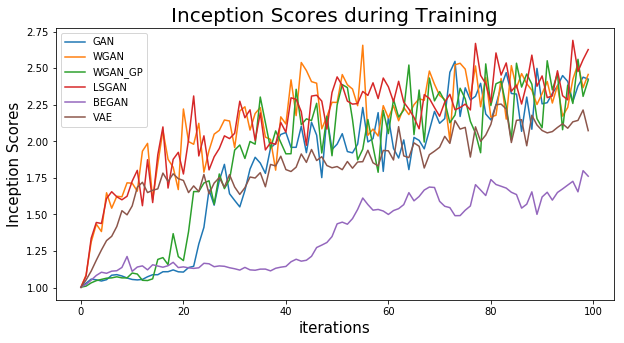

In [19]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))

for tm in test_models:
    scores = np.array(trained_models[tm].inception_scores).transpose()
    plt.plot(scores[0], label=tm)

plt.title('Inception Scores during Training', fontsize=20)
plt.xlabel('iterations', fontsize=15)
plt.ylabel('Inception Scores', fontsize=15)
plt.legend()
plt.show()

### Discussion:
We can see that LSGAN, WGAN and VAE's are the fastest to train in that their inception scores increases very fast in the beginning iterations.

BEGAN trains the slowest but gradually increases. WGAN_GP and vanilla GAN started slow but increased dramatically around 20 iterations.

## Inception Scores after 20 epochs

In [29]:
print("Inception Scores after 20 epochs: ")
for tm in test_models:
    score = trained_models[tm].final_inception_scores
    print("    %s \t- \tMean: %.8f, SD: %.8f" %(tm, score[0], score[1]))

Inception Scores after 20 epochs: 
    GAN 	- 	Mean: 2.81748033, SD: 0.46912882
    WGAN 	- 	Mean: 2.46219659, SD: 0.37087956
    WGAN_GP 	- 	Mean: 2.69611239, SD: 0.45672646
    LSGAN 	- 	Mean: 2.74067712, SD: 0.29980928
    BEGAN 	- 	Mean: 2.29402113, SD: 0.51818603
    VAE 	- 	Mean: 2.40926528, SD: 0.38920832


## Result Visualizations

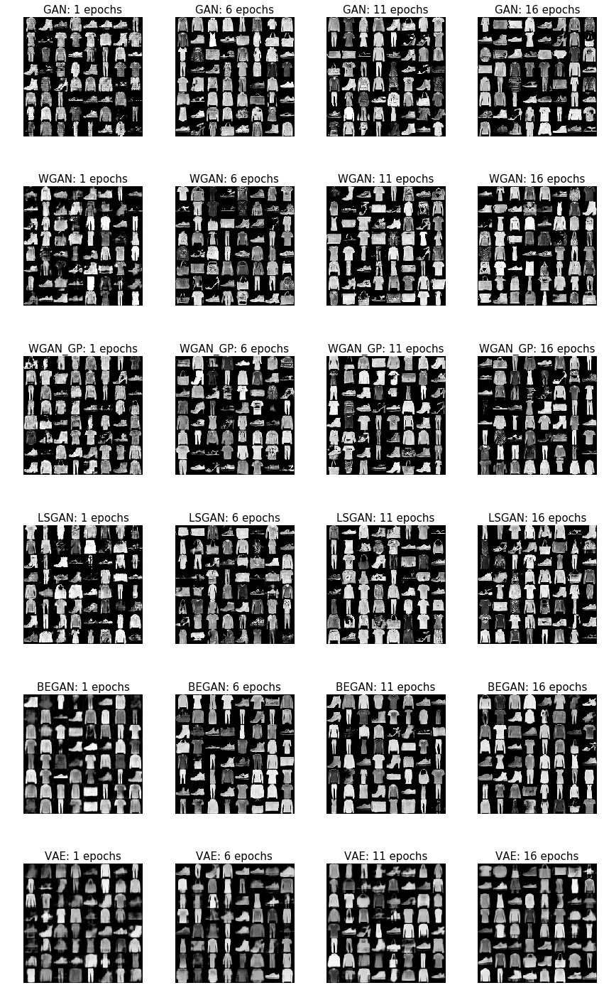

In [45]:
from glob import glob

k=0
res_fold = 'results'

fig = plt.figure(figsize=(12,20))
for tm in test_models:
    tm_fold = glob(os.path.join(res_fold, tm+'*'))[0]
    for i in range(0, 20, 5):
        image_path = glob(os.path.join(tm_fold, '*epoch%03d*'%i))[0]
        im = plt.imread(image_path)
        h, w = im.shape
        im = im.reshape((h, w, 1))
        im = np.repeat(im, 3, axis=2)
        plt.subplot(len(test_models), 4, k+1)
        plt.imshow(im)
        plt.title("%s: %d epochs" %(tm, i+1), fontsize=15)
        plt.axis('off')
        k += 1
plt.tight_layout()
plt.show()